In [ ]:
import tensorflow as tf
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
from numpy import asarray
from numpy import zeros
import nltk
import re
import pickle
import string
from keras.callbacks import TensorBoard
from google.colab import drive
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
from keras.preprocessing.text import Tokenizer
from keras.preprocessing.sequence import pad_sequences
from keras.models import Sequential
from keras.models import load_model
from keras.layers import Embedding, LSTM, Bidirectional
from keras.layers.core import Dense, Dropout
from keras.callbacks import ReduceLROnPlateau, ModelCheckpoint
from bs4 import BeautifulSoup
from wordcloud import WordCloud
from collections import Counter
from keras.utils import np_utils
from tensorflow.keras.utils import plot_model

import nltk
from nltk.stem import WordNetLemmatizer
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize


from sklearn.metrics import confusion_matrix, classification_report

import tensorflow.keras.optimizers
from keras import regularizers
import seaborn as sns

import tensorflow_hub as hub


!pip install transformers
!pip install tensorflow_hub
!pip install keras tf-models-official pydot graphviz

from official.nlp import optimization
from time import time
from official import nlp
import official.nlp.bert.tokenization as tokenization
from transformers import BertTokenizer, TFBertForSequenceClassification
from transformers import InputExample, InputFeatures
from tensorflow.data import Dataset


drive.mount('/content/drive/')

Drive already mounted at /content/drive/; to attempt to forcibly remount, call drive.mount("/content/drive/", force_remount=True).


In [ ]:
nltk.download('stopwords')
stopword = set(stopwords.words('english'))
nltk.download('punkt')
nltk.download('wordnet')

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.
[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt.zip.
[nltk_data] Downloading package wordnet to /root/nltk_data...
[nltk_data]   Unzipping corpora/wordnet.zip.


True

# PreProcess

In [ ]:
# Reading Data
cols = ['sentiment','id','date','query_string','user','text'] #Defining the columns
df = pd.read_csv("/content/drive/My Drive/tweets.csv",header=None, encoding = 'latin-1', names = cols)

In [ ]:
# Dropping unnecessary columns and converitng 4 label to 1 in order to ease
df.drop(columns = ['id','date','query_string','user'], axis=1, inplace=True)
df['sentiment'] = df['sentiment'].replace(4, 1)

In [ ]:
# check the number of positive vs. negative tagged sentences
positives = df['sentiment'][df.sentiment == 1 ]
negatives = df['sentiment'][df.sentiment == 0 ]

print('Total length of the data is:         {}'.format(df.shape[0]))
print('No. of positve tagged sentences is:  {}'.format(len(positives)))
print('No. of negative tagged sentences is: {}'.format(len(negatives)))

Total length of the data is:         1600000
No. of positve tagged sentences is:  800000
No. of negative tagged sentences is: 800000


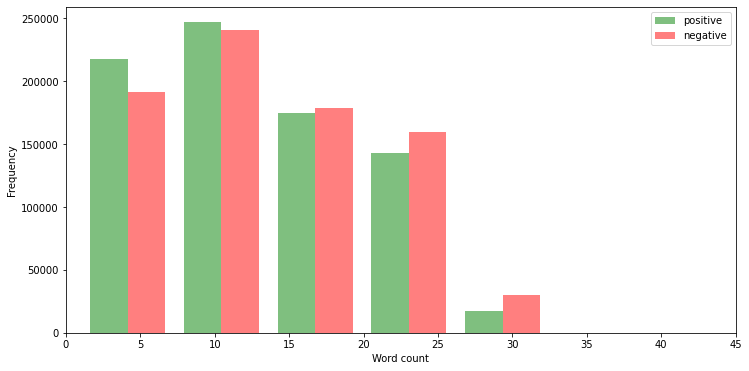

In [ ]:
def word_count(words):
    return len(words.split())

# plot word count distribution for both positive and negative 

df['word count'] = df['text'].apply(word_count)
p = df['word count'][df.sentiment == 1]
n = df['word count'][df.sentiment == 0]
plt.figure(figsize=(12,6))
plt.xlim(0,45)
plt.xlabel('Word count')
plt.ylabel('Frequency')
g = plt.hist([p, n], color=['g','r'], alpha=0.5, label=['positive','negative'])
plt.legend(loc='upper right')

## Cleaner function

In [ ]:
def tweet_cleaner(text):
  urlPattern = r'http://[^ ]*|https://[^ ]*|www\.[^ ]*'
  userPattern = '@[^\s]+'
  hashtag_number = '[#0-9]+'
  soup = BeautifulSoup(text, 'lxml')
  souped = soup.get_text()
  # Removing all URls 
  tweet = re.sub(urlPattern,'',str(souped).lower()).strip()
  # Removing all @username.
  tweet = re.sub(userPattern,'', tweet) 
  # Removing all hashtag-numbers.
  tweet = re.sub(hashtag_number,'', tweet) 
  tweet = re.sub('(?<=.)[\'](?=.)', ' ', tweet)
  tweet = re.sub('((?<=^)|(?<=\s)).((?=$)|(?=\s))', '', tweet)
  tweet = re.sub('([^ ]*)(\.com)', '', tweet)
  tweet = tweet.translate(str.maketrans("","",string.punctuation))
  #tokenizing words
  tokens = word_tokenize(tweet)
  #Removing Stop Words
  final_tokens = [w for w in tokens if w not in stopword]
  #reducing a word to its word stem 
  wordLemm = WordNetLemmatizer()
  finalwords=[]
  for w in final_tokens:
     if len(w)>1:
      word = wordLemm.lemmatize(w)
      finalwords.append(word)
  return ' '.join(finalwords)

In [ ]:
df['processed_tweets'] = df['text'].apply(tweet_cleaner)
print('Text Preprocessing complete.')

Text Preprocessing complete.


In [ ]:
df = df.drop(columns = ['text']).rename(columns = {'processed_tweets' : 'text'})

In [ ]:
#df.to_csv('clean_tweet.csv',encoding='utf-8')
csv = '/content/drive/My Drive/clean_tweet.csv'
df = pd.read_csv(csv,index_col=0)
df.text = df.text.apply(lambda x: str(x))

/usr/local/lib/python3.7/dist-packages/numpy/lib/arraysetops.py:580: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  mask |= (ar1 == a)


## Some visualization

In [ ]:
all_words = []
for line in list(df['text']):
    words = line.split()
    for word in words:
      if(len(word)>2):
        all_words.append(word.lower())
    
    
Counter(all_words).most_common(20)

[('day', 104653),
 ('good', 89797),
 ('get', 86085),
 ('like', 79183),
 ('got', 69864),
 ('love', 67336),
 ('work', 66613),
 ('today', 66195),
 ('going', 64140),
 ('time', 64022),
 ('back', 56213),
 ('one', 56089),
 ('lol', 55344),
 ('know', 53412),
 ('really', 49588),
 ('want', 48314),
 ('see', 46135),
 ('night', 44154),
 ('think', 43536),
 ('still', 42868)]

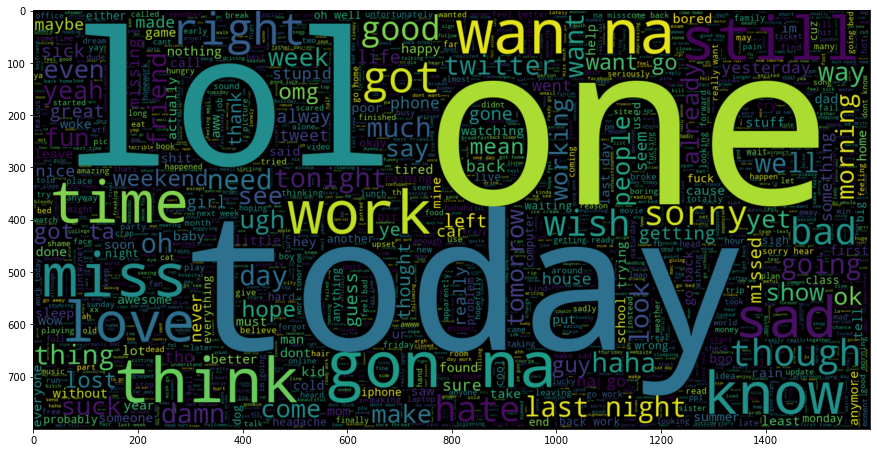

In [ ]:
plt.figure(figsize = (15,15)) 
wc = WordCloud(max_words = 2000 , width = 1600 , height = 800).generate(" ".join(df[df.sentiment == 0].text))
plt.imshow(wc , interpolation = 'bilinear')

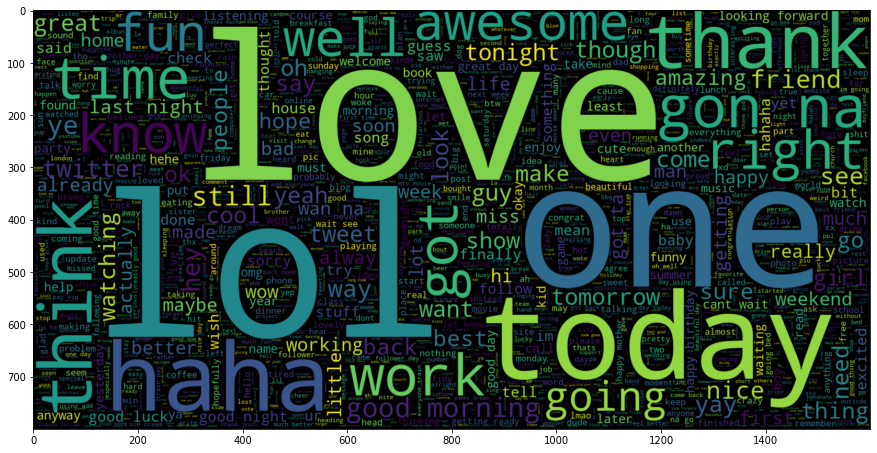

In [ ]:
plt.figure(figsize = (15,15)) 
wc = WordCloud(max_words = 2000 , width = 1600 , height = 800).generate(" ".join(df[df.sentiment == 1].text))
plt.imshow(wc , interpolation = 'bilinear')

## Tokenzing the tweets

In [ ]:
token = Tokenizer()
max_len = max(df.text.apply(lambda x: len(str(x).split())))
token.fit_on_texts(df.text)
sequence = token.texts_to_sequences(df.text)
tweet = pad_sequences(sequence, maxlen=max_len)

In [ ]:
with open('tokenizer.pickle', 'wb') as handle:
    tokenizer = pickle.dump(token, handle, protocol = pickle.HIGHEST_PROTOCOL)

In [ ]:
tweet.shape

(1600000, 40)

## Splitting Train and Test

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(tweet, df.sentiment.values, test_size=0.2, random_state=101)
X_train, X_valid, y_train, y_valid = train_test_split(X_train, y_train , test_size=0.2, random_state=101)

# Creating network (One sided lstm) 

## Loading glove weights

In [ ]:
# load embedding as a dict
def load_embedding(filename):
    # load embedding into memory, skip first line
    file = open(filename,'r',encoding="utf-8")
    lines = file.readlines()
    file.close()
    # create a map of words to vectors
    embedding = dict()
    for line in lines:
        parts = line.split()
        # key is string word, value is numpy array for vector
        embedding[parts[0]] = asarray(parts[1:], dtype='float32')
    return embedding

# create a weight matrix for the Embedding layer from a loaded embedding
def get_weight_matrix(embedding, vocab):
    mean = np.mean(np.array(list(embedding.values())), axis=0)
    # total vocabulary size plus 0 for unknown words
    vocab_size = len(vocab) + 1
    # define weight matrix dimensions with all 0
    weight_matrix = zeros((vocab_size, embedding_dim))
    # step vocab, store vectors using the Tokenizer's integer mapping
    for word, i in vocab.items():
        vector = embedding.get(word)
        if vector is not None:
            weight_matrix[i] = vector
        else : 
            weight_matrix[i] = mean
    return weight_matrix

# contains the index for each word
vocab = token.word_index
# total number of words in our vocabulary, plus one for unknown words
vocab_size = len(token.word_index) + 1
# embedding dimensions
embedding_dim = 300

# load embedding from file
raw_embedding = load_embedding('/content/drive/My Drive/glove.42B.300d.txt')
# get vectors in the right order
embedding_matrix = get_weight_matrix(raw_embedding, vocab)

In [ ]:
np.save('/content/drive/My Drive/weight_matrix.npy', embedding_matrix)

In [ ]:
embedding_matrix  = np.load('/content/drive/My Drive/weight_matrix.npy')

## Create Embedding Layer

In [ ]:
# create the embedding layer
embedding_layer = Embedding(vocab_size, 
                            embedding_dim, 
                            weights = [embedding_matrix], 
                            input_length = max_len, 
                            trainable = False)

## Creating the model

In [ ]:
model = Sequential()
model.add(embedding_layer)
model.add(LSTM(150))
model.add(Dense(3, activation='relu', kernel_regularizer=regularizers.l2(1e-2)))
model.add(Dense(1, activation = "sigmoid"))

optimizer = tensorflow.keras.optimizers.Adam()

model.compile(optimizer= optimizer,loss='binary_crossentropy', metrics=['acc'])

#Call backs
checkpoint = ModelCheckpoint("rnn_model.hdf5", monitor='val_acc', verbose=1,save_best_only=True, mode='auto', save_freq=1,save_weights_only=False)
reduce_lr = ReduceLROnPlateau(monitor = 'val_loss', 
                              factor = 0.2,
                              min_lr = 0.0001)

In [ ]:
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 embedding (Embedding)       (None, 40, 300)           115936200 
                                                                 
 lstm (LSTM)                 (None, 150)               270600    
                                                                 
 dense (Dense)               (None, 3)                 453       
                                                                 
 dense_1 (Dense)             (None, 1)                 4         
                                                                 
Total params: 116,207,257
Trainable params: 271,057
Non-trainable params: 115,936,200
_________________________________________________________________


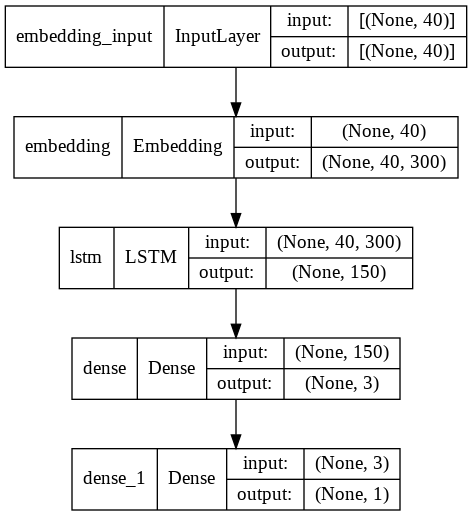

In [ ]:
from tensorflow.keras.utils import plot_model
plot_model(model, show_shapes=True, show_layer_names=True, to_file='model3.png')
from IPython.display import Image
Image(retina=True, filename='model3.png')

## Training Netowrk

In [ ]:
tensorboard = TensorBoard(log_dir = "logs/{}".format(time()))
history = model.fit(X_train, y_train, epochs=10,batch_size=1024,validation_data=(X_valid, y_valid), callbacks=[checkpoint, reduce_lr, tensorboard])

Epoch 1/10


   1/1000 [..............................] - ETA: 1:02:14 - loss: 0.7582 - acc: 0.4961WARNING:tensorflow:Can save best model only with val_acc available, skipping.


   2/1000 [..............................] - ETA: 1:26 - loss: 0.7522 - acc: 0.5381   WARNING:tensorflow:Can save best model only with val_acc available, skipping.


   3/1000 [..............................] - ETA: 1:27 - loss: 0.7497 - acc: 0.5508WARNING:tensorflow:Can save best model only with val_acc available, skipping.


   4/1000 [..............................] - ETA: 1:25 - loss: 0.7452 - acc: 0.5706WARNING:tensorflow:Can save best model only with val_acc available, skipping.


   5/1000 [..............................] - ETA: 1:23 - loss: 0.7402 - acc: 0.5869WARNING:tensorflow:Can save best model only with val_acc available, skipping.


   6/1000 [..............................] - ETA: 1:21 - loss: 0.7366 - acc: 0.5923WARNING:tensorflow:Can save best model only with val_acc available, skipping.


   7/1000 [..............................] - ETA: 1:19 - loss: 0.7323 - acc: 0.5977WARNING:tensorflow:Can save best model only with val_acc available, skipping.


   8/1000 [..............................] - ETA: 1:19 - loss: 0.7268 - acc: 0.6078WARNING:tensorflow:Can save best model only with val_acc available, skipping.


   9/1000 [..............................] - ETA: 1:17 - loss: 0.7232 - acc: 0.6153WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  10/1000 [..............................] - ETA: 1:15 - loss: 0.7178 - acc: 0.6258WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  11/1000 [..............................] - ETA: 1:14 - loss: 0.7133 - acc: 0.6328WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  12/1000 [..............................] - ETA: 1:14 - loss: 0.7091 - acc: 0.6381WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  13/1000 [..............................] - ETA: 1:13 - loss: 0.7041 - acc: 0.6436WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  14/1000 [..............................] - ETA: 1:13 - loss: 0.7003 - acc: 0.6460WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  15/1000 [..............................] - ETA: 1:12 - loss: 0.6961 - acc: 0.6495WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  16/1000 [..............................] - ETA: 1:12 - loss: 0.6912 - acc: 0.6543WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  17/1000 [..............................] - ETA: 1:11 - loss: 0.6876 - acc: 0.6567WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  18/1000 [..............................] - ETA: 1:11 - loss: 0.6850 - acc: 0.6593WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  19/1000 [..............................] - ETA: 1:10 - loss: 0.6816 - acc: 0.6614WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  20/1000 [..............................] - ETA: 1:10 - loss: 0.6788 - acc: 0.6639WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  21/1000 [..............................] - ETA: 1:10 - loss: 0.6758 - acc: 0.6660WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  22/1000 [..............................] - ETA: 1:10 - loss: 0.6734 - acc: 0.6681WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  23/1000 [..............................] - ETA: 1:09 - loss: 0.6705 - acc: 0.6704WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  24/1000 [..............................] - ETA: 1:09 - loss: 0.6682 - acc: 0.6722WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  25/1000 [..............................] - ETA: 1:09 - loss: 0.6657 - acc: 0.6734WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  26/1000 [..............................] - ETA: 1:09 - loss: 0.6633 - acc: 0.6747WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  27/1000 [..............................] - ETA: 1:08 - loss: 0.6612 - acc: 0.6767WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  28/1000 [..............................] - ETA: 1:08 - loss: 0.6592 - acc: 0.6783WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  29/1000 [..............................] - ETA: 1:08 - loss: 0.6564 - acc: 0.6805WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  30/1000 [..............................] - ETA: 1:08 - loss: 0.6541 - acc: 0.6826WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  31/1000 [..............................] - ETA: 1:08 - loss: 0.6520 - acc: 0.6841WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  32/1000 [..............................] - ETA: 1:08 - loss: 0.6502 - acc: 0.6852WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  33/1000 [..............................] - ETA: 1:07 - loss: 0.6487 - acc: 0.6864WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  34/1000 [>.............................] - ETA: 1:07 - loss: 0.6467 - acc: 0.6878WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  35/1000 [>.............................] - ETA: 1:07 - loss: 0.6448 - acc: 0.6893WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  36/1000 [>.............................] - ETA: 1:07 - loss: 0.6429 - acc: 0.6908WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  37/1000 [>.............................] - ETA: 1:07 - loss: 0.6408 - acc: 0.6922WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  38/1000 [>.............................] - ETA: 1:07 - loss: 0.6398 - acc: 0.6926WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  39/1000 [>.............................] - ETA: 1:07 - loss: 0.6386 - acc: 0.6936WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  40/1000 [>.............................] - ETA: 1:07 - loss: 0.6372 - acc: 0.6945WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  41/1000 [>.............................] - ETA: 1:07 - loss: 0.6362 - acc: 0.6953WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  42/1000 [>.............................] - ETA: 1:07 - loss: 0.6350 - acc: 0.6961WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  43/1000 [>.............................] - ETA: 1:06 - loss: 0.6338 - acc: 0.6969WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  44/1000 [>.............................] - ETA: 1:06 - loss: 0.6329 - acc: 0.6975WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  45/1000 [>.............................] - ETA: 1:06 - loss: 0.6320 - acc: 0.6981WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  46/1000 [>.............................] - ETA: 1:06 - loss: 0.6308 - acc: 0.6986WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  47/1000 [>.............................] - ETA: 1:06 - loss: 0.6297 - acc: 0.6995WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  48/1000 [>.............................] - ETA: 1:06 - loss: 0.6287 - acc: 0.7000WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  49/1000 [>.............................] - ETA: 1:06 - loss: 0.6270 - acc: 0.7012WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  50/1000 [>.............................] - ETA: 1:06 - loss: 0.6261 - acc: 0.7016WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  51/1000 [>.............................] - ETA: 1:06 - loss: 0.6251 - acc: 0.7020WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  52/1000 [>.............................] - ETA: 1:06 - loss: 0.6241 - acc: 0.7024WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  53/1000 [>.............................] - ETA: 1:06 - loss: 0.6239 - acc: 0.7026WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  54/1000 [>.............................] - ETA: 1:06 - loss: 0.6231 - acc: 0.7032WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  55/1000 [>.............................] - ETA: 1:05 - loss: 0.6220 - acc: 0.7038WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  56/1000 [>.............................] - ETA: 1:05 - loss: 0.6208 - acc: 0.7043WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  57/1000 [>.............................] - ETA: 1:05 - loss: 0.6202 - acc: 0.7045WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  58/1000 [>.............................] - ETA: 1:05 - loss: 0.6189 - acc: 0.7051WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  59/1000 [>.............................] - ETA: 1:05 - loss: 0.6180 - acc: 0.7058WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  60/1000 [>.............................] - ETA: 1:05 - loss: 0.6173 - acc: 0.7062WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  61/1000 [>.............................] - ETA: 1:05 - loss: 0.6163 - acc: 0.7066WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  62/1000 [>.............................] - ETA: 1:05 - loss: 0.6157 - acc: 0.7069WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  63/1000 [>.............................] - ETA: 1:05 - loss: 0.6146 - acc: 0.7077WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  64/1000 [>.............................] - ETA: 1:05 - loss: 0.6146 - acc: 0.7076WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  65/1000 [>.............................] - ETA: 1:05 - loss: 0.6136 - acc: 0.7082WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  66/1000 [>.............................] - ETA: 1:05 - loss: 0.6129 - acc: 0.7085WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  67/1000 [=>............................] - ETA: 1:05 - loss: 0.6121 - acc: 0.7091WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  68/1000 [=>............................] - ETA: 1:05 - loss: 0.6116 - acc: 0.7093WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  69/1000 [=>............................] - ETA: 1:04 - loss: 0.6110 - acc: 0.7097WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  70/1000 [=>............................] - ETA: 1:04 - loss: 0.6104 - acc: 0.7099WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  71/1000 [=>............................] - ETA: 1:04 - loss: 0.6093 - acc: 0.7106WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  72/1000 [=>............................] - ETA: 1:04 - loss: 0.6085 - acc: 0.7112WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  73/1000 [=>............................] - ETA: 1:04 - loss: 0.6078 - acc: 0.7116WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  74/1000 [=>............................] - ETA: 1:04 - loss: 0.6069 - acc: 0.7121WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  75/1000 [=>............................] - ETA: 1:04 - loss: 0.6065 - acc: 0.7122WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  76/1000 [=>............................] - ETA: 1:04 - loss: 0.6060 - acc: 0.7126WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  77/1000 [=>............................] - ETA: 1:04 - loss: 0.6053 - acc: 0.7130WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  78/1000 [=>............................] - ETA: 1:04 - loss: 0.6048 - acc: 0.7133WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  79/1000 [=>............................] - ETA: 1:04 - loss: 0.6040 - acc: 0.7137WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  80/1000 [=>............................] - ETA: 1:04 - loss: 0.6034 - acc: 0.7141WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  81/1000 [=>............................] - ETA: 1:04 - loss: 0.6029 - acc: 0.7142WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  82/1000 [=>............................] - ETA: 1:04 - loss: 0.6023 - acc: 0.7145WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  83/1000 [=>............................] - ETA: 1:04 - loss: 0.6017 - acc: 0.7150WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  84/1000 [=>............................] - ETA: 1:03 - loss: 0.6013 - acc: 0.7151WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  85/1000 [=>............................] - ETA: 1:03 - loss: 0.6008 - acc: 0.7153WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  86/1000 [=>............................] - ETA: 1:03 - loss: 0.6002 - acc: 0.7154WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  87/1000 [=>............................] - ETA: 1:03 - loss: 0.5997 - acc: 0.7157WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  88/1000 [=>............................] - ETA: 1:03 - loss: 0.5993 - acc: 0.7159WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  89/1000 [=>............................] - ETA: 1:03 - loss: 0.5989 - acc: 0.7159WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  90/1000 [=>............................] - ETA: 1:03 - loss: 0.5983 - acc: 0.7163WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  91/1000 [=>............................] - ETA: 1:03 - loss: 0.5977 - acc: 0.7166WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  92/1000 [=>............................] - ETA: 1:03 - loss: 0.5973 - acc: 0.7168WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  93/1000 [=>............................] - ETA: 1:03 - loss: 0.5967 - acc: 0.7172WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  94/1000 [=>............................] - ETA: 1:03 - loss: 0.5961 - acc: 0.7176WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  95/1000 [=>............................] - ETA: 1:03 - loss: 0.5958 - acc: 0.7177WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  96/1000 [=>............................] - ETA: 1:03 - loss: 0.5952 - acc: 0.7181WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  97/1000 [=>............................] - ETA: 1:02 - loss: 0.5947 - acc: 0.7184WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  98/1000 [=>............................] - ETA: 1:02 - loss: 0.5945 - acc: 0.7185WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  99/1000 [=>............................] - ETA: 1:02 - loss: 0.5938 - acc: 0.7189WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 100/1000 [==>...........................] - ETA: 1:02 - loss: 0.5937 - acc: 0.7188WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 101/1000 [==>...........................] - ETA: 1:02 - loss: 0.5935 - acc: 0.7188WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 102/1000 [==>...........................] - ETA: 1:02 - loss: 0.5931 - acc: 0.7189WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 103/1000 [==>...........................] - ETA: 1:02 - loss: 0.5925 - acc: 0.7193WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 104/1000 [==>...........................] - ETA: 1:02 - loss: 0.5919 - acc: 0.7197WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 105/1000 [==>...........................] - ETA: 1:02 - loss: 0.5914 - acc: 0.7199WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 106/1000 [==>...........................] - ETA: 1:02 - loss: 0.5911 - acc: 0.7201WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 107/1000 [==>...........................] - ETA: 1:02 - loss: 0.5904 - acc: 0.7205WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 108/1000 [==>...........................] - ETA: 1:02 - loss: 0.5900 - acc: 0.7207WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 109/1000 [==>...........................] - ETA: 1:02 - loss: 0.5896 - acc: 0.7208WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 110/1000 [==>...........................] - ETA: 1:01 - loss: 0.5893 - acc: 0.7209WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 111/1000 [==>...........................] - ETA: 1:01 - loss: 0.5886 - acc: 0.7214WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 112/1000 [==>...........................] - ETA: 1:01 - loss: 0.5880 - acc: 0.7217WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 113/1000 [==>...........................] - ETA: 1:01 - loss: 0.5878 - acc: 0.7218WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 114/1000 [==>...........................] - ETA: 1:01 - loss: 0.5876 - acc: 0.7219WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 115/1000 [==>...........................] - ETA: 1:01 - loss: 0.5870 - acc: 0.7222WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 116/1000 [==>...........................] - ETA: 1:01 - loss: 0.5868 - acc: 0.7223WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 117/1000 [==>...........................] - ETA: 1:01 - loss: 0.5864 - acc: 0.7226WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 118/1000 [==>...........................] - ETA: 1:01 - loss: 0.5861 - acc: 0.7227WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 119/1000 [==>...........................] - ETA: 1:01 - loss: 0.5857 - acc: 0.7230WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 120/1000 [==>...........................] - ETA: 1:01 - loss: 0.5852 - acc: 0.7234WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 121/1000 [==>...........................] - ETA: 1:01 - loss: 0.5849 - acc: 0.7236WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 122/1000 [==>...........................] - ETA: 1:01 - loss: 0.5846 - acc: 0.7238WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 123/1000 [==>...........................] - ETA: 1:01 - loss: 0.5843 - acc: 0.7240WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 124/1000 [==>...........................] - ETA: 1:00 - loss: 0.5841 - acc: 0.7241WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 125/1000 [==>...........................] - ETA: 1:00 - loss: 0.5837 - acc: 0.7244WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 126/1000 [==>...........................] - ETA: 1:00 - loss: 0.5833 - acc: 0.7247WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 127/1000 [==>...........................] - ETA: 1:00 - loss: 0.5830 - acc: 0.7248WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 128/1000 [==>...........................] - ETA: 1:00 - loss: 0.5827 - acc: 0.7249WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 129/1000 [==>...........................] - ETA: 1:00 - loss: 0.5823 - acc: 0.7251WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 130/1000 [==>...........................] - ETA: 1:00 - loss: 0.5819 - acc: 0.7254WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 131/1000 [==>...........................] - ETA: 1:00 - loss: 0.5815 - acc: 0.7255WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 132/1000 [==>...........................] - ETA: 1:00 - loss: 0.5814 - acc: 0.7255WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 133/1000 [==>...........................] - ETA: 1:00 - loss: 0.5811 - acc: 0.7257WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 134/1000 [===>..........................] - ETA: 1:00 - loss: 0.5804 - acc: 0.7261WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 135/1000 [===>..........................] - ETA: 1:00 - loss: 0.5802 - acc: 0.7263WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 136/1000 [===>..........................] - ETA: 59s - loss: 0.5800 - acc: 0.7263 WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 137/1000 [===>..........................] - ETA: 59s - loss: 0.5797 - acc: 0.7265WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 138/1000 [===>..........................] - ETA: 59s - loss: 0.5792 - acc: 0.7268WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 139/1000 [===>..........................] - ETA: 59s - loss: 0.5788 - acc: 0.7270WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 140/1000 [===>..........................] - ETA: 59s - loss: 0.5784 - acc: 0.7273WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 141/1000 [===>..........................] - ETA: 59s - loss: 0.5781 - acc: 0.7274WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 142/1000 [===>..........................] - ETA: 59s - loss: 0.5777 - acc: 0.7276WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 143/1000 [===>..........................] - ETA: 59s - loss: 0.5774 - acc: 0.7278WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 144/1000 [===>..........................] - ETA: 59s - loss: 0.5771 - acc: 0.7279WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 145/1000 [===>..........................] - ETA: 59s - loss: 0.5767 - acc: 0.7281WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 146/1000 [===>..........................] - ETA: 59s - loss: 0.5765 - acc: 0.7283WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 147/1000 [===>..........................] - ETA: 59s - loss: 0.5762 - acc: 0.7284WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 148/1000 [===>..........................] - ETA: 59s - loss: 0.5758 - acc: 0.7286WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 149/1000 [===>..........................] - ETA: 59s - loss: 0.5756 - acc: 0.7286WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 150/1000 [===>..........................] - ETA: 59s - loss: 0.5753 - acc: 0.7287WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 151/1000 [===>..........................] - ETA: 58s - loss: 0.5751 - acc: 0.7288WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 152/1000 [===>..........................] - ETA: 58s - loss: 0.5749 - acc: 0.7288WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 153/1000 [===>..........................] - ETA: 58s - loss: 0.5746 - acc: 0.7290WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 154/1000 [===>..........................] - ETA: 58s - loss: 0.5745 - acc: 0.7291WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 155/1000 [===>..........................] - ETA: 58s - loss: 0.5742 - acc: 0.7292WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 156/1000 [===>..........................] - ETA: 58s - loss: 0.5740 - acc: 0.7293WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 157/1000 [===>..........................] - ETA: 58s - loss: 0.5738 - acc: 0.7294WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 158/1000 [===>..........................] - ETA: 58s - loss: 0.5735 - acc: 0.7295WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 159/1000 [===>..........................] - ETA: 58s - loss: 0.5733 - acc: 0.7296WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 160/1000 [===>..........................] - ETA: 58s - loss: 0.5730 - acc: 0.7298WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 161/1000 [===>..........................] - ETA: 58s - loss: 0.5727 - acc: 0.7300WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 162/1000 [===>..........................] - ETA: 58s - loss: 0.5726 - acc: 0.7300WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 163/1000 [===>..........................] - ETA: 58s - loss: 0.5724 - acc: 0.7299WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 164/1000 [===>..........................] - ETA: 58s - loss: 0.5721 - acc: 0.7301WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 165/1000 [===>..........................] - ETA: 57s - loss: 0.5718 - acc: 0.7302WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 166/1000 [===>..........................] - ETA: 57s - loss: 0.5715 - acc: 0.7304WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 167/1000 [====>.........................] - ETA: 57s - loss: 0.5713 - acc: 0.7305WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 168/1000 [====>.........................] - ETA: 57s - loss: 0.5711 - acc: 0.7305WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 169/1000 [====>.........................] - ETA: 57s - loss: 0.5709 - acc: 0.7306WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 170/1000 [====>.........................] - ETA: 57s - loss: 0.5707 - acc: 0.7306WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 171/1000 [====>.........................] - ETA: 57s - loss: 0.5704 - acc: 0.7308WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 172/1000 [====>.........................] - ETA: 57s - loss: 0.5701 - acc: 0.7308WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 173/1000 [====>.........................] - ETA: 57s - loss: 0.5701 - acc: 0.7308WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 174/1000 [====>.........................] - ETA: 57s - loss: 0.5699 - acc: 0.7309WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 175/1000 [====>.........................] - ETA: 57s - loss: 0.5696 - acc: 0.7310WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 176/1000 [====>.........................] - ETA: 57s - loss: 0.5695 - acc: 0.7310WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 177/1000 [====>.........................] - ETA: 57s - loss: 0.5692 - acc: 0.7312WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 178/1000 [====>.........................] - ETA: 57s - loss: 0.5691 - acc: 0.7311WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 179/1000 [====>.........................] - ETA: 56s - loss: 0.5688 - acc: 0.7313WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 180/1000 [====>.........................] - ETA: 56s - loss: 0.5684 - acc: 0.7315WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 181/1000 [====>.........................] - ETA: 56s - loss: 0.5681 - acc: 0.7317WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 182/1000 [====>.........................] - ETA: 56s - loss: 0.5679 - acc: 0.7318WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 183/1000 [====>.........................] - ETA: 56s - loss: 0.5676 - acc: 0.7319WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 184/1000 [====>.........................] - ETA: 56s - loss: 0.5674 - acc: 0.7321WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 185/1000 [====>.........................] - ETA: 56s - loss: 0.5672 - acc: 0.7322WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 186/1000 [====>.........................] - ETA: 56s - loss: 0.5671 - acc: 0.7322WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 187/1000 [====>.........................] - ETA: 56s - loss: 0.5671 - acc: 0.7322WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 188/1000 [====>.........................] - ETA: 56s - loss: 0.5670 - acc: 0.7322WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 189/1000 [====>.........................] - ETA: 56s - loss: 0.5668 - acc: 0.7324WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 190/1000 [====>.........................] - ETA: 56s - loss: 0.5666 - acc: 0.7325WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 191/1000 [====>.........................] - ETA: 56s - loss: 0.5663 - acc: 0.7326WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 192/1000 [====>.........................] - ETA: 55s - loss: 0.5661 - acc: 0.7327WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 193/1000 [====>.........................] - ETA: 55s - loss: 0.5658 - acc: 0.7329WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 194/1000 [====>.........................] - ETA: 55s - loss: 0.5655 - acc: 0.7331WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 195/1000 [====>.........................] - ETA: 55s - loss: 0.5653 - acc: 0.7331WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 196/1000 [====>.........................] - ETA: 55s - loss: 0.5651 - acc: 0.7332WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 197/1000 [====>.........................] - ETA: 55s - loss: 0.5648 - acc: 0.7334WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 198/1000 [====>.........................] - ETA: 55s - loss: 0.5645 - acc: 0.7336WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 199/1000 [====>.........................] - ETA: 55s - loss: 0.5642 - acc: 0.7338WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 200/1000 [=====>........................] - ETA: 55s - loss: 0.5640 - acc: 0.7339WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 201/1000 [=====>........................] - ETA: 55s - loss: 0.5640 - acc: 0.7339WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 202/1000 [=====>........................] - ETA: 55s - loss: 0.5638 - acc: 0.7339WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 203/1000 [=====>........................] - ETA: 55s - loss: 0.5636 - acc: 0.7341WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 204/1000 [=====>........................] - ETA: 55s - loss: 0.5633 - acc: 0.7342WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 205/1000 [=====>........................] - ETA: 55s - loss: 0.5632 - acc: 0.7343WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 206/1000 [=====>........................] - ETA: 54s - loss: 0.5630 - acc: 0.7344WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 207/1000 [=====>........................] - ETA: 54s - loss: 0.5627 - acc: 0.7346WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 208/1000 [=====>........................] - ETA: 54s - loss: 0.5624 - acc: 0.7348WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 209/1000 [=====>........................] - ETA: 54s - loss: 0.5623 - acc: 0.7348WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 210/1000 [=====>........................] - ETA: 54s - loss: 0.5620 - acc: 0.7350WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 211/1000 [=====>........................] - ETA: 54s - loss: 0.5619 - acc: 0.7351WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 212/1000 [=====>........................] - ETA: 54s - loss: 0.5617 - acc: 0.7351WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 213/1000 [=====>........................] - ETA: 54s - loss: 0.5615 - acc: 0.7353WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 214/1000 [=====>........................] - ETA: 54s - loss: 0.5614 - acc: 0.7353WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 215/1000 [=====>........................] - ETA: 54s - loss: 0.5611 - acc: 0.7355WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 216/1000 [=====>........................] - ETA: 54s - loss: 0.5610 - acc: 0.7356WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 217/1000 [=====>........................] - ETA: 54s - loss: 0.5608 - acc: 0.7356WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 218/1000 [=====>........................] - ETA: 54s - loss: 0.5605 - acc: 0.7358WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 219/1000 [=====>........................] - ETA: 54s - loss: 0.5605 - acc: 0.7358WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 220/1000 [=====>........................] - ETA: 53s - loss: 0.5603 - acc: 0.7359WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 221/1000 [=====>........................] - ETA: 53s - loss: 0.5601 - acc: 0.7360WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 222/1000 [=====>........................] - ETA: 53s - loss: 0.5599 - acc: 0.7361WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 223/1000 [=====>........................] - ETA: 53s - loss: 0.5597 - acc: 0.7362WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 224/1000 [=====>........................] - ETA: 53s - loss: 0.5594 - acc: 0.7364WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 225/1000 [=====>........................] - ETA: 53s - loss: 0.5593 - acc: 0.7364WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 226/1000 [=====>........................] - ETA: 53s - loss: 0.5591 - acc: 0.7365WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 227/1000 [=====>........................] - ETA: 53s - loss: 0.5588 - acc: 0.7367WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 228/1000 [=====>........................] - ETA: 53s - loss: 0.5587 - acc: 0.7368WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 229/1000 [=====>........................] - ETA: 53s - loss: 0.5585 - acc: 0.7369WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 230/1000 [=====>........................] - ETA: 53s - loss: 0.5584 - acc: 0.7369WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 231/1000 [=====>........................] - ETA: 53s - loss: 0.5582 - acc: 0.7369WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 232/1000 [=====>........................] - ETA: 53s - loss: 0.5581 - acc: 0.7370WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 233/1000 [=====>........................] - ETA: 52s - loss: 0.5579 - acc: 0.7370WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 234/1000 [======>.......................] - ETA: 52s - loss: 0.5577 - acc: 0.7372WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 235/1000 [======>.......................] - ETA: 52s - loss: 0.5576 - acc: 0.7373WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 236/1000 [======>.......................] - ETA: 52s - loss: 0.5574 - acc: 0.7373WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 237/1000 [======>.......................] - ETA: 52s - loss: 0.5573 - acc: 0.7373WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 238/1000 [======>.......................] - ETA: 52s - loss: 0.5572 - acc: 0.7373WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 239/1000 [======>.......................] - ETA: 52s - loss: 0.5571 - acc: 0.7373WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 240/1000 [======>.......................] - ETA: 52s - loss: 0.5569 - acc: 0.7374WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 241/1000 [======>.......................] - ETA: 52s - loss: 0.5567 - acc: 0.7375WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 242/1000 [======>.......................] - ETA: 52s - loss: 0.5566 - acc: 0.7375WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 243/1000 [======>.......................] - ETA: 52s - loss: 0.5563 - acc: 0.7377WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 244/1000 [======>.......................] - ETA: 52s - loss: 0.5561 - acc: 0.7378WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 245/1000 [======>.......................] - ETA: 52s - loss: 0.5560 - acc: 0.7379WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 246/1000 [======>.......................] - ETA: 52s - loss: 0.5558 - acc: 0.7380WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 247/1000 [======>.......................] - ETA: 51s - loss: 0.5557 - acc: 0.7381WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 248/1000 [======>.......................] - ETA: 51s - loss: 0.5554 - acc: 0.7382WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 249/1000 [======>.......................] - ETA: 51s - loss: 0.5554 - acc: 0.7382WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 250/1000 [======>.......................] - ETA: 51s - loss: 0.5553 - acc: 0.7382WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 251/1000 [======>.......................] - ETA: 51s - loss: 0.5552 - acc: 0.7382WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 252/1000 [======>.......................] - ETA: 51s - loss: 0.5550 - acc: 0.7383WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 253/1000 [======>.......................] - ETA: 51s - loss: 0.5548 - acc: 0.7384WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 254/1000 [======>.......................] - ETA: 51s - loss: 0.5545 - acc: 0.7386WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 255/1000 [======>.......................] - ETA: 51s - loss: 0.5544 - acc: 0.7386WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 256/1000 [======>.......................] - ETA: 51s - loss: 0.5543 - acc: 0.7386WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 257/1000 [======>.......................] - ETA: 51s - loss: 0.5541 - acc: 0.7387WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 258/1000 [======>.......................] - ETA: 51s - loss: 0.5540 - acc: 0.7387WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 259/1000 [======>.......................] - ETA: 51s - loss: 0.5540 - acc: 0.7387WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 260/1000 [======>.......................] - ETA: 51s - loss: 0.5539 - acc: 0.7387WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 261/1000 [======>.......................] - ETA: 50s - loss: 0.5537 - acc: 0.7388WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 262/1000 [======>.......................] - ETA: 50s - loss: 0.5535 - acc: 0.7390WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 263/1000 [======>.......................] - ETA: 50s - loss: 0.5534 - acc: 0.7390WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 264/1000 [======>.......................] - ETA: 50s - loss: 0.5532 - acc: 0.7391WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 265/1000 [======>.......................] - ETA: 50s - loss: 0.5531 - acc: 0.7391WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 266/1000 [======>.......................] - ETA: 50s - loss: 0.5530 - acc: 0.7392WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 267/1000 [=======>......................] - ETA: 50s - loss: 0.5529 - acc: 0.7392WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 268/1000 [=======>......................] - ETA: 50s - loss: 0.5527 - acc: 0.7393WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 269/1000 [=======>......................] - ETA: 50s - loss: 0.5526 - acc: 0.7393WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 270/1000 [=======>......................] - ETA: 50s - loss: 0.5524 - acc: 0.7395WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 271/1000 [=======>......................] - ETA: 50s - loss: 0.5523 - acc: 0.7395WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 272/1000 [=======>......................] - ETA: 50s - loss: 0.5521 - acc: 0.7396WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 273/1000 [=======>......................] - ETA: 50s - loss: 0.5519 - acc: 0.7397WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 274/1000 [=======>......................] - ETA: 50s - loss: 0.5518 - acc: 0.7397WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 275/1000 [=======>......................] - ETA: 49s - loss: 0.5515 - acc: 0.7399WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 276/1000 [=======>......................] - ETA: 49s - loss: 0.5514 - acc: 0.7399WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 277/1000 [=======>......................] - ETA: 49s - loss: 0.5512 - acc: 0.7400WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 278/1000 [=======>......................] - ETA: 49s - loss: 0.5511 - acc: 0.7400WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 279/1000 [=======>......................] - ETA: 49s - loss: 0.5509 - acc: 0.7401WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 280/1000 [=======>......................] - ETA: 49s - loss: 0.5508 - acc: 0.7401WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 281/1000 [=======>......................] - ETA: 49s - loss: 0.5508 - acc: 0.7401WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 282/1000 [=======>......................] - ETA: 49s - loss: 0.5506 - acc: 0.7401WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 283/1000 [=======>......................] - ETA: 49s - loss: 0.5506 - acc: 0.7402WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 284/1000 [=======>......................] - ETA: 49s - loss: 0.5505 - acc: 0.7403WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 285/1000 [=======>......................] - ETA: 49s - loss: 0.5505 - acc: 0.7402WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 286/1000 [=======>......................] - ETA: 49s - loss: 0.5503 - acc: 0.7403WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 287/1000 [=======>......................] - ETA: 49s - loss: 0.5502 - acc: 0.7404WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 288/1000 [=======>......................] - ETA: 49s - loss: 0.5500 - acc: 0.7404WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 289/1000 [=======>......................] - ETA: 48s - loss: 0.5499 - acc: 0.7405WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 290/1000 [=======>......................] - ETA: 48s - loss: 0.5498 - acc: 0.7405WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 291/1000 [=======>......................] - ETA: 48s - loss: 0.5496 - acc: 0.7406WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 292/1000 [=======>......................] - ETA: 48s - loss: 0.5496 - acc: 0.7406WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 293/1000 [=======>......................] - ETA: 48s - loss: 0.5495 - acc: 0.7407WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 294/1000 [=======>......................] - ETA: 48s - loss: 0.5494 - acc: 0.7407WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 295/1000 [=======>......................] - ETA: 48s - loss: 0.5492 - acc: 0.7408WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 296/1000 [=======>......................] - ETA: 48s - loss: 0.5491 - acc: 0.7409WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 297/1000 [=======>......................] - ETA: 48s - loss: 0.5489 - acc: 0.7409WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 298/1000 [=======>......................] - ETA: 48s - loss: 0.5488 - acc: 0.7410WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 299/1000 [=======>......................] - ETA: 48s - loss: 0.5486 - acc: 0.7411WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 300/1000 [========>.....................] - ETA: 48s - loss: 0.5485 - acc: 0.7410WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 301/1000 [========>.....................] - ETA: 48s - loss: 0.5484 - acc: 0.7411WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 302/1000 [========>.....................] - ETA: 48s - loss: 0.5484 - acc: 0.7411WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 303/1000 [========>.....................] - ETA: 48s - loss: 0.5483 - acc: 0.7412WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 304/1000 [========>.....................] - ETA: 47s - loss: 0.5483 - acc: 0.7411WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 305/1000 [========>.....................] - ETA: 47s - loss: 0.5481 - acc: 0.7412WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 306/1000 [========>.....................] - ETA: 47s - loss: 0.5480 - acc: 0.7412WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 307/1000 [========>.....................] - ETA: 47s - loss: 0.5479 - acc: 0.7413WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 308/1000 [========>.....................] - ETA: 47s - loss: 0.5477 - acc: 0.7414WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 309/1000 [========>.....................] - ETA: 47s - loss: 0.5475 - acc: 0.7414WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 310/1000 [========>.....................] - ETA: 47s - loss: 0.5475 - acc: 0.7414WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 311/1000 [========>.....................] - ETA: 47s - loss: 0.5474 - acc: 0.7415WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 312/1000 [========>.....................] - ETA: 47s - loss: 0.5473 - acc: 0.7415WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 313/1000 [========>.....................] - ETA: 47s - loss: 0.5473 - acc: 0.7415WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 314/1000 [========>.....................] - ETA: 47s - loss: 0.5471 - acc: 0.7416WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 315/1000 [========>.....................] - ETA: 47s - loss: 0.5470 - acc: 0.7417WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 316/1000 [========>.....................] - ETA: 47s - loss: 0.5469 - acc: 0.7418WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 317/1000 [========>.....................] - ETA: 47s - loss: 0.5467 - acc: 0.7418WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 318/1000 [========>.....................] - ETA: 46s - loss: 0.5467 - acc: 0.7418WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 319/1000 [========>.....................] - ETA: 46s - loss: 0.5465 - acc: 0.7419WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 320/1000 [========>.....................] - ETA: 46s - loss: 0.5464 - acc: 0.7419WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 321/1000 [========>.....................] - ETA: 46s - loss: 0.5462 - acc: 0.7421WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 322/1000 [========>.....................] - ETA: 46s - loss: 0.5462 - acc: 0.7420WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 323/1000 [========>.....................] - ETA: 46s - loss: 0.5461 - acc: 0.7421WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 324/1000 [========>.....................] - ETA: 46s - loss: 0.5460 - acc: 0.7422WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 325/1000 [========>.....................] - ETA: 46s - loss: 0.5459 - acc: 0.7422WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 326/1000 [========>.....................] - ETA: 46s - loss: 0.5457 - acc: 0.7423WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 327/1000 [========>.....................] - ETA: 46s - loss: 0.5456 - acc: 0.7423WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 328/1000 [========>.....................] - ETA: 46s - loss: 0.5455 - acc: 0.7424WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 329/1000 [========>.....................] - ETA: 46s - loss: 0.5453 - acc: 0.7425WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 330/1000 [========>.....................] - ETA: 46s - loss: 0.5451 - acc: 0.7427WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 331/1000 [========>.....................] - ETA: 46s - loss: 0.5450 - acc: 0.7427WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 332/1000 [========>.....................] - ETA: 45s - loss: 0.5449 - acc: 0.7427WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 333/1000 [========>.....................] - ETA: 45s - loss: 0.5448 - acc: 0.7428WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 334/1000 [=========>....................] - ETA: 45s - loss: 0.5447 - acc: 0.7429WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 335/1000 [=========>....................] - ETA: 45s - loss: 0.5445 - acc: 0.7429WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 336/1000 [=========>....................] - ETA: 45s - loss: 0.5444 - acc: 0.7430WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 337/1000 [=========>....................] - ETA: 45s - loss: 0.5442 - acc: 0.7431WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 338/1000 [=========>....................] - ETA: 45s - loss: 0.5441 - acc: 0.7431WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 339/1000 [=========>....................] - ETA: 45s - loss: 0.5440 - acc: 0.7432WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 340/1000 [=========>....................] - ETA: 45s - loss: 0.5439 - acc: 0.7432WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 341/1000 [=========>....................] - ETA: 45s - loss: 0.5438 - acc: 0.7433WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 342/1000 [=========>....................] - ETA: 45s - loss: 0.5437 - acc: 0.7434WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 343/1000 [=========>....................] - ETA: 45s - loss: 0.5436 - acc: 0.7435WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 344/1000 [=========>....................] - ETA: 45s - loss: 0.5434 - acc: 0.7436WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 345/1000 [=========>....................] - ETA: 45s - loss: 0.5433 - acc: 0.7436WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 346/1000 [=========>....................] - ETA: 45s - loss: 0.5433 - acc: 0.7437WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 347/1000 [=========>....................] - ETA: 44s - loss: 0.5431 - acc: 0.7437WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 348/1000 [=========>....................] - ETA: 44s - loss: 0.5431 - acc: 0.7437WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 349/1000 [=========>....................] - ETA: 44s - loss: 0.5429 - acc: 0.7438WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 350/1000 [=========>....................] - ETA: 44s - loss: 0.5428 - acc: 0.7438WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 351/1000 [=========>....................] - ETA: 44s - loss: 0.5428 - acc: 0.7438WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 352/1000 [=========>....................] - ETA: 44s - loss: 0.5427 - acc: 0.7439WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 353/1000 [=========>....................] - ETA: 44s - loss: 0.5425 - acc: 0.7440WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 354/1000 [=========>....................] - ETA: 44s - loss: 0.5424 - acc: 0.7440WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 355/1000 [=========>....................] - ETA: 44s - loss: 0.5423 - acc: 0.7441WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 356/1000 [=========>....................] - ETA: 44s - loss: 0.5421 - acc: 0.7441WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 357/1000 [=========>....................] - ETA: 44s - loss: 0.5420 - acc: 0.7442WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 358/1000 [=========>....................] - ETA: 44s - loss: 0.5419 - acc: 0.7442WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 359/1000 [=========>....................] - ETA: 44s - loss: 0.5418 - acc: 0.7443WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 360/1000 [=========>....................] - ETA: 44s - loss: 0.5417 - acc: 0.7443WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 361/1000 [=========>....................] - ETA: 43s - loss: 0.5417 - acc: 0.7443WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 362/1000 [=========>....................] - ETA: 43s - loss: 0.5416 - acc: 0.7444WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 363/1000 [=========>....................] - ETA: 43s - loss: 0.5415 - acc: 0.7444WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 364/1000 [=========>....................] - ETA: 43s - loss: 0.5414 - acc: 0.7445WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 365/1000 [=========>....................] - ETA: 43s - loss: 0.5413 - acc: 0.7446WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 366/1000 [=========>....................] - ETA: 43s - loss: 0.5412 - acc: 0.7446WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 367/1000 [==========>...................] - ETA: 43s - loss: 0.5412 - acc: 0.7446WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 368/1000 [==========>...................] - ETA: 43s - loss: 0.5411 - acc: 0.7446WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 369/1000 [==========>...................] - ETA: 43s - loss: 0.5410 - acc: 0.7446WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 370/1000 [==========>...................] - ETA: 43s - loss: 0.5408 - acc: 0.7447WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 371/1000 [==========>...................] - ETA: 43s - loss: 0.5408 - acc: 0.7448WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 372/1000 [==========>...................] - ETA: 43s - loss: 0.5407 - acc: 0.7448WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 373/1000 [==========>...................] - ETA: 43s - loss: 0.5405 - acc: 0.7449WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 374/1000 [==========>...................] - ETA: 43s - loss: 0.5405 - acc: 0.7449WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 375/1000 [==========>...................] - ETA: 43s - loss: 0.5404 - acc: 0.7450WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 376/1000 [==========>...................] - ETA: 42s - loss: 0.5402 - acc: 0.7451WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 377/1000 [==========>...................] - ETA: 42s - loss: 0.5401 - acc: 0.7451WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 378/1000 [==========>...................] - ETA: 42s - loss: 0.5401 - acc: 0.7451WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 379/1000 [==========>...................] - ETA: 42s - loss: 0.5400 - acc: 0.7452WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 380/1000 [==========>...................] - ETA: 42s - loss: 0.5399 - acc: 0.7452WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 381/1000 [==========>...................] - ETA: 42s - loss: 0.5399 - acc: 0.7452WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 382/1000 [==========>...................] - ETA: 42s - loss: 0.5399 - acc: 0.7452WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 383/1000 [==========>...................] - ETA: 42s - loss: 0.5398 - acc: 0.7452WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 384/1000 [==========>...................] - ETA: 42s - loss: 0.5397 - acc: 0.7453WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 385/1000 [==========>...................] - ETA: 42s - loss: 0.5396 - acc: 0.7453WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 386/1000 [==========>...................] - ETA: 42s - loss: 0.5396 - acc: 0.7453WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 387/1000 [==========>...................] - ETA: 42s - loss: 0.5395 - acc: 0.7454WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 388/1000 [==========>...................] - ETA: 42s - loss: 0.5394 - acc: 0.7454WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 389/1000 [==========>...................] - ETA: 42s - loss: 0.5394 - acc: 0.7454WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 390/1000 [==========>...................] - ETA: 41s - loss: 0.5393 - acc: 0.7454WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 391/1000 [==========>...................] - ETA: 41s - loss: 0.5393 - acc: 0.7454WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 392/1000 [==========>...................] - ETA: 41s - loss: 0.5392 - acc: 0.7455WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 393/1000 [==========>...................] - ETA: 41s - loss: 0.5391 - acc: 0.7455WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 394/1000 [==========>...................] - ETA: 41s - loss: 0.5390 - acc: 0.7456WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 395/1000 [==========>...................] - ETA: 41s - loss: 0.5390 - acc: 0.7456WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 396/1000 [==========>...................] - ETA: 41s - loss: 0.5389 - acc: 0.7456WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 397/1000 [==========>...................] - ETA: 41s - loss: 0.5388 - acc: 0.7456WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 398/1000 [==========>...................] - ETA: 41s - loss: 0.5387 - acc: 0.7457WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 399/1000 [==========>...................] - ETA: 41s - loss: 0.5387 - acc: 0.7457WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 400/1000 [===========>..................] - ETA: 41s - loss: 0.5385 - acc: 0.7458WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 401/1000 [===========>..................] - ETA: 41s - loss: 0.5384 - acc: 0.7458WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 402/1000 [===========>..................] - ETA: 41s - loss: 0.5383 - acc: 0.7459WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 403/1000 [===========>..................] - ETA: 41s - loss: 0.5381 - acc: 0.7459WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 404/1000 [===========>..................] - ETA: 41s - loss: 0.5380 - acc: 0.7460WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 405/1000 [===========>..................] - ETA: 40s - loss: 0.5379 - acc: 0.7461WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 406/1000 [===========>..................] - ETA: 40s - loss: 0.5379 - acc: 0.7461WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 407/1000 [===========>..................] - ETA: 40s - loss: 0.5378 - acc: 0.7461WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 408/1000 [===========>..................] - ETA: 40s - loss: 0.5377 - acc: 0.7462WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 409/1000 [===========>..................] - ETA: 40s - loss: 0.5377 - acc: 0.7461WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 410/1000 [===========>..................] - ETA: 40s - loss: 0.5376 - acc: 0.7462WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 411/1000 [===========>..................] - ETA: 40s - loss: 0.5375 - acc: 0.7463WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 412/1000 [===========>..................] - ETA: 40s - loss: 0.5374 - acc: 0.7463WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 413/1000 [===========>..................] - ETA: 40s - loss: 0.5373 - acc: 0.7463WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 414/1000 [===========>..................] - ETA: 40s - loss: 0.5372 - acc: 0.7464WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 415/1000 [===========>..................] - ETA: 40s - loss: 0.5371 - acc: 0.7465WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 416/1000 [===========>..................] - ETA: 40s - loss: 0.5371 - acc: 0.7465WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 417/1000 [===========>..................] - ETA: 40s - loss: 0.5369 - acc: 0.7465WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 418/1000 [===========>..................] - ETA: 40s - loss: 0.5368 - acc: 0.7466WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 419/1000 [===========>..................] - ETA: 39s - loss: 0.5367 - acc: 0.7466WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 420/1000 [===========>..................] - ETA: 39s - loss: 0.5366 - acc: 0.7466WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 421/1000 [===========>..................] - ETA: 39s - loss: 0.5366 - acc: 0.7466WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 422/1000 [===========>..................] - ETA: 39s - loss: 0.5366 - acc: 0.7466WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 423/1000 [===========>..................] - ETA: 39s - loss: 0.5365 - acc: 0.7466WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 424/1000 [===========>..................] - ETA: 39s - loss: 0.5364 - acc: 0.7467WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 425/1000 [===========>..................] - ETA: 39s - loss: 0.5364 - acc: 0.7467WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 426/1000 [===========>..................] - ETA: 39s - loss: 0.5363 - acc: 0.7467WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 427/1000 [===========>..................] - ETA: 39s - loss: 0.5363 - acc: 0.7467WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 428/1000 [===========>..................] - ETA: 39s - loss: 0.5362 - acc: 0.7468WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 429/1000 [===========>..................] - ETA: 39s - loss: 0.5362 - acc: 0.7468WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 430/1000 [===========>..................] - ETA: 39s - loss: 0.5361 - acc: 0.7468WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 431/1000 [===========>..................] - ETA: 39s - loss: 0.5361 - acc: 0.7468WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 432/1000 [===========>..................] - ETA: 39s - loss: 0.5360 - acc: 0.7468WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 433/1000 [===========>..................] - ETA: 38s - loss: 0.5360 - acc: 0.7468WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 434/1000 [============>.................] - ETA: 38s - loss: 0.5359 - acc: 0.7467WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 435/1000 [============>.................] - ETA: 38s - loss: 0.5358 - acc: 0.7468WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 436/1000 [============>.................] - ETA: 38s - loss: 0.5358 - acc: 0.7468WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 437/1000 [============>.................] - ETA: 38s - loss: 0.5357 - acc: 0.7469WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 438/1000 [============>.................] - ETA: 38s - loss: 0.5356 - acc: 0.7469WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 439/1000 [============>.................] - ETA: 38s - loss: 0.5355 - acc: 0.7470WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 440/1000 [============>.................] - ETA: 38s - loss: 0.5355 - acc: 0.7470WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 441/1000 [============>.................] - ETA: 38s - loss: 0.5354 - acc: 0.7470WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 442/1000 [============>.................] - ETA: 38s - loss: 0.5353 - acc: 0.7471WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 443/1000 [============>.................] - ETA: 38s - loss: 0.5352 - acc: 0.7471WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 444/1000 [============>.................] - ETA: 38s - loss: 0.5351 - acc: 0.7471WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 445/1000 [============>.................] - ETA: 38s - loss: 0.5351 - acc: 0.7471WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 446/1000 [============>.................] - ETA: 38s - loss: 0.5350 - acc: 0.7472WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 447/1000 [============>.................] - ETA: 37s - loss: 0.5349 - acc: 0.7472WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 448/1000 [============>.................] - ETA: 37s - loss: 0.5348 - acc: 0.7473WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 449/1000 [============>.................] - ETA: 37s - loss: 0.5347 - acc: 0.7473WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 450/1000 [============>.................] - ETA: 37s - loss: 0.5347 - acc: 0.7473WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 451/1000 [============>.................] - ETA: 37s - loss: 0.5346 - acc: 0.7473WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 452/1000 [============>.................] - ETA: 37s - loss: 0.5345 - acc: 0.7474WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 453/1000 [============>.................] - ETA: 37s - loss: 0.5345 - acc: 0.7474WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 454/1000 [============>.................] - ETA: 37s - loss: 0.5344 - acc: 0.7474WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 455/1000 [============>.................] - ETA: 37s - loss: 0.5344 - acc: 0.7474WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 456/1000 [============>.................] - ETA: 37s - loss: 0.5343 - acc: 0.7475WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 457/1000 [============>.................] - ETA: 37s - loss: 0.5342 - acc: 0.7475WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 458/1000 [============>.................] - ETA: 37s - loss: 0.5341 - acc: 0.7476WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 459/1000 [============>.................] - ETA: 37s - loss: 0.5340 - acc: 0.7476WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 460/1000 [============>.................] - ETA: 37s - loss: 0.5339 - acc: 0.7477WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 461/1000 [============>.................] - ETA: 37s - loss: 0.5338 - acc: 0.7477WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 462/1000 [============>.................] - ETA: 36s - loss: 0.5338 - acc: 0.7477WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 463/1000 [============>.................] - ETA: 36s - loss: 0.5337 - acc: 0.7477WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 464/1000 [============>.................] - ETA: 36s - loss: 0.5336 - acc: 0.7478WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 465/1000 [============>.................] - ETA: 36s - loss: 0.5335 - acc: 0.7479WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 466/1000 [============>.................] - ETA: 36s - loss: 0.5333 - acc: 0.7479WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 467/1000 [=============>................] - ETA: 36s - loss: 0.5333 - acc: 0.7479WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 468/1000 [=============>................] - ETA: 36s - loss: 0.5332 - acc: 0.7479WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 469/1000 [=============>................] - ETA: 36s - loss: 0.5331 - acc: 0.7480WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 470/1000 [=============>................] - ETA: 36s - loss: 0.5331 - acc: 0.7480WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 471/1000 [=============>................] - ETA: 36s - loss: 0.5331 - acc: 0.7480WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 472/1000 [=============>................] - ETA: 36s - loss: 0.5330 - acc: 0.7480WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 473/1000 [=============>................] - ETA: 36s - loss: 0.5329 - acc: 0.7481WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 474/1000 [=============>................] - ETA: 36s - loss: 0.5328 - acc: 0.7482WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 475/1000 [=============>................] - ETA: 36s - loss: 0.5328 - acc: 0.7482WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 476/1000 [=============>................] - ETA: 35s - loss: 0.5327 - acc: 0.7482WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 477/1000 [=============>................] - ETA: 35s - loss: 0.5326 - acc: 0.7482WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 478/1000 [=============>................] - ETA: 35s - loss: 0.5326 - acc: 0.7482WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 479/1000 [=============>................] - ETA: 35s - loss: 0.5325 - acc: 0.7483WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 480/1000 [=============>................] - ETA: 35s - loss: 0.5325 - acc: 0.7483WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 481/1000 [=============>................] - ETA: 35s - loss: 0.5325 - acc: 0.7483WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 482/1000 [=============>................] - ETA: 35s - loss: 0.5324 - acc: 0.7483WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 483/1000 [=============>................] - ETA: 35s - loss: 0.5324 - acc: 0.7483WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 484/1000 [=============>................] - ETA: 35s - loss: 0.5323 - acc: 0.7483WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 485/1000 [=============>................] - ETA: 35s - loss: 0.5323 - acc: 0.7484WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 486/1000 [=============>................] - ETA: 35s - loss: 0.5322 - acc: 0.7484WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 487/1000 [=============>................] - ETA: 35s - loss: 0.5321 - acc: 0.7484WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 488/1000 [=============>................] - ETA: 35s - loss: 0.5321 - acc: 0.7484WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 489/1000 [=============>................] - ETA: 35s - loss: 0.5320 - acc: 0.7485WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 490/1000 [=============>................] - ETA: 34s - loss: 0.5319 - acc: 0.7485WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 491/1000 [=============>................] - ETA: 34s - loss: 0.5317 - acc: 0.7486WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 492/1000 [=============>................] - ETA: 34s - loss: 0.5317 - acc: 0.7486WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 493/1000 [=============>................] - ETA: 34s - loss: 0.5316 - acc: 0.7487WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 494/1000 [=============>................] - ETA: 34s - loss: 0.5315 - acc: 0.7487WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 495/1000 [=============>................] - ETA: 34s - loss: 0.5314 - acc: 0.7487WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 496/1000 [=============>................] - ETA: 34s - loss: 0.5314 - acc: 0.7487WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 497/1000 [=============>................] - ETA: 34s - loss: 0.5313 - acc: 0.7487WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 498/1000 [=============>................] - ETA: 34s - loss: 0.5312 - acc: 0.7488WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 499/1000 [=============>................] - ETA: 34s - loss: 0.5311 - acc: 0.7488WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 500/1000 [==============>...............] - ETA: 34s - loss: 0.5310 - acc: 0.7489WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 501/1000 [==============>...............] - ETA: 34s - loss: 0.5309 - acc: 0.7489WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 502/1000 [==============>...............] - ETA: 34s - loss: 0.5308 - acc: 0.7490WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 503/1000 [==============>...............] - ETA: 34s - loss: 0.5307 - acc: 0.7490WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 504/1000 [==============>...............] - ETA: 34s - loss: 0.5307 - acc: 0.7490WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 505/1000 [==============>...............] - ETA: 33s - loss: 0.5306 - acc: 0.7490WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 506/1000 [==============>...............] - ETA: 33s - loss: 0.5305 - acc: 0.7491WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 507/1000 [==============>...............] - ETA: 33s - loss: 0.5305 - acc: 0.7491WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 508/1000 [==============>...............] - ETA: 33s - loss: 0.5304 - acc: 0.7491WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 509/1000 [==============>...............] - ETA: 33s - loss: 0.5304 - acc: 0.7492WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 510/1000 [==============>...............] - ETA: 33s - loss: 0.5303 - acc: 0.7492WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 511/1000 [==============>...............] - ETA: 33s - loss: 0.5302 - acc: 0.7492WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 512/1000 [==============>...............] - ETA: 33s - loss: 0.5302 - acc: 0.7492WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 513/1000 [==============>...............] - ETA: 33s - loss: 0.5302 - acc: 0.7492WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 514/1000 [==============>...............] - ETA: 33s - loss: 0.5301 - acc: 0.7492WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 515/1000 [==============>...............] - ETA: 33s - loss: 0.5301 - acc: 0.7492WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 516/1000 [==============>...............] - ETA: 33s - loss: 0.5300 - acc: 0.7493WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 517/1000 [==============>...............] - ETA: 33s - loss: 0.5299 - acc: 0.7493WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 518/1000 [==============>...............] - ETA: 33s - loss: 0.5298 - acc: 0.7493WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 519/1000 [==============>...............] - ETA: 33s - loss: 0.5298 - acc: 0.7494WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 520/1000 [==============>...............] - ETA: 32s - loss: 0.5297 - acc: 0.7494WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 521/1000 [==============>...............] - ETA: 32s - loss: 0.5296 - acc: 0.7494WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 522/1000 [==============>...............] - ETA: 32s - loss: 0.5296 - acc: 0.7494WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 523/1000 [==============>...............] - ETA: 32s - loss: 0.5296 - acc: 0.7494WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 524/1000 [==============>...............] - ETA: 32s - loss: 0.5295 - acc: 0.7495WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 525/1000 [==============>...............] - ETA: 32s - loss: 0.5295 - acc: 0.7495WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 526/1000 [==============>...............] - ETA: 32s - loss: 0.5294 - acc: 0.7496WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 527/1000 [==============>...............] - ETA: 32s - loss: 0.5292 - acc: 0.7496WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 528/1000 [==============>...............] - ETA: 32s - loss: 0.5292 - acc: 0.7496WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 529/1000 [==============>...............] - ETA: 32s - loss: 0.5291 - acc: 0.7497WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 530/1000 [==============>...............] - ETA: 32s - loss: 0.5291 - acc: 0.7496WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 531/1000 [==============>...............] - ETA: 32s - loss: 0.5291 - acc: 0.7497WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 532/1000 [==============>...............] - ETA: 32s - loss: 0.5290 - acc: 0.7497WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 533/1000 [==============>...............] - ETA: 32s - loss: 0.5289 - acc: 0.7497WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 534/1000 [===============>..............] - ETA: 31s - loss: 0.5288 - acc: 0.7498WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 535/1000 [===============>..............] - ETA: 31s - loss: 0.5287 - acc: 0.7498WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 536/1000 [===============>..............] - ETA: 31s - loss: 0.5286 - acc: 0.7499WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 537/1000 [===============>..............] - ETA: 31s - loss: 0.5286 - acc: 0.7499WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 538/1000 [===============>..............] - ETA: 31s - loss: 0.5286 - acc: 0.7499WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 539/1000 [===============>..............] - ETA: 31s - loss: 0.5285 - acc: 0.7499WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 540/1000 [===============>..............] - ETA: 31s - loss: 0.5284 - acc: 0.7500WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 541/1000 [===============>..............] - ETA: 31s - loss: 0.5284 - acc: 0.7500WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 542/1000 [===============>..............] - ETA: 31s - loss: 0.5283 - acc: 0.7500WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 543/1000 [===============>..............] - ETA: 31s - loss: 0.5283 - acc: 0.7501WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 544/1000 [===============>..............] - ETA: 31s - loss: 0.5282 - acc: 0.7501WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 545/1000 [===============>..............] - ETA: 31s - loss: 0.5281 - acc: 0.7501WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 546/1000 [===============>..............] - ETA: 31s - loss: 0.5281 - acc: 0.7501WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 547/1000 [===============>..............] - ETA: 31s - loss: 0.5280 - acc: 0.7502WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 548/1000 [===============>..............] - ETA: 30s - loss: 0.5279 - acc: 0.7502WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 549/1000 [===============>..............] - ETA: 30s - loss: 0.5279 - acc: 0.7502WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 550/1000 [===============>..............] - ETA: 30s - loss: 0.5279 - acc: 0.7503WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 551/1000 [===============>..............] - ETA: 30s - loss: 0.5279 - acc: 0.7502WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 552/1000 [===============>..............] - ETA: 30s - loss: 0.5278 - acc: 0.7503WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 553/1000 [===============>..............] - ETA: 30s - loss: 0.5277 - acc: 0.7503WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 554/1000 [===============>..............] - ETA: 30s - loss: 0.5276 - acc: 0.7504WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 555/1000 [===============>..............] - ETA: 30s - loss: 0.5276 - acc: 0.7504WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 556/1000 [===============>..............] - ETA: 30s - loss: 0.5275 - acc: 0.7505WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 557/1000 [===============>..............] - ETA: 30s - loss: 0.5274 - acc: 0.7505WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 558/1000 [===============>..............] - ETA: 30s - loss: 0.5273 - acc: 0.7505WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 559/1000 [===============>..............] - ETA: 30s - loss: 0.5273 - acc: 0.7505WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 560/1000 [===============>..............] - ETA: 30s - loss: 0.5272 - acc: 0.7505WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 561/1000 [===============>..............] - ETA: 30s - loss: 0.5272 - acc: 0.7506WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 562/1000 [===============>..............] - ETA: 30s - loss: 0.5272 - acc: 0.7506WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 563/1000 [===============>..............] - ETA: 29s - loss: 0.5271 - acc: 0.7506WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 564/1000 [===============>..............] - ETA: 29s - loss: 0.5270 - acc: 0.7506WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 565/1000 [===============>..............] - ETA: 29s - loss: 0.5270 - acc: 0.7506WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 566/1000 [===============>..............] - ETA: 29s - loss: 0.5269 - acc: 0.7507WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 567/1000 [================>.............] - ETA: 29s - loss: 0.5268 - acc: 0.7507WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 568/1000 [================>.............] - ETA: 29s - loss: 0.5268 - acc: 0.7507WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 569/1000 [================>.............] - ETA: 29s - loss: 0.5267 - acc: 0.7507WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 570/1000 [================>.............] - ETA: 29s - loss: 0.5267 - acc: 0.7508WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 571/1000 [================>.............] - ETA: 29s - loss: 0.5266 - acc: 0.7508WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 572/1000 [================>.............] - ETA: 29s - loss: 0.5266 - acc: 0.7508WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 573/1000 [================>.............] - ETA: 29s - loss: 0.5265 - acc: 0.7508WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 574/1000 [================>.............] - ETA: 29s - loss: 0.5265 - acc: 0.7508WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 575/1000 [================>.............] - ETA: 29s - loss: 0.5264 - acc: 0.7509WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 576/1000 [================>.............] - ETA: 29s - loss: 0.5264 - acc: 0.7509WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 577/1000 [================>.............] - ETA: 29s - loss: 0.5263 - acc: 0.7509WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 578/1000 [================>.............] - ETA: 28s - loss: 0.5263 - acc: 0.7508WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 579/1000 [================>.............] - ETA: 28s - loss: 0.5263 - acc: 0.7509WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 580/1000 [================>.............] - ETA: 28s - loss: 0.5262 - acc: 0.7509WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 581/1000 [================>.............] - ETA: 28s - loss: 0.5261 - acc: 0.7510WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 582/1000 [================>.............] - ETA: 28s - loss: 0.5260 - acc: 0.7510WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 583/1000 [================>.............] - ETA: 28s - loss: 0.5260 - acc: 0.7510WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 584/1000 [================>.............] - ETA: 28s - loss: 0.5260 - acc: 0.7510WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 585/1000 [================>.............] - ETA: 28s - loss: 0.5259 - acc: 0.7510WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 586/1000 [================>.............] - ETA: 28s - loss: 0.5259 - acc: 0.7510WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 587/1000 [================>.............] - ETA: 28s - loss: 0.5258 - acc: 0.7511WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 588/1000 [================>.............] - ETA: 28s - loss: 0.5258 - acc: 0.7511WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 589/1000 [================>.............] - ETA: 28s - loss: 0.5258 - acc: 0.7511WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 590/1000 [================>.............] - ETA: 28s - loss: 0.5258 - acc: 0.7511WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 591/1000 [================>.............] - ETA: 28s - loss: 0.5257 - acc: 0.7511WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 592/1000 [================>.............] - ETA: 27s - loss: 0.5257 - acc: 0.7511WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 593/1000 [================>.............] - ETA: 27s - loss: 0.5256 - acc: 0.7511WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 594/1000 [================>.............] - ETA: 27s - loss: 0.5255 - acc: 0.7512WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 595/1000 [================>.............] - ETA: 27s - loss: 0.5254 - acc: 0.7512WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 596/1000 [================>.............] - ETA: 27s - loss: 0.5253 - acc: 0.7513WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 597/1000 [================>.............] - ETA: 27s - loss: 0.5253 - acc: 0.7513WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 598/1000 [================>.............] - ETA: 27s - loss: 0.5253 - acc: 0.7513WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 599/1000 [================>.............] - ETA: 27s - loss: 0.5252 - acc: 0.7513WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 600/1000 [=================>............] - ETA: 27s - loss: 0.5251 - acc: 0.7513WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 601/1000 [=================>............] - ETA: 27s - loss: 0.5251 - acc: 0.7514WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 602/1000 [=================>............] - ETA: 27s - loss: 0.5250 - acc: 0.7514WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 603/1000 [=================>............] - ETA: 27s - loss: 0.5249 - acc: 0.7515WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 604/1000 [=================>............] - ETA: 27s - loss: 0.5249 - acc: 0.7515WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 605/1000 [=================>............] - ETA: 27s - loss: 0.5247 - acc: 0.7516WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 606/1000 [=================>............] - ETA: 27s - loss: 0.5247 - acc: 0.7516WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 607/1000 [=================>............] - ETA: 26s - loss: 0.5246 - acc: 0.7516WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 608/1000 [=================>............] - ETA: 26s - loss: 0.5245 - acc: 0.7517WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 609/1000 [=================>............] - ETA: 26s - loss: 0.5245 - acc: 0.7517WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 610/1000 [=================>............] - ETA: 26s - loss: 0.5244 - acc: 0.7517WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 611/1000 [=================>............] - ETA: 26s - loss: 0.5244 - acc: 0.7517WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 612/1000 [=================>............] - ETA: 26s - loss: 0.5244 - acc: 0.7517WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 613/1000 [=================>............] - ETA: 26s - loss: 0.5243 - acc: 0.7517WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 614/1000 [=================>............] - ETA: 26s - loss: 0.5243 - acc: 0.7517WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 615/1000 [=================>............] - ETA: 26s - loss: 0.5243 - acc: 0.7518WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 616/1000 [=================>............] - ETA: 26s - loss: 0.5242 - acc: 0.7518WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 617/1000 [=================>............] - ETA: 26s - loss: 0.5242 - acc: 0.7518WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 618/1000 [=================>............] - ETA: 26s - loss: 0.5241 - acc: 0.7518WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 619/1000 [=================>............] - ETA: 26s - loss: 0.5241 - acc: 0.7518WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 620/1000 [=================>............] - ETA: 26s - loss: 0.5240 - acc: 0.7518WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 621/1000 [=================>............] - ETA: 26s - loss: 0.5240 - acc: 0.7518WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 622/1000 [=================>............] - ETA: 25s - loss: 0.5240 - acc: 0.7519WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 623/1000 [=================>............] - ETA: 25s - loss: 0.5239 - acc: 0.7519WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 624/1000 [=================>............] - ETA: 25s - loss: 0.5239 - acc: 0.7519WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 625/1000 [=================>............] - ETA: 25s - loss: 0.5238 - acc: 0.7520WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 626/1000 [=================>............] - ETA: 25s - loss: 0.5237 - acc: 0.7520WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 627/1000 [=================>............] - ETA: 25s - loss: 0.5238 - acc: 0.7520WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 628/1000 [=================>............] - ETA: 25s - loss: 0.5237 - acc: 0.7520WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 629/1000 [=================>............] - ETA: 25s - loss: 0.5236 - acc: 0.7521WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 630/1000 [=================>............] - ETA: 25s - loss: 0.5236 - acc: 0.7521WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 631/1000 [=================>............] - ETA: 25s - loss: 0.5235 - acc: 0.7521WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 632/1000 [=================>............] - ETA: 25s - loss: 0.5235 - acc: 0.7522WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 633/1000 [=================>............] - ETA: 25s - loss: 0.5234 - acc: 0.7522WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 634/1000 [==================>...........] - ETA: 25s - loss: 0.5234 - acc: 0.7522WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 635/1000 [==================>...........] - ETA: 25s - loss: 0.5233 - acc: 0.7522WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 636/1000 [==================>...........] - ETA: 24s - loss: 0.5232 - acc: 0.7523WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 637/1000 [==================>...........] - ETA: 24s - loss: 0.5232 - acc: 0.7522WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 638/1000 [==================>...........] - ETA: 24s - loss: 0.5232 - acc: 0.7523WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 639/1000 [==================>...........] - ETA: 24s - loss: 0.5231 - acc: 0.7523WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 640/1000 [==================>...........] - ETA: 24s - loss: 0.5231 - acc: 0.7523WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 641/1000 [==================>...........] - ETA: 24s - loss: 0.5230 - acc: 0.7524WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 642/1000 [==================>...........] - ETA: 24s - loss: 0.5230 - acc: 0.7524WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 643/1000 [==================>...........] - ETA: 24s - loss: 0.5229 - acc: 0.7524WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 644/1000 [==================>...........] - ETA: 24s - loss: 0.5229 - acc: 0.7524WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 645/1000 [==================>...........] - ETA: 24s - loss: 0.5229 - acc: 0.7524WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 646/1000 [==================>...........] - ETA: 24s - loss: 0.5228 - acc: 0.7524WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 647/1000 [==================>...........] - ETA: 24s - loss: 0.5227 - acc: 0.7525WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 648/1000 [==================>...........] - ETA: 24s - loss: 0.5227 - acc: 0.7525WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 649/1000 [==================>...........] - ETA: 24s - loss: 0.5226 - acc: 0.7525WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 650/1000 [==================>...........] - ETA: 24s - loss: 0.5225 - acc: 0.7526WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 651/1000 [==================>...........] - ETA: 23s - loss: 0.5225 - acc: 0.7526WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 652/1000 [==================>...........] - ETA: 23s - loss: 0.5224 - acc: 0.7526WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 653/1000 [==================>...........] - ETA: 23s - loss: 0.5223 - acc: 0.7527WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 654/1000 [==================>...........] - ETA: 23s - loss: 0.5223 - acc: 0.7527WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 655/1000 [==================>...........] - ETA: 23s - loss: 0.5223 - acc: 0.7527WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 656/1000 [==================>...........] - ETA: 23s - loss: 0.5223 - acc: 0.7527WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 657/1000 [==================>...........] - ETA: 23s - loss: 0.5222 - acc: 0.7527WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 658/1000 [==================>...........] - ETA: 23s - loss: 0.5221 - acc: 0.7528WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 659/1000 [==================>...........] - ETA: 23s - loss: 0.5221 - acc: 0.7528WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 660/1000 [==================>...........] - ETA: 23s - loss: 0.5220 - acc: 0.7528WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 661/1000 [==================>...........] - ETA: 23s - loss: 0.5220 - acc: 0.7528WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 662/1000 [==================>...........] - ETA: 23s - loss: 0.5219 - acc: 0.7529WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 663/1000 [==================>...........] - ETA: 23s - loss: 0.5219 - acc: 0.7529WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 664/1000 [==================>...........] - ETA: 23s - loss: 0.5218 - acc: 0.7529WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 665/1000 [==================>...........] - ETA: 23s - loss: 0.5217 - acc: 0.7529WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 666/1000 [==================>...........] - ETA: 22s - loss: 0.5216 - acc: 0.7530WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 667/1000 [===================>..........] - ETA: 22s - loss: 0.5216 - acc: 0.7530WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 668/1000 [===================>..........] - ETA: 22s - loss: 0.5215 - acc: 0.7531WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 669/1000 [===================>..........] - ETA: 22s - loss: 0.5215 - acc: 0.7531WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 670/1000 [===================>..........] - ETA: 22s - loss: 0.5214 - acc: 0.7531WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 671/1000 [===================>..........] - ETA: 22s - loss: 0.5214 - acc: 0.7531WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 672/1000 [===================>..........] - ETA: 22s - loss: 0.5213 - acc: 0.7531WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 673/1000 [===================>..........] - ETA: 22s - loss: 0.5213 - acc: 0.7532WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 674/1000 [===================>..........] - ETA: 22s - loss: 0.5212 - acc: 0.7532WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 675/1000 [===================>..........] - ETA: 22s - loss: 0.5211 - acc: 0.7532WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 676/1000 [===================>..........] - ETA: 22s - loss: 0.5211 - acc: 0.7533WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 677/1000 [===================>..........] - ETA: 22s - loss: 0.5210 - acc: 0.7533WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 678/1000 [===================>..........] - ETA: 22s - loss: 0.5209 - acc: 0.7534WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 679/1000 [===================>..........] - ETA: 22s - loss: 0.5209 - acc: 0.7534WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 680/1000 [===================>..........] - ETA: 21s - loss: 0.5208 - acc: 0.7534WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 681/1000 [===================>..........] - ETA: 21s - loss: 0.5208 - acc: 0.7534WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 682/1000 [===================>..........] - ETA: 21s - loss: 0.5208 - acc: 0.7534WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 683/1000 [===================>..........] - ETA: 21s - loss: 0.5208 - acc: 0.7534WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 684/1000 [===================>..........] - ETA: 21s - loss: 0.5207 - acc: 0.7535WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 685/1000 [===================>..........] - ETA: 21s - loss: 0.5206 - acc: 0.7535WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 686/1000 [===================>..........] - ETA: 21s - loss: 0.5206 - acc: 0.7535WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 687/1000 [===================>..........] - ETA: 21s - loss: 0.5205 - acc: 0.7535WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 688/1000 [===================>..........] - ETA: 21s - loss: 0.5205 - acc: 0.7536WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 689/1000 [===================>..........] - ETA: 21s - loss: 0.5204 - acc: 0.7536WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 690/1000 [===================>..........] - ETA: 21s - loss: 0.5203 - acc: 0.7536WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 691/1000 [===================>..........] - ETA: 21s - loss: 0.5203 - acc: 0.7536WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 692/1000 [===================>..........] - ETA: 21s - loss: 0.5203 - acc: 0.7536WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 693/1000 [===================>..........] - ETA: 21s - loss: 0.5203 - acc: 0.7537WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 694/1000 [===================>..........] - ETA: 21s - loss: 0.5202 - acc: 0.7537WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 695/1000 [===================>..........] - ETA: 20s - loss: 0.5202 - acc: 0.7537WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 696/1000 [===================>..........] - ETA: 20s - loss: 0.5201 - acc: 0.7537WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 697/1000 [===================>..........] - ETA: 20s - loss: 0.5201 - acc: 0.7537WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 698/1000 [===================>..........] - ETA: 20s - loss: 0.5201 - acc: 0.7537WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 699/1000 [===================>..........] - ETA: 20s - loss: 0.5200 - acc: 0.7538WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 700/1000 [====================>.........] - ETA: 20s - loss: 0.5199 - acc: 0.7538WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 701/1000 [====================>.........] - ETA: 20s - loss: 0.5199 - acc: 0.7538WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 702/1000 [====================>.........] - ETA: 20s - loss: 0.5199 - acc: 0.7538WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 703/1000 [====================>.........] - ETA: 20s - loss: 0.5198 - acc: 0.7539WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 704/1000 [====================>.........] - ETA: 20s - loss: 0.5198 - acc: 0.7539WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 705/1000 [====================>.........] - ETA: 20s - loss: 0.5197 - acc: 0.7539WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 706/1000 [====================>.........] - ETA: 20s - loss: 0.5197 - acc: 0.7539WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 707/1000 [====================>.........] - ETA: 20s - loss: 0.5196 - acc: 0.7540WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 708/1000 [====================>.........] - ETA: 20s - loss: 0.5196 - acc: 0.7540WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 709/1000 [====================>.........] - ETA: 19s - loss: 0.5196 - acc: 0.7540WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 710/1000 [====================>.........] - ETA: 19s - loss: 0.5195 - acc: 0.7540WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 711/1000 [====================>.........] - ETA: 19s - loss: 0.5195 - acc: 0.7540WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 712/1000 [====================>.........] - ETA: 19s - loss: 0.5195 - acc: 0.7540WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 713/1000 [====================>.........] - ETA: 19s - loss: 0.5194 - acc: 0.7540WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 714/1000 [====================>.........] - ETA: 19s - loss: 0.5194 - acc: 0.7541WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 715/1000 [====================>.........] - ETA: 19s - loss: 0.5194 - acc: 0.7541WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 716/1000 [====================>.........] - ETA: 19s - loss: 0.5193 - acc: 0.7541WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 717/1000 [====================>.........] - ETA: 19s - loss: 0.5193 - acc: 0.7541WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 718/1000 [====================>.........] - ETA: 19s - loss: 0.5192 - acc: 0.7541WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 719/1000 [====================>.........] - ETA: 19s - loss: 0.5192 - acc: 0.7541WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 720/1000 [====================>.........] - ETA: 19s - loss: 0.5192 - acc: 0.7541WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 721/1000 [====================>.........] - ETA: 19s - loss: 0.5192 - acc: 0.7541WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 722/1000 [====================>.........] - ETA: 19s - loss: 0.5191 - acc: 0.7542WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 723/1000 [====================>.........] - ETA: 19s - loss: 0.5191 - acc: 0.7542WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 724/1000 [====================>.........] - ETA: 18s - loss: 0.5191 - acc: 0.7542WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 725/1000 [====================>.........] - ETA: 18s - loss: 0.5190 - acc: 0.7542WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 726/1000 [====================>.........] - ETA: 18s - loss: 0.5190 - acc: 0.7542WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 727/1000 [====================>.........] - ETA: 18s - loss: 0.5189 - acc: 0.7542WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 728/1000 [====================>.........] - ETA: 18s - loss: 0.5189 - acc: 0.7543WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 729/1000 [====================>.........] - ETA: 18s - loss: 0.5188 - acc: 0.7543WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 730/1000 [====================>.........] - ETA: 18s - loss: 0.5188 - acc: 0.7544WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 731/1000 [====================>.........] - ETA: 18s - loss: 0.5187 - acc: 0.7544WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 732/1000 [====================>.........] - ETA: 18s - loss: 0.5187 - acc: 0.7544WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 733/1000 [====================>.........] - ETA: 18s - loss: 0.5186 - acc: 0.7544WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 734/1000 [=====================>........] - ETA: 18s - loss: 0.5186 - acc: 0.7544WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 735/1000 [=====================>........] - ETA: 18s - loss: 0.5186 - acc: 0.7544WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 736/1000 [=====================>........] - ETA: 18s - loss: 0.5185 - acc: 0.7544WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 737/1000 [=====================>........] - ETA: 18s - loss: 0.5185 - acc: 0.7544WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 738/1000 [=====================>........] - ETA: 17s - loss: 0.5184 - acc: 0.7545WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 739/1000 [=====================>........] - ETA: 17s - loss: 0.5184 - acc: 0.7545WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 740/1000 [=====================>........] - ETA: 17s - loss: 0.5184 - acc: 0.7545WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 741/1000 [=====================>........] - ETA: 17s - loss: 0.5183 - acc: 0.7545WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 742/1000 [=====================>........] - ETA: 17s - loss: 0.5182 - acc: 0.7546WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 743/1000 [=====================>........] - ETA: 17s - loss: 0.5182 - acc: 0.7546WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 744/1000 [=====================>........] - ETA: 17s - loss: 0.5182 - acc: 0.7547WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 745/1000 [=====================>........] - ETA: 17s - loss: 0.5181 - acc: 0.7547WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 746/1000 [=====================>........] - ETA: 17s - loss: 0.5181 - acc: 0.7547WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 747/1000 [=====================>........] - ETA: 17s - loss: 0.5180 - acc: 0.7547WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 748/1000 [=====================>........] - ETA: 17s - loss: 0.5179 - acc: 0.7548WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 749/1000 [=====================>........] - ETA: 17s - loss: 0.5179 - acc: 0.7548WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 750/1000 [=====================>........] - ETA: 17s - loss: 0.5178 - acc: 0.7548WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 751/1000 [=====================>........] - ETA: 17s - loss: 0.5178 - acc: 0.7548WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 752/1000 [=====================>........] - ETA: 17s - loss: 0.5178 - acc: 0.7548WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 753/1000 [=====================>........] - ETA: 16s - loss: 0.5177 - acc: 0.7549WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 754/1000 [=====================>........] - ETA: 16s - loss: 0.5176 - acc: 0.7549WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 755/1000 [=====================>........] - ETA: 16s - loss: 0.5176 - acc: 0.7549WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 756/1000 [=====================>........] - ETA: 16s - loss: 0.5176 - acc: 0.7549WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 757/1000 [=====================>........] - ETA: 16s - loss: 0.5176 - acc: 0.7549WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 758/1000 [=====================>........] - ETA: 16s - loss: 0.5176 - acc: 0.7549WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 759/1000 [=====================>........] - ETA: 16s - loss: 0.5175 - acc: 0.7549WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 760/1000 [=====================>........] - ETA: 16s - loss: 0.5174 - acc: 0.7550WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 761/1000 [=====================>........] - ETA: 16s - loss: 0.5174 - acc: 0.7550WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 762/1000 [=====================>........] - ETA: 16s - loss: 0.5173 - acc: 0.7550WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 763/1000 [=====================>........] - ETA: 16s - loss: 0.5172 - acc: 0.7551WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 764/1000 [=====================>........] - ETA: 16s - loss: 0.5172 - acc: 0.7551WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 765/1000 [=====================>........] - ETA: 16s - loss: 0.5172 - acc: 0.7551WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 766/1000 [=====================>........] - ETA: 16s - loss: 0.5171 - acc: 0.7551WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 767/1000 [======================>.......] - ETA: 16s - loss: 0.5171 - acc: 0.7551WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 768/1000 [======================>.......] - ETA: 15s - loss: 0.5171 - acc: 0.7551WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 769/1000 [======================>.......] - ETA: 15s - loss: 0.5171 - acc: 0.7552WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 770/1000 [======================>.......] - ETA: 15s - loss: 0.5171 - acc: 0.7552WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 771/1000 [======================>.......] - ETA: 15s - loss: 0.5170 - acc: 0.7552WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 772/1000 [======================>.......] - ETA: 15s - loss: 0.5169 - acc: 0.7552WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 773/1000 [======================>.......] - ETA: 15s - loss: 0.5169 - acc: 0.7553WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 774/1000 [======================>.......] - ETA: 15s - loss: 0.5169 - acc: 0.7553WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 775/1000 [======================>.......] - ETA: 15s - loss: 0.5168 - acc: 0.7553WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 776/1000 [======================>.......] - ETA: 15s - loss: 0.5167 - acc: 0.7554WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 777/1000 [======================>.......] - ETA: 15s - loss: 0.5167 - acc: 0.7554WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 778/1000 [======================>.......] - ETA: 15s - loss: 0.5166 - acc: 0.7554WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 779/1000 [======================>.......] - ETA: 15s - loss: 0.5166 - acc: 0.7555WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 780/1000 [======================>.......] - ETA: 15s - loss: 0.5165 - acc: 0.7555WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 781/1000 [======================>.......] - ETA: 15s - loss: 0.5165 - acc: 0.7555WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 782/1000 [======================>.......] - ETA: 14s - loss: 0.5165 - acc: 0.7555WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 783/1000 [======================>.......] - ETA: 14s - loss: 0.5165 - acc: 0.7555WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 784/1000 [======================>.......] - ETA: 14s - loss: 0.5165 - acc: 0.7555WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 785/1000 [======================>.......] - ETA: 14s - loss: 0.5164 - acc: 0.7555WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 786/1000 [======================>.......] - ETA: 14s - loss: 0.5164 - acc: 0.7556WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 787/1000 [======================>.......] - ETA: 14s - loss: 0.5163 - acc: 0.7556WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 788/1000 [======================>.......] - ETA: 14s - loss: 0.5163 - acc: 0.7556WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 789/1000 [======================>.......] - ETA: 14s - loss: 0.5163 - acc: 0.7556WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 790/1000 [======================>.......] - ETA: 14s - loss: 0.5162 - acc: 0.7556WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 791/1000 [======================>.......] - ETA: 14s - loss: 0.5162 - acc: 0.7556WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 792/1000 [======================>.......] - ETA: 14s - loss: 0.5162 - acc: 0.7556WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 793/1000 [======================>.......] - ETA: 14s - loss: 0.5161 - acc: 0.7557WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 794/1000 [======================>.......] - ETA: 14s - loss: 0.5161 - acc: 0.7557WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 795/1000 [======================>.......] - ETA: 14s - loss: 0.5160 - acc: 0.7557WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 796/1000 [======================>.......] - ETA: 14s - loss: 0.5160 - acc: 0.7558WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 797/1000 [======================>.......] - ETA: 13s - loss: 0.5159 - acc: 0.7558WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 798/1000 [======================>.......] - ETA: 13s - loss: 0.5159 - acc: 0.7558WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 799/1000 [======================>.......] - ETA: 13s - loss: 0.5158 - acc: 0.7559WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 800/1000 [=======================>......] - ETA: 13s - loss: 0.5158 - acc: 0.7559WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 801/1000 [=======================>......] - ETA: 13s - loss: 0.5158 - acc: 0.7559WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 802/1000 [=======================>......] - ETA: 13s - loss: 0.5157 - acc: 0.7559WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 803/1000 [=======================>......] - ETA: 13s - loss: 0.5157 - acc: 0.7559WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 804/1000 [=======================>......] - ETA: 13s - loss: 0.5156 - acc: 0.7559WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 805/1000 [=======================>......] - ETA: 13s - loss: 0.5156 - acc: 0.7560WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 806/1000 [=======================>......] - ETA: 13s - loss: 0.5155 - acc: 0.7560WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 807/1000 [=======================>......] - ETA: 13s - loss: 0.5155 - acc: 0.7560WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 808/1000 [=======================>......] - ETA: 13s - loss: 0.5154 - acc: 0.7560WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 809/1000 [=======================>......] - ETA: 13s - loss: 0.5154 - acc: 0.7561WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 810/1000 [=======================>......] - ETA: 13s - loss: 0.5154 - acc: 0.7561WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 811/1000 [=======================>......] - ETA: 12s - loss: 0.5153 - acc: 0.7561WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 812/1000 [=======================>......] - ETA: 12s - loss: 0.5152 - acc: 0.7562WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 813/1000 [=======================>......] - ETA: 12s - loss: 0.5152 - acc: 0.7562WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 814/1000 [=======================>......] - ETA: 12s - loss: 0.5152 - acc: 0.7562WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 815/1000 [=======================>......] - ETA: 12s - loss: 0.5151 - acc: 0.7562WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 816/1000 [=======================>......] - ETA: 12s - loss: 0.5151 - acc: 0.7562WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 817/1000 [=======================>......] - ETA: 12s - loss: 0.5150 - acc: 0.7563WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 818/1000 [=======================>......] - ETA: 12s - loss: 0.5150 - acc: 0.7562WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 819/1000 [=======================>......] - ETA: 12s - loss: 0.5150 - acc: 0.7563WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 820/1000 [=======================>......] - ETA: 12s - loss: 0.5149 - acc: 0.7563WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 821/1000 [=======================>......] - ETA: 12s - loss: 0.5149 - acc: 0.7563WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 822/1000 [=======================>......] - ETA: 12s - loss: 0.5149 - acc: 0.7563WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 823/1000 [=======================>......] - ETA: 12s - loss: 0.5148 - acc: 0.7563WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 824/1000 [=======================>......] - ETA: 12s - loss: 0.5148 - acc: 0.7564WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 825/1000 [=======================>......] - ETA: 12s - loss: 0.5148 - acc: 0.7564WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 826/1000 [=======================>......] - ETA: 11s - loss: 0.5147 - acc: 0.7564WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 827/1000 [=======================>......] - ETA: 11s - loss: 0.5147 - acc: 0.7564WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 828/1000 [=======================>......] - ETA: 11s - loss: 0.5146 - acc: 0.7564WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 829/1000 [=======================>......] - ETA: 11s - loss: 0.5146 - acc: 0.7565WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 830/1000 [=======================>......] - ETA: 11s - loss: 0.5145 - acc: 0.7565WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 831/1000 [=======================>......] - ETA: 11s - loss: 0.5145 - acc: 0.7565WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 832/1000 [=======================>......] - ETA: 11s - loss: 0.5145 - acc: 0.7565WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 833/1000 [=======================>......] - ETA: 11s - loss: 0.5144 - acc: 0.7565WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 834/1000 [========================>.....] - ETA: 11s - loss: 0.5144 - acc: 0.7565WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 835/1000 [========================>.....] - ETA: 11s - loss: 0.5144 - acc: 0.7565WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 836/1000 [========================>.....] - ETA: 11s - loss: 0.5143 - acc: 0.7565WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 837/1000 [========================>.....] - ETA: 11s - loss: 0.5143 - acc: 0.7566WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 838/1000 [========================>.....] - ETA: 11s - loss: 0.5143 - acc: 0.7566WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 839/1000 [========================>.....] - ETA: 11s - loss: 0.5142 - acc: 0.7566WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 840/1000 [========================>.....] - ETA: 10s - loss: 0.5142 - acc: 0.7567WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 841/1000 [========================>.....] - ETA: 10s - loss: 0.5141 - acc: 0.7567WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 842/1000 [========================>.....] - ETA: 10s - loss: 0.5141 - acc: 0.7567WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 843/1000 [========================>.....] - ETA: 10s - loss: 0.5141 - acc: 0.7567WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 844/1000 [========================>.....] - ETA: 10s - loss: 0.5141 - acc: 0.7567WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 845/1000 [========================>.....] - ETA: 10s - loss: 0.5141 - acc: 0.7567WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 846/1000 [========================>.....] - ETA: 10s - loss: 0.5140 - acc: 0.7567WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 847/1000 [========================>.....] - ETA: 10s - loss: 0.5140 - acc: 0.7567WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 848/1000 [========================>.....] - ETA: 10s - loss: 0.5139 - acc: 0.7568WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 849/1000 [========================>.....] - ETA: 10s - loss: 0.5139 - acc: 0.7568WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 850/1000 [========================>.....] - ETA: 10s - loss: 0.5138 - acc: 0.7568WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 851/1000 [========================>.....] - ETA: 10s - loss: 0.5138 - acc: 0.7568WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 852/1000 [========================>.....] - ETA: 10s - loss: 0.5137 - acc: 0.7569WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 853/1000 [========================>.....] - ETA: 10s - loss: 0.5137 - acc: 0.7569WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 854/1000 [========================>.....] - ETA: 10s - loss: 0.5136 - acc: 0.7569WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 855/1000 [========================>.....] - ETA: 9s - loss: 0.5136 - acc: 0.7569 WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 856/1000 [========================>.....] - ETA: 9s - loss: 0.5136 - acc: 0.7570WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 857/1000 [========================>.....] - ETA: 9s - loss: 0.5135 - acc: 0.7570WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 858/1000 [========================>.....] - ETA: 9s - loss: 0.5135 - acc: 0.7570WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 859/1000 [========================>.....] - ETA: 9s - loss: 0.5134 - acc: 0.7570WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 860/1000 [========================>.....] - ETA: 9s - loss: 0.5134 - acc: 0.7570WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 861/1000 [========================>.....] - ETA: 9s - loss: 0.5134 - acc: 0.7570WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 862/1000 [========================>.....] - ETA: 9s - loss: 0.5134 - acc: 0.7571WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 863/1000 [========================>.....] - ETA: 9s - loss: 0.5134 - acc: 0.7571WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 864/1000 [========================>.....] - ETA: 9s - loss: 0.5133 - acc: 0.7571WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 865/1000 [========================>.....] - ETA: 9s - loss: 0.5133 - acc: 0.7571WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 866/1000 [========================>.....] - ETA: 9s - loss: 0.5133 - acc: 0.7571WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 867/1000 [=========================>....] - ETA: 9s - loss: 0.5132 - acc: 0.7571WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 868/1000 [=========================>....] - ETA: 9s - loss: 0.5132 - acc: 0.7571WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 869/1000 [=========================>....] - ETA: 8s - loss: 0.5132 - acc: 0.7572WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 870/1000 [=========================>....] - ETA: 8s - loss: 0.5131 - acc: 0.7572WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 871/1000 [=========================>....] - ETA: 8s - loss: 0.5131 - acc: 0.7572WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 872/1000 [=========================>....] - ETA: 8s - loss: 0.5130 - acc: 0.7573WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 873/1000 [=========================>....] - ETA: 8s - loss: 0.5130 - acc: 0.7573WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 874/1000 [=========================>....] - ETA: 8s - loss: 0.5130 - acc: 0.7573WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 875/1000 [=========================>....] - ETA: 8s - loss: 0.5130 - acc: 0.7573WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 876/1000 [=========================>....] - ETA: 8s - loss: 0.5129 - acc: 0.7573WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 877/1000 [=========================>....] - ETA: 8s - loss: 0.5129 - acc: 0.7573WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 878/1000 [=========================>....] - ETA: 8s - loss: 0.5129 - acc: 0.7574WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 879/1000 [=========================>....] - ETA: 8s - loss: 0.5128 - acc: 0.7574WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 880/1000 [=========================>....] - ETA: 8s - loss: 0.5128 - acc: 0.7574WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 881/1000 [=========================>....] - ETA: 8s - loss: 0.5128 - acc: 0.7574WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 882/1000 [=========================>....] - ETA: 8s - loss: 0.5127 - acc: 0.7574WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 883/1000 [=========================>....] - ETA: 8s - loss: 0.5127 - acc: 0.7574WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 884/1000 [=========================>....] - ETA: 7s - loss: 0.5127 - acc: 0.7574WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 885/1000 [=========================>....] - ETA: 7s - loss: 0.5126 - acc: 0.7575WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 886/1000 [=========================>....] - ETA: 7s - loss: 0.5126 - acc: 0.7575WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 887/1000 [=========================>....] - ETA: 7s - loss: 0.5126 - acc: 0.7575WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 888/1000 [=========================>....] - ETA: 7s - loss: 0.5125 - acc: 0.7575WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 889/1000 [=========================>....] - ETA: 7s - loss: 0.5125 - acc: 0.7575WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 890/1000 [=========================>....] - ETA: 7s - loss: 0.5125 - acc: 0.7576WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 891/1000 [=========================>....] - ETA: 7s - loss: 0.5124 - acc: 0.7576WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 892/1000 [=========================>....] - ETA: 7s - loss: 0.5124 - acc: 0.7576WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 893/1000 [=========================>....] - ETA: 7s - loss: 0.5124 - acc: 0.7576WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 894/1000 [=========================>....] - ETA: 7s - loss: 0.5123 - acc: 0.7576WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 895/1000 [=========================>....] - ETA: 7s - loss: 0.5123 - acc: 0.7576WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 896/1000 [=========================>....] - ETA: 7s - loss: 0.5122 - acc: 0.7577WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 897/1000 [=========================>....] - ETA: 7s - loss: 0.5122 - acc: 0.7577WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 898/1000 [=========================>....] - ETA: 6s - loss: 0.5121 - acc: 0.7577WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 899/1000 [=========================>....] - ETA: 6s - loss: 0.5121 - acc: 0.7577WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 900/1000 [==========================>...] - ETA: 6s - loss: 0.5121 - acc: 0.7578WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 901/1000 [==========================>...] - ETA: 6s - loss: 0.5120 - acc: 0.7578WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 902/1000 [==========================>...] - ETA: 6s - loss: 0.5120 - acc: 0.7578WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 903/1000 [==========================>...] - ETA: 6s - loss: 0.5119 - acc: 0.7578WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 904/1000 [==========================>...] - ETA: 6s - loss: 0.5119 - acc: 0.7578WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 905/1000 [==========================>...] - ETA: 6s - loss: 0.5119 - acc: 0.7578WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 906/1000 [==========================>...] - ETA: 6s - loss: 0.5118 - acc: 0.7578WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 907/1000 [==========================>...] - ETA: 6s - loss: 0.5118 - acc: 0.7578WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 908/1000 [==========================>...] - ETA: 6s - loss: 0.5118 - acc: 0.7579WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 909/1000 [==========================>...] - ETA: 6s - loss: 0.5117 - acc: 0.7579WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 910/1000 [==========================>...] - ETA: 6s - loss: 0.5117 - acc: 0.7579WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 911/1000 [==========================>...] - ETA: 6s - loss: 0.5117 - acc: 0.7579WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 912/1000 [==========================>...] - ETA: 6s - loss: 0.5116 - acc: 0.7579WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 913/1000 [==========================>...] - ETA: 5s - loss: 0.5116 - acc: 0.7579WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 914/1000 [==========================>...] - ETA: 5s - loss: 0.5116 - acc: 0.7580WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 915/1000 [==========================>...] - ETA: 5s - loss: 0.5116 - acc: 0.7580WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 916/1000 [==========================>...] - ETA: 5s - loss: 0.5115 - acc: 0.7580WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 917/1000 [==========================>...] - ETA: 5s - loss: 0.5115 - acc: 0.7580WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 918/1000 [==========================>...] - ETA: 5s - loss: 0.5115 - acc: 0.7580WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 919/1000 [==========================>...] - ETA: 5s - loss: 0.5114 - acc: 0.7580WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 920/1000 [==========================>...] - ETA: 5s - loss: 0.5114 - acc: 0.7580WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 921/1000 [==========================>...] - ETA: 5s - loss: 0.5114 - acc: 0.7580WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 922/1000 [==========================>...] - ETA: 5s - loss: 0.5113 - acc: 0.7580WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 923/1000 [==========================>...] - ETA: 5s - loss: 0.5113 - acc: 0.7580WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 924/1000 [==========================>...] - ETA: 5s - loss: 0.5113 - acc: 0.7580WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 925/1000 [==========================>...] - ETA: 5s - loss: 0.5112 - acc: 0.7581WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 926/1000 [==========================>...] - ETA: 5s - loss: 0.5112 - acc: 0.7581WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 927/1000 [==========================>...] - ETA: 5s - loss: 0.5112 - acc: 0.7581WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 928/1000 [==========================>...] - ETA: 4s - loss: 0.5111 - acc: 0.7581WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 929/1000 [==========================>...] - ETA: 4s - loss: 0.5111 - acc: 0.7582WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 930/1000 [==========================>...] - ETA: 4s - loss: 0.5111 - acc: 0.7582WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 931/1000 [==========================>...] - ETA: 4s - loss: 0.5110 - acc: 0.7582WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 932/1000 [==========================>...] - ETA: 4s - loss: 0.5110 - acc: 0.7582WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 933/1000 [==========================>...] - ETA: 4s - loss: 0.5110 - acc: 0.7582WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 934/1000 [===========================>..] - ETA: 4s - loss: 0.5110 - acc: 0.7582WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 935/1000 [===========================>..] - ETA: 4s - loss: 0.5109 - acc: 0.7582WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 936/1000 [===========================>..] - ETA: 4s - loss: 0.5109 - acc: 0.7582WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 937/1000 [===========================>..] - ETA: 4s - loss: 0.5108 - acc: 0.7583WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 938/1000 [===========================>..] - ETA: 4s - loss: 0.5108 - acc: 0.7583WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 939/1000 [===========================>..] - ETA: 4s - loss: 0.5108 - acc: 0.7583WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 940/1000 [===========================>..] - ETA: 4s - loss: 0.5107 - acc: 0.7583WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 941/1000 [===========================>..] - ETA: 4s - loss: 0.5107 - acc: 0.7583WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 942/1000 [===========================>..] - ETA: 3s - loss: 0.5107 - acc: 0.7583WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 943/1000 [===========================>..] - ETA: 3s - loss: 0.5106 - acc: 0.7584WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 944/1000 [===========================>..] - ETA: 3s - loss: 0.5106 - acc: 0.7584WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 945/1000 [===========================>..] - ETA: 3s - loss: 0.5105 - acc: 0.7584WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 946/1000 [===========================>..] - ETA: 3s - loss: 0.5105 - acc: 0.7584WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 947/1000 [===========================>..] - ETA: 3s - loss: 0.5105 - acc: 0.7585WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 948/1000 [===========================>..] - ETA: 3s - loss: 0.5105 - acc: 0.7585WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 949/1000 [===========================>..] - ETA: 3s - loss: 0.5104 - acc: 0.7585WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 950/1000 [===========================>..] - ETA: 3s - loss: 0.5104 - acc: 0.7585WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 951/1000 [===========================>..] - ETA: 3s - loss: 0.5104 - acc: 0.7585WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 952/1000 [===========================>..] - ETA: 3s - loss: 0.5104 - acc: 0.7585WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 953/1000 [===========================>..] - ETA: 3s - loss: 0.5104 - acc: 0.7585WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 954/1000 [===========================>..] - ETA: 3s - loss: 0.5103 - acc: 0.7585WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 955/1000 [===========================>..] - ETA: 3s - loss: 0.5103 - acc: 0.7585WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 956/1000 [===========================>..] - ETA: 3s - loss: 0.5102 - acc: 0.7585WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 957/1000 [===========================>..] - ETA: 2s - loss: 0.5102 - acc: 0.7585WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 958/1000 [===========================>..] - ETA: 2s - loss: 0.5102 - acc: 0.7586WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 959/1000 [===========================>..] - ETA: 2s - loss: 0.5101 - acc: 0.7586WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 960/1000 [===========================>..] - ETA: 2s - loss: 0.5101 - acc: 0.7586WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 961/1000 [===========================>..] - ETA: 2s - loss: 0.5101 - acc: 0.7586WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 962/1000 [===========================>..] - ETA: 2s - loss: 0.5101 - acc: 0.7586WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 963/1000 [===========================>..] - ETA: 2s - loss: 0.5100 - acc: 0.7586WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 964/1000 [===========================>..] - ETA: 2s - loss: 0.5100 - acc: 0.7586WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 965/1000 [===========================>..] - ETA: 2s - loss: 0.5099 - acc: 0.7587WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 966/1000 [===========================>..] - ETA: 2s - loss: 0.5099 - acc: 0.7587WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 967/1000 [============================>.] - ETA: 2s - loss: 0.5099 - acc: 0.7587WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 968/1000 [============================>.] - ETA: 2s - loss: 0.5099 - acc: 0.7587WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 969/1000 [============================>.] - ETA: 2s - loss: 0.5098 - acc: 0.7587WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 970/1000 [============================>.] - ETA: 2s - loss: 0.5098 - acc: 0.7587WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 971/1000 [============================>.] - ETA: 1s - loss: 0.5098 - acc: 0.7587WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 972/1000 [============================>.] - ETA: 1s - loss: 0.5098 - acc: 0.7587WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 973/1000 [============================>.] - ETA: 1s - loss: 0.5097 - acc: 0.7587WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 974/1000 [============================>.] - ETA: 1s - loss: 0.5097 - acc: 0.7588WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 975/1000 [============================>.] - ETA: 1s - loss: 0.5097 - acc: 0.7588WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 976/1000 [============================>.] - ETA: 1s - loss: 0.5097 - acc: 0.7588WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 977/1000 [============================>.] - ETA: 1s - loss: 0.5097 - acc: 0.7587WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 978/1000 [============================>.] - ETA: 1s - loss: 0.5096 - acc: 0.7588WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 979/1000 [============================>.] - ETA: 1s - loss: 0.5096 - acc: 0.7588WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 980/1000 [============================>.] - ETA: 1s - loss: 0.5096 - acc: 0.7588WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 981/1000 [============================>.] - ETA: 1s - loss: 0.5095 - acc: 0.7589WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 982/1000 [============================>.] - ETA: 1s - loss: 0.5095 - acc: 0.7589WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 983/1000 [============================>.] - ETA: 1s - loss: 0.5094 - acc: 0.7589WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 984/1000 [============================>.] - ETA: 1s - loss: 0.5094 - acc: 0.7589WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 985/1000 [============================>.] - ETA: 1s - loss: 0.5094 - acc: 0.7589WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 986/1000 [============================>.] - ETA: 0s - loss: 0.5094 - acc: 0.7589WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 987/1000 [============================>.] - ETA: 0s - loss: 0.5093 - acc: 0.7590WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 988/1000 [============================>.] - ETA: 0s - loss: 0.5093 - acc: 0.7590WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 989/1000 [============================>.] - ETA: 0s - loss: 0.5093 - acc: 0.7590WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 990/1000 [============================>.] - ETA: 0s - loss: 0.5093 - acc: 0.7590WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 991/1000 [============================>.] - ETA: 0s - loss: 0.5092 - acc: 0.7590WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 992/1000 [============================>.] - ETA: 0s - loss: 0.5092 - acc: 0.7591WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 993/1000 [============================>.] - ETA: 0s - loss: 0.5092 - acc: 0.7591WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 994/1000 [============================>.] - ETA: 0s - loss: 0.5091 - acc: 0.7591WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 995/1000 [============================>.] - ETA: 0s - loss: 0.5091 - acc: 0.7591WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 996/1000 [============================>.] - ETA: 0s - loss: 0.5091 - acc: 0.7591WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 997/1000 [============================>.] - ETA: 0s - loss: 0.5090 - acc: 0.7591WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 998/1000 [============================>.] - ETA: 0s - loss: 0.5090 - acc: 0.7591WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 999/1000 [============================>.] - ETA: 0s - loss: 0.5090 - acc: 0.7591WARNING:tensorflow:Can save best model only with val_acc available, skipping.


1000/1000 [==============================] - 78s 74ms/step - loss: 0.5089 - acc: 0.7592 - val_loss: 0.4787 - val_acc: 0.7744 - lr: 0.0010
Epoch 2/10


   1/1000 [..............................] - ETA: 1:07 - loss: 0.4608 - acc: 0.7793WARNING:tensorflow:Can save best model only with val_acc available, skipping.


   2/1000 [..............................] - ETA: 1:00 - loss: 0.4735 - acc: 0.7681WARNING:tensorflow:Can save best model only with val_acc available, skipping.


   3/1000 [..............................] - ETA: 1:03 - loss: 0.4724 - acc: 0.7728WARNING:tensorflow:Can save best model only with val_acc available, skipping.


   4/1000 [..............................] - ETA: 1:04 - loss: 0.4707 - acc: 0.7771WARNING:tensorflow:Can save best model only with val_acc available, skipping.


   5/1000 [..............................] - ETA: 1:04 - loss: 0.4751 - acc: 0.7729WARNING:tensorflow:Can save best model only with val_acc available, skipping.


   6/1000 [..............................] - ETA: 1:04 - loss: 0.4774 - acc: 0.7715WARNING:tensorflow:Can save best model only with val_acc available, skipping.


   7/1000 [..............................] - ETA: 1:06 - loss: 0.4787 - acc: 0.7716WARNING:tensorflow:Can save best model only with val_acc available, skipping.


   8/1000 [..............................] - ETA: 1:06 - loss: 0.4784 - acc: 0.7737WARNING:tensorflow:Can save best model only with val_acc available, skipping.


   9/1000 [..............................] - ETA: 1:07 - loss: 0.4753 - acc: 0.7762WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  10/1000 [..............................] - ETA: 1:07 - loss: 0.4752 - acc: 0.7762WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  11/1000 [..............................] - ETA: 1:08 - loss: 0.4757 - acc: 0.7757WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  12/1000 [..............................] - ETA: 1:08 - loss: 0.4771 - acc: 0.7755WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  13/1000 [..............................] - ETA: 1:08 - loss: 0.4777 - acc: 0.7748WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  14/1000 [..............................] - ETA: 1:08 - loss: 0.4788 - acc: 0.7733WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  15/1000 [..............................] - ETA: 1:08 - loss: 0.4775 - acc: 0.7747WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  16/1000 [..............................] - ETA: 1:08 - loss: 0.4771 - acc: 0.7746WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  17/1000 [..............................] - ETA: 1:08 - loss: 0.4766 - acc: 0.7752WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  18/1000 [..............................] - ETA: 1:08 - loss: 0.4770 - acc: 0.7746WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  19/1000 [..............................] - ETA: 1:08 - loss: 0.4770 - acc: 0.7752WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  20/1000 [..............................] - ETA: 1:08 - loss: 0.4771 - acc: 0.7749WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  21/1000 [..............................] - ETA: 1:07 - loss: 0.4769 - acc: 0.7748WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  22/1000 [..............................] - ETA: 1:07 - loss: 0.4781 - acc: 0.7737WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  23/1000 [..............................] - ETA: 1:07 - loss: 0.4786 - acc: 0.7732WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  24/1000 [..............................] - ETA: 1:07 - loss: 0.4769 - acc: 0.7741WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  25/1000 [..............................] - ETA: 1:07 - loss: 0.4770 - acc: 0.7744WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  26/1000 [..............................] - ETA: 1:07 - loss: 0.4773 - acc: 0.7742WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  27/1000 [..............................] - ETA: 1:07 - loss: 0.4771 - acc: 0.7750WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  28/1000 [..............................] - ETA: 1:07 - loss: 0.4765 - acc: 0.7753WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  29/1000 [..............................] - ETA: 1:07 - loss: 0.4771 - acc: 0.7750WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  30/1000 [..............................] - ETA: 1:07 - loss: 0.4776 - acc: 0.7745WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  31/1000 [..............................] - ETA: 1:07 - loss: 0.4777 - acc: 0.7746WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  32/1000 [..............................] - ETA: 1:07 - loss: 0.4772 - acc: 0.7748WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  33/1000 [..............................] - ETA: 1:06 - loss: 0.4772 - acc: 0.7746WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  34/1000 [>.............................] - ETA: 1:06 - loss: 0.4768 - acc: 0.7748WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  35/1000 [>.............................] - ETA: 1:06 - loss: 0.4769 - acc: 0.7744WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  36/1000 [>.............................] - ETA: 1:06 - loss: 0.4774 - acc: 0.7743WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  37/1000 [>.............................] - ETA: 1:07 - loss: 0.4780 - acc: 0.7738WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  38/1000 [>.............................] - ETA: 1:07 - loss: 0.4774 - acc: 0.7739WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  39/1000 [>.............................] - ETA: 1:06 - loss: 0.4773 - acc: 0.7738WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  40/1000 [>.............................] - ETA: 1:06 - loss: 0.4773 - acc: 0.7740WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  41/1000 [>.............................] - ETA: 1:06 - loss: 0.4769 - acc: 0.7742WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  42/1000 [>.............................] - ETA: 1:06 - loss: 0.4767 - acc: 0.7744WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  43/1000 [>.............................] - ETA: 1:06 - loss: 0.4763 - acc: 0.7750WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  44/1000 [>.............................] - ETA: 1:06 - loss: 0.4771 - acc: 0.7743WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  45/1000 [>.............................] - ETA: 1:06 - loss: 0.4768 - acc: 0.7743WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  46/1000 [>.............................] - ETA: 1:06 - loss: 0.4774 - acc: 0.7739WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  47/1000 [>.............................] - ETA: 1:06 - loss: 0.4769 - acc: 0.7743WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  48/1000 [>.............................] - ETA: 1:06 - loss: 0.4765 - acc: 0.7746WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  49/1000 [>.............................] - ETA: 1:06 - loss: 0.4759 - acc: 0.7748WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  50/1000 [>.............................] - ETA: 1:06 - loss: 0.4762 - acc: 0.7745WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  51/1000 [>.............................] - ETA: 1:06 - loss: 0.4755 - acc: 0.7749WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  52/1000 [>.............................] - ETA: 1:06 - loss: 0.4750 - acc: 0.7752WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  53/1000 [>.............................] - ETA: 1:06 - loss: 0.4747 - acc: 0.7755WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  54/1000 [>.............................] - ETA: 1:06 - loss: 0.4747 - acc: 0.7755WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  55/1000 [>.............................] - ETA: 1:06 - loss: 0.4747 - acc: 0.7754WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  56/1000 [>.............................] - ETA: 1:06 - loss: 0.4745 - acc: 0.7754WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  57/1000 [>.............................] - ETA: 1:06 - loss: 0.4742 - acc: 0.7758WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  58/1000 [>.............................] - ETA: 1:05 - loss: 0.4742 - acc: 0.7756WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  59/1000 [>.............................] - ETA: 1:05 - loss: 0.4739 - acc: 0.7759WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  60/1000 [>.............................] - ETA: 1:05 - loss: 0.4739 - acc: 0.7758WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  61/1000 [>.............................] - ETA: 1:05 - loss: 0.4736 - acc: 0.7760WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  62/1000 [>.............................] - ETA: 1:05 - loss: 0.4737 - acc: 0.7759WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  63/1000 [>.............................] - ETA: 1:05 - loss: 0.4744 - acc: 0.7755WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  64/1000 [>.............................] - ETA: 1:05 - loss: 0.4745 - acc: 0.7753WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  65/1000 [>.............................] - ETA: 1:05 - loss: 0.4745 - acc: 0.7754WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  66/1000 [>.............................] - ETA: 1:05 - loss: 0.4743 - acc: 0.7753WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  67/1000 [=>............................] - ETA: 1:05 - loss: 0.4745 - acc: 0.7750WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  68/1000 [=>............................] - ETA: 1:05 - loss: 0.4747 - acc: 0.7747WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  69/1000 [=>............................] - ETA: 1:05 - loss: 0.4750 - acc: 0.7744WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  70/1000 [=>............................] - ETA: 1:05 - loss: 0.4751 - acc: 0.7742WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  71/1000 [=>............................] - ETA: 1:05 - loss: 0.4751 - acc: 0.7744WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  72/1000 [=>............................] - ETA: 1:05 - loss: 0.4753 - acc: 0.7745WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  73/1000 [=>............................] - ETA: 1:05 - loss: 0.4754 - acc: 0.7746WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  74/1000 [=>............................] - ETA: 1:04 - loss: 0.4755 - acc: 0.7743WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  75/1000 [=>............................] - ETA: 1:04 - loss: 0.4758 - acc: 0.7742WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  76/1000 [=>............................] - ETA: 1:04 - loss: 0.4756 - acc: 0.7742WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  77/1000 [=>............................] - ETA: 1:04 - loss: 0.4756 - acc: 0.7742WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  78/1000 [=>............................] - ETA: 1:04 - loss: 0.4753 - acc: 0.7744WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  79/1000 [=>............................] - ETA: 1:04 - loss: 0.4755 - acc: 0.7742WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  80/1000 [=>............................] - ETA: 1:04 - loss: 0.4755 - acc: 0.7741WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  81/1000 [=>............................] - ETA: 1:04 - loss: 0.4756 - acc: 0.7740WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  82/1000 [=>............................] - ETA: 1:04 - loss: 0.4761 - acc: 0.7736WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  83/1000 [=>............................] - ETA: 1:04 - loss: 0.4762 - acc: 0.7735WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  84/1000 [=>............................] - ETA: 1:04 - loss: 0.4761 - acc: 0.7737WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  85/1000 [=>............................] - ETA: 1:04 - loss: 0.4762 - acc: 0.7737WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  86/1000 [=>............................] - ETA: 1:04 - loss: 0.4761 - acc: 0.7739WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  87/1000 [=>............................] - ETA: 1:04 - loss: 0.4764 - acc: 0.7736WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  88/1000 [=>............................] - ETA: 1:04 - loss: 0.4763 - acc: 0.7738WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  89/1000 [=>............................] - ETA: 1:03 - loss: 0.4765 - acc: 0.7737WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  90/1000 [=>............................] - ETA: 1:03 - loss: 0.4766 - acc: 0.7737WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  91/1000 [=>............................] - ETA: 1:03 - loss: 0.4764 - acc: 0.7739WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  92/1000 [=>............................] - ETA: 1:03 - loss: 0.4765 - acc: 0.7737WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  93/1000 [=>............................] - ETA: 1:03 - loss: 0.4761 - acc: 0.7738WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  94/1000 [=>............................] - ETA: 1:03 - loss: 0.4761 - acc: 0.7738WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  95/1000 [=>............................] - ETA: 1:03 - loss: 0.4762 - acc: 0.7738WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  96/1000 [=>............................] - ETA: 1:03 - loss: 0.4759 - acc: 0.7741WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  97/1000 [=>............................] - ETA: 1:03 - loss: 0.4759 - acc: 0.7742WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  98/1000 [=>............................] - ETA: 1:03 - loss: 0.4762 - acc: 0.7741WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  99/1000 [=>............................] - ETA: 1:03 - loss: 0.4761 - acc: 0.7740WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 100/1000 [==>...........................] - ETA: 1:03 - loss: 0.4757 - acc: 0.7743WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 101/1000 [==>...........................] - ETA: 1:03 - loss: 0.4757 - acc: 0.7743WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 102/1000 [==>...........................] - ETA: 1:03 - loss: 0.4756 - acc: 0.7744WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 103/1000 [==>...........................] - ETA: 1:03 - loss: 0.4758 - acc: 0.7743WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 104/1000 [==>...........................] - ETA: 1:03 - loss: 0.4759 - acc: 0.7742WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 105/1000 [==>...........................] - ETA: 1:02 - loss: 0.4757 - acc: 0.7743WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 106/1000 [==>...........................] - ETA: 1:02 - loss: 0.4757 - acc: 0.7742WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 107/1000 [==>...........................] - ETA: 1:02 - loss: 0.4757 - acc: 0.7742WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 108/1000 [==>...........................] - ETA: 1:02 - loss: 0.4756 - acc: 0.7744WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 109/1000 [==>...........................] - ETA: 1:02 - loss: 0.4758 - acc: 0.7743WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 110/1000 [==>...........................] - ETA: 1:02 - loss: 0.4754 - acc: 0.7745WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 111/1000 [==>...........................] - ETA: 1:02 - loss: 0.4753 - acc: 0.7745WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 112/1000 [==>...........................] - ETA: 1:02 - loss: 0.4753 - acc: 0.7747WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 113/1000 [==>...........................] - ETA: 1:02 - loss: 0.4754 - acc: 0.7745WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 114/1000 [==>...........................] - ETA: 1:02 - loss: 0.4756 - acc: 0.7744WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 115/1000 [==>...........................] - ETA: 1:02 - loss: 0.4755 - acc: 0.7745WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 116/1000 [==>...........................] - ETA: 1:02 - loss: 0.4755 - acc: 0.7745WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 117/1000 [==>...........................] - ETA: 1:02 - loss: 0.4754 - acc: 0.7746WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 118/1000 [==>...........................] - ETA: 1:02 - loss: 0.4753 - acc: 0.7747WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 119/1000 [==>...........................] - ETA: 1:02 - loss: 0.4754 - acc: 0.7745WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 120/1000 [==>...........................] - ETA: 1:02 - loss: 0.4753 - acc: 0.7747WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 121/1000 [==>...........................] - ETA: 1:01 - loss: 0.4753 - acc: 0.7745WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 122/1000 [==>...........................] - ETA: 1:01 - loss: 0.4752 - acc: 0.7746WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 123/1000 [==>...........................] - ETA: 1:01 - loss: 0.4753 - acc: 0.7746WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 124/1000 [==>...........................] - ETA: 1:01 - loss: 0.4754 - acc: 0.7747WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 125/1000 [==>...........................] - ETA: 1:01 - loss: 0.4755 - acc: 0.7747WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 126/1000 [==>...........................] - ETA: 1:01 - loss: 0.4756 - acc: 0.7747WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 127/1000 [==>...........................] - ETA: 1:01 - loss: 0.4756 - acc: 0.7747WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 128/1000 [==>...........................] - ETA: 1:01 - loss: 0.4756 - acc: 0.7747WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 129/1000 [==>...........................] - ETA: 1:01 - loss: 0.4756 - acc: 0.7747WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 130/1000 [==>...........................] - ETA: 1:01 - loss: 0.4757 - acc: 0.7746WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 131/1000 [==>...........................] - ETA: 1:01 - loss: 0.4759 - acc: 0.7745WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 132/1000 [==>...........................] - ETA: 1:01 - loss: 0.4759 - acc: 0.7745WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 133/1000 [==>...........................] - ETA: 1:01 - loss: 0.4757 - acc: 0.7746WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 134/1000 [===>..........................] - ETA: 1:00 - loss: 0.4756 - acc: 0.7747WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 135/1000 [===>..........................] - ETA: 1:00 - loss: 0.4757 - acc: 0.7746WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 136/1000 [===>..........................] - ETA: 1:00 - loss: 0.4759 - acc: 0.7746WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 137/1000 [===>..........................] - ETA: 1:00 - loss: 0.4759 - acc: 0.7746WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 138/1000 [===>..........................] - ETA: 1:00 - loss: 0.4758 - acc: 0.7745WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 139/1000 [===>..........................] - ETA: 1:00 - loss: 0.4757 - acc: 0.7746WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 140/1000 [===>..........................] - ETA: 1:00 - loss: 0.4757 - acc: 0.7747WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 141/1000 [===>..........................] - ETA: 1:00 - loss: 0.4757 - acc: 0.7747WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 142/1000 [===>..........................] - ETA: 1:00 - loss: 0.4758 - acc: 0.7745WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 143/1000 [===>..........................] - ETA: 1:00 - loss: 0.4756 - acc: 0.7747WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 144/1000 [===>..........................] - ETA: 1:00 - loss: 0.4757 - acc: 0.7746WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 145/1000 [===>..........................] - ETA: 1:00 - loss: 0.4756 - acc: 0.7747WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 146/1000 [===>..........................] - ETA: 1:00 - loss: 0.4757 - acc: 0.7747WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 147/1000 [===>..........................] - ETA: 1:00 - loss: 0.4756 - acc: 0.7747WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 148/1000 [===>..........................] - ETA: 1:00 - loss: 0.4755 - acc: 0.7748WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 149/1000 [===>..........................] - ETA: 59s - loss: 0.4758 - acc: 0.7748 WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 150/1000 [===>..........................] - ETA: 59s - loss: 0.4757 - acc: 0.7747WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 151/1000 [===>..........................] - ETA: 59s - loss: 0.4757 - acc: 0.7748WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 152/1000 [===>..........................] - ETA: 59s - loss: 0.4758 - acc: 0.7747WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 153/1000 [===>..........................] - ETA: 59s - loss: 0.4758 - acc: 0.7747WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 154/1000 [===>..........................] - ETA: 59s - loss: 0.4759 - acc: 0.7747WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 155/1000 [===>..........................] - ETA: 59s - loss: 0.4758 - acc: 0.7747WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 156/1000 [===>..........................] - ETA: 59s - loss: 0.4758 - acc: 0.7746WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 157/1000 [===>..........................] - ETA: 59s - loss: 0.4758 - acc: 0.7746WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 158/1000 [===>..........................] - ETA: 59s - loss: 0.4757 - acc: 0.7747WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 159/1000 [===>..........................] - ETA: 59s - loss: 0.4756 - acc: 0.7748WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 160/1000 [===>..........................] - ETA: 59s - loss: 0.4756 - acc: 0.7747WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 161/1000 [===>..........................] - ETA: 59s - loss: 0.4758 - acc: 0.7746WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 162/1000 [===>..........................] - ETA: 59s - loss: 0.4758 - acc: 0.7747WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 163/1000 [===>..........................] - ETA: 59s - loss: 0.4760 - acc: 0.7745WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 164/1000 [===>..........................] - ETA: 58s - loss: 0.4760 - acc: 0.7746WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 165/1000 [===>..........................] - ETA: 58s - loss: 0.4759 - acc: 0.7746WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 166/1000 [===>..........................] - ETA: 58s - loss: 0.4761 - acc: 0.7744WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 167/1000 [====>.........................] - ETA: 58s - loss: 0.4760 - acc: 0.7745WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 168/1000 [====>.........................] - ETA: 58s - loss: 0.4760 - acc: 0.7745WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 169/1000 [====>.........................] - ETA: 58s - loss: 0.4760 - acc: 0.7745WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 170/1000 [====>.........................] - ETA: 58s - loss: 0.4761 - acc: 0.7745WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 171/1000 [====>.........................] - ETA: 58s - loss: 0.4762 - acc: 0.7745WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 172/1000 [====>.........................] - ETA: 58s - loss: 0.4762 - acc: 0.7746WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 173/1000 [====>.........................] - ETA: 58s - loss: 0.4762 - acc: 0.7745WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 174/1000 [====>.........................] - ETA: 58s - loss: 0.4763 - acc: 0.7743WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 175/1000 [====>.........................] - ETA: 58s - loss: 0.4765 - acc: 0.7742WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 176/1000 [====>.........................] - ETA: 58s - loss: 0.4765 - acc: 0.7742WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 177/1000 [====>.........................] - ETA: 57s - loss: 0.4763 - acc: 0.7742WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 178/1000 [====>.........................] - ETA: 57s - loss: 0.4764 - acc: 0.7743WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 179/1000 [====>.........................] - ETA: 57s - loss: 0.4765 - acc: 0.7742WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 180/1000 [====>.........................] - ETA: 57s - loss: 0.4763 - acc: 0.7743WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 181/1000 [====>.........................] - ETA: 57s - loss: 0.4762 - acc: 0.7744WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 182/1000 [====>.........................] - ETA: 57s - loss: 0.4762 - acc: 0.7744WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 183/1000 [====>.........................] - ETA: 57s - loss: 0.4763 - acc: 0.7744WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 184/1000 [====>.........................] - ETA: 57s - loss: 0.4763 - acc: 0.7744WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 185/1000 [====>.........................] - ETA: 57s - loss: 0.4762 - acc: 0.7744WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 186/1000 [====>.........................] - ETA: 57s - loss: 0.4762 - acc: 0.7744WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 187/1000 [====>.........................] - ETA: 57s - loss: 0.4762 - acc: 0.7744WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 188/1000 [====>.........................] - ETA: 57s - loss: 0.4762 - acc: 0.7745WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 189/1000 [====>.........................] - ETA: 57s - loss: 0.4760 - acc: 0.7747WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 190/1000 [====>.........................] - ETA: 56s - loss: 0.4759 - acc: 0.7747WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 191/1000 [====>.........................] - ETA: 56s - loss: 0.4758 - acc: 0.7748WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 192/1000 [====>.........................] - ETA: 56s - loss: 0.4757 - acc: 0.7748WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 193/1000 [====>.........................] - ETA: 56s - loss: 0.4757 - acc: 0.7748WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 194/1000 [====>.........................] - ETA: 56s - loss: 0.4757 - acc: 0.7748WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 195/1000 [====>.........................] - ETA: 56s - loss: 0.4757 - acc: 0.7748WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 196/1000 [====>.........................] - ETA: 56s - loss: 0.4755 - acc: 0.7750WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 197/1000 [====>.........................] - ETA: 56s - loss: 0.4756 - acc: 0.7750WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 198/1000 [====>.........................] - ETA: 56s - loss: 0.4755 - acc: 0.7751WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 199/1000 [====>.........................] - ETA: 56s - loss: 0.4754 - acc: 0.7751WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 200/1000 [=====>........................] - ETA: 56s - loss: 0.4754 - acc: 0.7752WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 201/1000 [=====>........................] - ETA: 56s - loss: 0.4755 - acc: 0.7751WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 202/1000 [=====>........................] - ETA: 56s - loss: 0.4756 - acc: 0.7750WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 203/1000 [=====>........................] - ETA: 55s - loss: 0.4758 - acc: 0.7749WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 204/1000 [=====>........................] - ETA: 55s - loss: 0.4757 - acc: 0.7750WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 205/1000 [=====>........................] - ETA: 55s - loss: 0.4757 - acc: 0.7750WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 206/1000 [=====>........................] - ETA: 55s - loss: 0.4757 - acc: 0.7750WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 207/1000 [=====>........................] - ETA: 55s - loss: 0.4757 - acc: 0.7750WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 208/1000 [=====>........................] - ETA: 55s - loss: 0.4758 - acc: 0.7750WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 209/1000 [=====>........................] - ETA: 55s - loss: 0.4757 - acc: 0.7750WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 210/1000 [=====>........................] - ETA: 55s - loss: 0.4758 - acc: 0.7750WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 211/1000 [=====>........................] - ETA: 55s - loss: 0.4757 - acc: 0.7750WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 212/1000 [=====>........................] - ETA: 55s - loss: 0.4758 - acc: 0.7750WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 213/1000 [=====>........................] - ETA: 55s - loss: 0.4758 - acc: 0.7750WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 214/1000 [=====>........................] - ETA: 55s - loss: 0.4758 - acc: 0.7750WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 215/1000 [=====>........................] - ETA: 55s - loss: 0.4757 - acc: 0.7750WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 216/1000 [=====>........................] - ETA: 55s - loss: 0.4757 - acc: 0.7750WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 217/1000 [=====>........................] - ETA: 55s - loss: 0.4757 - acc: 0.7750WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 218/1000 [=====>........................] - ETA: 54s - loss: 0.4757 - acc: 0.7750WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 219/1000 [=====>........................] - ETA: 54s - loss: 0.4756 - acc: 0.7751WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 220/1000 [=====>........................] - ETA: 54s - loss: 0.4756 - acc: 0.7751WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 221/1000 [=====>........................] - ETA: 54s - loss: 0.4756 - acc: 0.7752WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 222/1000 [=====>........................] - ETA: 54s - loss: 0.4756 - acc: 0.7752WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 223/1000 [=====>........................] - ETA: 54s - loss: 0.4756 - acc: 0.7752WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 224/1000 [=====>........................] - ETA: 54s - loss: 0.4757 - acc: 0.7752WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 225/1000 [=====>........................] - ETA: 54s - loss: 0.4757 - acc: 0.7752WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 226/1000 [=====>........................] - ETA: 54s - loss: 0.4756 - acc: 0.7753WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 227/1000 [=====>........................] - ETA: 54s - loss: 0.4756 - acc: 0.7753WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 228/1000 [=====>........................] - ETA: 54s - loss: 0.4756 - acc: 0.7753WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 229/1000 [=====>........................] - ETA: 54s - loss: 0.4757 - acc: 0.7752WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 230/1000 [=====>........................] - ETA: 54s - loss: 0.4757 - acc: 0.7752WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 231/1000 [=====>........................] - ETA: 54s - loss: 0.4756 - acc: 0.7752WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 232/1000 [=====>........................] - ETA: 54s - loss: 0.4756 - acc: 0.7752WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 233/1000 [=====>........................] - ETA: 53s - loss: 0.4754 - acc: 0.7753WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 234/1000 [======>.......................] - ETA: 53s - loss: 0.4754 - acc: 0.7753WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 235/1000 [======>.......................] - ETA: 53s - loss: 0.4754 - acc: 0.7754WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 236/1000 [======>.......................] - ETA: 53s - loss: 0.4753 - acc: 0.7754WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 237/1000 [======>.......................] - ETA: 53s - loss: 0.4754 - acc: 0.7754WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 238/1000 [======>.......................] - ETA: 53s - loss: 0.4753 - acc: 0.7754WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 239/1000 [======>.......................] - ETA: 53s - loss: 0.4753 - acc: 0.7755WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 240/1000 [======>.......................] - ETA: 53s - loss: 0.4752 - acc: 0.7756WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 241/1000 [======>.......................] - ETA: 53s - loss: 0.4752 - acc: 0.7755WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 242/1000 [======>.......................] - ETA: 53s - loss: 0.4753 - acc: 0.7754WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 243/1000 [======>.......................] - ETA: 53s - loss: 0.4753 - acc: 0.7754WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 244/1000 [======>.......................] - ETA: 53s - loss: 0.4754 - acc: 0.7753WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 245/1000 [======>.......................] - ETA: 53s - loss: 0.4755 - acc: 0.7752WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 246/1000 [======>.......................] - ETA: 53s - loss: 0.4754 - acc: 0.7753WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 247/1000 [======>.......................] - ETA: 52s - loss: 0.4752 - acc: 0.7755WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 248/1000 [======>.......................] - ETA: 52s - loss: 0.4753 - acc: 0.7754WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 249/1000 [======>.......................] - ETA: 52s - loss: 0.4753 - acc: 0.7754WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 250/1000 [======>.......................] - ETA: 52s - loss: 0.4753 - acc: 0.7754WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 251/1000 [======>.......................] - ETA: 52s - loss: 0.4752 - acc: 0.7754WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 252/1000 [======>.......................] - ETA: 52s - loss: 0.4752 - acc: 0.7755WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 253/1000 [======>.......................] - ETA: 52s - loss: 0.4753 - acc: 0.7754WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 254/1000 [======>.......................] - ETA: 52s - loss: 0.4752 - acc: 0.7754WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 255/1000 [======>.......................] - ETA: 52s - loss: 0.4752 - acc: 0.7754WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 256/1000 [======>.......................] - ETA: 52s - loss: 0.4751 - acc: 0.7754WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 257/1000 [======>.......................] - ETA: 52s - loss: 0.4750 - acc: 0.7755WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 258/1000 [======>.......................] - ETA: 52s - loss: 0.4750 - acc: 0.7755WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 259/1000 [======>.......................] - ETA: 52s - loss: 0.4750 - acc: 0.7755WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 260/1000 [======>.......................] - ETA: 51s - loss: 0.4750 - acc: 0.7755WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 261/1000 [======>.......................] - ETA: 51s - loss: 0.4750 - acc: 0.7755WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 262/1000 [======>.......................] - ETA: 51s - loss: 0.4750 - acc: 0.7755WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 263/1000 [======>.......................] - ETA: 51s - loss: 0.4750 - acc: 0.7755WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 264/1000 [======>.......................] - ETA: 51s - loss: 0.4750 - acc: 0.7756WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 265/1000 [======>.......................] - ETA: 51s - loss: 0.4749 - acc: 0.7756WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 266/1000 [======>.......................] - ETA: 51s - loss: 0.4750 - acc: 0.7756WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 267/1000 [=======>......................] - ETA: 51s - loss: 0.4749 - acc: 0.7756WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 268/1000 [=======>......................] - ETA: 51s - loss: 0.4749 - acc: 0.7757WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 269/1000 [=======>......................] - ETA: 51s - loss: 0.4748 - acc: 0.7757WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 270/1000 [=======>......................] - ETA: 51s - loss: 0.4747 - acc: 0.7758WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 271/1000 [=======>......................] - ETA: 51s - loss: 0.4747 - acc: 0.7759WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 272/1000 [=======>......................] - ETA: 51s - loss: 0.4748 - acc: 0.7759WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 273/1000 [=======>......................] - ETA: 51s - loss: 0.4748 - acc: 0.7759WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 274/1000 [=======>......................] - ETA: 50s - loss: 0.4747 - acc: 0.7759WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 275/1000 [=======>......................] - ETA: 50s - loss: 0.4748 - acc: 0.7758WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 276/1000 [=======>......................] - ETA: 50s - loss: 0.4748 - acc: 0.7758WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 277/1000 [=======>......................] - ETA: 50s - loss: 0.4749 - acc: 0.7758WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 278/1000 [=======>......................] - ETA: 50s - loss: 0.4749 - acc: 0.7758WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 279/1000 [=======>......................] - ETA: 50s - loss: 0.4748 - acc: 0.7758WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 280/1000 [=======>......................] - ETA: 50s - loss: 0.4748 - acc: 0.7758WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 281/1000 [=======>......................] - ETA: 50s - loss: 0.4748 - acc: 0.7758WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 282/1000 [=======>......................] - ETA: 50s - loss: 0.4748 - acc: 0.7758WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 283/1000 [=======>......................] - ETA: 50s - loss: 0.4748 - acc: 0.7759WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 284/1000 [=======>......................] - ETA: 50s - loss: 0.4749 - acc: 0.7758WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 285/1000 [=======>......................] - ETA: 50s - loss: 0.4749 - acc: 0.7759WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 286/1000 [=======>......................] - ETA: 50s - loss: 0.4749 - acc: 0.7758WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 287/1000 [=======>......................] - ETA: 50s - loss: 0.4750 - acc: 0.7758WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 288/1000 [=======>......................] - ETA: 50s - loss: 0.4750 - acc: 0.7757WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 289/1000 [=======>......................] - ETA: 49s - loss: 0.4749 - acc: 0.7758WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 290/1000 [=======>......................] - ETA: 49s - loss: 0.4749 - acc: 0.7758WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 291/1000 [=======>......................] - ETA: 49s - loss: 0.4749 - acc: 0.7757WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 292/1000 [=======>......................] - ETA: 49s - loss: 0.4750 - acc: 0.7758WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 293/1000 [=======>......................] - ETA: 49s - loss: 0.4750 - acc: 0.7757WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 294/1000 [=======>......................] - ETA: 49s - loss: 0.4750 - acc: 0.7757WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 295/1000 [=======>......................] - ETA: 49s - loss: 0.4751 - acc: 0.7756WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 296/1000 [=======>......................] - ETA: 49s - loss: 0.4750 - acc: 0.7756WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 297/1000 [=======>......................] - ETA: 49s - loss: 0.4751 - acc: 0.7756WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 298/1000 [=======>......................] - ETA: 49s - loss: 0.4751 - acc: 0.7755WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 299/1000 [=======>......................] - ETA: 49s - loss: 0.4751 - acc: 0.7756WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 300/1000 [========>.....................] - ETA: 49s - loss: 0.4751 - acc: 0.7756WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 301/1000 [========>.....................] - ETA: 49s - loss: 0.4751 - acc: 0.7756WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 302/1000 [========>.....................] - ETA: 49s - loss: 0.4750 - acc: 0.7756WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 303/1000 [========>.....................] - ETA: 48s - loss: 0.4749 - acc: 0.7757WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 304/1000 [========>.....................] - ETA: 48s - loss: 0.4749 - acc: 0.7757WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 305/1000 [========>.....................] - ETA: 48s - loss: 0.4748 - acc: 0.7758WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 306/1000 [========>.....................] - ETA: 48s - loss: 0.4747 - acc: 0.7759WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 307/1000 [========>.....................] - ETA: 48s - loss: 0.4746 - acc: 0.7759WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 308/1000 [========>.....................] - ETA: 48s - loss: 0.4746 - acc: 0.7759WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 309/1000 [========>.....................] - ETA: 48s - loss: 0.4745 - acc: 0.7759WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 310/1000 [========>.....................] - ETA: 48s - loss: 0.4745 - acc: 0.7760WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 311/1000 [========>.....................] - ETA: 48s - loss: 0.4745 - acc: 0.7760WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 312/1000 [========>.....................] - ETA: 48s - loss: 0.4744 - acc: 0.7760WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 313/1000 [========>.....................] - ETA: 48s - loss: 0.4744 - acc: 0.7760WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 314/1000 [========>.....................] - ETA: 48s - loss: 0.4744 - acc: 0.7760WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 315/1000 [========>.....................] - ETA: 48s - loss: 0.4744 - acc: 0.7760WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 316/1000 [========>.....................] - ETA: 48s - loss: 0.4745 - acc: 0.7760WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 317/1000 [========>.....................] - ETA: 48s - loss: 0.4745 - acc: 0.7760WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 318/1000 [========>.....................] - ETA: 47s - loss: 0.4745 - acc: 0.7759WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 319/1000 [========>.....................] - ETA: 47s - loss: 0.4744 - acc: 0.7760WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 320/1000 [========>.....................] - ETA: 47s - loss: 0.4744 - acc: 0.7760WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 321/1000 [========>.....................] - ETA: 47s - loss: 0.4745 - acc: 0.7759WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 322/1000 [========>.....................] - ETA: 47s - loss: 0.4745 - acc: 0.7759WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 323/1000 [========>.....................] - ETA: 47s - loss: 0.4744 - acc: 0.7760WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 324/1000 [========>.....................] - ETA: 47s - loss: 0.4744 - acc: 0.7759WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 325/1000 [========>.....................] - ETA: 47s - loss: 0.4744 - acc: 0.7760WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 326/1000 [========>.....................] - ETA: 47s - loss: 0.4744 - acc: 0.7760WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 327/1000 [========>.....................] - ETA: 47s - loss: 0.4744 - acc: 0.7760WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 328/1000 [========>.....................] - ETA: 47s - loss: 0.4743 - acc: 0.7760WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 329/1000 [========>.....................] - ETA: 47s - loss: 0.4743 - acc: 0.7760WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 330/1000 [========>.....................] - ETA: 47s - loss: 0.4744 - acc: 0.7760WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 331/1000 [========>.....................] - ETA: 47s - loss: 0.4743 - acc: 0.7760WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 332/1000 [========>.....................] - ETA: 46s - loss: 0.4743 - acc: 0.7760WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 333/1000 [========>.....................] - ETA: 46s - loss: 0.4743 - acc: 0.7759WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 334/1000 [=========>....................] - ETA: 46s - loss: 0.4743 - acc: 0.7759WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 335/1000 [=========>....................] - ETA: 46s - loss: 0.4743 - acc: 0.7759WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 336/1000 [=========>....................] - ETA: 46s - loss: 0.4742 - acc: 0.7759WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 337/1000 [=========>....................] - ETA: 46s - loss: 0.4743 - acc: 0.7759WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 338/1000 [=========>....................] - ETA: 46s - loss: 0.4743 - acc: 0.7759WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 339/1000 [=========>....................] - ETA: 46s - loss: 0.4743 - acc: 0.7758WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 340/1000 [=========>....................] - ETA: 46s - loss: 0.4743 - acc: 0.7758WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 341/1000 [=========>....................] - ETA: 46s - loss: 0.4743 - acc: 0.7759WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 342/1000 [=========>....................] - ETA: 46s - loss: 0.4742 - acc: 0.7760WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 343/1000 [=========>....................] - ETA: 46s - loss: 0.4742 - acc: 0.7760WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 344/1000 [=========>....................] - ETA: 46s - loss: 0.4742 - acc: 0.7760WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 345/1000 [=========>....................] - ETA: 46s - loss: 0.4742 - acc: 0.7760WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 346/1000 [=========>....................] - ETA: 46s - loss: 0.4743 - acc: 0.7760WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 347/1000 [=========>....................] - ETA: 45s - loss: 0.4743 - acc: 0.7759WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 348/1000 [=========>....................] - ETA: 45s - loss: 0.4743 - acc: 0.7759WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 349/1000 [=========>....................] - ETA: 45s - loss: 0.4743 - acc: 0.7760WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 350/1000 [=========>....................] - ETA: 45s - loss: 0.4742 - acc: 0.7760WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 351/1000 [=========>....................] - ETA: 45s - loss: 0.4743 - acc: 0.7760WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 352/1000 [=========>....................] - ETA: 45s - loss: 0.4742 - acc: 0.7760WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 353/1000 [=========>....................] - ETA: 45s - loss: 0.4743 - acc: 0.7760WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 354/1000 [=========>....................] - ETA: 45s - loss: 0.4742 - acc: 0.7761WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 355/1000 [=========>....................] - ETA: 45s - loss: 0.4742 - acc: 0.7761WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 356/1000 [=========>....................] - ETA: 45s - loss: 0.4741 - acc: 0.7762WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 357/1000 [=========>....................] - ETA: 45s - loss: 0.4741 - acc: 0.7761WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 358/1000 [=========>....................] - ETA: 45s - loss: 0.4741 - acc: 0.7761WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 359/1000 [=========>....................] - ETA: 45s - loss: 0.4741 - acc: 0.7760WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 360/1000 [=========>....................] - ETA: 44s - loss: 0.4742 - acc: 0.7760WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 361/1000 [=========>....................] - ETA: 44s - loss: 0.4741 - acc: 0.7760WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 362/1000 [=========>....................] - ETA: 44s - loss: 0.4741 - acc: 0.7760WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 363/1000 [=========>....................] - ETA: 44s - loss: 0.4741 - acc: 0.7760WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 364/1000 [=========>....................] - ETA: 44s - loss: 0.4741 - acc: 0.7760WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 365/1000 [=========>....................] - ETA: 44s - loss: 0.4741 - acc: 0.7760WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 366/1000 [=========>....................] - ETA: 44s - loss: 0.4740 - acc: 0.7760WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 367/1000 [==========>...................] - ETA: 44s - loss: 0.4740 - acc: 0.7761WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 368/1000 [==========>...................] - ETA: 44s - loss: 0.4740 - acc: 0.7761WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 369/1000 [==========>...................] - ETA: 44s - loss: 0.4740 - acc: 0.7761WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 370/1000 [==========>...................] - ETA: 44s - loss: 0.4739 - acc: 0.7761WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 371/1000 [==========>...................] - ETA: 44s - loss: 0.4740 - acc: 0.7761WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 372/1000 [==========>...................] - ETA: 44s - loss: 0.4739 - acc: 0.7761WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 373/1000 [==========>...................] - ETA: 43s - loss: 0.4739 - acc: 0.7762WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 374/1000 [==========>...................] - ETA: 43s - loss: 0.4739 - acc: 0.7762WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 375/1000 [==========>...................] - ETA: 43s - loss: 0.4739 - acc: 0.7762WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 376/1000 [==========>...................] - ETA: 43s - loss: 0.4739 - acc: 0.7762WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 377/1000 [==========>...................] - ETA: 43s - loss: 0.4739 - acc: 0.7762WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 378/1000 [==========>...................] - ETA: 43s - loss: 0.4739 - acc: 0.7762WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 379/1000 [==========>...................] - ETA: 43s - loss: 0.4739 - acc: 0.7762WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 380/1000 [==========>...................] - ETA: 43s - loss: 0.4739 - acc: 0.7762WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 381/1000 [==========>...................] - ETA: 43s - loss: 0.4739 - acc: 0.7762WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 382/1000 [==========>...................] - ETA: 43s - loss: 0.4738 - acc: 0.7763WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 383/1000 [==========>...................] - ETA: 43s - loss: 0.4737 - acc: 0.7763WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 384/1000 [==========>...................] - ETA: 43s - loss: 0.4737 - acc: 0.7763WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 385/1000 [==========>...................] - ETA: 43s - loss: 0.4737 - acc: 0.7763WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 386/1000 [==========>...................] - ETA: 43s - loss: 0.4737 - acc: 0.7763WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 387/1000 [==========>...................] - ETA: 43s - loss: 0.4736 - acc: 0.7764WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 388/1000 [==========>...................] - ETA: 42s - loss: 0.4736 - acc: 0.7763WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 389/1000 [==========>...................] - ETA: 42s - loss: 0.4737 - acc: 0.7763WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 390/1000 [==========>...................] - ETA: 42s - loss: 0.4737 - acc: 0.7763WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 391/1000 [==========>...................] - ETA: 42s - loss: 0.4737 - acc: 0.7763WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 392/1000 [==========>...................] - ETA: 42s - loss: 0.4738 - acc: 0.7763WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 393/1000 [==========>...................] - ETA: 42s - loss: 0.4738 - acc: 0.7763WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 394/1000 [==========>...................] - ETA: 42s - loss: 0.4738 - acc: 0.7762WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 395/1000 [==========>...................] - ETA: 42s - loss: 0.4738 - acc: 0.7762WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 396/1000 [==========>...................] - ETA: 42s - loss: 0.4738 - acc: 0.7763WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 397/1000 [==========>...................] - ETA: 42s - loss: 0.4737 - acc: 0.7763WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 398/1000 [==========>...................] - ETA: 42s - loss: 0.4737 - acc: 0.7763WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 399/1000 [==========>...................] - ETA: 42s - loss: 0.4736 - acc: 0.7763WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 400/1000 [===========>..................] - ETA: 42s - loss: 0.4736 - acc: 0.7763WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 401/1000 [===========>..................] - ETA: 42s - loss: 0.4737 - acc: 0.7763WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 402/1000 [===========>..................] - ETA: 41s - loss: 0.4737 - acc: 0.7763WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 403/1000 [===========>..................] - ETA: 41s - loss: 0.4737 - acc: 0.7763WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 404/1000 [===========>..................] - ETA: 41s - loss: 0.4737 - acc: 0.7763WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 405/1000 [===========>..................] - ETA: 41s - loss: 0.4736 - acc: 0.7764WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 406/1000 [===========>..................] - ETA: 41s - loss: 0.4736 - acc: 0.7763WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 407/1000 [===========>..................] - ETA: 41s - loss: 0.4737 - acc: 0.7763WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 408/1000 [===========>..................] - ETA: 41s - loss: 0.4737 - acc: 0.7764WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 409/1000 [===========>..................] - ETA: 41s - loss: 0.4736 - acc: 0.7764WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 410/1000 [===========>..................] - ETA: 41s - loss: 0.4736 - acc: 0.7764WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 411/1000 [===========>..................] - ETA: 41s - loss: 0.4736 - acc: 0.7765WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 412/1000 [===========>..................] - ETA: 41s - loss: 0.4735 - acc: 0.7765WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 413/1000 [===========>..................] - ETA: 41s - loss: 0.4735 - acc: 0.7765WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 414/1000 [===========>..................] - ETA: 41s - loss: 0.4734 - acc: 0.7766WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 415/1000 [===========>..................] - ETA: 41s - loss: 0.4734 - acc: 0.7765WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 416/1000 [===========>..................] - ETA: 41s - loss: 0.4735 - acc: 0.7765WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 417/1000 [===========>..................] - ETA: 40s - loss: 0.4735 - acc: 0.7765WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 418/1000 [===========>..................] - ETA: 40s - loss: 0.4735 - acc: 0.7765WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 419/1000 [===========>..................] - ETA: 40s - loss: 0.4734 - acc: 0.7766WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 420/1000 [===========>..................] - ETA: 40s - loss: 0.4734 - acc: 0.7766WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 421/1000 [===========>..................] - ETA: 40s - loss: 0.4734 - acc: 0.7765WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 422/1000 [===========>..................] - ETA: 40s - loss: 0.4734 - acc: 0.7765WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 423/1000 [===========>..................] - ETA: 40s - loss: 0.4734 - acc: 0.7765WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 424/1000 [===========>..................] - ETA: 40s - loss: 0.4734 - acc: 0.7766WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 425/1000 [===========>..................] - ETA: 40s - loss: 0.4734 - acc: 0.7766WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 426/1000 [===========>..................] - ETA: 40s - loss: 0.4735 - acc: 0.7766WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 427/1000 [===========>..................] - ETA: 40s - loss: 0.4734 - acc: 0.7766WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 428/1000 [===========>..................] - ETA: 40s - loss: 0.4734 - acc: 0.7766WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 429/1000 [===========>..................] - ETA: 40s - loss: 0.4734 - acc: 0.7766WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 430/1000 [===========>..................] - ETA: 40s - loss: 0.4733 - acc: 0.7766WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 431/1000 [===========>..................] - ETA: 39s - loss: 0.4734 - acc: 0.7765WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 432/1000 [===========>..................] - ETA: 39s - loss: 0.4734 - acc: 0.7766WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 433/1000 [===========>..................] - ETA: 39s - loss: 0.4734 - acc: 0.7765WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 434/1000 [============>.................] - ETA: 39s - loss: 0.4733 - acc: 0.7765WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 435/1000 [============>.................] - ETA: 39s - loss: 0.4734 - acc: 0.7765WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 436/1000 [============>.................] - ETA: 39s - loss: 0.4733 - acc: 0.7765WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 437/1000 [============>.................] - ETA: 39s - loss: 0.4734 - acc: 0.7765WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 438/1000 [============>.................] - ETA: 39s - loss: 0.4734 - acc: 0.7765WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 439/1000 [============>.................] - ETA: 39s - loss: 0.4734 - acc: 0.7765WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 440/1000 [============>.................] - ETA: 39s - loss: 0.4734 - acc: 0.7765WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 441/1000 [============>.................] - ETA: 39s - loss: 0.4734 - acc: 0.7765WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 442/1000 [============>.................] - ETA: 39s - loss: 0.4734 - acc: 0.7765WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 443/1000 [============>.................] - ETA: 39s - loss: 0.4734 - acc: 0.7765WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 444/1000 [============>.................] - ETA: 39s - loss: 0.4733 - acc: 0.7766WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 445/1000 [============>.................] - ETA: 38s - loss: 0.4734 - acc: 0.7765WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 446/1000 [============>.................] - ETA: 38s - loss: 0.4734 - acc: 0.7766WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 447/1000 [============>.................] - ETA: 38s - loss: 0.4733 - acc: 0.7766WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 448/1000 [============>.................] - ETA: 38s - loss: 0.4734 - acc: 0.7766WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 449/1000 [============>.................] - ETA: 38s - loss: 0.4735 - acc: 0.7765WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 450/1000 [============>.................] - ETA: 38s - loss: 0.4735 - acc: 0.7765WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 451/1000 [============>.................] - ETA: 38s - loss: 0.4734 - acc: 0.7765WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 452/1000 [============>.................] - ETA: 38s - loss: 0.4734 - acc: 0.7765WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 453/1000 [============>.................] - ETA: 38s - loss: 0.4734 - acc: 0.7765WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 454/1000 [============>.................] - ETA: 38s - loss: 0.4733 - acc: 0.7765WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 455/1000 [============>.................] - ETA: 38s - loss: 0.4733 - acc: 0.7766WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 456/1000 [============>.................] - ETA: 38s - loss: 0.4732 - acc: 0.7766WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 457/1000 [============>.................] - ETA: 38s - loss: 0.4732 - acc: 0.7766WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 458/1000 [============>.................] - ETA: 38s - loss: 0.4733 - acc: 0.7766WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 459/1000 [============>.................] - ETA: 37s - loss: 0.4733 - acc: 0.7765WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 460/1000 [============>.................] - ETA: 37s - loss: 0.4733 - acc: 0.7765WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 461/1000 [============>.................] - ETA: 37s - loss: 0.4733 - acc: 0.7765WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 462/1000 [============>.................] - ETA: 37s - loss: 0.4732 - acc: 0.7765WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 463/1000 [============>.................] - ETA: 37s - loss: 0.4732 - acc: 0.7766WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 464/1000 [============>.................] - ETA: 37s - loss: 0.4732 - acc: 0.7766WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 465/1000 [============>.................] - ETA: 37s - loss: 0.4732 - acc: 0.7765WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 466/1000 [============>.................] - ETA: 37s - loss: 0.4732 - acc: 0.7766WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 467/1000 [=============>................] - ETA: 37s - loss: 0.4732 - acc: 0.7765WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 468/1000 [=============>................] - ETA: 37s - loss: 0.4733 - acc: 0.7764WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 469/1000 [=============>................] - ETA: 37s - loss: 0.4733 - acc: 0.7764WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 470/1000 [=============>................] - ETA: 37s - loss: 0.4733 - acc: 0.7764WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 471/1000 [=============>................] - ETA: 37s - loss: 0.4733 - acc: 0.7764WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 472/1000 [=============>................] - ETA: 37s - loss: 0.4733 - acc: 0.7765WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 473/1000 [=============>................] - ETA: 36s - loss: 0.4732 - acc: 0.7765WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 474/1000 [=============>................] - ETA: 36s - loss: 0.4733 - acc: 0.7764WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 475/1000 [=============>................] - ETA: 36s - loss: 0.4733 - acc: 0.7764WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 476/1000 [=============>................] - ETA: 36s - loss: 0.4733 - acc: 0.7764WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 477/1000 [=============>................] - ETA: 36s - loss: 0.4732 - acc: 0.7765WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 478/1000 [=============>................] - ETA: 36s - loss: 0.4733 - acc: 0.7764WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 479/1000 [=============>................] - ETA: 36s - loss: 0.4733 - acc: 0.7764WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 480/1000 [=============>................] - ETA: 36s - loss: 0.4733 - acc: 0.7764WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 481/1000 [=============>................] - ETA: 36s - loss: 0.4733 - acc: 0.7764WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 482/1000 [=============>................] - ETA: 36s - loss: 0.4733 - acc: 0.7764WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 483/1000 [=============>................] - ETA: 36s - loss: 0.4733 - acc: 0.7764WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 484/1000 [=============>................] - ETA: 36s - loss: 0.4733 - acc: 0.7764WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 485/1000 [=============>................] - ETA: 36s - loss: 0.4733 - acc: 0.7763WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 486/1000 [=============>................] - ETA: 36s - loss: 0.4732 - acc: 0.7764WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 487/1000 [=============>................] - ETA: 35s - loss: 0.4732 - acc: 0.7764WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 488/1000 [=============>................] - ETA: 35s - loss: 0.4732 - acc: 0.7764WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 489/1000 [=============>................] - ETA: 35s - loss: 0.4732 - acc: 0.7765WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 490/1000 [=============>................] - ETA: 35s - loss: 0.4731 - acc: 0.7765WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 491/1000 [=============>................] - ETA: 35s - loss: 0.4732 - acc: 0.7765WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 492/1000 [=============>................] - ETA: 35s - loss: 0.4732 - acc: 0.7765WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 493/1000 [=============>................] - ETA: 35s - loss: 0.4732 - acc: 0.7765WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 494/1000 [=============>................] - ETA: 35s - loss: 0.4731 - acc: 0.7765WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 495/1000 [=============>................] - ETA: 35s - loss: 0.4731 - acc: 0.7765WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 496/1000 [=============>................] - ETA: 35s - loss: 0.4731 - acc: 0.7766WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 497/1000 [=============>................] - ETA: 35s - loss: 0.4730 - acc: 0.7766WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 498/1000 [=============>................] - ETA: 35s - loss: 0.4730 - acc: 0.7766WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 499/1000 [=============>................] - ETA: 35s - loss: 0.4730 - acc: 0.7766WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 500/1000 [==============>...............] - ETA: 35s - loss: 0.4730 - acc: 0.7766WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 501/1000 [==============>...............] - ETA: 34s - loss: 0.4730 - acc: 0.7766WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 502/1000 [==============>...............] - ETA: 34s - loss: 0.4730 - acc: 0.7766WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 503/1000 [==============>...............] - ETA: 34s - loss: 0.4730 - acc: 0.7766WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 504/1000 [==============>...............] - ETA: 34s - loss: 0.4730 - acc: 0.7766WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 505/1000 [==============>...............] - ETA: 34s - loss: 0.4730 - acc: 0.7766WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 506/1000 [==============>...............] - ETA: 34s - loss: 0.4730 - acc: 0.7766WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 507/1000 [==============>...............] - ETA: 34s - loss: 0.4730 - acc: 0.7766WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 508/1000 [==============>...............] - ETA: 34s - loss: 0.4730 - acc: 0.7767WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 509/1000 [==============>...............] - ETA: 34s - loss: 0.4729 - acc: 0.7767WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 510/1000 [==============>...............] - ETA: 34s - loss: 0.4728 - acc: 0.7767WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 511/1000 [==============>...............] - ETA: 34s - loss: 0.4728 - acc: 0.7768WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 512/1000 [==============>...............] - ETA: 34s - loss: 0.4727 - acc: 0.7768WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 513/1000 [==============>...............] - ETA: 34s - loss: 0.4728 - acc: 0.7767WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 514/1000 [==============>...............] - ETA: 34s - loss: 0.4727 - acc: 0.7767WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 515/1000 [==============>...............] - ETA: 33s - loss: 0.4727 - acc: 0.7768WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 516/1000 [==============>...............] - ETA: 33s - loss: 0.4726 - acc: 0.7768WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 517/1000 [==============>...............] - ETA: 33s - loss: 0.4727 - acc: 0.7767WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 518/1000 [==============>...............] - ETA: 33s - loss: 0.4727 - acc: 0.7767WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 519/1000 [==============>...............] - ETA: 33s - loss: 0.4726 - acc: 0.7768WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 520/1000 [==============>...............] - ETA: 33s - loss: 0.4726 - acc: 0.7768WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 521/1000 [==============>...............] - ETA: 33s - loss: 0.4726 - acc: 0.7768WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 522/1000 [==============>...............] - ETA: 33s - loss: 0.4726 - acc: 0.7768WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 523/1000 [==============>...............] - ETA: 33s - loss: 0.4726 - acc: 0.7768WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 524/1000 [==============>...............] - ETA: 33s - loss: 0.4726 - acc: 0.7767WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 525/1000 [==============>...............] - ETA: 33s - loss: 0.4726 - acc: 0.7768WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 526/1000 [==============>...............] - ETA: 33s - loss: 0.4726 - acc: 0.7768WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 527/1000 [==============>...............] - ETA: 33s - loss: 0.4726 - acc: 0.7768WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 528/1000 [==============>...............] - ETA: 33s - loss: 0.4725 - acc: 0.7768WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 529/1000 [==============>...............] - ETA: 33s - loss: 0.4725 - acc: 0.7768WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 530/1000 [==============>...............] - ETA: 32s - loss: 0.4725 - acc: 0.7768WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 531/1000 [==============>...............] - ETA: 32s - loss: 0.4725 - acc: 0.7768WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 532/1000 [==============>...............] - ETA: 32s - loss: 0.4724 - acc: 0.7769WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 533/1000 [==============>...............] - ETA: 32s - loss: 0.4724 - acc: 0.7769WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 534/1000 [===============>..............] - ETA: 32s - loss: 0.4724 - acc: 0.7770WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 535/1000 [===============>..............] - ETA: 32s - loss: 0.4724 - acc: 0.7770WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 536/1000 [===============>..............] - ETA: 32s - loss: 0.4723 - acc: 0.7770WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 537/1000 [===============>..............] - ETA: 32s - loss: 0.4723 - acc: 0.7770WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 538/1000 [===============>..............] - ETA: 32s - loss: 0.4722 - acc: 0.7771WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 539/1000 [===============>..............] - ETA: 32s - loss: 0.4722 - acc: 0.7771WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 540/1000 [===============>..............] - ETA: 32s - loss: 0.4721 - acc: 0.7771WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 541/1000 [===============>..............] - ETA: 32s - loss: 0.4721 - acc: 0.7771WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 542/1000 [===============>..............] - ETA: 32s - loss: 0.4721 - acc: 0.7771WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 543/1000 [===============>..............] - ETA: 32s - loss: 0.4721 - acc: 0.7771WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 544/1000 [===============>..............] - ETA: 31s - loss: 0.4720 - acc: 0.7772WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 545/1000 [===============>..............] - ETA: 31s - loss: 0.4719 - acc: 0.7773WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 546/1000 [===============>..............] - ETA: 31s - loss: 0.4720 - acc: 0.7773WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 547/1000 [===============>..............] - ETA: 31s - loss: 0.4720 - acc: 0.7772WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 548/1000 [===============>..............] - ETA: 31s - loss: 0.4720 - acc: 0.7772WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 549/1000 [===============>..............] - ETA: 31s - loss: 0.4719 - acc: 0.7773WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 550/1000 [===============>..............] - ETA: 31s - loss: 0.4719 - acc: 0.7773WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 551/1000 [===============>..............] - ETA: 31s - loss: 0.4719 - acc: 0.7773WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 552/1000 [===============>..............] - ETA: 31s - loss: 0.4718 - acc: 0.7773WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 553/1000 [===============>..............] - ETA: 31s - loss: 0.4719 - acc: 0.7773WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 554/1000 [===============>..............] - ETA: 31s - loss: 0.4718 - acc: 0.7773WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 555/1000 [===============>..............] - ETA: 31s - loss: 0.4718 - acc: 0.7773WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 556/1000 [===============>..............] - ETA: 31s - loss: 0.4718 - acc: 0.7773WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 557/1000 [===============>..............] - ETA: 31s - loss: 0.4718 - acc: 0.7773WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 558/1000 [===============>..............] - ETA: 30s - loss: 0.4718 - acc: 0.7773WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 559/1000 [===============>..............] - ETA: 30s - loss: 0.4718 - acc: 0.7774WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 560/1000 [===============>..............] - ETA: 30s - loss: 0.4717 - acc: 0.7774WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 561/1000 [===============>..............] - ETA: 30s - loss: 0.4717 - acc: 0.7774WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 562/1000 [===============>..............] - ETA: 30s - loss: 0.4717 - acc: 0.7774WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 563/1000 [===============>..............] - ETA: 30s - loss: 0.4717 - acc: 0.7774WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 564/1000 [===============>..............] - ETA: 30s - loss: 0.4717 - acc: 0.7774WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 565/1000 [===============>..............] - ETA: 30s - loss: 0.4717 - acc: 0.7774WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 566/1000 [===============>..............] - ETA: 30s - loss: 0.4717 - acc: 0.7774WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 567/1000 [================>.............] - ETA: 30s - loss: 0.4717 - acc: 0.7774WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 568/1000 [================>.............] - ETA: 30s - loss: 0.4717 - acc: 0.7774WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 569/1000 [================>.............] - ETA: 30s - loss: 0.4717 - acc: 0.7774WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 570/1000 [================>.............] - ETA: 30s - loss: 0.4716 - acc: 0.7774WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 571/1000 [================>.............] - ETA: 30s - loss: 0.4716 - acc: 0.7774WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 572/1000 [================>.............] - ETA: 30s - loss: 0.4716 - acc: 0.7774WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 573/1000 [================>.............] - ETA: 29s - loss: 0.4716 - acc: 0.7774WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 574/1000 [================>.............] - ETA: 29s - loss: 0.4716 - acc: 0.7774WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 575/1000 [================>.............] - ETA: 29s - loss: 0.4716 - acc: 0.7775WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 576/1000 [================>.............] - ETA: 29s - loss: 0.4715 - acc: 0.7775WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 577/1000 [================>.............] - ETA: 29s - loss: 0.4715 - acc: 0.7775WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 578/1000 [================>.............] - ETA: 29s - loss: 0.4716 - acc: 0.7775WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 579/1000 [================>.............] - ETA: 29s - loss: 0.4716 - acc: 0.7775WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 580/1000 [================>.............] - ETA: 29s - loss: 0.4715 - acc: 0.7775WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 581/1000 [================>.............] - ETA: 29s - loss: 0.4716 - acc: 0.7775WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 582/1000 [================>.............] - ETA: 29s - loss: 0.4716 - acc: 0.7775WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 583/1000 [================>.............] - ETA: 29s - loss: 0.4716 - acc: 0.7775WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 584/1000 [================>.............] - ETA: 29s - loss: 0.4715 - acc: 0.7775WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 585/1000 [================>.............] - ETA: 29s - loss: 0.4715 - acc: 0.7775WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 586/1000 [================>.............] - ETA: 29s - loss: 0.4715 - acc: 0.7776WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 587/1000 [================>.............] - ETA: 28s - loss: 0.4715 - acc: 0.7775WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 588/1000 [================>.............] - ETA: 28s - loss: 0.4715 - acc: 0.7776WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 589/1000 [================>.............] - ETA: 28s - loss: 0.4715 - acc: 0.7776WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 590/1000 [================>.............] - ETA: 28s - loss: 0.4715 - acc: 0.7776WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 591/1000 [================>.............] - ETA: 28s - loss: 0.4715 - acc: 0.7775WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 592/1000 [================>.............] - ETA: 28s - loss: 0.4715 - acc: 0.7775WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 593/1000 [================>.............] - ETA: 28s - loss: 0.4715 - acc: 0.7775WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 594/1000 [================>.............] - ETA: 28s - loss: 0.4715 - acc: 0.7775WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 595/1000 [================>.............] - ETA: 28s - loss: 0.4715 - acc: 0.7775WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 596/1000 [================>.............] - ETA: 28s - loss: 0.4716 - acc: 0.7775WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 597/1000 [================>.............] - ETA: 28s - loss: 0.4715 - acc: 0.7775WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 598/1000 [================>.............] - ETA: 28s - loss: 0.4716 - acc: 0.7775WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 599/1000 [================>.............] - ETA: 28s - loss: 0.4716 - acc: 0.7775WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 600/1000 [=================>............] - ETA: 28s - loss: 0.4716 - acc: 0.7775WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 601/1000 [=================>............] - ETA: 27s - loss: 0.4715 - acc: 0.7775WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 602/1000 [=================>............] - ETA: 27s - loss: 0.4715 - acc: 0.7775WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 603/1000 [=================>............] - ETA: 27s - loss: 0.4715 - acc: 0.7775WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 604/1000 [=================>............] - ETA: 27s - loss: 0.4715 - acc: 0.7775WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 605/1000 [=================>............] - ETA: 27s - loss: 0.4714 - acc: 0.7776WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 606/1000 [=================>............] - ETA: 27s - loss: 0.4714 - acc: 0.7776WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 607/1000 [=================>............] - ETA: 27s - loss: 0.4714 - acc: 0.7776WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 608/1000 [=================>............] - ETA: 27s - loss: 0.4713 - acc: 0.7777WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 609/1000 [=================>............] - ETA: 27s - loss: 0.4714 - acc: 0.7777WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 610/1000 [=================>............] - ETA: 27s - loss: 0.4714 - acc: 0.7777WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 611/1000 [=================>............] - ETA: 27s - loss: 0.4714 - acc: 0.7777WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 612/1000 [=================>............] - ETA: 27s - loss: 0.4714 - acc: 0.7777WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 613/1000 [=================>............] - ETA: 27s - loss: 0.4713 - acc: 0.7777WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 614/1000 [=================>............] - ETA: 27s - loss: 0.4713 - acc: 0.7777WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 615/1000 [=================>............] - ETA: 27s - loss: 0.4713 - acc: 0.7777WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 616/1000 [=================>............] - ETA: 26s - loss: 0.4713 - acc: 0.7777WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 617/1000 [=================>............] - ETA: 26s - loss: 0.4713 - acc: 0.7777WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 618/1000 [=================>............] - ETA: 26s - loss: 0.4713 - acc: 0.7777WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 619/1000 [=================>............] - ETA: 26s - loss: 0.4713 - acc: 0.7777WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 620/1000 [=================>............] - ETA: 26s - loss: 0.4712 - acc: 0.7777WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 621/1000 [=================>............] - ETA: 26s - loss: 0.4712 - acc: 0.7777WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 622/1000 [=================>............] - ETA: 26s - loss: 0.4713 - acc: 0.7777WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 623/1000 [=================>............] - ETA: 26s - loss: 0.4712 - acc: 0.7777WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 624/1000 [=================>............] - ETA: 26s - loss: 0.4712 - acc: 0.7777WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 625/1000 [=================>............] - ETA: 26s - loss: 0.4713 - acc: 0.7777WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 626/1000 [=================>............] - ETA: 26s - loss: 0.4713 - acc: 0.7777WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 627/1000 [=================>............] - ETA: 26s - loss: 0.4713 - acc: 0.7777WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 628/1000 [=================>............] - ETA: 26s - loss: 0.4712 - acc: 0.7777WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 629/1000 [=================>............] - ETA: 26s - loss: 0.4712 - acc: 0.7777WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 630/1000 [=================>............] - ETA: 25s - loss: 0.4712 - acc: 0.7778WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 631/1000 [=================>............] - ETA: 25s - loss: 0.4712 - acc: 0.7778WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 632/1000 [=================>............] - ETA: 25s - loss: 0.4711 - acc: 0.7778WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 633/1000 [=================>............] - ETA: 25s - loss: 0.4712 - acc: 0.7778WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 634/1000 [==================>...........] - ETA: 25s - loss: 0.4712 - acc: 0.7778WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 635/1000 [==================>...........] - ETA: 25s - loss: 0.4711 - acc: 0.7778WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 636/1000 [==================>...........] - ETA: 25s - loss: 0.4711 - acc: 0.7778WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 637/1000 [==================>...........] - ETA: 25s - loss: 0.4711 - acc: 0.7778WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 638/1000 [==================>...........] - ETA: 25s - loss: 0.4711 - acc: 0.7778WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 639/1000 [==================>...........] - ETA: 25s - loss: 0.4711 - acc: 0.7778WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 640/1000 [==================>...........] - ETA: 25s - loss: 0.4711 - acc: 0.7778WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 641/1000 [==================>...........] - ETA: 25s - loss: 0.4712 - acc: 0.7778WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 642/1000 [==================>...........] - ETA: 25s - loss: 0.4711 - acc: 0.7778WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 643/1000 [==================>...........] - ETA: 25s - loss: 0.4712 - acc: 0.7778WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 644/1000 [==================>...........] - ETA: 24s - loss: 0.4711 - acc: 0.7778WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 645/1000 [==================>...........] - ETA: 24s - loss: 0.4711 - acc: 0.7778WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 646/1000 [==================>...........] - ETA: 24s - loss: 0.4711 - acc: 0.7778WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 647/1000 [==================>...........] - ETA: 24s - loss: 0.4711 - acc: 0.7778WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 648/1000 [==================>...........] - ETA: 24s - loss: 0.4711 - acc: 0.7778WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 649/1000 [==================>...........] - ETA: 24s - loss: 0.4711 - acc: 0.7778WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 650/1000 [==================>...........] - ETA: 24s - loss: 0.4711 - acc: 0.7778WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 651/1000 [==================>...........] - ETA: 24s - loss: 0.4711 - acc: 0.7779WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 652/1000 [==================>...........] - ETA: 24s - loss: 0.4710 - acc: 0.7779WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 653/1000 [==================>...........] - ETA: 24s - loss: 0.4710 - acc: 0.7779WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 654/1000 [==================>...........] - ETA: 24s - loss: 0.4710 - acc: 0.7778WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 655/1000 [==================>...........] - ETA: 24s - loss: 0.4711 - acc: 0.7778WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 656/1000 [==================>...........] - ETA: 24s - loss: 0.4710 - acc: 0.7778WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 657/1000 [==================>...........] - ETA: 24s - loss: 0.4710 - acc: 0.7778WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 658/1000 [==================>...........] - ETA: 24s - loss: 0.4710 - acc: 0.7778WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 659/1000 [==================>...........] - ETA: 23s - loss: 0.4711 - acc: 0.7778WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 660/1000 [==================>...........] - ETA: 23s - loss: 0.4710 - acc: 0.7778WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 661/1000 [==================>...........] - ETA: 23s - loss: 0.4710 - acc: 0.7778WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 662/1000 [==================>...........] - ETA: 23s - loss: 0.4710 - acc: 0.7778WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 663/1000 [==================>...........] - ETA: 23s - loss: 0.4710 - acc: 0.7778WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 664/1000 [==================>...........] - ETA: 23s - loss: 0.4710 - acc: 0.7778WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 665/1000 [==================>...........] - ETA: 23s - loss: 0.4709 - acc: 0.7779WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 666/1000 [==================>...........] - ETA: 23s - loss: 0.4709 - acc: 0.7779WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 667/1000 [===================>..........] - ETA: 23s - loss: 0.4709 - acc: 0.7779WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 668/1000 [===================>..........] - ETA: 23s - loss: 0.4709 - acc: 0.7779WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 669/1000 [===================>..........] - ETA: 23s - loss: 0.4709 - acc: 0.7779WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 670/1000 [===================>..........] - ETA: 23s - loss: 0.4709 - acc: 0.7779WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 671/1000 [===================>..........] - ETA: 23s - loss: 0.4708 - acc: 0.7780WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 672/1000 [===================>..........] - ETA: 23s - loss: 0.4708 - acc: 0.7780WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 673/1000 [===================>..........] - ETA: 22s - loss: 0.4709 - acc: 0.7779WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 674/1000 [===================>..........] - ETA: 22s - loss: 0.4709 - acc: 0.7780WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 675/1000 [===================>..........] - ETA: 22s - loss: 0.4708 - acc: 0.7780WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 676/1000 [===================>..........] - ETA: 22s - loss: 0.4708 - acc: 0.7780WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 677/1000 [===================>..........] - ETA: 22s - loss: 0.4708 - acc: 0.7780WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 678/1000 [===================>..........] - ETA: 22s - loss: 0.4708 - acc: 0.7779WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 679/1000 [===================>..........] - ETA: 22s - loss: 0.4709 - acc: 0.7779WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 680/1000 [===================>..........] - ETA: 22s - loss: 0.4709 - acc: 0.7779WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 681/1000 [===================>..........] - ETA: 22s - loss: 0.4709 - acc: 0.7779WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 682/1000 [===================>..........] - ETA: 22s - loss: 0.4709 - acc: 0.7779WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 683/1000 [===================>..........] - ETA: 22s - loss: 0.4709 - acc: 0.7779WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 684/1000 [===================>..........] - ETA: 22s - loss: 0.4709 - acc: 0.7780WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 685/1000 [===================>..........] - ETA: 22s - loss: 0.4709 - acc: 0.7780WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 686/1000 [===================>..........] - ETA: 22s - loss: 0.4709 - acc: 0.7780WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 687/1000 [===================>..........] - ETA: 21s - loss: 0.4709 - acc: 0.7780WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 688/1000 [===================>..........] - ETA: 21s - loss: 0.4709 - acc: 0.7780WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 689/1000 [===================>..........] - ETA: 21s - loss: 0.4709 - acc: 0.7780WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 690/1000 [===================>..........] - ETA: 21s - loss: 0.4708 - acc: 0.7780WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 691/1000 [===================>..........] - ETA: 21s - loss: 0.4708 - acc: 0.7780WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 692/1000 [===================>..........] - ETA: 21s - loss: 0.4708 - acc: 0.7780WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 693/1000 [===================>..........] - ETA: 21s - loss: 0.4708 - acc: 0.7780WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 694/1000 [===================>..........] - ETA: 21s - loss: 0.4708 - acc: 0.7780WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 695/1000 [===================>..........] - ETA: 21s - loss: 0.4708 - acc: 0.7780WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 696/1000 [===================>..........] - ETA: 21s - loss: 0.4708 - acc: 0.7780WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 697/1000 [===================>..........] - ETA: 21s - loss: 0.4708 - acc: 0.7780WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 698/1000 [===================>..........] - ETA: 21s - loss: 0.4708 - acc: 0.7780WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 699/1000 [===================>..........] - ETA: 21s - loss: 0.4707 - acc: 0.7780WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 700/1000 [====================>.........] - ETA: 21s - loss: 0.4707 - acc: 0.7780WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 701/1000 [====================>.........] - ETA: 20s - loss: 0.4708 - acc: 0.7780WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 702/1000 [====================>.........] - ETA: 20s - loss: 0.4708 - acc: 0.7780WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 703/1000 [====================>.........] - ETA: 20s - loss: 0.4707 - acc: 0.7780WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 704/1000 [====================>.........] - ETA: 20s - loss: 0.4708 - acc: 0.7780WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 705/1000 [====================>.........] - ETA: 20s - loss: 0.4708 - acc: 0.7780WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 706/1000 [====================>.........] - ETA: 20s - loss: 0.4708 - acc: 0.7780WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 707/1000 [====================>.........] - ETA: 20s - loss: 0.4708 - acc: 0.7780WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 708/1000 [====================>.........] - ETA: 20s - loss: 0.4708 - acc: 0.7779WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 709/1000 [====================>.........] - ETA: 20s - loss: 0.4708 - acc: 0.7779WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 710/1000 [====================>.........] - ETA: 20s - loss: 0.4708 - acc: 0.7779WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 711/1000 [====================>.........] - ETA: 20s - loss: 0.4708 - acc: 0.7779WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 712/1000 [====================>.........] - ETA: 20s - loss: 0.4708 - acc: 0.7780WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 713/1000 [====================>.........] - ETA: 20s - loss: 0.4708 - acc: 0.7780WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 714/1000 [====================>.........] - ETA: 20s - loss: 0.4708 - acc: 0.7780WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 715/1000 [====================>.........] - ETA: 19s - loss: 0.4708 - acc: 0.7780WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 716/1000 [====================>.........] - ETA: 19s - loss: 0.4707 - acc: 0.7780WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 717/1000 [====================>.........] - ETA: 19s - loss: 0.4707 - acc: 0.7780WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 718/1000 [====================>.........] - ETA: 19s - loss: 0.4707 - acc: 0.7781WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 719/1000 [====================>.........] - ETA: 19s - loss: 0.4706 - acc: 0.7781WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 720/1000 [====================>.........] - ETA: 19s - loss: 0.4706 - acc: 0.7781WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 721/1000 [====================>.........] - ETA: 19s - loss: 0.4706 - acc: 0.7781WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 722/1000 [====================>.........] - ETA: 19s - loss: 0.4706 - acc: 0.7781WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 723/1000 [====================>.........] - ETA: 19s - loss: 0.4706 - acc: 0.7781WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 724/1000 [====================>.........] - ETA: 19s - loss: 0.4706 - acc: 0.7781WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 725/1000 [====================>.........] - ETA: 19s - loss: 0.4705 - acc: 0.7781WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 726/1000 [====================>.........] - ETA: 19s - loss: 0.4706 - acc: 0.7781WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 727/1000 [====================>.........] - ETA: 19s - loss: 0.4705 - acc: 0.7781WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 728/1000 [====================>.........] - ETA: 19s - loss: 0.4706 - acc: 0.7781WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 729/1000 [====================>.........] - ETA: 18s - loss: 0.4705 - acc: 0.7781WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 730/1000 [====================>.........] - ETA: 18s - loss: 0.4706 - acc: 0.7781WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 731/1000 [====================>.........] - ETA: 18s - loss: 0.4705 - acc: 0.7781WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 732/1000 [====================>.........] - ETA: 18s - loss: 0.4705 - acc: 0.7782WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 733/1000 [====================>.........] - ETA: 18s - loss: 0.4705 - acc: 0.7782WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 734/1000 [=====================>........] - ETA: 18s - loss: 0.4705 - acc: 0.7782WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 735/1000 [=====================>........] - ETA: 18s - loss: 0.4705 - acc: 0.7782WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 736/1000 [=====================>........] - ETA: 18s - loss: 0.4705 - acc: 0.7782WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 737/1000 [=====================>........] - ETA: 18s - loss: 0.4705 - acc: 0.7782WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 738/1000 [=====================>........] - ETA: 18s - loss: 0.4705 - acc: 0.7782WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 739/1000 [=====================>........] - ETA: 18s - loss: 0.4704 - acc: 0.7783WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 740/1000 [=====================>........] - ETA: 18s - loss: 0.4704 - acc: 0.7783WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 741/1000 [=====================>........] - ETA: 18s - loss: 0.4704 - acc: 0.7782WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 742/1000 [=====================>........] - ETA: 18s - loss: 0.4704 - acc: 0.7783WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 743/1000 [=====================>........] - ETA: 18s - loss: 0.4704 - acc: 0.7783WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 744/1000 [=====================>........] - ETA: 17s - loss: 0.4704 - acc: 0.7783WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 745/1000 [=====================>........] - ETA: 17s - loss: 0.4704 - acc: 0.7783WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 746/1000 [=====================>........] - ETA: 17s - loss: 0.4704 - acc: 0.7783WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 747/1000 [=====================>........] - ETA: 17s - loss: 0.4704 - acc: 0.7783WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 748/1000 [=====================>........] - ETA: 17s - loss: 0.4704 - acc: 0.7783WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 749/1000 [=====================>........] - ETA: 17s - loss: 0.4703 - acc: 0.7783WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 750/1000 [=====================>........] - ETA: 17s - loss: 0.4704 - acc: 0.7783WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 751/1000 [=====================>........] - ETA: 17s - loss: 0.4704 - acc: 0.7784WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 752/1000 [=====================>........] - ETA: 17s - loss: 0.4704 - acc: 0.7784WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 753/1000 [=====================>........] - ETA: 17s - loss: 0.4704 - acc: 0.7783WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 754/1000 [=====================>........] - ETA: 17s - loss: 0.4703 - acc: 0.7784WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 755/1000 [=====================>........] - ETA: 17s - loss: 0.4703 - acc: 0.7783WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 756/1000 [=====================>........] - ETA: 17s - loss: 0.4703 - acc: 0.7784WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 757/1000 [=====================>........] - ETA: 17s - loss: 0.4703 - acc: 0.7784WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 758/1000 [=====================>........] - ETA: 16s - loss: 0.4703 - acc: 0.7784WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 759/1000 [=====================>........] - ETA: 16s - loss: 0.4703 - acc: 0.7784WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 760/1000 [=====================>........] - ETA: 16s - loss: 0.4703 - acc: 0.7784WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 761/1000 [=====================>........] - ETA: 16s - loss: 0.4703 - acc: 0.7784WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 762/1000 [=====================>........] - ETA: 16s - loss: 0.4703 - acc: 0.7784WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 763/1000 [=====================>........] - ETA: 16s - loss: 0.4703 - acc: 0.7784WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 764/1000 [=====================>........] - ETA: 16s - loss: 0.4702 - acc: 0.7784WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 765/1000 [=====================>........] - ETA: 16s - loss: 0.4702 - acc: 0.7784WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 766/1000 [=====================>........] - ETA: 16s - loss: 0.4702 - acc: 0.7785WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 767/1000 [======================>.......] - ETA: 16s - loss: 0.4702 - acc: 0.7785WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 768/1000 [======================>.......] - ETA: 16s - loss: 0.4702 - acc: 0.7785WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 769/1000 [======================>.......] - ETA: 16s - loss: 0.4702 - acc: 0.7785WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 770/1000 [======================>.......] - ETA: 16s - loss: 0.4702 - acc: 0.7785WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 771/1000 [======================>.......] - ETA: 16s - loss: 0.4702 - acc: 0.7785WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 772/1000 [======================>.......] - ETA: 15s - loss: 0.4702 - acc: 0.7785WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 773/1000 [======================>.......] - ETA: 15s - loss: 0.4702 - acc: 0.7785WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 774/1000 [======================>.......] - ETA: 15s - loss: 0.4702 - acc: 0.7784WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 775/1000 [======================>.......] - ETA: 15s - loss: 0.4702 - acc: 0.7784WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 776/1000 [======================>.......] - ETA: 15s - loss: 0.4702 - acc: 0.7784WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 777/1000 [======================>.......] - ETA: 15s - loss: 0.4703 - acc: 0.7784WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 778/1000 [======================>.......] - ETA: 15s - loss: 0.4703 - acc: 0.7784WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 779/1000 [======================>.......] - ETA: 15s - loss: 0.4702 - acc: 0.7784WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 780/1000 [======================>.......] - ETA: 15s - loss: 0.4702 - acc: 0.7785WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 781/1000 [======================>.......] - ETA: 15s - loss: 0.4702 - acc: 0.7784WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 782/1000 [======================>.......] - ETA: 15s - loss: 0.4702 - acc: 0.7784WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 783/1000 [======================>.......] - ETA: 15s - loss: 0.4702 - acc: 0.7784WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 784/1000 [======================>.......] - ETA: 15s - loss: 0.4702 - acc: 0.7785WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 785/1000 [======================>.......] - ETA: 15s - loss: 0.4702 - acc: 0.7785WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 786/1000 [======================>.......] - ETA: 14s - loss: 0.4701 - acc: 0.7785WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 787/1000 [======================>.......] - ETA: 14s - loss: 0.4701 - acc: 0.7785WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 788/1000 [======================>.......] - ETA: 14s - loss: 0.4701 - acc: 0.7785WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 789/1000 [======================>.......] - ETA: 14s - loss: 0.4701 - acc: 0.7785WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 790/1000 [======================>.......] - ETA: 14s - loss: 0.4701 - acc: 0.7785WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 791/1000 [======================>.......] - ETA: 14s - loss: 0.4701 - acc: 0.7785WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 792/1000 [======================>.......] - ETA: 14s - loss: 0.4701 - acc: 0.7785WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 793/1000 [======================>.......] - ETA: 14s - loss: 0.4700 - acc: 0.7785WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 794/1000 [======================>.......] - ETA: 14s - loss: 0.4700 - acc: 0.7785WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 795/1000 [======================>.......] - ETA: 14s - loss: 0.4700 - acc: 0.7785WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 796/1000 [======================>.......] - ETA: 14s - loss: 0.4700 - acc: 0.7785WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 797/1000 [======================>.......] - ETA: 14s - loss: 0.4700 - acc: 0.7785WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 798/1000 [======================>.......] - ETA: 14s - loss: 0.4700 - acc: 0.7785WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 799/1000 [======================>.......] - ETA: 14s - loss: 0.4700 - acc: 0.7785WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 800/1000 [=======================>......] - ETA: 14s - loss: 0.4700 - acc: 0.7785WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 801/1000 [=======================>......] - ETA: 13s - loss: 0.4700 - acc: 0.7785WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 802/1000 [=======================>......] - ETA: 13s - loss: 0.4700 - acc: 0.7785WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 803/1000 [=======================>......] - ETA: 13s - loss: 0.4700 - acc: 0.7785WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 804/1000 [=======================>......] - ETA: 13s - loss: 0.4700 - acc: 0.7785WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 805/1000 [=======================>......] - ETA: 13s - loss: 0.4700 - acc: 0.7785WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 806/1000 [=======================>......] - ETA: 13s - loss: 0.4700 - acc: 0.7785WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 807/1000 [=======================>......] - ETA: 13s - loss: 0.4700 - acc: 0.7785WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 808/1000 [=======================>......] - ETA: 13s - loss: 0.4700 - acc: 0.7785WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 809/1000 [=======================>......] - ETA: 13s - loss: 0.4700 - acc: 0.7785WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 810/1000 [=======================>......] - ETA: 13s - loss: 0.4700 - acc: 0.7785WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 811/1000 [=======================>......] - ETA: 13s - loss: 0.4699 - acc: 0.7785WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 812/1000 [=======================>......] - ETA: 13s - loss: 0.4699 - acc: 0.7785WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 813/1000 [=======================>......] - ETA: 13s - loss: 0.4699 - acc: 0.7785WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 814/1000 [=======================>......] - ETA: 13s - loss: 0.4699 - acc: 0.7785WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 815/1000 [=======================>......] - ETA: 12s - loss: 0.4699 - acc: 0.7785WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 816/1000 [=======================>......] - ETA: 12s - loss: 0.4698 - acc: 0.7785WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 817/1000 [=======================>......] - ETA: 12s - loss: 0.4698 - acc: 0.7786WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 818/1000 [=======================>......] - ETA: 12s - loss: 0.4698 - acc: 0.7786WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 819/1000 [=======================>......] - ETA: 12s - loss: 0.4698 - acc: 0.7786WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 820/1000 [=======================>......] - ETA: 12s - loss: 0.4698 - acc: 0.7786WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 821/1000 [=======================>......] - ETA: 12s - loss: 0.4698 - acc: 0.7786WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 822/1000 [=======================>......] - ETA: 12s - loss: 0.4699 - acc: 0.7786WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 823/1000 [=======================>......] - ETA: 12s - loss: 0.4699 - acc: 0.7786WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 824/1000 [=======================>......] - ETA: 12s - loss: 0.4698 - acc: 0.7786WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 825/1000 [=======================>......] - ETA: 12s - loss: 0.4699 - acc: 0.7785WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 826/1000 [=======================>......] - ETA: 12s - loss: 0.4699 - acc: 0.7785WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 827/1000 [=======================>......] - ETA: 12s - loss: 0.4699 - acc: 0.7785WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 828/1000 [=======================>......] - ETA: 12s - loss: 0.4699 - acc: 0.7785WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 829/1000 [=======================>......] - ETA: 11s - loss: 0.4699 - acc: 0.7785WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 830/1000 [=======================>......] - ETA: 11s - loss: 0.4698 - acc: 0.7785WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 831/1000 [=======================>......] - ETA: 11s - loss: 0.4698 - acc: 0.7785WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 832/1000 [=======================>......] - ETA: 11s - loss: 0.4698 - acc: 0.7785WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 833/1000 [=======================>......] - ETA: 11s - loss: 0.4698 - acc: 0.7785WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 834/1000 [========================>.....] - ETA: 11s - loss: 0.4698 - acc: 0.7785WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 835/1000 [========================>.....] - ETA: 11s - loss: 0.4698 - acc: 0.7786WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 836/1000 [========================>.....] - ETA: 11s - loss: 0.4698 - acc: 0.7786WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 837/1000 [========================>.....] - ETA: 11s - loss: 0.4698 - acc: 0.7785WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 838/1000 [========================>.....] - ETA: 11s - loss: 0.4698 - acc: 0.7786WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 839/1000 [========================>.....] - ETA: 11s - loss: 0.4698 - acc: 0.7785WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 840/1000 [========================>.....] - ETA: 11s - loss: 0.4698 - acc: 0.7785WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 841/1000 [========================>.....] - ETA: 11s - loss: 0.4698 - acc: 0.7785WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 842/1000 [========================>.....] - ETA: 11s - loss: 0.4698 - acc: 0.7785WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 843/1000 [========================>.....] - ETA: 10s - loss: 0.4698 - acc: 0.7785WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 844/1000 [========================>.....] - ETA: 10s - loss: 0.4698 - acc: 0.7785WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 845/1000 [========================>.....] - ETA: 10s - loss: 0.4698 - acc: 0.7786WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 846/1000 [========================>.....] - ETA: 10s - loss: 0.4698 - acc: 0.7786WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 847/1000 [========================>.....] - ETA: 10s - loss: 0.4698 - acc: 0.7786WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 848/1000 [========================>.....] - ETA: 10s - loss: 0.4698 - acc: 0.7786WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 849/1000 [========================>.....] - ETA: 10s - loss: 0.4698 - acc: 0.7786WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 850/1000 [========================>.....] - ETA: 10s - loss: 0.4698 - acc: 0.7786WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 851/1000 [========================>.....] - ETA: 10s - loss: 0.4698 - acc: 0.7786WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 852/1000 [========================>.....] - ETA: 10s - loss: 0.4697 - acc: 0.7787WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 853/1000 [========================>.....] - ETA: 10s - loss: 0.4697 - acc: 0.7787WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 854/1000 [========================>.....] - ETA: 10s - loss: 0.4697 - acc: 0.7787WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 855/1000 [========================>.....] - ETA: 10s - loss: 0.4697 - acc: 0.7787WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 856/1000 [========================>.....] - ETA: 10s - loss: 0.4697 - acc: 0.7787WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 857/1000 [========================>.....] - ETA: 9s - loss: 0.4697 - acc: 0.7787 WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 858/1000 [========================>.....] - ETA: 9s - loss: 0.4697 - acc: 0.7787WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 859/1000 [========================>.....] - ETA: 9s - loss: 0.4698 - acc: 0.7786WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 860/1000 [========================>.....] - ETA: 9s - loss: 0.4697 - acc: 0.7787WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 861/1000 [========================>.....] - ETA: 9s - loss: 0.4697 - acc: 0.7787WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 862/1000 [========================>.....] - ETA: 9s - loss: 0.4697 - acc: 0.7787WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 863/1000 [========================>.....] - ETA: 9s - loss: 0.4697 - acc: 0.7787WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 864/1000 [========================>.....] - ETA: 9s - loss: 0.4698 - acc: 0.7787WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 865/1000 [========================>.....] - ETA: 9s - loss: 0.4698 - acc: 0.7787WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 866/1000 [========================>.....] - ETA: 9s - loss: 0.4698 - acc: 0.7787WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 867/1000 [=========================>....] - ETA: 9s - loss: 0.4698 - acc: 0.7787WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 868/1000 [=========================>....] - ETA: 9s - loss: 0.4698 - acc: 0.7787WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 869/1000 [=========================>....] - ETA: 9s - loss: 0.4697 - acc: 0.7787WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 870/1000 [=========================>....] - ETA: 9s - loss: 0.4697 - acc: 0.7787WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 871/1000 [=========================>....] - ETA: 9s - loss: 0.4697 - acc: 0.7787WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 872/1000 [=========================>....] - ETA: 8s - loss: 0.4697 - acc: 0.7787WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 873/1000 [=========================>....] - ETA: 8s - loss: 0.4696 - acc: 0.7787WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 874/1000 [=========================>....] - ETA: 8s - loss: 0.4696 - acc: 0.7788WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 875/1000 [=========================>....] - ETA: 8s - loss: 0.4696 - acc: 0.7787WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 876/1000 [=========================>....] - ETA: 8s - loss: 0.4696 - acc: 0.7787WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 877/1000 [=========================>....] - ETA: 8s - loss: 0.4696 - acc: 0.7787WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 878/1000 [=========================>....] - ETA: 8s - loss: 0.4696 - acc: 0.7787WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 879/1000 [=========================>....] - ETA: 8s - loss: 0.4696 - acc: 0.7788WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 880/1000 [=========================>....] - ETA: 8s - loss: 0.4696 - acc: 0.7788WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 881/1000 [=========================>....] - ETA: 8s - loss: 0.4696 - acc: 0.7788WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 882/1000 [=========================>....] - ETA: 8s - loss: 0.4696 - acc: 0.7787WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 883/1000 [=========================>....] - ETA: 8s - loss: 0.4696 - acc: 0.7788WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 884/1000 [=========================>....] - ETA: 8s - loss: 0.4696 - acc: 0.7788WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 885/1000 [=========================>....] - ETA: 8s - loss: 0.4696 - acc: 0.7788WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 886/1000 [=========================>....] - ETA: 7s - loss: 0.4696 - acc: 0.7788WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 887/1000 [=========================>....] - ETA: 7s - loss: 0.4696 - acc: 0.7788WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 888/1000 [=========================>....] - ETA: 7s - loss: 0.4697 - acc: 0.7788WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 889/1000 [=========================>....] - ETA: 7s - loss: 0.4696 - acc: 0.7788WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 890/1000 [=========================>....] - ETA: 7s - loss: 0.4697 - acc: 0.7788WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 891/1000 [=========================>....] - ETA: 7s - loss: 0.4697 - acc: 0.7788WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 892/1000 [=========================>....] - ETA: 7s - loss: 0.4697 - acc: 0.7788WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 893/1000 [=========================>....] - ETA: 7s - loss: 0.4696 - acc: 0.7788WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 894/1000 [=========================>....] - ETA: 7s - loss: 0.4696 - acc: 0.7788WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 895/1000 [=========================>....] - ETA: 7s - loss: 0.4696 - acc: 0.7788WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 896/1000 [=========================>....] - ETA: 7s - loss: 0.4696 - acc: 0.7788WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 897/1000 [=========================>....] - ETA: 7s - loss: 0.4696 - acc: 0.7788WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 898/1000 [=========================>....] - ETA: 7s - loss: 0.4696 - acc: 0.7788WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 899/1000 [=========================>....] - ETA: 7s - loss: 0.4696 - acc: 0.7788WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 900/1000 [==========================>...] - ETA: 6s - loss: 0.4696 - acc: 0.7788WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 901/1000 [==========================>...] - ETA: 6s - loss: 0.4696 - acc: 0.7788WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 902/1000 [==========================>...] - ETA: 6s - loss: 0.4696 - acc: 0.7788WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 903/1000 [==========================>...] - ETA: 6s - loss: 0.4696 - acc: 0.7788WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 904/1000 [==========================>...] - ETA: 6s - loss: 0.4695 - acc: 0.7789WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 905/1000 [==========================>...] - ETA: 6s - loss: 0.4695 - acc: 0.7789WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 906/1000 [==========================>...] - ETA: 6s - loss: 0.4695 - acc: 0.7789WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 907/1000 [==========================>...] - ETA: 6s - loss: 0.4695 - acc: 0.7789WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 908/1000 [==========================>...] - ETA: 6s - loss: 0.4695 - acc: 0.7789WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 909/1000 [==========================>...] - ETA: 6s - loss: 0.4695 - acc: 0.7789WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 910/1000 [==========================>...] - ETA: 6s - loss: 0.4695 - acc: 0.7789WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 911/1000 [==========================>...] - ETA: 6s - loss: 0.4694 - acc: 0.7789WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 912/1000 [==========================>...] - ETA: 6s - loss: 0.4694 - acc: 0.7789WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 913/1000 [==========================>...] - ETA: 6s - loss: 0.4694 - acc: 0.7789WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 914/1000 [==========================>...] - ETA: 6s - loss: 0.4694 - acc: 0.7789WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 915/1000 [==========================>...] - ETA: 5s - loss: 0.4694 - acc: 0.7790WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 916/1000 [==========================>...] - ETA: 5s - loss: 0.4694 - acc: 0.7790WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 917/1000 [==========================>...] - ETA: 5s - loss: 0.4694 - acc: 0.7790WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 918/1000 [==========================>...] - ETA: 5s - loss: 0.4694 - acc: 0.7790WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 919/1000 [==========================>...] - ETA: 5s - loss: 0.4694 - acc: 0.7789WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 920/1000 [==========================>...] - ETA: 5s - loss: 0.4694 - acc: 0.7790WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 921/1000 [==========================>...] - ETA: 5s - loss: 0.4694 - acc: 0.7790WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 922/1000 [==========================>...] - ETA: 5s - loss: 0.4694 - acc: 0.7790WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 923/1000 [==========================>...] - ETA: 5s - loss: 0.4694 - acc: 0.7790WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 924/1000 [==========================>...] - ETA: 5s - loss: 0.4694 - acc: 0.7790WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 925/1000 [==========================>...] - ETA: 5s - loss: 0.4693 - acc: 0.7790WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 926/1000 [==========================>...] - ETA: 5s - loss: 0.4693 - acc: 0.7790WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 927/1000 [==========================>...] - ETA: 5s - loss: 0.4693 - acc: 0.7790WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 928/1000 [==========================>...] - ETA: 5s - loss: 0.4693 - acc: 0.7790WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 929/1000 [==========================>...] - ETA: 4s - loss: 0.4693 - acc: 0.7790WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 930/1000 [==========================>...] - ETA: 4s - loss: 0.4693 - acc: 0.7790WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 931/1000 [==========================>...] - ETA: 4s - loss: 0.4693 - acc: 0.7790WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 932/1000 [==========================>...] - ETA: 4s - loss: 0.4693 - acc: 0.7790WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 933/1000 [==========================>...] - ETA: 4s - loss: 0.4693 - acc: 0.7790WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 934/1000 [===========================>..] - ETA: 4s - loss: 0.4693 - acc: 0.7790WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 935/1000 [===========================>..] - ETA: 4s - loss: 0.4693 - acc: 0.7790WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 936/1000 [===========================>..] - ETA: 4s - loss: 0.4693 - acc: 0.7790WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 937/1000 [===========================>..] - ETA: 4s - loss: 0.4693 - acc: 0.7790WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 938/1000 [===========================>..] - ETA: 4s - loss: 0.4693 - acc: 0.7790WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 939/1000 [===========================>..] - ETA: 4s - loss: 0.4693 - acc: 0.7790WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 940/1000 [===========================>..] - ETA: 4s - loss: 0.4693 - acc: 0.7790WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 941/1000 [===========================>..] - ETA: 4s - loss: 0.4693 - acc: 0.7790WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 942/1000 [===========================>..] - ETA: 4s - loss: 0.4693 - acc: 0.7790WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 943/1000 [===========================>..] - ETA: 3s - loss: 0.4693 - acc: 0.7790WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 944/1000 [===========================>..] - ETA: 3s - loss: 0.4693 - acc: 0.7790WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 945/1000 [===========================>..] - ETA: 3s - loss: 0.4693 - acc: 0.7790WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 946/1000 [===========================>..] - ETA: 3s - loss: 0.4693 - acc: 0.7790WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 947/1000 [===========================>..] - ETA: 3s - loss: 0.4693 - acc: 0.7790WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 948/1000 [===========================>..] - ETA: 3s - loss: 0.4693 - acc: 0.7790WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 949/1000 [===========================>..] - ETA: 3s - loss: 0.4693 - acc: 0.7790WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 950/1000 [===========================>..] - ETA: 3s - loss: 0.4693 - acc: 0.7790WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 951/1000 [===========================>..] - ETA: 3s - loss: 0.4693 - acc: 0.7790WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 952/1000 [===========================>..] - ETA: 3s - loss: 0.4693 - acc: 0.7790WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 953/1000 [===========================>..] - ETA: 3s - loss: 0.4693 - acc: 0.7790WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 954/1000 [===========================>..] - ETA: 3s - loss: 0.4693 - acc: 0.7790WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 955/1000 [===========================>..] - ETA: 3s - loss: 0.4692 - acc: 0.7790WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 956/1000 [===========================>..] - ETA: 3s - loss: 0.4692 - acc: 0.7790WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 957/1000 [===========================>..] - ETA: 3s - loss: 0.4692 - acc: 0.7790WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 958/1000 [===========================>..] - ETA: 2s - loss: 0.4692 - acc: 0.7791WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 959/1000 [===========================>..] - ETA: 2s - loss: 0.4692 - acc: 0.7791WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 960/1000 [===========================>..] - ETA: 2s - loss: 0.4692 - acc: 0.7791WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 961/1000 [===========================>..] - ETA: 2s - loss: 0.4692 - acc: 0.7791WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 962/1000 [===========================>..] - ETA: 2s - loss: 0.4692 - acc: 0.7791WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 963/1000 [===========================>..] - ETA: 2s - loss: 0.4692 - acc: 0.7791WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 964/1000 [===========================>..] - ETA: 2s - loss: 0.4692 - acc: 0.7791WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 965/1000 [===========================>..] - ETA: 2s - loss: 0.4692 - acc: 0.7790WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 966/1000 [===========================>..] - ETA: 2s - loss: 0.4692 - acc: 0.7790WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 967/1000 [============================>.] - ETA: 2s - loss: 0.4692 - acc: 0.7790WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 968/1000 [============================>.] - ETA: 2s - loss: 0.4692 - acc: 0.7790WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 969/1000 [============================>.] - ETA: 2s - loss: 0.4692 - acc: 0.7790WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 970/1000 [============================>.] - ETA: 2s - loss: 0.4692 - acc: 0.7790WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 971/1000 [============================>.] - ETA: 2s - loss: 0.4692 - acc: 0.7790WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 972/1000 [============================>.] - ETA: 1s - loss: 0.4692 - acc: 0.7790WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 973/1000 [============================>.] - ETA: 1s - loss: 0.4692 - acc: 0.7790WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 974/1000 [============================>.] - ETA: 1s - loss: 0.4692 - acc: 0.7791WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 975/1000 [============================>.] - ETA: 1s - loss: 0.4692 - acc: 0.7791WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 976/1000 [============================>.] - ETA: 1s - loss: 0.4691 - acc: 0.7791WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 977/1000 [============================>.] - ETA: 1s - loss: 0.4691 - acc: 0.7791WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 978/1000 [============================>.] - ETA: 1s - loss: 0.4691 - acc: 0.7791WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 979/1000 [============================>.] - ETA: 1s - loss: 0.4691 - acc: 0.7791WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 980/1000 [============================>.] - ETA: 1s - loss: 0.4691 - acc: 0.7791WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 981/1000 [============================>.] - ETA: 1s - loss: 0.4691 - acc: 0.7791WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 982/1000 [============================>.] - ETA: 1s - loss: 0.4691 - acc: 0.7791WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 983/1000 [============================>.] - ETA: 1s - loss: 0.4692 - acc: 0.7791WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 984/1000 [============================>.] - ETA: 1s - loss: 0.4691 - acc: 0.7791WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 985/1000 [============================>.] - ETA: 1s - loss: 0.4691 - acc: 0.7791WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 986/1000 [============================>.] - ETA: 0s - loss: 0.4691 - acc: 0.7791WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 987/1000 [============================>.] - ETA: 0s - loss: 0.4691 - acc: 0.7791WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 988/1000 [============================>.] - ETA: 0s - loss: 0.4691 - acc: 0.7791WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 989/1000 [============================>.] - ETA: 0s - loss: 0.4691 - acc: 0.7791WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 990/1000 [============================>.] - ETA: 0s - loss: 0.4691 - acc: 0.7791WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 991/1000 [============================>.] - ETA: 0s - loss: 0.4691 - acc: 0.7791WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 992/1000 [============================>.] - ETA: 0s - loss: 0.4691 - acc: 0.7791WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 993/1000 [============================>.] - ETA: 0s - loss: 0.4691 - acc: 0.7791WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 994/1000 [============================>.] - ETA: 0s - loss: 0.4691 - acc: 0.7791WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 995/1000 [============================>.] - ETA: 0s - loss: 0.4690 - acc: 0.7791WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 996/1000 [============================>.] - ETA: 0s - loss: 0.4690 - acc: 0.7791WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 997/1000 [============================>.] - ETA: 0s - loss: 0.4690 - acc: 0.7791WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 998/1000 [============================>.] - ETA: 0s - loss: 0.4690 - acc: 0.7791WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 999/1000 [============================>.] - ETA: 0s - loss: 0.4690 - acc: 0.7792WARNING:tensorflow:Can save best model only with val_acc available, skipping.


1000/1000 [==============================] - 75s 75ms/step - loss: 0.4690 - acc: 0.7792 - val_loss: 0.4627 - val_acc: 0.7832 - lr: 0.0010
Epoch 3/10


   1/1000 [..............................] - ETA: 1:08 - loss: 0.4368 - acc: 0.7988WARNING:tensorflow:Can save best model only with val_acc available, skipping.


   2/1000 [..............................] - ETA: 1:07 - loss: 0.4623 - acc: 0.7739WARNING:tensorflow:Can save best model only with val_acc available, skipping.


   3/1000 [..............................] - ETA: 1:11 - loss: 0.4559 - acc: 0.7770WARNING:tensorflow:Can save best model only with val_acc available, skipping.


   4/1000 [..............................] - ETA: 1:10 - loss: 0.4582 - acc: 0.7766WARNING:tensorflow:Can save best model only with val_acc available, skipping.


   5/1000 [..............................] - ETA: 1:10 - loss: 0.4604 - acc: 0.7791WARNING:tensorflow:Can save best model only with val_acc available, skipping.


   6/1000 [..............................] - ETA: 1:11 - loss: 0.4609 - acc: 0.7762WARNING:tensorflow:Can save best model only with val_acc available, skipping.


   7/1000 [..............................] - ETA: 1:11 - loss: 0.4607 - acc: 0.7778WARNING:tensorflow:Can save best model only with val_acc available, skipping.


   8/1000 [..............................] - ETA: 1:11 - loss: 0.4622 - acc: 0.7780WARNING:tensorflow:Can save best model only with val_acc available, skipping.


   9/1000 [..............................] - ETA: 1:11 - loss: 0.4624 - acc: 0.7784WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  10/1000 [..............................] - ETA: 1:11 - loss: 0.4606 - acc: 0.7804WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  11/1000 [..............................] - ETA: 1:10 - loss: 0.4596 - acc: 0.7814WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  12/1000 [..............................] - ETA: 1:10 - loss: 0.4593 - acc: 0.7822WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  13/1000 [..............................] - ETA: 1:11 - loss: 0.4576 - acc: 0.7839WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  14/1000 [..............................] - ETA: 1:10 - loss: 0.4585 - acc: 0.7835WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  15/1000 [..............................] - ETA: 1:10 - loss: 0.4573 - acc: 0.7846WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  16/1000 [..............................] - ETA: 1:10 - loss: 0.4580 - acc: 0.7846WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  17/1000 [..............................] - ETA: 1:09 - loss: 0.4562 - acc: 0.7855WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  18/1000 [..............................] - ETA: 1:09 - loss: 0.4567 - acc: 0.7851WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  19/1000 [..............................] - ETA: 1:09 - loss: 0.4589 - acc: 0.7841WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  20/1000 [..............................] - ETA: 1:09 - loss: 0.4578 - acc: 0.7851WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  21/1000 [..............................] - ETA: 1:09 - loss: 0.4574 - acc: 0.7856WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  22/1000 [..............................] - ETA: 1:09 - loss: 0.4564 - acc: 0.7863WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  23/1000 [..............................] - ETA: 1:09 - loss: 0.4577 - acc: 0.7852WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  24/1000 [..............................] - ETA: 1:09 - loss: 0.4573 - acc: 0.7860WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  25/1000 [..............................] - ETA: 1:08 - loss: 0.4562 - acc: 0.7868WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  26/1000 [..............................] - ETA: 1:08 - loss: 0.4558 - acc: 0.7868WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  27/1000 [..............................] - ETA: 1:08 - loss: 0.4562 - acc: 0.7864WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  28/1000 [..............................] - ETA: 1:08 - loss: 0.4566 - acc: 0.7859WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  29/1000 [..............................] - ETA: 1:08 - loss: 0.4577 - acc: 0.7852WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  30/1000 [..............................] - ETA: 1:08 - loss: 0.4579 - acc: 0.7850WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  31/1000 [..............................] - ETA: 1:08 - loss: 0.4586 - acc: 0.7843WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  32/1000 [..............................] - ETA: 1:07 - loss: 0.4582 - acc: 0.7846WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  33/1000 [..............................] - ETA: 1:07 - loss: 0.4582 - acc: 0.7846WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  34/1000 [>.............................] - ETA: 1:07 - loss: 0.4574 - acc: 0.7855WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  35/1000 [>.............................] - ETA: 1:07 - loss: 0.4568 - acc: 0.7857WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  36/1000 [>.............................] - ETA: 1:07 - loss: 0.4567 - acc: 0.7861WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  37/1000 [>.............................] - ETA: 1:07 - loss: 0.4567 - acc: 0.7862WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  38/1000 [>.............................] - ETA: 1:07 - loss: 0.4573 - acc: 0.7857WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  39/1000 [>.............................] - ETA: 1:07 - loss: 0.4578 - acc: 0.7855WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  40/1000 [>.............................] - ETA: 1:07 - loss: 0.4584 - acc: 0.7853WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  41/1000 [>.............................] - ETA: 1:07 - loss: 0.4590 - acc: 0.7849WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  42/1000 [>.............................] - ETA: 1:07 - loss: 0.4594 - acc: 0.7845WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  43/1000 [>.............................] - ETA: 1:07 - loss: 0.4597 - acc: 0.7847WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  44/1000 [>.............................] - ETA: 1:07 - loss: 0.4598 - acc: 0.7848WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  45/1000 [>.............................] - ETA: 1:07 - loss: 0.4600 - acc: 0.7845WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  46/1000 [>.............................] - ETA: 1:06 - loss: 0.4595 - acc: 0.7849WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  47/1000 [>.............................] - ETA: 1:06 - loss: 0.4595 - acc: 0.7850WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  48/1000 [>.............................] - ETA: 1:06 - loss: 0.4597 - acc: 0.7851WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  49/1000 [>.............................] - ETA: 1:06 - loss: 0.4599 - acc: 0.7853WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  50/1000 [>.............................] - ETA: 1:06 - loss: 0.4601 - acc: 0.7850WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  51/1000 [>.............................] - ETA: 1:06 - loss: 0.4596 - acc: 0.7851WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  52/1000 [>.............................] - ETA: 1:06 - loss: 0.4596 - acc: 0.7849WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  53/1000 [>.............................] - ETA: 1:06 - loss: 0.4596 - acc: 0.7849WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  54/1000 [>.............................] - ETA: 1:06 - loss: 0.4595 - acc: 0.7851WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  55/1000 [>.............................] - ETA: 1:06 - loss: 0.4596 - acc: 0.7852WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  56/1000 [>.............................] - ETA: 1:06 - loss: 0.4594 - acc: 0.7851WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  57/1000 [>.............................] - ETA: 1:06 - loss: 0.4588 - acc: 0.7856WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  58/1000 [>.............................] - ETA: 1:05 - loss: 0.4588 - acc: 0.7856WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  59/1000 [>.............................] - ETA: 1:05 - loss: 0.4590 - acc: 0.7856WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  60/1000 [>.............................] - ETA: 1:05 - loss: 0.4587 - acc: 0.7854WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  61/1000 [>.............................] - ETA: 1:05 - loss: 0.4585 - acc: 0.7855WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  62/1000 [>.............................] - ETA: 1:05 - loss: 0.4585 - acc: 0.7856WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  63/1000 [>.............................] - ETA: 1:05 - loss: 0.4584 - acc: 0.7857WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  64/1000 [>.............................] - ETA: 1:05 - loss: 0.4583 - acc: 0.7859WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  65/1000 [>.............................] - ETA: 1:05 - loss: 0.4586 - acc: 0.7857WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  66/1000 [>.............................] - ETA: 1:04 - loss: 0.4586 - acc: 0.7857WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  67/1000 [=>............................] - ETA: 1:04 - loss: 0.4582 - acc: 0.7860WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  68/1000 [=>............................] - ETA: 1:04 - loss: 0.4579 - acc: 0.7862WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  69/1000 [=>............................] - ETA: 1:04 - loss: 0.4578 - acc: 0.7860WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  70/1000 [=>............................] - ETA: 1:04 - loss: 0.4578 - acc: 0.7860WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  71/1000 [=>............................] - ETA: 1:04 - loss: 0.4575 - acc: 0.7864WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  72/1000 [=>............................] - ETA: 1:04 - loss: 0.4573 - acc: 0.7865WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  73/1000 [=>............................] - ETA: 1:04 - loss: 0.4571 - acc: 0.7865WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  74/1000 [=>............................] - ETA: 1:04 - loss: 0.4565 - acc: 0.7869WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  75/1000 [=>............................] - ETA: 1:04 - loss: 0.4567 - acc: 0.7869WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  76/1000 [=>............................] - ETA: 1:04 - loss: 0.4569 - acc: 0.7868WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  77/1000 [=>............................] - ETA: 1:03 - loss: 0.4568 - acc: 0.7868WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  78/1000 [=>............................] - ETA: 1:03 - loss: 0.4569 - acc: 0.7867WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  79/1000 [=>............................] - ETA: 1:03 - loss: 0.4569 - acc: 0.7867WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  80/1000 [=>............................] - ETA: 1:03 - loss: 0.4565 - acc: 0.7869WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  81/1000 [=>............................] - ETA: 1:03 - loss: 0.4566 - acc: 0.7869WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  82/1000 [=>............................] - ETA: 1:03 - loss: 0.4567 - acc: 0.7868WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  83/1000 [=>............................] - ETA: 1:03 - loss: 0.4569 - acc: 0.7866WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  84/1000 [=>............................] - ETA: 1:03 - loss: 0.4570 - acc: 0.7866WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  85/1000 [=>............................] - ETA: 1:03 - loss: 0.4569 - acc: 0.7866WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  86/1000 [=>............................] - ETA: 1:03 - loss: 0.4568 - acc: 0.7869WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  87/1000 [=>............................] - ETA: 1:03 - loss: 0.4571 - acc: 0.7867WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  88/1000 [=>............................] - ETA: 1:03 - loss: 0.4572 - acc: 0.7865WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  89/1000 [=>............................] - ETA: 1:02 - loss: 0.4572 - acc: 0.7865WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  90/1000 [=>............................] - ETA: 1:02 - loss: 0.4571 - acc: 0.7864WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  91/1000 [=>............................] - ETA: 1:02 - loss: 0.4571 - acc: 0.7864WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  92/1000 [=>............................] - ETA: 1:02 - loss: 0.4571 - acc: 0.7863WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  93/1000 [=>............................] - ETA: 1:02 - loss: 0.4574 - acc: 0.7862WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  94/1000 [=>............................] - ETA: 1:02 - loss: 0.4574 - acc: 0.7863WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  95/1000 [=>............................] - ETA: 1:02 - loss: 0.4577 - acc: 0.7860WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  96/1000 [=>............................] - ETA: 1:02 - loss: 0.4576 - acc: 0.7860WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  97/1000 [=>............................] - ETA: 1:02 - loss: 0.4578 - acc: 0.7856WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  98/1000 [=>............................] - ETA: 1:02 - loss: 0.4577 - acc: 0.7858WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  99/1000 [=>............................] - ETA: 1:02 - loss: 0.4576 - acc: 0.7858WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 100/1000 [==>...........................] - ETA: 1:02 - loss: 0.4579 - acc: 0.7855WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 101/1000 [==>...........................] - ETA: 1:01 - loss: 0.4580 - acc: 0.7854WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 102/1000 [==>...........................] - ETA: 1:01 - loss: 0.4579 - acc: 0.7855WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 103/1000 [==>...........................] - ETA: 1:01 - loss: 0.4579 - acc: 0.7855WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 104/1000 [==>...........................] - ETA: 1:01 - loss: 0.4580 - acc: 0.7854WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 105/1000 [==>...........................] - ETA: 1:01 - loss: 0.4579 - acc: 0.7854WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 106/1000 [==>...........................] - ETA: 1:01 - loss: 0.4580 - acc: 0.7854WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 107/1000 [==>...........................] - ETA: 1:01 - loss: 0.4581 - acc: 0.7852WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 108/1000 [==>...........................] - ETA: 1:01 - loss: 0.4580 - acc: 0.7852WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 109/1000 [==>...........................] - ETA: 1:01 - loss: 0.4577 - acc: 0.7853WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 110/1000 [==>...........................] - ETA: 1:01 - loss: 0.4577 - acc: 0.7852WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 111/1000 [==>...........................] - ETA: 1:01 - loss: 0.4575 - acc: 0.7854WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 112/1000 [==>...........................] - ETA: 1:01 - loss: 0.4571 - acc: 0.7855WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 113/1000 [==>...........................] - ETA: 1:01 - loss: 0.4572 - acc: 0.7855WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 114/1000 [==>...........................] - ETA: 1:01 - loss: 0.4573 - acc: 0.7854WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 115/1000 [==>...........................] - ETA: 1:01 - loss: 0.4575 - acc: 0.7853WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 116/1000 [==>...........................] - ETA: 1:00 - loss: 0.4575 - acc: 0.7852WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 117/1000 [==>...........................] - ETA: 1:00 - loss: 0.4576 - acc: 0.7852WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 118/1000 [==>...........................] - ETA: 1:00 - loss: 0.4575 - acc: 0.7854WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 119/1000 [==>...........................] - ETA: 1:00 - loss: 0.4573 - acc: 0.7854WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 120/1000 [==>...........................] - ETA: 1:00 - loss: 0.4572 - acc: 0.7855WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 121/1000 [==>...........................] - ETA: 1:00 - loss: 0.4569 - acc: 0.7856WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 122/1000 [==>...........................] - ETA: 1:00 - loss: 0.4571 - acc: 0.7854WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 123/1000 [==>...........................] - ETA: 1:00 - loss: 0.4571 - acc: 0.7854WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 124/1000 [==>...........................] - ETA: 1:00 - loss: 0.4569 - acc: 0.7854WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 125/1000 [==>...........................] - ETA: 1:00 - loss: 0.4570 - acc: 0.7853WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 126/1000 [==>...........................] - ETA: 1:00 - loss: 0.4569 - acc: 0.7854WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 127/1000 [==>...........................] - ETA: 1:00 - loss: 0.4571 - acc: 0.7852WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 128/1000 [==>...........................] - ETA: 1:00 - loss: 0.4570 - acc: 0.7853WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 129/1000 [==>...........................] - ETA: 59s - loss: 0.4570 - acc: 0.7853 WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 130/1000 [==>...........................] - ETA: 59s - loss: 0.4569 - acc: 0.7854WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 131/1000 [==>...........................] - ETA: 59s - loss: 0.4572 - acc: 0.7852WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 132/1000 [==>...........................] - ETA: 59s - loss: 0.4571 - acc: 0.7853WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 133/1000 [==>...........................] - ETA: 59s - loss: 0.4570 - acc: 0.7853WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 134/1000 [===>..........................] - ETA: 59s - loss: 0.4569 - acc: 0.7854WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 135/1000 [===>..........................] - ETA: 59s - loss: 0.4569 - acc: 0.7852WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 136/1000 [===>..........................] - ETA: 59s - loss: 0.4569 - acc: 0.7852WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 137/1000 [===>..........................] - ETA: 59s - loss: 0.4569 - acc: 0.7852WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 138/1000 [===>..........................] - ETA: 59s - loss: 0.4569 - acc: 0.7852WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 139/1000 [===>..........................] - ETA: 59s - loss: 0.4569 - acc: 0.7851WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 140/1000 [===>..........................] - ETA: 59s - loss: 0.4571 - acc: 0.7851WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 141/1000 [===>..........................] - ETA: 59s - loss: 0.4571 - acc: 0.7849WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 142/1000 [===>..........................] - ETA: 59s - loss: 0.4572 - acc: 0.7849WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 143/1000 [===>..........................] - ETA: 59s - loss: 0.4570 - acc: 0.7849WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 144/1000 [===>..........................] - ETA: 58s - loss: 0.4570 - acc: 0.7850WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 145/1000 [===>..........................] - ETA: 58s - loss: 0.4568 - acc: 0.7851WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 146/1000 [===>..........................] - ETA: 58s - loss: 0.4568 - acc: 0.7851WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 147/1000 [===>..........................] - ETA: 58s - loss: 0.4569 - acc: 0.7851WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 148/1000 [===>..........................] - ETA: 58s - loss: 0.4570 - acc: 0.7850WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 149/1000 [===>..........................] - ETA: 58s - loss: 0.4569 - acc: 0.7850WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 150/1000 [===>..........................] - ETA: 58s - loss: 0.4570 - acc: 0.7849WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 151/1000 [===>..........................] - ETA: 58s - loss: 0.4571 - acc: 0.7849WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 152/1000 [===>..........................] - ETA: 58s - loss: 0.4571 - acc: 0.7850WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 153/1000 [===>..........................] - ETA: 58s - loss: 0.4572 - acc: 0.7850WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 154/1000 [===>..........................] - ETA: 58s - loss: 0.4573 - acc: 0.7848WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 155/1000 [===>..........................] - ETA: 58s - loss: 0.4570 - acc: 0.7850WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 156/1000 [===>..........................] - ETA: 58s - loss: 0.4571 - acc: 0.7849WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 157/1000 [===>..........................] - ETA: 58s - loss: 0.4572 - acc: 0.7849WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 158/1000 [===>..........................] - ETA: 58s - loss: 0.4572 - acc: 0.7849WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 159/1000 [===>..........................] - ETA: 57s - loss: 0.4570 - acc: 0.7849WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 160/1000 [===>..........................] - ETA: 57s - loss: 0.4570 - acc: 0.7849WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 161/1000 [===>..........................] - ETA: 57s - loss: 0.4569 - acc: 0.7849WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 162/1000 [===>..........................] - ETA: 57s - loss: 0.4568 - acc: 0.7850WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 163/1000 [===>..........................] - ETA: 57s - loss: 0.4567 - acc: 0.7850WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 164/1000 [===>..........................] - ETA: 57s - loss: 0.4568 - acc: 0.7850WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 165/1000 [===>..........................] - ETA: 57s - loss: 0.4568 - acc: 0.7849WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 166/1000 [===>..........................] - ETA: 57s - loss: 0.4569 - acc: 0.7848WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 167/1000 [====>.........................] - ETA: 57s - loss: 0.4569 - acc: 0.7849WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 168/1000 [====>.........................] - ETA: 57s - loss: 0.4569 - acc: 0.7849WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 169/1000 [====>.........................] - ETA: 57s - loss: 0.4569 - acc: 0.7849WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 170/1000 [====>.........................] - ETA: 57s - loss: 0.4570 - acc: 0.7848WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 171/1000 [====>.........................] - ETA: 57s - loss: 0.4571 - acc: 0.7847WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 172/1000 [====>.........................] - ETA: 57s - loss: 0.4568 - acc: 0.7849WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 173/1000 [====>.........................] - ETA: 56s - loss: 0.4569 - acc: 0.7848WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 174/1000 [====>.........................] - ETA: 56s - loss: 0.4568 - acc: 0.7848WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 175/1000 [====>.........................] - ETA: 56s - loss: 0.4568 - acc: 0.7849WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 176/1000 [====>.........................] - ETA: 56s - loss: 0.4566 - acc: 0.7850WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 177/1000 [====>.........................] - ETA: 56s - loss: 0.4566 - acc: 0.7850WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 178/1000 [====>.........................] - ETA: 56s - loss: 0.4566 - acc: 0.7850WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 179/1000 [====>.........................] - ETA: 56s - loss: 0.4566 - acc: 0.7850WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 180/1000 [====>.........................] - ETA: 56s - loss: 0.4565 - acc: 0.7851WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 181/1000 [====>.........................] - ETA: 56s - loss: 0.4565 - acc: 0.7852WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 182/1000 [====>.........................] - ETA: 56s - loss: 0.4564 - acc: 0.7851WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 183/1000 [====>.........................] - ETA: 56s - loss: 0.4563 - acc: 0.7852WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 184/1000 [====>.........................] - ETA: 56s - loss: 0.4562 - acc: 0.7853WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 185/1000 [====>.........................] - ETA: 56s - loss: 0.4563 - acc: 0.7853WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 186/1000 [====>.........................] - ETA: 56s - loss: 0.4564 - acc: 0.7852WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 187/1000 [====>.........................] - ETA: 56s - loss: 0.4563 - acc: 0.7853WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 188/1000 [====>.........................] - ETA: 56s - loss: 0.4562 - acc: 0.7854WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 189/1000 [====>.........................] - ETA: 55s - loss: 0.4562 - acc: 0.7854WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 190/1000 [====>.........................] - ETA: 55s - loss: 0.4562 - acc: 0.7854WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 191/1000 [====>.........................] - ETA: 55s - loss: 0.4562 - acc: 0.7853WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 192/1000 [====>.........................] - ETA: 55s - loss: 0.4563 - acc: 0.7853WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 193/1000 [====>.........................] - ETA: 55s - loss: 0.4563 - acc: 0.7853WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 194/1000 [====>.........................] - ETA: 55s - loss: 0.4563 - acc: 0.7853WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 195/1000 [====>.........................] - ETA: 55s - loss: 0.4563 - acc: 0.7853WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 196/1000 [====>.........................] - ETA: 55s - loss: 0.4562 - acc: 0.7854WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 197/1000 [====>.........................] - ETA: 55s - loss: 0.4561 - acc: 0.7855WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 198/1000 [====>.........................] - ETA: 55s - loss: 0.4562 - acc: 0.7855WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 199/1000 [====>.........................] - ETA: 55s - loss: 0.4562 - acc: 0.7854WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 200/1000 [=====>........................] - ETA: 55s - loss: 0.4562 - acc: 0.7854WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 201/1000 [=====>........................] - ETA: 55s - loss: 0.4561 - acc: 0.7855WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 202/1000 [=====>........................] - ETA: 54s - loss: 0.4561 - acc: 0.7855WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 203/1000 [=====>........................] - ETA: 54s - loss: 0.4561 - acc: 0.7855WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 204/1000 [=====>........................] - ETA: 54s - loss: 0.4561 - acc: 0.7855WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 205/1000 [=====>........................] - ETA: 54s - loss: 0.4561 - acc: 0.7855WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 206/1000 [=====>........................] - ETA: 54s - loss: 0.4560 - acc: 0.7856WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 207/1000 [=====>........................] - ETA: 54s - loss: 0.4560 - acc: 0.7855WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 208/1000 [=====>........................] - ETA: 54s - loss: 0.4561 - acc: 0.7854WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 209/1000 [=====>........................] - ETA: 54s - loss: 0.4562 - acc: 0.7853WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 210/1000 [=====>........................] - ETA: 54s - loss: 0.4563 - acc: 0.7854WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 211/1000 [=====>........................] - ETA: 54s - loss: 0.4563 - acc: 0.7853WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 212/1000 [=====>........................] - ETA: 54s - loss: 0.4563 - acc: 0.7854WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 213/1000 [=====>........................] - ETA: 54s - loss: 0.4563 - acc: 0.7853WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 214/1000 [=====>........................] - ETA: 54s - loss: 0.4564 - acc: 0.7853WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 215/1000 [=====>........................] - ETA: 54s - loss: 0.4563 - acc: 0.7853WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 216/1000 [=====>........................] - ETA: 54s - loss: 0.4563 - acc: 0.7853WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 217/1000 [=====>........................] - ETA: 54s - loss: 0.4563 - acc: 0.7854WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 218/1000 [=====>........................] - ETA: 53s - loss: 0.4562 - acc: 0.7854WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 219/1000 [=====>........................] - ETA: 53s - loss: 0.4561 - acc: 0.7855WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 220/1000 [=====>........................] - ETA: 53s - loss: 0.4562 - acc: 0.7855WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 221/1000 [=====>........................] - ETA: 53s - loss: 0.4563 - acc: 0.7855WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 222/1000 [=====>........................] - ETA: 53s - loss: 0.4561 - acc: 0.7855WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 223/1000 [=====>........................] - ETA: 53s - loss: 0.4561 - acc: 0.7856WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 224/1000 [=====>........................] - ETA: 53s - loss: 0.4560 - acc: 0.7856WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 225/1000 [=====>........................] - ETA: 53s - loss: 0.4560 - acc: 0.7857WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 226/1000 [=====>........................] - ETA: 53s - loss: 0.4560 - acc: 0.7857WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 227/1000 [=====>........................] - ETA: 53s - loss: 0.4561 - acc: 0.7856WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 228/1000 [=====>........................] - ETA: 53s - loss: 0.4561 - acc: 0.7856WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 229/1000 [=====>........................] - ETA: 53s - loss: 0.4562 - acc: 0.7855WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 230/1000 [=====>........................] - ETA: 53s - loss: 0.4563 - acc: 0.7855WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 231/1000 [=====>........................] - ETA: 53s - loss: 0.4562 - acc: 0.7855WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 232/1000 [=====>........................] - ETA: 53s - loss: 0.4562 - acc: 0.7855WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 233/1000 [=====>........................] - ETA: 53s - loss: 0.4562 - acc: 0.7855WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 234/1000 [======>.......................] - ETA: 52s - loss: 0.4561 - acc: 0.7855WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 235/1000 [======>.......................] - ETA: 52s - loss: 0.4561 - acc: 0.7855WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 236/1000 [======>.......................] - ETA: 52s - loss: 0.4560 - acc: 0.7856WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 237/1000 [======>.......................] - ETA: 52s - loss: 0.4562 - acc: 0.7854WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 238/1000 [======>.......................] - ETA: 52s - loss: 0.4563 - acc: 0.7853WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 239/1000 [======>.......................] - ETA: 52s - loss: 0.4563 - acc: 0.7853WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 240/1000 [======>.......................] - ETA: 52s - loss: 0.4563 - acc: 0.7854WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 241/1000 [======>.......................] - ETA: 52s - loss: 0.4563 - acc: 0.7853WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 242/1000 [======>.......................] - ETA: 52s - loss: 0.4564 - acc: 0.7852WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 243/1000 [======>.......................] - ETA: 52s - loss: 0.4563 - acc: 0.7854WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 244/1000 [======>.......................] - ETA: 52s - loss: 0.4563 - acc: 0.7854WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 245/1000 [======>.......................] - ETA: 52s - loss: 0.4562 - acc: 0.7855WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 246/1000 [======>.......................] - ETA: 52s - loss: 0.4562 - acc: 0.7855WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 247/1000 [======>.......................] - ETA: 52s - loss: 0.4562 - acc: 0.7855WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 248/1000 [======>.......................] - ETA: 52s - loss: 0.4562 - acc: 0.7855WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 249/1000 [======>.......................] - ETA: 52s - loss: 0.4562 - acc: 0.7855WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 250/1000 [======>.......................] - ETA: 51s - loss: 0.4562 - acc: 0.7855WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 251/1000 [======>.......................] - ETA: 51s - loss: 0.4562 - acc: 0.7855WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 252/1000 [======>.......................] - ETA: 51s - loss: 0.4562 - acc: 0.7855WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 253/1000 [======>.......................] - ETA: 51s - loss: 0.4563 - acc: 0.7854WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 254/1000 [======>.......................] - ETA: 51s - loss: 0.4563 - acc: 0.7855WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 255/1000 [======>.......................] - ETA: 51s - loss: 0.4562 - acc: 0.7855WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 256/1000 [======>.......................] - ETA: 51s - loss: 0.4561 - acc: 0.7855WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 257/1000 [======>.......................] - ETA: 51s - loss: 0.4560 - acc: 0.7856WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 258/1000 [======>.......................] - ETA: 51s - loss: 0.4559 - acc: 0.7856WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 259/1000 [======>.......................] - ETA: 51s - loss: 0.4559 - acc: 0.7856WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 260/1000 [======>.......................] - ETA: 51s - loss: 0.4560 - acc: 0.7856WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 261/1000 [======>.......................] - ETA: 51s - loss: 0.4559 - acc: 0.7856WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 262/1000 [======>.......................] - ETA: 51s - loss: 0.4558 - acc: 0.7857WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 263/1000 [======>.......................] - ETA: 51s - loss: 0.4557 - acc: 0.7857WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 264/1000 [======>.......................] - ETA: 50s - loss: 0.4558 - acc: 0.7857WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 265/1000 [======>.......................] - ETA: 50s - loss: 0.4559 - acc: 0.7857WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 266/1000 [======>.......................] - ETA: 50s - loss: 0.4558 - acc: 0.7856WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 267/1000 [=======>......................] - ETA: 50s - loss: 0.4558 - acc: 0.7857WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 268/1000 [=======>......................] - ETA: 50s - loss: 0.4557 - acc: 0.7857WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 269/1000 [=======>......................] - ETA: 50s - loss: 0.4556 - acc: 0.7857WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 270/1000 [=======>......................] - ETA: 50s - loss: 0.4557 - acc: 0.7857WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 271/1000 [=======>......................] - ETA: 50s - loss: 0.4557 - acc: 0.7857WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 272/1000 [=======>......................] - ETA: 50s - loss: 0.4557 - acc: 0.7857WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 273/1000 [=======>......................] - ETA: 50s - loss: 0.4558 - acc: 0.7857WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 274/1000 [=======>......................] - ETA: 50s - loss: 0.4559 - acc: 0.7856WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 275/1000 [=======>......................] - ETA: 50s - loss: 0.4558 - acc: 0.7857WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 276/1000 [=======>......................] - ETA: 50s - loss: 0.4559 - acc: 0.7856WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 277/1000 [=======>......................] - ETA: 50s - loss: 0.4559 - acc: 0.7856WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 278/1000 [=======>......................] - ETA: 49s - loss: 0.4558 - acc: 0.7857WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 279/1000 [=======>......................] - ETA: 49s - loss: 0.4558 - acc: 0.7856WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 280/1000 [=======>......................] - ETA: 49s - loss: 0.4558 - acc: 0.7857WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 281/1000 [=======>......................] - ETA: 49s - loss: 0.4559 - acc: 0.7857WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 282/1000 [=======>......................] - ETA: 49s - loss: 0.4557 - acc: 0.7858WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 283/1000 [=======>......................] - ETA: 49s - loss: 0.4557 - acc: 0.7858WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 284/1000 [=======>......................] - ETA: 49s - loss: 0.4558 - acc: 0.7857WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 285/1000 [=======>......................] - ETA: 49s - loss: 0.4558 - acc: 0.7858WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 286/1000 [=======>......................] - ETA: 49s - loss: 0.4558 - acc: 0.7858WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 287/1000 [=======>......................] - ETA: 49s - loss: 0.4559 - acc: 0.7858WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 288/1000 [=======>......................] - ETA: 49s - loss: 0.4560 - acc: 0.7857WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 289/1000 [=======>......................] - ETA: 49s - loss: 0.4559 - acc: 0.7858WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 290/1000 [=======>......................] - ETA: 49s - loss: 0.4557 - acc: 0.7859WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 291/1000 [=======>......................] - ETA: 49s - loss: 0.4557 - acc: 0.7859WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 292/1000 [=======>......................] - ETA: 49s - loss: 0.4556 - acc: 0.7859WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 293/1000 [=======>......................] - ETA: 48s - loss: 0.4556 - acc: 0.7860WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 294/1000 [=======>......................] - ETA: 48s - loss: 0.4555 - acc: 0.7860WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 295/1000 [=======>......................] - ETA: 48s - loss: 0.4555 - acc: 0.7860WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 296/1000 [=======>......................] - ETA: 48s - loss: 0.4555 - acc: 0.7860WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 297/1000 [=======>......................] - ETA: 48s - loss: 0.4556 - acc: 0.7860WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 298/1000 [=======>......................] - ETA: 48s - loss: 0.4556 - acc: 0.7860WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 299/1000 [=======>......................] - ETA: 48s - loss: 0.4556 - acc: 0.7860WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 300/1000 [========>.....................] - ETA: 48s - loss: 0.4556 - acc: 0.7860WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 301/1000 [========>.....................] - ETA: 48s - loss: 0.4556 - acc: 0.7861WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 302/1000 [========>.....................] - ETA: 48s - loss: 0.4557 - acc: 0.7860WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 303/1000 [========>.....................] - ETA: 48s - loss: 0.4558 - acc: 0.7860WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 304/1000 [========>.....................] - ETA: 48s - loss: 0.4558 - acc: 0.7859WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 305/1000 [========>.....................] - ETA: 48s - loss: 0.4558 - acc: 0.7859WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 306/1000 [========>.....................] - ETA: 48s - loss: 0.4557 - acc: 0.7859WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 307/1000 [========>.....................] - ETA: 47s - loss: 0.4558 - acc: 0.7859WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 308/1000 [========>.....................] - ETA: 47s - loss: 0.4557 - acc: 0.7860WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 309/1000 [========>.....................] - ETA: 47s - loss: 0.4557 - acc: 0.7860WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 310/1000 [========>.....................] - ETA: 47s - loss: 0.4557 - acc: 0.7860WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 311/1000 [========>.....................] - ETA: 47s - loss: 0.4557 - acc: 0.7859WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 312/1000 [========>.....................] - ETA: 47s - loss: 0.4558 - acc: 0.7859WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 313/1000 [========>.....................] - ETA: 47s - loss: 0.4557 - acc: 0.7859WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 314/1000 [========>.....................] - ETA: 47s - loss: 0.4556 - acc: 0.7860WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 315/1000 [========>.....................] - ETA: 47s - loss: 0.4556 - acc: 0.7859WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 316/1000 [========>.....................] - ETA: 47s - loss: 0.4557 - acc: 0.7859WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 317/1000 [========>.....................] - ETA: 47s - loss: 0.4557 - acc: 0.7858WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 318/1000 [========>.....................] - ETA: 47s - loss: 0.4557 - acc: 0.7859WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 319/1000 [========>.....................] - ETA: 47s - loss: 0.4557 - acc: 0.7858WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 320/1000 [========>.....................] - ETA: 47s - loss: 0.4556 - acc: 0.7859WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 321/1000 [========>.....................] - ETA: 46s - loss: 0.4557 - acc: 0.7858WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 322/1000 [========>.....................] - ETA: 46s - loss: 0.4557 - acc: 0.7858WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 323/1000 [========>.....................] - ETA: 46s - loss: 0.4557 - acc: 0.7858WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 324/1000 [========>.....................] - ETA: 46s - loss: 0.4559 - acc: 0.7857WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 325/1000 [========>.....................] - ETA: 46s - loss: 0.4558 - acc: 0.7858WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 326/1000 [========>.....................] - ETA: 46s - loss: 0.4559 - acc: 0.7858WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 327/1000 [========>.....................] - ETA: 46s - loss: 0.4558 - acc: 0.7858WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 328/1000 [========>.....................] - ETA: 46s - loss: 0.4558 - acc: 0.7858WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 329/1000 [========>.....................] - ETA: 46s - loss: 0.4559 - acc: 0.7858WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 330/1000 [========>.....................] - ETA: 46s - loss: 0.4558 - acc: 0.7858WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 331/1000 [========>.....................] - ETA: 46s - loss: 0.4558 - acc: 0.7858WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 332/1000 [========>.....................] - ETA: 46s - loss: 0.4558 - acc: 0.7858WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 333/1000 [========>.....................] - ETA: 46s - loss: 0.4559 - acc: 0.7858WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 334/1000 [=========>....................] - ETA: 46s - loss: 0.4558 - acc: 0.7858WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 335/1000 [=========>....................] - ETA: 45s - loss: 0.4558 - acc: 0.7858WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 336/1000 [=========>....................] - ETA: 45s - loss: 0.4558 - acc: 0.7858WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 337/1000 [=========>....................] - ETA: 45s - loss: 0.4558 - acc: 0.7858WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 338/1000 [=========>....................] - ETA: 45s - loss: 0.4558 - acc: 0.7858WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 339/1000 [=========>....................] - ETA: 45s - loss: 0.4559 - acc: 0.7858WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 340/1000 [=========>....................] - ETA: 45s - loss: 0.4558 - acc: 0.7859WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 341/1000 [=========>....................] - ETA: 45s - loss: 0.4558 - acc: 0.7859WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 342/1000 [=========>....................] - ETA: 45s - loss: 0.4558 - acc: 0.7859WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 343/1000 [=========>....................] - ETA: 45s - loss: 0.4558 - acc: 0.7859WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 344/1000 [=========>....................] - ETA: 45s - loss: 0.4558 - acc: 0.7859WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 345/1000 [=========>....................] - ETA: 45s - loss: 0.4558 - acc: 0.7859WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 346/1000 [=========>....................] - ETA: 45s - loss: 0.4557 - acc: 0.7859WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 347/1000 [=========>....................] - ETA: 45s - loss: 0.4557 - acc: 0.7859WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 348/1000 [=========>....................] - ETA: 45s - loss: 0.4557 - acc: 0.7859WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 349/1000 [=========>....................] - ETA: 44s - loss: 0.4557 - acc: 0.7859WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 350/1000 [=========>....................] - ETA: 44s - loss: 0.4557 - acc: 0.7859WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 351/1000 [=========>....................] - ETA: 44s - loss: 0.4557 - acc: 0.7860WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 352/1000 [=========>....................] - ETA: 44s - loss: 0.4557 - acc: 0.7860WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 353/1000 [=========>....................] - ETA: 44s - loss: 0.4557 - acc: 0.7860WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 354/1000 [=========>....................] - ETA: 44s - loss: 0.4556 - acc: 0.7860WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 355/1000 [=========>....................] - ETA: 44s - loss: 0.4556 - acc: 0.7860WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 356/1000 [=========>....................] - ETA: 44s - loss: 0.4556 - acc: 0.7861WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 357/1000 [=========>....................] - ETA: 44s - loss: 0.4557 - acc: 0.7860WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 358/1000 [=========>....................] - ETA: 44s - loss: 0.4556 - acc: 0.7861WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 359/1000 [=========>....................] - ETA: 44s - loss: 0.4555 - acc: 0.7861WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 360/1000 [=========>....................] - ETA: 44s - loss: 0.4555 - acc: 0.7861WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 361/1000 [=========>....................] - ETA: 44s - loss: 0.4556 - acc: 0.7861WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 362/1000 [=========>....................] - ETA: 44s - loss: 0.4556 - acc: 0.7861WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 363/1000 [=========>....................] - ETA: 44s - loss: 0.4555 - acc: 0.7861WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 364/1000 [=========>....................] - ETA: 43s - loss: 0.4555 - acc: 0.7861WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 365/1000 [=========>....................] - ETA: 43s - loss: 0.4555 - acc: 0.7861WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 366/1000 [=========>....................] - ETA: 43s - loss: 0.4556 - acc: 0.7861WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 367/1000 [==========>...................] - ETA: 43s - loss: 0.4556 - acc: 0.7861WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 368/1000 [==========>...................] - ETA: 43s - loss: 0.4556 - acc: 0.7861WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 369/1000 [==========>...................] - ETA: 43s - loss: 0.4556 - acc: 0.7861WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 370/1000 [==========>...................] - ETA: 43s - loss: 0.4556 - acc: 0.7861WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 371/1000 [==========>...................] - ETA: 43s - loss: 0.4557 - acc: 0.7861WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 372/1000 [==========>...................] - ETA: 43s - loss: 0.4558 - acc: 0.7860WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 373/1000 [==========>...................] - ETA: 43s - loss: 0.4557 - acc: 0.7860WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 374/1000 [==========>...................] - ETA: 43s - loss: 0.4557 - acc: 0.7860WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 375/1000 [==========>...................] - ETA: 43s - loss: 0.4558 - acc: 0.7860WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 376/1000 [==========>...................] - ETA: 43s - loss: 0.4558 - acc: 0.7860WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 377/1000 [==========>...................] - ETA: 43s - loss: 0.4558 - acc: 0.7860WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 378/1000 [==========>...................] - ETA: 43s - loss: 0.4559 - acc: 0.7860WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 379/1000 [==========>...................] - ETA: 42s - loss: 0.4558 - acc: 0.7860WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 380/1000 [==========>...................] - ETA: 42s - loss: 0.4559 - acc: 0.7860WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 381/1000 [==========>...................] - ETA: 42s - loss: 0.4559 - acc: 0.7859WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 382/1000 [==========>...................] - ETA: 42s - loss: 0.4559 - acc: 0.7859WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 383/1000 [==========>...................] - ETA: 42s - loss: 0.4559 - acc: 0.7860WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 384/1000 [==========>...................] - ETA: 42s - loss: 0.4559 - acc: 0.7860WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 385/1000 [==========>...................] - ETA: 42s - loss: 0.4559 - acc: 0.7859WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 386/1000 [==========>...................] - ETA: 42s - loss: 0.4560 - acc: 0.7859WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 387/1000 [==========>...................] - ETA: 42s - loss: 0.4559 - acc: 0.7859WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 388/1000 [==========>...................] - ETA: 42s - loss: 0.4559 - acc: 0.7860WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 389/1000 [==========>...................] - ETA: 42s - loss: 0.4559 - acc: 0.7859WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 390/1000 [==========>...................] - ETA: 42s - loss: 0.4558 - acc: 0.7860WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 391/1000 [==========>...................] - ETA: 42s - loss: 0.4558 - acc: 0.7860WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 392/1000 [==========>...................] - ETA: 41s - loss: 0.4558 - acc: 0.7860WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 393/1000 [==========>...................] - ETA: 41s - loss: 0.4558 - acc: 0.7860WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 394/1000 [==========>...................] - ETA: 41s - loss: 0.4557 - acc: 0.7861WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 395/1000 [==========>...................] - ETA: 41s - loss: 0.4558 - acc: 0.7861WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 396/1000 [==========>...................] - ETA: 41s - loss: 0.4558 - acc: 0.7860WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 397/1000 [==========>...................] - ETA: 41s - loss: 0.4559 - acc: 0.7860WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 398/1000 [==========>...................] - ETA: 41s - loss: 0.4559 - acc: 0.7860WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 399/1000 [==========>...................] - ETA: 41s - loss: 0.4560 - acc: 0.7860WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 400/1000 [===========>..................] - ETA: 41s - loss: 0.4559 - acc: 0.7860WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 401/1000 [===========>..................] - ETA: 41s - loss: 0.4559 - acc: 0.7860WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 402/1000 [===========>..................] - ETA: 41s - loss: 0.4560 - acc: 0.7859WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 403/1000 [===========>..................] - ETA: 41s - loss: 0.4560 - acc: 0.7859WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 404/1000 [===========>..................] - ETA: 41s - loss: 0.4560 - acc: 0.7860WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 405/1000 [===========>..................] - ETA: 41s - loss: 0.4559 - acc: 0.7860WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 406/1000 [===========>..................] - ETA: 40s - loss: 0.4559 - acc: 0.7860WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 407/1000 [===========>..................] - ETA: 40s - loss: 0.4559 - acc: 0.7860WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 408/1000 [===========>..................] - ETA: 40s - loss: 0.4559 - acc: 0.7860WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 409/1000 [===========>..................] - ETA: 40s - loss: 0.4559 - acc: 0.7861WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 410/1000 [===========>..................] - ETA: 40s - loss: 0.4559 - acc: 0.7860WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 411/1000 [===========>..................] - ETA: 40s - loss: 0.4560 - acc: 0.7860WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 412/1000 [===========>..................] - ETA: 40s - loss: 0.4560 - acc: 0.7860WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 413/1000 [===========>..................] - ETA: 40s - loss: 0.4559 - acc: 0.7861WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 414/1000 [===========>..................] - ETA: 40s - loss: 0.4560 - acc: 0.7860WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 415/1000 [===========>..................] - ETA: 40s - loss: 0.4560 - acc: 0.7860WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 416/1000 [===========>..................] - ETA: 40s - loss: 0.4561 - acc: 0.7860WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 417/1000 [===========>..................] - ETA: 40s - loss: 0.4560 - acc: 0.7860WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 418/1000 [===========>..................] - ETA: 40s - loss: 0.4560 - acc: 0.7860WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 419/1000 [===========>..................] - ETA: 40s - loss: 0.4559 - acc: 0.7860WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 420/1000 [===========>..................] - ETA: 39s - loss: 0.4560 - acc: 0.7860WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 421/1000 [===========>..................] - ETA: 39s - loss: 0.4560 - acc: 0.7860WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 422/1000 [===========>..................] - ETA: 39s - loss: 0.4560 - acc: 0.7860WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 423/1000 [===========>..................] - ETA: 39s - loss: 0.4560 - acc: 0.7860WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 424/1000 [===========>..................] - ETA: 39s - loss: 0.4560 - acc: 0.7860WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 425/1000 [===========>..................] - ETA: 39s - loss: 0.4560 - acc: 0.7860WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 426/1000 [===========>..................] - ETA: 39s - loss: 0.4559 - acc: 0.7861WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 427/1000 [===========>..................] - ETA: 39s - loss: 0.4559 - acc: 0.7861WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 428/1000 [===========>..................] - ETA: 39s - loss: 0.4559 - acc: 0.7861WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 429/1000 [===========>..................] - ETA: 39s - loss: 0.4559 - acc: 0.7861WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 430/1000 [===========>..................] - ETA: 39s - loss: 0.4559 - acc: 0.7861WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 431/1000 [===========>..................] - ETA: 39s - loss: 0.4558 - acc: 0.7862WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 432/1000 [===========>..................] - ETA: 39s - loss: 0.4558 - acc: 0.7862WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 433/1000 [===========>..................] - ETA: 39s - loss: 0.4558 - acc: 0.7862WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 434/1000 [============>.................] - ETA: 39s - loss: 0.4558 - acc: 0.7862WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 435/1000 [============>.................] - ETA: 38s - loss: 0.4558 - acc: 0.7862WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 436/1000 [============>.................] - ETA: 38s - loss: 0.4558 - acc: 0.7862WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 437/1000 [============>.................] - ETA: 38s - loss: 0.4558 - acc: 0.7862WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 438/1000 [============>.................] - ETA: 38s - loss: 0.4557 - acc: 0.7863WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 439/1000 [============>.................] - ETA: 38s - loss: 0.4557 - acc: 0.7863WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 440/1000 [============>.................] - ETA: 38s - loss: 0.4558 - acc: 0.7863WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 441/1000 [============>.................] - ETA: 38s - loss: 0.4558 - acc: 0.7863WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 442/1000 [============>.................] - ETA: 38s - loss: 0.4557 - acc: 0.7863WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 443/1000 [============>.................] - ETA: 38s - loss: 0.4557 - acc: 0.7862WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 444/1000 [============>.................] - ETA: 38s - loss: 0.4557 - acc: 0.7862WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 445/1000 [============>.................] - ETA: 38s - loss: 0.4558 - acc: 0.7862WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 446/1000 [============>.................] - ETA: 38s - loss: 0.4558 - acc: 0.7862WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 447/1000 [============>.................] - ETA: 38s - loss: 0.4558 - acc: 0.7862WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 448/1000 [============>.................] - ETA: 38s - loss: 0.4557 - acc: 0.7863WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 449/1000 [============>.................] - ETA: 38s - loss: 0.4557 - acc: 0.7863WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 450/1000 [============>.................] - ETA: 37s - loss: 0.4557 - acc: 0.7863WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 451/1000 [============>.................] - ETA: 37s - loss: 0.4557 - acc: 0.7863WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 452/1000 [============>.................] - ETA: 37s - loss: 0.4557 - acc: 0.7863WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 453/1000 [============>.................] - ETA: 37s - loss: 0.4557 - acc: 0.7863WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 454/1000 [============>.................] - ETA: 37s - loss: 0.4556 - acc: 0.7863WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 455/1000 [============>.................] - ETA: 37s - loss: 0.4556 - acc: 0.7864WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 456/1000 [============>.................] - ETA: 37s - loss: 0.4556 - acc: 0.7864WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 457/1000 [============>.................] - ETA: 37s - loss: 0.4556 - acc: 0.7864WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 458/1000 [============>.................] - ETA: 37s - loss: 0.4555 - acc: 0.7864WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 459/1000 [============>.................] - ETA: 37s - loss: 0.4555 - acc: 0.7864WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 460/1000 [============>.................] - ETA: 37s - loss: 0.4556 - acc: 0.7864WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 461/1000 [============>.................] - ETA: 37s - loss: 0.4555 - acc: 0.7865WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 462/1000 [============>.................] - ETA: 37s - loss: 0.4556 - acc: 0.7864WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 463/1000 [============>.................] - ETA: 37s - loss: 0.4556 - acc: 0.7864WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 464/1000 [============>.................] - ETA: 36s - loss: 0.4556 - acc: 0.7864WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 465/1000 [============>.................] - ETA: 36s - loss: 0.4555 - acc: 0.7865WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 466/1000 [============>.................] - ETA: 36s - loss: 0.4555 - acc: 0.7865WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 467/1000 [=============>................] - ETA: 36s - loss: 0.4556 - acc: 0.7864WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 468/1000 [=============>................] - ETA: 36s - loss: 0.4555 - acc: 0.7864WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 469/1000 [=============>................] - ETA: 36s - loss: 0.4555 - acc: 0.7865WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 470/1000 [=============>................] - ETA: 36s - loss: 0.4555 - acc: 0.7864WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 471/1000 [=============>................] - ETA: 36s - loss: 0.4554 - acc: 0.7864WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 472/1000 [=============>................] - ETA: 36s - loss: 0.4554 - acc: 0.7864WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 473/1000 [=============>................] - ETA: 36s - loss: 0.4554 - acc: 0.7865WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 474/1000 [=============>................] - ETA: 36s - loss: 0.4554 - acc: 0.7865WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 475/1000 [=============>................] - ETA: 36s - loss: 0.4554 - acc: 0.7865WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 476/1000 [=============>................] - ETA: 36s - loss: 0.4554 - acc: 0.7865WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 477/1000 [=============>................] - ETA: 36s - loss: 0.4553 - acc: 0.7865WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 478/1000 [=============>................] - ETA: 36s - loss: 0.4553 - acc: 0.7865WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 479/1000 [=============>................] - ETA: 35s - loss: 0.4553 - acc: 0.7865WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 480/1000 [=============>................] - ETA: 35s - loss: 0.4553 - acc: 0.7865WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 481/1000 [=============>................] - ETA: 35s - loss: 0.4553 - acc: 0.7865WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 482/1000 [=============>................] - ETA: 35s - loss: 0.4553 - acc: 0.7865WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 483/1000 [=============>................] - ETA: 35s - loss: 0.4553 - acc: 0.7865WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 484/1000 [=============>................] - ETA: 35s - loss: 0.4553 - acc: 0.7865WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 485/1000 [=============>................] - ETA: 35s - loss: 0.4553 - acc: 0.7865WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 486/1000 [=============>................] - ETA: 35s - loss: 0.4553 - acc: 0.7865WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 487/1000 [=============>................] - ETA: 35s - loss: 0.4553 - acc: 0.7865WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 488/1000 [=============>................] - ETA: 35s - loss: 0.4553 - acc: 0.7865WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 489/1000 [=============>................] - ETA: 35s - loss: 0.4553 - acc: 0.7865WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 490/1000 [=============>................] - ETA: 35s - loss: 0.4554 - acc: 0.7865WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 491/1000 [=============>................] - ETA: 35s - loss: 0.4554 - acc: 0.7865WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 492/1000 [=============>................] - ETA: 35s - loss: 0.4554 - acc: 0.7865WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 493/1000 [=============>................] - ETA: 34s - loss: 0.4555 - acc: 0.7865WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 494/1000 [=============>................] - ETA: 34s - loss: 0.4555 - acc: 0.7865WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 495/1000 [=============>................] - ETA: 34s - loss: 0.4555 - acc: 0.7865WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 496/1000 [=============>................] - ETA: 34s - loss: 0.4555 - acc: 0.7864WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 497/1000 [=============>................] - ETA: 34s - loss: 0.4555 - acc: 0.7865WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 498/1000 [=============>................] - ETA: 34s - loss: 0.4555 - acc: 0.7864WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 499/1000 [=============>................] - ETA: 34s - loss: 0.4555 - acc: 0.7865WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 500/1000 [==============>...............] - ETA: 34s - loss: 0.4555 - acc: 0.7865WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 501/1000 [==============>...............] - ETA: 34s - loss: 0.4555 - acc: 0.7865WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 502/1000 [==============>...............] - ETA: 34s - loss: 0.4554 - acc: 0.7865WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 503/1000 [==============>...............] - ETA: 34s - loss: 0.4554 - acc: 0.7865WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 504/1000 [==============>...............] - ETA: 34s - loss: 0.4554 - acc: 0.7865WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 505/1000 [==============>...............] - ETA: 34s - loss: 0.4554 - acc: 0.7865WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 506/1000 [==============>...............] - ETA: 34s - loss: 0.4554 - acc: 0.7865WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 507/1000 [==============>...............] - ETA: 33s - loss: 0.4554 - acc: 0.7865WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 508/1000 [==============>...............] - ETA: 33s - loss: 0.4554 - acc: 0.7865WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 509/1000 [==============>...............] - ETA: 33s - loss: 0.4554 - acc: 0.7866WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 510/1000 [==============>...............] - ETA: 33s - loss: 0.4554 - acc: 0.7865WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 511/1000 [==============>...............] - ETA: 33s - loss: 0.4554 - acc: 0.7866WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 512/1000 [==============>...............] - ETA: 33s - loss: 0.4554 - acc: 0.7866WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 513/1000 [==============>...............] - ETA: 33s - loss: 0.4554 - acc: 0.7866WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 514/1000 [==============>...............] - ETA: 33s - loss: 0.4554 - acc: 0.7866WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 515/1000 [==============>...............] - ETA: 33s - loss: 0.4553 - acc: 0.7866WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 516/1000 [==============>...............] - ETA: 33s - loss: 0.4554 - acc: 0.7865WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 517/1000 [==============>...............] - ETA: 33s - loss: 0.4554 - acc: 0.7865WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 518/1000 [==============>...............] - ETA: 33s - loss: 0.4554 - acc: 0.7865WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 519/1000 [==============>...............] - ETA: 33s - loss: 0.4554 - acc: 0.7865WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 520/1000 [==============>...............] - ETA: 33s - loss: 0.4554 - acc: 0.7865WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 521/1000 [==============>...............] - ETA: 32s - loss: 0.4555 - acc: 0.7865WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 522/1000 [==============>...............] - ETA: 32s - loss: 0.4554 - acc: 0.7865WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 523/1000 [==============>...............] - ETA: 32s - loss: 0.4554 - acc: 0.7866WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 524/1000 [==============>...............] - ETA: 32s - loss: 0.4554 - acc: 0.7866WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 525/1000 [==============>...............] - ETA: 32s - loss: 0.4554 - acc: 0.7865WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 526/1000 [==============>...............] - ETA: 32s - loss: 0.4554 - acc: 0.7865WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 527/1000 [==============>...............] - ETA: 32s - loss: 0.4554 - acc: 0.7865WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 528/1000 [==============>...............] - ETA: 32s - loss: 0.4554 - acc: 0.7866WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 529/1000 [==============>...............] - ETA: 32s - loss: 0.4555 - acc: 0.7865WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 530/1000 [==============>...............] - ETA: 32s - loss: 0.4555 - acc: 0.7866WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 531/1000 [==============>...............] - ETA: 32s - loss: 0.4555 - acc: 0.7866WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 532/1000 [==============>...............] - ETA: 32s - loss: 0.4555 - acc: 0.7865WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 533/1000 [==============>...............] - ETA: 32s - loss: 0.4555 - acc: 0.7865WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 534/1000 [===============>..............] - ETA: 32s - loss: 0.4556 - acc: 0.7865WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 535/1000 [===============>..............] - ETA: 32s - loss: 0.4555 - acc: 0.7866WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 536/1000 [===============>..............] - ETA: 31s - loss: 0.4556 - acc: 0.7865WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 537/1000 [===============>..............] - ETA: 31s - loss: 0.4556 - acc: 0.7866WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 538/1000 [===============>..............] - ETA: 31s - loss: 0.4556 - acc: 0.7865WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 539/1000 [===============>..............] - ETA: 31s - loss: 0.4556 - acc: 0.7865WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 540/1000 [===============>..............] - ETA: 31s - loss: 0.4556 - acc: 0.7865WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 541/1000 [===============>..............] - ETA: 31s - loss: 0.4556 - acc: 0.7865WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 542/1000 [===============>..............] - ETA: 31s - loss: 0.4557 - acc: 0.7864WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 543/1000 [===============>..............] - ETA: 31s - loss: 0.4557 - acc: 0.7864WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 544/1000 [===============>..............] - ETA: 31s - loss: 0.4556 - acc: 0.7865WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 545/1000 [===============>..............] - ETA: 31s - loss: 0.4556 - acc: 0.7865WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 546/1000 [===============>..............] - ETA: 31s - loss: 0.4556 - acc: 0.7865WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 547/1000 [===============>..............] - ETA: 31s - loss: 0.4556 - acc: 0.7865WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 548/1000 [===============>..............] - ETA: 31s - loss: 0.4556 - acc: 0.7865WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 549/1000 [===============>..............] - ETA: 31s - loss: 0.4556 - acc: 0.7865WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 550/1000 [===============>..............] - ETA: 31s - loss: 0.4556 - acc: 0.7865WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 551/1000 [===============>..............] - ETA: 30s - loss: 0.4556 - acc: 0.7865WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 552/1000 [===============>..............] - ETA: 30s - loss: 0.4555 - acc: 0.7866WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 553/1000 [===============>..............] - ETA: 30s - loss: 0.4555 - acc: 0.7866WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 554/1000 [===============>..............] - ETA: 30s - loss: 0.4555 - acc: 0.7866WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 555/1000 [===============>..............] - ETA: 30s - loss: 0.4555 - acc: 0.7867WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 556/1000 [===============>..............] - ETA: 30s - loss: 0.4555 - acc: 0.7866WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 557/1000 [===============>..............] - ETA: 30s - loss: 0.4555 - acc: 0.7867WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 558/1000 [===============>..............] - ETA: 30s - loss: 0.4554 - acc: 0.7867WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 559/1000 [===============>..............] - ETA: 30s - loss: 0.4554 - acc: 0.7867WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 560/1000 [===============>..............] - ETA: 30s - loss: 0.4554 - acc: 0.7867WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 561/1000 [===============>..............] - ETA: 30s - loss: 0.4554 - acc: 0.7867WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 562/1000 [===============>..............] - ETA: 30s - loss: 0.4553 - acc: 0.7868WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 563/1000 [===============>..............] - ETA: 30s - loss: 0.4553 - acc: 0.7868WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 564/1000 [===============>..............] - ETA: 30s - loss: 0.4553 - acc: 0.7868WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 565/1000 [===============>..............] - ETA: 29s - loss: 0.4553 - acc: 0.7868WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 566/1000 [===============>..............] - ETA: 29s - loss: 0.4552 - acc: 0.7868WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 567/1000 [================>.............] - ETA: 29s - loss: 0.4553 - acc: 0.7867WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 568/1000 [================>.............] - ETA: 29s - loss: 0.4553 - acc: 0.7867WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 569/1000 [================>.............] - ETA: 29s - loss: 0.4553 - acc: 0.7867WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 570/1000 [================>.............] - ETA: 29s - loss: 0.4553 - acc: 0.7867WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 571/1000 [================>.............] - ETA: 29s - loss: 0.4553 - acc: 0.7867WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 572/1000 [================>.............] - ETA: 29s - loss: 0.4553 - acc: 0.7867WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 573/1000 [================>.............] - ETA: 29s - loss: 0.4553 - acc: 0.7867WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 574/1000 [================>.............] - ETA: 29s - loss: 0.4553 - acc: 0.7867WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 575/1000 [================>.............] - ETA: 29s - loss: 0.4553 - acc: 0.7867WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 576/1000 [================>.............] - ETA: 29s - loss: 0.4553 - acc: 0.7867WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 577/1000 [================>.............] - ETA: 29s - loss: 0.4553 - acc: 0.7867WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 578/1000 [================>.............] - ETA: 29s - loss: 0.4553 - acc: 0.7867WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 579/1000 [================>.............] - ETA: 28s - loss: 0.4553 - acc: 0.7867WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 580/1000 [================>.............] - ETA: 28s - loss: 0.4553 - acc: 0.7867WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 581/1000 [================>.............] - ETA: 28s - loss: 0.4553 - acc: 0.7867WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 582/1000 [================>.............] - ETA: 28s - loss: 0.4553 - acc: 0.7867WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 583/1000 [================>.............] - ETA: 28s - loss: 0.4553 - acc: 0.7867WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 584/1000 [================>.............] - ETA: 28s - loss: 0.4552 - acc: 0.7868WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 585/1000 [================>.............] - ETA: 28s - loss: 0.4553 - acc: 0.7867WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 586/1000 [================>.............] - ETA: 28s - loss: 0.4552 - acc: 0.7868WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 587/1000 [================>.............] - ETA: 28s - loss: 0.4552 - acc: 0.7868WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 588/1000 [================>.............] - ETA: 28s - loss: 0.4552 - acc: 0.7868WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 589/1000 [================>.............] - ETA: 28s - loss: 0.4552 - acc: 0.7868WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 590/1000 [================>.............] - ETA: 28s - loss: 0.4552 - acc: 0.7868WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 591/1000 [================>.............] - ETA: 28s - loss: 0.4552 - acc: 0.7868WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 592/1000 [================>.............] - ETA: 28s - loss: 0.4552 - acc: 0.7868WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 593/1000 [================>.............] - ETA: 28s - loss: 0.4551 - acc: 0.7868WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 594/1000 [================>.............] - ETA: 27s - loss: 0.4552 - acc: 0.7868WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 595/1000 [================>.............] - ETA: 27s - loss: 0.4551 - acc: 0.7868WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 596/1000 [================>.............] - ETA: 27s - loss: 0.4552 - acc: 0.7868WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 597/1000 [================>.............] - ETA: 27s - loss: 0.4552 - acc: 0.7868WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 598/1000 [================>.............] - ETA: 27s - loss: 0.4552 - acc: 0.7868WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 599/1000 [================>.............] - ETA: 27s - loss: 0.4552 - acc: 0.7868WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 600/1000 [=================>............] - ETA: 27s - loss: 0.4552 - acc: 0.7868WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 601/1000 [=================>............] - ETA: 27s - loss: 0.4553 - acc: 0.7868WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 602/1000 [=================>............] - ETA: 27s - loss: 0.4553 - acc: 0.7868WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 603/1000 [=================>............] - ETA: 27s - loss: 0.4552 - acc: 0.7868WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 604/1000 [=================>............] - ETA: 27s - loss: 0.4552 - acc: 0.7868WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 605/1000 [=================>............] - ETA: 27s - loss: 0.4552 - acc: 0.7868WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 606/1000 [=================>............] - ETA: 27s - loss: 0.4551 - acc: 0.7869WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 607/1000 [=================>............] - ETA: 27s - loss: 0.4552 - acc: 0.7868WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 608/1000 [=================>............] - ETA: 26s - loss: 0.4552 - acc: 0.7868WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 609/1000 [=================>............] - ETA: 26s - loss: 0.4552 - acc: 0.7868WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 610/1000 [=================>............] - ETA: 26s - loss: 0.4552 - acc: 0.7868WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 611/1000 [=================>............] - ETA: 26s - loss: 0.4552 - acc: 0.7868WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 612/1000 [=================>............] - ETA: 26s - loss: 0.4552 - acc: 0.7868WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 613/1000 [=================>............] - ETA: 26s - loss: 0.4552 - acc: 0.7868WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 614/1000 [=================>............] - ETA: 26s - loss: 0.4552 - acc: 0.7868WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 615/1000 [=================>............] - ETA: 26s - loss: 0.4553 - acc: 0.7867WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 616/1000 [=================>............] - ETA: 26s - loss: 0.4553 - acc: 0.7867WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 617/1000 [=================>............] - ETA: 26s - loss: 0.4553 - acc: 0.7867WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 618/1000 [=================>............] - ETA: 26s - loss: 0.4552 - acc: 0.7868WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 619/1000 [=================>............] - ETA: 26s - loss: 0.4552 - acc: 0.7868WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 620/1000 [=================>............] - ETA: 26s - loss: 0.4553 - acc: 0.7868WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 621/1000 [=================>............] - ETA: 26s - loss: 0.4552 - acc: 0.7868WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 622/1000 [=================>............] - ETA: 25s - loss: 0.4552 - acc: 0.7868WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 623/1000 [=================>............] - ETA: 25s - loss: 0.4553 - acc: 0.7867WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 624/1000 [=================>............] - ETA: 25s - loss: 0.4553 - acc: 0.7867WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 625/1000 [=================>............] - ETA: 25s - loss: 0.4553 - acc: 0.7867WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 626/1000 [=================>............] - ETA: 25s - loss: 0.4553 - acc: 0.7867WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 627/1000 [=================>............] - ETA: 25s - loss: 0.4553 - acc: 0.7867WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 628/1000 [=================>............] - ETA: 25s - loss: 0.4552 - acc: 0.7867WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 629/1000 [=================>............] - ETA: 25s - loss: 0.4552 - acc: 0.7867WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 630/1000 [=================>............] - ETA: 25s - loss: 0.4552 - acc: 0.7867WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 631/1000 [=================>............] - ETA: 25s - loss: 0.4552 - acc: 0.7867WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 632/1000 [=================>............] - ETA: 25s - loss: 0.4552 - acc: 0.7868WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 633/1000 [=================>............] - ETA: 25s - loss: 0.4552 - acc: 0.7867WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 634/1000 [==================>...........] - ETA: 25s - loss: 0.4552 - acc: 0.7868WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 635/1000 [==================>...........] - ETA: 25s - loss: 0.4551 - acc: 0.7868WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 636/1000 [==================>...........] - ETA: 25s - loss: 0.4551 - acc: 0.7868WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 637/1000 [==================>...........] - ETA: 24s - loss: 0.4551 - acc: 0.7868WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 638/1000 [==================>...........] - ETA: 24s - loss: 0.4551 - acc: 0.7868WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 639/1000 [==================>...........] - ETA: 24s - loss: 0.4551 - acc: 0.7868WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 640/1000 [==================>...........] - ETA: 24s - loss: 0.4551 - acc: 0.7868WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 641/1000 [==================>...........] - ETA: 24s - loss: 0.4551 - acc: 0.7868WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 642/1000 [==================>...........] - ETA: 24s - loss: 0.4551 - acc: 0.7868WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 643/1000 [==================>...........] - ETA: 24s - loss: 0.4551 - acc: 0.7868WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 644/1000 [==================>...........] - ETA: 24s - loss: 0.4551 - acc: 0.7868WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 645/1000 [==================>...........] - ETA: 24s - loss: 0.4551 - acc: 0.7868WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 646/1000 [==================>...........] - ETA: 24s - loss: 0.4551 - acc: 0.7868WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 647/1000 [==================>...........] - ETA: 24s - loss: 0.4551 - acc: 0.7868WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 648/1000 [==================>...........] - ETA: 24s - loss: 0.4551 - acc: 0.7868WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 649/1000 [==================>...........] - ETA: 24s - loss: 0.4551 - acc: 0.7868WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 650/1000 [==================>...........] - ETA: 24s - loss: 0.4551 - acc: 0.7868WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 651/1000 [==================>...........] - ETA: 23s - loss: 0.4551 - acc: 0.7868WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 652/1000 [==================>...........] - ETA: 23s - loss: 0.4552 - acc: 0.7867WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 653/1000 [==================>...........] - ETA: 23s - loss: 0.4551 - acc: 0.7867WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 654/1000 [==================>...........] - ETA: 23s - loss: 0.4551 - acc: 0.7868WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 655/1000 [==================>...........] - ETA: 23s - loss: 0.4551 - acc: 0.7867WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 656/1000 [==================>...........] - ETA: 23s - loss: 0.4551 - acc: 0.7867WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 657/1000 [==================>...........] - ETA: 23s - loss: 0.4551 - acc: 0.7867WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 658/1000 [==================>...........] - ETA: 23s - loss: 0.4551 - acc: 0.7867WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 659/1000 [==================>...........] - ETA: 23s - loss: 0.4551 - acc: 0.7867WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 660/1000 [==================>...........] - ETA: 23s - loss: 0.4551 - acc: 0.7867WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 661/1000 [==================>...........] - ETA: 23s - loss: 0.4551 - acc: 0.7867WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 662/1000 [==================>...........] - ETA: 23s - loss: 0.4551 - acc: 0.7867WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 663/1000 [==================>...........] - ETA: 23s - loss: 0.4551 - acc: 0.7867WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 664/1000 [==================>...........] - ETA: 23s - loss: 0.4551 - acc: 0.7867WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 665/1000 [==================>...........] - ETA: 22s - loss: 0.4552 - acc: 0.7867WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 666/1000 [==================>...........] - ETA: 22s - loss: 0.4551 - acc: 0.7867WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 667/1000 [===================>..........] - ETA: 22s - loss: 0.4551 - acc: 0.7867WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 668/1000 [===================>..........] - ETA: 22s - loss: 0.4551 - acc: 0.7867WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 669/1000 [===================>..........] - ETA: 22s - loss: 0.4552 - acc: 0.7867WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 670/1000 [===================>..........] - ETA: 22s - loss: 0.4552 - acc: 0.7866WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 671/1000 [===================>..........] - ETA: 22s - loss: 0.4552 - acc: 0.7866WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 672/1000 [===================>..........] - ETA: 22s - loss: 0.4552 - acc: 0.7866WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 673/1000 [===================>..........] - ETA: 22s - loss: 0.4552 - acc: 0.7866WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 674/1000 [===================>..........] - ETA: 22s - loss: 0.4551 - acc: 0.7866WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 675/1000 [===================>..........] - ETA: 22s - loss: 0.4551 - acc: 0.7866WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 676/1000 [===================>..........] - ETA: 22s - loss: 0.4551 - acc: 0.7866WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 677/1000 [===================>..........] - ETA: 22s - loss: 0.4551 - acc: 0.7867WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 678/1000 [===================>..........] - ETA: 22s - loss: 0.4551 - acc: 0.7867WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 679/1000 [===================>..........] - ETA: 22s - loss: 0.4551 - acc: 0.7867WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 680/1000 [===================>..........] - ETA: 21s - loss: 0.4550 - acc: 0.7868WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 681/1000 [===================>..........] - ETA: 21s - loss: 0.4550 - acc: 0.7868WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 682/1000 [===================>..........] - ETA: 21s - loss: 0.4550 - acc: 0.7868WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 683/1000 [===================>..........] - ETA: 21s - loss: 0.4549 - acc: 0.7868WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 684/1000 [===================>..........] - ETA: 21s - loss: 0.4549 - acc: 0.7868WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 685/1000 [===================>..........] - ETA: 21s - loss: 0.4549 - acc: 0.7868WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 686/1000 [===================>..........] - ETA: 21s - loss: 0.4549 - acc: 0.7868WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 687/1000 [===================>..........] - ETA: 21s - loss: 0.4548 - acc: 0.7868WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 688/1000 [===================>..........] - ETA: 21s - loss: 0.4548 - acc: 0.7868WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 689/1000 [===================>..........] - ETA: 21s - loss: 0.4549 - acc: 0.7868WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 690/1000 [===================>..........] - ETA: 21s - loss: 0.4548 - acc: 0.7869WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 691/1000 [===================>..........] - ETA: 21s - loss: 0.4549 - acc: 0.7868WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 692/1000 [===================>..........] - ETA: 21s - loss: 0.4549 - acc: 0.7868WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 693/1000 [===================>..........] - ETA: 21s - loss: 0.4549 - acc: 0.7868WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 694/1000 [===================>..........] - ETA: 21s - loss: 0.4549 - acc: 0.7868WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 695/1000 [===================>..........] - ETA: 20s - loss: 0.4549 - acc: 0.7868WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 696/1000 [===================>..........] - ETA: 20s - loss: 0.4549 - acc: 0.7868WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 697/1000 [===================>..........] - ETA: 20s - loss: 0.4549 - acc: 0.7868WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 698/1000 [===================>..........] - ETA: 20s - loss: 0.4550 - acc: 0.7868WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 699/1000 [===================>..........] - ETA: 20s - loss: 0.4549 - acc: 0.7868WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 700/1000 [====================>.........] - ETA: 20s - loss: 0.4550 - acc: 0.7868WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 701/1000 [====================>.........] - ETA: 20s - loss: 0.4550 - acc: 0.7868WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 702/1000 [====================>.........] - ETA: 20s - loss: 0.4550 - acc: 0.7867WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 703/1000 [====================>.........] - ETA: 20s - loss: 0.4550 - acc: 0.7867WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 704/1000 [====================>.........] - ETA: 20s - loss: 0.4551 - acc: 0.7867WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 705/1000 [====================>.........] - ETA: 20s - loss: 0.4551 - acc: 0.7867WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 706/1000 [====================>.........] - ETA: 20s - loss: 0.4551 - acc: 0.7867WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 707/1000 [====================>.........] - ETA: 20s - loss: 0.4551 - acc: 0.7867WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 708/1000 [====================>.........] - ETA: 20s - loss: 0.4551 - acc: 0.7867WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 709/1000 [====================>.........] - ETA: 19s - loss: 0.4551 - acc: 0.7867WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 710/1000 [====================>.........] - ETA: 19s - loss: 0.4551 - acc: 0.7867WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 711/1000 [====================>.........] - ETA: 19s - loss: 0.4551 - acc: 0.7867WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 712/1000 [====================>.........] - ETA: 19s - loss: 0.4550 - acc: 0.7867WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 713/1000 [====================>.........] - ETA: 19s - loss: 0.4550 - acc: 0.7868WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 714/1000 [====================>.........] - ETA: 19s - loss: 0.4550 - acc: 0.7868WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 715/1000 [====================>.........] - ETA: 19s - loss: 0.4549 - acc: 0.7868WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 716/1000 [====================>.........] - ETA: 19s - loss: 0.4549 - acc: 0.7868WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 717/1000 [====================>.........] - ETA: 19s - loss: 0.4549 - acc: 0.7868WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 718/1000 [====================>.........] - ETA: 19s - loss: 0.4549 - acc: 0.7868WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 719/1000 [====================>.........] - ETA: 19s - loss: 0.4550 - acc: 0.7868WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 720/1000 [====================>.........] - ETA: 19s - loss: 0.4549 - acc: 0.7868WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 721/1000 [====================>.........] - ETA: 19s - loss: 0.4550 - acc: 0.7868WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 722/1000 [====================>.........] - ETA: 19s - loss: 0.4550 - acc: 0.7868WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 723/1000 [====================>.........] - ETA: 19s - loss: 0.4550 - acc: 0.7868WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 724/1000 [====================>.........] - ETA: 18s - loss: 0.4549 - acc: 0.7868WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 725/1000 [====================>.........] - ETA: 18s - loss: 0.4549 - acc: 0.7868WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 726/1000 [====================>.........] - ETA: 18s - loss: 0.4550 - acc: 0.7868WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 727/1000 [====================>.........] - ETA: 18s - loss: 0.4550 - acc: 0.7868WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 728/1000 [====================>.........] - ETA: 18s - loss: 0.4549 - acc: 0.7868WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 729/1000 [====================>.........] - ETA: 18s - loss: 0.4550 - acc: 0.7868WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 730/1000 [====================>.........] - ETA: 18s - loss: 0.4549 - acc: 0.7868WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 731/1000 [====================>.........] - ETA: 18s - loss: 0.4549 - acc: 0.7868WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 732/1000 [====================>.........] - ETA: 18s - loss: 0.4550 - acc: 0.7868WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 733/1000 [====================>.........] - ETA: 18s - loss: 0.4550 - acc: 0.7868WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 734/1000 [=====================>........] - ETA: 18s - loss: 0.4550 - acc: 0.7868WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 735/1000 [=====================>........] - ETA: 18s - loss: 0.4550 - acc: 0.7868WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 736/1000 [=====================>........] - ETA: 18s - loss: 0.4550 - acc: 0.7868WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 737/1000 [=====================>........] - ETA: 18s - loss: 0.4550 - acc: 0.7868WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 738/1000 [=====================>........] - ETA: 17s - loss: 0.4550 - acc: 0.7868WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 739/1000 [=====================>........] - ETA: 17s - loss: 0.4550 - acc: 0.7868WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 740/1000 [=====================>........] - ETA: 17s - loss: 0.4550 - acc: 0.7868WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 741/1000 [=====================>........] - ETA: 17s - loss: 0.4549 - acc: 0.7868WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 742/1000 [=====================>........] - ETA: 17s - loss: 0.4549 - acc: 0.7868WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 743/1000 [=====================>........] - ETA: 17s - loss: 0.4549 - acc: 0.7868WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 744/1000 [=====================>........] - ETA: 17s - loss: 0.4549 - acc: 0.7868WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 745/1000 [=====================>........] - ETA: 17s - loss: 0.4550 - acc: 0.7867WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 746/1000 [=====================>........] - ETA: 17s - loss: 0.4550 - acc: 0.7868WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 747/1000 [=====================>........] - ETA: 17s - loss: 0.4550 - acc: 0.7867WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 748/1000 [=====================>........] - ETA: 17s - loss: 0.4550 - acc: 0.7867WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 749/1000 [=====================>........] - ETA: 17s - loss: 0.4550 - acc: 0.7867WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 750/1000 [=====================>........] - ETA: 17s - loss: 0.4550 - acc: 0.7867WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 751/1000 [=====================>........] - ETA: 17s - loss: 0.4550 - acc: 0.7867WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 752/1000 [=====================>........] - ETA: 17s - loss: 0.4550 - acc: 0.7867WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 753/1000 [=====================>........] - ETA: 16s - loss: 0.4550 - acc: 0.7867WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 754/1000 [=====================>........] - ETA: 16s - loss: 0.4550 - acc: 0.7867WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 755/1000 [=====================>........] - ETA: 16s - loss: 0.4550 - acc: 0.7867WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 756/1000 [=====================>........] - ETA: 16s - loss: 0.4550 - acc: 0.7867WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 757/1000 [=====================>........] - ETA: 16s - loss: 0.4551 - acc: 0.7867WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 758/1000 [=====================>........] - ETA: 16s - loss: 0.4551 - acc: 0.7866WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 759/1000 [=====================>........] - ETA: 16s - loss: 0.4551 - acc: 0.7866WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 760/1000 [=====================>........] - ETA: 16s - loss: 0.4551 - acc: 0.7866WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 761/1000 [=====================>........] - ETA: 16s - loss: 0.4551 - acc: 0.7866WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 762/1000 [=====================>........] - ETA: 16s - loss: 0.4551 - acc: 0.7866WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 763/1000 [=====================>........] - ETA: 16s - loss: 0.4552 - acc: 0.7866WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 764/1000 [=====================>........] - ETA: 16s - loss: 0.4552 - acc: 0.7866WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 765/1000 [=====================>........] - ETA: 16s - loss: 0.4552 - acc: 0.7866WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 766/1000 [=====================>........] - ETA: 16s - loss: 0.4552 - acc: 0.7866WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 767/1000 [======================>.......] - ETA: 15s - loss: 0.4552 - acc: 0.7866WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 768/1000 [======================>.......] - ETA: 15s - loss: 0.4552 - acc: 0.7866WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 769/1000 [======================>.......] - ETA: 15s - loss: 0.4552 - acc: 0.7865WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 770/1000 [======================>.......] - ETA: 15s - loss: 0.4552 - acc: 0.7866WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 771/1000 [======================>.......] - ETA: 15s - loss: 0.4552 - acc: 0.7865WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 772/1000 [======================>.......] - ETA: 15s - loss: 0.4553 - acc: 0.7865WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 773/1000 [======================>.......] - ETA: 15s - loss: 0.4553 - acc: 0.7865WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 774/1000 [======================>.......] - ETA: 15s - loss: 0.4553 - acc: 0.7865WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 775/1000 [======================>.......] - ETA: 15s - loss: 0.4553 - acc: 0.7865WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 776/1000 [======================>.......] - ETA: 15s - loss: 0.4553 - acc: 0.7865WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 777/1000 [======================>.......] - ETA: 15s - loss: 0.4553 - acc: 0.7865WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 778/1000 [======================>.......] - ETA: 15s - loss: 0.4553 - acc: 0.7865WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 779/1000 [======================>.......] - ETA: 15s - loss: 0.4553 - acc: 0.7865WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 780/1000 [======================>.......] - ETA: 15s - loss: 0.4553 - acc: 0.7865WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 781/1000 [======================>.......] - ETA: 15s - loss: 0.4553 - acc: 0.7865WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 782/1000 [======================>.......] - ETA: 14s - loss: 0.4553 - acc: 0.7865WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 783/1000 [======================>.......] - ETA: 14s - loss: 0.4554 - acc: 0.7865WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 784/1000 [======================>.......] - ETA: 14s - loss: 0.4554 - acc: 0.7864WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 785/1000 [======================>.......] - ETA: 14s - loss: 0.4554 - acc: 0.7864WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 786/1000 [======================>.......] - ETA: 14s - loss: 0.4554 - acc: 0.7864WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 787/1000 [======================>.......] - ETA: 14s - loss: 0.4554 - acc: 0.7865WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 788/1000 [======================>.......] - ETA: 14s - loss: 0.4553 - acc: 0.7865WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 789/1000 [======================>.......] - ETA: 14s - loss: 0.4553 - acc: 0.7865WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 790/1000 [======================>.......] - ETA: 14s - loss: 0.4553 - acc: 0.7865WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 791/1000 [======================>.......] - ETA: 14s - loss: 0.4553 - acc: 0.7865WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 792/1000 [======================>.......] - ETA: 14s - loss: 0.4553 - acc: 0.7865WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 793/1000 [======================>.......] - ETA: 14s - loss: 0.4553 - acc: 0.7865WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 794/1000 [======================>.......] - ETA: 14s - loss: 0.4553 - acc: 0.7865WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 795/1000 [======================>.......] - ETA: 14s - loss: 0.4553 - acc: 0.7865WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 796/1000 [======================>.......] - ETA: 13s - loss: 0.4553 - acc: 0.7865WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 797/1000 [======================>.......] - ETA: 13s - loss: 0.4553 - acc: 0.7865WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 798/1000 [======================>.......] - ETA: 13s - loss: 0.4553 - acc: 0.7865WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 799/1000 [======================>.......] - ETA: 13s - loss: 0.4553 - acc: 0.7865WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 800/1000 [=======================>......] - ETA: 13s - loss: 0.4553 - acc: 0.7865WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 801/1000 [=======================>......] - ETA: 13s - loss: 0.4553 - acc: 0.7865WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 802/1000 [=======================>......] - ETA: 13s - loss: 0.4553 - acc: 0.7864WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 803/1000 [=======================>......] - ETA: 13s - loss: 0.4554 - acc: 0.7864WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 804/1000 [=======================>......] - ETA: 13s - loss: 0.4554 - acc: 0.7864WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 805/1000 [=======================>......] - ETA: 13s - loss: 0.4553 - acc: 0.7864WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 806/1000 [=======================>......] - ETA: 13s - loss: 0.4553 - acc: 0.7864WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 807/1000 [=======================>......] - ETA: 13s - loss: 0.4553 - acc: 0.7864WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 808/1000 [=======================>......] - ETA: 13s - loss: 0.4553 - acc: 0.7864WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 809/1000 [=======================>......] - ETA: 13s - loss: 0.4554 - acc: 0.7864WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 810/1000 [=======================>......] - ETA: 13s - loss: 0.4554 - acc: 0.7864WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 811/1000 [=======================>......] - ETA: 12s - loss: 0.4554 - acc: 0.7864WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 812/1000 [=======================>......] - ETA: 12s - loss: 0.4554 - acc: 0.7864WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 813/1000 [=======================>......] - ETA: 12s - loss: 0.4554 - acc: 0.7864WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 814/1000 [=======================>......] - ETA: 12s - loss: 0.4554 - acc: 0.7864WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 815/1000 [=======================>......] - ETA: 12s - loss: 0.4554 - acc: 0.7864WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 816/1000 [=======================>......] - ETA: 12s - loss: 0.4554 - acc: 0.7864WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 817/1000 [=======================>......] - ETA: 12s - loss: 0.4553 - acc: 0.7864WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 818/1000 [=======================>......] - ETA: 12s - loss: 0.4553 - acc: 0.7864WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 819/1000 [=======================>......] - ETA: 12s - loss: 0.4553 - acc: 0.7864WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 820/1000 [=======================>......] - ETA: 12s - loss: 0.4553 - acc: 0.7865WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 821/1000 [=======================>......] - ETA: 12s - loss: 0.4553 - acc: 0.7865WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 822/1000 [=======================>......] - ETA: 12s - loss: 0.4553 - acc: 0.7865WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 823/1000 [=======================>......] - ETA: 12s - loss: 0.4553 - acc: 0.7865WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 824/1000 [=======================>......] - ETA: 12s - loss: 0.4553 - acc: 0.7865WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 825/1000 [=======================>......] - ETA: 12s - loss: 0.4553 - acc: 0.7865WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 826/1000 [=======================>......] - ETA: 11s - loss: 0.4553 - acc: 0.7865WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 827/1000 [=======================>......] - ETA: 11s - loss: 0.4553 - acc: 0.7865WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 828/1000 [=======================>......] - ETA: 11s - loss: 0.4554 - acc: 0.7865WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 829/1000 [=======================>......] - ETA: 11s - loss: 0.4553 - acc: 0.7865WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 830/1000 [=======================>......] - ETA: 11s - loss: 0.4553 - acc: 0.7865WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 831/1000 [=======================>......] - ETA: 11s - loss: 0.4554 - acc: 0.7864WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 832/1000 [=======================>......] - ETA: 11s - loss: 0.4554 - acc: 0.7864WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 833/1000 [=======================>......] - ETA: 11s - loss: 0.4554 - acc: 0.7864WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 834/1000 [========================>.....] - ETA: 11s - loss: 0.4554 - acc: 0.7865WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 835/1000 [========================>.....] - ETA: 11s - loss: 0.4554 - acc: 0.7865WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 836/1000 [========================>.....] - ETA: 11s - loss: 0.4554 - acc: 0.7865WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 837/1000 [========================>.....] - ETA: 11s - loss: 0.4554 - acc: 0.7864WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 838/1000 [========================>.....] - ETA: 11s - loss: 0.4554 - acc: 0.7865WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 839/1000 [========================>.....] - ETA: 11s - loss: 0.4553 - acc: 0.7865WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 840/1000 [========================>.....] - ETA: 10s - loss: 0.4553 - acc: 0.7865WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 841/1000 [========================>.....] - ETA: 10s - loss: 0.4553 - acc: 0.7865WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 842/1000 [========================>.....] - ETA: 10s - loss: 0.4553 - acc: 0.7865WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 843/1000 [========================>.....] - ETA: 10s - loss: 0.4553 - acc: 0.7865WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 844/1000 [========================>.....] - ETA: 10s - loss: 0.4553 - acc: 0.7865WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 845/1000 [========================>.....] - ETA: 10s - loss: 0.4553 - acc: 0.7865WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 846/1000 [========================>.....] - ETA: 10s - loss: 0.4553 - acc: 0.7865WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 847/1000 [========================>.....] - ETA: 10s - loss: 0.4553 - acc: 0.7865WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 848/1000 [========================>.....] - ETA: 10s - loss: 0.4553 - acc: 0.7865WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 849/1000 [========================>.....] - ETA: 10s - loss: 0.4553 - acc: 0.7865WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 850/1000 [========================>.....] - ETA: 10s - loss: 0.4553 - acc: 0.7865WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 851/1000 [========================>.....] - ETA: 10s - loss: 0.4553 - acc: 0.7865WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 852/1000 [========================>.....] - ETA: 10s - loss: 0.4553 - acc: 0.7865WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 853/1000 [========================>.....] - ETA: 10s - loss: 0.4553 - acc: 0.7865WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 854/1000 [========================>.....] - ETA: 10s - loss: 0.4553 - acc: 0.7864WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 855/1000 [========================>.....] - ETA: 9s - loss: 0.4552 - acc: 0.7865 WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 856/1000 [========================>.....] - ETA: 9s - loss: 0.4552 - acc: 0.7865WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 857/1000 [========================>.....] - ETA: 9s - loss: 0.4552 - acc: 0.7865WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 858/1000 [========================>.....] - ETA: 9s - loss: 0.4552 - acc: 0.7865WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 859/1000 [========================>.....] - ETA: 9s - loss: 0.4552 - acc: 0.7865WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 860/1000 [========================>.....] - ETA: 9s - loss: 0.4552 - acc: 0.7865WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 861/1000 [========================>.....] - ETA: 9s - loss: 0.4552 - acc: 0.7865WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 862/1000 [========================>.....] - ETA: 9s - loss: 0.4552 - acc: 0.7865WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 863/1000 [========================>.....] - ETA: 9s - loss: 0.4552 - acc: 0.7865WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 864/1000 [========================>.....] - ETA: 9s - loss: 0.4552 - acc: 0.7865WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 865/1000 [========================>.....] - ETA: 9s - loss: 0.4552 - acc: 0.7865WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 866/1000 [========================>.....] - ETA: 9s - loss: 0.4552 - acc: 0.7865WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 867/1000 [=========================>....] - ETA: 9s - loss: 0.4552 - acc: 0.7865WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 868/1000 [=========================>....] - ETA: 9s - loss: 0.4552 - acc: 0.7865WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 869/1000 [=========================>....] - ETA: 8s - loss: 0.4552 - acc: 0.7865WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 870/1000 [=========================>....] - ETA: 8s - loss: 0.4552 - acc: 0.7865WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 871/1000 [=========================>....] - ETA: 8s - loss: 0.4552 - acc: 0.7865WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 872/1000 [=========================>....] - ETA: 8s - loss: 0.4552 - acc: 0.7865WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 873/1000 [=========================>....] - ETA: 8s - loss: 0.4551 - acc: 0.7865WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 874/1000 [=========================>....] - ETA: 8s - loss: 0.4551 - acc: 0.7865WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 875/1000 [=========================>....] - ETA: 8s - loss: 0.4552 - acc: 0.7865WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 876/1000 [=========================>....] - ETA: 8s - loss: 0.4551 - acc: 0.7865WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 877/1000 [=========================>....] - ETA: 8s - loss: 0.4551 - acc: 0.7866WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 878/1000 [=========================>....] - ETA: 8s - loss: 0.4551 - acc: 0.7866WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 879/1000 [=========================>....] - ETA: 8s - loss: 0.4551 - acc: 0.7866WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 880/1000 [=========================>....] - ETA: 8s - loss: 0.4551 - acc: 0.7866WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 881/1000 [=========================>....] - ETA: 8s - loss: 0.4551 - acc: 0.7865WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 882/1000 [=========================>....] - ETA: 8s - loss: 0.4551 - acc: 0.7865WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 883/1000 [=========================>....] - ETA: 8s - loss: 0.4551 - acc: 0.7866WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 884/1000 [=========================>....] - ETA: 7s - loss: 0.4552 - acc: 0.7865WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 885/1000 [=========================>....] - ETA: 7s - loss: 0.4551 - acc: 0.7865WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 886/1000 [=========================>....] - ETA: 7s - loss: 0.4551 - acc: 0.7865WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 887/1000 [=========================>....] - ETA: 7s - loss: 0.4551 - acc: 0.7865WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 888/1000 [=========================>....] - ETA: 7s - loss: 0.4551 - acc: 0.7865WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 889/1000 [=========================>....] - ETA: 7s - loss: 0.4551 - acc: 0.7865WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 890/1000 [=========================>....] - ETA: 7s - loss: 0.4551 - acc: 0.7865WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 891/1000 [=========================>....] - ETA: 7s - loss: 0.4551 - acc: 0.7866WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 892/1000 [=========================>....] - ETA: 7s - loss: 0.4551 - acc: 0.7866WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 893/1000 [=========================>....] - ETA: 7s - loss: 0.4551 - acc: 0.7865WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 894/1000 [=========================>....] - ETA: 7s - loss: 0.4551 - acc: 0.7865WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 895/1000 [=========================>....] - ETA: 7s - loss: 0.4552 - acc: 0.7865WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 896/1000 [=========================>....] - ETA: 7s - loss: 0.4552 - acc: 0.7865WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 897/1000 [=========================>....] - ETA: 7s - loss: 0.4552 - acc: 0.7865WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 898/1000 [=========================>....] - ETA: 7s - loss: 0.4552 - acc: 0.7865WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 899/1000 [=========================>....] - ETA: 6s - loss: 0.4552 - acc: 0.7865WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 900/1000 [==========================>...] - ETA: 6s - loss: 0.4552 - acc: 0.7865WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 901/1000 [==========================>...] - ETA: 6s - loss: 0.4552 - acc: 0.7865WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 902/1000 [==========================>...] - ETA: 6s - loss: 0.4552 - acc: 0.7865WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 903/1000 [==========================>...] - ETA: 6s - loss: 0.4552 - acc: 0.7865WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 904/1000 [==========================>...] - ETA: 6s - loss: 0.4552 - acc: 0.7865WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 905/1000 [==========================>...] - ETA: 6s - loss: 0.4552 - acc: 0.7865WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 906/1000 [==========================>...] - ETA: 6s - loss: 0.4552 - acc: 0.7865WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 907/1000 [==========================>...] - ETA: 6s - loss: 0.4551 - acc: 0.7865WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 908/1000 [==========================>...] - ETA: 6s - loss: 0.4551 - acc: 0.7865WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 909/1000 [==========================>...] - ETA: 6s - loss: 0.4551 - acc: 0.7865WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 910/1000 [==========================>...] - ETA: 6s - loss: 0.4551 - acc: 0.7865WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 911/1000 [==========================>...] - ETA: 6s - loss: 0.4551 - acc: 0.7865WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 912/1000 [==========================>...] - ETA: 6s - loss: 0.4551 - acc: 0.7865WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 913/1000 [==========================>...] - ETA: 5s - loss: 0.4551 - acc: 0.7865WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 914/1000 [==========================>...] - ETA: 5s - loss: 0.4551 - acc: 0.7865WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 915/1000 [==========================>...] - ETA: 5s - loss: 0.4551 - acc: 0.7865WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 916/1000 [==========================>...] - ETA: 5s - loss: 0.4551 - acc: 0.7865WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 917/1000 [==========================>...] - ETA: 5s - loss: 0.4551 - acc: 0.7865WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 918/1000 [==========================>...] - ETA: 5s - loss: 0.4550 - acc: 0.7866WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 919/1000 [==========================>...] - ETA: 5s - loss: 0.4550 - acc: 0.7866WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 920/1000 [==========================>...] - ETA: 5s - loss: 0.4550 - acc: 0.7865WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 921/1000 [==========================>...] - ETA: 5s - loss: 0.4550 - acc: 0.7865WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 922/1000 [==========================>...] - ETA: 5s - loss: 0.4550 - acc: 0.7865WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 923/1000 [==========================>...] - ETA: 5s - loss: 0.4550 - acc: 0.7866WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 924/1000 [==========================>...] - ETA: 5s - loss: 0.4550 - acc: 0.7865WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 925/1000 [==========================>...] - ETA: 5s - loss: 0.4550 - acc: 0.7865WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 926/1000 [==========================>...] - ETA: 5s - loss: 0.4550 - acc: 0.7865WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 927/1000 [==========================>...] - ETA: 5s - loss: 0.4550 - acc: 0.7865WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 928/1000 [==========================>...] - ETA: 4s - loss: 0.4550 - acc: 0.7865WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 929/1000 [==========================>...] - ETA: 4s - loss: 0.4550 - acc: 0.7865WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 930/1000 [==========================>...] - ETA: 4s - loss: 0.4550 - acc: 0.7865WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 931/1000 [==========================>...] - ETA: 4s - loss: 0.4550 - acc: 0.7865WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 932/1000 [==========================>...] - ETA: 4s - loss: 0.4550 - acc: 0.7865WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 933/1000 [==========================>...] - ETA: 4s - loss: 0.4550 - acc: 0.7866WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 934/1000 [===========================>..] - ETA: 4s - loss: 0.4550 - acc: 0.7866WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 935/1000 [===========================>..] - ETA: 4s - loss: 0.4550 - acc: 0.7866WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 936/1000 [===========================>..] - ETA: 4s - loss: 0.4550 - acc: 0.7865WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 937/1000 [===========================>..] - ETA: 4s - loss: 0.4550 - acc: 0.7865WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 938/1000 [===========================>..] - ETA: 4s - loss: 0.4550 - acc: 0.7865WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 939/1000 [===========================>..] - ETA: 4s - loss: 0.4550 - acc: 0.7865WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 940/1000 [===========================>..] - ETA: 4s - loss: 0.4550 - acc: 0.7866WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 941/1000 [===========================>..] - ETA: 4s - loss: 0.4550 - acc: 0.7866WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 942/1000 [===========================>..] - ETA: 3s - loss: 0.4550 - acc: 0.7866WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 943/1000 [===========================>..] - ETA: 3s - loss: 0.4550 - acc: 0.7866WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 944/1000 [===========================>..] - ETA: 3s - loss: 0.4550 - acc: 0.7866WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 945/1000 [===========================>..] - ETA: 3s - loss: 0.4550 - acc: 0.7866WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 946/1000 [===========================>..] - ETA: 3s - loss: 0.4550 - acc: 0.7866WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 947/1000 [===========================>..] - ETA: 3s - loss: 0.4550 - acc: 0.7866WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 948/1000 [===========================>..] - ETA: 3s - loss: 0.4550 - acc: 0.7865WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 949/1000 [===========================>..] - ETA: 3s - loss: 0.4550 - acc: 0.7865WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 950/1000 [===========================>..] - ETA: 3s - loss: 0.4550 - acc: 0.7865WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 951/1000 [===========================>..] - ETA: 3s - loss: 0.4549 - acc: 0.7866WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 952/1000 [===========================>..] - ETA: 3s - loss: 0.4549 - acc: 0.7866WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 953/1000 [===========================>..] - ETA: 3s - loss: 0.4550 - acc: 0.7866WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 954/1000 [===========================>..] - ETA: 3s - loss: 0.4550 - acc: 0.7866WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 955/1000 [===========================>..] - ETA: 3s - loss: 0.4550 - acc: 0.7866WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 956/1000 [===========================>..] - ETA: 3s - loss: 0.4550 - acc: 0.7866WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 957/1000 [===========================>..] - ETA: 2s - loss: 0.4549 - acc: 0.7866WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 958/1000 [===========================>..] - ETA: 2s - loss: 0.4549 - acc: 0.7866WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 959/1000 [===========================>..] - ETA: 2s - loss: 0.4549 - acc: 0.7866WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 960/1000 [===========================>..] - ETA: 2s - loss: 0.4550 - acc: 0.7866WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 961/1000 [===========================>..] - ETA: 2s - loss: 0.4549 - acc: 0.7866WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 962/1000 [===========================>..] - ETA: 2s - loss: 0.4549 - acc: 0.7866WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 963/1000 [===========================>..] - ETA: 2s - loss: 0.4549 - acc: 0.7866WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 964/1000 [===========================>..] - ETA: 2s - loss: 0.4549 - acc: 0.7866WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 965/1000 [===========================>..] - ETA: 2s - loss: 0.4549 - acc: 0.7866WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 966/1000 [===========================>..] - ETA: 2s - loss: 0.4549 - acc: 0.7866WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 967/1000 [============================>.] - ETA: 2s - loss: 0.4549 - acc: 0.7866WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 968/1000 [============================>.] - ETA: 2s - loss: 0.4549 - acc: 0.7866WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 969/1000 [============================>.] - ETA: 2s - loss: 0.4549 - acc: 0.7866WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 970/1000 [============================>.] - ETA: 2s - loss: 0.4549 - acc: 0.7866WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 971/1000 [============================>.] - ETA: 1s - loss: 0.4549 - acc: 0.7866WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 972/1000 [============================>.] - ETA: 1s - loss: 0.4549 - acc: 0.7866WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 973/1000 [============================>.] - ETA: 1s - loss: 0.4549 - acc: 0.7866WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 974/1000 [============================>.] - ETA: 1s - loss: 0.4549 - acc: 0.7866WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 975/1000 [============================>.] - ETA: 1s - loss: 0.4548 - acc: 0.7867WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 976/1000 [============================>.] - ETA: 1s - loss: 0.4549 - acc: 0.7867WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 977/1000 [============================>.] - ETA: 1s - loss: 0.4549 - acc: 0.7866WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 978/1000 [============================>.] - ETA: 1s - loss: 0.4549 - acc: 0.7866WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 979/1000 [============================>.] - ETA: 1s - loss: 0.4548 - acc: 0.7866WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 980/1000 [============================>.] - ETA: 1s - loss: 0.4549 - acc: 0.7867WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 981/1000 [============================>.] - ETA: 1s - loss: 0.4549 - acc: 0.7866WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 982/1000 [============================>.] - ETA: 1s - loss: 0.4549 - acc: 0.7866WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 983/1000 [============================>.] - ETA: 1s - loss: 0.4549 - acc: 0.7866WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 984/1000 [============================>.] - ETA: 1s - loss: 0.4548 - acc: 0.7867WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 985/1000 [============================>.] - ETA: 1s - loss: 0.4548 - acc: 0.7867WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 986/1000 [============================>.] - ETA: 0s - loss: 0.4548 - acc: 0.7867WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 987/1000 [============================>.] - ETA: 0s - loss: 0.4548 - acc: 0.7867WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 988/1000 [============================>.] - ETA: 0s - loss: 0.4548 - acc: 0.7867WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 989/1000 [============================>.] - ETA: 0s - loss: 0.4548 - acc: 0.7867WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 990/1000 [============================>.] - ETA: 0s - loss: 0.4548 - acc: 0.7867WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 991/1000 [============================>.] - ETA: 0s - loss: 0.4548 - acc: 0.7867WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 992/1000 [============================>.] - ETA: 0s - loss: 0.4548 - acc: 0.7867WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 993/1000 [============================>.] - ETA: 0s - loss: 0.4548 - acc: 0.7867WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 994/1000 [============================>.] - ETA: 0s - loss: 0.4548 - acc: 0.7867WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 995/1000 [============================>.] - ETA: 0s - loss: 0.4548 - acc: 0.7867WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 996/1000 [============================>.] - ETA: 0s - loss: 0.4548 - acc: 0.7867WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 997/1000 [============================>.] - ETA: 0s - loss: 0.4548 - acc: 0.7867WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 998/1000 [============================>.] - ETA: 0s - loss: 0.4548 - acc: 0.7867WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 999/1000 [============================>.] - ETA: 0s - loss: 0.4548 - acc: 0.7867WARNING:tensorflow:Can save best model only with val_acc available, skipping.


1000/1000 [==============================] - 74s 74ms/step - loss: 0.4548 - acc: 0.7867 - val_loss: 0.4556 - val_acc: 0.7864 - lr: 0.0010
Epoch 4/10


   1/1000 [..............................] - ETA: 1:03 - loss: 0.4412 - acc: 0.7910WARNING:tensorflow:Can save best model only with val_acc available, skipping.


   2/1000 [..............................] - ETA: 1:14 - loss: 0.4393 - acc: 0.8008WARNING:tensorflow:Can save best model only with val_acc available, skipping.


   3/1000 [..............................] - ETA: 1:14 - loss: 0.4400 - acc: 0.7998WARNING:tensorflow:Can save best model only with val_acc available, skipping.


   4/1000 [..............................] - ETA: 1:12 - loss: 0.4388 - acc: 0.8018WARNING:tensorflow:Can save best model only with val_acc available, skipping.


   5/1000 [..............................] - ETA: 1:12 - loss: 0.4411 - acc: 0.7979WARNING:tensorflow:Can save best model only with val_acc available, skipping.


   6/1000 [..............................] - ETA: 1:11 - loss: 0.4409 - acc: 0.7957WARNING:tensorflow:Can save best model only with val_acc available, skipping.


   7/1000 [..............................] - ETA: 1:11 - loss: 0.4416 - acc: 0.7948WARNING:tensorflow:Can save best model only with val_acc available, skipping.


   8/1000 [..............................] - ETA: 1:11 - loss: 0.4400 - acc: 0.7968WARNING:tensorflow:Can save best model only with val_acc available, skipping.


   9/1000 [..............................] - ETA: 1:11 - loss: 0.4363 - acc: 0.7982WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  10/1000 [..............................] - ETA: 1:10 - loss: 0.4360 - acc: 0.7990WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  11/1000 [..............................] - ETA: 1:10 - loss: 0.4348 - acc: 0.7999WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  12/1000 [..............................] - ETA: 1:10 - loss: 0.4359 - acc: 0.7991WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  13/1000 [..............................] - ETA: 1:10 - loss: 0.4374 - acc: 0.7982WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  14/1000 [..............................] - ETA: 1:10 - loss: 0.4393 - acc: 0.7978WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  15/1000 [..............................] - ETA: 1:10 - loss: 0.4399 - acc: 0.7962WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  16/1000 [..............................] - ETA: 1:11 - loss: 0.4397 - acc: 0.7966WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  17/1000 [..............................] - ETA: 1:10 - loss: 0.4411 - acc: 0.7963WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  18/1000 [..............................] - ETA: 1:10 - loss: 0.4413 - acc: 0.7952WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  19/1000 [..............................] - ETA: 1:10 - loss: 0.4422 - acc: 0.7947WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  20/1000 [..............................] - ETA: 1:10 - loss: 0.4417 - acc: 0.7952WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  21/1000 [..............................] - ETA: 1:10 - loss: 0.4417 - acc: 0.7954WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  22/1000 [..............................] - ETA: 1:10 - loss: 0.4433 - acc: 0.7941WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  23/1000 [..............................] - ETA: 1:10 - loss: 0.4437 - acc: 0.7939WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  24/1000 [..............................] - ETA: 1:10 - loss: 0.4439 - acc: 0.7931WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  25/1000 [..............................] - ETA: 1:10 - loss: 0.4447 - acc: 0.7928WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  26/1000 [..............................] - ETA: 1:10 - loss: 0.4461 - acc: 0.7922WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  27/1000 [..............................] - ETA: 1:10 - loss: 0.4452 - acc: 0.7925WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  28/1000 [..............................] - ETA: 1:10 - loss: 0.4447 - acc: 0.7930WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  29/1000 [..............................] - ETA: 1:09 - loss: 0.4451 - acc: 0.7926WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  30/1000 [..............................] - ETA: 1:09 - loss: 0.4445 - acc: 0.7929WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  31/1000 [..............................] - ETA: 1:09 - loss: 0.4447 - acc: 0.7927WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  32/1000 [..............................] - ETA: 1:09 - loss: 0.4443 - acc: 0.7927WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  33/1000 [..............................] - ETA: 1:09 - loss: 0.4447 - acc: 0.7926WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  34/1000 [>.............................] - ETA: 1:08 - loss: 0.4449 - acc: 0.7927WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  35/1000 [>.............................] - ETA: 1:08 - loss: 0.4445 - acc: 0.7932WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  36/1000 [>.............................] - ETA: 1:08 - loss: 0.4444 - acc: 0.7936WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  37/1000 [>.............................] - ETA: 1:08 - loss: 0.4452 - acc: 0.7928WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  38/1000 [>.............................] - ETA: 1:08 - loss: 0.4451 - acc: 0.7930WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  39/1000 [>.............................] - ETA: 1:08 - loss: 0.4453 - acc: 0.7927WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  40/1000 [>.............................] - ETA: 1:08 - loss: 0.4459 - acc: 0.7924WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  41/1000 [>.............................] - ETA: 1:08 - loss: 0.4461 - acc: 0.7923WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  42/1000 [>.............................] - ETA: 1:08 - loss: 0.4466 - acc: 0.7919WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  43/1000 [>.............................] - ETA: 1:07 - loss: 0.4466 - acc: 0.7919WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  44/1000 [>.............................] - ETA: 1:07 - loss: 0.4461 - acc: 0.7922WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  45/1000 [>.............................] - ETA: 1:07 - loss: 0.4464 - acc: 0.7923WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  46/1000 [>.............................] - ETA: 1:07 - loss: 0.4462 - acc: 0.7924WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  47/1000 [>.............................] - ETA: 1:07 - loss: 0.4460 - acc: 0.7926WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  48/1000 [>.............................] - ETA: 1:07 - loss: 0.4470 - acc: 0.7917WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  49/1000 [>.............................] - ETA: 1:07 - loss: 0.4469 - acc: 0.7917WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  50/1000 [>.............................] - ETA: 1:07 - loss: 0.4472 - acc: 0.7915WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  51/1000 [>.............................] - ETA: 1:07 - loss: 0.4469 - acc: 0.7919WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  52/1000 [>.............................] - ETA: 1:07 - loss: 0.4468 - acc: 0.7921WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  53/1000 [>.............................] - ETA: 1:07 - loss: 0.4470 - acc: 0.7921WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  54/1000 [>.............................] - ETA: 1:06 - loss: 0.4466 - acc: 0.7922WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  55/1000 [>.............................] - ETA: 1:06 - loss: 0.4464 - acc: 0.7921WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  56/1000 [>.............................] - ETA: 1:06 - loss: 0.4464 - acc: 0.7921WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  57/1000 [>.............................] - ETA: 1:06 - loss: 0.4458 - acc: 0.7924WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  58/1000 [>.............................] - ETA: 1:06 - loss: 0.4461 - acc: 0.7921WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  59/1000 [>.............................] - ETA: 1:06 - loss: 0.4461 - acc: 0.7921WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  60/1000 [>.............................] - ETA: 1:06 - loss: 0.4461 - acc: 0.7922WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  61/1000 [>.............................] - ETA: 1:06 - loss: 0.4460 - acc: 0.7923WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  62/1000 [>.............................] - ETA: 1:06 - loss: 0.4461 - acc: 0.7920WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  63/1000 [>.............................] - ETA: 1:05 - loss: 0.4459 - acc: 0.7924WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  64/1000 [>.............................] - ETA: 1:05 - loss: 0.4458 - acc: 0.7925WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  65/1000 [>.............................] - ETA: 1:05 - loss: 0.4461 - acc: 0.7923WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  66/1000 [>.............................] - ETA: 1:05 - loss: 0.4459 - acc: 0.7923WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  67/1000 [=>............................] - ETA: 1:05 - loss: 0.4461 - acc: 0.7921WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  68/1000 [=>............................] - ETA: 1:05 - loss: 0.4466 - acc: 0.7917WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  69/1000 [=>............................] - ETA: 1:05 - loss: 0.4468 - acc: 0.7915WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  70/1000 [=>............................] - ETA: 1:05 - loss: 0.4469 - acc: 0.7914WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  71/1000 [=>............................] - ETA: 1:05 - loss: 0.4466 - acc: 0.7916WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  72/1000 [=>............................] - ETA: 1:05 - loss: 0.4466 - acc: 0.7916WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  73/1000 [=>............................] - ETA: 1:05 - loss: 0.4467 - acc: 0.7914WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  74/1000 [=>............................] - ETA: 1:05 - loss: 0.4472 - acc: 0.7909WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  75/1000 [=>............................] - ETA: 1:05 - loss: 0.4474 - acc: 0.7910WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  76/1000 [=>............................] - ETA: 1:05 - loss: 0.4475 - acc: 0.7911WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  77/1000 [=>............................] - ETA: 1:04 - loss: 0.4471 - acc: 0.7913WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  78/1000 [=>............................] - ETA: 1:04 - loss: 0.4469 - acc: 0.7916WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  79/1000 [=>............................] - ETA: 1:04 - loss: 0.4469 - acc: 0.7913WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  80/1000 [=>............................] - ETA: 1:04 - loss: 0.4471 - acc: 0.7913WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  81/1000 [=>............................] - ETA: 1:04 - loss: 0.4472 - acc: 0.7913WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  82/1000 [=>............................] - ETA: 1:04 - loss: 0.4472 - acc: 0.7912WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  83/1000 [=>............................] - ETA: 1:04 - loss: 0.4472 - acc: 0.7913WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  84/1000 [=>............................] - ETA: 1:04 - loss: 0.4474 - acc: 0.7912WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  85/1000 [=>............................] - ETA: 1:04 - loss: 0.4476 - acc: 0.7910WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  86/1000 [=>............................] - ETA: 1:03 - loss: 0.4473 - acc: 0.7910WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  87/1000 [=>............................] - ETA: 1:03 - loss: 0.4473 - acc: 0.7911WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  88/1000 [=>............................] - ETA: 1:03 - loss: 0.4476 - acc: 0.7909WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  89/1000 [=>............................] - ETA: 1:03 - loss: 0.4474 - acc: 0.7911WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  90/1000 [=>............................] - ETA: 1:03 - loss: 0.4473 - acc: 0.7912WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  91/1000 [=>............................] - ETA: 1:03 - loss: 0.4471 - acc: 0.7915WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  92/1000 [=>............................] - ETA: 1:03 - loss: 0.4470 - acc: 0.7913WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  93/1000 [=>............................] - ETA: 1:03 - loss: 0.4471 - acc: 0.7914WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  94/1000 [=>............................] - ETA: 1:03 - loss: 0.4472 - acc: 0.7915WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  95/1000 [=>............................] - ETA: 1:03 - loss: 0.4474 - acc: 0.7915WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  96/1000 [=>............................] - ETA: 1:03 - loss: 0.4472 - acc: 0.7915WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  97/1000 [=>............................] - ETA: 1:02 - loss: 0.4473 - acc: 0.7916WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  98/1000 [=>............................] - ETA: 1:02 - loss: 0.4473 - acc: 0.7915WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  99/1000 [=>............................] - ETA: 1:02 - loss: 0.4473 - acc: 0.7914WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 100/1000 [==>...........................] - ETA: 1:02 - loss: 0.4472 - acc: 0.7915WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 101/1000 [==>...........................] - ETA: 1:02 - loss: 0.4474 - acc: 0.7913WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 102/1000 [==>...........................] - ETA: 1:02 - loss: 0.4473 - acc: 0.7913WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 103/1000 [==>...........................] - ETA: 1:02 - loss: 0.4475 - acc: 0.7912WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 104/1000 [==>...........................] - ETA: 1:02 - loss: 0.4473 - acc: 0.7913WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 105/1000 [==>...........................] - ETA: 1:02 - loss: 0.4474 - acc: 0.7913WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 106/1000 [==>...........................] - ETA: 1:02 - loss: 0.4474 - acc: 0.7912WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 107/1000 [==>...........................] - ETA: 1:02 - loss: 0.4476 - acc: 0.7910WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 108/1000 [==>...........................] - ETA: 1:02 - loss: 0.4474 - acc: 0.7911WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 109/1000 [==>...........................] - ETA: 1:01 - loss: 0.4473 - acc: 0.7911WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 110/1000 [==>...........................] - ETA: 1:01 - loss: 0.4474 - acc: 0.7911WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 111/1000 [==>...........................] - ETA: 1:01 - loss: 0.4473 - acc: 0.7912WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 112/1000 [==>...........................] - ETA: 1:01 - loss: 0.4472 - acc: 0.7913WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 113/1000 [==>...........................] - ETA: 1:01 - loss: 0.4473 - acc: 0.7913WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 114/1000 [==>...........................] - ETA: 1:01 - loss: 0.4471 - acc: 0.7915WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 115/1000 [==>...........................] - ETA: 1:01 - loss: 0.4471 - acc: 0.7916WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 116/1000 [==>...........................] - ETA: 1:01 - loss: 0.4471 - acc: 0.7916WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 117/1000 [==>...........................] - ETA: 1:01 - loss: 0.4474 - acc: 0.7915WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 118/1000 [==>...........................] - ETA: 1:01 - loss: 0.4473 - acc: 0.7915WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 119/1000 [==>...........................] - ETA: 1:01 - loss: 0.4472 - acc: 0.7916WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 120/1000 [==>...........................] - ETA: 1:01 - loss: 0.4472 - acc: 0.7915WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 121/1000 [==>...........................] - ETA: 1:01 - loss: 0.4471 - acc: 0.7915WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 122/1000 [==>...........................] - ETA: 1:01 - loss: 0.4469 - acc: 0.7917WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 123/1000 [==>...........................] - ETA: 1:01 - loss: 0.4464 - acc: 0.7919WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 124/1000 [==>...........................] - ETA: 1:01 - loss: 0.4466 - acc: 0.7918WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 125/1000 [==>...........................] - ETA: 1:01 - loss: 0.4467 - acc: 0.7918WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 126/1000 [==>...........................] - ETA: 1:00 - loss: 0.4469 - acc: 0.7916WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 127/1000 [==>...........................] - ETA: 1:00 - loss: 0.4469 - acc: 0.7915WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 128/1000 [==>...........................] - ETA: 1:00 - loss: 0.4469 - acc: 0.7913WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 129/1000 [==>...........................] - ETA: 1:00 - loss: 0.4471 - acc: 0.7912WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 130/1000 [==>...........................] - ETA: 1:00 - loss: 0.4470 - acc: 0.7913WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 131/1000 [==>...........................] - ETA: 1:00 - loss: 0.4470 - acc: 0.7912WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 132/1000 [==>...........................] - ETA: 1:00 - loss: 0.4468 - acc: 0.7913WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 133/1000 [==>...........................] - ETA: 1:00 - loss: 0.4467 - acc: 0.7914WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 134/1000 [===>..........................] - ETA: 1:00 - loss: 0.4468 - acc: 0.7913WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 135/1000 [===>..........................] - ETA: 1:00 - loss: 0.4468 - acc: 0.7913WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 136/1000 [===>..........................] - ETA: 1:00 - loss: 0.4469 - acc: 0.7913WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 137/1000 [===>..........................] - ETA: 1:00 - loss: 0.4468 - acc: 0.7913WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 138/1000 [===>..........................] - ETA: 1:00 - loss: 0.4469 - acc: 0.7912WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 139/1000 [===>..........................] - ETA: 1:00 - loss: 0.4469 - acc: 0.7912WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 140/1000 [===>..........................] - ETA: 1:00 - loss: 0.4468 - acc: 0.7912WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 141/1000 [===>..........................] - ETA: 1:00 - loss: 0.4467 - acc: 0.7913WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 142/1000 [===>..........................] - ETA: 1:00 - loss: 0.4466 - acc: 0.7913WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 143/1000 [===>..........................] - ETA: 59s - loss: 0.4464 - acc: 0.7915 WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 144/1000 [===>..........................] - ETA: 59s - loss: 0.4463 - acc: 0.7917WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 145/1000 [===>..........................] - ETA: 59s - loss: 0.4463 - acc: 0.7916WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 146/1000 [===>..........................] - ETA: 59s - loss: 0.4463 - acc: 0.7916WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 147/1000 [===>..........................] - ETA: 59s - loss: 0.4465 - acc: 0.7916WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 148/1000 [===>..........................] - ETA: 59s - loss: 0.4464 - acc: 0.7916WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 149/1000 [===>..........................] - ETA: 59s - loss: 0.4465 - acc: 0.7917WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 150/1000 [===>..........................] - ETA: 59s - loss: 0.4465 - acc: 0.7916WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 151/1000 [===>..........................] - ETA: 59s - loss: 0.4464 - acc: 0.7917WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 152/1000 [===>..........................] - ETA: 59s - loss: 0.4464 - acc: 0.7918WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 153/1000 [===>..........................] - ETA: 59s - loss: 0.4466 - acc: 0.7917WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 154/1000 [===>..........................] - ETA: 59s - loss: 0.4468 - acc: 0.7916WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 155/1000 [===>..........................] - ETA: 58s - loss: 0.4466 - acc: 0.7917WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 156/1000 [===>..........................] - ETA: 58s - loss: 0.4467 - acc: 0.7916WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 157/1000 [===>..........................] - ETA: 58s - loss: 0.4467 - acc: 0.7916WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 158/1000 [===>..........................] - ETA: 58s - loss: 0.4467 - acc: 0.7917WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 159/1000 [===>..........................] - ETA: 58s - loss: 0.4468 - acc: 0.7915WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 160/1000 [===>..........................] - ETA: 58s - loss: 0.4468 - acc: 0.7915WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 161/1000 [===>..........................] - ETA: 58s - loss: 0.4467 - acc: 0.7915WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 162/1000 [===>..........................] - ETA: 58s - loss: 0.4468 - acc: 0.7914WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 163/1000 [===>..........................] - ETA: 58s - loss: 0.4467 - acc: 0.7915WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 164/1000 [===>..........................] - ETA: 58s - loss: 0.4467 - acc: 0.7915WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 165/1000 [===>..........................] - ETA: 58s - loss: 0.4468 - acc: 0.7914WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 166/1000 [===>..........................] - ETA: 58s - loss: 0.4465 - acc: 0.7916WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 167/1000 [====>.........................] - ETA: 58s - loss: 0.4465 - acc: 0.7914WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 168/1000 [====>.........................] - ETA: 58s - loss: 0.4463 - acc: 0.7916WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 169/1000 [====>.........................] - ETA: 58s - loss: 0.4463 - acc: 0.7916WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 170/1000 [====>.........................] - ETA: 58s - loss: 0.4462 - acc: 0.7917WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 171/1000 [====>.........................] - ETA: 57s - loss: 0.4462 - acc: 0.7917WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 172/1000 [====>.........................] - ETA: 57s - loss: 0.4460 - acc: 0.7917WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 173/1000 [====>.........................] - ETA: 57s - loss: 0.4460 - acc: 0.7918WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 174/1000 [====>.........................] - ETA: 57s - loss: 0.4459 - acc: 0.7918WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 175/1000 [====>.........................] - ETA: 57s - loss: 0.4458 - acc: 0.7919WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 176/1000 [====>.........................] - ETA: 57s - loss: 0.4459 - acc: 0.7919WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 177/1000 [====>.........................] - ETA: 57s - loss: 0.4460 - acc: 0.7918WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 178/1000 [====>.........................] - ETA: 57s - loss: 0.4459 - acc: 0.7918WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 179/1000 [====>.........................] - ETA: 57s - loss: 0.4458 - acc: 0.7919WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 180/1000 [====>.........................] - ETA: 57s - loss: 0.4457 - acc: 0.7920WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 181/1000 [====>.........................] - ETA: 57s - loss: 0.4458 - acc: 0.7919WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 182/1000 [====>.........................] - ETA: 57s - loss: 0.4458 - acc: 0.7919WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 183/1000 [====>.........................] - ETA: 57s - loss: 0.4459 - acc: 0.7919WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 184/1000 [====>.........................] - ETA: 57s - loss: 0.4460 - acc: 0.7919WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 185/1000 [====>.........................] - ETA: 56s - loss: 0.4459 - acc: 0.7920WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 186/1000 [====>.........................] - ETA: 56s - loss: 0.4459 - acc: 0.7919WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 187/1000 [====>.........................] - ETA: 56s - loss: 0.4460 - acc: 0.7920WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 188/1000 [====>.........................] - ETA: 56s - loss: 0.4461 - acc: 0.7918WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 189/1000 [====>.........................] - ETA: 56s - loss: 0.4463 - acc: 0.7918WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 190/1000 [====>.........................] - ETA: 56s - loss: 0.4463 - acc: 0.7917WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 191/1000 [====>.........................] - ETA: 56s - loss: 0.4464 - acc: 0.7916WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 192/1000 [====>.........................] - ETA: 56s - loss: 0.4463 - acc: 0.7917WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 193/1000 [====>.........................] - ETA: 56s - loss: 0.4462 - acc: 0.7918WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 194/1000 [====>.........................] - ETA: 56s - loss: 0.4462 - acc: 0.7918WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 195/1000 [====>.........................] - ETA: 56s - loss: 0.4462 - acc: 0.7918WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 196/1000 [====>.........................] - ETA: 56s - loss: 0.4461 - acc: 0.7919WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 197/1000 [====>.........................] - ETA: 56s - loss: 0.4461 - acc: 0.7919WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 198/1000 [====>.........................] - ETA: 56s - loss: 0.4461 - acc: 0.7919WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 199/1000 [====>.........................] - ETA: 56s - loss: 0.4460 - acc: 0.7920WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 200/1000 [=====>........................] - ETA: 56s - loss: 0.4461 - acc: 0.7920WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 201/1000 [=====>........................] - ETA: 56s - loss: 0.4461 - acc: 0.7920WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 202/1000 [=====>........................] - ETA: 55s - loss: 0.4460 - acc: 0.7920WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 203/1000 [=====>........................] - ETA: 55s - loss: 0.4459 - acc: 0.7921WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 204/1000 [=====>........................] - ETA: 55s - loss: 0.4459 - acc: 0.7921WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 205/1000 [=====>........................] - ETA: 55s - loss: 0.4459 - acc: 0.7921WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 206/1000 [=====>........................] - ETA: 55s - loss: 0.4458 - acc: 0.7921WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 207/1000 [=====>........................] - ETA: 55s - loss: 0.4458 - acc: 0.7921WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 208/1000 [=====>........................] - ETA: 55s - loss: 0.4460 - acc: 0.7921WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 209/1000 [=====>........................] - ETA: 55s - loss: 0.4459 - acc: 0.7921WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 210/1000 [=====>........................] - ETA: 55s - loss: 0.4460 - acc: 0.7920WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 211/1000 [=====>........................] - ETA: 55s - loss: 0.4461 - acc: 0.7920WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 212/1000 [=====>........................] - ETA: 55s - loss: 0.4462 - acc: 0.7919WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 213/1000 [=====>........................] - ETA: 55s - loss: 0.4462 - acc: 0.7919WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 214/1000 [=====>........................] - ETA: 55s - loss: 0.4462 - acc: 0.7919WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 215/1000 [=====>........................] - ETA: 55s - loss: 0.4462 - acc: 0.7919WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 216/1000 [=====>........................] - ETA: 54s - loss: 0.4462 - acc: 0.7919WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 217/1000 [=====>........................] - ETA: 54s - loss: 0.4462 - acc: 0.7919WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 218/1000 [=====>........................] - ETA: 54s - loss: 0.4463 - acc: 0.7917WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 219/1000 [=====>........................] - ETA: 54s - loss: 0.4463 - acc: 0.7917WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 220/1000 [=====>........................] - ETA: 54s - loss: 0.4463 - acc: 0.7918WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 221/1000 [=====>........................] - ETA: 54s - loss: 0.4463 - acc: 0.7918WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 222/1000 [=====>........................] - ETA: 54s - loss: 0.4463 - acc: 0.7918WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 223/1000 [=====>........................] - ETA: 54s - loss: 0.4462 - acc: 0.7918WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 224/1000 [=====>........................] - ETA: 54s - loss: 0.4463 - acc: 0.7917WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 225/1000 [=====>........................] - ETA: 54s - loss: 0.4463 - acc: 0.7917WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 226/1000 [=====>........................] - ETA: 54s - loss: 0.4463 - acc: 0.7918WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 227/1000 [=====>........................] - ETA: 54s - loss: 0.4463 - acc: 0.7918WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 228/1000 [=====>........................] - ETA: 54s - loss: 0.4464 - acc: 0.7917WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 229/1000 [=====>........................] - ETA: 54s - loss: 0.4465 - acc: 0.7917WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 230/1000 [=====>........................] - ETA: 53s - loss: 0.4465 - acc: 0.7917WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 231/1000 [=====>........................] - ETA: 53s - loss: 0.4464 - acc: 0.7917WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 232/1000 [=====>........................] - ETA: 53s - loss: 0.4464 - acc: 0.7917WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 233/1000 [=====>........................] - ETA: 53s - loss: 0.4465 - acc: 0.7917WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 234/1000 [======>.......................] - ETA: 53s - loss: 0.4466 - acc: 0.7916WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 235/1000 [======>.......................] - ETA: 53s - loss: 0.4466 - acc: 0.7916WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 236/1000 [======>.......................] - ETA: 53s - loss: 0.4466 - acc: 0.7916WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 237/1000 [======>.......................] - ETA: 53s - loss: 0.4465 - acc: 0.7917WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 238/1000 [======>.......................] - ETA: 53s - loss: 0.4465 - acc: 0.7917WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 239/1000 [======>.......................] - ETA: 53s - loss: 0.4466 - acc: 0.7916WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 240/1000 [======>.......................] - ETA: 53s - loss: 0.4467 - acc: 0.7915WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 241/1000 [======>.......................] - ETA: 53s - loss: 0.4467 - acc: 0.7915WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 242/1000 [======>.......................] - ETA: 53s - loss: 0.4465 - acc: 0.7916WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 243/1000 [======>.......................] - ETA: 53s - loss: 0.4463 - acc: 0.7918WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 244/1000 [======>.......................] - ETA: 53s - loss: 0.4462 - acc: 0.7918WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 245/1000 [======>.......................] - ETA: 53s - loss: 0.4461 - acc: 0.7919WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 246/1000 [======>.......................] - ETA: 52s - loss: 0.4461 - acc: 0.7919WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 247/1000 [======>.......................] - ETA: 52s - loss: 0.4461 - acc: 0.7918WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 248/1000 [======>.......................] - ETA: 52s - loss: 0.4462 - acc: 0.7919WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 249/1000 [======>.......................] - ETA: 52s - loss: 0.4462 - acc: 0.7919WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 250/1000 [======>.......................] - ETA: 52s - loss: 0.4461 - acc: 0.7919WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 251/1000 [======>.......................] - ETA: 52s - loss: 0.4461 - acc: 0.7919WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 252/1000 [======>.......................] - ETA: 52s - loss: 0.4462 - acc: 0.7918WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 253/1000 [======>.......................] - ETA: 52s - loss: 0.4462 - acc: 0.7918WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 254/1000 [======>.......................] - ETA: 52s - loss: 0.4463 - acc: 0.7917WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 255/1000 [======>.......................] - ETA: 52s - loss: 0.4462 - acc: 0.7917WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 256/1000 [======>.......................] - ETA: 52s - loss: 0.4462 - acc: 0.7917WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 257/1000 [======>.......................] - ETA: 52s - loss: 0.4461 - acc: 0.7918WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 258/1000 [======>.......................] - ETA: 52s - loss: 0.4460 - acc: 0.7918WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 259/1000 [======>.......................] - ETA: 52s - loss: 0.4461 - acc: 0.7917WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 260/1000 [======>.......................] - ETA: 51s - loss: 0.4461 - acc: 0.7917WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 261/1000 [======>.......................] - ETA: 51s - loss: 0.4461 - acc: 0.7917WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 262/1000 [======>.......................] - ETA: 51s - loss: 0.4460 - acc: 0.7917WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 263/1000 [======>.......................] - ETA: 51s - loss: 0.4462 - acc: 0.7917WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 264/1000 [======>.......................] - ETA: 51s - loss: 0.4461 - acc: 0.7917WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 265/1000 [======>.......................] - ETA: 51s - loss: 0.4461 - acc: 0.7917WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 266/1000 [======>.......................] - ETA: 51s - loss: 0.4462 - acc: 0.7916WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 267/1000 [=======>......................] - ETA: 51s - loss: 0.4462 - acc: 0.7915WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 268/1000 [=======>......................] - ETA: 51s - loss: 0.4461 - acc: 0.7916WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 269/1000 [=======>......................] - ETA: 51s - loss: 0.4461 - acc: 0.7916WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 270/1000 [=======>......................] - ETA: 51s - loss: 0.4461 - acc: 0.7916WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 271/1000 [=======>......................] - ETA: 51s - loss: 0.4460 - acc: 0.7917WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 272/1000 [=======>......................] - ETA: 51s - loss: 0.4460 - acc: 0.7917WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 273/1000 [=======>......................] - ETA: 51s - loss: 0.4460 - acc: 0.7917WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 274/1000 [=======>......................] - ETA: 50s - loss: 0.4460 - acc: 0.7917WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 275/1000 [=======>......................] - ETA: 50s - loss: 0.4460 - acc: 0.7917WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 276/1000 [=======>......................] - ETA: 50s - loss: 0.4460 - acc: 0.7916WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 277/1000 [=======>......................] - ETA: 50s - loss: 0.4460 - acc: 0.7917WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 278/1000 [=======>......................] - ETA: 50s - loss: 0.4459 - acc: 0.7917WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 279/1000 [=======>......................] - ETA: 50s - loss: 0.4458 - acc: 0.7918WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 280/1000 [=======>......................] - ETA: 50s - loss: 0.4458 - acc: 0.7918WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 281/1000 [=======>......................] - ETA: 50s - loss: 0.4457 - acc: 0.7918WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 282/1000 [=======>......................] - ETA: 50s - loss: 0.4456 - acc: 0.7919WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 283/1000 [=======>......................] - ETA: 50s - loss: 0.4456 - acc: 0.7919WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 284/1000 [=======>......................] - ETA: 50s - loss: 0.4456 - acc: 0.7919WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 285/1000 [=======>......................] - ETA: 50s - loss: 0.4457 - acc: 0.7918WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 286/1000 [=======>......................] - ETA: 50s - loss: 0.4456 - acc: 0.7919WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 287/1000 [=======>......................] - ETA: 49s - loss: 0.4456 - acc: 0.7919WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 288/1000 [=======>......................] - ETA: 49s - loss: 0.4457 - acc: 0.7918WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 289/1000 [=======>......................] - ETA: 49s - loss: 0.4456 - acc: 0.7919WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 290/1000 [=======>......................] - ETA: 49s - loss: 0.4456 - acc: 0.7919WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 291/1000 [=======>......................] - ETA: 49s - loss: 0.4456 - acc: 0.7919WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 292/1000 [=======>......................] - ETA: 49s - loss: 0.4455 - acc: 0.7919WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 293/1000 [=======>......................] - ETA: 49s - loss: 0.4456 - acc: 0.7919WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 294/1000 [=======>......................] - ETA: 49s - loss: 0.4457 - acc: 0.7918WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 295/1000 [=======>......................] - ETA: 49s - loss: 0.4457 - acc: 0.7918WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 296/1000 [=======>......................] - ETA: 49s - loss: 0.4457 - acc: 0.7918WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 297/1000 [=======>......................] - ETA: 49s - loss: 0.4456 - acc: 0.7918WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 298/1000 [=======>......................] - ETA: 49s - loss: 0.4457 - acc: 0.7918WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 299/1000 [=======>......................] - ETA: 49s - loss: 0.4457 - acc: 0.7918WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 300/1000 [========>.....................] - ETA: 48s - loss: 0.4458 - acc: 0.7918WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 301/1000 [========>.....................] - ETA: 48s - loss: 0.4459 - acc: 0.7918WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 302/1000 [========>.....................] - ETA: 48s - loss: 0.4458 - acc: 0.7918WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 303/1000 [========>.....................] - ETA: 48s - loss: 0.4457 - acc: 0.7919WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 304/1000 [========>.....................] - ETA: 48s - loss: 0.4456 - acc: 0.7920WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 305/1000 [========>.....................] - ETA: 48s - loss: 0.4457 - acc: 0.7919WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 306/1000 [========>.....................] - ETA: 48s - loss: 0.4456 - acc: 0.7920WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 307/1000 [========>.....................] - ETA: 48s - loss: 0.4455 - acc: 0.7921WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 308/1000 [========>.....................] - ETA: 48s - loss: 0.4454 - acc: 0.7921WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 309/1000 [========>.....................] - ETA: 48s - loss: 0.4454 - acc: 0.7921WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 310/1000 [========>.....................] - ETA: 48s - loss: 0.4454 - acc: 0.7921WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 311/1000 [========>.....................] - ETA: 48s - loss: 0.4454 - acc: 0.7921WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 312/1000 [========>.....................] - ETA: 48s - loss: 0.4454 - acc: 0.7920WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 313/1000 [========>.....................] - ETA: 47s - loss: 0.4454 - acc: 0.7921WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 314/1000 [========>.....................] - ETA: 47s - loss: 0.4454 - acc: 0.7921WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 315/1000 [========>.....................] - ETA: 47s - loss: 0.4454 - acc: 0.7921WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 316/1000 [========>.....................] - ETA: 47s - loss: 0.4454 - acc: 0.7921WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 317/1000 [========>.....................] - ETA: 47s - loss: 0.4454 - acc: 0.7920WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 318/1000 [========>.....................] - ETA: 47s - loss: 0.4453 - acc: 0.7921WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 319/1000 [========>.....................] - ETA: 47s - loss: 0.4453 - acc: 0.7921WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 320/1000 [========>.....................] - ETA: 47s - loss: 0.4454 - acc: 0.7920WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 321/1000 [========>.....................] - ETA: 47s - loss: 0.4454 - acc: 0.7921WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 322/1000 [========>.....................] - ETA: 47s - loss: 0.4453 - acc: 0.7921WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 323/1000 [========>.....................] - ETA: 47s - loss: 0.4454 - acc: 0.7921WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 324/1000 [========>.....................] - ETA: 47s - loss: 0.4455 - acc: 0.7921WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 325/1000 [========>.....................] - ETA: 47s - loss: 0.4455 - acc: 0.7921WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 326/1000 [========>.....................] - ETA: 47s - loss: 0.4455 - acc: 0.7920WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 327/1000 [========>.....................] - ETA: 46s - loss: 0.4455 - acc: 0.7920WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 328/1000 [========>.....................] - ETA: 46s - loss: 0.4455 - acc: 0.7920WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 329/1000 [========>.....................] - ETA: 46s - loss: 0.4454 - acc: 0.7921WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 330/1000 [========>.....................] - ETA: 46s - loss: 0.4455 - acc: 0.7920WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 331/1000 [========>.....................] - ETA: 46s - loss: 0.4455 - acc: 0.7919WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 332/1000 [========>.....................] - ETA: 46s - loss: 0.4454 - acc: 0.7920WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 333/1000 [========>.....................] - ETA: 46s - loss: 0.4455 - acc: 0.7920WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 334/1000 [=========>....................] - ETA: 46s - loss: 0.4455 - acc: 0.7919WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 335/1000 [=========>....................] - ETA: 46s - loss: 0.4456 - acc: 0.7919WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 336/1000 [=========>....................] - ETA: 46s - loss: 0.4456 - acc: 0.7919WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 337/1000 [=========>....................] - ETA: 46s - loss: 0.4456 - acc: 0.7919WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 338/1000 [=========>....................] - ETA: 46s - loss: 0.4456 - acc: 0.7919WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 339/1000 [=========>....................] - ETA: 46s - loss: 0.4456 - acc: 0.7918WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 340/1000 [=========>....................] - ETA: 46s - loss: 0.4456 - acc: 0.7918WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 341/1000 [=========>....................] - ETA: 46s - loss: 0.4456 - acc: 0.7919WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 342/1000 [=========>....................] - ETA: 45s - loss: 0.4456 - acc: 0.7919WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 343/1000 [=========>....................] - ETA: 45s - loss: 0.4456 - acc: 0.7919WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 344/1000 [=========>....................] - ETA: 45s - loss: 0.4456 - acc: 0.7919WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 345/1000 [=========>....................] - ETA: 45s - loss: 0.4456 - acc: 0.7919WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 346/1000 [=========>....................] - ETA: 45s - loss: 0.4455 - acc: 0.7918WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 347/1000 [=========>....................] - ETA: 45s - loss: 0.4456 - acc: 0.7918WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 348/1000 [=========>....................] - ETA: 45s - loss: 0.4456 - acc: 0.7918WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 349/1000 [=========>....................] - ETA: 45s - loss: 0.4456 - acc: 0.7918WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 350/1000 [=========>....................] - ETA: 45s - loss: 0.4457 - acc: 0.7918WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 351/1000 [=========>....................] - ETA: 45s - loss: 0.4458 - acc: 0.7918WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 352/1000 [=========>....................] - ETA: 45s - loss: 0.4457 - acc: 0.7919WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 353/1000 [=========>....................] - ETA: 45s - loss: 0.4457 - acc: 0.7919WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 354/1000 [=========>....................] - ETA: 45s - loss: 0.4457 - acc: 0.7918WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 355/1000 [=========>....................] - ETA: 45s - loss: 0.4458 - acc: 0.7917WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 356/1000 [=========>....................] - ETA: 44s - loss: 0.4459 - acc: 0.7917WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 357/1000 [=========>....................] - ETA: 44s - loss: 0.4458 - acc: 0.7918WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 358/1000 [=========>....................] - ETA: 44s - loss: 0.4459 - acc: 0.7918WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 359/1000 [=========>....................] - ETA: 44s - loss: 0.4458 - acc: 0.7918WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 360/1000 [=========>....................] - ETA: 44s - loss: 0.4458 - acc: 0.7918WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 361/1000 [=========>....................] - ETA: 44s - loss: 0.4458 - acc: 0.7918WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 362/1000 [=========>....................] - ETA: 44s - loss: 0.4458 - acc: 0.7918WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 363/1000 [=========>....................] - ETA: 44s - loss: 0.4458 - acc: 0.7918WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 364/1000 [=========>....................] - ETA: 44s - loss: 0.4458 - acc: 0.7919WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 365/1000 [=========>....................] - ETA: 44s - loss: 0.4458 - acc: 0.7918WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 366/1000 [=========>....................] - ETA: 44s - loss: 0.4459 - acc: 0.7918WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 367/1000 [==========>...................] - ETA: 44s - loss: 0.4459 - acc: 0.7918WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 368/1000 [==========>...................] - ETA: 44s - loss: 0.4460 - acc: 0.7917WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 369/1000 [==========>...................] - ETA: 44s - loss: 0.4460 - acc: 0.7917WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 370/1000 [==========>...................] - ETA: 43s - loss: 0.4460 - acc: 0.7917WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 371/1000 [==========>...................] - ETA: 43s - loss: 0.4459 - acc: 0.7918WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 372/1000 [==========>...................] - ETA: 43s - loss: 0.4458 - acc: 0.7919WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 373/1000 [==========>...................] - ETA: 43s - loss: 0.4459 - acc: 0.7918WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 374/1000 [==========>...................] - ETA: 43s - loss: 0.4459 - acc: 0.7918WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 375/1000 [==========>...................] - ETA: 43s - loss: 0.4459 - acc: 0.7918WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 376/1000 [==========>...................] - ETA: 43s - loss: 0.4458 - acc: 0.7918WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 377/1000 [==========>...................] - ETA: 43s - loss: 0.4459 - acc: 0.7918WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 378/1000 [==========>...................] - ETA: 43s - loss: 0.4458 - acc: 0.7918WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 379/1000 [==========>...................] - ETA: 43s - loss: 0.4459 - acc: 0.7918WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 380/1000 [==========>...................] - ETA: 43s - loss: 0.4459 - acc: 0.7917WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 381/1000 [==========>...................] - ETA: 43s - loss: 0.4460 - acc: 0.7917WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 382/1000 [==========>...................] - ETA: 43s - loss: 0.4459 - acc: 0.7918WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 383/1000 [==========>...................] - ETA: 43s - loss: 0.4459 - acc: 0.7918WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 384/1000 [==========>...................] - ETA: 43s - loss: 0.4459 - acc: 0.7918WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 385/1000 [==========>...................] - ETA: 42s - loss: 0.4459 - acc: 0.7918WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 386/1000 [==========>...................] - ETA: 42s - loss: 0.4459 - acc: 0.7918WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 387/1000 [==========>...................] - ETA: 42s - loss: 0.4460 - acc: 0.7918WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 388/1000 [==========>...................] - ETA: 42s - loss: 0.4459 - acc: 0.7918WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 389/1000 [==========>...................] - ETA: 42s - loss: 0.4459 - acc: 0.7918WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 390/1000 [==========>...................] - ETA: 42s - loss: 0.4458 - acc: 0.7918WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 391/1000 [==========>...................] - ETA: 42s - loss: 0.4459 - acc: 0.7918WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 392/1000 [==========>...................] - ETA: 42s - loss: 0.4459 - acc: 0.7919WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 393/1000 [==========>...................] - ETA: 42s - loss: 0.4458 - acc: 0.7919WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 394/1000 [==========>...................] - ETA: 42s - loss: 0.4459 - acc: 0.7918WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 395/1000 [==========>...................] - ETA: 42s - loss: 0.4459 - acc: 0.7918WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 396/1000 [==========>...................] - ETA: 42s - loss: 0.4459 - acc: 0.7918WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 397/1000 [==========>...................] - ETA: 42s - loss: 0.4458 - acc: 0.7919WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 398/1000 [==========>...................] - ETA: 42s - loss: 0.4457 - acc: 0.7919WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 399/1000 [==========>...................] - ETA: 41s - loss: 0.4457 - acc: 0.7919WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 400/1000 [===========>..................] - ETA: 41s - loss: 0.4457 - acc: 0.7919WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 401/1000 [===========>..................] - ETA: 41s - loss: 0.4457 - acc: 0.7919WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 402/1000 [===========>..................] - ETA: 41s - loss: 0.4457 - acc: 0.7919WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 403/1000 [===========>..................] - ETA: 41s - loss: 0.4457 - acc: 0.7919WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 404/1000 [===========>..................] - ETA: 41s - loss: 0.4456 - acc: 0.7920WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 405/1000 [===========>..................] - ETA: 41s - loss: 0.4456 - acc: 0.7919WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 406/1000 [===========>..................] - ETA: 41s - loss: 0.4456 - acc: 0.7919WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 407/1000 [===========>..................] - ETA: 41s - loss: 0.4456 - acc: 0.7919WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 408/1000 [===========>..................] - ETA: 41s - loss: 0.4456 - acc: 0.7919WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 409/1000 [===========>..................] - ETA: 41s - loss: 0.4456 - acc: 0.7919WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 410/1000 [===========>..................] - ETA: 41s - loss: 0.4456 - acc: 0.7919WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 411/1000 [===========>..................] - ETA: 41s - loss: 0.4456 - acc: 0.7920WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 412/1000 [===========>..................] - ETA: 41s - loss: 0.4456 - acc: 0.7920WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 413/1000 [===========>..................] - ETA: 40s - loss: 0.4455 - acc: 0.7920WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 414/1000 [===========>..................] - ETA: 40s - loss: 0.4455 - acc: 0.7920WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 415/1000 [===========>..................] - ETA: 40s - loss: 0.4456 - acc: 0.7920WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 416/1000 [===========>..................] - ETA: 40s - loss: 0.4457 - acc: 0.7919WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 417/1000 [===========>..................] - ETA: 40s - loss: 0.4457 - acc: 0.7920WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 418/1000 [===========>..................] - ETA: 40s - loss: 0.4458 - acc: 0.7919WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 419/1000 [===========>..................] - ETA: 40s - loss: 0.4458 - acc: 0.7919WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 420/1000 [===========>..................] - ETA: 40s - loss: 0.4458 - acc: 0.7919WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 421/1000 [===========>..................] - ETA: 40s - loss: 0.4457 - acc: 0.7920WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 422/1000 [===========>..................] - ETA: 40s - loss: 0.4457 - acc: 0.7920WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 423/1000 [===========>..................] - ETA: 40s - loss: 0.4457 - acc: 0.7920WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 424/1000 [===========>..................] - ETA: 40s - loss: 0.4456 - acc: 0.7920WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 425/1000 [===========>..................] - ETA: 40s - loss: 0.4456 - acc: 0.7920WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 426/1000 [===========>..................] - ETA: 40s - loss: 0.4456 - acc: 0.7920WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 427/1000 [===========>..................] - ETA: 39s - loss: 0.4456 - acc: 0.7920WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 428/1000 [===========>..................] - ETA: 39s - loss: 0.4456 - acc: 0.7920WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 429/1000 [===========>..................] - ETA: 39s - loss: 0.4456 - acc: 0.7920WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 430/1000 [===========>..................] - ETA: 39s - loss: 0.4456 - acc: 0.7920WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 431/1000 [===========>..................] - ETA: 39s - loss: 0.4456 - acc: 0.7920WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 432/1000 [===========>..................] - ETA: 39s - loss: 0.4456 - acc: 0.7920WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 433/1000 [===========>..................] - ETA: 39s - loss: 0.4456 - acc: 0.7920WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 434/1000 [============>.................] - ETA: 39s - loss: 0.4457 - acc: 0.7919WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 435/1000 [============>.................] - ETA: 39s - loss: 0.4458 - acc: 0.7919WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 436/1000 [============>.................] - ETA: 39s - loss: 0.4458 - acc: 0.7918WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 437/1000 [============>.................] - ETA: 39s - loss: 0.4458 - acc: 0.7919WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 438/1000 [============>.................] - ETA: 39s - loss: 0.4458 - acc: 0.7919WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 439/1000 [============>.................] - ETA: 39s - loss: 0.4458 - acc: 0.7919WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 440/1000 [============>.................] - ETA: 39s - loss: 0.4458 - acc: 0.7918WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 441/1000 [============>.................] - ETA: 39s - loss: 0.4458 - acc: 0.7919WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 442/1000 [============>.................] - ETA: 38s - loss: 0.4457 - acc: 0.7919WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 443/1000 [============>.................] - ETA: 38s - loss: 0.4458 - acc: 0.7919WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 444/1000 [============>.................] - ETA: 38s - loss: 0.4458 - acc: 0.7919WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 445/1000 [============>.................] - ETA: 38s - loss: 0.4458 - acc: 0.7919WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 446/1000 [============>.................] - ETA: 38s - loss: 0.4458 - acc: 0.7919WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 447/1000 [============>.................] - ETA: 38s - loss: 0.4457 - acc: 0.7919WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 448/1000 [============>.................] - ETA: 38s - loss: 0.4457 - acc: 0.7919WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 449/1000 [============>.................] - ETA: 38s - loss: 0.4457 - acc: 0.7920WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 450/1000 [============>.................] - ETA: 38s - loss: 0.4457 - acc: 0.7920WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 451/1000 [============>.................] - ETA: 38s - loss: 0.4457 - acc: 0.7920WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 452/1000 [============>.................] - ETA: 38s - loss: 0.4458 - acc: 0.7919WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 453/1000 [============>.................] - ETA: 38s - loss: 0.4457 - acc: 0.7919WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 454/1000 [============>.................] - ETA: 38s - loss: 0.4457 - acc: 0.7919WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 455/1000 [============>.................] - ETA: 38s - loss: 0.4457 - acc: 0.7919WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 456/1000 [============>.................] - ETA: 38s - loss: 0.4457 - acc: 0.7919WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 457/1000 [============>.................] - ETA: 37s - loss: 0.4457 - acc: 0.7919WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 458/1000 [============>.................] - ETA: 37s - loss: 0.4457 - acc: 0.7919WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 459/1000 [============>.................] - ETA: 37s - loss: 0.4457 - acc: 0.7919WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 460/1000 [============>.................] - ETA: 37s - loss: 0.4457 - acc: 0.7919WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 461/1000 [============>.................] - ETA: 37s - loss: 0.4457 - acc: 0.7919WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 462/1000 [============>.................] - ETA: 37s - loss: 0.4457 - acc: 0.7919WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 463/1000 [============>.................] - ETA: 37s - loss: 0.4457 - acc: 0.7920WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 464/1000 [============>.................] - ETA: 37s - loss: 0.4457 - acc: 0.7919WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 465/1000 [============>.................] - ETA: 37s - loss: 0.4458 - acc: 0.7919WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 466/1000 [============>.................] - ETA: 37s - loss: 0.4458 - acc: 0.7919WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 467/1000 [=============>................] - ETA: 37s - loss: 0.4458 - acc: 0.7919WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 468/1000 [=============>................] - ETA: 37s - loss: 0.4458 - acc: 0.7919WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 469/1000 [=============>................] - ETA: 37s - loss: 0.4459 - acc: 0.7919WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 470/1000 [=============>................] - ETA: 37s - loss: 0.4458 - acc: 0.7919WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 471/1000 [=============>................] - ETA: 36s - loss: 0.4458 - acc: 0.7919WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 472/1000 [=============>................] - ETA: 36s - loss: 0.4458 - acc: 0.7919WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 473/1000 [=============>................] - ETA: 36s - loss: 0.4458 - acc: 0.7919WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 474/1000 [=============>................] - ETA: 36s - loss: 0.4458 - acc: 0.7919WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 475/1000 [=============>................] - ETA: 36s - loss: 0.4458 - acc: 0.7919WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 476/1000 [=============>................] - ETA: 36s - loss: 0.4458 - acc: 0.7919WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 477/1000 [=============>................] - ETA: 36s - loss: 0.4458 - acc: 0.7919WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 478/1000 [=============>................] - ETA: 36s - loss: 0.4458 - acc: 0.7919WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 479/1000 [=============>................] - ETA: 36s - loss: 0.4458 - acc: 0.7919WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 480/1000 [=============>................] - ETA: 36s - loss: 0.4458 - acc: 0.7919WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 481/1000 [=============>................] - ETA: 36s - loss: 0.4458 - acc: 0.7919WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 482/1000 [=============>................] - ETA: 36s - loss: 0.4458 - acc: 0.7919WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 483/1000 [=============>................] - ETA: 36s - loss: 0.4458 - acc: 0.7919WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 484/1000 [=============>................] - ETA: 36s - loss: 0.4457 - acc: 0.7919WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 485/1000 [=============>................] - ETA: 35s - loss: 0.4458 - acc: 0.7919WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 486/1000 [=============>................] - ETA: 35s - loss: 0.4458 - acc: 0.7919WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 487/1000 [=============>................] - ETA: 35s - loss: 0.4458 - acc: 0.7919WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 488/1000 [=============>................] - ETA: 35s - loss: 0.4458 - acc: 0.7919WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 489/1000 [=============>................] - ETA: 35s - loss: 0.4459 - acc: 0.7918WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 490/1000 [=============>................] - ETA: 35s - loss: 0.4459 - acc: 0.7918WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 491/1000 [=============>................] - ETA: 35s - loss: 0.4460 - acc: 0.7918WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 492/1000 [=============>................] - ETA: 35s - loss: 0.4460 - acc: 0.7918WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 493/1000 [=============>................] - ETA: 35s - loss: 0.4459 - acc: 0.7918WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 494/1000 [=============>................] - ETA: 35s - loss: 0.4459 - acc: 0.7918WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 495/1000 [=============>................] - ETA: 35s - loss: 0.4460 - acc: 0.7918WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 496/1000 [=============>................] - ETA: 35s - loss: 0.4460 - acc: 0.7918WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 497/1000 [=============>................] - ETA: 35s - loss: 0.4459 - acc: 0.7918WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 498/1000 [=============>................] - ETA: 35s - loss: 0.4459 - acc: 0.7918WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 499/1000 [=============>................] - ETA: 34s - loss: 0.4459 - acc: 0.7918WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 500/1000 [==============>...............] - ETA: 34s - loss: 0.4459 - acc: 0.7918WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 501/1000 [==============>...............] - ETA: 34s - loss: 0.4458 - acc: 0.7918WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 502/1000 [==============>...............] - ETA: 34s - loss: 0.4458 - acc: 0.7919WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 503/1000 [==============>...............] - ETA: 34s - loss: 0.4458 - acc: 0.7919WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 504/1000 [==============>...............] - ETA: 34s - loss: 0.4457 - acc: 0.7919WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 505/1000 [==============>...............] - ETA: 34s - loss: 0.4457 - acc: 0.7919WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 506/1000 [==============>...............] - ETA: 34s - loss: 0.4457 - acc: 0.7920WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 507/1000 [==============>...............] - ETA: 34s - loss: 0.4456 - acc: 0.7920WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 508/1000 [==============>...............] - ETA: 34s - loss: 0.4456 - acc: 0.7920WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 509/1000 [==============>...............] - ETA: 34s - loss: 0.4456 - acc: 0.7921WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 510/1000 [==============>...............] - ETA: 34s - loss: 0.4456 - acc: 0.7921WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 511/1000 [==============>...............] - ETA: 34s - loss: 0.4456 - acc: 0.7921WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 512/1000 [==============>...............] - ETA: 34s - loss: 0.4456 - acc: 0.7921WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 513/1000 [==============>...............] - ETA: 34s - loss: 0.4456 - acc: 0.7921WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 514/1000 [==============>...............] - ETA: 33s - loss: 0.4456 - acc: 0.7920WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 515/1000 [==============>...............] - ETA: 33s - loss: 0.4456 - acc: 0.7920WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 516/1000 [==============>...............] - ETA: 33s - loss: 0.4456 - acc: 0.7920WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 517/1000 [==============>...............] - ETA: 33s - loss: 0.4456 - acc: 0.7920WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 518/1000 [==============>...............] - ETA: 33s - loss: 0.4456 - acc: 0.7920WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 519/1000 [==============>...............] - ETA: 33s - loss: 0.4456 - acc: 0.7920WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 520/1000 [==============>...............] - ETA: 33s - loss: 0.4455 - acc: 0.7920WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 521/1000 [==============>...............] - ETA: 33s - loss: 0.4455 - acc: 0.7920WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 522/1000 [==============>...............] - ETA: 33s - loss: 0.4455 - acc: 0.7920WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 523/1000 [==============>...............] - ETA: 33s - loss: 0.4455 - acc: 0.7920WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 524/1000 [==============>...............] - ETA: 33s - loss: 0.4455 - acc: 0.7921WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 525/1000 [==============>...............] - ETA: 33s - loss: 0.4454 - acc: 0.7921WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 526/1000 [==============>...............] - ETA: 33s - loss: 0.4454 - acc: 0.7921WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 527/1000 [==============>...............] - ETA: 33s - loss: 0.4454 - acc: 0.7921WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 528/1000 [==============>...............] - ETA: 32s - loss: 0.4454 - acc: 0.7921WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 529/1000 [==============>...............] - ETA: 32s - loss: 0.4454 - acc: 0.7921WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 530/1000 [==============>...............] - ETA: 32s - loss: 0.4453 - acc: 0.7921WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 531/1000 [==============>...............] - ETA: 32s - loss: 0.4453 - acc: 0.7921WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 532/1000 [==============>...............] - ETA: 32s - loss: 0.4453 - acc: 0.7922WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 533/1000 [==============>...............] - ETA: 32s - loss: 0.4454 - acc: 0.7921WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 534/1000 [===============>..............] - ETA: 32s - loss: 0.4454 - acc: 0.7921WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 535/1000 [===============>..............] - ETA: 32s - loss: 0.4453 - acc: 0.7921WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 536/1000 [===============>..............] - ETA: 32s - loss: 0.4453 - acc: 0.7922WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 537/1000 [===============>..............] - ETA: 32s - loss: 0.4453 - acc: 0.7921WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 538/1000 [===============>..............] - ETA: 32s - loss: 0.4453 - acc: 0.7922WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 539/1000 [===============>..............] - ETA: 32s - loss: 0.4453 - acc: 0.7921WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 540/1000 [===============>..............] - ETA: 32s - loss: 0.4453 - acc: 0.7922WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 541/1000 [===============>..............] - ETA: 32s - loss: 0.4453 - acc: 0.7922WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 542/1000 [===============>..............] - ETA: 31s - loss: 0.4453 - acc: 0.7922WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 543/1000 [===============>..............] - ETA: 31s - loss: 0.4453 - acc: 0.7922WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 544/1000 [===============>..............] - ETA: 31s - loss: 0.4452 - acc: 0.7922WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 545/1000 [===============>..............] - ETA: 31s - loss: 0.4452 - acc: 0.7923WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 546/1000 [===============>..............] - ETA: 31s - loss: 0.4453 - acc: 0.7922WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 547/1000 [===============>..............] - ETA: 31s - loss: 0.4452 - acc: 0.7922WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 548/1000 [===============>..............] - ETA: 31s - loss: 0.4453 - acc: 0.7922WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 549/1000 [===============>..............] - ETA: 31s - loss: 0.4452 - acc: 0.7923WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 550/1000 [===============>..............] - ETA: 31s - loss: 0.4452 - acc: 0.7923WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 551/1000 [===============>..............] - ETA: 31s - loss: 0.4451 - acc: 0.7923WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 552/1000 [===============>..............] - ETA: 31s - loss: 0.4451 - acc: 0.7923WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 553/1000 [===============>..............] - ETA: 31s - loss: 0.4452 - acc: 0.7923WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 554/1000 [===============>..............] - ETA: 31s - loss: 0.4451 - acc: 0.7923WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 555/1000 [===============>..............] - ETA: 31s - loss: 0.4451 - acc: 0.7923WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 556/1000 [===============>..............] - ETA: 31s - loss: 0.4452 - acc: 0.7922WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 557/1000 [===============>..............] - ETA: 30s - loss: 0.4452 - acc: 0.7922WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 558/1000 [===============>..............] - ETA: 30s - loss: 0.4452 - acc: 0.7922WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 559/1000 [===============>..............] - ETA: 30s - loss: 0.4452 - acc: 0.7922WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 560/1000 [===============>..............] - ETA: 30s - loss: 0.4452 - acc: 0.7922WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 561/1000 [===============>..............] - ETA: 30s - loss: 0.4452 - acc: 0.7922WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 562/1000 [===============>..............] - ETA: 30s - loss: 0.4453 - acc: 0.7922WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 563/1000 [===============>..............] - ETA: 30s - loss: 0.4452 - acc: 0.7923WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 564/1000 [===============>..............] - ETA: 30s - loss: 0.4453 - acc: 0.7923WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 565/1000 [===============>..............] - ETA: 30s - loss: 0.4452 - acc: 0.7923WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 566/1000 [===============>..............] - ETA: 30s - loss: 0.4452 - acc: 0.7923WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 567/1000 [================>.............] - ETA: 30s - loss: 0.4451 - acc: 0.7924WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 568/1000 [================>.............] - ETA: 30s - loss: 0.4452 - acc: 0.7923WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 569/1000 [================>.............] - ETA: 30s - loss: 0.4452 - acc: 0.7924WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 570/1000 [================>.............] - ETA: 30s - loss: 0.4452 - acc: 0.7924WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 571/1000 [================>.............] - ETA: 29s - loss: 0.4451 - acc: 0.7924WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 572/1000 [================>.............] - ETA: 29s - loss: 0.4451 - acc: 0.7924WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 573/1000 [================>.............] - ETA: 29s - loss: 0.4451 - acc: 0.7924WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 574/1000 [================>.............] - ETA: 29s - loss: 0.4451 - acc: 0.7924WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 575/1000 [================>.............] - ETA: 29s - loss: 0.4451 - acc: 0.7924WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 576/1000 [================>.............] - ETA: 29s - loss: 0.4451 - acc: 0.7924WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 577/1000 [================>.............] - ETA: 29s - loss: 0.4451 - acc: 0.7925WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 578/1000 [================>.............] - ETA: 29s - loss: 0.4451 - acc: 0.7925WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 579/1000 [================>.............] - ETA: 29s - loss: 0.4451 - acc: 0.7924WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 580/1000 [================>.............] - ETA: 29s - loss: 0.4451 - acc: 0.7924WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 581/1000 [================>.............] - ETA: 29s - loss: 0.4451 - acc: 0.7924WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 582/1000 [================>.............] - ETA: 29s - loss: 0.4451 - acc: 0.7924WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 583/1000 [================>.............] - ETA: 29s - loss: 0.4451 - acc: 0.7925WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 584/1000 [================>.............] - ETA: 29s - loss: 0.4451 - acc: 0.7925WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 585/1000 [================>.............] - ETA: 29s - loss: 0.4451 - acc: 0.7925WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 586/1000 [================>.............] - ETA: 28s - loss: 0.4451 - acc: 0.7925WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 587/1000 [================>.............] - ETA: 28s - loss: 0.4451 - acc: 0.7925WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 588/1000 [================>.............] - ETA: 28s - loss: 0.4452 - acc: 0.7925WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 589/1000 [================>.............] - ETA: 28s - loss: 0.4451 - acc: 0.7925WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 590/1000 [================>.............] - ETA: 28s - loss: 0.4452 - acc: 0.7925WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 591/1000 [================>.............] - ETA: 28s - loss: 0.4452 - acc: 0.7925WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 592/1000 [================>.............] - ETA: 28s - loss: 0.4452 - acc: 0.7925WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 593/1000 [================>.............] - ETA: 28s - loss: 0.4452 - acc: 0.7925WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 594/1000 [================>.............] - ETA: 28s - loss: 0.4452 - acc: 0.7925WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 595/1000 [================>.............] - ETA: 28s - loss: 0.4452 - acc: 0.7925WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 596/1000 [================>.............] - ETA: 28s - loss: 0.4452 - acc: 0.7924WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 597/1000 [================>.............] - ETA: 28s - loss: 0.4452 - acc: 0.7924WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 598/1000 [================>.............] - ETA: 28s - loss: 0.4452 - acc: 0.7925WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 599/1000 [================>.............] - ETA: 28s - loss: 0.4452 - acc: 0.7925WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 600/1000 [=================>............] - ETA: 27s - loss: 0.4452 - acc: 0.7925WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 601/1000 [=================>............] - ETA: 27s - loss: 0.4452 - acc: 0.7925WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 602/1000 [=================>............] - ETA: 27s - loss: 0.4452 - acc: 0.7924WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 603/1000 [=================>............] - ETA: 27s - loss: 0.4451 - acc: 0.7925WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 604/1000 [=================>............] - ETA: 27s - loss: 0.4451 - acc: 0.7925WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 605/1000 [=================>............] - ETA: 27s - loss: 0.4451 - acc: 0.7925WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 606/1000 [=================>............] - ETA: 27s - loss: 0.4451 - acc: 0.7925WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 607/1000 [=================>............] - ETA: 27s - loss: 0.4451 - acc: 0.7925WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 608/1000 [=================>............] - ETA: 27s - loss: 0.4451 - acc: 0.7925WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 609/1000 [=================>............] - ETA: 27s - loss: 0.4451 - acc: 0.7925WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 610/1000 [=================>............] - ETA: 27s - loss: 0.4451 - acc: 0.7925WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 611/1000 [=================>............] - ETA: 27s - loss: 0.4451 - acc: 0.7925WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 612/1000 [=================>............] - ETA: 27s - loss: 0.4450 - acc: 0.7925WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 613/1000 [=================>............] - ETA: 27s - loss: 0.4450 - acc: 0.7925WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 614/1000 [=================>............] - ETA: 27s - loss: 0.4450 - acc: 0.7925WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 615/1000 [=================>............] - ETA: 26s - loss: 0.4450 - acc: 0.7925WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 616/1000 [=================>............] - ETA: 26s - loss: 0.4450 - acc: 0.7925WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 617/1000 [=================>............] - ETA: 26s - loss: 0.4450 - acc: 0.7925WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 618/1000 [=================>............] - ETA: 26s - loss: 0.4450 - acc: 0.7926WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 619/1000 [=================>............] - ETA: 26s - loss: 0.4449 - acc: 0.7926WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 620/1000 [=================>............] - ETA: 26s - loss: 0.4449 - acc: 0.7926WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 621/1000 [=================>............] - ETA: 26s - loss: 0.4449 - acc: 0.7926WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 622/1000 [=================>............] - ETA: 26s - loss: 0.4450 - acc: 0.7926WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 623/1000 [=================>............] - ETA: 26s - loss: 0.4450 - acc: 0.7925WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 624/1000 [=================>............] - ETA: 26s - loss: 0.4449 - acc: 0.7926WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 625/1000 [=================>............] - ETA: 26s - loss: 0.4449 - acc: 0.7926WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 626/1000 [=================>............] - ETA: 26s - loss: 0.4450 - acc: 0.7925WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 627/1000 [=================>............] - ETA: 26s - loss: 0.4450 - acc: 0.7925WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 628/1000 [=================>............] - ETA: 26s - loss: 0.4450 - acc: 0.7925WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 629/1000 [=================>............] - ETA: 25s - loss: 0.4450 - acc: 0.7925WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 630/1000 [=================>............] - ETA: 25s - loss: 0.4450 - acc: 0.7925WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 631/1000 [=================>............] - ETA: 25s - loss: 0.4450 - acc: 0.7925WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 632/1000 [=================>............] - ETA: 25s - loss: 0.4450 - acc: 0.7925WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 633/1000 [=================>............] - ETA: 25s - loss: 0.4450 - acc: 0.7925WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 634/1000 [==================>...........] - ETA: 25s - loss: 0.4450 - acc: 0.7925WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 635/1000 [==================>...........] - ETA: 25s - loss: 0.4450 - acc: 0.7925WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 636/1000 [==================>...........] - ETA: 25s - loss: 0.4450 - acc: 0.7925WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 637/1000 [==================>...........] - ETA: 25s - loss: 0.4450 - acc: 0.7925WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 638/1000 [==================>...........] - ETA: 25s - loss: 0.4450 - acc: 0.7925WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 639/1000 [==================>...........] - ETA: 25s - loss: 0.4450 - acc: 0.7925WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 640/1000 [==================>...........] - ETA: 25s - loss: 0.4451 - acc: 0.7925WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 641/1000 [==================>...........] - ETA: 25s - loss: 0.4451 - acc: 0.7925WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 642/1000 [==================>...........] - ETA: 25s - loss: 0.4450 - acc: 0.7925WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 643/1000 [==================>...........] - ETA: 24s - loss: 0.4450 - acc: 0.7925WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 644/1000 [==================>...........] - ETA: 24s - loss: 0.4450 - acc: 0.7925WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 645/1000 [==================>...........] - ETA: 24s - loss: 0.4450 - acc: 0.7925WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 646/1000 [==================>...........] - ETA: 24s - loss: 0.4450 - acc: 0.7925WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 647/1000 [==================>...........] - ETA: 24s - loss: 0.4450 - acc: 0.7925WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 648/1000 [==================>...........] - ETA: 24s - loss: 0.4449 - acc: 0.7926WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 649/1000 [==================>...........] - ETA: 24s - loss: 0.4449 - acc: 0.7926WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 650/1000 [==================>...........] - ETA: 24s - loss: 0.4450 - acc: 0.7926WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 651/1000 [==================>...........] - ETA: 24s - loss: 0.4450 - acc: 0.7926WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 652/1000 [==================>...........] - ETA: 24s - loss: 0.4450 - acc: 0.7926WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 653/1000 [==================>...........] - ETA: 24s - loss: 0.4450 - acc: 0.7926WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 654/1000 [==================>...........] - ETA: 24s - loss: 0.4450 - acc: 0.7926WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 655/1000 [==================>...........] - ETA: 24s - loss: 0.4450 - acc: 0.7925WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 656/1000 [==================>...........] - ETA: 24s - loss: 0.4450 - acc: 0.7925WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 657/1000 [==================>...........] - ETA: 23s - loss: 0.4450 - acc: 0.7925WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 658/1000 [==================>...........] - ETA: 23s - loss: 0.4450 - acc: 0.7925WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 659/1000 [==================>...........] - ETA: 23s - loss: 0.4450 - acc: 0.7925WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 660/1000 [==================>...........] - ETA: 23s - loss: 0.4450 - acc: 0.7925WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 661/1000 [==================>...........] - ETA: 23s - loss: 0.4450 - acc: 0.7925WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 662/1000 [==================>...........] - ETA: 23s - loss: 0.4450 - acc: 0.7925WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 663/1000 [==================>...........] - ETA: 23s - loss: 0.4450 - acc: 0.7925WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 664/1000 [==================>...........] - ETA: 23s - loss: 0.4450 - acc: 0.7925WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 665/1000 [==================>...........] - ETA: 23s - loss: 0.4450 - acc: 0.7925WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 666/1000 [==================>...........] - ETA: 23s - loss: 0.4450 - acc: 0.7925WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 667/1000 [===================>..........] - ETA: 23s - loss: 0.4450 - acc: 0.7925WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 668/1000 [===================>..........] - ETA: 23s - loss: 0.4450 - acc: 0.7925WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 669/1000 [===================>..........] - ETA: 23s - loss: 0.4450 - acc: 0.7925WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 670/1000 [===================>..........] - ETA: 23s - loss: 0.4450 - acc: 0.7925WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 671/1000 [===================>..........] - ETA: 22s - loss: 0.4450 - acc: 0.7925WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 672/1000 [===================>..........] - ETA: 22s - loss: 0.4450 - acc: 0.7925WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 673/1000 [===================>..........] - ETA: 22s - loss: 0.4450 - acc: 0.7925WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 674/1000 [===================>..........] - ETA: 22s - loss: 0.4450 - acc: 0.7924WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 675/1000 [===================>..........] - ETA: 22s - loss: 0.4450 - acc: 0.7924WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 676/1000 [===================>..........] - ETA: 22s - loss: 0.4450 - acc: 0.7924WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 677/1000 [===================>..........] - ETA: 22s - loss: 0.4450 - acc: 0.7925WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 678/1000 [===================>..........] - ETA: 22s - loss: 0.4449 - acc: 0.7925WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 679/1000 [===================>..........] - ETA: 22s - loss: 0.4449 - acc: 0.7925WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 680/1000 [===================>..........] - ETA: 22s - loss: 0.4449 - acc: 0.7925WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 681/1000 [===================>..........] - ETA: 22s - loss: 0.4449 - acc: 0.7925WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 682/1000 [===================>..........] - ETA: 22s - loss: 0.4449 - acc: 0.7925WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 683/1000 [===================>..........] - ETA: 22s - loss: 0.4449 - acc: 0.7925WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 684/1000 [===================>..........] - ETA: 22s - loss: 0.4449 - acc: 0.7925WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 685/1000 [===================>..........] - ETA: 22s - loss: 0.4448 - acc: 0.7925WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 686/1000 [===================>..........] - ETA: 21s - loss: 0.4448 - acc: 0.7925WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 687/1000 [===================>..........] - ETA: 21s - loss: 0.4449 - acc: 0.7925WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 688/1000 [===================>..........] - ETA: 21s - loss: 0.4449 - acc: 0.7925WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 689/1000 [===================>..........] - ETA: 21s - loss: 0.4449 - acc: 0.7925WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 690/1000 [===================>..........] - ETA: 21s - loss: 0.4449 - acc: 0.7925WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 691/1000 [===================>..........] - ETA: 21s - loss: 0.4448 - acc: 0.7925WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 692/1000 [===================>..........] - ETA: 21s - loss: 0.4448 - acc: 0.7925WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 693/1000 [===================>..........] - ETA: 21s - loss: 0.4448 - acc: 0.7925WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 694/1000 [===================>..........] - ETA: 21s - loss: 0.4448 - acc: 0.7925WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 695/1000 [===================>..........] - ETA: 21s - loss: 0.4448 - acc: 0.7925WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 696/1000 [===================>..........] - ETA: 21s - loss: 0.4447 - acc: 0.7925WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 697/1000 [===================>..........] - ETA: 21s - loss: 0.4447 - acc: 0.7925WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 698/1000 [===================>..........] - ETA: 21s - loss: 0.4447 - acc: 0.7925WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 699/1000 [===================>..........] - ETA: 21s - loss: 0.4447 - acc: 0.7926WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 700/1000 [====================>.........] - ETA: 20s - loss: 0.4447 - acc: 0.7926WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 701/1000 [====================>.........] - ETA: 20s - loss: 0.4447 - acc: 0.7926WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 702/1000 [====================>.........] - ETA: 20s - loss: 0.4447 - acc: 0.7926WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 703/1000 [====================>.........] - ETA: 20s - loss: 0.4447 - acc: 0.7926WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 704/1000 [====================>.........] - ETA: 20s - loss: 0.4447 - acc: 0.7926WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 705/1000 [====================>.........] - ETA: 20s - loss: 0.4447 - acc: 0.7926WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 706/1000 [====================>.........] - ETA: 20s - loss: 0.4447 - acc: 0.7926WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 707/1000 [====================>.........] - ETA: 20s - loss: 0.4447 - acc: 0.7926WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 708/1000 [====================>.........] - ETA: 20s - loss: 0.4447 - acc: 0.7926WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 709/1000 [====================>.........] - ETA: 20s - loss: 0.4447 - acc: 0.7926WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 710/1000 [====================>.........] - ETA: 20s - loss: 0.4447 - acc: 0.7926WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 711/1000 [====================>.........] - ETA: 20s - loss: 0.4447 - acc: 0.7926WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 712/1000 [====================>.........] - ETA: 20s - loss: 0.4447 - acc: 0.7926WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 713/1000 [====================>.........] - ETA: 20s - loss: 0.4446 - acc: 0.7926WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 714/1000 [====================>.........] - ETA: 19s - loss: 0.4446 - acc: 0.7927WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 715/1000 [====================>.........] - ETA: 19s - loss: 0.4446 - acc: 0.7927WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 716/1000 [====================>.........] - ETA: 19s - loss: 0.4446 - acc: 0.7927WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 717/1000 [====================>.........] - ETA: 19s - loss: 0.4446 - acc: 0.7926WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 718/1000 [====================>.........] - ETA: 19s - loss: 0.4446 - acc: 0.7927WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 719/1000 [====================>.........] - ETA: 19s - loss: 0.4446 - acc: 0.7926WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 720/1000 [====================>.........] - ETA: 19s - loss: 0.4446 - acc: 0.7926WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 721/1000 [====================>.........] - ETA: 19s - loss: 0.4446 - acc: 0.7926WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 722/1000 [====================>.........] - ETA: 19s - loss: 0.4447 - acc: 0.7926WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 723/1000 [====================>.........] - ETA: 19s - loss: 0.4447 - acc: 0.7927WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 724/1000 [====================>.........] - ETA: 19s - loss: 0.4446 - acc: 0.7927WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 725/1000 [====================>.........] - ETA: 19s - loss: 0.4447 - acc: 0.7927WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 726/1000 [====================>.........] - ETA: 19s - loss: 0.4447 - acc: 0.7926WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 727/1000 [====================>.........] - ETA: 19s - loss: 0.4447 - acc: 0.7926WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 728/1000 [====================>.........] - ETA: 19s - loss: 0.4447 - acc: 0.7926WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 729/1000 [====================>.........] - ETA: 18s - loss: 0.4447 - acc: 0.7926WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 730/1000 [====================>.........] - ETA: 18s - loss: 0.4448 - acc: 0.7926WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 731/1000 [====================>.........] - ETA: 18s - loss: 0.4448 - acc: 0.7926WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 732/1000 [====================>.........] - ETA: 18s - loss: 0.4447 - acc: 0.7926WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 733/1000 [====================>.........] - ETA: 18s - loss: 0.4447 - acc: 0.7926WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 734/1000 [=====================>........] - ETA: 18s - loss: 0.4447 - acc: 0.7926WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 735/1000 [=====================>........] - ETA: 18s - loss: 0.4447 - acc: 0.7926WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 736/1000 [=====================>........] - ETA: 18s - loss: 0.4447 - acc: 0.7926WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 737/1000 [=====================>........] - ETA: 18s - loss: 0.4447 - acc: 0.7926WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 738/1000 [=====================>........] - ETA: 18s - loss: 0.4447 - acc: 0.7926WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 739/1000 [=====================>........] - ETA: 18s - loss: 0.4447 - acc: 0.7926WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 740/1000 [=====================>........] - ETA: 18s - loss: 0.4448 - acc: 0.7926WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 741/1000 [=====================>........] - ETA: 18s - loss: 0.4448 - acc: 0.7926WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 742/1000 [=====================>........] - ETA: 18s - loss: 0.4448 - acc: 0.7926WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 743/1000 [=====================>........] - ETA: 17s - loss: 0.4448 - acc: 0.7926WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 744/1000 [=====================>........] - ETA: 17s - loss: 0.4448 - acc: 0.7926WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 745/1000 [=====================>........] - ETA: 17s - loss: 0.4448 - acc: 0.7926WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 746/1000 [=====================>........] - ETA: 17s - loss: 0.4448 - acc: 0.7926WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 747/1000 [=====================>........] - ETA: 17s - loss: 0.4448 - acc: 0.7926WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 748/1000 [=====================>........] - ETA: 17s - loss: 0.4448 - acc: 0.7926WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 749/1000 [=====================>........] - ETA: 17s - loss: 0.4448 - acc: 0.7926WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 750/1000 [=====================>........] - ETA: 17s - loss: 0.4448 - acc: 0.7926WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 751/1000 [=====================>........] - ETA: 17s - loss: 0.4448 - acc: 0.7926WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 752/1000 [=====================>........] - ETA: 17s - loss: 0.4448 - acc: 0.7926WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 753/1000 [=====================>........] - ETA: 17s - loss: 0.4448 - acc: 0.7926WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 754/1000 [=====================>........] - ETA: 17s - loss: 0.4448 - acc: 0.7926WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 755/1000 [=====================>........] - ETA: 17s - loss: 0.4448 - acc: 0.7926WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 756/1000 [=====================>........] - ETA: 17s - loss: 0.4447 - acc: 0.7926WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 757/1000 [=====================>........] - ETA: 16s - loss: 0.4447 - acc: 0.7926WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 758/1000 [=====================>........] - ETA: 16s - loss: 0.4448 - acc: 0.7926WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 759/1000 [=====================>........] - ETA: 16s - loss: 0.4447 - acc: 0.7926WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 760/1000 [=====================>........] - ETA: 16s - loss: 0.4447 - acc: 0.7926WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 761/1000 [=====================>........] - ETA: 16s - loss: 0.4447 - acc: 0.7926WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 762/1000 [=====================>........] - ETA: 16s - loss: 0.4447 - acc: 0.7927WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 763/1000 [=====================>........] - ETA: 16s - loss: 0.4447 - acc: 0.7926WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 764/1000 [=====================>........] - ETA: 16s - loss: 0.4446 - acc: 0.7927WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 765/1000 [=====================>........] - ETA: 16s - loss: 0.4446 - acc: 0.7927WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 766/1000 [=====================>........] - ETA: 16s - loss: 0.4446 - acc: 0.7926WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 767/1000 [======================>.......] - ETA: 16s - loss: 0.4446 - acc: 0.7926WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 768/1000 [======================>.......] - ETA: 16s - loss: 0.4447 - acc: 0.7926WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 769/1000 [======================>.......] - ETA: 16s - loss: 0.4446 - acc: 0.7926WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 770/1000 [======================>.......] - ETA: 16s - loss: 0.4446 - acc: 0.7927WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 771/1000 [======================>.......] - ETA: 16s - loss: 0.4446 - acc: 0.7927WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 772/1000 [======================>.......] - ETA: 15s - loss: 0.4447 - acc: 0.7926WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 773/1000 [======================>.......] - ETA: 15s - loss: 0.4447 - acc: 0.7926WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 774/1000 [======================>.......] - ETA: 15s - loss: 0.4447 - acc: 0.7926WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 775/1000 [======================>.......] - ETA: 15s - loss: 0.4447 - acc: 0.7926WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 776/1000 [======================>.......] - ETA: 15s - loss: 0.4448 - acc: 0.7926WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 777/1000 [======================>.......] - ETA: 15s - loss: 0.4448 - acc: 0.7926WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 778/1000 [======================>.......] - ETA: 15s - loss: 0.4448 - acc: 0.7926WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 779/1000 [======================>.......] - ETA: 15s - loss: 0.4448 - acc: 0.7926WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 780/1000 [======================>.......] - ETA: 15s - loss: 0.4448 - acc: 0.7926WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 781/1000 [======================>.......] - ETA: 15s - loss: 0.4448 - acc: 0.7926WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 782/1000 [======================>.......] - ETA: 15s - loss: 0.4448 - acc: 0.7926WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 783/1000 [======================>.......] - ETA: 15s - loss: 0.4448 - acc: 0.7926WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 784/1000 [======================>.......] - ETA: 15s - loss: 0.4448 - acc: 0.7925WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 785/1000 [======================>.......] - ETA: 15s - loss: 0.4448 - acc: 0.7925WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 786/1000 [======================>.......] - ETA: 14s - loss: 0.4449 - acc: 0.7925WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 787/1000 [======================>.......] - ETA: 14s - loss: 0.4449 - acc: 0.7925WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 788/1000 [======================>.......] - ETA: 14s - loss: 0.4448 - acc: 0.7926WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 789/1000 [======================>.......] - ETA: 14s - loss: 0.4448 - acc: 0.7926WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 790/1000 [======================>.......] - ETA: 14s - loss: 0.4448 - acc: 0.7926WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 791/1000 [======================>.......] - ETA: 14s - loss: 0.4448 - acc: 0.7926WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 792/1000 [======================>.......] - ETA: 14s - loss: 0.4448 - acc: 0.7926WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 793/1000 [======================>.......] - ETA: 14s - loss: 0.4448 - acc: 0.7926WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 794/1000 [======================>.......] - ETA: 14s - loss: 0.4448 - acc: 0.7926WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 795/1000 [======================>.......] - ETA: 14s - loss: 0.4448 - acc: 0.7926WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 796/1000 [======================>.......] - ETA: 14s - loss: 0.4448 - acc: 0.7926WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 797/1000 [======================>.......] - ETA: 14s - loss: 0.4448 - acc: 0.7926WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 798/1000 [======================>.......] - ETA: 14s - loss: 0.4447 - acc: 0.7926WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 799/1000 [======================>.......] - ETA: 14s - loss: 0.4448 - acc: 0.7926WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 800/1000 [=======================>......] - ETA: 13s - loss: 0.4448 - acc: 0.7926WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 801/1000 [=======================>......] - ETA: 13s - loss: 0.4448 - acc: 0.7926WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 802/1000 [=======================>......] - ETA: 13s - loss: 0.4448 - acc: 0.7926WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 803/1000 [=======================>......] - ETA: 13s - loss: 0.4448 - acc: 0.7926WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 804/1000 [=======================>......] - ETA: 13s - loss: 0.4448 - acc: 0.7925WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 805/1000 [=======================>......] - ETA: 13s - loss: 0.4448 - acc: 0.7925WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 806/1000 [=======================>......] - ETA: 13s - loss: 0.4448 - acc: 0.7926WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 807/1000 [=======================>......] - ETA: 13s - loss: 0.4448 - acc: 0.7926WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 808/1000 [=======================>......] - ETA: 13s - loss: 0.4448 - acc: 0.7926WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 809/1000 [=======================>......] - ETA: 13s - loss: 0.4448 - acc: 0.7925WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 810/1000 [=======================>......] - ETA: 13s - loss: 0.4448 - acc: 0.7925WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 811/1000 [=======================>......] - ETA: 13s - loss: 0.4447 - acc: 0.7925WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 812/1000 [=======================>......] - ETA: 13s - loss: 0.4447 - acc: 0.7925WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 813/1000 [=======================>......] - ETA: 13s - loss: 0.4447 - acc: 0.7925WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 814/1000 [=======================>......] - ETA: 12s - loss: 0.4447 - acc: 0.7926WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 815/1000 [=======================>......] - ETA: 12s - loss: 0.4447 - acc: 0.7926WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 816/1000 [=======================>......] - ETA: 12s - loss: 0.4447 - acc: 0.7926WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 817/1000 [=======================>......] - ETA: 12s - loss: 0.4448 - acc: 0.7925WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 818/1000 [=======================>......] - ETA: 12s - loss: 0.4448 - acc: 0.7926WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 819/1000 [=======================>......] - ETA: 12s - loss: 0.4447 - acc: 0.7926WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 820/1000 [=======================>......] - ETA: 12s - loss: 0.4447 - acc: 0.7926WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 821/1000 [=======================>......] - ETA: 12s - loss: 0.4447 - acc: 0.7926WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 822/1000 [=======================>......] - ETA: 12s - loss: 0.4447 - acc: 0.7926WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 823/1000 [=======================>......] - ETA: 12s - loss: 0.4447 - acc: 0.7926WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 824/1000 [=======================>......] - ETA: 12s - loss: 0.4447 - acc: 0.7926WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 825/1000 [=======================>......] - ETA: 12s - loss: 0.4447 - acc: 0.7926WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 826/1000 [=======================>......] - ETA: 12s - loss: 0.4447 - acc: 0.7926WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 827/1000 [=======================>......] - ETA: 12s - loss: 0.4447 - acc: 0.7926WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 828/1000 [=======================>......] - ETA: 12s - loss: 0.4447 - acc: 0.7926WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 829/1000 [=======================>......] - ETA: 11s - loss: 0.4447 - acc: 0.7926WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 830/1000 [=======================>......] - ETA: 11s - loss: 0.4447 - acc: 0.7926WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 831/1000 [=======================>......] - ETA: 11s - loss: 0.4447 - acc: 0.7926WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 832/1000 [=======================>......] - ETA: 11s - loss: 0.4447 - acc: 0.7926WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 833/1000 [=======================>......] - ETA: 11s - loss: 0.4447 - acc: 0.7926WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 834/1000 [========================>.....] - ETA: 11s - loss: 0.4446 - acc: 0.7926WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 835/1000 [========================>.....] - ETA: 11s - loss: 0.4446 - acc: 0.7926WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 836/1000 [========================>.....] - ETA: 11s - loss: 0.4446 - acc: 0.7926WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 837/1000 [========================>.....] - ETA: 11s - loss: 0.4446 - acc: 0.7926WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 838/1000 [========================>.....] - ETA: 11s - loss: 0.4446 - acc: 0.7927WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 839/1000 [========================>.....] - ETA: 11s - loss: 0.4445 - acc: 0.7927WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 840/1000 [========================>.....] - ETA: 11s - loss: 0.4445 - acc: 0.7927WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 841/1000 [========================>.....] - ETA: 11s - loss: 0.4445 - acc: 0.7927WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 842/1000 [========================>.....] - ETA: 11s - loss: 0.4445 - acc: 0.7927WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 843/1000 [========================>.....] - ETA: 10s - loss: 0.4445 - acc: 0.7927WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 844/1000 [========================>.....] - ETA: 10s - loss: 0.4445 - acc: 0.7927WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 845/1000 [========================>.....] - ETA: 10s - loss: 0.4445 - acc: 0.7927WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 846/1000 [========================>.....] - ETA: 10s - loss: 0.4444 - acc: 0.7927WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 847/1000 [========================>.....] - ETA: 10s - loss: 0.4444 - acc: 0.7927WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 848/1000 [========================>.....] - ETA: 10s - loss: 0.4444 - acc: 0.7927WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 849/1000 [========================>.....] - ETA: 10s - loss: 0.4444 - acc: 0.7927WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 850/1000 [========================>.....] - ETA: 10s - loss: 0.4444 - acc: 0.7927WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 851/1000 [========================>.....] - ETA: 10s - loss: 0.4444 - acc: 0.7927WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 852/1000 [========================>.....] - ETA: 10s - loss: 0.4444 - acc: 0.7927WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 853/1000 [========================>.....] - ETA: 10s - loss: 0.4444 - acc: 0.7927WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 854/1000 [========================>.....] - ETA: 10s - loss: 0.4444 - acc: 0.7927WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 855/1000 [========================>.....] - ETA: 10s - loss: 0.4443 - acc: 0.7928WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 856/1000 [========================>.....] - ETA: 10s - loss: 0.4443 - acc: 0.7928WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 857/1000 [========================>.....] - ETA: 9s - loss: 0.4443 - acc: 0.7927 WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 858/1000 [========================>.....] - ETA: 9s - loss: 0.4443 - acc: 0.7927WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 859/1000 [========================>.....] - ETA: 9s - loss: 0.4444 - acc: 0.7927WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 860/1000 [========================>.....] - ETA: 9s - loss: 0.4444 - acc: 0.7927WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 861/1000 [========================>.....] - ETA: 9s - loss: 0.4444 - acc: 0.7927WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 862/1000 [========================>.....] - ETA: 9s - loss: 0.4444 - acc: 0.7927WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 863/1000 [========================>.....] - ETA: 9s - loss: 0.4444 - acc: 0.7927WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 864/1000 [========================>.....] - ETA: 9s - loss: 0.4444 - acc: 0.7927WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 865/1000 [========================>.....] - ETA: 9s - loss: 0.4444 - acc: 0.7927WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 866/1000 [========================>.....] - ETA: 9s - loss: 0.4444 - acc: 0.7927WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 867/1000 [=========================>....] - ETA: 9s - loss: 0.4444 - acc: 0.7927WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 868/1000 [=========================>....] - ETA: 9s - loss: 0.4444 - acc: 0.7927WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 869/1000 [=========================>....] - ETA: 9s - loss: 0.4444 - acc: 0.7927WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 870/1000 [=========================>....] - ETA: 9s - loss: 0.4444 - acc: 0.7927WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 871/1000 [=========================>....] - ETA: 9s - loss: 0.4444 - acc: 0.7927WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 872/1000 [=========================>....] - ETA: 8s - loss: 0.4443 - acc: 0.7927WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 873/1000 [=========================>....] - ETA: 8s - loss: 0.4443 - acc: 0.7927WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 874/1000 [=========================>....] - ETA: 8s - loss: 0.4444 - acc: 0.7927WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 875/1000 [=========================>....] - ETA: 8s - loss: 0.4444 - acc: 0.7927WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 876/1000 [=========================>....] - ETA: 8s - loss: 0.4444 - acc: 0.7927WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 877/1000 [=========================>....] - ETA: 8s - loss: 0.4444 - acc: 0.7927WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 878/1000 [=========================>....] - ETA: 8s - loss: 0.4444 - acc: 0.7927WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 879/1000 [=========================>....] - ETA: 8s - loss: 0.4444 - acc: 0.7927WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 880/1000 [=========================>....] - ETA: 8s - loss: 0.4444 - acc: 0.7927WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 881/1000 [=========================>....] - ETA: 8s - loss: 0.4444 - acc: 0.7927WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 882/1000 [=========================>....] - ETA: 8s - loss: 0.4444 - acc: 0.7927WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 883/1000 [=========================>....] - ETA: 8s - loss: 0.4444 - acc: 0.7927WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 884/1000 [=========================>....] - ETA: 8s - loss: 0.4444 - acc: 0.7926WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 885/1000 [=========================>....] - ETA: 8s - loss: 0.4444 - acc: 0.7926WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 886/1000 [=========================>....] - ETA: 7s - loss: 0.4444 - acc: 0.7926WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 887/1000 [=========================>....] - ETA: 7s - loss: 0.4444 - acc: 0.7926WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 888/1000 [=========================>....] - ETA: 7s - loss: 0.4445 - acc: 0.7926WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 889/1000 [=========================>....] - ETA: 7s - loss: 0.4445 - acc: 0.7926WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 890/1000 [=========================>....] - ETA: 7s - loss: 0.4444 - acc: 0.7926WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 891/1000 [=========================>....] - ETA: 7s - loss: 0.4445 - acc: 0.7926WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 892/1000 [=========================>....] - ETA: 7s - loss: 0.4445 - acc: 0.7926WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 893/1000 [=========================>....] - ETA: 7s - loss: 0.4445 - acc: 0.7926WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 894/1000 [=========================>....] - ETA: 7s - loss: 0.4445 - acc: 0.7926WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 895/1000 [=========================>....] - ETA: 7s - loss: 0.4445 - acc: 0.7926WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 896/1000 [=========================>....] - ETA: 7s - loss: 0.4444 - acc: 0.7926WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 897/1000 [=========================>....] - ETA: 7s - loss: 0.4444 - acc: 0.7926WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 898/1000 [=========================>....] - ETA: 7s - loss: 0.4444 - acc: 0.7926WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 899/1000 [=========================>....] - ETA: 7s - loss: 0.4444 - acc: 0.7926WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 900/1000 [==========================>...] - ETA: 6s - loss: 0.4444 - acc: 0.7926WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 901/1000 [==========================>...] - ETA: 6s - loss: 0.4444 - acc: 0.7926WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 902/1000 [==========================>...] - ETA: 6s - loss: 0.4444 - acc: 0.7926WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 903/1000 [==========================>...] - ETA: 6s - loss: 0.4444 - acc: 0.7926WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 904/1000 [==========================>...] - ETA: 6s - loss: 0.4444 - acc: 0.7926WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 905/1000 [==========================>...] - ETA: 6s - loss: 0.4445 - acc: 0.7926WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 906/1000 [==========================>...] - ETA: 6s - loss: 0.4445 - acc: 0.7926WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 907/1000 [==========================>...] - ETA: 6s - loss: 0.4445 - acc: 0.7926WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 908/1000 [==========================>...] - ETA: 6s - loss: 0.4445 - acc: 0.7926WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 909/1000 [==========================>...] - ETA: 6s - loss: 0.4444 - acc: 0.7926WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 910/1000 [==========================>...] - ETA: 6s - loss: 0.4444 - acc: 0.7926WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 911/1000 [==========================>...] - ETA: 6s - loss: 0.4444 - acc: 0.7927WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 912/1000 [==========================>...] - ETA: 6s - loss: 0.4444 - acc: 0.7927WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 913/1000 [==========================>...] - ETA: 6s - loss: 0.4444 - acc: 0.7927WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 914/1000 [==========================>...] - ETA: 6s - loss: 0.4444 - acc: 0.7926WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 915/1000 [==========================>...] - ETA: 5s - loss: 0.4445 - acc: 0.7926WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 916/1000 [==========================>...] - ETA: 5s - loss: 0.4445 - acc: 0.7926WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 917/1000 [==========================>...] - ETA: 5s - loss: 0.4445 - acc: 0.7926WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 918/1000 [==========================>...] - ETA: 5s - loss: 0.4445 - acc: 0.7926WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 919/1000 [==========================>...] - ETA: 5s - loss: 0.4445 - acc: 0.7926WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 920/1000 [==========================>...] - ETA: 5s - loss: 0.4445 - acc: 0.7926WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 921/1000 [==========================>...] - ETA: 5s - loss: 0.4445 - acc: 0.7926WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 922/1000 [==========================>...] - ETA: 5s - loss: 0.4446 - acc: 0.7926WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 923/1000 [==========================>...] - ETA: 5s - loss: 0.4446 - acc: 0.7926WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 924/1000 [==========================>...] - ETA: 5s - loss: 0.4446 - acc: 0.7926WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 925/1000 [==========================>...] - ETA: 5s - loss: 0.4446 - acc: 0.7926WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 926/1000 [==========================>...] - ETA: 5s - loss: 0.4446 - acc: 0.7926WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 927/1000 [==========================>...] - ETA: 5s - loss: 0.4446 - acc: 0.7925WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 928/1000 [==========================>...] - ETA: 5s - loss: 0.4446 - acc: 0.7925WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 929/1000 [==========================>...] - ETA: 4s - loss: 0.4446 - acc: 0.7925WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 930/1000 [==========================>...] - ETA: 4s - loss: 0.4446 - acc: 0.7925WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 931/1000 [==========================>...] - ETA: 4s - loss: 0.4446 - acc: 0.7925WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 932/1000 [==========================>...] - ETA: 4s - loss: 0.4446 - acc: 0.7925WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 933/1000 [==========================>...] - ETA: 4s - loss: 0.4446 - acc: 0.7925WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 934/1000 [===========================>..] - ETA: 4s - loss: 0.4446 - acc: 0.7925WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 935/1000 [===========================>..] - ETA: 4s - loss: 0.4447 - acc: 0.7925WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 936/1000 [===========================>..] - ETA: 4s - loss: 0.4446 - acc: 0.7925WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 937/1000 [===========================>..] - ETA: 4s - loss: 0.4446 - acc: 0.7925WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 938/1000 [===========================>..] - ETA: 4s - loss: 0.4446 - acc: 0.7925WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 939/1000 [===========================>..] - ETA: 4s - loss: 0.4446 - acc: 0.7925WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 940/1000 [===========================>..] - ETA: 4s - loss: 0.4446 - acc: 0.7925WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 941/1000 [===========================>..] - ETA: 4s - loss: 0.4446 - acc: 0.7925WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 942/1000 [===========================>..] - ETA: 4s - loss: 0.4446 - acc: 0.7925WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 943/1000 [===========================>..] - ETA: 3s - loss: 0.4446 - acc: 0.7925WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 944/1000 [===========================>..] - ETA: 3s - loss: 0.4446 - acc: 0.7925WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 945/1000 [===========================>..] - ETA: 3s - loss: 0.4446 - acc: 0.7925WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 946/1000 [===========================>..] - ETA: 3s - loss: 0.4446 - acc: 0.7925WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 947/1000 [===========================>..] - ETA: 3s - loss: 0.4446 - acc: 0.7925WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 948/1000 [===========================>..] - ETA: 3s - loss: 0.4446 - acc: 0.7925WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 949/1000 [===========================>..] - ETA: 3s - loss: 0.4446 - acc: 0.7925WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 950/1000 [===========================>..] - ETA: 3s - loss: 0.4446 - acc: 0.7925WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 951/1000 [===========================>..] - ETA: 3s - loss: 0.4446 - acc: 0.7925WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 952/1000 [===========================>..] - ETA: 3s - loss: 0.4446 - acc: 0.7925WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 953/1000 [===========================>..] - ETA: 3s - loss: 0.4446 - acc: 0.7925WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 954/1000 [===========================>..] - ETA: 3s - loss: 0.4446 - acc: 0.7925WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 955/1000 [===========================>..] - ETA: 3s - loss: 0.4446 - acc: 0.7925WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 956/1000 [===========================>..] - ETA: 3s - loss: 0.4446 - acc: 0.7925WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 957/1000 [===========================>..] - ETA: 3s - loss: 0.4446 - acc: 0.7925WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 958/1000 [===========================>..] - ETA: 2s - loss: 0.4446 - acc: 0.7925WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 959/1000 [===========================>..] - ETA: 2s - loss: 0.4446 - acc: 0.7925WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 960/1000 [===========================>..] - ETA: 2s - loss: 0.4446 - acc: 0.7925WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 961/1000 [===========================>..] - ETA: 2s - loss: 0.4446 - acc: 0.7925WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 962/1000 [===========================>..] - ETA: 2s - loss: 0.4446 - acc: 0.7925WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 963/1000 [===========================>..] - ETA: 2s - loss: 0.4446 - acc: 0.7925WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 964/1000 [===========================>..] - ETA: 2s - loss: 0.4446 - acc: 0.7925WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 965/1000 [===========================>..] - ETA: 2s - loss: 0.4446 - acc: 0.7925WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 966/1000 [===========================>..] - ETA: 2s - loss: 0.4446 - acc: 0.7925WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 967/1000 [============================>.] - ETA: 2s - loss: 0.4446 - acc: 0.7925WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 968/1000 [============================>.] - ETA: 2s - loss: 0.4446 - acc: 0.7925WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 969/1000 [============================>.] - ETA: 2s - loss: 0.4445 - acc: 0.7925WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 970/1000 [============================>.] - ETA: 2s - loss: 0.4445 - acc: 0.7926WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 971/1000 [============================>.] - ETA: 2s - loss: 0.4445 - acc: 0.7926WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 972/1000 [============================>.] - ETA: 1s - loss: 0.4445 - acc: 0.7926WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 973/1000 [============================>.] - ETA: 1s - loss: 0.4444 - acc: 0.7926WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 974/1000 [============================>.] - ETA: 1s - loss: 0.4444 - acc: 0.7926WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 975/1000 [============================>.] - ETA: 1s - loss: 0.4444 - acc: 0.7926WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 976/1000 [============================>.] - ETA: 1s - loss: 0.4444 - acc: 0.7927WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 977/1000 [============================>.] - ETA: 1s - loss: 0.4444 - acc: 0.7926WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 978/1000 [============================>.] - ETA: 1s - loss: 0.4444 - acc: 0.7926WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 979/1000 [============================>.] - ETA: 1s - loss: 0.4445 - acc: 0.7926WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 980/1000 [============================>.] - ETA: 1s - loss: 0.4444 - acc: 0.7926WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 981/1000 [============================>.] - ETA: 1s - loss: 0.4445 - acc: 0.7926WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 982/1000 [============================>.] - ETA: 1s - loss: 0.4445 - acc: 0.7926WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 983/1000 [============================>.] - ETA: 1s - loss: 0.4445 - acc: 0.7926WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 984/1000 [============================>.] - ETA: 1s - loss: 0.4445 - acc: 0.7926WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 985/1000 [============================>.] - ETA: 1s - loss: 0.4445 - acc: 0.7926WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 986/1000 [============================>.] - ETA: 0s - loss: 0.4444 - acc: 0.7926WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 987/1000 [============================>.] - ETA: 0s - loss: 0.4444 - acc: 0.7926WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 988/1000 [============================>.] - ETA: 0s - loss: 0.4445 - acc: 0.7926WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 989/1000 [============================>.] - ETA: 0s - loss: 0.4444 - acc: 0.7926WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 990/1000 [============================>.] - ETA: 0s - loss: 0.4445 - acc: 0.7927WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 991/1000 [============================>.] - ETA: 0s - loss: 0.4445 - acc: 0.7926WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 992/1000 [============================>.] - ETA: 0s - loss: 0.4445 - acc: 0.7926WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 993/1000 [============================>.] - ETA: 0s - loss: 0.4445 - acc: 0.7926WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 994/1000 [============================>.] - ETA: 0s - loss: 0.4445 - acc: 0.7926WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 995/1000 [============================>.] - ETA: 0s - loss: 0.4445 - acc: 0.7926WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 996/1000 [============================>.] - ETA: 0s - loss: 0.4445 - acc: 0.7926WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 997/1000 [============================>.] - ETA: 0s - loss: 0.4445 - acc: 0.7926WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 998/1000 [============================>.] - ETA: 0s - loss: 0.4445 - acc: 0.7926WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 999/1000 [============================>.] - ETA: 0s - loss: 0.4444 - acc: 0.7927WARNING:tensorflow:Can save best model only with val_acc available, skipping.


1000/1000 [==============================] - 75s 75ms/step - loss: 0.4444 - acc: 0.7926 - val_loss: 0.4522 - val_acc: 0.7877 - lr: 0.0010
Epoch 5/10


   1/1000 [..............................] - ETA: 1:11 - loss: 0.4483 - acc: 0.8008WARNING:tensorflow:Can save best model only with val_acc available, skipping.


   2/1000 [..............................] - ETA: 1:03 - loss: 0.4312 - acc: 0.8047WARNING:tensorflow:Can save best model only with val_acc available, skipping.


   3/1000 [..............................] - ETA: 1:07 - loss: 0.4411 - acc: 0.7975WARNING:tensorflow:Can save best model only with val_acc available, skipping.


   4/1000 [..............................] - ETA: 1:07 - loss: 0.4385 - acc: 0.7991WARNING:tensorflow:Can save best model only with val_acc available, skipping.


   5/1000 [..............................] - ETA: 1:06 - loss: 0.4433 - acc: 0.7961WARNING:tensorflow:Can save best model only with val_acc available, skipping.


   6/1000 [..............................] - ETA: 1:06 - loss: 0.4419 - acc: 0.7964WARNING:tensorflow:Can save best model only with val_acc available, skipping.


   7/1000 [..............................] - ETA: 1:06 - loss: 0.4427 - acc: 0.7945WARNING:tensorflow:Can save best model only with val_acc available, skipping.


   8/1000 [..............................] - ETA: 1:06 - loss: 0.4366 - acc: 0.7974WARNING:tensorflow:Can save best model only with val_acc available, skipping.


   9/1000 [..............................] - ETA: 1:06 - loss: 0.4351 - acc: 0.7997WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  10/1000 [..............................] - ETA: 1:06 - loss: 0.4352 - acc: 0.7981WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  11/1000 [..............................] - ETA: 1:06 - loss: 0.4331 - acc: 0.7994WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  12/1000 [..............................] - ETA: 1:06 - loss: 0.4327 - acc: 0.8002WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  13/1000 [..............................] - ETA: 1:05 - loss: 0.4325 - acc: 0.8004WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  14/1000 [..............................] - ETA: 1:06 - loss: 0.4326 - acc: 0.8005WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  15/1000 [..............................] - ETA: 1:06 - loss: 0.4335 - acc: 0.7997WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  16/1000 [..............................] - ETA: 1:06 - loss: 0.4331 - acc: 0.8005WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  17/1000 [..............................] - ETA: 1:06 - loss: 0.4323 - acc: 0.8009WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  18/1000 [..............................] - ETA: 1:06 - loss: 0.4320 - acc: 0.8013WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  19/1000 [..............................] - ETA: 1:06 - loss: 0.4333 - acc: 0.8004WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  20/1000 [..............................] - ETA: 1:06 - loss: 0.4341 - acc: 0.8001WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  21/1000 [..............................] - ETA: 1:06 - loss: 0.4344 - acc: 0.8000WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  22/1000 [..............................] - ETA: 1:06 - loss: 0.4346 - acc: 0.7999WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  23/1000 [..............................] - ETA: 1:06 - loss: 0.4352 - acc: 0.7989WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  24/1000 [..............................] - ETA: 1:06 - loss: 0.4354 - acc: 0.7987WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  25/1000 [..............................] - ETA: 1:06 - loss: 0.4360 - acc: 0.7985WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  26/1000 [..............................] - ETA: 1:06 - loss: 0.4359 - acc: 0.7986WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  27/1000 [..............................] - ETA: 1:06 - loss: 0.4363 - acc: 0.7987WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  28/1000 [..............................] - ETA: 1:06 - loss: 0.4362 - acc: 0.7985WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  29/1000 [..............................] - ETA: 1:05 - loss: 0.4362 - acc: 0.7985WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  30/1000 [..............................] - ETA: 1:05 - loss: 0.4364 - acc: 0.7982WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  31/1000 [..............................] - ETA: 1:05 - loss: 0.4360 - acc: 0.7983WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  32/1000 [..............................] - ETA: 1:05 - loss: 0.4351 - acc: 0.7990WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  33/1000 [..............................] - ETA: 1:05 - loss: 0.4348 - acc: 0.7992WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  34/1000 [>.............................] - ETA: 1:05 - loss: 0.4348 - acc: 0.7994WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  35/1000 [>.............................] - ETA: 1:05 - loss: 0.4349 - acc: 0.7993WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  36/1000 [>.............................] - ETA: 1:05 - loss: 0.4349 - acc: 0.7991WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  37/1000 [>.............................] - ETA: 1:05 - loss: 0.4347 - acc: 0.7994WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  38/1000 [>.............................] - ETA: 1:05 - loss: 0.4350 - acc: 0.7993WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  39/1000 [>.............................] - ETA: 1:05 - loss: 0.4351 - acc: 0.7990WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  40/1000 [>.............................] - ETA: 1:05 - loss: 0.4344 - acc: 0.7995WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  41/1000 [>.............................] - ETA: 1:05 - loss: 0.4344 - acc: 0.7993WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  42/1000 [>.............................] - ETA: 1:05 - loss: 0.4340 - acc: 0.7995WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  43/1000 [>.............................] - ETA: 1:05 - loss: 0.4337 - acc: 0.7997WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  44/1000 [>.............................] - ETA: 1:05 - loss: 0.4340 - acc: 0.7993WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  45/1000 [>.............................] - ETA: 1:04 - loss: 0.4339 - acc: 0.7992WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  46/1000 [>.............................] - ETA: 1:04 - loss: 0.4335 - acc: 0.7994WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  47/1000 [>.............................] - ETA: 1:04 - loss: 0.4334 - acc: 0.7994WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  48/1000 [>.............................] - ETA: 1:04 - loss: 0.4334 - acc: 0.7993WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  49/1000 [>.............................] - ETA: 1:04 - loss: 0.4335 - acc: 0.7992WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  50/1000 [>.............................] - ETA: 1:04 - loss: 0.4336 - acc: 0.7991WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  51/1000 [>.............................] - ETA: 1:04 - loss: 0.4336 - acc: 0.7992WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  52/1000 [>.............................] - ETA: 1:04 - loss: 0.4333 - acc: 0.7994WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  53/1000 [>.............................] - ETA: 1:04 - loss: 0.4335 - acc: 0.7992WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  54/1000 [>.............................] - ETA: 1:04 - loss: 0.4336 - acc: 0.7991WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  55/1000 [>.............................] - ETA: 1:04 - loss: 0.4340 - acc: 0.7988WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  56/1000 [>.............................] - ETA: 1:04 - loss: 0.4341 - acc: 0.7988WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  57/1000 [>.............................] - ETA: 1:04 - loss: 0.4339 - acc: 0.7988WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  58/1000 [>.............................] - ETA: 1:04 - loss: 0.4339 - acc: 0.7989WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  59/1000 [>.............................] - ETA: 1:03 - loss: 0.4339 - acc: 0.7990WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  60/1000 [>.............................] - ETA: 1:03 - loss: 0.4334 - acc: 0.7993WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  61/1000 [>.............................] - ETA: 1:03 - loss: 0.4335 - acc: 0.7992WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  62/1000 [>.............................] - ETA: 1:03 - loss: 0.4337 - acc: 0.7992WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  63/1000 [>.............................] - ETA: 1:03 - loss: 0.4335 - acc: 0.7994WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  64/1000 [>.............................] - ETA: 1:03 - loss: 0.4332 - acc: 0.7996WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  65/1000 [>.............................] - ETA: 1:03 - loss: 0.4334 - acc: 0.7995WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  66/1000 [>.............................] - ETA: 1:03 - loss: 0.4337 - acc: 0.7994WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  67/1000 [=>............................] - ETA: 1:03 - loss: 0.4339 - acc: 0.7994WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  68/1000 [=>............................] - ETA: 1:03 - loss: 0.4339 - acc: 0.7994WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  69/1000 [=>............................] - ETA: 1:03 - loss: 0.4339 - acc: 0.7995WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  70/1000 [=>............................] - ETA: 1:03 - loss: 0.4339 - acc: 0.7994WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  71/1000 [=>............................] - ETA: 1:03 - loss: 0.4338 - acc: 0.7994WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  72/1000 [=>............................] - ETA: 1:03 - loss: 0.4338 - acc: 0.7993WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  73/1000 [=>............................] - ETA: 1:02 - loss: 0.4336 - acc: 0.7995WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  74/1000 [=>............................] - ETA: 1:02 - loss: 0.4337 - acc: 0.7994WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  75/1000 [=>............................] - ETA: 1:02 - loss: 0.4338 - acc: 0.7994WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  76/1000 [=>............................] - ETA: 1:02 - loss: 0.4338 - acc: 0.7994WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  77/1000 [=>............................] - ETA: 1:02 - loss: 0.4338 - acc: 0.7992WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  78/1000 [=>............................] - ETA: 1:02 - loss: 0.4338 - acc: 0.7993WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  79/1000 [=>............................] - ETA: 1:02 - loss: 0.4338 - acc: 0.7992WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  80/1000 [=>............................] - ETA: 1:02 - loss: 0.4339 - acc: 0.7990WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  81/1000 [=>............................] - ETA: 1:02 - loss: 0.4340 - acc: 0.7989WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  82/1000 [=>............................] - ETA: 1:02 - loss: 0.4341 - acc: 0.7989WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  83/1000 [=>............................] - ETA: 1:02 - loss: 0.4343 - acc: 0.7987WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  84/1000 [=>............................] - ETA: 1:02 - loss: 0.4342 - acc: 0.7989WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  85/1000 [=>............................] - ETA: 1:02 - loss: 0.4340 - acc: 0.7990WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  86/1000 [=>............................] - ETA: 1:02 - loss: 0.4339 - acc: 0.7991WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  87/1000 [=>............................] - ETA: 1:02 - loss: 0.4338 - acc: 0.7991WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  88/1000 [=>............................] - ETA: 1:01 - loss: 0.4338 - acc: 0.7990WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  89/1000 [=>............................] - ETA: 1:01 - loss: 0.4335 - acc: 0.7992WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  90/1000 [=>............................] - ETA: 1:01 - loss: 0.4334 - acc: 0.7993WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  91/1000 [=>............................] - ETA: 1:01 - loss: 0.4335 - acc: 0.7993WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  92/1000 [=>............................] - ETA: 1:01 - loss: 0.4335 - acc: 0.7994WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  93/1000 [=>............................] - ETA: 1:01 - loss: 0.4335 - acc: 0.7993WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  94/1000 [=>............................] - ETA: 1:01 - loss: 0.4336 - acc: 0.7994WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  95/1000 [=>............................] - ETA: 1:01 - loss: 0.4336 - acc: 0.7994WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  96/1000 [=>............................] - ETA: 1:01 - loss: 0.4337 - acc: 0.7992WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  97/1000 [=>............................] - ETA: 1:01 - loss: 0.4338 - acc: 0.7991WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  98/1000 [=>............................] - ETA: 1:01 - loss: 0.4338 - acc: 0.7992WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  99/1000 [=>............................] - ETA: 1:01 - loss: 0.4340 - acc: 0.7991WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 100/1000 [==>...........................] - ETA: 1:01 - loss: 0.4344 - acc: 0.7987WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 101/1000 [==>...........................] - ETA: 1:01 - loss: 0.4346 - acc: 0.7987WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 102/1000 [==>...........................] - ETA: 1:01 - loss: 0.4348 - acc: 0.7986WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 103/1000 [==>...........................] - ETA: 1:00 - loss: 0.4347 - acc: 0.7985WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 104/1000 [==>...........................] - ETA: 1:00 - loss: 0.4346 - acc: 0.7986WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 105/1000 [==>...........................] - ETA: 1:00 - loss: 0.4347 - acc: 0.7986WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 106/1000 [==>...........................] - ETA: 1:00 - loss: 0.4347 - acc: 0.7987WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 107/1000 [==>...........................] - ETA: 1:00 - loss: 0.4349 - acc: 0.7986WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 108/1000 [==>...........................] - ETA: 1:00 - loss: 0.4348 - acc: 0.7986WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 109/1000 [==>...........................] - ETA: 1:00 - loss: 0.4348 - acc: 0.7987WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 110/1000 [==>...........................] - ETA: 1:00 - loss: 0.4348 - acc: 0.7986WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 111/1000 [==>...........................] - ETA: 1:00 - loss: 0.4349 - acc: 0.7986WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 112/1000 [==>...........................] - ETA: 1:00 - loss: 0.4349 - acc: 0.7985WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 113/1000 [==>...........................] - ETA: 1:00 - loss: 0.4350 - acc: 0.7985WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 114/1000 [==>...........................] - ETA: 1:00 - loss: 0.4351 - acc: 0.7984WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 115/1000 [==>...........................] - ETA: 1:00 - loss: 0.4352 - acc: 0.7984WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 116/1000 [==>...........................] - ETA: 1:00 - loss: 0.4352 - acc: 0.7983WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 117/1000 [==>...........................] - ETA: 1:00 - loss: 0.4349 - acc: 0.7985WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 118/1000 [==>...........................] - ETA: 59s - loss: 0.4350 - acc: 0.7985 WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 119/1000 [==>...........................] - ETA: 59s - loss: 0.4352 - acc: 0.7985WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 120/1000 [==>...........................] - ETA: 59s - loss: 0.4351 - acc: 0.7984WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 121/1000 [==>...........................] - ETA: 59s - loss: 0.4350 - acc: 0.7985WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 122/1000 [==>...........................] - ETA: 59s - loss: 0.4350 - acc: 0.7985WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 123/1000 [==>...........................] - ETA: 59s - loss: 0.4348 - acc: 0.7987WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 124/1000 [==>...........................] - ETA: 59s - loss: 0.4349 - acc: 0.7986WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 125/1000 [==>...........................] - ETA: 59s - loss: 0.4349 - acc: 0.7986WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 126/1000 [==>...........................] - ETA: 59s - loss: 0.4347 - acc: 0.7987WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 127/1000 [==>...........................] - ETA: 59s - loss: 0.4345 - acc: 0.7988WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 128/1000 [==>...........................] - ETA: 59s - loss: 0.4344 - acc: 0.7989WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 129/1000 [==>...........................] - ETA: 59s - loss: 0.4343 - acc: 0.7990WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 130/1000 [==>...........................] - ETA: 59s - loss: 0.4343 - acc: 0.7990WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 131/1000 [==>...........................] - ETA: 59s - loss: 0.4342 - acc: 0.7992WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 132/1000 [==>...........................] - ETA: 59s - loss: 0.4344 - acc: 0.7991WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 133/1000 [==>...........................] - ETA: 59s - loss: 0.4344 - acc: 0.7990WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 134/1000 [===>..........................] - ETA: 58s - loss: 0.4346 - acc: 0.7989WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 135/1000 [===>..........................] - ETA: 58s - loss: 0.4346 - acc: 0.7990WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 136/1000 [===>..........................] - ETA: 58s - loss: 0.4344 - acc: 0.7991WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 137/1000 [===>..........................] - ETA: 58s - loss: 0.4345 - acc: 0.7991WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 138/1000 [===>..........................] - ETA: 58s - loss: 0.4345 - acc: 0.7990WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 139/1000 [===>..........................] - ETA: 58s - loss: 0.4344 - acc: 0.7991WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 140/1000 [===>..........................] - ETA: 58s - loss: 0.4345 - acc: 0.7991WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 141/1000 [===>..........................] - ETA: 58s - loss: 0.4347 - acc: 0.7988WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 142/1000 [===>..........................] - ETA: 58s - loss: 0.4346 - acc: 0.7989WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 143/1000 [===>..........................] - ETA: 58s - loss: 0.4348 - acc: 0.7989WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 144/1000 [===>..........................] - ETA: 58s - loss: 0.4347 - acc: 0.7989WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 145/1000 [===>..........................] - ETA: 58s - loss: 0.4348 - acc: 0.7988WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 146/1000 [===>..........................] - ETA: 58s - loss: 0.4347 - acc: 0.7989WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 147/1000 [===>..........................] - ETA: 58s - loss: 0.4348 - acc: 0.7989WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 148/1000 [===>..........................] - ETA: 57s - loss: 0.4348 - acc: 0.7988WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 149/1000 [===>..........................] - ETA: 57s - loss: 0.4347 - acc: 0.7990WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 150/1000 [===>..........................] - ETA: 57s - loss: 0.4346 - acc: 0.7990WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 151/1000 [===>..........................] - ETA: 57s - loss: 0.4345 - acc: 0.7991WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 152/1000 [===>..........................] - ETA: 57s - loss: 0.4346 - acc: 0.7990WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 153/1000 [===>..........................] - ETA: 57s - loss: 0.4347 - acc: 0.7990WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 154/1000 [===>..........................] - ETA: 57s - loss: 0.4346 - acc: 0.7991WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 155/1000 [===>..........................] - ETA: 57s - loss: 0.4346 - acc: 0.7991WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 156/1000 [===>..........................] - ETA: 57s - loss: 0.4345 - acc: 0.7991WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 157/1000 [===>..........................] - ETA: 57s - loss: 0.4343 - acc: 0.7993WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 158/1000 [===>..........................] - ETA: 57s - loss: 0.4343 - acc: 0.7993WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 159/1000 [===>..........................] - ETA: 57s - loss: 0.4342 - acc: 0.7993WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 160/1000 [===>..........................] - ETA: 57s - loss: 0.4341 - acc: 0.7993WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 161/1000 [===>..........................] - ETA: 57s - loss: 0.4341 - acc: 0.7993WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 162/1000 [===>..........................] - ETA: 57s - loss: 0.4342 - acc: 0.7993WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 163/1000 [===>..........................] - ETA: 57s - loss: 0.4342 - acc: 0.7992WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 164/1000 [===>..........................] - ETA: 57s - loss: 0.4342 - acc: 0.7992WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 165/1000 [===>..........................] - ETA: 56s - loss: 0.4341 - acc: 0.7992WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 166/1000 [===>..........................] - ETA: 56s - loss: 0.4340 - acc: 0.7993WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 167/1000 [====>.........................] - ETA: 56s - loss: 0.4340 - acc: 0.7992WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 168/1000 [====>.........................] - ETA: 56s - loss: 0.4341 - acc: 0.7992WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 169/1000 [====>.........................] - ETA: 56s - loss: 0.4339 - acc: 0.7992WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 170/1000 [====>.........................] - ETA: 56s - loss: 0.4340 - acc: 0.7992WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 171/1000 [====>.........................] - ETA: 56s - loss: 0.4341 - acc: 0.7991WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 172/1000 [====>.........................] - ETA: 56s - loss: 0.4342 - acc: 0.7991WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 173/1000 [====>.........................] - ETA: 56s - loss: 0.4342 - acc: 0.7990WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 174/1000 [====>.........................] - ETA: 56s - loss: 0.4342 - acc: 0.7990WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 175/1000 [====>.........................] - ETA: 56s - loss: 0.4342 - acc: 0.7990WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 176/1000 [====>.........................] - ETA: 56s - loss: 0.4343 - acc: 0.7989WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 177/1000 [====>.........................] - ETA: 56s - loss: 0.4343 - acc: 0.7989WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 178/1000 [====>.........................] - ETA: 56s - loss: 0.4345 - acc: 0.7989WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 179/1000 [====>.........................] - ETA: 56s - loss: 0.4345 - acc: 0.7989WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 180/1000 [====>.........................] - ETA: 56s - loss: 0.4345 - acc: 0.7989WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 181/1000 [====>.........................] - ETA: 55s - loss: 0.4344 - acc: 0.7990WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 182/1000 [====>.........................] - ETA: 55s - loss: 0.4345 - acc: 0.7989WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 183/1000 [====>.........................] - ETA: 55s - loss: 0.4346 - acc: 0.7989WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 184/1000 [====>.........................] - ETA: 55s - loss: 0.4346 - acc: 0.7989WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 185/1000 [====>.........................] - ETA: 55s - loss: 0.4346 - acc: 0.7989WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 186/1000 [====>.........................] - ETA: 55s - loss: 0.4345 - acc: 0.7990WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 187/1000 [====>.........................] - ETA: 55s - loss: 0.4346 - acc: 0.7989WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 188/1000 [====>.........................] - ETA: 55s - loss: 0.4347 - acc: 0.7990WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 189/1000 [====>.........................] - ETA: 55s - loss: 0.4348 - acc: 0.7989WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 190/1000 [====>.........................] - ETA: 55s - loss: 0.4348 - acc: 0.7989WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 191/1000 [====>.........................] - ETA: 55s - loss: 0.4347 - acc: 0.7990WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 192/1000 [====>.........................] - ETA: 55s - loss: 0.4347 - acc: 0.7990WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 193/1000 [====>.........................] - ETA: 55s - loss: 0.4347 - acc: 0.7989WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 194/1000 [====>.........................] - ETA: 55s - loss: 0.4347 - acc: 0.7989WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 195/1000 [====>.........................] - ETA: 55s - loss: 0.4347 - acc: 0.7989WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 196/1000 [====>.........................] - ETA: 55s - loss: 0.4348 - acc: 0.7988WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 197/1000 [====>.........................] - ETA: 55s - loss: 0.4348 - acc: 0.7989WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 198/1000 [====>.........................] - ETA: 54s - loss: 0.4348 - acc: 0.7989WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 199/1000 [====>.........................] - ETA: 54s - loss: 0.4347 - acc: 0.7989WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 200/1000 [=====>........................] - ETA: 54s - loss: 0.4348 - acc: 0.7989WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 201/1000 [=====>........................] - ETA: 54s - loss: 0.4348 - acc: 0.7989WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 202/1000 [=====>........................] - ETA: 54s - loss: 0.4347 - acc: 0.7990WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 203/1000 [=====>........................] - ETA: 54s - loss: 0.4347 - acc: 0.7990WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 204/1000 [=====>........................] - ETA: 54s - loss: 0.4346 - acc: 0.7991WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 205/1000 [=====>........................] - ETA: 54s - loss: 0.4347 - acc: 0.7991WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 206/1000 [=====>........................] - ETA: 54s - loss: 0.4346 - acc: 0.7991WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 207/1000 [=====>........................] - ETA: 54s - loss: 0.4347 - acc: 0.7991WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 208/1000 [=====>........................] - ETA: 54s - loss: 0.4346 - acc: 0.7991WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 209/1000 [=====>........................] - ETA: 54s - loss: 0.4345 - acc: 0.7992WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 210/1000 [=====>........................] - ETA: 54s - loss: 0.4344 - acc: 0.7992WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 211/1000 [=====>........................] - ETA: 54s - loss: 0.4344 - acc: 0.7992WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 212/1000 [=====>........................] - ETA: 53s - loss: 0.4344 - acc: 0.7991WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 213/1000 [=====>........................] - ETA: 53s - loss: 0.4344 - acc: 0.7991WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 214/1000 [=====>........................] - ETA: 53s - loss: 0.4345 - acc: 0.7990WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 215/1000 [=====>........................] - ETA: 53s - loss: 0.4347 - acc: 0.7989WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 216/1000 [=====>........................] - ETA: 53s - loss: 0.4345 - acc: 0.7990WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 217/1000 [=====>........................] - ETA: 53s - loss: 0.4344 - acc: 0.7991WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 218/1000 [=====>........................] - ETA: 53s - loss: 0.4343 - acc: 0.7992WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 219/1000 [=====>........................] - ETA: 53s - loss: 0.4343 - acc: 0.7992WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 220/1000 [=====>........................] - ETA: 53s - loss: 0.4343 - acc: 0.7992WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 221/1000 [=====>........................] - ETA: 53s - loss: 0.4344 - acc: 0.7992WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 222/1000 [=====>........................] - ETA: 53s - loss: 0.4345 - acc: 0.7991WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 223/1000 [=====>........................] - ETA: 53s - loss: 0.4345 - acc: 0.7992WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 224/1000 [=====>........................] - ETA: 53s - loss: 0.4346 - acc: 0.7991WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 225/1000 [=====>........................] - ETA: 53s - loss: 0.4346 - acc: 0.7991WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 226/1000 [=====>........................] - ETA: 53s - loss: 0.4346 - acc: 0.7990WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 227/1000 [=====>........................] - ETA: 52s - loss: 0.4346 - acc: 0.7991WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 228/1000 [=====>........................] - ETA: 52s - loss: 0.4346 - acc: 0.7991WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 229/1000 [=====>........................] - ETA: 52s - loss: 0.4346 - acc: 0.7991WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 230/1000 [=====>........................] - ETA: 52s - loss: 0.4345 - acc: 0.7992WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 231/1000 [=====>........................] - ETA: 52s - loss: 0.4345 - acc: 0.7992WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 232/1000 [=====>........................] - ETA: 52s - loss: 0.4344 - acc: 0.7992WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 233/1000 [=====>........................] - ETA: 52s - loss: 0.4345 - acc: 0.7992WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 234/1000 [======>.......................] - ETA: 52s - loss: 0.4344 - acc: 0.7992WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 235/1000 [======>.......................] - ETA: 52s - loss: 0.4344 - acc: 0.7992WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 236/1000 [======>.......................] - ETA: 52s - loss: 0.4345 - acc: 0.7991WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 237/1000 [======>.......................] - ETA: 52s - loss: 0.4345 - acc: 0.7991WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 238/1000 [======>.......................] - ETA: 52s - loss: 0.4345 - acc: 0.7990WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 239/1000 [======>.......................] - ETA: 52s - loss: 0.4345 - acc: 0.7991WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 240/1000 [======>.......................] - ETA: 51s - loss: 0.4345 - acc: 0.7991WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 241/1000 [======>.......................] - ETA: 51s - loss: 0.4345 - acc: 0.7991WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 242/1000 [======>.......................] - ETA: 51s - loss: 0.4344 - acc: 0.7992WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 243/1000 [======>.......................] - ETA: 51s - loss: 0.4345 - acc: 0.7991WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 244/1000 [======>.......................] - ETA: 51s - loss: 0.4345 - acc: 0.7991WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 245/1000 [======>.......................] - ETA: 51s - loss: 0.4344 - acc: 0.7991WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 246/1000 [======>.......................] - ETA: 51s - loss: 0.4344 - acc: 0.7991WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 247/1000 [======>.......................] - ETA: 51s - loss: 0.4343 - acc: 0.7992WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 248/1000 [======>.......................] - ETA: 51s - loss: 0.4344 - acc: 0.7991WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 249/1000 [======>.......................] - ETA: 51s - loss: 0.4343 - acc: 0.7992WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 250/1000 [======>.......................] - ETA: 51s - loss: 0.4342 - acc: 0.7993WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 251/1000 [======>.......................] - ETA: 51s - loss: 0.4341 - acc: 0.7994WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 252/1000 [======>.......................] - ETA: 51s - loss: 0.4342 - acc: 0.7993WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 253/1000 [======>.......................] - ETA: 51s - loss: 0.4342 - acc: 0.7993WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 254/1000 [======>.......................] - ETA: 51s - loss: 0.4342 - acc: 0.7993WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 255/1000 [======>.......................] - ETA: 51s - loss: 0.4340 - acc: 0.7994WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 256/1000 [======>.......................] - ETA: 50s - loss: 0.4340 - acc: 0.7994WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 257/1000 [======>.......................] - ETA: 50s - loss: 0.4340 - acc: 0.7995WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 258/1000 [======>.......................] - ETA: 50s - loss: 0.4340 - acc: 0.7995WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 259/1000 [======>.......................] - ETA: 50s - loss: 0.4340 - acc: 0.7995WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 260/1000 [======>.......................] - ETA: 50s - loss: 0.4339 - acc: 0.7995WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 261/1000 [======>.......................] - ETA: 50s - loss: 0.4339 - acc: 0.7994WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 262/1000 [======>.......................] - ETA: 50s - loss: 0.4340 - acc: 0.7994WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 263/1000 [======>.......................] - ETA: 50s - loss: 0.4340 - acc: 0.7994WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 264/1000 [======>.......................] - ETA: 50s - loss: 0.4340 - acc: 0.7994WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 265/1000 [======>.......................] - ETA: 50s - loss: 0.4341 - acc: 0.7994WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 266/1000 [======>.......................] - ETA: 50s - loss: 0.4340 - acc: 0.7994WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 267/1000 [=======>......................] - ETA: 50s - loss: 0.4340 - acc: 0.7994WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 268/1000 [=======>......................] - ETA: 50s - loss: 0.4341 - acc: 0.7994WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 269/1000 [=======>......................] - ETA: 50s - loss: 0.4340 - acc: 0.7994WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 270/1000 [=======>......................] - ETA: 49s - loss: 0.4341 - acc: 0.7994WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 271/1000 [=======>......................] - ETA: 49s - loss: 0.4342 - acc: 0.7994WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 272/1000 [=======>......................] - ETA: 49s - loss: 0.4342 - acc: 0.7993WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 273/1000 [=======>......................] - ETA: 49s - loss: 0.4342 - acc: 0.7992WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 274/1000 [=======>......................] - ETA: 49s - loss: 0.4342 - acc: 0.7992WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 275/1000 [=======>......................] - ETA: 49s - loss: 0.4342 - acc: 0.7992WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 276/1000 [=======>......................] - ETA: 49s - loss: 0.4342 - acc: 0.7993WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 277/1000 [=======>......................] - ETA: 49s - loss: 0.4342 - acc: 0.7993WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 278/1000 [=======>......................] - ETA: 49s - loss: 0.4342 - acc: 0.7993WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 279/1000 [=======>......................] - ETA: 49s - loss: 0.4342 - acc: 0.7993WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 280/1000 [=======>......................] - ETA: 49s - loss: 0.4342 - acc: 0.7993WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 281/1000 [=======>......................] - ETA: 49s - loss: 0.4341 - acc: 0.7993WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 282/1000 [=======>......................] - ETA: 49s - loss: 0.4342 - acc: 0.7993WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 283/1000 [=======>......................] - ETA: 49s - loss: 0.4342 - acc: 0.7993WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 284/1000 [=======>......................] - ETA: 49s - loss: 0.4342 - acc: 0.7993WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 285/1000 [=======>......................] - ETA: 48s - loss: 0.4341 - acc: 0.7993WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 286/1000 [=======>......................] - ETA: 48s - loss: 0.4340 - acc: 0.7994WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 287/1000 [=======>......................] - ETA: 48s - loss: 0.4341 - acc: 0.7993WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 288/1000 [=======>......................] - ETA: 48s - loss: 0.4342 - acc: 0.7993WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 289/1000 [=======>......................] - ETA: 48s - loss: 0.4341 - acc: 0.7993WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 290/1000 [=======>......................] - ETA: 48s - loss: 0.4341 - acc: 0.7993WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 291/1000 [=======>......................] - ETA: 48s - loss: 0.4342 - acc: 0.7992WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 292/1000 [=======>......................] - ETA: 48s - loss: 0.4342 - acc: 0.7992WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 293/1000 [=======>......................] - ETA: 48s - loss: 0.4343 - acc: 0.7991WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 294/1000 [=======>......................] - ETA: 48s - loss: 0.4342 - acc: 0.7992WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 295/1000 [=======>......................] - ETA: 48s - loss: 0.4343 - acc: 0.7991WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 296/1000 [=======>......................] - ETA: 48s - loss: 0.4343 - acc: 0.7991WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 297/1000 [=======>......................] - ETA: 48s - loss: 0.4343 - acc: 0.7991WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 298/1000 [=======>......................] - ETA: 48s - loss: 0.4343 - acc: 0.7991WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 299/1000 [=======>......................] - ETA: 48s - loss: 0.4342 - acc: 0.7991WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 300/1000 [========>.....................] - ETA: 47s - loss: 0.4342 - acc: 0.7991WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 301/1000 [========>.....................] - ETA: 47s - loss: 0.4342 - acc: 0.7991WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 302/1000 [========>.....................] - ETA: 47s - loss: 0.4342 - acc: 0.7991WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 303/1000 [========>.....................] - ETA: 47s - loss: 0.4342 - acc: 0.7991WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 304/1000 [========>.....................] - ETA: 47s - loss: 0.4342 - acc: 0.7991WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 305/1000 [========>.....................] - ETA: 47s - loss: 0.4342 - acc: 0.7992WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 306/1000 [========>.....................] - ETA: 47s - loss: 0.4342 - acc: 0.7992WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 307/1000 [========>.....................] - ETA: 47s - loss: 0.4342 - acc: 0.7992WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 308/1000 [========>.....................] - ETA: 47s - loss: 0.4342 - acc: 0.7992WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 309/1000 [========>.....................] - ETA: 47s - loss: 0.4342 - acc: 0.7992WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 310/1000 [========>.....................] - ETA: 47s - loss: 0.4342 - acc: 0.7992WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 311/1000 [========>.....................] - ETA: 47s - loss: 0.4342 - acc: 0.7991WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 312/1000 [========>.....................] - ETA: 47s - loss: 0.4342 - acc: 0.7991WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 313/1000 [========>.....................] - ETA: 47s - loss: 0.4343 - acc: 0.7990WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 314/1000 [========>.....................] - ETA: 47s - loss: 0.4343 - acc: 0.7990WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 315/1000 [========>.....................] - ETA: 46s - loss: 0.4342 - acc: 0.7990WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 316/1000 [========>.....................] - ETA: 46s - loss: 0.4342 - acc: 0.7990WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 317/1000 [========>.....................] - ETA: 46s - loss: 0.4342 - acc: 0.7990WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 318/1000 [========>.....................] - ETA: 46s - loss: 0.4342 - acc: 0.7990WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 319/1000 [========>.....................] - ETA: 46s - loss: 0.4343 - acc: 0.7990WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 320/1000 [========>.....................] - ETA: 46s - loss: 0.4343 - acc: 0.7989WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 321/1000 [========>.....................] - ETA: 46s - loss: 0.4344 - acc: 0.7989WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 322/1000 [========>.....................] - ETA: 46s - loss: 0.4344 - acc: 0.7988WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 323/1000 [========>.....................] - ETA: 46s - loss: 0.4345 - acc: 0.7988WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 324/1000 [========>.....................] - ETA: 46s - loss: 0.4345 - acc: 0.7988WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 325/1000 [========>.....................] - ETA: 46s - loss: 0.4345 - acc: 0.7988WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 326/1000 [========>.....................] - ETA: 46s - loss: 0.4345 - acc: 0.7988WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 327/1000 [========>.....................] - ETA: 46s - loss: 0.4346 - acc: 0.7987WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 328/1000 [========>.....................] - ETA: 46s - loss: 0.4346 - acc: 0.7987WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 329/1000 [========>.....................] - ETA: 45s - loss: 0.4346 - acc: 0.7987WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 330/1000 [========>.....................] - ETA: 45s - loss: 0.4346 - acc: 0.7987WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 331/1000 [========>.....................] - ETA: 45s - loss: 0.4346 - acc: 0.7987WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 332/1000 [========>.....................] - ETA: 45s - loss: 0.4345 - acc: 0.7987WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 333/1000 [========>.....................] - ETA: 45s - loss: 0.4345 - acc: 0.7987WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 334/1000 [=========>....................] - ETA: 45s - loss: 0.4345 - acc: 0.7987WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 335/1000 [=========>....................] - ETA: 45s - loss: 0.4345 - acc: 0.7987WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 336/1000 [=========>....................] - ETA: 45s - loss: 0.4346 - acc: 0.7987WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 337/1000 [=========>....................] - ETA: 45s - loss: 0.4346 - acc: 0.7987WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 338/1000 [=========>....................] - ETA: 45s - loss: 0.4346 - acc: 0.7987WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 339/1000 [=========>....................] - ETA: 45s - loss: 0.4346 - acc: 0.7987WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 340/1000 [=========>....................] - ETA: 45s - loss: 0.4347 - acc: 0.7987WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 341/1000 [=========>....................] - ETA: 45s - loss: 0.4348 - acc: 0.7986WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 342/1000 [=========>....................] - ETA: 45s - loss: 0.4348 - acc: 0.7986WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 343/1000 [=========>....................] - ETA: 45s - loss: 0.4348 - acc: 0.7986WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 344/1000 [=========>....................] - ETA: 44s - loss: 0.4347 - acc: 0.7986WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 345/1000 [=========>....................] - ETA: 44s - loss: 0.4347 - acc: 0.7986WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 346/1000 [=========>....................] - ETA: 44s - loss: 0.4347 - acc: 0.7987WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 347/1000 [=========>....................] - ETA: 44s - loss: 0.4347 - acc: 0.7986WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 348/1000 [=========>....................] - ETA: 44s - loss: 0.4348 - acc: 0.7985WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 349/1000 [=========>....................] - ETA: 44s - loss: 0.4349 - acc: 0.7985WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 350/1000 [=========>....................] - ETA: 44s - loss: 0.4348 - acc: 0.7985WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 351/1000 [=========>....................] - ETA: 44s - loss: 0.4348 - acc: 0.7985WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 352/1000 [=========>....................] - ETA: 44s - loss: 0.4348 - acc: 0.7985WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 353/1000 [=========>....................] - ETA: 44s - loss: 0.4349 - acc: 0.7985WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 354/1000 [=========>....................] - ETA: 44s - loss: 0.4349 - acc: 0.7985WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 355/1000 [=========>....................] - ETA: 44s - loss: 0.4350 - acc: 0.7984WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 356/1000 [=========>....................] - ETA: 44s - loss: 0.4350 - acc: 0.7984WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 357/1000 [=========>....................] - ETA: 44s - loss: 0.4351 - acc: 0.7984WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 358/1000 [=========>....................] - ETA: 44s - loss: 0.4351 - acc: 0.7983WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 359/1000 [=========>....................] - ETA: 44s - loss: 0.4352 - acc: 0.7983WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 360/1000 [=========>....................] - ETA: 43s - loss: 0.4352 - acc: 0.7983WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 361/1000 [=========>....................] - ETA: 43s - loss: 0.4352 - acc: 0.7983WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 362/1000 [=========>....................] - ETA: 43s - loss: 0.4352 - acc: 0.7984WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 363/1000 [=========>....................] - ETA: 43s - loss: 0.4351 - acc: 0.7984WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 364/1000 [=========>....................] - ETA: 43s - loss: 0.4351 - acc: 0.7983WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 365/1000 [=========>....................] - ETA: 43s - loss: 0.4351 - acc: 0.7984WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 366/1000 [=========>....................] - ETA: 43s - loss: 0.4351 - acc: 0.7984WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 367/1000 [==========>...................] - ETA: 43s - loss: 0.4351 - acc: 0.7984WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 368/1000 [==========>...................] - ETA: 43s - loss: 0.4351 - acc: 0.7984WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 369/1000 [==========>...................] - ETA: 43s - loss: 0.4351 - acc: 0.7984WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 370/1000 [==========>...................] - ETA: 43s - loss: 0.4351 - acc: 0.7984WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 371/1000 [==========>...................] - ETA: 43s - loss: 0.4351 - acc: 0.7984WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 372/1000 [==========>...................] - ETA: 43s - loss: 0.4351 - acc: 0.7984WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 373/1000 [==========>...................] - ETA: 43s - loss: 0.4352 - acc: 0.7983WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 374/1000 [==========>...................] - ETA: 43s - loss: 0.4352 - acc: 0.7984WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 375/1000 [==========>...................] - ETA: 42s - loss: 0.4351 - acc: 0.7984WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 376/1000 [==========>...................] - ETA: 42s - loss: 0.4350 - acc: 0.7984WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 377/1000 [==========>...................] - ETA: 42s - loss: 0.4350 - acc: 0.7984WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 378/1000 [==========>...................] - ETA: 42s - loss: 0.4350 - acc: 0.7985WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 379/1000 [==========>...................] - ETA: 42s - loss: 0.4351 - acc: 0.7985WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 380/1000 [==========>...................] - ETA: 42s - loss: 0.4351 - acc: 0.7985WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 381/1000 [==========>...................] - ETA: 42s - loss: 0.4351 - acc: 0.7984WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 382/1000 [==========>...................] - ETA: 42s - loss: 0.4351 - acc: 0.7984WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 383/1000 [==========>...................] - ETA: 42s - loss: 0.4351 - acc: 0.7984WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 384/1000 [==========>...................] - ETA: 42s - loss: 0.4351 - acc: 0.7984WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 385/1000 [==========>...................] - ETA: 42s - loss: 0.4351 - acc: 0.7984WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 386/1000 [==========>...................] - ETA: 42s - loss: 0.4351 - acc: 0.7984WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 387/1000 [==========>...................] - ETA: 42s - loss: 0.4350 - acc: 0.7984WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 388/1000 [==========>...................] - ETA: 42s - loss: 0.4350 - acc: 0.7984WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 389/1000 [==========>...................] - ETA: 42s - loss: 0.4350 - acc: 0.7984WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 390/1000 [==========>...................] - ETA: 41s - loss: 0.4350 - acc: 0.7984WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 391/1000 [==========>...................] - ETA: 41s - loss: 0.4350 - acc: 0.7984WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 392/1000 [==========>...................] - ETA: 41s - loss: 0.4350 - acc: 0.7984WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 393/1000 [==========>...................] - ETA: 41s - loss: 0.4350 - acc: 0.7984WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 394/1000 [==========>...................] - ETA: 41s - loss: 0.4349 - acc: 0.7984WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 395/1000 [==========>...................] - ETA: 41s - loss: 0.4348 - acc: 0.7985WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 396/1000 [==========>...................] - ETA: 41s - loss: 0.4349 - acc: 0.7985WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 397/1000 [==========>...................] - ETA: 41s - loss: 0.4349 - acc: 0.7985WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 398/1000 [==========>...................] - ETA: 41s - loss: 0.4348 - acc: 0.7985WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 399/1000 [==========>...................] - ETA: 41s - loss: 0.4348 - acc: 0.7985WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 400/1000 [===========>..................] - ETA: 41s - loss: 0.4347 - acc: 0.7985WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 401/1000 [===========>..................] - ETA: 41s - loss: 0.4347 - acc: 0.7985WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 402/1000 [===========>..................] - ETA: 41s - loss: 0.4347 - acc: 0.7985WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 403/1000 [===========>..................] - ETA: 41s - loss: 0.4348 - acc: 0.7985WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 404/1000 [===========>..................] - ETA: 40s - loss: 0.4348 - acc: 0.7986WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 405/1000 [===========>..................] - ETA: 40s - loss: 0.4349 - acc: 0.7985WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 406/1000 [===========>..................] - ETA: 40s - loss: 0.4349 - acc: 0.7985WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 407/1000 [===========>..................] - ETA: 40s - loss: 0.4349 - acc: 0.7985WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 408/1000 [===========>..................] - ETA: 40s - loss: 0.4350 - acc: 0.7984WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 409/1000 [===========>..................] - ETA: 40s - loss: 0.4350 - acc: 0.7984WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 410/1000 [===========>..................] - ETA: 40s - loss: 0.4350 - acc: 0.7985WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 411/1000 [===========>..................] - ETA: 40s - loss: 0.4350 - acc: 0.7984WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 412/1000 [===========>..................] - ETA: 40s - loss: 0.4351 - acc: 0.7984WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 413/1000 [===========>..................] - ETA: 40s - loss: 0.4351 - acc: 0.7984WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 414/1000 [===========>..................] - ETA: 40s - loss: 0.4350 - acc: 0.7985WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 415/1000 [===========>..................] - ETA: 40s - loss: 0.4350 - acc: 0.7985WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 416/1000 [===========>..................] - ETA: 40s - loss: 0.4351 - acc: 0.7984WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 417/1000 [===========>..................] - ETA: 40s - loss: 0.4351 - acc: 0.7984WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 418/1000 [===========>..................] - ETA: 40s - loss: 0.4350 - acc: 0.7985WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 419/1000 [===========>..................] - ETA: 39s - loss: 0.4350 - acc: 0.7985WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 420/1000 [===========>..................] - ETA: 39s - loss: 0.4351 - acc: 0.7984WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 421/1000 [===========>..................] - ETA: 39s - loss: 0.4351 - acc: 0.7984WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 422/1000 [===========>..................] - ETA: 39s - loss: 0.4351 - acc: 0.7984WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 423/1000 [===========>..................] - ETA: 39s - loss: 0.4351 - acc: 0.7984WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 424/1000 [===========>..................] - ETA: 39s - loss: 0.4351 - acc: 0.7984WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 425/1000 [===========>..................] - ETA: 39s - loss: 0.4351 - acc: 0.7984WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 426/1000 [===========>..................] - ETA: 39s - loss: 0.4351 - acc: 0.7984WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 427/1000 [===========>..................] - ETA: 39s - loss: 0.4351 - acc: 0.7984WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 428/1000 [===========>..................] - ETA: 39s - loss: 0.4350 - acc: 0.7984WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 429/1000 [===========>..................] - ETA: 39s - loss: 0.4351 - acc: 0.7983WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 430/1000 [===========>..................] - ETA: 39s - loss: 0.4351 - acc: 0.7983WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 431/1000 [===========>..................] - ETA: 39s - loss: 0.4351 - acc: 0.7983WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 432/1000 [===========>..................] - ETA: 39s - loss: 0.4351 - acc: 0.7983WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 433/1000 [===========>..................] - ETA: 38s - loss: 0.4350 - acc: 0.7983WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 434/1000 [============>.................] - ETA: 38s - loss: 0.4350 - acc: 0.7983WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 435/1000 [============>.................] - ETA: 38s - loss: 0.4350 - acc: 0.7983WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 436/1000 [============>.................] - ETA: 38s - loss: 0.4350 - acc: 0.7983WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 437/1000 [============>.................] - ETA: 38s - loss: 0.4350 - acc: 0.7983WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 438/1000 [============>.................] - ETA: 38s - loss: 0.4349 - acc: 0.7983WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 439/1000 [============>.................] - ETA: 38s - loss: 0.4349 - acc: 0.7984WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 440/1000 [============>.................] - ETA: 38s - loss: 0.4348 - acc: 0.7984WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 441/1000 [============>.................] - ETA: 38s - loss: 0.4348 - acc: 0.7985WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 442/1000 [============>.................] - ETA: 38s - loss: 0.4347 - acc: 0.7985WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 443/1000 [============>.................] - ETA: 38s - loss: 0.4348 - acc: 0.7985WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 444/1000 [============>.................] - ETA: 38s - loss: 0.4347 - acc: 0.7985WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 445/1000 [============>.................] - ETA: 38s - loss: 0.4347 - acc: 0.7985WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 446/1000 [============>.................] - ETA: 38s - loss: 0.4348 - acc: 0.7984WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 447/1000 [============>.................] - ETA: 38s - loss: 0.4349 - acc: 0.7984WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 448/1000 [============>.................] - ETA: 37s - loss: 0.4349 - acc: 0.7983WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 449/1000 [============>.................] - ETA: 37s - loss: 0.4349 - acc: 0.7983WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 450/1000 [============>.................] - ETA: 37s - loss: 0.4349 - acc: 0.7983WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 451/1000 [============>.................] - ETA: 37s - loss: 0.4349 - acc: 0.7983WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 452/1000 [============>.................] - ETA: 37s - loss: 0.4349 - acc: 0.7984WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 453/1000 [============>.................] - ETA: 37s - loss: 0.4348 - acc: 0.7984WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 454/1000 [============>.................] - ETA: 37s - loss: 0.4348 - acc: 0.7984WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 455/1000 [============>.................] - ETA: 37s - loss: 0.4349 - acc: 0.7983WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 456/1000 [============>.................] - ETA: 37s - loss: 0.4349 - acc: 0.7983WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 457/1000 [============>.................] - ETA: 37s - loss: 0.4350 - acc: 0.7982WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 458/1000 [============>.................] - ETA: 37s - loss: 0.4350 - acc: 0.7983WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 459/1000 [============>.................] - ETA: 37s - loss: 0.4350 - acc: 0.7982WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 460/1000 [============>.................] - ETA: 37s - loss: 0.4351 - acc: 0.7982WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 461/1000 [============>.................] - ETA: 37s - loss: 0.4351 - acc: 0.7982WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 462/1000 [============>.................] - ETA: 37s - loss: 0.4351 - acc: 0.7982WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 463/1000 [============>.................] - ETA: 36s - loss: 0.4351 - acc: 0.7981WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 464/1000 [============>.................] - ETA: 36s - loss: 0.4351 - acc: 0.7982WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 465/1000 [============>.................] - ETA: 36s - loss: 0.4351 - acc: 0.7982WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 466/1000 [============>.................] - ETA: 36s - loss: 0.4350 - acc: 0.7982WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 467/1000 [=============>................] - ETA: 36s - loss: 0.4351 - acc: 0.7982WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 468/1000 [=============>................] - ETA: 36s - loss: 0.4351 - acc: 0.7981WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 469/1000 [=============>................] - ETA: 36s - loss: 0.4351 - acc: 0.7981WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 470/1000 [=============>................] - ETA: 36s - loss: 0.4351 - acc: 0.7982WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 471/1000 [=============>................] - ETA: 36s - loss: 0.4351 - acc: 0.7982WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 472/1000 [=============>................] - ETA: 36s - loss: 0.4351 - acc: 0.7982WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 473/1000 [=============>................] - ETA: 36s - loss: 0.4350 - acc: 0.7982WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 474/1000 [=============>................] - ETA: 36s - loss: 0.4350 - acc: 0.7983WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 475/1000 [=============>................] - ETA: 36s - loss: 0.4350 - acc: 0.7983WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 476/1000 [=============>................] - ETA: 36s - loss: 0.4350 - acc: 0.7983WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 477/1000 [=============>................] - ETA: 36s - loss: 0.4350 - acc: 0.7983WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 478/1000 [=============>................] - ETA: 35s - loss: 0.4350 - acc: 0.7983WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 479/1000 [=============>................] - ETA: 35s - loss: 0.4350 - acc: 0.7983WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 480/1000 [=============>................] - ETA: 35s - loss: 0.4349 - acc: 0.7983WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 481/1000 [=============>................] - ETA: 35s - loss: 0.4349 - acc: 0.7984WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 482/1000 [=============>................] - ETA: 35s - loss: 0.4349 - acc: 0.7983WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 483/1000 [=============>................] - ETA: 35s - loss: 0.4348 - acc: 0.7984WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 484/1000 [=============>................] - ETA: 35s - loss: 0.4348 - acc: 0.7984WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 485/1000 [=============>................] - ETA: 35s - loss: 0.4348 - acc: 0.7984WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 486/1000 [=============>................] - ETA: 35s - loss: 0.4348 - acc: 0.7983WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 487/1000 [=============>................] - ETA: 35s - loss: 0.4349 - acc: 0.7983WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 488/1000 [=============>................] - ETA: 35s - loss: 0.4349 - acc: 0.7983WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 489/1000 [=============>................] - ETA: 35s - loss: 0.4350 - acc: 0.7983WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 490/1000 [=============>................] - ETA: 35s - loss: 0.4350 - acc: 0.7983WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 491/1000 [=============>................] - ETA: 35s - loss: 0.4351 - acc: 0.7983WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 492/1000 [=============>................] - ETA: 34s - loss: 0.4351 - acc: 0.7983WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 493/1000 [=============>................] - ETA: 34s - loss: 0.4351 - acc: 0.7983WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 494/1000 [=============>................] - ETA: 34s - loss: 0.4351 - acc: 0.7983WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 495/1000 [=============>................] - ETA: 34s - loss: 0.4351 - acc: 0.7983WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 496/1000 [=============>................] - ETA: 34s - loss: 0.4351 - acc: 0.7982WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 497/1000 [=============>................] - ETA: 34s - loss: 0.4351 - acc: 0.7982WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 498/1000 [=============>................] - ETA: 34s - loss: 0.4350 - acc: 0.7983WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 499/1000 [=============>................] - ETA: 34s - loss: 0.4350 - acc: 0.7983WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 500/1000 [==============>...............] - ETA: 34s - loss: 0.4350 - acc: 0.7983WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 501/1000 [==============>...............] - ETA: 34s - loss: 0.4350 - acc: 0.7983WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 502/1000 [==============>...............] - ETA: 34s - loss: 0.4351 - acc: 0.7983WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 503/1000 [==============>...............] - ETA: 34s - loss: 0.4350 - acc: 0.7983WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 504/1000 [==============>...............] - ETA: 34s - loss: 0.4351 - acc: 0.7983WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 505/1000 [==============>...............] - ETA: 34s - loss: 0.4351 - acc: 0.7983WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 506/1000 [==============>...............] - ETA: 33s - loss: 0.4350 - acc: 0.7983WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 507/1000 [==============>...............] - ETA: 33s - loss: 0.4351 - acc: 0.7982WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 508/1000 [==============>...............] - ETA: 33s - loss: 0.4350 - acc: 0.7983WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 509/1000 [==============>...............] - ETA: 33s - loss: 0.4351 - acc: 0.7982WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 510/1000 [==============>...............] - ETA: 33s - loss: 0.4351 - acc: 0.7982WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 511/1000 [==============>...............] - ETA: 33s - loss: 0.4351 - acc: 0.7982WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 512/1000 [==============>...............] - ETA: 33s - loss: 0.4351 - acc: 0.7982WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 513/1000 [==============>...............] - ETA: 33s - loss: 0.4352 - acc: 0.7982WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 514/1000 [==============>...............] - ETA: 33s - loss: 0.4352 - acc: 0.7982WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 515/1000 [==============>...............] - ETA: 33s - loss: 0.4352 - acc: 0.7981WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 516/1000 [==============>...............] - ETA: 33s - loss: 0.4352 - acc: 0.7981WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 517/1000 [==============>...............] - ETA: 33s - loss: 0.4353 - acc: 0.7981WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 518/1000 [==============>...............] - ETA: 33s - loss: 0.4353 - acc: 0.7981WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 519/1000 [==============>...............] - ETA: 33s - loss: 0.4353 - acc: 0.7981WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 520/1000 [==============>...............] - ETA: 33s - loss: 0.4353 - acc: 0.7981WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 521/1000 [==============>...............] - ETA: 32s - loss: 0.4353 - acc: 0.7981WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 522/1000 [==============>...............] - ETA: 32s - loss: 0.4353 - acc: 0.7980WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 523/1000 [==============>...............] - ETA: 32s - loss: 0.4353 - acc: 0.7980WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 524/1000 [==============>...............] - ETA: 32s - loss: 0.4353 - acc: 0.7980WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 525/1000 [==============>...............] - ETA: 32s - loss: 0.4353 - acc: 0.7980WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 526/1000 [==============>...............] - ETA: 32s - loss: 0.4353 - acc: 0.7980WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 527/1000 [==============>...............] - ETA: 32s - loss: 0.4353 - acc: 0.7980WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 528/1000 [==============>...............] - ETA: 32s - loss: 0.4353 - acc: 0.7980WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 529/1000 [==============>...............] - ETA: 32s - loss: 0.4354 - acc: 0.7980WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 530/1000 [==============>...............] - ETA: 32s - loss: 0.4354 - acc: 0.7980WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 531/1000 [==============>...............] - ETA: 32s - loss: 0.4354 - acc: 0.7980WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 532/1000 [==============>...............] - ETA: 32s - loss: 0.4353 - acc: 0.7980WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 533/1000 [==============>...............] - ETA: 32s - loss: 0.4353 - acc: 0.7980WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 534/1000 [===============>..............] - ETA: 32s - loss: 0.4353 - acc: 0.7980WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 535/1000 [===============>..............] - ETA: 32s - loss: 0.4353 - acc: 0.7980WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 536/1000 [===============>..............] - ETA: 31s - loss: 0.4353 - acc: 0.7981WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 537/1000 [===============>..............] - ETA: 31s - loss: 0.4353 - acc: 0.7980WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 538/1000 [===============>..............] - ETA: 31s - loss: 0.4353 - acc: 0.7981WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 539/1000 [===============>..............] - ETA: 31s - loss: 0.4353 - acc: 0.7980WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 540/1000 [===============>..............] - ETA: 31s - loss: 0.4353 - acc: 0.7981WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 541/1000 [===============>..............] - ETA: 31s - loss: 0.4353 - acc: 0.7981WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 542/1000 [===============>..............] - ETA: 31s - loss: 0.4352 - acc: 0.7981WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 543/1000 [===============>..............] - ETA: 31s - loss: 0.4352 - acc: 0.7981WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 544/1000 [===============>..............] - ETA: 31s - loss: 0.4352 - acc: 0.7981WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 545/1000 [===============>..............] - ETA: 31s - loss: 0.4352 - acc: 0.7981WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 546/1000 [===============>..............] - ETA: 31s - loss: 0.4352 - acc: 0.7981WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 547/1000 [===============>..............] - ETA: 31s - loss: 0.4352 - acc: 0.7981WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 548/1000 [===============>..............] - ETA: 31s - loss: 0.4351 - acc: 0.7981WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 549/1000 [===============>..............] - ETA: 31s - loss: 0.4351 - acc: 0.7981WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 550/1000 [===============>..............] - ETA: 31s - loss: 0.4351 - acc: 0.7981WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 551/1000 [===============>..............] - ETA: 30s - loss: 0.4351 - acc: 0.7981WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 552/1000 [===============>..............] - ETA: 30s - loss: 0.4351 - acc: 0.7981WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 553/1000 [===============>..............] - ETA: 30s - loss: 0.4351 - acc: 0.7981WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 554/1000 [===============>..............] - ETA: 30s - loss: 0.4351 - acc: 0.7981WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 555/1000 [===============>..............] - ETA: 30s - loss: 0.4351 - acc: 0.7982WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 556/1000 [===============>..............] - ETA: 30s - loss: 0.4351 - acc: 0.7982WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 557/1000 [===============>..............] - ETA: 30s - loss: 0.4351 - acc: 0.7982WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 558/1000 [===============>..............] - ETA: 30s - loss: 0.4351 - acc: 0.7981WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 559/1000 [===============>..............] - ETA: 30s - loss: 0.4351 - acc: 0.7981WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 560/1000 [===============>..............] - ETA: 30s - loss: 0.4350 - acc: 0.7981WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 561/1000 [===============>..............] - ETA: 30s - loss: 0.4350 - acc: 0.7982WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 562/1000 [===============>..............] - ETA: 30s - loss: 0.4351 - acc: 0.7981WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 563/1000 [===============>..............] - ETA: 30s - loss: 0.4351 - acc: 0.7981WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 564/1000 [===============>..............] - ETA: 30s - loss: 0.4351 - acc: 0.7981WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 565/1000 [===============>..............] - ETA: 29s - loss: 0.4351 - acc: 0.7981WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 566/1000 [===============>..............] - ETA: 29s - loss: 0.4351 - acc: 0.7981WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 567/1000 [================>.............] - ETA: 29s - loss: 0.4351 - acc: 0.7982WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 568/1000 [================>.............] - ETA: 29s - loss: 0.4350 - acc: 0.7982WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 569/1000 [================>.............] - ETA: 29s - loss: 0.4351 - acc: 0.7981WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 570/1000 [================>.............] - ETA: 29s - loss: 0.4351 - acc: 0.7981WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 571/1000 [================>.............] - ETA: 29s - loss: 0.4351 - acc: 0.7981WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 572/1000 [================>.............] - ETA: 29s - loss: 0.4351 - acc: 0.7981WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 573/1000 [================>.............] - ETA: 29s - loss: 0.4351 - acc: 0.7981WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 574/1000 [================>.............] - ETA: 29s - loss: 0.4351 - acc: 0.7980WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 575/1000 [================>.............] - ETA: 29s - loss: 0.4351 - acc: 0.7981WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 576/1000 [================>.............] - ETA: 29s - loss: 0.4351 - acc: 0.7981WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 577/1000 [================>.............] - ETA: 29s - loss: 0.4352 - acc: 0.7980WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 578/1000 [================>.............] - ETA: 29s - loss: 0.4352 - acc: 0.7980WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 579/1000 [================>.............] - ETA: 29s - loss: 0.4352 - acc: 0.7980WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 580/1000 [================>.............] - ETA: 28s - loss: 0.4352 - acc: 0.7980WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 581/1000 [================>.............] - ETA: 28s - loss: 0.4352 - acc: 0.7980WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 582/1000 [================>.............] - ETA: 28s - loss: 0.4352 - acc: 0.7980WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 583/1000 [================>.............] - ETA: 28s - loss: 0.4352 - acc: 0.7980WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 584/1000 [================>.............] - ETA: 28s - loss: 0.4352 - acc: 0.7980WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 585/1000 [================>.............] - ETA: 28s - loss: 0.4352 - acc: 0.7980WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 586/1000 [================>.............] - ETA: 28s - loss: 0.4352 - acc: 0.7980WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 587/1000 [================>.............] - ETA: 28s - loss: 0.4352 - acc: 0.7980WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 588/1000 [================>.............] - ETA: 28s - loss: 0.4352 - acc: 0.7980WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 589/1000 [================>.............] - ETA: 28s - loss: 0.4352 - acc: 0.7980WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 590/1000 [================>.............] - ETA: 28s - loss: 0.4352 - acc: 0.7980WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 591/1000 [================>.............] - ETA: 28s - loss: 0.4352 - acc: 0.7980WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 592/1000 [================>.............] - ETA: 28s - loss: 0.4352 - acc: 0.7980WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 593/1000 [================>.............] - ETA: 28s - loss: 0.4352 - acc: 0.7980WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 594/1000 [================>.............] - ETA: 28s - loss: 0.4352 - acc: 0.7980WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 595/1000 [================>.............] - ETA: 27s - loss: 0.4352 - acc: 0.7980WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 596/1000 [================>.............] - ETA: 27s - loss: 0.4352 - acc: 0.7980WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 597/1000 [================>.............] - ETA: 27s - loss: 0.4352 - acc: 0.7980WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 598/1000 [================>.............] - ETA: 27s - loss: 0.4352 - acc: 0.7980WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 599/1000 [================>.............] - ETA: 27s - loss: 0.4352 - acc: 0.7980WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 600/1000 [=================>............] - ETA: 27s - loss: 0.4352 - acc: 0.7980WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 601/1000 [=================>............] - ETA: 27s - loss: 0.4352 - acc: 0.7980WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 602/1000 [=================>............] - ETA: 27s - loss: 0.4352 - acc: 0.7980WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 603/1000 [=================>............] - ETA: 27s - loss: 0.4352 - acc: 0.7980WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 604/1000 [=================>............] - ETA: 27s - loss: 0.4352 - acc: 0.7980WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 605/1000 [=================>............] - ETA: 27s - loss: 0.4352 - acc: 0.7981WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 606/1000 [=================>............] - ETA: 27s - loss: 0.4352 - acc: 0.7980WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 607/1000 [=================>............] - ETA: 27s - loss: 0.4352 - acc: 0.7981WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 608/1000 [=================>............] - ETA: 27s - loss: 0.4352 - acc: 0.7980WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 609/1000 [=================>............] - ETA: 26s - loss: 0.4351 - acc: 0.7981WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 610/1000 [=================>............] - ETA: 26s - loss: 0.4351 - acc: 0.7981WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 611/1000 [=================>............] - ETA: 26s - loss: 0.4351 - acc: 0.7981WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 612/1000 [=================>............] - ETA: 26s - loss: 0.4351 - acc: 0.7981WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 613/1000 [=================>............] - ETA: 26s - loss: 0.4351 - acc: 0.7981WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 614/1000 [=================>............] - ETA: 26s - loss: 0.4351 - acc: 0.7981WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 615/1000 [=================>............] - ETA: 26s - loss: 0.4351 - acc: 0.7981WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 616/1000 [=================>............] - ETA: 26s - loss: 0.4351 - acc: 0.7981WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 617/1000 [=================>............] - ETA: 26s - loss: 0.4351 - acc: 0.7981WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 618/1000 [=================>............] - ETA: 26s - loss: 0.4352 - acc: 0.7981WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 619/1000 [=================>............] - ETA: 26s - loss: 0.4352 - acc: 0.7981WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 620/1000 [=================>............] - ETA: 26s - loss: 0.4353 - acc: 0.7980WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 621/1000 [=================>............] - ETA: 26s - loss: 0.4353 - acc: 0.7980WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 622/1000 [=================>............] - ETA: 26s - loss: 0.4353 - acc: 0.7980WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 623/1000 [=================>............] - ETA: 26s - loss: 0.4353 - acc: 0.7980WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 624/1000 [=================>............] - ETA: 25s - loss: 0.4353 - acc: 0.7980WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 625/1000 [=================>............] - ETA: 25s - loss: 0.4353 - acc: 0.7980WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 626/1000 [=================>............] - ETA: 25s - loss: 0.4353 - acc: 0.7980WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 627/1000 [=================>............] - ETA: 25s - loss: 0.4353 - acc: 0.7980WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 628/1000 [=================>............] - ETA: 25s - loss: 0.4354 - acc: 0.7980WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 629/1000 [=================>............] - ETA: 25s - loss: 0.4353 - acc: 0.7981WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 630/1000 [=================>............] - ETA: 25s - loss: 0.4354 - acc: 0.7980WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 631/1000 [=================>............] - ETA: 25s - loss: 0.4353 - acc: 0.7980WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 632/1000 [=================>............] - ETA: 25s - loss: 0.4354 - acc: 0.7980WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 633/1000 [=================>............] - ETA: 25s - loss: 0.4354 - acc: 0.7980WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 634/1000 [==================>...........] - ETA: 25s - loss: 0.4354 - acc: 0.7980WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 635/1000 [==================>...........] - ETA: 25s - loss: 0.4353 - acc: 0.7981WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 636/1000 [==================>...........] - ETA: 25s - loss: 0.4353 - acc: 0.7981WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 637/1000 [==================>...........] - ETA: 25s - loss: 0.4354 - acc: 0.7980WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 638/1000 [==================>...........] - ETA: 24s - loss: 0.4354 - acc: 0.7980WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 639/1000 [==================>...........] - ETA: 24s - loss: 0.4354 - acc: 0.7980WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 640/1000 [==================>...........] - ETA: 24s - loss: 0.4354 - acc: 0.7980WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 641/1000 [==================>...........] - ETA: 24s - loss: 0.4354 - acc: 0.7980WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 642/1000 [==================>...........] - ETA: 24s - loss: 0.4354 - acc: 0.7980WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 643/1000 [==================>...........] - ETA: 24s - loss: 0.4354 - acc: 0.7981WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 644/1000 [==================>...........] - ETA: 24s - loss: 0.4354 - acc: 0.7981WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 645/1000 [==================>...........] - ETA: 24s - loss: 0.4353 - acc: 0.7981WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 646/1000 [==================>...........] - ETA: 24s - loss: 0.4353 - acc: 0.7981WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 647/1000 [==================>...........] - ETA: 24s - loss: 0.4353 - acc: 0.7981WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 648/1000 [==================>...........] - ETA: 24s - loss: 0.4353 - acc: 0.7981WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 649/1000 [==================>...........] - ETA: 24s - loss: 0.4354 - acc: 0.7981WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 650/1000 [==================>...........] - ETA: 24s - loss: 0.4354 - acc: 0.7981WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 651/1000 [==================>...........] - ETA: 24s - loss: 0.4354 - acc: 0.7980WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 652/1000 [==================>...........] - ETA: 24s - loss: 0.4354 - acc: 0.7980WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 653/1000 [==================>...........] - ETA: 23s - loss: 0.4354 - acc: 0.7980WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 654/1000 [==================>...........] - ETA: 23s - loss: 0.4354 - acc: 0.7980WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 655/1000 [==================>...........] - ETA: 23s - loss: 0.4355 - acc: 0.7980WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 656/1000 [==================>...........] - ETA: 23s - loss: 0.4355 - acc: 0.7980WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 657/1000 [==================>...........] - ETA: 23s - loss: 0.4355 - acc: 0.7980WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 658/1000 [==================>...........] - ETA: 23s - loss: 0.4354 - acc: 0.7980WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 659/1000 [==================>...........] - ETA: 23s - loss: 0.4354 - acc: 0.7980WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 660/1000 [==================>...........] - ETA: 23s - loss: 0.4354 - acc: 0.7980WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 661/1000 [==================>...........] - ETA: 23s - loss: 0.4355 - acc: 0.7980WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 662/1000 [==================>...........] - ETA: 23s - loss: 0.4354 - acc: 0.7980WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 663/1000 [==================>...........] - ETA: 23s - loss: 0.4355 - acc: 0.7980WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 664/1000 [==================>...........] - ETA: 23s - loss: 0.4354 - acc: 0.7980WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 665/1000 [==================>...........] - ETA: 23s - loss: 0.4354 - acc: 0.7980WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 666/1000 [==================>...........] - ETA: 23s - loss: 0.4355 - acc: 0.7980WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 667/1000 [===================>..........] - ETA: 22s - loss: 0.4354 - acc: 0.7980WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 668/1000 [===================>..........] - ETA: 22s - loss: 0.4354 - acc: 0.7980WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 669/1000 [===================>..........] - ETA: 22s - loss: 0.4354 - acc: 0.7980WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 670/1000 [===================>..........] - ETA: 22s - loss: 0.4354 - acc: 0.7980WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 671/1000 [===================>..........] - ETA: 22s - loss: 0.4354 - acc: 0.7980WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 672/1000 [===================>..........] - ETA: 22s - loss: 0.4354 - acc: 0.7980WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 673/1000 [===================>..........] - ETA: 22s - loss: 0.4354 - acc: 0.7980WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 674/1000 [===================>..........] - ETA: 22s - loss: 0.4354 - acc: 0.7980WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 675/1000 [===================>..........] - ETA: 22s - loss: 0.4354 - acc: 0.7981WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 676/1000 [===================>..........] - ETA: 22s - loss: 0.4354 - acc: 0.7980WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 677/1000 [===================>..........] - ETA: 22s - loss: 0.4353 - acc: 0.7981WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 678/1000 [===================>..........] - ETA: 22s - loss: 0.4353 - acc: 0.7981WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 679/1000 [===================>..........] - ETA: 22s - loss: 0.4353 - acc: 0.7981WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 680/1000 [===================>..........] - ETA: 22s - loss: 0.4352 - acc: 0.7982WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 681/1000 [===================>..........] - ETA: 21s - loss: 0.4352 - acc: 0.7982WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 682/1000 [===================>..........] - ETA: 21s - loss: 0.4352 - acc: 0.7982WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 683/1000 [===================>..........] - ETA: 21s - loss: 0.4352 - acc: 0.7982WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 684/1000 [===================>..........] - ETA: 21s - loss: 0.4352 - acc: 0.7982WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 685/1000 [===================>..........] - ETA: 21s - loss: 0.4353 - acc: 0.7982WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 686/1000 [===================>..........] - ETA: 21s - loss: 0.4352 - acc: 0.7982WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 687/1000 [===================>..........] - ETA: 21s - loss: 0.4353 - acc: 0.7982WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 688/1000 [===================>..........] - ETA: 21s - loss: 0.4353 - acc: 0.7981WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 689/1000 [===================>..........] - ETA: 21s - loss: 0.4353 - acc: 0.7981WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 690/1000 [===================>..........] - ETA: 21s - loss: 0.4353 - acc: 0.7981WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 691/1000 [===================>..........] - ETA: 21s - loss: 0.4354 - acc: 0.7981WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 692/1000 [===================>..........] - ETA: 21s - loss: 0.4354 - acc: 0.7981WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 693/1000 [===================>..........] - ETA: 21s - loss: 0.4354 - acc: 0.7981WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 694/1000 [===================>..........] - ETA: 21s - loss: 0.4354 - acc: 0.7981WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 695/1000 [===================>..........] - ETA: 20s - loss: 0.4353 - acc: 0.7981WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 696/1000 [===================>..........] - ETA: 20s - loss: 0.4354 - acc: 0.7981WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 697/1000 [===================>..........] - ETA: 20s - loss: 0.4354 - acc: 0.7981WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 698/1000 [===================>..........] - ETA: 20s - loss: 0.4354 - acc: 0.7981WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 699/1000 [===================>..........] - ETA: 20s - loss: 0.4354 - acc: 0.7981WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 700/1000 [====================>.........] - ETA: 20s - loss: 0.4354 - acc: 0.7981WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 701/1000 [====================>.........] - ETA: 20s - loss: 0.4354 - acc: 0.7981WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 702/1000 [====================>.........] - ETA: 20s - loss: 0.4354 - acc: 0.7981WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 703/1000 [====================>.........] - ETA: 20s - loss: 0.4354 - acc: 0.7981WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 704/1000 [====================>.........] - ETA: 20s - loss: 0.4354 - acc: 0.7980WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 705/1000 [====================>.........] - ETA: 20s - loss: 0.4354 - acc: 0.7981WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 706/1000 [====================>.........] - ETA: 20s - loss: 0.4354 - acc: 0.7981WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 707/1000 [====================>.........] - ETA: 20s - loss: 0.4354 - acc: 0.7981WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 708/1000 [====================>.........] - ETA: 20s - loss: 0.4354 - acc: 0.7981WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 709/1000 [====================>.........] - ETA: 20s - loss: 0.4354 - acc: 0.7980WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 710/1000 [====================>.........] - ETA: 19s - loss: 0.4354 - acc: 0.7980WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 711/1000 [====================>.........] - ETA: 19s - loss: 0.4354 - acc: 0.7981WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 712/1000 [====================>.........] - ETA: 19s - loss: 0.4354 - acc: 0.7981WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 713/1000 [====================>.........] - ETA: 19s - loss: 0.4354 - acc: 0.7981WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 714/1000 [====================>.........] - ETA: 19s - loss: 0.4354 - acc: 0.7981WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 715/1000 [====================>.........] - ETA: 19s - loss: 0.4354 - acc: 0.7981WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 716/1000 [====================>.........] - ETA: 19s - loss: 0.4354 - acc: 0.7981WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 717/1000 [====================>.........] - ETA: 19s - loss: 0.4354 - acc: 0.7981WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 718/1000 [====================>.........] - ETA: 19s - loss: 0.4354 - acc: 0.7981WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 719/1000 [====================>.........] - ETA: 19s - loss: 0.4354 - acc: 0.7981WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 720/1000 [====================>.........] - ETA: 19s - loss: 0.4354 - acc: 0.7981WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 721/1000 [====================>.........] - ETA: 19s - loss: 0.4354 - acc: 0.7981WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 722/1000 [====================>.........] - ETA: 19s - loss: 0.4354 - acc: 0.7981WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 723/1000 [====================>.........] - ETA: 19s - loss: 0.4354 - acc: 0.7982WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 724/1000 [====================>.........] - ETA: 18s - loss: 0.4354 - acc: 0.7981WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 725/1000 [====================>.........] - ETA: 18s - loss: 0.4354 - acc: 0.7982WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 726/1000 [====================>.........] - ETA: 18s - loss: 0.4353 - acc: 0.7982WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 727/1000 [====================>.........] - ETA: 18s - loss: 0.4354 - acc: 0.7982WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 728/1000 [====================>.........] - ETA: 18s - loss: 0.4354 - acc: 0.7981WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 729/1000 [====================>.........] - ETA: 18s - loss: 0.4354 - acc: 0.7981WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 730/1000 [====================>.........] - ETA: 18s - loss: 0.4354 - acc: 0.7981WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 731/1000 [====================>.........] - ETA: 18s - loss: 0.4354 - acc: 0.7981WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 732/1000 [====================>.........] - ETA: 18s - loss: 0.4354 - acc: 0.7981WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 733/1000 [====================>.........] - ETA: 18s - loss: 0.4354 - acc: 0.7981WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 734/1000 [=====================>........] - ETA: 18s - loss: 0.4354 - acc: 0.7981WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 735/1000 [=====================>........] - ETA: 18s - loss: 0.4354 - acc: 0.7981WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 736/1000 [=====================>........] - ETA: 18s - loss: 0.4354 - acc: 0.7981WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 737/1000 [=====================>........] - ETA: 18s - loss: 0.4354 - acc: 0.7981WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 738/1000 [=====================>........] - ETA: 18s - loss: 0.4355 - acc: 0.7980WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 739/1000 [=====================>........] - ETA: 17s - loss: 0.4355 - acc: 0.7980WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 740/1000 [=====================>........] - ETA: 17s - loss: 0.4355 - acc: 0.7980WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 741/1000 [=====================>........] - ETA: 17s - loss: 0.4355 - acc: 0.7980WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 742/1000 [=====================>........] - ETA: 17s - loss: 0.4356 - acc: 0.7980WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 743/1000 [=====================>........] - ETA: 17s - loss: 0.4356 - acc: 0.7980WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 744/1000 [=====================>........] - ETA: 17s - loss: 0.4356 - acc: 0.7980WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 745/1000 [=====================>........] - ETA: 17s - loss: 0.4355 - acc: 0.7980WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 746/1000 [=====================>........] - ETA: 17s - loss: 0.4355 - acc: 0.7980WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 747/1000 [=====================>........] - ETA: 17s - loss: 0.4356 - acc: 0.7980WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 748/1000 [=====================>........] - ETA: 17s - loss: 0.4356 - acc: 0.7979WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 749/1000 [=====================>........] - ETA: 17s - loss: 0.4356 - acc: 0.7979WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 750/1000 [=====================>........] - ETA: 17s - loss: 0.4357 - acc: 0.7979WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 751/1000 [=====================>........] - ETA: 17s - loss: 0.4357 - acc: 0.7979WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 752/1000 [=====================>........] - ETA: 17s - loss: 0.4356 - acc: 0.7979WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 753/1000 [=====================>........] - ETA: 16s - loss: 0.4356 - acc: 0.7979WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 754/1000 [=====================>........] - ETA: 16s - loss: 0.4356 - acc: 0.7979WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 755/1000 [=====================>........] - ETA: 16s - loss: 0.4356 - acc: 0.7979WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 756/1000 [=====================>........] - ETA: 16s - loss: 0.4356 - acc: 0.7979WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 757/1000 [=====================>........] - ETA: 16s - loss: 0.4356 - acc: 0.7979WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 758/1000 [=====================>........] - ETA: 16s - loss: 0.4356 - acc: 0.7979WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 759/1000 [=====================>........] - ETA: 16s - loss: 0.4356 - acc: 0.7979WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 760/1000 [=====================>........] - ETA: 16s - loss: 0.4356 - acc: 0.7979WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 761/1000 [=====================>........] - ETA: 16s - loss: 0.4356 - acc: 0.7979WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 762/1000 [=====================>........] - ETA: 16s - loss: 0.4356 - acc: 0.7979WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 763/1000 [=====================>........] - ETA: 16s - loss: 0.4356 - acc: 0.7979WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 764/1000 [=====================>........] - ETA: 16s - loss: 0.4356 - acc: 0.7979WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 765/1000 [=====================>........] - ETA: 16s - loss: 0.4357 - acc: 0.7979WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 766/1000 [=====================>........] - ETA: 16s - loss: 0.4357 - acc: 0.7979WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 767/1000 [======================>.......] - ETA: 16s - loss: 0.4357 - acc: 0.7979WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 768/1000 [======================>.......] - ETA: 15s - loss: 0.4357 - acc: 0.7979WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 769/1000 [======================>.......] - ETA: 15s - loss: 0.4357 - acc: 0.7979WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 770/1000 [======================>.......] - ETA: 15s - loss: 0.4357 - acc: 0.7979WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 771/1000 [======================>.......] - ETA: 15s - loss: 0.4357 - acc: 0.7979WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 772/1000 [======================>.......] - ETA: 15s - loss: 0.4357 - acc: 0.7979WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 773/1000 [======================>.......] - ETA: 15s - loss: 0.4357 - acc: 0.7979WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 774/1000 [======================>.......] - ETA: 15s - loss: 0.4357 - acc: 0.7979WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 775/1000 [======================>.......] - ETA: 15s - loss: 0.4357 - acc: 0.7979WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 776/1000 [======================>.......] - ETA: 15s - loss: 0.4357 - acc: 0.7978WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 777/1000 [======================>.......] - ETA: 15s - loss: 0.4357 - acc: 0.7979WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 778/1000 [======================>.......] - ETA: 15s - loss: 0.4357 - acc: 0.7979WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 779/1000 [======================>.......] - ETA: 15s - loss: 0.4357 - acc: 0.7978WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 780/1000 [======================>.......] - ETA: 15s - loss: 0.4358 - acc: 0.7978WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 781/1000 [======================>.......] - ETA: 15s - loss: 0.4357 - acc: 0.7978WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 782/1000 [======================>.......] - ETA: 15s - loss: 0.4358 - acc: 0.7978WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 783/1000 [======================>.......] - ETA: 14s - loss: 0.4358 - acc: 0.7978WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 784/1000 [======================>.......] - ETA: 14s - loss: 0.4359 - acc: 0.7978WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 785/1000 [======================>.......] - ETA: 14s - loss: 0.4359 - acc: 0.7978WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 786/1000 [======================>.......] - ETA: 14s - loss: 0.4359 - acc: 0.7978WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 787/1000 [======================>.......] - ETA: 14s - loss: 0.4359 - acc: 0.7978WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 788/1000 [======================>.......] - ETA: 14s - loss: 0.4359 - acc: 0.7978WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 789/1000 [======================>.......] - ETA: 14s - loss: 0.4359 - acc: 0.7978WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 790/1000 [======================>.......] - ETA: 14s - loss: 0.4359 - acc: 0.7978WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 791/1000 [======================>.......] - ETA: 14s - loss: 0.4359 - acc: 0.7978WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 792/1000 [======================>.......] - ETA: 14s - loss: 0.4359 - acc: 0.7978WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 793/1000 [======================>.......] - ETA: 14s - loss: 0.4359 - acc: 0.7978WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 794/1000 [======================>.......] - ETA: 14s - loss: 0.4358 - acc: 0.7978WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 795/1000 [======================>.......] - ETA: 14s - loss: 0.4358 - acc: 0.7978WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 796/1000 [======================>.......] - ETA: 14s - loss: 0.4358 - acc: 0.7978WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 797/1000 [======================>.......] - ETA: 13s - loss: 0.4358 - acc: 0.7978WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 798/1000 [======================>.......] - ETA: 13s - loss: 0.4359 - acc: 0.7978WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 799/1000 [======================>.......] - ETA: 13s - loss: 0.4359 - acc: 0.7978WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 800/1000 [=======================>......] - ETA: 13s - loss: 0.4359 - acc: 0.7978WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 801/1000 [=======================>......] - ETA: 13s - loss: 0.4358 - acc: 0.7978WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 802/1000 [=======================>......] - ETA: 13s - loss: 0.4358 - acc: 0.7978WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 803/1000 [=======================>......] - ETA: 13s - loss: 0.4358 - acc: 0.7978WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 804/1000 [=======================>......] - ETA: 13s - loss: 0.4358 - acc: 0.7978WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 805/1000 [=======================>......] - ETA: 13s - loss: 0.4358 - acc: 0.7978WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 806/1000 [=======================>......] - ETA: 13s - loss: 0.4358 - acc: 0.7978WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 807/1000 [=======================>......] - ETA: 13s - loss: 0.4358 - acc: 0.7978WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 808/1000 [=======================>......] - ETA: 13s - loss: 0.4358 - acc: 0.7978WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 809/1000 [=======================>......] - ETA: 13s - loss: 0.4358 - acc: 0.7978WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 810/1000 [=======================>......] - ETA: 13s - loss: 0.4358 - acc: 0.7978WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 811/1000 [=======================>......] - ETA: 13s - loss: 0.4358 - acc: 0.7978WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 812/1000 [=======================>......] - ETA: 12s - loss: 0.4357 - acc: 0.7978WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 813/1000 [=======================>......] - ETA: 12s - loss: 0.4357 - acc: 0.7978WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 814/1000 [=======================>......] - ETA: 12s - loss: 0.4357 - acc: 0.7978WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 815/1000 [=======================>......] - ETA: 12s - loss: 0.4358 - acc: 0.7978WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 816/1000 [=======================>......] - ETA: 12s - loss: 0.4357 - acc: 0.7978WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 817/1000 [=======================>......] - ETA: 12s - loss: 0.4358 - acc: 0.7978WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 818/1000 [=======================>......] - ETA: 12s - loss: 0.4357 - acc: 0.7978WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 819/1000 [=======================>......] - ETA: 12s - loss: 0.4358 - acc: 0.7978WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 820/1000 [=======================>......] - ETA: 12s - loss: 0.4358 - acc: 0.7978WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 821/1000 [=======================>......] - ETA: 12s - loss: 0.4358 - acc: 0.7978WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 822/1000 [=======================>......] - ETA: 12s - loss: 0.4358 - acc: 0.7978WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 823/1000 [=======================>......] - ETA: 12s - loss: 0.4358 - acc: 0.7978WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 824/1000 [=======================>......] - ETA: 12s - loss: 0.4358 - acc: 0.7978WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 825/1000 [=======================>......] - ETA: 12s - loss: 0.4358 - acc: 0.7978WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 826/1000 [=======================>......] - ETA: 11s - loss: 0.4358 - acc: 0.7978WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 827/1000 [=======================>......] - ETA: 11s - loss: 0.4358 - acc: 0.7978WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 828/1000 [=======================>......] - ETA: 11s - loss: 0.4358 - acc: 0.7978WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 829/1000 [=======================>......] - ETA: 11s - loss: 0.4358 - acc: 0.7978WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 830/1000 [=======================>......] - ETA: 11s - loss: 0.4358 - acc: 0.7978WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 831/1000 [=======================>......] - ETA: 11s - loss: 0.4358 - acc: 0.7978WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 832/1000 [=======================>......] - ETA: 11s - loss: 0.4358 - acc: 0.7978WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 833/1000 [=======================>......] - ETA: 11s - loss: 0.4357 - acc: 0.7978WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 834/1000 [========================>.....] - ETA: 11s - loss: 0.4357 - acc: 0.7978WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 835/1000 [========================>.....] - ETA: 11s - loss: 0.4357 - acc: 0.7978WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 836/1000 [========================>.....] - ETA: 11s - loss: 0.4357 - acc: 0.7978WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 837/1000 [========================>.....] - ETA: 11s - loss: 0.4357 - acc: 0.7978WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 838/1000 [========================>.....] - ETA: 11s - loss: 0.4358 - acc: 0.7978WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 839/1000 [========================>.....] - ETA: 11s - loss: 0.4358 - acc: 0.7978WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 840/1000 [========================>.....] - ETA: 11s - loss: 0.4357 - acc: 0.7978WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 841/1000 [========================>.....] - ETA: 10s - loss: 0.4357 - acc: 0.7978WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 842/1000 [========================>.....] - ETA: 10s - loss: 0.4358 - acc: 0.7978WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 843/1000 [========================>.....] - ETA: 10s - loss: 0.4358 - acc: 0.7978WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 844/1000 [========================>.....] - ETA: 10s - loss: 0.4358 - acc: 0.7978WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 845/1000 [========================>.....] - ETA: 10s - loss: 0.4358 - acc: 0.7978WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 846/1000 [========================>.....] - ETA: 10s - loss: 0.4358 - acc: 0.7978WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 847/1000 [========================>.....] - ETA: 10s - loss: 0.4357 - acc: 0.7978WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 848/1000 [========================>.....] - ETA: 10s - loss: 0.4357 - acc: 0.7978WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 849/1000 [========================>.....] - ETA: 10s - loss: 0.4357 - acc: 0.7978WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 850/1000 [========================>.....] - ETA: 10s - loss: 0.4357 - acc: 0.7978WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 851/1000 [========================>.....] - ETA: 10s - loss: 0.4357 - acc: 0.7978WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 852/1000 [========================>.....] - ETA: 10s - loss: 0.4358 - acc: 0.7978WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 853/1000 [========================>.....] - ETA: 10s - loss: 0.4358 - acc: 0.7978WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 854/1000 [========================>.....] - ETA: 10s - loss: 0.4358 - acc: 0.7978WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 855/1000 [========================>.....] - ETA: 9s - loss: 0.4357 - acc: 0.7978 WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 856/1000 [========================>.....] - ETA: 9s - loss: 0.4357 - acc: 0.7978WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 857/1000 [========================>.....] - ETA: 9s - loss: 0.4357 - acc: 0.7978WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 858/1000 [========================>.....] - ETA: 9s - loss: 0.4357 - acc: 0.7978WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 859/1000 [========================>.....] - ETA: 9s - loss: 0.4357 - acc: 0.7978WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 860/1000 [========================>.....] - ETA: 9s - loss: 0.4357 - acc: 0.7978WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 861/1000 [========================>.....] - ETA: 9s - loss: 0.4357 - acc: 0.7978WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 862/1000 [========================>.....] - ETA: 9s - loss: 0.4357 - acc: 0.7978WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 863/1000 [========================>.....] - ETA: 9s - loss: 0.4357 - acc: 0.7978WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 864/1000 [========================>.....] - ETA: 9s - loss: 0.4357 - acc: 0.7978WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 865/1000 [========================>.....] - ETA: 9s - loss: 0.4357 - acc: 0.7978WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 866/1000 [========================>.....] - ETA: 9s - loss: 0.4358 - acc: 0.7978WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 867/1000 [=========================>....] - ETA: 9s - loss: 0.4358 - acc: 0.7977WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 868/1000 [=========================>....] - ETA: 9s - loss: 0.4358 - acc: 0.7978WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 869/1000 [=========================>....] - ETA: 9s - loss: 0.4358 - acc: 0.7977WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 870/1000 [=========================>....] - ETA: 8s - loss: 0.4357 - acc: 0.7978WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 871/1000 [=========================>....] - ETA: 8s - loss: 0.4358 - acc: 0.7978WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 872/1000 [=========================>....] - ETA: 8s - loss: 0.4357 - acc: 0.7978WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 873/1000 [=========================>....] - ETA: 8s - loss: 0.4357 - acc: 0.7978WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 874/1000 [=========================>....] - ETA: 8s - loss: 0.4357 - acc: 0.7978WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 875/1000 [=========================>....] - ETA: 8s - loss: 0.4357 - acc: 0.7978WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 876/1000 [=========================>....] - ETA: 8s - loss: 0.4358 - acc: 0.7977WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 877/1000 [=========================>....] - ETA: 8s - loss: 0.4358 - acc: 0.7977WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 878/1000 [=========================>....] - ETA: 8s - loss: 0.4358 - acc: 0.7977WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 879/1000 [=========================>....] - ETA: 8s - loss: 0.4358 - acc: 0.7977WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 880/1000 [=========================>....] - ETA: 8s - loss: 0.4358 - acc: 0.7977WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 881/1000 [=========================>....] - ETA: 8s - loss: 0.4357 - acc: 0.7978WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 882/1000 [=========================>....] - ETA: 8s - loss: 0.4357 - acc: 0.7978WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 883/1000 [=========================>....] - ETA: 8s - loss: 0.4357 - acc: 0.7977WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 884/1000 [=========================>....] - ETA: 7s - loss: 0.4357 - acc: 0.7977WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 885/1000 [=========================>....] - ETA: 7s - loss: 0.4357 - acc: 0.7977WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 886/1000 [=========================>....] - ETA: 7s - loss: 0.4357 - acc: 0.7977WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 887/1000 [=========================>....] - ETA: 7s - loss: 0.4357 - acc: 0.7977WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 888/1000 [=========================>....] - ETA: 7s - loss: 0.4357 - acc: 0.7978WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 889/1000 [=========================>....] - ETA: 7s - loss: 0.4357 - acc: 0.7978WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 890/1000 [=========================>....] - ETA: 7s - loss: 0.4357 - acc: 0.7978WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 891/1000 [=========================>....] - ETA: 7s - loss: 0.4357 - acc: 0.7978WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 892/1000 [=========================>....] - ETA: 7s - loss: 0.4357 - acc: 0.7978WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 893/1000 [=========================>....] - ETA: 7s - loss: 0.4357 - acc: 0.7978WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 894/1000 [=========================>....] - ETA: 7s - loss: 0.4357 - acc: 0.7978WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 895/1000 [=========================>....] - ETA: 7s - loss: 0.4357 - acc: 0.7977WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 896/1000 [=========================>....] - ETA: 7s - loss: 0.4357 - acc: 0.7977WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 897/1000 [=========================>....] - ETA: 7s - loss: 0.4357 - acc: 0.7978WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 898/1000 [=========================>....] - ETA: 7s - loss: 0.4357 - acc: 0.7978WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 899/1000 [=========================>....] - ETA: 6s - loss: 0.4357 - acc: 0.7978WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 900/1000 [==========================>...] - ETA: 6s - loss: 0.4357 - acc: 0.7978WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 901/1000 [==========================>...] - ETA: 6s - loss: 0.4357 - acc: 0.7978WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 902/1000 [==========================>...] - ETA: 6s - loss: 0.4357 - acc: 0.7978WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 903/1000 [==========================>...] - ETA: 6s - loss: 0.4357 - acc: 0.7978WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 904/1000 [==========================>...] - ETA: 6s - loss: 0.4356 - acc: 0.7978WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 905/1000 [==========================>...] - ETA: 6s - loss: 0.4356 - acc: 0.7978WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 906/1000 [==========================>...] - ETA: 6s - loss: 0.4356 - acc: 0.7978WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 907/1000 [==========================>...] - ETA: 6s - loss: 0.4356 - acc: 0.7978WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 908/1000 [==========================>...] - ETA: 6s - loss: 0.4356 - acc: 0.7978WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 909/1000 [==========================>...] - ETA: 6s - loss: 0.4356 - acc: 0.7978WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 910/1000 [==========================>...] - ETA: 6s - loss: 0.4356 - acc: 0.7978WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 911/1000 [==========================>...] - ETA: 6s - loss: 0.4356 - acc: 0.7978WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 912/1000 [==========================>...] - ETA: 6s - loss: 0.4357 - acc: 0.7978WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 913/1000 [==========================>...] - ETA: 5s - loss: 0.4357 - acc: 0.7978WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 914/1000 [==========================>...] - ETA: 5s - loss: 0.4357 - acc: 0.7978WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 915/1000 [==========================>...] - ETA: 5s - loss: 0.4357 - acc: 0.7978WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 916/1000 [==========================>...] - ETA: 5s - loss: 0.4357 - acc: 0.7978WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 917/1000 [==========================>...] - ETA: 5s - loss: 0.4357 - acc: 0.7978WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 918/1000 [==========================>...] - ETA: 5s - loss: 0.4356 - acc: 0.7978WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 919/1000 [==========================>...] - ETA: 5s - loss: 0.4356 - acc: 0.7978WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 920/1000 [==========================>...] - ETA: 5s - loss: 0.4356 - acc: 0.7978WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 921/1000 [==========================>...] - ETA: 5s - loss: 0.4357 - acc: 0.7978WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 922/1000 [==========================>...] - ETA: 5s - loss: 0.4357 - acc: 0.7978WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 923/1000 [==========================>...] - ETA: 5s - loss: 0.4357 - acc: 0.7978WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 924/1000 [==========================>...] - ETA: 5s - loss: 0.4357 - acc: 0.7978WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 925/1000 [==========================>...] - ETA: 5s - loss: 0.4357 - acc: 0.7978WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 926/1000 [==========================>...] - ETA: 5s - loss: 0.4357 - acc: 0.7978WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 927/1000 [==========================>...] - ETA: 5s - loss: 0.4356 - acc: 0.7978WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 928/1000 [==========================>...] - ETA: 4s - loss: 0.4356 - acc: 0.7978WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 929/1000 [==========================>...] - ETA: 4s - loss: 0.4356 - acc: 0.7978WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 930/1000 [==========================>...] - ETA: 4s - loss: 0.4356 - acc: 0.7978WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 931/1000 [==========================>...] - ETA: 4s - loss: 0.4356 - acc: 0.7978WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 932/1000 [==========================>...] - ETA: 4s - loss: 0.4356 - acc: 0.7979WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 933/1000 [==========================>...] - ETA: 4s - loss: 0.4356 - acc: 0.7979WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 934/1000 [===========================>..] - ETA: 4s - loss: 0.4356 - acc: 0.7979WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 935/1000 [===========================>..] - ETA: 4s - loss: 0.4356 - acc: 0.7979WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 936/1000 [===========================>..] - ETA: 4s - loss: 0.4356 - acc: 0.7979WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 937/1000 [===========================>..] - ETA: 4s - loss: 0.4356 - acc: 0.7979WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 938/1000 [===========================>..] - ETA: 4s - loss: 0.4356 - acc: 0.7979WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 939/1000 [===========================>..] - ETA: 4s - loss: 0.4356 - acc: 0.7979WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 940/1000 [===========================>..] - ETA: 4s - loss: 0.4357 - acc: 0.7978WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 941/1000 [===========================>..] - ETA: 4s - loss: 0.4357 - acc: 0.7978WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 942/1000 [===========================>..] - ETA: 3s - loss: 0.4357 - acc: 0.7978WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 943/1000 [===========================>..] - ETA: 3s - loss: 0.4357 - acc: 0.7978WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 944/1000 [===========================>..] - ETA: 3s - loss: 0.4357 - acc: 0.7978WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 945/1000 [===========================>..] - ETA: 3s - loss: 0.4357 - acc: 0.7978WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 946/1000 [===========================>..] - ETA: 3s - loss: 0.4357 - acc: 0.7978WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 947/1000 [===========================>..] - ETA: 3s - loss: 0.4357 - acc: 0.7978WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 948/1000 [===========================>..] - ETA: 3s - loss: 0.4357 - acc: 0.7978WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 949/1000 [===========================>..] - ETA: 3s - loss: 0.4356 - acc: 0.7979WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 950/1000 [===========================>..] - ETA: 3s - loss: 0.4356 - acc: 0.7978WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 951/1000 [===========================>..] - ETA: 3s - loss: 0.4356 - acc: 0.7978WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 952/1000 [===========================>..] - ETA: 3s - loss: 0.4356 - acc: 0.7978WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 953/1000 [===========================>..] - ETA: 3s - loss: 0.4357 - acc: 0.7978WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 954/1000 [===========================>..] - ETA: 3s - loss: 0.4357 - acc: 0.7978WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 955/1000 [===========================>..] - ETA: 3s - loss: 0.4357 - acc: 0.7978WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 956/1000 [===========================>..] - ETA: 3s - loss: 0.4357 - acc: 0.7978WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 957/1000 [===========================>..] - ETA: 2s - loss: 0.4357 - acc: 0.7978WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 958/1000 [===========================>..] - ETA: 2s - loss: 0.4357 - acc: 0.7978WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 959/1000 [===========================>..] - ETA: 2s - loss: 0.4357 - acc: 0.7978WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 960/1000 [===========================>..] - ETA: 2s - loss: 0.4356 - acc: 0.7978WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 961/1000 [===========================>..] - ETA: 2s - loss: 0.4356 - acc: 0.7979WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 962/1000 [===========================>..] - ETA: 2s - loss: 0.4356 - acc: 0.7978WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 963/1000 [===========================>..] - ETA: 2s - loss: 0.4356 - acc: 0.7978WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 964/1000 [===========================>..] - ETA: 2s - loss: 0.4356 - acc: 0.7979WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 965/1000 [===========================>..] - ETA: 2s - loss: 0.4356 - acc: 0.7979WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 966/1000 [===========================>..] - ETA: 2s - loss: 0.4356 - acc: 0.7979WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 967/1000 [============================>.] - ETA: 2s - loss: 0.4356 - acc: 0.7979WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 968/1000 [============================>.] - ETA: 2s - loss: 0.4356 - acc: 0.7979WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 969/1000 [============================>.] - ETA: 2s - loss: 0.4356 - acc: 0.7979WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 970/1000 [============================>.] - ETA: 2s - loss: 0.4356 - acc: 0.7979WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 971/1000 [============================>.] - ETA: 1s - loss: 0.4356 - acc: 0.7979WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 972/1000 [============================>.] - ETA: 1s - loss: 0.4356 - acc: 0.7979WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 973/1000 [============================>.] - ETA: 1s - loss: 0.4356 - acc: 0.7978WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 974/1000 [============================>.] - ETA: 1s - loss: 0.4356 - acc: 0.7978WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 975/1000 [============================>.] - ETA: 1s - loss: 0.4356 - acc: 0.7978WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 976/1000 [============================>.] - ETA: 1s - loss: 0.4357 - acc: 0.7978WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 977/1000 [============================>.] - ETA: 1s - loss: 0.4357 - acc: 0.7978WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 978/1000 [============================>.] - ETA: 1s - loss: 0.4357 - acc: 0.7978WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 979/1000 [============================>.] - ETA: 1s - loss: 0.4357 - acc: 0.7978WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 980/1000 [============================>.] - ETA: 1s - loss: 0.4356 - acc: 0.7978WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 981/1000 [============================>.] - ETA: 1s - loss: 0.4356 - acc: 0.7978WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 982/1000 [============================>.] - ETA: 1s - loss: 0.4356 - acc: 0.7978WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 983/1000 [============================>.] - ETA: 1s - loss: 0.4356 - acc: 0.7978WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 984/1000 [============================>.] - ETA: 1s - loss: 0.4356 - acc: 0.7978WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 985/1000 [============================>.] - ETA: 1s - loss: 0.4356 - acc: 0.7978WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 986/1000 [============================>.] - ETA: 0s - loss: 0.4356 - acc: 0.7978WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 987/1000 [============================>.] - ETA: 0s - loss: 0.4357 - acc: 0.7978WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 988/1000 [============================>.] - ETA: 0s - loss: 0.4356 - acc: 0.7978WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 989/1000 [============================>.] - ETA: 0s - loss: 0.4356 - acc: 0.7978WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 990/1000 [============================>.] - ETA: 0s - loss: 0.4356 - acc: 0.7978WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 991/1000 [============================>.] - ETA: 0s - loss: 0.4357 - acc: 0.7978WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 992/1000 [============================>.] - ETA: 0s - loss: 0.4357 - acc: 0.7978WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 993/1000 [============================>.] - ETA: 0s - loss: 0.4357 - acc: 0.7978WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 994/1000 [============================>.] - ETA: 0s - loss: 0.4357 - acc: 0.7978WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 995/1000 [============================>.] - ETA: 0s - loss: 0.4357 - acc: 0.7978WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 996/1000 [============================>.] - ETA: 0s - loss: 0.4357 - acc: 0.7978WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 997/1000 [============================>.] - ETA: 0s - loss: 0.4357 - acc: 0.7978WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 998/1000 [============================>.] - ETA: 0s - loss: 0.4357 - acc: 0.7978WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 999/1000 [============================>.] - ETA: 0s - loss: 0.4356 - acc: 0.7978WARNING:tensorflow:Can save best model only with val_acc available, skipping.


1000/1000 [==============================] - 74s 74ms/step - loss: 0.4357 - acc: 0.7978 - val_loss: 0.4509 - val_acc: 0.7883 - lr: 0.0010
Epoch 6/10


   1/1000 [..............................] - ETA: 1:09 - loss: 0.4275 - acc: 0.7998WARNING:tensorflow:Can save best model only with val_acc available, skipping.


   2/1000 [..............................] - ETA: 1:14 - loss: 0.4280 - acc: 0.7993WARNING:tensorflow:Can save best model only with val_acc available, skipping.


   3/1000 [..............................] - ETA: 1:11 - loss: 0.4305 - acc: 0.7969WARNING:tensorflow:Can save best model only with val_acc available, skipping.


   4/1000 [..............................] - ETA: 1:11 - loss: 0.4251 - acc: 0.8044WARNING:tensorflow:Can save best model only with val_acc available, skipping.


   5/1000 [..............................] - ETA: 1:11 - loss: 0.4299 - acc: 0.8020WARNING:tensorflow:Can save best model only with val_acc available, skipping.


   6/1000 [..............................] - ETA: 1:11 - loss: 0.4335 - acc: 0.8014WARNING:tensorflow:Can save best model only with val_acc available, skipping.


   7/1000 [..............................] - ETA: 1:11 - loss: 0.4305 - acc: 0.8030WARNING:tensorflow:Can save best model only with val_acc available, skipping.


   8/1000 [..............................] - ETA: 1:11 - loss: 0.4275 - acc: 0.8046WARNING:tensorflow:Can save best model only with val_acc available, skipping.


   9/1000 [..............................] - ETA: 1:11 - loss: 0.4279 - acc: 0.8045WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  10/1000 [..............................] - ETA: 1:11 - loss: 0.4298 - acc: 0.8037WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  11/1000 [..............................] - ETA: 1:10 - loss: 0.4280 - acc: 0.8040WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  12/1000 [..............................] - ETA: 1:10 - loss: 0.4275 - acc: 0.8045WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  13/1000 [..............................] - ETA: 1:10 - loss: 0.4289 - acc: 0.8036WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  14/1000 [..............................] - ETA: 1:10 - loss: 0.4281 - acc: 0.8037WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  15/1000 [..............................] - ETA: 1:09 - loss: 0.4267 - acc: 0.8042WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  16/1000 [..............................] - ETA: 1:09 - loss: 0.4274 - acc: 0.8034WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  17/1000 [..............................] - ETA: 1:09 - loss: 0.4281 - acc: 0.8031WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  18/1000 [..............................] - ETA: 1:10 - loss: 0.4282 - acc: 0.8028WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  19/1000 [..............................] - ETA: 1:10 - loss: 0.4276 - acc: 0.8031WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  20/1000 [..............................] - ETA: 1:10 - loss: 0.4275 - acc: 0.8032WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  21/1000 [..............................] - ETA: 1:10 - loss: 0.4271 - acc: 0.8029WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  22/1000 [..............................] - ETA: 1:10 - loss: 0.4281 - acc: 0.8018WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  23/1000 [..............................] - ETA: 1:10 - loss: 0.4274 - acc: 0.8019WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  24/1000 [..............................] - ETA: 1:10 - loss: 0.4285 - acc: 0.8011WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  25/1000 [..............................] - ETA: 1:09 - loss: 0.4290 - acc: 0.8005WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  26/1000 [..............................] - ETA: 1:10 - loss: 0.4289 - acc: 0.8006WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  27/1000 [..............................] - ETA: 1:09 - loss: 0.4279 - acc: 0.8014WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  28/1000 [..............................] - ETA: 1:09 - loss: 0.4281 - acc: 0.8013WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  29/1000 [..............................] - ETA: 1:09 - loss: 0.4285 - acc: 0.8008WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  30/1000 [..............................] - ETA: 1:09 - loss: 0.4289 - acc: 0.8007WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  31/1000 [..............................] - ETA: 1:09 - loss: 0.4296 - acc: 0.8000WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  32/1000 [..............................] - ETA: 1:09 - loss: 0.4292 - acc: 0.8004WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  33/1000 [..............................] - ETA: 1:08 - loss: 0.4296 - acc: 0.8003WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  34/1000 [>.............................] - ETA: 1:08 - loss: 0.4296 - acc: 0.8001WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  35/1000 [>.............................] - ETA: 1:08 - loss: 0.4302 - acc: 0.8000WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  36/1000 [>.............................] - ETA: 1:08 - loss: 0.4301 - acc: 0.8004WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  37/1000 [>.............................] - ETA: 1:08 - loss: 0.4297 - acc: 0.8008WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  38/1000 [>.............................] - ETA: 1:07 - loss: 0.4290 - acc: 0.8012WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  39/1000 [>.............................] - ETA: 1:07 - loss: 0.4294 - acc: 0.8005WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  40/1000 [>.............................] - ETA: 1:07 - loss: 0.4291 - acc: 0.8004WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  41/1000 [>.............................] - ETA: 1:07 - loss: 0.4287 - acc: 0.8008WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  42/1000 [>.............................] - ETA: 1:07 - loss: 0.4289 - acc: 0.8007WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  43/1000 [>.............................] - ETA: 1:07 - loss: 0.4287 - acc: 0.8010WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  44/1000 [>.............................] - ETA: 1:07 - loss: 0.4283 - acc: 0.8014WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  45/1000 [>.............................] - ETA: 1:07 - loss: 0.4274 - acc: 0.8023WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  46/1000 [>.............................] - ETA: 1:06 - loss: 0.4273 - acc: 0.8022WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  47/1000 [>.............................] - ETA: 1:06 - loss: 0.4278 - acc: 0.8022WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  48/1000 [>.............................] - ETA: 1:06 - loss: 0.4277 - acc: 0.8023WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  49/1000 [>.............................] - ETA: 1:06 - loss: 0.4281 - acc: 0.8021WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  50/1000 [>.............................] - ETA: 1:06 - loss: 0.4276 - acc: 0.8023WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  51/1000 [>.............................] - ETA: 1:06 - loss: 0.4278 - acc: 0.8023WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  52/1000 [>.............................] - ETA: 1:06 - loss: 0.4274 - acc: 0.8023WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  53/1000 [>.............................] - ETA: 1:06 - loss: 0.4270 - acc: 0.8026WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  54/1000 [>.............................] - ETA: 1:06 - loss: 0.4269 - acc: 0.8029WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  55/1000 [>.............................] - ETA: 1:06 - loss: 0.4271 - acc: 0.8027WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  56/1000 [>.............................] - ETA: 1:05 - loss: 0.4272 - acc: 0.8027WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  57/1000 [>.............................] - ETA: 1:05 - loss: 0.4269 - acc: 0.8030WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  58/1000 [>.............................] - ETA: 1:05 - loss: 0.4270 - acc: 0.8031WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  59/1000 [>.............................] - ETA: 1:05 - loss: 0.4268 - acc: 0.8031WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  60/1000 [>.............................] - ETA: 1:05 - loss: 0.4270 - acc: 0.8029WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  61/1000 [>.............................] - ETA: 1:05 - loss: 0.4269 - acc: 0.8031WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  62/1000 [>.............................] - ETA: 1:05 - loss: 0.4265 - acc: 0.8034WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  63/1000 [>.............................] - ETA: 1:05 - loss: 0.4264 - acc: 0.8035WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  64/1000 [>.............................] - ETA: 1:05 - loss: 0.4264 - acc: 0.8036WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  65/1000 [>.............................] - ETA: 1:05 - loss: 0.4262 - acc: 0.8036WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  66/1000 [>.............................] - ETA: 1:04 - loss: 0.4261 - acc: 0.8038WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  67/1000 [=>............................] - ETA: 1:04 - loss: 0.4265 - acc: 0.8034WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  68/1000 [=>............................] - ETA: 1:04 - loss: 0.4268 - acc: 0.8032WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  69/1000 [=>............................] - ETA: 1:04 - loss: 0.4270 - acc: 0.8030WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  70/1000 [=>............................] - ETA: 1:04 - loss: 0.4268 - acc: 0.8033WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  71/1000 [=>............................] - ETA: 1:04 - loss: 0.4269 - acc: 0.8031WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  72/1000 [=>............................] - ETA: 1:04 - loss: 0.4267 - acc: 0.8032WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  73/1000 [=>............................] - ETA: 1:04 - loss: 0.4265 - acc: 0.8032WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  74/1000 [=>............................] - ETA: 1:04 - loss: 0.4268 - acc: 0.8030WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  75/1000 [=>............................] - ETA: 1:04 - loss: 0.4268 - acc: 0.8030WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  76/1000 [=>............................] - ETA: 1:04 - loss: 0.4269 - acc: 0.8031WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  77/1000 [=>............................] - ETA: 1:03 - loss: 0.4269 - acc: 0.8029WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  78/1000 [=>............................] - ETA: 1:03 - loss: 0.4264 - acc: 0.8030WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  79/1000 [=>............................] - ETA: 1:03 - loss: 0.4263 - acc: 0.8030WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  80/1000 [=>............................] - ETA: 1:03 - loss: 0.4268 - acc: 0.8028WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  81/1000 [=>............................] - ETA: 1:03 - loss: 0.4266 - acc: 0.8029WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  82/1000 [=>............................] - ETA: 1:03 - loss: 0.4268 - acc: 0.8028WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  83/1000 [=>............................] - ETA: 1:03 - loss: 0.4267 - acc: 0.8029WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  84/1000 [=>............................] - ETA: 1:03 - loss: 0.4268 - acc: 0.8026WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  85/1000 [=>............................] - ETA: 1:03 - loss: 0.4268 - acc: 0.8027WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  86/1000 [=>............................] - ETA: 1:03 - loss: 0.4265 - acc: 0.8030WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  87/1000 [=>............................] - ETA: 1:03 - loss: 0.4261 - acc: 0.8031WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  88/1000 [=>............................] - ETA: 1:03 - loss: 0.4259 - acc: 0.8031WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  89/1000 [=>............................] - ETA: 1:03 - loss: 0.4258 - acc: 0.8031WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  90/1000 [=>............................] - ETA: 1:03 - loss: 0.4258 - acc: 0.8031WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  91/1000 [=>............................] - ETA: 1:03 - loss: 0.4259 - acc: 0.8030WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  92/1000 [=>............................] - ETA: 1:03 - loss: 0.4258 - acc: 0.8030WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  93/1000 [=>............................] - ETA: 1:02 - loss: 0.4256 - acc: 0.8031WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  94/1000 [=>............................] - ETA: 1:02 - loss: 0.4256 - acc: 0.8032WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  95/1000 [=>............................] - ETA: 1:02 - loss: 0.4256 - acc: 0.8032WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  96/1000 [=>............................] - ETA: 1:02 - loss: 0.4257 - acc: 0.8033WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  97/1000 [=>............................] - ETA: 1:02 - loss: 0.4257 - acc: 0.8031WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  98/1000 [=>............................] - ETA: 1:02 - loss: 0.4258 - acc: 0.8032WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  99/1000 [=>............................] - ETA: 1:02 - loss: 0.4258 - acc: 0.8032WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 100/1000 [==>...........................] - ETA: 1:02 - loss: 0.4258 - acc: 0.8034WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 101/1000 [==>...........................] - ETA: 1:02 - loss: 0.4257 - acc: 0.8036WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 102/1000 [==>...........................] - ETA: 1:02 - loss: 0.4259 - acc: 0.8034WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 103/1000 [==>...........................] - ETA: 1:02 - loss: 0.4260 - acc: 0.8033WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 104/1000 [==>...........................] - ETA: 1:02 - loss: 0.4259 - acc: 0.8035WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 105/1000 [==>...........................] - ETA: 1:01 - loss: 0.4258 - acc: 0.8035WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 106/1000 [==>...........................] - ETA: 1:01 - loss: 0.4258 - acc: 0.8036WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 107/1000 [==>...........................] - ETA: 1:01 - loss: 0.4261 - acc: 0.8034WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 108/1000 [==>...........................] - ETA: 1:01 - loss: 0.4260 - acc: 0.8035WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 109/1000 [==>...........................] - ETA: 1:01 - loss: 0.4260 - acc: 0.8034WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 110/1000 [==>...........................] - ETA: 1:01 - loss: 0.4258 - acc: 0.8035WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 111/1000 [==>...........................] - ETA: 1:01 - loss: 0.4259 - acc: 0.8033WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 112/1000 [==>...........................] - ETA: 1:01 - loss: 0.4260 - acc: 0.8031WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 113/1000 [==>...........................] - ETA: 1:01 - loss: 0.4263 - acc: 0.8028WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 114/1000 [==>...........................] - ETA: 1:01 - loss: 0.4266 - acc: 0.8027WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 115/1000 [==>...........................] - ETA: 1:01 - loss: 0.4265 - acc: 0.8028WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 116/1000 [==>...........................] - ETA: 1:01 - loss: 0.4266 - acc: 0.8029WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 117/1000 [==>...........................] - ETA: 1:01 - loss: 0.4269 - acc: 0.8028WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 118/1000 [==>...........................] - ETA: 1:01 - loss: 0.4269 - acc: 0.8026WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 119/1000 [==>...........................] - ETA: 1:01 - loss: 0.4271 - acc: 0.8026WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 120/1000 [==>...........................] - ETA: 1:01 - loss: 0.4272 - acc: 0.8025WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 121/1000 [==>...........................] - ETA: 1:01 - loss: 0.4273 - acc: 0.8024WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 122/1000 [==>...........................] - ETA: 1:00 - loss: 0.4274 - acc: 0.8023WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 123/1000 [==>...........................] - ETA: 1:00 - loss: 0.4273 - acc: 0.8024WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 124/1000 [==>...........................] - ETA: 1:00 - loss: 0.4274 - acc: 0.8023WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 125/1000 [==>...........................] - ETA: 1:00 - loss: 0.4276 - acc: 0.8021WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 126/1000 [==>...........................] - ETA: 1:00 - loss: 0.4277 - acc: 0.8020WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 127/1000 [==>...........................] - ETA: 1:00 - loss: 0.4276 - acc: 0.8021WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 128/1000 [==>...........................] - ETA: 1:00 - loss: 0.4278 - acc: 0.8020WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 129/1000 [==>...........................] - ETA: 1:00 - loss: 0.4275 - acc: 0.8022WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 130/1000 [==>...........................] - ETA: 1:00 - loss: 0.4274 - acc: 0.8022WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 131/1000 [==>...........................] - ETA: 1:00 - loss: 0.4275 - acc: 0.8022WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 132/1000 [==>...........................] - ETA: 1:00 - loss: 0.4277 - acc: 0.8022WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 133/1000 [==>...........................] - ETA: 59s - loss: 0.4276 - acc: 0.8023 WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 134/1000 [===>..........................] - ETA: 59s - loss: 0.4275 - acc: 0.8022WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 135/1000 [===>..........................] - ETA: 59s - loss: 0.4275 - acc: 0.8021WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 136/1000 [===>..........................] - ETA: 59s - loss: 0.4277 - acc: 0.8020WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 137/1000 [===>..........................] - ETA: 59s - loss: 0.4277 - acc: 0.8020WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 138/1000 [===>..........................] - ETA: 59s - loss: 0.4278 - acc: 0.8019WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 139/1000 [===>..........................] - ETA: 59s - loss: 0.4278 - acc: 0.8019WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 140/1000 [===>..........................] - ETA: 59s - loss: 0.4278 - acc: 0.8020WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 141/1000 [===>..........................] - ETA: 59s - loss: 0.4278 - acc: 0.8020WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 142/1000 [===>..........................] - ETA: 59s - loss: 0.4278 - acc: 0.8020WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 143/1000 [===>..........................] - ETA: 59s - loss: 0.4278 - acc: 0.8020WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 144/1000 [===>..........................] - ETA: 59s - loss: 0.4277 - acc: 0.8021WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 145/1000 [===>..........................] - ETA: 59s - loss: 0.4278 - acc: 0.8021WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 146/1000 [===>..........................] - ETA: 59s - loss: 0.4278 - acc: 0.8021WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 147/1000 [===>..........................] - ETA: 58s - loss: 0.4278 - acc: 0.8022WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 148/1000 [===>..........................] - ETA: 58s - loss: 0.4278 - acc: 0.8022WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 149/1000 [===>..........................] - ETA: 58s - loss: 0.4277 - acc: 0.8022WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 150/1000 [===>..........................] - ETA: 58s - loss: 0.4277 - acc: 0.8023WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 151/1000 [===>..........................] - ETA: 58s - loss: 0.4276 - acc: 0.8024WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 152/1000 [===>..........................] - ETA: 58s - loss: 0.4277 - acc: 0.8024WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 153/1000 [===>..........................] - ETA: 58s - loss: 0.4276 - acc: 0.8024WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 154/1000 [===>..........................] - ETA: 58s - loss: 0.4275 - acc: 0.8024WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 155/1000 [===>..........................] - ETA: 58s - loss: 0.4275 - acc: 0.8024WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 156/1000 [===>..........................] - ETA: 58s - loss: 0.4276 - acc: 0.8024WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 157/1000 [===>..........................] - ETA: 58s - loss: 0.4277 - acc: 0.8024WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 158/1000 [===>..........................] - ETA: 58s - loss: 0.4277 - acc: 0.8025WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 159/1000 [===>..........................] - ETA: 58s - loss: 0.4278 - acc: 0.8023WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 160/1000 [===>..........................] - ETA: 58s - loss: 0.4278 - acc: 0.8024WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 161/1000 [===>..........................] - ETA: 57s - loss: 0.4278 - acc: 0.8023WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 162/1000 [===>..........................] - ETA: 57s - loss: 0.4277 - acc: 0.8024WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 163/1000 [===>..........................] - ETA: 57s - loss: 0.4275 - acc: 0.8027WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 164/1000 [===>..........................] - ETA: 57s - loss: 0.4276 - acc: 0.8027WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 165/1000 [===>..........................] - ETA: 57s - loss: 0.4277 - acc: 0.8026WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 166/1000 [===>..........................] - ETA: 57s - loss: 0.4279 - acc: 0.8025WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 167/1000 [====>.........................] - ETA: 57s - loss: 0.4277 - acc: 0.8026WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 168/1000 [====>.........................] - ETA: 57s - loss: 0.4277 - acc: 0.8027WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 169/1000 [====>.........................] - ETA: 57s - loss: 0.4278 - acc: 0.8026WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 170/1000 [====>.........................] - ETA: 57s - loss: 0.4278 - acc: 0.8026WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 171/1000 [====>.........................] - ETA: 57s - loss: 0.4277 - acc: 0.8027WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 172/1000 [====>.........................] - ETA: 57s - loss: 0.4278 - acc: 0.8026WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 173/1000 [====>.........................] - ETA: 56s - loss: 0.4279 - acc: 0.8026WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 174/1000 [====>.........................] - ETA: 56s - loss: 0.4279 - acc: 0.8026WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 175/1000 [====>.........................] - ETA: 56s - loss: 0.4278 - acc: 0.8027WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 176/1000 [====>.........................] - ETA: 56s - loss: 0.4279 - acc: 0.8027WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 177/1000 [====>.........................] - ETA: 56s - loss: 0.4278 - acc: 0.8027WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 178/1000 [====>.........................] - ETA: 56s - loss: 0.4278 - acc: 0.8027WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 179/1000 [====>.........................] - ETA: 56s - loss: 0.4279 - acc: 0.8027WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 180/1000 [====>.........................] - ETA: 56s - loss: 0.4278 - acc: 0.8027WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 181/1000 [====>.........................] - ETA: 56s - loss: 0.4280 - acc: 0.8026WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 182/1000 [====>.........................] - ETA: 56s - loss: 0.4280 - acc: 0.8026WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 183/1000 [====>.........................] - ETA: 56s - loss: 0.4281 - acc: 0.8025WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 184/1000 [====>.........................] - ETA: 56s - loss: 0.4281 - acc: 0.8025WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 185/1000 [====>.........................] - ETA: 56s - loss: 0.4281 - acc: 0.8025WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 186/1000 [====>.........................] - ETA: 56s - loss: 0.4282 - acc: 0.8024WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 187/1000 [====>.........................] - ETA: 55s - loss: 0.4282 - acc: 0.8023WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 188/1000 [====>.........................] - ETA: 55s - loss: 0.4281 - acc: 0.8024WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 189/1000 [====>.........................] - ETA: 55s - loss: 0.4283 - acc: 0.8023WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 190/1000 [====>.........................] - ETA: 55s - loss: 0.4284 - acc: 0.8022WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 191/1000 [====>.........................] - ETA: 55s - loss: 0.4283 - acc: 0.8023WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 192/1000 [====>.........................] - ETA: 55s - loss: 0.4285 - acc: 0.8022WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 193/1000 [====>.........................] - ETA: 55s - loss: 0.4284 - acc: 0.8022WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 194/1000 [====>.........................] - ETA: 55s - loss: 0.4283 - acc: 0.8022WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 195/1000 [====>.........................] - ETA: 55s - loss: 0.4283 - acc: 0.8022WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 196/1000 [====>.........................] - ETA: 55s - loss: 0.4283 - acc: 0.8021WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 197/1000 [====>.........................] - ETA: 55s - loss: 0.4282 - acc: 0.8021WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 198/1000 [====>.........................] - ETA: 55s - loss: 0.4282 - acc: 0.8021WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 199/1000 [====>.........................] - ETA: 55s - loss: 0.4281 - acc: 0.8022WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 200/1000 [=====>........................] - ETA: 55s - loss: 0.4281 - acc: 0.8022WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 201/1000 [=====>........................] - ETA: 55s - loss: 0.4280 - acc: 0.8023WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 202/1000 [=====>........................] - ETA: 55s - loss: 0.4279 - acc: 0.8023WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 203/1000 [=====>........................] - ETA: 54s - loss: 0.4278 - acc: 0.8024WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 204/1000 [=====>........................] - ETA: 54s - loss: 0.4279 - acc: 0.8024WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 205/1000 [=====>........................] - ETA: 54s - loss: 0.4278 - acc: 0.8025WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 206/1000 [=====>........................] - ETA: 54s - loss: 0.4278 - acc: 0.8025WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 207/1000 [=====>........................] - ETA: 54s - loss: 0.4277 - acc: 0.8026WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 208/1000 [=====>........................] - ETA: 54s - loss: 0.4277 - acc: 0.8026WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 209/1000 [=====>........................] - ETA: 54s - loss: 0.4277 - acc: 0.8026WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 210/1000 [=====>........................] - ETA: 54s - loss: 0.4277 - acc: 0.8026WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 211/1000 [=====>........................] - ETA: 54s - loss: 0.4278 - acc: 0.8025WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 212/1000 [=====>........................] - ETA: 54s - loss: 0.4279 - acc: 0.8025WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 213/1000 [=====>........................] - ETA: 54s - loss: 0.4279 - acc: 0.8025WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 214/1000 [=====>........................] - ETA: 54s - loss: 0.4279 - acc: 0.8025WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 215/1000 [=====>........................] - ETA: 54s - loss: 0.4279 - acc: 0.8025WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 216/1000 [=====>........................] - ETA: 54s - loss: 0.4278 - acc: 0.8025WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 217/1000 [=====>........................] - ETA: 54s - loss: 0.4278 - acc: 0.8025WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 218/1000 [=====>........................] - ETA: 53s - loss: 0.4278 - acc: 0.8025WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 219/1000 [=====>........................] - ETA: 53s - loss: 0.4281 - acc: 0.8024WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 220/1000 [=====>........................] - ETA: 53s - loss: 0.4279 - acc: 0.8025WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 221/1000 [=====>........................] - ETA: 53s - loss: 0.4278 - acc: 0.8026WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 222/1000 [=====>........................] - ETA: 53s - loss: 0.4277 - acc: 0.8026WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 223/1000 [=====>........................] - ETA: 53s - loss: 0.4278 - acc: 0.8026WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 224/1000 [=====>........................] - ETA: 53s - loss: 0.4278 - acc: 0.8026WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 225/1000 [=====>........................] - ETA: 53s - loss: 0.4277 - acc: 0.8027WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 226/1000 [=====>........................] - ETA: 53s - loss: 0.4279 - acc: 0.8026WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 227/1000 [=====>........................] - ETA: 53s - loss: 0.4279 - acc: 0.8026WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 228/1000 [=====>........................] - ETA: 53s - loss: 0.4278 - acc: 0.8027WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 229/1000 [=====>........................] - ETA: 53s - loss: 0.4279 - acc: 0.8027WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 230/1000 [=====>........................] - ETA: 53s - loss: 0.4278 - acc: 0.8028WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 231/1000 [=====>........................] - ETA: 53s - loss: 0.4279 - acc: 0.8028WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 232/1000 [=====>........................] - ETA: 53s - loss: 0.4278 - acc: 0.8028WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 233/1000 [=====>........................] - ETA: 52s - loss: 0.4279 - acc: 0.8027WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 234/1000 [======>.......................] - ETA: 52s - loss: 0.4279 - acc: 0.8027WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 235/1000 [======>.......................] - ETA: 52s - loss: 0.4278 - acc: 0.8028WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 236/1000 [======>.......................] - ETA: 52s - loss: 0.4278 - acc: 0.8027WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 237/1000 [======>.......................] - ETA: 52s - loss: 0.4278 - acc: 0.8028WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 238/1000 [======>.......................] - ETA: 52s - loss: 0.4277 - acc: 0.8028WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 239/1000 [======>.......................] - ETA: 52s - loss: 0.4277 - acc: 0.8028WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 240/1000 [======>.......................] - ETA: 52s - loss: 0.4276 - acc: 0.8029WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 241/1000 [======>.......................] - ETA: 52s - loss: 0.4277 - acc: 0.8028WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 242/1000 [======>.......................] - ETA: 52s - loss: 0.4277 - acc: 0.8029WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 243/1000 [======>.......................] - ETA: 52s - loss: 0.4277 - acc: 0.8029WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 244/1000 [======>.......................] - ETA: 52s - loss: 0.4277 - acc: 0.8029WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 245/1000 [======>.......................] - ETA: 52s - loss: 0.4277 - acc: 0.8029WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 246/1000 [======>.......................] - ETA: 52s - loss: 0.4278 - acc: 0.8029WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 247/1000 [======>.......................] - ETA: 52s - loss: 0.4277 - acc: 0.8029WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 248/1000 [======>.......................] - ETA: 51s - loss: 0.4277 - acc: 0.8029WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 249/1000 [======>.......................] - ETA: 51s - loss: 0.4277 - acc: 0.8028WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 250/1000 [======>.......................] - ETA: 51s - loss: 0.4277 - acc: 0.8029WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 251/1000 [======>.......................] - ETA: 51s - loss: 0.4278 - acc: 0.8029WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 252/1000 [======>.......................] - ETA: 51s - loss: 0.4278 - acc: 0.8028WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 253/1000 [======>.......................] - ETA: 51s - loss: 0.4278 - acc: 0.8027WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 254/1000 [======>.......................] - ETA: 51s - loss: 0.4279 - acc: 0.8027WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 255/1000 [======>.......................] - ETA: 51s - loss: 0.4279 - acc: 0.8027WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 256/1000 [======>.......................] - ETA: 51s - loss: 0.4280 - acc: 0.8026WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 257/1000 [======>.......................] - ETA: 51s - loss: 0.4279 - acc: 0.8027WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 258/1000 [======>.......................] - ETA: 51s - loss: 0.4280 - acc: 0.8027WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 259/1000 [======>.......................] - ETA: 51s - loss: 0.4279 - acc: 0.8027WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 260/1000 [======>.......................] - ETA: 51s - loss: 0.4279 - acc: 0.8027WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 261/1000 [======>.......................] - ETA: 51s - loss: 0.4279 - acc: 0.8027WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 262/1000 [======>.......................] - ETA: 50s - loss: 0.4278 - acc: 0.8028WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 263/1000 [======>.......................] - ETA: 50s - loss: 0.4279 - acc: 0.8028WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 264/1000 [======>.......................] - ETA: 50s - loss: 0.4279 - acc: 0.8028WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 265/1000 [======>.......................] - ETA: 50s - loss: 0.4279 - acc: 0.8028WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 266/1000 [======>.......................] - ETA: 50s - loss: 0.4279 - acc: 0.8028WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 267/1000 [=======>......................] - ETA: 50s - loss: 0.4279 - acc: 0.8029WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 268/1000 [=======>......................] - ETA: 50s - loss: 0.4278 - acc: 0.8029WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 269/1000 [=======>......................] - ETA: 50s - loss: 0.4278 - acc: 0.8029WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 270/1000 [=======>......................] - ETA: 50s - loss: 0.4278 - acc: 0.8029WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 271/1000 [=======>......................] - ETA: 50s - loss: 0.4279 - acc: 0.8029WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 272/1000 [=======>......................] - ETA: 50s - loss: 0.4277 - acc: 0.8030WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 273/1000 [=======>......................] - ETA: 50s - loss: 0.4277 - acc: 0.8030WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 274/1000 [=======>......................] - ETA: 50s - loss: 0.4278 - acc: 0.8029WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 275/1000 [=======>......................] - ETA: 50s - loss: 0.4278 - acc: 0.8029WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 276/1000 [=======>......................] - ETA: 49s - loss: 0.4279 - acc: 0.8028WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 277/1000 [=======>......................] - ETA: 49s - loss: 0.4278 - acc: 0.8029WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 278/1000 [=======>......................] - ETA: 49s - loss: 0.4278 - acc: 0.8029WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 279/1000 [=======>......................] - ETA: 49s - loss: 0.4278 - acc: 0.8029WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 280/1000 [=======>......................] - ETA: 49s - loss: 0.4278 - acc: 0.8029WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 281/1000 [=======>......................] - ETA: 49s - loss: 0.4277 - acc: 0.8030WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 282/1000 [=======>......................] - ETA: 49s - loss: 0.4276 - acc: 0.8031WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 283/1000 [=======>......................] - ETA: 49s - loss: 0.4276 - acc: 0.8031WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 284/1000 [=======>......................] - ETA: 49s - loss: 0.4276 - acc: 0.8031WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 285/1000 [=======>......................] - ETA: 49s - loss: 0.4276 - acc: 0.8030WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 286/1000 [=======>......................] - ETA: 49s - loss: 0.4276 - acc: 0.8030WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 287/1000 [=======>......................] - ETA: 49s - loss: 0.4276 - acc: 0.8030WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 288/1000 [=======>......................] - ETA: 49s - loss: 0.4276 - acc: 0.8030WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 289/1000 [=======>......................] - ETA: 49s - loss: 0.4276 - acc: 0.8030WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 290/1000 [=======>......................] - ETA: 49s - loss: 0.4275 - acc: 0.8030WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 291/1000 [=======>......................] - ETA: 48s - loss: 0.4276 - acc: 0.8030WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 292/1000 [=======>......................] - ETA: 48s - loss: 0.4276 - acc: 0.8030WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 293/1000 [=======>......................] - ETA: 48s - loss: 0.4276 - acc: 0.8030WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 294/1000 [=======>......................] - ETA: 48s - loss: 0.4277 - acc: 0.8030WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 295/1000 [=======>......................] - ETA: 48s - loss: 0.4277 - acc: 0.8029WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 296/1000 [=======>......................] - ETA: 48s - loss: 0.4276 - acc: 0.8030WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 297/1000 [=======>......................] - ETA: 48s - loss: 0.4277 - acc: 0.8029WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 298/1000 [=======>......................] - ETA: 48s - loss: 0.4276 - acc: 0.8030WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 299/1000 [=======>......................] - ETA: 48s - loss: 0.4276 - acc: 0.8029WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 300/1000 [========>.....................] - ETA: 48s - loss: 0.4277 - acc: 0.8029WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 301/1000 [========>.....................] - ETA: 48s - loss: 0.4277 - acc: 0.8029WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 302/1000 [========>.....................] - ETA: 48s - loss: 0.4277 - acc: 0.8029WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 303/1000 [========>.....................] - ETA: 48s - loss: 0.4277 - acc: 0.8028WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 304/1000 [========>.....................] - ETA: 48s - loss: 0.4276 - acc: 0.8029WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 305/1000 [========>.....................] - ETA: 48s - loss: 0.4276 - acc: 0.8029WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 306/1000 [========>.....................] - ETA: 47s - loss: 0.4275 - acc: 0.8030WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 307/1000 [========>.....................] - ETA: 47s - loss: 0.4276 - acc: 0.8029WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 308/1000 [========>.....................] - ETA: 47s - loss: 0.4276 - acc: 0.8030WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 309/1000 [========>.....................] - ETA: 47s - loss: 0.4276 - acc: 0.8030WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 310/1000 [========>.....................] - ETA: 47s - loss: 0.4276 - acc: 0.8030WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 311/1000 [========>.....................] - ETA: 47s - loss: 0.4276 - acc: 0.8029WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 312/1000 [========>.....................] - ETA: 47s - loss: 0.4275 - acc: 0.8030WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 313/1000 [========>.....................] - ETA: 47s - loss: 0.4276 - acc: 0.8029WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 314/1000 [========>.....................] - ETA: 47s - loss: 0.4275 - acc: 0.8030WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 315/1000 [========>.....................] - ETA: 47s - loss: 0.4275 - acc: 0.8029WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 316/1000 [========>.....................] - ETA: 47s - loss: 0.4276 - acc: 0.8029WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 317/1000 [========>.....................] - ETA: 47s - loss: 0.4276 - acc: 0.8029WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 318/1000 [========>.....................] - ETA: 47s - loss: 0.4276 - acc: 0.8029WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 319/1000 [========>.....................] - ETA: 47s - loss: 0.4276 - acc: 0.8029WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 320/1000 [========>.....................] - ETA: 47s - loss: 0.4276 - acc: 0.8028WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 321/1000 [========>.....................] - ETA: 46s - loss: 0.4276 - acc: 0.8028WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 322/1000 [========>.....................] - ETA: 46s - loss: 0.4277 - acc: 0.8028WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 323/1000 [========>.....................] - ETA: 46s - loss: 0.4278 - acc: 0.8027WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 324/1000 [========>.....................] - ETA: 46s - loss: 0.4278 - acc: 0.8028WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 325/1000 [========>.....................] - ETA: 46s - loss: 0.4278 - acc: 0.8027WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 326/1000 [========>.....................] - ETA: 46s - loss: 0.4279 - acc: 0.8026WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 327/1000 [========>.....................] - ETA: 46s - loss: 0.4278 - acc: 0.8026WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 328/1000 [========>.....................] - ETA: 46s - loss: 0.4278 - acc: 0.8026WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 329/1000 [========>.....................] - ETA: 46s - loss: 0.4278 - acc: 0.8027WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 330/1000 [========>.....................] - ETA: 46s - loss: 0.4278 - acc: 0.8026WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 331/1000 [========>.....................] - ETA: 46s - loss: 0.4278 - acc: 0.8027WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 332/1000 [========>.....................] - ETA: 46s - loss: 0.4277 - acc: 0.8027WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 333/1000 [========>.....................] - ETA: 46s - loss: 0.4276 - acc: 0.8028WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 334/1000 [=========>....................] - ETA: 46s - loss: 0.4276 - acc: 0.8029WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 335/1000 [=========>....................] - ETA: 46s - loss: 0.4275 - acc: 0.8029WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 336/1000 [=========>....................] - ETA: 45s - loss: 0.4275 - acc: 0.8029WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 337/1000 [=========>....................] - ETA: 45s - loss: 0.4274 - acc: 0.8029WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 338/1000 [=========>....................] - ETA: 45s - loss: 0.4274 - acc: 0.8030WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 339/1000 [=========>....................] - ETA: 45s - loss: 0.4274 - acc: 0.8030WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 340/1000 [=========>....................] - ETA: 45s - loss: 0.4274 - acc: 0.8029WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 341/1000 [=========>....................] - ETA: 45s - loss: 0.4275 - acc: 0.8029WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 342/1000 [=========>....................] - ETA: 45s - loss: 0.4274 - acc: 0.8029WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 343/1000 [=========>....................] - ETA: 45s - loss: 0.4274 - acc: 0.8030WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 344/1000 [=========>....................] - ETA: 45s - loss: 0.4274 - acc: 0.8030WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 345/1000 [=========>....................] - ETA: 45s - loss: 0.4274 - acc: 0.8030WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 346/1000 [=========>....................] - ETA: 45s - loss: 0.4273 - acc: 0.8030WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 347/1000 [=========>....................] - ETA: 45s - loss: 0.4274 - acc: 0.8030WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 348/1000 [=========>....................] - ETA: 45s - loss: 0.4275 - acc: 0.8029WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 349/1000 [=========>....................] - ETA: 45s - loss: 0.4273 - acc: 0.8030WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 350/1000 [=========>....................] - ETA: 44s - loss: 0.4273 - acc: 0.8030WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 351/1000 [=========>....................] - ETA: 44s - loss: 0.4273 - acc: 0.8030WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 352/1000 [=========>....................] - ETA: 44s - loss: 0.4273 - acc: 0.8030WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 353/1000 [=========>....................] - ETA: 44s - loss: 0.4272 - acc: 0.8030WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 354/1000 [=========>....................] - ETA: 44s - loss: 0.4272 - acc: 0.8030WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 355/1000 [=========>....................] - ETA: 44s - loss: 0.4272 - acc: 0.8030WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 356/1000 [=========>....................] - ETA: 44s - loss: 0.4271 - acc: 0.8030WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 357/1000 [=========>....................] - ETA: 44s - loss: 0.4271 - acc: 0.8030WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 358/1000 [=========>....................] - ETA: 44s - loss: 0.4271 - acc: 0.8030WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 359/1000 [=========>....................] - ETA: 44s - loss: 0.4272 - acc: 0.8030WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 360/1000 [=========>....................] - ETA: 44s - loss: 0.4272 - acc: 0.8030WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 361/1000 [=========>....................] - ETA: 44s - loss: 0.4271 - acc: 0.8031WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 362/1000 [=========>....................] - ETA: 44s - loss: 0.4271 - acc: 0.8030WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 363/1000 [=========>....................] - ETA: 44s - loss: 0.4271 - acc: 0.8030WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 364/1000 [=========>....................] - ETA: 43s - loss: 0.4271 - acc: 0.8031WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 365/1000 [=========>....................] - ETA: 43s - loss: 0.4271 - acc: 0.8031WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 366/1000 [=========>....................] - ETA: 43s - loss: 0.4271 - acc: 0.8031WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 367/1000 [==========>...................] - ETA: 43s - loss: 0.4271 - acc: 0.8031WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 368/1000 [==========>...................] - ETA: 43s - loss: 0.4271 - acc: 0.8031WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 369/1000 [==========>...................] - ETA: 43s - loss: 0.4271 - acc: 0.8031WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 370/1000 [==========>...................] - ETA: 43s - loss: 0.4271 - acc: 0.8031WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 371/1000 [==========>...................] - ETA: 43s - loss: 0.4271 - acc: 0.8032WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 372/1000 [==========>...................] - ETA: 43s - loss: 0.4271 - acc: 0.8032WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 373/1000 [==========>...................] - ETA: 43s - loss: 0.4271 - acc: 0.8032WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 374/1000 [==========>...................] - ETA: 43s - loss: 0.4271 - acc: 0.8032WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 375/1000 [==========>...................] - ETA: 43s - loss: 0.4271 - acc: 0.8032WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 376/1000 [==========>...................] - ETA: 43s - loss: 0.4270 - acc: 0.8032WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 377/1000 [==========>...................] - ETA: 43s - loss: 0.4270 - acc: 0.8032WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 378/1000 [==========>...................] - ETA: 43s - loss: 0.4271 - acc: 0.8031WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 379/1000 [==========>...................] - ETA: 42s - loss: 0.4271 - acc: 0.8032WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 380/1000 [==========>...................] - ETA: 42s - loss: 0.4270 - acc: 0.8032WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 381/1000 [==========>...................] - ETA: 42s - loss: 0.4271 - acc: 0.8032WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 382/1000 [==========>...................] - ETA: 42s - loss: 0.4271 - acc: 0.8032WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 383/1000 [==========>...................] - ETA: 42s - loss: 0.4271 - acc: 0.8032WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 384/1000 [==========>...................] - ETA: 42s - loss: 0.4272 - acc: 0.8032WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 385/1000 [==========>...................] - ETA: 42s - loss: 0.4271 - acc: 0.8031WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 386/1000 [==========>...................] - ETA: 42s - loss: 0.4271 - acc: 0.8032WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 387/1000 [==========>...................] - ETA: 42s - loss: 0.4271 - acc: 0.8032WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 388/1000 [==========>...................] - ETA: 42s - loss: 0.4272 - acc: 0.8032WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 389/1000 [==========>...................] - ETA: 42s - loss: 0.4272 - acc: 0.8032WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 390/1000 [==========>...................] - ETA: 42s - loss: 0.4272 - acc: 0.8031WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 391/1000 [==========>...................] - ETA: 42s - loss: 0.4272 - acc: 0.8031WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 392/1000 [==========>...................] - ETA: 42s - loss: 0.4272 - acc: 0.8032WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 393/1000 [==========>...................] - ETA: 42s - loss: 0.4273 - acc: 0.8031WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 394/1000 [==========>...................] - ETA: 41s - loss: 0.4273 - acc: 0.8031WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 395/1000 [==========>...................] - ETA: 41s - loss: 0.4273 - acc: 0.8031WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 396/1000 [==========>...................] - ETA: 41s - loss: 0.4273 - acc: 0.8031WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 397/1000 [==========>...................] - ETA: 41s - loss: 0.4273 - acc: 0.8031WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 398/1000 [==========>...................] - ETA: 41s - loss: 0.4273 - acc: 0.8031WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 399/1000 [==========>...................] - ETA: 41s - loss: 0.4273 - acc: 0.8030WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 400/1000 [===========>..................] - ETA: 41s - loss: 0.4273 - acc: 0.8031WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 401/1000 [===========>..................] - ETA: 41s - loss: 0.4273 - acc: 0.8031WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 402/1000 [===========>..................] - ETA: 41s - loss: 0.4272 - acc: 0.8031WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 403/1000 [===========>..................] - ETA: 41s - loss: 0.4272 - acc: 0.8031WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 404/1000 [===========>..................] - ETA: 41s - loss: 0.4272 - acc: 0.8031WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 405/1000 [===========>..................] - ETA: 41s - loss: 0.4272 - acc: 0.8031WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 406/1000 [===========>..................] - ETA: 41s - loss: 0.4272 - acc: 0.8031WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 407/1000 [===========>..................] - ETA: 41s - loss: 0.4272 - acc: 0.8031WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 408/1000 [===========>..................] - ETA: 40s - loss: 0.4272 - acc: 0.8031WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 409/1000 [===========>..................] - ETA: 40s - loss: 0.4272 - acc: 0.8031WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 410/1000 [===========>..................] - ETA: 40s - loss: 0.4272 - acc: 0.8030WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 411/1000 [===========>..................] - ETA: 40s - loss: 0.4271 - acc: 0.8030WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 412/1000 [===========>..................] - ETA: 40s - loss: 0.4271 - acc: 0.8031WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 413/1000 [===========>..................] - ETA: 40s - loss: 0.4271 - acc: 0.8031WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 414/1000 [===========>..................] - ETA: 40s - loss: 0.4271 - acc: 0.8030WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 415/1000 [===========>..................] - ETA: 40s - loss: 0.4272 - acc: 0.8030WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 416/1000 [===========>..................] - ETA: 40s - loss: 0.4272 - acc: 0.8030WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 417/1000 [===========>..................] - ETA: 40s - loss: 0.4272 - acc: 0.8030WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 418/1000 [===========>..................] - ETA: 40s - loss: 0.4271 - acc: 0.8031WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 419/1000 [===========>..................] - ETA: 40s - loss: 0.4271 - acc: 0.8031WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 420/1000 [===========>..................] - ETA: 40s - loss: 0.4271 - acc: 0.8031WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 421/1000 [===========>..................] - ETA: 40s - loss: 0.4272 - acc: 0.8030WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 422/1000 [===========>..................] - ETA: 39s - loss: 0.4272 - acc: 0.8030WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 423/1000 [===========>..................] - ETA: 39s - loss: 0.4272 - acc: 0.8030WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 424/1000 [===========>..................] - ETA: 39s - loss: 0.4272 - acc: 0.8030WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 425/1000 [===========>..................] - ETA: 39s - loss: 0.4272 - acc: 0.8030WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 426/1000 [===========>..................] - ETA: 39s - loss: 0.4272 - acc: 0.8030WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 427/1000 [===========>..................] - ETA: 39s - loss: 0.4272 - acc: 0.8030WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 428/1000 [===========>..................] - ETA: 39s - loss: 0.4273 - acc: 0.8030WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 429/1000 [===========>..................] - ETA: 39s - loss: 0.4273 - acc: 0.8030WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 430/1000 [===========>..................] - ETA: 39s - loss: 0.4273 - acc: 0.8030WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 431/1000 [===========>..................] - ETA: 39s - loss: 0.4273 - acc: 0.8030WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 432/1000 [===========>..................] - ETA: 39s - loss: 0.4273 - acc: 0.8030WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 433/1000 [===========>..................] - ETA: 39s - loss: 0.4273 - acc: 0.8030WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 434/1000 [============>.................] - ETA: 39s - loss: 0.4273 - acc: 0.8030WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 435/1000 [============>.................] - ETA: 39s - loss: 0.4273 - acc: 0.8030WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 436/1000 [============>.................] - ETA: 38s - loss: 0.4273 - acc: 0.8030WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 437/1000 [============>.................] - ETA: 38s - loss: 0.4273 - acc: 0.8030WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 438/1000 [============>.................] - ETA: 38s - loss: 0.4273 - acc: 0.8030WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 439/1000 [============>.................] - ETA: 38s - loss: 0.4273 - acc: 0.8030WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 440/1000 [============>.................] - ETA: 38s - loss: 0.4273 - acc: 0.8030WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 441/1000 [============>.................] - ETA: 38s - loss: 0.4273 - acc: 0.8030WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 442/1000 [============>.................] - ETA: 38s - loss: 0.4274 - acc: 0.8030WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 443/1000 [============>.................] - ETA: 38s - loss: 0.4274 - acc: 0.8030WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 444/1000 [============>.................] - ETA: 38s - loss: 0.4273 - acc: 0.8030WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 445/1000 [============>.................] - ETA: 38s - loss: 0.4274 - acc: 0.8030WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 446/1000 [============>.................] - ETA: 38s - loss: 0.4273 - acc: 0.8030WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 447/1000 [============>.................] - ETA: 38s - loss: 0.4273 - acc: 0.8031WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 448/1000 [============>.................] - ETA: 38s - loss: 0.4272 - acc: 0.8031WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 449/1000 [============>.................] - ETA: 38s - loss: 0.4272 - acc: 0.8031WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 450/1000 [============>.................] - ETA: 38s - loss: 0.4272 - acc: 0.8032WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 451/1000 [============>.................] - ETA: 37s - loss: 0.4273 - acc: 0.8031WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 452/1000 [============>.................] - ETA: 37s - loss: 0.4272 - acc: 0.8032WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 453/1000 [============>.................] - ETA: 37s - loss: 0.4272 - acc: 0.8032WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 454/1000 [============>.................] - ETA: 37s - loss: 0.4272 - acc: 0.8032WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 455/1000 [============>.................] - ETA: 37s - loss: 0.4271 - acc: 0.8032WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 456/1000 [============>.................] - ETA: 37s - loss: 0.4271 - acc: 0.8032WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 457/1000 [============>.................] - ETA: 37s - loss: 0.4272 - acc: 0.8032WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 458/1000 [============>.................] - ETA: 37s - loss: 0.4272 - acc: 0.8032WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 459/1000 [============>.................] - ETA: 37s - loss: 0.4272 - acc: 0.8032WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 460/1000 [============>.................] - ETA: 37s - loss: 0.4272 - acc: 0.8032WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 461/1000 [============>.................] - ETA: 37s - loss: 0.4273 - acc: 0.8032WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 462/1000 [============>.................] - ETA: 37s - loss: 0.4272 - acc: 0.8031WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 463/1000 [============>.................] - ETA: 37s - loss: 0.4273 - acc: 0.8031WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 464/1000 [============>.................] - ETA: 36s - loss: 0.4272 - acc: 0.8032WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 465/1000 [============>.................] - ETA: 36s - loss: 0.4272 - acc: 0.8032WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 466/1000 [============>.................] - ETA: 36s - loss: 0.4272 - acc: 0.8032WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 467/1000 [=============>................] - ETA: 36s - loss: 0.4271 - acc: 0.8032WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 468/1000 [=============>................] - ETA: 36s - loss: 0.4272 - acc: 0.8032WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 469/1000 [=============>................] - ETA: 36s - loss: 0.4271 - acc: 0.8032WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 470/1000 [=============>................] - ETA: 36s - loss: 0.4272 - acc: 0.8032WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 471/1000 [=============>................] - ETA: 36s - loss: 0.4272 - acc: 0.8032WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 472/1000 [=============>................] - ETA: 36s - loss: 0.4272 - acc: 0.8032WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 473/1000 [=============>................] - ETA: 36s - loss: 0.4271 - acc: 0.8032WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 474/1000 [=============>................] - ETA: 36s - loss: 0.4271 - acc: 0.8032WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 475/1000 [=============>................] - ETA: 36s - loss: 0.4270 - acc: 0.8033WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 476/1000 [=============>................] - ETA: 36s - loss: 0.4270 - acc: 0.8033WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 477/1000 [=============>................] - ETA: 36s - loss: 0.4270 - acc: 0.8033WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 478/1000 [=============>................] - ETA: 36s - loss: 0.4270 - acc: 0.8033WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 479/1000 [=============>................] - ETA: 35s - loss: 0.4270 - acc: 0.8033WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 480/1000 [=============>................] - ETA: 35s - loss: 0.4271 - acc: 0.8033WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 481/1000 [=============>................] - ETA: 35s - loss: 0.4270 - acc: 0.8033WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 482/1000 [=============>................] - ETA: 35s - loss: 0.4270 - acc: 0.8033WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 483/1000 [=============>................] - ETA: 35s - loss: 0.4270 - acc: 0.8033WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 484/1000 [=============>................] - ETA: 35s - loss: 0.4271 - acc: 0.8033WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 485/1000 [=============>................] - ETA: 35s - loss: 0.4271 - acc: 0.8033WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 486/1000 [=============>................] - ETA: 35s - loss: 0.4271 - acc: 0.8033WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 487/1000 [=============>................] - ETA: 35s - loss: 0.4270 - acc: 0.8033WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 488/1000 [=============>................] - ETA: 35s - loss: 0.4271 - acc: 0.8033WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 489/1000 [=============>................] - ETA: 35s - loss: 0.4271 - acc: 0.8033WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 490/1000 [=============>................] - ETA: 35s - loss: 0.4271 - acc: 0.8033WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 491/1000 [=============>................] - ETA: 35s - loss: 0.4271 - acc: 0.8033WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 492/1000 [=============>................] - ETA: 35s - loss: 0.4270 - acc: 0.8033WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 493/1000 [=============>................] - ETA: 34s - loss: 0.4271 - acc: 0.8033WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 494/1000 [=============>................] - ETA: 34s - loss: 0.4271 - acc: 0.8033WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 495/1000 [=============>................] - ETA: 34s - loss: 0.4271 - acc: 0.8033WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 496/1000 [=============>................] - ETA: 34s - loss: 0.4270 - acc: 0.8033WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 497/1000 [=============>................] - ETA: 34s - loss: 0.4271 - acc: 0.8033WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 498/1000 [=============>................] - ETA: 34s - loss: 0.4271 - acc: 0.8033WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 499/1000 [=============>................] - ETA: 34s - loss: 0.4271 - acc: 0.8033WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 500/1000 [==============>...............] - ETA: 34s - loss: 0.4271 - acc: 0.8033WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 501/1000 [==============>...............] - ETA: 34s - loss: 0.4270 - acc: 0.8033WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 502/1000 [==============>...............] - ETA: 34s - loss: 0.4270 - acc: 0.8033WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 503/1000 [==============>...............] - ETA: 34s - loss: 0.4270 - acc: 0.8033WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 504/1000 [==============>...............] - ETA: 34s - loss: 0.4270 - acc: 0.8033WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 505/1000 [==============>...............] - ETA: 34s - loss: 0.4270 - acc: 0.8032WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 506/1000 [==============>...............] - ETA: 34s - loss: 0.4270 - acc: 0.8032WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 507/1000 [==============>...............] - ETA: 34s - loss: 0.4270 - acc: 0.8033WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 508/1000 [==============>...............] - ETA: 33s - loss: 0.4269 - acc: 0.8033WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 509/1000 [==============>...............] - ETA: 33s - loss: 0.4269 - acc: 0.8033WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 510/1000 [==============>...............] - ETA: 33s - loss: 0.4269 - acc: 0.8033WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 511/1000 [==============>...............] - ETA: 33s - loss: 0.4269 - acc: 0.8033WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 512/1000 [==============>...............] - ETA: 33s - loss: 0.4269 - acc: 0.8033WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 513/1000 [==============>...............] - ETA: 33s - loss: 0.4269 - acc: 0.8033WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 514/1000 [==============>...............] - ETA: 33s - loss: 0.4268 - acc: 0.8034WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 515/1000 [==============>...............] - ETA: 33s - loss: 0.4268 - acc: 0.8033WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 516/1000 [==============>...............] - ETA: 33s - loss: 0.4269 - acc: 0.8033WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 517/1000 [==============>...............] - ETA: 33s - loss: 0.4268 - acc: 0.8033WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 518/1000 [==============>...............] - ETA: 33s - loss: 0.4268 - acc: 0.8033WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 519/1000 [==============>...............] - ETA: 33s - loss: 0.4268 - acc: 0.8033WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 520/1000 [==============>...............] - ETA: 33s - loss: 0.4268 - acc: 0.8033WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 521/1000 [==============>...............] - ETA: 33s - loss: 0.4269 - acc: 0.8033WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 522/1000 [==============>...............] - ETA: 32s - loss: 0.4269 - acc: 0.8032WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 523/1000 [==============>...............] - ETA: 32s - loss: 0.4269 - acc: 0.8032WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 524/1000 [==============>...............] - ETA: 32s - loss: 0.4269 - acc: 0.8032WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 525/1000 [==============>...............] - ETA: 32s - loss: 0.4269 - acc: 0.8032WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 526/1000 [==============>...............] - ETA: 32s - loss: 0.4269 - acc: 0.8032WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 527/1000 [==============>...............] - ETA: 32s - loss: 0.4269 - acc: 0.8032WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 528/1000 [==============>...............] - ETA: 32s - loss: 0.4269 - acc: 0.8033WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 529/1000 [==============>...............] - ETA: 32s - loss: 0.4269 - acc: 0.8033WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 530/1000 [==============>...............] - ETA: 32s - loss: 0.4269 - acc: 0.8033WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 531/1000 [==============>...............] - ETA: 32s - loss: 0.4268 - acc: 0.8033WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 532/1000 [==============>...............] - ETA: 32s - loss: 0.4269 - acc: 0.8033WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 533/1000 [==============>...............] - ETA: 32s - loss: 0.4269 - acc: 0.8033WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 534/1000 [===============>..............] - ETA: 32s - loss: 0.4270 - acc: 0.8033WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 535/1000 [===============>..............] - ETA: 32s - loss: 0.4270 - acc: 0.8032WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 536/1000 [===============>..............] - ETA: 31s - loss: 0.4270 - acc: 0.8032WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 537/1000 [===============>..............] - ETA: 31s - loss: 0.4270 - acc: 0.8032WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 538/1000 [===============>..............] - ETA: 31s - loss: 0.4270 - acc: 0.8032WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 539/1000 [===============>..............] - ETA: 31s - loss: 0.4270 - acc: 0.8032WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 540/1000 [===============>..............] - ETA: 31s - loss: 0.4270 - acc: 0.8032WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 541/1000 [===============>..............] - ETA: 31s - loss: 0.4270 - acc: 0.8032WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 542/1000 [===============>..............] - ETA: 31s - loss: 0.4270 - acc: 0.8032WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 543/1000 [===============>..............] - ETA: 31s - loss: 0.4270 - acc: 0.8032WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 544/1000 [===============>..............] - ETA: 31s - loss: 0.4270 - acc: 0.8032WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 545/1000 [===============>..............] - ETA: 31s - loss: 0.4270 - acc: 0.8032WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 546/1000 [===============>..............] - ETA: 31s - loss: 0.4269 - acc: 0.8033WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 547/1000 [===============>..............] - ETA: 31s - loss: 0.4269 - acc: 0.8033WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 548/1000 [===============>..............] - ETA: 31s - loss: 0.4269 - acc: 0.8033WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 549/1000 [===============>..............] - ETA: 31s - loss: 0.4269 - acc: 0.8033WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 550/1000 [===============>..............] - ETA: 31s - loss: 0.4269 - acc: 0.8033WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 551/1000 [===============>..............] - ETA: 30s - loss: 0.4270 - acc: 0.8032WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 552/1000 [===============>..............] - ETA: 30s - loss: 0.4270 - acc: 0.8032WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 553/1000 [===============>..............] - ETA: 30s - loss: 0.4271 - acc: 0.8031WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 554/1000 [===============>..............] - ETA: 30s - loss: 0.4270 - acc: 0.8031WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 555/1000 [===============>..............] - ETA: 30s - loss: 0.4270 - acc: 0.8032WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 556/1000 [===============>..............] - ETA: 30s - loss: 0.4270 - acc: 0.8032WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 557/1000 [===============>..............] - ETA: 30s - loss: 0.4270 - acc: 0.8031WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 558/1000 [===============>..............] - ETA: 30s - loss: 0.4270 - acc: 0.8031WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 559/1000 [===============>..............] - ETA: 30s - loss: 0.4270 - acc: 0.8031WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 560/1000 [===============>..............] - ETA: 30s - loss: 0.4271 - acc: 0.8031WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 561/1000 [===============>..............] - ETA: 30s - loss: 0.4271 - acc: 0.8031WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 562/1000 [===============>..............] - ETA: 30s - loss: 0.4271 - acc: 0.8031WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 563/1000 [===============>..............] - ETA: 30s - loss: 0.4271 - acc: 0.8031WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 564/1000 [===============>..............] - ETA: 30s - loss: 0.4271 - acc: 0.8031WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 565/1000 [===============>..............] - ETA: 30s - loss: 0.4271 - acc: 0.8031WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 566/1000 [===============>..............] - ETA: 29s - loss: 0.4271 - acc: 0.8031WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 567/1000 [================>.............] - ETA: 29s - loss: 0.4271 - acc: 0.8031WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 568/1000 [================>.............] - ETA: 29s - loss: 0.4271 - acc: 0.8031WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 569/1000 [================>.............] - ETA: 29s - loss: 0.4270 - acc: 0.8031WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 570/1000 [================>.............] - ETA: 29s - loss: 0.4271 - acc: 0.8031WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 571/1000 [================>.............] - ETA: 29s - loss: 0.4270 - acc: 0.8031WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 572/1000 [================>.............] - ETA: 29s - loss: 0.4270 - acc: 0.8031WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 573/1000 [================>.............] - ETA: 29s - loss: 0.4270 - acc: 0.8031WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 574/1000 [================>.............] - ETA: 29s - loss: 0.4270 - acc: 0.8031WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 575/1000 [================>.............] - ETA: 29s - loss: 0.4271 - acc: 0.8030WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 576/1000 [================>.............] - ETA: 29s - loss: 0.4271 - acc: 0.8030WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 577/1000 [================>.............] - ETA: 29s - loss: 0.4271 - acc: 0.8031WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 578/1000 [================>.............] - ETA: 29s - loss: 0.4271 - acc: 0.8031WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 579/1000 [================>.............] - ETA: 29s - loss: 0.4271 - acc: 0.8031WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 580/1000 [================>.............] - ETA: 29s - loss: 0.4271 - acc: 0.8031WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 581/1000 [================>.............] - ETA: 28s - loss: 0.4271 - acc: 0.8030WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 582/1000 [================>.............] - ETA: 28s - loss: 0.4271 - acc: 0.8030WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 583/1000 [================>.............] - ETA: 28s - loss: 0.4271 - acc: 0.8031WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 584/1000 [================>.............] - ETA: 28s - loss: 0.4271 - acc: 0.8031WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 585/1000 [================>.............] - ETA: 28s - loss: 0.4271 - acc: 0.8031WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 586/1000 [================>.............] - ETA: 28s - loss: 0.4271 - acc: 0.8031WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 587/1000 [================>.............] - ETA: 28s - loss: 0.4272 - acc: 0.8030WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 588/1000 [================>.............] - ETA: 28s - loss: 0.4272 - acc: 0.8031WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 589/1000 [================>.............] - ETA: 28s - loss: 0.4272 - acc: 0.8031WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 590/1000 [================>.............] - ETA: 28s - loss: 0.4272 - acc: 0.8031WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 591/1000 [================>.............] - ETA: 28s - loss: 0.4272 - acc: 0.8031WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 592/1000 [================>.............] - ETA: 28s - loss: 0.4271 - acc: 0.8031WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 593/1000 [================>.............] - ETA: 28s - loss: 0.4271 - acc: 0.8031WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 594/1000 [================>.............] - ETA: 28s - loss: 0.4271 - acc: 0.8031WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 595/1000 [================>.............] - ETA: 27s - loss: 0.4271 - acc: 0.8031WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 596/1000 [================>.............] - ETA: 27s - loss: 0.4271 - acc: 0.8031WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 597/1000 [================>.............] - ETA: 27s - loss: 0.4270 - acc: 0.8031WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 598/1000 [================>.............] - ETA: 27s - loss: 0.4270 - acc: 0.8032WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 599/1000 [================>.............] - ETA: 27s - loss: 0.4270 - acc: 0.8032WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 600/1000 [=================>............] - ETA: 27s - loss: 0.4270 - acc: 0.8032WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 601/1000 [=================>............] - ETA: 27s - loss: 0.4270 - acc: 0.8032WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 602/1000 [=================>............] - ETA: 27s - loss: 0.4270 - acc: 0.8032WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 603/1000 [=================>............] - ETA: 27s - loss: 0.4270 - acc: 0.8032WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 604/1000 [=================>............] - ETA: 27s - loss: 0.4270 - acc: 0.8032WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 605/1000 [=================>............] - ETA: 27s - loss: 0.4270 - acc: 0.8032WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 606/1000 [=================>............] - ETA: 27s - loss: 0.4270 - acc: 0.8032WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 607/1000 [=================>............] - ETA: 27s - loss: 0.4271 - acc: 0.8031WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 608/1000 [=================>............] - ETA: 27s - loss: 0.4270 - acc: 0.8032WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 609/1000 [=================>............] - ETA: 27s - loss: 0.4270 - acc: 0.8032WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 610/1000 [=================>............] - ETA: 26s - loss: 0.4271 - acc: 0.8032WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 611/1000 [=================>............] - ETA: 26s - loss: 0.4270 - acc: 0.8031WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 612/1000 [=================>............] - ETA: 26s - loss: 0.4271 - acc: 0.8031WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 613/1000 [=================>............] - ETA: 26s - loss: 0.4271 - acc: 0.8031WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 614/1000 [=================>............] - ETA: 26s - loss: 0.4271 - acc: 0.8031WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 615/1000 [=================>............] - ETA: 26s - loss: 0.4271 - acc: 0.8031WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 616/1000 [=================>............] - ETA: 26s - loss: 0.4271 - acc: 0.8031WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 617/1000 [=================>............] - ETA: 26s - loss: 0.4271 - acc: 0.8031WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 618/1000 [=================>............] - ETA: 26s - loss: 0.4271 - acc: 0.8031WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 619/1000 [=================>............] - ETA: 26s - loss: 0.4271 - acc: 0.8031WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 620/1000 [=================>............] - ETA: 26s - loss: 0.4271 - acc: 0.8031WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 621/1000 [=================>............] - ETA: 26s - loss: 0.4271 - acc: 0.8031WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 622/1000 [=================>............] - ETA: 26s - loss: 0.4271 - acc: 0.8031WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 623/1000 [=================>............] - ETA: 26s - loss: 0.4271 - acc: 0.8031WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 624/1000 [=================>............] - ETA: 25s - loss: 0.4270 - acc: 0.8031WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 625/1000 [=================>............] - ETA: 25s - loss: 0.4271 - acc: 0.8031WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 626/1000 [=================>............] - ETA: 25s - loss: 0.4270 - acc: 0.8031WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 627/1000 [=================>............] - ETA: 25s - loss: 0.4271 - acc: 0.8030WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 628/1000 [=================>............] - ETA: 25s - loss: 0.4271 - acc: 0.8030WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 629/1000 [=================>............] - ETA: 25s - loss: 0.4271 - acc: 0.8030WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 630/1000 [=================>............] - ETA: 25s - loss: 0.4271 - acc: 0.8030WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 631/1000 [=================>............] - ETA: 25s - loss: 0.4271 - acc: 0.8030WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 632/1000 [=================>............] - ETA: 25s - loss: 0.4271 - acc: 0.8030WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 633/1000 [=================>............] - ETA: 25s - loss: 0.4271 - acc: 0.8030WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 634/1000 [==================>...........] - ETA: 25s - loss: 0.4271 - acc: 0.8030WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 635/1000 [==================>...........] - ETA: 25s - loss: 0.4271 - acc: 0.8030WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 636/1000 [==================>...........] - ETA: 25s - loss: 0.4271 - acc: 0.8030WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 637/1000 [==================>...........] - ETA: 25s - loss: 0.4271 - acc: 0.8030WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 638/1000 [==================>...........] - ETA: 24s - loss: 0.4271 - acc: 0.8030WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 639/1000 [==================>...........] - ETA: 24s - loss: 0.4271 - acc: 0.8031WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 640/1000 [==================>...........] - ETA: 24s - loss: 0.4270 - acc: 0.8031WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 641/1000 [==================>...........] - ETA: 24s - loss: 0.4270 - acc: 0.8031WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 642/1000 [==================>...........] - ETA: 24s - loss: 0.4270 - acc: 0.8031WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 643/1000 [==================>...........] - ETA: 24s - loss: 0.4270 - acc: 0.8031WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 644/1000 [==================>...........] - ETA: 24s - loss: 0.4269 - acc: 0.8031WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 645/1000 [==================>...........] - ETA: 24s - loss: 0.4269 - acc: 0.8031WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 646/1000 [==================>...........] - ETA: 24s - loss: 0.4270 - acc: 0.8031WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 647/1000 [==================>...........] - ETA: 24s - loss: 0.4270 - acc: 0.8031WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 648/1000 [==================>...........] - ETA: 24s - loss: 0.4270 - acc: 0.8031WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 649/1000 [==================>...........] - ETA: 24s - loss: 0.4270 - acc: 0.8031WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 650/1000 [==================>...........] - ETA: 24s - loss: 0.4269 - acc: 0.8031WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 651/1000 [==================>...........] - ETA: 24s - loss: 0.4269 - acc: 0.8031WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 652/1000 [==================>...........] - ETA: 24s - loss: 0.4269 - acc: 0.8031WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 653/1000 [==================>...........] - ETA: 23s - loss: 0.4270 - acc: 0.8031WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 654/1000 [==================>...........] - ETA: 23s - loss: 0.4270 - acc: 0.8031WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 655/1000 [==================>...........] - ETA: 23s - loss: 0.4270 - acc: 0.8031WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 656/1000 [==================>...........] - ETA: 23s - loss: 0.4269 - acc: 0.8031WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 657/1000 [==================>...........] - ETA: 23s - loss: 0.4270 - acc: 0.8030WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 658/1000 [==================>...........] - ETA: 23s - loss: 0.4270 - acc: 0.8030WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 659/1000 [==================>...........] - ETA: 23s - loss: 0.4270 - acc: 0.8030WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 660/1000 [==================>...........] - ETA: 23s - loss: 0.4270 - acc: 0.8030WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 661/1000 [==================>...........] - ETA: 23s - loss: 0.4269 - acc: 0.8030WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 662/1000 [==================>...........] - ETA: 23s - loss: 0.4269 - acc: 0.8030WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 663/1000 [==================>...........] - ETA: 23s - loss: 0.4269 - acc: 0.8030WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 664/1000 [==================>...........] - ETA: 23s - loss: 0.4269 - acc: 0.8030WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 665/1000 [==================>...........] - ETA: 23s - loss: 0.4269 - acc: 0.8030WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 666/1000 [==================>...........] - ETA: 23s - loss: 0.4269 - acc: 0.8030WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 667/1000 [===================>..........] - ETA: 22s - loss: 0.4269 - acc: 0.8030WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 668/1000 [===================>..........] - ETA: 22s - loss: 0.4269 - acc: 0.8030WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 669/1000 [===================>..........] - ETA: 22s - loss: 0.4269 - acc: 0.8030WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 670/1000 [===================>..........] - ETA: 22s - loss: 0.4269 - acc: 0.8031WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 671/1000 [===================>..........] - ETA: 22s - loss: 0.4269 - acc: 0.8031WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 672/1000 [===================>..........] - ETA: 22s - loss: 0.4269 - acc: 0.8031WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 673/1000 [===================>..........] - ETA: 22s - loss: 0.4269 - acc: 0.8030WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 674/1000 [===================>..........] - ETA: 22s - loss: 0.4269 - acc: 0.8030WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 675/1000 [===================>..........] - ETA: 22s - loss: 0.4269 - acc: 0.8030WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 676/1000 [===================>..........] - ETA: 22s - loss: 0.4270 - acc: 0.8030WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 677/1000 [===================>..........] - ETA: 22s - loss: 0.4269 - acc: 0.8030WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 678/1000 [===================>..........] - ETA: 22s - loss: 0.4269 - acc: 0.8030WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 679/1000 [===================>..........] - ETA: 22s - loss: 0.4270 - acc: 0.8030WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 680/1000 [===================>..........] - ETA: 22s - loss: 0.4269 - acc: 0.8031WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 681/1000 [===================>..........] - ETA: 22s - loss: 0.4268 - acc: 0.8031WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 682/1000 [===================>..........] - ETA: 21s - loss: 0.4268 - acc: 0.8031WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 683/1000 [===================>..........] - ETA: 21s - loss: 0.4269 - acc: 0.8031WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 684/1000 [===================>..........] - ETA: 21s - loss: 0.4268 - acc: 0.8031WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 685/1000 [===================>..........] - ETA: 21s - loss: 0.4268 - acc: 0.8031WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 686/1000 [===================>..........] - ETA: 21s - loss: 0.4268 - acc: 0.8031WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 687/1000 [===================>..........] - ETA: 21s - loss: 0.4268 - acc: 0.8031WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 688/1000 [===================>..........] - ETA: 21s - loss: 0.4268 - acc: 0.8032WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 689/1000 [===================>..........] - ETA: 21s - loss: 0.4268 - acc: 0.8031WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 690/1000 [===================>..........] - ETA: 21s - loss: 0.4268 - acc: 0.8031WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 691/1000 [===================>..........] - ETA: 21s - loss: 0.4268 - acc: 0.8031WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 692/1000 [===================>..........] - ETA: 21s - loss: 0.4267 - acc: 0.8031WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 693/1000 [===================>..........] - ETA: 21s - loss: 0.4268 - acc: 0.8031WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 694/1000 [===================>..........] - ETA: 21s - loss: 0.4268 - acc: 0.8031WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 695/1000 [===================>..........] - ETA: 21s - loss: 0.4268 - acc: 0.8031WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 696/1000 [===================>..........] - ETA: 20s - loss: 0.4268 - acc: 0.8031WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 697/1000 [===================>..........] - ETA: 20s - loss: 0.4268 - acc: 0.8032WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 698/1000 [===================>..........] - ETA: 20s - loss: 0.4267 - acc: 0.8032WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 699/1000 [===================>..........] - ETA: 20s - loss: 0.4267 - acc: 0.8032WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 700/1000 [====================>.........] - ETA: 20s - loss: 0.4267 - acc: 0.8032WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 701/1000 [====================>.........] - ETA: 20s - loss: 0.4267 - acc: 0.8032WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 702/1000 [====================>.........] - ETA: 20s - loss: 0.4267 - acc: 0.8032WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 703/1000 [====================>.........] - ETA: 20s - loss: 0.4267 - acc: 0.8032WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 704/1000 [====================>.........] - ETA: 20s - loss: 0.4267 - acc: 0.8032WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 705/1000 [====================>.........] - ETA: 20s - loss: 0.4267 - acc: 0.8032WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 706/1000 [====================>.........] - ETA: 20s - loss: 0.4267 - acc: 0.8032WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 707/1000 [====================>.........] - ETA: 20s - loss: 0.4267 - acc: 0.8032WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 708/1000 [====================>.........] - ETA: 20s - loss: 0.4267 - acc: 0.8032WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 709/1000 [====================>.........] - ETA: 20s - loss: 0.4267 - acc: 0.8032WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 710/1000 [====================>.........] - ETA: 20s - loss: 0.4268 - acc: 0.8031WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 711/1000 [====================>.........] - ETA: 19s - loss: 0.4268 - acc: 0.8031WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 712/1000 [====================>.........] - ETA: 19s - loss: 0.4268 - acc: 0.8031WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 713/1000 [====================>.........] - ETA: 19s - loss: 0.4268 - acc: 0.8031WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 714/1000 [====================>.........] - ETA: 19s - loss: 0.4268 - acc: 0.8031WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 715/1000 [====================>.........] - ETA: 19s - loss: 0.4268 - acc: 0.8031WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 716/1000 [====================>.........] - ETA: 19s - loss: 0.4268 - acc: 0.8032WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 717/1000 [====================>.........] - ETA: 19s - loss: 0.4268 - acc: 0.8031WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 718/1000 [====================>.........] - ETA: 19s - loss: 0.4268 - acc: 0.8031WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 719/1000 [====================>.........] - ETA: 19s - loss: 0.4268 - acc: 0.8031WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 720/1000 [====================>.........] - ETA: 19s - loss: 0.4268 - acc: 0.8031WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 721/1000 [====================>.........] - ETA: 19s - loss: 0.4268 - acc: 0.8031WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 722/1000 [====================>.........] - ETA: 19s - loss: 0.4268 - acc: 0.8031WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 723/1000 [====================>.........] - ETA: 19s - loss: 0.4268 - acc: 0.8031WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 724/1000 [====================>.........] - ETA: 19s - loss: 0.4268 - acc: 0.8031WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 725/1000 [====================>.........] - ETA: 18s - loss: 0.4268 - acc: 0.8031WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 726/1000 [====================>.........] - ETA: 18s - loss: 0.4268 - acc: 0.8031WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 727/1000 [====================>.........] - ETA: 18s - loss: 0.4268 - acc: 0.8031WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 728/1000 [====================>.........] - ETA: 18s - loss: 0.4268 - acc: 0.8031WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 729/1000 [====================>.........] - ETA: 18s - loss: 0.4268 - acc: 0.8031WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 730/1000 [====================>.........] - ETA: 18s - loss: 0.4268 - acc: 0.8031WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 731/1000 [====================>.........] - ETA: 18s - loss: 0.4267 - acc: 0.8031WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 732/1000 [====================>.........] - ETA: 18s - loss: 0.4267 - acc: 0.8031WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 733/1000 [====================>.........] - ETA: 18s - loss: 0.4268 - acc: 0.8031WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 734/1000 [=====================>........] - ETA: 18s - loss: 0.4268 - acc: 0.8031WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 735/1000 [=====================>........] - ETA: 18s - loss: 0.4267 - acc: 0.8031WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 736/1000 [=====================>........] - ETA: 18s - loss: 0.4267 - acc: 0.8031WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 737/1000 [=====================>........] - ETA: 18s - loss: 0.4268 - acc: 0.8031WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 738/1000 [=====================>........] - ETA: 18s - loss: 0.4268 - acc: 0.8031WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 739/1000 [=====================>........] - ETA: 18s - loss: 0.4268 - acc: 0.8031WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 740/1000 [=====================>........] - ETA: 17s - loss: 0.4268 - acc: 0.8031WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 741/1000 [=====================>........] - ETA: 17s - loss: 0.4268 - acc: 0.8031WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 742/1000 [=====================>........] - ETA: 17s - loss: 0.4268 - acc: 0.8031WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 743/1000 [=====================>........] - ETA: 17s - loss: 0.4267 - acc: 0.8031WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 744/1000 [=====================>........] - ETA: 17s - loss: 0.4267 - acc: 0.8031WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 745/1000 [=====================>........] - ETA: 17s - loss: 0.4267 - acc: 0.8031WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 746/1000 [=====================>........] - ETA: 17s - loss: 0.4268 - acc: 0.8031WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 747/1000 [=====================>........] - ETA: 17s - loss: 0.4267 - acc: 0.8031WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 748/1000 [=====================>........] - ETA: 17s - loss: 0.4267 - acc: 0.8031WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 749/1000 [=====================>........] - ETA: 17s - loss: 0.4267 - acc: 0.8031WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 750/1000 [=====================>........] - ETA: 17s - loss: 0.4267 - acc: 0.8031WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 751/1000 [=====================>........] - ETA: 17s - loss: 0.4268 - acc: 0.8031WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 752/1000 [=====================>........] - ETA: 17s - loss: 0.4268 - acc: 0.8031WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 753/1000 [=====================>........] - ETA: 17s - loss: 0.4268 - acc: 0.8031WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 754/1000 [=====================>........] - ETA: 17s - loss: 0.4268 - acc: 0.8031WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 755/1000 [=====================>........] - ETA: 16s - loss: 0.4268 - acc: 0.8031WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 756/1000 [=====================>........] - ETA: 16s - loss: 0.4268 - acc: 0.8031WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 757/1000 [=====================>........] - ETA: 16s - loss: 0.4268 - acc: 0.8031WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 758/1000 [=====================>........] - ETA: 16s - loss: 0.4268 - acc: 0.8030WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 759/1000 [=====================>........] - ETA: 16s - loss: 0.4268 - acc: 0.8030WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 760/1000 [=====================>........] - ETA: 16s - loss: 0.4268 - acc: 0.8030WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 761/1000 [=====================>........] - ETA: 16s - loss: 0.4269 - acc: 0.8030WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 762/1000 [=====================>........] - ETA: 16s - loss: 0.4269 - acc: 0.8030WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 763/1000 [=====================>........] - ETA: 16s - loss: 0.4269 - acc: 0.8030WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 764/1000 [=====================>........] - ETA: 16s - loss: 0.4269 - acc: 0.8030WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 765/1000 [=====================>........] - ETA: 16s - loss: 0.4269 - acc: 0.8030WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 766/1000 [=====================>........] - ETA: 16s - loss: 0.4269 - acc: 0.8030WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 767/1000 [======================>.......] - ETA: 16s - loss: 0.4269 - acc: 0.8030WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 768/1000 [======================>.......] - ETA: 16s - loss: 0.4269 - acc: 0.8030WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 769/1000 [======================>.......] - ETA: 15s - loss: 0.4269 - acc: 0.8030WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 770/1000 [======================>.......] - ETA: 15s - loss: 0.4269 - acc: 0.8030WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 771/1000 [======================>.......] - ETA: 15s - loss: 0.4269 - acc: 0.8030WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 772/1000 [======================>.......] - ETA: 15s - loss: 0.4269 - acc: 0.8030WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 773/1000 [======================>.......] - ETA: 15s - loss: 0.4269 - acc: 0.8030WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 774/1000 [======================>.......] - ETA: 15s - loss: 0.4269 - acc: 0.8030WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 775/1000 [======================>.......] - ETA: 15s - loss: 0.4269 - acc: 0.8030WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 776/1000 [======================>.......] - ETA: 15s - loss: 0.4269 - acc: 0.8030WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 777/1000 [======================>.......] - ETA: 15s - loss: 0.4269 - acc: 0.8030WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 778/1000 [======================>.......] - ETA: 15s - loss: 0.4269 - acc: 0.8030WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 779/1000 [======================>.......] - ETA: 15s - loss: 0.4270 - acc: 0.8030WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 780/1000 [======================>.......] - ETA: 15s - loss: 0.4270 - acc: 0.8029WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 781/1000 [======================>.......] - ETA: 15s - loss: 0.4270 - acc: 0.8029WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 782/1000 [======================>.......] - ETA: 15s - loss: 0.4270 - acc: 0.8029WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 783/1000 [======================>.......] - ETA: 14s - loss: 0.4270 - acc: 0.8029WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 784/1000 [======================>.......] - ETA: 14s - loss: 0.4270 - acc: 0.8029WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 785/1000 [======================>.......] - ETA: 14s - loss: 0.4270 - acc: 0.8029WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 786/1000 [======================>.......] - ETA: 14s - loss: 0.4270 - acc: 0.8029WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 787/1000 [======================>.......] - ETA: 14s - loss: 0.4270 - acc: 0.8029WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 788/1000 [======================>.......] - ETA: 14s - loss: 0.4270 - acc: 0.8029WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 789/1000 [======================>.......] - ETA: 14s - loss: 0.4270 - acc: 0.8029WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 790/1000 [======================>.......] - ETA: 14s - loss: 0.4270 - acc: 0.8029WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 791/1000 [======================>.......] - ETA: 14s - loss: 0.4270 - acc: 0.8029WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 792/1000 [======================>.......] - ETA: 14s - loss: 0.4271 - acc: 0.8029WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 793/1000 [======================>.......] - ETA: 14s - loss: 0.4271 - acc: 0.8029WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 794/1000 [======================>.......] - ETA: 14s - loss: 0.4271 - acc: 0.8029WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 795/1000 [======================>.......] - ETA: 14s - loss: 0.4272 - acc: 0.8028WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 796/1000 [======================>.......] - ETA: 14s - loss: 0.4272 - acc: 0.8029WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 797/1000 [======================>.......] - ETA: 14s - loss: 0.4272 - acc: 0.8028WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 798/1000 [======================>.......] - ETA: 13s - loss: 0.4271 - acc: 0.8029WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 799/1000 [======================>.......] - ETA: 13s - loss: 0.4272 - acc: 0.8028WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 800/1000 [=======================>......] - ETA: 13s - loss: 0.4272 - acc: 0.8028WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 801/1000 [=======================>......] - ETA: 13s - loss: 0.4272 - acc: 0.8028WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 802/1000 [=======================>......] - ETA: 13s - loss: 0.4272 - acc: 0.8028WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 803/1000 [=======================>......] - ETA: 13s - loss: 0.4271 - acc: 0.8028WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 804/1000 [=======================>......] - ETA: 13s - loss: 0.4271 - acc: 0.8028WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 805/1000 [=======================>......] - ETA: 13s - loss: 0.4271 - acc: 0.8028WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 806/1000 [=======================>......] - ETA: 13s - loss: 0.4271 - acc: 0.8028WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 807/1000 [=======================>......] - ETA: 13s - loss: 0.4271 - acc: 0.8028WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 808/1000 [=======================>......] - ETA: 13s - loss: 0.4271 - acc: 0.8028WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 809/1000 [=======================>......] - ETA: 13s - loss: 0.4272 - acc: 0.8028WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 810/1000 [=======================>......] - ETA: 13s - loss: 0.4272 - acc: 0.8028WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 811/1000 [=======================>......] - ETA: 13s - loss: 0.4272 - acc: 0.8028WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 812/1000 [=======================>......] - ETA: 12s - loss: 0.4272 - acc: 0.8028WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 813/1000 [=======================>......] - ETA: 12s - loss: 0.4272 - acc: 0.8028WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 814/1000 [=======================>......] - ETA: 12s - loss: 0.4272 - acc: 0.8028WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 815/1000 [=======================>......] - ETA: 12s - loss: 0.4271 - acc: 0.8028WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 816/1000 [=======================>......] - ETA: 12s - loss: 0.4271 - acc: 0.8028WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 817/1000 [=======================>......] - ETA: 12s - loss: 0.4271 - acc: 0.8028WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 818/1000 [=======================>......] - ETA: 12s - loss: 0.4271 - acc: 0.8028WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 819/1000 [=======================>......] - ETA: 12s - loss: 0.4271 - acc: 0.8028WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 820/1000 [=======================>......] - ETA: 12s - loss: 0.4271 - acc: 0.8028WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 821/1000 [=======================>......] - ETA: 12s - loss: 0.4271 - acc: 0.8029WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 822/1000 [=======================>......] - ETA: 12s - loss: 0.4271 - acc: 0.8029WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 823/1000 [=======================>......] - ETA: 12s - loss: 0.4271 - acc: 0.8029WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 824/1000 [=======================>......] - ETA: 12s - loss: 0.4271 - acc: 0.8028WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 825/1000 [=======================>......] - ETA: 12s - loss: 0.4271 - acc: 0.8028WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 826/1000 [=======================>......] - ETA: 12s - loss: 0.4271 - acc: 0.8028WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 827/1000 [=======================>......] - ETA: 11s - loss: 0.4271 - acc: 0.8028WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 828/1000 [=======================>......] - ETA: 11s - loss: 0.4271 - acc: 0.8028WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 829/1000 [=======================>......] - ETA: 11s - loss: 0.4271 - acc: 0.8028WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 830/1000 [=======================>......] - ETA: 11s - loss: 0.4271 - acc: 0.8028WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 831/1000 [=======================>......] - ETA: 11s - loss: 0.4272 - acc: 0.8028WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 832/1000 [=======================>......] - ETA: 11s - loss: 0.4272 - acc: 0.8028WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 833/1000 [=======================>......] - ETA: 11s - loss: 0.4272 - acc: 0.8028WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 834/1000 [========================>.....] - ETA: 11s - loss: 0.4272 - acc: 0.8028WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 835/1000 [========================>.....] - ETA: 11s - loss: 0.4272 - acc: 0.8028WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 836/1000 [========================>.....] - ETA: 11s - loss: 0.4271 - acc: 0.8028WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 837/1000 [========================>.....] - ETA: 11s - loss: 0.4272 - acc: 0.8028WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 838/1000 [========================>.....] - ETA: 11s - loss: 0.4271 - acc: 0.8028WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 839/1000 [========================>.....] - ETA: 11s - loss: 0.4271 - acc: 0.8028WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 840/1000 [========================>.....] - ETA: 11s - loss: 0.4272 - acc: 0.8028WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 841/1000 [========================>.....] - ETA: 10s - loss: 0.4272 - acc: 0.8028WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 842/1000 [========================>.....] - ETA: 10s - loss: 0.4271 - acc: 0.8028WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 843/1000 [========================>.....] - ETA: 10s - loss: 0.4271 - acc: 0.8028WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 844/1000 [========================>.....] - ETA: 10s - loss: 0.4271 - acc: 0.8028WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 845/1000 [========================>.....] - ETA: 10s - loss: 0.4272 - acc: 0.8028WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 846/1000 [========================>.....] - ETA: 10s - loss: 0.4272 - acc: 0.8028WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 847/1000 [========================>.....] - ETA: 10s - loss: 0.4272 - acc: 0.8028WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 848/1000 [========================>.....] - ETA: 10s - loss: 0.4272 - acc: 0.8028WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 849/1000 [========================>.....] - ETA: 10s - loss: 0.4272 - acc: 0.8028WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 850/1000 [========================>.....] - ETA: 10s - loss: 0.4271 - acc: 0.8028WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 851/1000 [========================>.....] - ETA: 10s - loss: 0.4271 - acc: 0.8028WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 852/1000 [========================>.....] - ETA: 10s - loss: 0.4271 - acc: 0.8028WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 853/1000 [========================>.....] - ETA: 10s - loss: 0.4271 - acc: 0.8028WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 854/1000 [========================>.....] - ETA: 10s - loss: 0.4271 - acc: 0.8028WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 855/1000 [========================>.....] - ETA: 10s - loss: 0.4271 - acc: 0.8028WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 856/1000 [========================>.....] - ETA: 9s - loss: 0.4271 - acc: 0.8028 WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 857/1000 [========================>.....] - ETA: 9s - loss: 0.4271 - acc: 0.8028WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 858/1000 [========================>.....] - ETA: 9s - loss: 0.4271 - acc: 0.8028WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 859/1000 [========================>.....] - ETA: 9s - loss: 0.4271 - acc: 0.8028WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 860/1000 [========================>.....] - ETA: 9s - loss: 0.4271 - acc: 0.8028WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 861/1000 [========================>.....] - ETA: 9s - loss: 0.4271 - acc: 0.8028WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 862/1000 [========================>.....] - ETA: 9s - loss: 0.4271 - acc: 0.8028WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 863/1000 [========================>.....] - ETA: 9s - loss: 0.4271 - acc: 0.8028WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 864/1000 [========================>.....] - ETA: 9s - loss: 0.4271 - acc: 0.8028WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 865/1000 [========================>.....] - ETA: 9s - loss: 0.4271 - acc: 0.8028WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 866/1000 [========================>.....] - ETA: 9s - loss: 0.4271 - acc: 0.8028WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 867/1000 [=========================>....] - ETA: 9s - loss: 0.4271 - acc: 0.8028WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 868/1000 [=========================>....] - ETA: 9s - loss: 0.4271 - acc: 0.8028WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 869/1000 [=========================>....] - ETA: 9s - loss: 0.4272 - acc: 0.8027WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 870/1000 [=========================>....] - ETA: 8s - loss: 0.4271 - acc: 0.8028WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 871/1000 [=========================>....] - ETA: 8s - loss: 0.4271 - acc: 0.8028WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 872/1000 [=========================>....] - ETA: 8s - loss: 0.4271 - acc: 0.8028WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 873/1000 [=========================>....] - ETA: 8s - loss: 0.4271 - acc: 0.8028WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 874/1000 [=========================>....] - ETA: 8s - loss: 0.4271 - acc: 0.8028WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 875/1000 [=========================>....] - ETA: 8s - loss: 0.4271 - acc: 0.8028WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 876/1000 [=========================>....] - ETA: 8s - loss: 0.4271 - acc: 0.8028WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 877/1000 [=========================>....] - ETA: 8s - loss: 0.4271 - acc: 0.8028WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 878/1000 [=========================>....] - ETA: 8s - loss: 0.4271 - acc: 0.8028WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 879/1000 [=========================>....] - ETA: 8s - loss: 0.4271 - acc: 0.8028WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 880/1000 [=========================>....] - ETA: 8s - loss: 0.4271 - acc: 0.8028WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 881/1000 [=========================>....] - ETA: 8s - loss: 0.4271 - acc: 0.8028WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 882/1000 [=========================>....] - ETA: 8s - loss: 0.4271 - acc: 0.8028WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 883/1000 [=========================>....] - ETA: 8s - loss: 0.4271 - acc: 0.8028WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 884/1000 [=========================>....] - ETA: 8s - loss: 0.4271 - acc: 0.8028WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 885/1000 [=========================>....] - ETA: 7s - loss: 0.4270 - acc: 0.8028WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 886/1000 [=========================>....] - ETA: 7s - loss: 0.4270 - acc: 0.8028WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 887/1000 [=========================>....] - ETA: 7s - loss: 0.4271 - acc: 0.8028WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 888/1000 [=========================>....] - ETA: 7s - loss: 0.4271 - acc: 0.8028WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 889/1000 [=========================>....] - ETA: 7s - loss: 0.4271 - acc: 0.8028WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 890/1000 [=========================>....] - ETA: 7s - loss: 0.4271 - acc: 0.8028WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 891/1000 [=========================>....] - ETA: 7s - loss: 0.4271 - acc: 0.8028WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 892/1000 [=========================>....] - ETA: 7s - loss: 0.4271 - acc: 0.8028WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 893/1000 [=========================>....] - ETA: 7s - loss: 0.4271 - acc: 0.8028WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 894/1000 [=========================>....] - ETA: 7s - loss: 0.4270 - acc: 0.8028WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 895/1000 [=========================>....] - ETA: 7s - loss: 0.4271 - acc: 0.8028WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 896/1000 [=========================>....] - ETA: 7s - loss: 0.4271 - acc: 0.8028WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 897/1000 [=========================>....] - ETA: 7s - loss: 0.4271 - acc: 0.8027WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 898/1000 [=========================>....] - ETA: 7s - loss: 0.4271 - acc: 0.8028WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 899/1000 [=========================>....] - ETA: 6s - loss: 0.4271 - acc: 0.8028WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 900/1000 [==========================>...] - ETA: 6s - loss: 0.4271 - acc: 0.8028WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 901/1000 [==========================>...] - ETA: 6s - loss: 0.4271 - acc: 0.8028WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 902/1000 [==========================>...] - ETA: 6s - loss: 0.4271 - acc: 0.8027WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 903/1000 [==========================>...] - ETA: 6s - loss: 0.4271 - acc: 0.8027WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 904/1000 [==========================>...] - ETA: 6s - loss: 0.4271 - acc: 0.8027WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 905/1000 [==========================>...] - ETA: 6s - loss: 0.4271 - acc: 0.8027WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 906/1000 [==========================>...] - ETA: 6s - loss: 0.4271 - acc: 0.8027WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 907/1000 [==========================>...] - ETA: 6s - loss: 0.4271 - acc: 0.8027WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 908/1000 [==========================>...] - ETA: 6s - loss: 0.4271 - acc: 0.8027WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 909/1000 [==========================>...] - ETA: 6s - loss: 0.4272 - acc: 0.8027WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 910/1000 [==========================>...] - ETA: 6s - loss: 0.4272 - acc: 0.8027WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 911/1000 [==========================>...] - ETA: 6s - loss: 0.4272 - acc: 0.8027WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 912/1000 [==========================>...] - ETA: 6s - loss: 0.4272 - acc: 0.8027WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 913/1000 [==========================>...] - ETA: 6s - loss: 0.4272 - acc: 0.8027WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 914/1000 [==========================>...] - ETA: 5s - loss: 0.4272 - acc: 0.8027WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 915/1000 [==========================>...] - ETA: 5s - loss: 0.4272 - acc: 0.8027WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 916/1000 [==========================>...] - ETA: 5s - loss: 0.4272 - acc: 0.8027WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 917/1000 [==========================>...] - ETA: 5s - loss: 0.4272 - acc: 0.8027WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 918/1000 [==========================>...] - ETA: 5s - loss: 0.4272 - acc: 0.8027WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 919/1000 [==========================>...] - ETA: 5s - loss: 0.4272 - acc: 0.8027WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 920/1000 [==========================>...] - ETA: 5s - loss: 0.4272 - acc: 0.8027WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 921/1000 [==========================>...] - ETA: 5s - loss: 0.4272 - acc: 0.8027WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 922/1000 [==========================>...] - ETA: 5s - loss: 0.4272 - acc: 0.8027WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 923/1000 [==========================>...] - ETA: 5s - loss: 0.4272 - acc: 0.8027WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 924/1000 [==========================>...] - ETA: 5s - loss: 0.4272 - acc: 0.8027WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 925/1000 [==========================>...] - ETA: 5s - loss: 0.4272 - acc: 0.8027WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 926/1000 [==========================>...] - ETA: 5s - loss: 0.4272 - acc: 0.8028WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 927/1000 [==========================>...] - ETA: 5s - loss: 0.4272 - acc: 0.8028WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 928/1000 [==========================>...] - ETA: 4s - loss: 0.4272 - acc: 0.8028WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 929/1000 [==========================>...] - ETA: 4s - loss: 0.4272 - acc: 0.8028WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 930/1000 [==========================>...] - ETA: 4s - loss: 0.4272 - acc: 0.8028WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 931/1000 [==========================>...] - ETA: 4s - loss: 0.4272 - acc: 0.8028WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 932/1000 [==========================>...] - ETA: 4s - loss: 0.4271 - acc: 0.8028WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 933/1000 [==========================>...] - ETA: 4s - loss: 0.4272 - acc: 0.8028WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 934/1000 [===========================>..] - ETA: 4s - loss: 0.4272 - acc: 0.8028WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 935/1000 [===========================>..] - ETA: 4s - loss: 0.4272 - acc: 0.8028WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 936/1000 [===========================>..] - ETA: 4s - loss: 0.4272 - acc: 0.8028WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 937/1000 [===========================>..] - ETA: 4s - loss: 0.4272 - acc: 0.8028WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 938/1000 [===========================>..] - ETA: 4s - loss: 0.4271 - acc: 0.8028WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 939/1000 [===========================>..] - ETA: 4s - loss: 0.4272 - acc: 0.8028WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 940/1000 [===========================>..] - ETA: 4s - loss: 0.4272 - acc: 0.8028WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 941/1000 [===========================>..] - ETA: 4s - loss: 0.4271 - acc: 0.8028WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 942/1000 [===========================>..] - ETA: 4s - loss: 0.4271 - acc: 0.8028WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 943/1000 [===========================>..] - ETA: 3s - loss: 0.4271 - acc: 0.8028WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 944/1000 [===========================>..] - ETA: 3s - loss: 0.4271 - acc: 0.8028WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 945/1000 [===========================>..] - ETA: 3s - loss: 0.4272 - acc: 0.8028WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 946/1000 [===========================>..] - ETA: 3s - loss: 0.4271 - acc: 0.8028WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 947/1000 [===========================>..] - ETA: 3s - loss: 0.4272 - acc: 0.8028WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 948/1000 [===========================>..] - ETA: 3s - loss: 0.4272 - acc: 0.8028WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 949/1000 [===========================>..] - ETA: 3s - loss: 0.4272 - acc: 0.8028WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 950/1000 [===========================>..] - ETA: 3s - loss: 0.4272 - acc: 0.8028WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 951/1000 [===========================>..] - ETA: 3s - loss: 0.4272 - acc: 0.8028WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 952/1000 [===========================>..] - ETA: 3s - loss: 0.4272 - acc: 0.8028WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 953/1000 [===========================>..] - ETA: 3s - loss: 0.4272 - acc: 0.8028WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 954/1000 [===========================>..] - ETA: 3s - loss: 0.4272 - acc: 0.8028WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 955/1000 [===========================>..] - ETA: 3s - loss: 0.4272 - acc: 0.8028WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 956/1000 [===========================>..] - ETA: 3s - loss: 0.4272 - acc: 0.8027WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 957/1000 [===========================>..] - ETA: 2s - loss: 0.4272 - acc: 0.8028WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 958/1000 [===========================>..] - ETA: 2s - loss: 0.4272 - acc: 0.8028WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 959/1000 [===========================>..] - ETA: 2s - loss: 0.4272 - acc: 0.8028WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 960/1000 [===========================>..] - ETA: 2s - loss: 0.4272 - acc: 0.8027WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 961/1000 [===========================>..] - ETA: 2s - loss: 0.4272 - acc: 0.8027WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 962/1000 [===========================>..] - ETA: 2s - loss: 0.4272 - acc: 0.8027WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 963/1000 [===========================>..] - ETA: 2s - loss: 0.4273 - acc: 0.8027WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 964/1000 [===========================>..] - ETA: 2s - loss: 0.4273 - acc: 0.8027WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 965/1000 [===========================>..] - ETA: 2s - loss: 0.4273 - acc: 0.8027WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 966/1000 [===========================>..] - ETA: 2s - loss: 0.4273 - acc: 0.8027WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 967/1000 [============================>.] - ETA: 2s - loss: 0.4273 - acc: 0.8027WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 968/1000 [============================>.] - ETA: 2s - loss: 0.4272 - acc: 0.8027WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 969/1000 [============================>.] - ETA: 2s - loss: 0.4272 - acc: 0.8028WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 970/1000 [============================>.] - ETA: 2s - loss: 0.4272 - acc: 0.8028WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 971/1000 [============================>.] - ETA: 2s - loss: 0.4272 - acc: 0.8028WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 972/1000 [============================>.] - ETA: 1s - loss: 0.4271 - acc: 0.8028WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 973/1000 [============================>.] - ETA: 1s - loss: 0.4272 - acc: 0.8028WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 974/1000 [============================>.] - ETA: 1s - loss: 0.4272 - acc: 0.8028WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 975/1000 [============================>.] - ETA: 1s - loss: 0.4272 - acc: 0.8028WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 976/1000 [============================>.] - ETA: 1s - loss: 0.4272 - acc: 0.8028WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 977/1000 [============================>.] - ETA: 1s - loss: 0.4272 - acc: 0.8028WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 978/1000 [============================>.] - ETA: 1s - loss: 0.4272 - acc: 0.8028WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 979/1000 [============================>.] - ETA: 1s - loss: 0.4272 - acc: 0.8028WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 980/1000 [============================>.] - ETA: 1s - loss: 0.4272 - acc: 0.8028WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 981/1000 [============================>.] - ETA: 1s - loss: 0.4272 - acc: 0.8028WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 982/1000 [============================>.] - ETA: 1s - loss: 0.4272 - acc: 0.8028WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 983/1000 [============================>.] - ETA: 1s - loss: 0.4272 - acc: 0.8028WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 984/1000 [============================>.] - ETA: 1s - loss: 0.4272 - acc: 0.8028WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 985/1000 [============================>.] - ETA: 1s - loss: 0.4272 - acc: 0.8028WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 986/1000 [============================>.] - ETA: 0s - loss: 0.4272 - acc: 0.8028WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 987/1000 [============================>.] - ETA: 0s - loss: 0.4272 - acc: 0.8028WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 988/1000 [============================>.] - ETA: 0s - loss: 0.4272 - acc: 0.8028WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 989/1000 [============================>.] - ETA: 0s - loss: 0.4272 - acc: 0.8028WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 990/1000 [============================>.] - ETA: 0s - loss: 0.4271 - acc: 0.8028WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 991/1000 [============================>.] - ETA: 0s - loss: 0.4271 - acc: 0.8028WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 992/1000 [============================>.] - ETA: 0s - loss: 0.4271 - acc: 0.8028WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 993/1000 [============================>.] - ETA: 0s - loss: 0.4271 - acc: 0.8028WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 994/1000 [============================>.] - ETA: 0s - loss: 0.4271 - acc: 0.8028WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 995/1000 [============================>.] - ETA: 0s - loss: 0.4271 - acc: 0.8028WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 996/1000 [============================>.] - ETA: 0s - loss: 0.4271 - acc: 0.8028WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 997/1000 [============================>.] - ETA: 0s - loss: 0.4271 - acc: 0.8028WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 998/1000 [============================>.] - ETA: 0s - loss: 0.4271 - acc: 0.8028WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 999/1000 [============================>.] - ETA: 0s - loss: 0.4271 - acc: 0.8028WARNING:tensorflow:Can save best model only with val_acc available, skipping.


1000/1000 [==============================] - 74s 74ms/step - loss: 0.4271 - acc: 0.8028 - val_loss: 0.4484 - val_acc: 0.7910 - lr: 0.0010
Epoch 7/10


   1/1000 [..............................] - ETA: 1:10 - loss: 0.4187 - acc: 0.8174WARNING:tensorflow:Can save best model only with val_acc available, skipping.


   2/1000 [..............................] - ETA: 1:10 - loss: 0.4223 - acc: 0.8066WARNING:tensorflow:Can save best model only with val_acc available, skipping.


   3/1000 [..............................] - ETA: 1:10 - loss: 0.4247 - acc: 0.8034WARNING:tensorflow:Can save best model only with val_acc available, skipping.


   4/1000 [..............................] - ETA: 1:10 - loss: 0.4287 - acc: 0.8030WARNING:tensorflow:Can save best model only with val_acc available, skipping.


   5/1000 [..............................] - ETA: 1:10 - loss: 0.4223 - acc: 0.8082WARNING:tensorflow:Can save best model only with val_acc available, skipping.


   6/1000 [..............................] - ETA: 1:09 - loss: 0.4241 - acc: 0.8073WARNING:tensorflow:Can save best model only with val_acc available, skipping.


   7/1000 [..............................] - ETA: 1:08 - loss: 0.4250 - acc: 0.8048WARNING:tensorflow:Can save best model only with val_acc available, skipping.


   8/1000 [..............................] - ETA: 1:08 - loss: 0.4233 - acc: 0.8065WARNING:tensorflow:Can save best model only with val_acc available, skipping.


   9/1000 [..............................] - ETA: 1:07 - loss: 0.4196 - acc: 0.8081WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  10/1000 [..............................] - ETA: 1:07 - loss: 0.4224 - acc: 0.8057WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  11/1000 [..............................] - ETA: 1:07 - loss: 0.4223 - acc: 0.8058WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  12/1000 [..............................] - ETA: 1:07 - loss: 0.4218 - acc: 0.8053WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  13/1000 [..............................] - ETA: 1:07 - loss: 0.4213 - acc: 0.8058WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  14/1000 [..............................] - ETA: 1:07 - loss: 0.4217 - acc: 0.8059WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  15/1000 [..............................] - ETA: 1:07 - loss: 0.4203 - acc: 0.8063WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  16/1000 [..............................] - ETA: 1:07 - loss: 0.4203 - acc: 0.8064WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  17/1000 [..............................] - ETA: 1:07 - loss: 0.4204 - acc: 0.8063WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  18/1000 [..............................] - ETA: 1:06 - loss: 0.4196 - acc: 0.8069WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  19/1000 [..............................] - ETA: 1:06 - loss: 0.4192 - acc: 0.8074WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  20/1000 [..............................] - ETA: 1:06 - loss: 0.4187 - acc: 0.8075WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  21/1000 [..............................] - ETA: 1:06 - loss: 0.4194 - acc: 0.8074WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  22/1000 [..............................] - ETA: 1:06 - loss: 0.4193 - acc: 0.8077WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  23/1000 [..............................] - ETA: 1:06 - loss: 0.4190 - acc: 0.8079WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  24/1000 [..............................] - ETA: 1:06 - loss: 0.4175 - acc: 0.8087WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  25/1000 [..............................] - ETA: 1:06 - loss: 0.4180 - acc: 0.8087WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  26/1000 [..............................] - ETA: 1:05 - loss: 0.4181 - acc: 0.8083WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  27/1000 [..............................] - ETA: 1:05 - loss: 0.4171 - acc: 0.8086WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  28/1000 [..............................] - ETA: 1:05 - loss: 0.4168 - acc: 0.8089WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  29/1000 [..............................] - ETA: 1:05 - loss: 0.4185 - acc: 0.8080WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  30/1000 [..............................] - ETA: 1:05 - loss: 0.4190 - acc: 0.8073WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  31/1000 [..............................] - ETA: 1:05 - loss: 0.4187 - acc: 0.8073WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  32/1000 [..............................] - ETA: 1:05 - loss: 0.4190 - acc: 0.8072WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  33/1000 [..............................] - ETA: 1:05 - loss: 0.4190 - acc: 0.8072WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  34/1000 [>.............................] - ETA: 1:05 - loss: 0.4190 - acc: 0.8072WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  35/1000 [>.............................] - ETA: 1:05 - loss: 0.4185 - acc: 0.8075WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  36/1000 [>.............................] - ETA: 1:05 - loss: 0.4191 - acc: 0.8072WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  37/1000 [>.............................] - ETA: 1:05 - loss: 0.4187 - acc: 0.8073WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  38/1000 [>.............................] - ETA: 1:05 - loss: 0.4186 - acc: 0.8076WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  39/1000 [>.............................] - ETA: 1:05 - loss: 0.4189 - acc: 0.8074WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  40/1000 [>.............................] - ETA: 1:05 - loss: 0.4185 - acc: 0.8079WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  41/1000 [>.............................] - ETA: 1:05 - loss: 0.4183 - acc: 0.8079WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  42/1000 [>.............................] - ETA: 1:05 - loss: 0.4180 - acc: 0.8079WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  43/1000 [>.............................] - ETA: 1:05 - loss: 0.4184 - acc: 0.8075WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  44/1000 [>.............................] - ETA: 1:05 - loss: 0.4185 - acc: 0.8076WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  45/1000 [>.............................] - ETA: 1:05 - loss: 0.4183 - acc: 0.8077WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  46/1000 [>.............................] - ETA: 1:05 - loss: 0.4180 - acc: 0.8080WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  47/1000 [>.............................] - ETA: 1:05 - loss: 0.4181 - acc: 0.8078WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  48/1000 [>.............................] - ETA: 1:05 - loss: 0.4178 - acc: 0.8077WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  49/1000 [>.............................] - ETA: 1:04 - loss: 0.4178 - acc: 0.8077WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  50/1000 [>.............................] - ETA: 1:04 - loss: 0.4176 - acc: 0.8080WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  51/1000 [>.............................] - ETA: 1:04 - loss: 0.4181 - acc: 0.8078WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  52/1000 [>.............................] - ETA: 1:05 - loss: 0.4182 - acc: 0.8077WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  53/1000 [>.............................] - ETA: 1:05 - loss: 0.4182 - acc: 0.8078WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  54/1000 [>.............................] - ETA: 1:04 - loss: 0.4177 - acc: 0.8081WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  55/1000 [>.............................] - ETA: 1:04 - loss: 0.4180 - acc: 0.8079WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  56/1000 [>.............................] - ETA: 1:04 - loss: 0.4178 - acc: 0.8080WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  57/1000 [>.............................] - ETA: 1:04 - loss: 0.4175 - acc: 0.8084WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  58/1000 [>.............................] - ETA: 1:04 - loss: 0.4174 - acc: 0.8084WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  59/1000 [>.............................] - ETA: 1:04 - loss: 0.4180 - acc: 0.8080WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  60/1000 [>.............................] - ETA: 1:04 - loss: 0.4179 - acc: 0.8082WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  61/1000 [>.............................] - ETA: 1:04 - loss: 0.4179 - acc: 0.8079WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  62/1000 [>.............................] - ETA: 1:04 - loss: 0.4179 - acc: 0.8081WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  63/1000 [>.............................] - ETA: 1:04 - loss: 0.4180 - acc: 0.8081WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  64/1000 [>.............................] - ETA: 1:04 - loss: 0.4175 - acc: 0.8083WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  65/1000 [>.............................] - ETA: 1:04 - loss: 0.4178 - acc: 0.8081WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  66/1000 [>.............................] - ETA: 1:04 - loss: 0.4174 - acc: 0.8084WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  67/1000 [=>............................] - ETA: 1:04 - loss: 0.4176 - acc: 0.8085WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  68/1000 [=>............................] - ETA: 1:04 - loss: 0.4174 - acc: 0.8087WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  69/1000 [=>............................] - ETA: 1:04 - loss: 0.4180 - acc: 0.8084WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  70/1000 [=>............................] - ETA: 1:03 - loss: 0.4184 - acc: 0.8083WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  71/1000 [=>............................] - ETA: 1:03 - loss: 0.4186 - acc: 0.8080WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  72/1000 [=>............................] - ETA: 1:03 - loss: 0.4191 - acc: 0.8078WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  73/1000 [=>............................] - ETA: 1:03 - loss: 0.4191 - acc: 0.8080WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  74/1000 [=>............................] - ETA: 1:03 - loss: 0.4191 - acc: 0.8081WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  75/1000 [=>............................] - ETA: 1:03 - loss: 0.4190 - acc: 0.8081WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  76/1000 [=>............................] - ETA: 1:03 - loss: 0.4190 - acc: 0.8081WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  77/1000 [=>............................] - ETA: 1:03 - loss: 0.4187 - acc: 0.8083WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  78/1000 [=>............................] - ETA: 1:03 - loss: 0.4187 - acc: 0.8085WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  79/1000 [=>............................] - ETA: 1:03 - loss: 0.4186 - acc: 0.8083WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  80/1000 [=>............................] - ETA: 1:03 - loss: 0.4185 - acc: 0.8083WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  81/1000 [=>............................] - ETA: 1:03 - loss: 0.4185 - acc: 0.8082WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  82/1000 [=>............................] - ETA: 1:03 - loss: 0.4184 - acc: 0.8084WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  83/1000 [=>............................] - ETA: 1:03 - loss: 0.4181 - acc: 0.8086WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  84/1000 [=>............................] - ETA: 1:03 - loss: 0.4179 - acc: 0.8088WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  85/1000 [=>............................] - ETA: 1:03 - loss: 0.4180 - acc: 0.8087WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  86/1000 [=>............................] - ETA: 1:03 - loss: 0.4182 - acc: 0.8086WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  87/1000 [=>............................] - ETA: 1:03 - loss: 0.4183 - acc: 0.8087WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  88/1000 [=>............................] - ETA: 1:03 - loss: 0.4184 - acc: 0.8086WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  89/1000 [=>............................] - ETA: 1:03 - loss: 0.4181 - acc: 0.8089WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  90/1000 [=>............................] - ETA: 1:02 - loss: 0.4178 - acc: 0.8090WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  91/1000 [=>............................] - ETA: 1:02 - loss: 0.4179 - acc: 0.8090WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  92/1000 [=>............................] - ETA: 1:02 - loss: 0.4176 - acc: 0.8092WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  93/1000 [=>............................] - ETA: 1:02 - loss: 0.4178 - acc: 0.8091WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  94/1000 [=>............................] - ETA: 1:02 - loss: 0.4179 - acc: 0.8090WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  95/1000 [=>............................] - ETA: 1:02 - loss: 0.4181 - acc: 0.8088WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  96/1000 [=>............................] - ETA: 1:02 - loss: 0.4183 - acc: 0.8087WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  97/1000 [=>............................] - ETA: 1:02 - loss: 0.4183 - acc: 0.8089WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  98/1000 [=>............................] - ETA: 1:02 - loss: 0.4184 - acc: 0.8088WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  99/1000 [=>............................] - ETA: 1:02 - loss: 0.4184 - acc: 0.8087WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 100/1000 [==>...........................] - ETA: 1:02 - loss: 0.4185 - acc: 0.8086WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 101/1000 [==>...........................] - ETA: 1:02 - loss: 0.4186 - acc: 0.8084WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 102/1000 [==>...........................] - ETA: 1:02 - loss: 0.4184 - acc: 0.8085WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 103/1000 [==>...........................] - ETA: 1:02 - loss: 0.4183 - acc: 0.8085WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 104/1000 [==>...........................] - ETA: 1:02 - loss: 0.4184 - acc: 0.8084WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 105/1000 [==>...........................] - ETA: 1:01 - loss: 0.4183 - acc: 0.8086WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 106/1000 [==>...........................] - ETA: 1:01 - loss: 0.4183 - acc: 0.8086WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 107/1000 [==>...........................] - ETA: 1:01 - loss: 0.4186 - acc: 0.8084WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 108/1000 [==>...........................] - ETA: 1:01 - loss: 0.4186 - acc: 0.8085WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 109/1000 [==>...........................] - ETA: 1:01 - loss: 0.4184 - acc: 0.8085WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 110/1000 [==>...........................] - ETA: 1:01 - loss: 0.4184 - acc: 0.8085WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 111/1000 [==>...........................] - ETA: 1:01 - loss: 0.4184 - acc: 0.8085WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 112/1000 [==>...........................] - ETA: 1:01 - loss: 0.4183 - acc: 0.8086WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 113/1000 [==>...........................] - ETA: 1:01 - loss: 0.4184 - acc: 0.8085WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 114/1000 [==>...........................] - ETA: 1:01 - loss: 0.4185 - acc: 0.8084WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 115/1000 [==>...........................] - ETA: 1:01 - loss: 0.4185 - acc: 0.8083WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 116/1000 [==>...........................] - ETA: 1:01 - loss: 0.4185 - acc: 0.8083WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 117/1000 [==>...........................] - ETA: 1:01 - loss: 0.4186 - acc: 0.8082WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 118/1000 [==>...........................] - ETA: 1:01 - loss: 0.4186 - acc: 0.8081WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 119/1000 [==>...........................] - ETA: 1:01 - loss: 0.4184 - acc: 0.8083WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 120/1000 [==>...........................] - ETA: 1:01 - loss: 0.4186 - acc: 0.8081WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 121/1000 [==>...........................] - ETA: 1:00 - loss: 0.4187 - acc: 0.8080WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 122/1000 [==>...........................] - ETA: 1:00 - loss: 0.4187 - acc: 0.8079WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 123/1000 [==>...........................] - ETA: 1:00 - loss: 0.4188 - acc: 0.8078WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 124/1000 [==>...........................] - ETA: 1:00 - loss: 0.4187 - acc: 0.8078WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 125/1000 [==>...........................] - ETA: 1:00 - loss: 0.4188 - acc: 0.8077WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 126/1000 [==>...........................] - ETA: 1:00 - loss: 0.4187 - acc: 0.8079WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 127/1000 [==>...........................] - ETA: 1:00 - loss: 0.4187 - acc: 0.8079WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 128/1000 [==>...........................] - ETA: 1:00 - loss: 0.4185 - acc: 0.8081WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 129/1000 [==>...........................] - ETA: 1:00 - loss: 0.4185 - acc: 0.8082WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 130/1000 [==>...........................] - ETA: 1:00 - loss: 0.4184 - acc: 0.8083WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 131/1000 [==>...........................] - ETA: 1:00 - loss: 0.4183 - acc: 0.8083WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 132/1000 [==>...........................] - ETA: 1:00 - loss: 0.4184 - acc: 0.8082WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 133/1000 [==>...........................] - ETA: 1:00 - loss: 0.4184 - acc: 0.8082WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 134/1000 [===>..........................] - ETA: 1:00 - loss: 0.4185 - acc: 0.8082WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 135/1000 [===>..........................] - ETA: 1:00 - loss: 0.4186 - acc: 0.8081WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 136/1000 [===>..........................] - ETA: 1:00 - loss: 0.4187 - acc: 0.8080WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 137/1000 [===>..........................] - ETA: 59s - loss: 0.4187 - acc: 0.8080 WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 138/1000 [===>..........................] - ETA: 59s - loss: 0.4184 - acc: 0.8081WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 139/1000 [===>..........................] - ETA: 59s - loss: 0.4185 - acc: 0.8081WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 140/1000 [===>..........................] - ETA: 59s - loss: 0.4185 - acc: 0.8080WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 141/1000 [===>..........................] - ETA: 59s - loss: 0.4182 - acc: 0.8082WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 142/1000 [===>..........................] - ETA: 59s - loss: 0.4183 - acc: 0.8081WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 143/1000 [===>..........................] - ETA: 59s - loss: 0.4183 - acc: 0.8081WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 144/1000 [===>..........................] - ETA: 59s - loss: 0.4182 - acc: 0.8082WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 145/1000 [===>..........................] - ETA: 59s - loss: 0.4181 - acc: 0.8082WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 146/1000 [===>..........................] - ETA: 59s - loss: 0.4181 - acc: 0.8082WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 147/1000 [===>..........................] - ETA: 59s - loss: 0.4181 - acc: 0.8082WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 148/1000 [===>..........................] - ETA: 59s - loss: 0.4182 - acc: 0.8082WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 149/1000 [===>..........................] - ETA: 58s - loss: 0.4182 - acc: 0.8082WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 150/1000 [===>..........................] - ETA: 58s - loss: 0.4183 - acc: 0.8082WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 151/1000 [===>..........................] - ETA: 58s - loss: 0.4182 - acc: 0.8082WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 152/1000 [===>..........................] - ETA: 58s - loss: 0.4182 - acc: 0.8082WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 153/1000 [===>..........................] - ETA: 58s - loss: 0.4181 - acc: 0.8083WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 154/1000 [===>..........................] - ETA: 58s - loss: 0.4181 - acc: 0.8082WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 155/1000 [===>..........................] - ETA: 58s - loss: 0.4182 - acc: 0.8082WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 156/1000 [===>..........................] - ETA: 58s - loss: 0.4181 - acc: 0.8083WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 157/1000 [===>..........................] - ETA: 58s - loss: 0.4180 - acc: 0.8083WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 158/1000 [===>..........................] - ETA: 58s - loss: 0.4181 - acc: 0.8082WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 159/1000 [===>..........................] - ETA: 58s - loss: 0.4180 - acc: 0.8083WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 160/1000 [===>..........................] - ETA: 58s - loss: 0.4181 - acc: 0.8082WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 161/1000 [===>..........................] - ETA: 58s - loss: 0.4181 - acc: 0.8082WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 162/1000 [===>..........................] - ETA: 58s - loss: 0.4181 - acc: 0.8082WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 163/1000 [===>..........................] - ETA: 57s - loss: 0.4180 - acc: 0.8083WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 164/1000 [===>..........................] - ETA: 57s - loss: 0.4181 - acc: 0.8082WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 165/1000 [===>..........................] - ETA: 57s - loss: 0.4181 - acc: 0.8082WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 166/1000 [===>..........................] - ETA: 57s - loss: 0.4179 - acc: 0.8083WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 167/1000 [====>.........................] - ETA: 57s - loss: 0.4180 - acc: 0.8083WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 168/1000 [====>.........................] - ETA: 57s - loss: 0.4178 - acc: 0.8084WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 169/1000 [====>.........................] - ETA: 57s - loss: 0.4180 - acc: 0.8083WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 170/1000 [====>.........................] - ETA: 57s - loss: 0.4180 - acc: 0.8084WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 171/1000 [====>.........................] - ETA: 57s - loss: 0.4181 - acc: 0.8082WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 172/1000 [====>.........................] - ETA: 57s - loss: 0.4181 - acc: 0.8082WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 173/1000 [====>.........................] - ETA: 57s - loss: 0.4179 - acc: 0.8083WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 174/1000 [====>.........................] - ETA: 57s - loss: 0.4179 - acc: 0.8082WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 175/1000 [====>.........................] - ETA: 57s - loss: 0.4178 - acc: 0.8084WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 176/1000 [====>.........................] - ETA: 56s - loss: 0.4177 - acc: 0.8085WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 177/1000 [====>.........................] - ETA: 56s - loss: 0.4177 - acc: 0.8085WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 178/1000 [====>.........................] - ETA: 56s - loss: 0.4176 - acc: 0.8085WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 179/1000 [====>.........................] - ETA: 56s - loss: 0.4177 - acc: 0.8084WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 180/1000 [====>.........................] - ETA: 56s - loss: 0.4177 - acc: 0.8085WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 181/1000 [====>.........................] - ETA: 56s - loss: 0.4177 - acc: 0.8085WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 182/1000 [====>.........................] - ETA: 56s - loss: 0.4177 - acc: 0.8084WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 183/1000 [====>.........................] - ETA: 56s - loss: 0.4176 - acc: 0.8084WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 184/1000 [====>.........................] - ETA: 56s - loss: 0.4176 - acc: 0.8083WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 185/1000 [====>.........................] - ETA: 56s - loss: 0.4179 - acc: 0.8082WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 186/1000 [====>.........................] - ETA: 56s - loss: 0.4178 - acc: 0.8082WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 187/1000 [====>.........................] - ETA: 56s - loss: 0.4178 - acc: 0.8082WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 188/1000 [====>.........................] - ETA: 56s - loss: 0.4179 - acc: 0.8081WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 189/1000 [====>.........................] - ETA: 55s - loss: 0.4179 - acc: 0.8081WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 190/1000 [====>.........................] - ETA: 55s - loss: 0.4177 - acc: 0.8083WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 191/1000 [====>.........................] - ETA: 55s - loss: 0.4177 - acc: 0.8083WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 192/1000 [====>.........................] - ETA: 55s - loss: 0.4179 - acc: 0.8083WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 193/1000 [====>.........................] - ETA: 55s - loss: 0.4178 - acc: 0.8083WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 194/1000 [====>.........................] - ETA: 55s - loss: 0.4180 - acc: 0.8082WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 195/1000 [====>.........................] - ETA: 55s - loss: 0.4179 - acc: 0.8082WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 196/1000 [====>.........................] - ETA: 55s - loss: 0.4180 - acc: 0.8082WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 197/1000 [====>.........................] - ETA: 55s - loss: 0.4180 - acc: 0.8082WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 198/1000 [====>.........................] - ETA: 55s - loss: 0.4181 - acc: 0.8082WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 199/1000 [====>.........................] - ETA: 55s - loss: 0.4180 - acc: 0.8082WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 200/1000 [=====>........................] - ETA: 55s - loss: 0.4180 - acc: 0.8082WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 201/1000 [=====>........................] - ETA: 55s - loss: 0.4180 - acc: 0.8081WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 202/1000 [=====>........................] - ETA: 54s - loss: 0.4181 - acc: 0.8080WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 203/1000 [=====>........................] - ETA: 54s - loss: 0.4180 - acc: 0.8081WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 204/1000 [=====>........................] - ETA: 54s - loss: 0.4180 - acc: 0.8080WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 205/1000 [=====>........................] - ETA: 54s - loss: 0.4179 - acc: 0.8081WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 206/1000 [=====>........................] - ETA: 54s - loss: 0.4181 - acc: 0.8080WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 207/1000 [=====>........................] - ETA: 54s - loss: 0.4182 - acc: 0.8080WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 208/1000 [=====>........................] - ETA: 54s - loss: 0.4182 - acc: 0.8080WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 209/1000 [=====>........................] - ETA: 54s - loss: 0.4182 - acc: 0.8080WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 210/1000 [=====>........................] - ETA: 54s - loss: 0.4182 - acc: 0.8079WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 211/1000 [=====>........................] - ETA: 54s - loss: 0.4182 - acc: 0.8080WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 212/1000 [=====>........................] - ETA: 54s - loss: 0.4182 - acc: 0.8080WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 213/1000 [=====>........................] - ETA: 54s - loss: 0.4181 - acc: 0.8080WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 214/1000 [=====>........................] - ETA: 54s - loss: 0.4181 - acc: 0.8080WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 215/1000 [=====>........................] - ETA: 54s - loss: 0.4182 - acc: 0.8079WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 216/1000 [=====>........................] - ETA: 53s - loss: 0.4182 - acc: 0.8080WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 217/1000 [=====>........................] - ETA: 53s - loss: 0.4181 - acc: 0.8081WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 218/1000 [=====>........................] - ETA: 53s - loss: 0.4182 - acc: 0.8081WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 219/1000 [=====>........................] - ETA: 53s - loss: 0.4181 - acc: 0.8082WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 220/1000 [=====>........................] - ETA: 53s - loss: 0.4181 - acc: 0.8081WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 221/1000 [=====>........................] - ETA: 53s - loss: 0.4180 - acc: 0.8082WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 222/1000 [=====>........................] - ETA: 53s - loss: 0.4182 - acc: 0.8081WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 223/1000 [=====>........................] - ETA: 53s - loss: 0.4182 - acc: 0.8081WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 224/1000 [=====>........................] - ETA: 53s - loss: 0.4182 - acc: 0.8081WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 225/1000 [=====>........................] - ETA: 53s - loss: 0.4182 - acc: 0.8080WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 226/1000 [=====>........................] - ETA: 53s - loss: 0.4181 - acc: 0.8081WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 227/1000 [=====>........................] - ETA: 53s - loss: 0.4183 - acc: 0.8080WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 228/1000 [=====>........................] - ETA: 53s - loss: 0.4182 - acc: 0.8080WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 229/1000 [=====>........................] - ETA: 52s - loss: 0.4183 - acc: 0.8080WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 230/1000 [=====>........................] - ETA: 52s - loss: 0.4183 - acc: 0.8079WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 231/1000 [=====>........................] - ETA: 52s - loss: 0.4184 - acc: 0.8079WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 232/1000 [=====>........................] - ETA: 52s - loss: 0.4184 - acc: 0.8078WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 233/1000 [=====>........................] - ETA: 52s - loss: 0.4184 - acc: 0.8079WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 234/1000 [======>.......................] - ETA: 52s - loss: 0.4183 - acc: 0.8079WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 235/1000 [======>.......................] - ETA: 52s - loss: 0.4184 - acc: 0.8079WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 236/1000 [======>.......................] - ETA: 52s - loss: 0.4185 - acc: 0.8078WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 237/1000 [======>.......................] - ETA: 52s - loss: 0.4184 - acc: 0.8078WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 238/1000 [======>.......................] - ETA: 52s - loss: 0.4184 - acc: 0.8078WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 239/1000 [======>.......................] - ETA: 52s - loss: 0.4184 - acc: 0.8078WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 240/1000 [======>.......................] - ETA: 52s - loss: 0.4185 - acc: 0.8077WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 241/1000 [======>.......................] - ETA: 52s - loss: 0.4184 - acc: 0.8078WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 242/1000 [======>.......................] - ETA: 52s - loss: 0.4183 - acc: 0.8079WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 243/1000 [======>.......................] - ETA: 51s - loss: 0.4184 - acc: 0.8078WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 244/1000 [======>.......................] - ETA: 51s - loss: 0.4185 - acc: 0.8077WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 245/1000 [======>.......................] - ETA: 51s - loss: 0.4184 - acc: 0.8078WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 246/1000 [======>.......................] - ETA: 51s - loss: 0.4185 - acc: 0.8077WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 247/1000 [======>.......................] - ETA: 51s - loss: 0.4185 - acc: 0.8077WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 248/1000 [======>.......................] - ETA: 51s - loss: 0.4185 - acc: 0.8078WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 249/1000 [======>.......................] - ETA: 51s - loss: 0.4185 - acc: 0.8078WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 250/1000 [======>.......................] - ETA: 51s - loss: 0.4185 - acc: 0.8078WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 251/1000 [======>.......................] - ETA: 51s - loss: 0.4185 - acc: 0.8078WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 252/1000 [======>.......................] - ETA: 51s - loss: 0.4184 - acc: 0.8078WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 253/1000 [======>.......................] - ETA: 51s - loss: 0.4183 - acc: 0.8079WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 254/1000 [======>.......................] - ETA: 51s - loss: 0.4183 - acc: 0.8079WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 255/1000 [======>.......................] - ETA: 51s - loss: 0.4182 - acc: 0.8079WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 256/1000 [======>.......................] - ETA: 51s - loss: 0.4181 - acc: 0.8080WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 257/1000 [======>.......................] - ETA: 50s - loss: 0.4181 - acc: 0.8080WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 258/1000 [======>.......................] - ETA: 50s - loss: 0.4180 - acc: 0.8080WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 259/1000 [======>.......................] - ETA: 50s - loss: 0.4180 - acc: 0.8081WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 260/1000 [======>.......................] - ETA: 50s - loss: 0.4180 - acc: 0.8081WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 261/1000 [======>.......................] - ETA: 50s - loss: 0.4180 - acc: 0.8080WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 262/1000 [======>.......................] - ETA: 50s - loss: 0.4181 - acc: 0.8080WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 263/1000 [======>.......................] - ETA: 50s - loss: 0.4181 - acc: 0.8080WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 264/1000 [======>.......................] - ETA: 50s - loss: 0.4181 - acc: 0.8080WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 265/1000 [======>.......................] - ETA: 50s - loss: 0.4181 - acc: 0.8080WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 266/1000 [======>.......................] - ETA: 50s - loss: 0.4182 - acc: 0.8079WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 267/1000 [=======>......................] - ETA: 50s - loss: 0.4182 - acc: 0.8079WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 268/1000 [=======>......................] - ETA: 50s - loss: 0.4182 - acc: 0.8080WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 269/1000 [=======>......................] - ETA: 50s - loss: 0.4182 - acc: 0.8080WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 270/1000 [=======>......................] - ETA: 50s - loss: 0.4181 - acc: 0.8080WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 271/1000 [=======>......................] - ETA: 50s - loss: 0.4181 - acc: 0.8080WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 272/1000 [=======>......................] - ETA: 50s - loss: 0.4182 - acc: 0.8080WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 273/1000 [=======>......................] - ETA: 50s - loss: 0.4181 - acc: 0.8080WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 274/1000 [=======>......................] - ETA: 49s - loss: 0.4181 - acc: 0.8080WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 275/1000 [=======>......................] - ETA: 49s - loss: 0.4181 - acc: 0.8080WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 276/1000 [=======>......................] - ETA: 49s - loss: 0.4180 - acc: 0.8081WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 277/1000 [=======>......................] - ETA: 49s - loss: 0.4179 - acc: 0.8081WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 278/1000 [=======>......................] - ETA: 49s - loss: 0.4180 - acc: 0.8081WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 279/1000 [=======>......................] - ETA: 49s - loss: 0.4180 - acc: 0.8082WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 280/1000 [=======>......................] - ETA: 49s - loss: 0.4181 - acc: 0.8082WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 281/1000 [=======>......................] - ETA: 49s - loss: 0.4180 - acc: 0.8082WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 282/1000 [=======>......................] - ETA: 49s - loss: 0.4179 - acc: 0.8082WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 283/1000 [=======>......................] - ETA: 49s - loss: 0.4180 - acc: 0.8081WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 284/1000 [=======>......................] - ETA: 49s - loss: 0.4180 - acc: 0.8081WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 285/1000 [=======>......................] - ETA: 49s - loss: 0.4181 - acc: 0.8081WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 286/1000 [=======>......................] - ETA: 49s - loss: 0.4180 - acc: 0.8081WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 287/1000 [=======>......................] - ETA: 49s - loss: 0.4181 - acc: 0.8080WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 288/1000 [=======>......................] - ETA: 49s - loss: 0.4181 - acc: 0.8080WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 289/1000 [=======>......................] - ETA: 48s - loss: 0.4180 - acc: 0.8080WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 290/1000 [=======>......................] - ETA: 48s - loss: 0.4180 - acc: 0.8080WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 291/1000 [=======>......................] - ETA: 48s - loss: 0.4180 - acc: 0.8080WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 292/1000 [=======>......................] - ETA: 48s - loss: 0.4180 - acc: 0.8080WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 293/1000 [=======>......................] - ETA: 48s - loss: 0.4181 - acc: 0.8080WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 294/1000 [=======>......................] - ETA: 48s - loss: 0.4182 - acc: 0.8078WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 295/1000 [=======>......................] - ETA: 48s - loss: 0.4181 - acc: 0.8078WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 296/1000 [=======>......................] - ETA: 48s - loss: 0.4180 - acc: 0.8078WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 297/1000 [=======>......................] - ETA: 48s - loss: 0.4181 - acc: 0.8078WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 298/1000 [=======>......................] - ETA: 48s - loss: 0.4181 - acc: 0.8078WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 299/1000 [=======>......................] - ETA: 48s - loss: 0.4182 - acc: 0.8078WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 300/1000 [========>.....................] - ETA: 48s - loss: 0.4182 - acc: 0.8078WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 301/1000 [========>.....................] - ETA: 48s - loss: 0.4181 - acc: 0.8079WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 302/1000 [========>.....................] - ETA: 48s - loss: 0.4182 - acc: 0.8078WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 303/1000 [========>.....................] - ETA: 48s - loss: 0.4182 - acc: 0.8078WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 304/1000 [========>.....................] - ETA: 48s - loss: 0.4182 - acc: 0.8078WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 305/1000 [========>.....................] - ETA: 47s - loss: 0.4182 - acc: 0.8078WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 306/1000 [========>.....................] - ETA: 47s - loss: 0.4182 - acc: 0.8077WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 307/1000 [========>.....................] - ETA: 47s - loss: 0.4183 - acc: 0.8077WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 308/1000 [========>.....................] - ETA: 47s - loss: 0.4183 - acc: 0.8077WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 309/1000 [========>.....................] - ETA: 47s - loss: 0.4184 - acc: 0.8077WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 310/1000 [========>.....................] - ETA: 47s - loss: 0.4184 - acc: 0.8077WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 311/1000 [========>.....................] - ETA: 47s - loss: 0.4185 - acc: 0.8077WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 312/1000 [========>.....................] - ETA: 47s - loss: 0.4184 - acc: 0.8077WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 313/1000 [========>.....................] - ETA: 47s - loss: 0.4185 - acc: 0.8077WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 314/1000 [========>.....................] - ETA: 47s - loss: 0.4184 - acc: 0.8077WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 315/1000 [========>.....................] - ETA: 47s - loss: 0.4185 - acc: 0.8076WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 316/1000 [========>.....................] - ETA: 47s - loss: 0.4185 - acc: 0.8075WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 317/1000 [========>.....................] - ETA: 47s - loss: 0.4185 - acc: 0.8076WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 318/1000 [========>.....................] - ETA: 47s - loss: 0.4185 - acc: 0.8076WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 319/1000 [========>.....................] - ETA: 46s - loss: 0.4185 - acc: 0.8076WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 320/1000 [========>.....................] - ETA: 46s - loss: 0.4185 - acc: 0.8076WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 321/1000 [========>.....................] - ETA: 46s - loss: 0.4185 - acc: 0.8076WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 322/1000 [========>.....................] - ETA: 46s - loss: 0.4186 - acc: 0.8076WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 323/1000 [========>.....................] - ETA: 46s - loss: 0.4185 - acc: 0.8076WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 324/1000 [========>.....................] - ETA: 46s - loss: 0.4185 - acc: 0.8076WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 325/1000 [========>.....................] - ETA: 46s - loss: 0.4185 - acc: 0.8077WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 326/1000 [========>.....................] - ETA: 46s - loss: 0.4185 - acc: 0.8077WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 327/1000 [========>.....................] - ETA: 46s - loss: 0.4185 - acc: 0.8076WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 328/1000 [========>.....................] - ETA: 46s - loss: 0.4185 - acc: 0.8076WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 329/1000 [========>.....................] - ETA: 46s - loss: 0.4185 - acc: 0.8076WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 330/1000 [========>.....................] - ETA: 46s - loss: 0.4186 - acc: 0.8076WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 331/1000 [========>.....................] - ETA: 46s - loss: 0.4186 - acc: 0.8076WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 332/1000 [========>.....................] - ETA: 46s - loss: 0.4186 - acc: 0.8076WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 333/1000 [========>.....................] - ETA: 46s - loss: 0.4186 - acc: 0.8076WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 334/1000 [=========>....................] - ETA: 46s - loss: 0.4185 - acc: 0.8076WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 335/1000 [=========>....................] - ETA: 45s - loss: 0.4185 - acc: 0.8076WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 336/1000 [=========>....................] - ETA: 45s - loss: 0.4185 - acc: 0.8076WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 337/1000 [=========>....................] - ETA: 45s - loss: 0.4185 - acc: 0.8075WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 338/1000 [=========>....................] - ETA: 45s - loss: 0.4185 - acc: 0.8075WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 339/1000 [=========>....................] - ETA: 45s - loss: 0.4185 - acc: 0.8076WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 340/1000 [=========>....................] - ETA: 45s - loss: 0.4185 - acc: 0.8076WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 341/1000 [=========>....................] - ETA: 45s - loss: 0.4186 - acc: 0.8075WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 342/1000 [=========>....................] - ETA: 45s - loss: 0.4186 - acc: 0.8075WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 343/1000 [=========>....................] - ETA: 45s - loss: 0.4185 - acc: 0.8076WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 344/1000 [=========>....................] - ETA: 45s - loss: 0.4186 - acc: 0.8076WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 345/1000 [=========>....................] - ETA: 45s - loss: 0.4185 - acc: 0.8076WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 346/1000 [=========>....................] - ETA: 45s - loss: 0.4184 - acc: 0.8077WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 347/1000 [=========>....................] - ETA: 45s - loss: 0.4184 - acc: 0.8077WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 348/1000 [=========>....................] - ETA: 45s - loss: 0.4183 - acc: 0.8077WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 349/1000 [=========>....................] - ETA: 45s - loss: 0.4182 - acc: 0.8078WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 350/1000 [=========>....................] - ETA: 44s - loss: 0.4182 - acc: 0.8078WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 351/1000 [=========>....................] - ETA: 44s - loss: 0.4181 - acc: 0.8078WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 352/1000 [=========>....................] - ETA: 44s - loss: 0.4182 - acc: 0.8078WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 353/1000 [=========>....................] - ETA: 44s - loss: 0.4182 - acc: 0.8078WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 354/1000 [=========>....................] - ETA: 44s - loss: 0.4182 - acc: 0.8078WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 355/1000 [=========>....................] - ETA: 44s - loss: 0.4181 - acc: 0.8079WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 356/1000 [=========>....................] - ETA: 44s - loss: 0.4181 - acc: 0.8079WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 357/1000 [=========>....................] - ETA: 44s - loss: 0.4181 - acc: 0.8079WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 358/1000 [=========>....................] - ETA: 44s - loss: 0.4182 - acc: 0.8079WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 359/1000 [=========>....................] - ETA: 44s - loss: 0.4181 - acc: 0.8079WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 360/1000 [=========>....................] - ETA: 44s - loss: 0.4182 - acc: 0.8079WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 361/1000 [=========>....................] - ETA: 44s - loss: 0.4182 - acc: 0.8079WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 362/1000 [=========>....................] - ETA: 44s - loss: 0.4182 - acc: 0.8080WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 363/1000 [=========>....................] - ETA: 44s - loss: 0.4182 - acc: 0.8079WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 364/1000 [=========>....................] - ETA: 44s - loss: 0.4183 - acc: 0.8079WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 365/1000 [=========>....................] - ETA: 43s - loss: 0.4182 - acc: 0.8079WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 366/1000 [=========>....................] - ETA: 43s - loss: 0.4183 - acc: 0.8078WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 367/1000 [==========>...................] - ETA: 43s - loss: 0.4183 - acc: 0.8078WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 368/1000 [==========>...................] - ETA: 43s - loss: 0.4183 - acc: 0.8078WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 369/1000 [==========>...................] - ETA: 43s - loss: 0.4184 - acc: 0.8078WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 370/1000 [==========>...................] - ETA: 43s - loss: 0.4184 - acc: 0.8078WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 371/1000 [==========>...................] - ETA: 43s - loss: 0.4184 - acc: 0.8078WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 372/1000 [==========>...................] - ETA: 43s - loss: 0.4184 - acc: 0.8078WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 373/1000 [==========>...................] - ETA: 43s - loss: 0.4184 - acc: 0.8078WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 374/1000 [==========>...................] - ETA: 43s - loss: 0.4184 - acc: 0.8078WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 375/1000 [==========>...................] - ETA: 43s - loss: 0.4185 - acc: 0.8078WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 376/1000 [==========>...................] - ETA: 43s - loss: 0.4185 - acc: 0.8077WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 377/1000 [==========>...................] - ETA: 43s - loss: 0.4185 - acc: 0.8078WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 378/1000 [==========>...................] - ETA: 43s - loss: 0.4184 - acc: 0.8078WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 379/1000 [==========>...................] - ETA: 43s - loss: 0.4185 - acc: 0.8078WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 380/1000 [==========>...................] - ETA: 42s - loss: 0.4184 - acc: 0.8078WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 381/1000 [==========>...................] - ETA: 42s - loss: 0.4185 - acc: 0.8077WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 382/1000 [==========>...................] - ETA: 42s - loss: 0.4185 - acc: 0.8077WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 383/1000 [==========>...................] - ETA: 42s - loss: 0.4185 - acc: 0.8077WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 384/1000 [==========>...................] - ETA: 42s - loss: 0.4185 - acc: 0.8077WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 385/1000 [==========>...................] - ETA: 42s - loss: 0.4185 - acc: 0.8077WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 386/1000 [==========>...................] - ETA: 42s - loss: 0.4185 - acc: 0.8077WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 387/1000 [==========>...................] - ETA: 42s - loss: 0.4185 - acc: 0.8077WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 388/1000 [==========>...................] - ETA: 42s - loss: 0.4184 - acc: 0.8078WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 389/1000 [==========>...................] - ETA: 42s - loss: 0.4184 - acc: 0.8078WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 390/1000 [==========>...................] - ETA: 42s - loss: 0.4184 - acc: 0.8078WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 391/1000 [==========>...................] - ETA: 42s - loss: 0.4184 - acc: 0.8078WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 392/1000 [==========>...................] - ETA: 42s - loss: 0.4185 - acc: 0.8077WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 393/1000 [==========>...................] - ETA: 42s - loss: 0.4185 - acc: 0.8077WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 394/1000 [==========>...................] - ETA: 42s - loss: 0.4185 - acc: 0.8077WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 395/1000 [==========>...................] - ETA: 41s - loss: 0.4185 - acc: 0.8077WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 396/1000 [==========>...................] - ETA: 41s - loss: 0.4185 - acc: 0.8078WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 397/1000 [==========>...................] - ETA: 41s - loss: 0.4185 - acc: 0.8078WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 398/1000 [==========>...................] - ETA: 41s - loss: 0.4185 - acc: 0.8077WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 399/1000 [==========>...................] - ETA: 41s - loss: 0.4185 - acc: 0.8077WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 400/1000 [===========>..................] - ETA: 41s - loss: 0.4185 - acc: 0.8077WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 401/1000 [===========>..................] - ETA: 41s - loss: 0.4186 - acc: 0.8077WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 402/1000 [===========>..................] - ETA: 41s - loss: 0.4186 - acc: 0.8077WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 403/1000 [===========>..................] - ETA: 41s - loss: 0.4186 - acc: 0.8077WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 404/1000 [===========>..................] - ETA: 41s - loss: 0.4185 - acc: 0.8077WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 405/1000 [===========>..................] - ETA: 41s - loss: 0.4185 - acc: 0.8077WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 406/1000 [===========>..................] - ETA: 41s - loss: 0.4185 - acc: 0.8078WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 407/1000 [===========>..................] - ETA: 41s - loss: 0.4185 - acc: 0.8078WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 408/1000 [===========>..................] - ETA: 41s - loss: 0.4185 - acc: 0.8078WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 409/1000 [===========>..................] - ETA: 41s - loss: 0.4184 - acc: 0.8078WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 410/1000 [===========>..................] - ETA: 40s - loss: 0.4184 - acc: 0.8078WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 411/1000 [===========>..................] - ETA: 40s - loss: 0.4184 - acc: 0.8078WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 412/1000 [===========>..................] - ETA: 40s - loss: 0.4185 - acc: 0.8078WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 413/1000 [===========>..................] - ETA: 40s - loss: 0.4185 - acc: 0.8078WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 414/1000 [===========>..................] - ETA: 40s - loss: 0.4185 - acc: 0.8078WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 415/1000 [===========>..................] - ETA: 40s - loss: 0.4184 - acc: 0.8079WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 416/1000 [===========>..................] - ETA: 40s - loss: 0.4184 - acc: 0.8079WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 417/1000 [===========>..................] - ETA: 40s - loss: 0.4184 - acc: 0.8079WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 418/1000 [===========>..................] - ETA: 40s - loss: 0.4185 - acc: 0.8078WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 419/1000 [===========>..................] - ETA: 40s - loss: 0.4185 - acc: 0.8078WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 420/1000 [===========>..................] - ETA: 40s - loss: 0.4185 - acc: 0.8078WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 421/1000 [===========>..................] - ETA: 40s - loss: 0.4186 - acc: 0.8077WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 422/1000 [===========>..................] - ETA: 40s - loss: 0.4186 - acc: 0.8077WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 423/1000 [===========>..................] - ETA: 40s - loss: 0.4186 - acc: 0.8077WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 424/1000 [===========>..................] - ETA: 40s - loss: 0.4186 - acc: 0.8078WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 425/1000 [===========>..................] - ETA: 39s - loss: 0.4186 - acc: 0.8077WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 426/1000 [===========>..................] - ETA: 39s - loss: 0.4186 - acc: 0.8077WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 427/1000 [===========>..................] - ETA: 39s - loss: 0.4187 - acc: 0.8077WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 428/1000 [===========>..................] - ETA: 39s - loss: 0.4187 - acc: 0.8077WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 429/1000 [===========>..................] - ETA: 39s - loss: 0.4186 - acc: 0.8078WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 430/1000 [===========>..................] - ETA: 39s - loss: 0.4187 - acc: 0.8077WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 431/1000 [===========>..................] - ETA: 39s - loss: 0.4186 - acc: 0.8078WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 432/1000 [===========>..................] - ETA: 39s - loss: 0.4186 - acc: 0.8078WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 433/1000 [===========>..................] - ETA: 39s - loss: 0.4186 - acc: 0.8079WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 434/1000 [============>.................] - ETA: 39s - loss: 0.4186 - acc: 0.8078WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 435/1000 [============>.................] - ETA: 39s - loss: 0.4186 - acc: 0.8078WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 436/1000 [============>.................] - ETA: 39s - loss: 0.4186 - acc: 0.8078WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 437/1000 [============>.................] - ETA: 39s - loss: 0.4185 - acc: 0.8079WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 438/1000 [============>.................] - ETA: 39s - loss: 0.4186 - acc: 0.8078WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 439/1000 [============>.................] - ETA: 38s - loss: 0.4185 - acc: 0.8079WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 440/1000 [============>.................] - ETA: 38s - loss: 0.4185 - acc: 0.8079WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 441/1000 [============>.................] - ETA: 38s - loss: 0.4185 - acc: 0.8079WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 442/1000 [============>.................] - ETA: 38s - loss: 0.4185 - acc: 0.8079WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 443/1000 [============>.................] - ETA: 38s - loss: 0.4186 - acc: 0.8079WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 444/1000 [============>.................] - ETA: 38s - loss: 0.4185 - acc: 0.8079WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 445/1000 [============>.................] - ETA: 38s - loss: 0.4186 - acc: 0.8078WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 446/1000 [============>.................] - ETA: 38s - loss: 0.4186 - acc: 0.8078WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 447/1000 [============>.................] - ETA: 38s - loss: 0.4187 - acc: 0.8078WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 448/1000 [============>.................] - ETA: 38s - loss: 0.4186 - acc: 0.8078WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 449/1000 [============>.................] - ETA: 38s - loss: 0.4186 - acc: 0.8078WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 450/1000 [============>.................] - ETA: 38s - loss: 0.4187 - acc: 0.8078WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 451/1000 [============>.................] - ETA: 38s - loss: 0.4187 - acc: 0.8078WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 452/1000 [============>.................] - ETA: 38s - loss: 0.4187 - acc: 0.8078WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 453/1000 [============>.................] - ETA: 37s - loss: 0.4187 - acc: 0.8078WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 454/1000 [============>.................] - ETA: 37s - loss: 0.4187 - acc: 0.8077WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 455/1000 [============>.................] - ETA: 37s - loss: 0.4187 - acc: 0.8077WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 456/1000 [============>.................] - ETA: 37s - loss: 0.4186 - acc: 0.8078WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 457/1000 [============>.................] - ETA: 37s - loss: 0.4186 - acc: 0.8077WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 458/1000 [============>.................] - ETA: 37s - loss: 0.4187 - acc: 0.8077WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 459/1000 [============>.................] - ETA: 37s - loss: 0.4187 - acc: 0.8077WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 460/1000 [============>.................] - ETA: 37s - loss: 0.4187 - acc: 0.8077WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 461/1000 [============>.................] - ETA: 37s - loss: 0.4186 - acc: 0.8077WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 462/1000 [============>.................] - ETA: 37s - loss: 0.4186 - acc: 0.8077WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 463/1000 [============>.................] - ETA: 37s - loss: 0.4186 - acc: 0.8078WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 464/1000 [============>.................] - ETA: 37s - loss: 0.4186 - acc: 0.8078WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 465/1000 [============>.................] - ETA: 37s - loss: 0.4186 - acc: 0.8077WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 466/1000 [============>.................] - ETA: 37s - loss: 0.4186 - acc: 0.8077WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 467/1000 [=============>................] - ETA: 36s - loss: 0.4186 - acc: 0.8077WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 468/1000 [=============>................] - ETA: 36s - loss: 0.4186 - acc: 0.8077WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 469/1000 [=============>................] - ETA: 36s - loss: 0.4186 - acc: 0.8077WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 470/1000 [=============>................] - ETA: 36s - loss: 0.4187 - acc: 0.8077WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 471/1000 [=============>................] - ETA: 36s - loss: 0.4187 - acc: 0.8076WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 472/1000 [=============>................] - ETA: 36s - loss: 0.4187 - acc: 0.8076WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 473/1000 [=============>................] - ETA: 36s - loss: 0.4187 - acc: 0.8076WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 474/1000 [=============>................] - ETA: 36s - loss: 0.4188 - acc: 0.8076WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 475/1000 [=============>................] - ETA: 36s - loss: 0.4188 - acc: 0.8075WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 476/1000 [=============>................] - ETA: 36s - loss: 0.4188 - acc: 0.8075WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 477/1000 [=============>................] - ETA: 36s - loss: 0.4188 - acc: 0.8075WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 478/1000 [=============>................] - ETA: 36s - loss: 0.4188 - acc: 0.8075WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 479/1000 [=============>................] - ETA: 36s - loss: 0.4188 - acc: 0.8075WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 480/1000 [=============>................] - ETA: 36s - loss: 0.4188 - acc: 0.8075WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 481/1000 [=============>................] - ETA: 36s - loss: 0.4188 - acc: 0.8075WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 482/1000 [=============>................] - ETA: 35s - loss: 0.4188 - acc: 0.8075WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 483/1000 [=============>................] - ETA: 35s - loss: 0.4188 - acc: 0.8075WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 484/1000 [=============>................] - ETA: 35s - loss: 0.4188 - acc: 0.8075WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 485/1000 [=============>................] - ETA: 35s - loss: 0.4187 - acc: 0.8075WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 486/1000 [=============>................] - ETA: 35s - loss: 0.4187 - acc: 0.8075WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 487/1000 [=============>................] - ETA: 35s - loss: 0.4187 - acc: 0.8076WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 488/1000 [=============>................] - ETA: 35s - loss: 0.4186 - acc: 0.8076WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 489/1000 [=============>................] - ETA: 35s - loss: 0.4186 - acc: 0.8076WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 490/1000 [=============>................] - ETA: 35s - loss: 0.4186 - acc: 0.8076WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 491/1000 [=============>................] - ETA: 35s - loss: 0.4186 - acc: 0.8076WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 492/1000 [=============>................] - ETA: 35s - loss: 0.4186 - acc: 0.8076WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 493/1000 [=============>................] - ETA: 35s - loss: 0.4186 - acc: 0.8076WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 494/1000 [=============>................] - ETA: 35s - loss: 0.4186 - acc: 0.8076WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 495/1000 [=============>................] - ETA: 35s - loss: 0.4187 - acc: 0.8077WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 496/1000 [=============>................] - ETA: 34s - loss: 0.4186 - acc: 0.8077WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 497/1000 [=============>................] - ETA: 34s - loss: 0.4187 - acc: 0.8077WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 498/1000 [=============>................] - ETA: 34s - loss: 0.4187 - acc: 0.8077WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 499/1000 [=============>................] - ETA: 34s - loss: 0.4187 - acc: 0.8077WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 500/1000 [==============>...............] - ETA: 34s - loss: 0.4186 - acc: 0.8077WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 501/1000 [==============>...............] - ETA: 34s - loss: 0.4187 - acc: 0.8077WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 502/1000 [==============>...............] - ETA: 34s - loss: 0.4187 - acc: 0.8076WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 503/1000 [==============>...............] - ETA: 34s - loss: 0.4188 - acc: 0.8076WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 504/1000 [==============>...............] - ETA: 34s - loss: 0.4188 - acc: 0.8076WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 505/1000 [==============>...............] - ETA: 34s - loss: 0.4188 - acc: 0.8076WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 506/1000 [==============>...............] - ETA: 34s - loss: 0.4189 - acc: 0.8075WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 507/1000 [==============>...............] - ETA: 34s - loss: 0.4189 - acc: 0.8075WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 508/1000 [==============>...............] - ETA: 34s - loss: 0.4189 - acc: 0.8075WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 509/1000 [==============>...............] - ETA: 34s - loss: 0.4189 - acc: 0.8076WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 510/1000 [==============>...............] - ETA: 33s - loss: 0.4188 - acc: 0.8076WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 511/1000 [==============>...............] - ETA: 33s - loss: 0.4188 - acc: 0.8076WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 512/1000 [==============>...............] - ETA: 33s - loss: 0.4188 - acc: 0.8076WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 513/1000 [==============>...............] - ETA: 33s - loss: 0.4188 - acc: 0.8076WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 514/1000 [==============>...............] - ETA: 33s - loss: 0.4188 - acc: 0.8076WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 515/1000 [==============>...............] - ETA: 33s - loss: 0.4188 - acc: 0.8076WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 516/1000 [==============>...............] - ETA: 33s - loss: 0.4188 - acc: 0.8077WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 517/1000 [==============>...............] - ETA: 33s - loss: 0.4187 - acc: 0.8077WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 518/1000 [==============>...............] - ETA: 33s - loss: 0.4188 - acc: 0.8077WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 519/1000 [==============>...............] - ETA: 33s - loss: 0.4187 - acc: 0.8077WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 520/1000 [==============>...............] - ETA: 33s - loss: 0.4187 - acc: 0.8077WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 521/1000 [==============>...............] - ETA: 33s - loss: 0.4187 - acc: 0.8078WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 522/1000 [==============>...............] - ETA: 33s - loss: 0.4187 - acc: 0.8078WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 523/1000 [==============>...............] - ETA: 33s - loss: 0.4188 - acc: 0.8077WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 524/1000 [==============>...............] - ETA: 33s - loss: 0.4188 - acc: 0.8077WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 525/1000 [==============>...............] - ETA: 32s - loss: 0.4188 - acc: 0.8077WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 526/1000 [==============>...............] - ETA: 32s - loss: 0.4188 - acc: 0.8077WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 527/1000 [==============>...............] - ETA: 32s - loss: 0.4188 - acc: 0.8077WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 528/1000 [==============>...............] - ETA: 32s - loss: 0.4188 - acc: 0.8076WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 529/1000 [==============>...............] - ETA: 32s - loss: 0.4188 - acc: 0.8077WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 530/1000 [==============>...............] - ETA: 32s - loss: 0.4188 - acc: 0.8077WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 531/1000 [==============>...............] - ETA: 32s - loss: 0.4188 - acc: 0.8077WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 532/1000 [==============>...............] - ETA: 32s - loss: 0.4187 - acc: 0.8077WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 533/1000 [==============>...............] - ETA: 32s - loss: 0.4187 - acc: 0.8077WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 534/1000 [===============>..............] - ETA: 32s - loss: 0.4187 - acc: 0.8077WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 535/1000 [===============>..............] - ETA: 32s - loss: 0.4187 - acc: 0.8077WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 536/1000 [===============>..............] - ETA: 32s - loss: 0.4187 - acc: 0.8077WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 537/1000 [===============>..............] - ETA: 32s - loss: 0.4188 - acc: 0.8076WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 538/1000 [===============>..............] - ETA: 32s - loss: 0.4188 - acc: 0.8077WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 539/1000 [===============>..............] - ETA: 31s - loss: 0.4188 - acc: 0.8077WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 540/1000 [===============>..............] - ETA: 31s - loss: 0.4188 - acc: 0.8077WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 541/1000 [===============>..............] - ETA: 31s - loss: 0.4188 - acc: 0.8076WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 542/1000 [===============>..............] - ETA: 31s - loss: 0.4188 - acc: 0.8076WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 543/1000 [===============>..............] - ETA: 31s - loss: 0.4189 - acc: 0.8076WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 544/1000 [===============>..............] - ETA: 31s - loss: 0.4189 - acc: 0.8076WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 545/1000 [===============>..............] - ETA: 31s - loss: 0.4188 - acc: 0.8076WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 546/1000 [===============>..............] - ETA: 31s - loss: 0.4189 - acc: 0.8076WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 547/1000 [===============>..............] - ETA: 31s - loss: 0.4188 - acc: 0.8077WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 548/1000 [===============>..............] - ETA: 31s - loss: 0.4188 - acc: 0.8076WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 549/1000 [===============>..............] - ETA: 31s - loss: 0.4189 - acc: 0.8076WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 550/1000 [===============>..............] - ETA: 31s - loss: 0.4188 - acc: 0.8076WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 551/1000 [===============>..............] - ETA: 31s - loss: 0.4189 - acc: 0.8076WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 552/1000 [===============>..............] - ETA: 31s - loss: 0.4188 - acc: 0.8076WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 553/1000 [===============>..............] - ETA: 31s - loss: 0.4189 - acc: 0.8075WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 554/1000 [===============>..............] - ETA: 30s - loss: 0.4189 - acc: 0.8076WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 555/1000 [===============>..............] - ETA: 30s - loss: 0.4189 - acc: 0.8075WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 556/1000 [===============>..............] - ETA: 30s - loss: 0.4189 - acc: 0.8075WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 557/1000 [===============>..............] - ETA: 30s - loss: 0.4189 - acc: 0.8076WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 558/1000 [===============>..............] - ETA: 30s - loss: 0.4188 - acc: 0.8076WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 559/1000 [===============>..............] - ETA: 30s - loss: 0.4189 - acc: 0.8076WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 560/1000 [===============>..............] - ETA: 30s - loss: 0.4189 - acc: 0.8076WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 561/1000 [===============>..............] - ETA: 30s - loss: 0.4189 - acc: 0.8076WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 562/1000 [===============>..............] - ETA: 30s - loss: 0.4189 - acc: 0.8076WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 563/1000 [===============>..............] - ETA: 30s - loss: 0.4189 - acc: 0.8076WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 564/1000 [===============>..............] - ETA: 30s - loss: 0.4189 - acc: 0.8076WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 565/1000 [===============>..............] - ETA: 30s - loss: 0.4189 - acc: 0.8076WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 566/1000 [===============>..............] - ETA: 30s - loss: 0.4189 - acc: 0.8077WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 567/1000 [================>.............] - ETA: 30s - loss: 0.4188 - acc: 0.8076WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 568/1000 [================>.............] - ETA: 29s - loss: 0.4188 - acc: 0.8077WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 569/1000 [================>.............] - ETA: 29s - loss: 0.4189 - acc: 0.8077WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 570/1000 [================>.............] - ETA: 29s - loss: 0.4188 - acc: 0.8077WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 571/1000 [================>.............] - ETA: 29s - loss: 0.4188 - acc: 0.8077WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 572/1000 [================>.............] - ETA: 29s - loss: 0.4188 - acc: 0.8077WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 573/1000 [================>.............] - ETA: 29s - loss: 0.4188 - acc: 0.8077WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 574/1000 [================>.............] - ETA: 29s - loss: 0.4187 - acc: 0.8078WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 575/1000 [================>.............] - ETA: 29s - loss: 0.4188 - acc: 0.8077WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 576/1000 [================>.............] - ETA: 29s - loss: 0.4188 - acc: 0.8077WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 577/1000 [================>.............] - ETA: 29s - loss: 0.4188 - acc: 0.8077WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 578/1000 [================>.............] - ETA: 29s - loss: 0.4188 - acc: 0.8077WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 579/1000 [================>.............] - ETA: 29s - loss: 0.4188 - acc: 0.8077WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 580/1000 [================>.............] - ETA: 29s - loss: 0.4188 - acc: 0.8077WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 581/1000 [================>.............] - ETA: 29s - loss: 0.4188 - acc: 0.8077WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 582/1000 [================>.............] - ETA: 29s - loss: 0.4188 - acc: 0.8077WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 583/1000 [================>.............] - ETA: 28s - loss: 0.4188 - acc: 0.8077WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 584/1000 [================>.............] - ETA: 28s - loss: 0.4188 - acc: 0.8077WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 585/1000 [================>.............] - ETA: 28s - loss: 0.4188 - acc: 0.8077WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 586/1000 [================>.............] - ETA: 28s - loss: 0.4188 - acc: 0.8077WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 587/1000 [================>.............] - ETA: 28s - loss: 0.4187 - acc: 0.8078WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 588/1000 [================>.............] - ETA: 28s - loss: 0.4188 - acc: 0.8078WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 589/1000 [================>.............] - ETA: 28s - loss: 0.4187 - acc: 0.8078WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 590/1000 [================>.............] - ETA: 28s - loss: 0.4187 - acc: 0.8078WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 591/1000 [================>.............] - ETA: 28s - loss: 0.4187 - acc: 0.8078WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 592/1000 [================>.............] - ETA: 28s - loss: 0.4187 - acc: 0.8078WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 593/1000 [================>.............] - ETA: 28s - loss: 0.4187 - acc: 0.8078WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 594/1000 [================>.............] - ETA: 28s - loss: 0.4187 - acc: 0.8078WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 595/1000 [================>.............] - ETA: 28s - loss: 0.4187 - acc: 0.8078WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 596/1000 [================>.............] - ETA: 28s - loss: 0.4187 - acc: 0.8078WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 597/1000 [================>.............] - ETA: 27s - loss: 0.4187 - acc: 0.8078WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 598/1000 [================>.............] - ETA: 27s - loss: 0.4187 - acc: 0.8078WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 599/1000 [================>.............] - ETA: 27s - loss: 0.4187 - acc: 0.8078WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 600/1000 [=================>............] - ETA: 27s - loss: 0.4187 - acc: 0.8079WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 601/1000 [=================>............] - ETA: 27s - loss: 0.4188 - acc: 0.8079WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 602/1000 [=================>............] - ETA: 27s - loss: 0.4188 - acc: 0.8078WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 603/1000 [=================>............] - ETA: 27s - loss: 0.4188 - acc: 0.8078WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 604/1000 [=================>............] - ETA: 27s - loss: 0.4189 - acc: 0.8078WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 605/1000 [=================>............] - ETA: 27s - loss: 0.4188 - acc: 0.8078WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 606/1000 [=================>............] - ETA: 27s - loss: 0.4188 - acc: 0.8079WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 607/1000 [=================>............] - ETA: 27s - loss: 0.4188 - acc: 0.8079WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 608/1000 [=================>............] - ETA: 27s - loss: 0.4188 - acc: 0.8079WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 609/1000 [=================>............] - ETA: 27s - loss: 0.4187 - acc: 0.8079WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 610/1000 [=================>............] - ETA: 27s - loss: 0.4188 - acc: 0.8078WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 611/1000 [=================>............] - ETA: 27s - loss: 0.4188 - acc: 0.8078WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 612/1000 [=================>............] - ETA: 26s - loss: 0.4188 - acc: 0.8079WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 613/1000 [=================>............] - ETA: 26s - loss: 0.4188 - acc: 0.8079WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 614/1000 [=================>............] - ETA: 26s - loss: 0.4188 - acc: 0.8079WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 615/1000 [=================>............] - ETA: 26s - loss: 0.4188 - acc: 0.8078WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 616/1000 [=================>............] - ETA: 26s - loss: 0.4188 - acc: 0.8078WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 617/1000 [=================>............] - ETA: 26s - loss: 0.4188 - acc: 0.8078WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 618/1000 [=================>............] - ETA: 26s - loss: 0.4188 - acc: 0.8078WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 619/1000 [=================>............] - ETA: 26s - loss: 0.4188 - acc: 0.8079WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 620/1000 [=================>............] - ETA: 26s - loss: 0.4188 - acc: 0.8079WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 621/1000 [=================>............] - ETA: 26s - loss: 0.4188 - acc: 0.8079WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 622/1000 [=================>............] - ETA: 26s - loss: 0.4188 - acc: 0.8079WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 623/1000 [=================>............] - ETA: 26s - loss: 0.4188 - acc: 0.8079WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 624/1000 [=================>............] - ETA: 26s - loss: 0.4188 - acc: 0.8079WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 625/1000 [=================>............] - ETA: 26s - loss: 0.4188 - acc: 0.8079WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 626/1000 [=================>............] - ETA: 25s - loss: 0.4188 - acc: 0.8079WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 627/1000 [=================>............] - ETA: 25s - loss: 0.4189 - acc: 0.8078WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 628/1000 [=================>............] - ETA: 25s - loss: 0.4189 - acc: 0.8078WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 629/1000 [=================>............] - ETA: 25s - loss: 0.4188 - acc: 0.8078WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 630/1000 [=================>............] - ETA: 25s - loss: 0.4188 - acc: 0.8078WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 631/1000 [=================>............] - ETA: 25s - loss: 0.4189 - acc: 0.8078WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 632/1000 [=================>............] - ETA: 25s - loss: 0.4189 - acc: 0.8078WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 633/1000 [=================>............] - ETA: 25s - loss: 0.4189 - acc: 0.8078WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 634/1000 [==================>...........] - ETA: 25s - loss: 0.4189 - acc: 0.8078WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 635/1000 [==================>...........] - ETA: 25s - loss: 0.4189 - acc: 0.8078WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 636/1000 [==================>...........] - ETA: 25s - loss: 0.4189 - acc: 0.8078WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 637/1000 [==================>...........] - ETA: 25s - loss: 0.4189 - acc: 0.8078WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 638/1000 [==================>...........] - ETA: 25s - loss: 0.4189 - acc: 0.8078WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 639/1000 [==================>...........] - ETA: 25s - loss: 0.4189 - acc: 0.8078WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 640/1000 [==================>...........] - ETA: 25s - loss: 0.4189 - acc: 0.8078WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 641/1000 [==================>...........] - ETA: 24s - loss: 0.4189 - acc: 0.8078WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 642/1000 [==================>...........] - ETA: 24s - loss: 0.4189 - acc: 0.8078WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 643/1000 [==================>...........] - ETA: 24s - loss: 0.4189 - acc: 0.8078WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 644/1000 [==================>...........] - ETA: 24s - loss: 0.4188 - acc: 0.8079WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 645/1000 [==================>...........] - ETA: 24s - loss: 0.4189 - acc: 0.8078WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 646/1000 [==================>...........] - ETA: 24s - loss: 0.4189 - acc: 0.8078WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 647/1000 [==================>...........] - ETA: 24s - loss: 0.4188 - acc: 0.8078WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 648/1000 [==================>...........] - ETA: 24s - loss: 0.4188 - acc: 0.8078WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 649/1000 [==================>...........] - ETA: 24s - loss: 0.4189 - acc: 0.8078WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 650/1000 [==================>...........] - ETA: 24s - loss: 0.4189 - acc: 0.8078WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 651/1000 [==================>...........] - ETA: 24s - loss: 0.4189 - acc: 0.8078WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 652/1000 [==================>...........] - ETA: 24s - loss: 0.4189 - acc: 0.8078WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 653/1000 [==================>...........] - ETA: 24s - loss: 0.4188 - acc: 0.8079WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 654/1000 [==================>...........] - ETA: 24s - loss: 0.4189 - acc: 0.8078WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 655/1000 [==================>...........] - ETA: 23s - loss: 0.4189 - acc: 0.8078WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 656/1000 [==================>...........] - ETA: 23s - loss: 0.4189 - acc: 0.8078WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 657/1000 [==================>...........] - ETA: 23s - loss: 0.4189 - acc: 0.8078WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 658/1000 [==================>...........] - ETA: 23s - loss: 0.4189 - acc: 0.8078WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 659/1000 [==================>...........] - ETA: 23s - loss: 0.4188 - acc: 0.8079WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 660/1000 [==================>...........] - ETA: 23s - loss: 0.4189 - acc: 0.8079WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 661/1000 [==================>...........] - ETA: 23s - loss: 0.4188 - acc: 0.8079WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 662/1000 [==================>...........] - ETA: 23s - loss: 0.4189 - acc: 0.8079WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 663/1000 [==================>...........] - ETA: 23s - loss: 0.4189 - acc: 0.8079WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 664/1000 [==================>...........] - ETA: 23s - loss: 0.4189 - acc: 0.8079WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 665/1000 [==================>...........] - ETA: 23s - loss: 0.4189 - acc: 0.8078WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 666/1000 [==================>...........] - ETA: 23s - loss: 0.4189 - acc: 0.8078WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 667/1000 [===================>..........] - ETA: 23s - loss: 0.4189 - acc: 0.8079WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 668/1000 [===================>..........] - ETA: 23s - loss: 0.4189 - acc: 0.8078WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 669/1000 [===================>..........] - ETA: 22s - loss: 0.4189 - acc: 0.8079WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 670/1000 [===================>..........] - ETA: 22s - loss: 0.4189 - acc: 0.8078WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 671/1000 [===================>..........] - ETA: 22s - loss: 0.4190 - acc: 0.8078WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 672/1000 [===================>..........] - ETA: 22s - loss: 0.4190 - acc: 0.8078WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 673/1000 [===================>..........] - ETA: 22s - loss: 0.4190 - acc: 0.8078WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 674/1000 [===================>..........] - ETA: 22s - loss: 0.4190 - acc: 0.8078WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 675/1000 [===================>..........] - ETA: 22s - loss: 0.4190 - acc: 0.8078WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 676/1000 [===================>..........] - ETA: 22s - loss: 0.4190 - acc: 0.8078WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 677/1000 [===================>..........] - ETA: 22s - loss: 0.4190 - acc: 0.8078WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 678/1000 [===================>..........] - ETA: 22s - loss: 0.4190 - acc: 0.8078WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 679/1000 [===================>..........] - ETA: 22s - loss: 0.4190 - acc: 0.8078WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 680/1000 [===================>..........] - ETA: 22s - loss: 0.4190 - acc: 0.8078WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 681/1000 [===================>..........] - ETA: 22s - loss: 0.4190 - acc: 0.8078WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 682/1000 [===================>..........] - ETA: 22s - loss: 0.4189 - acc: 0.8078WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 683/1000 [===================>..........] - ETA: 22s - loss: 0.4189 - acc: 0.8078WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 684/1000 [===================>..........] - ETA: 21s - loss: 0.4189 - acc: 0.8078WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 685/1000 [===================>..........] - ETA: 21s - loss: 0.4189 - acc: 0.8078WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 686/1000 [===================>..........] - ETA: 21s - loss: 0.4189 - acc: 0.8078WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 687/1000 [===================>..........] - ETA: 21s - loss: 0.4189 - acc: 0.8078WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 688/1000 [===================>..........] - ETA: 21s - loss: 0.4189 - acc: 0.8078WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 689/1000 [===================>..........] - ETA: 21s - loss: 0.4189 - acc: 0.8078WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 690/1000 [===================>..........] - ETA: 21s - loss: 0.4189 - acc: 0.8078WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 691/1000 [===================>..........] - ETA: 21s - loss: 0.4190 - acc: 0.8078WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 692/1000 [===================>..........] - ETA: 21s - loss: 0.4189 - acc: 0.8078WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 693/1000 [===================>..........] - ETA: 21s - loss: 0.4189 - acc: 0.8078WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 694/1000 [===================>..........] - ETA: 21s - loss: 0.4189 - acc: 0.8079WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 695/1000 [===================>..........] - ETA: 21s - loss: 0.4189 - acc: 0.8079WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 696/1000 [===================>..........] - ETA: 21s - loss: 0.4189 - acc: 0.8079WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 697/1000 [===================>..........] - ETA: 21s - loss: 0.4190 - acc: 0.8078WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 698/1000 [===================>..........] - ETA: 20s - loss: 0.4189 - acc: 0.8078WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 699/1000 [===================>..........] - ETA: 20s - loss: 0.4190 - acc: 0.8078WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 700/1000 [====================>.........] - ETA: 20s - loss: 0.4189 - acc: 0.8078WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 701/1000 [====================>.........] - ETA: 20s - loss: 0.4190 - acc: 0.8078WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 702/1000 [====================>.........] - ETA: 20s - loss: 0.4189 - acc: 0.8078WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 703/1000 [====================>.........] - ETA: 20s - loss: 0.4189 - acc: 0.8078WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 704/1000 [====================>.........] - ETA: 20s - loss: 0.4189 - acc: 0.8078WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 705/1000 [====================>.........] - ETA: 20s - loss: 0.4189 - acc: 0.8078WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 706/1000 [====================>.........] - ETA: 20s - loss: 0.4189 - acc: 0.8078WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 707/1000 [====================>.........] - ETA: 20s - loss: 0.4189 - acc: 0.8078WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 708/1000 [====================>.........] - ETA: 20s - loss: 0.4189 - acc: 0.8078WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 709/1000 [====================>.........] - ETA: 20s - loss: 0.4189 - acc: 0.8078WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 710/1000 [====================>.........] - ETA: 20s - loss: 0.4189 - acc: 0.8078WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 711/1000 [====================>.........] - ETA: 20s - loss: 0.4189 - acc: 0.8078WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 712/1000 [====================>.........] - ETA: 19s - loss: 0.4189 - acc: 0.8078WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 713/1000 [====================>.........] - ETA: 19s - loss: 0.4189 - acc: 0.8078WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 714/1000 [====================>.........] - ETA: 19s - loss: 0.4189 - acc: 0.8078WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 715/1000 [====================>.........] - ETA: 19s - loss: 0.4189 - acc: 0.8078WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 716/1000 [====================>.........] - ETA: 19s - loss: 0.4189 - acc: 0.8078WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 717/1000 [====================>.........] - ETA: 19s - loss: 0.4189 - acc: 0.8078WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 718/1000 [====================>.........] - ETA: 19s - loss: 0.4189 - acc: 0.8078WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 719/1000 [====================>.........] - ETA: 19s - loss: 0.4189 - acc: 0.8078WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 720/1000 [====================>.........] - ETA: 19s - loss: 0.4189 - acc: 0.8078WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 721/1000 [====================>.........] - ETA: 19s - loss: 0.4189 - acc: 0.8078WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 722/1000 [====================>.........] - ETA: 19s - loss: 0.4189 - acc: 0.8078WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 723/1000 [====================>.........] - ETA: 19s - loss: 0.4189 - acc: 0.8078WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 724/1000 [====================>.........] - ETA: 19s - loss: 0.4189 - acc: 0.8078WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 725/1000 [====================>.........] - ETA: 19s - loss: 0.4189 - acc: 0.8078WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 726/1000 [====================>.........] - ETA: 19s - loss: 0.4189 - acc: 0.8078WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 727/1000 [====================>.........] - ETA: 18s - loss: 0.4189 - acc: 0.8078WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 728/1000 [====================>.........] - ETA: 18s - loss: 0.4189 - acc: 0.8078WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 729/1000 [====================>.........] - ETA: 18s - loss: 0.4189 - acc: 0.8078WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 730/1000 [====================>.........] - ETA: 18s - loss: 0.4190 - acc: 0.8078WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 731/1000 [====================>.........] - ETA: 18s - loss: 0.4190 - acc: 0.8078WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 732/1000 [====================>.........] - ETA: 18s - loss: 0.4190 - acc: 0.8078WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 733/1000 [====================>.........] - ETA: 18s - loss: 0.4191 - acc: 0.8077WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 734/1000 [=====================>........] - ETA: 18s - loss: 0.4191 - acc: 0.8078WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 735/1000 [=====================>........] - ETA: 18s - loss: 0.4191 - acc: 0.8078WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 736/1000 [=====================>........] - ETA: 18s - loss: 0.4191 - acc: 0.8077WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 737/1000 [=====================>........] - ETA: 18s - loss: 0.4191 - acc: 0.8077WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 738/1000 [=====================>........] - ETA: 18s - loss: 0.4191 - acc: 0.8077WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 739/1000 [=====================>........] - ETA: 18s - loss: 0.4191 - acc: 0.8077WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 740/1000 [=====================>........] - ETA: 18s - loss: 0.4191 - acc: 0.8077WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 741/1000 [=====================>........] - ETA: 17s - loss: 0.4191 - acc: 0.8077WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 742/1000 [=====================>........] - ETA: 17s - loss: 0.4191 - acc: 0.8077WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 743/1000 [=====================>........] - ETA: 17s - loss: 0.4191 - acc: 0.8077WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 744/1000 [=====================>........] - ETA: 17s - loss: 0.4191 - acc: 0.8077WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 745/1000 [=====================>........] - ETA: 17s - loss: 0.4191 - acc: 0.8077WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 746/1000 [=====================>........] - ETA: 17s - loss: 0.4191 - acc: 0.8077WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 747/1000 [=====================>........] - ETA: 17s - loss: 0.4191 - acc: 0.8077WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 748/1000 [=====================>........] - ETA: 17s - loss: 0.4191 - acc: 0.8077WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 749/1000 [=====================>........] - ETA: 17s - loss: 0.4191 - acc: 0.8077WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 750/1000 [=====================>........] - ETA: 17s - loss: 0.4190 - acc: 0.8077WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 751/1000 [=====================>........] - ETA: 17s - loss: 0.4190 - acc: 0.8077WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 752/1000 [=====================>........] - ETA: 17s - loss: 0.4190 - acc: 0.8077WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 753/1000 [=====================>........] - ETA: 17s - loss: 0.4190 - acc: 0.8077WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 754/1000 [=====================>........] - ETA: 17s - loss: 0.4190 - acc: 0.8077WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 755/1000 [=====================>........] - ETA: 17s - loss: 0.4190 - acc: 0.8077WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 756/1000 [=====================>........] - ETA: 16s - loss: 0.4190 - acc: 0.8077WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 757/1000 [=====================>........] - ETA: 16s - loss: 0.4190 - acc: 0.8077WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 758/1000 [=====================>........] - ETA: 16s - loss: 0.4190 - acc: 0.8077WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 759/1000 [=====================>........] - ETA: 16s - loss: 0.4190 - acc: 0.8077WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 760/1000 [=====================>........] - ETA: 16s - loss: 0.4190 - acc: 0.8077WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 761/1000 [=====================>........] - ETA: 16s - loss: 0.4190 - acc: 0.8077WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 762/1000 [=====================>........] - ETA: 16s - loss: 0.4190 - acc: 0.8077WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 763/1000 [=====================>........] - ETA: 16s - loss: 0.4190 - acc: 0.8077WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 764/1000 [=====================>........] - ETA: 16s - loss: 0.4190 - acc: 0.8077WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 765/1000 [=====================>........] - ETA: 16s - loss: 0.4190 - acc: 0.8077WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 766/1000 [=====================>........] - ETA: 16s - loss: 0.4190 - acc: 0.8076WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 767/1000 [======================>.......] - ETA: 16s - loss: 0.4190 - acc: 0.8077WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 768/1000 [======================>.......] - ETA: 16s - loss: 0.4190 - acc: 0.8077WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 769/1000 [======================>.......] - ETA: 16s - loss: 0.4190 - acc: 0.8077WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 770/1000 [======================>.......] - ETA: 15s - loss: 0.4190 - acc: 0.8077WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 771/1000 [======================>.......] - ETA: 15s - loss: 0.4190 - acc: 0.8077WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 772/1000 [======================>.......] - ETA: 15s - loss: 0.4190 - acc: 0.8077WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 773/1000 [======================>.......] - ETA: 15s - loss: 0.4190 - acc: 0.8077WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 774/1000 [======================>.......] - ETA: 15s - loss: 0.4190 - acc: 0.8077WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 775/1000 [======================>.......] - ETA: 15s - loss: 0.4190 - acc: 0.8077WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 776/1000 [======================>.......] - ETA: 15s - loss: 0.4190 - acc: 0.8077WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 777/1000 [======================>.......] - ETA: 15s - loss: 0.4190 - acc: 0.8077WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 778/1000 [======================>.......] - ETA: 15s - loss: 0.4190 - acc: 0.8077WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 779/1000 [======================>.......] - ETA: 15s - loss: 0.4190 - acc: 0.8077WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 780/1000 [======================>.......] - ETA: 15s - loss: 0.4190 - acc: 0.8077WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 781/1000 [======================>.......] - ETA: 15s - loss: 0.4190 - acc: 0.8077WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 782/1000 [======================>.......] - ETA: 15s - loss: 0.4190 - acc: 0.8077WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 783/1000 [======================>.......] - ETA: 15s - loss: 0.4189 - acc: 0.8077WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 784/1000 [======================>.......] - ETA: 14s - loss: 0.4189 - acc: 0.8077WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 785/1000 [======================>.......] - ETA: 14s - loss: 0.4189 - acc: 0.8077WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 786/1000 [======================>.......] - ETA: 14s - loss: 0.4190 - acc: 0.8077WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 787/1000 [======================>.......] - ETA: 14s - loss: 0.4189 - acc: 0.8077WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 788/1000 [======================>.......] - ETA: 14s - loss: 0.4190 - acc: 0.8077WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 789/1000 [======================>.......] - ETA: 14s - loss: 0.4189 - acc: 0.8077WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 790/1000 [======================>.......] - ETA: 14s - loss: 0.4189 - acc: 0.8077WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 791/1000 [======================>.......] - ETA: 14s - loss: 0.4190 - acc: 0.8077WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 792/1000 [======================>.......] - ETA: 14s - loss: 0.4190 - acc: 0.8077WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 793/1000 [======================>.......] - ETA: 14s - loss: 0.4190 - acc: 0.8077WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 794/1000 [======================>.......] - ETA: 14s - loss: 0.4190 - acc: 0.8077WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 795/1000 [======================>.......] - ETA: 14s - loss: 0.4190 - acc: 0.8077WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 796/1000 [======================>.......] - ETA: 14s - loss: 0.4190 - acc: 0.8077WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 797/1000 [======================>.......] - ETA: 14s - loss: 0.4189 - acc: 0.8077WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 798/1000 [======================>.......] - ETA: 14s - loss: 0.4189 - acc: 0.8077WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 799/1000 [======================>.......] - ETA: 13s - loss: 0.4189 - acc: 0.8077WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 800/1000 [=======================>......] - ETA: 13s - loss: 0.4189 - acc: 0.8077WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 801/1000 [=======================>......] - ETA: 13s - loss: 0.4189 - acc: 0.8077WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 802/1000 [=======================>......] - ETA: 13s - loss: 0.4189 - acc: 0.8078WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 803/1000 [=======================>......] - ETA: 13s - loss: 0.4189 - acc: 0.8078WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 804/1000 [=======================>......] - ETA: 13s - loss: 0.4189 - acc: 0.8078WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 805/1000 [=======================>......] - ETA: 13s - loss: 0.4188 - acc: 0.8078WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 806/1000 [=======================>......] - ETA: 13s - loss: 0.4188 - acc: 0.8078WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 807/1000 [=======================>......] - ETA: 13s - loss: 0.4188 - acc: 0.8078WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 808/1000 [=======================>......] - ETA: 13s - loss: 0.4188 - acc: 0.8078WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 809/1000 [=======================>......] - ETA: 13s - loss: 0.4188 - acc: 0.8078WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 810/1000 [=======================>......] - ETA: 13s - loss: 0.4188 - acc: 0.8078WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 811/1000 [=======================>......] - ETA: 13s - loss: 0.4188 - acc: 0.8078WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 812/1000 [=======================>......] - ETA: 13s - loss: 0.4188 - acc: 0.8078WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 813/1000 [=======================>......] - ETA: 12s - loss: 0.4188 - acc: 0.8078WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 814/1000 [=======================>......] - ETA: 12s - loss: 0.4188 - acc: 0.8078WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 815/1000 [=======================>......] - ETA: 12s - loss: 0.4188 - acc: 0.8078WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 816/1000 [=======================>......] - ETA: 12s - loss: 0.4188 - acc: 0.8078WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 817/1000 [=======================>......] - ETA: 12s - loss: 0.4188 - acc: 0.8078WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 818/1000 [=======================>......] - ETA: 12s - loss: 0.4187 - acc: 0.8078WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 819/1000 [=======================>......] - ETA: 12s - loss: 0.4187 - acc: 0.8078WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 820/1000 [=======================>......] - ETA: 12s - loss: 0.4188 - acc: 0.8078WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 821/1000 [=======================>......] - ETA: 12s - loss: 0.4188 - acc: 0.8078WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 822/1000 [=======================>......] - ETA: 12s - loss: 0.4187 - acc: 0.8079WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 823/1000 [=======================>......] - ETA: 12s - loss: 0.4188 - acc: 0.8078WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 824/1000 [=======================>......] - ETA: 12s - loss: 0.4188 - acc: 0.8078WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 825/1000 [=======================>......] - ETA: 12s - loss: 0.4188 - acc: 0.8078WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 826/1000 [=======================>......] - ETA: 12s - loss: 0.4188 - acc: 0.8078WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 827/1000 [=======================>......] - ETA: 12s - loss: 0.4188 - acc: 0.8078WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 828/1000 [=======================>......] - ETA: 11s - loss: 0.4188 - acc: 0.8078WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 829/1000 [=======================>......] - ETA: 11s - loss: 0.4188 - acc: 0.8078WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 830/1000 [=======================>......] - ETA: 11s - loss: 0.4188 - acc: 0.8078WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 831/1000 [=======================>......] - ETA: 11s - loss: 0.4189 - acc: 0.8078WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 832/1000 [=======================>......] - ETA: 11s - loss: 0.4189 - acc: 0.8078WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 833/1000 [=======================>......] - ETA: 11s - loss: 0.4188 - acc: 0.8078WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 834/1000 [========================>.....] - ETA: 11s - loss: 0.4189 - acc: 0.8078WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 835/1000 [========================>.....] - ETA: 11s - loss: 0.4189 - acc: 0.8078WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 836/1000 [========================>.....] - ETA: 11s - loss: 0.4189 - acc: 0.8078WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 837/1000 [========================>.....] - ETA: 11s - loss: 0.4189 - acc: 0.8078WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 838/1000 [========================>.....] - ETA: 11s - loss: 0.4188 - acc: 0.8078WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 839/1000 [========================>.....] - ETA: 11s - loss: 0.4188 - acc: 0.8078WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 840/1000 [========================>.....] - ETA: 11s - loss: 0.4188 - acc: 0.8078WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 841/1000 [========================>.....] - ETA: 11s - loss: 0.4188 - acc: 0.8078WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 842/1000 [========================>.....] - ETA: 10s - loss: 0.4188 - acc: 0.8078WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 843/1000 [========================>.....] - ETA: 10s - loss: 0.4188 - acc: 0.8078WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 844/1000 [========================>.....] - ETA: 10s - loss: 0.4188 - acc: 0.8078WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 845/1000 [========================>.....] - ETA: 10s - loss: 0.4188 - acc: 0.8078WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 846/1000 [========================>.....] - ETA: 10s - loss: 0.4188 - acc: 0.8078WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 847/1000 [========================>.....] - ETA: 10s - loss: 0.4188 - acc: 0.8078WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 848/1000 [========================>.....] - ETA: 10s - loss: 0.4187 - acc: 0.8078WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 849/1000 [========================>.....] - ETA: 10s - loss: 0.4187 - acc: 0.8078WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 850/1000 [========================>.....] - ETA: 10s - loss: 0.4187 - acc: 0.8078WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 851/1000 [========================>.....] - ETA: 10s - loss: 0.4188 - acc: 0.8078WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 852/1000 [========================>.....] - ETA: 10s - loss: 0.4187 - acc: 0.8078WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 853/1000 [========================>.....] - ETA: 10s - loss: 0.4188 - acc: 0.8078WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 854/1000 [========================>.....] - ETA: 10s - loss: 0.4188 - acc: 0.8078WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 855/1000 [========================>.....] - ETA: 10s - loss: 0.4187 - acc: 0.8078WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 856/1000 [========================>.....] - ETA: 10s - loss: 0.4187 - acc: 0.8078WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 857/1000 [========================>.....] - ETA: 9s - loss: 0.4188 - acc: 0.8078 WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 858/1000 [========================>.....] - ETA: 9s - loss: 0.4188 - acc: 0.8078WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 859/1000 [========================>.....] - ETA: 9s - loss: 0.4188 - acc: 0.8078WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 860/1000 [========================>.....] - ETA: 9s - loss: 0.4188 - acc: 0.8078WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 861/1000 [========================>.....] - ETA: 9s - loss: 0.4188 - acc: 0.8078WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 862/1000 [========================>.....] - ETA: 9s - loss: 0.4188 - acc: 0.8078WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 863/1000 [========================>.....] - ETA: 9s - loss: 0.4188 - acc: 0.8078WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 864/1000 [========================>.....] - ETA: 9s - loss: 0.4187 - acc: 0.8078WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 865/1000 [========================>.....] - ETA: 9s - loss: 0.4188 - acc: 0.8078WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 866/1000 [========================>.....] - ETA: 9s - loss: 0.4187 - acc: 0.8078WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 867/1000 [=========================>....] - ETA: 9s - loss: 0.4187 - acc: 0.8078WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 868/1000 [=========================>....] - ETA: 9s - loss: 0.4187 - acc: 0.8078WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 869/1000 [=========================>....] - ETA: 9s - loss: 0.4188 - acc: 0.8078WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 870/1000 [=========================>....] - ETA: 9s - loss: 0.4188 - acc: 0.8078WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 871/1000 [=========================>....] - ETA: 8s - loss: 0.4188 - acc: 0.8078WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 872/1000 [=========================>....] - ETA: 8s - loss: 0.4188 - acc: 0.8078WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 873/1000 [=========================>....] - ETA: 8s - loss: 0.4188 - acc: 0.8077WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 874/1000 [=========================>....] - ETA: 8s - loss: 0.4188 - acc: 0.8077WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 875/1000 [=========================>....] - ETA: 8s - loss: 0.4188 - acc: 0.8077WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 876/1000 [=========================>....] - ETA: 8s - loss: 0.4188 - acc: 0.8077WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 877/1000 [=========================>....] - ETA: 8s - loss: 0.4188 - acc: 0.8077WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 878/1000 [=========================>....] - ETA: 8s - loss: 0.4188 - acc: 0.8077WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 879/1000 [=========================>....] - ETA: 8s - loss: 0.4188 - acc: 0.8078WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 880/1000 [=========================>....] - ETA: 8s - loss: 0.4189 - acc: 0.8077WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 881/1000 [=========================>....] - ETA: 8s - loss: 0.4189 - acc: 0.8077WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 882/1000 [=========================>....] - ETA: 8s - loss: 0.4188 - acc: 0.8077WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 883/1000 [=========================>....] - ETA: 8s - loss: 0.4188 - acc: 0.8077WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 884/1000 [=========================>....] - ETA: 8s - loss: 0.4189 - acc: 0.8077WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 885/1000 [=========================>....] - ETA: 7s - loss: 0.4189 - acc: 0.8077WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 886/1000 [=========================>....] - ETA: 7s - loss: 0.4189 - acc: 0.8077WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 887/1000 [=========================>....] - ETA: 7s - loss: 0.4189 - acc: 0.8077WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 888/1000 [=========================>....] - ETA: 7s - loss: 0.4189 - acc: 0.8077WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 889/1000 [=========================>....] - ETA: 7s - loss: 0.4189 - acc: 0.8077WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 890/1000 [=========================>....] - ETA: 7s - loss: 0.4189 - acc: 0.8077WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 891/1000 [=========================>....] - ETA: 7s - loss: 0.4189 - acc: 0.8077WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 892/1000 [=========================>....] - ETA: 7s - loss: 0.4189 - acc: 0.8077WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 893/1000 [=========================>....] - ETA: 7s - loss: 0.4189 - acc: 0.8077WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 894/1000 [=========================>....] - ETA: 7s - loss: 0.4189 - acc: 0.8077WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 895/1000 [=========================>....] - ETA: 7s - loss: 0.4189 - acc: 0.8077WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 896/1000 [=========================>....] - ETA: 7s - loss: 0.4190 - acc: 0.8077WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 897/1000 [=========================>....] - ETA: 7s - loss: 0.4189 - acc: 0.8077WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 898/1000 [=========================>....] - ETA: 7s - loss: 0.4189 - acc: 0.8077WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 899/1000 [=========================>....] - ETA: 7s - loss: 0.4189 - acc: 0.8077WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 900/1000 [==========================>...] - ETA: 6s - loss: 0.4189 - acc: 0.8077WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 901/1000 [==========================>...] - ETA: 6s - loss: 0.4190 - acc: 0.8077WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 902/1000 [==========================>...] - ETA: 6s - loss: 0.4190 - acc: 0.8077WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 903/1000 [==========================>...] - ETA: 6s - loss: 0.4190 - acc: 0.8077WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 904/1000 [==========================>...] - ETA: 6s - loss: 0.4190 - acc: 0.8077WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 905/1000 [==========================>...] - ETA: 6s - loss: 0.4190 - acc: 0.8077WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 906/1000 [==========================>...] - ETA: 6s - loss: 0.4190 - acc: 0.8077WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 907/1000 [==========================>...] - ETA: 6s - loss: 0.4190 - acc: 0.8077WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 908/1000 [==========================>...] - ETA: 6s - loss: 0.4190 - acc: 0.8077WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 909/1000 [==========================>...] - ETA: 6s - loss: 0.4190 - acc: 0.8077WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 910/1000 [==========================>...] - ETA: 6s - loss: 0.4190 - acc: 0.8077WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 911/1000 [==========================>...] - ETA: 6s - loss: 0.4190 - acc: 0.8077WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 912/1000 [==========================>...] - ETA: 6s - loss: 0.4190 - acc: 0.8077WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 913/1000 [==========================>...] - ETA: 6s - loss: 0.4190 - acc: 0.8077WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 914/1000 [==========================>...] - ETA: 5s - loss: 0.4190 - acc: 0.8077WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 915/1000 [==========================>...] - ETA: 5s - loss: 0.4190 - acc: 0.8077WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 916/1000 [==========================>...] - ETA: 5s - loss: 0.4190 - acc: 0.8077WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 917/1000 [==========================>...] - ETA: 5s - loss: 0.4190 - acc: 0.8077WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 918/1000 [==========================>...] - ETA: 5s - loss: 0.4191 - acc: 0.8077WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 919/1000 [==========================>...] - ETA: 5s - loss: 0.4190 - acc: 0.8077WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 920/1000 [==========================>...] - ETA: 5s - loss: 0.4190 - acc: 0.8077WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 921/1000 [==========================>...] - ETA: 5s - loss: 0.4190 - acc: 0.8077WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 922/1000 [==========================>...] - ETA: 5s - loss: 0.4190 - acc: 0.8077WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 923/1000 [==========================>...] - ETA: 5s - loss: 0.4190 - acc: 0.8077WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 924/1000 [==========================>...] - ETA: 5s - loss: 0.4191 - acc: 0.8077WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 925/1000 [==========================>...] - ETA: 5s - loss: 0.4191 - acc: 0.8077WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 926/1000 [==========================>...] - ETA: 5s - loss: 0.4190 - acc: 0.8077WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 927/1000 [==========================>...] - ETA: 5s - loss: 0.4190 - acc: 0.8077WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 928/1000 [==========================>...] - ETA: 4s - loss: 0.4190 - acc: 0.8077WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 929/1000 [==========================>...] - ETA: 4s - loss: 0.4190 - acc: 0.8077WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 930/1000 [==========================>...] - ETA: 4s - loss: 0.4190 - acc: 0.8077WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 931/1000 [==========================>...] - ETA: 4s - loss: 0.4190 - acc: 0.8078WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 932/1000 [==========================>...] - ETA: 4s - loss: 0.4190 - acc: 0.8077WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 933/1000 [==========================>...] - ETA: 4s - loss: 0.4190 - acc: 0.8077WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 934/1000 [===========================>..] - ETA: 4s - loss: 0.4190 - acc: 0.8077WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 935/1000 [===========================>..] - ETA: 4s - loss: 0.4190 - acc: 0.8077WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 936/1000 [===========================>..] - ETA: 4s - loss: 0.4190 - acc: 0.8078WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 937/1000 [===========================>..] - ETA: 4s - loss: 0.4190 - acc: 0.8078WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 938/1000 [===========================>..] - ETA: 4s - loss: 0.4190 - acc: 0.8078WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 939/1000 [===========================>..] - ETA: 4s - loss: 0.4190 - acc: 0.8077WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 940/1000 [===========================>..] - ETA: 4s - loss: 0.4190 - acc: 0.8078WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 941/1000 [===========================>..] - ETA: 4s - loss: 0.4190 - acc: 0.8078WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 942/1000 [===========================>..] - ETA: 4s - loss: 0.4190 - acc: 0.8078WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 943/1000 [===========================>..] - ETA: 3s - loss: 0.4189 - acc: 0.8078WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 944/1000 [===========================>..] - ETA: 3s - loss: 0.4190 - acc: 0.8078WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 945/1000 [===========================>..] - ETA: 3s - loss: 0.4190 - acc: 0.8078WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 946/1000 [===========================>..] - ETA: 3s - loss: 0.4190 - acc: 0.8078WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 947/1000 [===========================>..] - ETA: 3s - loss: 0.4190 - acc: 0.8078WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 948/1000 [===========================>..] - ETA: 3s - loss: 0.4190 - acc: 0.8078WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 949/1000 [===========================>..] - ETA: 3s - loss: 0.4190 - acc: 0.8078WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 950/1000 [===========================>..] - ETA: 3s - loss: 0.4190 - acc: 0.8078WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 951/1000 [===========================>..] - ETA: 3s - loss: 0.4190 - acc: 0.8078WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 952/1000 [===========================>..] - ETA: 3s - loss: 0.4190 - acc: 0.8078WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 953/1000 [===========================>..] - ETA: 3s - loss: 0.4190 - acc: 0.8078WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 954/1000 [===========================>..] - ETA: 3s - loss: 0.4190 - acc: 0.8078WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 955/1000 [===========================>..] - ETA: 3s - loss: 0.4190 - acc: 0.8078WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 956/1000 [===========================>..] - ETA: 3s - loss: 0.4190 - acc: 0.8078WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 957/1000 [===========================>..] - ETA: 2s - loss: 0.4190 - acc: 0.8078WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 958/1000 [===========================>..] - ETA: 2s - loss: 0.4190 - acc: 0.8078WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 959/1000 [===========================>..] - ETA: 2s - loss: 0.4190 - acc: 0.8078WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 960/1000 [===========================>..] - ETA: 2s - loss: 0.4190 - acc: 0.8078WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 961/1000 [===========================>..] - ETA: 2s - loss: 0.4190 - acc: 0.8078WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 962/1000 [===========================>..] - ETA: 2s - loss: 0.4190 - acc: 0.8078WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 963/1000 [===========================>..] - ETA: 2s - loss: 0.4190 - acc: 0.8078WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 964/1000 [===========================>..] - ETA: 2s - loss: 0.4190 - acc: 0.8078WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 965/1000 [===========================>..] - ETA: 2s - loss: 0.4190 - acc: 0.8078WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 966/1000 [===========================>..] - ETA: 2s - loss: 0.4190 - acc: 0.8078WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 967/1000 [============================>.] - ETA: 2s - loss: 0.4190 - acc: 0.8078WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 968/1000 [============================>.] - ETA: 2s - loss: 0.4190 - acc: 0.8078WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 969/1000 [============================>.] - ETA: 2s - loss: 0.4190 - acc: 0.8078WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 970/1000 [============================>.] - ETA: 2s - loss: 0.4190 - acc: 0.8078WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 971/1000 [============================>.] - ETA: 2s - loss: 0.4190 - acc: 0.8078WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 972/1000 [============================>.] - ETA: 1s - loss: 0.4190 - acc: 0.8078WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 973/1000 [============================>.] - ETA: 1s - loss: 0.4190 - acc: 0.8078WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 974/1000 [============================>.] - ETA: 1s - loss: 0.4190 - acc: 0.8078WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 975/1000 [============================>.] - ETA: 1s - loss: 0.4190 - acc: 0.8078WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 976/1000 [============================>.] - ETA: 1s - loss: 0.4189 - acc: 0.8078WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 977/1000 [============================>.] - ETA: 1s - loss: 0.4190 - acc: 0.8078WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 978/1000 [============================>.] - ETA: 1s - loss: 0.4190 - acc: 0.8078WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 979/1000 [============================>.] - ETA: 1s - loss: 0.4190 - acc: 0.8078WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 980/1000 [============================>.] - ETA: 1s - loss: 0.4190 - acc: 0.8078WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 981/1000 [============================>.] - ETA: 1s - loss: 0.4190 - acc: 0.8078WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 982/1000 [============================>.] - ETA: 1s - loss: 0.4190 - acc: 0.8078WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 983/1000 [============================>.] - ETA: 1s - loss: 0.4191 - acc: 0.8078WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 984/1000 [============================>.] - ETA: 1s - loss: 0.4190 - acc: 0.8078WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 985/1000 [============================>.] - ETA: 1s - loss: 0.4190 - acc: 0.8078WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 986/1000 [============================>.] - ETA: 0s - loss: 0.4190 - acc: 0.8078WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 987/1000 [============================>.] - ETA: 0s - loss: 0.4190 - acc: 0.8078WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 988/1000 [============================>.] - ETA: 0s - loss: 0.4190 - acc: 0.8078WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 989/1000 [============================>.] - ETA: 0s - loss: 0.4190 - acc: 0.8078WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 990/1000 [============================>.] - ETA: 0s - loss: 0.4190 - acc: 0.8078WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 991/1000 [============================>.] - ETA: 0s - loss: 0.4190 - acc: 0.8079WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 992/1000 [============================>.] - ETA: 0s - loss: 0.4190 - acc: 0.8078WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 993/1000 [============================>.] - ETA: 0s - loss: 0.4190 - acc: 0.8079WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 994/1000 [============================>.] - ETA: 0s - loss: 0.4190 - acc: 0.8079WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 995/1000 [============================>.] - ETA: 0s - loss: 0.4190 - acc: 0.8079WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 996/1000 [============================>.] - ETA: 0s - loss: 0.4190 - acc: 0.8078WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 997/1000 [============================>.] - ETA: 0s - loss: 0.4190 - acc: 0.8079WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 998/1000 [============================>.] - ETA: 0s - loss: 0.4190 - acc: 0.8079WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 999/1000 [============================>.] - ETA: 0s - loss: 0.4190 - acc: 0.8078WARNING:tensorflow:Can save best model only with val_acc available, skipping.


1000/1000 [==============================] - 74s 74ms/step - loss: 0.4190 - acc: 0.8078 - val_loss: 0.4467 - val_acc: 0.7918 - lr: 0.0010
Epoch 8/10


   1/1000 [..............................] - ETA: 1:02 - loss: 0.4015 - acc: 0.8281WARNING:tensorflow:Can save best model only with val_acc available, skipping.


   2/1000 [..............................] - ETA: 1:07 - loss: 0.4094 - acc: 0.8135WARNING:tensorflow:Can save best model only with val_acc available, skipping.


   3/1000 [..............................] - ETA: 1:06 - loss: 0.4100 - acc: 0.8135WARNING:tensorflow:Can save best model only with val_acc available, skipping.


   4/1000 [..............................] - ETA: 1:07 - loss: 0.4119 - acc: 0.8079WARNING:tensorflow:Can save best model only with val_acc available, skipping.


   5/1000 [..............................] - ETA: 1:07 - loss: 0.4064 - acc: 0.8125WARNING:tensorflow:Can save best model only with val_acc available, skipping.


   6/1000 [..............................] - ETA: 1:07 - loss: 0.4014 - acc: 0.8145WARNING:tensorflow:Can save best model only with val_acc available, skipping.


   7/1000 [..............................] - ETA: 1:06 - loss: 0.3999 - acc: 0.8161WARNING:tensorflow:Can save best model only with val_acc available, skipping.


   8/1000 [..............................] - ETA: 1:06 - loss: 0.4003 - acc: 0.8171WARNING:tensorflow:Can save best model only with val_acc available, skipping.


   9/1000 [..............................] - ETA: 1:06 - loss: 0.4001 - acc: 0.8186WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  10/1000 [..............................] - ETA: 1:06 - loss: 0.4021 - acc: 0.8177WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  11/1000 [..............................] - ETA: 1:06 - loss: 0.4027 - acc: 0.8175WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  12/1000 [..............................] - ETA: 1:06 - loss: 0.4029 - acc: 0.8172WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  13/1000 [..............................] - ETA: 1:06 - loss: 0.4051 - acc: 0.8172WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  14/1000 [..............................] - ETA: 1:06 - loss: 0.4040 - acc: 0.8180WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  15/1000 [..............................] - ETA: 1:06 - loss: 0.4049 - acc: 0.8178WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  16/1000 [..............................] - ETA: 1:06 - loss: 0.4041 - acc: 0.8184WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  17/1000 [..............................] - ETA: 1:06 - loss: 0.4038 - acc: 0.8184WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  18/1000 [..............................] - ETA: 1:06 - loss: 0.4051 - acc: 0.8177WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  19/1000 [..............................] - ETA: 1:06 - loss: 0.4057 - acc: 0.8175WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  20/1000 [..............................] - ETA: 1:06 - loss: 0.4051 - acc: 0.8180WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  21/1000 [..............................] - ETA: 1:06 - loss: 0.4031 - acc: 0.8185WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  22/1000 [..............................] - ETA: 1:06 - loss: 0.4034 - acc: 0.8182WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  23/1000 [..............................] - ETA: 1:06 - loss: 0.4031 - acc: 0.8184WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  24/1000 [..............................] - ETA: 1:06 - loss: 0.4040 - acc: 0.8176WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  25/1000 [..............................] - ETA: 1:06 - loss: 0.4043 - acc: 0.8174WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  26/1000 [..............................] - ETA: 1:06 - loss: 0.4057 - acc: 0.8167WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  27/1000 [..............................] - ETA: 1:06 - loss: 0.4062 - acc: 0.8162WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  28/1000 [..............................] - ETA: 1:06 - loss: 0.4058 - acc: 0.8163WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  29/1000 [..............................] - ETA: 1:06 - loss: 0.4064 - acc: 0.8158WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  30/1000 [..............................] - ETA: 1:06 - loss: 0.4060 - acc: 0.8162WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  31/1000 [..............................] - ETA: 1:06 - loss: 0.4065 - acc: 0.8159WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  32/1000 [..............................] - ETA: 1:06 - loss: 0.4068 - acc: 0.8160WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  33/1000 [..............................] - ETA: 1:06 - loss: 0.4072 - acc: 0.8157WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  34/1000 [>.............................] - ETA: 1:06 - loss: 0.4069 - acc: 0.8159WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  35/1000 [>.............................] - ETA: 1:05 - loss: 0.4075 - acc: 0.8155WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  36/1000 [>.............................] - ETA: 1:06 - loss: 0.4077 - acc: 0.8154WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  37/1000 [>.............................] - ETA: 1:05 - loss: 0.4073 - acc: 0.8158WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  38/1000 [>.............................] - ETA: 1:05 - loss: 0.4074 - acc: 0.8158WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  39/1000 [>.............................] - ETA: 1:05 - loss: 0.4075 - acc: 0.8157WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  40/1000 [>.............................] - ETA: 1:05 - loss: 0.4068 - acc: 0.8162WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  41/1000 [>.............................] - ETA: 1:05 - loss: 0.4070 - acc: 0.8162WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  42/1000 [>.............................] - ETA: 1:05 - loss: 0.4078 - acc: 0.8157WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  43/1000 [>.............................] - ETA: 1:05 - loss: 0.4078 - acc: 0.8156WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  44/1000 [>.............................] - ETA: 1:05 - loss: 0.4082 - acc: 0.8152WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  45/1000 [>.............................] - ETA: 1:05 - loss: 0.4080 - acc: 0.8153WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  46/1000 [>.............................] - ETA: 1:05 - loss: 0.4077 - acc: 0.8156WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  47/1000 [>.............................] - ETA: 1:05 - loss: 0.4075 - acc: 0.8159WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  48/1000 [>.............................] - ETA: 1:04 - loss: 0.4074 - acc: 0.8159WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  49/1000 [>.............................] - ETA: 1:04 - loss: 0.4074 - acc: 0.8157WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  50/1000 [>.............................] - ETA: 1:04 - loss: 0.4071 - acc: 0.8160WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  51/1000 [>.............................] - ETA: 1:04 - loss: 0.4079 - acc: 0.8155WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  52/1000 [>.............................] - ETA: 1:04 - loss: 0.4084 - acc: 0.8151WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  53/1000 [>.............................] - ETA: 1:04 - loss: 0.4078 - acc: 0.8153WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  54/1000 [>.............................] - ETA: 1:04 - loss: 0.4082 - acc: 0.8150WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  55/1000 [>.............................] - ETA: 1:04 - loss: 0.4084 - acc: 0.8150WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  56/1000 [>.............................] - ETA: 1:04 - loss: 0.4088 - acc: 0.8145WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  57/1000 [>.............................] - ETA: 1:04 - loss: 0.4090 - acc: 0.8146WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  58/1000 [>.............................] - ETA: 1:04 - loss: 0.4093 - acc: 0.8146WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  59/1000 [>.............................] - ETA: 1:04 - loss: 0.4093 - acc: 0.8145WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  60/1000 [>.............................] - ETA: 1:04 - loss: 0.4097 - acc: 0.8140WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  61/1000 [>.............................] - ETA: 1:04 - loss: 0.4093 - acc: 0.8143WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  62/1000 [>.............................] - ETA: 1:03 - loss: 0.4094 - acc: 0.8140WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  63/1000 [>.............................] - ETA: 1:03 - loss: 0.4101 - acc: 0.8135WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  64/1000 [>.............................] - ETA: 1:03 - loss: 0.4096 - acc: 0.8138WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  65/1000 [>.............................] - ETA: 1:03 - loss: 0.4100 - acc: 0.8134WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  66/1000 [>.............................] - ETA: 1:03 - loss: 0.4098 - acc: 0.8136WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  67/1000 [=>............................] - ETA: 1:03 - loss: 0.4100 - acc: 0.8135WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  68/1000 [=>............................] - ETA: 1:03 - loss: 0.4098 - acc: 0.8136WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  69/1000 [=>............................] - ETA: 1:03 - loss: 0.4096 - acc: 0.8135WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  70/1000 [=>............................] - ETA: 1:03 - loss: 0.4094 - acc: 0.8136WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  71/1000 [=>............................] - ETA: 1:03 - loss: 0.4097 - acc: 0.8134WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  72/1000 [=>............................] - ETA: 1:03 - loss: 0.4094 - acc: 0.8136WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  73/1000 [=>............................] - ETA: 1:03 - loss: 0.4092 - acc: 0.8133WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  74/1000 [=>............................] - ETA: 1:02 - loss: 0.4093 - acc: 0.8133WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  75/1000 [=>............................] - ETA: 1:02 - loss: 0.4092 - acc: 0.8133WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  76/1000 [=>............................] - ETA: 1:02 - loss: 0.4093 - acc: 0.8132WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  77/1000 [=>............................] - ETA: 1:02 - loss: 0.4093 - acc: 0.8131WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  78/1000 [=>............................] - ETA: 1:02 - loss: 0.4088 - acc: 0.8134WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  79/1000 [=>............................] - ETA: 1:02 - loss: 0.4086 - acc: 0.8136WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  80/1000 [=>............................] - ETA: 1:02 - loss: 0.4087 - acc: 0.8135WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  81/1000 [=>............................] - ETA: 1:02 - loss: 0.4089 - acc: 0.8133WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  82/1000 [=>............................] - ETA: 1:02 - loss: 0.4087 - acc: 0.8136WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  83/1000 [=>............................] - ETA: 1:02 - loss: 0.4087 - acc: 0.8136WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  84/1000 [=>............................] - ETA: 1:02 - loss: 0.4086 - acc: 0.8136WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  85/1000 [=>............................] - ETA: 1:02 - loss: 0.4086 - acc: 0.8135WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  86/1000 [=>............................] - ETA: 1:02 - loss: 0.4088 - acc: 0.8134WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  87/1000 [=>............................] - ETA: 1:02 - loss: 0.4090 - acc: 0.8133WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  88/1000 [=>............................] - ETA: 1:02 - loss: 0.4086 - acc: 0.8134WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  89/1000 [=>............................] - ETA: 1:01 - loss: 0.4085 - acc: 0.8134WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  90/1000 [=>............................] - ETA: 1:01 - loss: 0.4086 - acc: 0.8133WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  91/1000 [=>............................] - ETA: 1:01 - loss: 0.4088 - acc: 0.8131WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  92/1000 [=>............................] - ETA: 1:01 - loss: 0.4088 - acc: 0.8131WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  93/1000 [=>............................] - ETA: 1:01 - loss: 0.4087 - acc: 0.8131WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  94/1000 [=>............................] - ETA: 1:01 - loss: 0.4085 - acc: 0.8130WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  95/1000 [=>............................] - ETA: 1:01 - loss: 0.4087 - acc: 0.8131WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  96/1000 [=>............................] - ETA: 1:01 - loss: 0.4085 - acc: 0.8132WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  97/1000 [=>............................] - ETA: 1:01 - loss: 0.4085 - acc: 0.8132WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  98/1000 [=>............................] - ETA: 1:01 - loss: 0.4084 - acc: 0.8133WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  99/1000 [=>............................] - ETA: 1:01 - loss: 0.4081 - acc: 0.8133WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 100/1000 [==>...........................] - ETA: 1:01 - loss: 0.4081 - acc: 0.8133WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 101/1000 [==>...........................] - ETA: 1:01 - loss: 0.4078 - acc: 0.8135WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 102/1000 [==>...........................] - ETA: 1:01 - loss: 0.4079 - acc: 0.8133WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 103/1000 [==>...........................] - ETA: 1:00 - loss: 0.4078 - acc: 0.8133WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 104/1000 [==>...........................] - ETA: 1:00 - loss: 0.4076 - acc: 0.8133WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 105/1000 [==>...........................] - ETA: 1:00 - loss: 0.4077 - acc: 0.8133WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 106/1000 [==>...........................] - ETA: 1:00 - loss: 0.4076 - acc: 0.8134WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 107/1000 [==>...........................] - ETA: 1:00 - loss: 0.4077 - acc: 0.8133WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 108/1000 [==>...........................] - ETA: 1:00 - loss: 0.4076 - acc: 0.8133WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 109/1000 [==>...........................] - ETA: 1:00 - loss: 0.4074 - acc: 0.8135WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 110/1000 [==>...........................] - ETA: 1:00 - loss: 0.4073 - acc: 0.8135WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 111/1000 [==>...........................] - ETA: 1:00 - loss: 0.4074 - acc: 0.8135WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 112/1000 [==>...........................] - ETA: 1:00 - loss: 0.4073 - acc: 0.8135WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 113/1000 [==>...........................] - ETA: 1:00 - loss: 0.4073 - acc: 0.8133WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 114/1000 [==>...........................] - ETA: 1:00 - loss: 0.4076 - acc: 0.8132WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 115/1000 [==>...........................] - ETA: 1:00 - loss: 0.4079 - acc: 0.8132WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 116/1000 [==>...........................] - ETA: 1:00 - loss: 0.4077 - acc: 0.8133WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 117/1000 [==>...........................] - ETA: 1:00 - loss: 0.4081 - acc: 0.8130WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 118/1000 [==>...........................] - ETA: 1:00 - loss: 0.4079 - acc: 0.8131WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 119/1000 [==>...........................] - ETA: 1:00 - loss: 0.4081 - acc: 0.8131WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 120/1000 [==>...........................] - ETA: 1:00 - loss: 0.4080 - acc: 0.8132WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 121/1000 [==>...........................] - ETA: 1:00 - loss: 0.4078 - acc: 0.8134WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 122/1000 [==>...........................] - ETA: 59s - loss: 0.4076 - acc: 0.8136 WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 123/1000 [==>...........................] - ETA: 59s - loss: 0.4078 - acc: 0.8135WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 124/1000 [==>...........................] - ETA: 59s - loss: 0.4079 - acc: 0.8133WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 125/1000 [==>...........................] - ETA: 59s - loss: 0.4079 - acc: 0.8133WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 126/1000 [==>...........................] - ETA: 59s - loss: 0.4076 - acc: 0.8135WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 127/1000 [==>...........................] - ETA: 59s - loss: 0.4075 - acc: 0.8135WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 128/1000 [==>...........................] - ETA: 59s - loss: 0.4075 - acc: 0.8135WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 129/1000 [==>...........................] - ETA: 59s - loss: 0.4074 - acc: 0.8134WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 130/1000 [==>...........................] - ETA: 59s - loss: 0.4073 - acc: 0.8135WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 131/1000 [==>...........................] - ETA: 59s - loss: 0.4071 - acc: 0.8136WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 132/1000 [==>...........................] - ETA: 59s - loss: 0.4070 - acc: 0.8137WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 133/1000 [==>...........................] - ETA: 59s - loss: 0.4071 - acc: 0.8138WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 134/1000 [===>..........................] - ETA: 59s - loss: 0.4071 - acc: 0.8137WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 135/1000 [===>..........................] - ETA: 59s - loss: 0.4071 - acc: 0.8137WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 136/1000 [===>..........................] - ETA: 59s - loss: 0.4071 - acc: 0.8137WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 137/1000 [===>..........................] - ETA: 58s - loss: 0.4070 - acc: 0.8138WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 138/1000 [===>..........................] - ETA: 58s - loss: 0.4070 - acc: 0.8139WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 139/1000 [===>..........................] - ETA: 58s - loss: 0.4069 - acc: 0.8139WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 140/1000 [===>..........................] - ETA: 58s - loss: 0.4069 - acc: 0.8140WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 141/1000 [===>..........................] - ETA: 58s - loss: 0.4069 - acc: 0.8140WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 142/1000 [===>..........................] - ETA: 58s - loss: 0.4068 - acc: 0.8141WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 143/1000 [===>..........................] - ETA: 58s - loss: 0.4069 - acc: 0.8140WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 144/1000 [===>..........................] - ETA: 58s - loss: 0.4070 - acc: 0.8140WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 145/1000 [===>..........................] - ETA: 58s - loss: 0.4069 - acc: 0.8140WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 146/1000 [===>..........................] - ETA: 58s - loss: 0.4069 - acc: 0.8141WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 147/1000 [===>..........................] - ETA: 58s - loss: 0.4069 - acc: 0.8141WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 148/1000 [===>..........................] - ETA: 58s - loss: 0.4068 - acc: 0.8141WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 149/1000 [===>..........................] - ETA: 58s - loss: 0.4066 - acc: 0.8142WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 150/1000 [===>..........................] - ETA: 58s - loss: 0.4066 - acc: 0.8143WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 151/1000 [===>..........................] - ETA: 58s - loss: 0.4066 - acc: 0.8143WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 152/1000 [===>..........................] - ETA: 58s - loss: 0.4066 - acc: 0.8143WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 153/1000 [===>..........................] - ETA: 58s - loss: 0.4066 - acc: 0.8143WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 154/1000 [===>..........................] - ETA: 57s - loss: 0.4064 - acc: 0.8145WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 155/1000 [===>..........................] - ETA: 57s - loss: 0.4064 - acc: 0.8145WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 156/1000 [===>..........................] - ETA: 57s - loss: 0.4068 - acc: 0.8143WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 157/1000 [===>..........................] - ETA: 57s - loss: 0.4068 - acc: 0.8143WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 158/1000 [===>..........................] - ETA: 57s - loss: 0.4068 - acc: 0.8143WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 159/1000 [===>..........................] - ETA: 57s - loss: 0.4066 - acc: 0.8144WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 160/1000 [===>..........................] - ETA: 57s - loss: 0.4068 - acc: 0.8143WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 161/1000 [===>..........................] - ETA: 57s - loss: 0.4068 - acc: 0.8143WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 162/1000 [===>..........................] - ETA: 57s - loss: 0.4071 - acc: 0.8142WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 163/1000 [===>..........................] - ETA: 57s - loss: 0.4073 - acc: 0.8141WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 164/1000 [===>..........................] - ETA: 57s - loss: 0.4073 - acc: 0.8141WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 165/1000 [===>..........................] - ETA: 57s - loss: 0.4074 - acc: 0.8139WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 166/1000 [===>..........................] - ETA: 57s - loss: 0.4075 - acc: 0.8139WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 167/1000 [====>.........................] - ETA: 57s - loss: 0.4075 - acc: 0.8138WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 168/1000 [====>.........................] - ETA: 57s - loss: 0.4078 - acc: 0.8137WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 169/1000 [====>.........................] - ETA: 57s - loss: 0.4076 - acc: 0.8138WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 170/1000 [====>.........................] - ETA: 57s - loss: 0.4075 - acc: 0.8139WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 171/1000 [====>.........................] - ETA: 57s - loss: 0.4076 - acc: 0.8139WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 172/1000 [====>.........................] - ETA: 56s - loss: 0.4076 - acc: 0.8139WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 173/1000 [====>.........................] - ETA: 56s - loss: 0.4073 - acc: 0.8139WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 174/1000 [====>.........................] - ETA: 56s - loss: 0.4073 - acc: 0.8139WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 175/1000 [====>.........................] - ETA: 56s - loss: 0.4073 - acc: 0.8139WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 176/1000 [====>.........................] - ETA: 56s - loss: 0.4073 - acc: 0.8140WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 177/1000 [====>.........................] - ETA: 56s - loss: 0.4072 - acc: 0.8141WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 178/1000 [====>.........................] - ETA: 56s - loss: 0.4071 - acc: 0.8141WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 179/1000 [====>.........................] - ETA: 56s - loss: 0.4073 - acc: 0.8139WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 180/1000 [====>.........................] - ETA: 56s - loss: 0.4074 - acc: 0.8139WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 181/1000 [====>.........................] - ETA: 56s - loss: 0.4074 - acc: 0.8138WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 182/1000 [====>.........................] - ETA: 56s - loss: 0.4074 - acc: 0.8138WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 183/1000 [====>.........................] - ETA: 56s - loss: 0.4075 - acc: 0.8138WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 184/1000 [====>.........................] - ETA: 56s - loss: 0.4074 - acc: 0.8139WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 185/1000 [====>.........................] - ETA: 56s - loss: 0.4074 - acc: 0.8139WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 186/1000 [====>.........................] - ETA: 55s - loss: 0.4075 - acc: 0.8139WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 187/1000 [====>.........................] - ETA: 55s - loss: 0.4074 - acc: 0.8139WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 188/1000 [====>.........................] - ETA: 55s - loss: 0.4075 - acc: 0.8139WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 189/1000 [====>.........................] - ETA: 55s - loss: 0.4076 - acc: 0.8138WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 190/1000 [====>.........................] - ETA: 55s - loss: 0.4077 - acc: 0.8138WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 191/1000 [====>.........................] - ETA: 55s - loss: 0.4075 - acc: 0.8138WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 192/1000 [====>.........................] - ETA: 55s - loss: 0.4076 - acc: 0.8139WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 193/1000 [====>.........................] - ETA: 55s - loss: 0.4076 - acc: 0.8139WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 194/1000 [====>.........................] - ETA: 55s - loss: 0.4075 - acc: 0.8139WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 195/1000 [====>.........................] - ETA: 55s - loss: 0.4074 - acc: 0.8140WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 196/1000 [====>.........................] - ETA: 55s - loss: 0.4075 - acc: 0.8140WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 197/1000 [====>.........................] - ETA: 55s - loss: 0.4075 - acc: 0.8139WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 198/1000 [====>.........................] - ETA: 55s - loss: 0.4075 - acc: 0.8139WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 199/1000 [====>.........................] - ETA: 55s - loss: 0.4078 - acc: 0.8139WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 200/1000 [=====>........................] - ETA: 54s - loss: 0.4077 - acc: 0.8139WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 201/1000 [=====>........................] - ETA: 54s - loss: 0.4077 - acc: 0.8139WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 202/1000 [=====>........................] - ETA: 54s - loss: 0.4078 - acc: 0.8138WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 203/1000 [=====>........................] - ETA: 54s - loss: 0.4077 - acc: 0.8138WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 204/1000 [=====>........................] - ETA: 54s - loss: 0.4076 - acc: 0.8139WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 205/1000 [=====>........................] - ETA: 54s - loss: 0.4077 - acc: 0.8139WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 206/1000 [=====>........................] - ETA: 54s - loss: 0.4077 - acc: 0.8140WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 207/1000 [=====>........................] - ETA: 54s - loss: 0.4077 - acc: 0.8140WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 208/1000 [=====>........................] - ETA: 54s - loss: 0.4077 - acc: 0.8140WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 209/1000 [=====>........................] - ETA: 54s - loss: 0.4077 - acc: 0.8141WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 210/1000 [=====>........................] - ETA: 54s - loss: 0.4076 - acc: 0.8140WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 211/1000 [=====>........................] - ETA: 54s - loss: 0.4075 - acc: 0.8141WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 212/1000 [=====>........................] - ETA: 54s - loss: 0.4075 - acc: 0.8141WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 213/1000 [=====>........................] - ETA: 54s - loss: 0.4075 - acc: 0.8141WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 214/1000 [=====>........................] - ETA: 54s - loss: 0.4077 - acc: 0.8140WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 215/1000 [=====>........................] - ETA: 54s - loss: 0.4078 - acc: 0.8140WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 216/1000 [=====>........................] - ETA: 53s - loss: 0.4079 - acc: 0.8139WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 217/1000 [=====>........................] - ETA: 53s - loss: 0.4078 - acc: 0.8140WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 218/1000 [=====>........................] - ETA: 53s - loss: 0.4078 - acc: 0.8140WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 219/1000 [=====>........................] - ETA: 53s - loss: 0.4077 - acc: 0.8140WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 220/1000 [=====>........................] - ETA: 53s - loss: 0.4079 - acc: 0.8140WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 221/1000 [=====>........................] - ETA: 53s - loss: 0.4078 - acc: 0.8140WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 222/1000 [=====>........................] - ETA: 53s - loss: 0.4078 - acc: 0.8140WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 223/1000 [=====>........................] - ETA: 53s - loss: 0.4078 - acc: 0.8141WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 224/1000 [=====>........................] - ETA: 53s - loss: 0.4078 - acc: 0.8141WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 225/1000 [=====>........................] - ETA: 53s - loss: 0.4079 - acc: 0.8141WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 226/1000 [=====>........................] - ETA: 53s - loss: 0.4079 - acc: 0.8141WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 227/1000 [=====>........................] - ETA: 53s - loss: 0.4079 - acc: 0.8141WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 228/1000 [=====>........................] - ETA: 53s - loss: 0.4079 - acc: 0.8140WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 229/1000 [=====>........................] - ETA: 53s - loss: 0.4079 - acc: 0.8140WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 230/1000 [=====>........................] - ETA: 52s - loss: 0.4080 - acc: 0.8140WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 231/1000 [=====>........................] - ETA: 52s - loss: 0.4079 - acc: 0.8140WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 232/1000 [=====>........................] - ETA: 52s - loss: 0.4079 - acc: 0.8140WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 233/1000 [=====>........................] - ETA: 52s - loss: 0.4079 - acc: 0.8141WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 234/1000 [======>.......................] - ETA: 52s - loss: 0.4078 - acc: 0.8141WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 235/1000 [======>.......................] - ETA: 52s - loss: 0.4078 - acc: 0.8141WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 236/1000 [======>.......................] - ETA: 52s - loss: 0.4078 - acc: 0.8141WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 237/1000 [======>.......................] - ETA: 52s - loss: 0.4078 - acc: 0.8140WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 238/1000 [======>.......................] - ETA: 52s - loss: 0.4079 - acc: 0.8140WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 239/1000 [======>.......................] - ETA: 52s - loss: 0.4079 - acc: 0.8140WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 240/1000 [======>.......................] - ETA: 52s - loss: 0.4078 - acc: 0.8141WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 241/1000 [======>.......................] - ETA: 52s - loss: 0.4077 - acc: 0.8142WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 242/1000 [======>.......................] - ETA: 52s - loss: 0.4076 - acc: 0.8143WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 243/1000 [======>.......................] - ETA: 52s - loss: 0.4077 - acc: 0.8142WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 244/1000 [======>.......................] - ETA: 51s - loss: 0.4077 - acc: 0.8142WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 245/1000 [======>.......................] - ETA: 51s - loss: 0.4077 - acc: 0.8143WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 246/1000 [======>.......................] - ETA: 51s - loss: 0.4077 - acc: 0.8142WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 247/1000 [======>.......................] - ETA: 51s - loss: 0.4077 - acc: 0.8142WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 248/1000 [======>.......................] - ETA: 51s - loss: 0.4077 - acc: 0.8142WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 249/1000 [======>.......................] - ETA: 51s - loss: 0.4078 - acc: 0.8142WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 250/1000 [======>.......................] - ETA: 51s - loss: 0.4079 - acc: 0.8141WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 251/1000 [======>.......................] - ETA: 51s - loss: 0.4078 - acc: 0.8142WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 252/1000 [======>.......................] - ETA: 51s - loss: 0.4078 - acc: 0.8142WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 253/1000 [======>.......................] - ETA: 51s - loss: 0.4079 - acc: 0.8141WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 254/1000 [======>.......................] - ETA: 51s - loss: 0.4080 - acc: 0.8140WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 255/1000 [======>.......................] - ETA: 51s - loss: 0.4080 - acc: 0.8141WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 256/1000 [======>.......................] - ETA: 51s - loss: 0.4081 - acc: 0.8140WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 257/1000 [======>.......................] - ETA: 51s - loss: 0.4080 - acc: 0.8141WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 258/1000 [======>.......................] - ETA: 50s - loss: 0.4080 - acc: 0.8142WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 259/1000 [======>.......................] - ETA: 50s - loss: 0.4080 - acc: 0.8142WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 260/1000 [======>.......................] - ETA: 50s - loss: 0.4080 - acc: 0.8141WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 261/1000 [======>.......................] - ETA: 50s - loss: 0.4080 - acc: 0.8142WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 262/1000 [======>.......................] - ETA: 50s - loss: 0.4080 - acc: 0.8141WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 263/1000 [======>.......................] - ETA: 50s - loss: 0.4080 - acc: 0.8141WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 264/1000 [======>.......................] - ETA: 50s - loss: 0.4080 - acc: 0.8141WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 265/1000 [======>.......................] - ETA: 50s - loss: 0.4081 - acc: 0.8141WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 266/1000 [======>.......................] - ETA: 50s - loss: 0.4081 - acc: 0.8140WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 267/1000 [=======>......................] - ETA: 50s - loss: 0.4080 - acc: 0.8141WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 268/1000 [=======>......................] - ETA: 50s - loss: 0.4080 - acc: 0.8141WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 269/1000 [=======>......................] - ETA: 50s - loss: 0.4080 - acc: 0.8141WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 270/1000 [=======>......................] - ETA: 50s - loss: 0.4079 - acc: 0.8141WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 271/1000 [=======>......................] - ETA: 50s - loss: 0.4079 - acc: 0.8141WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 272/1000 [=======>......................] - ETA: 49s - loss: 0.4080 - acc: 0.8141WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 273/1000 [=======>......................] - ETA: 49s - loss: 0.4079 - acc: 0.8141WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 274/1000 [=======>......................] - ETA: 49s - loss: 0.4078 - acc: 0.8141WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 275/1000 [=======>......................] - ETA: 49s - loss: 0.4078 - acc: 0.8141WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 276/1000 [=======>......................] - ETA: 49s - loss: 0.4077 - acc: 0.8142WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 277/1000 [=======>......................] - ETA: 49s - loss: 0.4076 - acc: 0.8142WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 278/1000 [=======>......................] - ETA: 49s - loss: 0.4076 - acc: 0.8142WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 279/1000 [=======>......................] - ETA: 49s - loss: 0.4076 - acc: 0.8142WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 280/1000 [=======>......................] - ETA: 49s - loss: 0.4076 - acc: 0.8141WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 281/1000 [=======>......................] - ETA: 49s - loss: 0.4076 - acc: 0.8141WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 282/1000 [=======>......................] - ETA: 49s - loss: 0.4076 - acc: 0.8142WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 283/1000 [=======>......................] - ETA: 49s - loss: 0.4076 - acc: 0.8142WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 284/1000 [=======>......................] - ETA: 49s - loss: 0.4077 - acc: 0.8142WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 285/1000 [=======>......................] - ETA: 49s - loss: 0.4078 - acc: 0.8141WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 286/1000 [=======>......................] - ETA: 48s - loss: 0.4078 - acc: 0.8140WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 287/1000 [=======>......................] - ETA: 48s - loss: 0.4079 - acc: 0.8140WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 288/1000 [=======>......................] - ETA: 48s - loss: 0.4079 - acc: 0.8140WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 289/1000 [=======>......................] - ETA: 48s - loss: 0.4079 - acc: 0.8139WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 290/1000 [=======>......................] - ETA: 48s - loss: 0.4079 - acc: 0.8139WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 291/1000 [=======>......................] - ETA: 48s - loss: 0.4079 - acc: 0.8139WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 292/1000 [=======>......................] - ETA: 48s - loss: 0.4079 - acc: 0.8139WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 293/1000 [=======>......................] - ETA: 48s - loss: 0.4079 - acc: 0.8138WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 294/1000 [=======>......................] - ETA: 48s - loss: 0.4079 - acc: 0.8138WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 295/1000 [=======>......................] - ETA: 48s - loss: 0.4079 - acc: 0.8139WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 296/1000 [=======>......................] - ETA: 48s - loss: 0.4078 - acc: 0.8139WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 297/1000 [=======>......................] - ETA: 48s - loss: 0.4077 - acc: 0.8140WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 298/1000 [=======>......................] - ETA: 48s - loss: 0.4078 - acc: 0.8139WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 299/1000 [=======>......................] - ETA: 48s - loss: 0.4078 - acc: 0.8139WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 300/1000 [========>.....................] - ETA: 48s - loss: 0.4078 - acc: 0.8140WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 301/1000 [========>.....................] - ETA: 47s - loss: 0.4077 - acc: 0.8140WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 302/1000 [========>.....................] - ETA: 47s - loss: 0.4078 - acc: 0.8139WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 303/1000 [========>.....................] - ETA: 47s - loss: 0.4078 - acc: 0.8139WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 304/1000 [========>.....................] - ETA: 47s - loss: 0.4077 - acc: 0.8140WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 305/1000 [========>.....................] - ETA: 47s - loss: 0.4079 - acc: 0.8139WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 306/1000 [========>.....................] - ETA: 47s - loss: 0.4079 - acc: 0.8138WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 307/1000 [========>.....................] - ETA: 47s - loss: 0.4079 - acc: 0.8138WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 308/1000 [========>.....................] - ETA: 47s - loss: 0.4080 - acc: 0.8138WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 309/1000 [========>.....................] - ETA: 47s - loss: 0.4080 - acc: 0.8138WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 310/1000 [========>.....................] - ETA: 47s - loss: 0.4081 - acc: 0.8137WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 311/1000 [========>.....................] - ETA: 47s - loss: 0.4080 - acc: 0.8137WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 312/1000 [========>.....................] - ETA: 47s - loss: 0.4079 - acc: 0.8137WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 313/1000 [========>.....................] - ETA: 47s - loss: 0.4079 - acc: 0.8137WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 314/1000 [========>.....................] - ETA: 47s - loss: 0.4080 - acc: 0.8136WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 315/1000 [========>.....................] - ETA: 47s - loss: 0.4080 - acc: 0.8136WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 316/1000 [========>.....................] - ETA: 47s - loss: 0.4080 - acc: 0.8136WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 317/1000 [========>.....................] - ETA: 46s - loss: 0.4081 - acc: 0.8136WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 318/1000 [========>.....................] - ETA: 46s - loss: 0.4081 - acc: 0.8136WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 319/1000 [========>.....................] - ETA: 46s - loss: 0.4081 - acc: 0.8135WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 320/1000 [========>.....................] - ETA: 46s - loss: 0.4081 - acc: 0.8135WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 321/1000 [========>.....................] - ETA: 46s - loss: 0.4082 - acc: 0.8134WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 322/1000 [========>.....................] - ETA: 46s - loss: 0.4082 - acc: 0.8135WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 323/1000 [========>.....................] - ETA: 46s - loss: 0.4081 - acc: 0.8135WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 324/1000 [========>.....................] - ETA: 46s - loss: 0.4082 - acc: 0.8135WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 325/1000 [========>.....................] - ETA: 46s - loss: 0.4083 - acc: 0.8134WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 326/1000 [========>.....................] - ETA: 46s - loss: 0.4083 - acc: 0.8134WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 327/1000 [========>.....................] - ETA: 46s - loss: 0.4082 - acc: 0.8134WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 328/1000 [========>.....................] - ETA: 46s - loss: 0.4082 - acc: 0.8134WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 329/1000 [========>.....................] - ETA: 46s - loss: 0.4082 - acc: 0.8134WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 330/1000 [========>.....................] - ETA: 46s - loss: 0.4083 - acc: 0.8134WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 331/1000 [========>.....................] - ETA: 45s - loss: 0.4082 - acc: 0.8134WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 332/1000 [========>.....................] - ETA: 45s - loss: 0.4083 - acc: 0.8134WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 333/1000 [========>.....................] - ETA: 45s - loss: 0.4082 - acc: 0.8134WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 334/1000 [=========>....................] - ETA: 45s - loss: 0.4082 - acc: 0.8134WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 335/1000 [=========>....................] - ETA: 45s - loss: 0.4083 - acc: 0.8134WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 336/1000 [=========>....................] - ETA: 45s - loss: 0.4083 - acc: 0.8135WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 337/1000 [=========>....................] - ETA: 45s - loss: 0.4083 - acc: 0.8134WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 338/1000 [=========>....................] - ETA: 45s - loss: 0.4084 - acc: 0.8134WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 339/1000 [=========>....................] - ETA: 45s - loss: 0.4084 - acc: 0.8134WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 340/1000 [=========>....................] - ETA: 45s - loss: 0.4084 - acc: 0.8134WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 341/1000 [=========>....................] - ETA: 45s - loss: 0.4084 - acc: 0.8134WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 342/1000 [=========>....................] - ETA: 45s - loss: 0.4083 - acc: 0.8134WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 343/1000 [=========>....................] - ETA: 45s - loss: 0.4083 - acc: 0.8134WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 344/1000 [=========>....................] - ETA: 45s - loss: 0.4084 - acc: 0.8133WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 345/1000 [=========>....................] - ETA: 44s - loss: 0.4085 - acc: 0.8133WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 346/1000 [=========>....................] - ETA: 44s - loss: 0.4086 - acc: 0.8132WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 347/1000 [=========>....................] - ETA: 44s - loss: 0.4087 - acc: 0.8132WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 348/1000 [=========>....................] - ETA: 44s - loss: 0.4086 - acc: 0.8132WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 349/1000 [=========>....................] - ETA: 44s - loss: 0.4086 - acc: 0.8132WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 350/1000 [=========>....................] - ETA: 44s - loss: 0.4086 - acc: 0.8132WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 351/1000 [=========>....................] - ETA: 44s - loss: 0.4087 - acc: 0.8132WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 352/1000 [=========>....................] - ETA: 44s - loss: 0.4086 - acc: 0.8132WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 353/1000 [=========>....................] - ETA: 44s - loss: 0.4087 - acc: 0.8132WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 354/1000 [=========>....................] - ETA: 44s - loss: 0.4087 - acc: 0.8132WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 355/1000 [=========>....................] - ETA: 44s - loss: 0.4088 - acc: 0.8131WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 356/1000 [=========>....................] - ETA: 44s - loss: 0.4089 - acc: 0.8130WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 357/1000 [=========>....................] - ETA: 44s - loss: 0.4089 - acc: 0.8131WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 358/1000 [=========>....................] - ETA: 44s - loss: 0.4088 - acc: 0.8131WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 359/1000 [=========>....................] - ETA: 44s - loss: 0.4088 - acc: 0.8131WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 360/1000 [=========>....................] - ETA: 43s - loss: 0.4089 - acc: 0.8130WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 361/1000 [=========>....................] - ETA: 43s - loss: 0.4089 - acc: 0.8130WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 362/1000 [=========>....................] - ETA: 43s - loss: 0.4089 - acc: 0.8130WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 363/1000 [=========>....................] - ETA: 43s - loss: 0.4089 - acc: 0.8130WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 364/1000 [=========>....................] - ETA: 43s - loss: 0.4089 - acc: 0.8130WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 365/1000 [=========>....................] - ETA: 43s - loss: 0.4090 - acc: 0.8129WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 366/1000 [=========>....................] - ETA: 43s - loss: 0.4090 - acc: 0.8129WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 367/1000 [==========>...................] - ETA: 43s - loss: 0.4091 - acc: 0.8129WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 368/1000 [==========>...................] - ETA: 43s - loss: 0.4091 - acc: 0.8129WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 369/1000 [==========>...................] - ETA: 43s - loss: 0.4091 - acc: 0.8130WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 370/1000 [==========>...................] - ETA: 43s - loss: 0.4092 - acc: 0.8129WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 371/1000 [==========>...................] - ETA: 43s - loss: 0.4091 - acc: 0.8129WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 372/1000 [==========>...................] - ETA: 43s - loss: 0.4091 - acc: 0.8130WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 373/1000 [==========>...................] - ETA: 43s - loss: 0.4091 - acc: 0.8130WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 374/1000 [==========>...................] - ETA: 43s - loss: 0.4091 - acc: 0.8130WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 375/1000 [==========>...................] - ETA: 43s - loss: 0.4091 - acc: 0.8130WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 376/1000 [==========>...................] - ETA: 42s - loss: 0.4090 - acc: 0.8130WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 377/1000 [==========>...................] - ETA: 42s - loss: 0.4090 - acc: 0.8131WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 378/1000 [==========>...................] - ETA: 42s - loss: 0.4090 - acc: 0.8131WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 379/1000 [==========>...................] - ETA: 42s - loss: 0.4090 - acc: 0.8131WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 380/1000 [==========>...................] - ETA: 42s - loss: 0.4089 - acc: 0.8132WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 381/1000 [==========>...................] - ETA: 42s - loss: 0.4090 - acc: 0.8131WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 382/1000 [==========>...................] - ETA: 42s - loss: 0.4091 - acc: 0.8130WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 383/1000 [==========>...................] - ETA: 42s - loss: 0.4091 - acc: 0.8130WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 384/1000 [==========>...................] - ETA: 42s - loss: 0.4090 - acc: 0.8131WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 385/1000 [==========>...................] - ETA: 42s - loss: 0.4089 - acc: 0.8131WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 386/1000 [==========>...................] - ETA: 42s - loss: 0.4089 - acc: 0.8131WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 387/1000 [==========>...................] - ETA: 42s - loss: 0.4089 - acc: 0.8131WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 388/1000 [==========>...................] - ETA: 42s - loss: 0.4089 - acc: 0.8131WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 389/1000 [==========>...................] - ETA: 42s - loss: 0.4089 - acc: 0.8132WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 390/1000 [==========>...................] - ETA: 41s - loss: 0.4090 - acc: 0.8131WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 391/1000 [==========>...................] - ETA: 41s - loss: 0.4089 - acc: 0.8131WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 392/1000 [==========>...................] - ETA: 41s - loss: 0.4090 - acc: 0.8131WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 393/1000 [==========>...................] - ETA: 41s - loss: 0.4089 - acc: 0.8131WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 394/1000 [==========>...................] - ETA: 41s - loss: 0.4090 - acc: 0.8131WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 395/1000 [==========>...................] - ETA: 41s - loss: 0.4091 - acc: 0.8130WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 396/1000 [==========>...................] - ETA: 41s - loss: 0.4090 - acc: 0.8131WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 397/1000 [==========>...................] - ETA: 41s - loss: 0.4090 - acc: 0.8131WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 398/1000 [==========>...................] - ETA: 41s - loss: 0.4090 - acc: 0.8131WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 399/1000 [==========>...................] - ETA: 41s - loss: 0.4089 - acc: 0.8132WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 400/1000 [===========>..................] - ETA: 41s - loss: 0.4089 - acc: 0.8131WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 401/1000 [===========>..................] - ETA: 41s - loss: 0.4089 - acc: 0.8132WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 402/1000 [===========>..................] - ETA: 41s - loss: 0.4090 - acc: 0.8131WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 403/1000 [===========>..................] - ETA: 41s - loss: 0.4090 - acc: 0.8131WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 404/1000 [===========>..................] - ETA: 41s - loss: 0.4090 - acc: 0.8132WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 405/1000 [===========>..................] - ETA: 40s - loss: 0.4090 - acc: 0.8132WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 406/1000 [===========>..................] - ETA: 40s - loss: 0.4091 - acc: 0.8132WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 407/1000 [===========>..................] - ETA: 40s - loss: 0.4091 - acc: 0.8131WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 408/1000 [===========>..................] - ETA: 40s - loss: 0.4090 - acc: 0.8131WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 409/1000 [===========>..................] - ETA: 40s - loss: 0.4090 - acc: 0.8131WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 410/1000 [===========>..................] - ETA: 40s - loss: 0.4091 - acc: 0.8131WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 411/1000 [===========>..................] - ETA: 40s - loss: 0.4092 - acc: 0.8130WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 412/1000 [===========>..................] - ETA: 40s - loss: 0.4092 - acc: 0.8131WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 413/1000 [===========>..................] - ETA: 40s - loss: 0.4092 - acc: 0.8130WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 414/1000 [===========>..................] - ETA: 40s - loss: 0.4092 - acc: 0.8130WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 415/1000 [===========>..................] - ETA: 40s - loss: 0.4091 - acc: 0.8130WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 416/1000 [===========>..................] - ETA: 40s - loss: 0.4092 - acc: 0.8129WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 417/1000 [===========>..................] - ETA: 40s - loss: 0.4092 - acc: 0.8129WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 418/1000 [===========>..................] - ETA: 40s - loss: 0.4093 - acc: 0.8129WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 419/1000 [===========>..................] - ETA: 40s - loss: 0.4093 - acc: 0.8129WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 420/1000 [===========>..................] - ETA: 39s - loss: 0.4094 - acc: 0.8129WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 421/1000 [===========>..................] - ETA: 39s - loss: 0.4094 - acc: 0.8128WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 422/1000 [===========>..................] - ETA: 39s - loss: 0.4093 - acc: 0.8129WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 423/1000 [===========>..................] - ETA: 39s - loss: 0.4094 - acc: 0.8129WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 424/1000 [===========>..................] - ETA: 39s - loss: 0.4093 - acc: 0.8129WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 425/1000 [===========>..................] - ETA: 39s - loss: 0.4093 - acc: 0.8129WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 426/1000 [===========>..................] - ETA: 39s - loss: 0.4092 - acc: 0.8130WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 427/1000 [===========>..................] - ETA: 39s - loss: 0.4093 - acc: 0.8130WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 428/1000 [===========>..................] - ETA: 39s - loss: 0.4092 - acc: 0.8130WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 429/1000 [===========>..................] - ETA: 39s - loss: 0.4092 - acc: 0.8130WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 430/1000 [===========>..................] - ETA: 39s - loss: 0.4092 - acc: 0.8129WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 431/1000 [===========>..................] - ETA: 39s - loss: 0.4093 - acc: 0.8129WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 432/1000 [===========>..................] - ETA: 39s - loss: 0.4092 - acc: 0.8129WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 433/1000 [===========>..................] - ETA: 39s - loss: 0.4092 - acc: 0.8129WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 434/1000 [============>.................] - ETA: 38s - loss: 0.4092 - acc: 0.8130WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 435/1000 [============>.................] - ETA: 38s - loss: 0.4092 - acc: 0.8130WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 436/1000 [============>.................] - ETA: 38s - loss: 0.4092 - acc: 0.8130WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 437/1000 [============>.................] - ETA: 38s - loss: 0.4091 - acc: 0.8130WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 438/1000 [============>.................] - ETA: 38s - loss: 0.4091 - acc: 0.8131WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 439/1000 [============>.................] - ETA: 38s - loss: 0.4091 - acc: 0.8131WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 440/1000 [============>.................] - ETA: 38s - loss: 0.4090 - acc: 0.8131WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 441/1000 [============>.................] - ETA: 38s - loss: 0.4091 - acc: 0.8131WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 442/1000 [============>.................] - ETA: 38s - loss: 0.4091 - acc: 0.8131WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 443/1000 [============>.................] - ETA: 38s - loss: 0.4091 - acc: 0.8131WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 444/1000 [============>.................] - ETA: 38s - loss: 0.4090 - acc: 0.8131WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 445/1000 [============>.................] - ETA: 38s - loss: 0.4090 - acc: 0.8131WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 446/1000 [============>.................] - ETA: 38s - loss: 0.4091 - acc: 0.8131WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 447/1000 [============>.................] - ETA: 38s - loss: 0.4090 - acc: 0.8132WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 448/1000 [============>.................] - ETA: 37s - loss: 0.4091 - acc: 0.8131WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 449/1000 [============>.................] - ETA: 37s - loss: 0.4091 - acc: 0.8131WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 450/1000 [============>.................] - ETA: 37s - loss: 0.4090 - acc: 0.8132WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 451/1000 [============>.................] - ETA: 37s - loss: 0.4091 - acc: 0.8132WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 452/1000 [============>.................] - ETA: 37s - loss: 0.4091 - acc: 0.8132WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 453/1000 [============>.................] - ETA: 37s - loss: 0.4091 - acc: 0.8132WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 454/1000 [============>.................] - ETA: 37s - loss: 0.4090 - acc: 0.8132WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 455/1000 [============>.................] - ETA: 37s - loss: 0.4091 - acc: 0.8132WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 456/1000 [============>.................] - ETA: 37s - loss: 0.4091 - acc: 0.8132WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 457/1000 [============>.................] - ETA: 37s - loss: 0.4091 - acc: 0.8132WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 458/1000 [============>.................] - ETA: 37s - loss: 0.4091 - acc: 0.8132WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 459/1000 [============>.................] - ETA: 37s - loss: 0.4090 - acc: 0.8133WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 460/1000 [============>.................] - ETA: 37s - loss: 0.4090 - acc: 0.8133WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 461/1000 [============>.................] - ETA: 37s - loss: 0.4091 - acc: 0.8132WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 462/1000 [============>.................] - ETA: 36s - loss: 0.4090 - acc: 0.8133WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 463/1000 [============>.................] - ETA: 36s - loss: 0.4090 - acc: 0.8133WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 464/1000 [============>.................] - ETA: 36s - loss: 0.4090 - acc: 0.8133WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 465/1000 [============>.................] - ETA: 36s - loss: 0.4090 - acc: 0.8132WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 466/1000 [============>.................] - ETA: 36s - loss: 0.4090 - acc: 0.8133WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 467/1000 [=============>................] - ETA: 36s - loss: 0.4090 - acc: 0.8133WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 468/1000 [=============>................] - ETA: 36s - loss: 0.4090 - acc: 0.8133WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 469/1000 [=============>................] - ETA: 36s - loss: 0.4090 - acc: 0.8133WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 470/1000 [=============>................] - ETA: 36s - loss: 0.4090 - acc: 0.8133WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 471/1000 [=============>................] - ETA: 36s - loss: 0.4090 - acc: 0.8133WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 472/1000 [=============>................] - ETA: 36s - loss: 0.4090 - acc: 0.8133WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 473/1000 [=============>................] - ETA: 36s - loss: 0.4091 - acc: 0.8132WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 474/1000 [=============>................] - ETA: 36s - loss: 0.4091 - acc: 0.8132WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 475/1000 [=============>................] - ETA: 36s - loss: 0.4090 - acc: 0.8133WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 476/1000 [=============>................] - ETA: 35s - loss: 0.4090 - acc: 0.8133WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 477/1000 [=============>................] - ETA: 35s - loss: 0.4091 - acc: 0.8132WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 478/1000 [=============>................] - ETA: 35s - loss: 0.4091 - acc: 0.8132WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 479/1000 [=============>................] - ETA: 35s - loss: 0.4091 - acc: 0.8132WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 480/1000 [=============>................] - ETA: 35s - loss: 0.4091 - acc: 0.8132WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 481/1000 [=============>................] - ETA: 35s - loss: 0.4091 - acc: 0.8133WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 482/1000 [=============>................] - ETA: 35s - loss: 0.4090 - acc: 0.8133WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 483/1000 [=============>................] - ETA: 35s - loss: 0.4090 - acc: 0.8133WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 484/1000 [=============>................] - ETA: 35s - loss: 0.4090 - acc: 0.8133WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 485/1000 [=============>................] - ETA: 35s - loss: 0.4090 - acc: 0.8133WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 486/1000 [=============>................] - ETA: 35s - loss: 0.4090 - acc: 0.8133WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 487/1000 [=============>................] - ETA: 35s - loss: 0.4090 - acc: 0.8133WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 488/1000 [=============>................] - ETA: 35s - loss: 0.4091 - acc: 0.8132WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 489/1000 [=============>................] - ETA: 35s - loss: 0.4091 - acc: 0.8132WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 490/1000 [=============>................] - ETA: 35s - loss: 0.4091 - acc: 0.8132WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 491/1000 [=============>................] - ETA: 34s - loss: 0.4091 - acc: 0.8132WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 492/1000 [=============>................] - ETA: 34s - loss: 0.4091 - acc: 0.8131WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 493/1000 [=============>................] - ETA: 34s - loss: 0.4091 - acc: 0.8132WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 494/1000 [=============>................] - ETA: 34s - loss: 0.4091 - acc: 0.8132WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 495/1000 [=============>................] - ETA: 34s - loss: 0.4091 - acc: 0.8131WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 496/1000 [=============>................] - ETA: 34s - loss: 0.4091 - acc: 0.8132WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 497/1000 [=============>................] - ETA: 34s - loss: 0.4091 - acc: 0.8132WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 498/1000 [=============>................] - ETA: 34s - loss: 0.4091 - acc: 0.8132WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 499/1000 [=============>................] - ETA: 34s - loss: 0.4090 - acc: 0.8132WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 500/1000 [==============>...............] - ETA: 34s - loss: 0.4091 - acc: 0.8132WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 501/1000 [==============>...............] - ETA: 34s - loss: 0.4090 - acc: 0.8132WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 502/1000 [==============>...............] - ETA: 34s - loss: 0.4091 - acc: 0.8132WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 503/1000 [==============>...............] - ETA: 34s - loss: 0.4090 - acc: 0.8132WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 504/1000 [==============>...............] - ETA: 34s - loss: 0.4091 - acc: 0.8132WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 505/1000 [==============>...............] - ETA: 33s - loss: 0.4091 - acc: 0.8132WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 506/1000 [==============>...............] - ETA: 33s - loss: 0.4091 - acc: 0.8131WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 507/1000 [==============>...............] - ETA: 33s - loss: 0.4091 - acc: 0.8132WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 508/1000 [==============>...............] - ETA: 33s - loss: 0.4091 - acc: 0.8132WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 509/1000 [==============>...............] - ETA: 33s - loss: 0.4091 - acc: 0.8132WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 510/1000 [==============>...............] - ETA: 33s - loss: 0.4092 - acc: 0.8132WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 511/1000 [==============>...............] - ETA: 33s - loss: 0.4092 - acc: 0.8132WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 512/1000 [==============>...............] - ETA: 33s - loss: 0.4091 - acc: 0.8132WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 513/1000 [==============>...............] - ETA: 33s - loss: 0.4092 - acc: 0.8131WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 514/1000 [==============>...............] - ETA: 33s - loss: 0.4093 - acc: 0.8131WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 515/1000 [==============>...............] - ETA: 33s - loss: 0.4093 - acc: 0.8131WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 516/1000 [==============>...............] - ETA: 33s - loss: 0.4093 - acc: 0.8131WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 517/1000 [==============>...............] - ETA: 33s - loss: 0.4093 - acc: 0.8131WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 518/1000 [==============>...............] - ETA: 33s - loss: 0.4093 - acc: 0.8131WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 519/1000 [==============>...............] - ETA: 33s - loss: 0.4093 - acc: 0.8131WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 520/1000 [==============>...............] - ETA: 32s - loss: 0.4094 - acc: 0.8131WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 521/1000 [==============>...............] - ETA: 32s - loss: 0.4093 - acc: 0.8131WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 522/1000 [==============>...............] - ETA: 32s - loss: 0.4094 - acc: 0.8132WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 523/1000 [==============>...............] - ETA: 32s - loss: 0.4093 - acc: 0.8132WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 524/1000 [==============>...............] - ETA: 32s - loss: 0.4094 - acc: 0.8131WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 525/1000 [==============>...............] - ETA: 32s - loss: 0.4094 - acc: 0.8132WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 526/1000 [==============>...............] - ETA: 32s - loss: 0.4094 - acc: 0.8131WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 527/1000 [==============>...............] - ETA: 32s - loss: 0.4095 - acc: 0.8131WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 528/1000 [==============>...............] - ETA: 32s - loss: 0.4095 - acc: 0.8131WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 529/1000 [==============>...............] - ETA: 32s - loss: 0.4095 - acc: 0.8131WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 530/1000 [==============>...............] - ETA: 32s - loss: 0.4095 - acc: 0.8131WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 531/1000 [==============>...............] - ETA: 32s - loss: 0.4095 - acc: 0.8131WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 532/1000 [==============>...............] - ETA: 32s - loss: 0.4094 - acc: 0.8131WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 533/1000 [==============>...............] - ETA: 32s - loss: 0.4094 - acc: 0.8132WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 534/1000 [===============>..............] - ETA: 31s - loss: 0.4094 - acc: 0.8132WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 535/1000 [===============>..............] - ETA: 31s - loss: 0.4095 - acc: 0.8131WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 536/1000 [===============>..............] - ETA: 31s - loss: 0.4095 - acc: 0.8131WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 537/1000 [===============>..............] - ETA: 31s - loss: 0.4095 - acc: 0.8131WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 538/1000 [===============>..............] - ETA: 31s - loss: 0.4095 - acc: 0.8131WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 539/1000 [===============>..............] - ETA: 31s - loss: 0.4096 - acc: 0.8131WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 540/1000 [===============>..............] - ETA: 31s - loss: 0.4096 - acc: 0.8130WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 541/1000 [===============>..............] - ETA: 31s - loss: 0.4095 - acc: 0.8131WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 542/1000 [===============>..............] - ETA: 31s - loss: 0.4095 - acc: 0.8131WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 543/1000 [===============>..............] - ETA: 31s - loss: 0.4095 - acc: 0.8131WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 544/1000 [===============>..............] - ETA: 31s - loss: 0.4095 - acc: 0.8130WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 545/1000 [===============>..............] - ETA: 31s - loss: 0.4095 - acc: 0.8131WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 546/1000 [===============>..............] - ETA: 31s - loss: 0.4095 - acc: 0.8131WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 547/1000 [===============>..............] - ETA: 31s - loss: 0.4095 - acc: 0.8131WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 548/1000 [===============>..............] - ETA: 31s - loss: 0.4095 - acc: 0.8131WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 549/1000 [===============>..............] - ETA: 30s - loss: 0.4095 - acc: 0.8131WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 550/1000 [===============>..............] - ETA: 30s - loss: 0.4094 - acc: 0.8131WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 551/1000 [===============>..............] - ETA: 30s - loss: 0.4094 - acc: 0.8132WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 552/1000 [===============>..............] - ETA: 30s - loss: 0.4094 - acc: 0.8131WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 553/1000 [===============>..............] - ETA: 30s - loss: 0.4094 - acc: 0.8132WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 554/1000 [===============>..............] - ETA: 30s - loss: 0.4094 - acc: 0.8132WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 555/1000 [===============>..............] - ETA: 30s - loss: 0.4094 - acc: 0.8132WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 556/1000 [===============>..............] - ETA: 30s - loss: 0.4093 - acc: 0.8132WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 557/1000 [===============>..............] - ETA: 30s - loss: 0.4093 - acc: 0.8132WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 558/1000 [===============>..............] - ETA: 30s - loss: 0.4093 - acc: 0.8132WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 559/1000 [===============>..............] - ETA: 30s - loss: 0.4093 - acc: 0.8132WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 560/1000 [===============>..............] - ETA: 30s - loss: 0.4093 - acc: 0.8132WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 561/1000 [===============>..............] - ETA: 30s - loss: 0.4092 - acc: 0.8133WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 562/1000 [===============>..............] - ETA: 30s - loss: 0.4092 - acc: 0.8133WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 563/1000 [===============>..............] - ETA: 29s - loss: 0.4092 - acc: 0.8133WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 564/1000 [===============>..............] - ETA: 29s - loss: 0.4092 - acc: 0.8133WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 565/1000 [===============>..............] - ETA: 29s - loss: 0.4092 - acc: 0.8133WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 566/1000 [===============>..............] - ETA: 29s - loss: 0.4092 - acc: 0.8133WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 567/1000 [================>.............] - ETA: 29s - loss: 0.4092 - acc: 0.8133WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 568/1000 [================>.............] - ETA: 29s - loss: 0.4092 - acc: 0.8133WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 569/1000 [================>.............] - ETA: 29s - loss: 0.4093 - acc: 0.8133WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 570/1000 [================>.............] - ETA: 29s - loss: 0.4093 - acc: 0.8133WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 571/1000 [================>.............] - ETA: 29s - loss: 0.4093 - acc: 0.8133WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 572/1000 [================>.............] - ETA: 29s - loss: 0.4093 - acc: 0.8133WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 573/1000 [================>.............] - ETA: 29s - loss: 0.4093 - acc: 0.8133WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 574/1000 [================>.............] - ETA: 29s - loss: 0.4093 - acc: 0.8133WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 575/1000 [================>.............] - ETA: 29s - loss: 0.4094 - acc: 0.8133WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 576/1000 [================>.............] - ETA: 29s - loss: 0.4094 - acc: 0.8133WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 577/1000 [================>.............] - ETA: 29s - loss: 0.4094 - acc: 0.8133WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 578/1000 [================>.............] - ETA: 28s - loss: 0.4094 - acc: 0.8132WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 579/1000 [================>.............] - ETA: 28s - loss: 0.4094 - acc: 0.8132WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 580/1000 [================>.............] - ETA: 28s - loss: 0.4094 - acc: 0.8133WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 581/1000 [================>.............] - ETA: 28s - loss: 0.4094 - acc: 0.8133WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 582/1000 [================>.............] - ETA: 28s - loss: 0.4095 - acc: 0.8132WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 583/1000 [================>.............] - ETA: 28s - loss: 0.4095 - acc: 0.8132WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 584/1000 [================>.............] - ETA: 28s - loss: 0.4095 - acc: 0.8132WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 585/1000 [================>.............] - ETA: 28s - loss: 0.4095 - acc: 0.8132WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 586/1000 [================>.............] - ETA: 28s - loss: 0.4095 - acc: 0.8132WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 587/1000 [================>.............] - ETA: 28s - loss: 0.4095 - acc: 0.8132WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 588/1000 [================>.............] - ETA: 28s - loss: 0.4095 - acc: 0.8132WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 589/1000 [================>.............] - ETA: 28s - loss: 0.4096 - acc: 0.8132WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 590/1000 [================>.............] - ETA: 28s - loss: 0.4096 - acc: 0.8132WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 591/1000 [================>.............] - ETA: 28s - loss: 0.4096 - acc: 0.8131WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 592/1000 [================>.............] - ETA: 28s - loss: 0.4096 - acc: 0.8131WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 593/1000 [================>.............] - ETA: 27s - loss: 0.4096 - acc: 0.8131WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 594/1000 [================>.............] - ETA: 27s - loss: 0.4096 - acc: 0.8131WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 595/1000 [================>.............] - ETA: 27s - loss: 0.4096 - acc: 0.8131WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 596/1000 [================>.............] - ETA: 27s - loss: 0.4097 - acc: 0.8131WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 597/1000 [================>.............] - ETA: 27s - loss: 0.4096 - acc: 0.8131WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 598/1000 [================>.............] - ETA: 27s - loss: 0.4097 - acc: 0.8131WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 599/1000 [================>.............] - ETA: 27s - loss: 0.4097 - acc: 0.8131WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 600/1000 [=================>............] - ETA: 27s - loss: 0.4097 - acc: 0.8131WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 601/1000 [=================>............] - ETA: 27s - loss: 0.4097 - acc: 0.8131WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 602/1000 [=================>............] - ETA: 27s - loss: 0.4097 - acc: 0.8131WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 603/1000 [=================>............] - ETA: 27s - loss: 0.4097 - acc: 0.8131WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 604/1000 [=================>............] - ETA: 27s - loss: 0.4096 - acc: 0.8131WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 605/1000 [=================>............] - ETA: 27s - loss: 0.4096 - acc: 0.8132WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 606/1000 [=================>............] - ETA: 27s - loss: 0.4097 - acc: 0.8131WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 607/1000 [=================>............] - ETA: 27s - loss: 0.4097 - acc: 0.8131WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 608/1000 [=================>............] - ETA: 26s - loss: 0.4097 - acc: 0.8131WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 609/1000 [=================>............] - ETA: 26s - loss: 0.4097 - acc: 0.8131WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 610/1000 [=================>............] - ETA: 26s - loss: 0.4097 - acc: 0.8131WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 611/1000 [=================>............] - ETA: 26s - loss: 0.4097 - acc: 0.8130WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 612/1000 [=================>............] - ETA: 26s - loss: 0.4098 - acc: 0.8130WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 613/1000 [=================>............] - ETA: 26s - loss: 0.4098 - acc: 0.8130WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 614/1000 [=================>............] - ETA: 26s - loss: 0.4098 - acc: 0.8130WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 615/1000 [=================>............] - ETA: 26s - loss: 0.4098 - acc: 0.8130WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 616/1000 [=================>............] - ETA: 26s - loss: 0.4098 - acc: 0.8130WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 617/1000 [=================>............] - ETA: 26s - loss: 0.4098 - acc: 0.8130WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 618/1000 [=================>............] - ETA: 26s - loss: 0.4098 - acc: 0.8130WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 619/1000 [=================>............] - ETA: 26s - loss: 0.4098 - acc: 0.8130WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 620/1000 [=================>............] - ETA: 26s - loss: 0.4098 - acc: 0.8130WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 621/1000 [=================>............] - ETA: 26s - loss: 0.4098 - acc: 0.8130WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 622/1000 [=================>............] - ETA: 26s - loss: 0.4098 - acc: 0.8130WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 623/1000 [=================>............] - ETA: 25s - loss: 0.4098 - acc: 0.8130WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 624/1000 [=================>............] - ETA: 25s - loss: 0.4098 - acc: 0.8130WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 625/1000 [=================>............] - ETA: 25s - loss: 0.4098 - acc: 0.8130WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 626/1000 [=================>............] - ETA: 25s - loss: 0.4098 - acc: 0.8130WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 627/1000 [=================>............] - ETA: 25s - loss: 0.4097 - acc: 0.8130WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 628/1000 [=================>............] - ETA: 25s - loss: 0.4097 - acc: 0.8130WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 629/1000 [=================>............] - ETA: 25s - loss: 0.4098 - acc: 0.8130WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 630/1000 [=================>............] - ETA: 25s - loss: 0.4098 - acc: 0.8130WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 631/1000 [=================>............] - ETA: 25s - loss: 0.4097 - acc: 0.8130WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 632/1000 [=================>............] - ETA: 25s - loss: 0.4097 - acc: 0.8130WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 633/1000 [=================>............] - ETA: 25s - loss: 0.4098 - acc: 0.8130WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 634/1000 [==================>...........] - ETA: 25s - loss: 0.4098 - acc: 0.8130WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 635/1000 [==================>...........] - ETA: 25s - loss: 0.4098 - acc: 0.8130WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 636/1000 [==================>...........] - ETA: 25s - loss: 0.4097 - acc: 0.8130WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 637/1000 [==================>...........] - ETA: 24s - loss: 0.4098 - acc: 0.8130WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 638/1000 [==================>...........] - ETA: 24s - loss: 0.4098 - acc: 0.8130WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 639/1000 [==================>...........] - ETA: 24s - loss: 0.4098 - acc: 0.8130WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 640/1000 [==================>...........] - ETA: 24s - loss: 0.4098 - acc: 0.8130WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 641/1000 [==================>...........] - ETA: 24s - loss: 0.4098 - acc: 0.8130WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 642/1000 [==================>...........] - ETA: 24s - loss: 0.4098 - acc: 0.8130WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 643/1000 [==================>...........] - ETA: 24s - loss: 0.4098 - acc: 0.8130WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 644/1000 [==================>...........] - ETA: 24s - loss: 0.4098 - acc: 0.8130WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 645/1000 [==================>...........] - ETA: 24s - loss: 0.4098 - acc: 0.8130WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 646/1000 [==================>...........] - ETA: 24s - loss: 0.4098 - acc: 0.8130WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 647/1000 [==================>...........] - ETA: 24s - loss: 0.4098 - acc: 0.8129WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 648/1000 [==================>...........] - ETA: 24s - loss: 0.4098 - acc: 0.8130WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 649/1000 [==================>...........] - ETA: 24s - loss: 0.4098 - acc: 0.8130WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 650/1000 [==================>...........] - ETA: 24s - loss: 0.4098 - acc: 0.8130WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 651/1000 [==================>...........] - ETA: 24s - loss: 0.4098 - acc: 0.8130WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 652/1000 [==================>...........] - ETA: 23s - loss: 0.4097 - acc: 0.8130WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 653/1000 [==================>...........] - ETA: 23s - loss: 0.4097 - acc: 0.8130WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 654/1000 [==================>...........] - ETA: 23s - loss: 0.4098 - acc: 0.8130WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 655/1000 [==================>...........] - ETA: 23s - loss: 0.4097 - acc: 0.8130WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 656/1000 [==================>...........] - ETA: 23s - loss: 0.4097 - acc: 0.8130WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 657/1000 [==================>...........] - ETA: 23s - loss: 0.4098 - acc: 0.8130WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 658/1000 [==================>...........] - ETA: 23s - loss: 0.4098 - acc: 0.8130WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 659/1000 [==================>...........] - ETA: 23s - loss: 0.4097 - acc: 0.8130WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 660/1000 [==================>...........] - ETA: 23s - loss: 0.4097 - acc: 0.8130WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 661/1000 [==================>...........] - ETA: 23s - loss: 0.4097 - acc: 0.8130WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 662/1000 [==================>...........] - ETA: 23s - loss: 0.4097 - acc: 0.8130WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 663/1000 [==================>...........] - ETA: 23s - loss: 0.4097 - acc: 0.8130WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 664/1000 [==================>...........] - ETA: 23s - loss: 0.4097 - acc: 0.8130WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 665/1000 [==================>...........] - ETA: 23s - loss: 0.4098 - acc: 0.8130WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 666/1000 [==================>...........] - ETA: 23s - loss: 0.4098 - acc: 0.8130WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 667/1000 [===================>..........] - ETA: 22s - loss: 0.4098 - acc: 0.8130WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 668/1000 [===================>..........] - ETA: 22s - loss: 0.4098 - acc: 0.8130WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 669/1000 [===================>..........] - ETA: 22s - loss: 0.4098 - acc: 0.8130WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 670/1000 [===================>..........] - ETA: 22s - loss: 0.4098 - acc: 0.8130WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 671/1000 [===================>..........] - ETA: 22s - loss: 0.4098 - acc: 0.8130WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 672/1000 [===================>..........] - ETA: 22s - loss: 0.4098 - acc: 0.8130WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 673/1000 [===================>..........] - ETA: 22s - loss: 0.4098 - acc: 0.8130WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 674/1000 [===================>..........] - ETA: 22s - loss: 0.4098 - acc: 0.8130WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 675/1000 [===================>..........] - ETA: 22s - loss: 0.4098 - acc: 0.8130WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 676/1000 [===================>..........] - ETA: 22s - loss: 0.4098 - acc: 0.8130WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 677/1000 [===================>..........] - ETA: 22s - loss: 0.4098 - acc: 0.8130WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 678/1000 [===================>..........] - ETA: 22s - loss: 0.4097 - acc: 0.8130WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 679/1000 [===================>..........] - ETA: 22s - loss: 0.4097 - acc: 0.8130WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 680/1000 [===================>..........] - ETA: 22s - loss: 0.4097 - acc: 0.8130WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 681/1000 [===================>..........] - ETA: 21s - loss: 0.4097 - acc: 0.8130WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 682/1000 [===================>..........] - ETA: 21s - loss: 0.4097 - acc: 0.8130WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 683/1000 [===================>..........] - ETA: 21s - loss: 0.4097 - acc: 0.8130WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 684/1000 [===================>..........] - ETA: 21s - loss: 0.4097 - acc: 0.8130WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 685/1000 [===================>..........] - ETA: 21s - loss: 0.4097 - acc: 0.8130WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 686/1000 [===================>..........] - ETA: 21s - loss: 0.4097 - acc: 0.8131WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 687/1000 [===================>..........] - ETA: 21s - loss: 0.4097 - acc: 0.8130WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 688/1000 [===================>..........] - ETA: 21s - loss: 0.4098 - acc: 0.8130WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 689/1000 [===================>..........] - ETA: 21s - loss: 0.4098 - acc: 0.8130WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 690/1000 [===================>..........] - ETA: 21s - loss: 0.4098 - acc: 0.8130WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 691/1000 [===================>..........] - ETA: 21s - loss: 0.4098 - acc: 0.8130WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 692/1000 [===================>..........] - ETA: 21s - loss: 0.4098 - acc: 0.8130WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 693/1000 [===================>..........] - ETA: 21s - loss: 0.4098 - acc: 0.8130WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 694/1000 [===================>..........] - ETA: 21s - loss: 0.4098 - acc: 0.8130WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 695/1000 [===================>..........] - ETA: 21s - loss: 0.4098 - acc: 0.8130WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 696/1000 [===================>..........] - ETA: 20s - loss: 0.4098 - acc: 0.8130WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 697/1000 [===================>..........] - ETA: 20s - loss: 0.4098 - acc: 0.8130WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 698/1000 [===================>..........] - ETA: 20s - loss: 0.4098 - acc: 0.8130WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 699/1000 [===================>..........] - ETA: 20s - loss: 0.4098 - acc: 0.8130WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 700/1000 [====================>.........] - ETA: 20s - loss: 0.4098 - acc: 0.8130WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 701/1000 [====================>.........] - ETA: 20s - loss: 0.4098 - acc: 0.8130WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 702/1000 [====================>.........] - ETA: 20s - loss: 0.4098 - acc: 0.8130WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 703/1000 [====================>.........] - ETA: 20s - loss: 0.4098 - acc: 0.8130WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 704/1000 [====================>.........] - ETA: 20s - loss: 0.4098 - acc: 0.8130WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 705/1000 [====================>.........] - ETA: 20s - loss: 0.4098 - acc: 0.8130WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 706/1000 [====================>.........] - ETA: 20s - loss: 0.4097 - acc: 0.8130WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 707/1000 [====================>.........] - ETA: 20s - loss: 0.4098 - acc: 0.8130WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 708/1000 [====================>.........] - ETA: 20s - loss: 0.4097 - acc: 0.8130WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 709/1000 [====================>.........] - ETA: 20s - loss: 0.4097 - acc: 0.8130WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 710/1000 [====================>.........] - ETA: 19s - loss: 0.4098 - acc: 0.8130WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 711/1000 [====================>.........] - ETA: 19s - loss: 0.4097 - acc: 0.8130WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 712/1000 [====================>.........] - ETA: 19s - loss: 0.4097 - acc: 0.8130WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 713/1000 [====================>.........] - ETA: 19s - loss: 0.4098 - acc: 0.8130WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 714/1000 [====================>.........] - ETA: 19s - loss: 0.4098 - acc: 0.8130WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 715/1000 [====================>.........] - ETA: 19s - loss: 0.4098 - acc: 0.8130WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 716/1000 [====================>.........] - ETA: 19s - loss: 0.4098 - acc: 0.8130WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 717/1000 [====================>.........] - ETA: 19s - loss: 0.4098 - acc: 0.8130WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 718/1000 [====================>.........] - ETA: 19s - loss: 0.4098 - acc: 0.8130WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 719/1000 [====================>.........] - ETA: 19s - loss: 0.4098 - acc: 0.8130WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 720/1000 [====================>.........] - ETA: 19s - loss: 0.4098 - acc: 0.8130WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 721/1000 [====================>.........] - ETA: 19s - loss: 0.4098 - acc: 0.8130WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 722/1000 [====================>.........] - ETA: 19s - loss: 0.4098 - acc: 0.8130WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 723/1000 [====================>.........] - ETA: 19s - loss: 0.4098 - acc: 0.8130WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 724/1000 [====================>.........] - ETA: 19s - loss: 0.4098 - acc: 0.8130WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 725/1000 [====================>.........] - ETA: 18s - loss: 0.4097 - acc: 0.8130WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 726/1000 [====================>.........] - ETA: 18s - loss: 0.4098 - acc: 0.8130WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 727/1000 [====================>.........] - ETA: 18s - loss: 0.4098 - acc: 0.8130WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 728/1000 [====================>.........] - ETA: 18s - loss: 0.4098 - acc: 0.8130WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 729/1000 [====================>.........] - ETA: 18s - loss: 0.4098 - acc: 0.8130WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 730/1000 [====================>.........] - ETA: 18s - loss: 0.4098 - acc: 0.8130WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 731/1000 [====================>.........] - ETA: 18s - loss: 0.4097 - acc: 0.8130WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 732/1000 [====================>.........] - ETA: 18s - loss: 0.4098 - acc: 0.8130WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 733/1000 [====================>.........] - ETA: 18s - loss: 0.4098 - acc: 0.8130WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 734/1000 [=====================>........] - ETA: 18s - loss: 0.4098 - acc: 0.8130WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 735/1000 [=====================>........] - ETA: 18s - loss: 0.4098 - acc: 0.8130WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 736/1000 [=====================>........] - ETA: 18s - loss: 0.4099 - acc: 0.8130WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 737/1000 [=====================>........] - ETA: 18s - loss: 0.4099 - acc: 0.8130WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 738/1000 [=====================>........] - ETA: 18s - loss: 0.4099 - acc: 0.8129WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 739/1000 [=====================>........] - ETA: 17s - loss: 0.4099 - acc: 0.8130WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 740/1000 [=====================>........] - ETA: 17s - loss: 0.4098 - acc: 0.8130WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 741/1000 [=====================>........] - ETA: 17s - loss: 0.4099 - acc: 0.8130WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 742/1000 [=====================>........] - ETA: 17s - loss: 0.4099 - acc: 0.8130WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 743/1000 [=====================>........] - ETA: 17s - loss: 0.4099 - acc: 0.8130WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 744/1000 [=====================>........] - ETA: 17s - loss: 0.4098 - acc: 0.8130WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 745/1000 [=====================>........] - ETA: 17s - loss: 0.4099 - acc: 0.8130WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 746/1000 [=====================>........] - ETA: 17s - loss: 0.4099 - acc: 0.8130WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 747/1000 [=====================>........] - ETA: 17s - loss: 0.4099 - acc: 0.8130WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 748/1000 [=====================>........] - ETA: 17s - loss: 0.4100 - acc: 0.8130WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 749/1000 [=====================>........] - ETA: 17s - loss: 0.4100 - acc: 0.8129WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 750/1000 [=====================>........] - ETA: 17s - loss: 0.4100 - acc: 0.8129WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 751/1000 [=====================>........] - ETA: 17s - loss: 0.4100 - acc: 0.8130WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 752/1000 [=====================>........] - ETA: 17s - loss: 0.4099 - acc: 0.8130WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 753/1000 [=====================>........] - ETA: 17s - loss: 0.4100 - acc: 0.8130WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 754/1000 [=====================>........] - ETA: 16s - loss: 0.4100 - acc: 0.8130WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 755/1000 [=====================>........] - ETA: 16s - loss: 0.4100 - acc: 0.8130WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 756/1000 [=====================>........] - ETA: 16s - loss: 0.4100 - acc: 0.8130WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 757/1000 [=====================>........] - ETA: 16s - loss: 0.4100 - acc: 0.8130WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 758/1000 [=====================>........] - ETA: 16s - loss: 0.4100 - acc: 0.8129WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 759/1000 [=====================>........] - ETA: 16s - loss: 0.4100 - acc: 0.8129WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 760/1000 [=====================>........] - ETA: 16s - loss: 0.4100 - acc: 0.8129WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 761/1000 [=====================>........] - ETA: 16s - loss: 0.4100 - acc: 0.8129WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 762/1000 [=====================>........] - ETA: 16s - loss: 0.4100 - acc: 0.8129WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 763/1000 [=====================>........] - ETA: 16s - loss: 0.4100 - acc: 0.8129WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 764/1000 [=====================>........] - ETA: 16s - loss: 0.4100 - acc: 0.8129WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 765/1000 [=====================>........] - ETA: 16s - loss: 0.4100 - acc: 0.8129WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 766/1000 [=====================>........] - ETA: 16s - loss: 0.4100 - acc: 0.8129WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 767/1000 [======================>.......] - ETA: 16s - loss: 0.4100 - acc: 0.8129WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 768/1000 [======================>.......] - ETA: 15s - loss: 0.4100 - acc: 0.8129WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 769/1000 [======================>.......] - ETA: 15s - loss: 0.4100 - acc: 0.8129WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 770/1000 [======================>.......] - ETA: 15s - loss: 0.4101 - acc: 0.8128WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 771/1000 [======================>.......] - ETA: 15s - loss: 0.4101 - acc: 0.8128WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 772/1000 [======================>.......] - ETA: 15s - loss: 0.4101 - acc: 0.8128WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 773/1000 [======================>.......] - ETA: 15s - loss: 0.4101 - acc: 0.8128WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 774/1000 [======================>.......] - ETA: 15s - loss: 0.4102 - acc: 0.8128WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 775/1000 [======================>.......] - ETA: 15s - loss: 0.4101 - acc: 0.8128WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 776/1000 [======================>.......] - ETA: 15s - loss: 0.4101 - acc: 0.8128WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 777/1000 [======================>.......] - ETA: 15s - loss: 0.4101 - acc: 0.8128WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 778/1000 [======================>.......] - ETA: 15s - loss: 0.4101 - acc: 0.8128WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 779/1000 [======================>.......] - ETA: 15s - loss: 0.4101 - acc: 0.8128WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 780/1000 [======================>.......] - ETA: 15s - loss: 0.4102 - acc: 0.8128WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 781/1000 [======================>.......] - ETA: 15s - loss: 0.4102 - acc: 0.8128WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 782/1000 [======================>.......] - ETA: 15s - loss: 0.4101 - acc: 0.8128WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 783/1000 [======================>.......] - ETA: 14s - loss: 0.4101 - acc: 0.8128WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 784/1000 [======================>.......] - ETA: 14s - loss: 0.4102 - acc: 0.8128WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 785/1000 [======================>.......] - ETA: 14s - loss: 0.4102 - acc: 0.8128WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 786/1000 [======================>.......] - ETA: 14s - loss: 0.4101 - acc: 0.8128WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 787/1000 [======================>.......] - ETA: 14s - loss: 0.4101 - acc: 0.8128WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 788/1000 [======================>.......] - ETA: 14s - loss: 0.4102 - acc: 0.8128WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 789/1000 [======================>.......] - ETA: 14s - loss: 0.4102 - acc: 0.8128WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 790/1000 [======================>.......] - ETA: 14s - loss: 0.4102 - acc: 0.8128WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 791/1000 [======================>.......] - ETA: 14s - loss: 0.4102 - acc: 0.8128WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 792/1000 [======================>.......] - ETA: 14s - loss: 0.4102 - acc: 0.8128WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 793/1000 [======================>.......] - ETA: 14s - loss: 0.4102 - acc: 0.8128WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 794/1000 [======================>.......] - ETA: 14s - loss: 0.4102 - acc: 0.8128WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 795/1000 [======================>.......] - ETA: 14s - loss: 0.4103 - acc: 0.8128WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 796/1000 [======================>.......] - ETA: 14s - loss: 0.4102 - acc: 0.8128WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 797/1000 [======================>.......] - ETA: 13s - loss: 0.4103 - acc: 0.8128WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 798/1000 [======================>.......] - ETA: 13s - loss: 0.4103 - acc: 0.8127WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 799/1000 [======================>.......] - ETA: 13s - loss: 0.4103 - acc: 0.8127WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 800/1000 [=======================>......] - ETA: 13s - loss: 0.4103 - acc: 0.8127WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 801/1000 [=======================>......] - ETA: 13s - loss: 0.4103 - acc: 0.8127WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 802/1000 [=======================>......] - ETA: 13s - loss: 0.4103 - acc: 0.8127WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 803/1000 [=======================>......] - ETA: 13s - loss: 0.4103 - acc: 0.8127WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 804/1000 [=======================>......] - ETA: 13s - loss: 0.4104 - acc: 0.8127WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 805/1000 [=======================>......] - ETA: 13s - loss: 0.4103 - acc: 0.8127WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 806/1000 [=======================>......] - ETA: 13s - loss: 0.4103 - acc: 0.8127WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 807/1000 [=======================>......] - ETA: 13s - loss: 0.4103 - acc: 0.8127WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 808/1000 [=======================>......] - ETA: 13s - loss: 0.4103 - acc: 0.8127WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 809/1000 [=======================>......] - ETA: 13s - loss: 0.4103 - acc: 0.8127WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 810/1000 [=======================>......] - ETA: 13s - loss: 0.4104 - acc: 0.8127WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 811/1000 [=======================>......] - ETA: 13s - loss: 0.4103 - acc: 0.8127WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 812/1000 [=======================>......] - ETA: 12s - loss: 0.4103 - acc: 0.8127WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 813/1000 [=======================>......] - ETA: 12s - loss: 0.4104 - acc: 0.8127WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 814/1000 [=======================>......] - ETA: 12s - loss: 0.4104 - acc: 0.8127WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 815/1000 [=======================>......] - ETA: 12s - loss: 0.4104 - acc: 0.8127WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 816/1000 [=======================>......] - ETA: 12s - loss: 0.4104 - acc: 0.8127WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 817/1000 [=======================>......] - ETA: 12s - loss: 0.4104 - acc: 0.8127WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 818/1000 [=======================>......] - ETA: 12s - loss: 0.4104 - acc: 0.8127WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 819/1000 [=======================>......] - ETA: 12s - loss: 0.4103 - acc: 0.8128WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 820/1000 [=======================>......] - ETA: 12s - loss: 0.4103 - acc: 0.8128WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 821/1000 [=======================>......] - ETA: 12s - loss: 0.4103 - acc: 0.8128WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 822/1000 [=======================>......] - ETA: 12s - loss: 0.4103 - acc: 0.8128WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 823/1000 [=======================>......] - ETA: 12s - loss: 0.4103 - acc: 0.8128WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 824/1000 [=======================>......] - ETA: 12s - loss: 0.4103 - acc: 0.8128WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 825/1000 [=======================>......] - ETA: 12s - loss: 0.4103 - acc: 0.8128WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 826/1000 [=======================>......] - ETA: 11s - loss: 0.4103 - acc: 0.8128WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 827/1000 [=======================>......] - ETA: 11s - loss: 0.4103 - acc: 0.8128WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 828/1000 [=======================>......] - ETA: 11s - loss: 0.4103 - acc: 0.8128WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 829/1000 [=======================>......] - ETA: 11s - loss: 0.4103 - acc: 0.8127WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 830/1000 [=======================>......] - ETA: 11s - loss: 0.4103 - acc: 0.8127WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 831/1000 [=======================>......] - ETA: 11s - loss: 0.4104 - acc: 0.8127WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 832/1000 [=======================>......] - ETA: 11s - loss: 0.4104 - acc: 0.8127WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 833/1000 [=======================>......] - ETA: 11s - loss: 0.4104 - acc: 0.8127WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 834/1000 [========================>.....] - ETA: 11s - loss: 0.4104 - acc: 0.8127WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 835/1000 [========================>.....] - ETA: 11s - loss: 0.4104 - acc: 0.8127WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 836/1000 [========================>.....] - ETA: 11s - loss: 0.4104 - acc: 0.8127WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 837/1000 [========================>.....] - ETA: 11s - loss: 0.4104 - acc: 0.8127WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 838/1000 [========================>.....] - ETA: 11s - loss: 0.4104 - acc: 0.8127WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 839/1000 [========================>.....] - ETA: 11s - loss: 0.4104 - acc: 0.8127WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 840/1000 [========================>.....] - ETA: 11s - loss: 0.4104 - acc: 0.8128WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 841/1000 [========================>.....] - ETA: 10s - loss: 0.4104 - acc: 0.8127WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 842/1000 [========================>.....] - ETA: 10s - loss: 0.4104 - acc: 0.8127WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 843/1000 [========================>.....] - ETA: 10s - loss: 0.4104 - acc: 0.8127WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 844/1000 [========================>.....] - ETA: 10s - loss: 0.4104 - acc: 0.8127WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 845/1000 [========================>.....] - ETA: 10s - loss: 0.4105 - acc: 0.8127WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 846/1000 [========================>.....] - ETA: 10s - loss: 0.4105 - acc: 0.8127WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 847/1000 [========================>.....] - ETA: 10s - loss: 0.4105 - acc: 0.8127WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 848/1000 [========================>.....] - ETA: 10s - loss: 0.4105 - acc: 0.8127WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 849/1000 [========================>.....] - ETA: 10s - loss: 0.4105 - acc: 0.8127WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 850/1000 [========================>.....] - ETA: 10s - loss: 0.4105 - acc: 0.8127WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 851/1000 [========================>.....] - ETA: 10s - loss: 0.4105 - acc: 0.8127WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 852/1000 [========================>.....] - ETA: 10s - loss: 0.4106 - acc: 0.8127WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 853/1000 [========================>.....] - ETA: 10s - loss: 0.4106 - acc: 0.8127WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 854/1000 [========================>.....] - ETA: 10s - loss: 0.4105 - acc: 0.8127WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 855/1000 [========================>.....] - ETA: 9s - loss: 0.4105 - acc: 0.8127 WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 856/1000 [========================>.....] - ETA: 9s - loss: 0.4106 - acc: 0.8127WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 857/1000 [========================>.....] - ETA: 9s - loss: 0.4106 - acc: 0.8127WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 858/1000 [========================>.....] - ETA: 9s - loss: 0.4106 - acc: 0.8127WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 859/1000 [========================>.....] - ETA: 9s - loss: 0.4106 - acc: 0.8127WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 860/1000 [========================>.....] - ETA: 9s - loss: 0.4106 - acc: 0.8127WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 861/1000 [========================>.....] - ETA: 9s - loss: 0.4106 - acc: 0.8127WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 862/1000 [========================>.....] - ETA: 9s - loss: 0.4106 - acc: 0.8127WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 863/1000 [========================>.....] - ETA: 9s - loss: 0.4106 - acc: 0.8127WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 864/1000 [========================>.....] - ETA: 9s - loss: 0.4106 - acc: 0.8127WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 865/1000 [========================>.....] - ETA: 9s - loss: 0.4106 - acc: 0.8127WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 866/1000 [========================>.....] - ETA: 9s - loss: 0.4105 - acc: 0.8127WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 867/1000 [=========================>....] - ETA: 9s - loss: 0.4105 - acc: 0.8127WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 868/1000 [=========================>....] - ETA: 9s - loss: 0.4105 - acc: 0.8127WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 869/1000 [=========================>....] - ETA: 9s - loss: 0.4105 - acc: 0.8127WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 870/1000 [=========================>....] - ETA: 8s - loss: 0.4106 - acc: 0.8127WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 871/1000 [=========================>....] - ETA: 8s - loss: 0.4106 - acc: 0.8127WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 872/1000 [=========================>....] - ETA: 8s - loss: 0.4106 - acc: 0.8127WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 873/1000 [=========================>....] - ETA: 8s - loss: 0.4106 - acc: 0.8127WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 874/1000 [=========================>....] - ETA: 8s - loss: 0.4106 - acc: 0.8127WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 875/1000 [=========================>....] - ETA: 8s - loss: 0.4106 - acc: 0.8126WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 876/1000 [=========================>....] - ETA: 8s - loss: 0.4106 - acc: 0.8127WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 877/1000 [=========================>....] - ETA: 8s - loss: 0.4106 - acc: 0.8127WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 878/1000 [=========================>....] - ETA: 8s - loss: 0.4106 - acc: 0.8127WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 879/1000 [=========================>....] - ETA: 8s - loss: 0.4105 - acc: 0.8127WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 880/1000 [=========================>....] - ETA: 8s - loss: 0.4105 - acc: 0.8127WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 881/1000 [=========================>....] - ETA: 8s - loss: 0.4106 - acc: 0.8127WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 882/1000 [=========================>....] - ETA: 8s - loss: 0.4105 - acc: 0.8127WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 883/1000 [=========================>....] - ETA: 8s - loss: 0.4106 - acc: 0.8127WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 884/1000 [=========================>....] - ETA: 7s - loss: 0.4106 - acc: 0.8127WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 885/1000 [=========================>....] - ETA: 7s - loss: 0.4105 - acc: 0.8127WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 886/1000 [=========================>....] - ETA: 7s - loss: 0.4105 - acc: 0.8127WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 887/1000 [=========================>....] - ETA: 7s - loss: 0.4106 - acc: 0.8127WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 888/1000 [=========================>....] - ETA: 7s - loss: 0.4106 - acc: 0.8127WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 889/1000 [=========================>....] - ETA: 7s - loss: 0.4106 - acc: 0.8127WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 890/1000 [=========================>....] - ETA: 7s - loss: 0.4106 - acc: 0.8127WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 891/1000 [=========================>....] - ETA: 7s - loss: 0.4106 - acc: 0.8127WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 892/1000 [=========================>....] - ETA: 7s - loss: 0.4106 - acc: 0.8127WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 893/1000 [=========================>....] - ETA: 7s - loss: 0.4106 - acc: 0.8127WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 894/1000 [=========================>....] - ETA: 7s - loss: 0.4106 - acc: 0.8127WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 895/1000 [=========================>....] - ETA: 7s - loss: 0.4106 - acc: 0.8127WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 896/1000 [=========================>....] - ETA: 7s - loss: 0.4106 - acc: 0.8127WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 897/1000 [=========================>....] - ETA: 7s - loss: 0.4106 - acc: 0.8127WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 898/1000 [=========================>....] - ETA: 7s - loss: 0.4106 - acc: 0.8127WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 899/1000 [=========================>....] - ETA: 6s - loss: 0.4106 - acc: 0.8127WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 900/1000 [==========================>...] - ETA: 6s - loss: 0.4106 - acc: 0.8127WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 901/1000 [==========================>...] - ETA: 6s - loss: 0.4106 - acc: 0.8127WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 902/1000 [==========================>...] - ETA: 6s - loss: 0.4106 - acc: 0.8127WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 903/1000 [==========================>...] - ETA: 6s - loss: 0.4106 - acc: 0.8127WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 904/1000 [==========================>...] - ETA: 6s - loss: 0.4106 - acc: 0.8127WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 905/1000 [==========================>...] - ETA: 6s - loss: 0.4106 - acc: 0.8127WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 906/1000 [==========================>...] - ETA: 6s - loss: 0.4106 - acc: 0.8127WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 907/1000 [==========================>...] - ETA: 6s - loss: 0.4106 - acc: 0.8127WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 908/1000 [==========================>...] - ETA: 6s - loss: 0.4106 - acc: 0.8127WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 909/1000 [==========================>...] - ETA: 6s - loss: 0.4106 - acc: 0.8127WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 910/1000 [==========================>...] - ETA: 6s - loss: 0.4106 - acc: 0.8127WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 911/1000 [==========================>...] - ETA: 6s - loss: 0.4106 - acc: 0.8127WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 912/1000 [==========================>...] - ETA: 6s - loss: 0.4106 - acc: 0.8127WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 913/1000 [==========================>...] - ETA: 5s - loss: 0.4106 - acc: 0.8127WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 914/1000 [==========================>...] - ETA: 5s - loss: 0.4106 - acc: 0.8127WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 915/1000 [==========================>...] - ETA: 5s - loss: 0.4106 - acc: 0.8126WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 916/1000 [==========================>...] - ETA: 5s - loss: 0.4106 - acc: 0.8126WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 917/1000 [==========================>...] - ETA: 5s - loss: 0.4106 - acc: 0.8126WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 918/1000 [==========================>...] - ETA: 5s - loss: 0.4106 - acc: 0.8126WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 919/1000 [==========================>...] - ETA: 5s - loss: 0.4106 - acc: 0.8126WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 920/1000 [==========================>...] - ETA: 5s - loss: 0.4107 - acc: 0.8126WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 921/1000 [==========================>...] - ETA: 5s - loss: 0.4107 - acc: 0.8126WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 922/1000 [==========================>...] - ETA: 5s - loss: 0.4107 - acc: 0.8126WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 923/1000 [==========================>...] - ETA: 5s - loss: 0.4107 - acc: 0.8126WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 924/1000 [==========================>...] - ETA: 5s - loss: 0.4107 - acc: 0.8126WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 925/1000 [==========================>...] - ETA: 5s - loss: 0.4107 - acc: 0.8126WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 926/1000 [==========================>...] - ETA: 5s - loss: 0.4107 - acc: 0.8126WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 927/1000 [==========================>...] - ETA: 5s - loss: 0.4107 - acc: 0.8126WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 928/1000 [==========================>...] - ETA: 4s - loss: 0.4107 - acc: 0.8126WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 929/1000 [==========================>...] - ETA: 4s - loss: 0.4107 - acc: 0.8126WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 930/1000 [==========================>...] - ETA: 4s - loss: 0.4107 - acc: 0.8126WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 931/1000 [==========================>...] - ETA: 4s - loss: 0.4108 - acc: 0.8126WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 932/1000 [==========================>...] - ETA: 4s - loss: 0.4108 - acc: 0.8125WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 933/1000 [==========================>...] - ETA: 4s - loss: 0.4108 - acc: 0.8125WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 934/1000 [===========================>..] - ETA: 4s - loss: 0.4108 - acc: 0.8125WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 935/1000 [===========================>..] - ETA: 4s - loss: 0.4108 - acc: 0.8126WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 936/1000 [===========================>..] - ETA: 4s - loss: 0.4108 - acc: 0.8126WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 937/1000 [===========================>..] - ETA: 4s - loss: 0.4108 - acc: 0.8126WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 938/1000 [===========================>..] - ETA: 4s - loss: 0.4107 - acc: 0.8126WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 939/1000 [===========================>..] - ETA: 4s - loss: 0.4108 - acc: 0.8125WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 940/1000 [===========================>..] - ETA: 4s - loss: 0.4107 - acc: 0.8125WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 941/1000 [===========================>..] - ETA: 4s - loss: 0.4107 - acc: 0.8126WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 942/1000 [===========================>..] - ETA: 3s - loss: 0.4108 - acc: 0.8126WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 943/1000 [===========================>..] - ETA: 3s - loss: 0.4108 - acc: 0.8126WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 944/1000 [===========================>..] - ETA: 3s - loss: 0.4107 - acc: 0.8126WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 945/1000 [===========================>..] - ETA: 3s - loss: 0.4107 - acc: 0.8126WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 946/1000 [===========================>..] - ETA: 3s - loss: 0.4108 - acc: 0.8126WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 947/1000 [===========================>..] - ETA: 3s - loss: 0.4108 - acc: 0.8126WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 948/1000 [===========================>..] - ETA: 3s - loss: 0.4108 - acc: 0.8125WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 949/1000 [===========================>..] - ETA: 3s - loss: 0.4107 - acc: 0.8126WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 950/1000 [===========================>..] - ETA: 3s - loss: 0.4108 - acc: 0.8125WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 951/1000 [===========================>..] - ETA: 3s - loss: 0.4108 - acc: 0.8125WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 952/1000 [===========================>..] - ETA: 3s - loss: 0.4108 - acc: 0.8125WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 953/1000 [===========================>..] - ETA: 3s - loss: 0.4108 - acc: 0.8125WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 954/1000 [===========================>..] - ETA: 3s - loss: 0.4108 - acc: 0.8125WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 955/1000 [===========================>..] - ETA: 3s - loss: 0.4108 - acc: 0.8125WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 956/1000 [===========================>..] - ETA: 3s - loss: 0.4108 - acc: 0.8125WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 957/1000 [===========================>..] - ETA: 2s - loss: 0.4108 - acc: 0.8125WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 958/1000 [===========================>..] - ETA: 2s - loss: 0.4108 - acc: 0.8125WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 959/1000 [===========================>..] - ETA: 2s - loss: 0.4108 - acc: 0.8125WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 960/1000 [===========================>..] - ETA: 2s - loss: 0.4108 - acc: 0.8125WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 961/1000 [===========================>..] - ETA: 2s - loss: 0.4108 - acc: 0.8125WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 962/1000 [===========================>..] - ETA: 2s - loss: 0.4108 - acc: 0.8125WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 963/1000 [===========================>..] - ETA: 2s - loss: 0.4109 - acc: 0.8125WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 964/1000 [===========================>..] - ETA: 2s - loss: 0.4109 - acc: 0.8125WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 965/1000 [===========================>..] - ETA: 2s - loss: 0.4108 - acc: 0.8125WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 966/1000 [===========================>..] - ETA: 2s - loss: 0.4109 - acc: 0.8125WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 967/1000 [============================>.] - ETA: 2s - loss: 0.4109 - acc: 0.8125WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 968/1000 [============================>.] - ETA: 2s - loss: 0.4109 - acc: 0.8125WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 969/1000 [============================>.] - ETA: 2s - loss: 0.4109 - acc: 0.8125WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 970/1000 [============================>.] - ETA: 2s - loss: 0.4109 - acc: 0.8125WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 971/1000 [============================>.] - ETA: 1s - loss: 0.4109 - acc: 0.8125WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 972/1000 [============================>.] - ETA: 1s - loss: 0.4109 - acc: 0.8124WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 973/1000 [============================>.] - ETA: 1s - loss: 0.4109 - acc: 0.8124WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 974/1000 [============================>.] - ETA: 1s - loss: 0.4110 - acc: 0.8124WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 975/1000 [============================>.] - ETA: 1s - loss: 0.4110 - acc: 0.8124WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 976/1000 [============================>.] - ETA: 1s - loss: 0.4110 - acc: 0.8124WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 977/1000 [============================>.] - ETA: 1s - loss: 0.4109 - acc: 0.8124WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 978/1000 [============================>.] - ETA: 1s - loss: 0.4109 - acc: 0.8124WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 979/1000 [============================>.] - ETA: 1s - loss: 0.4109 - acc: 0.8124WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 980/1000 [============================>.] - ETA: 1s - loss: 0.4109 - acc: 0.8124WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 981/1000 [============================>.] - ETA: 1s - loss: 0.4109 - acc: 0.8124WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 982/1000 [============================>.] - ETA: 1s - loss: 0.4109 - acc: 0.8124WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 983/1000 [============================>.] - ETA: 1s - loss: 0.4109 - acc: 0.8124WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 984/1000 [============================>.] - ETA: 1s - loss: 0.4110 - acc: 0.8124WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 985/1000 [============================>.] - ETA: 1s - loss: 0.4109 - acc: 0.8124WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 986/1000 [============================>.] - ETA: 0s - loss: 0.4110 - acc: 0.8124WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 987/1000 [============================>.] - ETA: 0s - loss: 0.4109 - acc: 0.8124WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 988/1000 [============================>.] - ETA: 0s - loss: 0.4109 - acc: 0.8124WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 989/1000 [============================>.] - ETA: 0s - loss: 0.4110 - acc: 0.8124WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 990/1000 [============================>.] - ETA: 0s - loss: 0.4109 - acc: 0.8124WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 991/1000 [============================>.] - ETA: 0s - loss: 0.4109 - acc: 0.8124WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 992/1000 [============================>.] - ETA: 0s - loss: 0.4109 - acc: 0.8124WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 993/1000 [============================>.] - ETA: 0s - loss: 0.4109 - acc: 0.8124WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 994/1000 [============================>.] - ETA: 0s - loss: 0.4109 - acc: 0.8124WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 995/1000 [============================>.] - ETA: 0s - loss: 0.4109 - acc: 0.8124WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 996/1000 [============================>.] - ETA: 0s - loss: 0.4109 - acc: 0.8124WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 997/1000 [============================>.] - ETA: 0s - loss: 0.4109 - acc: 0.8124WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 998/1000 [============================>.] - ETA: 0s - loss: 0.4109 - acc: 0.8124WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 999/1000 [============================>.] - ETA: 0s - loss: 0.4109 - acc: 0.8124WARNING:tensorflow:Can save best model only with val_acc available, skipping.


1000/1000 [==============================] - 74s 74ms/step - loss: 0.4109 - acc: 0.8124 - val_loss: 0.4521 - val_acc: 0.7877 - lr: 0.0010
Epoch 9/10


   1/1000 [..............................] - ETA: 1:06 - loss: 0.4132 - acc: 0.8154WARNING:tensorflow:Can save best model only with val_acc available, skipping.


   2/1000 [..............................] - ETA: 1:13 - loss: 0.4160 - acc: 0.8110WARNING:tensorflow:Can save best model only with val_acc available, skipping.


   3/1000 [..............................] - ETA: 1:14 - loss: 0.4128 - acc: 0.8105WARNING:tensorflow:Can save best model only with val_acc available, skipping.


   4/1000 [..............................] - ETA: 1:15 - loss: 0.4056 - acc: 0.8152WARNING:tensorflow:Can save best model only with val_acc available, skipping.


   5/1000 [..............................] - ETA: 1:13 - loss: 0.4088 - acc: 0.8133WARNING:tensorflow:Can save best model only with val_acc available, skipping.


   6/1000 [..............................] - ETA: 1:12 - loss: 0.4065 - acc: 0.8162WARNING:tensorflow:Can save best model only with val_acc available, skipping.


   7/1000 [..............................] - ETA: 1:12 - loss: 0.4055 - acc: 0.8165WARNING:tensorflow:Can save best model only with val_acc available, skipping.


   8/1000 [..............................] - ETA: 1:11 - loss: 0.4022 - acc: 0.8175WARNING:tensorflow:Can save best model only with val_acc available, skipping.


   9/1000 [..............................] - ETA: 1:10 - loss: 0.4011 - acc: 0.8176WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  10/1000 [..............................] - ETA: 1:10 - loss: 0.4024 - acc: 0.8178WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  11/1000 [..............................] - ETA: 1:10 - loss: 0.4012 - acc: 0.8172WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  12/1000 [..............................] - ETA: 1:10 - loss: 0.3988 - acc: 0.8178WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  13/1000 [..............................] - ETA: 1:09 - loss: 0.3996 - acc: 0.8176WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  14/1000 [..............................] - ETA: 1:09 - loss: 0.4007 - acc: 0.8173WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  15/1000 [..............................] - ETA: 1:09 - loss: 0.4042 - acc: 0.8158WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  16/1000 [..............................] - ETA: 1:09 - loss: 0.4033 - acc: 0.8163WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  17/1000 [..............................] - ETA: 1:09 - loss: 0.4063 - acc: 0.8144WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  18/1000 [..............................] - ETA: 1:09 - loss: 0.4050 - acc: 0.8155WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  19/1000 [..............................] - ETA: 1:09 - loss: 0.4035 - acc: 0.8168WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  20/1000 [..............................] - ETA: 1:09 - loss: 0.4033 - acc: 0.8169WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  21/1000 [..............................] - ETA: 1:08 - loss: 0.4036 - acc: 0.8165WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  22/1000 [..............................] - ETA: 1:08 - loss: 0.4025 - acc: 0.8173WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  23/1000 [..............................] - ETA: 1:08 - loss: 0.4021 - acc: 0.8181WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  24/1000 [..............................] - ETA: 1:08 - loss: 0.4016 - acc: 0.8184WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  25/1000 [..............................] - ETA: 1:09 - loss: 0.4004 - acc: 0.8191WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  26/1000 [..............................] - ETA: 1:09 - loss: 0.4004 - acc: 0.8192WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  27/1000 [..............................] - ETA: 1:08 - loss: 0.4006 - acc: 0.8190WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  28/1000 [..............................] - ETA: 1:09 - loss: 0.3999 - acc: 0.8193WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  29/1000 [..............................] - ETA: 1:08 - loss: 0.4008 - acc: 0.8189WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  30/1000 [..............................] - ETA: 1:08 - loss: 0.4003 - acc: 0.8192WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  31/1000 [..............................] - ETA: 1:08 - loss: 0.3995 - acc: 0.8197WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  32/1000 [..............................] - ETA: 1:08 - loss: 0.4006 - acc: 0.8188WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  33/1000 [..............................] - ETA: 1:08 - loss: 0.4016 - acc: 0.8183WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  34/1000 [>.............................] - ETA: 1:07 - loss: 0.4022 - acc: 0.8177WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  35/1000 [>.............................] - ETA: 1:07 - loss: 0.4018 - acc: 0.8182WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  36/1000 [>.............................] - ETA: 1:07 - loss: 0.4011 - acc: 0.8185WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  37/1000 [>.............................] - ETA: 1:07 - loss: 0.4002 - acc: 0.8187WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  38/1000 [>.............................] - ETA: 1:07 - loss: 0.4006 - acc: 0.8185WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  39/1000 [>.............................] - ETA: 1:07 - loss: 0.4008 - acc: 0.8183WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  40/1000 [>.............................] - ETA: 1:07 - loss: 0.4010 - acc: 0.8178WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  41/1000 [>.............................] - ETA: 1:07 - loss: 0.4014 - acc: 0.8177WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  42/1000 [>.............................] - ETA: 1:07 - loss: 0.4014 - acc: 0.8178WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  43/1000 [>.............................] - ETA: 1:07 - loss: 0.4013 - acc: 0.8180WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  44/1000 [>.............................] - ETA: 1:07 - loss: 0.4013 - acc: 0.8181WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  45/1000 [>.............................] - ETA: 1:07 - loss: 0.4011 - acc: 0.8178WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  46/1000 [>.............................] - ETA: 1:07 - loss: 0.4003 - acc: 0.8184WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  47/1000 [>.............................] - ETA: 1:07 - loss: 0.3997 - acc: 0.8185WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  48/1000 [>.............................] - ETA: 1:07 - loss: 0.3997 - acc: 0.8187WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  49/1000 [>.............................] - ETA: 1:06 - loss: 0.3999 - acc: 0.8185WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  50/1000 [>.............................] - ETA: 1:06 - loss: 0.3998 - acc: 0.8184WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  51/1000 [>.............................] - ETA: 1:06 - loss: 0.3995 - acc: 0.8187WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  52/1000 [>.............................] - ETA: 1:06 - loss: 0.3993 - acc: 0.8187WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  53/1000 [>.............................] - ETA: 1:06 - loss: 0.3994 - acc: 0.8186WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  54/1000 [>.............................] - ETA: 1:06 - loss: 0.3996 - acc: 0.8185WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  55/1000 [>.............................] - ETA: 1:06 - loss: 0.3992 - acc: 0.8188WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  56/1000 [>.............................] - ETA: 1:06 - loss: 0.3990 - acc: 0.8188WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  57/1000 [>.............................] - ETA: 1:06 - loss: 0.3991 - acc: 0.8188WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  58/1000 [>.............................] - ETA: 1:06 - loss: 0.3988 - acc: 0.8190WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  59/1000 [>.............................] - ETA: 1:06 - loss: 0.3987 - acc: 0.8192WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  60/1000 [>.............................] - ETA: 1:06 - loss: 0.3986 - acc: 0.8196WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  61/1000 [>.............................] - ETA: 1:06 - loss: 0.3986 - acc: 0.8196WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  62/1000 [>.............................] - ETA: 1:06 - loss: 0.3987 - acc: 0.8195WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  63/1000 [>.............................] - ETA: 1:06 - loss: 0.3986 - acc: 0.8196WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  64/1000 [>.............................] - ETA: 1:06 - loss: 0.3990 - acc: 0.8192WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  65/1000 [>.............................] - ETA: 1:06 - loss: 0.3988 - acc: 0.8194WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  66/1000 [>.............................] - ETA: 1:06 - loss: 0.3990 - acc: 0.8192WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  67/1000 [=>............................] - ETA: 1:05 - loss: 0.3989 - acc: 0.8194WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  68/1000 [=>............................] - ETA: 1:05 - loss: 0.3989 - acc: 0.8195WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  69/1000 [=>............................] - ETA: 1:05 - loss: 0.3989 - acc: 0.8197WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  70/1000 [=>............................] - ETA: 1:05 - loss: 0.3990 - acc: 0.8197WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  71/1000 [=>............................] - ETA: 1:05 - loss: 0.3993 - acc: 0.8194WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  72/1000 [=>............................] - ETA: 1:05 - loss: 0.3993 - acc: 0.8195WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  73/1000 [=>............................] - ETA: 1:05 - loss: 0.3994 - acc: 0.8196WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  74/1000 [=>............................] - ETA: 1:05 - loss: 0.3996 - acc: 0.8196WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  75/1000 [=>............................] - ETA: 1:05 - loss: 0.3993 - acc: 0.8199WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  76/1000 [=>............................] - ETA: 1:05 - loss: 0.3997 - acc: 0.8197WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  77/1000 [=>............................] - ETA: 1:05 - loss: 0.3997 - acc: 0.8197WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  78/1000 [=>............................] - ETA: 1:05 - loss: 0.3993 - acc: 0.8199WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  79/1000 [=>............................] - ETA: 1:05 - loss: 0.3992 - acc: 0.8199WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  80/1000 [=>............................] - ETA: 1:05 - loss: 0.3992 - acc: 0.8199WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  81/1000 [=>............................] - ETA: 1:04 - loss: 0.3990 - acc: 0.8200WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  82/1000 [=>............................] - ETA: 1:04 - loss: 0.3989 - acc: 0.8201WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  83/1000 [=>............................] - ETA: 1:04 - loss: 0.3986 - acc: 0.8203WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  84/1000 [=>............................] - ETA: 1:04 - loss: 0.3982 - acc: 0.8205WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  85/1000 [=>............................] - ETA: 1:04 - loss: 0.3984 - acc: 0.8204WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  86/1000 [=>............................] - ETA: 1:04 - loss: 0.3985 - acc: 0.8203WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  87/1000 [=>............................] - ETA: 1:04 - loss: 0.3986 - acc: 0.8202WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  88/1000 [=>............................] - ETA: 1:04 - loss: 0.3985 - acc: 0.8203WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  89/1000 [=>............................] - ETA: 1:04 - loss: 0.3986 - acc: 0.8201WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  90/1000 [=>............................] - ETA: 1:04 - loss: 0.3988 - acc: 0.8201WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  91/1000 [=>............................] - ETA: 1:04 - loss: 0.3993 - acc: 0.8198WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  92/1000 [=>............................] - ETA: 1:04 - loss: 0.3995 - acc: 0.8198WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  93/1000 [=>............................] - ETA: 1:04 - loss: 0.3994 - acc: 0.8198WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  94/1000 [=>............................] - ETA: 1:04 - loss: 0.3995 - acc: 0.8197WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  95/1000 [=>............................] - ETA: 1:03 - loss: 0.3994 - acc: 0.8197WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  96/1000 [=>............................] - ETA: 1:03 - loss: 0.3997 - acc: 0.8196WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  97/1000 [=>............................] - ETA: 1:03 - loss: 0.3997 - acc: 0.8195WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  98/1000 [=>............................] - ETA: 1:03 - loss: 0.3999 - acc: 0.8192WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  99/1000 [=>............................] - ETA: 1:03 - loss: 0.4000 - acc: 0.8193WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 100/1000 [==>...........................] - ETA: 1:03 - loss: 0.4001 - acc: 0.8192WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 101/1000 [==>...........................] - ETA: 1:03 - loss: 0.4001 - acc: 0.8192WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 102/1000 [==>...........................] - ETA: 1:03 - loss: 0.4001 - acc: 0.8194WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 103/1000 [==>...........................] - ETA: 1:03 - loss: 0.4003 - acc: 0.8192WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 104/1000 [==>...........................] - ETA: 1:03 - loss: 0.4005 - acc: 0.8190WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 105/1000 [==>...........................] - ETA: 1:03 - loss: 0.4006 - acc: 0.8190WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 106/1000 [==>...........................] - ETA: 1:03 - loss: 0.4006 - acc: 0.8189WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 107/1000 [==>...........................] - ETA: 1:03 - loss: 0.4005 - acc: 0.8190WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 108/1000 [==>...........................] - ETA: 1:03 - loss: 0.4004 - acc: 0.8189WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 109/1000 [==>...........................] - ETA: 1:02 - loss: 0.4002 - acc: 0.8191WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 110/1000 [==>...........................] - ETA: 1:02 - loss: 0.4000 - acc: 0.8192WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 111/1000 [==>...........................] - ETA: 1:02 - loss: 0.4001 - acc: 0.8191WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 112/1000 [==>...........................] - ETA: 1:02 - loss: 0.4002 - acc: 0.8191WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 113/1000 [==>...........................] - ETA: 1:02 - loss: 0.4003 - acc: 0.8191WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 114/1000 [==>...........................] - ETA: 1:02 - loss: 0.4003 - acc: 0.8192WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 115/1000 [==>...........................] - ETA: 1:02 - loss: 0.4003 - acc: 0.8191WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 116/1000 [==>...........................] - ETA: 1:02 - loss: 0.4002 - acc: 0.8192WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 117/1000 [==>...........................] - ETA: 1:02 - loss: 0.4002 - acc: 0.8191WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 118/1000 [==>...........................] - ETA: 1:02 - loss: 0.4000 - acc: 0.8193WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 119/1000 [==>...........................] - ETA: 1:02 - loss: 0.4003 - acc: 0.8191WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 120/1000 [==>...........................] - ETA: 1:01 - loss: 0.4003 - acc: 0.8191WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 121/1000 [==>...........................] - ETA: 1:01 - loss: 0.4001 - acc: 0.8193WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 122/1000 [==>...........................] - ETA: 1:01 - loss: 0.4003 - acc: 0.8192WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 123/1000 [==>...........................] - ETA: 1:01 - loss: 0.4003 - acc: 0.8194WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 124/1000 [==>...........................] - ETA: 1:01 - loss: 0.4004 - acc: 0.8192WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 125/1000 [==>...........................] - ETA: 1:01 - loss: 0.4005 - acc: 0.8192WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 126/1000 [==>...........................] - ETA: 1:01 - loss: 0.4005 - acc: 0.8192WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 127/1000 [==>...........................] - ETA: 1:01 - loss: 0.4003 - acc: 0.8193WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 128/1000 [==>...........................] - ETA: 1:01 - loss: 0.4003 - acc: 0.8193WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 129/1000 [==>...........................] - ETA: 1:01 - loss: 0.4001 - acc: 0.8193WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 130/1000 [==>...........................] - ETA: 1:00 - loss: 0.4000 - acc: 0.8194WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 131/1000 [==>...........................] - ETA: 1:00 - loss: 0.4000 - acc: 0.8193WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 132/1000 [==>...........................] - ETA: 1:00 - loss: 0.3999 - acc: 0.8193WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 133/1000 [==>...........................] - ETA: 1:00 - loss: 0.4000 - acc: 0.8194WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 134/1000 [===>..........................] - ETA: 1:00 - loss: 0.4000 - acc: 0.8194WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 135/1000 [===>..........................] - ETA: 1:00 - loss: 0.3998 - acc: 0.8195WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 136/1000 [===>..........................] - ETA: 1:00 - loss: 0.3997 - acc: 0.8196WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 137/1000 [===>..........................] - ETA: 1:00 - loss: 0.4000 - acc: 0.8195WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 138/1000 [===>..........................] - ETA: 1:00 - loss: 0.3999 - acc: 0.8195WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 139/1000 [===>..........................] - ETA: 1:00 - loss: 0.4000 - acc: 0.8195WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 140/1000 [===>..........................] - ETA: 1:00 - loss: 0.4001 - acc: 0.8194WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 141/1000 [===>..........................] - ETA: 1:00 - loss: 0.4001 - acc: 0.8194WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 142/1000 [===>..........................] - ETA: 1:00 - loss: 0.4003 - acc: 0.8193WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 143/1000 [===>..........................] - ETA: 1:00 - loss: 0.4005 - acc: 0.8192WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 144/1000 [===>..........................] - ETA: 1:00 - loss: 0.4005 - acc: 0.8192WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 145/1000 [===>..........................] - ETA: 1:00 - loss: 0.4006 - acc: 0.8190WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 146/1000 [===>..........................] - ETA: 59s - loss: 0.4004 - acc: 0.8192 WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 147/1000 [===>..........................] - ETA: 59s - loss: 0.4003 - acc: 0.8193WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 148/1000 [===>..........................] - ETA: 59s - loss: 0.4004 - acc: 0.8192WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 149/1000 [===>..........................] - ETA: 59s - loss: 0.4005 - acc: 0.8192WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 150/1000 [===>..........................] - ETA: 59s - loss: 0.4007 - acc: 0.8190WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 151/1000 [===>..........................] - ETA: 59s - loss: 0.4007 - acc: 0.8191WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 152/1000 [===>..........................] - ETA: 59s - loss: 0.4008 - acc: 0.8190WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 153/1000 [===>..........................] - ETA: 59s - loss: 0.4009 - acc: 0.8189WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 154/1000 [===>..........................] - ETA: 59s - loss: 0.4010 - acc: 0.8189WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 155/1000 [===>..........................] - ETA: 59s - loss: 0.4009 - acc: 0.8189WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 156/1000 [===>..........................] - ETA: 59s - loss: 0.4009 - acc: 0.8189WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 157/1000 [===>..........................] - ETA: 59s - loss: 0.4010 - acc: 0.8190WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 158/1000 [===>..........................] - ETA: 59s - loss: 0.4011 - acc: 0.8190WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 159/1000 [===>..........................] - ETA: 59s - loss: 0.4009 - acc: 0.8191WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 160/1000 [===>..........................] - ETA: 58s - loss: 0.4009 - acc: 0.8190WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 161/1000 [===>..........................] - ETA: 58s - loss: 0.4009 - acc: 0.8191WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 162/1000 [===>..........................] - ETA: 58s - loss: 0.4009 - acc: 0.8191WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 163/1000 [===>..........................] - ETA: 58s - loss: 0.4009 - acc: 0.8191WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 164/1000 [===>..........................] - ETA: 58s - loss: 0.4009 - acc: 0.8191WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 165/1000 [===>..........................] - ETA: 58s - loss: 0.4009 - acc: 0.8191WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 166/1000 [===>..........................] - ETA: 58s - loss: 0.4011 - acc: 0.8190WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 167/1000 [====>.........................] - ETA: 58s - loss: 0.4012 - acc: 0.8189WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 168/1000 [====>.........................] - ETA: 58s - loss: 0.4011 - acc: 0.8190WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 169/1000 [====>.........................] - ETA: 58s - loss: 0.4009 - acc: 0.8190WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 170/1000 [====>.........................] - ETA: 58s - loss: 0.4010 - acc: 0.8189WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 171/1000 [====>.........................] - ETA: 58s - loss: 0.4008 - acc: 0.8190WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 172/1000 [====>.........................] - ETA: 58s - loss: 0.4008 - acc: 0.8191WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 173/1000 [====>.........................] - ETA: 58s - loss: 0.4007 - acc: 0.8192WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 174/1000 [====>.........................] - ETA: 58s - loss: 0.4007 - acc: 0.8192WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 175/1000 [====>.........................] - ETA: 57s - loss: 0.4006 - acc: 0.8193WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 176/1000 [====>.........................] - ETA: 57s - loss: 0.4008 - acc: 0.8192WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 177/1000 [====>.........................] - ETA: 57s - loss: 0.4007 - acc: 0.8192WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 178/1000 [====>.........................] - ETA: 57s - loss: 0.4006 - acc: 0.8193WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 179/1000 [====>.........................] - ETA: 57s - loss: 0.4005 - acc: 0.8193WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 180/1000 [====>.........................] - ETA: 57s - loss: 0.4006 - acc: 0.8192WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 181/1000 [====>.........................] - ETA: 57s - loss: 0.4005 - acc: 0.8192WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 182/1000 [====>.........................] - ETA: 57s - loss: 0.4004 - acc: 0.8193WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 183/1000 [====>.........................] - ETA: 57s - loss: 0.4002 - acc: 0.8194WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 184/1000 [====>.........................] - ETA: 57s - loss: 0.4002 - acc: 0.8194WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 185/1000 [====>.........................] - ETA: 57s - loss: 0.4002 - acc: 0.8195WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 186/1000 [====>.........................] - ETA: 57s - loss: 0.4003 - acc: 0.8194WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 187/1000 [====>.........................] - ETA: 57s - loss: 0.4002 - acc: 0.8195WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 188/1000 [====>.........................] - ETA: 57s - loss: 0.4000 - acc: 0.8196WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 189/1000 [====>.........................] - ETA: 56s - loss: 0.4000 - acc: 0.8197WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 190/1000 [====>.........................] - ETA: 56s - loss: 0.4000 - acc: 0.8197WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 191/1000 [====>.........................] - ETA: 56s - loss: 0.3999 - acc: 0.8197WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 192/1000 [====>.........................] - ETA: 56s - loss: 0.4001 - acc: 0.8196WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 193/1000 [====>.........................] - ETA: 56s - loss: 0.4002 - acc: 0.8196WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 194/1000 [====>.........................] - ETA: 56s - loss: 0.4003 - acc: 0.8196WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 195/1000 [====>.........................] - ETA: 56s - loss: 0.4003 - acc: 0.8196WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 196/1000 [====>.........................] - ETA: 56s - loss: 0.4003 - acc: 0.8196WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 197/1000 [====>.........................] - ETA: 56s - loss: 0.4002 - acc: 0.8196WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 198/1000 [====>.........................] - ETA: 56s - loss: 0.4001 - acc: 0.8197WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 199/1000 [====>.........................] - ETA: 56s - loss: 0.4002 - acc: 0.8196WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 200/1000 [=====>........................] - ETA: 56s - loss: 0.4003 - acc: 0.8195WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 201/1000 [=====>........................] - ETA: 56s - loss: 0.4003 - acc: 0.8195WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 202/1000 [=====>........................] - ETA: 55s - loss: 0.4005 - acc: 0.8194WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 203/1000 [=====>........................] - ETA: 55s - loss: 0.4006 - acc: 0.8193WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 204/1000 [=====>........................] - ETA: 55s - loss: 0.4008 - acc: 0.8191WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 205/1000 [=====>........................] - ETA: 55s - loss: 0.4008 - acc: 0.8192WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 206/1000 [=====>........................] - ETA: 55s - loss: 0.4009 - acc: 0.8191WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 207/1000 [=====>........................] - ETA: 55s - loss: 0.4008 - acc: 0.8191WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 208/1000 [=====>........................] - ETA: 55s - loss: 0.4009 - acc: 0.8190WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 209/1000 [=====>........................] - ETA: 55s - loss: 0.4008 - acc: 0.8190WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 210/1000 [=====>........................] - ETA: 55s - loss: 0.4009 - acc: 0.8189WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 211/1000 [=====>........................] - ETA: 55s - loss: 0.4009 - acc: 0.8190WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 212/1000 [=====>........................] - ETA: 55s - loss: 0.4010 - acc: 0.8189WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 213/1000 [=====>........................] - ETA: 55s - loss: 0.4010 - acc: 0.8190WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 214/1000 [=====>........................] - ETA: 55s - loss: 0.4011 - acc: 0.8190WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 215/1000 [=====>........................] - ETA: 55s - loss: 0.4011 - acc: 0.8190WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 216/1000 [=====>........................] - ETA: 55s - loss: 0.4009 - acc: 0.8190WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 217/1000 [=====>........................] - ETA: 54s - loss: 0.4009 - acc: 0.8190WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 218/1000 [=====>........................] - ETA: 54s - loss: 0.4010 - acc: 0.8189WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 219/1000 [=====>........................] - ETA: 54s - loss: 0.4009 - acc: 0.8190WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 220/1000 [=====>........................] - ETA: 54s - loss: 0.4009 - acc: 0.8190WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 221/1000 [=====>........................] - ETA: 54s - loss: 0.4009 - acc: 0.8190WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 222/1000 [=====>........................] - ETA: 54s - loss: 0.4010 - acc: 0.8189WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 223/1000 [=====>........................] - ETA: 54s - loss: 0.4010 - acc: 0.8189WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 224/1000 [=====>........................] - ETA: 54s - loss: 0.4010 - acc: 0.8189WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 225/1000 [=====>........................] - ETA: 54s - loss: 0.4010 - acc: 0.8189WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 226/1000 [=====>........................] - ETA: 54s - loss: 0.4009 - acc: 0.8189WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 227/1000 [=====>........................] - ETA: 54s - loss: 0.4009 - acc: 0.8189WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 228/1000 [=====>........................] - ETA: 54s - loss: 0.4009 - acc: 0.8189WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 229/1000 [=====>........................] - ETA: 54s - loss: 0.4010 - acc: 0.8189WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 230/1000 [=====>........................] - ETA: 53s - loss: 0.4011 - acc: 0.8188WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 231/1000 [=====>........................] - ETA: 53s - loss: 0.4010 - acc: 0.8187WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 232/1000 [=====>........................] - ETA: 53s - loss: 0.4010 - acc: 0.8187WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 233/1000 [=====>........................] - ETA: 53s - loss: 0.4011 - acc: 0.8187WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 234/1000 [======>.......................] - ETA: 53s - loss: 0.4010 - acc: 0.8187WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 235/1000 [======>.......................] - ETA: 53s - loss: 0.4010 - acc: 0.8188WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 236/1000 [======>.......................] - ETA: 53s - loss: 0.4010 - acc: 0.8188WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 237/1000 [======>.......................] - ETA: 53s - loss: 0.4010 - acc: 0.8188WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 238/1000 [======>.......................] - ETA: 53s - loss: 0.4010 - acc: 0.8188WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 239/1000 [======>.......................] - ETA: 53s - loss: 0.4011 - acc: 0.8188WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 240/1000 [======>.......................] - ETA: 53s - loss: 0.4010 - acc: 0.8188WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 241/1000 [======>.......................] - ETA: 53s - loss: 0.4010 - acc: 0.8188WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 242/1000 [======>.......................] - ETA: 53s - loss: 0.4011 - acc: 0.8187WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 243/1000 [======>.......................] - ETA: 53s - loss: 0.4013 - acc: 0.8186WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 244/1000 [======>.......................] - ETA: 52s - loss: 0.4013 - acc: 0.8186WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 245/1000 [======>.......................] - ETA: 52s - loss: 0.4014 - acc: 0.8186WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 246/1000 [======>.......................] - ETA: 52s - loss: 0.4013 - acc: 0.8186WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 247/1000 [======>.......................] - ETA: 52s - loss: 0.4013 - acc: 0.8186WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 248/1000 [======>.......................] - ETA: 52s - loss: 0.4013 - acc: 0.8186WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 249/1000 [======>.......................] - ETA: 52s - loss: 0.4012 - acc: 0.8187WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 250/1000 [======>.......................] - ETA: 52s - loss: 0.4013 - acc: 0.8187WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 251/1000 [======>.......................] - ETA: 52s - loss: 0.4014 - acc: 0.8186WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 252/1000 [======>.......................] - ETA: 52s - loss: 0.4015 - acc: 0.8186WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 253/1000 [======>.......................] - ETA: 52s - loss: 0.4013 - acc: 0.8186WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 254/1000 [======>.......................] - ETA: 52s - loss: 0.4013 - acc: 0.8186WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 255/1000 [======>.......................] - ETA: 52s - loss: 0.4013 - acc: 0.8186WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 256/1000 [======>.......................] - ETA: 52s - loss: 0.4012 - acc: 0.8186WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 257/1000 [======>.......................] - ETA: 51s - loss: 0.4011 - acc: 0.8186WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 258/1000 [======>.......................] - ETA: 51s - loss: 0.4013 - acc: 0.8186WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 259/1000 [======>.......................] - ETA: 51s - loss: 0.4013 - acc: 0.8186WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 260/1000 [======>.......................] - ETA: 51s - loss: 0.4013 - acc: 0.8186WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 261/1000 [======>.......................] - ETA: 51s - loss: 0.4013 - acc: 0.8186WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 262/1000 [======>.......................] - ETA: 51s - loss: 0.4012 - acc: 0.8187WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 263/1000 [======>.......................] - ETA: 51s - loss: 0.4011 - acc: 0.8187WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 264/1000 [======>.......................] - ETA: 51s - loss: 0.4010 - acc: 0.8188WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 265/1000 [======>.......................] - ETA: 51s - loss: 0.4010 - acc: 0.8188WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 266/1000 [======>.......................] - ETA: 51s - loss: 0.4010 - acc: 0.8187WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 267/1000 [=======>......................] - ETA: 51s - loss: 0.4010 - acc: 0.8187WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 268/1000 [=======>......................] - ETA: 51s - loss: 0.4010 - acc: 0.8187WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 269/1000 [=======>......................] - ETA: 51s - loss: 0.4010 - acc: 0.8188WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 270/1000 [=======>......................] - ETA: 51s - loss: 0.4010 - acc: 0.8188WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 271/1000 [=======>......................] - ETA: 50s - loss: 0.4008 - acc: 0.8188WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 272/1000 [=======>......................] - ETA: 50s - loss: 0.4009 - acc: 0.8188WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 273/1000 [=======>......................] - ETA: 50s - loss: 0.4007 - acc: 0.8189WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 274/1000 [=======>......................] - ETA: 50s - loss: 0.4008 - acc: 0.8188WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 275/1000 [=======>......................] - ETA: 50s - loss: 0.4008 - acc: 0.8188WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 276/1000 [=======>......................] - ETA: 50s - loss: 0.4007 - acc: 0.8188WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 277/1000 [=======>......................] - ETA: 50s - loss: 0.4009 - acc: 0.8187WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 278/1000 [=======>......................] - ETA: 50s - loss: 0.4007 - acc: 0.8187WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 279/1000 [=======>......................] - ETA: 50s - loss: 0.4007 - acc: 0.8188WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 280/1000 [=======>......................] - ETA: 50s - loss: 0.4007 - acc: 0.8188WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 281/1000 [=======>......................] - ETA: 50s - loss: 0.4007 - acc: 0.8188WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 282/1000 [=======>......................] - ETA: 50s - loss: 0.4006 - acc: 0.8189WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 283/1000 [=======>......................] - ETA: 50s - loss: 0.4007 - acc: 0.8188WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 284/1000 [=======>......................] - ETA: 49s - loss: 0.4007 - acc: 0.8188WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 285/1000 [=======>......................] - ETA: 49s - loss: 0.4008 - acc: 0.8188WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 286/1000 [=======>......................] - ETA: 49s - loss: 0.4008 - acc: 0.8188WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 287/1000 [=======>......................] - ETA: 49s - loss: 0.4007 - acc: 0.8189WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 288/1000 [=======>......................] - ETA: 49s - loss: 0.4005 - acc: 0.8190WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 289/1000 [=======>......................] - ETA: 49s - loss: 0.4006 - acc: 0.8189WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 290/1000 [=======>......................] - ETA: 49s - loss: 0.4007 - acc: 0.8189WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 291/1000 [=======>......................] - ETA: 49s - loss: 0.4007 - acc: 0.8189WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 292/1000 [=======>......................] - ETA: 49s - loss: 0.4007 - acc: 0.8188WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 293/1000 [=======>......................] - ETA: 49s - loss: 0.4007 - acc: 0.8188WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 294/1000 [=======>......................] - ETA: 49s - loss: 0.4008 - acc: 0.8188WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 295/1000 [=======>......................] - ETA: 49s - loss: 0.4008 - acc: 0.8188WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 296/1000 [=======>......................] - ETA: 49s - loss: 0.4008 - acc: 0.8187WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 297/1000 [=======>......................] - ETA: 49s - loss: 0.4009 - acc: 0.8187WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 298/1000 [=======>......................] - ETA: 48s - loss: 0.4009 - acc: 0.8187WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 299/1000 [=======>......................] - ETA: 48s - loss: 0.4008 - acc: 0.8187WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 300/1000 [========>.....................] - ETA: 48s - loss: 0.4008 - acc: 0.8187WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 301/1000 [========>.....................] - ETA: 48s - loss: 0.4007 - acc: 0.8187WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 302/1000 [========>.....................] - ETA: 48s - loss: 0.4008 - acc: 0.8186WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 303/1000 [========>.....................] - ETA: 48s - loss: 0.4007 - acc: 0.8187WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 304/1000 [========>.....................] - ETA: 48s - loss: 0.4007 - acc: 0.8187WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 305/1000 [========>.....................] - ETA: 48s - loss: 0.4007 - acc: 0.8187WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 306/1000 [========>.....................] - ETA: 48s - loss: 0.4007 - acc: 0.8187WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 307/1000 [========>.....................] - ETA: 48s - loss: 0.4008 - acc: 0.8186WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 308/1000 [========>.....................] - ETA: 48s - loss: 0.4008 - acc: 0.8186WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 309/1000 [========>.....................] - ETA: 48s - loss: 0.4008 - acc: 0.8186WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 310/1000 [========>.....................] - ETA: 48s - loss: 0.4008 - acc: 0.8186WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 311/1000 [========>.....................] - ETA: 48s - loss: 0.4008 - acc: 0.8186WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 312/1000 [========>.....................] - ETA: 47s - loss: 0.4007 - acc: 0.8187WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 313/1000 [========>.....................] - ETA: 47s - loss: 0.4006 - acc: 0.8187WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 314/1000 [========>.....................] - ETA: 47s - loss: 0.4006 - acc: 0.8187WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 315/1000 [========>.....................] - ETA: 47s - loss: 0.4007 - acc: 0.8187WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 316/1000 [========>.....................] - ETA: 47s - loss: 0.4007 - acc: 0.8187WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 317/1000 [========>.....................] - ETA: 47s - loss: 0.4008 - acc: 0.8187WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 318/1000 [========>.....................] - ETA: 47s - loss: 0.4008 - acc: 0.8187WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 319/1000 [========>.....................] - ETA: 47s - loss: 0.4008 - acc: 0.8187WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 320/1000 [========>.....................] - ETA: 47s - loss: 0.4008 - acc: 0.8187WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 321/1000 [========>.....................] - ETA: 47s - loss: 0.4008 - acc: 0.8187WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 322/1000 [========>.....................] - ETA: 47s - loss: 0.4008 - acc: 0.8187WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 323/1000 [========>.....................] - ETA: 47s - loss: 0.4008 - acc: 0.8186WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 324/1000 [========>.....................] - ETA: 47s - loss: 0.4008 - acc: 0.8187WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 325/1000 [========>.....................] - ETA: 47s - loss: 0.4007 - acc: 0.8187WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 326/1000 [========>.....................] - ETA: 46s - loss: 0.4008 - acc: 0.8187WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 327/1000 [========>.....................] - ETA: 46s - loss: 0.4008 - acc: 0.8187WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 328/1000 [========>.....................] - ETA: 46s - loss: 0.4008 - acc: 0.8187WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 329/1000 [========>.....................] - ETA: 46s - loss: 0.4008 - acc: 0.8186WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 330/1000 [========>.....................] - ETA: 46s - loss: 0.4008 - acc: 0.8186WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 331/1000 [========>.....................] - ETA: 46s - loss: 0.4008 - acc: 0.8186WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 332/1000 [========>.....................] - ETA: 46s - loss: 0.4009 - acc: 0.8185WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 333/1000 [========>.....................] - ETA: 46s - loss: 0.4010 - acc: 0.8185WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 334/1000 [=========>....................] - ETA: 46s - loss: 0.4010 - acc: 0.8185WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 335/1000 [=========>....................] - ETA: 46s - loss: 0.4011 - acc: 0.8184WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 336/1000 [=========>....................] - ETA: 46s - loss: 0.4012 - acc: 0.8184WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 337/1000 [=========>....................] - ETA: 46s - loss: 0.4012 - acc: 0.8183WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 338/1000 [=========>....................] - ETA: 46s - loss: 0.4012 - acc: 0.8183WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 339/1000 [=========>....................] - ETA: 46s - loss: 0.4012 - acc: 0.8183WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 340/1000 [=========>....................] - ETA: 45s - loss: 0.4012 - acc: 0.8183WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 341/1000 [=========>....................] - ETA: 45s - loss: 0.4013 - acc: 0.8182WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 342/1000 [=========>....................] - ETA: 45s - loss: 0.4013 - acc: 0.8183WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 343/1000 [=========>....................] - ETA: 45s - loss: 0.4012 - acc: 0.8183WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 344/1000 [=========>....................] - ETA: 45s - loss: 0.4011 - acc: 0.8183WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 345/1000 [=========>....................] - ETA: 45s - loss: 0.4011 - acc: 0.8183WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 346/1000 [=========>....................] - ETA: 45s - loss: 0.4012 - acc: 0.8182WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 347/1000 [=========>....................] - ETA: 45s - loss: 0.4012 - acc: 0.8182WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 348/1000 [=========>....................] - ETA: 45s - loss: 0.4012 - acc: 0.8182WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 349/1000 [=========>....................] - ETA: 45s - loss: 0.4013 - acc: 0.8181WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 350/1000 [=========>....................] - ETA: 45s - loss: 0.4012 - acc: 0.8182WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 351/1000 [=========>....................] - ETA: 45s - loss: 0.4012 - acc: 0.8182WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 352/1000 [=========>....................] - ETA: 45s - loss: 0.4011 - acc: 0.8182WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 353/1000 [=========>....................] - ETA: 45s - loss: 0.4012 - acc: 0.8182WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 354/1000 [=========>....................] - ETA: 45s - loss: 0.4011 - acc: 0.8182WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 355/1000 [=========>....................] - ETA: 44s - loss: 0.4011 - acc: 0.8182WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 356/1000 [=========>....................] - ETA: 44s - loss: 0.4011 - acc: 0.8182WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 357/1000 [=========>....................] - ETA: 44s - loss: 0.4012 - acc: 0.8181WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 358/1000 [=========>....................] - ETA: 44s - loss: 0.4012 - acc: 0.8181WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 359/1000 [=========>....................] - ETA: 44s - loss: 0.4011 - acc: 0.8182WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 360/1000 [=========>....................] - ETA: 44s - loss: 0.4011 - acc: 0.8182WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 361/1000 [=========>....................] - ETA: 44s - loss: 0.4011 - acc: 0.8182WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 362/1000 [=========>....................] - ETA: 44s - loss: 0.4011 - acc: 0.8182WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 363/1000 [=========>....................] - ETA: 44s - loss: 0.4011 - acc: 0.8182WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 364/1000 [=========>....................] - ETA: 44s - loss: 0.4011 - acc: 0.8182WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 365/1000 [=========>....................] - ETA: 44s - loss: 0.4012 - acc: 0.8182WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 366/1000 [=========>....................] - ETA: 44s - loss: 0.4011 - acc: 0.8182WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 367/1000 [==========>...................] - ETA: 44s - loss: 0.4012 - acc: 0.8181WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 368/1000 [==========>...................] - ETA: 44s - loss: 0.4012 - acc: 0.8181WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 369/1000 [==========>...................] - ETA: 43s - loss: 0.4012 - acc: 0.8181WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 370/1000 [==========>...................] - ETA: 43s - loss: 0.4013 - acc: 0.8181WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 371/1000 [==========>...................] - ETA: 43s - loss: 0.4013 - acc: 0.8181WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 372/1000 [==========>...................] - ETA: 43s - loss: 0.4014 - acc: 0.8181WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 373/1000 [==========>...................] - ETA: 43s - loss: 0.4014 - acc: 0.8181WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 374/1000 [==========>...................] - ETA: 43s - loss: 0.4014 - acc: 0.8181WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 375/1000 [==========>...................] - ETA: 43s - loss: 0.4015 - acc: 0.8180WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 376/1000 [==========>...................] - ETA: 43s - loss: 0.4016 - acc: 0.8180WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 377/1000 [==========>...................] - ETA: 43s - loss: 0.4016 - acc: 0.8179WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 378/1000 [==========>...................] - ETA: 43s - loss: 0.4016 - acc: 0.8179WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 379/1000 [==========>...................] - ETA: 43s - loss: 0.4015 - acc: 0.8180WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 380/1000 [==========>...................] - ETA: 43s - loss: 0.4015 - acc: 0.8180WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 381/1000 [==========>...................] - ETA: 43s - loss: 0.4014 - acc: 0.8180WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 382/1000 [==========>...................] - ETA: 43s - loss: 0.4015 - acc: 0.8179WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 383/1000 [==========>...................] - ETA: 43s - loss: 0.4015 - acc: 0.8179WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 384/1000 [==========>...................] - ETA: 42s - loss: 0.4015 - acc: 0.8180WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 385/1000 [==========>...................] - ETA: 42s - loss: 0.4014 - acc: 0.8180WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 386/1000 [==========>...................] - ETA: 42s - loss: 0.4014 - acc: 0.8180WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 387/1000 [==========>...................] - ETA: 42s - loss: 0.4014 - acc: 0.8180WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 388/1000 [==========>...................] - ETA: 42s - loss: 0.4014 - acc: 0.8180WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 389/1000 [==========>...................] - ETA: 42s - loss: 0.4014 - acc: 0.8180WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 390/1000 [==========>...................] - ETA: 42s - loss: 0.4014 - acc: 0.8180WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 391/1000 [==========>...................] - ETA: 42s - loss: 0.4013 - acc: 0.8181WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 392/1000 [==========>...................] - ETA: 42s - loss: 0.4014 - acc: 0.8180WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 393/1000 [==========>...................] - ETA: 42s - loss: 0.4013 - acc: 0.8180WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 394/1000 [==========>...................] - ETA: 42s - loss: 0.4014 - acc: 0.8180WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 395/1000 [==========>...................] - ETA: 42s - loss: 0.4013 - acc: 0.8181WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 396/1000 [==========>...................] - ETA: 42s - loss: 0.4013 - acc: 0.8181WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 397/1000 [==========>...................] - ETA: 42s - loss: 0.4013 - acc: 0.8181WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 398/1000 [==========>...................] - ETA: 41s - loss: 0.4015 - acc: 0.8180WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 399/1000 [==========>...................] - ETA: 41s - loss: 0.4014 - acc: 0.8181WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 400/1000 [===========>..................] - ETA: 41s - loss: 0.4014 - acc: 0.8180WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 401/1000 [===========>..................] - ETA: 41s - loss: 0.4014 - acc: 0.8180WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 402/1000 [===========>..................] - ETA: 41s - loss: 0.4014 - acc: 0.8180WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 403/1000 [===========>..................] - ETA: 41s - loss: 0.4014 - acc: 0.8180WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 404/1000 [===========>..................] - ETA: 41s - loss: 0.4014 - acc: 0.8180WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 405/1000 [===========>..................] - ETA: 41s - loss: 0.4014 - acc: 0.8180WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 406/1000 [===========>..................] - ETA: 41s - loss: 0.4014 - acc: 0.8180WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 407/1000 [===========>..................] - ETA: 41s - loss: 0.4015 - acc: 0.8179WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 408/1000 [===========>..................] - ETA: 41s - loss: 0.4014 - acc: 0.8180WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 409/1000 [===========>..................] - ETA: 41s - loss: 0.4014 - acc: 0.8180WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 410/1000 [===========>..................] - ETA: 41s - loss: 0.4014 - acc: 0.8180WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 411/1000 [===========>..................] - ETA: 40s - loss: 0.4015 - acc: 0.8180WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 412/1000 [===========>..................] - ETA: 40s - loss: 0.4014 - acc: 0.8180WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 413/1000 [===========>..................] - ETA: 40s - loss: 0.4015 - acc: 0.8179WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 414/1000 [===========>..................] - ETA: 40s - loss: 0.4015 - acc: 0.8179WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 415/1000 [===========>..................] - ETA: 40s - loss: 0.4015 - acc: 0.8179WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 416/1000 [===========>..................] - ETA: 40s - loss: 0.4015 - acc: 0.8179WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 417/1000 [===========>..................] - ETA: 40s - loss: 0.4015 - acc: 0.8179WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 418/1000 [===========>..................] - ETA: 40s - loss: 0.4015 - acc: 0.8179WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 419/1000 [===========>..................] - ETA: 40s - loss: 0.4015 - acc: 0.8179WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 420/1000 [===========>..................] - ETA: 40s - loss: 0.4014 - acc: 0.8180WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 421/1000 [===========>..................] - ETA: 40s - loss: 0.4014 - acc: 0.8180WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 422/1000 [===========>..................] - ETA: 40s - loss: 0.4014 - acc: 0.8180WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 423/1000 [===========>..................] - ETA: 40s - loss: 0.4014 - acc: 0.8180WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 424/1000 [===========>..................] - ETA: 40s - loss: 0.4014 - acc: 0.8180WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 425/1000 [===========>..................] - ETA: 39s - loss: 0.4013 - acc: 0.8180WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 426/1000 [===========>..................] - ETA: 39s - loss: 0.4013 - acc: 0.8180WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 427/1000 [===========>..................] - ETA: 39s - loss: 0.4014 - acc: 0.8180WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 428/1000 [===========>..................] - ETA: 39s - loss: 0.4014 - acc: 0.8180WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 429/1000 [===========>..................] - ETA: 39s - loss: 0.4014 - acc: 0.8180WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 430/1000 [===========>..................] - ETA: 39s - loss: 0.4014 - acc: 0.8180WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 431/1000 [===========>..................] - ETA: 39s - loss: 0.4014 - acc: 0.8180WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 432/1000 [===========>..................] - ETA: 39s - loss: 0.4015 - acc: 0.8180WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 433/1000 [===========>..................] - ETA: 39s - loss: 0.4015 - acc: 0.8179WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 434/1000 [============>.................] - ETA: 39s - loss: 0.4016 - acc: 0.8179WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 435/1000 [============>.................] - ETA: 39s - loss: 0.4016 - acc: 0.8178WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 436/1000 [============>.................] - ETA: 39s - loss: 0.4015 - acc: 0.8179WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 437/1000 [============>.................] - ETA: 39s - loss: 0.4016 - acc: 0.8179WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 438/1000 [============>.................] - ETA: 39s - loss: 0.4016 - acc: 0.8179WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 439/1000 [============>.................] - ETA: 38s - loss: 0.4016 - acc: 0.8179WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 440/1000 [============>.................] - ETA: 38s - loss: 0.4016 - acc: 0.8179WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 441/1000 [============>.................] - ETA: 38s - loss: 0.4016 - acc: 0.8178WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 442/1000 [============>.................] - ETA: 38s - loss: 0.4016 - acc: 0.8178WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 443/1000 [============>.................] - ETA: 38s - loss: 0.4016 - acc: 0.8178WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 444/1000 [============>.................] - ETA: 38s - loss: 0.4016 - acc: 0.8178WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 445/1000 [============>.................] - ETA: 38s - loss: 0.4016 - acc: 0.8178WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 446/1000 [============>.................] - ETA: 38s - loss: 0.4016 - acc: 0.8178WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 447/1000 [============>.................] - ETA: 38s - loss: 0.4016 - acc: 0.8178WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 448/1000 [============>.................] - ETA: 38s - loss: 0.4017 - acc: 0.8178WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 449/1000 [============>.................] - ETA: 38s - loss: 0.4017 - acc: 0.8178WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 450/1000 [============>.................] - ETA: 38s - loss: 0.4017 - acc: 0.8178WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 451/1000 [============>.................] - ETA: 38s - loss: 0.4017 - acc: 0.8178WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 452/1000 [============>.................] - ETA: 38s - loss: 0.4017 - acc: 0.8177WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 453/1000 [============>.................] - ETA: 37s - loss: 0.4017 - acc: 0.8177WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 454/1000 [============>.................] - ETA: 37s - loss: 0.4016 - acc: 0.8177WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 455/1000 [============>.................] - ETA: 37s - loss: 0.4017 - acc: 0.8177WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 456/1000 [============>.................] - ETA: 37s - loss: 0.4016 - acc: 0.8177WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 457/1000 [============>.................] - ETA: 37s - loss: 0.4016 - acc: 0.8177WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 458/1000 [============>.................] - ETA: 37s - loss: 0.4016 - acc: 0.8177WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 459/1000 [============>.................] - ETA: 37s - loss: 0.4017 - acc: 0.8176WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 460/1000 [============>.................] - ETA: 37s - loss: 0.4016 - acc: 0.8177WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 461/1000 [============>.................] - ETA: 37s - loss: 0.4016 - acc: 0.8177WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 462/1000 [============>.................] - ETA: 37s - loss: 0.4016 - acc: 0.8177WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 463/1000 [============>.................] - ETA: 37s - loss: 0.4016 - acc: 0.8177WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 464/1000 [============>.................] - ETA: 37s - loss: 0.4016 - acc: 0.8177WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 465/1000 [============>.................] - ETA: 37s - loss: 0.4017 - acc: 0.8176WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 466/1000 [============>.................] - ETA: 37s - loss: 0.4017 - acc: 0.8176WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 467/1000 [=============>................] - ETA: 37s - loss: 0.4017 - acc: 0.8176WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 468/1000 [=============>................] - ETA: 36s - loss: 0.4018 - acc: 0.8176WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 469/1000 [=============>................] - ETA: 36s - loss: 0.4019 - acc: 0.8175WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 470/1000 [=============>................] - ETA: 36s - loss: 0.4018 - acc: 0.8176WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 471/1000 [=============>................] - ETA: 36s - loss: 0.4018 - acc: 0.8176WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 472/1000 [=============>................] - ETA: 36s - loss: 0.4018 - acc: 0.8175WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 473/1000 [=============>................] - ETA: 36s - loss: 0.4018 - acc: 0.8175WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 474/1000 [=============>................] - ETA: 36s - loss: 0.4018 - acc: 0.8175WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 475/1000 [=============>................] - ETA: 36s - loss: 0.4019 - acc: 0.8175WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 476/1000 [=============>................] - ETA: 36s - loss: 0.4020 - acc: 0.8174WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 477/1000 [=============>................] - ETA: 36s - loss: 0.4019 - acc: 0.8175WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 478/1000 [=============>................] - ETA: 36s - loss: 0.4019 - acc: 0.8174WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 479/1000 [=============>................] - ETA: 36s - loss: 0.4019 - acc: 0.8174WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 480/1000 [=============>................] - ETA: 36s - loss: 0.4019 - acc: 0.8175WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 481/1000 [=============>................] - ETA: 36s - loss: 0.4019 - acc: 0.8175WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 482/1000 [=============>................] - ETA: 36s - loss: 0.4019 - acc: 0.8175WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 483/1000 [=============>................] - ETA: 35s - loss: 0.4019 - acc: 0.8175WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 484/1000 [=============>................] - ETA: 35s - loss: 0.4019 - acc: 0.8175WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 485/1000 [=============>................] - ETA: 35s - loss: 0.4019 - acc: 0.8175WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 486/1000 [=============>................] - ETA: 35s - loss: 0.4019 - acc: 0.8174WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 487/1000 [=============>................] - ETA: 35s - loss: 0.4020 - acc: 0.8174WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 488/1000 [=============>................] - ETA: 35s - loss: 0.4019 - acc: 0.8175WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 489/1000 [=============>................] - ETA: 35s - loss: 0.4019 - acc: 0.8175WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 490/1000 [=============>................] - ETA: 35s - loss: 0.4019 - acc: 0.8175WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 491/1000 [=============>................] - ETA: 35s - loss: 0.4019 - acc: 0.8175WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 492/1000 [=============>................] - ETA: 35s - loss: 0.4019 - acc: 0.8175WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 493/1000 [=============>................] - ETA: 35s - loss: 0.4020 - acc: 0.8175WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 494/1000 [=============>................] - ETA: 35s - loss: 0.4020 - acc: 0.8174WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 495/1000 [=============>................] - ETA: 35s - loss: 0.4020 - acc: 0.8174WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 496/1000 [=============>................] - ETA: 35s - loss: 0.4020 - acc: 0.8175WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 497/1000 [=============>................] - ETA: 34s - loss: 0.4019 - acc: 0.8175WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 498/1000 [=============>................] - ETA: 34s - loss: 0.4019 - acc: 0.8175WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 499/1000 [=============>................] - ETA: 34s - loss: 0.4019 - acc: 0.8175WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 500/1000 [==============>...............] - ETA: 34s - loss: 0.4019 - acc: 0.8175WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 501/1000 [==============>...............] - ETA: 34s - loss: 0.4019 - acc: 0.8175WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 502/1000 [==============>...............] - ETA: 34s - loss: 0.4018 - acc: 0.8176WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 503/1000 [==============>...............] - ETA: 34s - loss: 0.4018 - acc: 0.8176WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 504/1000 [==============>...............] - ETA: 34s - loss: 0.4017 - acc: 0.8176WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 505/1000 [==============>...............] - ETA: 34s - loss: 0.4017 - acc: 0.8176WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 506/1000 [==============>...............] - ETA: 34s - loss: 0.4017 - acc: 0.8176WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 507/1000 [==============>...............] - ETA: 34s - loss: 0.4017 - acc: 0.8176WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 508/1000 [==============>...............] - ETA: 34s - loss: 0.4017 - acc: 0.8176WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 509/1000 [==============>...............] - ETA: 34s - loss: 0.4016 - acc: 0.8176WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 510/1000 [==============>...............] - ETA: 34s - loss: 0.4015 - acc: 0.8176WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 511/1000 [==============>...............] - ETA: 34s - loss: 0.4015 - acc: 0.8176WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 512/1000 [==============>...............] - ETA: 33s - loss: 0.4015 - acc: 0.8176WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 513/1000 [==============>...............] - ETA: 33s - loss: 0.4016 - acc: 0.8176WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 514/1000 [==============>...............] - ETA: 33s - loss: 0.4015 - acc: 0.8176WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 515/1000 [==============>...............] - ETA: 33s - loss: 0.4015 - acc: 0.8177WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 516/1000 [==============>...............] - ETA: 33s - loss: 0.4015 - acc: 0.8176WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 517/1000 [==============>...............] - ETA: 33s - loss: 0.4014 - acc: 0.8177WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 518/1000 [==============>...............] - ETA: 33s - loss: 0.4015 - acc: 0.8176WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 519/1000 [==============>...............] - ETA: 33s - loss: 0.4015 - acc: 0.8177WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 520/1000 [==============>...............] - ETA: 33s - loss: 0.4015 - acc: 0.8176WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 521/1000 [==============>...............] - ETA: 33s - loss: 0.4015 - acc: 0.8176WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 522/1000 [==============>...............] - ETA: 33s - loss: 0.4016 - acc: 0.8176WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 523/1000 [==============>...............] - ETA: 33s - loss: 0.4016 - acc: 0.8176WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 524/1000 [==============>...............] - ETA: 33s - loss: 0.4016 - acc: 0.8176WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 525/1000 [==============>...............] - ETA: 33s - loss: 0.4016 - acc: 0.8176WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 526/1000 [==============>...............] - ETA: 32s - loss: 0.4017 - acc: 0.8175WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 527/1000 [==============>...............] - ETA: 32s - loss: 0.4016 - acc: 0.8176WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 528/1000 [==============>...............] - ETA: 32s - loss: 0.4016 - acc: 0.8176WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 529/1000 [==============>...............] - ETA: 32s - loss: 0.4016 - acc: 0.8176WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 530/1000 [==============>...............] - ETA: 32s - loss: 0.4016 - acc: 0.8176WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 531/1000 [==============>...............] - ETA: 32s - loss: 0.4015 - acc: 0.8176WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 532/1000 [==============>...............] - ETA: 32s - loss: 0.4015 - acc: 0.8176WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 533/1000 [==============>...............] - ETA: 32s - loss: 0.4015 - acc: 0.8176WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 534/1000 [===============>..............] - ETA: 32s - loss: 0.4016 - acc: 0.8176WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 535/1000 [===============>..............] - ETA: 32s - loss: 0.4015 - acc: 0.8176WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 536/1000 [===============>..............] - ETA: 32s - loss: 0.4015 - acc: 0.8177WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 537/1000 [===============>..............] - ETA: 32s - loss: 0.4015 - acc: 0.8177WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 538/1000 [===============>..............] - ETA: 32s - loss: 0.4015 - acc: 0.8177WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 539/1000 [===============>..............] - ETA: 32s - loss: 0.4015 - acc: 0.8177WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 540/1000 [===============>..............] - ETA: 32s - loss: 0.4015 - acc: 0.8177WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 541/1000 [===============>..............] - ETA: 31s - loss: 0.4015 - acc: 0.8177WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 542/1000 [===============>..............] - ETA: 31s - loss: 0.4015 - acc: 0.8177WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 543/1000 [===============>..............] - ETA: 31s - loss: 0.4015 - acc: 0.8177WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 544/1000 [===============>..............] - ETA: 31s - loss: 0.4015 - acc: 0.8177WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 545/1000 [===============>..............] - ETA: 31s - loss: 0.4016 - acc: 0.8176WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 546/1000 [===============>..............] - ETA: 31s - loss: 0.4016 - acc: 0.8177WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 547/1000 [===============>..............] - ETA: 31s - loss: 0.4015 - acc: 0.8177WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 548/1000 [===============>..............] - ETA: 31s - loss: 0.4015 - acc: 0.8177WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 549/1000 [===============>..............] - ETA: 31s - loss: 0.4014 - acc: 0.8178WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 550/1000 [===============>..............] - ETA: 31s - loss: 0.4014 - acc: 0.8178WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 551/1000 [===============>..............] - ETA: 31s - loss: 0.4014 - acc: 0.8178WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 552/1000 [===============>..............] - ETA: 31s - loss: 0.4014 - acc: 0.8178WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 553/1000 [===============>..............] - ETA: 31s - loss: 0.4014 - acc: 0.8178WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 554/1000 [===============>..............] - ETA: 31s - loss: 0.4014 - acc: 0.8178WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 555/1000 [===============>..............] - ETA: 30s - loss: 0.4014 - acc: 0.8178WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 556/1000 [===============>..............] - ETA: 30s - loss: 0.4014 - acc: 0.8178WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 557/1000 [===============>..............] - ETA: 30s - loss: 0.4014 - acc: 0.8178WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 558/1000 [===============>..............] - ETA: 30s - loss: 0.4014 - acc: 0.8178WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 559/1000 [===============>..............] - ETA: 30s - loss: 0.4014 - acc: 0.8178WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 560/1000 [===============>..............] - ETA: 30s - loss: 0.4014 - acc: 0.8179WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 561/1000 [===============>..............] - ETA: 30s - loss: 0.4014 - acc: 0.8179WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 562/1000 [===============>..............] - ETA: 30s - loss: 0.4013 - acc: 0.8179WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 563/1000 [===============>..............] - ETA: 30s - loss: 0.4013 - acc: 0.8179WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 564/1000 [===============>..............] - ETA: 30s - loss: 0.4013 - acc: 0.8179WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 565/1000 [===============>..............] - ETA: 30s - loss: 0.4013 - acc: 0.8179WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 566/1000 [===============>..............] - ETA: 30s - loss: 0.4013 - acc: 0.8179WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 567/1000 [================>.............] - ETA: 30s - loss: 0.4013 - acc: 0.8179WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 568/1000 [================>.............] - ETA: 30s - loss: 0.4013 - acc: 0.8179WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 569/1000 [================>.............] - ETA: 30s - loss: 0.4013 - acc: 0.8179WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 570/1000 [================>.............] - ETA: 29s - loss: 0.4013 - acc: 0.8179WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 571/1000 [================>.............] - ETA: 29s - loss: 0.4013 - acc: 0.8179WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 572/1000 [================>.............] - ETA: 29s - loss: 0.4013 - acc: 0.8179WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 573/1000 [================>.............] - ETA: 29s - loss: 0.4013 - acc: 0.8179WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 574/1000 [================>.............] - ETA: 29s - loss: 0.4013 - acc: 0.8179WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 575/1000 [================>.............] - ETA: 29s - loss: 0.4013 - acc: 0.8179WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 576/1000 [================>.............] - ETA: 29s - loss: 0.4013 - acc: 0.8179WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 577/1000 [================>.............] - ETA: 29s - loss: 0.4013 - acc: 0.8179WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 578/1000 [================>.............] - ETA: 29s - loss: 0.4013 - acc: 0.8179WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 579/1000 [================>.............] - ETA: 29s - loss: 0.4013 - acc: 0.8179WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 580/1000 [================>.............] - ETA: 29s - loss: 0.4014 - acc: 0.8178WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 581/1000 [================>.............] - ETA: 29s - loss: 0.4014 - acc: 0.8178WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 582/1000 [================>.............] - ETA: 29s - loss: 0.4014 - acc: 0.8178WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 583/1000 [================>.............] - ETA: 29s - loss: 0.4014 - acc: 0.8178WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 584/1000 [================>.............] - ETA: 28s - loss: 0.4014 - acc: 0.8178WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 585/1000 [================>.............] - ETA: 28s - loss: 0.4015 - acc: 0.8178WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 586/1000 [================>.............] - ETA: 28s - loss: 0.4015 - acc: 0.8178WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 587/1000 [================>.............] - ETA: 28s - loss: 0.4015 - acc: 0.8178WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 588/1000 [================>.............] - ETA: 28s - loss: 0.4015 - acc: 0.8178WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 589/1000 [================>.............] - ETA: 28s - loss: 0.4015 - acc: 0.8178WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 590/1000 [================>.............] - ETA: 28s - loss: 0.4015 - acc: 0.8178WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 591/1000 [================>.............] - ETA: 28s - loss: 0.4015 - acc: 0.8178WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 592/1000 [================>.............] - ETA: 28s - loss: 0.4015 - acc: 0.8178WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 593/1000 [================>.............] - ETA: 28s - loss: 0.4016 - acc: 0.8177WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 594/1000 [================>.............] - ETA: 28s - loss: 0.4016 - acc: 0.8177WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 595/1000 [================>.............] - ETA: 28s - loss: 0.4016 - acc: 0.8177WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 596/1000 [================>.............] - ETA: 28s - loss: 0.4016 - acc: 0.8177WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 597/1000 [================>.............] - ETA: 28s - loss: 0.4016 - acc: 0.8177WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 598/1000 [================>.............] - ETA: 28s - loss: 0.4016 - acc: 0.8177WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 599/1000 [================>.............] - ETA: 27s - loss: 0.4016 - acc: 0.8177WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 600/1000 [=================>............] - ETA: 27s - loss: 0.4017 - acc: 0.8176WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 601/1000 [=================>............] - ETA: 27s - loss: 0.4017 - acc: 0.8176WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 602/1000 [=================>............] - ETA: 27s - loss: 0.4017 - acc: 0.8176WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 603/1000 [=================>............] - ETA: 27s - loss: 0.4016 - acc: 0.8177WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 604/1000 [=================>............] - ETA: 27s - loss: 0.4016 - acc: 0.8177WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 605/1000 [=================>............] - ETA: 27s - loss: 0.4017 - acc: 0.8176WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 606/1000 [=================>............] - ETA: 27s - loss: 0.4017 - acc: 0.8177WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 607/1000 [=================>............] - ETA: 27s - loss: 0.4017 - acc: 0.8176WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 608/1000 [=================>............] - ETA: 27s - loss: 0.4017 - acc: 0.8176WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 609/1000 [=================>............] - ETA: 27s - loss: 0.4017 - acc: 0.8176WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 610/1000 [=================>............] - ETA: 27s - loss: 0.4017 - acc: 0.8176WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 611/1000 [=================>............] - ETA: 27s - loss: 0.4018 - acc: 0.8176WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 612/1000 [=================>............] - ETA: 27s - loss: 0.4018 - acc: 0.8176WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 613/1000 [=================>............] - ETA: 26s - loss: 0.4018 - acc: 0.8175WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 614/1000 [=================>............] - ETA: 26s - loss: 0.4018 - acc: 0.8175WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 615/1000 [=================>............] - ETA: 26s - loss: 0.4018 - acc: 0.8176WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 616/1000 [=================>............] - ETA: 26s - loss: 0.4018 - acc: 0.8176WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 617/1000 [=================>............] - ETA: 26s - loss: 0.4018 - acc: 0.8176WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 618/1000 [=================>............] - ETA: 26s - loss: 0.4018 - acc: 0.8176WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 619/1000 [=================>............] - ETA: 26s - loss: 0.4018 - acc: 0.8176WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 620/1000 [=================>............] - ETA: 26s - loss: 0.4018 - acc: 0.8176WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 621/1000 [=================>............] - ETA: 26s - loss: 0.4018 - acc: 0.8176WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 622/1000 [=================>............] - ETA: 26s - loss: 0.4018 - acc: 0.8176WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 623/1000 [=================>............] - ETA: 26s - loss: 0.4018 - acc: 0.8176WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 624/1000 [=================>............] - ETA: 26s - loss: 0.4018 - acc: 0.8176WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 625/1000 [=================>............] - ETA: 26s - loss: 0.4018 - acc: 0.8176WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 626/1000 [=================>............] - ETA: 26s - loss: 0.4018 - acc: 0.8176WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 627/1000 [=================>............] - ETA: 25s - loss: 0.4017 - acc: 0.8176WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 628/1000 [=================>............] - ETA: 25s - loss: 0.4017 - acc: 0.8176WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 629/1000 [=================>............] - ETA: 25s - loss: 0.4017 - acc: 0.8176WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 630/1000 [=================>............] - ETA: 25s - loss: 0.4017 - acc: 0.8176WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 631/1000 [=================>............] - ETA: 25s - loss: 0.4016 - acc: 0.8176WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 632/1000 [=================>............] - ETA: 25s - loss: 0.4017 - acc: 0.8176WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 633/1000 [=================>............] - ETA: 25s - loss: 0.4016 - acc: 0.8177WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 634/1000 [==================>...........] - ETA: 25s - loss: 0.4016 - acc: 0.8177WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 635/1000 [==================>...........] - ETA: 25s - loss: 0.4016 - acc: 0.8177WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 636/1000 [==================>...........] - ETA: 25s - loss: 0.4016 - acc: 0.8177WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 637/1000 [==================>...........] - ETA: 25s - loss: 0.4016 - acc: 0.8177WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 638/1000 [==================>...........] - ETA: 25s - loss: 0.4016 - acc: 0.8177WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 639/1000 [==================>...........] - ETA: 25s - loss: 0.4016 - acc: 0.8177WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 640/1000 [==================>...........] - ETA: 25s - loss: 0.4016 - acc: 0.8177WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 641/1000 [==================>...........] - ETA: 24s - loss: 0.4016 - acc: 0.8177WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 642/1000 [==================>...........] - ETA: 24s - loss: 0.4016 - acc: 0.8176WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 643/1000 [==================>...........] - ETA: 24s - loss: 0.4016 - acc: 0.8176WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 644/1000 [==================>...........] - ETA: 24s - loss: 0.4017 - acc: 0.8176WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 645/1000 [==================>...........] - ETA: 24s - loss: 0.4016 - acc: 0.8176WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 646/1000 [==================>...........] - ETA: 24s - loss: 0.4016 - acc: 0.8176WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 647/1000 [==================>...........] - ETA: 24s - loss: 0.4017 - acc: 0.8176WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 648/1000 [==================>...........] - ETA: 24s - loss: 0.4017 - acc: 0.8176WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 649/1000 [==================>...........] - ETA: 24s - loss: 0.4017 - acc: 0.8176WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 650/1000 [==================>...........] - ETA: 24s - loss: 0.4017 - acc: 0.8176WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 651/1000 [==================>...........] - ETA: 24s - loss: 0.4017 - acc: 0.8176WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 652/1000 [==================>...........] - ETA: 24s - loss: 0.4017 - acc: 0.8176WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 653/1000 [==================>...........] - ETA: 24s - loss: 0.4016 - acc: 0.8176WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 654/1000 [==================>...........] - ETA: 24s - loss: 0.4016 - acc: 0.8176WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 655/1000 [==================>...........] - ETA: 24s - loss: 0.4016 - acc: 0.8176WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 656/1000 [==================>...........] - ETA: 23s - loss: 0.4016 - acc: 0.8177WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 657/1000 [==================>...........] - ETA: 23s - loss: 0.4016 - acc: 0.8176WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 658/1000 [==================>...........] - ETA: 23s - loss: 0.4016 - acc: 0.8176WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 659/1000 [==================>...........] - ETA: 23s - loss: 0.4016 - acc: 0.8177WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 660/1000 [==================>...........] - ETA: 23s - loss: 0.4016 - acc: 0.8176WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 661/1000 [==================>...........] - ETA: 23s - loss: 0.4015 - acc: 0.8177WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 662/1000 [==================>...........] - ETA: 23s - loss: 0.4015 - acc: 0.8177WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 663/1000 [==================>...........] - ETA: 23s - loss: 0.4015 - acc: 0.8177WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 664/1000 [==================>...........] - ETA: 23s - loss: 0.4015 - acc: 0.8177WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 665/1000 [==================>...........] - ETA: 23s - loss: 0.4015 - acc: 0.8177WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 666/1000 [==================>...........] - ETA: 23s - loss: 0.4016 - acc: 0.8177WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 667/1000 [===================>..........] - ETA: 23s - loss: 0.4015 - acc: 0.8177WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 668/1000 [===================>..........] - ETA: 23s - loss: 0.4016 - acc: 0.8177WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 669/1000 [===================>..........] - ETA: 23s - loss: 0.4015 - acc: 0.8177WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 670/1000 [===================>..........] - ETA: 22s - loss: 0.4016 - acc: 0.8176WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 671/1000 [===================>..........] - ETA: 22s - loss: 0.4016 - acc: 0.8176WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 672/1000 [===================>..........] - ETA: 22s - loss: 0.4016 - acc: 0.8176WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 673/1000 [===================>..........] - ETA: 22s - loss: 0.4016 - acc: 0.8176WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 674/1000 [===================>..........] - ETA: 22s - loss: 0.4016 - acc: 0.8176WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 675/1000 [===================>..........] - ETA: 22s - loss: 0.4017 - acc: 0.8176WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 676/1000 [===================>..........] - ETA: 22s - loss: 0.4017 - acc: 0.8176WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 677/1000 [===================>..........] - ETA: 22s - loss: 0.4017 - acc: 0.8176WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 678/1000 [===================>..........] - ETA: 22s - loss: 0.4017 - acc: 0.8176WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 679/1000 [===================>..........] - ETA: 22s - loss: 0.4017 - acc: 0.8176WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 680/1000 [===================>..........] - ETA: 22s - loss: 0.4017 - acc: 0.8176WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 681/1000 [===================>..........] - ETA: 22s - loss: 0.4017 - acc: 0.8175WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 682/1000 [===================>..........] - ETA: 22s - loss: 0.4017 - acc: 0.8176WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 683/1000 [===================>..........] - ETA: 22s - loss: 0.4017 - acc: 0.8176WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 684/1000 [===================>..........] - ETA: 21s - loss: 0.4017 - acc: 0.8176WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 685/1000 [===================>..........] - ETA: 21s - loss: 0.4017 - acc: 0.8176WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 686/1000 [===================>..........] - ETA: 21s - loss: 0.4017 - acc: 0.8176WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 687/1000 [===================>..........] - ETA: 21s - loss: 0.4017 - acc: 0.8176WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 688/1000 [===================>..........] - ETA: 21s - loss: 0.4018 - acc: 0.8176WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 689/1000 [===================>..........] - ETA: 21s - loss: 0.4017 - acc: 0.8176WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 690/1000 [===================>..........] - ETA: 21s - loss: 0.4017 - acc: 0.8176WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 691/1000 [===================>..........] - ETA: 21s - loss: 0.4018 - acc: 0.8176WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 692/1000 [===================>..........] - ETA: 21s - loss: 0.4018 - acc: 0.8176WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 693/1000 [===================>..........] - ETA: 21s - loss: 0.4017 - acc: 0.8176WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 694/1000 [===================>..........] - ETA: 21s - loss: 0.4017 - acc: 0.8176WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 695/1000 [===================>..........] - ETA: 21s - loss: 0.4017 - acc: 0.8176WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 696/1000 [===================>..........] - ETA: 21s - loss: 0.4017 - acc: 0.8175WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 697/1000 [===================>..........] - ETA: 21s - loss: 0.4017 - acc: 0.8175WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 698/1000 [===================>..........] - ETA: 21s - loss: 0.4017 - acc: 0.8176WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 699/1000 [===================>..........] - ETA: 20s - loss: 0.4017 - acc: 0.8176WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 700/1000 [====================>.........] - ETA: 20s - loss: 0.4017 - acc: 0.8176WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 701/1000 [====================>.........] - ETA: 20s - loss: 0.4018 - acc: 0.8176WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 702/1000 [====================>.........] - ETA: 20s - loss: 0.4018 - acc: 0.8176WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 703/1000 [====================>.........] - ETA: 20s - loss: 0.4018 - acc: 0.8175WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 704/1000 [====================>.........] - ETA: 20s - loss: 0.4018 - acc: 0.8175WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 705/1000 [====================>.........] - ETA: 20s - loss: 0.4018 - acc: 0.8175WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 706/1000 [====================>.........] - ETA: 20s - loss: 0.4018 - acc: 0.8175WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 707/1000 [====================>.........] - ETA: 20s - loss: 0.4019 - acc: 0.8175WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 708/1000 [====================>.........] - ETA: 20s - loss: 0.4018 - acc: 0.8176WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 709/1000 [====================>.........] - ETA: 20s - loss: 0.4018 - acc: 0.8175WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 710/1000 [====================>.........] - ETA: 20s - loss: 0.4019 - acc: 0.8175WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 711/1000 [====================>.........] - ETA: 20s - loss: 0.4019 - acc: 0.8175WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 712/1000 [====================>.........] - ETA: 20s - loss: 0.4019 - acc: 0.8175WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 713/1000 [====================>.........] - ETA: 19s - loss: 0.4019 - acc: 0.8175WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 714/1000 [====================>.........] - ETA: 19s - loss: 0.4019 - acc: 0.8175WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 715/1000 [====================>.........] - ETA: 19s - loss: 0.4019 - acc: 0.8175WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 716/1000 [====================>.........] - ETA: 19s - loss: 0.4019 - acc: 0.8175WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 717/1000 [====================>.........] - ETA: 19s - loss: 0.4019 - acc: 0.8175WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 718/1000 [====================>.........] - ETA: 19s - loss: 0.4019 - acc: 0.8175WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 719/1000 [====================>.........] - ETA: 19s - loss: 0.4019 - acc: 0.8175WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 720/1000 [====================>.........] - ETA: 19s - loss: 0.4019 - acc: 0.8175WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 721/1000 [====================>.........] - ETA: 19s - loss: 0.4019 - acc: 0.8175WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 722/1000 [====================>.........] - ETA: 19s - loss: 0.4019 - acc: 0.8175WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 723/1000 [====================>.........] - ETA: 19s - loss: 0.4019 - acc: 0.8175WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 724/1000 [====================>.........] - ETA: 19s - loss: 0.4019 - acc: 0.8175WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 725/1000 [====================>.........] - ETA: 19s - loss: 0.4019 - acc: 0.8175WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 726/1000 [====================>.........] - ETA: 19s - loss: 0.4020 - acc: 0.8175WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 727/1000 [====================>.........] - ETA: 19s - loss: 0.4020 - acc: 0.8175WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 728/1000 [====================>.........] - ETA: 18s - loss: 0.4020 - acc: 0.8175WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 729/1000 [====================>.........] - ETA: 18s - loss: 0.4020 - acc: 0.8175WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 730/1000 [====================>.........] - ETA: 18s - loss: 0.4019 - acc: 0.8175WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 731/1000 [====================>.........] - ETA: 18s - loss: 0.4020 - acc: 0.8175WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 732/1000 [====================>.........] - ETA: 18s - loss: 0.4020 - acc: 0.8175WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 733/1000 [====================>.........] - ETA: 18s - loss: 0.4020 - acc: 0.8175WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 734/1000 [=====================>........] - ETA: 18s - loss: 0.4020 - acc: 0.8175WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 735/1000 [=====================>........] - ETA: 18s - loss: 0.4021 - acc: 0.8174WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 736/1000 [=====================>........] - ETA: 18s - loss: 0.4020 - acc: 0.8174WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 737/1000 [=====================>........] - ETA: 18s - loss: 0.4020 - acc: 0.8174WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 738/1000 [=====================>........] - ETA: 18s - loss: 0.4021 - acc: 0.8174WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 739/1000 [=====================>........] - ETA: 18s - loss: 0.4020 - acc: 0.8175WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 740/1000 [=====================>........] - ETA: 18s - loss: 0.4020 - acc: 0.8175WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 741/1000 [=====================>........] - ETA: 18s - loss: 0.4020 - acc: 0.8175WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 742/1000 [=====================>........] - ETA: 17s - loss: 0.4020 - acc: 0.8175WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 743/1000 [=====================>........] - ETA: 17s - loss: 0.4020 - acc: 0.8175WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 744/1000 [=====================>........] - ETA: 17s - loss: 0.4020 - acc: 0.8175WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 745/1000 [=====================>........] - ETA: 17s - loss: 0.4020 - acc: 0.8175WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 746/1000 [=====================>........] - ETA: 17s - loss: 0.4020 - acc: 0.8175WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 747/1000 [=====================>........] - ETA: 17s - loss: 0.4020 - acc: 0.8175WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 748/1000 [=====================>........] - ETA: 17s - loss: 0.4020 - acc: 0.8175WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 749/1000 [=====================>........] - ETA: 17s - loss: 0.4020 - acc: 0.8175WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 750/1000 [=====================>........] - ETA: 17s - loss: 0.4020 - acc: 0.8175WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 751/1000 [=====================>........] - ETA: 17s - loss: 0.4020 - acc: 0.8175WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 752/1000 [=====================>........] - ETA: 17s - loss: 0.4020 - acc: 0.8174WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 753/1000 [=====================>........] - ETA: 17s - loss: 0.4020 - acc: 0.8174WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 754/1000 [=====================>........] - ETA: 17s - loss: 0.4020 - acc: 0.8174WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 755/1000 [=====================>........] - ETA: 17s - loss: 0.4020 - acc: 0.8174WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 756/1000 [=====================>........] - ETA: 17s - loss: 0.4021 - acc: 0.8174WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 757/1000 [=====================>........] - ETA: 16s - loss: 0.4021 - acc: 0.8174WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 758/1000 [=====================>........] - ETA: 16s - loss: 0.4021 - acc: 0.8174WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 759/1000 [=====================>........] - ETA: 16s - loss: 0.4021 - acc: 0.8174WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 760/1000 [=====================>........] - ETA: 16s - loss: 0.4021 - acc: 0.8174WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 761/1000 [=====================>........] - ETA: 16s - loss: 0.4021 - acc: 0.8174WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 762/1000 [=====================>........] - ETA: 16s - loss: 0.4021 - acc: 0.8174WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 763/1000 [=====================>........] - ETA: 16s - loss: 0.4021 - acc: 0.8174WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 764/1000 [=====================>........] - ETA: 16s - loss: 0.4021 - acc: 0.8174WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 765/1000 [=====================>........] - ETA: 16s - loss: 0.4021 - acc: 0.8174WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 766/1000 [=====================>........] - ETA: 16s - loss: 0.4022 - acc: 0.8173WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 767/1000 [======================>.......] - ETA: 16s - loss: 0.4022 - acc: 0.8173WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 768/1000 [======================>.......] - ETA: 16s - loss: 0.4022 - acc: 0.8173WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 769/1000 [======================>.......] - ETA: 16s - loss: 0.4022 - acc: 0.8173WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 770/1000 [======================>.......] - ETA: 16s - loss: 0.4022 - acc: 0.8173WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 771/1000 [======================>.......] - ETA: 15s - loss: 0.4022 - acc: 0.8173WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 772/1000 [======================>.......] - ETA: 15s - loss: 0.4022 - acc: 0.8173WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 773/1000 [======================>.......] - ETA: 15s - loss: 0.4022 - acc: 0.8173WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 774/1000 [======================>.......] - ETA: 15s - loss: 0.4022 - acc: 0.8173WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 775/1000 [======================>.......] - ETA: 15s - loss: 0.4022 - acc: 0.8173WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 776/1000 [======================>.......] - ETA: 15s - loss: 0.4023 - acc: 0.8173WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 777/1000 [======================>.......] - ETA: 15s - loss: 0.4023 - acc: 0.8173WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 778/1000 [======================>.......] - ETA: 15s - loss: 0.4022 - acc: 0.8173WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 779/1000 [======================>.......] - ETA: 15s - loss: 0.4023 - acc: 0.8173WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 780/1000 [======================>.......] - ETA: 15s - loss: 0.4023 - acc: 0.8173WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 781/1000 [======================>.......] - ETA: 15s - loss: 0.4023 - acc: 0.8173WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 782/1000 [======================>.......] - ETA: 15s - loss: 0.4023 - acc: 0.8173WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 783/1000 [======================>.......] - ETA: 15s - loss: 0.4023 - acc: 0.8173WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 784/1000 [======================>.......] - ETA: 15s - loss: 0.4023 - acc: 0.8173WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 785/1000 [======================>.......] - ETA: 14s - loss: 0.4023 - acc: 0.8173WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 786/1000 [======================>.......] - ETA: 14s - loss: 0.4023 - acc: 0.8173WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 787/1000 [======================>.......] - ETA: 14s - loss: 0.4023 - acc: 0.8173WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 788/1000 [======================>.......] - ETA: 14s - loss: 0.4023 - acc: 0.8173WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 789/1000 [======================>.......] - ETA: 14s - loss: 0.4023 - acc: 0.8173WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 790/1000 [======================>.......] - ETA: 14s - loss: 0.4023 - acc: 0.8173WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 791/1000 [======================>.......] - ETA: 14s - loss: 0.4023 - acc: 0.8173WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 792/1000 [======================>.......] - ETA: 14s - loss: 0.4023 - acc: 0.8173WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 793/1000 [======================>.......] - ETA: 14s - loss: 0.4023 - acc: 0.8173WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 794/1000 [======================>.......] - ETA: 14s - loss: 0.4024 - acc: 0.8173WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 795/1000 [======================>.......] - ETA: 14s - loss: 0.4024 - acc: 0.8173WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 796/1000 [======================>.......] - ETA: 14s - loss: 0.4023 - acc: 0.8173WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 797/1000 [======================>.......] - ETA: 14s - loss: 0.4023 - acc: 0.8173WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 798/1000 [======================>.......] - ETA: 14s - loss: 0.4023 - acc: 0.8174WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 799/1000 [======================>.......] - ETA: 14s - loss: 0.4023 - acc: 0.8174WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 800/1000 [=======================>......] - ETA: 13s - loss: 0.4022 - acc: 0.8174WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 801/1000 [=======================>......] - ETA: 13s - loss: 0.4022 - acc: 0.8174WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 802/1000 [=======================>......] - ETA: 13s - loss: 0.4023 - acc: 0.8173WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 803/1000 [=======================>......] - ETA: 13s - loss: 0.4023 - acc: 0.8173WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 804/1000 [=======================>......] - ETA: 13s - loss: 0.4023 - acc: 0.8173WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 805/1000 [=======================>......] - ETA: 13s - loss: 0.4023 - acc: 0.8174WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 806/1000 [=======================>......] - ETA: 13s - loss: 0.4023 - acc: 0.8174WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 807/1000 [=======================>......] - ETA: 13s - loss: 0.4023 - acc: 0.8174WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 808/1000 [=======================>......] - ETA: 13s - loss: 0.4023 - acc: 0.8173WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 809/1000 [=======================>......] - ETA: 13s - loss: 0.4023 - acc: 0.8174WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 810/1000 [=======================>......] - ETA: 13s - loss: 0.4023 - acc: 0.8174WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 811/1000 [=======================>......] - ETA: 13s - loss: 0.4023 - acc: 0.8174WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 812/1000 [=======================>......] - ETA: 13s - loss: 0.4023 - acc: 0.8173WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 813/1000 [=======================>......] - ETA: 13s - loss: 0.4023 - acc: 0.8173WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 814/1000 [=======================>......] - ETA: 12s - loss: 0.4023 - acc: 0.8173WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 815/1000 [=======================>......] - ETA: 12s - loss: 0.4023 - acc: 0.8173WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 816/1000 [=======================>......] - ETA: 12s - loss: 0.4023 - acc: 0.8173WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 817/1000 [=======================>......] - ETA: 12s - loss: 0.4023 - acc: 0.8173WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 818/1000 [=======================>......] - ETA: 12s - loss: 0.4023 - acc: 0.8173WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 819/1000 [=======================>......] - ETA: 12s - loss: 0.4023 - acc: 0.8173WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 820/1000 [=======================>......] - ETA: 12s - loss: 0.4023 - acc: 0.8173WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 821/1000 [=======================>......] - ETA: 12s - loss: 0.4023 - acc: 0.8173WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 822/1000 [=======================>......] - ETA: 12s - loss: 0.4023 - acc: 0.8174WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 823/1000 [=======================>......] - ETA: 12s - loss: 0.4023 - acc: 0.8174WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 824/1000 [=======================>......] - ETA: 12s - loss: 0.4023 - acc: 0.8174WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 825/1000 [=======================>......] - ETA: 12s - loss: 0.4023 - acc: 0.8174WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 826/1000 [=======================>......] - ETA: 12s - loss: 0.4023 - acc: 0.8173WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 827/1000 [=======================>......] - ETA: 12s - loss: 0.4023 - acc: 0.8173WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 828/1000 [=======================>......] - ETA: 12s - loss: 0.4023 - acc: 0.8173WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 829/1000 [=======================>......] - ETA: 11s - loss: 0.4023 - acc: 0.8173WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 830/1000 [=======================>......] - ETA: 11s - loss: 0.4023 - acc: 0.8173WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 831/1000 [=======================>......] - ETA: 11s - loss: 0.4023 - acc: 0.8173WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 832/1000 [=======================>......] - ETA: 11s - loss: 0.4023 - acc: 0.8173WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 833/1000 [=======================>......] - ETA: 11s - loss: 0.4023 - acc: 0.8173WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 834/1000 [========================>.....] - ETA: 11s - loss: 0.4023 - acc: 0.8173WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 835/1000 [========================>.....] - ETA: 11s - loss: 0.4023 - acc: 0.8173WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 836/1000 [========================>.....] - ETA: 11s - loss: 0.4023 - acc: 0.8173WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 837/1000 [========================>.....] - ETA: 11s - loss: 0.4023 - acc: 0.8173WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 838/1000 [========================>.....] - ETA: 11s - loss: 0.4023 - acc: 0.8173WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 839/1000 [========================>.....] - ETA: 11s - loss: 0.4023 - acc: 0.8173WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 840/1000 [========================>.....] - ETA: 11s - loss: 0.4023 - acc: 0.8173WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 841/1000 [========================>.....] - ETA: 11s - loss: 0.4023 - acc: 0.8173WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 842/1000 [========================>.....] - ETA: 11s - loss: 0.4023 - acc: 0.8173WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 843/1000 [========================>.....] - ETA: 10s - loss: 0.4023 - acc: 0.8173WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 844/1000 [========================>.....] - ETA: 10s - loss: 0.4023 - acc: 0.8173WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 845/1000 [========================>.....] - ETA: 10s - loss: 0.4023 - acc: 0.8173WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 846/1000 [========================>.....] - ETA: 10s - loss: 0.4024 - acc: 0.8173WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 847/1000 [========================>.....] - ETA: 10s - loss: 0.4024 - acc: 0.8173WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 848/1000 [========================>.....] - ETA: 10s - loss: 0.4024 - acc: 0.8174WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 849/1000 [========================>.....] - ETA: 10s - loss: 0.4024 - acc: 0.8174WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 850/1000 [========================>.....] - ETA: 10s - loss: 0.4024 - acc: 0.8174WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 851/1000 [========================>.....] - ETA: 10s - loss: 0.4024 - acc: 0.8173WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 852/1000 [========================>.....] - ETA: 10s - loss: 0.4024 - acc: 0.8173WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 853/1000 [========================>.....] - ETA: 10s - loss: 0.4024 - acc: 0.8173WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 854/1000 [========================>.....] - ETA: 10s - loss: 0.4024 - acc: 0.8173WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 855/1000 [========================>.....] - ETA: 10s - loss: 0.4024 - acc: 0.8173WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 856/1000 [========================>.....] - ETA: 10s - loss: 0.4024 - acc: 0.8173WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 857/1000 [========================>.....] - ETA: 9s - loss: 0.4024 - acc: 0.8173 WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 858/1000 [========================>.....] - ETA: 9s - loss: 0.4024 - acc: 0.8173WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 859/1000 [========================>.....] - ETA: 9s - loss: 0.4024 - acc: 0.8173WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 860/1000 [========================>.....] - ETA: 9s - loss: 0.4024 - acc: 0.8173WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 861/1000 [========================>.....] - ETA: 9s - loss: 0.4024 - acc: 0.8174WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 862/1000 [========================>.....] - ETA: 9s - loss: 0.4024 - acc: 0.8173WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 863/1000 [========================>.....] - ETA: 9s - loss: 0.4024 - acc: 0.8174WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 864/1000 [========================>.....] - ETA: 9s - loss: 0.4023 - acc: 0.8174WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 865/1000 [========================>.....] - ETA: 9s - loss: 0.4023 - acc: 0.8174WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 866/1000 [========================>.....] - ETA: 9s - loss: 0.4023 - acc: 0.8174WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 867/1000 [=========================>....] - ETA: 9s - loss: 0.4024 - acc: 0.8173WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 868/1000 [=========================>....] - ETA: 9s - loss: 0.4024 - acc: 0.8173WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 869/1000 [=========================>....] - ETA: 9s - loss: 0.4025 - acc: 0.8173WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 870/1000 [=========================>....] - ETA: 9s - loss: 0.4025 - acc: 0.8173WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 871/1000 [=========================>....] - ETA: 9s - loss: 0.4025 - acc: 0.8173WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 872/1000 [=========================>....] - ETA: 8s - loss: 0.4025 - acc: 0.8173WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 873/1000 [=========================>....] - ETA: 8s - loss: 0.4025 - acc: 0.8173WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 874/1000 [=========================>....] - ETA: 8s - loss: 0.4025 - acc: 0.8173WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 875/1000 [=========================>....] - ETA: 8s - loss: 0.4025 - acc: 0.8173WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 876/1000 [=========================>....] - ETA: 8s - loss: 0.4025 - acc: 0.8173WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 877/1000 [=========================>....] - ETA: 8s - loss: 0.4025 - acc: 0.8173WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 878/1000 [=========================>....] - ETA: 8s - loss: 0.4025 - acc: 0.8173WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 879/1000 [=========================>....] - ETA: 8s - loss: 0.4025 - acc: 0.8173WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 880/1000 [=========================>....] - ETA: 8s - loss: 0.4026 - acc: 0.8173WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 881/1000 [=========================>....] - ETA: 8s - loss: 0.4025 - acc: 0.8173WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 882/1000 [=========================>....] - ETA: 8s - loss: 0.4025 - acc: 0.8173WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 883/1000 [=========================>....] - ETA: 8s - loss: 0.4026 - acc: 0.8172WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 884/1000 [=========================>....] - ETA: 8s - loss: 0.4026 - acc: 0.8172WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 885/1000 [=========================>....] - ETA: 8s - loss: 0.4026 - acc: 0.8172WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 886/1000 [=========================>....] - ETA: 7s - loss: 0.4026 - acc: 0.8173WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 887/1000 [=========================>....] - ETA: 7s - loss: 0.4026 - acc: 0.8172WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 888/1000 [=========================>....] - ETA: 7s - loss: 0.4026 - acc: 0.8172WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 889/1000 [=========================>....] - ETA: 7s - loss: 0.4026 - acc: 0.8172WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 890/1000 [=========================>....] - ETA: 7s - loss: 0.4027 - acc: 0.8172WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 891/1000 [=========================>....] - ETA: 7s - loss: 0.4027 - acc: 0.8172WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 892/1000 [=========================>....] - ETA: 7s - loss: 0.4026 - acc: 0.8172WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 893/1000 [=========================>....] - ETA: 7s - loss: 0.4026 - acc: 0.8172WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 894/1000 [=========================>....] - ETA: 7s - loss: 0.4026 - acc: 0.8172WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 895/1000 [=========================>....] - ETA: 7s - loss: 0.4026 - acc: 0.8172WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 896/1000 [=========================>....] - ETA: 7s - loss: 0.4026 - acc: 0.8172WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 897/1000 [=========================>....] - ETA: 7s - loss: 0.4026 - acc: 0.8172WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 898/1000 [=========================>....] - ETA: 7s - loss: 0.4025 - acc: 0.8172WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 899/1000 [=========================>....] - ETA: 7s - loss: 0.4025 - acc: 0.8172WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 900/1000 [==========================>...] - ETA: 6s - loss: 0.4025 - acc: 0.8173WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 901/1000 [==========================>...] - ETA: 6s - loss: 0.4025 - acc: 0.8173WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 902/1000 [==========================>...] - ETA: 6s - loss: 0.4025 - acc: 0.8172WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 903/1000 [==========================>...] - ETA: 6s - loss: 0.4025 - acc: 0.8172WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 904/1000 [==========================>...] - ETA: 6s - loss: 0.4025 - acc: 0.8172WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 905/1000 [==========================>...] - ETA: 6s - loss: 0.4025 - acc: 0.8172WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 906/1000 [==========================>...] - ETA: 6s - loss: 0.4026 - acc: 0.8172WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 907/1000 [==========================>...] - ETA: 6s - loss: 0.4026 - acc: 0.8172WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 908/1000 [==========================>...] - ETA: 6s - loss: 0.4025 - acc: 0.8172WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 909/1000 [==========================>...] - ETA: 6s - loss: 0.4026 - acc: 0.8172WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 910/1000 [==========================>...] - ETA: 6s - loss: 0.4026 - acc: 0.8172WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 911/1000 [==========================>...] - ETA: 6s - loss: 0.4026 - acc: 0.8172WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 912/1000 [==========================>...] - ETA: 6s - loss: 0.4026 - acc: 0.8172WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 913/1000 [==========================>...] - ETA: 6s - loss: 0.4026 - acc: 0.8172WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 914/1000 [==========================>...] - ETA: 6s - loss: 0.4026 - acc: 0.8172WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 915/1000 [==========================>...] - ETA: 5s - loss: 0.4026 - acc: 0.8172WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 916/1000 [==========================>...] - ETA: 5s - loss: 0.4026 - acc: 0.8172WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 917/1000 [==========================>...] - ETA: 5s - loss: 0.4026 - acc: 0.8172WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 918/1000 [==========================>...] - ETA: 5s - loss: 0.4027 - acc: 0.8172WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 919/1000 [==========================>...] - ETA: 5s - loss: 0.4027 - acc: 0.8172WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 920/1000 [==========================>...] - ETA: 5s - loss: 0.4027 - acc: 0.8172WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 921/1000 [==========================>...] - ETA: 5s - loss: 0.4027 - acc: 0.8172WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 922/1000 [==========================>...] - ETA: 5s - loss: 0.4027 - acc: 0.8172WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 923/1000 [==========================>...] - ETA: 5s - loss: 0.4027 - acc: 0.8172WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 924/1000 [==========================>...] - ETA: 5s - loss: 0.4027 - acc: 0.8172WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 925/1000 [==========================>...] - ETA: 5s - loss: 0.4027 - acc: 0.8172WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 926/1000 [==========================>...] - ETA: 5s - loss: 0.4027 - acc: 0.8172WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 927/1000 [==========================>...] - ETA: 5s - loss: 0.4027 - acc: 0.8172WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 928/1000 [==========================>...] - ETA: 5s - loss: 0.4027 - acc: 0.8172WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 929/1000 [==========================>...] - ETA: 4s - loss: 0.4027 - acc: 0.8172WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 930/1000 [==========================>...] - ETA: 4s - loss: 0.4027 - acc: 0.8172WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 931/1000 [==========================>...] - ETA: 4s - loss: 0.4027 - acc: 0.8172WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 932/1000 [==========================>...] - ETA: 4s - loss: 0.4027 - acc: 0.8172WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 933/1000 [==========================>...] - ETA: 4s - loss: 0.4027 - acc: 0.8172WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 934/1000 [===========================>..] - ETA: 4s - loss: 0.4027 - acc: 0.8172WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 935/1000 [===========================>..] - ETA: 4s - loss: 0.4027 - acc: 0.8172WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 936/1000 [===========================>..] - ETA: 4s - loss: 0.4027 - acc: 0.8172WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 937/1000 [===========================>..] - ETA: 4s - loss: 0.4027 - acc: 0.8172WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 938/1000 [===========================>..] - ETA: 4s - loss: 0.4027 - acc: 0.8172WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 939/1000 [===========================>..] - ETA: 4s - loss: 0.4027 - acc: 0.8171WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 940/1000 [===========================>..] - ETA: 4s - loss: 0.4027 - acc: 0.8172WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 941/1000 [===========================>..] - ETA: 4s - loss: 0.4027 - acc: 0.8172WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 942/1000 [===========================>..] - ETA: 4s - loss: 0.4027 - acc: 0.8171WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 943/1000 [===========================>..] - ETA: 3s - loss: 0.4027 - acc: 0.8171WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 944/1000 [===========================>..] - ETA: 3s - loss: 0.4027 - acc: 0.8172WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 945/1000 [===========================>..] - ETA: 3s - loss: 0.4027 - acc: 0.8172WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 946/1000 [===========================>..] - ETA: 3s - loss: 0.4027 - acc: 0.8171WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 947/1000 [===========================>..] - ETA: 3s - loss: 0.4027 - acc: 0.8171WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 948/1000 [===========================>..] - ETA: 3s - loss: 0.4027 - acc: 0.8171WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 949/1000 [===========================>..] - ETA: 3s - loss: 0.4027 - acc: 0.8171WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 950/1000 [===========================>..] - ETA: 3s - loss: 0.4027 - acc: 0.8171WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 951/1000 [===========================>..] - ETA: 3s - loss: 0.4027 - acc: 0.8171WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 952/1000 [===========================>..] - ETA: 3s - loss: 0.4027 - acc: 0.8171WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 953/1000 [===========================>..] - ETA: 3s - loss: 0.4027 - acc: 0.8171WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 954/1000 [===========================>..] - ETA: 3s - loss: 0.4026 - acc: 0.8171WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 955/1000 [===========================>..] - ETA: 3s - loss: 0.4027 - acc: 0.8171WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 956/1000 [===========================>..] - ETA: 3s - loss: 0.4026 - acc: 0.8172WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 957/1000 [===========================>..] - ETA: 3s - loss: 0.4027 - acc: 0.8171WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 958/1000 [===========================>..] - ETA: 2s - loss: 0.4027 - acc: 0.8171WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 959/1000 [===========================>..] - ETA: 2s - loss: 0.4027 - acc: 0.8171WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 960/1000 [===========================>..] - ETA: 2s - loss: 0.4027 - acc: 0.8171WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 961/1000 [===========================>..] - ETA: 2s - loss: 0.4027 - acc: 0.8171WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 962/1000 [===========================>..] - ETA: 2s - loss: 0.4027 - acc: 0.8171WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 963/1000 [===========================>..] - ETA: 2s - loss: 0.4027 - acc: 0.8171WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 964/1000 [===========================>..] - ETA: 2s - loss: 0.4027 - acc: 0.8171WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 965/1000 [===========================>..] - ETA: 2s - loss: 0.4028 - acc: 0.8171WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 966/1000 [===========================>..] - ETA: 2s - loss: 0.4028 - acc: 0.8171WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 967/1000 [============================>.] - ETA: 2s - loss: 0.4027 - acc: 0.8171WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 968/1000 [============================>.] - ETA: 2s - loss: 0.4027 - acc: 0.8171WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 969/1000 [============================>.] - ETA: 2s - loss: 0.4027 - acc: 0.8171WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 970/1000 [============================>.] - ETA: 2s - loss: 0.4027 - acc: 0.8171WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 971/1000 [============================>.] - ETA: 2s - loss: 0.4027 - acc: 0.8171WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 972/1000 [============================>.] - ETA: 1s - loss: 0.4027 - acc: 0.8171WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 973/1000 [============================>.] - ETA: 1s - loss: 0.4027 - acc: 0.8171WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 974/1000 [============================>.] - ETA: 1s - loss: 0.4027 - acc: 0.8171WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 975/1000 [============================>.] - ETA: 1s - loss: 0.4027 - acc: 0.8171WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 976/1000 [============================>.] - ETA: 1s - loss: 0.4027 - acc: 0.8171WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 977/1000 [============================>.] - ETA: 1s - loss: 0.4027 - acc: 0.8171WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 978/1000 [============================>.] - ETA: 1s - loss: 0.4027 - acc: 0.8171WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 979/1000 [============================>.] - ETA: 1s - loss: 0.4028 - acc: 0.8171WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 980/1000 [============================>.] - ETA: 1s - loss: 0.4028 - acc: 0.8171WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 981/1000 [============================>.] - ETA: 1s - loss: 0.4028 - acc: 0.8171WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 982/1000 [============================>.] - ETA: 1s - loss: 0.4027 - acc: 0.8171WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 983/1000 [============================>.] - ETA: 1s - loss: 0.4027 - acc: 0.8171WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 984/1000 [============================>.] - ETA: 1s - loss: 0.4027 - acc: 0.8171WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 985/1000 [============================>.] - ETA: 1s - loss: 0.4027 - acc: 0.8171WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 986/1000 [============================>.] - ETA: 0s - loss: 0.4027 - acc: 0.8171WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 987/1000 [============================>.] - ETA: 0s - loss: 0.4027 - acc: 0.8171WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 988/1000 [============================>.] - ETA: 0s - loss: 0.4027 - acc: 0.8171WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 989/1000 [============================>.] - ETA: 0s - loss: 0.4027 - acc: 0.8171WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 990/1000 [============================>.] - ETA: 0s - loss: 0.4027 - acc: 0.8171WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 991/1000 [============================>.] - ETA: 0s - loss: 0.4027 - acc: 0.8171WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 992/1000 [============================>.] - ETA: 0s - loss: 0.4027 - acc: 0.8171WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 993/1000 [============================>.] - ETA: 0s - loss: 0.4028 - acc: 0.8171WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 994/1000 [============================>.] - ETA: 0s - loss: 0.4028 - acc: 0.8171WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 995/1000 [============================>.] - ETA: 0s - loss: 0.4028 - acc: 0.8171WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 996/1000 [============================>.] - ETA: 0s - loss: 0.4028 - acc: 0.8171WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 997/1000 [============================>.] - ETA: 0s - loss: 0.4028 - acc: 0.8171WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 998/1000 [============================>.] - ETA: 0s - loss: 0.4028 - acc: 0.8171WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 999/1000 [============================>.] - ETA: 0s - loss: 0.4027 - acc: 0.8171WARNING:tensorflow:Can save best model only with val_acc available, skipping.


1000/1000 [==============================] - 75s 75ms/step - loss: 0.4027 - acc: 0.8171 - val_loss: 0.4545 - val_acc: 0.7891 - lr: 0.0010
Epoch 10/10


   1/1000 [..............................] - ETA: 1:06 - loss: 0.4171 - acc: 0.8105WARNING:tensorflow:Can save best model only with val_acc available, skipping.


   2/1000 [..............................] - ETA: 1:15 - loss: 0.3980 - acc: 0.8193WARNING:tensorflow:Can save best model only with val_acc available, skipping.


   3/1000 [..............................] - ETA: 1:11 - loss: 0.3885 - acc: 0.8239WARNING:tensorflow:Can save best model only with val_acc available, skipping.


   4/1000 [..............................] - ETA: 1:12 - loss: 0.3851 - acc: 0.8274WARNING:tensorflow:Can save best model only with val_acc available, skipping.


   5/1000 [..............................] - ETA: 1:10 - loss: 0.3906 - acc: 0.8236WARNING:tensorflow:Can save best model only with val_acc available, skipping.


   6/1000 [..............................] - ETA: 1:10 - loss: 0.3857 - acc: 0.8268WARNING:tensorflow:Can save best model only with val_acc available, skipping.


   7/1000 [..............................] - ETA: 1:10 - loss: 0.3852 - acc: 0.8287WARNING:tensorflow:Can save best model only with val_acc available, skipping.


   8/1000 [..............................] - ETA: 1:10 - loss: 0.3874 - acc: 0.8251WARNING:tensorflow:Can save best model only with val_acc available, skipping.


   9/1000 [..............................] - ETA: 1:10 - loss: 0.3878 - acc: 0.8242WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  10/1000 [..............................] - ETA: 1:10 - loss: 0.3882 - acc: 0.8242WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  11/1000 [..............................] - ETA: 1:10 - loss: 0.3853 - acc: 0.8256WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  12/1000 [..............................] - ETA: 1:10 - loss: 0.3859 - acc: 0.8262WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  13/1000 [..............................] - ETA: 1:10 - loss: 0.3852 - acc: 0.8262WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  14/1000 [..............................] - ETA: 1:10 - loss: 0.3869 - acc: 0.8258WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  15/1000 [..............................] - ETA: 1:10 - loss: 0.3868 - acc: 0.8262WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  16/1000 [..............................] - ETA: 1:10 - loss: 0.3875 - acc: 0.8251WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  17/1000 [..............................] - ETA: 1:10 - loss: 0.3877 - acc: 0.8255WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  18/1000 [..............................] - ETA: 1:10 - loss: 0.3878 - acc: 0.8256WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  19/1000 [..............................] - ETA: 1:10 - loss: 0.3874 - acc: 0.8250WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  20/1000 [..............................] - ETA: 1:10 - loss: 0.3872 - acc: 0.8253WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  21/1000 [..............................] - ETA: 1:10 - loss: 0.3876 - acc: 0.8252WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  22/1000 [..............................] - ETA: 1:10 - loss: 0.3878 - acc: 0.8248WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  23/1000 [..............................] - ETA: 1:10 - loss: 0.3878 - acc: 0.8249WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  24/1000 [..............................] - ETA: 1:10 - loss: 0.3886 - acc: 0.8240WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  25/1000 [..............................] - ETA: 1:10 - loss: 0.3888 - acc: 0.8243WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  26/1000 [..............................] - ETA: 1:10 - loss: 0.3888 - acc: 0.8241WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  27/1000 [..............................] - ETA: 1:09 - loss: 0.3888 - acc: 0.8245WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  28/1000 [..............................] - ETA: 1:09 - loss: 0.3896 - acc: 0.8245WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  29/1000 [..............................] - ETA: 1:09 - loss: 0.3897 - acc: 0.8243WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  30/1000 [..............................] - ETA: 1:09 - loss: 0.3899 - acc: 0.8244WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  31/1000 [..............................] - ETA: 1:09 - loss: 0.3903 - acc: 0.8239WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  32/1000 [..............................] - ETA: 1:09 - loss: 0.3906 - acc: 0.8238WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  33/1000 [..............................] - ETA: 1:09 - loss: 0.3907 - acc: 0.8238WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  34/1000 [>.............................] - ETA: 1:09 - loss: 0.3908 - acc: 0.8241WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  35/1000 [>.............................] - ETA: 1:08 - loss: 0.3905 - acc: 0.8242WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  36/1000 [>.............................] - ETA: 1:08 - loss: 0.3904 - acc: 0.8246WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  37/1000 [>.............................] - ETA: 1:08 - loss: 0.3899 - acc: 0.8246WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  38/1000 [>.............................] - ETA: 1:08 - loss: 0.3898 - acc: 0.8245WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  39/1000 [>.............................] - ETA: 1:08 - loss: 0.3899 - acc: 0.8245WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  40/1000 [>.............................] - ETA: 1:08 - loss: 0.3894 - acc: 0.8246WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  41/1000 [>.............................] - ETA: 1:08 - loss: 0.3896 - acc: 0.8246WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  42/1000 [>.............................] - ETA: 1:08 - loss: 0.3892 - acc: 0.8249WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  43/1000 [>.............................] - ETA: 1:08 - loss: 0.3894 - acc: 0.8247WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  44/1000 [>.............................] - ETA: 1:08 - loss: 0.3902 - acc: 0.8243WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  45/1000 [>.............................] - ETA: 1:07 - loss: 0.3903 - acc: 0.8242WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  46/1000 [>.............................] - ETA: 1:07 - loss: 0.3906 - acc: 0.8240WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  47/1000 [>.............................] - ETA: 1:07 - loss: 0.3904 - acc: 0.8244WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  48/1000 [>.............................] - ETA: 1:07 - loss: 0.3904 - acc: 0.8244WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  49/1000 [>.............................] - ETA: 1:07 - loss: 0.3902 - acc: 0.8246WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  50/1000 [>.............................] - ETA: 1:07 - loss: 0.3904 - acc: 0.8243WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  51/1000 [>.............................] - ETA: 1:07 - loss: 0.3903 - acc: 0.8242WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  52/1000 [>.............................] - ETA: 1:06 - loss: 0.3905 - acc: 0.8243WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  53/1000 [>.............................] - ETA: 1:06 - loss: 0.3905 - acc: 0.8244WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  54/1000 [>.............................] - ETA: 1:06 - loss: 0.3899 - acc: 0.8248WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  55/1000 [>.............................] - ETA: 1:06 - loss: 0.3903 - acc: 0.8244WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  56/1000 [>.............................] - ETA: 1:06 - loss: 0.3901 - acc: 0.8245WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  57/1000 [>.............................] - ETA: 1:06 - loss: 0.3896 - acc: 0.8247WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  58/1000 [>.............................] - ETA: 1:06 - loss: 0.3895 - acc: 0.8249WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  59/1000 [>.............................] - ETA: 1:06 - loss: 0.3900 - acc: 0.8247WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  60/1000 [>.............................] - ETA: 1:06 - loss: 0.3899 - acc: 0.8247WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  61/1000 [>.............................] - ETA: 1:06 - loss: 0.3904 - acc: 0.8245WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  62/1000 [>.............................] - ETA: 1:06 - loss: 0.3901 - acc: 0.8247WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  63/1000 [>.............................] - ETA: 1:05 - loss: 0.3900 - acc: 0.8246WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  64/1000 [>.............................] - ETA: 1:05 - loss: 0.3899 - acc: 0.8246WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  65/1000 [>.............................] - ETA: 1:05 - loss: 0.3899 - acc: 0.8244WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  66/1000 [>.............................] - ETA: 1:05 - loss: 0.3901 - acc: 0.8243WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  67/1000 [=>............................] - ETA: 1:05 - loss: 0.3905 - acc: 0.8239WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  68/1000 [=>............................] - ETA: 1:05 - loss: 0.3897 - acc: 0.8242WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  69/1000 [=>............................] - ETA: 1:05 - loss: 0.3898 - acc: 0.8241WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  70/1000 [=>............................] - ETA: 1:05 - loss: 0.3896 - acc: 0.8241WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  71/1000 [=>............................] - ETA: 1:05 - loss: 0.3896 - acc: 0.8240WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  72/1000 [=>............................] - ETA: 1:04 - loss: 0.3897 - acc: 0.8240WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  73/1000 [=>............................] - ETA: 1:04 - loss: 0.3895 - acc: 0.8242WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  74/1000 [=>............................] - ETA: 1:04 - loss: 0.3897 - acc: 0.8239WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  75/1000 [=>............................] - ETA: 1:04 - loss: 0.3895 - acc: 0.8239WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  76/1000 [=>............................] - ETA: 1:04 - loss: 0.3897 - acc: 0.8238WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  77/1000 [=>............................] - ETA: 1:04 - loss: 0.3896 - acc: 0.8238WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  78/1000 [=>............................] - ETA: 1:04 - loss: 0.3892 - acc: 0.8242WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  79/1000 [=>............................] - ETA: 1:04 - loss: 0.3894 - acc: 0.8242WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  80/1000 [=>............................] - ETA: 1:04 - loss: 0.3891 - acc: 0.8243WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  81/1000 [=>............................] - ETA: 1:04 - loss: 0.3893 - acc: 0.8242WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  82/1000 [=>............................] - ETA: 1:03 - loss: 0.3889 - acc: 0.8244WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  83/1000 [=>............................] - ETA: 1:03 - loss: 0.3889 - acc: 0.8243WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  84/1000 [=>............................] - ETA: 1:03 - loss: 0.3888 - acc: 0.8244WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  85/1000 [=>............................] - ETA: 1:03 - loss: 0.3886 - acc: 0.8246WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  86/1000 [=>............................] - ETA: 1:03 - loss: 0.3886 - acc: 0.8243WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  87/1000 [=>............................] - ETA: 1:03 - loss: 0.3884 - acc: 0.8245WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  88/1000 [=>............................] - ETA: 1:03 - loss: 0.3885 - acc: 0.8246WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  89/1000 [=>............................] - ETA: 1:03 - loss: 0.3883 - acc: 0.8247WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  90/1000 [=>............................] - ETA: 1:03 - loss: 0.3881 - acc: 0.8248WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  91/1000 [=>............................] - ETA: 1:03 - loss: 0.3883 - acc: 0.8249WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  92/1000 [=>............................] - ETA: 1:02 - loss: 0.3881 - acc: 0.8250WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  93/1000 [=>............................] - ETA: 1:02 - loss: 0.3882 - acc: 0.8250WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  94/1000 [=>............................] - ETA: 1:02 - loss: 0.3883 - acc: 0.8249WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  95/1000 [=>............................] - ETA: 1:02 - loss: 0.3886 - acc: 0.8247WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  96/1000 [=>............................] - ETA: 1:02 - loss: 0.3886 - acc: 0.8247WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  97/1000 [=>............................] - ETA: 1:02 - loss: 0.3886 - acc: 0.8247WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  98/1000 [=>............................] - ETA: 1:02 - loss: 0.3888 - acc: 0.8246WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  99/1000 [=>............................] - ETA: 1:02 - loss: 0.3889 - acc: 0.8247WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 100/1000 [==>...........................] - ETA: 1:02 - loss: 0.3887 - acc: 0.8248WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 101/1000 [==>...........................] - ETA: 1:02 - loss: 0.3887 - acc: 0.8249WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 102/1000 [==>...........................] - ETA: 1:02 - loss: 0.3888 - acc: 0.8249WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 103/1000 [==>...........................] - ETA: 1:02 - loss: 0.3887 - acc: 0.8250WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 104/1000 [==>...........................] - ETA: 1:01 - loss: 0.3886 - acc: 0.8251WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 105/1000 [==>...........................] - ETA: 1:01 - loss: 0.3883 - acc: 0.8253WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 106/1000 [==>...........................] - ETA: 1:01 - loss: 0.3880 - acc: 0.8254WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 107/1000 [==>...........................] - ETA: 1:01 - loss: 0.3882 - acc: 0.8253WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 108/1000 [==>...........................] - ETA: 1:01 - loss: 0.3885 - acc: 0.8252WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 109/1000 [==>...........................] - ETA: 1:01 - loss: 0.3885 - acc: 0.8252WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 110/1000 [==>...........................] - ETA: 1:01 - loss: 0.3885 - acc: 0.8252WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 111/1000 [==>...........................] - ETA: 1:01 - loss: 0.3886 - acc: 0.8252WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 112/1000 [==>...........................] - ETA: 1:01 - loss: 0.3890 - acc: 0.8249WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 113/1000 [==>...........................] - ETA: 1:01 - loss: 0.3889 - acc: 0.8250WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 114/1000 [==>...........................] - ETA: 1:01 - loss: 0.3888 - acc: 0.8251WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 115/1000 [==>...........................] - ETA: 1:01 - loss: 0.3890 - acc: 0.8249WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 116/1000 [==>...........................] - ETA: 1:01 - loss: 0.3888 - acc: 0.8251WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 117/1000 [==>...........................] - ETA: 1:01 - loss: 0.3885 - acc: 0.8253WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 118/1000 [==>...........................] - ETA: 1:01 - loss: 0.3884 - acc: 0.8252WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 119/1000 [==>...........................] - ETA: 1:00 - loss: 0.3883 - acc: 0.8254WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 120/1000 [==>...........................] - ETA: 1:00 - loss: 0.3883 - acc: 0.8254WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 121/1000 [==>...........................] - ETA: 1:00 - loss: 0.3885 - acc: 0.8252WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 122/1000 [==>...........................] - ETA: 1:00 - loss: 0.3887 - acc: 0.8252WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 123/1000 [==>...........................] - ETA: 1:00 - loss: 0.3887 - acc: 0.8252WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 124/1000 [==>...........................] - ETA: 1:00 - loss: 0.3888 - acc: 0.8251WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 125/1000 [==>...........................] - ETA: 1:00 - loss: 0.3887 - acc: 0.8252WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 126/1000 [==>...........................] - ETA: 1:00 - loss: 0.3888 - acc: 0.8253WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 127/1000 [==>...........................] - ETA: 1:00 - loss: 0.3885 - acc: 0.8254WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 128/1000 [==>...........................] - ETA: 1:00 - loss: 0.3885 - acc: 0.8255WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 129/1000 [==>...........................] - ETA: 1:00 - loss: 0.3883 - acc: 0.8255WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 130/1000 [==>...........................] - ETA: 1:00 - loss: 0.3882 - acc: 0.8256WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 131/1000 [==>...........................] - ETA: 1:00 - loss: 0.3883 - acc: 0.8255WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 132/1000 [==>...........................] - ETA: 1:00 - loss: 0.3883 - acc: 0.8256WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 133/1000 [==>...........................] - ETA: 1:00 - loss: 0.3883 - acc: 0.8256WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 134/1000 [===>..........................] - ETA: 1:00 - loss: 0.3884 - acc: 0.8256WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 135/1000 [===>..........................] - ETA: 59s - loss: 0.3885 - acc: 0.8255 WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 136/1000 [===>..........................] - ETA: 59s - loss: 0.3887 - acc: 0.8254WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 137/1000 [===>..........................] - ETA: 59s - loss: 0.3885 - acc: 0.8255WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 138/1000 [===>..........................] - ETA: 59s - loss: 0.3884 - acc: 0.8256WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 139/1000 [===>..........................] - ETA: 59s - loss: 0.3885 - acc: 0.8255WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 140/1000 [===>..........................] - ETA: 59s - loss: 0.3885 - acc: 0.8255WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 141/1000 [===>..........................] - ETA: 59s - loss: 0.3885 - acc: 0.8255WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 142/1000 [===>..........................] - ETA: 59s - loss: 0.3885 - acc: 0.8255WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 143/1000 [===>..........................] - ETA: 59s - loss: 0.3884 - acc: 0.8255WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 144/1000 [===>..........................] - ETA: 59s - loss: 0.3884 - acc: 0.8255WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 145/1000 [===>..........................] - ETA: 59s - loss: 0.3884 - acc: 0.8256WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 146/1000 [===>..........................] - ETA: 59s - loss: 0.3884 - acc: 0.8256WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 147/1000 [===>..........................] - ETA: 59s - loss: 0.3885 - acc: 0.8256WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 148/1000 [===>..........................] - ETA: 59s - loss: 0.3885 - acc: 0.8257WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 149/1000 [===>..........................] - ETA: 59s - loss: 0.3886 - acc: 0.8255WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 150/1000 [===>..........................] - ETA: 59s - loss: 0.3886 - acc: 0.8254WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 151/1000 [===>..........................] - ETA: 58s - loss: 0.3884 - acc: 0.8255WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 152/1000 [===>..........................] - ETA: 58s - loss: 0.3884 - acc: 0.8256WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 153/1000 [===>..........................] - ETA: 58s - loss: 0.3886 - acc: 0.8256WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 154/1000 [===>..........................] - ETA: 58s - loss: 0.3887 - acc: 0.8255WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 155/1000 [===>..........................] - ETA: 58s - loss: 0.3886 - acc: 0.8255WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 156/1000 [===>..........................] - ETA: 58s - loss: 0.3886 - acc: 0.8255WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 157/1000 [===>..........................] - ETA: 58s - loss: 0.3887 - acc: 0.8254WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 158/1000 [===>..........................] - ETA: 58s - loss: 0.3889 - acc: 0.8252WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 159/1000 [===>..........................] - ETA: 58s - loss: 0.3890 - acc: 0.8252WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 160/1000 [===>..........................] - ETA: 58s - loss: 0.3891 - acc: 0.8250WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 161/1000 [===>..........................] - ETA: 58s - loss: 0.3892 - acc: 0.8249WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 162/1000 [===>..........................] - ETA: 58s - loss: 0.3893 - acc: 0.8249WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 163/1000 [===>..........................] - ETA: 58s - loss: 0.3894 - acc: 0.8249WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 164/1000 [===>..........................] - ETA: 58s - loss: 0.3896 - acc: 0.8247WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 165/1000 [===>..........................] - ETA: 58s - loss: 0.3896 - acc: 0.8248WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 166/1000 [===>..........................] - ETA: 58s - loss: 0.3897 - acc: 0.8248WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 167/1000 [====>.........................] - ETA: 57s - loss: 0.3895 - acc: 0.8248WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 168/1000 [====>.........................] - ETA: 57s - loss: 0.3898 - acc: 0.8247WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 169/1000 [====>.........................] - ETA: 57s - loss: 0.3898 - acc: 0.8247WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 170/1000 [====>.........................] - ETA: 57s - loss: 0.3898 - acc: 0.8247WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 171/1000 [====>.........................] - ETA: 57s - loss: 0.3898 - acc: 0.8247WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 172/1000 [====>.........................] - ETA: 57s - loss: 0.3899 - acc: 0.8246WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 173/1000 [====>.........................] - ETA: 57s - loss: 0.3899 - acc: 0.8247WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 174/1000 [====>.........................] - ETA: 57s - loss: 0.3901 - acc: 0.8245WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 175/1000 [====>.........................] - ETA: 57s - loss: 0.3902 - acc: 0.8245WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 176/1000 [====>.........................] - ETA: 57s - loss: 0.3903 - acc: 0.8245WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 177/1000 [====>.........................] - ETA: 57s - loss: 0.3904 - acc: 0.8244WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 178/1000 [====>.........................] - ETA: 57s - loss: 0.3902 - acc: 0.8244WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 179/1000 [====>.........................] - ETA: 57s - loss: 0.3902 - acc: 0.8245WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 180/1000 [====>.........................] - ETA: 57s - loss: 0.3903 - acc: 0.8244WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 181/1000 [====>.........................] - ETA: 56s - loss: 0.3903 - acc: 0.8244WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 182/1000 [====>.........................] - ETA: 56s - loss: 0.3902 - acc: 0.8244WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 183/1000 [====>.........................] - ETA: 56s - loss: 0.3904 - acc: 0.8243WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 184/1000 [====>.........................] - ETA: 56s - loss: 0.3903 - acc: 0.8244WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 185/1000 [====>.........................] - ETA: 56s - loss: 0.3903 - acc: 0.8245WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 186/1000 [====>.........................] - ETA: 56s - loss: 0.3905 - acc: 0.8243WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 187/1000 [====>.........................] - ETA: 56s - loss: 0.3905 - acc: 0.8244WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 188/1000 [====>.........................] - ETA: 56s - loss: 0.3906 - acc: 0.8244WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 189/1000 [====>.........................] - ETA: 56s - loss: 0.3905 - acc: 0.8244WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 190/1000 [====>.........................] - ETA: 56s - loss: 0.3907 - acc: 0.8243WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 191/1000 [====>.........................] - ETA: 56s - loss: 0.3907 - acc: 0.8243WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 192/1000 [====>.........................] - ETA: 56s - loss: 0.3907 - acc: 0.8243WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 193/1000 [====>.........................] - ETA: 56s - loss: 0.3906 - acc: 0.8243WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 194/1000 [====>.........................] - ETA: 56s - loss: 0.3906 - acc: 0.8243WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 195/1000 [====>.........................] - ETA: 56s - loss: 0.3907 - acc: 0.8243WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 196/1000 [====>.........................] - ETA: 56s - loss: 0.3906 - acc: 0.8242WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 197/1000 [====>.........................] - ETA: 55s - loss: 0.3906 - acc: 0.8241WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 198/1000 [====>.........................] - ETA: 55s - loss: 0.3905 - acc: 0.8242WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 199/1000 [====>.........................] - ETA: 55s - loss: 0.3906 - acc: 0.8242WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 200/1000 [=====>........................] - ETA: 55s - loss: 0.3905 - acc: 0.8242WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 201/1000 [=====>........................] - ETA: 55s - loss: 0.3906 - acc: 0.8242WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 202/1000 [=====>........................] - ETA: 55s - loss: 0.3907 - acc: 0.8242WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 203/1000 [=====>........................] - ETA: 55s - loss: 0.3909 - acc: 0.8241WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 204/1000 [=====>........................] - ETA: 55s - loss: 0.3908 - acc: 0.8240WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 205/1000 [=====>........................] - ETA: 55s - loss: 0.3909 - acc: 0.8240WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 206/1000 [=====>........................] - ETA: 55s - loss: 0.3908 - acc: 0.8240WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 207/1000 [=====>........................] - ETA: 55s - loss: 0.3910 - acc: 0.8240WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 208/1000 [=====>........................] - ETA: 55s - loss: 0.3910 - acc: 0.8239WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 209/1000 [=====>........................] - ETA: 55s - loss: 0.3910 - acc: 0.8238WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 210/1000 [=====>........................] - ETA: 55s - loss: 0.3910 - acc: 0.8238WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 211/1000 [=====>........................] - ETA: 54s - loss: 0.3911 - acc: 0.8238WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 212/1000 [=====>........................] - ETA: 54s - loss: 0.3912 - acc: 0.8238WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 213/1000 [=====>........................] - ETA: 54s - loss: 0.3911 - acc: 0.8238WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 214/1000 [=====>........................] - ETA: 54s - loss: 0.3911 - acc: 0.8238WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 215/1000 [=====>........................] - ETA: 54s - loss: 0.3911 - acc: 0.8239WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 216/1000 [=====>........................] - ETA: 54s - loss: 0.3912 - acc: 0.8238WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 217/1000 [=====>........................] - ETA: 54s - loss: 0.3913 - acc: 0.8238WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 218/1000 [=====>........................] - ETA: 54s - loss: 0.3914 - acc: 0.8237WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 219/1000 [=====>........................] - ETA: 54s - loss: 0.3913 - acc: 0.8238WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 220/1000 [=====>........................] - ETA: 54s - loss: 0.3914 - acc: 0.8237WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 221/1000 [=====>........................] - ETA: 54s - loss: 0.3915 - acc: 0.8237WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 222/1000 [=====>........................] - ETA: 54s - loss: 0.3915 - acc: 0.8237WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 223/1000 [=====>........................] - ETA: 54s - loss: 0.3917 - acc: 0.8236WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 224/1000 [=====>........................] - ETA: 54s - loss: 0.3916 - acc: 0.8236WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 225/1000 [=====>........................] - ETA: 54s - loss: 0.3916 - acc: 0.8236WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 226/1000 [=====>........................] - ETA: 53s - loss: 0.3915 - acc: 0.8237WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 227/1000 [=====>........................] - ETA: 53s - loss: 0.3915 - acc: 0.8237WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 228/1000 [=====>........................] - ETA: 53s - loss: 0.3913 - acc: 0.8238WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 229/1000 [=====>........................] - ETA: 53s - loss: 0.3913 - acc: 0.8238WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 230/1000 [=====>........................] - ETA: 53s - loss: 0.3913 - acc: 0.8237WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 231/1000 [=====>........................] - ETA: 53s - loss: 0.3914 - acc: 0.8237WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 232/1000 [=====>........................] - ETA: 53s - loss: 0.3913 - acc: 0.8238WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 233/1000 [=====>........................] - ETA: 53s - loss: 0.3913 - acc: 0.8238WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 234/1000 [======>.......................] - ETA: 53s - loss: 0.3912 - acc: 0.8238WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 235/1000 [======>.......................] - ETA: 53s - loss: 0.3913 - acc: 0.8237WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 236/1000 [======>.......................] - ETA: 53s - loss: 0.3914 - acc: 0.8237WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 237/1000 [======>.......................] - ETA: 53s - loss: 0.3916 - acc: 0.8236WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 238/1000 [======>.......................] - ETA: 53s - loss: 0.3916 - acc: 0.8236WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 239/1000 [======>.......................] - ETA: 53s - loss: 0.3915 - acc: 0.8237WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 240/1000 [======>.......................] - ETA: 53s - loss: 0.3913 - acc: 0.8237WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 241/1000 [======>.......................] - ETA: 52s - loss: 0.3913 - acc: 0.8237WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 242/1000 [======>.......................] - ETA: 52s - loss: 0.3913 - acc: 0.8237WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 243/1000 [======>.......................] - ETA: 52s - loss: 0.3912 - acc: 0.8238WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 244/1000 [======>.......................] - ETA: 52s - loss: 0.3912 - acc: 0.8238WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 245/1000 [======>.......................] - ETA: 52s - loss: 0.3912 - acc: 0.8238WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 246/1000 [======>.......................] - ETA: 52s - loss: 0.3911 - acc: 0.8239WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 247/1000 [======>.......................] - ETA: 52s - loss: 0.3911 - acc: 0.8239WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 248/1000 [======>.......................] - ETA: 52s - loss: 0.3911 - acc: 0.8238WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 249/1000 [======>.......................] - ETA: 52s - loss: 0.3913 - acc: 0.8238WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 250/1000 [======>.......................] - ETA: 52s - loss: 0.3913 - acc: 0.8237WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 251/1000 [======>.......................] - ETA: 52s - loss: 0.3913 - acc: 0.8237WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 252/1000 [======>.......................] - ETA: 52s - loss: 0.3913 - acc: 0.8238WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 253/1000 [======>.......................] - ETA: 52s - loss: 0.3913 - acc: 0.8237WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 254/1000 [======>.......................] - ETA: 52s - loss: 0.3912 - acc: 0.8238WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 255/1000 [======>.......................] - ETA: 52s - loss: 0.3913 - acc: 0.8238WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 256/1000 [======>.......................] - ETA: 51s - loss: 0.3913 - acc: 0.8238WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 257/1000 [======>.......................] - ETA: 51s - loss: 0.3912 - acc: 0.8239WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 258/1000 [======>.......................] - ETA: 51s - loss: 0.3912 - acc: 0.8239WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 259/1000 [======>.......................] - ETA: 51s - loss: 0.3911 - acc: 0.8239WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 260/1000 [======>.......................] - ETA: 51s - loss: 0.3911 - acc: 0.8240WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 261/1000 [======>.......................] - ETA: 51s - loss: 0.3911 - acc: 0.8239WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 262/1000 [======>.......................] - ETA: 51s - loss: 0.3911 - acc: 0.8239WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 263/1000 [======>.......................] - ETA: 51s - loss: 0.3910 - acc: 0.8239WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 264/1000 [======>.......................] - ETA: 51s - loss: 0.3910 - acc: 0.8239WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 265/1000 [======>.......................] - ETA: 51s - loss: 0.3909 - acc: 0.8239WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 266/1000 [======>.......................] - ETA: 51s - loss: 0.3908 - acc: 0.8239WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 267/1000 [=======>......................] - ETA: 51s - loss: 0.3908 - acc: 0.8240WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 268/1000 [=======>......................] - ETA: 51s - loss: 0.3908 - acc: 0.8240WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 269/1000 [=======>......................] - ETA: 51s - loss: 0.3908 - acc: 0.8240WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 270/1000 [=======>......................] - ETA: 50s - loss: 0.3907 - acc: 0.8241WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 271/1000 [=======>......................] - ETA: 50s - loss: 0.3906 - acc: 0.8241WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 272/1000 [=======>......................] - ETA: 50s - loss: 0.3907 - acc: 0.8241WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 273/1000 [=======>......................] - ETA: 50s - loss: 0.3907 - acc: 0.8241WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 274/1000 [=======>......................] - ETA: 50s - loss: 0.3908 - acc: 0.8240WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 275/1000 [=======>......................] - ETA: 50s - loss: 0.3909 - acc: 0.8240WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 276/1000 [=======>......................] - ETA: 50s - loss: 0.3908 - acc: 0.8241WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 277/1000 [=======>......................] - ETA: 50s - loss: 0.3908 - acc: 0.8241WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 278/1000 [=======>......................] - ETA: 50s - loss: 0.3908 - acc: 0.8241WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 279/1000 [=======>......................] - ETA: 50s - loss: 0.3908 - acc: 0.8240WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 280/1000 [=======>......................] - ETA: 50s - loss: 0.3909 - acc: 0.8240WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 281/1000 [=======>......................] - ETA: 50s - loss: 0.3909 - acc: 0.8241WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 282/1000 [=======>......................] - ETA: 50s - loss: 0.3909 - acc: 0.8241WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 283/1000 [=======>......................] - ETA: 50s - loss: 0.3909 - acc: 0.8241WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 284/1000 [=======>......................] - ETA: 50s - loss: 0.3909 - acc: 0.8241WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 285/1000 [=======>......................] - ETA: 49s - loss: 0.3909 - acc: 0.8241WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 286/1000 [=======>......................] - ETA: 49s - loss: 0.3909 - acc: 0.8242WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 287/1000 [=======>......................] - ETA: 49s - loss: 0.3908 - acc: 0.8242WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 288/1000 [=======>......................] - ETA: 49s - loss: 0.3910 - acc: 0.8241WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 289/1000 [=======>......................] - ETA: 49s - loss: 0.3909 - acc: 0.8242WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 290/1000 [=======>......................] - ETA: 49s - loss: 0.3908 - acc: 0.8242WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 291/1000 [=======>......................] - ETA: 49s - loss: 0.3909 - acc: 0.8241WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 292/1000 [=======>......................] - ETA: 49s - loss: 0.3909 - acc: 0.8241WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 293/1000 [=======>......................] - ETA: 49s - loss: 0.3909 - acc: 0.8241WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 294/1000 [=======>......................] - ETA: 49s - loss: 0.3909 - acc: 0.8241WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 295/1000 [=======>......................] - ETA: 49s - loss: 0.3908 - acc: 0.8242WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 296/1000 [=======>......................] - ETA: 49s - loss: 0.3908 - acc: 0.8242WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 297/1000 [=======>......................] - ETA: 49s - loss: 0.3909 - acc: 0.8242WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 298/1000 [=======>......................] - ETA: 49s - loss: 0.3908 - acc: 0.8242WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 299/1000 [=======>......................] - ETA: 49s - loss: 0.3909 - acc: 0.8242WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 300/1000 [========>.....................] - ETA: 48s - loss: 0.3909 - acc: 0.8242WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 301/1000 [========>.....................] - ETA: 48s - loss: 0.3908 - acc: 0.8242WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 302/1000 [========>.....................] - ETA: 48s - loss: 0.3908 - acc: 0.8242WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 303/1000 [========>.....................] - ETA: 48s - loss: 0.3909 - acc: 0.8241WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 304/1000 [========>.....................] - ETA: 48s - loss: 0.3909 - acc: 0.8241WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 305/1000 [========>.....................] - ETA: 48s - loss: 0.3909 - acc: 0.8241WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 306/1000 [========>.....................] - ETA: 48s - loss: 0.3908 - acc: 0.8242WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 307/1000 [========>.....................] - ETA: 48s - loss: 0.3908 - acc: 0.8241WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 308/1000 [========>.....................] - ETA: 48s - loss: 0.3908 - acc: 0.8242WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 309/1000 [========>.....................] - ETA: 48s - loss: 0.3908 - acc: 0.8242WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 310/1000 [========>.....................] - ETA: 48s - loss: 0.3908 - acc: 0.8242WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 311/1000 [========>.....................] - ETA: 48s - loss: 0.3908 - acc: 0.8242WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 312/1000 [========>.....................] - ETA: 48s - loss: 0.3909 - acc: 0.8242WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 313/1000 [========>.....................] - ETA: 48s - loss: 0.3909 - acc: 0.8242WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 314/1000 [========>.....................] - ETA: 48s - loss: 0.3908 - acc: 0.8242WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 315/1000 [========>.....................] - ETA: 47s - loss: 0.3908 - acc: 0.8243WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 316/1000 [========>.....................] - ETA: 47s - loss: 0.3908 - acc: 0.8243WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 317/1000 [========>.....................] - ETA: 47s - loss: 0.3907 - acc: 0.8243WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 318/1000 [========>.....................] - ETA: 47s - loss: 0.3907 - acc: 0.8243WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 319/1000 [========>.....................] - ETA: 47s - loss: 0.3908 - acc: 0.8242WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 320/1000 [========>.....................] - ETA: 47s - loss: 0.3908 - acc: 0.8242WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 321/1000 [========>.....................] - ETA: 47s - loss: 0.3908 - acc: 0.8243WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 322/1000 [========>.....................] - ETA: 47s - loss: 0.3907 - acc: 0.8243WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 323/1000 [========>.....................] - ETA: 47s - loss: 0.3907 - acc: 0.8243WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 324/1000 [========>.....................] - ETA: 47s - loss: 0.3907 - acc: 0.8243WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 325/1000 [========>.....................] - ETA: 47s - loss: 0.3907 - acc: 0.8244WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 326/1000 [========>.....................] - ETA: 47s - loss: 0.3907 - acc: 0.8243WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 327/1000 [========>.....................] - ETA: 47s - loss: 0.3908 - acc: 0.8242WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 328/1000 [========>.....................] - ETA: 47s - loss: 0.3909 - acc: 0.8241WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 329/1000 [========>.....................] - ETA: 46s - loss: 0.3908 - acc: 0.8242WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 330/1000 [========>.....................] - ETA: 46s - loss: 0.3908 - acc: 0.8242WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 331/1000 [========>.....................] - ETA: 46s - loss: 0.3908 - acc: 0.8242WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 332/1000 [========>.....................] - ETA: 46s - loss: 0.3908 - acc: 0.8242WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 333/1000 [========>.....................] - ETA: 46s - loss: 0.3908 - acc: 0.8242WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 334/1000 [=========>....................] - ETA: 46s - loss: 0.3909 - acc: 0.8242WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 335/1000 [=========>....................] - ETA: 46s - loss: 0.3908 - acc: 0.8242WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 336/1000 [=========>....................] - ETA: 46s - loss: 0.3908 - acc: 0.8242WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 337/1000 [=========>....................] - ETA: 46s - loss: 0.3908 - acc: 0.8243WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 338/1000 [=========>....................] - ETA: 46s - loss: 0.3908 - acc: 0.8243WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 339/1000 [=========>....................] - ETA: 46s - loss: 0.3908 - acc: 0.8243WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 340/1000 [=========>....................] - ETA: 46s - loss: 0.3908 - acc: 0.8243WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 341/1000 [=========>....................] - ETA: 46s - loss: 0.3907 - acc: 0.8243WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 342/1000 [=========>....................] - ETA: 46s - loss: 0.3907 - acc: 0.8243WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 343/1000 [=========>....................] - ETA: 45s - loss: 0.3907 - acc: 0.8244WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 344/1000 [=========>....................] - ETA: 45s - loss: 0.3907 - acc: 0.8244WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 345/1000 [=========>....................] - ETA: 45s - loss: 0.3907 - acc: 0.8244WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 346/1000 [=========>....................] - ETA: 45s - loss: 0.3907 - acc: 0.8243WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 347/1000 [=========>....................] - ETA: 45s - loss: 0.3907 - acc: 0.8244WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 348/1000 [=========>....................] - ETA: 45s - loss: 0.3907 - acc: 0.8244WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 349/1000 [=========>....................] - ETA: 45s - loss: 0.3907 - acc: 0.8243WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 350/1000 [=========>....................] - ETA: 45s - loss: 0.3908 - acc: 0.8243WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 351/1000 [=========>....................] - ETA: 45s - loss: 0.3908 - acc: 0.8243WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 352/1000 [=========>....................] - ETA: 45s - loss: 0.3907 - acc: 0.8243WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 353/1000 [=========>....................] - ETA: 45s - loss: 0.3906 - acc: 0.8243WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 354/1000 [=========>....................] - ETA: 45s - loss: 0.3906 - acc: 0.8243WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 355/1000 [=========>....................] - ETA: 45s - loss: 0.3907 - acc: 0.8243WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 356/1000 [=========>....................] - ETA: 45s - loss: 0.3907 - acc: 0.8243WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 357/1000 [=========>....................] - ETA: 45s - loss: 0.3906 - acc: 0.8244WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 358/1000 [=========>....................] - ETA: 44s - loss: 0.3906 - acc: 0.8244WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 359/1000 [=========>....................] - ETA: 44s - loss: 0.3906 - acc: 0.8244WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 360/1000 [=========>....................] - ETA: 44s - loss: 0.3907 - acc: 0.8243WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 361/1000 [=========>....................] - ETA: 44s - loss: 0.3907 - acc: 0.8243WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 362/1000 [=========>....................] - ETA: 44s - loss: 0.3907 - acc: 0.8243WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 363/1000 [=========>....................] - ETA: 44s - loss: 0.3907 - acc: 0.8243WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 364/1000 [=========>....................] - ETA: 44s - loss: 0.3906 - acc: 0.8244WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 365/1000 [=========>....................] - ETA: 44s - loss: 0.3907 - acc: 0.8243WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 366/1000 [=========>....................] - ETA: 44s - loss: 0.3907 - acc: 0.8243WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 367/1000 [==========>...................] - ETA: 44s - loss: 0.3908 - acc: 0.8242WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 368/1000 [==========>...................] - ETA: 44s - loss: 0.3908 - acc: 0.8242WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 369/1000 [==========>...................] - ETA: 44s - loss: 0.3908 - acc: 0.8242WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 370/1000 [==========>...................] - ETA: 44s - loss: 0.3908 - acc: 0.8241WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 371/1000 [==========>...................] - ETA: 44s - loss: 0.3907 - acc: 0.8242WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 372/1000 [==========>...................] - ETA: 43s - loss: 0.3907 - acc: 0.8241WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 373/1000 [==========>...................] - ETA: 43s - loss: 0.3907 - acc: 0.8241WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 374/1000 [==========>...................] - ETA: 43s - loss: 0.3907 - acc: 0.8241WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 375/1000 [==========>...................] - ETA: 43s - loss: 0.3907 - acc: 0.8242WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 376/1000 [==========>...................] - ETA: 43s - loss: 0.3906 - acc: 0.8242WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 377/1000 [==========>...................] - ETA: 43s - loss: 0.3906 - acc: 0.8242WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 378/1000 [==========>...................] - ETA: 43s - loss: 0.3906 - acc: 0.8242WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 379/1000 [==========>...................] - ETA: 43s - loss: 0.3907 - acc: 0.8241WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 380/1000 [==========>...................] - ETA: 43s - loss: 0.3906 - acc: 0.8241WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 381/1000 [==========>...................] - ETA: 43s - loss: 0.3906 - acc: 0.8242WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 382/1000 [==========>...................] - ETA: 43s - loss: 0.3907 - acc: 0.8241WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 383/1000 [==========>...................] - ETA: 43s - loss: 0.3907 - acc: 0.8241WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 384/1000 [==========>...................] - ETA: 43s - loss: 0.3907 - acc: 0.8242WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 385/1000 [==========>...................] - ETA: 43s - loss: 0.3906 - acc: 0.8242WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 386/1000 [==========>...................] - ETA: 42s - loss: 0.3907 - acc: 0.8241WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 387/1000 [==========>...................] - ETA: 42s - loss: 0.3907 - acc: 0.8241WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 388/1000 [==========>...................] - ETA: 42s - loss: 0.3906 - acc: 0.8241WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 389/1000 [==========>...................] - ETA: 42s - loss: 0.3907 - acc: 0.8241WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 390/1000 [==========>...................] - ETA: 42s - loss: 0.3907 - acc: 0.8241WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 391/1000 [==========>...................] - ETA: 42s - loss: 0.3906 - acc: 0.8241WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 392/1000 [==========>...................] - ETA: 42s - loss: 0.3906 - acc: 0.8241WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 393/1000 [==========>...................] - ETA: 42s - loss: 0.3906 - acc: 0.8241WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 394/1000 [==========>...................] - ETA: 42s - loss: 0.3906 - acc: 0.8242WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 395/1000 [==========>...................] - ETA: 42s - loss: 0.3906 - acc: 0.8242WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 396/1000 [==========>...................] - ETA: 42s - loss: 0.3907 - acc: 0.8241WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 397/1000 [==========>...................] - ETA: 42s - loss: 0.3907 - acc: 0.8242WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 398/1000 [==========>...................] - ETA: 42s - loss: 0.3907 - acc: 0.8242WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 399/1000 [==========>...................] - ETA: 42s - loss: 0.3907 - acc: 0.8241WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 400/1000 [===========>..................] - ETA: 41s - loss: 0.3907 - acc: 0.8241WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 401/1000 [===========>..................] - ETA: 41s - loss: 0.3907 - acc: 0.8241WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 402/1000 [===========>..................] - ETA: 41s - loss: 0.3906 - acc: 0.8241WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 403/1000 [===========>..................] - ETA: 41s - loss: 0.3906 - acc: 0.8242WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 404/1000 [===========>..................] - ETA: 41s - loss: 0.3906 - acc: 0.8242WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 405/1000 [===========>..................] - ETA: 41s - loss: 0.3906 - acc: 0.8242WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 406/1000 [===========>..................] - ETA: 41s - loss: 0.3907 - acc: 0.8241WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 407/1000 [===========>..................] - ETA: 41s - loss: 0.3907 - acc: 0.8241WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 408/1000 [===========>..................] - ETA: 41s - loss: 0.3907 - acc: 0.8241WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 409/1000 [===========>..................] - ETA: 41s - loss: 0.3907 - acc: 0.8241WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 410/1000 [===========>..................] - ETA: 41s - loss: 0.3907 - acc: 0.8241WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 411/1000 [===========>..................] - ETA: 41s - loss: 0.3907 - acc: 0.8241WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 412/1000 [===========>..................] - ETA: 41s - loss: 0.3907 - acc: 0.8241WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 413/1000 [===========>..................] - ETA: 41s - loss: 0.3908 - acc: 0.8241WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 414/1000 [===========>..................] - ETA: 40s - loss: 0.3907 - acc: 0.8241WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 415/1000 [===========>..................] - ETA: 40s - loss: 0.3907 - acc: 0.8241WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 416/1000 [===========>..................] - ETA: 40s - loss: 0.3907 - acc: 0.8242WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 417/1000 [===========>..................] - ETA: 40s - loss: 0.3907 - acc: 0.8241WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 418/1000 [===========>..................] - ETA: 40s - loss: 0.3907 - acc: 0.8241WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 419/1000 [===========>..................] - ETA: 40s - loss: 0.3907 - acc: 0.8241WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 420/1000 [===========>..................] - ETA: 40s - loss: 0.3907 - acc: 0.8241WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 421/1000 [===========>..................] - ETA: 40s - loss: 0.3907 - acc: 0.8241WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 422/1000 [===========>..................] - ETA: 40s - loss: 0.3907 - acc: 0.8241WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 423/1000 [===========>..................] - ETA: 40s - loss: 0.3907 - acc: 0.8241WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 424/1000 [===========>..................] - ETA: 40s - loss: 0.3907 - acc: 0.8241WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 425/1000 [===========>..................] - ETA: 40s - loss: 0.3907 - acc: 0.8242WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 426/1000 [===========>..................] - ETA: 40s - loss: 0.3907 - acc: 0.8241WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 427/1000 [===========>..................] - ETA: 40s - loss: 0.3907 - acc: 0.8241WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 428/1000 [===========>..................] - ETA: 40s - loss: 0.3908 - acc: 0.8241WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 429/1000 [===========>..................] - ETA: 39s - loss: 0.3909 - acc: 0.8241WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 430/1000 [===========>..................] - ETA: 39s - loss: 0.3908 - acc: 0.8241WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 431/1000 [===========>..................] - ETA: 39s - loss: 0.3909 - acc: 0.8241WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 432/1000 [===========>..................] - ETA: 39s - loss: 0.3908 - acc: 0.8241WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 433/1000 [===========>..................] - ETA: 39s - loss: 0.3908 - acc: 0.8241WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 434/1000 [============>.................] - ETA: 39s - loss: 0.3907 - acc: 0.8242WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 435/1000 [============>.................] - ETA: 39s - loss: 0.3908 - acc: 0.8242WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 436/1000 [============>.................] - ETA: 39s - loss: 0.3908 - acc: 0.8241WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 437/1000 [============>.................] - ETA: 39s - loss: 0.3908 - acc: 0.8242WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 438/1000 [============>.................] - ETA: 39s - loss: 0.3908 - acc: 0.8242WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 439/1000 [============>.................] - ETA: 39s - loss: 0.3908 - acc: 0.8242WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 440/1000 [============>.................] - ETA: 39s - loss: 0.3908 - acc: 0.8242WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 441/1000 [============>.................] - ETA: 39s - loss: 0.3908 - acc: 0.8242WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 442/1000 [============>.................] - ETA: 39s - loss: 0.3908 - acc: 0.8242WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 443/1000 [============>.................] - ETA: 38s - loss: 0.3909 - acc: 0.8241WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 444/1000 [============>.................] - ETA: 38s - loss: 0.3908 - acc: 0.8241WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 445/1000 [============>.................] - ETA: 38s - loss: 0.3909 - acc: 0.8241WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 446/1000 [============>.................] - ETA: 38s - loss: 0.3909 - acc: 0.8242WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 447/1000 [============>.................] - ETA: 38s - loss: 0.3909 - acc: 0.8242WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 448/1000 [============>.................] - ETA: 38s - loss: 0.3909 - acc: 0.8242WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 449/1000 [============>.................] - ETA: 38s - loss: 0.3909 - acc: 0.8242WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 450/1000 [============>.................] - ETA: 38s - loss: 0.3908 - acc: 0.8242WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 451/1000 [============>.................] - ETA: 38s - loss: 0.3909 - acc: 0.8242WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 452/1000 [============>.................] - ETA: 38s - loss: 0.3908 - acc: 0.8243WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 453/1000 [============>.................] - ETA: 38s - loss: 0.3908 - acc: 0.8243WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 454/1000 [============>.................] - ETA: 38s - loss: 0.3908 - acc: 0.8243WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 455/1000 [============>.................] - ETA: 38s - loss: 0.3908 - acc: 0.8242WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 456/1000 [============>.................] - ETA: 38s - loss: 0.3908 - acc: 0.8242WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 457/1000 [============>.................] - ETA: 37s - loss: 0.3909 - acc: 0.8242WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 458/1000 [============>.................] - ETA: 37s - loss: 0.3909 - acc: 0.8242WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 459/1000 [============>.................] - ETA: 37s - loss: 0.3910 - acc: 0.8242WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 460/1000 [============>.................] - ETA: 37s - loss: 0.3910 - acc: 0.8241WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 461/1000 [============>.................] - ETA: 37s - loss: 0.3910 - acc: 0.8242WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 462/1000 [============>.................] - ETA: 37s - loss: 0.3910 - acc: 0.8242WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 463/1000 [============>.................] - ETA: 37s - loss: 0.3910 - acc: 0.8242WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 464/1000 [============>.................] - ETA: 37s - loss: 0.3911 - acc: 0.8242WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 465/1000 [============>.................] - ETA: 37s - loss: 0.3910 - acc: 0.8242WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 466/1000 [============>.................] - ETA: 37s - loss: 0.3910 - acc: 0.8242WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 467/1000 [=============>................] - ETA: 37s - loss: 0.3910 - acc: 0.8242WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 468/1000 [=============>................] - ETA: 37s - loss: 0.3910 - acc: 0.8242WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 469/1000 [=============>................] - ETA: 37s - loss: 0.3910 - acc: 0.8242WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 470/1000 [=============>................] - ETA: 37s - loss: 0.3909 - acc: 0.8242WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 471/1000 [=============>................] - ETA: 36s - loss: 0.3909 - acc: 0.8243WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 472/1000 [=============>................] - ETA: 36s - loss: 0.3909 - acc: 0.8242WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 473/1000 [=============>................] - ETA: 36s - loss: 0.3908 - acc: 0.8242WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 474/1000 [=============>................] - ETA: 36s - loss: 0.3909 - acc: 0.8242WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 475/1000 [=============>................] - ETA: 36s - loss: 0.3908 - acc: 0.8242WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 476/1000 [=============>................] - ETA: 36s - loss: 0.3909 - acc: 0.8242WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 477/1000 [=============>................] - ETA: 36s - loss: 0.3909 - acc: 0.8242WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 478/1000 [=============>................] - ETA: 36s - loss: 0.3909 - acc: 0.8242WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 479/1000 [=============>................] - ETA: 36s - loss: 0.3910 - acc: 0.8242WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 480/1000 [=============>................] - ETA: 36s - loss: 0.3909 - acc: 0.8242WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 481/1000 [=============>................] - ETA: 36s - loss: 0.3909 - acc: 0.8242WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 482/1000 [=============>................] - ETA: 36s - loss: 0.3910 - acc: 0.8242WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 483/1000 [=============>................] - ETA: 36s - loss: 0.3910 - acc: 0.8242WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 484/1000 [=============>................] - ETA: 36s - loss: 0.3910 - acc: 0.8242WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 485/1000 [=============>................] - ETA: 36s - loss: 0.3910 - acc: 0.8242WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 486/1000 [=============>................] - ETA: 35s - loss: 0.3910 - acc: 0.8242WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 487/1000 [=============>................] - ETA: 35s - loss: 0.3910 - acc: 0.8242WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 488/1000 [=============>................] - ETA: 35s - loss: 0.3911 - acc: 0.8242WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 489/1000 [=============>................] - ETA: 35s - loss: 0.3911 - acc: 0.8242WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 490/1000 [=============>................] - ETA: 35s - loss: 0.3912 - acc: 0.8242WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 491/1000 [=============>................] - ETA: 35s - loss: 0.3912 - acc: 0.8242WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 492/1000 [=============>................] - ETA: 35s - loss: 0.3912 - acc: 0.8242WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 493/1000 [=============>................] - ETA: 35s - loss: 0.3912 - acc: 0.8241WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 494/1000 [=============>................] - ETA: 35s - loss: 0.3912 - acc: 0.8242WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 495/1000 [=============>................] - ETA: 35s - loss: 0.3912 - acc: 0.8241WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 496/1000 [=============>................] - ETA: 35s - loss: 0.3912 - acc: 0.8242WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 497/1000 [=============>................] - ETA: 35s - loss: 0.3912 - acc: 0.8241WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 498/1000 [=============>................] - ETA: 35s - loss: 0.3912 - acc: 0.8241WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 499/1000 [=============>................] - ETA: 35s - loss: 0.3911 - acc: 0.8242WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 500/1000 [==============>...............] - ETA: 34s - loss: 0.3911 - acc: 0.8241WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 501/1000 [==============>...............] - ETA: 34s - loss: 0.3911 - acc: 0.8241WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 502/1000 [==============>...............] - ETA: 34s - loss: 0.3912 - acc: 0.8241WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 503/1000 [==============>...............] - ETA: 34s - loss: 0.3912 - acc: 0.8241WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 504/1000 [==============>...............] - ETA: 34s - loss: 0.3913 - acc: 0.8240WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 505/1000 [==============>...............] - ETA: 34s - loss: 0.3912 - acc: 0.8241WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 506/1000 [==============>...............] - ETA: 34s - loss: 0.3912 - acc: 0.8241WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 507/1000 [==============>...............] - ETA: 34s - loss: 0.3913 - acc: 0.8240WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 508/1000 [==============>...............] - ETA: 34s - loss: 0.3913 - acc: 0.8240WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 509/1000 [==============>...............] - ETA: 34s - loss: 0.3913 - acc: 0.8239WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 510/1000 [==============>...............] - ETA: 34s - loss: 0.3913 - acc: 0.8240WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 511/1000 [==============>...............] - ETA: 34s - loss: 0.3913 - acc: 0.8240WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 512/1000 [==============>...............] - ETA: 34s - loss: 0.3913 - acc: 0.8240WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 513/1000 [==============>...............] - ETA: 34s - loss: 0.3914 - acc: 0.8240WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 514/1000 [==============>...............] - ETA: 33s - loss: 0.3913 - acc: 0.8240WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 515/1000 [==============>...............] - ETA: 33s - loss: 0.3913 - acc: 0.8240WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 516/1000 [==============>...............] - ETA: 33s - loss: 0.3913 - acc: 0.8240WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 517/1000 [==============>...............] - ETA: 33s - loss: 0.3913 - acc: 0.8240WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 518/1000 [==============>...............] - ETA: 33s - loss: 0.3914 - acc: 0.8240WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 519/1000 [==============>...............] - ETA: 33s - loss: 0.3914 - acc: 0.8240WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 520/1000 [==============>...............] - ETA: 33s - loss: 0.3914 - acc: 0.8240WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 521/1000 [==============>...............] - ETA: 33s - loss: 0.3915 - acc: 0.8240WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 522/1000 [==============>...............] - ETA: 33s - loss: 0.3914 - acc: 0.8240WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 523/1000 [==============>...............] - ETA: 33s - loss: 0.3915 - acc: 0.8240WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 524/1000 [==============>...............] - ETA: 33s - loss: 0.3915 - acc: 0.8240WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 525/1000 [==============>...............] - ETA: 33s - loss: 0.3915 - acc: 0.8240WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 526/1000 [==============>...............] - ETA: 33s - loss: 0.3915 - acc: 0.8240WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 527/1000 [==============>...............] - ETA: 33s - loss: 0.3915 - acc: 0.8240WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 528/1000 [==============>...............] - ETA: 32s - loss: 0.3915 - acc: 0.8240WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 529/1000 [==============>...............] - ETA: 32s - loss: 0.3915 - acc: 0.8240WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 530/1000 [==============>...............] - ETA: 32s - loss: 0.3915 - acc: 0.8240WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 531/1000 [==============>...............] - ETA: 32s - loss: 0.3915 - acc: 0.8240WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 532/1000 [==============>...............] - ETA: 32s - loss: 0.3915 - acc: 0.8240WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 533/1000 [==============>...............] - ETA: 32s - loss: 0.3915 - acc: 0.8240WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 534/1000 [===============>..............] - ETA: 32s - loss: 0.3915 - acc: 0.8240WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 535/1000 [===============>..............] - ETA: 32s - loss: 0.3914 - acc: 0.8240WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 536/1000 [===============>..............] - ETA: 32s - loss: 0.3914 - acc: 0.8240WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 537/1000 [===============>..............] - ETA: 32s - loss: 0.3914 - acc: 0.8240WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 538/1000 [===============>..............] - ETA: 32s - loss: 0.3915 - acc: 0.8240WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 539/1000 [===============>..............] - ETA: 32s - loss: 0.3914 - acc: 0.8240WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 540/1000 [===============>..............] - ETA: 32s - loss: 0.3914 - acc: 0.8240WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 541/1000 [===============>..............] - ETA: 32s - loss: 0.3914 - acc: 0.8240WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 542/1000 [===============>..............] - ETA: 32s - loss: 0.3914 - acc: 0.8240WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 543/1000 [===============>..............] - ETA: 31s - loss: 0.3914 - acc: 0.8240WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 544/1000 [===============>..............] - ETA: 31s - loss: 0.3914 - acc: 0.8240WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 545/1000 [===============>..............] - ETA: 31s - loss: 0.3914 - acc: 0.8240WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 546/1000 [===============>..............] - ETA: 31s - loss: 0.3914 - acc: 0.8240WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 547/1000 [===============>..............] - ETA: 31s - loss: 0.3914 - acc: 0.8240WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 548/1000 [===============>..............] - ETA: 31s - loss: 0.3914 - acc: 0.8240WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 549/1000 [===============>..............] - ETA: 31s - loss: 0.3914 - acc: 0.8240WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 550/1000 [===============>..............] - ETA: 31s - loss: 0.3914 - acc: 0.8240WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 551/1000 [===============>..............] - ETA: 31s - loss: 0.3915 - acc: 0.8239WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 552/1000 [===============>..............] - ETA: 31s - loss: 0.3914 - acc: 0.8239WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 553/1000 [===============>..............] - ETA: 31s - loss: 0.3914 - acc: 0.8239WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 554/1000 [===============>..............] - ETA: 31s - loss: 0.3914 - acc: 0.8239WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 555/1000 [===============>..............] - ETA: 31s - loss: 0.3914 - acc: 0.8239WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 556/1000 [===============>..............] - ETA: 31s - loss: 0.3914 - acc: 0.8239WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 557/1000 [===============>..............] - ETA: 30s - loss: 0.3914 - acc: 0.8239WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 558/1000 [===============>..............] - ETA: 30s - loss: 0.3914 - acc: 0.8239WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 559/1000 [===============>..............] - ETA: 30s - loss: 0.3914 - acc: 0.8239WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 560/1000 [===============>..............] - ETA: 30s - loss: 0.3914 - acc: 0.8239WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 561/1000 [===============>..............] - ETA: 30s - loss: 0.3914 - acc: 0.8239WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 562/1000 [===============>..............] - ETA: 30s - loss: 0.3914 - acc: 0.8239WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 563/1000 [===============>..............] - ETA: 30s - loss: 0.3914 - acc: 0.8239WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 564/1000 [===============>..............] - ETA: 30s - loss: 0.3915 - acc: 0.8239WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 565/1000 [===============>..............] - ETA: 30s - loss: 0.3915 - acc: 0.8239WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 566/1000 [===============>..............] - ETA: 30s - loss: 0.3915 - acc: 0.8238WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 567/1000 [================>.............] - ETA: 30s - loss: 0.3915 - acc: 0.8239WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 568/1000 [================>.............] - ETA: 30s - loss: 0.3915 - acc: 0.8238WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 569/1000 [================>.............] - ETA: 30s - loss: 0.3916 - acc: 0.8238WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 570/1000 [================>.............] - ETA: 30s - loss: 0.3916 - acc: 0.8238WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 571/1000 [================>.............] - ETA: 29s - loss: 0.3916 - acc: 0.8238WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 572/1000 [================>.............] - ETA: 29s - loss: 0.3916 - acc: 0.8238WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 573/1000 [================>.............] - ETA: 29s - loss: 0.3916 - acc: 0.8238WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 574/1000 [================>.............] - ETA: 29s - loss: 0.3916 - acc: 0.8238WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 575/1000 [================>.............] - ETA: 29s - loss: 0.3917 - acc: 0.8237WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 576/1000 [================>.............] - ETA: 29s - loss: 0.3917 - acc: 0.8237WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 577/1000 [================>.............] - ETA: 29s - loss: 0.3917 - acc: 0.8237WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 578/1000 [================>.............] - ETA: 29s - loss: 0.3916 - acc: 0.8237WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 579/1000 [================>.............] - ETA: 29s - loss: 0.3916 - acc: 0.8237WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 580/1000 [================>.............] - ETA: 29s - loss: 0.3916 - acc: 0.8237WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 581/1000 [================>.............] - ETA: 29s - loss: 0.3916 - acc: 0.8237WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 582/1000 [================>.............] - ETA: 29s - loss: 0.3916 - acc: 0.8237WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 583/1000 [================>.............] - ETA: 29s - loss: 0.3916 - acc: 0.8237WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 584/1000 [================>.............] - ETA: 29s - loss: 0.3917 - acc: 0.8237WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 585/1000 [================>.............] - ETA: 29s - loss: 0.3917 - acc: 0.8237WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 586/1000 [================>.............] - ETA: 28s - loss: 0.3917 - acc: 0.8236WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 587/1000 [================>.............] - ETA: 28s - loss: 0.3917 - acc: 0.8236WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 588/1000 [================>.............] - ETA: 28s - loss: 0.3917 - acc: 0.8237WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 589/1000 [================>.............] - ETA: 28s - loss: 0.3917 - acc: 0.8236WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 590/1000 [================>.............] - ETA: 28s - loss: 0.3917 - acc: 0.8236WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 591/1000 [================>.............] - ETA: 28s - loss: 0.3917 - acc: 0.8236WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 592/1000 [================>.............] - ETA: 28s - loss: 0.3918 - acc: 0.8236WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 593/1000 [================>.............] - ETA: 28s - loss: 0.3918 - acc: 0.8235WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 594/1000 [================>.............] - ETA: 28s - loss: 0.3918 - acc: 0.8235WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 595/1000 [================>.............] - ETA: 28s - loss: 0.3918 - acc: 0.8235WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 596/1000 [================>.............] - ETA: 28s - loss: 0.3919 - acc: 0.8235WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 597/1000 [================>.............] - ETA: 28s - loss: 0.3919 - acc: 0.8235WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 598/1000 [================>.............] - ETA: 28s - loss: 0.3919 - acc: 0.8234WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 599/1000 [================>.............] - ETA: 28s - loss: 0.3920 - acc: 0.8234WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 600/1000 [=================>............] - ETA: 27s - loss: 0.3920 - acc: 0.8234WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 601/1000 [=================>............] - ETA: 27s - loss: 0.3919 - acc: 0.8234WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 602/1000 [=================>............] - ETA: 27s - loss: 0.3920 - acc: 0.8234WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 603/1000 [=================>............] - ETA: 27s - loss: 0.3919 - acc: 0.8234WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 604/1000 [=================>............] - ETA: 27s - loss: 0.3919 - acc: 0.8235WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 605/1000 [=================>............] - ETA: 27s - loss: 0.3919 - acc: 0.8235WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 606/1000 [=================>............] - ETA: 27s - loss: 0.3920 - acc: 0.8234WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 607/1000 [=================>............] - ETA: 27s - loss: 0.3920 - acc: 0.8234WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 608/1000 [=================>............] - ETA: 27s - loss: 0.3920 - acc: 0.8234WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 609/1000 [=================>............] - ETA: 27s - loss: 0.3920 - acc: 0.8234WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 610/1000 [=================>............] - ETA: 27s - loss: 0.3920 - acc: 0.8234WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 611/1000 [=================>............] - ETA: 27s - loss: 0.3919 - acc: 0.8234WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 612/1000 [=================>............] - ETA: 27s - loss: 0.3919 - acc: 0.8234WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 613/1000 [=================>............] - ETA: 27s - loss: 0.3919 - acc: 0.8234WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 614/1000 [=================>............] - ETA: 27s - loss: 0.3920 - acc: 0.8234WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 615/1000 [=================>............] - ETA: 26s - loss: 0.3920 - acc: 0.8234WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 616/1000 [=================>............] - ETA: 26s - loss: 0.3920 - acc: 0.8234WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 617/1000 [=================>............] - ETA: 26s - loss: 0.3919 - acc: 0.8234WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 618/1000 [=================>............] - ETA: 26s - loss: 0.3919 - acc: 0.8234WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 619/1000 [=================>............] - ETA: 26s - loss: 0.3920 - acc: 0.8234WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 620/1000 [=================>............] - ETA: 26s - loss: 0.3920 - acc: 0.8234WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 621/1000 [=================>............] - ETA: 26s - loss: 0.3920 - acc: 0.8234WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 622/1000 [=================>............] - ETA: 26s - loss: 0.3920 - acc: 0.8234WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 623/1000 [=================>............] - ETA: 26s - loss: 0.3921 - acc: 0.8234WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 624/1000 [=================>............] - ETA: 26s - loss: 0.3921 - acc: 0.8234WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 625/1000 [=================>............] - ETA: 26s - loss: 0.3921 - acc: 0.8234WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 626/1000 [=================>............] - ETA: 26s - loss: 0.3921 - acc: 0.8234WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 627/1000 [=================>............] - ETA: 26s - loss: 0.3921 - acc: 0.8234WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 628/1000 [=================>............] - ETA: 26s - loss: 0.3921 - acc: 0.8234WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 629/1000 [=================>............] - ETA: 25s - loss: 0.3921 - acc: 0.8234WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 630/1000 [=================>............] - ETA: 25s - loss: 0.3921 - acc: 0.8234WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 631/1000 [=================>............] - ETA: 25s - loss: 0.3921 - acc: 0.8234WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 632/1000 [=================>............] - ETA: 25s - loss: 0.3921 - acc: 0.8234WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 633/1000 [=================>............] - ETA: 25s - loss: 0.3921 - acc: 0.8234WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 634/1000 [==================>...........] - ETA: 25s - loss: 0.3921 - acc: 0.8234WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 635/1000 [==================>...........] - ETA: 25s - loss: 0.3921 - acc: 0.8234WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 636/1000 [==================>...........] - ETA: 25s - loss: 0.3921 - acc: 0.8234WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 637/1000 [==================>...........] - ETA: 25s - loss: 0.3922 - acc: 0.8233WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 638/1000 [==================>...........] - ETA: 25s - loss: 0.3922 - acc: 0.8233WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 639/1000 [==================>...........] - ETA: 25s - loss: 0.3922 - acc: 0.8233WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 640/1000 [==================>...........] - ETA: 25s - loss: 0.3922 - acc: 0.8233WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 641/1000 [==================>...........] - ETA: 25s - loss: 0.3922 - acc: 0.8233WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 642/1000 [==================>...........] - ETA: 25s - loss: 0.3922 - acc: 0.8233WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 643/1000 [==================>...........] - ETA: 24s - loss: 0.3922 - acc: 0.8233WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 644/1000 [==================>...........] - ETA: 24s - loss: 0.3922 - acc: 0.8233WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 645/1000 [==================>...........] - ETA: 24s - loss: 0.3922 - acc: 0.8232WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 646/1000 [==================>...........] - ETA: 24s - loss: 0.3923 - acc: 0.8232WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 647/1000 [==================>...........] - ETA: 24s - loss: 0.3923 - acc: 0.8232WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 648/1000 [==================>...........] - ETA: 24s - loss: 0.3922 - acc: 0.8232WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 649/1000 [==================>...........] - ETA: 24s - loss: 0.3922 - acc: 0.8233WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 650/1000 [==================>...........] - ETA: 24s - loss: 0.3922 - acc: 0.8232WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 651/1000 [==================>...........] - ETA: 24s - loss: 0.3922 - acc: 0.8233WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 652/1000 [==================>...........] - ETA: 24s - loss: 0.3922 - acc: 0.8233WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 653/1000 [==================>...........] - ETA: 24s - loss: 0.3922 - acc: 0.8233WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 654/1000 [==================>...........] - ETA: 24s - loss: 0.3923 - acc: 0.8232WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 655/1000 [==================>...........] - ETA: 24s - loss: 0.3923 - acc: 0.8232WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 656/1000 [==================>...........] - ETA: 24s - loss: 0.3923 - acc: 0.8232WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 657/1000 [==================>...........] - ETA: 23s - loss: 0.3923 - acc: 0.8232WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 658/1000 [==================>...........] - ETA: 23s - loss: 0.3923 - acc: 0.8232WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 659/1000 [==================>...........] - ETA: 23s - loss: 0.3923 - acc: 0.8232WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 660/1000 [==================>...........] - ETA: 23s - loss: 0.3923 - acc: 0.8232WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 661/1000 [==================>...........] - ETA: 23s - loss: 0.3923 - acc: 0.8232WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 662/1000 [==================>...........] - ETA: 23s - loss: 0.3923 - acc: 0.8232WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 663/1000 [==================>...........] - ETA: 23s - loss: 0.3923 - acc: 0.8231WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 664/1000 [==================>...........] - ETA: 23s - loss: 0.3923 - acc: 0.8231WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 665/1000 [==================>...........] - ETA: 23s - loss: 0.3923 - acc: 0.8232WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 666/1000 [==================>...........] - ETA: 23s - loss: 0.3923 - acc: 0.8232WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 667/1000 [===================>..........] - ETA: 23s - loss: 0.3923 - acc: 0.8232WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 668/1000 [===================>..........] - ETA: 23s - loss: 0.3923 - acc: 0.8232WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 669/1000 [===================>..........] - ETA: 23s - loss: 0.3923 - acc: 0.8232WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 670/1000 [===================>..........] - ETA: 23s - loss: 0.3923 - acc: 0.8232WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 671/1000 [===================>..........] - ETA: 23s - loss: 0.3923 - acc: 0.8232WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 672/1000 [===================>..........] - ETA: 22s - loss: 0.3923 - acc: 0.8232WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 673/1000 [===================>..........] - ETA: 22s - loss: 0.3923 - acc: 0.8232WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 674/1000 [===================>..........] - ETA: 22s - loss: 0.3923 - acc: 0.8232WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 675/1000 [===================>..........] - ETA: 22s - loss: 0.3923 - acc: 0.8231WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 676/1000 [===================>..........] - ETA: 22s - loss: 0.3924 - acc: 0.8231WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 677/1000 [===================>..........] - ETA: 22s - loss: 0.3924 - acc: 0.8231WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 678/1000 [===================>..........] - ETA: 22s - loss: 0.3923 - acc: 0.8232WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 679/1000 [===================>..........] - ETA: 22s - loss: 0.3923 - acc: 0.8231WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 680/1000 [===================>..........] - ETA: 22s - loss: 0.3923 - acc: 0.8231WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 681/1000 [===================>..........] - ETA: 22s - loss: 0.3923 - acc: 0.8232WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 682/1000 [===================>..........] - ETA: 22s - loss: 0.3923 - acc: 0.8232WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 683/1000 [===================>..........] - ETA: 22s - loss: 0.3923 - acc: 0.8232WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 684/1000 [===================>..........] - ETA: 22s - loss: 0.3923 - acc: 0.8232WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 685/1000 [===================>..........] - ETA: 22s - loss: 0.3923 - acc: 0.8232WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 686/1000 [===================>..........] - ETA: 21s - loss: 0.3923 - acc: 0.8231WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 687/1000 [===================>..........] - ETA: 21s - loss: 0.3923 - acc: 0.8231WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 688/1000 [===================>..........] - ETA: 21s - loss: 0.3924 - acc: 0.8231WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 689/1000 [===================>..........] - ETA: 21s - loss: 0.3924 - acc: 0.8231WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 690/1000 [===================>..........] - ETA: 21s - loss: 0.3923 - acc: 0.8231WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 691/1000 [===================>..........] - ETA: 21s - loss: 0.3924 - acc: 0.8231WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 692/1000 [===================>..........] - ETA: 21s - loss: 0.3924 - acc: 0.8231WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 693/1000 [===================>..........] - ETA: 21s - loss: 0.3923 - acc: 0.8231WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 694/1000 [===================>..........] - ETA: 21s - loss: 0.3924 - acc: 0.8231WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 695/1000 [===================>..........] - ETA: 21s - loss: 0.3923 - acc: 0.8231WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 696/1000 [===================>..........] - ETA: 21s - loss: 0.3924 - acc: 0.8231WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 697/1000 [===================>..........] - ETA: 21s - loss: 0.3924 - acc: 0.8231WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 698/1000 [===================>..........] - ETA: 21s - loss: 0.3924 - acc: 0.8231WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 699/1000 [===================>..........] - ETA: 21s - loss: 0.3924 - acc: 0.8231WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 700/1000 [====================>.........] - ETA: 20s - loss: 0.3924 - acc: 0.8231WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 701/1000 [====================>.........] - ETA: 20s - loss: 0.3924 - acc: 0.8231WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 702/1000 [====================>.........] - ETA: 20s - loss: 0.3923 - acc: 0.8231WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 703/1000 [====================>.........] - ETA: 20s - loss: 0.3923 - acc: 0.8231WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 704/1000 [====================>.........] - ETA: 20s - loss: 0.3923 - acc: 0.8231WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 705/1000 [====================>.........] - ETA: 20s - loss: 0.3923 - acc: 0.8232WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 706/1000 [====================>.........] - ETA: 20s - loss: 0.3922 - acc: 0.8232WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 707/1000 [====================>.........] - ETA: 20s - loss: 0.3922 - acc: 0.8232WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 708/1000 [====================>.........] - ETA: 20s - loss: 0.3922 - acc: 0.8232WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 709/1000 [====================>.........] - ETA: 20s - loss: 0.3923 - acc: 0.8231WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 710/1000 [====================>.........] - ETA: 20s - loss: 0.3923 - acc: 0.8231WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 711/1000 [====================>.........] - ETA: 20s - loss: 0.3923 - acc: 0.8231WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 712/1000 [====================>.........] - ETA: 20s - loss: 0.3923 - acc: 0.8231WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 713/1000 [====================>.........] - ETA: 20s - loss: 0.3923 - acc: 0.8231WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 714/1000 [====================>.........] - ETA: 20s - loss: 0.3923 - acc: 0.8231WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 715/1000 [====================>.........] - ETA: 19s - loss: 0.3923 - acc: 0.8231WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 716/1000 [====================>.........] - ETA: 19s - loss: 0.3923 - acc: 0.8231WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 717/1000 [====================>.........] - ETA: 19s - loss: 0.3923 - acc: 0.8231WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 718/1000 [====================>.........] - ETA: 19s - loss: 0.3923 - acc: 0.8231WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 719/1000 [====================>.........] - ETA: 19s - loss: 0.3923 - acc: 0.8231WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 720/1000 [====================>.........] - ETA: 19s - loss: 0.3924 - acc: 0.8231WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 721/1000 [====================>.........] - ETA: 19s - loss: 0.3923 - acc: 0.8231WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 722/1000 [====================>.........] - ETA: 19s - loss: 0.3923 - acc: 0.8231WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 723/1000 [====================>.........] - ETA: 19s - loss: 0.3923 - acc: 0.8231WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 724/1000 [====================>.........] - ETA: 19s - loss: 0.3924 - acc: 0.8230WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 725/1000 [====================>.........] - ETA: 19s - loss: 0.3924 - acc: 0.8230WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 726/1000 [====================>.........] - ETA: 19s - loss: 0.3924 - acc: 0.8230WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 727/1000 [====================>.........] - ETA: 19s - loss: 0.3924 - acc: 0.8230WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 728/1000 [====================>.........] - ETA: 19s - loss: 0.3924 - acc: 0.8230WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 729/1000 [====================>.........] - ETA: 18s - loss: 0.3924 - acc: 0.8230WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 730/1000 [====================>.........] - ETA: 18s - loss: 0.3925 - acc: 0.8230WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 731/1000 [====================>.........] - ETA: 18s - loss: 0.3924 - acc: 0.8230WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 732/1000 [====================>.........] - ETA: 18s - loss: 0.3924 - acc: 0.8230WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 733/1000 [====================>.........] - ETA: 18s - loss: 0.3925 - acc: 0.8230WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 734/1000 [=====================>........] - ETA: 18s - loss: 0.3925 - acc: 0.8230WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 735/1000 [=====================>........] - ETA: 18s - loss: 0.3925 - acc: 0.8230WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 736/1000 [=====================>........] - ETA: 18s - loss: 0.3925 - acc: 0.8230WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 737/1000 [=====================>........] - ETA: 18s - loss: 0.3926 - acc: 0.8229WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 738/1000 [=====================>........] - ETA: 18s - loss: 0.3926 - acc: 0.8230WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 739/1000 [=====================>........] - ETA: 18s - loss: 0.3926 - acc: 0.8229WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 740/1000 [=====================>........] - ETA: 18s - loss: 0.3926 - acc: 0.8229WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 741/1000 [=====================>........] - ETA: 18s - loss: 0.3926 - acc: 0.8229WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 742/1000 [=====================>........] - ETA: 18s - loss: 0.3926 - acc: 0.8229WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 743/1000 [=====================>........] - ETA: 17s - loss: 0.3926 - acc: 0.8229WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 744/1000 [=====================>........] - ETA: 17s - loss: 0.3926 - acc: 0.8230WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 745/1000 [=====================>........] - ETA: 17s - loss: 0.3925 - acc: 0.8230WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 746/1000 [=====================>........] - ETA: 17s - loss: 0.3926 - acc: 0.8230WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 747/1000 [=====================>........] - ETA: 17s - loss: 0.3926 - acc: 0.8230WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 748/1000 [=====================>........] - ETA: 17s - loss: 0.3926 - acc: 0.8230WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 749/1000 [=====================>........] - ETA: 17s - loss: 0.3926 - acc: 0.8230WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 750/1000 [=====================>........] - ETA: 17s - loss: 0.3926 - acc: 0.8230WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 751/1000 [=====================>........] - ETA: 17s - loss: 0.3926 - acc: 0.8229WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 752/1000 [=====================>........] - ETA: 17s - loss: 0.3926 - acc: 0.8229WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 753/1000 [=====================>........] - ETA: 17s - loss: 0.3926 - acc: 0.8229WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 754/1000 [=====================>........] - ETA: 17s - loss: 0.3926 - acc: 0.8229WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 755/1000 [=====================>........] - ETA: 17s - loss: 0.3926 - acc: 0.8229WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 756/1000 [=====================>........] - ETA: 17s - loss: 0.3926 - acc: 0.8229WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 757/1000 [=====================>........] - ETA: 17s - loss: 0.3926 - acc: 0.8229WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 758/1000 [=====================>........] - ETA: 16s - loss: 0.3926 - acc: 0.8229WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 759/1000 [=====================>........] - ETA: 16s - loss: 0.3927 - acc: 0.8229WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 760/1000 [=====================>........] - ETA: 16s - loss: 0.3927 - acc: 0.8229WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 761/1000 [=====================>........] - ETA: 16s - loss: 0.3927 - acc: 0.8229WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 762/1000 [=====================>........] - ETA: 16s - loss: 0.3927 - acc: 0.8228WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 763/1000 [=====================>........] - ETA: 16s - loss: 0.3927 - acc: 0.8228WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 764/1000 [=====================>........] - ETA: 16s - loss: 0.3928 - acc: 0.8228WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 765/1000 [=====================>........] - ETA: 16s - loss: 0.3928 - acc: 0.8228WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 766/1000 [=====================>........] - ETA: 16s - loss: 0.3928 - acc: 0.8228WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 767/1000 [======================>.......] - ETA: 16s - loss: 0.3928 - acc: 0.8228WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 768/1000 [======================>.......] - ETA: 16s - loss: 0.3927 - acc: 0.8228WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 769/1000 [======================>.......] - ETA: 16s - loss: 0.3927 - acc: 0.8228WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 770/1000 [======================>.......] - ETA: 16s - loss: 0.3928 - acc: 0.8228WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 771/1000 [======================>.......] - ETA: 16s - loss: 0.3928 - acc: 0.8228WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 772/1000 [======================>.......] - ETA: 15s - loss: 0.3928 - acc: 0.8228WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 773/1000 [======================>.......] - ETA: 15s - loss: 0.3928 - acc: 0.8227WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 774/1000 [======================>.......] - ETA: 15s - loss: 0.3928 - acc: 0.8227WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 775/1000 [======================>.......] - ETA: 15s - loss: 0.3929 - acc: 0.8227WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 776/1000 [======================>.......] - ETA: 15s - loss: 0.3929 - acc: 0.8227WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 777/1000 [======================>.......] - ETA: 15s - loss: 0.3929 - acc: 0.8227WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 778/1000 [======================>.......] - ETA: 15s - loss: 0.3929 - acc: 0.8227WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 779/1000 [======================>.......] - ETA: 15s - loss: 0.3929 - acc: 0.8227WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 780/1000 [======================>.......] - ETA: 15s - loss: 0.3929 - acc: 0.8227WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 781/1000 [======================>.......] - ETA: 15s - loss: 0.3930 - acc: 0.8227WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 782/1000 [======================>.......] - ETA: 15s - loss: 0.3930 - acc: 0.8227WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 783/1000 [======================>.......] - ETA: 15s - loss: 0.3930 - acc: 0.8227WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 784/1000 [======================>.......] - ETA: 15s - loss: 0.3930 - acc: 0.8226WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 785/1000 [======================>.......] - ETA: 15s - loss: 0.3931 - acc: 0.8226WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 786/1000 [======================>.......] - ETA: 14s - loss: 0.3931 - acc: 0.8226WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 787/1000 [======================>.......] - ETA: 14s - loss: 0.3931 - acc: 0.8226WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 788/1000 [======================>.......] - ETA: 14s - loss: 0.3931 - acc: 0.8226WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 789/1000 [======================>.......] - ETA: 14s - loss: 0.3931 - acc: 0.8226WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 790/1000 [======================>.......] - ETA: 14s - loss: 0.3931 - acc: 0.8226WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 791/1000 [======================>.......] - ETA: 14s - loss: 0.3931 - acc: 0.8226WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 792/1000 [======================>.......] - ETA: 14s - loss: 0.3932 - acc: 0.8225WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 793/1000 [======================>.......] - ETA: 14s - loss: 0.3932 - acc: 0.8225WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 794/1000 [======================>.......] - ETA: 14s - loss: 0.3932 - acc: 0.8225WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 795/1000 [======================>.......] - ETA: 14s - loss: 0.3932 - acc: 0.8225WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 796/1000 [======================>.......] - ETA: 14s - loss: 0.3931 - acc: 0.8225WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 797/1000 [======================>.......] - ETA: 14s - loss: 0.3931 - acc: 0.8225WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 798/1000 [======================>.......] - ETA: 14s - loss: 0.3932 - acc: 0.8225WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 799/1000 [======================>.......] - ETA: 14s - loss: 0.3932 - acc: 0.8225WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 800/1000 [=======================>......] - ETA: 13s - loss: 0.3932 - acc: 0.8225WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 801/1000 [=======================>......] - ETA: 13s - loss: 0.3932 - acc: 0.8224WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 802/1000 [=======================>......] - ETA: 13s - loss: 0.3932 - acc: 0.8225WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 803/1000 [=======================>......] - ETA: 13s - loss: 0.3932 - acc: 0.8224WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 804/1000 [=======================>......] - ETA: 13s - loss: 0.3932 - acc: 0.8224WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 805/1000 [=======================>......] - ETA: 13s - loss: 0.3933 - acc: 0.8224WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 806/1000 [=======================>......] - ETA: 13s - loss: 0.3933 - acc: 0.8224WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 807/1000 [=======================>......] - ETA: 13s - loss: 0.3933 - acc: 0.8224WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 808/1000 [=======================>......] - ETA: 13s - loss: 0.3933 - acc: 0.8224WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 809/1000 [=======================>......] - ETA: 13s - loss: 0.3933 - acc: 0.8224WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 810/1000 [=======================>......] - ETA: 13s - loss: 0.3934 - acc: 0.8224WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 811/1000 [=======================>......] - ETA: 13s - loss: 0.3933 - acc: 0.8224WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 812/1000 [=======================>......] - ETA: 13s - loss: 0.3934 - acc: 0.8223WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 813/1000 [=======================>......] - ETA: 13s - loss: 0.3934 - acc: 0.8223WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 814/1000 [=======================>......] - ETA: 13s - loss: 0.3934 - acc: 0.8223WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 815/1000 [=======================>......] - ETA: 12s - loss: 0.3935 - acc: 0.8223WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 816/1000 [=======================>......] - ETA: 12s - loss: 0.3934 - acc: 0.8223WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 817/1000 [=======================>......] - ETA: 12s - loss: 0.3935 - acc: 0.8223WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 818/1000 [=======================>......] - ETA: 12s - loss: 0.3935 - acc: 0.8223WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 819/1000 [=======================>......] - ETA: 12s - loss: 0.3935 - acc: 0.8223WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 820/1000 [=======================>......] - ETA: 12s - loss: 0.3935 - acc: 0.8223WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 821/1000 [=======================>......] - ETA: 12s - loss: 0.3935 - acc: 0.8223WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 822/1000 [=======================>......] - ETA: 12s - loss: 0.3935 - acc: 0.8223WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 823/1000 [=======================>......] - ETA: 12s - loss: 0.3935 - acc: 0.8223WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 824/1000 [=======================>......] - ETA: 12s - loss: 0.3935 - acc: 0.8223WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 825/1000 [=======================>......] - ETA: 12s - loss: 0.3935 - acc: 0.8223WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 826/1000 [=======================>......] - ETA: 12s - loss: 0.3935 - acc: 0.8223WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 827/1000 [=======================>......] - ETA: 12s - loss: 0.3935 - acc: 0.8223WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 828/1000 [=======================>......] - ETA: 12s - loss: 0.3936 - acc: 0.8223WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 829/1000 [=======================>......] - ETA: 11s - loss: 0.3935 - acc: 0.8223WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 830/1000 [=======================>......] - ETA: 11s - loss: 0.3935 - acc: 0.8223WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 831/1000 [=======================>......] - ETA: 11s - loss: 0.3935 - acc: 0.8223WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 832/1000 [=======================>......] - ETA: 11s - loss: 0.3936 - acc: 0.8222WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 833/1000 [=======================>......] - ETA: 11s - loss: 0.3936 - acc: 0.8222WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 834/1000 [========================>.....] - ETA: 11s - loss: 0.3936 - acc: 0.8222WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 835/1000 [========================>.....] - ETA: 11s - loss: 0.3936 - acc: 0.8222WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 836/1000 [========================>.....] - ETA: 11s - loss: 0.3937 - acc: 0.8222WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 837/1000 [========================>.....] - ETA: 11s - loss: 0.3937 - acc: 0.8222WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 838/1000 [========================>.....] - ETA: 11s - loss: 0.3937 - acc: 0.8222WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 839/1000 [========================>.....] - ETA: 11s - loss: 0.3938 - acc: 0.8222WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 840/1000 [========================>.....] - ETA: 11s - loss: 0.3938 - acc: 0.8221WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 841/1000 [========================>.....] - ETA: 11s - loss: 0.3938 - acc: 0.8221WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 842/1000 [========================>.....] - ETA: 11s - loss: 0.3938 - acc: 0.8221WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 843/1000 [========================>.....] - ETA: 10s - loss: 0.3938 - acc: 0.8221WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 844/1000 [========================>.....] - ETA: 10s - loss: 0.3938 - acc: 0.8221WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 845/1000 [========================>.....] - ETA: 10s - loss: 0.3938 - acc: 0.8221WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 846/1000 [========================>.....] - ETA: 10s - loss: 0.3938 - acc: 0.8221WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 847/1000 [========================>.....] - ETA: 10s - loss: 0.3938 - acc: 0.8221WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 848/1000 [========================>.....] - ETA: 10s - loss: 0.3938 - acc: 0.8221WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 849/1000 [========================>.....] - ETA: 10s - loss: 0.3938 - acc: 0.8221WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 850/1000 [========================>.....] - ETA: 10s - loss: 0.3938 - acc: 0.8221WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 851/1000 [========================>.....] - ETA: 10s - loss: 0.3938 - acc: 0.8221WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 852/1000 [========================>.....] - ETA: 10s - loss: 0.3938 - acc: 0.8221WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 853/1000 [========================>.....] - ETA: 10s - loss: 0.3939 - acc: 0.8221WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 854/1000 [========================>.....] - ETA: 10s - loss: 0.3939 - acc: 0.8221WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 855/1000 [========================>.....] - ETA: 10s - loss: 0.3939 - acc: 0.8220WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 856/1000 [========================>.....] - ETA: 10s - loss: 0.3939 - acc: 0.8221WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 857/1000 [========================>.....] - ETA: 9s - loss: 0.3939 - acc: 0.8221 WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 858/1000 [========================>.....] - ETA: 9s - loss: 0.3939 - acc: 0.8220WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 859/1000 [========================>.....] - ETA: 9s - loss: 0.3939 - acc: 0.8220WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 860/1000 [========================>.....] - ETA: 9s - loss: 0.3939 - acc: 0.8221WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 861/1000 [========================>.....] - ETA: 9s - loss: 0.3939 - acc: 0.8221WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 862/1000 [========================>.....] - ETA: 9s - loss: 0.3939 - acc: 0.8221WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 863/1000 [========================>.....] - ETA: 9s - loss: 0.3939 - acc: 0.8221WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 864/1000 [========================>.....] - ETA: 9s - loss: 0.3939 - acc: 0.8221WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 865/1000 [========================>.....] - ETA: 9s - loss: 0.3939 - acc: 0.8221WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 866/1000 [========================>.....] - ETA: 9s - loss: 0.3939 - acc: 0.8221WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 867/1000 [=========================>....] - ETA: 9s - loss: 0.3939 - acc: 0.8221WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 868/1000 [=========================>....] - ETA: 9s - loss: 0.3939 - acc: 0.8221WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 869/1000 [=========================>....] - ETA: 9s - loss: 0.3939 - acc: 0.8221WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 870/1000 [=========================>....] - ETA: 9s - loss: 0.3939 - acc: 0.8221WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 871/1000 [=========================>....] - ETA: 9s - loss: 0.3939 - acc: 0.8221WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 872/1000 [=========================>....] - ETA: 8s - loss: 0.3939 - acc: 0.8221WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 873/1000 [=========================>....] - ETA: 8s - loss: 0.3938 - acc: 0.8221WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 874/1000 [=========================>....] - ETA: 8s - loss: 0.3938 - acc: 0.8221WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 875/1000 [=========================>....] - ETA: 8s - loss: 0.3938 - acc: 0.8221WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 876/1000 [=========================>....] - ETA: 8s - loss: 0.3939 - acc: 0.8221WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 877/1000 [=========================>....] - ETA: 8s - loss: 0.3939 - acc: 0.8221WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 878/1000 [=========================>....] - ETA: 8s - loss: 0.3939 - acc: 0.8221WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 879/1000 [=========================>....] - ETA: 8s - loss: 0.3939 - acc: 0.8221WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 880/1000 [=========================>....] - ETA: 8s - loss: 0.3939 - acc: 0.8221WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 881/1000 [=========================>....] - ETA: 8s - loss: 0.3939 - acc: 0.8221WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 882/1000 [=========================>....] - ETA: 8s - loss: 0.3939 - acc: 0.8221WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 883/1000 [=========================>....] - ETA: 8s - loss: 0.3939 - acc: 0.8221WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 884/1000 [=========================>....] - ETA: 8s - loss: 0.3940 - acc: 0.8220WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 885/1000 [=========================>....] - ETA: 8s - loss: 0.3940 - acc: 0.8220WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 886/1000 [=========================>....] - ETA: 7s - loss: 0.3940 - acc: 0.8220WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 887/1000 [=========================>....] - ETA: 7s - loss: 0.3940 - acc: 0.8220WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 888/1000 [=========================>....] - ETA: 7s - loss: 0.3940 - acc: 0.8220WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 889/1000 [=========================>....] - ETA: 7s - loss: 0.3940 - acc: 0.8220WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 890/1000 [=========================>....] - ETA: 7s - loss: 0.3940 - acc: 0.8220WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 891/1000 [=========================>....] - ETA: 7s - loss: 0.3940 - acc: 0.8220WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 892/1000 [=========================>....] - ETA: 7s - loss: 0.3940 - acc: 0.8220WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 893/1000 [=========================>....] - ETA: 7s - loss: 0.3940 - acc: 0.8220WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 894/1000 [=========================>....] - ETA: 7s - loss: 0.3940 - acc: 0.8220WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 895/1000 [=========================>....] - ETA: 7s - loss: 0.3941 - acc: 0.8220WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 896/1000 [=========================>....] - ETA: 7s - loss: 0.3941 - acc: 0.8220WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 897/1000 [=========================>....] - ETA: 7s - loss: 0.3941 - acc: 0.8220WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 898/1000 [=========================>....] - ETA: 7s - loss: 0.3941 - acc: 0.8220WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 899/1000 [=========================>....] - ETA: 7s - loss: 0.3941 - acc: 0.8220WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 900/1000 [==========================>...] - ETA: 6s - loss: 0.3941 - acc: 0.8220WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 901/1000 [==========================>...] - ETA: 6s - loss: 0.3941 - acc: 0.8220WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 902/1000 [==========================>...] - ETA: 6s - loss: 0.3941 - acc: 0.8220WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 903/1000 [==========================>...] - ETA: 6s - loss: 0.3941 - acc: 0.8220WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 904/1000 [==========================>...] - ETA: 6s - loss: 0.3941 - acc: 0.8220WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 905/1000 [==========================>...] - ETA: 6s - loss: 0.3941 - acc: 0.8220WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 906/1000 [==========================>...] - ETA: 6s - loss: 0.3941 - acc: 0.8220WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 907/1000 [==========================>...] - ETA: 6s - loss: 0.3941 - acc: 0.8220WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 908/1000 [==========================>...] - ETA: 6s - loss: 0.3941 - acc: 0.8220WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 909/1000 [==========================>...] - ETA: 6s - loss: 0.3941 - acc: 0.8220WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 910/1000 [==========================>...] - ETA: 6s - loss: 0.3941 - acc: 0.8220WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 911/1000 [==========================>...] - ETA: 6s - loss: 0.3941 - acc: 0.8220WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 912/1000 [==========================>...] - ETA: 6s - loss: 0.3942 - acc: 0.8220WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 913/1000 [==========================>...] - ETA: 6s - loss: 0.3941 - acc: 0.8220WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 914/1000 [==========================>...] - ETA: 6s - loss: 0.3941 - acc: 0.8220WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 915/1000 [==========================>...] - ETA: 5s - loss: 0.3941 - acc: 0.8220WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 916/1000 [==========================>...] - ETA: 5s - loss: 0.3941 - acc: 0.8220WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 917/1000 [==========================>...] - ETA: 5s - loss: 0.3941 - acc: 0.8220WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 918/1000 [==========================>...] - ETA: 5s - loss: 0.3941 - acc: 0.8220WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 919/1000 [==========================>...] - ETA: 5s - loss: 0.3941 - acc: 0.8220WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 920/1000 [==========================>...] - ETA: 5s - loss: 0.3942 - acc: 0.8220WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 921/1000 [==========================>...] - ETA: 5s - loss: 0.3942 - acc: 0.8220WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 922/1000 [==========================>...] - ETA: 5s - loss: 0.3942 - acc: 0.8220WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 923/1000 [==========================>...] - ETA: 5s - loss: 0.3942 - acc: 0.8219WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 924/1000 [==========================>...] - ETA: 5s - loss: 0.3942 - acc: 0.8219WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 925/1000 [==========================>...] - ETA: 5s - loss: 0.3942 - acc: 0.8219WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 926/1000 [==========================>...] - ETA: 5s - loss: 0.3942 - acc: 0.8219WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 927/1000 [==========================>...] - ETA: 5s - loss: 0.3942 - acc: 0.8220WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 928/1000 [==========================>...] - ETA: 5s - loss: 0.3942 - acc: 0.8219WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 929/1000 [==========================>...] - ETA: 4s - loss: 0.3942 - acc: 0.8219WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 930/1000 [==========================>...] - ETA: 4s - loss: 0.3942 - acc: 0.8219WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 931/1000 [==========================>...] - ETA: 4s - loss: 0.3942 - acc: 0.8219WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 932/1000 [==========================>...] - ETA: 4s - loss: 0.3942 - acc: 0.8220WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 933/1000 [==========================>...] - ETA: 4s - loss: 0.3942 - acc: 0.8219WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 934/1000 [===========================>..] - ETA: 4s - loss: 0.3942 - acc: 0.8219WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 935/1000 [===========================>..] - ETA: 4s - loss: 0.3942 - acc: 0.8219WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 936/1000 [===========================>..] - ETA: 4s - loss: 0.3942 - acc: 0.8219WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 937/1000 [===========================>..] - ETA: 4s - loss: 0.3942 - acc: 0.8219WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 938/1000 [===========================>..] - ETA: 4s - loss: 0.3942 - acc: 0.8219WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 939/1000 [===========================>..] - ETA: 4s - loss: 0.3942 - acc: 0.8219WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 940/1000 [===========================>..] - ETA: 4s - loss: 0.3942 - acc: 0.8219WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 941/1000 [===========================>..] - ETA: 4s - loss: 0.3942 - acc: 0.8219WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 942/1000 [===========================>..] - ETA: 4s - loss: 0.3942 - acc: 0.8219WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 943/1000 [===========================>..] - ETA: 3s - loss: 0.3942 - acc: 0.8219WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 944/1000 [===========================>..] - ETA: 3s - loss: 0.3942 - acc: 0.8219WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 945/1000 [===========================>..] - ETA: 3s - loss: 0.3942 - acc: 0.8219WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 946/1000 [===========================>..] - ETA: 3s - loss: 0.3942 - acc: 0.8219WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 947/1000 [===========================>..] - ETA: 3s - loss: 0.3941 - acc: 0.8219WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 948/1000 [===========================>..] - ETA: 3s - loss: 0.3942 - acc: 0.8219WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 949/1000 [===========================>..] - ETA: 3s - loss: 0.3942 - acc: 0.8219WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 950/1000 [===========================>..] - ETA: 3s - loss: 0.3942 - acc: 0.8219WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 951/1000 [===========================>..] - ETA: 3s - loss: 0.3942 - acc: 0.8219WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 952/1000 [===========================>..] - ETA: 3s - loss: 0.3942 - acc: 0.8219WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 953/1000 [===========================>..] - ETA: 3s - loss: 0.3942 - acc: 0.8219WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 954/1000 [===========================>..] - ETA: 3s - loss: 0.3942 - acc: 0.8219WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 955/1000 [===========================>..] - ETA: 3s - loss: 0.3943 - acc: 0.8219WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 956/1000 [===========================>..] - ETA: 3s - loss: 0.3942 - acc: 0.8219WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 957/1000 [===========================>..] - ETA: 3s - loss: 0.3943 - acc: 0.8219WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 958/1000 [===========================>..] - ETA: 2s - loss: 0.3943 - acc: 0.8219WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 959/1000 [===========================>..] - ETA: 2s - loss: 0.3942 - acc: 0.8219WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 960/1000 [===========================>..] - ETA: 2s - loss: 0.3943 - acc: 0.8219WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 961/1000 [===========================>..] - ETA: 2s - loss: 0.3943 - acc: 0.8219WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 962/1000 [===========================>..] - ETA: 2s - loss: 0.3942 - acc: 0.8219WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 963/1000 [===========================>..] - ETA: 2s - loss: 0.3942 - acc: 0.8219WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 964/1000 [===========================>..] - ETA: 2s - loss: 0.3943 - acc: 0.8219WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 965/1000 [===========================>..] - ETA: 2s - loss: 0.3943 - acc: 0.8219WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 966/1000 [===========================>..] - ETA: 2s - loss: 0.3943 - acc: 0.8219WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 967/1000 [============================>.] - ETA: 2s - loss: 0.3943 - acc: 0.8219WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 968/1000 [============================>.] - ETA: 2s - loss: 0.3943 - acc: 0.8219WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 969/1000 [============================>.] - ETA: 2s - loss: 0.3943 - acc: 0.8219WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 970/1000 [============================>.] - ETA: 2s - loss: 0.3943 - acc: 0.8218WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 971/1000 [============================>.] - ETA: 2s - loss: 0.3943 - acc: 0.8218WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 972/1000 [============================>.] - ETA: 1s - loss: 0.3943 - acc: 0.8218WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 973/1000 [============================>.] - ETA: 1s - loss: 0.3943 - acc: 0.8218WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 974/1000 [============================>.] - ETA: 1s - loss: 0.3943 - acc: 0.8218WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 975/1000 [============================>.] - ETA: 1s - loss: 0.3943 - acc: 0.8218WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 976/1000 [============================>.] - ETA: 1s - loss: 0.3944 - acc: 0.8218WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 977/1000 [============================>.] - ETA: 1s - loss: 0.3944 - acc: 0.8218WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 978/1000 [============================>.] - ETA: 1s - loss: 0.3944 - acc: 0.8218WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 979/1000 [============================>.] - ETA: 1s - loss: 0.3944 - acc: 0.8218WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 980/1000 [============================>.] - ETA: 1s - loss: 0.3944 - acc: 0.8218WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 981/1000 [============================>.] - ETA: 1s - loss: 0.3944 - acc: 0.8218WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 982/1000 [============================>.] - ETA: 1s - loss: 0.3944 - acc: 0.8218WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 983/1000 [============================>.] - ETA: 1s - loss: 0.3944 - acc: 0.8218WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 984/1000 [============================>.] - ETA: 1s - loss: 0.3944 - acc: 0.8218WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 985/1000 [============================>.] - ETA: 1s - loss: 0.3944 - acc: 0.8218WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 986/1000 [============================>.] - ETA: 0s - loss: 0.3944 - acc: 0.8218WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 987/1000 [============================>.] - ETA: 0s - loss: 0.3944 - acc: 0.8218WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 988/1000 [============================>.] - ETA: 0s - loss: 0.3944 - acc: 0.8218WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 989/1000 [============================>.] - ETA: 0s - loss: 0.3944 - acc: 0.8218WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 990/1000 [============================>.] - ETA: 0s - loss: 0.3944 - acc: 0.8218WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 991/1000 [============================>.] - ETA: 0s - loss: 0.3944 - acc: 0.8217WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 992/1000 [============================>.] - ETA: 0s - loss: 0.3944 - acc: 0.8218WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 993/1000 [============================>.] - ETA: 0s - loss: 0.3944 - acc: 0.8218WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 994/1000 [============================>.] - ETA: 0s - loss: 0.3944 - acc: 0.8218WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 995/1000 [============================>.] - ETA: 0s - loss: 0.3944 - acc: 0.8218WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 996/1000 [============================>.] - ETA: 0s - loss: 0.3944 - acc: 0.8218WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 997/1000 [============================>.] - ETA: 0s - loss: 0.3944 - acc: 0.8218WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 998/1000 [============================>.] - ETA: 0s - loss: 0.3944 - acc: 0.8218WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 999/1000 [============================>.] - ETA: 0s - loss: 0.3944 - acc: 0.8218WARNING:tensorflow:Can save best model only with val_acc available, skipping.


1000/1000 [==============================] - 75s 75ms/step - loss: 0.3944 - acc: 0.8218 - val_loss: 0.4535 - val_acc: 0.7891 - lr: 0.0010


## Evaluating model

In [ ]:
def model_Evaluate(model):
    #accuracy of model on training data
    loss_train ,acc_train= model.evaluate(X_train, y_train, batch_size=1024)
    #accuracy of model on validation data
    loss_valid ,acc_valid = model.evaluate(X_valid, y_valid, batch_size=1024)
    #accuracy of model on test data
    loss_test ,acc_test = model.evaluate(X_test, y_test, batch_size=1024)
    
    print(f'Accuracy and loss of model on training data : {acc_train:.2f}, {loss_train:.2f}')
    print(f'Accuracy and loss of model on validation data : {acc_valid:.2f}, {loss_valid:.2f}')
    print(f'Accuracy and loss of model on test data : {acc_test:.2f}, {loss_test:.2f}')

    # Predict values for Test dataset
    y_pred = model.predict(X_test)
    y_pred[y_pred>= 0.5] = 1
    y_pred[y_pred < 0.5] = 0
    # Print the evaluation metrics for the dataset.
    print(classification_report(y_test, y_pred))
    
    # Compute and plot the Confusion matrix
    cf_matrix = confusion_matrix(y_test, y_pred)

    categories  = ['Negative','Positive']
    group_names = ['True Neg','False Pos', 'False Neg','True Pos']
    group_percentages = ['{0:.2%}'.format(value) for value in cf_matrix.flatten() / np.sum(cf_matrix)]

    labels = [f'{v1}\n{v2}' for v1, v2 in zip(group_names,group_percentages)]
    labels = np.asarray(labels).reshape(2,2)

    sns.heatmap(cf_matrix, annot = labels, cmap = 'Reds',fmt = '',
                xticklabels = categories, yticklabels = categories)

    plt.xlabel("Predicted values", fontdict = {'size':14}, labelpad = 10)
    plt.ylabel("Actual values"   , fontdict = {'size':14}, labelpad = 10)
    plt.title ("Confusion Matrix", fontdict = {'size':18}, pad = 20)

313/313 [==============================] - 8s 22ms/step - loss: 0.4558 - acc: 0.7866
Accuracy and loss of model on training data : 0.83, 0.38
Accuracy and loss of model on validation data : 0.79, 0.45
Accuracy and loss of model on test data : 0.79, 0.46
              precision    recall  f1-score   support

           0       0.79      0.78      0.78    159763
           1       0.78      0.80      0.79    160237

    accuracy                           0.79    320000
   macro avg       0.79      0.79      0.79    320000
weighted avg       0.79      0.79      0.79    320000



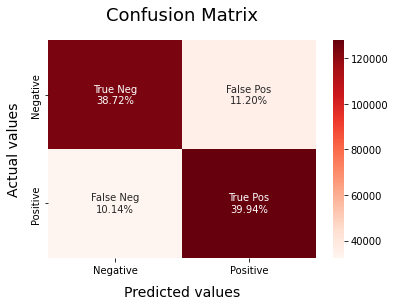

In [ ]:
model_Evaluate(model)

### Plots

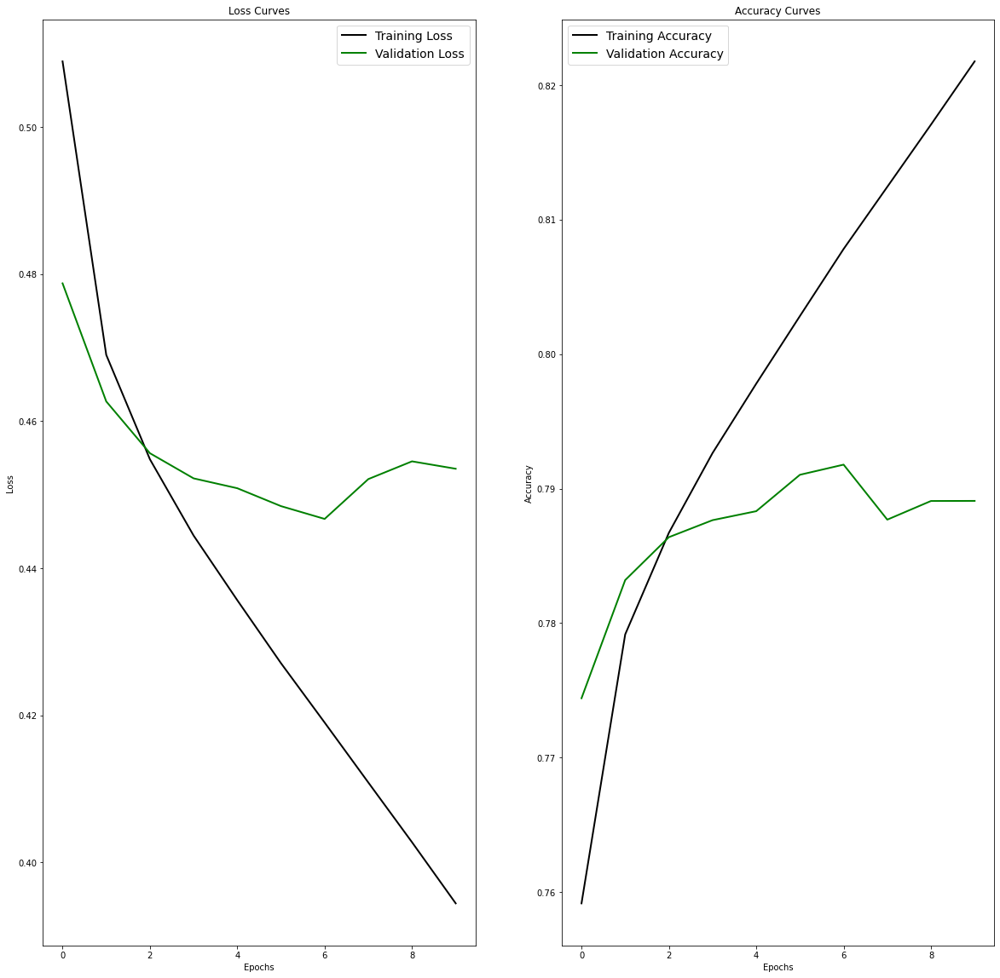

In [ ]:
fig, ax = plt.subplots(nrows = 1, ncols = 2,figsize = (20, 20))
ax[0].plot(history.history['loss'], 'black', linewidth=2.0)
ax[0].plot(history.history['val_loss'], 'green', linewidth=2.0)
ax[0].legend(['Training Loss', 'Validation Loss'], fontsize=14)
ax[0].set(xlabel= 'Epochs'
            , ylabel= 'Loss'
            , title= 'Loss Curves');
ax[1].plot(history.history['acc'], 'black', linewidth=2.0)
ax[1].plot(history.history['val_acc'], 'green', linewidth=2.0)
ax[1].legend(['Training Accuracy' , 'Validation Accuracy'], fontsize=14)
ax[1].set(xlabel= 'Epochs'
            , ylabel= 'Accuracy'
            , title= 'Accuracy Curves');

# Creting Network (Bidirectional lstm)

In [ ]:
model2 = Sequential()
model2.add(embedding_layer)
model2.add(Bidirectional(LSTM(150)))
model2.add(Dense(3, activation='relu', kernel_regularizer=regularizers.l2(1e-2)))
model2.add(Dense(1, activation = "sigmoid"))

optimizer = tensorflow.keras.optimizers.Adam()

model2.compile(optimizer= optimizer,loss='binary_crossentropy', metrics=['acc'])

In [ ]:
model2.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 embedding (Embedding)       (None, 40, 300)           115936200 
                                                                 
 bidirectional (Bidirectiona  (None, 300)              541200    
 l)                                                              
                                                                 
 dense_2 (Dense)             (None, 3)                 903       
                                                                 
 dense_3 (Dense)             (None, 1)                 4         
                                                                 
Total params: 116,478,307
Trainable params: 542,107
Non-trainable params: 115,936,200
_________________________________________________________________


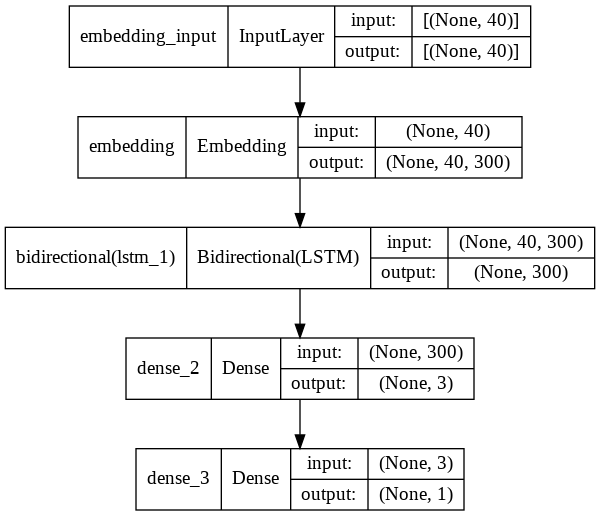

In [ ]:
from tensorflow.keras.utils import plot_model
plot_model(model2, show_shapes=True, show_layer_names=True, to_file='model3.png')
from IPython.display import Image
Image(retina=True, filename='model3.png')

## Training Netowrk

In [ ]:
tensorboard = TensorBoard(log_dir = "logs/{}".format(time()))
history2 = model2.fit(X_train, y_train, epochs=10,batch_size=1024,validation_data=(X_valid, y_valid), callbacks=[checkpoint, reduce_lr, tensorboard])

Epoch 1/10


   1/1000 [..............................] - ETA: 1:27:42 - loss: 0.7533 - acc: 0.5137WARNING:tensorflow:Can save best model only with val_acc available, skipping.


   2/1000 [..............................] - ETA: 2:54 - loss: 0.7515 - acc: 0.5112   WARNING:tensorflow:Can save best model only with val_acc available, skipping.


   3/1000 [..............................] - ETA: 2:46 - loss: 0.7489 - acc: 0.5081WARNING:tensorflow:Can save best model only with val_acc available, skipping.


   4/1000 [..............................] - ETA: 2:40 - loss: 0.7457 - acc: 0.5098WARNING:tensorflow:Can save best model only with val_acc available, skipping.


   5/1000 [..............................] - ETA: 2:32 - loss: 0.7436 - acc: 0.5066WARNING:tensorflow:Can save best model only with val_acc available, skipping.


   6/1000 [..............................] - ETA: 2:26 - loss: 0.7410 - acc: 0.5015WARNING:tensorflow:Can save best model only with val_acc available, skipping.


   7/1000 [..............................] - ETA: 2:23 - loss: 0.7380 - acc: 0.5024WARNING:tensorflow:Can save best model only with val_acc available, skipping.


   8/1000 [..............................] - ETA: 2:21 - loss: 0.7356 - acc: 0.5066WARNING:tensorflow:Can save best model only with val_acc available, skipping.


   9/1000 [..............................] - ETA: 2:20 - loss: 0.7322 - acc: 0.5216WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  10/1000 [..............................] - ETA: 2:19 - loss: 0.7298 - acc: 0.5327WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  11/1000 [..............................] - ETA: 2:18 - loss: 0.7274 - acc: 0.5415WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  12/1000 [..............................] - ETA: 2:16 - loss: 0.7248 - acc: 0.5532WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  13/1000 [..............................] - ETA: 2:15 - loss: 0.7224 - acc: 0.5624WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  14/1000 [..............................] - ETA: 2:14 - loss: 0.7188 - acc: 0.5716WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  15/1000 [..............................] - ETA: 2:14 - loss: 0.7165 - acc: 0.5775WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  16/1000 [..............................] - ETA: 2:13 - loss: 0.7139 - acc: 0.5837WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  17/1000 [..............................] - ETA: 2:12 - loss: 0.7117 - acc: 0.5894WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  18/1000 [..............................] - ETA: 2:12 - loss: 0.7091 - acc: 0.5967WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  19/1000 [..............................] - ETA: 2:11 - loss: 0.7074 - acc: 0.6010WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  20/1000 [..............................] - ETA: 2:11 - loss: 0.7054 - acc: 0.6055WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  21/1000 [..............................] - ETA: 2:10 - loss: 0.7036 - acc: 0.6100WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  22/1000 [..............................] - ETA: 2:10 - loss: 0.7015 - acc: 0.6144WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  23/1000 [..............................] - ETA: 2:10 - loss: 0.6992 - acc: 0.6189WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  24/1000 [..............................] - ETA: 2:09 - loss: 0.6978 - acc: 0.6230WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  25/1000 [..............................] - ETA: 2:09 - loss: 0.6957 - acc: 0.6271WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  26/1000 [..............................] - ETA: 2:09 - loss: 0.6932 - acc: 0.6313WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  27/1000 [..............................] - ETA: 2:08 - loss: 0.6916 - acc: 0.6341WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  28/1000 [..............................] - ETA: 2:08 - loss: 0.6918 - acc: 0.6360WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  29/1000 [..............................] - ETA: 2:08 - loss: 0.6903 - acc: 0.6383WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  30/1000 [..............................] - ETA: 2:08 - loss: 0.6896 - acc: 0.6412WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  31/1000 [..............................] - ETA: 2:07 - loss: 0.6885 - acc: 0.6433WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  32/1000 [..............................] - ETA: 2:07 - loss: 0.6872 - acc: 0.6452WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  33/1000 [..............................] - ETA: 2:07 - loss: 0.6861 - acc: 0.6474WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  34/1000 [>.............................] - ETA: 2:07 - loss: 0.6853 - acc: 0.6487WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  35/1000 [>.............................] - ETA: 2:06 - loss: 0.6839 - acc: 0.6503WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  36/1000 [>.............................] - ETA: 2:06 - loss: 0.6827 - acc: 0.6523WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  37/1000 [>.............................] - ETA: 2:06 - loss: 0.6813 - acc: 0.6541WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  38/1000 [>.............................] - ETA: 2:06 - loss: 0.6803 - acc: 0.6553WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  39/1000 [>.............................] - ETA: 2:06 - loss: 0.6793 - acc: 0.6569WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  40/1000 [>.............................] - ETA: 2:05 - loss: 0.6777 - acc: 0.6586WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  41/1000 [>.............................] - ETA: 2:05 - loss: 0.6770 - acc: 0.6599WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  42/1000 [>.............................] - ETA: 2:05 - loss: 0.6759 - acc: 0.6610WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  43/1000 [>.............................] - ETA: 2:05 - loss: 0.6751 - acc: 0.6625WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  44/1000 [>.............................] - ETA: 2:04 - loss: 0.6739 - acc: 0.6641WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  45/1000 [>.............................] - ETA: 2:04 - loss: 0.6731 - acc: 0.6655WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  46/1000 [>.............................] - ETA: 2:04 - loss: 0.6722 - acc: 0.6668WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  47/1000 [>.............................] - ETA: 2:04 - loss: 0.6712 - acc: 0.6683WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  48/1000 [>.............................] - ETA: 2:04 - loss: 0.6705 - acc: 0.6689WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  49/1000 [>.............................] - ETA: 2:04 - loss: 0.6696 - acc: 0.6701WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  50/1000 [>.............................] - ETA: 2:03 - loss: 0.6689 - acc: 0.6708WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  51/1000 [>.............................] - ETA: 2:03 - loss: 0.6680 - acc: 0.6719WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  52/1000 [>.............................] - ETA: 2:03 - loss: 0.6669 - acc: 0.6730WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  53/1000 [>.............................] - ETA: 2:03 - loss: 0.6659 - acc: 0.6742WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  54/1000 [>.............................] - ETA: 2:03 - loss: 0.6647 - acc: 0.6755WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  55/1000 [>.............................] - ETA: 2:03 - loss: 0.6639 - acc: 0.6765WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  56/1000 [>.............................] - ETA: 2:02 - loss: 0.6629 - acc: 0.6777WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  57/1000 [>.............................] - ETA: 2:02 - loss: 0.6619 - acc: 0.6785WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  58/1000 [>.............................] - ETA: 2:02 - loss: 0.6612 - acc: 0.6790WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  59/1000 [>.............................] - ETA: 2:02 - loss: 0.6602 - acc: 0.6801WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  60/1000 [>.............................] - ETA: 2:02 - loss: 0.6593 - acc: 0.6809WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  61/1000 [>.............................] - ETA: 2:02 - loss: 0.6581 - acc: 0.6817WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  62/1000 [>.............................] - ETA: 2:01 - loss: 0.6571 - acc: 0.6824WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  63/1000 [>.............................] - ETA: 2:01 - loss: 0.6563 - acc: 0.6831WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  64/1000 [>.............................] - ETA: 2:01 - loss: 0.6552 - acc: 0.6841WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  65/1000 [>.............................] - ETA: 2:01 - loss: 0.6544 - acc: 0.6846WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  66/1000 [>.............................] - ETA: 2:01 - loss: 0.6534 - acc: 0.6853WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  67/1000 [=>............................] - ETA: 2:01 - loss: 0.6525 - acc: 0.6858WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  68/1000 [=>............................] - ETA: 2:01 - loss: 0.6514 - acc: 0.6865WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  69/1000 [=>............................] - ETA: 2:00 - loss: 0.6506 - acc: 0.6870WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  70/1000 [=>............................] - ETA: 2:00 - loss: 0.6495 - acc: 0.6879WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  71/1000 [=>............................] - ETA: 2:00 - loss: 0.6485 - acc: 0.6888WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  72/1000 [=>............................] - ETA: 2:00 - loss: 0.6477 - acc: 0.6893WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  73/1000 [=>............................] - ETA: 2:00 - loss: 0.6470 - acc: 0.6897WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  74/1000 [=>............................] - ETA: 2:00 - loss: 0.6462 - acc: 0.6903WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  75/1000 [=>............................] - ETA: 2:00 - loss: 0.6451 - acc: 0.6910WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  76/1000 [=>............................] - ETA: 2:00 - loss: 0.6443 - acc: 0.6915WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  77/1000 [=>............................] - ETA: 1:59 - loss: 0.6436 - acc: 0.6917WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  78/1000 [=>............................] - ETA: 1:59 - loss: 0.6424 - acc: 0.6924WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  79/1000 [=>............................] - ETA: 1:59 - loss: 0.6415 - acc: 0.6930WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  80/1000 [=>............................] - ETA: 1:59 - loss: 0.6405 - acc: 0.6935WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  81/1000 [=>............................] - ETA: 1:59 - loss: 0.6397 - acc: 0.6941WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  82/1000 [=>............................] - ETA: 1:59 - loss: 0.6388 - acc: 0.6946WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  83/1000 [=>............................] - ETA: 1:59 - loss: 0.6378 - acc: 0.6952WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  84/1000 [=>............................] - ETA: 1:58 - loss: 0.6371 - acc: 0.6956WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  85/1000 [=>............................] - ETA: 1:58 - loss: 0.6360 - acc: 0.6963WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  86/1000 [=>............................] - ETA: 1:58 - loss: 0.6352 - acc: 0.6967WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  87/1000 [=>............................] - ETA: 1:58 - loss: 0.6343 - acc: 0.6973WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  88/1000 [=>............................] - ETA: 1:58 - loss: 0.6335 - acc: 0.6977WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  89/1000 [=>............................] - ETA: 1:58 - loss: 0.6326 - acc: 0.6980WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  90/1000 [=>............................] - ETA: 1:58 - loss: 0.6318 - acc: 0.6985WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  91/1000 [=>............................] - ETA: 1:57 - loss: 0.6309 - acc: 0.6989WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  92/1000 [=>............................] - ETA: 1:57 - loss: 0.6302 - acc: 0.6991WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  93/1000 [=>............................] - ETA: 1:57 - loss: 0.6294 - acc: 0.6995WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  94/1000 [=>............................] - ETA: 1:57 - loss: 0.6288 - acc: 0.6999WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  95/1000 [=>............................] - ETA: 1:57 - loss: 0.6280 - acc: 0.7001WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  96/1000 [=>............................] - ETA: 1:57 - loss: 0.6272 - acc: 0.7004WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  97/1000 [=>............................] - ETA: 1:57 - loss: 0.6264 - acc: 0.7008WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  98/1000 [=>............................] - ETA: 1:57 - loss: 0.6255 - acc: 0.7014WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  99/1000 [=>............................] - ETA: 1:56 - loss: 0.6248 - acc: 0.7017WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 100/1000 [==>...........................] - ETA: 1:56 - loss: 0.6239 - acc: 0.7022WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 101/1000 [==>...........................] - ETA: 1:56 - loss: 0.6231 - acc: 0.7026WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 102/1000 [==>...........................] - ETA: 1:56 - loss: 0.6224 - acc: 0.7030WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 103/1000 [==>...........................] - ETA: 1:56 - loss: 0.6219 - acc: 0.7032WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 104/1000 [==>...........................] - ETA: 1:56 - loss: 0.6212 - acc: 0.7036WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 105/1000 [==>...........................] - ETA: 1:56 - loss: 0.6204 - acc: 0.7040WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 106/1000 [==>...........................] - ETA: 1:55 - loss: 0.6197 - acc: 0.7044WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 107/1000 [==>...........................] - ETA: 1:55 - loss: 0.6189 - acc: 0.7048WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 108/1000 [==>...........................] - ETA: 1:55 - loss: 0.6181 - acc: 0.7054WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 109/1000 [==>...........................] - ETA: 1:55 - loss: 0.6177 - acc: 0.7056WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 110/1000 [==>...........................] - ETA: 1:55 - loss: 0.6167 - acc: 0.7062WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 111/1000 [==>...........................] - ETA: 1:55 - loss: 0.6162 - acc: 0.7063WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 112/1000 [==>...........................] - ETA: 1:55 - loss: 0.6156 - acc: 0.7067WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 113/1000 [==>...........................] - ETA: 1:54 - loss: 0.6150 - acc: 0.7071WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 114/1000 [==>...........................] - ETA: 1:54 - loss: 0.6141 - acc: 0.7077WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 115/1000 [==>...........................] - ETA: 1:54 - loss: 0.6136 - acc: 0.7081WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 116/1000 [==>...........................] - ETA: 1:54 - loss: 0.6129 - acc: 0.7084WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 117/1000 [==>...........................] - ETA: 1:54 - loss: 0.6124 - acc: 0.7086WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 118/1000 [==>...........................] - ETA: 1:54 - loss: 0.6119 - acc: 0.7087WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 119/1000 [==>...........................] - ETA: 1:53 - loss: 0.6114 - acc: 0.7090WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 120/1000 [==>...........................] - ETA: 1:53 - loss: 0.6110 - acc: 0.7093WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 121/1000 [==>...........................] - ETA: 1:53 - loss: 0.6102 - acc: 0.7098WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 122/1000 [==>...........................] - ETA: 1:53 - loss: 0.6096 - acc: 0.7101WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 123/1000 [==>...........................] - ETA: 1:53 - loss: 0.6091 - acc: 0.7104WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 124/1000 [==>...........................] - ETA: 1:53 - loss: 0.6086 - acc: 0.7106WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 125/1000 [==>...........................] - ETA: 1:53 - loss: 0.6078 - acc: 0.7111WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 126/1000 [==>...........................] - ETA: 1:53 - loss: 0.6073 - acc: 0.7112WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 127/1000 [==>...........................] - ETA: 1:53 - loss: 0.6068 - acc: 0.7114WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 128/1000 [==>...........................] - ETA: 1:52 - loss: 0.6064 - acc: 0.7117WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 129/1000 [==>...........................] - ETA: 1:52 - loss: 0.6056 - acc: 0.7121WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 130/1000 [==>...........................] - ETA: 1:52 - loss: 0.6051 - acc: 0.7123WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 131/1000 [==>...........................] - ETA: 1:52 - loss: 0.6048 - acc: 0.7123WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 132/1000 [==>...........................] - ETA: 1:52 - loss: 0.6042 - acc: 0.7127WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 133/1000 [==>...........................] - ETA: 1:52 - loss: 0.6036 - acc: 0.7129WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 134/1000 [===>..........................] - ETA: 1:52 - loss: 0.6033 - acc: 0.7131WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 135/1000 [===>..........................] - ETA: 1:52 - loss: 0.6027 - acc: 0.7135WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 136/1000 [===>..........................] - ETA: 1:51 - loss: 0.6021 - acc: 0.7139WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 137/1000 [===>..........................] - ETA: 1:51 - loss: 0.6014 - acc: 0.7143WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 138/1000 [===>..........................] - ETA: 1:51 - loss: 0.6008 - acc: 0.7146WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 139/1000 [===>..........................] - ETA: 1:51 - loss: 0.6005 - acc: 0.7147WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 140/1000 [===>..........................] - ETA: 1:51 - loss: 0.6001 - acc: 0.7149WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 141/1000 [===>..........................] - ETA: 1:51 - loss: 0.5995 - acc: 0.7152WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 142/1000 [===>..........................] - ETA: 1:51 - loss: 0.5991 - acc: 0.7153WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 143/1000 [===>..........................] - ETA: 1:51 - loss: 0.5985 - acc: 0.7156WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 144/1000 [===>..........................] - ETA: 1:50 - loss: 0.5982 - acc: 0.7158WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 145/1000 [===>..........................] - ETA: 1:50 - loss: 0.5979 - acc: 0.7160WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 146/1000 [===>..........................] - ETA: 1:50 - loss: 0.5976 - acc: 0.7161WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 147/1000 [===>..........................] - ETA: 1:50 - loss: 0.5971 - acc: 0.7164WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 148/1000 [===>..........................] - ETA: 1:50 - loss: 0.5967 - acc: 0.7165WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 149/1000 [===>..........................] - ETA: 1:50 - loss: 0.5964 - acc: 0.7166WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 150/1000 [===>..........................] - ETA: 1:50 - loss: 0.5960 - acc: 0.7168WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 151/1000 [===>..........................] - ETA: 1:50 - loss: 0.5956 - acc: 0.7170WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 152/1000 [===>..........................] - ETA: 1:49 - loss: 0.5952 - acc: 0.7172WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 153/1000 [===>..........................] - ETA: 1:49 - loss: 0.5948 - acc: 0.7173WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 154/1000 [===>..........................] - ETA: 1:49 - loss: 0.5945 - acc: 0.7173WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 155/1000 [===>..........................] - ETA: 1:49 - loss: 0.5940 - acc: 0.7175WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 156/1000 [===>..........................] - ETA: 1:49 - loss: 0.5938 - acc: 0.7176WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 157/1000 [===>..........................] - ETA: 1:49 - loss: 0.5934 - acc: 0.7177WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 158/1000 [===>..........................] - ETA: 1:49 - loss: 0.5930 - acc: 0.7179WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 159/1000 [===>..........................] - ETA: 1:49 - loss: 0.5925 - acc: 0.7183WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 160/1000 [===>..........................] - ETA: 1:48 - loss: 0.5920 - acc: 0.7185WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 161/1000 [===>..........................] - ETA: 1:48 - loss: 0.5916 - acc: 0.7187WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 162/1000 [===>..........................] - ETA: 1:48 - loss: 0.5912 - acc: 0.7189WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 163/1000 [===>..........................] - ETA: 1:48 - loss: 0.5910 - acc: 0.7188WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 164/1000 [===>..........................] - ETA: 1:48 - loss: 0.5907 - acc: 0.7189WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 165/1000 [===>..........................] - ETA: 1:48 - loss: 0.5902 - acc: 0.7192WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 166/1000 [===>..........................] - ETA: 1:48 - loss: 0.5898 - acc: 0.7194WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 167/1000 [====>.........................] - ETA: 1:47 - loss: 0.5895 - acc: 0.7195WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 168/1000 [====>.........................] - ETA: 1:47 - loss: 0.5891 - acc: 0.7197WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 169/1000 [====>.........................] - ETA: 1:47 - loss: 0.5888 - acc: 0.7199WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 170/1000 [====>.........................] - ETA: 1:47 - loss: 0.5884 - acc: 0.7201WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 171/1000 [====>.........................] - ETA: 1:47 - loss: 0.5881 - acc: 0.7202WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 172/1000 [====>.........................] - ETA: 1:47 - loss: 0.5875 - acc: 0.7206WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 173/1000 [====>.........................] - ETA: 1:47 - loss: 0.5871 - acc: 0.7208WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 174/1000 [====>.........................] - ETA: 1:47 - loss: 0.5868 - acc: 0.7209WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 175/1000 [====>.........................] - ETA: 1:46 - loss: 0.5864 - acc: 0.7210WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 176/1000 [====>.........................] - ETA: 1:46 - loss: 0.5861 - acc: 0.7212WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 177/1000 [====>.........................] - ETA: 1:46 - loss: 0.5857 - acc: 0.7215WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 178/1000 [====>.........................] - ETA: 1:46 - loss: 0.5852 - acc: 0.7217WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 179/1000 [====>.........................] - ETA: 1:46 - loss: 0.5847 - acc: 0.7220WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 180/1000 [====>.........................] - ETA: 1:46 - loss: 0.5845 - acc: 0.7220WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 181/1000 [====>.........................] - ETA: 1:46 - loss: 0.5841 - acc: 0.7223WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 182/1000 [====>.........................] - ETA: 1:46 - loss: 0.5837 - acc: 0.7224WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 183/1000 [====>.........................] - ETA: 1:46 - loss: 0.5835 - acc: 0.7226WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 184/1000 [====>.........................] - ETA: 1:45 - loss: 0.5831 - acc: 0.7227WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 185/1000 [====>.........................] - ETA: 1:45 - loss: 0.5828 - acc: 0.7229WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 186/1000 [====>.........................] - ETA: 1:45 - loss: 0.5824 - acc: 0.7231WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 187/1000 [====>.........................] - ETA: 1:45 - loss: 0.5819 - acc: 0.7233WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 188/1000 [====>.........................] - ETA: 1:45 - loss: 0.5817 - acc: 0.7233WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 189/1000 [====>.........................] - ETA: 1:45 - loss: 0.5814 - acc: 0.7235WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 190/1000 [====>.........................] - ETA: 1:45 - loss: 0.5810 - acc: 0.7236WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 191/1000 [====>.........................] - ETA: 1:45 - loss: 0.5807 - acc: 0.7239WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 192/1000 [====>.........................] - ETA: 1:44 - loss: 0.5803 - acc: 0.7241WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 193/1000 [====>.........................] - ETA: 1:44 - loss: 0.5800 - acc: 0.7241WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 194/1000 [====>.........................] - ETA: 1:44 - loss: 0.5796 - acc: 0.7244WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 195/1000 [====>.........................] - ETA: 1:44 - loss: 0.5793 - acc: 0.7245WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 196/1000 [====>.........................] - ETA: 1:44 - loss: 0.5791 - acc: 0.7247WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 197/1000 [====>.........................] - ETA: 1:44 - loss: 0.5788 - acc: 0.7248WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 198/1000 [====>.........................] - ETA: 1:44 - loss: 0.5785 - acc: 0.7250WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 199/1000 [====>.........................] - ETA: 1:43 - loss: 0.5782 - acc: 0.7252WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 200/1000 [=====>........................] - ETA: 1:43 - loss: 0.5779 - acc: 0.7254WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 201/1000 [=====>........................] - ETA: 1:43 - loss: 0.5776 - acc: 0.7255WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 202/1000 [=====>........................] - ETA: 1:43 - loss: 0.5774 - acc: 0.7256WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 203/1000 [=====>........................] - ETA: 1:43 - loss: 0.5771 - acc: 0.7257WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 204/1000 [=====>........................] - ETA: 1:43 - loss: 0.5767 - acc: 0.7258WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 205/1000 [=====>........................] - ETA: 1:43 - loss: 0.5765 - acc: 0.7259WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 206/1000 [=====>........................] - ETA: 1:43 - loss: 0.5761 - acc: 0.7261WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 207/1000 [=====>........................] - ETA: 1:42 - loss: 0.5758 - acc: 0.7263WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 208/1000 [=====>........................] - ETA: 1:42 - loss: 0.5757 - acc: 0.7263WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 209/1000 [=====>........................] - ETA: 1:42 - loss: 0.5754 - acc: 0.7264WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 210/1000 [=====>........................] - ETA: 1:42 - loss: 0.5751 - acc: 0.7267WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 211/1000 [=====>........................] - ETA: 1:42 - loss: 0.5747 - acc: 0.7269WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 212/1000 [=====>........................] - ETA: 1:42 - loss: 0.5746 - acc: 0.7270WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 213/1000 [=====>........................] - ETA: 1:42 - loss: 0.5743 - acc: 0.7271WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 214/1000 [=====>........................] - ETA: 1:42 - loss: 0.5740 - acc: 0.7273WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 215/1000 [=====>........................] - ETA: 1:41 - loss: 0.5737 - acc: 0.7274WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 216/1000 [=====>........................] - ETA: 1:41 - loss: 0.5734 - acc: 0.7277WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 217/1000 [=====>........................] - ETA: 1:41 - loss: 0.5731 - acc: 0.7278WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 218/1000 [=====>........................] - ETA: 1:41 - loss: 0.5729 - acc: 0.7280WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 219/1000 [=====>........................] - ETA: 1:41 - loss: 0.5726 - acc: 0.7281WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 220/1000 [=====>........................] - ETA: 1:41 - loss: 0.5722 - acc: 0.7284WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 221/1000 [=====>........................] - ETA: 1:41 - loss: 0.5720 - acc: 0.7284WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 222/1000 [=====>........................] - ETA: 1:40 - loss: 0.5717 - acc: 0.7286WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 223/1000 [=====>........................] - ETA: 1:40 - loss: 0.5714 - acc: 0.7288WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 224/1000 [=====>........................] - ETA: 1:40 - loss: 0.5711 - acc: 0.7289WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 225/1000 [=====>........................] - ETA: 1:40 - loss: 0.5708 - acc: 0.7291WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 226/1000 [=====>........................] - ETA: 1:40 - loss: 0.5705 - acc: 0.7292WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 227/1000 [=====>........................] - ETA: 1:40 - loss: 0.5704 - acc: 0.7293WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 228/1000 [=====>........................] - ETA: 1:40 - loss: 0.5701 - acc: 0.7294WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 229/1000 [=====>........................] - ETA: 1:40 - loss: 0.5699 - acc: 0.7296WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 230/1000 [=====>........................] - ETA: 1:39 - loss: 0.5696 - acc: 0.7297WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 231/1000 [=====>........................] - ETA: 1:39 - loss: 0.5694 - acc: 0.7298WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 232/1000 [=====>........................] - ETA: 1:39 - loss: 0.5693 - acc: 0.7298WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 233/1000 [=====>........................] - ETA: 1:39 - loss: 0.5691 - acc: 0.7299WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 234/1000 [======>.......................] - ETA: 1:39 - loss: 0.5689 - acc: 0.7300WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 235/1000 [======>.......................] - ETA: 1:39 - loss: 0.5686 - acc: 0.7301WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 236/1000 [======>.......................] - ETA: 1:39 - loss: 0.5683 - acc: 0.7303WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 237/1000 [======>.......................] - ETA: 1:38 - loss: 0.5681 - acc: 0.7304WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 238/1000 [======>.......................] - ETA: 1:38 - loss: 0.5680 - acc: 0.7304WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 239/1000 [======>.......................] - ETA: 1:38 - loss: 0.5678 - acc: 0.7306WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 240/1000 [======>.......................] - ETA: 1:38 - loss: 0.5676 - acc: 0.7307WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 241/1000 [======>.......................] - ETA: 1:38 - loss: 0.5674 - acc: 0.7308WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 242/1000 [======>.......................] - ETA: 1:38 - loss: 0.5672 - acc: 0.7309WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 243/1000 [======>.......................] - ETA: 1:38 - loss: 0.5670 - acc: 0.7310WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 244/1000 [======>.......................] - ETA: 1:37 - loss: 0.5667 - acc: 0.7311WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 245/1000 [======>.......................] - ETA: 1:37 - loss: 0.5665 - acc: 0.7312WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 246/1000 [======>.......................] - ETA: 1:37 - loss: 0.5663 - acc: 0.7314WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 247/1000 [======>.......................] - ETA: 1:37 - loss: 0.5661 - acc: 0.7315WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 248/1000 [======>.......................] - ETA: 1:37 - loss: 0.5660 - acc: 0.7315WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 249/1000 [======>.......................] - ETA: 1:37 - loss: 0.5658 - acc: 0.7316WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 250/1000 [======>.......................] - ETA: 1:37 - loss: 0.5655 - acc: 0.7317WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 251/1000 [======>.......................] - ETA: 1:37 - loss: 0.5653 - acc: 0.7319WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 252/1000 [======>.......................] - ETA: 1:36 - loss: 0.5651 - acc: 0.7320WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 253/1000 [======>.......................] - ETA: 1:36 - loss: 0.5648 - acc: 0.7321WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 254/1000 [======>.......................] - ETA: 1:36 - loss: 0.5645 - acc: 0.7324WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 255/1000 [======>.......................] - ETA: 1:36 - loss: 0.5642 - acc: 0.7325WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 256/1000 [======>.......................] - ETA: 1:36 - loss: 0.5641 - acc: 0.7324WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 257/1000 [======>.......................] - ETA: 1:36 - loss: 0.5639 - acc: 0.7326WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 258/1000 [======>.......................] - ETA: 1:36 - loss: 0.5638 - acc: 0.7326WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 259/1000 [======>.......................] - ETA: 1:36 - loss: 0.5636 - acc: 0.7327WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 260/1000 [======>.......................] - ETA: 1:35 - loss: 0.5634 - acc: 0.7329WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 261/1000 [======>.......................] - ETA: 1:35 - loss: 0.5632 - acc: 0.7330WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 262/1000 [======>.......................] - ETA: 1:35 - loss: 0.5630 - acc: 0.7331WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 263/1000 [======>.......................] - ETA: 1:35 - loss: 0.5629 - acc: 0.7331WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 264/1000 [======>.......................] - ETA: 1:35 - loss: 0.5627 - acc: 0.7332WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 265/1000 [======>.......................] - ETA: 1:35 - loss: 0.5624 - acc: 0.7334WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 266/1000 [======>.......................] - ETA: 1:35 - loss: 0.5622 - acc: 0.7335WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 267/1000 [=======>......................] - ETA: 1:35 - loss: 0.5620 - acc: 0.7336WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 268/1000 [=======>......................] - ETA: 1:34 - loss: 0.5617 - acc: 0.7337WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 269/1000 [=======>......................] - ETA: 1:34 - loss: 0.5615 - acc: 0.7338WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 270/1000 [=======>......................] - ETA: 1:34 - loss: 0.5614 - acc: 0.7339WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 271/1000 [=======>......................] - ETA: 1:34 - loss: 0.5612 - acc: 0.7339WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 272/1000 [=======>......................] - ETA: 1:34 - loss: 0.5611 - acc: 0.7340WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 273/1000 [=======>......................] - ETA: 1:34 - loss: 0.5609 - acc: 0.7340WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 274/1000 [=======>......................] - ETA: 1:34 - loss: 0.5607 - acc: 0.7341WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 275/1000 [=======>......................] - ETA: 1:34 - loss: 0.5605 - acc: 0.7342WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 276/1000 [=======>......................] - ETA: 1:33 - loss: 0.5604 - acc: 0.7342WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 277/1000 [=======>......................] - ETA: 1:33 - loss: 0.5602 - acc: 0.7343WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 278/1000 [=======>......................] - ETA: 1:33 - loss: 0.5600 - acc: 0.7344WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 279/1000 [=======>......................] - ETA: 1:33 - loss: 0.5598 - acc: 0.7345WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 280/1000 [=======>......................] - ETA: 1:33 - loss: 0.5595 - acc: 0.7347WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 281/1000 [=======>......................] - ETA: 1:33 - loss: 0.5594 - acc: 0.7346WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 282/1000 [=======>......................] - ETA: 1:33 - loss: 0.5593 - acc: 0.7347WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 283/1000 [=======>......................] - ETA: 1:33 - loss: 0.5591 - acc: 0.7347WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 284/1000 [=======>......................] - ETA: 1:32 - loss: 0.5589 - acc: 0.7348WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 285/1000 [=======>......................] - ETA: 1:32 - loss: 0.5587 - acc: 0.7349WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 286/1000 [=======>......................] - ETA: 1:32 - loss: 0.5585 - acc: 0.7351WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 287/1000 [=======>......................] - ETA: 1:32 - loss: 0.5584 - acc: 0.7351WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 288/1000 [=======>......................] - ETA: 1:32 - loss: 0.5581 - acc: 0.7352WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 289/1000 [=======>......................] - ETA: 1:32 - loss: 0.5578 - acc: 0.7354WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 290/1000 [=======>......................] - ETA: 1:32 - loss: 0.5576 - acc: 0.7355WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 291/1000 [=======>......................] - ETA: 1:32 - loss: 0.5573 - acc: 0.7356WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 292/1000 [=======>......................] - ETA: 1:31 - loss: 0.5572 - acc: 0.7356WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 293/1000 [=======>......................] - ETA: 1:31 - loss: 0.5570 - acc: 0.7358WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 294/1000 [=======>......................] - ETA: 1:31 - loss: 0.5569 - acc: 0.7358WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 295/1000 [=======>......................] - ETA: 1:31 - loss: 0.5568 - acc: 0.7358WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 296/1000 [=======>......................] - ETA: 1:31 - loss: 0.5566 - acc: 0.7359WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 297/1000 [=======>......................] - ETA: 1:31 - loss: 0.5564 - acc: 0.7361WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 298/1000 [=======>......................] - ETA: 1:31 - loss: 0.5562 - acc: 0.7362WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 299/1000 [=======>......................] - ETA: 1:30 - loss: 0.5561 - acc: 0.7362WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 300/1000 [========>.....................] - ETA: 1:30 - loss: 0.5560 - acc: 0.7363WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 301/1000 [========>.....................] - ETA: 1:30 - loss: 0.5559 - acc: 0.7363WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 302/1000 [========>.....................] - ETA: 1:30 - loss: 0.5557 - acc: 0.7364WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 303/1000 [========>.....................] - ETA: 1:30 - loss: 0.5555 - acc: 0.7365WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 304/1000 [========>.....................] - ETA: 1:30 - loss: 0.5554 - acc: 0.7365WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 305/1000 [========>.....................] - ETA: 1:30 - loss: 0.5552 - acc: 0.7367WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 306/1000 [========>.....................] - ETA: 1:30 - loss: 0.5550 - acc: 0.7368WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 307/1000 [========>.....................] - ETA: 1:29 - loss: 0.5549 - acc: 0.7368WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 308/1000 [========>.....................] - ETA: 1:29 - loss: 0.5548 - acc: 0.7368WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 309/1000 [========>.....................] - ETA: 1:29 - loss: 0.5547 - acc: 0.7368WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 310/1000 [========>.....................] - ETA: 1:29 - loss: 0.5545 - acc: 0.7369WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 311/1000 [========>.....................] - ETA: 1:29 - loss: 0.5545 - acc: 0.7369WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 312/1000 [========>.....................] - ETA: 1:29 - loss: 0.5544 - acc: 0.7369WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 313/1000 [========>.....................] - ETA: 1:29 - loss: 0.5543 - acc: 0.7369WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 314/1000 [========>.....................] - ETA: 1:28 - loss: 0.5541 - acc: 0.7370WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 315/1000 [========>.....................] - ETA: 1:28 - loss: 0.5538 - acc: 0.7371WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 316/1000 [========>.....................] - ETA: 1:28 - loss: 0.5536 - acc: 0.7373WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 317/1000 [========>.....................] - ETA: 1:28 - loss: 0.5535 - acc: 0.7373WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 318/1000 [========>.....................] - ETA: 1:28 - loss: 0.5534 - acc: 0.7373WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 319/1000 [========>.....................] - ETA: 1:28 - loss: 0.5532 - acc: 0.7373WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 320/1000 [========>.....................] - ETA: 1:28 - loss: 0.5531 - acc: 0.7374WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 321/1000 [========>.....................] - ETA: 1:28 - loss: 0.5530 - acc: 0.7374WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 322/1000 [========>.....................] - ETA: 1:27 - loss: 0.5528 - acc: 0.7375WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 323/1000 [========>.....................] - ETA: 1:27 - loss: 0.5527 - acc: 0.7376WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 324/1000 [========>.....................] - ETA: 1:27 - loss: 0.5525 - acc: 0.7377WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 325/1000 [========>.....................] - ETA: 1:27 - loss: 0.5524 - acc: 0.7377WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 326/1000 [========>.....................] - ETA: 1:27 - loss: 0.5523 - acc: 0.7377WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 327/1000 [========>.....................] - ETA: 1:27 - loss: 0.5521 - acc: 0.7378WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 328/1000 [========>.....................] - ETA: 1:27 - loss: 0.5519 - acc: 0.7379WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 329/1000 [========>.....................] - ETA: 1:27 - loss: 0.5518 - acc: 0.7379WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 330/1000 [========>.....................] - ETA: 1:26 - loss: 0.5518 - acc: 0.7379WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 331/1000 [========>.....................] - ETA: 1:26 - loss: 0.5516 - acc: 0.7380WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 332/1000 [========>.....................] - ETA: 1:26 - loss: 0.5515 - acc: 0.7381WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 333/1000 [========>.....................] - ETA: 1:26 - loss: 0.5514 - acc: 0.7381WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 334/1000 [=========>....................] - ETA: 1:26 - loss: 0.5514 - acc: 0.7381WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 335/1000 [=========>....................] - ETA: 1:26 - loss: 0.5512 - acc: 0.7382WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 336/1000 [=========>....................] - ETA: 1:26 - loss: 0.5511 - acc: 0.7382WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 337/1000 [=========>....................] - ETA: 1:25 - loss: 0.5511 - acc: 0.7383WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 338/1000 [=========>....................] - ETA: 1:25 - loss: 0.5509 - acc: 0.7383WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 339/1000 [=========>....................] - ETA: 1:25 - loss: 0.5508 - acc: 0.7383WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 340/1000 [=========>....................] - ETA: 1:25 - loss: 0.5507 - acc: 0.7384WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 341/1000 [=========>....................] - ETA: 1:25 - loss: 0.5505 - acc: 0.7384WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 342/1000 [=========>....................] - ETA: 1:25 - loss: 0.5504 - acc: 0.7386WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 343/1000 [=========>....................] - ETA: 1:25 - loss: 0.5503 - acc: 0.7386WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 344/1000 [=========>....................] - ETA: 1:25 - loss: 0.5502 - acc: 0.7386WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 345/1000 [=========>....................] - ETA: 1:24 - loss: 0.5501 - acc: 0.7386WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 346/1000 [=========>....................] - ETA: 1:24 - loss: 0.5500 - acc: 0.7387WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 347/1000 [=========>....................] - ETA: 1:24 - loss: 0.5498 - acc: 0.7388WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 348/1000 [=========>....................] - ETA: 1:24 - loss: 0.5497 - acc: 0.7388WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 349/1000 [=========>....................] - ETA: 1:24 - loss: 0.5495 - acc: 0.7389WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 350/1000 [=========>....................] - ETA: 1:24 - loss: 0.5494 - acc: 0.7390WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 351/1000 [=========>....................] - ETA: 1:24 - loss: 0.5492 - acc: 0.7391WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 352/1000 [=========>....................] - ETA: 1:23 - loss: 0.5490 - acc: 0.7392WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 353/1000 [=========>....................] - ETA: 1:23 - loss: 0.5488 - acc: 0.7394WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 354/1000 [=========>....................] - ETA: 1:23 - loss: 0.5487 - acc: 0.7395WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 355/1000 [=========>....................] - ETA: 1:23 - loss: 0.5486 - acc: 0.7395WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 356/1000 [=========>....................] - ETA: 1:23 - loss: 0.5484 - acc: 0.7396WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 357/1000 [=========>....................] - ETA: 1:23 - loss: 0.5483 - acc: 0.7397WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 358/1000 [=========>....................] - ETA: 1:23 - loss: 0.5482 - acc: 0.7398WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 359/1000 [=========>....................] - ETA: 1:23 - loss: 0.5480 - acc: 0.7399WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 360/1000 [=========>....................] - ETA: 1:22 - loss: 0.5479 - acc: 0.7400WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 361/1000 [=========>....................] - ETA: 1:22 - loss: 0.5478 - acc: 0.7400WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 362/1000 [=========>....................] - ETA: 1:22 - loss: 0.5476 - acc: 0.7402WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 363/1000 [=========>....................] - ETA: 1:22 - loss: 0.5475 - acc: 0.7403WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 364/1000 [=========>....................] - ETA: 1:22 - loss: 0.5474 - acc: 0.7403WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 365/1000 [=========>....................] - ETA: 1:22 - loss: 0.5472 - acc: 0.7404WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 366/1000 [=========>....................] - ETA: 1:22 - loss: 0.5471 - acc: 0.7405WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 367/1000 [==========>...................] - ETA: 1:22 - loss: 0.5469 - acc: 0.7405WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 368/1000 [==========>...................] - ETA: 1:21 - loss: 0.5468 - acc: 0.7406WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 369/1000 [==========>...................] - ETA: 1:21 - loss: 0.5466 - acc: 0.7407WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 370/1000 [==========>...................] - ETA: 1:21 - loss: 0.5465 - acc: 0.7408WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 371/1000 [==========>...................] - ETA: 1:21 - loss: 0.5464 - acc: 0.7408WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 372/1000 [==========>...................] - ETA: 1:21 - loss: 0.5463 - acc: 0.7408WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 373/1000 [==========>...................] - ETA: 1:21 - loss: 0.5462 - acc: 0.7408WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 374/1000 [==========>...................] - ETA: 1:21 - loss: 0.5461 - acc: 0.7409WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 375/1000 [==========>...................] - ETA: 1:21 - loss: 0.5460 - acc: 0.7409WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 376/1000 [==========>...................] - ETA: 1:20 - loss: 0.5458 - acc: 0.7410WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 377/1000 [==========>...................] - ETA: 1:20 - loss: 0.5456 - acc: 0.7411WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 378/1000 [==========>...................] - ETA: 1:20 - loss: 0.5455 - acc: 0.7411WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 379/1000 [==========>...................] - ETA: 1:20 - loss: 0.5454 - acc: 0.7412WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 380/1000 [==========>...................] - ETA: 1:20 - loss: 0.5452 - acc: 0.7413WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 381/1000 [==========>...................] - ETA: 1:20 - loss: 0.5451 - acc: 0.7414WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 382/1000 [==========>...................] - ETA: 1:20 - loss: 0.5450 - acc: 0.7414WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 383/1000 [==========>...................] - ETA: 1:19 - loss: 0.5449 - acc: 0.7415WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 384/1000 [==========>...................] - ETA: 1:19 - loss: 0.5448 - acc: 0.7415WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 385/1000 [==========>...................] - ETA: 1:19 - loss: 0.5446 - acc: 0.7416WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 386/1000 [==========>...................] - ETA: 1:19 - loss: 0.5445 - acc: 0.7416WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 387/1000 [==========>...................] - ETA: 1:19 - loss: 0.5444 - acc: 0.7417WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 388/1000 [==========>...................] - ETA: 1:19 - loss: 0.5442 - acc: 0.7418WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 389/1000 [==========>...................] - ETA: 1:19 - loss: 0.5441 - acc: 0.7418WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 390/1000 [==========>...................] - ETA: 1:19 - loss: 0.5440 - acc: 0.7419WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 391/1000 [==========>...................] - ETA: 1:18 - loss: 0.5439 - acc: 0.7419WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 392/1000 [==========>...................] - ETA: 1:18 - loss: 0.5438 - acc: 0.7420WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 393/1000 [==========>...................] - ETA: 1:18 - loss: 0.5437 - acc: 0.7420WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 394/1000 [==========>...................] - ETA: 1:18 - loss: 0.5436 - acc: 0.7421WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 395/1000 [==========>...................] - ETA: 1:18 - loss: 0.5435 - acc: 0.7421WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 396/1000 [==========>...................] - ETA: 1:18 - loss: 0.5434 - acc: 0.7422WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 397/1000 [==========>...................] - ETA: 1:18 - loss: 0.5433 - acc: 0.7422WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 398/1000 [==========>...................] - ETA: 1:18 - loss: 0.5432 - acc: 0.7422WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 399/1000 [==========>...................] - ETA: 1:17 - loss: 0.5431 - acc: 0.7423WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 400/1000 [===========>..................] - ETA: 1:17 - loss: 0.5430 - acc: 0.7424WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 401/1000 [===========>..................] - ETA: 1:17 - loss: 0.5430 - acc: 0.7424WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 402/1000 [===========>..................] - ETA: 1:17 - loss: 0.5429 - acc: 0.7424WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 403/1000 [===========>..................] - ETA: 1:17 - loss: 0.5428 - acc: 0.7425WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 404/1000 [===========>..................] - ETA: 1:17 - loss: 0.5427 - acc: 0.7426WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 405/1000 [===========>..................] - ETA: 1:17 - loss: 0.5427 - acc: 0.7425WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 406/1000 [===========>..................] - ETA: 1:16 - loss: 0.5426 - acc: 0.7426WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 407/1000 [===========>..................] - ETA: 1:16 - loss: 0.5425 - acc: 0.7427WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 408/1000 [===========>..................] - ETA: 1:16 - loss: 0.5423 - acc: 0.7428WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 409/1000 [===========>..................] - ETA: 1:16 - loss: 0.5422 - acc: 0.7428WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 410/1000 [===========>..................] - ETA: 1:16 - loss: 0.5420 - acc: 0.7429WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 411/1000 [===========>..................] - ETA: 1:16 - loss: 0.5419 - acc: 0.7430WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 412/1000 [===========>..................] - ETA: 1:16 - loss: 0.5417 - acc: 0.7431WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 413/1000 [===========>..................] - ETA: 1:16 - loss: 0.5417 - acc: 0.7431WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 414/1000 [===========>..................] - ETA: 1:15 - loss: 0.5416 - acc: 0.7431WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 415/1000 [===========>..................] - ETA: 1:15 - loss: 0.5415 - acc: 0.7432WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 416/1000 [===========>..................] - ETA: 1:15 - loss: 0.5414 - acc: 0.7432WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 417/1000 [===========>..................] - ETA: 1:15 - loss: 0.5413 - acc: 0.7432WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 418/1000 [===========>..................] - ETA: 1:15 - loss: 0.5412 - acc: 0.7433WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 419/1000 [===========>..................] - ETA: 1:15 - loss: 0.5411 - acc: 0.7433WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 420/1000 [===========>..................] - ETA: 1:15 - loss: 0.5409 - acc: 0.7434WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 421/1000 [===========>..................] - ETA: 1:15 - loss: 0.5409 - acc: 0.7434WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 422/1000 [===========>..................] - ETA: 1:14 - loss: 0.5408 - acc: 0.7434WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 423/1000 [===========>..................] - ETA: 1:14 - loss: 0.5406 - acc: 0.7435WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 424/1000 [===========>..................] - ETA: 1:14 - loss: 0.5406 - acc: 0.7436WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 425/1000 [===========>..................] - ETA: 1:14 - loss: 0.5405 - acc: 0.7436WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 426/1000 [===========>..................] - ETA: 1:14 - loss: 0.5403 - acc: 0.7437WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 427/1000 [===========>..................] - ETA: 1:14 - loss: 0.5402 - acc: 0.7437WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 428/1000 [===========>..................] - ETA: 1:14 - loss: 0.5401 - acc: 0.7438WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 429/1000 [===========>..................] - ETA: 1:14 - loss: 0.5399 - acc: 0.7439WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 430/1000 [===========>..................] - ETA: 1:13 - loss: 0.5399 - acc: 0.7439WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 431/1000 [===========>..................] - ETA: 1:13 - loss: 0.5397 - acc: 0.7439WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 432/1000 [===========>..................] - ETA: 1:13 - loss: 0.5396 - acc: 0.7440WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 433/1000 [===========>..................] - ETA: 1:13 - loss: 0.5396 - acc: 0.7440WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 434/1000 [============>.................] - ETA: 1:13 - loss: 0.5395 - acc: 0.7440WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 435/1000 [============>.................] - ETA: 1:13 - loss: 0.5394 - acc: 0.7441WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 436/1000 [============>.................] - ETA: 1:13 - loss: 0.5393 - acc: 0.7441WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 437/1000 [============>.................] - ETA: 1:12 - loss: 0.5392 - acc: 0.7442WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 438/1000 [============>.................] - ETA: 1:12 - loss: 0.5391 - acc: 0.7443WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 439/1000 [============>.................] - ETA: 1:12 - loss: 0.5390 - acc: 0.7443WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 440/1000 [============>.................] - ETA: 1:12 - loss: 0.5390 - acc: 0.7444WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 441/1000 [============>.................] - ETA: 1:12 - loss: 0.5388 - acc: 0.7444WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 442/1000 [============>.................] - ETA: 1:12 - loss: 0.5387 - acc: 0.7445WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 443/1000 [============>.................] - ETA: 1:12 - loss: 0.5386 - acc: 0.7445WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 444/1000 [============>.................] - ETA: 1:12 - loss: 0.5385 - acc: 0.7446WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 445/1000 [============>.................] - ETA: 1:11 - loss: 0.5384 - acc: 0.7446WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 446/1000 [============>.................] - ETA: 1:11 - loss: 0.5383 - acc: 0.7446WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 447/1000 [============>.................] - ETA: 1:11 - loss: 0.5382 - acc: 0.7446WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 448/1000 [============>.................] - ETA: 1:11 - loss: 0.5381 - acc: 0.7447WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 449/1000 [============>.................] - ETA: 1:11 - loss: 0.5380 - acc: 0.7448WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 450/1000 [============>.................] - ETA: 1:11 - loss: 0.5379 - acc: 0.7448WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 451/1000 [============>.................] - ETA: 1:11 - loss: 0.5378 - acc: 0.7449WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 452/1000 [============>.................] - ETA: 1:11 - loss: 0.5377 - acc: 0.7449WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 453/1000 [============>.................] - ETA: 1:10 - loss: 0.5377 - acc: 0.7450WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 454/1000 [============>.................] - ETA: 1:10 - loss: 0.5376 - acc: 0.7450WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 455/1000 [============>.................] - ETA: 1:10 - loss: 0.5375 - acc: 0.7450WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 456/1000 [============>.................] - ETA: 1:10 - loss: 0.5374 - acc: 0.7451WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 457/1000 [============>.................] - ETA: 1:10 - loss: 0.5372 - acc: 0.7452WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 458/1000 [============>.................] - ETA: 1:10 - loss: 0.5371 - acc: 0.7453WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 459/1000 [============>.................] - ETA: 1:10 - loss: 0.5370 - acc: 0.7453WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 460/1000 [============>.................] - ETA: 1:10 - loss: 0.5369 - acc: 0.7454WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 461/1000 [============>.................] - ETA: 1:09 - loss: 0.5368 - acc: 0.7454WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 462/1000 [============>.................] - ETA: 1:09 - loss: 0.5368 - acc: 0.7454WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 463/1000 [============>.................] - ETA: 1:09 - loss: 0.5368 - acc: 0.7454WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 464/1000 [============>.................] - ETA: 1:09 - loss: 0.5367 - acc: 0.7454WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 465/1000 [============>.................] - ETA: 1:09 - loss: 0.5367 - acc: 0.7454WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 466/1000 [============>.................] - ETA: 1:09 - loss: 0.5366 - acc: 0.7455WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 467/1000 [=============>................] - ETA: 1:09 - loss: 0.5365 - acc: 0.7455WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 468/1000 [=============>................] - ETA: 1:08 - loss: 0.5364 - acc: 0.7456WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 469/1000 [=============>................] - ETA: 1:08 - loss: 0.5363 - acc: 0.7457WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 470/1000 [=============>................] - ETA: 1:08 - loss: 0.5362 - acc: 0.7456WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 471/1000 [=============>................] - ETA: 1:08 - loss: 0.5362 - acc: 0.7457WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 472/1000 [=============>................] - ETA: 1:08 - loss: 0.5361 - acc: 0.7457WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 473/1000 [=============>................] - ETA: 1:08 - loss: 0.5360 - acc: 0.7457WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 474/1000 [=============>................] - ETA: 1:08 - loss: 0.5359 - acc: 0.7458WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 475/1000 [=============>................] - ETA: 1:08 - loss: 0.5359 - acc: 0.7458WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 476/1000 [=============>................] - ETA: 1:07 - loss: 0.5357 - acc: 0.7459WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 477/1000 [=============>................] - ETA: 1:07 - loss: 0.5356 - acc: 0.7460WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 478/1000 [=============>................] - ETA: 1:07 - loss: 0.5356 - acc: 0.7460WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 479/1000 [=============>................] - ETA: 1:07 - loss: 0.5354 - acc: 0.7461WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 480/1000 [=============>................] - ETA: 1:07 - loss: 0.5354 - acc: 0.7461WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 481/1000 [=============>................] - ETA: 1:07 - loss: 0.5353 - acc: 0.7462WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 482/1000 [=============>................] - ETA: 1:07 - loss: 0.5353 - acc: 0.7462WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 483/1000 [=============>................] - ETA: 1:07 - loss: 0.5352 - acc: 0.7462WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 484/1000 [=============>................] - ETA: 1:06 - loss: 0.5351 - acc: 0.7463WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 485/1000 [=============>................] - ETA: 1:06 - loss: 0.5350 - acc: 0.7463WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 486/1000 [=============>................] - ETA: 1:06 - loss: 0.5350 - acc: 0.7463WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 487/1000 [=============>................] - ETA: 1:06 - loss: 0.5349 - acc: 0.7463WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 488/1000 [=============>................] - ETA: 1:06 - loss: 0.5348 - acc: 0.7464WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 489/1000 [=============>................] - ETA: 1:06 - loss: 0.5347 - acc: 0.7464WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 490/1000 [=============>................] - ETA: 1:06 - loss: 0.5346 - acc: 0.7465WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 491/1000 [=============>................] - ETA: 1:05 - loss: 0.5345 - acc: 0.7465WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 492/1000 [=============>................] - ETA: 1:05 - loss: 0.5344 - acc: 0.7466WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 493/1000 [=============>................] - ETA: 1:05 - loss: 0.5344 - acc: 0.7466WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 494/1000 [=============>................] - ETA: 1:05 - loss: 0.5343 - acc: 0.7466WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 495/1000 [=============>................] - ETA: 1:05 - loss: 0.5342 - acc: 0.7467WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 496/1000 [=============>................] - ETA: 1:05 - loss: 0.5342 - acc: 0.7467WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 497/1000 [=============>................] - ETA: 1:05 - loss: 0.5341 - acc: 0.7467WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 498/1000 [=============>................] - ETA: 1:05 - loss: 0.5340 - acc: 0.7468WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 499/1000 [=============>................] - ETA: 1:04 - loss: 0.5340 - acc: 0.7468WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 500/1000 [==============>...............] - ETA: 1:04 - loss: 0.5339 - acc: 0.7468WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 501/1000 [==============>...............] - ETA: 1:04 - loss: 0.5339 - acc: 0.7468WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 502/1000 [==============>...............] - ETA: 1:04 - loss: 0.5338 - acc: 0.7469WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 503/1000 [==============>...............] - ETA: 1:04 - loss: 0.5338 - acc: 0.7469WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 504/1000 [==============>...............] - ETA: 1:04 - loss: 0.5337 - acc: 0.7469WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 505/1000 [==============>...............] - ETA: 1:04 - loss: 0.5336 - acc: 0.7470WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 506/1000 [==============>...............] - ETA: 1:04 - loss: 0.5335 - acc: 0.7470WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 507/1000 [==============>...............] - ETA: 1:03 - loss: 0.5334 - acc: 0.7470WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 508/1000 [==============>...............] - ETA: 1:03 - loss: 0.5333 - acc: 0.7471WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 509/1000 [==============>...............] - ETA: 1:03 - loss: 0.5332 - acc: 0.7472WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 510/1000 [==============>...............] - ETA: 1:03 - loss: 0.5331 - acc: 0.7472WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 511/1000 [==============>...............] - ETA: 1:03 - loss: 0.5330 - acc: 0.7472WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 512/1000 [==============>...............] - ETA: 1:03 - loss: 0.5330 - acc: 0.7473WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 513/1000 [==============>...............] - ETA: 1:03 - loss: 0.5329 - acc: 0.7473WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 514/1000 [==============>...............] - ETA: 1:03 - loss: 0.5327 - acc: 0.7474WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 515/1000 [==============>...............] - ETA: 1:02 - loss: 0.5326 - acc: 0.7475WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 516/1000 [==============>...............] - ETA: 1:02 - loss: 0.5325 - acc: 0.7475WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 517/1000 [==============>...............] - ETA: 1:02 - loss: 0.5324 - acc: 0.7475WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 518/1000 [==============>...............] - ETA: 1:02 - loss: 0.5324 - acc: 0.7475WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 519/1000 [==============>...............] - ETA: 1:02 - loss: 0.5323 - acc: 0.7476WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 520/1000 [==============>...............] - ETA: 1:02 - loss: 0.5322 - acc: 0.7477WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 521/1000 [==============>...............] - ETA: 1:02 - loss: 0.5321 - acc: 0.7477WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 522/1000 [==============>...............] - ETA: 1:02 - loss: 0.5320 - acc: 0.7478WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 523/1000 [==============>...............] - ETA: 1:01 - loss: 0.5319 - acc: 0.7478WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 524/1000 [==============>...............] - ETA: 1:01 - loss: 0.5319 - acc: 0.7478WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 525/1000 [==============>...............] - ETA: 1:01 - loss: 0.5318 - acc: 0.7479WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 526/1000 [==============>...............] - ETA: 1:01 - loss: 0.5317 - acc: 0.7479WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 527/1000 [==============>...............] - ETA: 1:01 - loss: 0.5317 - acc: 0.7479WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 528/1000 [==============>...............] - ETA: 1:01 - loss: 0.5317 - acc: 0.7479WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 529/1000 [==============>...............] - ETA: 1:01 - loss: 0.5316 - acc: 0.7479WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 530/1000 [==============>...............] - ETA: 1:00 - loss: 0.5315 - acc: 0.7479WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 531/1000 [==============>...............] - ETA: 1:00 - loss: 0.5315 - acc: 0.7479WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 532/1000 [==============>...............] - ETA: 1:00 - loss: 0.5314 - acc: 0.7480WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 533/1000 [==============>...............] - ETA: 1:00 - loss: 0.5314 - acc: 0.7480WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 534/1000 [===============>..............] - ETA: 1:00 - loss: 0.5313 - acc: 0.7481WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 535/1000 [===============>..............] - ETA: 1:00 - loss: 0.5312 - acc: 0.7481WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 536/1000 [===============>..............] - ETA: 1:00 - loss: 0.5311 - acc: 0.7481WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 537/1000 [===============>..............] - ETA: 1:00 - loss: 0.5310 - acc: 0.7482WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 538/1000 [===============>..............] - ETA: 59s - loss: 0.5309 - acc: 0.7483 WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 539/1000 [===============>..............] - ETA: 59s - loss: 0.5308 - acc: 0.7483WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 540/1000 [===============>..............] - ETA: 59s - loss: 0.5307 - acc: 0.7484WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 541/1000 [===============>..............] - ETA: 59s - loss: 0.5307 - acc: 0.7484WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 542/1000 [===============>..............] - ETA: 59s - loss: 0.5307 - acc: 0.7484WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 543/1000 [===============>..............] - ETA: 59s - loss: 0.5305 - acc: 0.7485WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 544/1000 [===============>..............] - ETA: 59s - loss: 0.5304 - acc: 0.7486WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 545/1000 [===============>..............] - ETA: 58s - loss: 0.5304 - acc: 0.7486WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 546/1000 [===============>..............] - ETA: 58s - loss: 0.5303 - acc: 0.7486WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 547/1000 [===============>..............] - ETA: 58s - loss: 0.5303 - acc: 0.7486WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 548/1000 [===============>..............] - ETA: 58s - loss: 0.5302 - acc: 0.7486WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 549/1000 [===============>..............] - ETA: 58s - loss: 0.5301 - acc: 0.7487WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 550/1000 [===============>..............] - ETA: 58s - loss: 0.5300 - acc: 0.7487WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 551/1000 [===============>..............] - ETA: 58s - loss: 0.5300 - acc: 0.7487WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 552/1000 [===============>..............] - ETA: 58s - loss: 0.5299 - acc: 0.7488WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 553/1000 [===============>..............] - ETA: 57s - loss: 0.5298 - acc: 0.7488WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 554/1000 [===============>..............] - ETA: 57s - loss: 0.5297 - acc: 0.7489WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 555/1000 [===============>..............] - ETA: 57s - loss: 0.5297 - acc: 0.7489WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 556/1000 [===============>..............] - ETA: 57s - loss: 0.5296 - acc: 0.7490WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 557/1000 [===============>..............] - ETA: 57s - loss: 0.5296 - acc: 0.7489WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 558/1000 [===============>..............] - ETA: 57s - loss: 0.5296 - acc: 0.7490WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 559/1000 [===============>..............] - ETA: 57s - loss: 0.5295 - acc: 0.7490WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 560/1000 [===============>..............] - ETA: 57s - loss: 0.5295 - acc: 0.7490WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 561/1000 [===============>..............] - ETA: 56s - loss: 0.5294 - acc: 0.7490WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 562/1000 [===============>..............] - ETA: 56s - loss: 0.5294 - acc: 0.7491WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 563/1000 [===============>..............] - ETA: 56s - loss: 0.5293 - acc: 0.7491WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 564/1000 [===============>..............] - ETA: 56s - loss: 0.5293 - acc: 0.7491WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 565/1000 [===============>..............] - ETA: 56s - loss: 0.5292 - acc: 0.7491WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 566/1000 [===============>..............] - ETA: 56s - loss: 0.5291 - acc: 0.7492WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 567/1000 [================>.............] - ETA: 56s - loss: 0.5290 - acc: 0.7492WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 568/1000 [================>.............] - ETA: 56s - loss: 0.5290 - acc: 0.7493WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 569/1000 [================>.............] - ETA: 55s - loss: 0.5289 - acc: 0.7493WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 570/1000 [================>.............] - ETA: 55s - loss: 0.5288 - acc: 0.7493WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 571/1000 [================>.............] - ETA: 55s - loss: 0.5287 - acc: 0.7494WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 572/1000 [================>.............] - ETA: 55s - loss: 0.5287 - acc: 0.7494WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 573/1000 [================>.............] - ETA: 55s - loss: 0.5286 - acc: 0.7494WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 574/1000 [================>.............] - ETA: 55s - loss: 0.5286 - acc: 0.7495WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 575/1000 [================>.............] - ETA: 55s - loss: 0.5285 - acc: 0.7495WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 576/1000 [================>.............] - ETA: 54s - loss: 0.5285 - acc: 0.7495WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 577/1000 [================>.............] - ETA: 54s - loss: 0.5284 - acc: 0.7495WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 578/1000 [================>.............] - ETA: 54s - loss: 0.5283 - acc: 0.7496WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 579/1000 [================>.............] - ETA: 54s - loss: 0.5282 - acc: 0.7496WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 580/1000 [================>.............] - ETA: 54s - loss: 0.5282 - acc: 0.7496WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 581/1000 [================>.............] - ETA: 54s - loss: 0.5281 - acc: 0.7496WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 582/1000 [================>.............] - ETA: 54s - loss: 0.5281 - acc: 0.7496WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 583/1000 [================>.............] - ETA: 54s - loss: 0.5280 - acc: 0.7497WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 584/1000 [================>.............] - ETA: 53s - loss: 0.5279 - acc: 0.7497WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 585/1000 [================>.............] - ETA: 53s - loss: 0.5279 - acc: 0.7497WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 586/1000 [================>.............] - ETA: 53s - loss: 0.5278 - acc: 0.7497WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 587/1000 [================>.............] - ETA: 53s - loss: 0.5277 - acc: 0.7498WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 588/1000 [================>.............] - ETA: 53s - loss: 0.5277 - acc: 0.7497WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 589/1000 [================>.............] - ETA: 53s - loss: 0.5276 - acc: 0.7498WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 590/1000 [================>.............] - ETA: 53s - loss: 0.5276 - acc: 0.7498WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 591/1000 [================>.............] - ETA: 53s - loss: 0.5275 - acc: 0.7498WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 592/1000 [================>.............] - ETA: 52s - loss: 0.5275 - acc: 0.7499WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 593/1000 [================>.............] - ETA: 52s - loss: 0.5274 - acc: 0.7499WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 594/1000 [================>.............] - ETA: 52s - loss: 0.5274 - acc: 0.7499WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 595/1000 [================>.............] - ETA: 52s - loss: 0.5273 - acc: 0.7500WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 596/1000 [================>.............] - ETA: 52s - loss: 0.5272 - acc: 0.7500WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 597/1000 [================>.............] - ETA: 52s - loss: 0.5272 - acc: 0.7500WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 598/1000 [================>.............] - ETA: 52s - loss: 0.5271 - acc: 0.7501WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 599/1000 [================>.............] - ETA: 52s - loss: 0.5270 - acc: 0.7502WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 600/1000 [=================>............] - ETA: 51s - loss: 0.5269 - acc: 0.7502WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 601/1000 [=================>............] - ETA: 51s - loss: 0.5269 - acc: 0.7503WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 602/1000 [=================>............] - ETA: 51s - loss: 0.5267 - acc: 0.7503WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 603/1000 [=================>............] - ETA: 51s - loss: 0.5267 - acc: 0.7504WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 604/1000 [=================>............] - ETA: 51s - loss: 0.5267 - acc: 0.7504WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 605/1000 [=================>............] - ETA: 51s - loss: 0.5266 - acc: 0.7504WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 606/1000 [=================>............] - ETA: 51s - loss: 0.5266 - acc: 0.7504WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 607/1000 [=================>............] - ETA: 51s - loss: 0.5266 - acc: 0.7504WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 608/1000 [=================>............] - ETA: 50s - loss: 0.5265 - acc: 0.7505WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 609/1000 [=================>............] - ETA: 50s - loss: 0.5264 - acc: 0.7505WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 610/1000 [=================>............] - ETA: 50s - loss: 0.5264 - acc: 0.7505WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 611/1000 [=================>............] - ETA: 50s - loss: 0.5263 - acc: 0.7505WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 612/1000 [=================>............] - ETA: 50s - loss: 0.5263 - acc: 0.7505WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 613/1000 [=================>............] - ETA: 50s - loss: 0.5262 - acc: 0.7506WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 614/1000 [=================>............] - ETA: 50s - loss: 0.5261 - acc: 0.7506WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 615/1000 [=================>............] - ETA: 49s - loss: 0.5261 - acc: 0.7505WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 616/1000 [=================>............] - ETA: 49s - loss: 0.5260 - acc: 0.7506WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 617/1000 [=================>............] - ETA: 49s - loss: 0.5260 - acc: 0.7506WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 618/1000 [=================>............] - ETA: 49s - loss: 0.5259 - acc: 0.7506WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 619/1000 [=================>............] - ETA: 49s - loss: 0.5258 - acc: 0.7507WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 620/1000 [=================>............] - ETA: 49s - loss: 0.5257 - acc: 0.7507WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 621/1000 [=================>............] - ETA: 49s - loss: 0.5256 - acc: 0.7508WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 622/1000 [=================>............] - ETA: 49s - loss: 0.5256 - acc: 0.7508WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 623/1000 [=================>............] - ETA: 48s - loss: 0.5255 - acc: 0.7508WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 624/1000 [=================>............] - ETA: 48s - loss: 0.5254 - acc: 0.7509WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 625/1000 [=================>............] - ETA: 48s - loss: 0.5254 - acc: 0.7509WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 626/1000 [=================>............] - ETA: 48s - loss: 0.5253 - acc: 0.7509WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 627/1000 [=================>............] - ETA: 48s - loss: 0.5252 - acc: 0.7510WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 628/1000 [=================>............] - ETA: 48s - loss: 0.5251 - acc: 0.7510WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 629/1000 [=================>............] - ETA: 48s - loss: 0.5250 - acc: 0.7511WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 630/1000 [=================>............] - ETA: 48s - loss: 0.5250 - acc: 0.7511WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 631/1000 [=================>............] - ETA: 47s - loss: 0.5249 - acc: 0.7512WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 632/1000 [=================>............] - ETA: 47s - loss: 0.5249 - acc: 0.7512WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 633/1000 [=================>............] - ETA: 47s - loss: 0.5249 - acc: 0.7512WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 634/1000 [==================>...........] - ETA: 47s - loss: 0.5248 - acc: 0.7512WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 635/1000 [==================>...........] - ETA: 47s - loss: 0.5248 - acc: 0.7512WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 636/1000 [==================>...........] - ETA: 47s - loss: 0.5247 - acc: 0.7513WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 637/1000 [==================>...........] - ETA: 47s - loss: 0.5246 - acc: 0.7514WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 638/1000 [==================>...........] - ETA: 47s - loss: 0.5245 - acc: 0.7514WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 639/1000 [==================>...........] - ETA: 46s - loss: 0.5245 - acc: 0.7513WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 640/1000 [==================>...........] - ETA: 46s - loss: 0.5245 - acc: 0.7514WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 641/1000 [==================>...........] - ETA: 46s - loss: 0.5244 - acc: 0.7514WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 642/1000 [==================>...........] - ETA: 46s - loss: 0.5244 - acc: 0.7514WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 643/1000 [==================>...........] - ETA: 46s - loss: 0.5243 - acc: 0.7514WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 644/1000 [==================>...........] - ETA: 46s - loss: 0.5243 - acc: 0.7514WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 645/1000 [==================>...........] - ETA: 46s - loss: 0.5243 - acc: 0.7514WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 646/1000 [==================>...........] - ETA: 45s - loss: 0.5242 - acc: 0.7514WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 647/1000 [==================>...........] - ETA: 45s - loss: 0.5241 - acc: 0.7515WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 648/1000 [==================>...........] - ETA: 45s - loss: 0.5241 - acc: 0.7515WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 649/1000 [==================>...........] - ETA: 45s - loss: 0.5241 - acc: 0.7515WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 650/1000 [==================>...........] - ETA: 45s - loss: 0.5240 - acc: 0.7515WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 651/1000 [==================>...........] - ETA: 45s - loss: 0.5239 - acc: 0.7516WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 652/1000 [==================>...........] - ETA: 45s - loss: 0.5238 - acc: 0.7516WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 653/1000 [==================>...........] - ETA: 45s - loss: 0.5238 - acc: 0.7516WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 654/1000 [==================>...........] - ETA: 44s - loss: 0.5237 - acc: 0.7517WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 655/1000 [==================>...........] - ETA: 44s - loss: 0.5236 - acc: 0.7517WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 656/1000 [==================>...........] - ETA: 44s - loss: 0.5236 - acc: 0.7518WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 657/1000 [==================>...........] - ETA: 44s - loss: 0.5235 - acc: 0.7518WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 658/1000 [==================>...........] - ETA: 44s - loss: 0.5235 - acc: 0.7518WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 659/1000 [==================>...........] - ETA: 44s - loss: 0.5234 - acc: 0.7518WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 660/1000 [==================>...........] - ETA: 44s - loss: 0.5234 - acc: 0.7518WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 661/1000 [==================>...........] - ETA: 44s - loss: 0.5233 - acc: 0.7519WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 662/1000 [==================>...........] - ETA: 43s - loss: 0.5233 - acc: 0.7519WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 663/1000 [==================>...........] - ETA: 43s - loss: 0.5232 - acc: 0.7520WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 664/1000 [==================>...........] - ETA: 43s - loss: 0.5231 - acc: 0.7520WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 665/1000 [==================>...........] - ETA: 43s - loss: 0.5230 - acc: 0.7520WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 666/1000 [==================>...........] - ETA: 43s - loss: 0.5229 - acc: 0.7521WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 667/1000 [===================>..........] - ETA: 43s - loss: 0.5229 - acc: 0.7521WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 668/1000 [===================>..........] - ETA: 43s - loss: 0.5228 - acc: 0.7521WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 669/1000 [===================>..........] - ETA: 42s - loss: 0.5228 - acc: 0.7522WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 670/1000 [===================>..........] - ETA: 42s - loss: 0.5227 - acc: 0.7522WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 671/1000 [===================>..........] - ETA: 42s - loss: 0.5227 - acc: 0.7522WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 672/1000 [===================>..........] - ETA: 42s - loss: 0.5227 - acc: 0.7522WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 673/1000 [===================>..........] - ETA: 42s - loss: 0.5226 - acc: 0.7523WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 674/1000 [===================>..........] - ETA: 42s - loss: 0.5226 - acc: 0.7523WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 675/1000 [===================>..........] - ETA: 42s - loss: 0.5225 - acc: 0.7523WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 676/1000 [===================>..........] - ETA: 42s - loss: 0.5224 - acc: 0.7524WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 677/1000 [===================>..........] - ETA: 41s - loss: 0.5224 - acc: 0.7524WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 678/1000 [===================>..........] - ETA: 41s - loss: 0.5223 - acc: 0.7524WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 679/1000 [===================>..........] - ETA: 41s - loss: 0.5222 - acc: 0.7525WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 680/1000 [===================>..........] - ETA: 41s - loss: 0.5222 - acc: 0.7525WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 681/1000 [===================>..........] - ETA: 41s - loss: 0.5221 - acc: 0.7525WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 682/1000 [===================>..........] - ETA: 41s - loss: 0.5221 - acc: 0.7525WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 683/1000 [===================>..........] - ETA: 41s - loss: 0.5221 - acc: 0.7525WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 684/1000 [===================>..........] - ETA: 41s - loss: 0.5220 - acc: 0.7526WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 685/1000 [===================>..........] - ETA: 40s - loss: 0.5220 - acc: 0.7526WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 686/1000 [===================>..........] - ETA: 40s - loss: 0.5219 - acc: 0.7526WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 687/1000 [===================>..........] - ETA: 40s - loss: 0.5219 - acc: 0.7527WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 688/1000 [===================>..........] - ETA: 40s - loss: 0.5218 - acc: 0.7527WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 689/1000 [===================>..........] - ETA: 40s - loss: 0.5218 - acc: 0.7527WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 690/1000 [===================>..........] - ETA: 40s - loss: 0.5217 - acc: 0.7527WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 691/1000 [===================>..........] - ETA: 40s - loss: 0.5216 - acc: 0.7528WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 692/1000 [===================>..........] - ETA: 39s - loss: 0.5216 - acc: 0.7528WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 693/1000 [===================>..........] - ETA: 39s - loss: 0.5215 - acc: 0.7529WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 694/1000 [===================>..........] - ETA: 39s - loss: 0.5215 - acc: 0.7529WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 695/1000 [===================>..........] - ETA: 39s - loss: 0.5214 - acc: 0.7529WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 696/1000 [===================>..........] - ETA: 39s - loss: 0.5214 - acc: 0.7529WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 697/1000 [===================>..........] - ETA: 39s - loss: 0.5213 - acc: 0.7530WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 698/1000 [===================>..........] - ETA: 39s - loss: 0.5212 - acc: 0.7530WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 699/1000 [===================>..........] - ETA: 39s - loss: 0.5212 - acc: 0.7530WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 700/1000 [====================>.........] - ETA: 38s - loss: 0.5211 - acc: 0.7531WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 701/1000 [====================>.........] - ETA: 38s - loss: 0.5211 - acc: 0.7531WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 702/1000 [====================>.........] - ETA: 38s - loss: 0.5210 - acc: 0.7531WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 703/1000 [====================>.........] - ETA: 38s - loss: 0.5210 - acc: 0.7531WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 704/1000 [====================>.........] - ETA: 38s - loss: 0.5209 - acc: 0.7531WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 705/1000 [====================>.........] - ETA: 38s - loss: 0.5209 - acc: 0.7532WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 706/1000 [====================>.........] - ETA: 38s - loss: 0.5209 - acc: 0.7532WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 707/1000 [====================>.........] - ETA: 38s - loss: 0.5208 - acc: 0.7532WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 708/1000 [====================>.........] - ETA: 37s - loss: 0.5208 - acc: 0.7532WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 709/1000 [====================>.........] - ETA: 37s - loss: 0.5207 - acc: 0.7533WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 710/1000 [====================>.........] - ETA: 37s - loss: 0.5207 - acc: 0.7532WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 711/1000 [====================>.........] - ETA: 37s - loss: 0.5206 - acc: 0.7533WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 712/1000 [====================>.........] - ETA: 37s - loss: 0.5206 - acc: 0.7533WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 713/1000 [====================>.........] - ETA: 37s - loss: 0.5205 - acc: 0.7534WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 714/1000 [====================>.........] - ETA: 37s - loss: 0.5205 - acc: 0.7534WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 715/1000 [====================>.........] - ETA: 36s - loss: 0.5204 - acc: 0.7534WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 716/1000 [====================>.........] - ETA: 36s - loss: 0.5204 - acc: 0.7534WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 717/1000 [====================>.........] - ETA: 36s - loss: 0.5203 - acc: 0.7534WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 718/1000 [====================>.........] - ETA: 36s - loss: 0.5203 - acc: 0.7534WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 719/1000 [====================>.........] - ETA: 36s - loss: 0.5202 - acc: 0.7534WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 720/1000 [====================>.........] - ETA: 36s - loss: 0.5202 - acc: 0.7535WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 721/1000 [====================>.........] - ETA: 36s - loss: 0.5201 - acc: 0.7535WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 722/1000 [====================>.........] - ETA: 36s - loss: 0.5201 - acc: 0.7536WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 723/1000 [====================>.........] - ETA: 35s - loss: 0.5200 - acc: 0.7536WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 724/1000 [====================>.........] - ETA: 35s - loss: 0.5200 - acc: 0.7536WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 725/1000 [====================>.........] - ETA: 35s - loss: 0.5199 - acc: 0.7536WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 726/1000 [====================>.........] - ETA: 35s - loss: 0.5199 - acc: 0.7537WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 727/1000 [====================>.........] - ETA: 35s - loss: 0.5199 - acc: 0.7537WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 728/1000 [====================>.........] - ETA: 35s - loss: 0.5198 - acc: 0.7537WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 729/1000 [====================>.........] - ETA: 35s - loss: 0.5198 - acc: 0.7537WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 730/1000 [====================>.........] - ETA: 35s - loss: 0.5197 - acc: 0.7538WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 731/1000 [====================>.........] - ETA: 34s - loss: 0.5197 - acc: 0.7538WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 732/1000 [====================>.........] - ETA: 34s - loss: 0.5197 - acc: 0.7538WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 733/1000 [====================>.........] - ETA: 34s - loss: 0.5196 - acc: 0.7538WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 734/1000 [=====================>........] - ETA: 34s - loss: 0.5196 - acc: 0.7538WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 735/1000 [=====================>........] - ETA: 34s - loss: 0.5195 - acc: 0.7539WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 736/1000 [=====================>........] - ETA: 34s - loss: 0.5195 - acc: 0.7539WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 737/1000 [=====================>........] - ETA: 34s - loss: 0.5194 - acc: 0.7539WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 738/1000 [=====================>........] - ETA: 33s - loss: 0.5194 - acc: 0.7539WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 739/1000 [=====================>........] - ETA: 33s - loss: 0.5193 - acc: 0.7540WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 740/1000 [=====================>........] - ETA: 33s - loss: 0.5193 - acc: 0.7540WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 741/1000 [=====================>........] - ETA: 33s - loss: 0.5193 - acc: 0.7540WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 742/1000 [=====================>........] - ETA: 33s - loss: 0.5192 - acc: 0.7540WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 743/1000 [=====================>........] - ETA: 33s - loss: 0.5192 - acc: 0.7540WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 744/1000 [=====================>........] - ETA: 33s - loss: 0.5192 - acc: 0.7540WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 745/1000 [=====================>........] - ETA: 33s - loss: 0.5191 - acc: 0.7540WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 746/1000 [=====================>........] - ETA: 32s - loss: 0.5191 - acc: 0.7540WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 747/1000 [=====================>........] - ETA: 32s - loss: 0.5190 - acc: 0.7541WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 748/1000 [=====================>........] - ETA: 32s - loss: 0.5190 - acc: 0.7541WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 749/1000 [=====================>........] - ETA: 32s - loss: 0.5190 - acc: 0.7541WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 750/1000 [=====================>........] - ETA: 32s - loss: 0.5189 - acc: 0.7541WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 751/1000 [=====================>........] - ETA: 32s - loss: 0.5189 - acc: 0.7542WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 752/1000 [=====================>........] - ETA: 32s - loss: 0.5188 - acc: 0.7542WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 753/1000 [=====================>........] - ETA: 32s - loss: 0.5187 - acc: 0.7542WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 754/1000 [=====================>........] - ETA: 31s - loss: 0.5187 - acc: 0.7542WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 755/1000 [=====================>........] - ETA: 31s - loss: 0.5187 - acc: 0.7542WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 756/1000 [=====================>........] - ETA: 31s - loss: 0.5186 - acc: 0.7543WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 757/1000 [=====================>........] - ETA: 31s - loss: 0.5185 - acc: 0.7543WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 758/1000 [=====================>........] - ETA: 31s - loss: 0.5185 - acc: 0.7543WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 759/1000 [=====================>........] - ETA: 31s - loss: 0.5185 - acc: 0.7543WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 760/1000 [=====================>........] - ETA: 31s - loss: 0.5185 - acc: 0.7543WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 761/1000 [=====================>........] - ETA: 30s - loss: 0.5184 - acc: 0.7544WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 762/1000 [=====================>........] - ETA: 30s - loss: 0.5183 - acc: 0.7544WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 763/1000 [=====================>........] - ETA: 30s - loss: 0.5183 - acc: 0.7544WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 764/1000 [=====================>........] - ETA: 30s - loss: 0.5182 - acc: 0.7545WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 765/1000 [=====================>........] - ETA: 30s - loss: 0.5182 - acc: 0.7545WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 766/1000 [=====================>........] - ETA: 30s - loss: 0.5182 - acc: 0.7545WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 767/1000 [======================>.......] - ETA: 30s - loss: 0.5181 - acc: 0.7545WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 768/1000 [======================>.......] - ETA: 30s - loss: 0.5181 - acc: 0.7545WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 769/1000 [======================>.......] - ETA: 29s - loss: 0.5180 - acc: 0.7545WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 770/1000 [======================>.......] - ETA: 29s - loss: 0.5179 - acc: 0.7546WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 771/1000 [======================>.......] - ETA: 29s - loss: 0.5179 - acc: 0.7546WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 772/1000 [======================>.......] - ETA: 29s - loss: 0.5178 - acc: 0.7546WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 773/1000 [======================>.......] - ETA: 29s - loss: 0.5178 - acc: 0.7546WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 774/1000 [======================>.......] - ETA: 29s - loss: 0.5178 - acc: 0.7546WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 775/1000 [======================>.......] - ETA: 29s - loss: 0.5178 - acc: 0.7546WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 776/1000 [======================>.......] - ETA: 29s - loss: 0.5177 - acc: 0.7546WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 777/1000 [======================>.......] - ETA: 28s - loss: 0.5176 - acc: 0.7547WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 778/1000 [======================>.......] - ETA: 28s - loss: 0.5176 - acc: 0.7547WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 779/1000 [======================>.......] - ETA: 28s - loss: 0.5175 - acc: 0.7547WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 780/1000 [======================>.......] - ETA: 28s - loss: 0.5174 - acc: 0.7548WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 781/1000 [======================>.......] - ETA: 28s - loss: 0.5174 - acc: 0.7548WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 782/1000 [======================>.......] - ETA: 28s - loss: 0.5174 - acc: 0.7548WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 783/1000 [======================>.......] - ETA: 28s - loss: 0.5174 - acc: 0.7548WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 784/1000 [======================>.......] - ETA: 28s - loss: 0.5174 - acc: 0.7548WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 785/1000 [======================>.......] - ETA: 27s - loss: 0.5173 - acc: 0.7548WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 786/1000 [======================>.......] - ETA: 27s - loss: 0.5173 - acc: 0.7548WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 787/1000 [======================>.......] - ETA: 27s - loss: 0.5172 - acc: 0.7548WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 788/1000 [======================>.......] - ETA: 27s - loss: 0.5171 - acc: 0.7549WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 789/1000 [======================>.......] - ETA: 27s - loss: 0.5171 - acc: 0.7549WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 790/1000 [======================>.......] - ETA: 27s - loss: 0.5171 - acc: 0.7549WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 791/1000 [======================>.......] - ETA: 27s - loss: 0.5171 - acc: 0.7549WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 792/1000 [======================>.......] - ETA: 26s - loss: 0.5170 - acc: 0.7549WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 793/1000 [======================>.......] - ETA: 26s - loss: 0.5170 - acc: 0.7549WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 794/1000 [======================>.......] - ETA: 26s - loss: 0.5170 - acc: 0.7550WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 795/1000 [======================>.......] - ETA: 26s - loss: 0.5169 - acc: 0.7550WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 796/1000 [======================>.......] - ETA: 26s - loss: 0.5169 - acc: 0.7550WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 797/1000 [======================>.......] - ETA: 26s - loss: 0.5168 - acc: 0.7550WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 798/1000 [======================>.......] - ETA: 26s - loss: 0.5168 - acc: 0.7550WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 799/1000 [======================>.......] - ETA: 26s - loss: 0.5168 - acc: 0.7550WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 800/1000 [=======================>......] - ETA: 25s - loss: 0.5167 - acc: 0.7550WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 801/1000 [=======================>......] - ETA: 25s - loss: 0.5166 - acc: 0.7551WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 802/1000 [=======================>......] - ETA: 25s - loss: 0.5166 - acc: 0.7551WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 803/1000 [=======================>......] - ETA: 25s - loss: 0.5165 - acc: 0.7551WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 804/1000 [=======================>......] - ETA: 25s - loss: 0.5165 - acc: 0.7552WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 805/1000 [=======================>......] - ETA: 25s - loss: 0.5165 - acc: 0.7552WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 806/1000 [=======================>......] - ETA: 25s - loss: 0.5164 - acc: 0.7552WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 807/1000 [=======================>......] - ETA: 25s - loss: 0.5164 - acc: 0.7552WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 808/1000 [=======================>......] - ETA: 24s - loss: 0.5163 - acc: 0.7553WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 809/1000 [=======================>......] - ETA: 24s - loss: 0.5162 - acc: 0.7553WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 810/1000 [=======================>......] - ETA: 24s - loss: 0.5162 - acc: 0.7553WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 811/1000 [=======================>......] - ETA: 24s - loss: 0.5161 - acc: 0.7554WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 812/1000 [=======================>......] - ETA: 24s - loss: 0.5161 - acc: 0.7554WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 813/1000 [=======================>......] - ETA: 24s - loss: 0.5160 - acc: 0.7554WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 814/1000 [=======================>......] - ETA: 24s - loss: 0.5160 - acc: 0.7554WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 815/1000 [=======================>......] - ETA: 23s - loss: 0.5159 - acc: 0.7555WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 816/1000 [=======================>......] - ETA: 23s - loss: 0.5159 - acc: 0.7555WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 817/1000 [=======================>......] - ETA: 23s - loss: 0.5158 - acc: 0.7555WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 818/1000 [=======================>......] - ETA: 23s - loss: 0.5158 - acc: 0.7555WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 819/1000 [=======================>......] - ETA: 23s - loss: 0.5158 - acc: 0.7555WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 820/1000 [=======================>......] - ETA: 23s - loss: 0.5158 - acc: 0.7555WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 821/1000 [=======================>......] - ETA: 23s - loss: 0.5157 - acc: 0.7555WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 822/1000 [=======================>......] - ETA: 23s - loss: 0.5157 - acc: 0.7556WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 823/1000 [=======================>......] - ETA: 22s - loss: 0.5156 - acc: 0.7556WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 824/1000 [=======================>......] - ETA: 22s - loss: 0.5156 - acc: 0.7556WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 825/1000 [=======================>......] - ETA: 22s - loss: 0.5156 - acc: 0.7556WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 826/1000 [=======================>......] - ETA: 22s - loss: 0.5155 - acc: 0.7556WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 827/1000 [=======================>......] - ETA: 22s - loss: 0.5155 - acc: 0.7556WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 828/1000 [=======================>......] - ETA: 22s - loss: 0.5155 - acc: 0.7556WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 829/1000 [=======================>......] - ETA: 22s - loss: 0.5154 - acc: 0.7557WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 830/1000 [=======================>......] - ETA: 22s - loss: 0.5154 - acc: 0.7557WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 831/1000 [=======================>......] - ETA: 21s - loss: 0.5153 - acc: 0.7557WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 832/1000 [=======================>......] - ETA: 21s - loss: 0.5152 - acc: 0.7558WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 833/1000 [=======================>......] - ETA: 21s - loss: 0.5152 - acc: 0.7558WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 834/1000 [========================>.....] - ETA: 21s - loss: 0.5152 - acc: 0.7558WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 835/1000 [========================>.....] - ETA: 21s - loss: 0.5151 - acc: 0.7558WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 836/1000 [========================>.....] - ETA: 21s - loss: 0.5151 - acc: 0.7558WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 837/1000 [========================>.....] - ETA: 21s - loss: 0.5151 - acc: 0.7558WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 838/1000 [========================>.....] - ETA: 21s - loss: 0.5150 - acc: 0.7558WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 839/1000 [========================>.....] - ETA: 20s - loss: 0.5150 - acc: 0.7558WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 840/1000 [========================>.....] - ETA: 20s - loss: 0.5149 - acc: 0.7559WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 841/1000 [========================>.....] - ETA: 20s - loss: 0.5149 - acc: 0.7559WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 842/1000 [========================>.....] - ETA: 20s - loss: 0.5148 - acc: 0.7559WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 843/1000 [========================>.....] - ETA: 20s - loss: 0.5148 - acc: 0.7559WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 844/1000 [========================>.....] - ETA: 20s - loss: 0.5147 - acc: 0.7560WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 845/1000 [========================>.....] - ETA: 20s - loss: 0.5147 - acc: 0.7560WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 846/1000 [========================>.....] - ETA: 19s - loss: 0.5146 - acc: 0.7560WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 847/1000 [========================>.....] - ETA: 19s - loss: 0.5146 - acc: 0.7561WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 848/1000 [========================>.....] - ETA: 19s - loss: 0.5145 - acc: 0.7561WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 849/1000 [========================>.....] - ETA: 19s - loss: 0.5145 - acc: 0.7561WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 850/1000 [========================>.....] - ETA: 19s - loss: 0.5144 - acc: 0.7561WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 851/1000 [========================>.....] - ETA: 19s - loss: 0.5144 - acc: 0.7561WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 852/1000 [========================>.....] - ETA: 19s - loss: 0.5144 - acc: 0.7561WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 853/1000 [========================>.....] - ETA: 19s - loss: 0.5143 - acc: 0.7561WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 854/1000 [========================>.....] - ETA: 18s - loss: 0.5143 - acc: 0.7562WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 855/1000 [========================>.....] - ETA: 18s - loss: 0.5143 - acc: 0.7561WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 856/1000 [========================>.....] - ETA: 18s - loss: 0.5143 - acc: 0.7562WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 857/1000 [========================>.....] - ETA: 18s - loss: 0.5142 - acc: 0.7562WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 858/1000 [========================>.....] - ETA: 18s - loss: 0.5141 - acc: 0.7562WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 859/1000 [========================>.....] - ETA: 18s - loss: 0.5141 - acc: 0.7562WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 860/1000 [========================>.....] - ETA: 18s - loss: 0.5141 - acc: 0.7562WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 861/1000 [========================>.....] - ETA: 18s - loss: 0.5141 - acc: 0.7563WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 862/1000 [========================>.....] - ETA: 17s - loss: 0.5140 - acc: 0.7563WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 863/1000 [========================>.....] - ETA: 17s - loss: 0.5140 - acc: 0.7563WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 864/1000 [========================>.....] - ETA: 17s - loss: 0.5140 - acc: 0.7563WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 865/1000 [========================>.....] - ETA: 17s - loss: 0.5139 - acc: 0.7563WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 866/1000 [========================>.....] - ETA: 17s - loss: 0.5139 - acc: 0.7563WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 867/1000 [=========================>....] - ETA: 17s - loss: 0.5139 - acc: 0.7563WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 868/1000 [=========================>....] - ETA: 17s - loss: 0.5138 - acc: 0.7563WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 869/1000 [=========================>....] - ETA: 16s - loss: 0.5137 - acc: 0.7564WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 870/1000 [=========================>....] - ETA: 16s - loss: 0.5137 - acc: 0.7564WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 871/1000 [=========================>....] - ETA: 16s - loss: 0.5136 - acc: 0.7565WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 872/1000 [=========================>....] - ETA: 16s - loss: 0.5136 - acc: 0.7565WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 873/1000 [=========================>....] - ETA: 16s - loss: 0.5136 - acc: 0.7565WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 874/1000 [=========================>....] - ETA: 16s - loss: 0.5135 - acc: 0.7565WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 875/1000 [=========================>....] - ETA: 16s - loss: 0.5135 - acc: 0.7565WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 876/1000 [=========================>....] - ETA: 16s - loss: 0.5135 - acc: 0.7565WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 877/1000 [=========================>....] - ETA: 15s - loss: 0.5135 - acc: 0.7565WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 878/1000 [=========================>....] - ETA: 15s - loss: 0.5134 - acc: 0.7566WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 879/1000 [=========================>....] - ETA: 15s - loss: 0.5133 - acc: 0.7566WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 880/1000 [=========================>....] - ETA: 15s - loss: 0.5133 - acc: 0.7566WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 881/1000 [=========================>....] - ETA: 15s - loss: 0.5133 - acc: 0.7566WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 882/1000 [=========================>....] - ETA: 15s - loss: 0.5132 - acc: 0.7566WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 883/1000 [=========================>....] - ETA: 15s - loss: 0.5132 - acc: 0.7567WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 884/1000 [=========================>....] - ETA: 15s - loss: 0.5132 - acc: 0.7567WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 885/1000 [=========================>....] - ETA: 14s - loss: 0.5131 - acc: 0.7567WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 886/1000 [=========================>....] - ETA: 14s - loss: 0.5131 - acc: 0.7567WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 887/1000 [=========================>....] - ETA: 14s - loss: 0.5130 - acc: 0.7567WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 888/1000 [=========================>....] - ETA: 14s - loss: 0.5130 - acc: 0.7567WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 889/1000 [=========================>....] - ETA: 14s - loss: 0.5130 - acc: 0.7567WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 890/1000 [=========================>....] - ETA: 14s - loss: 0.5129 - acc: 0.7567WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 891/1000 [=========================>....] - ETA: 14s - loss: 0.5129 - acc: 0.7568WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 892/1000 [=========================>....] - ETA: 14s - loss: 0.5128 - acc: 0.7568WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 893/1000 [=========================>....] - ETA: 13s - loss: 0.5128 - acc: 0.7568WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 894/1000 [=========================>....] - ETA: 13s - loss: 0.5127 - acc: 0.7569WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 895/1000 [=========================>....] - ETA: 13s - loss: 0.5127 - acc: 0.7569WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 896/1000 [=========================>....] - ETA: 13s - loss: 0.5127 - acc: 0.7569WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 897/1000 [=========================>....] - ETA: 13s - loss: 0.5126 - acc: 0.7570WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 898/1000 [=========================>....] - ETA: 13s - loss: 0.5126 - acc: 0.7570WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 899/1000 [=========================>....] - ETA: 13s - loss: 0.5125 - acc: 0.7570WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 900/1000 [==========================>...] - ETA: 12s - loss: 0.5125 - acc: 0.7570WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 901/1000 [==========================>...] - ETA: 12s - loss: 0.5125 - acc: 0.7570WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 902/1000 [==========================>...] - ETA: 12s - loss: 0.5124 - acc: 0.7571WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 903/1000 [==========================>...] - ETA: 12s - loss: 0.5124 - acc: 0.7571WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 904/1000 [==========================>...] - ETA: 12s - loss: 0.5124 - acc: 0.7571WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 905/1000 [==========================>...] - ETA: 12s - loss: 0.5123 - acc: 0.7571WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 906/1000 [==========================>...] - ETA: 12s - loss: 0.5123 - acc: 0.7571WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 907/1000 [==========================>...] - ETA: 12s - loss: 0.5122 - acc: 0.7571WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 908/1000 [==========================>...] - ETA: 11s - loss: 0.5122 - acc: 0.7571WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 909/1000 [==========================>...] - ETA: 11s - loss: 0.5122 - acc: 0.7572WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 910/1000 [==========================>...] - ETA: 11s - loss: 0.5122 - acc: 0.7572WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 911/1000 [==========================>...] - ETA: 11s - loss: 0.5121 - acc: 0.7572WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 912/1000 [==========================>...] - ETA: 11s - loss: 0.5121 - acc: 0.7572WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 913/1000 [==========================>...] - ETA: 11s - loss: 0.5120 - acc: 0.7572WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 914/1000 [==========================>...] - ETA: 11s - loss: 0.5120 - acc: 0.7573WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 915/1000 [==========================>...] - ETA: 11s - loss: 0.5120 - acc: 0.7573WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 916/1000 [==========================>...] - ETA: 10s - loss: 0.5119 - acc: 0.7573WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 917/1000 [==========================>...] - ETA: 10s - loss: 0.5119 - acc: 0.7573WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 918/1000 [==========================>...] - ETA: 10s - loss: 0.5118 - acc: 0.7573WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 919/1000 [==========================>...] - ETA: 10s - loss: 0.5118 - acc: 0.7573WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 920/1000 [==========================>...] - ETA: 10s - loss: 0.5117 - acc: 0.7574WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 921/1000 [==========================>...] - ETA: 10s - loss: 0.5117 - acc: 0.7574WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 922/1000 [==========================>...] - ETA: 10s - loss: 0.5117 - acc: 0.7574WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 923/1000 [==========================>...] - ETA: 9s - loss: 0.5117 - acc: 0.7574 WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 924/1000 [==========================>...] - ETA: 9s - loss: 0.5116 - acc: 0.7574WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 925/1000 [==========================>...] - ETA: 9s - loss: 0.5116 - acc: 0.7574WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 926/1000 [==========================>...] - ETA: 9s - loss: 0.5115 - acc: 0.7574WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 927/1000 [==========================>...] - ETA: 9s - loss: 0.5115 - acc: 0.7574WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 928/1000 [==========================>...] - ETA: 9s - loss: 0.5115 - acc: 0.7575WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 929/1000 [==========================>...] - ETA: 9s - loss: 0.5115 - acc: 0.7575WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 930/1000 [==========================>...] - ETA: 9s - loss: 0.5114 - acc: 0.7575WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 931/1000 [==========================>...] - ETA: 8s - loss: 0.5114 - acc: 0.7575WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 932/1000 [==========================>...] - ETA: 8s - loss: 0.5114 - acc: 0.7575WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 933/1000 [==========================>...] - ETA: 8s - loss: 0.5113 - acc: 0.7575WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 934/1000 [===========================>..] - ETA: 8s - loss: 0.5113 - acc: 0.7575WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 935/1000 [===========================>..] - ETA: 8s - loss: 0.5113 - acc: 0.7576WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 936/1000 [===========================>..] - ETA: 8s - loss: 0.5112 - acc: 0.7576WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 937/1000 [===========================>..] - ETA: 8s - loss: 0.5111 - acc: 0.7576WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 938/1000 [===========================>..] - ETA: 8s - loss: 0.5111 - acc: 0.7576WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 939/1000 [===========================>..] - ETA: 7s - loss: 0.5111 - acc: 0.7576WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 940/1000 [===========================>..] - ETA: 7s - loss: 0.5111 - acc: 0.7576WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 941/1000 [===========================>..] - ETA: 7s - loss: 0.5111 - acc: 0.7577WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 942/1000 [===========================>..] - ETA: 7s - loss: 0.5110 - acc: 0.7577WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 943/1000 [===========================>..] - ETA: 7s - loss: 0.5109 - acc: 0.7577WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 944/1000 [===========================>..] - ETA: 7s - loss: 0.5109 - acc: 0.7578WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 945/1000 [===========================>..] - ETA: 7s - loss: 0.5109 - acc: 0.7578WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 946/1000 [===========================>..] - ETA: 7s - loss: 0.5108 - acc: 0.7578WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 947/1000 [===========================>..] - ETA: 6s - loss: 0.5108 - acc: 0.7578WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 948/1000 [===========================>..] - ETA: 6s - loss: 0.5108 - acc: 0.7578WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 949/1000 [===========================>..] - ETA: 6s - loss: 0.5108 - acc: 0.7578WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 950/1000 [===========================>..] - ETA: 6s - loss: 0.5108 - acc: 0.7578WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 951/1000 [===========================>..] - ETA: 6s - loss: 0.5107 - acc: 0.7578WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 952/1000 [===========================>..] - ETA: 6s - loss: 0.5107 - acc: 0.7578WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 953/1000 [===========================>..] - ETA: 6s - loss: 0.5107 - acc: 0.7578WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 954/1000 [===========================>..] - ETA: 5s - loss: 0.5107 - acc: 0.7578WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 955/1000 [===========================>..] - ETA: 5s - loss: 0.5106 - acc: 0.7579WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 956/1000 [===========================>..] - ETA: 5s - loss: 0.5106 - acc: 0.7579WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 957/1000 [===========================>..] - ETA: 5s - loss: 0.5105 - acc: 0.7579WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 958/1000 [===========================>..] - ETA: 5s - loss: 0.5105 - acc: 0.7579WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 959/1000 [===========================>..] - ETA: 5s - loss: 0.5105 - acc: 0.7579WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 960/1000 [===========================>..] - ETA: 5s - loss: 0.5104 - acc: 0.7579WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 961/1000 [===========================>..] - ETA: 5s - loss: 0.5104 - acc: 0.7580WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 962/1000 [===========================>..] - ETA: 4s - loss: 0.5104 - acc: 0.7580WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 963/1000 [===========================>..] - ETA: 4s - loss: 0.5103 - acc: 0.7580WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 964/1000 [===========================>..] - ETA: 4s - loss: 0.5103 - acc: 0.7580WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 965/1000 [===========================>..] - ETA: 4s - loss: 0.5103 - acc: 0.7580WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 966/1000 [===========================>..] - ETA: 4s - loss: 0.5102 - acc: 0.7580WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 967/1000 [============================>.] - ETA: 4s - loss: 0.5102 - acc: 0.7581WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 968/1000 [============================>.] - ETA: 4s - loss: 0.5102 - acc: 0.7581WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 969/1000 [============================>.] - ETA: 4s - loss: 0.5102 - acc: 0.7581WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 970/1000 [============================>.] - ETA: 3s - loss: 0.5101 - acc: 0.7581WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 971/1000 [============================>.] - ETA: 3s - loss: 0.5101 - acc: 0.7581WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 972/1000 [============================>.] - ETA: 3s - loss: 0.5101 - acc: 0.7581WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 973/1000 [============================>.] - ETA: 3s - loss: 0.5101 - acc: 0.7581WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 974/1000 [============================>.] - ETA: 3s - loss: 0.5100 - acc: 0.7581WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 975/1000 [============================>.] - ETA: 3s - loss: 0.5100 - acc: 0.7581WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 976/1000 [============================>.] - ETA: 3s - loss: 0.5099 - acc: 0.7581WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 977/1000 [============================>.] - ETA: 2s - loss: 0.5099 - acc: 0.7582WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 978/1000 [============================>.] - ETA: 2s - loss: 0.5099 - acc: 0.7582WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 979/1000 [============================>.] - ETA: 2s - loss: 0.5099 - acc: 0.7582WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 980/1000 [============================>.] - ETA: 2s - loss: 0.5098 - acc: 0.7582WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 981/1000 [============================>.] - ETA: 2s - loss: 0.5098 - acc: 0.7582WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 982/1000 [============================>.] - ETA: 2s - loss: 0.5098 - acc: 0.7582WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 983/1000 [============================>.] - ETA: 2s - loss: 0.5098 - acc: 0.7583WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 984/1000 [============================>.] - ETA: 2s - loss: 0.5097 - acc: 0.7583WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 985/1000 [============================>.] - ETA: 1s - loss: 0.5097 - acc: 0.7583WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 986/1000 [============================>.] - ETA: 1s - loss: 0.5097 - acc: 0.7583WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 987/1000 [============================>.] - ETA: 1s - loss: 0.5096 - acc: 0.7583WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 988/1000 [============================>.] - ETA: 1s - loss: 0.5096 - acc: 0.7583WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 989/1000 [============================>.] - ETA: 1s - loss: 0.5096 - acc: 0.7583WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 990/1000 [============================>.] - ETA: 1s - loss: 0.5096 - acc: 0.7584WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 991/1000 [============================>.] - ETA: 1s - loss: 0.5095 - acc: 0.7584WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 992/1000 [============================>.] - ETA: 1s - loss: 0.5095 - acc: 0.7584WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 993/1000 [============================>.] - ETA: 0s - loss: 0.5094 - acc: 0.7584WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 994/1000 [============================>.] - ETA: 0s - loss: 0.5094 - acc: 0.7584WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 995/1000 [============================>.] - ETA: 0s - loss: 0.5094 - acc: 0.7585WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 996/1000 [============================>.] - ETA: 0s - loss: 0.5094 - acc: 0.7585WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 997/1000 [============================>.] - ETA: 0s - loss: 0.5093 - acc: 0.7585WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 998/1000 [============================>.] - ETA: 0s - loss: 0.5093 - acc: 0.7585WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 999/1000 [============================>.] - ETA: 0s - loss: 0.5093 - acc: 0.7585WARNING:tensorflow:Can save best model only with val_acc available, skipping.


1000/1000 [==============================] - 146s 141ms/step - loss: 0.5092 - acc: 0.7585 - val_loss: 0.4822 - val_acc: 0.7705 - lr: 0.0010
Epoch 2/10


   1/1000 [..............................] - ETA: 2:01 - loss: 0.4456 - acc: 0.8018WARNING:tensorflow:Can save best model only with val_acc available, skipping.


   2/1000 [..............................] - ETA: 2:06 - loss: 0.4636 - acc: 0.7861WARNING:tensorflow:Can save best model only with val_acc available, skipping.


   3/1000 [..............................] - ETA: 2:08 - loss: 0.4736 - acc: 0.7773WARNING:tensorflow:Can save best model only with val_acc available, skipping.


   4/1000 [..............................] - ETA: 2:08 - loss: 0.4749 - acc: 0.7810WARNING:tensorflow:Can save best model only with val_acc available, skipping.


   5/1000 [..............................] - ETA: 2:08 - loss: 0.4742 - acc: 0.7814WARNING:tensorflow:Can save best model only with val_acc available, skipping.


   6/1000 [..............................] - ETA: 2:08 - loss: 0.4758 - acc: 0.7812WARNING:tensorflow:Can save best model only with val_acc available, skipping.


   7/1000 [..............................] - ETA: 2:08 - loss: 0.4762 - acc: 0.7790WARNING:tensorflow:Can save best model only with val_acc available, skipping.


   8/1000 [..............................] - ETA: 2:09 - loss: 0.4764 - acc: 0.7786WARNING:tensorflow:Can save best model only with val_acc available, skipping.


   9/1000 [..............................] - ETA: 2:09 - loss: 0.4774 - acc: 0.7784WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  10/1000 [..............................] - ETA: 2:09 - loss: 0.4799 - acc: 0.7750WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  11/1000 [..............................] - ETA: 2:09 - loss: 0.4809 - acc: 0.7742WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  12/1000 [..............................] - ETA: 2:09 - loss: 0.4819 - acc: 0.7747WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  13/1000 [..............................] - ETA: 2:09 - loss: 0.4824 - acc: 0.7740WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  14/1000 [..............................] - ETA: 2:09 - loss: 0.4829 - acc: 0.7737WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  15/1000 [..............................] - ETA: 2:09 - loss: 0.4814 - acc: 0.7749WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  16/1000 [..............................] - ETA: 2:08 - loss: 0.4810 - acc: 0.7754WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  17/1000 [..............................] - ETA: 2:09 - loss: 0.4808 - acc: 0.7759WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  18/1000 [..............................] - ETA: 2:09 - loss: 0.4815 - acc: 0.7746WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  19/1000 [..............................] - ETA: 2:09 - loss: 0.4809 - acc: 0.7752WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  20/1000 [..............................] - ETA: 2:09 - loss: 0.4792 - acc: 0.7754WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  21/1000 [..............................] - ETA: 2:08 - loss: 0.4784 - acc: 0.7764WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  22/1000 [..............................] - ETA: 2:08 - loss: 0.4782 - acc: 0.7761WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  23/1000 [..............................] - ETA: 2:07 - loss: 0.4777 - acc: 0.7761WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  24/1000 [..............................] - ETA: 2:07 - loss: 0.4775 - acc: 0.7763WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  25/1000 [..............................] - ETA: 2:07 - loss: 0.4772 - acc: 0.7768WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  26/1000 [..............................] - ETA: 2:07 - loss: 0.4771 - acc: 0.7770WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  27/1000 [..............................] - ETA: 2:07 - loss: 0.4775 - acc: 0.7762WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  28/1000 [..............................] - ETA: 2:07 - loss: 0.4778 - acc: 0.7759WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  29/1000 [..............................] - ETA: 2:07 - loss: 0.4775 - acc: 0.7767WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  30/1000 [..............................] - ETA: 2:07 - loss: 0.4770 - acc: 0.7769WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  31/1000 [..............................] - ETA: 2:06 - loss: 0.4768 - acc: 0.7770WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  32/1000 [..............................] - ETA: 2:06 - loss: 0.4764 - acc: 0.7772WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  33/1000 [..............................] - ETA: 2:06 - loss: 0.4767 - acc: 0.7767WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  34/1000 [>.............................] - ETA: 2:06 - loss: 0.4764 - acc: 0.7767WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  35/1000 [>.............................] - ETA: 2:06 - loss: 0.4759 - acc: 0.7770WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  36/1000 [>.............................] - ETA: 2:06 - loss: 0.4757 - acc: 0.7773WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  37/1000 [>.............................] - ETA: 2:05 - loss: 0.4754 - acc: 0.7777WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  38/1000 [>.............................] - ETA: 2:05 - loss: 0.4751 - acc: 0.7779WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  39/1000 [>.............................] - ETA: 2:05 - loss: 0.4748 - acc: 0.7782WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  40/1000 [>.............................] - ETA: 2:05 - loss: 0.4748 - acc: 0.7781WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  41/1000 [>.............................] - ETA: 2:04 - loss: 0.4752 - acc: 0.7777WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  42/1000 [>.............................] - ETA: 2:04 - loss: 0.4752 - acc: 0.7776WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  43/1000 [>.............................] - ETA: 2:04 - loss: 0.4752 - acc: 0.7778WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  44/1000 [>.............................] - ETA: 2:04 - loss: 0.4757 - acc: 0.7776WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  45/1000 [>.............................] - ETA: 2:04 - loss: 0.4761 - acc: 0.7774WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  46/1000 [>.............................] - ETA: 2:04 - loss: 0.4759 - acc: 0.7774WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  47/1000 [>.............................] - ETA: 2:04 - loss: 0.4756 - acc: 0.7776WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  48/1000 [>.............................] - ETA: 2:03 - loss: 0.4753 - acc: 0.7780WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  49/1000 [>.............................] - ETA: 2:03 - loss: 0.4751 - acc: 0.7779WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  50/1000 [>.............................] - ETA: 2:03 - loss: 0.4753 - acc: 0.7778WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  51/1000 [>.............................] - ETA: 2:03 - loss: 0.4751 - acc: 0.7778WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  52/1000 [>.............................] - ETA: 2:03 - loss: 0.4748 - acc: 0.7780WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  53/1000 [>.............................] - ETA: 2:03 - loss: 0.4748 - acc: 0.7778WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  54/1000 [>.............................] - ETA: 2:03 - loss: 0.4745 - acc: 0.7779WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  55/1000 [>.............................] - ETA: 2:02 - loss: 0.4744 - acc: 0.7782WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  56/1000 [>.............................] - ETA: 2:02 - loss: 0.4740 - acc: 0.7784WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  57/1000 [>.............................] - ETA: 2:02 - loss: 0.4740 - acc: 0.7784WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  58/1000 [>.............................] - ETA: 2:02 - loss: 0.4739 - acc: 0.7783WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  59/1000 [>.............................] - ETA: 2:02 - loss: 0.4741 - acc: 0.7783WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  60/1000 [>.............................] - ETA: 2:02 - loss: 0.4743 - acc: 0.7782WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  61/1000 [>.............................] - ETA: 2:02 - loss: 0.4742 - acc: 0.7782WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  62/1000 [>.............................] - ETA: 2:01 - loss: 0.4745 - acc: 0.7781WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  63/1000 [>.............................] - ETA: 2:01 - loss: 0.4746 - acc: 0.7779WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  64/1000 [>.............................] - ETA: 2:01 - loss: 0.4745 - acc: 0.7780WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  65/1000 [>.............................] - ETA: 2:01 - loss: 0.4744 - acc: 0.7780WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  66/1000 [>.............................] - ETA: 2:01 - loss: 0.4745 - acc: 0.7780WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  67/1000 [=>............................] - ETA: 2:01 - loss: 0.4744 - acc: 0.7780WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  68/1000 [=>............................] - ETA: 2:01 - loss: 0.4745 - acc: 0.7780WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  69/1000 [=>............................] - ETA: 2:01 - loss: 0.4741 - acc: 0.7783WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  70/1000 [=>............................] - ETA: 2:00 - loss: 0.4742 - acc: 0.7782WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  71/1000 [=>............................] - ETA: 2:00 - loss: 0.4745 - acc: 0.7778WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  72/1000 [=>............................] - ETA: 2:00 - loss: 0.4746 - acc: 0.7775WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  73/1000 [=>............................] - ETA: 2:00 - loss: 0.4742 - acc: 0.7776WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  74/1000 [=>............................] - ETA: 2:00 - loss: 0.4743 - acc: 0.7775WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  75/1000 [=>............................] - ETA: 2:00 - loss: 0.4745 - acc: 0.7774WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  76/1000 [=>............................] - ETA: 2:00 - loss: 0.4743 - acc: 0.7773WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  77/1000 [=>............................] - ETA: 1:59 - loss: 0.4747 - acc: 0.7770WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  78/1000 [=>............................] - ETA: 1:59 - loss: 0.4748 - acc: 0.7768WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  79/1000 [=>............................] - ETA: 1:59 - loss: 0.4748 - acc: 0.7768WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  80/1000 [=>............................] - ETA: 1:59 - loss: 0.4744 - acc: 0.7772WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  81/1000 [=>............................] - ETA: 1:59 - loss: 0.4743 - acc: 0.7772WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  82/1000 [=>............................] - ETA: 1:59 - loss: 0.4739 - acc: 0.7774WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  83/1000 [=>............................] - ETA: 1:58 - loss: 0.4737 - acc: 0.7775WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  84/1000 [=>............................] - ETA: 1:58 - loss: 0.4735 - acc: 0.7777WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  85/1000 [=>............................] - ETA: 1:58 - loss: 0.4732 - acc: 0.7779WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  86/1000 [=>............................] - ETA: 1:58 - loss: 0.4732 - acc: 0.7780WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  87/1000 [=>............................] - ETA: 1:58 - loss: 0.4732 - acc: 0.7780WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  88/1000 [=>............................] - ETA: 1:58 - loss: 0.4731 - acc: 0.7782WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  89/1000 [=>............................] - ETA: 1:58 - loss: 0.4730 - acc: 0.7782WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  90/1000 [=>............................] - ETA: 1:57 - loss: 0.4730 - acc: 0.7781WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  91/1000 [=>............................] - ETA: 1:57 - loss: 0.4729 - acc: 0.7781WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  92/1000 [=>............................] - ETA: 1:57 - loss: 0.4727 - acc: 0.7783WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  93/1000 [=>............................] - ETA: 1:57 - loss: 0.4730 - acc: 0.7783WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  94/1000 [=>............................] - ETA: 1:57 - loss: 0.4729 - acc: 0.7783WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  95/1000 [=>............................] - ETA: 1:57 - loss: 0.4731 - acc: 0.7781WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  96/1000 [=>............................] - ETA: 1:57 - loss: 0.4731 - acc: 0.7780WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  97/1000 [=>............................] - ETA: 1:57 - loss: 0.4730 - acc: 0.7780WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  98/1000 [=>............................] - ETA: 1:56 - loss: 0.4729 - acc: 0.7780WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  99/1000 [=>............................] - ETA: 1:56 - loss: 0.4731 - acc: 0.7780WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 100/1000 [==>...........................] - ETA: 1:56 - loss: 0.4730 - acc: 0.7779WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 101/1000 [==>...........................] - ETA: 1:56 - loss: 0.4731 - acc: 0.7778WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 102/1000 [==>...........................] - ETA: 1:56 - loss: 0.4728 - acc: 0.7782WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 103/1000 [==>...........................] - ETA: 1:56 - loss: 0.4729 - acc: 0.7781WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 104/1000 [==>...........................] - ETA: 1:56 - loss: 0.4730 - acc: 0.7780WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 105/1000 [==>...........................] - ETA: 1:56 - loss: 0.4730 - acc: 0.7779WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 106/1000 [==>...........................] - ETA: 1:55 - loss: 0.4729 - acc: 0.7781WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 107/1000 [==>...........................] - ETA: 1:55 - loss: 0.4730 - acc: 0.7780WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 108/1000 [==>...........................] - ETA: 1:55 - loss: 0.4730 - acc: 0.7781WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 109/1000 [==>...........................] - ETA: 1:55 - loss: 0.4731 - acc: 0.7779WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 110/1000 [==>...........................] - ETA: 1:55 - loss: 0.4734 - acc: 0.7777WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 111/1000 [==>...........................] - ETA: 1:55 - loss: 0.4732 - acc: 0.7779WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 112/1000 [==>...........................] - ETA: 1:55 - loss: 0.4734 - acc: 0.7778WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 113/1000 [==>...........................] - ETA: 1:55 - loss: 0.4732 - acc: 0.7779WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 114/1000 [==>...........................] - ETA: 1:54 - loss: 0.4731 - acc: 0.7780WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 115/1000 [==>...........................] - ETA: 1:54 - loss: 0.4729 - acc: 0.7781WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 116/1000 [==>...........................] - ETA: 1:54 - loss: 0.4726 - acc: 0.7782WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 117/1000 [==>...........................] - ETA: 1:54 - loss: 0.4725 - acc: 0.7782WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 118/1000 [==>...........................] - ETA: 1:54 - loss: 0.4722 - acc: 0.7784WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 119/1000 [==>...........................] - ETA: 1:54 - loss: 0.4723 - acc: 0.7783WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 120/1000 [==>...........................] - ETA: 1:54 - loss: 0.4723 - acc: 0.7783WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 121/1000 [==>...........................] - ETA: 1:53 - loss: 0.4724 - acc: 0.7783WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 122/1000 [==>...........................] - ETA: 1:53 - loss: 0.4724 - acc: 0.7784WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 123/1000 [==>...........................] - ETA: 1:53 - loss: 0.4727 - acc: 0.7783WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 124/1000 [==>...........................] - ETA: 1:53 - loss: 0.4726 - acc: 0.7784WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 125/1000 [==>...........................] - ETA: 1:53 - loss: 0.4726 - acc: 0.7785WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 126/1000 [==>...........................] - ETA: 1:53 - loss: 0.4725 - acc: 0.7785WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 127/1000 [==>...........................] - ETA: 1:53 - loss: 0.4726 - acc: 0.7783WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 128/1000 [==>...........................] - ETA: 1:53 - loss: 0.4726 - acc: 0.7784WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 129/1000 [==>...........................] - ETA: 1:52 - loss: 0.4726 - acc: 0.7784WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 130/1000 [==>...........................] - ETA: 1:52 - loss: 0.4726 - acc: 0.7785WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 131/1000 [==>...........................] - ETA: 1:52 - loss: 0.4725 - acc: 0.7786WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 132/1000 [==>...........................] - ETA: 1:52 - loss: 0.4725 - acc: 0.7785WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 133/1000 [==>...........................] - ETA: 1:52 - loss: 0.4724 - acc: 0.7787WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 134/1000 [===>..........................] - ETA: 1:52 - loss: 0.4722 - acc: 0.7788WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 135/1000 [===>..........................] - ETA: 1:52 - loss: 0.4722 - acc: 0.7787WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 136/1000 [===>..........................] - ETA: 1:51 - loss: 0.4721 - acc: 0.7788WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 137/1000 [===>..........................] - ETA: 1:51 - loss: 0.4719 - acc: 0.7788WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 138/1000 [===>..........................] - ETA: 1:51 - loss: 0.4720 - acc: 0.7788WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 139/1000 [===>..........................] - ETA: 1:51 - loss: 0.4720 - acc: 0.7787WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 140/1000 [===>..........................] - ETA: 1:51 - loss: 0.4720 - acc: 0.7788WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 141/1000 [===>..........................] - ETA: 1:51 - loss: 0.4721 - acc: 0.7787WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 142/1000 [===>..........................] - ETA: 1:51 - loss: 0.4720 - acc: 0.7788WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 143/1000 [===>..........................] - ETA: 1:50 - loss: 0.4721 - acc: 0.7787WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 144/1000 [===>..........................] - ETA: 1:50 - loss: 0.4719 - acc: 0.7788WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 145/1000 [===>..........................] - ETA: 1:50 - loss: 0.4720 - acc: 0.7788WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 146/1000 [===>..........................] - ETA: 1:50 - loss: 0.4721 - acc: 0.7787WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 147/1000 [===>..........................] - ETA: 1:50 - loss: 0.4722 - acc: 0.7787WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 148/1000 [===>..........................] - ETA: 1:50 - loss: 0.4721 - acc: 0.7787WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 149/1000 [===>..........................] - ETA: 1:50 - loss: 0.4721 - acc: 0.7787WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 150/1000 [===>..........................] - ETA: 1:50 - loss: 0.4721 - acc: 0.7787WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 151/1000 [===>..........................] - ETA: 1:49 - loss: 0.4722 - acc: 0.7786WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 152/1000 [===>..........................] - ETA: 1:49 - loss: 0.4721 - acc: 0.7788WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 153/1000 [===>..........................] - ETA: 1:49 - loss: 0.4723 - acc: 0.7786WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 154/1000 [===>..........................] - ETA: 1:49 - loss: 0.4724 - acc: 0.7785WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 155/1000 [===>..........................] - ETA: 1:49 - loss: 0.4724 - acc: 0.7785WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 156/1000 [===>..........................] - ETA: 1:49 - loss: 0.4721 - acc: 0.7787WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 157/1000 [===>..........................] - ETA: 1:49 - loss: 0.4721 - acc: 0.7787WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 158/1000 [===>..........................] - ETA: 1:49 - loss: 0.4721 - acc: 0.7787WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 159/1000 [===>..........................] - ETA: 1:48 - loss: 0.4721 - acc: 0.7787WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 160/1000 [===>..........................] - ETA: 1:48 - loss: 0.4721 - acc: 0.7787WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 161/1000 [===>..........................] - ETA: 1:48 - loss: 0.4722 - acc: 0.7786WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 162/1000 [===>..........................] - ETA: 1:48 - loss: 0.4724 - acc: 0.7785WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 163/1000 [===>..........................] - ETA: 1:48 - loss: 0.4725 - acc: 0.7785WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 164/1000 [===>..........................] - ETA: 1:48 - loss: 0.4725 - acc: 0.7786WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 165/1000 [===>..........................] - ETA: 1:48 - loss: 0.4724 - acc: 0.7786WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 166/1000 [===>..........................] - ETA: 1:47 - loss: 0.4723 - acc: 0.7786WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 167/1000 [====>.........................] - ETA: 1:47 - loss: 0.4723 - acc: 0.7787WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 168/1000 [====>.........................] - ETA: 1:47 - loss: 0.4721 - acc: 0.7787WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 169/1000 [====>.........................] - ETA: 1:47 - loss: 0.4721 - acc: 0.7788WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 170/1000 [====>.........................] - ETA: 1:47 - loss: 0.4722 - acc: 0.7787WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 171/1000 [====>.........................] - ETA: 1:47 - loss: 0.4723 - acc: 0.7786WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 172/1000 [====>.........................] - ETA: 1:47 - loss: 0.4723 - acc: 0.7787WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 173/1000 [====>.........................] - ETA: 1:47 - loss: 0.4721 - acc: 0.7787WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 174/1000 [====>.........................] - ETA: 1:46 - loss: 0.4720 - acc: 0.7788WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 175/1000 [====>.........................] - ETA: 1:46 - loss: 0.4719 - acc: 0.7789WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 176/1000 [====>.........................] - ETA: 1:46 - loss: 0.4719 - acc: 0.7788WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 177/1000 [====>.........................] - ETA: 1:46 - loss: 0.4720 - acc: 0.7787WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 178/1000 [====>.........................] - ETA: 1:46 - loss: 0.4720 - acc: 0.7787WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 179/1000 [====>.........................] - ETA: 1:46 - loss: 0.4720 - acc: 0.7787WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 180/1000 [====>.........................] - ETA: 1:46 - loss: 0.4720 - acc: 0.7787WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 181/1000 [====>.........................] - ETA: 1:46 - loss: 0.4719 - acc: 0.7788WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 182/1000 [====>.........................] - ETA: 1:45 - loss: 0.4718 - acc: 0.7789WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 183/1000 [====>.........................] - ETA: 1:45 - loss: 0.4717 - acc: 0.7789WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 184/1000 [====>.........................] - ETA: 1:45 - loss: 0.4716 - acc: 0.7789WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 185/1000 [====>.........................] - ETA: 1:45 - loss: 0.4717 - acc: 0.7789WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 186/1000 [====>.........................] - ETA: 1:45 - loss: 0.4719 - acc: 0.7788WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 187/1000 [====>.........................] - ETA: 1:45 - loss: 0.4719 - acc: 0.7787WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 188/1000 [====>.........................] - ETA: 1:45 - loss: 0.4719 - acc: 0.7787WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 189/1000 [====>.........................] - ETA: 1:45 - loss: 0.4719 - acc: 0.7787WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 190/1000 [====>.........................] - ETA: 1:44 - loss: 0.4718 - acc: 0.7787WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 191/1000 [====>.........................] - ETA: 1:44 - loss: 0.4720 - acc: 0.7786WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 192/1000 [====>.........................] - ETA: 1:44 - loss: 0.4719 - acc: 0.7787WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 193/1000 [====>.........................] - ETA: 1:44 - loss: 0.4718 - acc: 0.7789WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 194/1000 [====>.........................] - ETA: 1:44 - loss: 0.4717 - acc: 0.7789WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 195/1000 [====>.........................] - ETA: 1:44 - loss: 0.4718 - acc: 0.7789WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 196/1000 [====>.........................] - ETA: 1:44 - loss: 0.4718 - acc: 0.7788WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 197/1000 [====>.........................] - ETA: 1:43 - loss: 0.4718 - acc: 0.7789WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 198/1000 [====>.........................] - ETA: 1:43 - loss: 0.4718 - acc: 0.7788WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 199/1000 [====>.........................] - ETA: 1:43 - loss: 0.4718 - acc: 0.7788WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 200/1000 [=====>........................] - ETA: 1:43 - loss: 0.4718 - acc: 0.7788WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 201/1000 [=====>........................] - ETA: 1:43 - loss: 0.4717 - acc: 0.7789WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 202/1000 [=====>........................] - ETA: 1:43 - loss: 0.4716 - acc: 0.7790WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 203/1000 [=====>........................] - ETA: 1:43 - loss: 0.4716 - acc: 0.7790WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 204/1000 [=====>........................] - ETA: 1:42 - loss: 0.4715 - acc: 0.7791WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 205/1000 [=====>........................] - ETA: 1:42 - loss: 0.4714 - acc: 0.7792WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 206/1000 [=====>........................] - ETA: 1:42 - loss: 0.4713 - acc: 0.7793WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 207/1000 [=====>........................] - ETA: 1:42 - loss: 0.4712 - acc: 0.7793WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 208/1000 [=====>........................] - ETA: 1:42 - loss: 0.4711 - acc: 0.7793WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 209/1000 [=====>........................] - ETA: 1:42 - loss: 0.4711 - acc: 0.7794WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 210/1000 [=====>........................] - ETA: 1:42 - loss: 0.4711 - acc: 0.7794WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 211/1000 [=====>........................] - ETA: 1:42 - loss: 0.4711 - acc: 0.7793WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 212/1000 [=====>........................] - ETA: 1:41 - loss: 0.4712 - acc: 0.7792WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 213/1000 [=====>........................] - ETA: 1:41 - loss: 0.4711 - acc: 0.7793WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 214/1000 [=====>........................] - ETA: 1:41 - loss: 0.4711 - acc: 0.7793WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 215/1000 [=====>........................] - ETA: 1:41 - loss: 0.4712 - acc: 0.7792WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 216/1000 [=====>........................] - ETA: 1:41 - loss: 0.4713 - acc: 0.7792WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 217/1000 [=====>........................] - ETA: 1:41 - loss: 0.4713 - acc: 0.7791WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 218/1000 [=====>........................] - ETA: 1:41 - loss: 0.4713 - acc: 0.7791WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 219/1000 [=====>........................] - ETA: 1:41 - loss: 0.4712 - acc: 0.7791WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 220/1000 [=====>........................] - ETA: 1:40 - loss: 0.4714 - acc: 0.7791WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 221/1000 [=====>........................] - ETA: 1:40 - loss: 0.4713 - acc: 0.7791WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 222/1000 [=====>........................] - ETA: 1:40 - loss: 0.4713 - acc: 0.7791WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 223/1000 [=====>........................] - ETA: 1:40 - loss: 0.4713 - acc: 0.7791WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 224/1000 [=====>........................] - ETA: 1:40 - loss: 0.4713 - acc: 0.7791WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 225/1000 [=====>........................] - ETA: 1:40 - loss: 0.4714 - acc: 0.7790WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 226/1000 [=====>........................] - ETA: 1:40 - loss: 0.4713 - acc: 0.7791WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 227/1000 [=====>........................] - ETA: 1:39 - loss: 0.4713 - acc: 0.7791WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 228/1000 [=====>........................] - ETA: 1:39 - loss: 0.4714 - acc: 0.7790WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 229/1000 [=====>........................] - ETA: 1:39 - loss: 0.4713 - acc: 0.7791WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 230/1000 [=====>........................] - ETA: 1:39 - loss: 0.4713 - acc: 0.7791WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 231/1000 [=====>........................] - ETA: 1:39 - loss: 0.4713 - acc: 0.7791WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 232/1000 [=====>........................] - ETA: 1:39 - loss: 0.4712 - acc: 0.7791WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 233/1000 [=====>........................] - ETA: 1:39 - loss: 0.4713 - acc: 0.7791WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 234/1000 [======>.......................] - ETA: 1:38 - loss: 0.4713 - acc: 0.7791WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 235/1000 [======>.......................] - ETA: 1:38 - loss: 0.4713 - acc: 0.7791WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 236/1000 [======>.......................] - ETA: 1:38 - loss: 0.4713 - acc: 0.7791WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 237/1000 [======>.......................] - ETA: 1:38 - loss: 0.4713 - acc: 0.7791WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 238/1000 [======>.......................] - ETA: 1:38 - loss: 0.4713 - acc: 0.7791WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 239/1000 [======>.......................] - ETA: 1:38 - loss: 0.4713 - acc: 0.7791WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 240/1000 [======>.......................] - ETA: 1:38 - loss: 0.4713 - acc: 0.7791WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 241/1000 [======>.......................] - ETA: 1:38 - loss: 0.4713 - acc: 0.7792WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 242/1000 [======>.......................] - ETA: 1:37 - loss: 0.4713 - acc: 0.7792WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 243/1000 [======>.......................] - ETA: 1:37 - loss: 0.4714 - acc: 0.7791WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 244/1000 [======>.......................] - ETA: 1:37 - loss: 0.4714 - acc: 0.7791WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 245/1000 [======>.......................] - ETA: 1:37 - loss: 0.4715 - acc: 0.7790WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 246/1000 [======>.......................] - ETA: 1:37 - loss: 0.4715 - acc: 0.7789WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 247/1000 [======>.......................] - ETA: 1:37 - loss: 0.4716 - acc: 0.7788WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 248/1000 [======>.......................] - ETA: 1:37 - loss: 0.4715 - acc: 0.7789WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 249/1000 [======>.......................] - ETA: 1:36 - loss: 0.4714 - acc: 0.7790WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 250/1000 [======>.......................] - ETA: 1:36 - loss: 0.4715 - acc: 0.7789WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 251/1000 [======>.......................] - ETA: 1:36 - loss: 0.4715 - acc: 0.7789WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 252/1000 [======>.......................] - ETA: 1:36 - loss: 0.4715 - acc: 0.7789WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 253/1000 [======>.......................] - ETA: 1:36 - loss: 0.4716 - acc: 0.7789WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 254/1000 [======>.......................] - ETA: 1:36 - loss: 0.4715 - acc: 0.7789WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 255/1000 [======>.......................] - ETA: 1:36 - loss: 0.4714 - acc: 0.7789WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 256/1000 [======>.......................] - ETA: 1:36 - loss: 0.4714 - acc: 0.7790WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 257/1000 [======>.......................] - ETA: 1:35 - loss: 0.4714 - acc: 0.7790WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 258/1000 [======>.......................] - ETA: 1:35 - loss: 0.4713 - acc: 0.7791WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 259/1000 [======>.......................] - ETA: 1:35 - loss: 0.4713 - acc: 0.7791WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 260/1000 [======>.......................] - ETA: 1:35 - loss: 0.4711 - acc: 0.7791WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 261/1000 [======>.......................] - ETA: 1:35 - loss: 0.4711 - acc: 0.7792WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 262/1000 [======>.......................] - ETA: 1:35 - loss: 0.4711 - acc: 0.7792WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 263/1000 [======>.......................] - ETA: 1:35 - loss: 0.4711 - acc: 0.7792WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 264/1000 [======>.......................] - ETA: 1:34 - loss: 0.4710 - acc: 0.7793WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 265/1000 [======>.......................] - ETA: 1:34 - loss: 0.4711 - acc: 0.7792WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 266/1000 [======>.......................] - ETA: 1:34 - loss: 0.4711 - acc: 0.7792WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 267/1000 [=======>......................] - ETA: 1:34 - loss: 0.4711 - acc: 0.7791WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 268/1000 [=======>......................] - ETA: 1:34 - loss: 0.4710 - acc: 0.7792WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 269/1000 [=======>......................] - ETA: 1:34 - loss: 0.4710 - acc: 0.7792WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 270/1000 [=======>......................] - ETA: 1:34 - loss: 0.4709 - acc: 0.7793WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 271/1000 [=======>......................] - ETA: 1:34 - loss: 0.4709 - acc: 0.7792WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 272/1000 [=======>......................] - ETA: 1:33 - loss: 0.4710 - acc: 0.7792WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 273/1000 [=======>......................] - ETA: 1:33 - loss: 0.4709 - acc: 0.7793WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 274/1000 [=======>......................] - ETA: 1:33 - loss: 0.4709 - acc: 0.7792WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 275/1000 [=======>......................] - ETA: 1:33 - loss: 0.4709 - acc: 0.7793WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 276/1000 [=======>......................] - ETA: 1:33 - loss: 0.4709 - acc: 0.7793WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 277/1000 [=======>......................] - ETA: 1:33 - loss: 0.4709 - acc: 0.7794WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 278/1000 [=======>......................] - ETA: 1:33 - loss: 0.4709 - acc: 0.7794WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 279/1000 [=======>......................] - ETA: 1:33 - loss: 0.4709 - acc: 0.7793WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 280/1000 [=======>......................] - ETA: 1:32 - loss: 0.4710 - acc: 0.7793WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 281/1000 [=======>......................] - ETA: 1:32 - loss: 0.4710 - acc: 0.7793WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 282/1000 [=======>......................] - ETA: 1:32 - loss: 0.4710 - acc: 0.7793WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 283/1000 [=======>......................] - ETA: 1:32 - loss: 0.4711 - acc: 0.7792WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 284/1000 [=======>......................] - ETA: 1:32 - loss: 0.4711 - acc: 0.7792WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 285/1000 [=======>......................] - ETA: 1:32 - loss: 0.4710 - acc: 0.7792WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 286/1000 [=======>......................] - ETA: 1:32 - loss: 0.4711 - acc: 0.7792WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 287/1000 [=======>......................] - ETA: 1:32 - loss: 0.4711 - acc: 0.7792WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 288/1000 [=======>......................] - ETA: 1:31 - loss: 0.4711 - acc: 0.7792WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 289/1000 [=======>......................] - ETA: 1:31 - loss: 0.4710 - acc: 0.7792WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 290/1000 [=======>......................] - ETA: 1:31 - loss: 0.4710 - acc: 0.7792WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 291/1000 [=======>......................] - ETA: 1:31 - loss: 0.4710 - acc: 0.7792WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 292/1000 [=======>......................] - ETA: 1:31 - loss: 0.4710 - acc: 0.7793WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 293/1000 [=======>......................] - ETA: 1:31 - loss: 0.4711 - acc: 0.7792WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 294/1000 [=======>......................] - ETA: 1:31 - loss: 0.4710 - acc: 0.7792WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 295/1000 [=======>......................] - ETA: 1:31 - loss: 0.4709 - acc: 0.7793WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 296/1000 [=======>......................] - ETA: 1:30 - loss: 0.4709 - acc: 0.7793WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 297/1000 [=======>......................] - ETA: 1:30 - loss: 0.4708 - acc: 0.7794WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 298/1000 [=======>......................] - ETA: 1:30 - loss: 0.4707 - acc: 0.7795WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 299/1000 [=======>......................] - ETA: 1:30 - loss: 0.4707 - acc: 0.7794WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 300/1000 [========>.....................] - ETA: 1:30 - loss: 0.4708 - acc: 0.7794WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 301/1000 [========>.....................] - ETA: 1:30 - loss: 0.4708 - acc: 0.7794WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 302/1000 [========>.....................] - ETA: 1:30 - loss: 0.4707 - acc: 0.7795WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 303/1000 [========>.....................] - ETA: 1:30 - loss: 0.4707 - acc: 0.7795WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 304/1000 [========>.....................] - ETA: 1:29 - loss: 0.4707 - acc: 0.7794WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 305/1000 [========>.....................] - ETA: 1:29 - loss: 0.4707 - acc: 0.7795WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 306/1000 [========>.....................] - ETA: 1:29 - loss: 0.4707 - acc: 0.7795WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 307/1000 [========>.....................] - ETA: 1:29 - loss: 0.4706 - acc: 0.7795WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 308/1000 [========>.....................] - ETA: 1:29 - loss: 0.4706 - acc: 0.7795WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 309/1000 [========>.....................] - ETA: 1:29 - loss: 0.4705 - acc: 0.7796WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 310/1000 [========>.....................] - ETA: 1:29 - loss: 0.4705 - acc: 0.7796WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 311/1000 [========>.....................] - ETA: 1:28 - loss: 0.4705 - acc: 0.7796WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 312/1000 [========>.....................] - ETA: 1:28 - loss: 0.4705 - acc: 0.7796WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 313/1000 [========>.....................] - ETA: 1:28 - loss: 0.4705 - acc: 0.7795WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 314/1000 [========>.....................] - ETA: 1:28 - loss: 0.4706 - acc: 0.7795WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 315/1000 [========>.....................] - ETA: 1:28 - loss: 0.4705 - acc: 0.7795WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 316/1000 [========>.....................] - ETA: 1:28 - loss: 0.4705 - acc: 0.7795WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 317/1000 [========>.....................] - ETA: 1:28 - loss: 0.4705 - acc: 0.7796WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 318/1000 [========>.....................] - ETA: 1:28 - loss: 0.4703 - acc: 0.7796WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 319/1000 [========>.....................] - ETA: 1:27 - loss: 0.4703 - acc: 0.7797WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 320/1000 [========>.....................] - ETA: 1:27 - loss: 0.4702 - acc: 0.7797WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 321/1000 [========>.....................] - ETA: 1:27 - loss: 0.4702 - acc: 0.7798WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 322/1000 [========>.....................] - ETA: 1:27 - loss: 0.4702 - acc: 0.7797WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 323/1000 [========>.....................] - ETA: 1:27 - loss: 0.4702 - acc: 0.7797WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 324/1000 [========>.....................] - ETA: 1:27 - loss: 0.4701 - acc: 0.7798WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 325/1000 [========>.....................] - ETA: 1:27 - loss: 0.4700 - acc: 0.7798WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 326/1000 [========>.....................] - ETA: 1:26 - loss: 0.4700 - acc: 0.7798WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 327/1000 [========>.....................] - ETA: 1:26 - loss: 0.4700 - acc: 0.7799WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 328/1000 [========>.....................] - ETA: 1:26 - loss: 0.4700 - acc: 0.7798WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 329/1000 [========>.....................] - ETA: 1:26 - loss: 0.4700 - acc: 0.7798WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 330/1000 [========>.....................] - ETA: 1:26 - loss: 0.4701 - acc: 0.7798WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 331/1000 [========>.....................] - ETA: 1:26 - loss: 0.4701 - acc: 0.7797WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 332/1000 [========>.....................] - ETA: 1:26 - loss: 0.4701 - acc: 0.7798WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 333/1000 [========>.....................] - ETA: 1:26 - loss: 0.4702 - acc: 0.7797WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 334/1000 [=========>....................] - ETA: 1:25 - loss: 0.4702 - acc: 0.7797WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 335/1000 [=========>....................] - ETA: 1:25 - loss: 0.4702 - acc: 0.7797WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 336/1000 [=========>....................] - ETA: 1:25 - loss: 0.4702 - acc: 0.7797WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 337/1000 [=========>....................] - ETA: 1:25 - loss: 0.4702 - acc: 0.7797WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 338/1000 [=========>....................] - ETA: 1:25 - loss: 0.4702 - acc: 0.7797WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 339/1000 [=========>....................] - ETA: 1:25 - loss: 0.4702 - acc: 0.7797WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 340/1000 [=========>....................] - ETA: 1:25 - loss: 0.4701 - acc: 0.7798WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 341/1000 [=========>....................] - ETA: 1:25 - loss: 0.4700 - acc: 0.7799WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 342/1000 [=========>....................] - ETA: 1:24 - loss: 0.4700 - acc: 0.7799WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 343/1000 [=========>....................] - ETA: 1:24 - loss: 0.4699 - acc: 0.7800WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 344/1000 [=========>....................] - ETA: 1:24 - loss: 0.4701 - acc: 0.7799WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 345/1000 [=========>....................] - ETA: 1:24 - loss: 0.4700 - acc: 0.7799WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 346/1000 [=========>....................] - ETA: 1:24 - loss: 0.4700 - acc: 0.7799WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 347/1000 [=========>....................] - ETA: 1:24 - loss: 0.4699 - acc: 0.7800WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 348/1000 [=========>....................] - ETA: 1:24 - loss: 0.4699 - acc: 0.7800WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 349/1000 [=========>....................] - ETA: 1:23 - loss: 0.4700 - acc: 0.7799WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 350/1000 [=========>....................] - ETA: 1:23 - loss: 0.4700 - acc: 0.7799WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 351/1000 [=========>....................] - ETA: 1:23 - loss: 0.4700 - acc: 0.7799WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 352/1000 [=========>....................] - ETA: 1:23 - loss: 0.4700 - acc: 0.7799WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 353/1000 [=========>....................] - ETA: 1:23 - loss: 0.4700 - acc: 0.7799WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 354/1000 [=========>....................] - ETA: 1:23 - loss: 0.4700 - acc: 0.7798WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 355/1000 [=========>....................] - ETA: 1:23 - loss: 0.4700 - acc: 0.7799WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 356/1000 [=========>....................] - ETA: 1:23 - loss: 0.4701 - acc: 0.7799WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 357/1000 [=========>....................] - ETA: 1:22 - loss: 0.4701 - acc: 0.7798WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 358/1000 [=========>....................] - ETA: 1:22 - loss: 0.4700 - acc: 0.7799WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 359/1000 [=========>....................] - ETA: 1:22 - loss: 0.4700 - acc: 0.7799WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 360/1000 [=========>....................] - ETA: 1:22 - loss: 0.4700 - acc: 0.7800WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 361/1000 [=========>....................] - ETA: 1:22 - loss: 0.4701 - acc: 0.7799WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 362/1000 [=========>....................] - ETA: 1:22 - loss: 0.4700 - acc: 0.7800WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 363/1000 [=========>....................] - ETA: 1:22 - loss: 0.4700 - acc: 0.7800WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 364/1000 [=========>....................] - ETA: 1:22 - loss: 0.4700 - acc: 0.7800WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 365/1000 [=========>....................] - ETA: 1:21 - loss: 0.4700 - acc: 0.7800WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 366/1000 [=========>....................] - ETA: 1:21 - loss: 0.4699 - acc: 0.7801WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 367/1000 [==========>...................] - ETA: 1:21 - loss: 0.4699 - acc: 0.7801WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 368/1000 [==========>...................] - ETA: 1:21 - loss: 0.4699 - acc: 0.7801WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 369/1000 [==========>...................] - ETA: 1:21 - loss: 0.4699 - acc: 0.7801WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 370/1000 [==========>...................] - ETA: 1:21 - loss: 0.4699 - acc: 0.7800WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 371/1000 [==========>...................] - ETA: 1:21 - loss: 0.4699 - acc: 0.7800WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 372/1000 [==========>...................] - ETA: 1:20 - loss: 0.4699 - acc: 0.7801WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 373/1000 [==========>...................] - ETA: 1:20 - loss: 0.4699 - acc: 0.7800WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 374/1000 [==========>...................] - ETA: 1:20 - loss: 0.4698 - acc: 0.7800WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 375/1000 [==========>...................] - ETA: 1:20 - loss: 0.4698 - acc: 0.7800WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 376/1000 [==========>...................] - ETA: 1:20 - loss: 0.4698 - acc: 0.7800WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 377/1000 [==========>...................] - ETA: 1:20 - loss: 0.4697 - acc: 0.7800WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 378/1000 [==========>...................] - ETA: 1:20 - loss: 0.4697 - acc: 0.7800WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 379/1000 [==========>...................] - ETA: 1:20 - loss: 0.4697 - acc: 0.7800WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 380/1000 [==========>...................] - ETA: 1:19 - loss: 0.4697 - acc: 0.7800WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 381/1000 [==========>...................] - ETA: 1:19 - loss: 0.4696 - acc: 0.7800WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 382/1000 [==========>...................] - ETA: 1:19 - loss: 0.4696 - acc: 0.7800WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 383/1000 [==========>...................] - ETA: 1:19 - loss: 0.4696 - acc: 0.7801WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 384/1000 [==========>...................] - ETA: 1:19 - loss: 0.4696 - acc: 0.7801WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 385/1000 [==========>...................] - ETA: 1:19 - loss: 0.4696 - acc: 0.7801WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 386/1000 [==========>...................] - ETA: 1:19 - loss: 0.4696 - acc: 0.7801WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 387/1000 [==========>...................] - ETA: 1:19 - loss: 0.4696 - acc: 0.7800WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 388/1000 [==========>...................] - ETA: 1:18 - loss: 0.4697 - acc: 0.7800WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 389/1000 [==========>...................] - ETA: 1:18 - loss: 0.4697 - acc: 0.7800WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 390/1000 [==========>...................] - ETA: 1:18 - loss: 0.4697 - acc: 0.7800WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 391/1000 [==========>...................] - ETA: 1:18 - loss: 0.4697 - acc: 0.7800WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 392/1000 [==========>...................] - ETA: 1:18 - loss: 0.4697 - acc: 0.7801WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 393/1000 [==========>...................] - ETA: 1:18 - loss: 0.4697 - acc: 0.7800WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 394/1000 [==========>...................] - ETA: 1:18 - loss: 0.4696 - acc: 0.7801WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 395/1000 [==========>...................] - ETA: 1:17 - loss: 0.4695 - acc: 0.7801WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 396/1000 [==========>...................] - ETA: 1:17 - loss: 0.4695 - acc: 0.7801WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 397/1000 [==========>...................] - ETA: 1:17 - loss: 0.4696 - acc: 0.7801WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 398/1000 [==========>...................] - ETA: 1:17 - loss: 0.4695 - acc: 0.7801WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 399/1000 [==========>...................] - ETA: 1:17 - loss: 0.4695 - acc: 0.7801WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 400/1000 [===========>..................] - ETA: 1:17 - loss: 0.4694 - acc: 0.7802WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 401/1000 [===========>..................] - ETA: 1:17 - loss: 0.4694 - acc: 0.7802WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 402/1000 [===========>..................] - ETA: 1:17 - loss: 0.4695 - acc: 0.7801WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 403/1000 [===========>..................] - ETA: 1:16 - loss: 0.4695 - acc: 0.7801WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 404/1000 [===========>..................] - ETA: 1:16 - loss: 0.4695 - acc: 0.7801WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 405/1000 [===========>..................] - ETA: 1:16 - loss: 0.4695 - acc: 0.7801WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 406/1000 [===========>..................] - ETA: 1:16 - loss: 0.4695 - acc: 0.7801WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 407/1000 [===========>..................] - ETA: 1:16 - loss: 0.4695 - acc: 0.7801WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 408/1000 [===========>..................] - ETA: 1:16 - loss: 0.4695 - acc: 0.7801WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 409/1000 [===========>..................] - ETA: 1:16 - loss: 0.4695 - acc: 0.7800WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 410/1000 [===========>..................] - ETA: 1:15 - loss: 0.4695 - acc: 0.7800WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 411/1000 [===========>..................] - ETA: 1:15 - loss: 0.4695 - acc: 0.7800WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 412/1000 [===========>..................] - ETA: 1:15 - loss: 0.4695 - acc: 0.7800WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 413/1000 [===========>..................] - ETA: 1:15 - loss: 0.4695 - acc: 0.7801WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 414/1000 [===========>..................] - ETA: 1:15 - loss: 0.4694 - acc: 0.7801WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 415/1000 [===========>..................] - ETA: 1:15 - loss: 0.4695 - acc: 0.7801WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 416/1000 [===========>..................] - ETA: 1:15 - loss: 0.4695 - acc: 0.7801WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 417/1000 [===========>..................] - ETA: 1:15 - loss: 0.4695 - acc: 0.7801WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 418/1000 [===========>..................] - ETA: 1:14 - loss: 0.4694 - acc: 0.7801WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 419/1000 [===========>..................] - ETA: 1:14 - loss: 0.4695 - acc: 0.7800WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 420/1000 [===========>..................] - ETA: 1:14 - loss: 0.4696 - acc: 0.7800WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 421/1000 [===========>..................] - ETA: 1:14 - loss: 0.4695 - acc: 0.7800WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 422/1000 [===========>..................] - ETA: 1:14 - loss: 0.4695 - acc: 0.7800WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 423/1000 [===========>..................] - ETA: 1:14 - loss: 0.4696 - acc: 0.7800WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 424/1000 [===========>..................] - ETA: 1:14 - loss: 0.4696 - acc: 0.7800WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 425/1000 [===========>..................] - ETA: 1:14 - loss: 0.4696 - acc: 0.7799WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 426/1000 [===========>..................] - ETA: 1:13 - loss: 0.4696 - acc: 0.7798WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 427/1000 [===========>..................] - ETA: 1:13 - loss: 0.4697 - acc: 0.7799WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 428/1000 [===========>..................] - ETA: 1:13 - loss: 0.4697 - acc: 0.7798WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 429/1000 [===========>..................] - ETA: 1:13 - loss: 0.4697 - acc: 0.7798WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 430/1000 [===========>..................] - ETA: 1:13 - loss: 0.4697 - acc: 0.7798WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 431/1000 [===========>..................] - ETA: 1:13 - loss: 0.4697 - acc: 0.7798WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 432/1000 [===========>..................] - ETA: 1:13 - loss: 0.4698 - acc: 0.7798WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 433/1000 [===========>..................] - ETA: 1:13 - loss: 0.4698 - acc: 0.7797WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 434/1000 [============>.................] - ETA: 1:12 - loss: 0.4697 - acc: 0.7798WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 435/1000 [============>.................] - ETA: 1:12 - loss: 0.4697 - acc: 0.7797WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 436/1000 [============>.................] - ETA: 1:12 - loss: 0.4697 - acc: 0.7798WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 437/1000 [============>.................] - ETA: 1:12 - loss: 0.4697 - acc: 0.7797WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 438/1000 [============>.................] - ETA: 1:12 - loss: 0.4697 - acc: 0.7798WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 439/1000 [============>.................] - ETA: 1:12 - loss: 0.4697 - acc: 0.7798WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 440/1000 [============>.................] - ETA: 1:12 - loss: 0.4697 - acc: 0.7798WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 441/1000 [============>.................] - ETA: 1:11 - loss: 0.4697 - acc: 0.7798WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 442/1000 [============>.................] - ETA: 1:11 - loss: 0.4696 - acc: 0.7798WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 443/1000 [============>.................] - ETA: 1:11 - loss: 0.4696 - acc: 0.7798WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 444/1000 [============>.................] - ETA: 1:11 - loss: 0.4696 - acc: 0.7798WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 445/1000 [============>.................] - ETA: 1:11 - loss: 0.4696 - acc: 0.7798WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 446/1000 [============>.................] - ETA: 1:11 - loss: 0.4696 - acc: 0.7798WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 447/1000 [============>.................] - ETA: 1:11 - loss: 0.4696 - acc: 0.7797WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 448/1000 [============>.................] - ETA: 1:11 - loss: 0.4697 - acc: 0.7797WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 449/1000 [============>.................] - ETA: 1:10 - loss: 0.4697 - acc: 0.7797WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 450/1000 [============>.................] - ETA: 1:10 - loss: 0.4697 - acc: 0.7797WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 451/1000 [============>.................] - ETA: 1:10 - loss: 0.4697 - acc: 0.7796WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 452/1000 [============>.................] - ETA: 1:10 - loss: 0.4697 - acc: 0.7797WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 453/1000 [============>.................] - ETA: 1:10 - loss: 0.4698 - acc: 0.7796WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 454/1000 [============>.................] - ETA: 1:10 - loss: 0.4698 - acc: 0.7796WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 455/1000 [============>.................] - ETA: 1:10 - loss: 0.4698 - acc: 0.7796WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 456/1000 [============>.................] - ETA: 1:09 - loss: 0.4698 - acc: 0.7796WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 457/1000 [============>.................] - ETA: 1:09 - loss: 0.4698 - acc: 0.7796WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 458/1000 [============>.................] - ETA: 1:09 - loss: 0.4698 - acc: 0.7796WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 459/1000 [============>.................] - ETA: 1:09 - loss: 0.4698 - acc: 0.7796WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 460/1000 [============>.................] - ETA: 1:09 - loss: 0.4697 - acc: 0.7796WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 461/1000 [============>.................] - ETA: 1:09 - loss: 0.4697 - acc: 0.7796WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 462/1000 [============>.................] - ETA: 1:09 - loss: 0.4697 - acc: 0.7796WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 463/1000 [============>.................] - ETA: 1:09 - loss: 0.4696 - acc: 0.7796WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 464/1000 [============>.................] - ETA: 1:08 - loss: 0.4696 - acc: 0.7796WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 465/1000 [============>.................] - ETA: 1:08 - loss: 0.4696 - acc: 0.7796WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 466/1000 [============>.................] - ETA: 1:08 - loss: 0.4696 - acc: 0.7796WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 467/1000 [=============>................] - ETA: 1:08 - loss: 0.4696 - acc: 0.7797WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 468/1000 [=============>................] - ETA: 1:08 - loss: 0.4695 - acc: 0.7797WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 469/1000 [=============>................] - ETA: 1:08 - loss: 0.4695 - acc: 0.7797WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 470/1000 [=============>................] - ETA: 1:08 - loss: 0.4695 - acc: 0.7797WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 471/1000 [=============>................] - ETA: 1:08 - loss: 0.4695 - acc: 0.7797WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 472/1000 [=============>................] - ETA: 1:07 - loss: 0.4696 - acc: 0.7796WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 473/1000 [=============>................] - ETA: 1:07 - loss: 0.4697 - acc: 0.7796WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 474/1000 [=============>................] - ETA: 1:07 - loss: 0.4697 - acc: 0.7796WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 475/1000 [=============>................] - ETA: 1:07 - loss: 0.4697 - acc: 0.7796WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 476/1000 [=============>................] - ETA: 1:07 - loss: 0.4697 - acc: 0.7796WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 477/1000 [=============>................] - ETA: 1:07 - loss: 0.4697 - acc: 0.7795WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 478/1000 [=============>................] - ETA: 1:07 - loss: 0.4697 - acc: 0.7795WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 479/1000 [=============>................] - ETA: 1:07 - loss: 0.4697 - acc: 0.7796WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 480/1000 [=============>................] - ETA: 1:06 - loss: 0.4697 - acc: 0.7795WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 481/1000 [=============>................] - ETA: 1:06 - loss: 0.4698 - acc: 0.7795WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 482/1000 [=============>................] - ETA: 1:06 - loss: 0.4697 - acc: 0.7796WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 483/1000 [=============>................] - ETA: 1:06 - loss: 0.4697 - acc: 0.7796WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 484/1000 [=============>................] - ETA: 1:06 - loss: 0.4697 - acc: 0.7795WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 485/1000 [=============>................] - ETA: 1:06 - loss: 0.4697 - acc: 0.7796WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 486/1000 [=============>................] - ETA: 1:06 - loss: 0.4697 - acc: 0.7795WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 487/1000 [=============>................] - ETA: 1:06 - loss: 0.4697 - acc: 0.7795WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 488/1000 [=============>................] - ETA: 1:05 - loss: 0.4697 - acc: 0.7796WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 489/1000 [=============>................] - ETA: 1:05 - loss: 0.4697 - acc: 0.7796WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 490/1000 [=============>................] - ETA: 1:05 - loss: 0.4697 - acc: 0.7796WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 491/1000 [=============>................] - ETA: 1:05 - loss: 0.4697 - acc: 0.7796WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 492/1000 [=============>................] - ETA: 1:05 - loss: 0.4697 - acc: 0.7796WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 493/1000 [=============>................] - ETA: 1:05 - loss: 0.4697 - acc: 0.7796WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 494/1000 [=============>................] - ETA: 1:05 - loss: 0.4696 - acc: 0.7796WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 495/1000 [=============>................] - ETA: 1:04 - loss: 0.4696 - acc: 0.7796WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 496/1000 [=============>................] - ETA: 1:04 - loss: 0.4695 - acc: 0.7796WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 497/1000 [=============>................] - ETA: 1:04 - loss: 0.4695 - acc: 0.7797WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 498/1000 [=============>................] - ETA: 1:04 - loss: 0.4695 - acc: 0.7796WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 499/1000 [=============>................] - ETA: 1:04 - loss: 0.4696 - acc: 0.7796WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 500/1000 [==============>...............] - ETA: 1:04 - loss: 0.4696 - acc: 0.7796WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 501/1000 [==============>...............] - ETA: 1:04 - loss: 0.4696 - acc: 0.7796WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 502/1000 [==============>...............] - ETA: 1:04 - loss: 0.4696 - acc: 0.7796WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 503/1000 [==============>...............] - ETA: 1:03 - loss: 0.4696 - acc: 0.7796WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 504/1000 [==============>...............] - ETA: 1:03 - loss: 0.4697 - acc: 0.7796WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 505/1000 [==============>...............] - ETA: 1:03 - loss: 0.4697 - acc: 0.7796WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 506/1000 [==============>...............] - ETA: 1:03 - loss: 0.4697 - acc: 0.7796WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 507/1000 [==============>...............] - ETA: 1:03 - loss: 0.4697 - acc: 0.7795WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 508/1000 [==============>...............] - ETA: 1:03 - loss: 0.4697 - acc: 0.7795WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 509/1000 [==============>...............] - ETA: 1:03 - loss: 0.4697 - acc: 0.7795WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 510/1000 [==============>...............] - ETA: 1:03 - loss: 0.4698 - acc: 0.7795WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 511/1000 [==============>...............] - ETA: 1:02 - loss: 0.4697 - acc: 0.7796WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 512/1000 [==============>...............] - ETA: 1:02 - loss: 0.4697 - acc: 0.7796WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 513/1000 [==============>...............] - ETA: 1:02 - loss: 0.4697 - acc: 0.7796WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 514/1000 [==============>...............] - ETA: 1:02 - loss: 0.4696 - acc: 0.7796WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 515/1000 [==============>...............] - ETA: 1:02 - loss: 0.4697 - acc: 0.7796WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 516/1000 [==============>...............] - ETA: 1:02 - loss: 0.4696 - acc: 0.7797WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 517/1000 [==============>...............] - ETA: 1:02 - loss: 0.4697 - acc: 0.7796WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 518/1000 [==============>...............] - ETA: 1:01 - loss: 0.4697 - acc: 0.7796WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 519/1000 [==============>...............] - ETA: 1:01 - loss: 0.4697 - acc: 0.7796WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 520/1000 [==============>...............] - ETA: 1:01 - loss: 0.4696 - acc: 0.7796WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 521/1000 [==============>...............] - ETA: 1:01 - loss: 0.4696 - acc: 0.7797WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 522/1000 [==============>...............] - ETA: 1:01 - loss: 0.4696 - acc: 0.7797WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 523/1000 [==============>...............] - ETA: 1:01 - loss: 0.4696 - acc: 0.7797WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 524/1000 [==============>...............] - ETA: 1:01 - loss: 0.4696 - acc: 0.7796WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 525/1000 [==============>...............] - ETA: 1:01 - loss: 0.4696 - acc: 0.7796WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 526/1000 [==============>...............] - ETA: 1:00 - loss: 0.4696 - acc: 0.7796WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 527/1000 [==============>...............] - ETA: 1:00 - loss: 0.4696 - acc: 0.7796WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 528/1000 [==============>...............] - ETA: 1:00 - loss: 0.4695 - acc: 0.7796WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 529/1000 [==============>...............] - ETA: 1:00 - loss: 0.4695 - acc: 0.7796WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 530/1000 [==============>...............] - ETA: 1:00 - loss: 0.4696 - acc: 0.7796WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 531/1000 [==============>...............] - ETA: 1:00 - loss: 0.4695 - acc: 0.7796WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 532/1000 [==============>...............] - ETA: 1:00 - loss: 0.4695 - acc: 0.7797WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 533/1000 [==============>...............] - ETA: 1:00 - loss: 0.4696 - acc: 0.7797WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 534/1000 [===============>..............] - ETA: 59s - loss: 0.4695 - acc: 0.7797 WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 535/1000 [===============>..............] - ETA: 59s - loss: 0.4695 - acc: 0.7796WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 536/1000 [===============>..............] - ETA: 59s - loss: 0.4695 - acc: 0.7797WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 537/1000 [===============>..............] - ETA: 59s - loss: 0.4695 - acc: 0.7796WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 538/1000 [===============>..............] - ETA: 59s - loss: 0.4695 - acc: 0.7797WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 539/1000 [===============>..............] - ETA: 59s - loss: 0.4695 - acc: 0.7797WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 540/1000 [===============>..............] - ETA: 59s - loss: 0.4695 - acc: 0.7797WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 541/1000 [===============>..............] - ETA: 59s - loss: 0.4694 - acc: 0.7797WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 542/1000 [===============>..............] - ETA: 58s - loss: 0.4694 - acc: 0.7797WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 543/1000 [===============>..............] - ETA: 58s - loss: 0.4695 - acc: 0.7796WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 544/1000 [===============>..............] - ETA: 58s - loss: 0.4694 - acc: 0.7796WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 545/1000 [===============>..............] - ETA: 58s - loss: 0.4694 - acc: 0.7796WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 546/1000 [===============>..............] - ETA: 58s - loss: 0.4694 - acc: 0.7797WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 547/1000 [===============>..............] - ETA: 58s - loss: 0.4694 - acc: 0.7797WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 548/1000 [===============>..............] - ETA: 58s - loss: 0.4694 - acc: 0.7797WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 549/1000 [===============>..............] - ETA: 57s - loss: 0.4694 - acc: 0.7797WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 550/1000 [===============>..............] - ETA: 57s - loss: 0.4694 - acc: 0.7797WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 551/1000 [===============>..............] - ETA: 57s - loss: 0.4694 - acc: 0.7797WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 552/1000 [===============>..............] - ETA: 57s - loss: 0.4694 - acc: 0.7797WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 553/1000 [===============>..............] - ETA: 57s - loss: 0.4694 - acc: 0.7797WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 554/1000 [===============>..............] - ETA: 57s - loss: 0.4694 - acc: 0.7797WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 555/1000 [===============>..............] - ETA: 57s - loss: 0.4694 - acc: 0.7796WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 556/1000 [===============>..............] - ETA: 57s - loss: 0.4694 - acc: 0.7796WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 557/1000 [===============>..............] - ETA: 56s - loss: 0.4694 - acc: 0.7796WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 558/1000 [===============>..............] - ETA: 56s - loss: 0.4694 - acc: 0.7796WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 559/1000 [===============>..............] - ETA: 56s - loss: 0.4694 - acc: 0.7796WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 560/1000 [===============>..............] - ETA: 56s - loss: 0.4694 - acc: 0.7796WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 561/1000 [===============>..............] - ETA: 56s - loss: 0.4694 - acc: 0.7796WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 562/1000 [===============>..............] - ETA: 56s - loss: 0.4695 - acc: 0.7796WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 563/1000 [===============>..............] - ETA: 56s - loss: 0.4694 - acc: 0.7796WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 564/1000 [===============>..............] - ETA: 56s - loss: 0.4695 - acc: 0.7796WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 565/1000 [===============>..............] - ETA: 55s - loss: 0.4694 - acc: 0.7796WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 566/1000 [===============>..............] - ETA: 55s - loss: 0.4695 - acc: 0.7796WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 567/1000 [================>.............] - ETA: 55s - loss: 0.4695 - acc: 0.7796WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 568/1000 [================>.............] - ETA: 55s - loss: 0.4695 - acc: 0.7796WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 569/1000 [================>.............] - ETA: 55s - loss: 0.4694 - acc: 0.7796WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 570/1000 [================>.............] - ETA: 55s - loss: 0.4694 - acc: 0.7796WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 571/1000 [================>.............] - ETA: 55s - loss: 0.4694 - acc: 0.7797WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 572/1000 [================>.............] - ETA: 55s - loss: 0.4694 - acc: 0.7797WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 573/1000 [================>.............] - ETA: 54s - loss: 0.4694 - acc: 0.7797WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 574/1000 [================>.............] - ETA: 54s - loss: 0.4694 - acc: 0.7796WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 575/1000 [================>.............] - ETA: 54s - loss: 0.4694 - acc: 0.7797WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 576/1000 [================>.............] - ETA: 54s - loss: 0.4694 - acc: 0.7797WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 577/1000 [================>.............] - ETA: 54s - loss: 0.4694 - acc: 0.7797WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 578/1000 [================>.............] - ETA: 54s - loss: 0.4694 - acc: 0.7796WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 579/1000 [================>.............] - ETA: 54s - loss: 0.4693 - acc: 0.7796WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 580/1000 [================>.............] - ETA: 54s - loss: 0.4693 - acc: 0.7796WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 581/1000 [================>.............] - ETA: 53s - loss: 0.4693 - acc: 0.7796WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 582/1000 [================>.............] - ETA: 53s - loss: 0.4693 - acc: 0.7797WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 583/1000 [================>.............] - ETA: 53s - loss: 0.4693 - acc: 0.7797WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 584/1000 [================>.............] - ETA: 53s - loss: 0.4694 - acc: 0.7796WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 585/1000 [================>.............] - ETA: 53s - loss: 0.4694 - acc: 0.7796WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 586/1000 [================>.............] - ETA: 53s - loss: 0.4694 - acc: 0.7796WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 587/1000 [================>.............] - ETA: 53s - loss: 0.4694 - acc: 0.7796WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 588/1000 [================>.............] - ETA: 52s - loss: 0.4694 - acc: 0.7796WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 589/1000 [================>.............] - ETA: 52s - loss: 0.4694 - acc: 0.7796WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 590/1000 [================>.............] - ETA: 52s - loss: 0.4693 - acc: 0.7796WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 591/1000 [================>.............] - ETA: 52s - loss: 0.4694 - acc: 0.7796WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 592/1000 [================>.............] - ETA: 52s - loss: 0.4693 - acc: 0.7796WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 593/1000 [================>.............] - ETA: 52s - loss: 0.4693 - acc: 0.7796WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 594/1000 [================>.............] - ETA: 52s - loss: 0.4692 - acc: 0.7797WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 595/1000 [================>.............] - ETA: 52s - loss: 0.4693 - acc: 0.7797WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 596/1000 [================>.............] - ETA: 51s - loss: 0.4693 - acc: 0.7796WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 597/1000 [================>.............] - ETA: 51s - loss: 0.4693 - acc: 0.7796WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 598/1000 [================>.............] - ETA: 51s - loss: 0.4693 - acc: 0.7796WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 599/1000 [================>.............] - ETA: 51s - loss: 0.4693 - acc: 0.7796WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 600/1000 [=================>............] - ETA: 51s - loss: 0.4692 - acc: 0.7797WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 601/1000 [=================>............] - ETA: 51s - loss: 0.4692 - acc: 0.7797WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 602/1000 [=================>............] - ETA: 51s - loss: 0.4692 - acc: 0.7797WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 603/1000 [=================>............] - ETA: 51s - loss: 0.4692 - acc: 0.7797WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 604/1000 [=================>............] - ETA: 50s - loss: 0.4692 - acc: 0.7797WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 605/1000 [=================>............] - ETA: 50s - loss: 0.4692 - acc: 0.7797WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 606/1000 [=================>............] - ETA: 50s - loss: 0.4692 - acc: 0.7797WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 607/1000 [=================>............] - ETA: 50s - loss: 0.4692 - acc: 0.7797WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 608/1000 [=================>............] - ETA: 50s - loss: 0.4691 - acc: 0.7797WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 609/1000 [=================>............] - ETA: 50s - loss: 0.4691 - acc: 0.7798WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 610/1000 [=================>............] - ETA: 50s - loss: 0.4691 - acc: 0.7797WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 611/1000 [=================>............] - ETA: 50s - loss: 0.4691 - acc: 0.7798WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 612/1000 [=================>............] - ETA: 49s - loss: 0.4690 - acc: 0.7798WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 613/1000 [=================>............] - ETA: 49s - loss: 0.4690 - acc: 0.7798WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 614/1000 [=================>............] - ETA: 49s - loss: 0.4690 - acc: 0.7798WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 615/1000 [=================>............] - ETA: 49s - loss: 0.4691 - acc: 0.7798WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 616/1000 [=================>............] - ETA: 49s - loss: 0.4691 - acc: 0.7798WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 617/1000 [=================>............] - ETA: 49s - loss: 0.4690 - acc: 0.7798WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 618/1000 [=================>............] - ETA: 49s - loss: 0.4691 - acc: 0.7798WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 619/1000 [=================>............] - ETA: 48s - loss: 0.4691 - acc: 0.7798WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 620/1000 [=================>............] - ETA: 48s - loss: 0.4691 - acc: 0.7798WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 621/1000 [=================>............] - ETA: 48s - loss: 0.4691 - acc: 0.7798WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 622/1000 [=================>............] - ETA: 48s - loss: 0.4691 - acc: 0.7797WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 623/1000 [=================>............] - ETA: 48s - loss: 0.4691 - acc: 0.7797WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 624/1000 [=================>............] - ETA: 48s - loss: 0.4691 - acc: 0.7797WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 625/1000 [=================>............] - ETA: 48s - loss: 0.4690 - acc: 0.7797WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 626/1000 [=================>............] - ETA: 48s - loss: 0.4691 - acc: 0.7797WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 627/1000 [=================>............] - ETA: 47s - loss: 0.4691 - acc: 0.7797WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 628/1000 [=================>............] - ETA: 47s - loss: 0.4691 - acc: 0.7797WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 629/1000 [=================>............] - ETA: 47s - loss: 0.4691 - acc: 0.7797WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 630/1000 [=================>............] - ETA: 47s - loss: 0.4690 - acc: 0.7797WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 631/1000 [=================>............] - ETA: 47s - loss: 0.4690 - acc: 0.7797WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 632/1000 [=================>............] - ETA: 47s - loss: 0.4690 - acc: 0.7797WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 633/1000 [=================>............] - ETA: 47s - loss: 0.4690 - acc: 0.7797WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 634/1000 [==================>...........] - ETA: 47s - loss: 0.4690 - acc: 0.7797WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 635/1000 [==================>...........] - ETA: 46s - loss: 0.4689 - acc: 0.7797WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 636/1000 [==================>...........] - ETA: 46s - loss: 0.4689 - acc: 0.7798WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 637/1000 [==================>...........] - ETA: 46s - loss: 0.4689 - acc: 0.7798WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 638/1000 [==================>...........] - ETA: 46s - loss: 0.4688 - acc: 0.7798WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 639/1000 [==================>...........] - ETA: 46s - loss: 0.4688 - acc: 0.7798WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 640/1000 [==================>...........] - ETA: 46s - loss: 0.4688 - acc: 0.7798WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 641/1000 [==================>...........] - ETA: 46s - loss: 0.4688 - acc: 0.7798WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 642/1000 [==================>...........] - ETA: 46s - loss: 0.4688 - acc: 0.7798WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 643/1000 [==================>...........] - ETA: 45s - loss: 0.4688 - acc: 0.7798WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 644/1000 [==================>...........] - ETA: 45s - loss: 0.4688 - acc: 0.7798WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 645/1000 [==================>...........] - ETA: 45s - loss: 0.4688 - acc: 0.7798WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 646/1000 [==================>...........] - ETA: 45s - loss: 0.4688 - acc: 0.7798WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 647/1000 [==================>...........] - ETA: 45s - loss: 0.4688 - acc: 0.7798WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 648/1000 [==================>...........] - ETA: 45s - loss: 0.4688 - acc: 0.7798WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 649/1000 [==================>...........] - ETA: 45s - loss: 0.4688 - acc: 0.7798WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 650/1000 [==================>...........] - ETA: 45s - loss: 0.4688 - acc: 0.7798WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 651/1000 [==================>...........] - ETA: 44s - loss: 0.4688 - acc: 0.7799WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 652/1000 [==================>...........] - ETA: 44s - loss: 0.4688 - acc: 0.7799WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 653/1000 [==================>...........] - ETA: 44s - loss: 0.4687 - acc: 0.7799WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 654/1000 [==================>...........] - ETA: 44s - loss: 0.4687 - acc: 0.7800WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 655/1000 [==================>...........] - ETA: 44s - loss: 0.4687 - acc: 0.7799WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 656/1000 [==================>...........] - ETA: 44s - loss: 0.4687 - acc: 0.7800WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 657/1000 [==================>...........] - ETA: 44s - loss: 0.4687 - acc: 0.7799WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 658/1000 [==================>...........] - ETA: 44s - loss: 0.4688 - acc: 0.7799WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 659/1000 [==================>...........] - ETA: 43s - loss: 0.4688 - acc: 0.7799WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 660/1000 [==================>...........] - ETA: 43s - loss: 0.4688 - acc: 0.7799WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 661/1000 [==================>...........] - ETA: 43s - loss: 0.4688 - acc: 0.7798WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 662/1000 [==================>...........] - ETA: 43s - loss: 0.4688 - acc: 0.7798WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 663/1000 [==================>...........] - ETA: 43s - loss: 0.4688 - acc: 0.7798WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 664/1000 [==================>...........] - ETA: 43s - loss: 0.4687 - acc: 0.7799WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 665/1000 [==================>...........] - ETA: 43s - loss: 0.4687 - acc: 0.7799WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 666/1000 [==================>...........] - ETA: 42s - loss: 0.4687 - acc: 0.7799WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 667/1000 [===================>..........] - ETA: 42s - loss: 0.4687 - acc: 0.7799WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 668/1000 [===================>..........] - ETA: 42s - loss: 0.4687 - acc: 0.7799WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 669/1000 [===================>..........] - ETA: 42s - loss: 0.4686 - acc: 0.7799WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 670/1000 [===================>..........] - ETA: 42s - loss: 0.4686 - acc: 0.7799WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 671/1000 [===================>..........] - ETA: 42s - loss: 0.4686 - acc: 0.7799WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 672/1000 [===================>..........] - ETA: 42s - loss: 0.4687 - acc: 0.7799WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 673/1000 [===================>..........] - ETA: 42s - loss: 0.4687 - acc: 0.7799WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 674/1000 [===================>..........] - ETA: 41s - loss: 0.4686 - acc: 0.7799WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 675/1000 [===================>..........] - ETA: 41s - loss: 0.4686 - acc: 0.7799WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 676/1000 [===================>..........] - ETA: 41s - loss: 0.4686 - acc: 0.7799WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 677/1000 [===================>..........] - ETA: 41s - loss: 0.4686 - acc: 0.7799WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 678/1000 [===================>..........] - ETA: 41s - loss: 0.4686 - acc: 0.7799WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 679/1000 [===================>..........] - ETA: 41s - loss: 0.4686 - acc: 0.7799WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 680/1000 [===================>..........] - ETA: 41s - loss: 0.4686 - acc: 0.7799WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 681/1000 [===================>..........] - ETA: 41s - loss: 0.4686 - acc: 0.7799WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 682/1000 [===================>..........] - ETA: 40s - loss: 0.4686 - acc: 0.7799WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 683/1000 [===================>..........] - ETA: 40s - loss: 0.4686 - acc: 0.7799WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 684/1000 [===================>..........] - ETA: 40s - loss: 0.4687 - acc: 0.7799WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 685/1000 [===================>..........] - ETA: 40s - loss: 0.4686 - acc: 0.7799WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 686/1000 [===================>..........] - ETA: 40s - loss: 0.4686 - acc: 0.7799WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 687/1000 [===================>..........] - ETA: 40s - loss: 0.4686 - acc: 0.7799WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 688/1000 [===================>..........] - ETA: 40s - loss: 0.4686 - acc: 0.7799WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 689/1000 [===================>..........] - ETA: 40s - loss: 0.4686 - acc: 0.7799WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 690/1000 [===================>..........] - ETA: 39s - loss: 0.4686 - acc: 0.7799WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 691/1000 [===================>..........] - ETA: 39s - loss: 0.4685 - acc: 0.7800WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 692/1000 [===================>..........] - ETA: 39s - loss: 0.4685 - acc: 0.7800WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 693/1000 [===================>..........] - ETA: 39s - loss: 0.4685 - acc: 0.7800WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 694/1000 [===================>..........] - ETA: 39s - loss: 0.4686 - acc: 0.7800WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 695/1000 [===================>..........] - ETA: 39s - loss: 0.4685 - acc: 0.7800WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 696/1000 [===================>..........] - ETA: 39s - loss: 0.4686 - acc: 0.7800WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 697/1000 [===================>..........] - ETA: 39s - loss: 0.4685 - acc: 0.7800WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 698/1000 [===================>..........] - ETA: 38s - loss: 0.4685 - acc: 0.7800WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 699/1000 [===================>..........] - ETA: 38s - loss: 0.4686 - acc: 0.7800WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 700/1000 [====================>.........] - ETA: 38s - loss: 0.4686 - acc: 0.7800WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 701/1000 [====================>.........] - ETA: 38s - loss: 0.4686 - acc: 0.7800WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 702/1000 [====================>.........] - ETA: 38s - loss: 0.4685 - acc: 0.7800WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 703/1000 [====================>.........] - ETA: 38s - loss: 0.4685 - acc: 0.7800WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 704/1000 [====================>.........] - ETA: 38s - loss: 0.4685 - acc: 0.7801WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 705/1000 [====================>.........] - ETA: 37s - loss: 0.4685 - acc: 0.7800WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 706/1000 [====================>.........] - ETA: 37s - loss: 0.4685 - acc: 0.7800WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 707/1000 [====================>.........] - ETA: 37s - loss: 0.4685 - acc: 0.7801WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 708/1000 [====================>.........] - ETA: 37s - loss: 0.4685 - acc: 0.7800WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 709/1000 [====================>.........] - ETA: 37s - loss: 0.4684 - acc: 0.7801WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 710/1000 [====================>.........] - ETA: 37s - loss: 0.4685 - acc: 0.7800WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 711/1000 [====================>.........] - ETA: 37s - loss: 0.4685 - acc: 0.7800WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 712/1000 [====================>.........] - ETA: 37s - loss: 0.4685 - acc: 0.7800WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 713/1000 [====================>.........] - ETA: 36s - loss: 0.4685 - acc: 0.7800WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 714/1000 [====================>.........] - ETA: 36s - loss: 0.4685 - acc: 0.7800WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 715/1000 [====================>.........] - ETA: 36s - loss: 0.4684 - acc: 0.7800WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 716/1000 [====================>.........] - ETA: 36s - loss: 0.4684 - acc: 0.7800WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 717/1000 [====================>.........] - ETA: 36s - loss: 0.4684 - acc: 0.7800WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 718/1000 [====================>.........] - ETA: 36s - loss: 0.4684 - acc: 0.7800WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 719/1000 [====================>.........] - ETA: 36s - loss: 0.4684 - acc: 0.7800WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 720/1000 [====================>.........] - ETA: 36s - loss: 0.4684 - acc: 0.7800WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 721/1000 [====================>.........] - ETA: 35s - loss: 0.4684 - acc: 0.7800WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 722/1000 [====================>.........] - ETA: 35s - loss: 0.4684 - acc: 0.7800WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 723/1000 [====================>.........] - ETA: 35s - loss: 0.4684 - acc: 0.7800WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 724/1000 [====================>.........] - ETA: 35s - loss: 0.4683 - acc: 0.7800WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 725/1000 [====================>.........] - ETA: 35s - loss: 0.4683 - acc: 0.7800WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 726/1000 [====================>.........] - ETA: 35s - loss: 0.4683 - acc: 0.7800WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 727/1000 [====================>.........] - ETA: 35s - loss: 0.4683 - acc: 0.7800WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 728/1000 [====================>.........] - ETA: 35s - loss: 0.4683 - acc: 0.7800WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 729/1000 [====================>.........] - ETA: 34s - loss: 0.4683 - acc: 0.7800WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 730/1000 [====================>.........] - ETA: 34s - loss: 0.4683 - acc: 0.7801WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 731/1000 [====================>.........] - ETA: 34s - loss: 0.4683 - acc: 0.7801WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 732/1000 [====================>.........] - ETA: 34s - loss: 0.4683 - acc: 0.7801WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 733/1000 [====================>.........] - ETA: 34s - loss: 0.4683 - acc: 0.7801WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 734/1000 [=====================>........] - ETA: 34s - loss: 0.4682 - acc: 0.7801WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 735/1000 [=====================>........] - ETA: 34s - loss: 0.4682 - acc: 0.7801WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 736/1000 [=====================>........] - ETA: 34s - loss: 0.4682 - acc: 0.7801WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 737/1000 [=====================>........] - ETA: 33s - loss: 0.4682 - acc: 0.7801WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 738/1000 [=====================>........] - ETA: 33s - loss: 0.4682 - acc: 0.7801WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 739/1000 [=====================>........] - ETA: 33s - loss: 0.4682 - acc: 0.7801WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 740/1000 [=====================>........] - ETA: 33s - loss: 0.4682 - acc: 0.7801WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 741/1000 [=====================>........] - ETA: 33s - loss: 0.4682 - acc: 0.7801WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 742/1000 [=====================>........] - ETA: 33s - loss: 0.4682 - acc: 0.7801WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 743/1000 [=====================>........] - ETA: 33s - loss: 0.4682 - acc: 0.7801WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 744/1000 [=====================>........] - ETA: 32s - loss: 0.4682 - acc: 0.7801WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 745/1000 [=====================>........] - ETA: 32s - loss: 0.4682 - acc: 0.7801WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 746/1000 [=====================>........] - ETA: 32s - loss: 0.4682 - acc: 0.7801WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 747/1000 [=====================>........] - ETA: 32s - loss: 0.4682 - acc: 0.7801WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 748/1000 [=====================>........] - ETA: 32s - loss: 0.4682 - acc: 0.7802WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 749/1000 [=====================>........] - ETA: 32s - loss: 0.4682 - acc: 0.7802WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 750/1000 [=====================>........] - ETA: 32s - loss: 0.4682 - acc: 0.7801WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 751/1000 [=====================>........] - ETA: 32s - loss: 0.4682 - acc: 0.7802WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 752/1000 [=====================>........] - ETA: 31s - loss: 0.4682 - acc: 0.7802WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 753/1000 [=====================>........] - ETA: 31s - loss: 0.4682 - acc: 0.7802WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 754/1000 [=====================>........] - ETA: 31s - loss: 0.4682 - acc: 0.7802WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 755/1000 [=====================>........] - ETA: 31s - loss: 0.4682 - acc: 0.7802WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 756/1000 [=====================>........] - ETA: 31s - loss: 0.4682 - acc: 0.7801WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 757/1000 [=====================>........] - ETA: 31s - loss: 0.4682 - acc: 0.7802WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 758/1000 [=====================>........] - ETA: 31s - loss: 0.4682 - acc: 0.7802WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 759/1000 [=====================>........] - ETA: 31s - loss: 0.4682 - acc: 0.7801WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 760/1000 [=====================>........] - ETA: 30s - loss: 0.4682 - acc: 0.7802WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 761/1000 [=====================>........] - ETA: 30s - loss: 0.4682 - acc: 0.7802WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 762/1000 [=====================>........] - ETA: 30s - loss: 0.4682 - acc: 0.7802WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 763/1000 [=====================>........] - ETA: 30s - loss: 0.4682 - acc: 0.7801WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 764/1000 [=====================>........] - ETA: 30s - loss: 0.4682 - acc: 0.7802WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 765/1000 [=====================>........] - ETA: 30s - loss: 0.4682 - acc: 0.7801WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 766/1000 [=====================>........] - ETA: 30s - loss: 0.4682 - acc: 0.7801WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 767/1000 [======================>.......] - ETA: 30s - loss: 0.4682 - acc: 0.7801WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 768/1000 [======================>.......] - ETA: 29s - loss: 0.4682 - acc: 0.7801WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 769/1000 [======================>.......] - ETA: 29s - loss: 0.4682 - acc: 0.7801WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 770/1000 [======================>.......] - ETA: 29s - loss: 0.4682 - acc: 0.7801WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 771/1000 [======================>.......] - ETA: 29s - loss: 0.4682 - acc: 0.7801WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 772/1000 [======================>.......] - ETA: 29s - loss: 0.4682 - acc: 0.7801WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 773/1000 [======================>.......] - ETA: 29s - loss: 0.4681 - acc: 0.7801WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 774/1000 [======================>.......] - ETA: 29s - loss: 0.4682 - acc: 0.7801WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 775/1000 [======================>.......] - ETA: 28s - loss: 0.4682 - acc: 0.7801WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 776/1000 [======================>.......] - ETA: 28s - loss: 0.4681 - acc: 0.7801WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 777/1000 [======================>.......] - ETA: 28s - loss: 0.4681 - acc: 0.7801WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 778/1000 [======================>.......] - ETA: 28s - loss: 0.4681 - acc: 0.7801WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 779/1000 [======================>.......] - ETA: 28s - loss: 0.4681 - acc: 0.7801WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 780/1000 [======================>.......] - ETA: 28s - loss: 0.4681 - acc: 0.7801WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 781/1000 [======================>.......] - ETA: 28s - loss: 0.4681 - acc: 0.7801WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 782/1000 [======================>.......] - ETA: 28s - loss: 0.4681 - acc: 0.7801WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 783/1000 [======================>.......] - ETA: 27s - loss: 0.4682 - acc: 0.7801WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 784/1000 [======================>.......] - ETA: 27s - loss: 0.4681 - acc: 0.7801WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 785/1000 [======================>.......] - ETA: 27s - loss: 0.4682 - acc: 0.7801WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 786/1000 [======================>.......] - ETA: 27s - loss: 0.4681 - acc: 0.7801WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 787/1000 [======================>.......] - ETA: 27s - loss: 0.4681 - acc: 0.7801WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 788/1000 [======================>.......] - ETA: 27s - loss: 0.4681 - acc: 0.7801WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 789/1000 [======================>.......] - ETA: 27s - loss: 0.4680 - acc: 0.7801WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 790/1000 [======================>.......] - ETA: 27s - loss: 0.4680 - acc: 0.7801WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 791/1000 [======================>.......] - ETA: 26s - loss: 0.4680 - acc: 0.7801WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 792/1000 [======================>.......] - ETA: 26s - loss: 0.4680 - acc: 0.7802WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 793/1000 [======================>.......] - ETA: 26s - loss: 0.4680 - acc: 0.7802WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 794/1000 [======================>.......] - ETA: 26s - loss: 0.4680 - acc: 0.7801WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 795/1000 [======================>.......] - ETA: 26s - loss: 0.4680 - acc: 0.7802WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 796/1000 [======================>.......] - ETA: 26s - loss: 0.4679 - acc: 0.7802WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 797/1000 [======================>.......] - ETA: 26s - loss: 0.4680 - acc: 0.7802WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 798/1000 [======================>.......] - ETA: 26s - loss: 0.4679 - acc: 0.7802WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 799/1000 [======================>.......] - ETA: 25s - loss: 0.4679 - acc: 0.7802WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 800/1000 [=======================>......] - ETA: 25s - loss: 0.4679 - acc: 0.7802WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 801/1000 [=======================>......] - ETA: 25s - loss: 0.4679 - acc: 0.7802WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 802/1000 [=======================>......] - ETA: 25s - loss: 0.4679 - acc: 0.7802WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 803/1000 [=======================>......] - ETA: 25s - loss: 0.4680 - acc: 0.7801WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 804/1000 [=======================>......] - ETA: 25s - loss: 0.4679 - acc: 0.7801WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 805/1000 [=======================>......] - ETA: 25s - loss: 0.4680 - acc: 0.7801WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 806/1000 [=======================>......] - ETA: 25s - loss: 0.4680 - acc: 0.7801WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 807/1000 [=======================>......] - ETA: 24s - loss: 0.4679 - acc: 0.7801WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 808/1000 [=======================>......] - ETA: 24s - loss: 0.4679 - acc: 0.7802WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 809/1000 [=======================>......] - ETA: 24s - loss: 0.4678 - acc: 0.7802WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 810/1000 [=======================>......] - ETA: 24s - loss: 0.4678 - acc: 0.7802WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 811/1000 [=======================>......] - ETA: 24s - loss: 0.4678 - acc: 0.7802WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 812/1000 [=======================>......] - ETA: 24s - loss: 0.4678 - acc: 0.7802WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 813/1000 [=======================>......] - ETA: 24s - loss: 0.4678 - acc: 0.7802WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 814/1000 [=======================>......] - ETA: 23s - loss: 0.4678 - acc: 0.7802WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 815/1000 [=======================>......] - ETA: 23s - loss: 0.4678 - acc: 0.7802WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 816/1000 [=======================>......] - ETA: 23s - loss: 0.4678 - acc: 0.7802WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 817/1000 [=======================>......] - ETA: 23s - loss: 0.4677 - acc: 0.7802WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 818/1000 [=======================>......] - ETA: 23s - loss: 0.4678 - acc: 0.7802WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 819/1000 [=======================>......] - ETA: 23s - loss: 0.4678 - acc: 0.7802WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 820/1000 [=======================>......] - ETA: 23s - loss: 0.4678 - acc: 0.7802WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 821/1000 [=======================>......] - ETA: 23s - loss: 0.4678 - acc: 0.7802WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 822/1000 [=======================>......] - ETA: 22s - loss: 0.4678 - acc: 0.7802WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 823/1000 [=======================>......] - ETA: 22s - loss: 0.4678 - acc: 0.7802WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 824/1000 [=======================>......] - ETA: 22s - loss: 0.4678 - acc: 0.7802WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 825/1000 [=======================>......] - ETA: 22s - loss: 0.4678 - acc: 0.7802WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 826/1000 [=======================>......] - ETA: 22s - loss: 0.4678 - acc: 0.7802WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 827/1000 [=======================>......] - ETA: 22s - loss: 0.4678 - acc: 0.7802WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 828/1000 [=======================>......] - ETA: 22s - loss: 0.4678 - acc: 0.7802WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 829/1000 [=======================>......] - ETA: 22s - loss: 0.4677 - acc: 0.7802WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 830/1000 [=======================>......] - ETA: 21s - loss: 0.4677 - acc: 0.7802WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 831/1000 [=======================>......] - ETA: 21s - loss: 0.4677 - acc: 0.7803WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 832/1000 [=======================>......] - ETA: 21s - loss: 0.4677 - acc: 0.7803WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 833/1000 [=======================>......] - ETA: 21s - loss: 0.4677 - acc: 0.7802WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 834/1000 [========================>.....] - ETA: 21s - loss: 0.4677 - acc: 0.7803WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 835/1000 [========================>.....] - ETA: 21s - loss: 0.4677 - acc: 0.7803WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 836/1000 [========================>.....] - ETA: 21s - loss: 0.4677 - acc: 0.7803WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 837/1000 [========================>.....] - ETA: 21s - loss: 0.4677 - acc: 0.7803WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 838/1000 [========================>.....] - ETA: 20s - loss: 0.4677 - acc: 0.7803WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 839/1000 [========================>.....] - ETA: 20s - loss: 0.4677 - acc: 0.7803WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 840/1000 [========================>.....] - ETA: 20s - loss: 0.4677 - acc: 0.7803WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 841/1000 [========================>.....] - ETA: 20s - loss: 0.4677 - acc: 0.7803WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 842/1000 [========================>.....] - ETA: 20s - loss: 0.4677 - acc: 0.7803WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 843/1000 [========================>.....] - ETA: 20s - loss: 0.4677 - acc: 0.7803WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 844/1000 [========================>.....] - ETA: 20s - loss: 0.4677 - acc: 0.7803WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 845/1000 [========================>.....] - ETA: 19s - loss: 0.4676 - acc: 0.7803WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 846/1000 [========================>.....] - ETA: 19s - loss: 0.4676 - acc: 0.7803WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 847/1000 [========================>.....] - ETA: 19s - loss: 0.4676 - acc: 0.7803WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 848/1000 [========================>.....] - ETA: 19s - loss: 0.4676 - acc: 0.7804WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 849/1000 [========================>.....] - ETA: 19s - loss: 0.4676 - acc: 0.7804WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 850/1000 [========================>.....] - ETA: 19s - loss: 0.4676 - acc: 0.7803WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 851/1000 [========================>.....] - ETA: 19s - loss: 0.4676 - acc: 0.7803WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 852/1000 [========================>.....] - ETA: 19s - loss: 0.4676 - acc: 0.7803WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 853/1000 [========================>.....] - ETA: 18s - loss: 0.4676 - acc: 0.7803WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 854/1000 [========================>.....] - ETA: 18s - loss: 0.4675 - acc: 0.7804WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 855/1000 [========================>.....] - ETA: 18s - loss: 0.4675 - acc: 0.7804WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 856/1000 [========================>.....] - ETA: 18s - loss: 0.4675 - acc: 0.7803WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 857/1000 [========================>.....] - ETA: 18s - loss: 0.4675 - acc: 0.7804WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 858/1000 [========================>.....] - ETA: 18s - loss: 0.4676 - acc: 0.7804WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 859/1000 [========================>.....] - ETA: 18s - loss: 0.4676 - acc: 0.7804WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 860/1000 [========================>.....] - ETA: 18s - loss: 0.4676 - acc: 0.7804WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 861/1000 [========================>.....] - ETA: 17s - loss: 0.4675 - acc: 0.7804WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 862/1000 [========================>.....] - ETA: 17s - loss: 0.4675 - acc: 0.7804WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 863/1000 [========================>.....] - ETA: 17s - loss: 0.4675 - acc: 0.7804WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 864/1000 [========================>.....] - ETA: 17s - loss: 0.4675 - acc: 0.7804WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 865/1000 [========================>.....] - ETA: 17s - loss: 0.4675 - acc: 0.7804WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 866/1000 [========================>.....] - ETA: 17s - loss: 0.4675 - acc: 0.7804WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 867/1000 [=========================>....] - ETA: 17s - loss: 0.4675 - acc: 0.7804WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 868/1000 [=========================>....] - ETA: 17s - loss: 0.4675 - acc: 0.7805WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 869/1000 [=========================>....] - ETA: 16s - loss: 0.4675 - acc: 0.7805WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 870/1000 [=========================>....] - ETA: 16s - loss: 0.4674 - acc: 0.7805WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 871/1000 [=========================>....] - ETA: 16s - loss: 0.4675 - acc: 0.7805WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 872/1000 [=========================>....] - ETA: 16s - loss: 0.4675 - acc: 0.7805WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 873/1000 [=========================>....] - ETA: 16s - loss: 0.4675 - acc: 0.7805WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 874/1000 [=========================>....] - ETA: 16s - loss: 0.4674 - acc: 0.7805WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 875/1000 [=========================>....] - ETA: 16s - loss: 0.4674 - acc: 0.7805WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 876/1000 [=========================>....] - ETA: 15s - loss: 0.4674 - acc: 0.7805WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 877/1000 [=========================>....] - ETA: 15s - loss: 0.4674 - acc: 0.7805WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 878/1000 [=========================>....] - ETA: 15s - loss: 0.4674 - acc: 0.7805WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 879/1000 [=========================>....] - ETA: 15s - loss: 0.4674 - acc: 0.7805WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 880/1000 [=========================>....] - ETA: 15s - loss: 0.4674 - acc: 0.7805WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 881/1000 [=========================>....] - ETA: 15s - loss: 0.4674 - acc: 0.7805WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 882/1000 [=========================>....] - ETA: 15s - loss: 0.4674 - acc: 0.7805WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 883/1000 [=========================>....] - ETA: 15s - loss: 0.4674 - acc: 0.7805WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 884/1000 [=========================>....] - ETA: 14s - loss: 0.4674 - acc: 0.7805WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 885/1000 [=========================>....] - ETA: 14s - loss: 0.4674 - acc: 0.7805WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 886/1000 [=========================>....] - ETA: 14s - loss: 0.4674 - acc: 0.7806WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 887/1000 [=========================>....] - ETA: 14s - loss: 0.4673 - acc: 0.7806WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 888/1000 [=========================>....] - ETA: 14s - loss: 0.4673 - acc: 0.7806WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 889/1000 [=========================>....] - ETA: 14s - loss: 0.4673 - acc: 0.7806WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 890/1000 [=========================>....] - ETA: 14s - loss: 0.4673 - acc: 0.7806WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 891/1000 [=========================>....] - ETA: 14s - loss: 0.4674 - acc: 0.7805WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 892/1000 [=========================>....] - ETA: 13s - loss: 0.4674 - acc: 0.7805WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 893/1000 [=========================>....] - ETA: 13s - loss: 0.4674 - acc: 0.7805WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 894/1000 [=========================>....] - ETA: 13s - loss: 0.4673 - acc: 0.7806WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 895/1000 [=========================>....] - ETA: 13s - loss: 0.4673 - acc: 0.7806WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 896/1000 [=========================>....] - ETA: 13s - loss: 0.4673 - acc: 0.7806WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 897/1000 [=========================>....] - ETA: 13s - loss: 0.4673 - acc: 0.7806WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 898/1000 [=========================>....] - ETA: 13s - loss: 0.4673 - acc: 0.7806WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 899/1000 [=========================>....] - ETA: 13s - loss: 0.4672 - acc: 0.7806WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 900/1000 [==========================>...] - ETA: 12s - loss: 0.4672 - acc: 0.7807WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 901/1000 [==========================>...] - ETA: 12s - loss: 0.4672 - acc: 0.7806WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 902/1000 [==========================>...] - ETA: 12s - loss: 0.4672 - acc: 0.7807WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 903/1000 [==========================>...] - ETA: 12s - loss: 0.4672 - acc: 0.7807WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 904/1000 [==========================>...] - ETA: 12s - loss: 0.4672 - acc: 0.7807WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 905/1000 [==========================>...] - ETA: 12s - loss: 0.4672 - acc: 0.7807WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 906/1000 [==========================>...] - ETA: 12s - loss: 0.4671 - acc: 0.7807WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 907/1000 [==========================>...] - ETA: 11s - loss: 0.4671 - acc: 0.7807WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 908/1000 [==========================>...] - ETA: 11s - loss: 0.4671 - acc: 0.7807WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 909/1000 [==========================>...] - ETA: 11s - loss: 0.4671 - acc: 0.7807WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 910/1000 [==========================>...] - ETA: 11s - loss: 0.4671 - acc: 0.7807WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 911/1000 [==========================>...] - ETA: 11s - loss: 0.4671 - acc: 0.7807WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 912/1000 [==========================>...] - ETA: 11s - loss: 0.4671 - acc: 0.7807WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 913/1000 [==========================>...] - ETA: 11s - loss: 0.4671 - acc: 0.7807WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 914/1000 [==========================>...] - ETA: 11s - loss: 0.4670 - acc: 0.7808WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 915/1000 [==========================>...] - ETA: 10s - loss: 0.4671 - acc: 0.7808WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 916/1000 [==========================>...] - ETA: 10s - loss: 0.4670 - acc: 0.7808WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 917/1000 [==========================>...] - ETA: 10s - loss: 0.4671 - acc: 0.7808WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 918/1000 [==========================>...] - ETA: 10s - loss: 0.4671 - acc: 0.7808WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 919/1000 [==========================>...] - ETA: 10s - loss: 0.4671 - acc: 0.7808WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 920/1000 [==========================>...] - ETA: 10s - loss: 0.4671 - acc: 0.7807WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 921/1000 [==========================>...] - ETA: 10s - loss: 0.4671 - acc: 0.7808WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 922/1000 [==========================>...] - ETA: 10s - loss: 0.4671 - acc: 0.7808WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 923/1000 [==========================>...] - ETA: 9s - loss: 0.4671 - acc: 0.7808 WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 924/1000 [==========================>...] - ETA: 9s - loss: 0.4671 - acc: 0.7807WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 925/1000 [==========================>...] - ETA: 9s - loss: 0.4671 - acc: 0.7808WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 926/1000 [==========================>...] - ETA: 9s - loss: 0.4671 - acc: 0.7808WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 927/1000 [==========================>...] - ETA: 9s - loss: 0.4670 - acc: 0.7808WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 928/1000 [==========================>...] - ETA: 9s - loss: 0.4670 - acc: 0.7808WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 929/1000 [==========================>...] - ETA: 9s - loss: 0.4670 - acc: 0.7808WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 930/1000 [==========================>...] - ETA: 9s - loss: 0.4670 - acc: 0.7808WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 931/1000 [==========================>...] - ETA: 8s - loss: 0.4670 - acc: 0.7808WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 932/1000 [==========================>...] - ETA: 8s - loss: 0.4670 - acc: 0.7808WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 933/1000 [==========================>...] - ETA: 8s - loss: 0.4669 - acc: 0.7808WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 934/1000 [===========================>..] - ETA: 8s - loss: 0.4670 - acc: 0.7808WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 935/1000 [===========================>..] - ETA: 8s - loss: 0.4670 - acc: 0.7808WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 936/1000 [===========================>..] - ETA: 8s - loss: 0.4670 - acc: 0.7808WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 937/1000 [===========================>..] - ETA: 8s - loss: 0.4670 - acc: 0.7808WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 938/1000 [===========================>..] - ETA: 8s - loss: 0.4670 - acc: 0.7808WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 939/1000 [===========================>..] - ETA: 7s - loss: 0.4669 - acc: 0.7808WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 940/1000 [===========================>..] - ETA: 7s - loss: 0.4670 - acc: 0.7808WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 941/1000 [===========================>..] - ETA: 7s - loss: 0.4670 - acc: 0.7808WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 942/1000 [===========================>..] - ETA: 7s - loss: 0.4670 - acc: 0.7808WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 943/1000 [===========================>..] - ETA: 7s - loss: 0.4670 - acc: 0.7808WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 944/1000 [===========================>..] - ETA: 7s - loss: 0.4670 - acc: 0.7808WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 945/1000 [===========================>..] - ETA: 7s - loss: 0.4670 - acc: 0.7808WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 946/1000 [===========================>..] - ETA: 6s - loss: 0.4670 - acc: 0.7808WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 947/1000 [===========================>..] - ETA: 6s - loss: 0.4670 - acc: 0.7808WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 948/1000 [===========================>..] - ETA: 6s - loss: 0.4670 - acc: 0.7808WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 949/1000 [===========================>..] - ETA: 6s - loss: 0.4670 - acc: 0.7808WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 950/1000 [===========================>..] - ETA: 6s - loss: 0.4670 - acc: 0.7808WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 951/1000 [===========================>..] - ETA: 6s - loss: 0.4670 - acc: 0.7808WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 952/1000 [===========================>..] - ETA: 6s - loss: 0.4670 - acc: 0.7808WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 953/1000 [===========================>..] - ETA: 6s - loss: 0.4670 - acc: 0.7808WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 954/1000 [===========================>..] - ETA: 5s - loss: 0.4669 - acc: 0.7808WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 955/1000 [===========================>..] - ETA: 5s - loss: 0.4669 - acc: 0.7808WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 956/1000 [===========================>..] - ETA: 5s - loss: 0.4669 - acc: 0.7808WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 957/1000 [===========================>..] - ETA: 5s - loss: 0.4669 - acc: 0.7808WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 958/1000 [===========================>..] - ETA: 5s - loss: 0.4669 - acc: 0.7808WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 959/1000 [===========================>..] - ETA: 5s - loss: 0.4669 - acc: 0.7809WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 960/1000 [===========================>..] - ETA: 5s - loss: 0.4669 - acc: 0.7809WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 961/1000 [===========================>..] - ETA: 5s - loss: 0.4669 - acc: 0.7808WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 962/1000 [===========================>..] - ETA: 4s - loss: 0.4669 - acc: 0.7808WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 963/1000 [===========================>..] - ETA: 4s - loss: 0.4669 - acc: 0.7808WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 964/1000 [===========================>..] - ETA: 4s - loss: 0.4669 - acc: 0.7808WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 965/1000 [===========================>..] - ETA: 4s - loss: 0.4669 - acc: 0.7809WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 966/1000 [===========================>..] - ETA: 4s - loss: 0.4669 - acc: 0.7809WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 967/1000 [============================>.] - ETA: 4s - loss: 0.4669 - acc: 0.7809WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 968/1000 [============================>.] - ETA: 4s - loss: 0.4669 - acc: 0.7809WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 969/1000 [============================>.] - ETA: 4s - loss: 0.4669 - acc: 0.7809WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 970/1000 [============================>.] - ETA: 3s - loss: 0.4669 - acc: 0.7809WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 971/1000 [============================>.] - ETA: 3s - loss: 0.4669 - acc: 0.7809WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 972/1000 [============================>.] - ETA: 3s - loss: 0.4669 - acc: 0.7809WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 973/1000 [============================>.] - ETA: 3s - loss: 0.4669 - acc: 0.7809WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 974/1000 [============================>.] - ETA: 3s - loss: 0.4669 - acc: 0.7809WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 975/1000 [============================>.] - ETA: 3s - loss: 0.4668 - acc: 0.7809WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 976/1000 [============================>.] - ETA: 3s - loss: 0.4668 - acc: 0.7809WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 977/1000 [============================>.] - ETA: 2s - loss: 0.4668 - acc: 0.7809WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 978/1000 [============================>.] - ETA: 2s - loss: 0.4668 - acc: 0.7809WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 979/1000 [============================>.] - ETA: 2s - loss: 0.4668 - acc: 0.7809WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 980/1000 [============================>.] - ETA: 2s - loss: 0.4669 - acc: 0.7809WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 981/1000 [============================>.] - ETA: 2s - loss: 0.4668 - acc: 0.7809WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 982/1000 [============================>.] - ETA: 2s - loss: 0.4668 - acc: 0.7809WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 983/1000 [============================>.] - ETA: 2s - loss: 0.4668 - acc: 0.7809WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 984/1000 [============================>.] - ETA: 2s - loss: 0.4668 - acc: 0.7809WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 985/1000 [============================>.] - ETA: 1s - loss: 0.4668 - acc: 0.7809WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 986/1000 [============================>.] - ETA: 1s - loss: 0.4668 - acc: 0.7809WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 987/1000 [============================>.] - ETA: 1s - loss: 0.4668 - acc: 0.7809WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 988/1000 [============================>.] - ETA: 1s - loss: 0.4667 - acc: 0.7809WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 989/1000 [============================>.] - ETA: 1s - loss: 0.4667 - acc: 0.7809WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 990/1000 [============================>.] - ETA: 1s - loss: 0.4667 - acc: 0.7809WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 991/1000 [============================>.] - ETA: 1s - loss: 0.4667 - acc: 0.7809WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 992/1000 [============================>.] - ETA: 1s - loss: 0.4667 - acc: 0.7809WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 993/1000 [============================>.] - ETA: 0s - loss: 0.4667 - acc: 0.7809WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 994/1000 [============================>.] - ETA: 0s - loss: 0.4668 - acc: 0.7809WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 995/1000 [============================>.] - ETA: 0s - loss: 0.4668 - acc: 0.7808WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 996/1000 [============================>.] - ETA: 0s - loss: 0.4668 - acc: 0.7808WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 997/1000 [============================>.] - ETA: 0s - loss: 0.4668 - acc: 0.7808WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 998/1000 [============================>.] - ETA: 0s - loss: 0.4667 - acc: 0.7808WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 999/1000 [============================>.] - ETA: 0s - loss: 0.4667 - acc: 0.7808WARNING:tensorflow:Can save best model only with val_acc available, skipping.


1000/1000 [==============================] - 139s 139ms/step - loss: 0.4667 - acc: 0.7808 - val_loss: 0.4641 - val_acc: 0.7815 - lr: 0.0010
Epoch 3/10


   1/1000 [..............................] - ETA: 2:04 - loss: 0.4840 - acc: 0.7744WARNING:tensorflow:Can save best model only with val_acc available, skipping.


   2/1000 [..............................] - ETA: 1:56 - loss: 0.4727 - acc: 0.7817WARNING:tensorflow:Can save best model only with val_acc available, skipping.


   3/1000 [..............................] - ETA: 2:02 - loss: 0.4677 - acc: 0.7793WARNING:tensorflow:Can save best model only with val_acc available, skipping.


   4/1000 [..............................] - ETA: 2:04 - loss: 0.4617 - acc: 0.7830WARNING:tensorflow:Can save best model only with val_acc available, skipping.


   5/1000 [..............................] - ETA: 2:06 - loss: 0.4647 - acc: 0.7785WARNING:tensorflow:Can save best model only with val_acc available, skipping.


   6/1000 [..............................] - ETA: 2:07 - loss: 0.4639 - acc: 0.7793WARNING:tensorflow:Can save best model only with val_acc available, skipping.


   7/1000 [..............................] - ETA: 2:08 - loss: 0.4626 - acc: 0.7808WARNING:tensorflow:Can save best model only with val_acc available, skipping.


   8/1000 [..............................] - ETA: 2:08 - loss: 0.4644 - acc: 0.7789WARNING:tensorflow:Can save best model only with val_acc available, skipping.


   9/1000 [..............................] - ETA: 2:08 - loss: 0.4623 - acc: 0.7814WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  10/1000 [..............................] - ETA: 2:08 - loss: 0.4638 - acc: 0.7812WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  11/1000 [..............................] - ETA: 2:07 - loss: 0.4615 - acc: 0.7836WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  12/1000 [..............................] - ETA: 2:08 - loss: 0.4610 - acc: 0.7842WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  13/1000 [..............................] - ETA: 2:08 - loss: 0.4601 - acc: 0.7832WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  14/1000 [..............................] - ETA: 2:08 - loss: 0.4620 - acc: 0.7831WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  15/1000 [..............................] - ETA: 2:08 - loss: 0.4598 - acc: 0.7844WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  16/1000 [..............................] - ETA: 2:08 - loss: 0.4603 - acc: 0.7830WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  17/1000 [..............................] - ETA: 2:08 - loss: 0.4585 - acc: 0.7842WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  18/1000 [..............................] - ETA: 2:08 - loss: 0.4582 - acc: 0.7846WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  19/1000 [..............................] - ETA: 2:08 - loss: 0.4563 - acc: 0.7856WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  20/1000 [..............................] - ETA: 2:08 - loss: 0.4573 - acc: 0.7852WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  21/1000 [..............................] - ETA: 2:08 - loss: 0.4587 - acc: 0.7844WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  22/1000 [..............................] - ETA: 2:08 - loss: 0.4581 - acc: 0.7849WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  23/1000 [..............................] - ETA: 2:07 - loss: 0.4579 - acc: 0.7851WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  24/1000 [..............................] - ETA: 2:07 - loss: 0.4563 - acc: 0.7863WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  25/1000 [..............................] - ETA: 2:07 - loss: 0.4558 - acc: 0.7865WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  26/1000 [..............................] - ETA: 2:07 - loss: 0.4558 - acc: 0.7864WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  27/1000 [..............................] - ETA: 2:06 - loss: 0.4553 - acc: 0.7869WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  28/1000 [..............................] - ETA: 2:06 - loss: 0.4562 - acc: 0.7856WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  29/1000 [..............................] - ETA: 2:06 - loss: 0.4568 - acc: 0.7852WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  30/1000 [..............................] - ETA: 2:06 - loss: 0.4563 - acc: 0.7854WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  31/1000 [..............................] - ETA: 2:05 - loss: 0.4564 - acc: 0.7857WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  32/1000 [..............................] - ETA: 2:05 - loss: 0.4566 - acc: 0.7859WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  33/1000 [..............................] - ETA: 2:05 - loss: 0.4559 - acc: 0.7861WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  34/1000 [>.............................] - ETA: 2:05 - loss: 0.4562 - acc: 0.7861WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  35/1000 [>.............................] - ETA: 2:05 - loss: 0.4569 - acc: 0.7856WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  36/1000 [>.............................] - ETA: 2:05 - loss: 0.4569 - acc: 0.7858WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  37/1000 [>.............................] - ETA: 2:04 - loss: 0.4564 - acc: 0.7859WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  38/1000 [>.............................] - ETA: 2:04 - loss: 0.4555 - acc: 0.7864WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  39/1000 [>.............................] - ETA: 2:04 - loss: 0.4557 - acc: 0.7866WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  40/1000 [>.............................] - ETA: 2:04 - loss: 0.4555 - acc: 0.7867WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  41/1000 [>.............................] - ETA: 2:04 - loss: 0.4548 - acc: 0.7873WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  42/1000 [>.............................] - ETA: 2:04 - loss: 0.4549 - acc: 0.7871WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  43/1000 [>.............................] - ETA: 2:03 - loss: 0.4546 - acc: 0.7873WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  44/1000 [>.............................] - ETA: 2:03 - loss: 0.4538 - acc: 0.7878WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  45/1000 [>.............................] - ETA: 2:03 - loss: 0.4537 - acc: 0.7874WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  46/1000 [>.............................] - ETA: 2:03 - loss: 0.4541 - acc: 0.7873WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  47/1000 [>.............................] - ETA: 2:03 - loss: 0.4536 - acc: 0.7877WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  48/1000 [>.............................] - ETA: 2:02 - loss: 0.4529 - acc: 0.7880WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  49/1000 [>.............................] - ETA: 2:02 - loss: 0.4531 - acc: 0.7878WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  50/1000 [>.............................] - ETA: 2:02 - loss: 0.4530 - acc: 0.7879WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  51/1000 [>.............................] - ETA: 2:02 - loss: 0.4533 - acc: 0.7875WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  52/1000 [>.............................] - ETA: 2:02 - loss: 0.4540 - acc: 0.7870WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  53/1000 [>.............................] - ETA: 2:02 - loss: 0.4541 - acc: 0.7867WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  54/1000 [>.............................] - ETA: 2:02 - loss: 0.4540 - acc: 0.7868WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  55/1000 [>.............................] - ETA: 2:01 - loss: 0.4544 - acc: 0.7866WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  56/1000 [>.............................] - ETA: 2:01 - loss: 0.4538 - acc: 0.7870WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  57/1000 [>.............................] - ETA: 2:01 - loss: 0.4538 - acc: 0.7870WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  58/1000 [>.............................] - ETA: 2:01 - loss: 0.4536 - acc: 0.7873WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  59/1000 [>.............................] - ETA: 2:01 - loss: 0.4535 - acc: 0.7871WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  60/1000 [>.............................] - ETA: 2:01 - loss: 0.4536 - acc: 0.7870WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  61/1000 [>.............................] - ETA: 2:01 - loss: 0.4532 - acc: 0.7872WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  62/1000 [>.............................] - ETA: 2:00 - loss: 0.4531 - acc: 0.7874WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  63/1000 [>.............................] - ETA: 2:00 - loss: 0.4529 - acc: 0.7877WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  64/1000 [>.............................] - ETA: 2:00 - loss: 0.4535 - acc: 0.7872WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  65/1000 [>.............................] - ETA: 2:00 - loss: 0.4534 - acc: 0.7873WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  66/1000 [>.............................] - ETA: 2:00 - loss: 0.4534 - acc: 0.7874WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  67/1000 [=>............................] - ETA: 2:00 - loss: 0.4533 - acc: 0.7873WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  68/1000 [=>............................] - ETA: 2:00 - loss: 0.4530 - acc: 0.7878WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  69/1000 [=>............................] - ETA: 1:59 - loss: 0.4529 - acc: 0.7877WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  70/1000 [=>............................] - ETA: 1:59 - loss: 0.4527 - acc: 0.7877WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  71/1000 [=>............................] - ETA: 1:59 - loss: 0.4524 - acc: 0.7879WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  72/1000 [=>............................] - ETA: 1:59 - loss: 0.4522 - acc: 0.7879WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  73/1000 [=>............................] - ETA: 1:59 - loss: 0.4524 - acc: 0.7877WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  74/1000 [=>............................] - ETA: 1:59 - loss: 0.4524 - acc: 0.7878WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  75/1000 [=>............................] - ETA: 1:59 - loss: 0.4526 - acc: 0.7878WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  76/1000 [=>............................] - ETA: 1:59 - loss: 0.4526 - acc: 0.7878WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  77/1000 [=>............................] - ETA: 1:59 - loss: 0.4524 - acc: 0.7879WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  78/1000 [=>............................] - ETA: 1:59 - loss: 0.4520 - acc: 0.7883WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  79/1000 [=>............................] - ETA: 1:59 - loss: 0.4519 - acc: 0.7884WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  80/1000 [=>............................] - ETA: 1:58 - loss: 0.4521 - acc: 0.7883WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  81/1000 [=>............................] - ETA: 1:58 - loss: 0.4522 - acc: 0.7883WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  82/1000 [=>............................] - ETA: 1:58 - loss: 0.4520 - acc: 0.7884WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  83/1000 [=>............................] - ETA: 1:58 - loss: 0.4520 - acc: 0.7884WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  84/1000 [=>............................] - ETA: 1:58 - loss: 0.4524 - acc: 0.7881WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  85/1000 [=>............................] - ETA: 1:58 - loss: 0.4525 - acc: 0.7881WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  86/1000 [=>............................] - ETA: 1:58 - loss: 0.4527 - acc: 0.7880WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  87/1000 [=>............................] - ETA: 1:57 - loss: 0.4525 - acc: 0.7881WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  88/1000 [=>............................] - ETA: 1:57 - loss: 0.4523 - acc: 0.7883WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  89/1000 [=>............................] - ETA: 1:57 - loss: 0.4523 - acc: 0.7884WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  90/1000 [=>............................] - ETA: 1:57 - loss: 0.4523 - acc: 0.7882WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  91/1000 [=>............................] - ETA: 1:57 - loss: 0.4522 - acc: 0.7882WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  92/1000 [=>............................] - ETA: 1:57 - loss: 0.4521 - acc: 0.7882WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  93/1000 [=>............................] - ETA: 1:57 - loss: 0.4521 - acc: 0.7881WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  94/1000 [=>............................] - ETA: 1:57 - loss: 0.4523 - acc: 0.7880WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  95/1000 [=>............................] - ETA: 1:56 - loss: 0.4527 - acc: 0.7877WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  96/1000 [=>............................] - ETA: 1:56 - loss: 0.4524 - acc: 0.7879WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  97/1000 [=>............................] - ETA: 1:56 - loss: 0.4523 - acc: 0.7880WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  98/1000 [=>............................] - ETA: 1:56 - loss: 0.4524 - acc: 0.7879WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  99/1000 [=>............................] - ETA: 1:56 - loss: 0.4524 - acc: 0.7879WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 100/1000 [==>...........................] - ETA: 1:56 - loss: 0.4522 - acc: 0.7881WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 101/1000 [==>...........................] - ETA: 1:56 - loss: 0.4523 - acc: 0.7881WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 102/1000 [==>...........................] - ETA: 1:55 - loss: 0.4523 - acc: 0.7880WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 103/1000 [==>...........................] - ETA: 1:55 - loss: 0.4521 - acc: 0.7883WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 104/1000 [==>...........................] - ETA: 1:55 - loss: 0.4521 - acc: 0.7882WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 105/1000 [==>...........................] - ETA: 1:55 - loss: 0.4524 - acc: 0.7882WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 106/1000 [==>...........................] - ETA: 1:55 - loss: 0.4522 - acc: 0.7885WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 107/1000 [==>...........................] - ETA: 1:55 - loss: 0.4521 - acc: 0.7886WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 108/1000 [==>...........................] - ETA: 1:55 - loss: 0.4519 - acc: 0.7887WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 109/1000 [==>...........................] - ETA: 1:54 - loss: 0.4522 - acc: 0.7886WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 110/1000 [==>...........................] - ETA: 1:54 - loss: 0.4520 - acc: 0.7886WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 111/1000 [==>...........................] - ETA: 1:54 - loss: 0.4521 - acc: 0.7886WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 112/1000 [==>...........................] - ETA: 1:54 - loss: 0.4522 - acc: 0.7885WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 113/1000 [==>...........................] - ETA: 1:54 - loss: 0.4524 - acc: 0.7883WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 114/1000 [==>...........................] - ETA: 1:54 - loss: 0.4525 - acc: 0.7883WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 115/1000 [==>...........................] - ETA: 1:54 - loss: 0.4525 - acc: 0.7884WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 116/1000 [==>...........................] - ETA: 1:53 - loss: 0.4527 - acc: 0.7883WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 117/1000 [==>...........................] - ETA: 1:53 - loss: 0.4528 - acc: 0.7882WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 118/1000 [==>...........................] - ETA: 1:53 - loss: 0.4529 - acc: 0.7882WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 119/1000 [==>...........................] - ETA: 1:53 - loss: 0.4528 - acc: 0.7882WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 120/1000 [==>...........................] - ETA: 1:53 - loss: 0.4528 - acc: 0.7883WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 121/1000 [==>...........................] - ETA: 1:53 - loss: 0.4529 - acc: 0.7884WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 122/1000 [==>...........................] - ETA: 1:53 - loss: 0.4530 - acc: 0.7882WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 123/1000 [==>...........................] - ETA: 1:52 - loss: 0.4529 - acc: 0.7882WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 124/1000 [==>...........................] - ETA: 1:52 - loss: 0.4529 - acc: 0.7882WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 125/1000 [==>...........................] - ETA: 1:52 - loss: 0.4529 - acc: 0.7883WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 126/1000 [==>...........................] - ETA: 1:52 - loss: 0.4529 - acc: 0.7883WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 127/1000 [==>...........................] - ETA: 1:52 - loss: 0.4530 - acc: 0.7883WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 128/1000 [==>...........................] - ETA: 1:52 - loss: 0.4532 - acc: 0.7881WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 129/1000 [==>...........................] - ETA: 1:52 - loss: 0.4531 - acc: 0.7882WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 130/1000 [==>...........................] - ETA: 1:52 - loss: 0.4530 - acc: 0.7883WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 131/1000 [==>...........................] - ETA: 1:52 - loss: 0.4530 - acc: 0.7884WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 132/1000 [==>...........................] - ETA: 1:51 - loss: 0.4531 - acc: 0.7883WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 133/1000 [==>...........................] - ETA: 1:51 - loss: 0.4534 - acc: 0.7881WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 134/1000 [===>..........................] - ETA: 1:51 - loss: 0.4533 - acc: 0.7881WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 135/1000 [===>..........................] - ETA: 1:51 - loss: 0.4533 - acc: 0.7881WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 136/1000 [===>..........................] - ETA: 1:51 - loss: 0.4532 - acc: 0.7882WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 137/1000 [===>..........................] - ETA: 1:51 - loss: 0.4532 - acc: 0.7881WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 138/1000 [===>..........................] - ETA: 1:51 - loss: 0.4534 - acc: 0.7881WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 139/1000 [===>..........................] - ETA: 1:50 - loss: 0.4536 - acc: 0.7880WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 140/1000 [===>..........................] - ETA: 1:50 - loss: 0.4537 - acc: 0.7880WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 141/1000 [===>..........................] - ETA: 1:50 - loss: 0.4538 - acc: 0.7878WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 142/1000 [===>..........................] - ETA: 1:50 - loss: 0.4539 - acc: 0.7877WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 143/1000 [===>..........................] - ETA: 1:50 - loss: 0.4539 - acc: 0.7878WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 144/1000 [===>..........................] - ETA: 1:50 - loss: 0.4539 - acc: 0.7878WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 145/1000 [===>..........................] - ETA: 1:50 - loss: 0.4541 - acc: 0.7876WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 146/1000 [===>..........................] - ETA: 1:50 - loss: 0.4540 - acc: 0.7877WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 147/1000 [===>..........................] - ETA: 1:49 - loss: 0.4542 - acc: 0.7876WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 148/1000 [===>..........................] - ETA: 1:49 - loss: 0.4543 - acc: 0.7875WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 149/1000 [===>..........................] - ETA: 1:49 - loss: 0.4542 - acc: 0.7875WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 150/1000 [===>..........................] - ETA: 1:49 - loss: 0.4543 - acc: 0.7875WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 151/1000 [===>..........................] - ETA: 1:49 - loss: 0.4542 - acc: 0.7877WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 152/1000 [===>..........................] - ETA: 1:49 - loss: 0.4541 - acc: 0.7878WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 153/1000 [===>..........................] - ETA: 1:49 - loss: 0.4542 - acc: 0.7877WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 154/1000 [===>..........................] - ETA: 1:48 - loss: 0.4542 - acc: 0.7877WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 155/1000 [===>..........................] - ETA: 1:48 - loss: 0.4542 - acc: 0.7876WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 156/1000 [===>..........................] - ETA: 1:48 - loss: 0.4541 - acc: 0.7877WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 157/1000 [===>..........................] - ETA: 1:48 - loss: 0.4542 - acc: 0.7877WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 158/1000 [===>..........................] - ETA: 1:48 - loss: 0.4541 - acc: 0.7878WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 159/1000 [===>..........................] - ETA: 1:48 - loss: 0.4543 - acc: 0.7877WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 160/1000 [===>..........................] - ETA: 1:48 - loss: 0.4544 - acc: 0.7877WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 161/1000 [===>..........................] - ETA: 1:48 - loss: 0.4543 - acc: 0.7877WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 162/1000 [===>..........................] - ETA: 1:48 - loss: 0.4542 - acc: 0.7878WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 163/1000 [===>..........................] - ETA: 1:47 - loss: 0.4542 - acc: 0.7879WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 164/1000 [===>..........................] - ETA: 1:47 - loss: 0.4544 - acc: 0.7878WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 165/1000 [===>..........................] - ETA: 1:47 - loss: 0.4544 - acc: 0.7878WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 166/1000 [===>..........................] - ETA: 1:47 - loss: 0.4543 - acc: 0.7878WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 167/1000 [====>.........................] - ETA: 1:47 - loss: 0.4542 - acc: 0.7878WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 168/1000 [====>.........................] - ETA: 1:47 - loss: 0.4541 - acc: 0.7878WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 169/1000 [====>.........................] - ETA: 1:47 - loss: 0.4540 - acc: 0.7878WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 170/1000 [====>.........................] - ETA: 1:47 - loss: 0.4539 - acc: 0.7879WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 171/1000 [====>.........................] - ETA: 1:46 - loss: 0.4540 - acc: 0.7879WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 172/1000 [====>.........................] - ETA: 1:46 - loss: 0.4540 - acc: 0.7880WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 173/1000 [====>.........................] - ETA: 1:46 - loss: 0.4538 - acc: 0.7881WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 174/1000 [====>.........................] - ETA: 1:46 - loss: 0.4538 - acc: 0.7880WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 175/1000 [====>.........................] - ETA: 1:46 - loss: 0.4539 - acc: 0.7879WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 176/1000 [====>.........................] - ETA: 1:46 - loss: 0.4539 - acc: 0.7879WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 177/1000 [====>.........................] - ETA: 1:46 - loss: 0.4538 - acc: 0.7880WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 178/1000 [====>.........................] - ETA: 1:45 - loss: 0.4539 - acc: 0.7879WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 179/1000 [====>.........................] - ETA: 1:45 - loss: 0.4539 - acc: 0.7879WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 180/1000 [====>.........................] - ETA: 1:45 - loss: 0.4540 - acc: 0.7878WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 181/1000 [====>.........................] - ETA: 1:45 - loss: 0.4539 - acc: 0.7879WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 182/1000 [====>.........................] - ETA: 1:45 - loss: 0.4540 - acc: 0.7878WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 183/1000 [====>.........................] - ETA: 1:45 - loss: 0.4538 - acc: 0.7878WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 184/1000 [====>.........................] - ETA: 1:45 - loss: 0.4538 - acc: 0.7878WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 185/1000 [====>.........................] - ETA: 1:45 - loss: 0.4537 - acc: 0.7879WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 186/1000 [====>.........................] - ETA: 1:44 - loss: 0.4537 - acc: 0.7878WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 187/1000 [====>.........................] - ETA: 1:44 - loss: 0.4537 - acc: 0.7878WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 188/1000 [====>.........................] - ETA: 1:44 - loss: 0.4536 - acc: 0.7878WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 189/1000 [====>.........................] - ETA: 1:44 - loss: 0.4536 - acc: 0.7878WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 190/1000 [====>.........................] - ETA: 1:44 - loss: 0.4538 - acc: 0.7877WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 191/1000 [====>.........................] - ETA: 1:44 - loss: 0.4537 - acc: 0.7877WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 192/1000 [====>.........................] - ETA: 1:44 - loss: 0.4536 - acc: 0.7877WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 193/1000 [====>.........................] - ETA: 1:44 - loss: 0.4536 - acc: 0.7878WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 194/1000 [====>.........................] - ETA: 1:44 - loss: 0.4537 - acc: 0.7877WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 195/1000 [====>.........................] - ETA: 1:43 - loss: 0.4537 - acc: 0.7878WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 196/1000 [====>.........................] - ETA: 1:43 - loss: 0.4537 - acc: 0.7878WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 197/1000 [====>.........................] - ETA: 1:43 - loss: 0.4536 - acc: 0.7878WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 198/1000 [====>.........................] - ETA: 1:43 - loss: 0.4537 - acc: 0.7878WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 199/1000 [====>.........................] - ETA: 1:43 - loss: 0.4538 - acc: 0.7877WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 200/1000 [=====>........................] - ETA: 1:43 - loss: 0.4539 - acc: 0.7876WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 201/1000 [=====>........................] - ETA: 1:43 - loss: 0.4538 - acc: 0.7877WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 202/1000 [=====>........................] - ETA: 1:43 - loss: 0.4537 - acc: 0.7878WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 203/1000 [=====>........................] - ETA: 1:42 - loss: 0.4538 - acc: 0.7877WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 204/1000 [=====>........................] - ETA: 1:42 - loss: 0.4537 - acc: 0.7878WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 205/1000 [=====>........................] - ETA: 1:42 - loss: 0.4536 - acc: 0.7878WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 206/1000 [=====>........................] - ETA: 1:42 - loss: 0.4537 - acc: 0.7877WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 207/1000 [=====>........................] - ETA: 1:42 - loss: 0.4538 - acc: 0.7876WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 208/1000 [=====>........................] - ETA: 1:42 - loss: 0.4539 - acc: 0.7876WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 209/1000 [=====>........................] - ETA: 1:42 - loss: 0.4537 - acc: 0.7877WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 210/1000 [=====>........................] - ETA: 1:42 - loss: 0.4537 - acc: 0.7877WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 211/1000 [=====>........................] - ETA: 1:41 - loss: 0.4537 - acc: 0.7877WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 212/1000 [=====>........................] - ETA: 1:41 - loss: 0.4537 - acc: 0.7877WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 213/1000 [=====>........................] - ETA: 1:41 - loss: 0.4537 - acc: 0.7877WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 214/1000 [=====>........................] - ETA: 1:41 - loss: 0.4537 - acc: 0.7876WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 215/1000 [=====>........................] - ETA: 1:41 - loss: 0.4537 - acc: 0.7876WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 216/1000 [=====>........................] - ETA: 1:41 - loss: 0.4537 - acc: 0.7876WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 217/1000 [=====>........................] - ETA: 1:41 - loss: 0.4537 - acc: 0.7876WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 218/1000 [=====>........................] - ETA: 1:41 - loss: 0.4537 - acc: 0.7876WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 219/1000 [=====>........................] - ETA: 1:40 - loss: 0.4535 - acc: 0.7877WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 220/1000 [=====>........................] - ETA: 1:40 - loss: 0.4535 - acc: 0.7876WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 221/1000 [=====>........................] - ETA: 1:40 - loss: 0.4536 - acc: 0.7876WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 222/1000 [=====>........................] - ETA: 1:40 - loss: 0.4535 - acc: 0.7877WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 223/1000 [=====>........................] - ETA: 1:40 - loss: 0.4535 - acc: 0.7877WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 224/1000 [=====>........................] - ETA: 1:40 - loss: 0.4533 - acc: 0.7877WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 225/1000 [=====>........................] - ETA: 1:40 - loss: 0.4534 - acc: 0.7877WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 226/1000 [=====>........................] - ETA: 1:39 - loss: 0.4534 - acc: 0.7876WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 227/1000 [=====>........................] - ETA: 1:39 - loss: 0.4533 - acc: 0.7877WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 228/1000 [=====>........................] - ETA: 1:39 - loss: 0.4532 - acc: 0.7877WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 229/1000 [=====>........................] - ETA: 1:39 - loss: 0.4533 - acc: 0.7877WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 230/1000 [=====>........................] - ETA: 1:39 - loss: 0.4533 - acc: 0.7877WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 231/1000 [=====>........................] - ETA: 1:39 - loss: 0.4533 - acc: 0.7877WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 232/1000 [=====>........................] - ETA: 1:39 - loss: 0.4533 - acc: 0.7878WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 233/1000 [=====>........................] - ETA: 1:39 - loss: 0.4534 - acc: 0.7878WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 234/1000 [======>.......................] - ETA: 1:38 - loss: 0.4533 - acc: 0.7879WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 235/1000 [======>.......................] - ETA: 1:38 - loss: 0.4534 - acc: 0.7878WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 236/1000 [======>.......................] - ETA: 1:38 - loss: 0.4534 - acc: 0.7879WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 237/1000 [======>.......................] - ETA: 1:38 - loss: 0.4535 - acc: 0.7878WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 238/1000 [======>.......................] - ETA: 1:38 - loss: 0.4536 - acc: 0.7877WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 239/1000 [======>.......................] - ETA: 1:38 - loss: 0.4535 - acc: 0.7877WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 240/1000 [======>.......................] - ETA: 1:38 - loss: 0.4535 - acc: 0.7877WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 241/1000 [======>.......................] - ETA: 1:38 - loss: 0.4536 - acc: 0.7877WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 242/1000 [======>.......................] - ETA: 1:37 - loss: 0.4537 - acc: 0.7875WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 243/1000 [======>.......................] - ETA: 1:37 - loss: 0.4538 - acc: 0.7875WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 244/1000 [======>.......................] - ETA: 1:37 - loss: 0.4537 - acc: 0.7876WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 245/1000 [======>.......................] - ETA: 1:37 - loss: 0.4538 - acc: 0.7875WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 246/1000 [======>.......................] - ETA: 1:37 - loss: 0.4538 - acc: 0.7875WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 247/1000 [======>.......................] - ETA: 1:37 - loss: 0.4538 - acc: 0.7875WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 248/1000 [======>.......................] - ETA: 1:37 - loss: 0.4539 - acc: 0.7875WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 249/1000 [======>.......................] - ETA: 1:36 - loss: 0.4540 - acc: 0.7874WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 250/1000 [======>.......................] - ETA: 1:36 - loss: 0.4540 - acc: 0.7873WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 251/1000 [======>.......................] - ETA: 1:36 - loss: 0.4540 - acc: 0.7873WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 252/1000 [======>.......................] - ETA: 1:36 - loss: 0.4539 - acc: 0.7873WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 253/1000 [======>.......................] - ETA: 1:36 - loss: 0.4539 - acc: 0.7874WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 254/1000 [======>.......................] - ETA: 1:36 - loss: 0.4539 - acc: 0.7874WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 255/1000 [======>.......................] - ETA: 1:36 - loss: 0.4540 - acc: 0.7873WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 256/1000 [======>.......................] - ETA: 1:36 - loss: 0.4540 - acc: 0.7872WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 257/1000 [======>.......................] - ETA: 1:36 - loss: 0.4539 - acc: 0.7873WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 258/1000 [======>.......................] - ETA: 1:35 - loss: 0.4539 - acc: 0.7873WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 259/1000 [======>.......................] - ETA: 1:35 - loss: 0.4539 - acc: 0.7874WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 260/1000 [======>.......................] - ETA: 1:35 - loss: 0.4538 - acc: 0.7874WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 261/1000 [======>.......................] - ETA: 1:35 - loss: 0.4537 - acc: 0.7874WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 262/1000 [======>.......................] - ETA: 1:35 - loss: 0.4537 - acc: 0.7874WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 263/1000 [======>.......................] - ETA: 1:35 - loss: 0.4538 - acc: 0.7874WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 264/1000 [======>.......................] - ETA: 1:35 - loss: 0.4539 - acc: 0.7874WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 265/1000 [======>.......................] - ETA: 1:35 - loss: 0.4539 - acc: 0.7874WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 266/1000 [======>.......................] - ETA: 1:34 - loss: 0.4539 - acc: 0.7874WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 267/1000 [=======>......................] - ETA: 1:34 - loss: 0.4540 - acc: 0.7873WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 268/1000 [=======>......................] - ETA: 1:34 - loss: 0.4539 - acc: 0.7873WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 269/1000 [=======>......................] - ETA: 1:34 - loss: 0.4540 - acc: 0.7873WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 270/1000 [=======>......................] - ETA: 1:34 - loss: 0.4540 - acc: 0.7873WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 271/1000 [=======>......................] - ETA: 1:34 - loss: 0.4539 - acc: 0.7873WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 272/1000 [=======>......................] - ETA: 1:34 - loss: 0.4539 - acc: 0.7874WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 273/1000 [=======>......................] - ETA: 1:34 - loss: 0.4538 - acc: 0.7874WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 274/1000 [=======>......................] - ETA: 1:33 - loss: 0.4539 - acc: 0.7874WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 275/1000 [=======>......................] - ETA: 1:33 - loss: 0.4539 - acc: 0.7874WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 276/1000 [=======>......................] - ETA: 1:33 - loss: 0.4538 - acc: 0.7874WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 277/1000 [=======>......................] - ETA: 1:33 - loss: 0.4538 - acc: 0.7874WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 278/1000 [=======>......................] - ETA: 1:33 - loss: 0.4539 - acc: 0.7874WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 279/1000 [=======>......................] - ETA: 1:33 - loss: 0.4538 - acc: 0.7875WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 280/1000 [=======>......................] - ETA: 1:33 - loss: 0.4537 - acc: 0.7875WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 281/1000 [=======>......................] - ETA: 1:32 - loss: 0.4536 - acc: 0.7876WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 282/1000 [=======>......................] - ETA: 1:32 - loss: 0.4536 - acc: 0.7876WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 283/1000 [=======>......................] - ETA: 1:32 - loss: 0.4536 - acc: 0.7876WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 284/1000 [=======>......................] - ETA: 1:32 - loss: 0.4537 - acc: 0.7876WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 285/1000 [=======>......................] - ETA: 1:32 - loss: 0.4537 - acc: 0.7875WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 286/1000 [=======>......................] - ETA: 1:32 - loss: 0.4537 - acc: 0.7876WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 287/1000 [=======>......................] - ETA: 1:32 - loss: 0.4536 - acc: 0.7877WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 288/1000 [=======>......................] - ETA: 1:32 - loss: 0.4536 - acc: 0.7877WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 289/1000 [=======>......................] - ETA: 1:31 - loss: 0.4536 - acc: 0.7877WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 290/1000 [=======>......................] - ETA: 1:31 - loss: 0.4536 - acc: 0.7877WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 291/1000 [=======>......................] - ETA: 1:31 - loss: 0.4536 - acc: 0.7878WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 292/1000 [=======>......................] - ETA: 1:31 - loss: 0.4536 - acc: 0.7878WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 293/1000 [=======>......................] - ETA: 1:31 - loss: 0.4535 - acc: 0.7878WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 294/1000 [=======>......................] - ETA: 1:31 - loss: 0.4535 - acc: 0.7878WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 295/1000 [=======>......................] - ETA: 1:31 - loss: 0.4536 - acc: 0.7878WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 296/1000 [=======>......................] - ETA: 1:31 - loss: 0.4536 - acc: 0.7878WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 297/1000 [=======>......................] - ETA: 1:30 - loss: 0.4535 - acc: 0.7879WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 298/1000 [=======>......................] - ETA: 1:30 - loss: 0.4534 - acc: 0.7879WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 299/1000 [=======>......................] - ETA: 1:30 - loss: 0.4534 - acc: 0.7880WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 300/1000 [========>.....................] - ETA: 1:30 - loss: 0.4534 - acc: 0.7880WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 301/1000 [========>.....................] - ETA: 1:30 - loss: 0.4533 - acc: 0.7881WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 302/1000 [========>.....................] - ETA: 1:30 - loss: 0.4533 - acc: 0.7881WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 303/1000 [========>.....................] - ETA: 1:30 - loss: 0.4532 - acc: 0.7881WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 304/1000 [========>.....................] - ETA: 1:29 - loss: 0.4533 - acc: 0.7881WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 305/1000 [========>.....................] - ETA: 1:29 - loss: 0.4533 - acc: 0.7881WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 306/1000 [========>.....................] - ETA: 1:29 - loss: 0.4532 - acc: 0.7881WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 307/1000 [========>.....................] - ETA: 1:29 - loss: 0.4532 - acc: 0.7881WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 308/1000 [========>.....................] - ETA: 1:29 - loss: 0.4532 - acc: 0.7882WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 309/1000 [========>.....................] - ETA: 1:29 - loss: 0.4531 - acc: 0.7882WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 310/1000 [========>.....................] - ETA: 1:29 - loss: 0.4532 - acc: 0.7881WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 311/1000 [========>.....................] - ETA: 1:29 - loss: 0.4533 - acc: 0.7882WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 312/1000 [========>.....................] - ETA: 1:28 - loss: 0.4533 - acc: 0.7881WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 313/1000 [========>.....................] - ETA: 1:28 - loss: 0.4534 - acc: 0.7880WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 314/1000 [========>.....................] - ETA: 1:28 - loss: 0.4534 - acc: 0.7880WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 315/1000 [========>.....................] - ETA: 1:28 - loss: 0.4533 - acc: 0.7880WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 316/1000 [========>.....................] - ETA: 1:28 - loss: 0.4534 - acc: 0.7880WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 317/1000 [========>.....................] - ETA: 1:28 - loss: 0.4535 - acc: 0.7879WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 318/1000 [========>.....................] - ETA: 1:28 - loss: 0.4535 - acc: 0.7879WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 319/1000 [========>.....................] - ETA: 1:28 - loss: 0.4535 - acc: 0.7879WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 320/1000 [========>.....................] - ETA: 1:27 - loss: 0.4536 - acc: 0.7879WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 321/1000 [========>.....................] - ETA: 1:27 - loss: 0.4536 - acc: 0.7879WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 322/1000 [========>.....................] - ETA: 1:27 - loss: 0.4537 - acc: 0.7878WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 323/1000 [========>.....................] - ETA: 1:27 - loss: 0.4537 - acc: 0.7879WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 324/1000 [========>.....................] - ETA: 1:27 - loss: 0.4536 - acc: 0.7879WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 325/1000 [========>.....................] - ETA: 1:27 - loss: 0.4536 - acc: 0.7879WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 326/1000 [========>.....................] - ETA: 1:27 - loss: 0.4535 - acc: 0.7879WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 327/1000 [========>.....................] - ETA: 1:27 - loss: 0.4535 - acc: 0.7879WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 328/1000 [========>.....................] - ETA: 1:26 - loss: 0.4535 - acc: 0.7879WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 329/1000 [========>.....................] - ETA: 1:26 - loss: 0.4536 - acc: 0.7879WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 330/1000 [========>.....................] - ETA: 1:26 - loss: 0.4537 - acc: 0.7878WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 331/1000 [========>.....................] - ETA: 1:26 - loss: 0.4536 - acc: 0.7879WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 332/1000 [========>.....................] - ETA: 1:26 - loss: 0.4535 - acc: 0.7879WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 333/1000 [========>.....................] - ETA: 1:26 - loss: 0.4535 - acc: 0.7879WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 334/1000 [=========>....................] - ETA: 1:26 - loss: 0.4536 - acc: 0.7878WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 335/1000 [=========>....................] - ETA: 1:26 - loss: 0.4536 - acc: 0.7878WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 336/1000 [=========>....................] - ETA: 1:25 - loss: 0.4537 - acc: 0.7878WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 337/1000 [=========>....................] - ETA: 1:25 - loss: 0.4537 - acc: 0.7877WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 338/1000 [=========>....................] - ETA: 1:25 - loss: 0.4536 - acc: 0.7877WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 339/1000 [=========>....................] - ETA: 1:25 - loss: 0.4536 - acc: 0.7877WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 340/1000 [=========>....................] - ETA: 1:25 - loss: 0.4537 - acc: 0.7877WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 341/1000 [=========>....................] - ETA: 1:25 - loss: 0.4536 - acc: 0.7877WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 342/1000 [=========>....................] - ETA: 1:25 - loss: 0.4536 - acc: 0.7878WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 343/1000 [=========>....................] - ETA: 1:25 - loss: 0.4536 - acc: 0.7878WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 344/1000 [=========>....................] - ETA: 1:24 - loss: 0.4536 - acc: 0.7877WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 345/1000 [=========>....................] - ETA: 1:24 - loss: 0.4537 - acc: 0.7877WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 346/1000 [=========>....................] - ETA: 1:24 - loss: 0.4536 - acc: 0.7876WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 347/1000 [=========>....................] - ETA: 1:24 - loss: 0.4537 - acc: 0.7876WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 348/1000 [=========>....................] - ETA: 1:24 - loss: 0.4536 - acc: 0.7877WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 349/1000 [=========>....................] - ETA: 1:24 - loss: 0.4537 - acc: 0.7876WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 350/1000 [=========>....................] - ETA: 1:24 - loss: 0.4537 - acc: 0.7877WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 351/1000 [=========>....................] - ETA: 1:24 - loss: 0.4537 - acc: 0.7876WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 352/1000 [=========>....................] - ETA: 1:23 - loss: 0.4537 - acc: 0.7876WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 353/1000 [=========>....................] - ETA: 1:23 - loss: 0.4538 - acc: 0.7876WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 354/1000 [=========>....................] - ETA: 1:23 - loss: 0.4537 - acc: 0.7877WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 355/1000 [=========>....................] - ETA: 1:23 - loss: 0.4537 - acc: 0.7877WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 356/1000 [=========>....................] - ETA: 1:23 - loss: 0.4537 - acc: 0.7876WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 357/1000 [=========>....................] - ETA: 1:23 - loss: 0.4538 - acc: 0.7876WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 358/1000 [=========>....................] - ETA: 1:23 - loss: 0.4538 - acc: 0.7876WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 359/1000 [=========>....................] - ETA: 1:23 - loss: 0.4539 - acc: 0.7875WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 360/1000 [=========>....................] - ETA: 1:22 - loss: 0.4539 - acc: 0.7875WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 361/1000 [=========>....................] - ETA: 1:22 - loss: 0.4539 - acc: 0.7875WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 362/1000 [=========>....................] - ETA: 1:22 - loss: 0.4539 - acc: 0.7875WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 363/1000 [=========>....................] - ETA: 1:22 - loss: 0.4538 - acc: 0.7876WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 364/1000 [=========>....................] - ETA: 1:22 - loss: 0.4538 - acc: 0.7876WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 365/1000 [=========>....................] - ETA: 1:22 - loss: 0.4537 - acc: 0.7876WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 366/1000 [=========>....................] - ETA: 1:22 - loss: 0.4538 - acc: 0.7876WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 367/1000 [==========>...................] - ETA: 1:21 - loss: 0.4538 - acc: 0.7876WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 368/1000 [==========>...................] - ETA: 1:21 - loss: 0.4537 - acc: 0.7876WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 369/1000 [==========>...................] - ETA: 1:21 - loss: 0.4537 - acc: 0.7876WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 370/1000 [==========>...................] - ETA: 1:21 - loss: 0.4537 - acc: 0.7876WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 371/1000 [==========>...................] - ETA: 1:21 - loss: 0.4536 - acc: 0.7877WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 372/1000 [==========>...................] - ETA: 1:21 - loss: 0.4535 - acc: 0.7878WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 373/1000 [==========>...................] - ETA: 1:21 - loss: 0.4535 - acc: 0.7878WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 374/1000 [==========>...................] - ETA: 1:21 - loss: 0.4535 - acc: 0.7878WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 375/1000 [==========>...................] - ETA: 1:20 - loss: 0.4535 - acc: 0.7878WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 376/1000 [==========>...................] - ETA: 1:20 - loss: 0.4535 - acc: 0.7878WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 377/1000 [==========>...................] - ETA: 1:20 - loss: 0.4534 - acc: 0.7878WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 378/1000 [==========>...................] - ETA: 1:20 - loss: 0.4534 - acc: 0.7879WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 379/1000 [==========>...................] - ETA: 1:20 - loss: 0.4534 - acc: 0.7879WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 380/1000 [==========>...................] - ETA: 1:20 - loss: 0.4534 - acc: 0.7879WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 381/1000 [==========>...................] - ETA: 1:20 - loss: 0.4534 - acc: 0.7879WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 382/1000 [==========>...................] - ETA: 1:19 - loss: 0.4533 - acc: 0.7879WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 383/1000 [==========>...................] - ETA: 1:19 - loss: 0.4533 - acc: 0.7879WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 384/1000 [==========>...................] - ETA: 1:19 - loss: 0.4534 - acc: 0.7879WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 385/1000 [==========>...................] - ETA: 1:19 - loss: 0.4535 - acc: 0.7878WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 386/1000 [==========>...................] - ETA: 1:19 - loss: 0.4535 - acc: 0.7878WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 387/1000 [==========>...................] - ETA: 1:19 - loss: 0.4536 - acc: 0.7878WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 388/1000 [==========>...................] - ETA: 1:19 - loss: 0.4536 - acc: 0.7878WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 389/1000 [==========>...................] - ETA: 1:19 - loss: 0.4537 - acc: 0.7877WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 390/1000 [==========>...................] - ETA: 1:18 - loss: 0.4537 - acc: 0.7877WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 391/1000 [==========>...................] - ETA: 1:18 - loss: 0.4536 - acc: 0.7877WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 392/1000 [==========>...................] - ETA: 1:18 - loss: 0.4536 - acc: 0.7877WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 393/1000 [==========>...................] - ETA: 1:18 - loss: 0.4536 - acc: 0.7877WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 394/1000 [==========>...................] - ETA: 1:18 - loss: 0.4535 - acc: 0.7878WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 395/1000 [==========>...................] - ETA: 1:18 - loss: 0.4536 - acc: 0.7878WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 396/1000 [==========>...................] - ETA: 1:18 - loss: 0.4536 - acc: 0.7877WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 397/1000 [==========>...................] - ETA: 1:18 - loss: 0.4536 - acc: 0.7877WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 398/1000 [==========>...................] - ETA: 1:17 - loss: 0.4537 - acc: 0.7876WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 399/1000 [==========>...................] - ETA: 1:17 - loss: 0.4536 - acc: 0.7877WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 400/1000 [===========>..................] - ETA: 1:17 - loss: 0.4536 - acc: 0.7877WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 401/1000 [===========>..................] - ETA: 1:17 - loss: 0.4536 - acc: 0.7877WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 402/1000 [===========>..................] - ETA: 1:17 - loss: 0.4537 - acc: 0.7876WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 403/1000 [===========>..................] - ETA: 1:17 - loss: 0.4538 - acc: 0.7876WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 404/1000 [===========>..................] - ETA: 1:17 - loss: 0.4537 - acc: 0.7876WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 405/1000 [===========>..................] - ETA: 1:16 - loss: 0.4538 - acc: 0.7876WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 406/1000 [===========>..................] - ETA: 1:16 - loss: 0.4538 - acc: 0.7876WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 407/1000 [===========>..................] - ETA: 1:16 - loss: 0.4538 - acc: 0.7876WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 408/1000 [===========>..................] - ETA: 1:16 - loss: 0.4538 - acc: 0.7876WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 409/1000 [===========>..................] - ETA: 1:16 - loss: 0.4537 - acc: 0.7876WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 410/1000 [===========>..................] - ETA: 1:16 - loss: 0.4537 - acc: 0.7877WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 411/1000 [===========>..................] - ETA: 1:16 - loss: 0.4536 - acc: 0.7877WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 412/1000 [===========>..................] - ETA: 1:16 - loss: 0.4536 - acc: 0.7877WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 413/1000 [===========>..................] - ETA: 1:15 - loss: 0.4536 - acc: 0.7878WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 414/1000 [===========>..................] - ETA: 1:15 - loss: 0.4536 - acc: 0.7877WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 415/1000 [===========>..................] - ETA: 1:15 - loss: 0.4536 - acc: 0.7877WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 416/1000 [===========>..................] - ETA: 1:15 - loss: 0.4538 - acc: 0.7876WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 417/1000 [===========>..................] - ETA: 1:15 - loss: 0.4537 - acc: 0.7877WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 418/1000 [===========>..................] - ETA: 1:15 - loss: 0.4537 - acc: 0.7877WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 419/1000 [===========>..................] - ETA: 1:15 - loss: 0.4538 - acc: 0.7877WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 420/1000 [===========>..................] - ETA: 1:15 - loss: 0.4538 - acc: 0.7876WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 421/1000 [===========>..................] - ETA: 1:14 - loss: 0.4539 - acc: 0.7876WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 422/1000 [===========>..................] - ETA: 1:14 - loss: 0.4538 - acc: 0.7877WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 423/1000 [===========>..................] - ETA: 1:14 - loss: 0.4538 - acc: 0.7877WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 424/1000 [===========>..................] - ETA: 1:14 - loss: 0.4538 - acc: 0.7877WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 425/1000 [===========>..................] - ETA: 1:14 - loss: 0.4538 - acc: 0.7877WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 426/1000 [===========>..................] - ETA: 1:14 - loss: 0.4538 - acc: 0.7876WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 427/1000 [===========>..................] - ETA: 1:14 - loss: 0.4538 - acc: 0.7877WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 428/1000 [===========>..................] - ETA: 1:14 - loss: 0.4537 - acc: 0.7877WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 429/1000 [===========>..................] - ETA: 1:13 - loss: 0.4538 - acc: 0.7877WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 430/1000 [===========>..................] - ETA: 1:13 - loss: 0.4537 - acc: 0.7877WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 431/1000 [===========>..................] - ETA: 1:13 - loss: 0.4537 - acc: 0.7877WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 432/1000 [===========>..................] - ETA: 1:13 - loss: 0.4536 - acc: 0.7877WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 433/1000 [===========>..................] - ETA: 1:13 - loss: 0.4536 - acc: 0.7878WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 434/1000 [============>.................] - ETA: 1:13 - loss: 0.4535 - acc: 0.7878WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 435/1000 [============>.................] - ETA: 1:13 - loss: 0.4536 - acc: 0.7878WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 436/1000 [============>.................] - ETA: 1:13 - loss: 0.4535 - acc: 0.7878WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 437/1000 [============>.................] - ETA: 1:12 - loss: 0.4536 - acc: 0.7878WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 438/1000 [============>.................] - ETA: 1:12 - loss: 0.4536 - acc: 0.7878WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 439/1000 [============>.................] - ETA: 1:12 - loss: 0.4536 - acc: 0.7877WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 440/1000 [============>.................] - ETA: 1:12 - loss: 0.4536 - acc: 0.7877WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 441/1000 [============>.................] - ETA: 1:12 - loss: 0.4536 - acc: 0.7877WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 442/1000 [============>.................] - ETA: 1:12 - loss: 0.4536 - acc: 0.7877WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 443/1000 [============>.................] - ETA: 1:12 - loss: 0.4536 - acc: 0.7877WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 444/1000 [============>.................] - ETA: 1:12 - loss: 0.4535 - acc: 0.7878WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 445/1000 [============>.................] - ETA: 1:11 - loss: 0.4535 - acc: 0.7878WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 446/1000 [============>.................] - ETA: 1:11 - loss: 0.4535 - acc: 0.7878WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 447/1000 [============>.................] - ETA: 1:11 - loss: 0.4535 - acc: 0.7877WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 448/1000 [============>.................] - ETA: 1:11 - loss: 0.4535 - acc: 0.7877WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 449/1000 [============>.................] - ETA: 1:11 - loss: 0.4535 - acc: 0.7877WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 450/1000 [============>.................] - ETA: 1:11 - loss: 0.4534 - acc: 0.7878WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 451/1000 [============>.................] - ETA: 1:11 - loss: 0.4534 - acc: 0.7878WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 452/1000 [============>.................] - ETA: 1:10 - loss: 0.4535 - acc: 0.7877WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 453/1000 [============>.................] - ETA: 1:10 - loss: 0.4535 - acc: 0.7877WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 454/1000 [============>.................] - ETA: 1:10 - loss: 0.4536 - acc: 0.7877WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 455/1000 [============>.................] - ETA: 1:10 - loss: 0.4536 - acc: 0.7877WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 456/1000 [============>.................] - ETA: 1:10 - loss: 0.4536 - acc: 0.7877WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 457/1000 [============>.................] - ETA: 1:10 - loss: 0.4535 - acc: 0.7877WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 458/1000 [============>.................] - ETA: 1:10 - loss: 0.4536 - acc: 0.7877WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 459/1000 [============>.................] - ETA: 1:10 - loss: 0.4536 - acc: 0.7877WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 460/1000 [============>.................] - ETA: 1:09 - loss: 0.4535 - acc: 0.7877WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 461/1000 [============>.................] - ETA: 1:09 - loss: 0.4535 - acc: 0.7877WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 462/1000 [============>.................] - ETA: 1:09 - loss: 0.4536 - acc: 0.7877WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 463/1000 [============>.................] - ETA: 1:09 - loss: 0.4536 - acc: 0.7877WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 464/1000 [============>.................] - ETA: 1:09 - loss: 0.4536 - acc: 0.7877WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 465/1000 [============>.................] - ETA: 1:09 - loss: 0.4537 - acc: 0.7877WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 466/1000 [============>.................] - ETA: 1:09 - loss: 0.4537 - acc: 0.7877WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 467/1000 [=============>................] - ETA: 1:08 - loss: 0.4537 - acc: 0.7877WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 468/1000 [=============>................] - ETA: 1:08 - loss: 0.4537 - acc: 0.7877WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 469/1000 [=============>................] - ETA: 1:08 - loss: 0.4537 - acc: 0.7878WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 470/1000 [=============>................] - ETA: 1:08 - loss: 0.4537 - acc: 0.7877WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 471/1000 [=============>................] - ETA: 1:08 - loss: 0.4537 - acc: 0.7877WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 472/1000 [=============>................] - ETA: 1:08 - loss: 0.4536 - acc: 0.7878WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 473/1000 [=============>................] - ETA: 1:08 - loss: 0.4536 - acc: 0.7878WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 474/1000 [=============>................] - ETA: 1:08 - loss: 0.4537 - acc: 0.7878WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 475/1000 [=============>................] - ETA: 1:07 - loss: 0.4537 - acc: 0.7877WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 476/1000 [=============>................] - ETA: 1:07 - loss: 0.4537 - acc: 0.7877WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 477/1000 [=============>................] - ETA: 1:07 - loss: 0.4537 - acc: 0.7877WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 478/1000 [=============>................] - ETA: 1:07 - loss: 0.4536 - acc: 0.7877WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 479/1000 [=============>................] - ETA: 1:07 - loss: 0.4536 - acc: 0.7877WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 480/1000 [=============>................] - ETA: 1:07 - loss: 0.4537 - acc: 0.7877WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 481/1000 [=============>................] - ETA: 1:07 - loss: 0.4536 - acc: 0.7877WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 482/1000 [=============>................] - ETA: 1:07 - loss: 0.4536 - acc: 0.7877WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 483/1000 [=============>................] - ETA: 1:06 - loss: 0.4537 - acc: 0.7877WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 484/1000 [=============>................] - ETA: 1:06 - loss: 0.4537 - acc: 0.7877WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 485/1000 [=============>................] - ETA: 1:06 - loss: 0.4537 - acc: 0.7877WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 486/1000 [=============>................] - ETA: 1:06 - loss: 0.4537 - acc: 0.7876WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 487/1000 [=============>................] - ETA: 1:06 - loss: 0.4538 - acc: 0.7876WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 488/1000 [=============>................] - ETA: 1:06 - loss: 0.4538 - acc: 0.7876WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 489/1000 [=============>................] - ETA: 1:06 - loss: 0.4538 - acc: 0.7876WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 490/1000 [=============>................] - ETA: 1:05 - loss: 0.4539 - acc: 0.7876WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 491/1000 [=============>................] - ETA: 1:05 - loss: 0.4539 - acc: 0.7875WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 492/1000 [=============>................] - ETA: 1:05 - loss: 0.4539 - acc: 0.7876WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 493/1000 [=============>................] - ETA: 1:05 - loss: 0.4538 - acc: 0.7876WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 494/1000 [=============>................] - ETA: 1:05 - loss: 0.4538 - acc: 0.7876WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 495/1000 [=============>................] - ETA: 1:05 - loss: 0.4538 - acc: 0.7876WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 496/1000 [=============>................] - ETA: 1:05 - loss: 0.4538 - acc: 0.7876WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 497/1000 [=============>................] - ETA: 1:05 - loss: 0.4538 - acc: 0.7876WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 498/1000 [=============>................] - ETA: 1:04 - loss: 0.4538 - acc: 0.7876WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 499/1000 [=============>................] - ETA: 1:04 - loss: 0.4539 - acc: 0.7876WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 500/1000 [==============>...............] - ETA: 1:04 - loss: 0.4539 - acc: 0.7876WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 501/1000 [==============>...............] - ETA: 1:04 - loss: 0.4538 - acc: 0.7876WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 502/1000 [==============>...............] - ETA: 1:04 - loss: 0.4537 - acc: 0.7877WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 503/1000 [==============>...............] - ETA: 1:04 - loss: 0.4537 - acc: 0.7876WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 504/1000 [==============>...............] - ETA: 1:04 - loss: 0.4538 - acc: 0.7876WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 505/1000 [==============>...............] - ETA: 1:04 - loss: 0.4538 - acc: 0.7876WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 506/1000 [==============>...............] - ETA: 1:03 - loss: 0.4538 - acc: 0.7876WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 507/1000 [==============>...............] - ETA: 1:03 - loss: 0.4538 - acc: 0.7876WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 508/1000 [==============>...............] - ETA: 1:03 - loss: 0.4538 - acc: 0.7877WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 509/1000 [==============>...............] - ETA: 1:03 - loss: 0.4538 - acc: 0.7876WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 510/1000 [==============>...............] - ETA: 1:03 - loss: 0.4538 - acc: 0.7877WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 511/1000 [==============>...............] - ETA: 1:03 - loss: 0.4538 - acc: 0.7877WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 512/1000 [==============>...............] - ETA: 1:03 - loss: 0.4538 - acc: 0.7877WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 513/1000 [==============>...............] - ETA: 1:03 - loss: 0.4538 - acc: 0.7877WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 514/1000 [==============>...............] - ETA: 1:02 - loss: 0.4539 - acc: 0.7876WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 515/1000 [==============>...............] - ETA: 1:02 - loss: 0.4539 - acc: 0.7876WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 516/1000 [==============>...............] - ETA: 1:02 - loss: 0.4538 - acc: 0.7877WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 517/1000 [==============>...............] - ETA: 1:02 - loss: 0.4538 - acc: 0.7877WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 518/1000 [==============>...............] - ETA: 1:02 - loss: 0.4538 - acc: 0.7877WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 519/1000 [==============>...............] - ETA: 1:02 - loss: 0.4539 - acc: 0.7877WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 520/1000 [==============>...............] - ETA: 1:02 - loss: 0.4539 - acc: 0.7877WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 521/1000 [==============>...............] - ETA: 1:02 - loss: 0.4539 - acc: 0.7877WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 522/1000 [==============>...............] - ETA: 1:01 - loss: 0.4539 - acc: 0.7877WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 523/1000 [==============>...............] - ETA: 1:01 - loss: 0.4539 - acc: 0.7877WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 524/1000 [==============>...............] - ETA: 1:01 - loss: 0.4538 - acc: 0.7877WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 525/1000 [==============>...............] - ETA: 1:01 - loss: 0.4538 - acc: 0.7877WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 526/1000 [==============>...............] - ETA: 1:01 - loss: 0.4538 - acc: 0.7877WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 527/1000 [==============>...............] - ETA: 1:01 - loss: 0.4538 - acc: 0.7877WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 528/1000 [==============>...............] - ETA: 1:01 - loss: 0.4538 - acc: 0.7877WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 529/1000 [==============>...............] - ETA: 1:00 - loss: 0.4538 - acc: 0.7877WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 530/1000 [==============>...............] - ETA: 1:00 - loss: 0.4538 - acc: 0.7877WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 531/1000 [==============>...............] - ETA: 1:00 - loss: 0.4538 - acc: 0.7878WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 532/1000 [==============>...............] - ETA: 1:00 - loss: 0.4538 - acc: 0.7878WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 533/1000 [==============>...............] - ETA: 1:00 - loss: 0.4538 - acc: 0.7878WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 534/1000 [===============>..............] - ETA: 1:00 - loss: 0.4538 - acc: 0.7877WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 535/1000 [===============>..............] - ETA: 1:00 - loss: 0.4538 - acc: 0.7877WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 536/1000 [===============>..............] - ETA: 1:00 - loss: 0.4539 - acc: 0.7877WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 537/1000 [===============>..............] - ETA: 59s - loss: 0.4539 - acc: 0.7877 WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 538/1000 [===============>..............] - ETA: 59s - loss: 0.4539 - acc: 0.7877WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 539/1000 [===============>..............] - ETA: 59s - loss: 0.4539 - acc: 0.7877WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 540/1000 [===============>..............] - ETA: 59s - loss: 0.4539 - acc: 0.7877WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 541/1000 [===============>..............] - ETA: 59s - loss: 0.4539 - acc: 0.7877WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 542/1000 [===============>..............] - ETA: 59s - loss: 0.4539 - acc: 0.7877WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 543/1000 [===============>..............] - ETA: 59s - loss: 0.4539 - acc: 0.7877WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 544/1000 [===============>..............] - ETA: 59s - loss: 0.4539 - acc: 0.7877WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 545/1000 [===============>..............] - ETA: 58s - loss: 0.4539 - acc: 0.7877WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 546/1000 [===============>..............] - ETA: 58s - loss: 0.4539 - acc: 0.7877WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 547/1000 [===============>..............] - ETA: 58s - loss: 0.4540 - acc: 0.7877WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 548/1000 [===============>..............] - ETA: 58s - loss: 0.4539 - acc: 0.7877WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 549/1000 [===============>..............] - ETA: 58s - loss: 0.4539 - acc: 0.7878WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 550/1000 [===============>..............] - ETA: 58s - loss: 0.4539 - acc: 0.7878WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 551/1000 [===============>..............] - ETA: 58s - loss: 0.4539 - acc: 0.7878WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 552/1000 [===============>..............] - ETA: 57s - loss: 0.4539 - acc: 0.7877WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 553/1000 [===============>..............] - ETA: 57s - loss: 0.4539 - acc: 0.7877WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 554/1000 [===============>..............] - ETA: 57s - loss: 0.4540 - acc: 0.7877WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 555/1000 [===============>..............] - ETA: 57s - loss: 0.4540 - acc: 0.7877WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 556/1000 [===============>..............] - ETA: 57s - loss: 0.4539 - acc: 0.7877WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 557/1000 [===============>..............] - ETA: 57s - loss: 0.4538 - acc: 0.7878WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 558/1000 [===============>..............] - ETA: 57s - loss: 0.4538 - acc: 0.7878WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 559/1000 [===============>..............] - ETA: 57s - loss: 0.4538 - acc: 0.7878WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 560/1000 [===============>..............] - ETA: 56s - loss: 0.4537 - acc: 0.7878WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 561/1000 [===============>..............] - ETA: 56s - loss: 0.4537 - acc: 0.7878WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 562/1000 [===============>..............] - ETA: 56s - loss: 0.4537 - acc: 0.7878WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 563/1000 [===============>..............] - ETA: 56s - loss: 0.4537 - acc: 0.7878WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 564/1000 [===============>..............] - ETA: 56s - loss: 0.4537 - acc: 0.7879WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 565/1000 [===============>..............] - ETA: 56s - loss: 0.4537 - acc: 0.7878WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 566/1000 [===============>..............] - ETA: 56s - loss: 0.4537 - acc: 0.7878WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 567/1000 [================>.............] - ETA: 56s - loss: 0.4536 - acc: 0.7879WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 568/1000 [================>.............] - ETA: 55s - loss: 0.4537 - acc: 0.7878WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 569/1000 [================>.............] - ETA: 55s - loss: 0.4537 - acc: 0.7878WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 570/1000 [================>.............] - ETA: 55s - loss: 0.4537 - acc: 0.7878WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 571/1000 [================>.............] - ETA: 55s - loss: 0.4537 - acc: 0.7878WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 572/1000 [================>.............] - ETA: 55s - loss: 0.4538 - acc: 0.7878WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 573/1000 [================>.............] - ETA: 55s - loss: 0.4537 - acc: 0.7878WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 574/1000 [================>.............] - ETA: 55s - loss: 0.4537 - acc: 0.7878WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 575/1000 [================>.............] - ETA: 54s - loss: 0.4537 - acc: 0.7878WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 576/1000 [================>.............] - ETA: 54s - loss: 0.4537 - acc: 0.7878WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 577/1000 [================>.............] - ETA: 54s - loss: 0.4537 - acc: 0.7878WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 578/1000 [================>.............] - ETA: 54s - loss: 0.4537 - acc: 0.7878WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 579/1000 [================>.............] - ETA: 54s - loss: 0.4537 - acc: 0.7878WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 580/1000 [================>.............] - ETA: 54s - loss: 0.4537 - acc: 0.7878WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 581/1000 [================>.............] - ETA: 54s - loss: 0.4537 - acc: 0.7878WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 582/1000 [================>.............] - ETA: 54s - loss: 0.4537 - acc: 0.7878WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 583/1000 [================>.............] - ETA: 53s - loss: 0.4536 - acc: 0.7879WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 584/1000 [================>.............] - ETA: 53s - loss: 0.4536 - acc: 0.7879WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 585/1000 [================>.............] - ETA: 53s - loss: 0.4536 - acc: 0.7879WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 586/1000 [================>.............] - ETA: 53s - loss: 0.4537 - acc: 0.7878WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 587/1000 [================>.............] - ETA: 53s - loss: 0.4537 - acc: 0.7878WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 588/1000 [================>.............] - ETA: 53s - loss: 0.4536 - acc: 0.7878WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 589/1000 [================>.............] - ETA: 53s - loss: 0.4536 - acc: 0.7878WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 590/1000 [================>.............] - ETA: 53s - loss: 0.4536 - acc: 0.7878WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 591/1000 [================>.............] - ETA: 52s - loss: 0.4537 - acc: 0.7878WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 592/1000 [================>.............] - ETA: 52s - loss: 0.4536 - acc: 0.7878WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 593/1000 [================>.............] - ETA: 52s - loss: 0.4536 - acc: 0.7878WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 594/1000 [================>.............] - ETA: 52s - loss: 0.4536 - acc: 0.7878WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 595/1000 [================>.............] - ETA: 52s - loss: 0.4537 - acc: 0.7877WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 596/1000 [================>.............] - ETA: 52s - loss: 0.4537 - acc: 0.7877WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 597/1000 [================>.............] - ETA: 52s - loss: 0.4538 - acc: 0.7877WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 598/1000 [================>.............] - ETA: 51s - loss: 0.4538 - acc: 0.7877WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 599/1000 [================>.............] - ETA: 51s - loss: 0.4538 - acc: 0.7877WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 600/1000 [=================>............] - ETA: 51s - loss: 0.4538 - acc: 0.7877WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 601/1000 [=================>............] - ETA: 51s - loss: 0.4538 - acc: 0.7876WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 602/1000 [=================>............] - ETA: 51s - loss: 0.4538 - acc: 0.7876WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 603/1000 [=================>............] - ETA: 51s - loss: 0.4538 - acc: 0.7876WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 604/1000 [=================>............] - ETA: 51s - loss: 0.4538 - acc: 0.7876WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 605/1000 [=================>............] - ETA: 51s - loss: 0.4538 - acc: 0.7876WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 606/1000 [=================>............] - ETA: 50s - loss: 0.4538 - acc: 0.7876WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 607/1000 [=================>............] - ETA: 50s - loss: 0.4538 - acc: 0.7876WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 608/1000 [=================>............] - ETA: 50s - loss: 0.4538 - acc: 0.7876WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 609/1000 [=================>............] - ETA: 50s - loss: 0.4538 - acc: 0.7876WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 610/1000 [=================>............] - ETA: 50s - loss: 0.4538 - acc: 0.7876WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 611/1000 [=================>............] - ETA: 50s - loss: 0.4538 - acc: 0.7876WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 612/1000 [=================>............] - ETA: 50s - loss: 0.4538 - acc: 0.7876WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 613/1000 [=================>............] - ETA: 50s - loss: 0.4538 - acc: 0.7877WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 614/1000 [=================>............] - ETA: 49s - loss: 0.4538 - acc: 0.7876WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 615/1000 [=================>............] - ETA: 49s - loss: 0.4537 - acc: 0.7877WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 616/1000 [=================>............] - ETA: 49s - loss: 0.4538 - acc: 0.7877WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 617/1000 [=================>............] - ETA: 49s - loss: 0.4537 - acc: 0.7877WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 618/1000 [=================>............] - ETA: 49s - loss: 0.4537 - acc: 0.7877WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 619/1000 [=================>............] - ETA: 49s - loss: 0.4537 - acc: 0.7877WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 620/1000 [=================>............] - ETA: 49s - loss: 0.4537 - acc: 0.7877WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 621/1000 [=================>............] - ETA: 49s - loss: 0.4537 - acc: 0.7877WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 622/1000 [=================>............] - ETA: 48s - loss: 0.4537 - acc: 0.7877WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 623/1000 [=================>............] - ETA: 48s - loss: 0.4537 - acc: 0.7877WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 624/1000 [=================>............] - ETA: 48s - loss: 0.4536 - acc: 0.7877WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 625/1000 [=================>............] - ETA: 48s - loss: 0.4536 - acc: 0.7878WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 626/1000 [=================>............] - ETA: 48s - loss: 0.4535 - acc: 0.7878WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 627/1000 [=================>............] - ETA: 48s - loss: 0.4536 - acc: 0.7878WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 628/1000 [=================>............] - ETA: 48s - loss: 0.4536 - acc: 0.7878WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 629/1000 [=================>............] - ETA: 47s - loss: 0.4536 - acc: 0.7877WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 630/1000 [=================>............] - ETA: 47s - loss: 0.4536 - acc: 0.7878WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 631/1000 [=================>............] - ETA: 47s - loss: 0.4536 - acc: 0.7877WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 632/1000 [=================>............] - ETA: 47s - loss: 0.4536 - acc: 0.7877WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 633/1000 [=================>............] - ETA: 47s - loss: 0.4536 - acc: 0.7877WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 634/1000 [==================>...........] - ETA: 47s - loss: 0.4536 - acc: 0.7877WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 635/1000 [==================>...........] - ETA: 47s - loss: 0.4536 - acc: 0.7877WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 636/1000 [==================>...........] - ETA: 47s - loss: 0.4535 - acc: 0.7878WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 637/1000 [==================>...........] - ETA: 46s - loss: 0.4535 - acc: 0.7878WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 638/1000 [==================>...........] - ETA: 46s - loss: 0.4535 - acc: 0.7878WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 639/1000 [==================>...........] - ETA: 46s - loss: 0.4535 - acc: 0.7878WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 640/1000 [==================>...........] - ETA: 46s - loss: 0.4535 - acc: 0.7878WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 641/1000 [==================>...........] - ETA: 46s - loss: 0.4536 - acc: 0.7878WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 642/1000 [==================>...........] - ETA: 46s - loss: 0.4535 - acc: 0.7878WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 643/1000 [==================>...........] - ETA: 46s - loss: 0.4535 - acc: 0.7878WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 644/1000 [==================>...........] - ETA: 46s - loss: 0.4535 - acc: 0.7878WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 645/1000 [==================>...........] - ETA: 45s - loss: 0.4535 - acc: 0.7878WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 646/1000 [==================>...........] - ETA: 45s - loss: 0.4535 - acc: 0.7878WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 647/1000 [==================>...........] - ETA: 45s - loss: 0.4535 - acc: 0.7878WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 648/1000 [==================>...........] - ETA: 45s - loss: 0.4535 - acc: 0.7879WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 649/1000 [==================>...........] - ETA: 45s - loss: 0.4535 - acc: 0.7879WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 650/1000 [==================>...........] - ETA: 45s - loss: 0.4535 - acc: 0.7878WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 651/1000 [==================>...........] - ETA: 45s - loss: 0.4534 - acc: 0.7879WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 652/1000 [==================>...........] - ETA: 44s - loss: 0.4535 - acc: 0.7879WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 653/1000 [==================>...........] - ETA: 44s - loss: 0.4535 - acc: 0.7878WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 654/1000 [==================>...........] - ETA: 44s - loss: 0.4534 - acc: 0.7878WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 655/1000 [==================>...........] - ETA: 44s - loss: 0.4535 - acc: 0.7878WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 656/1000 [==================>...........] - ETA: 44s - loss: 0.4535 - acc: 0.7878WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 657/1000 [==================>...........] - ETA: 44s - loss: 0.4535 - acc: 0.7878WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 658/1000 [==================>...........] - ETA: 44s - loss: 0.4535 - acc: 0.7878WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 659/1000 [==================>...........] - ETA: 44s - loss: 0.4536 - acc: 0.7878WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 660/1000 [==================>...........] - ETA: 43s - loss: 0.4536 - acc: 0.7878WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 661/1000 [==================>...........] - ETA: 43s - loss: 0.4536 - acc: 0.7878WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 662/1000 [==================>...........] - ETA: 43s - loss: 0.4536 - acc: 0.7878WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 663/1000 [==================>...........] - ETA: 43s - loss: 0.4536 - acc: 0.7878WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 664/1000 [==================>...........] - ETA: 43s - loss: 0.4536 - acc: 0.7878WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 665/1000 [==================>...........] - ETA: 43s - loss: 0.4537 - acc: 0.7877WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 666/1000 [==================>...........] - ETA: 43s - loss: 0.4537 - acc: 0.7877WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 667/1000 [===================>..........] - ETA: 43s - loss: 0.4536 - acc: 0.7878WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 668/1000 [===================>..........] - ETA: 42s - loss: 0.4536 - acc: 0.7878WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 669/1000 [===================>..........] - ETA: 42s - loss: 0.4536 - acc: 0.7878WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 670/1000 [===================>..........] - ETA: 42s - loss: 0.4536 - acc: 0.7878WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 671/1000 [===================>..........] - ETA: 42s - loss: 0.4537 - acc: 0.7877WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 672/1000 [===================>..........] - ETA: 42s - loss: 0.4536 - acc: 0.7877WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 673/1000 [===================>..........] - ETA: 42s - loss: 0.4536 - acc: 0.7878WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 674/1000 [===================>..........] - ETA: 42s - loss: 0.4537 - acc: 0.7878WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 675/1000 [===================>..........] - ETA: 42s - loss: 0.4537 - acc: 0.7878WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 676/1000 [===================>..........] - ETA: 41s - loss: 0.4537 - acc: 0.7877WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 677/1000 [===================>..........] - ETA: 41s - loss: 0.4537 - acc: 0.7877WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 678/1000 [===================>..........] - ETA: 41s - loss: 0.4536 - acc: 0.7878WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 679/1000 [===================>..........] - ETA: 41s - loss: 0.4536 - acc: 0.7878WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 680/1000 [===================>..........] - ETA: 41s - loss: 0.4536 - acc: 0.7878WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 681/1000 [===================>..........] - ETA: 41s - loss: 0.4536 - acc: 0.7878WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 682/1000 [===================>..........] - ETA: 41s - loss: 0.4536 - acc: 0.7878WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 683/1000 [===================>..........] - ETA: 40s - loss: 0.4536 - acc: 0.7878WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 684/1000 [===================>..........] - ETA: 40s - loss: 0.4536 - acc: 0.7878WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 685/1000 [===================>..........] - ETA: 40s - loss: 0.4536 - acc: 0.7878WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 686/1000 [===================>..........] - ETA: 40s - loss: 0.4536 - acc: 0.7878WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 687/1000 [===================>..........] - ETA: 40s - loss: 0.4535 - acc: 0.7878WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 688/1000 [===================>..........] - ETA: 40s - loss: 0.4535 - acc: 0.7878WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 689/1000 [===================>..........] - ETA: 40s - loss: 0.4535 - acc: 0.7879WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 690/1000 [===================>..........] - ETA: 40s - loss: 0.4535 - acc: 0.7879WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 691/1000 [===================>..........] - ETA: 39s - loss: 0.4535 - acc: 0.7878WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 692/1000 [===================>..........] - ETA: 39s - loss: 0.4535 - acc: 0.7878WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 693/1000 [===================>..........] - ETA: 39s - loss: 0.4535 - acc: 0.7878WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 694/1000 [===================>..........] - ETA: 39s - loss: 0.4535 - acc: 0.7878WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 695/1000 [===================>..........] - ETA: 39s - loss: 0.4535 - acc: 0.7878WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 696/1000 [===================>..........] - ETA: 39s - loss: 0.4535 - acc: 0.7878WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 697/1000 [===================>..........] - ETA: 39s - loss: 0.4535 - acc: 0.7878WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 698/1000 [===================>..........] - ETA: 39s - loss: 0.4535 - acc: 0.7878WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 699/1000 [===================>..........] - ETA: 38s - loss: 0.4535 - acc: 0.7878WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 700/1000 [====================>.........] - ETA: 38s - loss: 0.4535 - acc: 0.7878WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 701/1000 [====================>.........] - ETA: 38s - loss: 0.4535 - acc: 0.7878WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 702/1000 [====================>.........] - ETA: 38s - loss: 0.4535 - acc: 0.7878WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 703/1000 [====================>.........] - ETA: 38s - loss: 0.4535 - acc: 0.7878WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 704/1000 [====================>.........] - ETA: 38s - loss: 0.4535 - acc: 0.7878WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 705/1000 [====================>.........] - ETA: 38s - loss: 0.4534 - acc: 0.7878WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 706/1000 [====================>.........] - ETA: 37s - loss: 0.4535 - acc: 0.7878WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 707/1000 [====================>.........] - ETA: 37s - loss: 0.4534 - acc: 0.7878WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 708/1000 [====================>.........] - ETA: 37s - loss: 0.4534 - acc: 0.7878WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 709/1000 [====================>.........] - ETA: 37s - loss: 0.4535 - acc: 0.7878WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 710/1000 [====================>.........] - ETA: 37s - loss: 0.4535 - acc: 0.7878WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 711/1000 [====================>.........] - ETA: 37s - loss: 0.4535 - acc: 0.7878WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 712/1000 [====================>.........] - ETA: 37s - loss: 0.4535 - acc: 0.7877WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 713/1000 [====================>.........] - ETA: 37s - loss: 0.4535 - acc: 0.7877WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 714/1000 [====================>.........] - ETA: 36s - loss: 0.4535 - acc: 0.7877WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 715/1000 [====================>.........] - ETA: 36s - loss: 0.4535 - acc: 0.7877WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 716/1000 [====================>.........] - ETA: 36s - loss: 0.4535 - acc: 0.7877WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 717/1000 [====================>.........] - ETA: 36s - loss: 0.4535 - acc: 0.7877WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 718/1000 [====================>.........] - ETA: 36s - loss: 0.4535 - acc: 0.7877WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 719/1000 [====================>.........] - ETA: 36s - loss: 0.4535 - acc: 0.7877WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 720/1000 [====================>.........] - ETA: 36s - loss: 0.4535 - acc: 0.7877WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 721/1000 [====================>.........] - ETA: 36s - loss: 0.4535 - acc: 0.7877WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 722/1000 [====================>.........] - ETA: 35s - loss: 0.4535 - acc: 0.7877WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 723/1000 [====================>.........] - ETA: 35s - loss: 0.4535 - acc: 0.7877WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 724/1000 [====================>.........] - ETA: 35s - loss: 0.4535 - acc: 0.7877WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 725/1000 [====================>.........] - ETA: 35s - loss: 0.4535 - acc: 0.7877WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 726/1000 [====================>.........] - ETA: 35s - loss: 0.4535 - acc: 0.7877WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 727/1000 [====================>.........] - ETA: 35s - loss: 0.4536 - acc: 0.7877WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 728/1000 [====================>.........] - ETA: 35s - loss: 0.4535 - acc: 0.7877WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 729/1000 [====================>.........] - ETA: 35s - loss: 0.4535 - acc: 0.7877WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 730/1000 [====================>.........] - ETA: 34s - loss: 0.4535 - acc: 0.7877WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 731/1000 [====================>.........] - ETA: 34s - loss: 0.4535 - acc: 0.7877WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 732/1000 [====================>.........] - ETA: 34s - loss: 0.4535 - acc: 0.7877WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 733/1000 [====================>.........] - ETA: 34s - loss: 0.4535 - acc: 0.7878WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 734/1000 [=====================>........] - ETA: 34s - loss: 0.4535 - acc: 0.7878WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 735/1000 [=====================>........] - ETA: 34s - loss: 0.4535 - acc: 0.7877WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 736/1000 [=====================>........] - ETA: 34s - loss: 0.4535 - acc: 0.7877WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 737/1000 [=====================>........] - ETA: 33s - loss: 0.4535 - acc: 0.7877WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 738/1000 [=====================>........] - ETA: 33s - loss: 0.4535 - acc: 0.7877WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 739/1000 [=====================>........] - ETA: 33s - loss: 0.4535 - acc: 0.7877WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 740/1000 [=====================>........] - ETA: 33s - loss: 0.4535 - acc: 0.7877WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 741/1000 [=====================>........] - ETA: 33s - loss: 0.4535 - acc: 0.7877WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 742/1000 [=====================>........] - ETA: 33s - loss: 0.4535 - acc: 0.7877WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 743/1000 [=====================>........] - ETA: 33s - loss: 0.4535 - acc: 0.7877WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 744/1000 [=====================>........] - ETA: 33s - loss: 0.4535 - acc: 0.7877WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 745/1000 [=====================>........] - ETA: 32s - loss: 0.4535 - acc: 0.7877WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 746/1000 [=====================>........] - ETA: 32s - loss: 0.4535 - acc: 0.7878WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 747/1000 [=====================>........] - ETA: 32s - loss: 0.4534 - acc: 0.7878WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 748/1000 [=====================>........] - ETA: 32s - loss: 0.4534 - acc: 0.7878WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 749/1000 [=====================>........] - ETA: 32s - loss: 0.4534 - acc: 0.7878WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 750/1000 [=====================>........] - ETA: 32s - loss: 0.4534 - acc: 0.7878WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 751/1000 [=====================>........] - ETA: 32s - loss: 0.4534 - acc: 0.7878WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 752/1000 [=====================>........] - ETA: 32s - loss: 0.4534 - acc: 0.7878WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 753/1000 [=====================>........] - ETA: 31s - loss: 0.4534 - acc: 0.7879WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 754/1000 [=====================>........] - ETA: 31s - loss: 0.4533 - acc: 0.7879WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 755/1000 [=====================>........] - ETA: 31s - loss: 0.4533 - acc: 0.7879WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 756/1000 [=====================>........] - ETA: 31s - loss: 0.4533 - acc: 0.7879WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 757/1000 [=====================>........] - ETA: 31s - loss: 0.4533 - acc: 0.7879WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 758/1000 [=====================>........] - ETA: 31s - loss: 0.4533 - acc: 0.7879WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 759/1000 [=====================>........] - ETA: 31s - loss: 0.4533 - acc: 0.7879WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 760/1000 [=====================>........] - ETA: 31s - loss: 0.4533 - acc: 0.7879WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 761/1000 [=====================>........] - ETA: 30s - loss: 0.4533 - acc: 0.7878WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 762/1000 [=====================>........] - ETA: 30s - loss: 0.4533 - acc: 0.7879WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 763/1000 [=====================>........] - ETA: 30s - loss: 0.4533 - acc: 0.7879WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 764/1000 [=====================>........] - ETA: 30s - loss: 0.4532 - acc: 0.7879WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 765/1000 [=====================>........] - ETA: 30s - loss: 0.4532 - acc: 0.7879WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 766/1000 [=====================>........] - ETA: 30s - loss: 0.4532 - acc: 0.7879WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 767/1000 [======================>.......] - ETA: 30s - loss: 0.4532 - acc: 0.7879WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 768/1000 [======================>.......] - ETA: 29s - loss: 0.4533 - acc: 0.7878WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 769/1000 [======================>.......] - ETA: 29s - loss: 0.4532 - acc: 0.7879WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 770/1000 [======================>.......] - ETA: 29s - loss: 0.4532 - acc: 0.7879WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 771/1000 [======================>.......] - ETA: 29s - loss: 0.4532 - acc: 0.7879WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 772/1000 [======================>.......] - ETA: 29s - loss: 0.4533 - acc: 0.7879WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 773/1000 [======================>.......] - ETA: 29s - loss: 0.4533 - acc: 0.7879WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 774/1000 [======================>.......] - ETA: 29s - loss: 0.4533 - acc: 0.7879WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 775/1000 [======================>.......] - ETA: 29s - loss: 0.4533 - acc: 0.7879WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 776/1000 [======================>.......] - ETA: 28s - loss: 0.4533 - acc: 0.7879WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 777/1000 [======================>.......] - ETA: 28s - loss: 0.4533 - acc: 0.7878WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 778/1000 [======================>.......] - ETA: 28s - loss: 0.4533 - acc: 0.7878WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 779/1000 [======================>.......] - ETA: 28s - loss: 0.4533 - acc: 0.7878WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 780/1000 [======================>.......] - ETA: 28s - loss: 0.4533 - acc: 0.7878WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 781/1000 [======================>.......] - ETA: 28s - loss: 0.4533 - acc: 0.7878WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 782/1000 [======================>.......] - ETA: 28s - loss: 0.4533 - acc: 0.7878WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 783/1000 [======================>.......] - ETA: 28s - loss: 0.4533 - acc: 0.7878WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 784/1000 [======================>.......] - ETA: 27s - loss: 0.4533 - acc: 0.7878WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 785/1000 [======================>.......] - ETA: 27s - loss: 0.4534 - acc: 0.7878WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 786/1000 [======================>.......] - ETA: 27s - loss: 0.4534 - acc: 0.7878WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 787/1000 [======================>.......] - ETA: 27s - loss: 0.4534 - acc: 0.7878WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 788/1000 [======================>.......] - ETA: 27s - loss: 0.4533 - acc: 0.7878WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 789/1000 [======================>.......] - ETA: 27s - loss: 0.4533 - acc: 0.7878WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 790/1000 [======================>.......] - ETA: 27s - loss: 0.4533 - acc: 0.7878WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 791/1000 [======================>.......] - ETA: 27s - loss: 0.4533 - acc: 0.7878WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 792/1000 [======================>.......] - ETA: 26s - loss: 0.4533 - acc: 0.7878WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 793/1000 [======================>.......] - ETA: 26s - loss: 0.4533 - acc: 0.7878WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 794/1000 [======================>.......] - ETA: 26s - loss: 0.4533 - acc: 0.7879WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 795/1000 [======================>.......] - ETA: 26s - loss: 0.4533 - acc: 0.7879WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 796/1000 [======================>.......] - ETA: 26s - loss: 0.4533 - acc: 0.7878WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 797/1000 [======================>.......] - ETA: 26s - loss: 0.4533 - acc: 0.7878WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 798/1000 [======================>.......] - ETA: 26s - loss: 0.4534 - acc: 0.7878WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 799/1000 [======================>.......] - ETA: 25s - loss: 0.4534 - acc: 0.7878WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 800/1000 [=======================>......] - ETA: 25s - loss: 0.4533 - acc: 0.7878WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 801/1000 [=======================>......] - ETA: 25s - loss: 0.4534 - acc: 0.7878WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 802/1000 [=======================>......] - ETA: 25s - loss: 0.4533 - acc: 0.7878WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 803/1000 [=======================>......] - ETA: 25s - loss: 0.4533 - acc: 0.7878WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 804/1000 [=======================>......] - ETA: 25s - loss: 0.4533 - acc: 0.7878WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 805/1000 [=======================>......] - ETA: 25s - loss: 0.4533 - acc: 0.7878WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 806/1000 [=======================>......] - ETA: 25s - loss: 0.4533 - acc: 0.7878WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 807/1000 [=======================>......] - ETA: 24s - loss: 0.4533 - acc: 0.7878WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 808/1000 [=======================>......] - ETA: 24s - loss: 0.4533 - acc: 0.7878WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 809/1000 [=======================>......] - ETA: 24s - loss: 0.4533 - acc: 0.7878WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 810/1000 [=======================>......] - ETA: 24s - loss: 0.4533 - acc: 0.7878WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 811/1000 [=======================>......] - ETA: 24s - loss: 0.4533 - acc: 0.7878WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 812/1000 [=======================>......] - ETA: 24s - loss: 0.4533 - acc: 0.7878WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 813/1000 [=======================>......] - ETA: 24s - loss: 0.4533 - acc: 0.7878WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 814/1000 [=======================>......] - ETA: 24s - loss: 0.4533 - acc: 0.7878WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 815/1000 [=======================>......] - ETA: 23s - loss: 0.4533 - acc: 0.7878WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 816/1000 [=======================>......] - ETA: 23s - loss: 0.4533 - acc: 0.7878WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 817/1000 [=======================>......] - ETA: 23s - loss: 0.4533 - acc: 0.7878WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 818/1000 [=======================>......] - ETA: 23s - loss: 0.4533 - acc: 0.7878WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 819/1000 [=======================>......] - ETA: 23s - loss: 0.4533 - acc: 0.7878WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 820/1000 [=======================>......] - ETA: 23s - loss: 0.4533 - acc: 0.7878WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 821/1000 [=======================>......] - ETA: 23s - loss: 0.4533 - acc: 0.7878WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 822/1000 [=======================>......] - ETA: 23s - loss: 0.4532 - acc: 0.7878WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 823/1000 [=======================>......] - ETA: 22s - loss: 0.4532 - acc: 0.7879WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 824/1000 [=======================>......] - ETA: 22s - loss: 0.4532 - acc: 0.7878WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 825/1000 [=======================>......] - ETA: 22s - loss: 0.4532 - acc: 0.7879WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 826/1000 [=======================>......] - ETA: 22s - loss: 0.4532 - acc: 0.7879WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 827/1000 [=======================>......] - ETA: 22s - loss: 0.4532 - acc: 0.7879WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 828/1000 [=======================>......] - ETA: 22s - loss: 0.4532 - acc: 0.7879WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 829/1000 [=======================>......] - ETA: 22s - loss: 0.4532 - acc: 0.7879WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 830/1000 [=======================>......] - ETA: 21s - loss: 0.4532 - acc: 0.7879WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 831/1000 [=======================>......] - ETA: 21s - loss: 0.4531 - acc: 0.7879WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 832/1000 [=======================>......] - ETA: 21s - loss: 0.4532 - acc: 0.7879WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 833/1000 [=======================>......] - ETA: 21s - loss: 0.4532 - acc: 0.7879WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 834/1000 [========================>.....] - ETA: 21s - loss: 0.4532 - acc: 0.7879WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 835/1000 [========================>.....] - ETA: 21s - loss: 0.4531 - acc: 0.7879WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 836/1000 [========================>.....] - ETA: 21s - loss: 0.4532 - acc: 0.7879WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 837/1000 [========================>.....] - ETA: 21s - loss: 0.4532 - acc: 0.7879WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 838/1000 [========================>.....] - ETA: 20s - loss: 0.4532 - acc: 0.7879WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 839/1000 [========================>.....] - ETA: 20s - loss: 0.4531 - acc: 0.7879WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 840/1000 [========================>.....] - ETA: 20s - loss: 0.4531 - acc: 0.7879WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 841/1000 [========================>.....] - ETA: 20s - loss: 0.4531 - acc: 0.7879WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 842/1000 [========================>.....] - ETA: 20s - loss: 0.4531 - acc: 0.7879WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 843/1000 [========================>.....] - ETA: 20s - loss: 0.4531 - acc: 0.7879WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 844/1000 [========================>.....] - ETA: 20s - loss: 0.4531 - acc: 0.7879WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 845/1000 [========================>.....] - ETA: 20s - loss: 0.4531 - acc: 0.7879WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 846/1000 [========================>.....] - ETA: 19s - loss: 0.4531 - acc: 0.7880WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 847/1000 [========================>.....] - ETA: 19s - loss: 0.4531 - acc: 0.7880WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 848/1000 [========================>.....] - ETA: 19s - loss: 0.4530 - acc: 0.7880WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 849/1000 [========================>.....] - ETA: 19s - loss: 0.4530 - acc: 0.7880WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 850/1000 [========================>.....] - ETA: 19s - loss: 0.4530 - acc: 0.7880WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 851/1000 [========================>.....] - ETA: 19s - loss: 0.4530 - acc: 0.7880WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 852/1000 [========================>.....] - ETA: 19s - loss: 0.4530 - acc: 0.7880WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 853/1000 [========================>.....] - ETA: 19s - loss: 0.4530 - acc: 0.7880WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 854/1000 [========================>.....] - ETA: 18s - loss: 0.4530 - acc: 0.7880WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 855/1000 [========================>.....] - ETA: 18s - loss: 0.4530 - acc: 0.7880WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 856/1000 [========================>.....] - ETA: 18s - loss: 0.4530 - acc: 0.7880WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 857/1000 [========================>.....] - ETA: 18s - loss: 0.4530 - acc: 0.7880WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 858/1000 [========================>.....] - ETA: 18s - loss: 0.4530 - acc: 0.7880WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 859/1000 [========================>.....] - ETA: 18s - loss: 0.4530 - acc: 0.7880WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 860/1000 [========================>.....] - ETA: 18s - loss: 0.4530 - acc: 0.7880WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 861/1000 [========================>.....] - ETA: 17s - loss: 0.4530 - acc: 0.7880WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 862/1000 [========================>.....] - ETA: 17s - loss: 0.4530 - acc: 0.7880WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 863/1000 [========================>.....] - ETA: 17s - loss: 0.4530 - acc: 0.7880WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 864/1000 [========================>.....] - ETA: 17s - loss: 0.4530 - acc: 0.7881WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 865/1000 [========================>.....] - ETA: 17s - loss: 0.4530 - acc: 0.7881WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 866/1000 [========================>.....] - ETA: 17s - loss: 0.4530 - acc: 0.7881WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 867/1000 [=========================>....] - ETA: 17s - loss: 0.4529 - acc: 0.7881WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 868/1000 [=========================>....] - ETA: 17s - loss: 0.4529 - acc: 0.7881WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 869/1000 [=========================>....] - ETA: 16s - loss: 0.4529 - acc: 0.7881WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 870/1000 [=========================>....] - ETA: 16s - loss: 0.4529 - acc: 0.7881WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 871/1000 [=========================>....] - ETA: 16s - loss: 0.4529 - acc: 0.7882WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 872/1000 [=========================>....] - ETA: 16s - loss: 0.4528 - acc: 0.7882WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 873/1000 [=========================>....] - ETA: 16s - loss: 0.4528 - acc: 0.7882WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 874/1000 [=========================>....] - ETA: 16s - loss: 0.4529 - acc: 0.7881WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 875/1000 [=========================>....] - ETA: 16s - loss: 0.4528 - acc: 0.7881WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 876/1000 [=========================>....] - ETA: 16s - loss: 0.4528 - acc: 0.7881WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 877/1000 [=========================>....] - ETA: 15s - loss: 0.4528 - acc: 0.7881WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 878/1000 [=========================>....] - ETA: 15s - loss: 0.4528 - acc: 0.7881WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 879/1000 [=========================>....] - ETA: 15s - loss: 0.4528 - acc: 0.7881WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 880/1000 [=========================>....] - ETA: 15s - loss: 0.4528 - acc: 0.7881WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 881/1000 [=========================>....] - ETA: 15s - loss: 0.4528 - acc: 0.7881WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 882/1000 [=========================>....] - ETA: 15s - loss: 0.4528 - acc: 0.7881WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 883/1000 [=========================>....] - ETA: 15s - loss: 0.4528 - acc: 0.7881WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 884/1000 [=========================>....] - ETA: 14s - loss: 0.4528 - acc: 0.7881WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 885/1000 [=========================>....] - ETA: 14s - loss: 0.4528 - acc: 0.7881WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 886/1000 [=========================>....] - ETA: 14s - loss: 0.4528 - acc: 0.7881WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 887/1000 [=========================>....] - ETA: 14s - loss: 0.4528 - acc: 0.7881WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 888/1000 [=========================>....] - ETA: 14s - loss: 0.4528 - acc: 0.7881WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 889/1000 [=========================>....] - ETA: 14s - loss: 0.4527 - acc: 0.7881WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 890/1000 [=========================>....] - ETA: 14s - loss: 0.4527 - acc: 0.7882WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 891/1000 [=========================>....] - ETA: 14s - loss: 0.4527 - acc: 0.7881WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 892/1000 [=========================>....] - ETA: 13s - loss: 0.4527 - acc: 0.7882WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 893/1000 [=========================>....] - ETA: 13s - loss: 0.4527 - acc: 0.7882WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 894/1000 [=========================>....] - ETA: 13s - loss: 0.4527 - acc: 0.7881WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 895/1000 [=========================>....] - ETA: 13s - loss: 0.4527 - acc: 0.7882WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 896/1000 [=========================>....] - ETA: 13s - loss: 0.4527 - acc: 0.7882WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 897/1000 [=========================>....] - ETA: 13s - loss: 0.4526 - acc: 0.7882WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 898/1000 [=========================>....] - ETA: 13s - loss: 0.4527 - acc: 0.7882WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 899/1000 [=========================>....] - ETA: 13s - loss: 0.4526 - acc: 0.7882WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 900/1000 [==========================>...] - ETA: 12s - loss: 0.4527 - acc: 0.7882WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 901/1000 [==========================>...] - ETA: 12s - loss: 0.4526 - acc: 0.7882WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 902/1000 [==========================>...] - ETA: 12s - loss: 0.4526 - acc: 0.7882WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 903/1000 [==========================>...] - ETA: 12s - loss: 0.4527 - acc: 0.7882WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 904/1000 [==========================>...] - ETA: 12s - loss: 0.4527 - acc: 0.7882WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 905/1000 [==========================>...] - ETA: 12s - loss: 0.4527 - acc: 0.7882WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 906/1000 [==========================>...] - ETA: 12s - loss: 0.4526 - acc: 0.7882WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 907/1000 [==========================>...] - ETA: 12s - loss: 0.4526 - acc: 0.7882WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 908/1000 [==========================>...] - ETA: 11s - loss: 0.4526 - acc: 0.7882WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 909/1000 [==========================>...] - ETA: 11s - loss: 0.4526 - acc: 0.7883WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 910/1000 [==========================>...] - ETA: 11s - loss: 0.4526 - acc: 0.7883WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 911/1000 [==========================>...] - ETA: 11s - loss: 0.4526 - acc: 0.7882WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 912/1000 [==========================>...] - ETA: 11s - loss: 0.4526 - acc: 0.7882WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 913/1000 [==========================>...] - ETA: 11s - loss: 0.4526 - acc: 0.7882WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 914/1000 [==========================>...] - ETA: 11s - loss: 0.4526 - acc: 0.7882WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 915/1000 [==========================>...] - ETA: 10s - loss: 0.4526 - acc: 0.7882WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 916/1000 [==========================>...] - ETA: 10s - loss: 0.4526 - acc: 0.7882WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 917/1000 [==========================>...] - ETA: 10s - loss: 0.4526 - acc: 0.7882WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 918/1000 [==========================>...] - ETA: 10s - loss: 0.4526 - acc: 0.7882WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 919/1000 [==========================>...] - ETA: 10s - loss: 0.4526 - acc: 0.7882WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 920/1000 [==========================>...] - ETA: 10s - loss: 0.4526 - acc: 0.7882WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 921/1000 [==========================>...] - ETA: 10s - loss: 0.4526 - acc: 0.7882WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 922/1000 [==========================>...] - ETA: 10s - loss: 0.4526 - acc: 0.7882WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 923/1000 [==========================>...] - ETA: 9s - loss: 0.4526 - acc: 0.7882 WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 924/1000 [==========================>...] - ETA: 9s - loss: 0.4526 - acc: 0.7883WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 925/1000 [==========================>...] - ETA: 9s - loss: 0.4526 - acc: 0.7883WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 926/1000 [==========================>...] - ETA: 9s - loss: 0.4526 - acc: 0.7883WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 927/1000 [==========================>...] - ETA: 9s - loss: 0.4526 - acc: 0.7883WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 928/1000 [==========================>...] - ETA: 9s - loss: 0.4526 - acc: 0.7882WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 929/1000 [==========================>...] - ETA: 9s - loss: 0.4526 - acc: 0.7882WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 930/1000 [==========================>...] - ETA: 9s - loss: 0.4526 - acc: 0.7883WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 931/1000 [==========================>...] - ETA: 8s - loss: 0.4526 - acc: 0.7883WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 932/1000 [==========================>...] - ETA: 8s - loss: 0.4526 - acc: 0.7883WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 933/1000 [==========================>...] - ETA: 8s - loss: 0.4525 - acc: 0.7883WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 934/1000 [===========================>..] - ETA: 8s - loss: 0.4526 - acc: 0.7883WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 935/1000 [===========================>..] - ETA: 8s - loss: 0.4526 - acc: 0.7883WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 936/1000 [===========================>..] - ETA: 8s - loss: 0.4525 - acc: 0.7883WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 937/1000 [===========================>..] - ETA: 8s - loss: 0.4525 - acc: 0.7883WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 938/1000 [===========================>..] - ETA: 8s - loss: 0.4525 - acc: 0.7883WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 939/1000 [===========================>..] - ETA: 7s - loss: 0.4526 - acc: 0.7883WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 940/1000 [===========================>..] - ETA: 7s - loss: 0.4526 - acc: 0.7883WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 941/1000 [===========================>..] - ETA: 7s - loss: 0.4526 - acc: 0.7883WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 942/1000 [===========================>..] - ETA: 7s - loss: 0.4526 - acc: 0.7883WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 943/1000 [===========================>..] - ETA: 7s - loss: 0.4525 - acc: 0.7883WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 944/1000 [===========================>..] - ETA: 7s - loss: 0.4525 - acc: 0.7883WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 945/1000 [===========================>..] - ETA: 7s - loss: 0.4525 - acc: 0.7883WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 946/1000 [===========================>..] - ETA: 6s - loss: 0.4525 - acc: 0.7882WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 947/1000 [===========================>..] - ETA: 6s - loss: 0.4525 - acc: 0.7883WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 948/1000 [===========================>..] - ETA: 6s - loss: 0.4525 - acc: 0.7883WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 949/1000 [===========================>..] - ETA: 6s - loss: 0.4525 - acc: 0.7883WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 950/1000 [===========================>..] - ETA: 6s - loss: 0.4525 - acc: 0.7883WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 951/1000 [===========================>..] - ETA: 6s - loss: 0.4525 - acc: 0.7883WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 952/1000 [===========================>..] - ETA: 6s - loss: 0.4525 - acc: 0.7883WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 953/1000 [===========================>..] - ETA: 6s - loss: 0.4525 - acc: 0.7883WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 954/1000 [===========================>..] - ETA: 5s - loss: 0.4525 - acc: 0.7883WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 955/1000 [===========================>..] - ETA: 5s - loss: 0.4525 - acc: 0.7883WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 956/1000 [===========================>..] - ETA: 5s - loss: 0.4525 - acc: 0.7883WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 957/1000 [===========================>..] - ETA: 5s - loss: 0.4525 - acc: 0.7883WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 958/1000 [===========================>..] - ETA: 5s - loss: 0.4525 - acc: 0.7883WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 959/1000 [===========================>..] - ETA: 5s - loss: 0.4524 - acc: 0.7883WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 960/1000 [===========================>..] - ETA: 5s - loss: 0.4524 - acc: 0.7883WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 961/1000 [===========================>..] - ETA: 5s - loss: 0.4524 - acc: 0.7883WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 962/1000 [===========================>..] - ETA: 4s - loss: 0.4524 - acc: 0.7883WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 963/1000 [===========================>..] - ETA: 4s - loss: 0.4524 - acc: 0.7883WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 964/1000 [===========================>..] - ETA: 4s - loss: 0.4524 - acc: 0.7883WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 965/1000 [===========================>..] - ETA: 4s - loss: 0.4524 - acc: 0.7883WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 966/1000 [===========================>..] - ETA: 4s - loss: 0.4524 - acc: 0.7883WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 967/1000 [============================>.] - ETA: 4s - loss: 0.4524 - acc: 0.7883WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 968/1000 [============================>.] - ETA: 4s - loss: 0.4524 - acc: 0.7883WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 969/1000 [============================>.] - ETA: 4s - loss: 0.4524 - acc: 0.7883WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 970/1000 [============================>.] - ETA: 3s - loss: 0.4524 - acc: 0.7883WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 971/1000 [============================>.] - ETA: 3s - loss: 0.4524 - acc: 0.7883WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 972/1000 [============================>.] - ETA: 3s - loss: 0.4524 - acc: 0.7883WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 973/1000 [============================>.] - ETA: 3s - loss: 0.4524 - acc: 0.7883WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 974/1000 [============================>.] - ETA: 3s - loss: 0.4524 - acc: 0.7883WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 975/1000 [============================>.] - ETA: 3s - loss: 0.4523 - acc: 0.7883WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 976/1000 [============================>.] - ETA: 3s - loss: 0.4523 - acc: 0.7883WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 977/1000 [============================>.] - ETA: 2s - loss: 0.4523 - acc: 0.7883WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 978/1000 [============================>.] - ETA: 2s - loss: 0.4523 - acc: 0.7884WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 979/1000 [============================>.] - ETA: 2s - loss: 0.4523 - acc: 0.7884WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 980/1000 [============================>.] - ETA: 2s - loss: 0.4523 - acc: 0.7884WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 981/1000 [============================>.] - ETA: 2s - loss: 0.4523 - acc: 0.7884WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 982/1000 [============================>.] - ETA: 2s - loss: 0.4523 - acc: 0.7884WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 983/1000 [============================>.] - ETA: 2s - loss: 0.4523 - acc: 0.7884WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 984/1000 [============================>.] - ETA: 2s - loss: 0.4523 - acc: 0.7884WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 985/1000 [============================>.] - ETA: 1s - loss: 0.4523 - acc: 0.7884WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 986/1000 [============================>.] - ETA: 1s - loss: 0.4523 - acc: 0.7884WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 987/1000 [============================>.] - ETA: 1s - loss: 0.4523 - acc: 0.7884WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 988/1000 [============================>.] - ETA: 1s - loss: 0.4523 - acc: 0.7884WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 989/1000 [============================>.] - ETA: 1s - loss: 0.4523 - acc: 0.7884WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 990/1000 [============================>.] - ETA: 1s - loss: 0.4523 - acc: 0.7884WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 991/1000 [============================>.] - ETA: 1s - loss: 0.4523 - acc: 0.7884WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 992/1000 [============================>.] - ETA: 1s - loss: 0.4523 - acc: 0.7884WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 993/1000 [============================>.] - ETA: 0s - loss: 0.4523 - acc: 0.7884WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 994/1000 [============================>.] - ETA: 0s - loss: 0.4522 - acc: 0.7884WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 995/1000 [============================>.] - ETA: 0s - loss: 0.4523 - acc: 0.7884WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 996/1000 [============================>.] - ETA: 0s - loss: 0.4523 - acc: 0.7884WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 997/1000 [============================>.] - ETA: 0s - loss: 0.4523 - acc: 0.7884WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 998/1000 [============================>.] - ETA: 0s - loss: 0.4523 - acc: 0.7884WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 999/1000 [============================>.] - ETA: 0s - loss: 0.4523 - acc: 0.7884WARNING:tensorflow:Can save best model only with val_acc available, skipping.


1000/1000 [==============================] - 140s 140ms/step - loss: 0.4523 - acc: 0.7884 - val_loss: 0.4553 - val_acc: 0.7864 - lr: 0.0010
Epoch 4/10


   1/1000 [..............................] - ETA: 2:03 - loss: 0.4446 - acc: 0.7852WARNING:tensorflow:Can save best model only with val_acc available, skipping.


   2/1000 [..............................] - ETA: 2:11 - loss: 0.4453 - acc: 0.7891WARNING:tensorflow:Can save best model only with val_acc available, skipping.


   3/1000 [..............................] - ETA: 2:08 - loss: 0.4393 - acc: 0.7936WARNING:tensorflow:Can save best model only with val_acc available, skipping.


   4/1000 [..............................] - ETA: 2:09 - loss: 0.4382 - acc: 0.7971WARNING:tensorflow:Can save best model only with val_acc available, skipping.


   5/1000 [..............................] - ETA: 2:09 - loss: 0.4370 - acc: 0.7973WARNING:tensorflow:Can save best model only with val_acc available, skipping.


   6/1000 [..............................] - ETA: 2:09 - loss: 0.4387 - acc: 0.7972WARNING:tensorflow:Can save best model only with val_acc available, skipping.


   7/1000 [..............................] - ETA: 2:08 - loss: 0.4424 - acc: 0.7949WARNING:tensorflow:Can save best model only with val_acc available, skipping.


   8/1000 [..............................] - ETA: 2:08 - loss: 0.4445 - acc: 0.7936WARNING:tensorflow:Can save best model only with val_acc available, skipping.


   9/1000 [..............................] - ETA: 2:08 - loss: 0.4478 - acc: 0.7921WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  10/1000 [..............................] - ETA: 2:08 - loss: 0.4458 - acc: 0.7921WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  11/1000 [..............................] - ETA: 2:08 - loss: 0.4450 - acc: 0.7922WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  12/1000 [..............................] - ETA: 2:08 - loss: 0.4427 - acc: 0.7944WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  13/1000 [..............................] - ETA: 2:07 - loss: 0.4412 - acc: 0.7961WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  14/1000 [..............................] - ETA: 2:07 - loss: 0.4423 - acc: 0.7951WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  15/1000 [..............................] - ETA: 2:07 - loss: 0.4428 - acc: 0.7943WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  16/1000 [..............................] - ETA: 2:07 - loss: 0.4443 - acc: 0.7934WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  17/1000 [..............................] - ETA: 2:07 - loss: 0.4456 - acc: 0.7923WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  18/1000 [..............................] - ETA: 2:07 - loss: 0.4463 - acc: 0.7917WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  19/1000 [..............................] - ETA: 2:06 - loss: 0.4466 - acc: 0.7919WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  20/1000 [..............................] - ETA: 2:06 - loss: 0.4462 - acc: 0.7915WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  21/1000 [..............................] - ETA: 2:06 - loss: 0.4458 - acc: 0.7914WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  22/1000 [..............................] - ETA: 2:06 - loss: 0.4457 - acc: 0.7923WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  23/1000 [..............................] - ETA: 2:06 - loss: 0.4452 - acc: 0.7928WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  24/1000 [..............................] - ETA: 2:06 - loss: 0.4454 - acc: 0.7928WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  25/1000 [..............................] - ETA: 2:06 - loss: 0.4455 - acc: 0.7929WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  26/1000 [..............................] - ETA: 2:06 - loss: 0.4460 - acc: 0.7925WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  27/1000 [..............................] - ETA: 2:06 - loss: 0.4464 - acc: 0.7921WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  28/1000 [..............................] - ETA: 2:06 - loss: 0.4469 - acc: 0.7919WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  29/1000 [..............................] - ETA: 2:06 - loss: 0.4480 - acc: 0.7911WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  30/1000 [..............................] - ETA: 2:06 - loss: 0.4470 - acc: 0.7914WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  31/1000 [..............................] - ETA: 2:06 - loss: 0.4466 - acc: 0.7920WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  32/1000 [..............................] - ETA: 2:06 - loss: 0.4466 - acc: 0.7924WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  33/1000 [..............................] - ETA: 2:05 - loss: 0.4464 - acc: 0.7931WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  34/1000 [>.............................] - ETA: 2:05 - loss: 0.4466 - acc: 0.7925WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  35/1000 [>.............................] - ETA: 2:05 - loss: 0.4468 - acc: 0.7922WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  36/1000 [>.............................] - ETA: 2:05 - loss: 0.4465 - acc: 0.7925WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  37/1000 [>.............................] - ETA: 2:05 - loss: 0.4460 - acc: 0.7927WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  38/1000 [>.............................] - ETA: 2:05 - loss: 0.4463 - acc: 0.7921WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  39/1000 [>.............................] - ETA: 2:04 - loss: 0.4467 - acc: 0.7918WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  40/1000 [>.............................] - ETA: 2:04 - loss: 0.4465 - acc: 0.7920WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  41/1000 [>.............................] - ETA: 2:04 - loss: 0.4464 - acc: 0.7921WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  42/1000 [>.............................] - ETA: 2:04 - loss: 0.4466 - acc: 0.7920WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  43/1000 [>.............................] - ETA: 2:04 - loss: 0.4463 - acc: 0.7920WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  44/1000 [>.............................] - ETA: 2:04 - loss: 0.4461 - acc: 0.7917WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  45/1000 [>.............................] - ETA: 2:04 - loss: 0.4460 - acc: 0.7917WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  46/1000 [>.............................] - ETA: 2:04 - loss: 0.4456 - acc: 0.7920WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  47/1000 [>.............................] - ETA: 2:04 - loss: 0.4456 - acc: 0.7919WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  48/1000 [>.............................] - ETA: 2:03 - loss: 0.4460 - acc: 0.7917WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  49/1000 [>.............................] - ETA: 2:03 - loss: 0.4463 - acc: 0.7914WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  50/1000 [>.............................] - ETA: 2:03 - loss: 0.4463 - acc: 0.7914WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  51/1000 [>.............................] - ETA: 2:03 - loss: 0.4462 - acc: 0.7915WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  52/1000 [>.............................] - ETA: 2:03 - loss: 0.4465 - acc: 0.7914WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  53/1000 [>.............................] - ETA: 2:03 - loss: 0.4464 - acc: 0.7914WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  54/1000 [>.............................] - ETA: 2:03 - loss: 0.4465 - acc: 0.7912WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  55/1000 [>.............................] - ETA: 2:03 - loss: 0.4465 - acc: 0.7912WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  56/1000 [>.............................] - ETA: 2:02 - loss: 0.4461 - acc: 0.7914WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  57/1000 [>.............................] - ETA: 2:02 - loss: 0.4462 - acc: 0.7916WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  58/1000 [>.............................] - ETA: 2:02 - loss: 0.4467 - acc: 0.7912WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  59/1000 [>.............................] - ETA: 2:02 - loss: 0.4470 - acc: 0.7912WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  60/1000 [>.............................] - ETA: 2:02 - loss: 0.4470 - acc: 0.7911WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  61/1000 [>.............................] - ETA: 2:02 - loss: 0.4471 - acc: 0.7911WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  62/1000 [>.............................] - ETA: 2:02 - loss: 0.4466 - acc: 0.7912WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  63/1000 [>.............................] - ETA: 2:01 - loss: 0.4464 - acc: 0.7914WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  64/1000 [>.............................] - ETA: 2:01 - loss: 0.4462 - acc: 0.7917WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  65/1000 [>.............................] - ETA: 2:01 - loss: 0.4464 - acc: 0.7915WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  66/1000 [>.............................] - ETA: 2:01 - loss: 0.4465 - acc: 0.7915WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  67/1000 [=>............................] - ETA: 2:01 - loss: 0.4461 - acc: 0.7921WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  68/1000 [=>............................] - ETA: 2:01 - loss: 0.4459 - acc: 0.7923WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  69/1000 [=>............................] - ETA: 2:01 - loss: 0.4456 - acc: 0.7923WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  70/1000 [=>............................] - ETA: 2:01 - loss: 0.4453 - acc: 0.7925WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  71/1000 [=>............................] - ETA: 2:00 - loss: 0.4450 - acc: 0.7927WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  72/1000 [=>............................] - ETA: 2:00 - loss: 0.4449 - acc: 0.7928WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  73/1000 [=>............................] - ETA: 2:00 - loss: 0.4445 - acc: 0.7930WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  74/1000 [=>............................] - ETA: 2:00 - loss: 0.4440 - acc: 0.7931WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  75/1000 [=>............................] - ETA: 2:00 - loss: 0.4437 - acc: 0.7932WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  76/1000 [=>............................] - ETA: 2:00 - loss: 0.4432 - acc: 0.7935WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  77/1000 [=>............................] - ETA: 2:00 - loss: 0.4430 - acc: 0.7936WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  78/1000 [=>............................] - ETA: 2:00 - loss: 0.4431 - acc: 0.7935WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  79/1000 [=>............................] - ETA: 2:00 - loss: 0.4430 - acc: 0.7936WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  80/1000 [=>............................] - ETA: 2:00 - loss: 0.4434 - acc: 0.7934WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  81/1000 [=>............................] - ETA: 1:59 - loss: 0.4434 - acc: 0.7933WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  82/1000 [=>............................] - ETA: 1:59 - loss: 0.4436 - acc: 0.7932WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  83/1000 [=>............................] - ETA: 1:59 - loss: 0.4435 - acc: 0.7932WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  84/1000 [=>............................] - ETA: 1:59 - loss: 0.4434 - acc: 0.7932WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  85/1000 [=>............................] - ETA: 1:59 - loss: 0.4436 - acc: 0.7931WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  86/1000 [=>............................] - ETA: 1:59 - loss: 0.4435 - acc: 0.7930WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  87/1000 [=>............................] - ETA: 1:59 - loss: 0.4437 - acc: 0.7929WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  88/1000 [=>............................] - ETA: 1:59 - loss: 0.4438 - acc: 0.7929WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  89/1000 [=>............................] - ETA: 1:59 - loss: 0.4436 - acc: 0.7930WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  90/1000 [=>............................] - ETA: 1:58 - loss: 0.4434 - acc: 0.7931WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  91/1000 [=>............................] - ETA: 1:58 - loss: 0.4434 - acc: 0.7929WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  92/1000 [=>............................] - ETA: 1:58 - loss: 0.4433 - acc: 0.7929WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  93/1000 [=>............................] - ETA: 1:58 - loss: 0.4428 - acc: 0.7933WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  94/1000 [=>............................] - ETA: 1:58 - loss: 0.4431 - acc: 0.7933WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  95/1000 [=>............................] - ETA: 1:58 - loss: 0.4432 - acc: 0.7931WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  96/1000 [=>............................] - ETA: 1:58 - loss: 0.4431 - acc: 0.7932WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  97/1000 [=>............................] - ETA: 1:58 - loss: 0.4432 - acc: 0.7931WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  98/1000 [=>............................] - ETA: 1:58 - loss: 0.4435 - acc: 0.7929WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  99/1000 [=>............................] - ETA: 1:57 - loss: 0.4437 - acc: 0.7928WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 100/1000 [==>...........................] - ETA: 1:57 - loss: 0.4434 - acc: 0.7929WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 101/1000 [==>...........................] - ETA: 1:57 - loss: 0.4436 - acc: 0.7928WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 102/1000 [==>...........................] - ETA: 1:57 - loss: 0.4435 - acc: 0.7930WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 103/1000 [==>...........................] - ETA: 1:57 - loss: 0.4434 - acc: 0.7930WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 104/1000 [==>...........................] - ETA: 1:57 - loss: 0.4433 - acc: 0.7932WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 105/1000 [==>...........................] - ETA: 1:57 - loss: 0.4434 - acc: 0.7931WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 106/1000 [==>...........................] - ETA: 1:56 - loss: 0.4433 - acc: 0.7931WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 107/1000 [==>...........................] - ETA: 1:56 - loss: 0.4433 - acc: 0.7930WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 108/1000 [==>...........................] - ETA: 1:56 - loss: 0.4434 - acc: 0.7930WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 109/1000 [==>...........................] - ETA: 1:56 - loss: 0.4434 - acc: 0.7931WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 110/1000 [==>...........................] - ETA: 1:56 - loss: 0.4431 - acc: 0.7933WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 111/1000 [==>...........................] - ETA: 1:56 - loss: 0.4434 - acc: 0.7931WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 112/1000 [==>...........................] - ETA: 1:55 - loss: 0.4431 - acc: 0.7934WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 113/1000 [==>...........................] - ETA: 1:55 - loss: 0.4428 - acc: 0.7936WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 114/1000 [==>...........................] - ETA: 1:55 - loss: 0.4427 - acc: 0.7937WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 115/1000 [==>...........................] - ETA: 1:55 - loss: 0.4428 - acc: 0.7937WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 116/1000 [==>...........................] - ETA: 1:55 - loss: 0.4427 - acc: 0.7937WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 117/1000 [==>...........................] - ETA: 1:55 - loss: 0.4425 - acc: 0.7937WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 118/1000 [==>...........................] - ETA: 1:55 - loss: 0.4428 - acc: 0.7935WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 119/1000 [==>...........................] - ETA: 1:54 - loss: 0.4430 - acc: 0.7935WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 120/1000 [==>...........................] - ETA: 1:54 - loss: 0.4429 - acc: 0.7935WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 121/1000 [==>...........................] - ETA: 1:54 - loss: 0.4427 - acc: 0.7936WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 122/1000 [==>...........................] - ETA: 1:54 - loss: 0.4427 - acc: 0.7936WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 123/1000 [==>...........................] - ETA: 1:54 - loss: 0.4426 - acc: 0.7937WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 124/1000 [==>...........................] - ETA: 1:54 - loss: 0.4424 - acc: 0.7937WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 125/1000 [==>...........................] - ETA: 1:53 - loss: 0.4423 - acc: 0.7937WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 126/1000 [==>...........................] - ETA: 1:53 - loss: 0.4424 - acc: 0.7938WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 127/1000 [==>...........................] - ETA: 1:53 - loss: 0.4425 - acc: 0.7937WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 128/1000 [==>...........................] - ETA: 1:53 - loss: 0.4427 - acc: 0.7937WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 129/1000 [==>...........................] - ETA: 1:53 - loss: 0.4427 - acc: 0.7937WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 130/1000 [==>...........................] - ETA: 1:53 - loss: 0.4424 - acc: 0.7939WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 131/1000 [==>...........................] - ETA: 1:53 - loss: 0.4426 - acc: 0.7939WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 132/1000 [==>...........................] - ETA: 1:52 - loss: 0.4426 - acc: 0.7940WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 133/1000 [==>...........................] - ETA: 1:52 - loss: 0.4427 - acc: 0.7939WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 134/1000 [===>..........................] - ETA: 1:52 - loss: 0.4427 - acc: 0.7938WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 135/1000 [===>..........................] - ETA: 1:52 - loss: 0.4427 - acc: 0.7938WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 136/1000 [===>..........................] - ETA: 1:52 - loss: 0.4429 - acc: 0.7938WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 137/1000 [===>..........................] - ETA: 1:52 - loss: 0.4429 - acc: 0.7938WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 138/1000 [===>..........................] - ETA: 1:52 - loss: 0.4430 - acc: 0.7938WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 139/1000 [===>..........................] - ETA: 1:52 - loss: 0.4430 - acc: 0.7938WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 140/1000 [===>..........................] - ETA: 1:51 - loss: 0.4429 - acc: 0.7938WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 141/1000 [===>..........................] - ETA: 1:51 - loss: 0.4429 - acc: 0.7938WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 142/1000 [===>..........................] - ETA: 1:51 - loss: 0.4431 - acc: 0.7937WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 143/1000 [===>..........................] - ETA: 1:51 - loss: 0.4429 - acc: 0.7939WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 144/1000 [===>..........................] - ETA: 1:51 - loss: 0.4429 - acc: 0.7938WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 145/1000 [===>..........................] - ETA: 1:51 - loss: 0.4430 - acc: 0.7938WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 146/1000 [===>..........................] - ETA: 1:51 - loss: 0.4428 - acc: 0.7940WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 147/1000 [===>..........................] - ETA: 1:50 - loss: 0.4429 - acc: 0.7939WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 148/1000 [===>..........................] - ETA: 1:50 - loss: 0.4429 - acc: 0.7939WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 149/1000 [===>..........................] - ETA: 1:50 - loss: 0.4427 - acc: 0.7940WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 150/1000 [===>..........................] - ETA: 1:50 - loss: 0.4427 - acc: 0.7939WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 151/1000 [===>..........................] - ETA: 1:50 - loss: 0.4426 - acc: 0.7941WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 152/1000 [===>..........................] - ETA: 1:50 - loss: 0.4426 - acc: 0.7941WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 153/1000 [===>..........................] - ETA: 1:50 - loss: 0.4427 - acc: 0.7940WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 154/1000 [===>..........................] - ETA: 1:50 - loss: 0.4427 - acc: 0.7940WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 155/1000 [===>..........................] - ETA: 1:49 - loss: 0.4427 - acc: 0.7940WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 156/1000 [===>..........................] - ETA: 1:49 - loss: 0.4425 - acc: 0.7941WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 157/1000 [===>..........................] - ETA: 1:49 - loss: 0.4426 - acc: 0.7941WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 158/1000 [===>..........................] - ETA: 1:49 - loss: 0.4426 - acc: 0.7941WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 159/1000 [===>..........................] - ETA: 1:49 - loss: 0.4427 - acc: 0.7940WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 160/1000 [===>..........................] - ETA: 1:49 - loss: 0.4426 - acc: 0.7941WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 161/1000 [===>..........................] - ETA: 1:49 - loss: 0.4425 - acc: 0.7942WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 162/1000 [===>..........................] - ETA: 1:48 - loss: 0.4424 - acc: 0.7942WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 163/1000 [===>..........................] - ETA: 1:48 - loss: 0.4423 - acc: 0.7942WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 164/1000 [===>..........................] - ETA: 1:48 - loss: 0.4425 - acc: 0.7941WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 165/1000 [===>..........................] - ETA: 1:48 - loss: 0.4425 - acc: 0.7941WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 166/1000 [===>..........................] - ETA: 1:48 - loss: 0.4424 - acc: 0.7943WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 167/1000 [====>.........................] - ETA: 1:48 - loss: 0.4423 - acc: 0.7943WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 168/1000 [====>.........................] - ETA: 1:48 - loss: 0.4423 - acc: 0.7943WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 169/1000 [====>.........................] - ETA: 1:47 - loss: 0.4422 - acc: 0.7944WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 170/1000 [====>.........................] - ETA: 1:47 - loss: 0.4422 - acc: 0.7944WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 171/1000 [====>.........................] - ETA: 1:47 - loss: 0.4421 - acc: 0.7945WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 172/1000 [====>.........................] - ETA: 1:47 - loss: 0.4420 - acc: 0.7945WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 173/1000 [====>.........................] - ETA: 1:47 - loss: 0.4420 - acc: 0.7945WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 174/1000 [====>.........................] - ETA: 1:47 - loss: 0.4420 - acc: 0.7945WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 175/1000 [====>.........................] - ETA: 1:47 - loss: 0.4421 - acc: 0.7943WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 176/1000 [====>.........................] - ETA: 1:47 - loss: 0.4420 - acc: 0.7944WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 177/1000 [====>.........................] - ETA: 1:46 - loss: 0.4421 - acc: 0.7944WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 178/1000 [====>.........................] - ETA: 1:46 - loss: 0.4420 - acc: 0.7944WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 179/1000 [====>.........................] - ETA: 1:46 - loss: 0.4421 - acc: 0.7944WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 180/1000 [====>.........................] - ETA: 1:46 - loss: 0.4420 - acc: 0.7944WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 181/1000 [====>.........................] - ETA: 1:46 - loss: 0.4421 - acc: 0.7942WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 182/1000 [====>.........................] - ETA: 1:46 - loss: 0.4419 - acc: 0.7944WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 183/1000 [====>.........................] - ETA: 1:46 - loss: 0.4419 - acc: 0.7944WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 184/1000 [====>.........................] - ETA: 1:46 - loss: 0.4419 - acc: 0.7944WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 185/1000 [====>.........................] - ETA: 1:46 - loss: 0.4420 - acc: 0.7944WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 186/1000 [====>.........................] - ETA: 1:45 - loss: 0.4419 - acc: 0.7945WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 187/1000 [====>.........................] - ETA: 1:45 - loss: 0.4419 - acc: 0.7944WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 188/1000 [====>.........................] - ETA: 1:45 - loss: 0.4418 - acc: 0.7945WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 189/1000 [====>.........................] - ETA: 1:45 - loss: 0.4418 - acc: 0.7945WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 190/1000 [====>.........................] - ETA: 1:45 - loss: 0.4419 - acc: 0.7944WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 191/1000 [====>.........................] - ETA: 1:45 - loss: 0.4420 - acc: 0.7944WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 192/1000 [====>.........................] - ETA: 1:45 - loss: 0.4420 - acc: 0.7944WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 193/1000 [====>.........................] - ETA: 1:45 - loss: 0.4420 - acc: 0.7943WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 194/1000 [====>.........................] - ETA: 1:44 - loss: 0.4421 - acc: 0.7943WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 195/1000 [====>.........................] - ETA: 1:44 - loss: 0.4420 - acc: 0.7944WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 196/1000 [====>.........................] - ETA: 1:44 - loss: 0.4421 - acc: 0.7944WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 197/1000 [====>.........................] - ETA: 1:44 - loss: 0.4423 - acc: 0.7943WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 198/1000 [====>.........................] - ETA: 1:44 - loss: 0.4422 - acc: 0.7943WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 199/1000 [====>.........................] - ETA: 1:44 - loss: 0.4422 - acc: 0.7944WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 200/1000 [=====>........................] - ETA: 1:44 - loss: 0.4420 - acc: 0.7945WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 201/1000 [=====>........................] - ETA: 1:43 - loss: 0.4419 - acc: 0.7946WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 202/1000 [=====>........................] - ETA: 1:43 - loss: 0.4418 - acc: 0.7947WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 203/1000 [=====>........................] - ETA: 1:43 - loss: 0.4418 - acc: 0.7946WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 204/1000 [=====>........................] - ETA: 1:43 - loss: 0.4420 - acc: 0.7946WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 205/1000 [=====>........................] - ETA: 1:43 - loss: 0.4419 - acc: 0.7946WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 206/1000 [=====>........................] - ETA: 1:43 - loss: 0.4420 - acc: 0.7945WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 207/1000 [=====>........................] - ETA: 1:43 - loss: 0.4421 - acc: 0.7945WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 208/1000 [=====>........................] - ETA: 1:42 - loss: 0.4421 - acc: 0.7945WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 209/1000 [=====>........................] - ETA: 1:42 - loss: 0.4421 - acc: 0.7946WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 210/1000 [=====>........................] - ETA: 1:42 - loss: 0.4422 - acc: 0.7946WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 211/1000 [=====>........................] - ETA: 1:42 - loss: 0.4421 - acc: 0.7946WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 212/1000 [=====>........................] - ETA: 1:42 - loss: 0.4422 - acc: 0.7946WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 213/1000 [=====>........................] - ETA: 1:42 - loss: 0.4422 - acc: 0.7946WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 214/1000 [=====>........................] - ETA: 1:42 - loss: 0.4422 - acc: 0.7945WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 215/1000 [=====>........................] - ETA: 1:42 - loss: 0.4422 - acc: 0.7946WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 216/1000 [=====>........................] - ETA: 1:41 - loss: 0.4422 - acc: 0.7946WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 217/1000 [=====>........................] - ETA: 1:41 - loss: 0.4422 - acc: 0.7946WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 218/1000 [=====>........................] - ETA: 1:41 - loss: 0.4424 - acc: 0.7945WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 219/1000 [=====>........................] - ETA: 1:41 - loss: 0.4424 - acc: 0.7945WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 220/1000 [=====>........................] - ETA: 1:41 - loss: 0.4425 - acc: 0.7944WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 221/1000 [=====>........................] - ETA: 1:41 - loss: 0.4425 - acc: 0.7944WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 222/1000 [=====>........................] - ETA: 1:41 - loss: 0.4426 - acc: 0.7944WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 223/1000 [=====>........................] - ETA: 1:40 - loss: 0.4426 - acc: 0.7944WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 224/1000 [=====>........................] - ETA: 1:40 - loss: 0.4425 - acc: 0.7945WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 225/1000 [=====>........................] - ETA: 1:40 - loss: 0.4425 - acc: 0.7945WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 226/1000 [=====>........................] - ETA: 1:40 - loss: 0.4425 - acc: 0.7945WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 227/1000 [=====>........................] - ETA: 1:40 - loss: 0.4425 - acc: 0.7945WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 228/1000 [=====>........................] - ETA: 1:40 - loss: 0.4425 - acc: 0.7946WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 229/1000 [=====>........................] - ETA: 1:40 - loss: 0.4424 - acc: 0.7947WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 230/1000 [=====>........................] - ETA: 1:39 - loss: 0.4422 - acc: 0.7947WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 231/1000 [=====>........................] - ETA: 1:39 - loss: 0.4422 - acc: 0.7948WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 232/1000 [=====>........................] - ETA: 1:39 - loss: 0.4422 - acc: 0.7947WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 233/1000 [=====>........................] - ETA: 1:39 - loss: 0.4424 - acc: 0.7947WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 234/1000 [======>.......................] - ETA: 1:39 - loss: 0.4424 - acc: 0.7946WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 235/1000 [======>.......................] - ETA: 1:39 - loss: 0.4424 - acc: 0.7946WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 236/1000 [======>.......................] - ETA: 1:39 - loss: 0.4424 - acc: 0.7946WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 237/1000 [======>.......................] - ETA: 1:39 - loss: 0.4423 - acc: 0.7946WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 238/1000 [======>.......................] - ETA: 1:38 - loss: 0.4423 - acc: 0.7946WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 239/1000 [======>.......................] - ETA: 1:38 - loss: 0.4423 - acc: 0.7946WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 240/1000 [======>.......................] - ETA: 1:38 - loss: 0.4424 - acc: 0.7945WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 241/1000 [======>.......................] - ETA: 1:38 - loss: 0.4425 - acc: 0.7944WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 242/1000 [======>.......................] - ETA: 1:38 - loss: 0.4424 - acc: 0.7944WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 243/1000 [======>.......................] - ETA: 1:38 - loss: 0.4424 - acc: 0.7945WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 244/1000 [======>.......................] - ETA: 1:38 - loss: 0.4424 - acc: 0.7945WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 245/1000 [======>.......................] - ETA: 1:37 - loss: 0.4424 - acc: 0.7944WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 246/1000 [======>.......................] - ETA: 1:37 - loss: 0.4424 - acc: 0.7945WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 247/1000 [======>.......................] - ETA: 1:37 - loss: 0.4424 - acc: 0.7944WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 248/1000 [======>.......................] - ETA: 1:37 - loss: 0.4425 - acc: 0.7943WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 249/1000 [======>.......................] - ETA: 1:37 - loss: 0.4424 - acc: 0.7943WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 250/1000 [======>.......................] - ETA: 1:37 - loss: 0.4424 - acc: 0.7943WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 251/1000 [======>.......................] - ETA: 1:37 - loss: 0.4425 - acc: 0.7943WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 252/1000 [======>.......................] - ETA: 1:36 - loss: 0.4426 - acc: 0.7943WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 253/1000 [======>.......................] - ETA: 1:36 - loss: 0.4426 - acc: 0.7942WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 254/1000 [======>.......................] - ETA: 1:36 - loss: 0.4427 - acc: 0.7941WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 255/1000 [======>.......................] - ETA: 1:36 - loss: 0.4426 - acc: 0.7942WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 256/1000 [======>.......................] - ETA: 1:36 - loss: 0.4427 - acc: 0.7942WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 257/1000 [======>.......................] - ETA: 1:36 - loss: 0.4426 - acc: 0.7941WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 258/1000 [======>.......................] - ETA: 1:36 - loss: 0.4426 - acc: 0.7941WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 259/1000 [======>.......................] - ETA: 1:36 - loss: 0.4427 - acc: 0.7941WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 260/1000 [======>.......................] - ETA: 1:35 - loss: 0.4427 - acc: 0.7941WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 261/1000 [======>.......................] - ETA: 1:35 - loss: 0.4426 - acc: 0.7942WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 262/1000 [======>.......................] - ETA: 1:35 - loss: 0.4427 - acc: 0.7941WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 263/1000 [======>.......................] - ETA: 1:35 - loss: 0.4428 - acc: 0.7941WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 264/1000 [======>.......................] - ETA: 1:35 - loss: 0.4428 - acc: 0.7941WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 265/1000 [======>.......................] - ETA: 1:35 - loss: 0.4427 - acc: 0.7942WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 266/1000 [======>.......................] - ETA: 1:35 - loss: 0.4427 - acc: 0.7941WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 267/1000 [=======>......................] - ETA: 1:34 - loss: 0.4428 - acc: 0.7941WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 268/1000 [=======>......................] - ETA: 1:34 - loss: 0.4427 - acc: 0.7942WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 269/1000 [=======>......................] - ETA: 1:34 - loss: 0.4428 - acc: 0.7942WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 270/1000 [=======>......................] - ETA: 1:34 - loss: 0.4428 - acc: 0.7942WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 271/1000 [=======>......................] - ETA: 1:34 - loss: 0.4427 - acc: 0.7943WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 272/1000 [=======>......................] - ETA: 1:34 - loss: 0.4427 - acc: 0.7943WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 273/1000 [=======>......................] - ETA: 1:34 - loss: 0.4427 - acc: 0.7943WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 274/1000 [=======>......................] - ETA: 1:34 - loss: 0.4427 - acc: 0.7944WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 275/1000 [=======>......................] - ETA: 1:33 - loss: 0.4427 - acc: 0.7944WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 276/1000 [=======>......................] - ETA: 1:33 - loss: 0.4427 - acc: 0.7943WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 277/1000 [=======>......................] - ETA: 1:33 - loss: 0.4426 - acc: 0.7943WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 278/1000 [=======>......................] - ETA: 1:33 - loss: 0.4426 - acc: 0.7944WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 279/1000 [=======>......................] - ETA: 1:33 - loss: 0.4427 - acc: 0.7943WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 280/1000 [=======>......................] - ETA: 1:33 - loss: 0.4427 - acc: 0.7943WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 281/1000 [=======>......................] - ETA: 1:33 - loss: 0.4428 - acc: 0.7942WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 282/1000 [=======>......................] - ETA: 1:32 - loss: 0.4428 - acc: 0.7943WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 283/1000 [=======>......................] - ETA: 1:32 - loss: 0.4427 - acc: 0.7943WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 284/1000 [=======>......................] - ETA: 1:32 - loss: 0.4428 - acc: 0.7943WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 285/1000 [=======>......................] - ETA: 1:32 - loss: 0.4428 - acc: 0.7942WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 286/1000 [=======>......................] - ETA: 1:32 - loss: 0.4429 - acc: 0.7942WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 287/1000 [=======>......................] - ETA: 1:32 - loss: 0.4429 - acc: 0.7942WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 288/1000 [=======>......................] - ETA: 1:32 - loss: 0.4429 - acc: 0.7943WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 289/1000 [=======>......................] - ETA: 1:32 - loss: 0.4429 - acc: 0.7942WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 290/1000 [=======>......................] - ETA: 1:31 - loss: 0.4429 - acc: 0.7942WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 291/1000 [=======>......................] - ETA: 1:31 - loss: 0.4429 - acc: 0.7942WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 292/1000 [=======>......................] - ETA: 1:31 - loss: 0.4429 - acc: 0.7941WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 293/1000 [=======>......................] - ETA: 1:31 - loss: 0.4429 - acc: 0.7941WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 294/1000 [=======>......................] - ETA: 1:31 - loss: 0.4430 - acc: 0.7941WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 295/1000 [=======>......................] - ETA: 1:31 - loss: 0.4430 - acc: 0.7941WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 296/1000 [=======>......................] - ETA: 1:31 - loss: 0.4430 - acc: 0.7941WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 297/1000 [=======>......................] - ETA: 1:30 - loss: 0.4430 - acc: 0.7941WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 298/1000 [=======>......................] - ETA: 1:30 - loss: 0.4429 - acc: 0.7942WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 299/1000 [=======>......................] - ETA: 1:30 - loss: 0.4429 - acc: 0.7942WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 300/1000 [========>.....................] - ETA: 1:30 - loss: 0.4429 - acc: 0.7942WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 301/1000 [========>.....................] - ETA: 1:30 - loss: 0.4429 - acc: 0.7942WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 302/1000 [========>.....................] - ETA: 1:30 - loss: 0.4429 - acc: 0.7942WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 303/1000 [========>.....................] - ETA: 1:30 - loss: 0.4429 - acc: 0.7942WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 304/1000 [========>.....................] - ETA: 1:30 - loss: 0.4428 - acc: 0.7942WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 305/1000 [========>.....................] - ETA: 1:29 - loss: 0.4426 - acc: 0.7943WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 306/1000 [========>.....................] - ETA: 1:29 - loss: 0.4427 - acc: 0.7942WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 307/1000 [========>.....................] - ETA: 1:29 - loss: 0.4427 - acc: 0.7942WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 308/1000 [========>.....................] - ETA: 1:29 - loss: 0.4427 - acc: 0.7943WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 309/1000 [========>.....................] - ETA: 1:29 - loss: 0.4428 - acc: 0.7942WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 310/1000 [========>.....................] - ETA: 1:29 - loss: 0.4428 - acc: 0.7941WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 311/1000 [========>.....................] - ETA: 1:29 - loss: 0.4427 - acc: 0.7942WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 312/1000 [========>.....................] - ETA: 1:29 - loss: 0.4427 - acc: 0.7942WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 313/1000 [========>.....................] - ETA: 1:28 - loss: 0.4427 - acc: 0.7942WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 314/1000 [========>.....................] - ETA: 1:28 - loss: 0.4427 - acc: 0.7942WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 315/1000 [========>.....................] - ETA: 1:28 - loss: 0.4426 - acc: 0.7942WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 316/1000 [========>.....................] - ETA: 1:28 - loss: 0.4425 - acc: 0.7943WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 317/1000 [========>.....................] - ETA: 1:28 - loss: 0.4424 - acc: 0.7943WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 318/1000 [========>.....................] - ETA: 1:28 - loss: 0.4424 - acc: 0.7943WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 319/1000 [========>.....................] - ETA: 1:28 - loss: 0.4424 - acc: 0.7943WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 320/1000 [========>.....................] - ETA: 1:28 - loss: 0.4425 - acc: 0.7943WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 321/1000 [========>.....................] - ETA: 1:27 - loss: 0.4424 - acc: 0.7943WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 322/1000 [========>.....................] - ETA: 1:27 - loss: 0.4424 - acc: 0.7943WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 323/1000 [========>.....................] - ETA: 1:27 - loss: 0.4424 - acc: 0.7943WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 324/1000 [========>.....................] - ETA: 1:27 - loss: 0.4424 - acc: 0.7943WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 325/1000 [========>.....................] - ETA: 1:27 - loss: 0.4425 - acc: 0.7943WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 326/1000 [========>.....................] - ETA: 1:27 - loss: 0.4424 - acc: 0.7943WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 327/1000 [========>.....................] - ETA: 1:27 - loss: 0.4425 - acc: 0.7942WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 328/1000 [========>.....................] - ETA: 1:26 - loss: 0.4425 - acc: 0.7942WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 329/1000 [========>.....................] - ETA: 1:26 - loss: 0.4425 - acc: 0.7942WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 330/1000 [========>.....................] - ETA: 1:26 - loss: 0.4424 - acc: 0.7942WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 331/1000 [========>.....................] - ETA: 1:26 - loss: 0.4425 - acc: 0.7942WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 332/1000 [========>.....................] - ETA: 1:26 - loss: 0.4425 - acc: 0.7941WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 333/1000 [========>.....................] - ETA: 1:26 - loss: 0.4425 - acc: 0.7941WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 334/1000 [=========>....................] - ETA: 1:26 - loss: 0.4424 - acc: 0.7942WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 335/1000 [=========>....................] - ETA: 1:26 - loss: 0.4424 - acc: 0.7942WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 336/1000 [=========>....................] - ETA: 1:25 - loss: 0.4424 - acc: 0.7942WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 337/1000 [=========>....................] - ETA: 1:25 - loss: 0.4424 - acc: 0.7942WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 338/1000 [=========>....................] - ETA: 1:25 - loss: 0.4424 - acc: 0.7942WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 339/1000 [=========>....................] - ETA: 1:25 - loss: 0.4424 - acc: 0.7941WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 340/1000 [=========>....................] - ETA: 1:25 - loss: 0.4424 - acc: 0.7941WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 341/1000 [=========>....................] - ETA: 1:25 - loss: 0.4424 - acc: 0.7942WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 342/1000 [=========>....................] - ETA: 1:25 - loss: 0.4424 - acc: 0.7942WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 343/1000 [=========>....................] - ETA: 1:25 - loss: 0.4425 - acc: 0.7942WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 344/1000 [=========>....................] - ETA: 1:24 - loss: 0.4425 - acc: 0.7941WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 345/1000 [=========>....................] - ETA: 1:24 - loss: 0.4424 - acc: 0.7942WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 346/1000 [=========>....................] - ETA: 1:24 - loss: 0.4424 - acc: 0.7942WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 347/1000 [=========>....................] - ETA: 1:24 - loss: 0.4424 - acc: 0.7942WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 348/1000 [=========>....................] - ETA: 1:24 - loss: 0.4425 - acc: 0.7941WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 349/1000 [=========>....................] - ETA: 1:24 - loss: 0.4426 - acc: 0.7941WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 350/1000 [=========>....................] - ETA: 1:24 - loss: 0.4426 - acc: 0.7940WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 351/1000 [=========>....................] - ETA: 1:23 - loss: 0.4427 - acc: 0.7940WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 352/1000 [=========>....................] - ETA: 1:23 - loss: 0.4427 - acc: 0.7940WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 353/1000 [=========>....................] - ETA: 1:23 - loss: 0.4426 - acc: 0.7941WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 354/1000 [=========>....................] - ETA: 1:23 - loss: 0.4425 - acc: 0.7941WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 355/1000 [=========>....................] - ETA: 1:23 - loss: 0.4425 - acc: 0.7941WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 356/1000 [=========>....................] - ETA: 1:23 - loss: 0.4425 - acc: 0.7941WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 357/1000 [=========>....................] - ETA: 1:23 - loss: 0.4425 - acc: 0.7942WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 358/1000 [=========>....................] - ETA: 1:23 - loss: 0.4426 - acc: 0.7941WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 359/1000 [=========>....................] - ETA: 1:22 - loss: 0.4426 - acc: 0.7941WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 360/1000 [=========>....................] - ETA: 1:22 - loss: 0.4425 - acc: 0.7942WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 361/1000 [=========>....................] - ETA: 1:22 - loss: 0.4425 - acc: 0.7942WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 362/1000 [=========>....................] - ETA: 1:22 - loss: 0.4425 - acc: 0.7942WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 363/1000 [=========>....................] - ETA: 1:22 - loss: 0.4426 - acc: 0.7941WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 364/1000 [=========>....................] - ETA: 1:22 - loss: 0.4425 - acc: 0.7941WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 365/1000 [=========>....................] - ETA: 1:22 - loss: 0.4425 - acc: 0.7941WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 366/1000 [=========>....................] - ETA: 1:22 - loss: 0.4426 - acc: 0.7941WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 367/1000 [==========>...................] - ETA: 1:21 - loss: 0.4426 - acc: 0.7941WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 368/1000 [==========>...................] - ETA: 1:21 - loss: 0.4426 - acc: 0.7941WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 369/1000 [==========>...................] - ETA: 1:21 - loss: 0.4426 - acc: 0.7941WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 370/1000 [==========>...................] - ETA: 1:21 - loss: 0.4426 - acc: 0.7941WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 371/1000 [==========>...................] - ETA: 1:21 - loss: 0.4426 - acc: 0.7941WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 372/1000 [==========>...................] - ETA: 1:21 - loss: 0.4426 - acc: 0.7941WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 373/1000 [==========>...................] - ETA: 1:21 - loss: 0.4426 - acc: 0.7941WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 374/1000 [==========>...................] - ETA: 1:21 - loss: 0.4425 - acc: 0.7941WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 375/1000 [==========>...................] - ETA: 1:20 - loss: 0.4425 - acc: 0.7942WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 376/1000 [==========>...................] - ETA: 1:20 - loss: 0.4425 - acc: 0.7941WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 377/1000 [==========>...................] - ETA: 1:20 - loss: 0.4425 - acc: 0.7941WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 378/1000 [==========>...................] - ETA: 1:20 - loss: 0.4426 - acc: 0.7941WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 379/1000 [==========>...................] - ETA: 1:20 - loss: 0.4426 - acc: 0.7941WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 380/1000 [==========>...................] - ETA: 1:20 - loss: 0.4426 - acc: 0.7941WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 381/1000 [==========>...................] - ETA: 1:20 - loss: 0.4425 - acc: 0.7941WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 382/1000 [==========>...................] - ETA: 1:20 - loss: 0.4425 - acc: 0.7941WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 383/1000 [==========>...................] - ETA: 1:19 - loss: 0.4425 - acc: 0.7941WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 384/1000 [==========>...................] - ETA: 1:19 - loss: 0.4425 - acc: 0.7941WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 385/1000 [==========>...................] - ETA: 1:19 - loss: 0.4425 - acc: 0.7942WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 386/1000 [==========>...................] - ETA: 1:19 - loss: 0.4424 - acc: 0.7942WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 387/1000 [==========>...................] - ETA: 1:19 - loss: 0.4425 - acc: 0.7942WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 388/1000 [==========>...................] - ETA: 1:19 - loss: 0.4425 - acc: 0.7942WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 389/1000 [==========>...................] - ETA: 1:19 - loss: 0.4425 - acc: 0.7941WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 390/1000 [==========>...................] - ETA: 1:18 - loss: 0.4426 - acc: 0.7941WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 391/1000 [==========>...................] - ETA: 1:18 - loss: 0.4427 - acc: 0.7941WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 392/1000 [==========>...................] - ETA: 1:18 - loss: 0.4427 - acc: 0.7941WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 393/1000 [==========>...................] - ETA: 1:18 - loss: 0.4427 - acc: 0.7940WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 394/1000 [==========>...................] - ETA: 1:18 - loss: 0.4427 - acc: 0.7940WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 395/1000 [==========>...................] - ETA: 1:18 - loss: 0.4427 - acc: 0.7941WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 396/1000 [==========>...................] - ETA: 1:18 - loss: 0.4427 - acc: 0.7940WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 397/1000 [==========>...................] - ETA: 1:18 - loss: 0.4427 - acc: 0.7940WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 398/1000 [==========>...................] - ETA: 1:17 - loss: 0.4427 - acc: 0.7941WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 399/1000 [==========>...................] - ETA: 1:17 - loss: 0.4426 - acc: 0.7941WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 400/1000 [===========>..................] - ETA: 1:17 - loss: 0.4426 - acc: 0.7941WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 401/1000 [===========>..................] - ETA: 1:17 - loss: 0.4427 - acc: 0.7940WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 402/1000 [===========>..................] - ETA: 1:17 - loss: 0.4427 - acc: 0.7941WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 403/1000 [===========>..................] - ETA: 1:17 - loss: 0.4427 - acc: 0.7941WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 404/1000 [===========>..................] - ETA: 1:17 - loss: 0.4427 - acc: 0.7941WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 405/1000 [===========>..................] - ETA: 1:17 - loss: 0.4427 - acc: 0.7941WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 406/1000 [===========>..................] - ETA: 1:16 - loss: 0.4428 - acc: 0.7940WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 407/1000 [===========>..................] - ETA: 1:16 - loss: 0.4428 - acc: 0.7940WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 408/1000 [===========>..................] - ETA: 1:16 - loss: 0.4428 - acc: 0.7940WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 409/1000 [===========>..................] - ETA: 1:16 - loss: 0.4427 - acc: 0.7940WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 410/1000 [===========>..................] - ETA: 1:16 - loss: 0.4427 - acc: 0.7941WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 411/1000 [===========>..................] - ETA: 1:16 - loss: 0.4427 - acc: 0.7941WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 412/1000 [===========>..................] - ETA: 1:16 - loss: 0.4427 - acc: 0.7941WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 413/1000 [===========>..................] - ETA: 1:15 - loss: 0.4427 - acc: 0.7941WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 414/1000 [===========>..................] - ETA: 1:15 - loss: 0.4427 - acc: 0.7941WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 415/1000 [===========>..................] - ETA: 1:15 - loss: 0.4426 - acc: 0.7942WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 416/1000 [===========>..................] - ETA: 1:15 - loss: 0.4426 - acc: 0.7942WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 417/1000 [===========>..................] - ETA: 1:15 - loss: 0.4425 - acc: 0.7942WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 418/1000 [===========>..................] - ETA: 1:15 - loss: 0.4425 - acc: 0.7942WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 419/1000 [===========>..................] - ETA: 1:15 - loss: 0.4425 - acc: 0.7942WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 420/1000 [===========>..................] - ETA: 1:15 - loss: 0.4425 - acc: 0.7942WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 421/1000 [===========>..................] - ETA: 1:14 - loss: 0.4425 - acc: 0.7942WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 422/1000 [===========>..................] - ETA: 1:14 - loss: 0.4425 - acc: 0.7942WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 423/1000 [===========>..................] - ETA: 1:14 - loss: 0.4424 - acc: 0.7942WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 424/1000 [===========>..................] - ETA: 1:14 - loss: 0.4424 - acc: 0.7943WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 425/1000 [===========>..................] - ETA: 1:14 - loss: 0.4424 - acc: 0.7943WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 426/1000 [===========>..................] - ETA: 1:14 - loss: 0.4424 - acc: 0.7942WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 427/1000 [===========>..................] - ETA: 1:14 - loss: 0.4424 - acc: 0.7942WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 428/1000 [===========>..................] - ETA: 1:14 - loss: 0.4425 - acc: 0.7942WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 429/1000 [===========>..................] - ETA: 1:13 - loss: 0.4425 - acc: 0.7942WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 430/1000 [===========>..................] - ETA: 1:13 - loss: 0.4425 - acc: 0.7942WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 431/1000 [===========>..................] - ETA: 1:13 - loss: 0.4425 - acc: 0.7942WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 432/1000 [===========>..................] - ETA: 1:13 - loss: 0.4425 - acc: 0.7942WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 433/1000 [===========>..................] - ETA: 1:13 - loss: 0.4425 - acc: 0.7942WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 434/1000 [============>.................] - ETA: 1:13 - loss: 0.4425 - acc: 0.7942WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 435/1000 [============>.................] - ETA: 1:13 - loss: 0.4425 - acc: 0.7942WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 436/1000 [============>.................] - ETA: 1:13 - loss: 0.4425 - acc: 0.7942WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 437/1000 [============>.................] - ETA: 1:12 - loss: 0.4426 - acc: 0.7941WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 438/1000 [============>.................] - ETA: 1:12 - loss: 0.4426 - acc: 0.7942WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 439/1000 [============>.................] - ETA: 1:12 - loss: 0.4426 - acc: 0.7941WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 440/1000 [============>.................] - ETA: 1:12 - loss: 0.4426 - acc: 0.7941WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 441/1000 [============>.................] - ETA: 1:12 - loss: 0.4427 - acc: 0.7941WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 442/1000 [============>.................] - ETA: 1:12 - loss: 0.4427 - acc: 0.7940WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 443/1000 [============>.................] - ETA: 1:12 - loss: 0.4427 - acc: 0.7940WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 444/1000 [============>.................] - ETA: 1:11 - loss: 0.4427 - acc: 0.7940WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 445/1000 [============>.................] - ETA: 1:11 - loss: 0.4427 - acc: 0.7939WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 446/1000 [============>.................] - ETA: 1:11 - loss: 0.4427 - acc: 0.7940WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 447/1000 [============>.................] - ETA: 1:11 - loss: 0.4428 - acc: 0.7939WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 448/1000 [============>.................] - ETA: 1:11 - loss: 0.4427 - acc: 0.7940WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 449/1000 [============>.................] - ETA: 1:11 - loss: 0.4427 - acc: 0.7940WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 450/1000 [============>.................] - ETA: 1:11 - loss: 0.4426 - acc: 0.7940WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 451/1000 [============>.................] - ETA: 1:11 - loss: 0.4426 - acc: 0.7940WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 452/1000 [============>.................] - ETA: 1:10 - loss: 0.4426 - acc: 0.7940WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 453/1000 [============>.................] - ETA: 1:10 - loss: 0.4427 - acc: 0.7939WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 454/1000 [============>.................] - ETA: 1:10 - loss: 0.4427 - acc: 0.7939WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 455/1000 [============>.................] - ETA: 1:10 - loss: 0.4427 - acc: 0.7940WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 456/1000 [============>.................] - ETA: 1:10 - loss: 0.4426 - acc: 0.7940WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 457/1000 [============>.................] - ETA: 1:10 - loss: 0.4426 - acc: 0.7940WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 458/1000 [============>.................] - ETA: 1:10 - loss: 0.4426 - acc: 0.7940WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 459/1000 [============>.................] - ETA: 1:10 - loss: 0.4425 - acc: 0.7941WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 460/1000 [============>.................] - ETA: 1:09 - loss: 0.4425 - acc: 0.7941WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 461/1000 [============>.................] - ETA: 1:09 - loss: 0.4425 - acc: 0.7941WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 462/1000 [============>.................] - ETA: 1:09 - loss: 0.4425 - acc: 0.7941WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 463/1000 [============>.................] - ETA: 1:09 - loss: 0.4425 - acc: 0.7941WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 464/1000 [============>.................] - ETA: 1:09 - loss: 0.4425 - acc: 0.7941WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 465/1000 [============>.................] - ETA: 1:09 - loss: 0.4425 - acc: 0.7941WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 466/1000 [============>.................] - ETA: 1:09 - loss: 0.4425 - acc: 0.7942WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 467/1000 [=============>................] - ETA: 1:08 - loss: 0.4425 - acc: 0.7942WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 468/1000 [=============>................] - ETA: 1:08 - loss: 0.4424 - acc: 0.7942WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 469/1000 [=============>................] - ETA: 1:08 - loss: 0.4424 - acc: 0.7942WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 470/1000 [=============>................] - ETA: 1:08 - loss: 0.4425 - acc: 0.7941WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 471/1000 [=============>................] - ETA: 1:08 - loss: 0.4425 - acc: 0.7941WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 472/1000 [=============>................] - ETA: 1:08 - loss: 0.4425 - acc: 0.7941WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 473/1000 [=============>................] - ETA: 1:08 - loss: 0.4425 - acc: 0.7942WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 474/1000 [=============>................] - ETA: 1:08 - loss: 0.4425 - acc: 0.7942WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 475/1000 [=============>................] - ETA: 1:07 - loss: 0.4424 - acc: 0.7943WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 476/1000 [=============>................] - ETA: 1:07 - loss: 0.4424 - acc: 0.7942WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 477/1000 [=============>................] - ETA: 1:07 - loss: 0.4424 - acc: 0.7943WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 478/1000 [=============>................] - ETA: 1:07 - loss: 0.4425 - acc: 0.7943WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 479/1000 [=============>................] - ETA: 1:07 - loss: 0.4425 - acc: 0.7942WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 480/1000 [=============>................] - ETA: 1:07 - loss: 0.4425 - acc: 0.7942WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 481/1000 [=============>................] - ETA: 1:07 - loss: 0.4425 - acc: 0.7942WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 482/1000 [=============>................] - ETA: 1:07 - loss: 0.4425 - acc: 0.7942WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 483/1000 [=============>................] - ETA: 1:06 - loss: 0.4425 - acc: 0.7942WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 484/1000 [=============>................] - ETA: 1:06 - loss: 0.4424 - acc: 0.7943WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 485/1000 [=============>................] - ETA: 1:06 - loss: 0.4425 - acc: 0.7943WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 486/1000 [=============>................] - ETA: 1:06 - loss: 0.4424 - acc: 0.7943WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 487/1000 [=============>................] - ETA: 1:06 - loss: 0.4424 - acc: 0.7943WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 488/1000 [=============>................] - ETA: 1:06 - loss: 0.4424 - acc: 0.7943WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 489/1000 [=============>................] - ETA: 1:06 - loss: 0.4424 - acc: 0.7944WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 490/1000 [=============>................] - ETA: 1:06 - loss: 0.4424 - acc: 0.7943WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 491/1000 [=============>................] - ETA: 1:05 - loss: 0.4424 - acc: 0.7943WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 492/1000 [=============>................] - ETA: 1:05 - loss: 0.4423 - acc: 0.7944WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 493/1000 [=============>................] - ETA: 1:05 - loss: 0.4423 - acc: 0.7944WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 494/1000 [=============>................] - ETA: 1:05 - loss: 0.4424 - acc: 0.7944WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 495/1000 [=============>................] - ETA: 1:05 - loss: 0.4424 - acc: 0.7944WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 496/1000 [=============>................] - ETA: 1:05 - loss: 0.4424 - acc: 0.7944WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 497/1000 [=============>................] - ETA: 1:05 - loss: 0.4425 - acc: 0.7943WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 498/1000 [=============>................] - ETA: 1:05 - loss: 0.4425 - acc: 0.7944WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 499/1000 [=============>................] - ETA: 1:04 - loss: 0.4425 - acc: 0.7944WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 500/1000 [==============>...............] - ETA: 1:04 - loss: 0.4424 - acc: 0.7944WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 501/1000 [==============>...............] - ETA: 1:04 - loss: 0.4424 - acc: 0.7944WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 502/1000 [==============>...............] - ETA: 1:04 - loss: 0.4424 - acc: 0.7944WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 503/1000 [==============>...............] - ETA: 1:04 - loss: 0.4424 - acc: 0.7944WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 504/1000 [==============>...............] - ETA: 1:04 - loss: 0.4424 - acc: 0.7944WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 505/1000 [==============>...............] - ETA: 1:04 - loss: 0.4424 - acc: 0.7944WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 506/1000 [==============>...............] - ETA: 1:03 - loss: 0.4425 - acc: 0.7943WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 507/1000 [==============>...............] - ETA: 1:03 - loss: 0.4424 - acc: 0.7943WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 508/1000 [==============>...............] - ETA: 1:03 - loss: 0.4425 - acc: 0.7943WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 509/1000 [==============>...............] - ETA: 1:03 - loss: 0.4425 - acc: 0.7943WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 510/1000 [==============>...............] - ETA: 1:03 - loss: 0.4424 - acc: 0.7943WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 511/1000 [==============>...............] - ETA: 1:03 - loss: 0.4425 - acc: 0.7943WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 512/1000 [==============>...............] - ETA: 1:03 - loss: 0.4425 - acc: 0.7943WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 513/1000 [==============>...............] - ETA: 1:03 - loss: 0.4424 - acc: 0.7943WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 514/1000 [==============>...............] - ETA: 1:02 - loss: 0.4425 - acc: 0.7943WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 515/1000 [==============>...............] - ETA: 1:02 - loss: 0.4425 - acc: 0.7943WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 516/1000 [==============>...............] - ETA: 1:02 - loss: 0.4425 - acc: 0.7943WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 517/1000 [==============>...............] - ETA: 1:02 - loss: 0.4425 - acc: 0.7943WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 518/1000 [==============>...............] - ETA: 1:02 - loss: 0.4425 - acc: 0.7943WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 519/1000 [==============>...............] - ETA: 1:02 - loss: 0.4425 - acc: 0.7943WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 520/1000 [==============>...............] - ETA: 1:02 - loss: 0.4424 - acc: 0.7944WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 521/1000 [==============>...............] - ETA: 1:01 - loss: 0.4425 - acc: 0.7944WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 522/1000 [==============>...............] - ETA: 1:01 - loss: 0.4425 - acc: 0.7944WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 523/1000 [==============>...............] - ETA: 1:01 - loss: 0.4425 - acc: 0.7943WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 524/1000 [==============>...............] - ETA: 1:01 - loss: 0.4426 - acc: 0.7943WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 525/1000 [==============>...............] - ETA: 1:01 - loss: 0.4425 - acc: 0.7943WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 526/1000 [==============>...............] - ETA: 1:01 - loss: 0.4426 - acc: 0.7943WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 527/1000 [==============>...............] - ETA: 1:01 - loss: 0.4426 - acc: 0.7943WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 528/1000 [==============>...............] - ETA: 1:01 - loss: 0.4426 - acc: 0.7943WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 529/1000 [==============>...............] - ETA: 1:00 - loss: 0.4427 - acc: 0.7942WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 530/1000 [==============>...............] - ETA: 1:00 - loss: 0.4427 - acc: 0.7942WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 531/1000 [==============>...............] - ETA: 1:00 - loss: 0.4426 - acc: 0.7943WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 532/1000 [==============>...............] - ETA: 1:00 - loss: 0.4426 - acc: 0.7943WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 533/1000 [==============>...............] - ETA: 1:00 - loss: 0.4426 - acc: 0.7942WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 534/1000 [===============>..............] - ETA: 1:00 - loss: 0.4426 - acc: 0.7942WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 535/1000 [===============>..............] - ETA: 1:00 - loss: 0.4426 - acc: 0.7943WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 536/1000 [===============>..............] - ETA: 1:00 - loss: 0.4426 - acc: 0.7943WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 537/1000 [===============>..............] - ETA: 59s - loss: 0.4425 - acc: 0.7943 WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 538/1000 [===============>..............] - ETA: 59s - loss: 0.4425 - acc: 0.7943WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 539/1000 [===============>..............] - ETA: 59s - loss: 0.4425 - acc: 0.7943WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 540/1000 [===============>..............] - ETA: 59s - loss: 0.4425 - acc: 0.7943WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 541/1000 [===============>..............] - ETA: 59s - loss: 0.4425 - acc: 0.7943WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 542/1000 [===============>..............] - ETA: 59s - loss: 0.4425 - acc: 0.7943WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 543/1000 [===============>..............] - ETA: 59s - loss: 0.4425 - acc: 0.7943WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 544/1000 [===============>..............] - ETA: 58s - loss: 0.4425 - acc: 0.7943WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 545/1000 [===============>..............] - ETA: 58s - loss: 0.4425 - acc: 0.7942WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 546/1000 [===============>..............] - ETA: 58s - loss: 0.4425 - acc: 0.7942WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 547/1000 [===============>..............] - ETA: 58s - loss: 0.4425 - acc: 0.7942WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 548/1000 [===============>..............] - ETA: 58s - loss: 0.4425 - acc: 0.7942WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 549/1000 [===============>..............] - ETA: 58s - loss: 0.4425 - acc: 0.7942WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 550/1000 [===============>..............] - ETA: 58s - loss: 0.4425 - acc: 0.7942WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 551/1000 [===============>..............] - ETA: 58s - loss: 0.4425 - acc: 0.7942WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 552/1000 [===============>..............] - ETA: 57s - loss: 0.4425 - acc: 0.7942WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 553/1000 [===============>..............] - ETA: 57s - loss: 0.4425 - acc: 0.7942WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 554/1000 [===============>..............] - ETA: 57s - loss: 0.4426 - acc: 0.7941WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 555/1000 [===============>..............] - ETA: 57s - loss: 0.4426 - acc: 0.7941WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 556/1000 [===============>..............] - ETA: 57s - loss: 0.4426 - acc: 0.7941WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 557/1000 [===============>..............] - ETA: 57s - loss: 0.4426 - acc: 0.7941WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 558/1000 [===============>..............] - ETA: 57s - loss: 0.4426 - acc: 0.7941WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 559/1000 [===============>..............] - ETA: 57s - loss: 0.4426 - acc: 0.7941WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 560/1000 [===============>..............] - ETA: 56s - loss: 0.4427 - acc: 0.7941WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 561/1000 [===============>..............] - ETA: 56s - loss: 0.4427 - acc: 0.7941WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 562/1000 [===============>..............] - ETA: 56s - loss: 0.4427 - acc: 0.7941WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 563/1000 [===============>..............] - ETA: 56s - loss: 0.4427 - acc: 0.7941WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 564/1000 [===============>..............] - ETA: 56s - loss: 0.4427 - acc: 0.7940WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 565/1000 [===============>..............] - ETA: 56s - loss: 0.4427 - acc: 0.7941WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 566/1000 [===============>..............] - ETA: 56s - loss: 0.4427 - acc: 0.7941WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 567/1000 [================>.............] - ETA: 56s - loss: 0.4428 - acc: 0.7940WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 568/1000 [================>.............] - ETA: 55s - loss: 0.4428 - acc: 0.7940WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 569/1000 [================>.............] - ETA: 55s - loss: 0.4428 - acc: 0.7940WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 570/1000 [================>.............] - ETA: 55s - loss: 0.4429 - acc: 0.7940WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 571/1000 [================>.............] - ETA: 55s - loss: 0.4429 - acc: 0.7940WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 572/1000 [================>.............] - ETA: 55s - loss: 0.4428 - acc: 0.7940WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 573/1000 [================>.............] - ETA: 55s - loss: 0.4428 - acc: 0.7940WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 574/1000 [================>.............] - ETA: 55s - loss: 0.4429 - acc: 0.7940WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 575/1000 [================>.............] - ETA: 55s - loss: 0.4429 - acc: 0.7940WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 576/1000 [================>.............] - ETA: 54s - loss: 0.4429 - acc: 0.7940WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 577/1000 [================>.............] - ETA: 54s - loss: 0.4429 - acc: 0.7940WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 578/1000 [================>.............] - ETA: 54s - loss: 0.4428 - acc: 0.7940WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 579/1000 [================>.............] - ETA: 54s - loss: 0.4429 - acc: 0.7940WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 580/1000 [================>.............] - ETA: 54s - loss: 0.4428 - acc: 0.7940WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 581/1000 [================>.............] - ETA: 54s - loss: 0.4428 - acc: 0.7940WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 582/1000 [================>.............] - ETA: 54s - loss: 0.4428 - acc: 0.7940WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 583/1000 [================>.............] - ETA: 53s - loss: 0.4427 - acc: 0.7941WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 584/1000 [================>.............] - ETA: 53s - loss: 0.4427 - acc: 0.7941WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 585/1000 [================>.............] - ETA: 53s - loss: 0.4427 - acc: 0.7941WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 586/1000 [================>.............] - ETA: 53s - loss: 0.4428 - acc: 0.7941WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 587/1000 [================>.............] - ETA: 53s - loss: 0.4427 - acc: 0.7941WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 588/1000 [================>.............] - ETA: 53s - loss: 0.4427 - acc: 0.7941WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 589/1000 [================>.............] - ETA: 53s - loss: 0.4426 - acc: 0.7941WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 590/1000 [================>.............] - ETA: 53s - loss: 0.4427 - acc: 0.7941WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 591/1000 [================>.............] - ETA: 52s - loss: 0.4427 - acc: 0.7941WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 592/1000 [================>.............] - ETA: 52s - loss: 0.4427 - acc: 0.7941WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 593/1000 [================>.............] - ETA: 52s - loss: 0.4426 - acc: 0.7941WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 594/1000 [================>.............] - ETA: 52s - loss: 0.4426 - acc: 0.7941WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 595/1000 [================>.............] - ETA: 52s - loss: 0.4427 - acc: 0.7941WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 596/1000 [================>.............] - ETA: 52s - loss: 0.4427 - acc: 0.7941WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 597/1000 [================>.............] - ETA: 52s - loss: 0.4427 - acc: 0.7941WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 598/1000 [================>.............] - ETA: 52s - loss: 0.4427 - acc: 0.7941WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 599/1000 [================>.............] - ETA: 51s - loss: 0.4427 - acc: 0.7941WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 600/1000 [=================>............] - ETA: 51s - loss: 0.4426 - acc: 0.7941WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 601/1000 [=================>............] - ETA: 51s - loss: 0.4426 - acc: 0.7942WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 602/1000 [=================>............] - ETA: 51s - loss: 0.4426 - acc: 0.7942WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 603/1000 [=================>............] - ETA: 51s - loss: 0.4426 - acc: 0.7942WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 604/1000 [=================>............] - ETA: 51s - loss: 0.4426 - acc: 0.7942WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 605/1000 [=================>............] - ETA: 51s - loss: 0.4425 - acc: 0.7942WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 606/1000 [=================>............] - ETA: 51s - loss: 0.4425 - acc: 0.7942WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 607/1000 [=================>............] - ETA: 50s - loss: 0.4425 - acc: 0.7942WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 608/1000 [=================>............] - ETA: 50s - loss: 0.4425 - acc: 0.7942WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 609/1000 [=================>............] - ETA: 50s - loss: 0.4425 - acc: 0.7943WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 610/1000 [=================>............] - ETA: 50s - loss: 0.4425 - acc: 0.7943WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 611/1000 [=================>............] - ETA: 50s - loss: 0.4425 - acc: 0.7942WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 612/1000 [=================>............] - ETA: 50s - loss: 0.4425 - acc: 0.7943WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 613/1000 [=================>............] - ETA: 50s - loss: 0.4425 - acc: 0.7943WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 614/1000 [=================>............] - ETA: 49s - loss: 0.4425 - acc: 0.7943WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 615/1000 [=================>............] - ETA: 49s - loss: 0.4425 - acc: 0.7942WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 616/1000 [=================>............] - ETA: 49s - loss: 0.4424 - acc: 0.7943WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 617/1000 [=================>............] - ETA: 49s - loss: 0.4424 - acc: 0.7943WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 618/1000 [=================>............] - ETA: 49s - loss: 0.4424 - acc: 0.7943WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 619/1000 [=================>............] - ETA: 49s - loss: 0.4424 - acc: 0.7943WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 620/1000 [=================>............] - ETA: 49s - loss: 0.4424 - acc: 0.7942WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 621/1000 [=================>............] - ETA: 49s - loss: 0.4424 - acc: 0.7943WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 622/1000 [=================>............] - ETA: 48s - loss: 0.4424 - acc: 0.7943WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 623/1000 [=================>............] - ETA: 48s - loss: 0.4424 - acc: 0.7943WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 624/1000 [=================>............] - ETA: 48s - loss: 0.4424 - acc: 0.7943WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 625/1000 [=================>............] - ETA: 48s - loss: 0.4425 - acc: 0.7943WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 626/1000 [=================>............] - ETA: 48s - loss: 0.4425 - acc: 0.7942WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 627/1000 [=================>............] - ETA: 48s - loss: 0.4425 - acc: 0.7942WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 628/1000 [=================>............] - ETA: 48s - loss: 0.4425 - acc: 0.7943WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 629/1000 [=================>............] - ETA: 48s - loss: 0.4425 - acc: 0.7942WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 630/1000 [=================>............] - ETA: 47s - loss: 0.4425 - acc: 0.7943WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 631/1000 [=================>............] - ETA: 47s - loss: 0.4425 - acc: 0.7942WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 632/1000 [=================>............] - ETA: 47s - loss: 0.4425 - acc: 0.7942WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 633/1000 [=================>............] - ETA: 47s - loss: 0.4425 - acc: 0.7942WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 634/1000 [==================>...........] - ETA: 47s - loss: 0.4424 - acc: 0.7943WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 635/1000 [==================>...........] - ETA: 47s - loss: 0.4424 - acc: 0.7943WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 636/1000 [==================>...........] - ETA: 47s - loss: 0.4424 - acc: 0.7943WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 637/1000 [==================>...........] - ETA: 46s - loss: 0.4424 - acc: 0.7943WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 638/1000 [==================>...........] - ETA: 46s - loss: 0.4424 - acc: 0.7943WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 639/1000 [==================>...........] - ETA: 46s - loss: 0.4424 - acc: 0.7943WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 640/1000 [==================>...........] - ETA: 46s - loss: 0.4424 - acc: 0.7943WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 641/1000 [==================>...........] - ETA: 46s - loss: 0.4424 - acc: 0.7944WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 642/1000 [==================>...........] - ETA: 46s - loss: 0.4423 - acc: 0.7944WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 643/1000 [==================>...........] - ETA: 46s - loss: 0.4424 - acc: 0.7943WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 644/1000 [==================>...........] - ETA: 46s - loss: 0.4423 - acc: 0.7943WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 645/1000 [==================>...........] - ETA: 45s - loss: 0.4423 - acc: 0.7944WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 646/1000 [==================>...........] - ETA: 45s - loss: 0.4423 - acc: 0.7944WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 647/1000 [==================>...........] - ETA: 45s - loss: 0.4423 - acc: 0.7944WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 648/1000 [==================>...........] - ETA: 45s - loss: 0.4423 - acc: 0.7944WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 649/1000 [==================>...........] - ETA: 45s - loss: 0.4423 - acc: 0.7944WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 650/1000 [==================>...........] - ETA: 45s - loss: 0.4422 - acc: 0.7944WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 651/1000 [==================>...........] - ETA: 45s - loss: 0.4422 - acc: 0.7944WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 652/1000 [==================>...........] - ETA: 45s - loss: 0.4422 - acc: 0.7944WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 653/1000 [==================>...........] - ETA: 44s - loss: 0.4423 - acc: 0.7944WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 654/1000 [==================>...........] - ETA: 44s - loss: 0.4423 - acc: 0.7944WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 655/1000 [==================>...........] - ETA: 44s - loss: 0.4423 - acc: 0.7944WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 656/1000 [==================>...........] - ETA: 44s - loss: 0.4423 - acc: 0.7944WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 657/1000 [==================>...........] - ETA: 44s - loss: 0.4423 - acc: 0.7945WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 658/1000 [==================>...........] - ETA: 44s - loss: 0.4422 - acc: 0.7945WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 659/1000 [==================>...........] - ETA: 44s - loss: 0.4422 - acc: 0.7945WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 660/1000 [==================>...........] - ETA: 44s - loss: 0.4423 - acc: 0.7944WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 661/1000 [==================>...........] - ETA: 43s - loss: 0.4422 - acc: 0.7945WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 662/1000 [==================>...........] - ETA: 43s - loss: 0.4423 - acc: 0.7944WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 663/1000 [==================>...........] - ETA: 43s - loss: 0.4423 - acc: 0.7944WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 664/1000 [==================>...........] - ETA: 43s - loss: 0.4423 - acc: 0.7945WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 665/1000 [==================>...........] - ETA: 43s - loss: 0.4422 - acc: 0.7945WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 666/1000 [==================>...........] - ETA: 43s - loss: 0.4422 - acc: 0.7945WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 667/1000 [===================>..........] - ETA: 43s - loss: 0.4422 - acc: 0.7945WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 668/1000 [===================>..........] - ETA: 42s - loss: 0.4423 - acc: 0.7945WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 669/1000 [===================>..........] - ETA: 42s - loss: 0.4423 - acc: 0.7944WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 670/1000 [===================>..........] - ETA: 42s - loss: 0.4423 - acc: 0.7944WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 671/1000 [===================>..........] - ETA: 42s - loss: 0.4423 - acc: 0.7945WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 672/1000 [===================>..........] - ETA: 42s - loss: 0.4423 - acc: 0.7945WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 673/1000 [===================>..........] - ETA: 42s - loss: 0.4423 - acc: 0.7945WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 674/1000 [===================>..........] - ETA: 42s - loss: 0.4423 - acc: 0.7944WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 675/1000 [===================>..........] - ETA: 42s - loss: 0.4423 - acc: 0.7944WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 676/1000 [===================>..........] - ETA: 41s - loss: 0.4423 - acc: 0.7944WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 677/1000 [===================>..........] - ETA: 41s - loss: 0.4423 - acc: 0.7944WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 678/1000 [===================>..........] - ETA: 41s - loss: 0.4423 - acc: 0.7944WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 679/1000 [===================>..........] - ETA: 41s - loss: 0.4423 - acc: 0.7944WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 680/1000 [===================>..........] - ETA: 41s - loss: 0.4423 - acc: 0.7944WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 681/1000 [===================>..........] - ETA: 41s - loss: 0.4423 - acc: 0.7944WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 682/1000 [===================>..........] - ETA: 41s - loss: 0.4423 - acc: 0.7944WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 683/1000 [===================>..........] - ETA: 41s - loss: 0.4423 - acc: 0.7944WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 684/1000 [===================>..........] - ETA: 40s - loss: 0.4423 - acc: 0.7944WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 685/1000 [===================>..........] - ETA: 40s - loss: 0.4423 - acc: 0.7944WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 686/1000 [===================>..........] - ETA: 40s - loss: 0.4423 - acc: 0.7944WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 687/1000 [===================>..........] - ETA: 40s - loss: 0.4422 - acc: 0.7944WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 688/1000 [===================>..........] - ETA: 40s - loss: 0.4423 - acc: 0.7944WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 689/1000 [===================>..........] - ETA: 40s - loss: 0.4422 - acc: 0.7944WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 690/1000 [===================>..........] - ETA: 40s - loss: 0.4422 - acc: 0.7944WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 691/1000 [===================>..........] - ETA: 40s - loss: 0.4422 - acc: 0.7944WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 692/1000 [===================>..........] - ETA: 39s - loss: 0.4423 - acc: 0.7944WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 693/1000 [===================>..........] - ETA: 39s - loss: 0.4422 - acc: 0.7944WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 694/1000 [===================>..........] - ETA: 39s - loss: 0.4422 - acc: 0.7944WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 695/1000 [===================>..........] - ETA: 39s - loss: 0.4422 - acc: 0.7944WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 696/1000 [===================>..........] - ETA: 39s - loss: 0.4422 - acc: 0.7944WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 697/1000 [===================>..........] - ETA: 39s - loss: 0.4423 - acc: 0.7944WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 698/1000 [===================>..........] - ETA: 39s - loss: 0.4423 - acc: 0.7944WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 699/1000 [===================>..........] - ETA: 38s - loss: 0.4423 - acc: 0.7944WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 700/1000 [====================>.........] - ETA: 38s - loss: 0.4422 - acc: 0.7944WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 701/1000 [====================>.........] - ETA: 38s - loss: 0.4423 - acc: 0.7943WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 702/1000 [====================>.........] - ETA: 38s - loss: 0.4422 - acc: 0.7944WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 703/1000 [====================>.........] - ETA: 38s - loss: 0.4423 - acc: 0.7943WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 704/1000 [====================>.........] - ETA: 38s - loss: 0.4423 - acc: 0.7943WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 705/1000 [====================>.........] - ETA: 38s - loss: 0.4423 - acc: 0.7943WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 706/1000 [====================>.........] - ETA: 38s - loss: 0.4423 - acc: 0.7943WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 707/1000 [====================>.........] - ETA: 37s - loss: 0.4424 - acc: 0.7943WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 708/1000 [====================>.........] - ETA: 37s - loss: 0.4424 - acc: 0.7943WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 709/1000 [====================>.........] - ETA: 37s - loss: 0.4424 - acc: 0.7943WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 710/1000 [====================>.........] - ETA: 37s - loss: 0.4424 - acc: 0.7943WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 711/1000 [====================>.........] - ETA: 37s - loss: 0.4423 - acc: 0.7943WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 712/1000 [====================>.........] - ETA: 37s - loss: 0.4423 - acc: 0.7943WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 713/1000 [====================>.........] - ETA: 37s - loss: 0.4423 - acc: 0.7943WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 714/1000 [====================>.........] - ETA: 37s - loss: 0.4423 - acc: 0.7943WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 715/1000 [====================>.........] - ETA: 36s - loss: 0.4423 - acc: 0.7943WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 716/1000 [====================>.........] - ETA: 36s - loss: 0.4423 - acc: 0.7943WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 717/1000 [====================>.........] - ETA: 36s - loss: 0.4423 - acc: 0.7943WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 718/1000 [====================>.........] - ETA: 36s - loss: 0.4423 - acc: 0.7943WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 719/1000 [====================>.........] - ETA: 36s - loss: 0.4423 - acc: 0.7944WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 720/1000 [====================>.........] - ETA: 36s - loss: 0.4423 - acc: 0.7944WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 721/1000 [====================>.........] - ETA: 36s - loss: 0.4423 - acc: 0.7944WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 722/1000 [====================>.........] - ETA: 36s - loss: 0.4422 - acc: 0.7944WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 723/1000 [====================>.........] - ETA: 35s - loss: 0.4423 - acc: 0.7944WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 724/1000 [====================>.........] - ETA: 35s - loss: 0.4423 - acc: 0.7944WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 725/1000 [====================>.........] - ETA: 35s - loss: 0.4422 - acc: 0.7944WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 726/1000 [====================>.........] - ETA: 35s - loss: 0.4422 - acc: 0.7944WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 727/1000 [====================>.........] - ETA: 35s - loss: 0.4422 - acc: 0.7944WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 728/1000 [====================>.........] - ETA: 35s - loss: 0.4423 - acc: 0.7944WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 729/1000 [====================>.........] - ETA: 35s - loss: 0.4423 - acc: 0.7944WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 730/1000 [====================>.........] - ETA: 34s - loss: 0.4423 - acc: 0.7944WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 731/1000 [====================>.........] - ETA: 34s - loss: 0.4423 - acc: 0.7944WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 732/1000 [====================>.........] - ETA: 34s - loss: 0.4423 - acc: 0.7944WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 733/1000 [====================>.........] - ETA: 34s - loss: 0.4423 - acc: 0.7944WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 734/1000 [=====================>........] - ETA: 34s - loss: 0.4423 - acc: 0.7944WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 735/1000 [=====================>........] - ETA: 34s - loss: 0.4423 - acc: 0.7944WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 736/1000 [=====================>........] - ETA: 34s - loss: 0.4423 - acc: 0.7944WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 737/1000 [=====================>........] - ETA: 34s - loss: 0.4422 - acc: 0.7944WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 738/1000 [=====================>........] - ETA: 33s - loss: 0.4423 - acc: 0.7944WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 739/1000 [=====================>........] - ETA: 33s - loss: 0.4422 - acc: 0.7944WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 740/1000 [=====================>........] - ETA: 33s - loss: 0.4423 - acc: 0.7944WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 741/1000 [=====================>........] - ETA: 33s - loss: 0.4423 - acc: 0.7944WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 742/1000 [=====================>........] - ETA: 33s - loss: 0.4423 - acc: 0.7944WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 743/1000 [=====================>........] - ETA: 33s - loss: 0.4423 - acc: 0.7944WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 744/1000 [=====================>........] - ETA: 33s - loss: 0.4423 - acc: 0.7944WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 745/1000 [=====================>........] - ETA: 33s - loss: 0.4423 - acc: 0.7944WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 746/1000 [=====================>........] - ETA: 32s - loss: 0.4423 - acc: 0.7943WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 747/1000 [=====================>........] - ETA: 32s - loss: 0.4423 - acc: 0.7943WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 748/1000 [=====================>........] - ETA: 32s - loss: 0.4423 - acc: 0.7944WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 749/1000 [=====================>........] - ETA: 32s - loss: 0.4423 - acc: 0.7944WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 750/1000 [=====================>........] - ETA: 32s - loss: 0.4423 - acc: 0.7944WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 751/1000 [=====================>........] - ETA: 32s - loss: 0.4423 - acc: 0.7944WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 752/1000 [=====================>........] - ETA: 32s - loss: 0.4423 - acc: 0.7944WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 753/1000 [=====================>........] - ETA: 31s - loss: 0.4423 - acc: 0.7944WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 754/1000 [=====================>........] - ETA: 31s - loss: 0.4423 - acc: 0.7944WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 755/1000 [=====================>........] - ETA: 31s - loss: 0.4423 - acc: 0.7944WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 756/1000 [=====================>........] - ETA: 31s - loss: 0.4423 - acc: 0.7944WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 757/1000 [=====================>........] - ETA: 31s - loss: 0.4423 - acc: 0.7944WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 758/1000 [=====================>........] - ETA: 31s - loss: 0.4423 - acc: 0.7944WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 759/1000 [=====================>........] - ETA: 31s - loss: 0.4423 - acc: 0.7944WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 760/1000 [=====================>........] - ETA: 31s - loss: 0.4423 - acc: 0.7944WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 761/1000 [=====================>........] - ETA: 30s - loss: 0.4422 - acc: 0.7944WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 762/1000 [=====================>........] - ETA: 30s - loss: 0.4423 - acc: 0.7944WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 763/1000 [=====================>........] - ETA: 30s - loss: 0.4423 - acc: 0.7944WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 764/1000 [=====================>........] - ETA: 30s - loss: 0.4423 - acc: 0.7944WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 765/1000 [=====================>........] - ETA: 30s - loss: 0.4423 - acc: 0.7944WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 766/1000 [=====================>........] - ETA: 30s - loss: 0.4422 - acc: 0.7944WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 767/1000 [======================>.......] - ETA: 30s - loss: 0.4422 - acc: 0.7944WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 768/1000 [======================>.......] - ETA: 30s - loss: 0.4422 - acc: 0.7945WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 769/1000 [======================>.......] - ETA: 29s - loss: 0.4422 - acc: 0.7945WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 770/1000 [======================>.......] - ETA: 29s - loss: 0.4422 - acc: 0.7945WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 771/1000 [======================>.......] - ETA: 29s - loss: 0.4423 - acc: 0.7944WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 772/1000 [======================>.......] - ETA: 29s - loss: 0.4423 - acc: 0.7944WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 773/1000 [======================>.......] - ETA: 29s - loss: 0.4422 - acc: 0.7944WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 774/1000 [======================>.......] - ETA: 29s - loss: 0.4423 - acc: 0.7944WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 775/1000 [======================>.......] - ETA: 29s - loss: 0.4423 - acc: 0.7944WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 776/1000 [======================>.......] - ETA: 29s - loss: 0.4422 - acc: 0.7945WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 777/1000 [======================>.......] - ETA: 28s - loss: 0.4422 - acc: 0.7945WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 778/1000 [======================>.......] - ETA: 28s - loss: 0.4422 - acc: 0.7945WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 779/1000 [======================>.......] - ETA: 28s - loss: 0.4422 - acc: 0.7945WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 780/1000 [======================>.......] - ETA: 28s - loss: 0.4422 - acc: 0.7945WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 781/1000 [======================>.......] - ETA: 28s - loss: 0.4422 - acc: 0.7945WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 782/1000 [======================>.......] - ETA: 28s - loss: 0.4422 - acc: 0.7945WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 783/1000 [======================>.......] - ETA: 28s - loss: 0.4422 - acc: 0.7945WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 784/1000 [======================>.......] - ETA: 27s - loss: 0.4422 - acc: 0.7945WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 785/1000 [======================>.......] - ETA: 27s - loss: 0.4422 - acc: 0.7945WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 786/1000 [======================>.......] - ETA: 27s - loss: 0.4422 - acc: 0.7945WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 787/1000 [======================>.......] - ETA: 27s - loss: 0.4422 - acc: 0.7945WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 788/1000 [======================>.......] - ETA: 27s - loss: 0.4422 - acc: 0.7945WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 789/1000 [======================>.......] - ETA: 27s - loss: 0.4422 - acc: 0.7945WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 790/1000 [======================>.......] - ETA: 27s - loss: 0.4422 - acc: 0.7945WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 791/1000 [======================>.......] - ETA: 27s - loss: 0.4422 - acc: 0.7945WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 792/1000 [======================>.......] - ETA: 26s - loss: 0.4422 - acc: 0.7945WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 793/1000 [======================>.......] - ETA: 26s - loss: 0.4422 - acc: 0.7945WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 794/1000 [======================>.......] - ETA: 26s - loss: 0.4422 - acc: 0.7945WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 795/1000 [======================>.......] - ETA: 26s - loss: 0.4422 - acc: 0.7945WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 796/1000 [======================>.......] - ETA: 26s - loss: 0.4422 - acc: 0.7945WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 797/1000 [======================>.......] - ETA: 26s - loss: 0.4422 - acc: 0.7945WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 798/1000 [======================>.......] - ETA: 26s - loss: 0.4422 - acc: 0.7945WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 799/1000 [======================>.......] - ETA: 26s - loss: 0.4422 - acc: 0.7945WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 800/1000 [=======================>......] - ETA: 25s - loss: 0.4422 - acc: 0.7945WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 801/1000 [=======================>......] - ETA: 25s - loss: 0.4422 - acc: 0.7945WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 802/1000 [=======================>......] - ETA: 25s - loss: 0.4422 - acc: 0.7945WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 803/1000 [=======================>......] - ETA: 25s - loss: 0.4421 - acc: 0.7945WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 804/1000 [=======================>......] - ETA: 25s - loss: 0.4422 - acc: 0.7945WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 805/1000 [=======================>......] - ETA: 25s - loss: 0.4421 - acc: 0.7945WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 806/1000 [=======================>......] - ETA: 25s - loss: 0.4421 - acc: 0.7945WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 807/1000 [=======================>......] - ETA: 24s - loss: 0.4421 - acc: 0.7945WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 808/1000 [=======================>......] - ETA: 24s - loss: 0.4421 - acc: 0.7945WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 809/1000 [=======================>......] - ETA: 24s - loss: 0.4421 - acc: 0.7945WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 810/1000 [=======================>......] - ETA: 24s - loss: 0.4421 - acc: 0.7946WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 811/1000 [=======================>......] - ETA: 24s - loss: 0.4421 - acc: 0.7946WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 812/1000 [=======================>......] - ETA: 24s - loss: 0.4421 - acc: 0.7946WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 813/1000 [=======================>......] - ETA: 24s - loss: 0.4421 - acc: 0.7946WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 814/1000 [=======================>......] - ETA: 24s - loss: 0.4421 - acc: 0.7946WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 815/1000 [=======================>......] - ETA: 23s - loss: 0.4421 - acc: 0.7946WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 816/1000 [=======================>......] - ETA: 23s - loss: 0.4420 - acc: 0.7946WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 817/1000 [=======================>......] - ETA: 23s - loss: 0.4420 - acc: 0.7946WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 818/1000 [=======================>......] - ETA: 23s - loss: 0.4420 - acc: 0.7946WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 819/1000 [=======================>......] - ETA: 23s - loss: 0.4421 - acc: 0.7946WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 820/1000 [=======================>......] - ETA: 23s - loss: 0.4420 - acc: 0.7946WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 821/1000 [=======================>......] - ETA: 23s - loss: 0.4420 - acc: 0.7946WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 822/1000 [=======================>......] - ETA: 23s - loss: 0.4420 - acc: 0.7946WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 823/1000 [=======================>......] - ETA: 22s - loss: 0.4420 - acc: 0.7946WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 824/1000 [=======================>......] - ETA: 22s - loss: 0.4420 - acc: 0.7946WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 825/1000 [=======================>......] - ETA: 22s - loss: 0.4420 - acc: 0.7946WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 826/1000 [=======================>......] - ETA: 22s - loss: 0.4420 - acc: 0.7946WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 827/1000 [=======================>......] - ETA: 22s - loss: 0.4420 - acc: 0.7946WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 828/1000 [=======================>......] - ETA: 22s - loss: 0.4420 - acc: 0.7946WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 829/1000 [=======================>......] - ETA: 22s - loss: 0.4419 - acc: 0.7946WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 830/1000 [=======================>......] - ETA: 21s - loss: 0.4419 - acc: 0.7946WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 831/1000 [=======================>......] - ETA: 21s - loss: 0.4419 - acc: 0.7946WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 832/1000 [=======================>......] - ETA: 21s - loss: 0.4419 - acc: 0.7947WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 833/1000 [=======================>......] - ETA: 21s - loss: 0.4419 - acc: 0.7946WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 834/1000 [========================>.....] - ETA: 21s - loss: 0.4420 - acc: 0.7946WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 835/1000 [========================>.....] - ETA: 21s - loss: 0.4419 - acc: 0.7946WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 836/1000 [========================>.....] - ETA: 21s - loss: 0.4419 - acc: 0.7947WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 837/1000 [========================>.....] - ETA: 21s - loss: 0.4419 - acc: 0.7947WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 838/1000 [========================>.....] - ETA: 20s - loss: 0.4419 - acc: 0.7946WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 839/1000 [========================>.....] - ETA: 20s - loss: 0.4419 - acc: 0.7946WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 840/1000 [========================>.....] - ETA: 20s - loss: 0.4419 - acc: 0.7946WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 841/1000 [========================>.....] - ETA: 20s - loss: 0.4420 - acc: 0.7946WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 842/1000 [========================>.....] - ETA: 20s - loss: 0.4420 - acc: 0.7946WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 843/1000 [========================>.....] - ETA: 20s - loss: 0.4420 - acc: 0.7946WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 844/1000 [========================>.....] - ETA: 20s - loss: 0.4420 - acc: 0.7946WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 845/1000 [========================>.....] - ETA: 20s - loss: 0.4420 - acc: 0.7946WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 846/1000 [========================>.....] - ETA: 19s - loss: 0.4421 - acc: 0.7946WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 847/1000 [========================>.....] - ETA: 19s - loss: 0.4420 - acc: 0.7946WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 848/1000 [========================>.....] - ETA: 19s - loss: 0.4421 - acc: 0.7946WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 849/1000 [========================>.....] - ETA: 19s - loss: 0.4420 - acc: 0.7946WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 850/1000 [========================>.....] - ETA: 19s - loss: 0.4420 - acc: 0.7946WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 851/1000 [========================>.....] - ETA: 19s - loss: 0.4420 - acc: 0.7946WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 852/1000 [========================>.....] - ETA: 19s - loss: 0.4420 - acc: 0.7946WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 853/1000 [========================>.....] - ETA: 19s - loss: 0.4420 - acc: 0.7946WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 854/1000 [========================>.....] - ETA: 18s - loss: 0.4420 - acc: 0.7946WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 855/1000 [========================>.....] - ETA: 18s - loss: 0.4420 - acc: 0.7946WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 856/1000 [========================>.....] - ETA: 18s - loss: 0.4421 - acc: 0.7946WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 857/1000 [========================>.....] - ETA: 18s - loss: 0.4421 - acc: 0.7946WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 858/1000 [========================>.....] - ETA: 18s - loss: 0.4421 - acc: 0.7946WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 859/1000 [========================>.....] - ETA: 18s - loss: 0.4421 - acc: 0.7946WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 860/1000 [========================>.....] - ETA: 18s - loss: 0.4421 - acc: 0.7946WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 861/1000 [========================>.....] - ETA: 17s - loss: 0.4421 - acc: 0.7946WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 862/1000 [========================>.....] - ETA: 17s - loss: 0.4421 - acc: 0.7946WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 863/1000 [========================>.....] - ETA: 17s - loss: 0.4421 - acc: 0.7946WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 864/1000 [========================>.....] - ETA: 17s - loss: 0.4420 - acc: 0.7946WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 865/1000 [========================>.....] - ETA: 17s - loss: 0.4420 - acc: 0.7946WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 866/1000 [========================>.....] - ETA: 17s - loss: 0.4420 - acc: 0.7946WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 867/1000 [=========================>....] - ETA: 17s - loss: 0.4420 - acc: 0.7946WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 868/1000 [=========================>....] - ETA: 17s - loss: 0.4420 - acc: 0.7946WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 869/1000 [=========================>....] - ETA: 16s - loss: 0.4420 - acc: 0.7946WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 870/1000 [=========================>....] - ETA: 16s - loss: 0.4420 - acc: 0.7946WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 871/1000 [=========================>....] - ETA: 16s - loss: 0.4420 - acc: 0.7946WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 872/1000 [=========================>....] - ETA: 16s - loss: 0.4419 - acc: 0.7947WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 873/1000 [=========================>....] - ETA: 16s - loss: 0.4419 - acc: 0.7946WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 874/1000 [=========================>....] - ETA: 16s - loss: 0.4419 - acc: 0.7947WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 875/1000 [=========================>....] - ETA: 16s - loss: 0.4419 - acc: 0.7947WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 876/1000 [=========================>....] - ETA: 16s - loss: 0.4419 - acc: 0.7947WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 877/1000 [=========================>....] - ETA: 15s - loss: 0.4419 - acc: 0.7947WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 878/1000 [=========================>....] - ETA: 15s - loss: 0.4419 - acc: 0.7946WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 879/1000 [=========================>....] - ETA: 15s - loss: 0.4420 - acc: 0.7946WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 880/1000 [=========================>....] - ETA: 15s - loss: 0.4420 - acc: 0.7946WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 881/1000 [=========================>....] - ETA: 15s - loss: 0.4420 - acc: 0.7946WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 882/1000 [=========================>....] - ETA: 15s - loss: 0.4420 - acc: 0.7946WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 883/1000 [=========================>....] - ETA: 15s - loss: 0.4420 - acc: 0.7946WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 884/1000 [=========================>....] - ETA: 14s - loss: 0.4420 - acc: 0.7946WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 885/1000 [=========================>....] - ETA: 14s - loss: 0.4420 - acc: 0.7946WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 886/1000 [=========================>....] - ETA: 14s - loss: 0.4420 - acc: 0.7946WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 887/1000 [=========================>....] - ETA: 14s - loss: 0.4419 - acc: 0.7946WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 888/1000 [=========================>....] - ETA: 14s - loss: 0.4419 - acc: 0.7946WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 889/1000 [=========================>....] - ETA: 14s - loss: 0.4419 - acc: 0.7946WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 890/1000 [=========================>....] - ETA: 14s - loss: 0.4420 - acc: 0.7946WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 891/1000 [=========================>....] - ETA: 14s - loss: 0.4420 - acc: 0.7946WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 892/1000 [=========================>....] - ETA: 13s - loss: 0.4420 - acc: 0.7946WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 893/1000 [=========================>....] - ETA: 13s - loss: 0.4420 - acc: 0.7946WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 894/1000 [=========================>....] - ETA: 13s - loss: 0.4419 - acc: 0.7946WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 895/1000 [=========================>....] - ETA: 13s - loss: 0.4419 - acc: 0.7946WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 896/1000 [=========================>....] - ETA: 13s - loss: 0.4419 - acc: 0.7946WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 897/1000 [=========================>....] - ETA: 13s - loss: 0.4419 - acc: 0.7947WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 898/1000 [=========================>....] - ETA: 13s - loss: 0.4419 - acc: 0.7947WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 899/1000 [=========================>....] - ETA: 13s - loss: 0.4419 - acc: 0.7947WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 900/1000 [==========================>...] - ETA: 12s - loss: 0.4419 - acc: 0.7947WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 901/1000 [==========================>...] - ETA: 12s - loss: 0.4419 - acc: 0.7946WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 902/1000 [==========================>...] - ETA: 12s - loss: 0.4419 - acc: 0.7946WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 903/1000 [==========================>...] - ETA: 12s - loss: 0.4419 - acc: 0.7946WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 904/1000 [==========================>...] - ETA: 12s - loss: 0.4419 - acc: 0.7947WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 905/1000 [==========================>...] - ETA: 12s - loss: 0.4419 - acc: 0.7947WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 906/1000 [==========================>...] - ETA: 12s - loss: 0.4419 - acc: 0.7947WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 907/1000 [==========================>...] - ETA: 12s - loss: 0.4419 - acc: 0.7947WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 908/1000 [==========================>...] - ETA: 11s - loss: 0.4419 - acc: 0.7947WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 909/1000 [==========================>...] - ETA: 11s - loss: 0.4419 - acc: 0.7947WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 910/1000 [==========================>...] - ETA: 11s - loss: 0.4418 - acc: 0.7947WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 911/1000 [==========================>...] - ETA: 11s - loss: 0.4418 - acc: 0.7947WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 912/1000 [==========================>...] - ETA: 11s - loss: 0.4418 - acc: 0.7947WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 913/1000 [==========================>...] - ETA: 11s - loss: 0.4418 - acc: 0.7946WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 914/1000 [==========================>...] - ETA: 11s - loss: 0.4418 - acc: 0.7946WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 915/1000 [==========================>...] - ETA: 10s - loss: 0.4418 - acc: 0.7947WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 916/1000 [==========================>...] - ETA: 10s - loss: 0.4418 - acc: 0.7947WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 917/1000 [==========================>...] - ETA: 10s - loss: 0.4418 - acc: 0.7947WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 918/1000 [==========================>...] - ETA: 10s - loss: 0.4418 - acc: 0.7947WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 919/1000 [==========================>...] - ETA: 10s - loss: 0.4418 - acc: 0.7947WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 920/1000 [==========================>...] - ETA: 10s - loss: 0.4418 - acc: 0.7947WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 921/1000 [==========================>...] - ETA: 10s - loss: 0.4418 - acc: 0.7946WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 922/1000 [==========================>...] - ETA: 10s - loss: 0.4418 - acc: 0.7947WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 923/1000 [==========================>...] - ETA: 9s - loss: 0.4417 - acc: 0.7947 WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 924/1000 [==========================>...] - ETA: 9s - loss: 0.4417 - acc: 0.7947WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 925/1000 [==========================>...] - ETA: 9s - loss: 0.4417 - acc: 0.7947WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 926/1000 [==========================>...] - ETA: 9s - loss: 0.4417 - acc: 0.7947WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 927/1000 [==========================>...] - ETA: 9s - loss: 0.4417 - acc: 0.7947WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 928/1000 [==========================>...] - ETA: 9s - loss: 0.4417 - acc: 0.7947WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 929/1000 [==========================>...] - ETA: 9s - loss: 0.4417 - acc: 0.7947WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 930/1000 [==========================>...] - ETA: 9s - loss: 0.4416 - acc: 0.7947WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 931/1000 [==========================>...] - ETA: 8s - loss: 0.4416 - acc: 0.7947WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 932/1000 [==========================>...] - ETA: 8s - loss: 0.4416 - acc: 0.7947WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 933/1000 [==========================>...] - ETA: 8s - loss: 0.4416 - acc: 0.7947WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 934/1000 [===========================>..] - ETA: 8s - loss: 0.4417 - acc: 0.7947WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 935/1000 [===========================>..] - ETA: 8s - loss: 0.4416 - acc: 0.7947WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 936/1000 [===========================>..] - ETA: 8s - loss: 0.4416 - acc: 0.7947WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 937/1000 [===========================>..] - ETA: 8s - loss: 0.4416 - acc: 0.7947WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 938/1000 [===========================>..] - ETA: 8s - loss: 0.4416 - acc: 0.7947WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 939/1000 [===========================>..] - ETA: 7s - loss: 0.4416 - acc: 0.7947WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 940/1000 [===========================>..] - ETA: 7s - loss: 0.4416 - acc: 0.7947WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 941/1000 [===========================>..] - ETA: 7s - loss: 0.4416 - acc: 0.7947WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 942/1000 [===========================>..] - ETA: 7s - loss: 0.4416 - acc: 0.7947WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 943/1000 [===========================>..] - ETA: 7s - loss: 0.4416 - acc: 0.7947WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 944/1000 [===========================>..] - ETA: 7s - loss: 0.4416 - acc: 0.7947WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 945/1000 [===========================>..] - ETA: 7s - loss: 0.4416 - acc: 0.7947WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 946/1000 [===========================>..] - ETA: 6s - loss: 0.4416 - acc: 0.7947WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 947/1000 [===========================>..] - ETA: 6s - loss: 0.4416 - acc: 0.7947WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 948/1000 [===========================>..] - ETA: 6s - loss: 0.4416 - acc: 0.7947WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 949/1000 [===========================>..] - ETA: 6s - loss: 0.4416 - acc: 0.7947WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 950/1000 [===========================>..] - ETA: 6s - loss: 0.4416 - acc: 0.7947WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 951/1000 [===========================>..] - ETA: 6s - loss: 0.4416 - acc: 0.7947WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 952/1000 [===========================>..] - ETA: 6s - loss: 0.4415 - acc: 0.7947WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 953/1000 [===========================>..] - ETA: 6s - loss: 0.4415 - acc: 0.7948WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 954/1000 [===========================>..] - ETA: 5s - loss: 0.4415 - acc: 0.7947WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 955/1000 [===========================>..] - ETA: 5s - loss: 0.4415 - acc: 0.7948WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 956/1000 [===========================>..] - ETA: 5s - loss: 0.4415 - acc: 0.7948WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 957/1000 [===========================>..] - ETA: 5s - loss: 0.4415 - acc: 0.7947WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 958/1000 [===========================>..] - ETA: 5s - loss: 0.4416 - acc: 0.7947WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 959/1000 [===========================>..] - ETA: 5s - loss: 0.4415 - acc: 0.7947WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 960/1000 [===========================>..] - ETA: 5s - loss: 0.4415 - acc: 0.7948WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 961/1000 [===========================>..] - ETA: 5s - loss: 0.4416 - acc: 0.7948WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 962/1000 [===========================>..] - ETA: 4s - loss: 0.4415 - acc: 0.7948WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 963/1000 [===========================>..] - ETA: 4s - loss: 0.4415 - acc: 0.7948WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 964/1000 [===========================>..] - ETA: 4s - loss: 0.4416 - acc: 0.7947WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 965/1000 [===========================>..] - ETA: 4s - loss: 0.4416 - acc: 0.7947WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 966/1000 [===========================>..] - ETA: 4s - loss: 0.4416 - acc: 0.7947WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 967/1000 [============================>.] - ETA: 4s - loss: 0.4416 - acc: 0.7947WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 968/1000 [============================>.] - ETA: 4s - loss: 0.4416 - acc: 0.7947WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 969/1000 [============================>.] - ETA: 4s - loss: 0.4416 - acc: 0.7947WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 970/1000 [============================>.] - ETA: 3s - loss: 0.4417 - acc: 0.7947WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 971/1000 [============================>.] - ETA: 3s - loss: 0.4416 - acc: 0.7947WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 972/1000 [============================>.] - ETA: 3s - loss: 0.4416 - acc: 0.7948WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 973/1000 [============================>.] - ETA: 3s - loss: 0.4416 - acc: 0.7948WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 974/1000 [============================>.] - ETA: 3s - loss: 0.4416 - acc: 0.7948WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 975/1000 [============================>.] - ETA: 3s - loss: 0.4416 - acc: 0.7947WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 976/1000 [============================>.] - ETA: 3s - loss: 0.4416 - acc: 0.7947WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 977/1000 [============================>.] - ETA: 2s - loss: 0.4416 - acc: 0.7948WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 978/1000 [============================>.] - ETA: 2s - loss: 0.4416 - acc: 0.7948WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 979/1000 [============================>.] - ETA: 2s - loss: 0.4416 - acc: 0.7948WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 980/1000 [============================>.] - ETA: 2s - loss: 0.4416 - acc: 0.7948WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 981/1000 [============================>.] - ETA: 2s - loss: 0.4416 - acc: 0.7948WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 982/1000 [============================>.] - ETA: 2s - loss: 0.4416 - acc: 0.7948WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 983/1000 [============================>.] - ETA: 2s - loss: 0.4416 - acc: 0.7948WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 984/1000 [============================>.] - ETA: 2s - loss: 0.4416 - acc: 0.7948WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 985/1000 [============================>.] - ETA: 1s - loss: 0.4415 - acc: 0.7948WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 986/1000 [============================>.] - ETA: 1s - loss: 0.4415 - acc: 0.7948WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 987/1000 [============================>.] - ETA: 1s - loss: 0.4415 - acc: 0.7948WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 988/1000 [============================>.] - ETA: 1s - loss: 0.4415 - acc: 0.7948WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 989/1000 [============================>.] - ETA: 1s - loss: 0.4415 - acc: 0.7948WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 990/1000 [============================>.] - ETA: 1s - loss: 0.4415 - acc: 0.7948WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 991/1000 [============================>.] - ETA: 1s - loss: 0.4415 - acc: 0.7948WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 992/1000 [============================>.] - ETA: 1s - loss: 0.4415 - acc: 0.7948WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 993/1000 [============================>.] - ETA: 0s - loss: 0.4415 - acc: 0.7948WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 994/1000 [============================>.] - ETA: 0s - loss: 0.4415 - acc: 0.7948WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 995/1000 [============================>.] - ETA: 0s - loss: 0.4414 - acc: 0.7948WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 996/1000 [============================>.] - ETA: 0s - loss: 0.4414 - acc: 0.7948WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 997/1000 [============================>.] - ETA: 0s - loss: 0.4414 - acc: 0.7948WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 998/1000 [============================>.] - ETA: 0s - loss: 0.4414 - acc: 0.7948WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 999/1000 [============================>.] - ETA: 0s - loss: 0.4415 - acc: 0.7948WARNING:tensorflow:Can save best model only with val_acc available, skipping.


1000/1000 [==============================] - 139s 139ms/step - loss: 0.4414 - acc: 0.7948 - val_loss: 0.4508 - val_acc: 0.7896 - lr: 0.0010
Epoch 5/10


   1/1000 [..............................] - ETA: 2:08 - loss: 0.4699 - acc: 0.7637WARNING:tensorflow:Can save best model only with val_acc available, skipping.


   2/1000 [..............................] - ETA: 2:07 - loss: 0.4514 - acc: 0.7749WARNING:tensorflow:Can save best model only with val_acc available, skipping.


   3/1000 [..............................] - ETA: 2:06 - loss: 0.4405 - acc: 0.7832WARNING:tensorflow:Can save best model only with val_acc available, skipping.


   4/1000 [..............................] - ETA: 2:07 - loss: 0.4370 - acc: 0.7878WARNING:tensorflow:Can save best model only with val_acc available, skipping.


   5/1000 [..............................] - ETA: 2:08 - loss: 0.4352 - acc: 0.7910WARNING:tensorflow:Can save best model only with val_acc available, skipping.


   6/1000 [..............................] - ETA: 2:09 - loss: 0.4334 - acc: 0.7933WARNING:tensorflow:Can save best model only with val_acc available, skipping.


   7/1000 [..............................] - ETA: 2:09 - loss: 0.4368 - acc: 0.7912WARNING:tensorflow:Can save best model only with val_acc available, skipping.


   8/1000 [..............................] - ETA: 2:09 - loss: 0.4359 - acc: 0.7908WARNING:tensorflow:Can save best model only with val_acc available, skipping.


   9/1000 [..............................] - ETA: 2:09 - loss: 0.4360 - acc: 0.7910WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  10/1000 [..............................] - ETA: 2:09 - loss: 0.4359 - acc: 0.7925WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  11/1000 [..............................] - ETA: 2:10 - loss: 0.4354 - acc: 0.7926WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  12/1000 [..............................] - ETA: 2:09 - loss: 0.4373 - acc: 0.7927WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  13/1000 [..............................] - ETA: 2:09 - loss: 0.4379 - acc: 0.7926WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  14/1000 [..............................] - ETA: 2:09 - loss: 0.4380 - acc: 0.7920WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  15/1000 [..............................] - ETA: 2:08 - loss: 0.4368 - acc: 0.7936WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  16/1000 [..............................] - ETA: 2:08 - loss: 0.4372 - acc: 0.7943WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  17/1000 [..............................] - ETA: 2:08 - loss: 0.4375 - acc: 0.7942WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  18/1000 [..............................] - ETA: 2:09 - loss: 0.4368 - acc: 0.7948WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  19/1000 [..............................] - ETA: 2:09 - loss: 0.4367 - acc: 0.7948WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  20/1000 [..............................] - ETA: 2:08 - loss: 0.4354 - acc: 0.7956WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  21/1000 [..............................] - ETA: 2:08 - loss: 0.4357 - acc: 0.7957WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  22/1000 [..............................] - ETA: 2:08 - loss: 0.4361 - acc: 0.7954WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  23/1000 [..............................] - ETA: 2:07 - loss: 0.4339 - acc: 0.7966WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  24/1000 [..............................] - ETA: 2:07 - loss: 0.4339 - acc: 0.7969WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  25/1000 [..............................] - ETA: 2:07 - loss: 0.4348 - acc: 0.7961WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  26/1000 [..............................] - ETA: 2:07 - loss: 0.4330 - acc: 0.7979WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  27/1000 [..............................] - ETA: 2:07 - loss: 0.4328 - acc: 0.7980WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  28/1000 [..............................] - ETA: 2:07 - loss: 0.4326 - acc: 0.7987WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  29/1000 [..............................] - ETA: 2:06 - loss: 0.4328 - acc: 0.7986WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  30/1000 [..............................] - ETA: 2:06 - loss: 0.4341 - acc: 0.7978WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  31/1000 [..............................] - ETA: 2:06 - loss: 0.4357 - acc: 0.7969WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  32/1000 [..............................] - ETA: 2:06 - loss: 0.4358 - acc: 0.7971WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  33/1000 [..............................] - ETA: 2:05 - loss: 0.4358 - acc: 0.7973WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  34/1000 [>.............................] - ETA: 2:05 - loss: 0.4354 - acc: 0.7974WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  35/1000 [>.............................] - ETA: 2:05 - loss: 0.4349 - acc: 0.7980WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  36/1000 [>.............................] - ETA: 2:05 - loss: 0.4350 - acc: 0.7981WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  37/1000 [>.............................] - ETA: 2:05 - loss: 0.4350 - acc: 0.7980WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  38/1000 [>.............................] - ETA: 2:04 - loss: 0.4353 - acc: 0.7976WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  39/1000 [>.............................] - ETA: 2:04 - loss: 0.4357 - acc: 0.7970WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  40/1000 [>.............................] - ETA: 2:04 - loss: 0.4358 - acc: 0.7971WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  41/1000 [>.............................] - ETA: 2:04 - loss: 0.4356 - acc: 0.7970WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  42/1000 [>.............................] - ETA: 2:04 - loss: 0.4351 - acc: 0.7972WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  43/1000 [>.............................] - ETA: 2:04 - loss: 0.4348 - acc: 0.7976WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  44/1000 [>.............................] - ETA: 2:04 - loss: 0.4344 - acc: 0.7978WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  45/1000 [>.............................] - ETA: 2:04 - loss: 0.4350 - acc: 0.7972WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  46/1000 [>.............................] - ETA: 2:04 - loss: 0.4351 - acc: 0.7970WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  47/1000 [>.............................] - ETA: 2:03 - loss: 0.4351 - acc: 0.7972WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  48/1000 [>.............................] - ETA: 2:03 - loss: 0.4348 - acc: 0.7974WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  49/1000 [>.............................] - ETA: 2:03 - loss: 0.4352 - acc: 0.7975WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  50/1000 [>.............................] - ETA: 2:03 - loss: 0.4346 - acc: 0.7977WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  51/1000 [>.............................] - ETA: 2:03 - loss: 0.4357 - acc: 0.7971WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  52/1000 [>.............................] - ETA: 2:03 - loss: 0.4351 - acc: 0.7975WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  53/1000 [>.............................] - ETA: 2:03 - loss: 0.4348 - acc: 0.7979WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  54/1000 [>.............................] - ETA: 2:03 - loss: 0.4355 - acc: 0.7976WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  55/1000 [>.............................] - ETA: 2:03 - loss: 0.4354 - acc: 0.7979WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  56/1000 [>.............................] - ETA: 2:02 - loss: 0.4353 - acc: 0.7980WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  57/1000 [>.............................] - ETA: 2:02 - loss: 0.4356 - acc: 0.7979WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  58/1000 [>.............................] - ETA: 2:02 - loss: 0.4357 - acc: 0.7979WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  59/1000 [>.............................] - ETA: 2:02 - loss: 0.4357 - acc: 0.7978WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  60/1000 [>.............................] - ETA: 2:02 - loss: 0.4357 - acc: 0.7977WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  61/1000 [>.............................] - ETA: 2:02 - loss: 0.4358 - acc: 0.7976WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  62/1000 [>.............................] - ETA: 2:02 - loss: 0.4358 - acc: 0.7977WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  63/1000 [>.............................] - ETA: 2:01 - loss: 0.4358 - acc: 0.7978WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  64/1000 [>.............................] - ETA: 2:01 - loss: 0.4357 - acc: 0.7978WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  65/1000 [>.............................] - ETA: 2:01 - loss: 0.4356 - acc: 0.7978WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  66/1000 [>.............................] - ETA: 2:01 - loss: 0.4352 - acc: 0.7981WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  67/1000 [=>............................] - ETA: 2:01 - loss: 0.4351 - acc: 0.7981WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  68/1000 [=>............................] - ETA: 2:01 - loss: 0.4350 - acc: 0.7984WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  69/1000 [=>............................] - ETA: 2:01 - loss: 0.4347 - acc: 0.7985WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  70/1000 [=>............................] - ETA: 2:01 - loss: 0.4347 - acc: 0.7984WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  71/1000 [=>............................] - ETA: 2:01 - loss: 0.4343 - acc: 0.7987WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  72/1000 [=>............................] - ETA: 2:00 - loss: 0.4339 - acc: 0.7991WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  73/1000 [=>............................] - ETA: 2:00 - loss: 0.4335 - acc: 0.7996WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  74/1000 [=>............................] - ETA: 2:00 - loss: 0.4335 - acc: 0.7997WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  75/1000 [=>............................] - ETA: 2:00 - loss: 0.4334 - acc: 0.7998WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  76/1000 [=>............................] - ETA: 2:00 - loss: 0.4336 - acc: 0.7999WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  77/1000 [=>............................] - ETA: 2:00 - loss: 0.4338 - acc: 0.7997WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  78/1000 [=>............................] - ETA: 1:59 - loss: 0.4336 - acc: 0.7998WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  79/1000 [=>............................] - ETA: 1:59 - loss: 0.4335 - acc: 0.7997WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  80/1000 [=>............................] - ETA: 1:59 - loss: 0.4334 - acc: 0.7998WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  81/1000 [=>............................] - ETA: 1:59 - loss: 0.4332 - acc: 0.7998WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  82/1000 [=>............................] - ETA: 1:59 - loss: 0.4331 - acc: 0.7999WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  83/1000 [=>............................] - ETA: 1:59 - loss: 0.4328 - acc: 0.8001WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  84/1000 [=>............................] - ETA: 1:59 - loss: 0.4330 - acc: 0.8000WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  85/1000 [=>............................] - ETA: 1:59 - loss: 0.4328 - acc: 0.8001WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  86/1000 [=>............................] - ETA: 1:59 - loss: 0.4327 - acc: 0.8002WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  87/1000 [=>............................] - ETA: 1:58 - loss: 0.4325 - acc: 0.8005WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  88/1000 [=>............................] - ETA: 1:58 - loss: 0.4326 - acc: 0.8003WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  89/1000 [=>............................] - ETA: 1:58 - loss: 0.4328 - acc: 0.8000WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  90/1000 [=>............................] - ETA: 1:58 - loss: 0.4327 - acc: 0.8001WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  91/1000 [=>............................] - ETA: 1:58 - loss: 0.4325 - acc: 0.8003WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  92/1000 [=>............................] - ETA: 1:58 - loss: 0.4322 - acc: 0.8004WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  93/1000 [=>............................] - ETA: 1:58 - loss: 0.4322 - acc: 0.8003WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  94/1000 [=>............................] - ETA: 1:58 - loss: 0.4323 - acc: 0.8003WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  95/1000 [=>............................] - ETA: 1:57 - loss: 0.4325 - acc: 0.8001WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  96/1000 [=>............................] - ETA: 1:57 - loss: 0.4326 - acc: 0.8000WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  97/1000 [=>............................] - ETA: 1:57 - loss: 0.4326 - acc: 0.7999WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  98/1000 [=>............................] - ETA: 1:57 - loss: 0.4327 - acc: 0.8000WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  99/1000 [=>............................] - ETA: 1:57 - loss: 0.4324 - acc: 0.7999WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 100/1000 [==>...........................] - ETA: 1:57 - loss: 0.4324 - acc: 0.8000WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 101/1000 [==>...........................] - ETA: 1:57 - loss: 0.4320 - acc: 0.8001WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 102/1000 [==>...........................] - ETA: 1:56 - loss: 0.4322 - acc: 0.8000WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 103/1000 [==>...........................] - ETA: 1:56 - loss: 0.4323 - acc: 0.8001WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 104/1000 [==>...........................] - ETA: 1:56 - loss: 0.4323 - acc: 0.8000WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 105/1000 [==>...........................] - ETA: 1:56 - loss: 0.4324 - acc: 0.7999WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 106/1000 [==>...........................] - ETA: 1:56 - loss: 0.4322 - acc: 0.8001WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 107/1000 [==>...........................] - ETA: 1:56 - loss: 0.4321 - acc: 0.8002WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 108/1000 [==>...........................] - ETA: 1:56 - loss: 0.4324 - acc: 0.7999WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 109/1000 [==>...........................] - ETA: 1:55 - loss: 0.4328 - acc: 0.7997WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 110/1000 [==>...........................] - ETA: 1:55 - loss: 0.4331 - acc: 0.7995WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 111/1000 [==>...........................] - ETA: 1:55 - loss: 0.4332 - acc: 0.7995WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 112/1000 [==>...........................] - ETA: 1:55 - loss: 0.4328 - acc: 0.7996WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 113/1000 [==>...........................] - ETA: 1:55 - loss: 0.4328 - acc: 0.7996WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 114/1000 [==>...........................] - ETA: 1:55 - loss: 0.4327 - acc: 0.7996WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 115/1000 [==>...........................] - ETA: 1:55 - loss: 0.4327 - acc: 0.7997WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 116/1000 [==>...........................] - ETA: 1:55 - loss: 0.4329 - acc: 0.7996WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 117/1000 [==>...........................] - ETA: 1:54 - loss: 0.4328 - acc: 0.7996WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 118/1000 [==>...........................] - ETA: 1:54 - loss: 0.4327 - acc: 0.7996WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 119/1000 [==>...........................] - ETA: 1:54 - loss: 0.4326 - acc: 0.7997WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 120/1000 [==>...........................] - ETA: 1:54 - loss: 0.4327 - acc: 0.7997WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 121/1000 [==>...........................] - ETA: 1:54 - loss: 0.4329 - acc: 0.7996WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 122/1000 [==>...........................] - ETA: 1:54 - loss: 0.4328 - acc: 0.7997WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 123/1000 [==>...........................] - ETA: 1:54 - loss: 0.4327 - acc: 0.7999WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 124/1000 [==>...........................] - ETA: 1:53 - loss: 0.4327 - acc: 0.7999WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 125/1000 [==>...........................] - ETA: 1:53 - loss: 0.4327 - acc: 0.7999WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 126/1000 [==>...........................] - ETA: 1:53 - loss: 0.4327 - acc: 0.8000WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 127/1000 [==>...........................] - ETA: 1:53 - loss: 0.4327 - acc: 0.8000WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 128/1000 [==>...........................] - ETA: 1:53 - loss: 0.4324 - acc: 0.8002WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 129/1000 [==>...........................] - ETA: 1:53 - loss: 0.4324 - acc: 0.8002WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 130/1000 [==>...........................] - ETA: 1:53 - loss: 0.4324 - acc: 0.8002WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 131/1000 [==>...........................] - ETA: 1:52 - loss: 0.4324 - acc: 0.8002WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 132/1000 [==>...........................] - ETA: 1:52 - loss: 0.4324 - acc: 0.8003WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 133/1000 [==>...........................] - ETA: 1:52 - loss: 0.4323 - acc: 0.8002WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 134/1000 [===>..........................] - ETA: 1:52 - loss: 0.4323 - acc: 0.8003WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 135/1000 [===>..........................] - ETA: 1:52 - loss: 0.4322 - acc: 0.8004WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 136/1000 [===>..........................] - ETA: 1:52 - loss: 0.4323 - acc: 0.8004WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 137/1000 [===>..........................] - ETA: 1:52 - loss: 0.4322 - acc: 0.8004WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 138/1000 [===>..........................] - ETA: 1:51 - loss: 0.4324 - acc: 0.8004WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 139/1000 [===>..........................] - ETA: 1:51 - loss: 0.4324 - acc: 0.8002WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 140/1000 [===>..........................] - ETA: 1:51 - loss: 0.4324 - acc: 0.8002WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 141/1000 [===>..........................] - ETA: 1:51 - loss: 0.4324 - acc: 0.8001WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 142/1000 [===>..........................] - ETA: 1:51 - loss: 0.4325 - acc: 0.8001WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 143/1000 [===>..........................] - ETA: 1:51 - loss: 0.4323 - acc: 0.8001WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 144/1000 [===>..........................] - ETA: 1:51 - loss: 0.4323 - acc: 0.8003WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 145/1000 [===>..........................] - ETA: 1:50 - loss: 0.4323 - acc: 0.8004WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 146/1000 [===>..........................] - ETA: 1:50 - loss: 0.4322 - acc: 0.8004WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 147/1000 [===>..........................] - ETA: 1:50 - loss: 0.4321 - acc: 0.8005WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 148/1000 [===>..........................] - ETA: 1:50 - loss: 0.4322 - acc: 0.8005WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 149/1000 [===>..........................] - ETA: 1:50 - loss: 0.4321 - acc: 0.8005WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 150/1000 [===>..........................] - ETA: 1:50 - loss: 0.4322 - acc: 0.8004WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 151/1000 [===>..........................] - ETA: 1:50 - loss: 0.4321 - acc: 0.8004WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 152/1000 [===>..........................] - ETA: 1:49 - loss: 0.4320 - acc: 0.8005WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 153/1000 [===>..........................] - ETA: 1:49 - loss: 0.4319 - acc: 0.8006WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 154/1000 [===>..........................] - ETA: 1:49 - loss: 0.4318 - acc: 0.8007WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 155/1000 [===>..........................] - ETA: 1:49 - loss: 0.4318 - acc: 0.8007WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 156/1000 [===>..........................] - ETA: 1:49 - loss: 0.4317 - acc: 0.8007WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 157/1000 [===>..........................] - ETA: 1:49 - loss: 0.4317 - acc: 0.8008WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 158/1000 [===>..........................] - ETA: 1:49 - loss: 0.4317 - acc: 0.8007WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 159/1000 [===>..........................] - ETA: 1:48 - loss: 0.4316 - acc: 0.8007WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 160/1000 [===>..........................] - ETA: 1:48 - loss: 0.4316 - acc: 0.8008WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 161/1000 [===>..........................] - ETA: 1:48 - loss: 0.4317 - acc: 0.8008WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 162/1000 [===>..........................] - ETA: 1:48 - loss: 0.4317 - acc: 0.8007WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 163/1000 [===>..........................] - ETA: 1:48 - loss: 0.4317 - acc: 0.8007WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 164/1000 [===>..........................] - ETA: 1:48 - loss: 0.4316 - acc: 0.8007WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 165/1000 [===>..........................] - ETA: 1:48 - loss: 0.4316 - acc: 0.8008WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 166/1000 [===>..........................] - ETA: 1:48 - loss: 0.4315 - acc: 0.8009WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 167/1000 [====>.........................] - ETA: 1:47 - loss: 0.4314 - acc: 0.8010WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 168/1000 [====>.........................] - ETA: 1:47 - loss: 0.4314 - acc: 0.8010WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 169/1000 [====>.........................] - ETA: 1:47 - loss: 0.4312 - acc: 0.8011WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 170/1000 [====>.........................] - ETA: 1:47 - loss: 0.4310 - acc: 0.8013WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 171/1000 [====>.........................] - ETA: 1:47 - loss: 0.4310 - acc: 0.8013WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 172/1000 [====>.........................] - ETA: 1:47 - loss: 0.4310 - acc: 0.8013WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 173/1000 [====>.........................] - ETA: 1:47 - loss: 0.4312 - acc: 0.8013WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 174/1000 [====>.........................] - ETA: 1:47 - loss: 0.4311 - acc: 0.8013WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 175/1000 [====>.........................] - ETA: 1:47 - loss: 0.4310 - acc: 0.8013WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 176/1000 [====>.........................] - ETA: 1:46 - loss: 0.4310 - acc: 0.8014WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 177/1000 [====>.........................] - ETA: 1:46 - loss: 0.4310 - acc: 0.8013WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 178/1000 [====>.........................] - ETA: 1:46 - loss: 0.4309 - acc: 0.8013WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 179/1000 [====>.........................] - ETA: 1:46 - loss: 0.4308 - acc: 0.8014WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 180/1000 [====>.........................] - ETA: 1:46 - loss: 0.4308 - acc: 0.8014WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 181/1000 [====>.........................] - ETA: 1:46 - loss: 0.4308 - acc: 0.8014WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 182/1000 [====>.........................] - ETA: 1:46 - loss: 0.4307 - acc: 0.8015WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 183/1000 [====>.........................] - ETA: 1:46 - loss: 0.4306 - acc: 0.8016WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 184/1000 [====>.........................] - ETA: 1:46 - loss: 0.4306 - acc: 0.8016WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 185/1000 [====>.........................] - ETA: 1:45 - loss: 0.4305 - acc: 0.8016WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 186/1000 [====>.........................] - ETA: 1:45 - loss: 0.4305 - acc: 0.8016WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 187/1000 [====>.........................] - ETA: 1:45 - loss: 0.4305 - acc: 0.8015WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 188/1000 [====>.........................] - ETA: 1:45 - loss: 0.4304 - acc: 0.8016WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 189/1000 [====>.........................] - ETA: 1:45 - loss: 0.4303 - acc: 0.8017WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 190/1000 [====>.........................] - ETA: 1:45 - loss: 0.4304 - acc: 0.8016WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 191/1000 [====>.........................] - ETA: 1:45 - loss: 0.4304 - acc: 0.8016WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 192/1000 [====>.........................] - ETA: 1:45 - loss: 0.4304 - acc: 0.8016WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 193/1000 [====>.........................] - ETA: 1:45 - loss: 0.4303 - acc: 0.8017WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 194/1000 [====>.........................] - ETA: 1:44 - loss: 0.4303 - acc: 0.8017WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 195/1000 [====>.........................] - ETA: 1:44 - loss: 0.4304 - acc: 0.8016WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 196/1000 [====>.........................] - ETA: 1:44 - loss: 0.4303 - acc: 0.8018WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 197/1000 [====>.........................] - ETA: 1:44 - loss: 0.4301 - acc: 0.8019WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 198/1000 [====>.........................] - ETA: 1:44 - loss: 0.4302 - acc: 0.8019WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 199/1000 [====>.........................] - ETA: 1:44 - loss: 0.4303 - acc: 0.8018WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 200/1000 [=====>........................] - ETA: 1:44 - loss: 0.4303 - acc: 0.8018WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 201/1000 [=====>........................] - ETA: 1:44 - loss: 0.4300 - acc: 0.8019WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 202/1000 [=====>........................] - ETA: 1:43 - loss: 0.4300 - acc: 0.8019WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 203/1000 [=====>........................] - ETA: 1:43 - loss: 0.4300 - acc: 0.8019WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 204/1000 [=====>........................] - ETA: 1:43 - loss: 0.4301 - acc: 0.8019WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 205/1000 [=====>........................] - ETA: 1:43 - loss: 0.4301 - acc: 0.8018WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 206/1000 [=====>........................] - ETA: 1:43 - loss: 0.4301 - acc: 0.8018WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 207/1000 [=====>........................] - ETA: 1:43 - loss: 0.4302 - acc: 0.8018WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 208/1000 [=====>........................] - ETA: 1:43 - loss: 0.4300 - acc: 0.8018WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 209/1000 [=====>........................] - ETA: 1:43 - loss: 0.4300 - acc: 0.8018WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 210/1000 [=====>........................] - ETA: 1:42 - loss: 0.4300 - acc: 0.8018WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 211/1000 [=====>........................] - ETA: 1:42 - loss: 0.4300 - acc: 0.8018WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 212/1000 [=====>........................] - ETA: 1:42 - loss: 0.4301 - acc: 0.8017WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 213/1000 [=====>........................] - ETA: 1:42 - loss: 0.4301 - acc: 0.8017WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 214/1000 [=====>........................] - ETA: 1:42 - loss: 0.4301 - acc: 0.8017WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 215/1000 [=====>........................] - ETA: 1:42 - loss: 0.4301 - acc: 0.8017WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 216/1000 [=====>........................] - ETA: 1:42 - loss: 0.4301 - acc: 0.8017WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 217/1000 [=====>........................] - ETA: 1:41 - loss: 0.4301 - acc: 0.8017WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 218/1000 [=====>........................] - ETA: 1:41 - loss: 0.4303 - acc: 0.8016WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 219/1000 [=====>........................] - ETA: 1:41 - loss: 0.4302 - acc: 0.8017WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 220/1000 [=====>........................] - ETA: 1:41 - loss: 0.4302 - acc: 0.8017WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 221/1000 [=====>........................] - ETA: 1:41 - loss: 0.4302 - acc: 0.8017WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 222/1000 [=====>........................] - ETA: 1:41 - loss: 0.4305 - acc: 0.8015WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 223/1000 [=====>........................] - ETA: 1:41 - loss: 0.4305 - acc: 0.8014WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 224/1000 [=====>........................] - ETA: 1:40 - loss: 0.4305 - acc: 0.8014WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 225/1000 [=====>........................] - ETA: 1:40 - loss: 0.4307 - acc: 0.8013WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 226/1000 [=====>........................] - ETA: 1:40 - loss: 0.4308 - acc: 0.8012WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 227/1000 [=====>........................] - ETA: 1:40 - loss: 0.4308 - acc: 0.8012WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 228/1000 [=====>........................] - ETA: 1:40 - loss: 0.4309 - acc: 0.8011WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 229/1000 [=====>........................] - ETA: 1:40 - loss: 0.4309 - acc: 0.8010WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 230/1000 [=====>........................] - ETA: 1:40 - loss: 0.4309 - acc: 0.8010WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 231/1000 [=====>........................] - ETA: 1:40 - loss: 0.4310 - acc: 0.8009WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 232/1000 [=====>........................] - ETA: 1:39 - loss: 0.4311 - acc: 0.8009WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 233/1000 [=====>........................] - ETA: 1:39 - loss: 0.4312 - acc: 0.8008WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 234/1000 [======>.......................] - ETA: 1:39 - loss: 0.4312 - acc: 0.8009WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 235/1000 [======>.......................] - ETA: 1:39 - loss: 0.4311 - acc: 0.8009WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 236/1000 [======>.......................] - ETA: 1:39 - loss: 0.4311 - acc: 0.8009WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 237/1000 [======>.......................] - ETA: 1:39 - loss: 0.4311 - acc: 0.8009WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 238/1000 [======>.......................] - ETA: 1:39 - loss: 0.4311 - acc: 0.8010WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 239/1000 [======>.......................] - ETA: 1:38 - loss: 0.4313 - acc: 0.8009WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 240/1000 [======>.......................] - ETA: 1:38 - loss: 0.4313 - acc: 0.8009WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 241/1000 [======>.......................] - ETA: 1:38 - loss: 0.4314 - acc: 0.8009WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 242/1000 [======>.......................] - ETA: 1:38 - loss: 0.4314 - acc: 0.8008WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 243/1000 [======>.......................] - ETA: 1:38 - loss: 0.4314 - acc: 0.8009WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 244/1000 [======>.......................] - ETA: 1:38 - loss: 0.4314 - acc: 0.8009WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 245/1000 [======>.......................] - ETA: 1:38 - loss: 0.4313 - acc: 0.8009WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 246/1000 [======>.......................] - ETA: 1:38 - loss: 0.4314 - acc: 0.8009WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 247/1000 [======>.......................] - ETA: 1:37 - loss: 0.4314 - acc: 0.8009WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 248/1000 [======>.......................] - ETA: 1:37 - loss: 0.4314 - acc: 0.8010WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 249/1000 [======>.......................] - ETA: 1:37 - loss: 0.4314 - acc: 0.8009WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 250/1000 [======>.......................] - ETA: 1:37 - loss: 0.4315 - acc: 0.8008WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 251/1000 [======>.......................] - ETA: 1:37 - loss: 0.4315 - acc: 0.8008WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 252/1000 [======>.......................] - ETA: 1:37 - loss: 0.4317 - acc: 0.8007WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 253/1000 [======>.......................] - ETA: 1:37 - loss: 0.4315 - acc: 0.8007WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 254/1000 [======>.......................] - ETA: 1:36 - loss: 0.4315 - acc: 0.8008WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 255/1000 [======>.......................] - ETA: 1:36 - loss: 0.4316 - acc: 0.8007WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 256/1000 [======>.......................] - ETA: 1:36 - loss: 0.4316 - acc: 0.8007WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 257/1000 [======>.......................] - ETA: 1:36 - loss: 0.4315 - acc: 0.8008WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 258/1000 [======>.......................] - ETA: 1:36 - loss: 0.4314 - acc: 0.8008WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 259/1000 [======>.......................] - ETA: 1:36 - loss: 0.4316 - acc: 0.8007WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 260/1000 [======>.......................] - ETA: 1:36 - loss: 0.4317 - acc: 0.8007WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 261/1000 [======>.......................] - ETA: 1:36 - loss: 0.4316 - acc: 0.8007WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 262/1000 [======>.......................] - ETA: 1:35 - loss: 0.4317 - acc: 0.8006WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 263/1000 [======>.......................] - ETA: 1:35 - loss: 0.4317 - acc: 0.8006WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 264/1000 [======>.......................] - ETA: 1:35 - loss: 0.4317 - acc: 0.8006WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 265/1000 [======>.......................] - ETA: 1:35 - loss: 0.4318 - acc: 0.8005WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 266/1000 [======>.......................] - ETA: 1:35 - loss: 0.4318 - acc: 0.8005WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 267/1000 [=======>......................] - ETA: 1:35 - loss: 0.4318 - acc: 0.8006WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 268/1000 [=======>......................] - ETA: 1:35 - loss: 0.4318 - acc: 0.8006WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 269/1000 [=======>......................] - ETA: 1:35 - loss: 0.4319 - acc: 0.8006WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 270/1000 [=======>......................] - ETA: 1:34 - loss: 0.4318 - acc: 0.8006WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 271/1000 [=======>......................] - ETA: 1:34 - loss: 0.4318 - acc: 0.8006WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 272/1000 [=======>......................] - ETA: 1:34 - loss: 0.4318 - acc: 0.8006WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 273/1000 [=======>......................] - ETA: 1:34 - loss: 0.4318 - acc: 0.8006WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 274/1000 [=======>......................] - ETA: 1:34 - loss: 0.4319 - acc: 0.8005WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 275/1000 [=======>......................] - ETA: 1:34 - loss: 0.4320 - acc: 0.8004WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 276/1000 [=======>......................] - ETA: 1:34 - loss: 0.4320 - acc: 0.8004WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 277/1000 [=======>......................] - ETA: 1:33 - loss: 0.4320 - acc: 0.8004WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 278/1000 [=======>......................] - ETA: 1:33 - loss: 0.4321 - acc: 0.8004WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 279/1000 [=======>......................] - ETA: 1:33 - loss: 0.4322 - acc: 0.8004WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 280/1000 [=======>......................] - ETA: 1:33 - loss: 0.4322 - acc: 0.8004WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 281/1000 [=======>......................] - ETA: 1:33 - loss: 0.4322 - acc: 0.8004WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 282/1000 [=======>......................] - ETA: 1:33 - loss: 0.4322 - acc: 0.8005WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 283/1000 [=======>......................] - ETA: 1:33 - loss: 0.4323 - acc: 0.8004WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 284/1000 [=======>......................] - ETA: 1:33 - loss: 0.4322 - acc: 0.8005WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 285/1000 [=======>......................] - ETA: 1:32 - loss: 0.4322 - acc: 0.8005WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 286/1000 [=======>......................] - ETA: 1:32 - loss: 0.4322 - acc: 0.8005WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 287/1000 [=======>......................] - ETA: 1:32 - loss: 0.4323 - acc: 0.8005WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 288/1000 [=======>......................] - ETA: 1:32 - loss: 0.4323 - acc: 0.8004WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 289/1000 [=======>......................] - ETA: 1:32 - loss: 0.4322 - acc: 0.8005WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 290/1000 [=======>......................] - ETA: 1:32 - loss: 0.4322 - acc: 0.8005WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 291/1000 [=======>......................] - ETA: 1:32 - loss: 0.4322 - acc: 0.8005WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 292/1000 [=======>......................] - ETA: 1:32 - loss: 0.4322 - acc: 0.8004WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 293/1000 [=======>......................] - ETA: 1:31 - loss: 0.4323 - acc: 0.8004WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 294/1000 [=======>......................] - ETA: 1:31 - loss: 0.4322 - acc: 0.8005WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 295/1000 [=======>......................] - ETA: 1:31 - loss: 0.4323 - acc: 0.8004WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 296/1000 [=======>......................] - ETA: 1:31 - loss: 0.4322 - acc: 0.8005WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 297/1000 [=======>......................] - ETA: 1:31 - loss: 0.4323 - acc: 0.8004WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 298/1000 [=======>......................] - ETA: 1:31 - loss: 0.4325 - acc: 0.8003WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 299/1000 [=======>......................] - ETA: 1:31 - loss: 0.4325 - acc: 0.8003WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 300/1000 [========>.....................] - ETA: 1:30 - loss: 0.4326 - acc: 0.8003WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 301/1000 [========>.....................] - ETA: 1:30 - loss: 0.4325 - acc: 0.8003WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 302/1000 [========>.....................] - ETA: 1:30 - loss: 0.4325 - acc: 0.8002WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 303/1000 [========>.....................] - ETA: 1:30 - loss: 0.4324 - acc: 0.8003WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 304/1000 [========>.....................] - ETA: 1:30 - loss: 0.4324 - acc: 0.8002WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 305/1000 [========>.....................] - ETA: 1:30 - loss: 0.4325 - acc: 0.8002WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 306/1000 [========>.....................] - ETA: 1:30 - loss: 0.4324 - acc: 0.8003WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 307/1000 [========>.....................] - ETA: 1:29 - loss: 0.4324 - acc: 0.8003WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 308/1000 [========>.....................] - ETA: 1:29 - loss: 0.4324 - acc: 0.8003WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 309/1000 [========>.....................] - ETA: 1:29 - loss: 0.4324 - acc: 0.8003WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 310/1000 [========>.....................] - ETA: 1:29 - loss: 0.4324 - acc: 0.8003WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 311/1000 [========>.....................] - ETA: 1:29 - loss: 0.4323 - acc: 0.8003WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 312/1000 [========>.....................] - ETA: 1:29 - loss: 0.4323 - acc: 0.8003WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 313/1000 [========>.....................] - ETA: 1:29 - loss: 0.4323 - acc: 0.8003WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 314/1000 [========>.....................] - ETA: 1:29 - loss: 0.4322 - acc: 0.8003WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 315/1000 [========>.....................] - ETA: 1:28 - loss: 0.4322 - acc: 0.8003WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 316/1000 [========>.....................] - ETA: 1:28 - loss: 0.4322 - acc: 0.8004WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 317/1000 [========>.....................] - ETA: 1:28 - loss: 0.4322 - acc: 0.8004WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 318/1000 [========>.....................] - ETA: 1:28 - loss: 0.4323 - acc: 0.8003WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 319/1000 [========>.....................] - ETA: 1:28 - loss: 0.4323 - acc: 0.8003WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 320/1000 [========>.....................] - ETA: 1:28 - loss: 0.4323 - acc: 0.8003WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 321/1000 [========>.....................] - ETA: 1:28 - loss: 0.4322 - acc: 0.8004WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 322/1000 [========>.....................] - ETA: 1:28 - loss: 0.4323 - acc: 0.8004WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 323/1000 [========>.....................] - ETA: 1:27 - loss: 0.4322 - acc: 0.8005WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 324/1000 [========>.....................] - ETA: 1:27 - loss: 0.4322 - acc: 0.8005WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 325/1000 [========>.....................] - ETA: 1:27 - loss: 0.4322 - acc: 0.8005WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 326/1000 [========>.....................] - ETA: 1:27 - loss: 0.4321 - acc: 0.8005WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 327/1000 [========>.....................] - ETA: 1:27 - loss: 0.4321 - acc: 0.8006WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 328/1000 [========>.....................] - ETA: 1:27 - loss: 0.4321 - acc: 0.8006WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 329/1000 [========>.....................] - ETA: 1:27 - loss: 0.4320 - acc: 0.8006WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 330/1000 [========>.....................] - ETA: 1:26 - loss: 0.4319 - acc: 0.8007WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 331/1000 [========>.....................] - ETA: 1:26 - loss: 0.4320 - acc: 0.8006WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 332/1000 [========>.....................] - ETA: 1:26 - loss: 0.4320 - acc: 0.8006WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 333/1000 [========>.....................] - ETA: 1:26 - loss: 0.4321 - acc: 0.8006WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 334/1000 [=========>....................] - ETA: 1:26 - loss: 0.4320 - acc: 0.8006WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 335/1000 [=========>....................] - ETA: 1:26 - loss: 0.4320 - acc: 0.8006WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 336/1000 [=========>....................] - ETA: 1:26 - loss: 0.4320 - acc: 0.8006WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 337/1000 [=========>....................] - ETA: 1:26 - loss: 0.4320 - acc: 0.8006WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 338/1000 [=========>....................] - ETA: 1:25 - loss: 0.4320 - acc: 0.8007WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 339/1000 [=========>....................] - ETA: 1:25 - loss: 0.4321 - acc: 0.8007WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 340/1000 [=========>....................] - ETA: 1:25 - loss: 0.4320 - acc: 0.8007WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 341/1000 [=========>....................] - ETA: 1:25 - loss: 0.4320 - acc: 0.8007WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 342/1000 [=========>....................] - ETA: 1:25 - loss: 0.4321 - acc: 0.8006WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 343/1000 [=========>....................] - ETA: 1:25 - loss: 0.4321 - acc: 0.8006WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 344/1000 [=========>....................] - ETA: 1:25 - loss: 0.4322 - acc: 0.8005WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 345/1000 [=========>....................] - ETA: 1:25 - loss: 0.4322 - acc: 0.8005WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 346/1000 [=========>....................] - ETA: 1:24 - loss: 0.4322 - acc: 0.8005WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 347/1000 [=========>....................] - ETA: 1:24 - loss: 0.4320 - acc: 0.8006WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 348/1000 [=========>....................] - ETA: 1:24 - loss: 0.4320 - acc: 0.8006WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 349/1000 [=========>....................] - ETA: 1:24 - loss: 0.4321 - acc: 0.8006WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 350/1000 [=========>....................] - ETA: 1:24 - loss: 0.4321 - acc: 0.8006WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 351/1000 [=========>....................] - ETA: 1:24 - loss: 0.4321 - acc: 0.8006WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 352/1000 [=========>....................] - ETA: 1:24 - loss: 0.4321 - acc: 0.8006WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 353/1000 [=========>....................] - ETA: 1:24 - loss: 0.4321 - acc: 0.8006WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 354/1000 [=========>....................] - ETA: 1:23 - loss: 0.4322 - acc: 0.8006WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 355/1000 [=========>....................] - ETA: 1:23 - loss: 0.4321 - acc: 0.8007WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 356/1000 [=========>....................] - ETA: 1:23 - loss: 0.4322 - acc: 0.8006WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 357/1000 [=========>....................] - ETA: 1:23 - loss: 0.4322 - acc: 0.8006WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 358/1000 [=========>....................] - ETA: 1:23 - loss: 0.4322 - acc: 0.8007WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 359/1000 [=========>....................] - ETA: 1:23 - loss: 0.4321 - acc: 0.8007WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 360/1000 [=========>....................] - ETA: 1:23 - loss: 0.4322 - acc: 0.8007WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 361/1000 [=========>....................] - ETA: 1:23 - loss: 0.4321 - acc: 0.8007WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 362/1000 [=========>....................] - ETA: 1:22 - loss: 0.4322 - acc: 0.8006WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 363/1000 [=========>....................] - ETA: 1:22 - loss: 0.4322 - acc: 0.8007WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 364/1000 [=========>....................] - ETA: 1:22 - loss: 0.4322 - acc: 0.8006WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 365/1000 [=========>....................] - ETA: 1:22 - loss: 0.4322 - acc: 0.8006WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 366/1000 [=========>....................] - ETA: 1:22 - loss: 0.4322 - acc: 0.8006WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 367/1000 [==========>...................] - ETA: 1:22 - loss: 0.4322 - acc: 0.8006WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 368/1000 [==========>...................] - ETA: 1:22 - loss: 0.4322 - acc: 0.8006WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 369/1000 [==========>...................] - ETA: 1:22 - loss: 0.4322 - acc: 0.8006WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 370/1000 [==========>...................] - ETA: 1:21 - loss: 0.4321 - acc: 0.8007WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 371/1000 [==========>...................] - ETA: 1:21 - loss: 0.4321 - acc: 0.8007WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 372/1000 [==========>...................] - ETA: 1:21 - loss: 0.4320 - acc: 0.8007WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 373/1000 [==========>...................] - ETA: 1:21 - loss: 0.4320 - acc: 0.8007WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 374/1000 [==========>...................] - ETA: 1:21 - loss: 0.4321 - acc: 0.8007WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 375/1000 [==========>...................] - ETA: 1:21 - loss: 0.4321 - acc: 0.8007WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 376/1000 [==========>...................] - ETA: 1:21 - loss: 0.4322 - acc: 0.8006WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 377/1000 [==========>...................] - ETA: 1:21 - loss: 0.4321 - acc: 0.8006WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 378/1000 [==========>...................] - ETA: 1:20 - loss: 0.4321 - acc: 0.8006WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 379/1000 [==========>...................] - ETA: 1:20 - loss: 0.4321 - acc: 0.8006WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 380/1000 [==========>...................] - ETA: 1:20 - loss: 0.4321 - acc: 0.8006WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 381/1000 [==========>...................] - ETA: 1:20 - loss: 0.4322 - acc: 0.8006WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 382/1000 [==========>...................] - ETA: 1:20 - loss: 0.4322 - acc: 0.8006WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 383/1000 [==========>...................] - ETA: 1:20 - loss: 0.4321 - acc: 0.8006WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 384/1000 [==========>...................] - ETA: 1:20 - loss: 0.4321 - acc: 0.8007WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 385/1000 [==========>...................] - ETA: 1:20 - loss: 0.4322 - acc: 0.8006WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 386/1000 [==========>...................] - ETA: 1:19 - loss: 0.4322 - acc: 0.8006WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 387/1000 [==========>...................] - ETA: 1:19 - loss: 0.4321 - acc: 0.8007WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 388/1000 [==========>...................] - ETA: 1:19 - loss: 0.4322 - acc: 0.8007WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 389/1000 [==========>...................] - ETA: 1:19 - loss: 0.4323 - acc: 0.8006WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 390/1000 [==========>...................] - ETA: 1:19 - loss: 0.4322 - acc: 0.8006WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 391/1000 [==========>...................] - ETA: 1:19 - loss: 0.4322 - acc: 0.8007WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 392/1000 [==========>...................] - ETA: 1:19 - loss: 0.4322 - acc: 0.8006WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 393/1000 [==========>...................] - ETA: 1:18 - loss: 0.4322 - acc: 0.8006WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 394/1000 [==========>...................] - ETA: 1:18 - loss: 0.4322 - acc: 0.8006WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 395/1000 [==========>...................] - ETA: 1:18 - loss: 0.4322 - acc: 0.8006WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 396/1000 [==========>...................] - ETA: 1:18 - loss: 0.4323 - acc: 0.8006WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 397/1000 [==========>...................] - ETA: 1:18 - loss: 0.4323 - acc: 0.8006WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 398/1000 [==========>...................] - ETA: 1:18 - loss: 0.4323 - acc: 0.8006WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 399/1000 [==========>...................] - ETA: 1:18 - loss: 0.4323 - acc: 0.8006WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 400/1000 [===========>..................] - ETA: 1:18 - loss: 0.4322 - acc: 0.8006WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 401/1000 [===========>..................] - ETA: 1:17 - loss: 0.4322 - acc: 0.8006WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 402/1000 [===========>..................] - ETA: 1:17 - loss: 0.4323 - acc: 0.8006WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 403/1000 [===========>..................] - ETA: 1:17 - loss: 0.4324 - acc: 0.8005WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 404/1000 [===========>..................] - ETA: 1:17 - loss: 0.4324 - acc: 0.8005WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 405/1000 [===========>..................] - ETA: 1:17 - loss: 0.4325 - acc: 0.8004WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 406/1000 [===========>..................] - ETA: 1:17 - loss: 0.4325 - acc: 0.8004WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 407/1000 [===========>..................] - ETA: 1:17 - loss: 0.4326 - acc: 0.8004WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 408/1000 [===========>..................] - ETA: 1:16 - loss: 0.4325 - acc: 0.8004WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 409/1000 [===========>..................] - ETA: 1:16 - loss: 0.4326 - acc: 0.8004WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 410/1000 [===========>..................] - ETA: 1:16 - loss: 0.4325 - acc: 0.8004WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 411/1000 [===========>..................] - ETA: 1:16 - loss: 0.4326 - acc: 0.8004WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 412/1000 [===========>..................] - ETA: 1:16 - loss: 0.4326 - acc: 0.8004WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 413/1000 [===========>..................] - ETA: 1:16 - loss: 0.4326 - acc: 0.8004WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 414/1000 [===========>..................] - ETA: 1:16 - loss: 0.4326 - acc: 0.8004WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 415/1000 [===========>..................] - ETA: 1:16 - loss: 0.4326 - acc: 0.8004WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 416/1000 [===========>..................] - ETA: 1:15 - loss: 0.4326 - acc: 0.8004WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 417/1000 [===========>..................] - ETA: 1:15 - loss: 0.4326 - acc: 0.8004WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 418/1000 [===========>..................] - ETA: 1:15 - loss: 0.4326 - acc: 0.8004WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 419/1000 [===========>..................] - ETA: 1:15 - loss: 0.4325 - acc: 0.8004WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 420/1000 [===========>..................] - ETA: 1:15 - loss: 0.4326 - acc: 0.8004WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 421/1000 [===========>..................] - ETA: 1:15 - loss: 0.4326 - acc: 0.8003WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 422/1000 [===========>..................] - ETA: 1:15 - loss: 0.4326 - acc: 0.8003WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 423/1000 [===========>..................] - ETA: 1:15 - loss: 0.4326 - acc: 0.8003WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 424/1000 [===========>..................] - ETA: 1:14 - loss: 0.4325 - acc: 0.8003WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 425/1000 [===========>..................] - ETA: 1:14 - loss: 0.4326 - acc: 0.8003WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 426/1000 [===========>..................] - ETA: 1:14 - loss: 0.4325 - acc: 0.8003WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 427/1000 [===========>..................] - ETA: 1:14 - loss: 0.4325 - acc: 0.8003WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 428/1000 [===========>..................] - ETA: 1:14 - loss: 0.4325 - acc: 0.8003WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 429/1000 [===========>..................] - ETA: 1:14 - loss: 0.4325 - acc: 0.8003WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 430/1000 [===========>..................] - ETA: 1:14 - loss: 0.4326 - acc: 0.8003WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 431/1000 [===========>..................] - ETA: 1:13 - loss: 0.4326 - acc: 0.8003WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 432/1000 [===========>..................] - ETA: 1:13 - loss: 0.4326 - acc: 0.8003WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 433/1000 [===========>..................] - ETA: 1:13 - loss: 0.4326 - acc: 0.8003WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 434/1000 [============>.................] - ETA: 1:13 - loss: 0.4326 - acc: 0.8003WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 435/1000 [============>.................] - ETA: 1:13 - loss: 0.4326 - acc: 0.8002WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 436/1000 [============>.................] - ETA: 1:13 - loss: 0.4325 - acc: 0.8002WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 437/1000 [============>.................] - ETA: 1:13 - loss: 0.4326 - acc: 0.8002WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 438/1000 [============>.................] - ETA: 1:13 - loss: 0.4326 - acc: 0.8002WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 439/1000 [============>.................] - ETA: 1:12 - loss: 0.4326 - acc: 0.8001WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 440/1000 [============>.................] - ETA: 1:12 - loss: 0.4326 - acc: 0.8002WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 441/1000 [============>.................] - ETA: 1:12 - loss: 0.4326 - acc: 0.8002WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 442/1000 [============>.................] - ETA: 1:12 - loss: 0.4326 - acc: 0.8002WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 443/1000 [============>.................] - ETA: 1:12 - loss: 0.4326 - acc: 0.8002WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 444/1000 [============>.................] - ETA: 1:12 - loss: 0.4326 - acc: 0.8002WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 445/1000 [============>.................] - ETA: 1:12 - loss: 0.4326 - acc: 0.8002WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 446/1000 [============>.................] - ETA: 1:11 - loss: 0.4326 - acc: 0.8002WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 447/1000 [============>.................] - ETA: 1:11 - loss: 0.4326 - acc: 0.8002WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 448/1000 [============>.................] - ETA: 1:11 - loss: 0.4326 - acc: 0.8002WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 449/1000 [============>.................] - ETA: 1:11 - loss: 0.4326 - acc: 0.8002WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 450/1000 [============>.................] - ETA: 1:11 - loss: 0.4326 - acc: 0.8002WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 451/1000 [============>.................] - ETA: 1:11 - loss: 0.4325 - acc: 0.8002WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 452/1000 [============>.................] - ETA: 1:11 - loss: 0.4325 - acc: 0.8002WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 453/1000 [============>.................] - ETA: 1:11 - loss: 0.4325 - acc: 0.8002WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 454/1000 [============>.................] - ETA: 1:10 - loss: 0.4325 - acc: 0.8002WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 455/1000 [============>.................] - ETA: 1:10 - loss: 0.4326 - acc: 0.8002WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 456/1000 [============>.................] - ETA: 1:10 - loss: 0.4326 - acc: 0.8002WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 457/1000 [============>.................] - ETA: 1:10 - loss: 0.4325 - acc: 0.8002WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 458/1000 [============>.................] - ETA: 1:10 - loss: 0.4325 - acc: 0.8002WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 459/1000 [============>.................] - ETA: 1:10 - loss: 0.4326 - acc: 0.8002WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 460/1000 [============>.................] - ETA: 1:10 - loss: 0.4327 - acc: 0.8001WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 461/1000 [============>.................] - ETA: 1:10 - loss: 0.4327 - acc: 0.8001WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 462/1000 [============>.................] - ETA: 1:09 - loss: 0.4327 - acc: 0.8001WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 463/1000 [============>.................] - ETA: 1:09 - loss: 0.4326 - acc: 0.8002WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 464/1000 [============>.................] - ETA: 1:09 - loss: 0.4325 - acc: 0.8002WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 465/1000 [============>.................] - ETA: 1:09 - loss: 0.4325 - acc: 0.8003WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 466/1000 [============>.................] - ETA: 1:09 - loss: 0.4325 - acc: 0.8002WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 467/1000 [=============>................] - ETA: 1:09 - loss: 0.4325 - acc: 0.8002WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 468/1000 [=============>................] - ETA: 1:09 - loss: 0.4325 - acc: 0.8002WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 469/1000 [=============>................] - ETA: 1:08 - loss: 0.4325 - acc: 0.8002WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 470/1000 [=============>................] - ETA: 1:08 - loss: 0.4325 - acc: 0.8002WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 471/1000 [=============>................] - ETA: 1:08 - loss: 0.4325 - acc: 0.8002WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 472/1000 [=============>................] - ETA: 1:08 - loss: 0.4325 - acc: 0.8002WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 473/1000 [=============>................] - ETA: 1:08 - loss: 0.4325 - acc: 0.8002WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 474/1000 [=============>................] - ETA: 1:08 - loss: 0.4325 - acc: 0.8003WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 475/1000 [=============>................] - ETA: 1:08 - loss: 0.4324 - acc: 0.8003WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 476/1000 [=============>................] - ETA: 1:08 - loss: 0.4324 - acc: 0.8003WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 477/1000 [=============>................] - ETA: 1:07 - loss: 0.4324 - acc: 0.8003WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 478/1000 [=============>................] - ETA: 1:07 - loss: 0.4323 - acc: 0.8004WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 479/1000 [=============>................] - ETA: 1:07 - loss: 0.4323 - acc: 0.8003WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 480/1000 [=============>................] - ETA: 1:07 - loss: 0.4323 - acc: 0.8003WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 481/1000 [=============>................] - ETA: 1:07 - loss: 0.4324 - acc: 0.8003WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 482/1000 [=============>................] - ETA: 1:07 - loss: 0.4323 - acc: 0.8004WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 483/1000 [=============>................] - ETA: 1:07 - loss: 0.4323 - acc: 0.8004WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 484/1000 [=============>................] - ETA: 1:06 - loss: 0.4322 - acc: 0.8004WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 485/1000 [=============>................] - ETA: 1:06 - loss: 0.4322 - acc: 0.8003WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 486/1000 [=============>................] - ETA: 1:06 - loss: 0.4323 - acc: 0.8003WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 487/1000 [=============>................] - ETA: 1:06 - loss: 0.4323 - acc: 0.8003WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 488/1000 [=============>................] - ETA: 1:06 - loss: 0.4324 - acc: 0.8003WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 489/1000 [=============>................] - ETA: 1:06 - loss: 0.4323 - acc: 0.8003WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 490/1000 [=============>................] - ETA: 1:06 - loss: 0.4323 - acc: 0.8003WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 491/1000 [=============>................] - ETA: 1:06 - loss: 0.4323 - acc: 0.8003WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 492/1000 [=============>................] - ETA: 1:05 - loss: 0.4323 - acc: 0.8003WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 493/1000 [=============>................] - ETA: 1:05 - loss: 0.4324 - acc: 0.8003WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 494/1000 [=============>................] - ETA: 1:05 - loss: 0.4324 - acc: 0.8003WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 495/1000 [=============>................] - ETA: 1:05 - loss: 0.4324 - acc: 0.8002WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 496/1000 [=============>................] - ETA: 1:05 - loss: 0.4324 - acc: 0.8002WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 497/1000 [=============>................] - ETA: 1:05 - loss: 0.4324 - acc: 0.8002WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 498/1000 [=============>................] - ETA: 1:05 - loss: 0.4324 - acc: 0.8002WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 499/1000 [=============>................] - ETA: 1:05 - loss: 0.4323 - acc: 0.8002WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 500/1000 [==============>...............] - ETA: 1:04 - loss: 0.4323 - acc: 0.8002WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 501/1000 [==============>...............] - ETA: 1:04 - loss: 0.4323 - acc: 0.8002WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 502/1000 [==============>...............] - ETA: 1:04 - loss: 0.4323 - acc: 0.8002WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 503/1000 [==============>...............] - ETA: 1:04 - loss: 0.4323 - acc: 0.8002WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 504/1000 [==============>...............] - ETA: 1:04 - loss: 0.4323 - acc: 0.8002WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 505/1000 [==============>...............] - ETA: 1:04 - loss: 0.4323 - acc: 0.8002WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 506/1000 [==============>...............] - ETA: 1:04 - loss: 0.4323 - acc: 0.8002WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 507/1000 [==============>...............] - ETA: 1:03 - loss: 0.4323 - acc: 0.8002WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 508/1000 [==============>...............] - ETA: 1:03 - loss: 0.4323 - acc: 0.8002WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 509/1000 [==============>...............] - ETA: 1:03 - loss: 0.4323 - acc: 0.8002WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 510/1000 [==============>...............] - ETA: 1:03 - loss: 0.4324 - acc: 0.8002WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 511/1000 [==============>...............] - ETA: 1:03 - loss: 0.4324 - acc: 0.8002WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 512/1000 [==============>...............] - ETA: 1:03 - loss: 0.4324 - acc: 0.8002WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 513/1000 [==============>...............] - ETA: 1:03 - loss: 0.4324 - acc: 0.8002WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 514/1000 [==============>...............] - ETA: 1:03 - loss: 0.4325 - acc: 0.8001WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 515/1000 [==============>...............] - ETA: 1:02 - loss: 0.4324 - acc: 0.8001WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 516/1000 [==============>...............] - ETA: 1:02 - loss: 0.4324 - acc: 0.8001WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 517/1000 [==============>...............] - ETA: 1:02 - loss: 0.4324 - acc: 0.8001WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 518/1000 [==============>...............] - ETA: 1:02 - loss: 0.4325 - acc: 0.8001WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 519/1000 [==============>...............] - ETA: 1:02 - loss: 0.4326 - acc: 0.8001WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 520/1000 [==============>...............] - ETA: 1:02 - loss: 0.4325 - acc: 0.8001WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 521/1000 [==============>...............] - ETA: 1:02 - loss: 0.4325 - acc: 0.8001WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 522/1000 [==============>...............] - ETA: 1:02 - loss: 0.4325 - acc: 0.8002WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 523/1000 [==============>...............] - ETA: 1:01 - loss: 0.4325 - acc: 0.8002WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 524/1000 [==============>...............] - ETA: 1:01 - loss: 0.4324 - acc: 0.8002WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 525/1000 [==============>...............] - ETA: 1:01 - loss: 0.4324 - acc: 0.8002WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 526/1000 [==============>...............] - ETA: 1:01 - loss: 0.4324 - acc: 0.8002WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 527/1000 [==============>...............] - ETA: 1:01 - loss: 0.4325 - acc: 0.8002WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 528/1000 [==============>...............] - ETA: 1:01 - loss: 0.4325 - acc: 0.8002WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 529/1000 [==============>...............] - ETA: 1:01 - loss: 0.4324 - acc: 0.8002WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 530/1000 [==============>...............] - ETA: 1:01 - loss: 0.4324 - acc: 0.8002WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 531/1000 [==============>...............] - ETA: 1:00 - loss: 0.4324 - acc: 0.8003WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 532/1000 [==============>...............] - ETA: 1:00 - loss: 0.4324 - acc: 0.8002WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 533/1000 [==============>...............] - ETA: 1:00 - loss: 0.4324 - acc: 0.8002WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 534/1000 [===============>..............] - ETA: 1:00 - loss: 0.4324 - acc: 0.8002WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 535/1000 [===============>..............] - ETA: 1:00 - loss: 0.4324 - acc: 0.8002WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 536/1000 [===============>..............] - ETA: 1:00 - loss: 0.4324 - acc: 0.8002WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 537/1000 [===============>..............] - ETA: 1:00 - loss: 0.4324 - acc: 0.8002WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 538/1000 [===============>..............] - ETA: 59s - loss: 0.4324 - acc: 0.8002 WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 539/1000 [===============>..............] - ETA: 59s - loss: 0.4324 - acc: 0.8002WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 540/1000 [===============>..............] - ETA: 59s - loss: 0.4324 - acc: 0.8002WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 541/1000 [===============>..............] - ETA: 59s - loss: 0.4324 - acc: 0.8002WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 542/1000 [===============>..............] - ETA: 59s - loss: 0.4324 - acc: 0.8002WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 543/1000 [===============>..............] - ETA: 59s - loss: 0.4324 - acc: 0.8002WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 544/1000 [===============>..............] - ETA: 59s - loss: 0.4323 - acc: 0.8002WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 545/1000 [===============>..............] - ETA: 59s - loss: 0.4324 - acc: 0.8002WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 546/1000 [===============>..............] - ETA: 58s - loss: 0.4324 - acc: 0.8002WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 547/1000 [===============>..............] - ETA: 58s - loss: 0.4324 - acc: 0.8001WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 548/1000 [===============>..............] - ETA: 58s - loss: 0.4324 - acc: 0.8002WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 549/1000 [===============>..............] - ETA: 58s - loss: 0.4324 - acc: 0.8002WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 550/1000 [===============>..............] - ETA: 58s - loss: 0.4324 - acc: 0.8002WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 551/1000 [===============>..............] - ETA: 58s - loss: 0.4324 - acc: 0.8002WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 552/1000 [===============>..............] - ETA: 58s - loss: 0.4324 - acc: 0.8002WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 553/1000 [===============>..............] - ETA: 58s - loss: 0.4324 - acc: 0.8002WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 554/1000 [===============>..............] - ETA: 57s - loss: 0.4324 - acc: 0.8002WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 555/1000 [===============>..............] - ETA: 57s - loss: 0.4324 - acc: 0.8002WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 556/1000 [===============>..............] - ETA: 57s - loss: 0.4324 - acc: 0.8002WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 557/1000 [===============>..............] - ETA: 57s - loss: 0.4323 - acc: 0.8002WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 558/1000 [===============>..............] - ETA: 57s - loss: 0.4323 - acc: 0.8002WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 559/1000 [===============>..............] - ETA: 57s - loss: 0.4324 - acc: 0.8002WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 560/1000 [===============>..............] - ETA: 57s - loss: 0.4324 - acc: 0.8002WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 561/1000 [===============>..............] - ETA: 56s - loss: 0.4323 - acc: 0.8002WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 562/1000 [===============>..............] - ETA: 56s - loss: 0.4324 - acc: 0.8002WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 563/1000 [===============>..............] - ETA: 56s - loss: 0.4323 - acc: 0.8002WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 564/1000 [===============>..............] - ETA: 56s - loss: 0.4324 - acc: 0.8002WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 565/1000 [===============>..............] - ETA: 56s - loss: 0.4323 - acc: 0.8002WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 566/1000 [===============>..............] - ETA: 56s - loss: 0.4324 - acc: 0.8002WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 567/1000 [================>.............] - ETA: 56s - loss: 0.4324 - acc: 0.8002WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 568/1000 [================>.............] - ETA: 56s - loss: 0.4324 - acc: 0.8002WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 569/1000 [================>.............] - ETA: 55s - loss: 0.4324 - acc: 0.8002WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 570/1000 [================>.............] - ETA: 55s - loss: 0.4324 - acc: 0.8002WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 571/1000 [================>.............] - ETA: 55s - loss: 0.4324 - acc: 0.8002WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 572/1000 [================>.............] - ETA: 55s - loss: 0.4324 - acc: 0.8002WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 573/1000 [================>.............] - ETA: 55s - loss: 0.4324 - acc: 0.8002WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 574/1000 [================>.............] - ETA: 55s - loss: 0.4323 - acc: 0.8002WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 575/1000 [================>.............] - ETA: 55s - loss: 0.4323 - acc: 0.8003WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 576/1000 [================>.............] - ETA: 55s - loss: 0.4323 - acc: 0.8003WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 577/1000 [================>.............] - ETA: 54s - loss: 0.4324 - acc: 0.8002WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 578/1000 [================>.............] - ETA: 54s - loss: 0.4324 - acc: 0.8002WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 579/1000 [================>.............] - ETA: 54s - loss: 0.4324 - acc: 0.8002WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 580/1000 [================>.............] - ETA: 54s - loss: 0.4324 - acc: 0.8002WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 581/1000 [================>.............] - ETA: 54s - loss: 0.4325 - acc: 0.8002WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 582/1000 [================>.............] - ETA: 54s - loss: 0.4324 - acc: 0.8002WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 583/1000 [================>.............] - ETA: 54s - loss: 0.4325 - acc: 0.8002WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 584/1000 [================>.............] - ETA: 53s - loss: 0.4325 - acc: 0.8002WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 585/1000 [================>.............] - ETA: 53s - loss: 0.4324 - acc: 0.8002WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 586/1000 [================>.............] - ETA: 53s - loss: 0.4324 - acc: 0.8002WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 587/1000 [================>.............] - ETA: 53s - loss: 0.4325 - acc: 0.8002WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 588/1000 [================>.............] - ETA: 53s - loss: 0.4324 - acc: 0.8002WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 589/1000 [================>.............] - ETA: 53s - loss: 0.4324 - acc: 0.8002WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 590/1000 [================>.............] - ETA: 53s - loss: 0.4324 - acc: 0.8002WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 591/1000 [================>.............] - ETA: 53s - loss: 0.4324 - acc: 0.8002WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 592/1000 [================>.............] - ETA: 52s - loss: 0.4324 - acc: 0.8002WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 593/1000 [================>.............] - ETA: 52s - loss: 0.4323 - acc: 0.8002WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 594/1000 [================>.............] - ETA: 52s - loss: 0.4323 - acc: 0.8003WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 595/1000 [================>.............] - ETA: 52s - loss: 0.4323 - acc: 0.8003WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 596/1000 [================>.............] - ETA: 52s - loss: 0.4323 - acc: 0.8003WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 597/1000 [================>.............] - ETA: 52s - loss: 0.4323 - acc: 0.8003WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 598/1000 [================>.............] - ETA: 52s - loss: 0.4323 - acc: 0.8003WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 599/1000 [================>.............] - ETA: 52s - loss: 0.4323 - acc: 0.8003WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 600/1000 [=================>............] - ETA: 51s - loss: 0.4323 - acc: 0.8003WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 601/1000 [=================>............] - ETA: 51s - loss: 0.4323 - acc: 0.8003WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 602/1000 [=================>............] - ETA: 51s - loss: 0.4322 - acc: 0.8003WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 603/1000 [=================>............] - ETA: 51s - loss: 0.4323 - acc: 0.8003WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 604/1000 [=================>............] - ETA: 51s - loss: 0.4322 - acc: 0.8003WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 605/1000 [=================>............] - ETA: 51s - loss: 0.4322 - acc: 0.8003WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 606/1000 [=================>............] - ETA: 51s - loss: 0.4322 - acc: 0.8002WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 607/1000 [=================>............] - ETA: 51s - loss: 0.4322 - acc: 0.8002WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 608/1000 [=================>............] - ETA: 50s - loss: 0.4322 - acc: 0.8003WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 609/1000 [=================>............] - ETA: 50s - loss: 0.4322 - acc: 0.8003WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 610/1000 [=================>............] - ETA: 50s - loss: 0.4322 - acc: 0.8003WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 611/1000 [=================>............] - ETA: 50s - loss: 0.4322 - acc: 0.8002WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 612/1000 [=================>............] - ETA: 50s - loss: 0.4322 - acc: 0.8003WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 613/1000 [=================>............] - ETA: 50s - loss: 0.4322 - acc: 0.8003WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 614/1000 [=================>............] - ETA: 50s - loss: 0.4322 - acc: 0.8003WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 615/1000 [=================>............] - ETA: 49s - loss: 0.4323 - acc: 0.8002WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 616/1000 [=================>............] - ETA: 49s - loss: 0.4323 - acc: 0.8002WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 617/1000 [=================>............] - ETA: 49s - loss: 0.4322 - acc: 0.8002WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 618/1000 [=================>............] - ETA: 49s - loss: 0.4322 - acc: 0.8003WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 619/1000 [=================>............] - ETA: 49s - loss: 0.4322 - acc: 0.8003WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 620/1000 [=================>............] - ETA: 49s - loss: 0.4322 - acc: 0.8002WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 621/1000 [=================>............] - ETA: 49s - loss: 0.4322 - acc: 0.8002WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 622/1000 [=================>............] - ETA: 49s - loss: 0.4322 - acc: 0.8002WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 623/1000 [=================>............] - ETA: 48s - loss: 0.4322 - acc: 0.8002WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 624/1000 [=================>............] - ETA: 48s - loss: 0.4322 - acc: 0.8003WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 625/1000 [=================>............] - ETA: 48s - loss: 0.4322 - acc: 0.8003WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 626/1000 [=================>............] - ETA: 48s - loss: 0.4322 - acc: 0.8003WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 627/1000 [=================>............] - ETA: 48s - loss: 0.4321 - acc: 0.8003WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 628/1000 [=================>............] - ETA: 48s - loss: 0.4321 - acc: 0.8003WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 629/1000 [=================>............] - ETA: 48s - loss: 0.4321 - acc: 0.8003WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 630/1000 [=================>............] - ETA: 48s - loss: 0.4321 - acc: 0.8003WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 631/1000 [=================>............] - ETA: 47s - loss: 0.4322 - acc: 0.8003WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 632/1000 [=================>............] - ETA: 47s - loss: 0.4322 - acc: 0.8003WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 633/1000 [=================>............] - ETA: 47s - loss: 0.4321 - acc: 0.8003WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 634/1000 [==================>...........] - ETA: 47s - loss: 0.4321 - acc: 0.8003WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 635/1000 [==================>...........] - ETA: 47s - loss: 0.4321 - acc: 0.8003WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 636/1000 [==================>...........] - ETA: 47s - loss: 0.4321 - acc: 0.8003WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 637/1000 [==================>...........] - ETA: 47s - loss: 0.4322 - acc: 0.8003WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 638/1000 [==================>...........] - ETA: 47s - loss: 0.4321 - acc: 0.8003WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 639/1000 [==================>...........] - ETA: 46s - loss: 0.4321 - acc: 0.8003WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 640/1000 [==================>...........] - ETA: 46s - loss: 0.4321 - acc: 0.8003WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 641/1000 [==================>...........] - ETA: 46s - loss: 0.4322 - acc: 0.8003WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 642/1000 [==================>...........] - ETA: 46s - loss: 0.4322 - acc: 0.8003WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 643/1000 [==================>...........] - ETA: 46s - loss: 0.4321 - acc: 0.8003WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 644/1000 [==================>...........] - ETA: 46s - loss: 0.4321 - acc: 0.8003WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 645/1000 [==================>...........] - ETA: 46s - loss: 0.4322 - acc: 0.8003WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 646/1000 [==================>...........] - ETA: 45s - loss: 0.4321 - acc: 0.8003WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 647/1000 [==================>...........] - ETA: 45s - loss: 0.4321 - acc: 0.8003WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 648/1000 [==================>...........] - ETA: 45s - loss: 0.4322 - acc: 0.8003WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 649/1000 [==================>...........] - ETA: 45s - loss: 0.4321 - acc: 0.8003WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 650/1000 [==================>...........] - ETA: 45s - loss: 0.4321 - acc: 0.8003WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 651/1000 [==================>...........] - ETA: 45s - loss: 0.4321 - acc: 0.8004WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 652/1000 [==================>...........] - ETA: 45s - loss: 0.4321 - acc: 0.8004WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 653/1000 [==================>...........] - ETA: 45s - loss: 0.4321 - acc: 0.8004WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 654/1000 [==================>...........] - ETA: 44s - loss: 0.4321 - acc: 0.8003WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 655/1000 [==================>...........] - ETA: 44s - loss: 0.4321 - acc: 0.8003WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 656/1000 [==================>...........] - ETA: 44s - loss: 0.4321 - acc: 0.8003WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 657/1000 [==================>...........] - ETA: 44s - loss: 0.4321 - acc: 0.8003WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 658/1000 [==================>...........] - ETA: 44s - loss: 0.4321 - acc: 0.8004WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 659/1000 [==================>...........] - ETA: 44s - loss: 0.4321 - acc: 0.8004WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 660/1000 [==================>...........] - ETA: 44s - loss: 0.4321 - acc: 0.8004WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 661/1000 [==================>...........] - ETA: 44s - loss: 0.4321 - acc: 0.8003WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 662/1000 [==================>...........] - ETA: 43s - loss: 0.4322 - acc: 0.8003WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 663/1000 [==================>...........] - ETA: 43s - loss: 0.4323 - acc: 0.8003WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 664/1000 [==================>...........] - ETA: 43s - loss: 0.4323 - acc: 0.8003WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 665/1000 [==================>...........] - ETA: 43s - loss: 0.4323 - acc: 0.8003WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 666/1000 [==================>...........] - ETA: 43s - loss: 0.4323 - acc: 0.8002WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 667/1000 [===================>..........] - ETA: 43s - loss: 0.4323 - acc: 0.8002WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 668/1000 [===================>..........] - ETA: 43s - loss: 0.4323 - acc: 0.8002WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 669/1000 [===================>..........] - ETA: 42s - loss: 0.4323 - acc: 0.8003WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 670/1000 [===================>..........] - ETA: 42s - loss: 0.4323 - acc: 0.8003WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 671/1000 [===================>..........] - ETA: 42s - loss: 0.4322 - acc: 0.8003WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 672/1000 [===================>..........] - ETA: 42s - loss: 0.4322 - acc: 0.8003WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 673/1000 [===================>..........] - ETA: 42s - loss: 0.4322 - acc: 0.8003WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 674/1000 [===================>..........] - ETA: 42s - loss: 0.4322 - acc: 0.8003WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 675/1000 [===================>..........] - ETA: 42s - loss: 0.4322 - acc: 0.8003WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 676/1000 [===================>..........] - ETA: 42s - loss: 0.4322 - acc: 0.8003WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 677/1000 [===================>..........] - ETA: 41s - loss: 0.4322 - acc: 0.8003WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 678/1000 [===================>..........] - ETA: 41s - loss: 0.4322 - acc: 0.8003WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 679/1000 [===================>..........] - ETA: 41s - loss: 0.4321 - acc: 0.8004WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 680/1000 [===================>..........] - ETA: 41s - loss: 0.4321 - acc: 0.8004WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 681/1000 [===================>..........] - ETA: 41s - loss: 0.4321 - acc: 0.8004WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 682/1000 [===================>..........] - ETA: 41s - loss: 0.4321 - acc: 0.8004WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 683/1000 [===================>..........] - ETA: 41s - loss: 0.4321 - acc: 0.8004WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 684/1000 [===================>..........] - ETA: 41s - loss: 0.4322 - acc: 0.8003WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 685/1000 [===================>..........] - ETA: 40s - loss: 0.4322 - acc: 0.8003WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 686/1000 [===================>..........] - ETA: 40s - loss: 0.4321 - acc: 0.8003WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 687/1000 [===================>..........] - ETA: 40s - loss: 0.4321 - acc: 0.8003WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 688/1000 [===================>..........] - ETA: 40s - loss: 0.4321 - acc: 0.8004WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 689/1000 [===================>..........] - ETA: 40s - loss: 0.4322 - acc: 0.8003WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 690/1000 [===================>..........] - ETA: 40s - loss: 0.4322 - acc: 0.8003WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 691/1000 [===================>..........] - ETA: 40s - loss: 0.4322 - acc: 0.8003WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 692/1000 [===================>..........] - ETA: 40s - loss: 0.4322 - acc: 0.8003WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 693/1000 [===================>..........] - ETA: 39s - loss: 0.4321 - acc: 0.8003WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 694/1000 [===================>..........] - ETA: 39s - loss: 0.4321 - acc: 0.8004WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 695/1000 [===================>..........] - ETA: 39s - loss: 0.4321 - acc: 0.8003WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 696/1000 [===================>..........] - ETA: 39s - loss: 0.4321 - acc: 0.8003WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 697/1000 [===================>..........] - ETA: 39s - loss: 0.4322 - acc: 0.8003WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 698/1000 [===================>..........] - ETA: 39s - loss: 0.4321 - acc: 0.8003WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 699/1000 [===================>..........] - ETA: 39s - loss: 0.4321 - acc: 0.8003WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 700/1000 [====================>.........] - ETA: 38s - loss: 0.4321 - acc: 0.8004WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 701/1000 [====================>.........] - ETA: 38s - loss: 0.4321 - acc: 0.8004WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 702/1000 [====================>.........] - ETA: 38s - loss: 0.4322 - acc: 0.8003WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 703/1000 [====================>.........] - ETA: 38s - loss: 0.4322 - acc: 0.8003WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 704/1000 [====================>.........] - ETA: 38s - loss: 0.4322 - acc: 0.8003WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 705/1000 [====================>.........] - ETA: 38s - loss: 0.4322 - acc: 0.8003WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 706/1000 [====================>.........] - ETA: 38s - loss: 0.4322 - acc: 0.8003WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 707/1000 [====================>.........] - ETA: 38s - loss: 0.4322 - acc: 0.8003WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 708/1000 [====================>.........] - ETA: 37s - loss: 0.4322 - acc: 0.8003WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 709/1000 [====================>.........] - ETA: 37s - loss: 0.4322 - acc: 0.8004WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 710/1000 [====================>.........] - ETA: 37s - loss: 0.4321 - acc: 0.8004WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 711/1000 [====================>.........] - ETA: 37s - loss: 0.4321 - acc: 0.8004WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 712/1000 [====================>.........] - ETA: 37s - loss: 0.4321 - acc: 0.8004WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 713/1000 [====================>.........] - ETA: 37s - loss: 0.4322 - acc: 0.8003WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 714/1000 [====================>.........] - ETA: 37s - loss: 0.4322 - acc: 0.8003WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 715/1000 [====================>.........] - ETA: 37s - loss: 0.4321 - acc: 0.8004WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 716/1000 [====================>.........] - ETA: 36s - loss: 0.4321 - acc: 0.8003WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 717/1000 [====================>.........] - ETA: 36s - loss: 0.4321 - acc: 0.8004WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 718/1000 [====================>.........] - ETA: 36s - loss: 0.4321 - acc: 0.8004WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 719/1000 [====================>.........] - ETA: 36s - loss: 0.4321 - acc: 0.8003WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 720/1000 [====================>.........] - ETA: 36s - loss: 0.4322 - acc: 0.8003WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 721/1000 [====================>.........] - ETA: 36s - loss: 0.4322 - acc: 0.8003WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 722/1000 [====================>.........] - ETA: 36s - loss: 0.4321 - acc: 0.8004WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 723/1000 [====================>.........] - ETA: 35s - loss: 0.4321 - acc: 0.8004WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 724/1000 [====================>.........] - ETA: 35s - loss: 0.4321 - acc: 0.8004WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 725/1000 [====================>.........] - ETA: 35s - loss: 0.4321 - acc: 0.8004WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 726/1000 [====================>.........] - ETA: 35s - loss: 0.4321 - acc: 0.8005WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 727/1000 [====================>.........] - ETA: 35s - loss: 0.4321 - acc: 0.8005WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 728/1000 [====================>.........] - ETA: 35s - loss: 0.4321 - acc: 0.8005WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 729/1000 [====================>.........] - ETA: 35s - loss: 0.4321 - acc: 0.8005WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 730/1000 [====================>.........] - ETA: 35s - loss: 0.4321 - acc: 0.8004WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 731/1000 [====================>.........] - ETA: 34s - loss: 0.4321 - acc: 0.8004WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 732/1000 [====================>.........] - ETA: 34s - loss: 0.4321 - acc: 0.8004WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 733/1000 [====================>.........] - ETA: 34s - loss: 0.4321 - acc: 0.8004WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 734/1000 [=====================>........] - ETA: 34s - loss: 0.4321 - acc: 0.8004WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 735/1000 [=====================>........] - ETA: 34s - loss: 0.4320 - acc: 0.8005WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 736/1000 [=====================>........] - ETA: 34s - loss: 0.4321 - acc: 0.8004WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 737/1000 [=====================>........] - ETA: 34s - loss: 0.4320 - acc: 0.8004WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 738/1000 [=====================>........] - ETA: 34s - loss: 0.4320 - acc: 0.8005WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 739/1000 [=====================>........] - ETA: 33s - loss: 0.4321 - acc: 0.8005WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 740/1000 [=====================>........] - ETA: 33s - loss: 0.4320 - acc: 0.8005WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 741/1000 [=====================>........] - ETA: 33s - loss: 0.4320 - acc: 0.8005WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 742/1000 [=====================>........] - ETA: 33s - loss: 0.4320 - acc: 0.8005WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 743/1000 [=====================>........] - ETA: 33s - loss: 0.4320 - acc: 0.8005WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 744/1000 [=====================>........] - ETA: 33s - loss: 0.4320 - acc: 0.8005WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 745/1000 [=====================>........] - ETA: 33s - loss: 0.4320 - acc: 0.8005WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 746/1000 [=====================>........] - ETA: 32s - loss: 0.4320 - acc: 0.8005WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 747/1000 [=====================>........] - ETA: 32s - loss: 0.4320 - acc: 0.8006WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 748/1000 [=====================>........] - ETA: 32s - loss: 0.4320 - acc: 0.8005WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 749/1000 [=====================>........] - ETA: 32s - loss: 0.4320 - acc: 0.8005WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 750/1000 [=====================>........] - ETA: 32s - loss: 0.4320 - acc: 0.8006WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 751/1000 [=====================>........] - ETA: 32s - loss: 0.4320 - acc: 0.8006WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 752/1000 [=====================>........] - ETA: 32s - loss: 0.4320 - acc: 0.8006WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 753/1000 [=====================>........] - ETA: 32s - loss: 0.4319 - acc: 0.8006WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 754/1000 [=====================>........] - ETA: 31s - loss: 0.4319 - acc: 0.8006WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 755/1000 [=====================>........] - ETA: 31s - loss: 0.4319 - acc: 0.8006WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 756/1000 [=====================>........] - ETA: 31s - loss: 0.4319 - acc: 0.8006WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 757/1000 [=====================>........] - ETA: 31s - loss: 0.4320 - acc: 0.8006WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 758/1000 [=====================>........] - ETA: 31s - loss: 0.4319 - acc: 0.8006WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 759/1000 [=====================>........] - ETA: 31s - loss: 0.4319 - acc: 0.8006WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 760/1000 [=====================>........] - ETA: 31s - loss: 0.4319 - acc: 0.8007WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 761/1000 [=====================>........] - ETA: 31s - loss: 0.4319 - acc: 0.8006WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 762/1000 [=====================>........] - ETA: 30s - loss: 0.4319 - acc: 0.8006WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 763/1000 [=====================>........] - ETA: 30s - loss: 0.4319 - acc: 0.8007WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 764/1000 [=====================>........] - ETA: 30s - loss: 0.4319 - acc: 0.8007WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 765/1000 [=====================>........] - ETA: 30s - loss: 0.4319 - acc: 0.8007WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 766/1000 [=====================>........] - ETA: 30s - loss: 0.4319 - acc: 0.8007WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 767/1000 [======================>.......] - ETA: 30s - loss: 0.4319 - acc: 0.8007WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 768/1000 [======================>.......] - ETA: 30s - loss: 0.4319 - acc: 0.8007WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 769/1000 [======================>.......] - ETA: 29s - loss: 0.4319 - acc: 0.8007WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 770/1000 [======================>.......] - ETA: 29s - loss: 0.4319 - acc: 0.8007WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 771/1000 [======================>.......] - ETA: 29s - loss: 0.4318 - acc: 0.8007WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 772/1000 [======================>.......] - ETA: 29s - loss: 0.4319 - acc: 0.8007WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 773/1000 [======================>.......] - ETA: 29s - loss: 0.4319 - acc: 0.8006WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 774/1000 [======================>.......] - ETA: 29s - loss: 0.4319 - acc: 0.8006WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 775/1000 [======================>.......] - ETA: 29s - loss: 0.4319 - acc: 0.8006WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 776/1000 [======================>.......] - ETA: 29s - loss: 0.4319 - acc: 0.8007WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 777/1000 [======================>.......] - ETA: 28s - loss: 0.4319 - acc: 0.8007WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 778/1000 [======================>.......] - ETA: 28s - loss: 0.4319 - acc: 0.8007WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 779/1000 [======================>.......] - ETA: 28s - loss: 0.4319 - acc: 0.8007WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 780/1000 [======================>.......] - ETA: 28s - loss: 0.4319 - acc: 0.8007WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 781/1000 [======================>.......] - ETA: 28s - loss: 0.4319 - acc: 0.8007WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 782/1000 [======================>.......] - ETA: 28s - loss: 0.4319 - acc: 0.8007WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 783/1000 [======================>.......] - ETA: 28s - loss: 0.4319 - acc: 0.8007WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 784/1000 [======================>.......] - ETA: 28s - loss: 0.4319 - acc: 0.8006WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 785/1000 [======================>.......] - ETA: 27s - loss: 0.4319 - acc: 0.8006WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 786/1000 [======================>.......] - ETA: 27s - loss: 0.4319 - acc: 0.8007WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 787/1000 [======================>.......] - ETA: 27s - loss: 0.4320 - acc: 0.8006WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 788/1000 [======================>.......] - ETA: 27s - loss: 0.4319 - acc: 0.8006WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 789/1000 [======================>.......] - ETA: 27s - loss: 0.4320 - acc: 0.8006WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 790/1000 [======================>.......] - ETA: 27s - loss: 0.4319 - acc: 0.8006WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 791/1000 [======================>.......] - ETA: 27s - loss: 0.4319 - acc: 0.8006WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 792/1000 [======================>.......] - ETA: 27s - loss: 0.4319 - acc: 0.8006WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 793/1000 [======================>.......] - ETA: 26s - loss: 0.4319 - acc: 0.8006WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 794/1000 [======================>.......] - ETA: 26s - loss: 0.4319 - acc: 0.8006WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 795/1000 [======================>.......] - ETA: 26s - loss: 0.4319 - acc: 0.8006WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 796/1000 [======================>.......] - ETA: 26s - loss: 0.4319 - acc: 0.8006WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 797/1000 [======================>.......] - ETA: 26s - loss: 0.4319 - acc: 0.8006WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 798/1000 [======================>.......] - ETA: 26s - loss: 0.4319 - acc: 0.8006WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 799/1000 [======================>.......] - ETA: 26s - loss: 0.4319 - acc: 0.8006WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 800/1000 [=======================>......] - ETA: 25s - loss: 0.4319 - acc: 0.8006WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 801/1000 [=======================>......] - ETA: 25s - loss: 0.4319 - acc: 0.8006WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 802/1000 [=======================>......] - ETA: 25s - loss: 0.4319 - acc: 0.8006WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 803/1000 [=======================>......] - ETA: 25s - loss: 0.4319 - acc: 0.8005WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 804/1000 [=======================>......] - ETA: 25s - loss: 0.4318 - acc: 0.8006WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 805/1000 [=======================>......] - ETA: 25s - loss: 0.4318 - acc: 0.8006WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 806/1000 [=======================>......] - ETA: 25s - loss: 0.4319 - acc: 0.8006WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 807/1000 [=======================>......] - ETA: 25s - loss: 0.4319 - acc: 0.8005WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 808/1000 [=======================>......] - ETA: 24s - loss: 0.4319 - acc: 0.8005WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 809/1000 [=======================>......] - ETA: 24s - loss: 0.4319 - acc: 0.8005WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 810/1000 [=======================>......] - ETA: 24s - loss: 0.4320 - acc: 0.8005WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 811/1000 [=======================>......] - ETA: 24s - loss: 0.4320 - acc: 0.8005WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 812/1000 [=======================>......] - ETA: 24s - loss: 0.4320 - acc: 0.8005WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 813/1000 [=======================>......] - ETA: 24s - loss: 0.4320 - acc: 0.8005WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 814/1000 [=======================>......] - ETA: 24s - loss: 0.4320 - acc: 0.8004WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 815/1000 [=======================>......] - ETA: 24s - loss: 0.4320 - acc: 0.8004WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 816/1000 [=======================>......] - ETA: 23s - loss: 0.4320 - acc: 0.8004WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 817/1000 [=======================>......] - ETA: 23s - loss: 0.4320 - acc: 0.8005WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 818/1000 [=======================>......] - ETA: 23s - loss: 0.4319 - acc: 0.8005WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 819/1000 [=======================>......] - ETA: 23s - loss: 0.4319 - acc: 0.8005WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 820/1000 [=======================>......] - ETA: 23s - loss: 0.4320 - acc: 0.8005WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 821/1000 [=======================>......] - ETA: 23s - loss: 0.4320 - acc: 0.8005WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 822/1000 [=======================>......] - ETA: 23s - loss: 0.4320 - acc: 0.8004WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 823/1000 [=======================>......] - ETA: 22s - loss: 0.4320 - acc: 0.8004WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 824/1000 [=======================>......] - ETA: 22s - loss: 0.4320 - acc: 0.8004WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 825/1000 [=======================>......] - ETA: 22s - loss: 0.4320 - acc: 0.8004WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 826/1000 [=======================>......] - ETA: 22s - loss: 0.4320 - acc: 0.8004WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 827/1000 [=======================>......] - ETA: 22s - loss: 0.4320 - acc: 0.8004WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 828/1000 [=======================>......] - ETA: 22s - loss: 0.4320 - acc: 0.8004WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 829/1000 [=======================>......] - ETA: 22s - loss: 0.4320 - acc: 0.8004WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 830/1000 [=======================>......] - ETA: 22s - loss: 0.4321 - acc: 0.8004WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 831/1000 [=======================>......] - ETA: 21s - loss: 0.4321 - acc: 0.8003WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 832/1000 [=======================>......] - ETA: 21s - loss: 0.4321 - acc: 0.8003WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 833/1000 [=======================>......] - ETA: 21s - loss: 0.4321 - acc: 0.8003WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 834/1000 [========================>.....] - ETA: 21s - loss: 0.4321 - acc: 0.8003WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 835/1000 [========================>.....] - ETA: 21s - loss: 0.4321 - acc: 0.8004WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 836/1000 [========================>.....] - ETA: 21s - loss: 0.4321 - acc: 0.8003WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 837/1000 [========================>.....] - ETA: 21s - loss: 0.4321 - acc: 0.8003WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 838/1000 [========================>.....] - ETA: 21s - loss: 0.4321 - acc: 0.8003WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 839/1000 [========================>.....] - ETA: 20s - loss: 0.4321 - acc: 0.8003WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 840/1000 [========================>.....] - ETA: 20s - loss: 0.4321 - acc: 0.8003WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 841/1000 [========================>.....] - ETA: 20s - loss: 0.4321 - acc: 0.8003WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 842/1000 [========================>.....] - ETA: 20s - loss: 0.4321 - acc: 0.8003WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 843/1000 [========================>.....] - ETA: 20s - loss: 0.4321 - acc: 0.8003WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 844/1000 [========================>.....] - ETA: 20s - loss: 0.4321 - acc: 0.8003WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 845/1000 [========================>.....] - ETA: 20s - loss: 0.4321 - acc: 0.8003WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 846/1000 [========================>.....] - ETA: 19s - loss: 0.4321 - acc: 0.8003WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 847/1000 [========================>.....] - ETA: 19s - loss: 0.4321 - acc: 0.8003WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 848/1000 [========================>.....] - ETA: 19s - loss: 0.4321 - acc: 0.8003WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 849/1000 [========================>.....] - ETA: 19s - loss: 0.4320 - acc: 0.8004WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 850/1000 [========================>.....] - ETA: 19s - loss: 0.4320 - acc: 0.8003WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 851/1000 [========================>.....] - ETA: 19s - loss: 0.4320 - acc: 0.8004WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 852/1000 [========================>.....] - ETA: 19s - loss: 0.4320 - acc: 0.8004WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 853/1000 [========================>.....] - ETA: 19s - loss: 0.4320 - acc: 0.8004WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 854/1000 [========================>.....] - ETA: 18s - loss: 0.4320 - acc: 0.8004WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 855/1000 [========================>.....] - ETA: 18s - loss: 0.4320 - acc: 0.8004WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 856/1000 [========================>.....] - ETA: 18s - loss: 0.4320 - acc: 0.8003WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 857/1000 [========================>.....] - ETA: 18s - loss: 0.4320 - acc: 0.8003WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 858/1000 [========================>.....] - ETA: 18s - loss: 0.4320 - acc: 0.8003WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 859/1000 [========================>.....] - ETA: 18s - loss: 0.4321 - acc: 0.8003WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 860/1000 [========================>.....] - ETA: 18s - loss: 0.4320 - acc: 0.8003WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 861/1000 [========================>.....] - ETA: 18s - loss: 0.4321 - acc: 0.8003WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 862/1000 [========================>.....] - ETA: 17s - loss: 0.4321 - acc: 0.8003WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 863/1000 [========================>.....] - ETA: 17s - loss: 0.4320 - acc: 0.8003WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 864/1000 [========================>.....] - ETA: 17s - loss: 0.4320 - acc: 0.8003WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 865/1000 [========================>.....] - ETA: 17s - loss: 0.4320 - acc: 0.8003WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 866/1000 [========================>.....] - ETA: 17s - loss: 0.4320 - acc: 0.8004WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 867/1000 [=========================>....] - ETA: 17s - loss: 0.4320 - acc: 0.8004WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 868/1000 [=========================>....] - ETA: 17s - loss: 0.4320 - acc: 0.8004WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 869/1000 [=========================>....] - ETA: 16s - loss: 0.4320 - acc: 0.8004WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 870/1000 [=========================>....] - ETA: 16s - loss: 0.4320 - acc: 0.8004WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 871/1000 [=========================>....] - ETA: 16s - loss: 0.4320 - acc: 0.8004WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 872/1000 [=========================>....] - ETA: 16s - loss: 0.4320 - acc: 0.8004WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 873/1000 [=========================>....] - ETA: 16s - loss: 0.4320 - acc: 0.8003WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 874/1000 [=========================>....] - ETA: 16s - loss: 0.4320 - acc: 0.8004WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 875/1000 [=========================>....] - ETA: 16s - loss: 0.4320 - acc: 0.8004WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 876/1000 [=========================>....] - ETA: 16s - loss: 0.4320 - acc: 0.8004WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 877/1000 [=========================>....] - ETA: 15s - loss: 0.4320 - acc: 0.8004WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 878/1000 [=========================>....] - ETA: 15s - loss: 0.4320 - acc: 0.8004WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 879/1000 [=========================>....] - ETA: 15s - loss: 0.4320 - acc: 0.8004WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 880/1000 [=========================>....] - ETA: 15s - loss: 0.4320 - acc: 0.8004WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 881/1000 [=========================>....] - ETA: 15s - loss: 0.4320 - acc: 0.8004WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 882/1000 [=========================>....] - ETA: 15s - loss: 0.4320 - acc: 0.8004WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 883/1000 [=========================>....] - ETA: 15s - loss: 0.4319 - acc: 0.8004WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 884/1000 [=========================>....] - ETA: 15s - loss: 0.4320 - acc: 0.8004WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 885/1000 [=========================>....] - ETA: 14s - loss: 0.4319 - acc: 0.8004WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 886/1000 [=========================>....] - ETA: 14s - loss: 0.4319 - acc: 0.8004WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 887/1000 [=========================>....] - ETA: 14s - loss: 0.4319 - acc: 0.8004WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 888/1000 [=========================>....] - ETA: 14s - loss: 0.4319 - acc: 0.8004WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 889/1000 [=========================>....] - ETA: 14s - loss: 0.4320 - acc: 0.8004WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 890/1000 [=========================>....] - ETA: 14s - loss: 0.4320 - acc: 0.8004WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 891/1000 [=========================>....] - ETA: 14s - loss: 0.4320 - acc: 0.8004WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 892/1000 [=========================>....] - ETA: 14s - loss: 0.4320 - acc: 0.8004WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 893/1000 [=========================>....] - ETA: 13s - loss: 0.4320 - acc: 0.8004WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 894/1000 [=========================>....] - ETA: 13s - loss: 0.4320 - acc: 0.8003WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 895/1000 [=========================>....] - ETA: 13s - loss: 0.4320 - acc: 0.8003WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 896/1000 [=========================>....] - ETA: 13s - loss: 0.4321 - acc: 0.8003WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 897/1000 [=========================>....] - ETA: 13s - loss: 0.4321 - acc: 0.8003WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 898/1000 [=========================>....] - ETA: 13s - loss: 0.4321 - acc: 0.8003WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 899/1000 [=========================>....] - ETA: 13s - loss: 0.4321 - acc: 0.8003WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 900/1000 [==========================>...] - ETA: 12s - loss: 0.4321 - acc: 0.8003WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 901/1000 [==========================>...] - ETA: 12s - loss: 0.4321 - acc: 0.8003WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 902/1000 [==========================>...] - ETA: 12s - loss: 0.4321 - acc: 0.8003WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 903/1000 [==========================>...] - ETA: 12s - loss: 0.4321 - acc: 0.8003WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 904/1000 [==========================>...] - ETA: 12s - loss: 0.4321 - acc: 0.8003WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 905/1000 [==========================>...] - ETA: 12s - loss: 0.4321 - acc: 0.8003WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 906/1000 [==========================>...] - ETA: 12s - loss: 0.4321 - acc: 0.8003WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 907/1000 [==========================>...] - ETA: 12s - loss: 0.4321 - acc: 0.8003WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 908/1000 [==========================>...] - ETA: 11s - loss: 0.4321 - acc: 0.8003WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 909/1000 [==========================>...] - ETA: 11s - loss: 0.4321 - acc: 0.8003WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 910/1000 [==========================>...] - ETA: 11s - loss: 0.4321 - acc: 0.8003WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 911/1000 [==========================>...] - ETA: 11s - loss: 0.4321 - acc: 0.8003WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 912/1000 [==========================>...] - ETA: 11s - loss: 0.4321 - acc: 0.8003WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 913/1000 [==========================>...] - ETA: 11s - loss: 0.4321 - acc: 0.8003WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 914/1000 [==========================>...] - ETA: 11s - loss: 0.4321 - acc: 0.8003WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 915/1000 [==========================>...] - ETA: 11s - loss: 0.4321 - acc: 0.8003WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 916/1000 [==========================>...] - ETA: 10s - loss: 0.4321 - acc: 0.8003WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 917/1000 [==========================>...] - ETA: 10s - loss: 0.4321 - acc: 0.8003WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 918/1000 [==========================>...] - ETA: 10s - loss: 0.4321 - acc: 0.8003WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 919/1000 [==========================>...] - ETA: 10s - loss: 0.4321 - acc: 0.8003WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 920/1000 [==========================>...] - ETA: 10s - loss: 0.4321 - acc: 0.8003WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 921/1000 [==========================>...] - ETA: 10s - loss: 0.4321 - acc: 0.8003WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 922/1000 [==========================>...] - ETA: 10s - loss: 0.4321 - acc: 0.8003WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 923/1000 [==========================>...] - ETA: 9s - loss: 0.4321 - acc: 0.8003 WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 924/1000 [==========================>...] - ETA: 9s - loss: 0.4321 - acc: 0.8003WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 925/1000 [==========================>...] - ETA: 9s - loss: 0.4321 - acc: 0.8003WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 926/1000 [==========================>...] - ETA: 9s - loss: 0.4321 - acc: 0.8003WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 927/1000 [==========================>...] - ETA: 9s - loss: 0.4321 - acc: 0.8003WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 928/1000 [==========================>...] - ETA: 9s - loss: 0.4321 - acc: 0.8003WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 929/1000 [==========================>...] - ETA: 9s - loss: 0.4321 - acc: 0.8003WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 930/1000 [==========================>...] - ETA: 9s - loss: 0.4321 - acc: 0.8003WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 931/1000 [==========================>...] - ETA: 8s - loss: 0.4321 - acc: 0.8003WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 932/1000 [==========================>...] - ETA: 8s - loss: 0.4321 - acc: 0.8003WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 933/1000 [==========================>...] - ETA: 8s - loss: 0.4321 - acc: 0.8003WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 934/1000 [===========================>..] - ETA: 8s - loss: 0.4321 - acc: 0.8002WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 935/1000 [===========================>..] - ETA: 8s - loss: 0.4321 - acc: 0.8002WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 936/1000 [===========================>..] - ETA: 8s - loss: 0.4321 - acc: 0.8002WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 937/1000 [===========================>..] - ETA: 8s - loss: 0.4321 - acc: 0.8002WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 938/1000 [===========================>..] - ETA: 8s - loss: 0.4321 - acc: 0.8002WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 939/1000 [===========================>..] - ETA: 7s - loss: 0.4320 - acc: 0.8002WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 940/1000 [===========================>..] - ETA: 7s - loss: 0.4320 - acc: 0.8002WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 941/1000 [===========================>..] - ETA: 7s - loss: 0.4320 - acc: 0.8003WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 942/1000 [===========================>..] - ETA: 7s - loss: 0.4320 - acc: 0.8002WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 943/1000 [===========================>..] - ETA: 7s - loss: 0.4320 - acc: 0.8003WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 944/1000 [===========================>..] - ETA: 7s - loss: 0.4320 - acc: 0.8003WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 945/1000 [===========================>..] - ETA: 7s - loss: 0.4320 - acc: 0.8003WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 946/1000 [===========================>..] - ETA: 7s - loss: 0.4320 - acc: 0.8003WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 947/1000 [===========================>..] - ETA: 6s - loss: 0.4320 - acc: 0.8002WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 948/1000 [===========================>..] - ETA: 6s - loss: 0.4320 - acc: 0.8002WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 949/1000 [===========================>..] - ETA: 6s - loss: 0.4320 - acc: 0.8002WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 950/1000 [===========================>..] - ETA: 6s - loss: 0.4320 - acc: 0.8003WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 951/1000 [===========================>..] - ETA: 6s - loss: 0.4320 - acc: 0.8003WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 952/1000 [===========================>..] - ETA: 6s - loss: 0.4320 - acc: 0.8002WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 953/1000 [===========================>..] - ETA: 6s - loss: 0.4320 - acc: 0.8002WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 954/1000 [===========================>..] - ETA: 5s - loss: 0.4320 - acc: 0.8002WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 955/1000 [===========================>..] - ETA: 5s - loss: 0.4321 - acc: 0.8002WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 956/1000 [===========================>..] - ETA: 5s - loss: 0.4321 - acc: 0.8002WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 957/1000 [===========================>..] - ETA: 5s - loss: 0.4321 - acc: 0.8002WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 958/1000 [===========================>..] - ETA: 5s - loss: 0.4321 - acc: 0.8002WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 959/1000 [===========================>..] - ETA: 5s - loss: 0.4321 - acc: 0.8002WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 960/1000 [===========================>..] - ETA: 5s - loss: 0.4321 - acc: 0.8002WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 961/1000 [===========================>..] - ETA: 5s - loss: 0.4321 - acc: 0.8002WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 962/1000 [===========================>..] - ETA: 4s - loss: 0.4320 - acc: 0.8002WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 963/1000 [===========================>..] - ETA: 4s - loss: 0.4320 - acc: 0.8003WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 964/1000 [===========================>..] - ETA: 4s - loss: 0.4320 - acc: 0.8002WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 965/1000 [===========================>..] - ETA: 4s - loss: 0.4320 - acc: 0.8002WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 966/1000 [===========================>..] - ETA: 4s - loss: 0.4320 - acc: 0.8002WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 967/1000 [============================>.] - ETA: 4s - loss: 0.4321 - acc: 0.8002WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 968/1000 [============================>.] - ETA: 4s - loss: 0.4321 - acc: 0.8002WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 969/1000 [============================>.] - ETA: 4s - loss: 0.4320 - acc: 0.8002WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 970/1000 [============================>.] - ETA: 3s - loss: 0.4320 - acc: 0.8002WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 971/1000 [============================>.] - ETA: 3s - loss: 0.4321 - acc: 0.8002WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 972/1000 [============================>.] - ETA: 3s - loss: 0.4321 - acc: 0.8002WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 973/1000 [============================>.] - ETA: 3s - loss: 0.4320 - acc: 0.8002WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 974/1000 [============================>.] - ETA: 3s - loss: 0.4320 - acc: 0.8002WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 975/1000 [============================>.] - ETA: 3s - loss: 0.4320 - acc: 0.8002WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 976/1000 [============================>.] - ETA: 3s - loss: 0.4321 - acc: 0.8002WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 977/1000 [============================>.] - ETA: 2s - loss: 0.4320 - acc: 0.8002WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 978/1000 [============================>.] - ETA: 2s - loss: 0.4320 - acc: 0.8002WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 979/1000 [============================>.] - ETA: 2s - loss: 0.4320 - acc: 0.8002WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 980/1000 [============================>.] - ETA: 2s - loss: 0.4320 - acc: 0.8002WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 981/1000 [============================>.] - ETA: 2s - loss: 0.4320 - acc: 0.8002WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 982/1000 [============================>.] - ETA: 2s - loss: 0.4320 - acc: 0.8003WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 983/1000 [============================>.] - ETA: 2s - loss: 0.4320 - acc: 0.8003WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 984/1000 [============================>.] - ETA: 2s - loss: 0.4320 - acc: 0.8002WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 985/1000 [============================>.] - ETA: 1s - loss: 0.4320 - acc: 0.8002WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 986/1000 [============================>.] - ETA: 1s - loss: 0.4320 - acc: 0.8002WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 987/1000 [============================>.] - ETA: 1s - loss: 0.4320 - acc: 0.8002WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 988/1000 [============================>.] - ETA: 1s - loss: 0.4320 - acc: 0.8002WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 989/1000 [============================>.] - ETA: 1s - loss: 0.4320 - acc: 0.8002WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 990/1000 [============================>.] - ETA: 1s - loss: 0.4320 - acc: 0.8002WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 991/1000 [============================>.] - ETA: 1s - loss: 0.4320 - acc: 0.8002WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 992/1000 [============================>.] - ETA: 1s - loss: 0.4320 - acc: 0.8002WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 993/1000 [============================>.] - ETA: 0s - loss: 0.4320 - acc: 0.8002WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 994/1000 [============================>.] - ETA: 0s - loss: 0.4321 - acc: 0.8002WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 995/1000 [============================>.] - ETA: 0s - loss: 0.4320 - acc: 0.8002WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 996/1000 [============================>.] - ETA: 0s - loss: 0.4320 - acc: 0.8002WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 997/1000 [============================>.] - ETA: 0s - loss: 0.4320 - acc: 0.8002WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 998/1000 [============================>.] - ETA: 0s - loss: 0.4320 - acc: 0.8002WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 999/1000 [============================>.] - ETA: 0s - loss: 0.4320 - acc: 0.8002WARNING:tensorflow:Can save best model only with val_acc available, skipping.


1000/1000 [==============================] - 139s 139ms/step - loss: 0.4320 - acc: 0.8002 - val_loss: 0.4491 - val_acc: 0.7910 - lr: 0.0010
Epoch 6/10


   1/1000 [..............................] - ETA: 2:05 - loss: 0.4329 - acc: 0.7969WARNING:tensorflow:Can save best model only with val_acc available, skipping.


   2/1000 [..............................] - ETA: 2:10 - loss: 0.4325 - acc: 0.7988WARNING:tensorflow:Can save best model only with val_acc available, skipping.


   3/1000 [..............................] - ETA: 2:09 - loss: 0.4305 - acc: 0.8021WARNING:tensorflow:Can save best model only with val_acc available, skipping.


   4/1000 [..............................] - ETA: 2:09 - loss: 0.4288 - acc: 0.8066WARNING:tensorflow:Can save best model only with val_acc available, skipping.


   5/1000 [..............................] - ETA: 2:09 - loss: 0.4238 - acc: 0.8084WARNING:tensorflow:Can save best model only with val_acc available, skipping.


   6/1000 [..............................] - ETA: 2:10 - loss: 0.4247 - acc: 0.8058WARNING:tensorflow:Can save best model only with val_acc available, skipping.


   7/1000 [..............................] - ETA: 2:09 - loss: 0.4211 - acc: 0.8085WARNING:tensorflow:Can save best model only with val_acc available, skipping.


   8/1000 [..............................] - ETA: 2:08 - loss: 0.4186 - acc: 0.8101WARNING:tensorflow:Can save best model only with val_acc available, skipping.


   9/1000 [..............................] - ETA: 2:07 - loss: 0.4173 - acc: 0.8091WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  10/1000 [..............................] - ETA: 2:07 - loss: 0.4148 - acc: 0.8092WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  11/1000 [..............................] - ETA: 2:07 - loss: 0.4162 - acc: 0.8081WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  12/1000 [..............................] - ETA: 2:07 - loss: 0.4174 - acc: 0.8080WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  13/1000 [..............................] - ETA: 2:07 - loss: 0.4172 - acc: 0.8092WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  14/1000 [..............................] - ETA: 2:07 - loss: 0.4173 - acc: 0.8090WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  15/1000 [..............................] - ETA: 2:07 - loss: 0.4177 - acc: 0.8089WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  16/1000 [..............................] - ETA: 2:07 - loss: 0.4172 - acc: 0.8090WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  17/1000 [..............................] - ETA: 2:06 - loss: 0.4159 - acc: 0.8100WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  18/1000 [..............................] - ETA: 2:06 - loss: 0.4161 - acc: 0.8095WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  19/1000 [..............................] - ETA: 2:06 - loss: 0.4149 - acc: 0.8101WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  20/1000 [..............................] - ETA: 2:06 - loss: 0.4161 - acc: 0.8094WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  21/1000 [..............................] - ETA: 2:06 - loss: 0.4155 - acc: 0.8097WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  22/1000 [..............................] - ETA: 2:06 - loss: 0.4145 - acc: 0.8103WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  23/1000 [..............................] - ETA: 2:06 - loss: 0.4136 - acc: 0.8110WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  24/1000 [..............................] - ETA: 2:05 - loss: 0.4142 - acc: 0.8103WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  25/1000 [..............................] - ETA: 2:05 - loss: 0.4138 - acc: 0.8107WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  26/1000 [..............................] - ETA: 2:05 - loss: 0.4143 - acc: 0.8105WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  27/1000 [..............................] - ETA: 2:05 - loss: 0.4144 - acc: 0.8100WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  28/1000 [..............................] - ETA: 2:05 - loss: 0.4151 - acc: 0.8097WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  29/1000 [..............................] - ETA: 2:05 - loss: 0.4161 - acc: 0.8094WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  30/1000 [..............................] - ETA: 2:05 - loss: 0.4164 - acc: 0.8093WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  31/1000 [..............................] - ETA: 2:05 - loss: 0.4179 - acc: 0.8086WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  32/1000 [..............................] - ETA: 2:05 - loss: 0.4185 - acc: 0.8081WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  33/1000 [..............................] - ETA: 2:05 - loss: 0.4189 - acc: 0.8079WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  34/1000 [>.............................] - ETA: 2:05 - loss: 0.4190 - acc: 0.8077WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  35/1000 [>.............................] - ETA: 2:05 - loss: 0.4184 - acc: 0.8080WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  36/1000 [>.............................] - ETA: 2:05 - loss: 0.4182 - acc: 0.8082WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  37/1000 [>.............................] - ETA: 2:05 - loss: 0.4178 - acc: 0.8083WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  38/1000 [>.............................] - ETA: 2:05 - loss: 0.4177 - acc: 0.8085WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  39/1000 [>.............................] - ETA: 2:05 - loss: 0.4174 - acc: 0.8083WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  40/1000 [>.............................] - ETA: 2:04 - loss: 0.4175 - acc: 0.8080WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  41/1000 [>.............................] - ETA: 2:04 - loss: 0.4179 - acc: 0.8080WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  42/1000 [>.............................] - ETA: 2:04 - loss: 0.4181 - acc: 0.8079WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  43/1000 [>.............................] - ETA: 2:04 - loss: 0.4183 - acc: 0.8079WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  44/1000 [>.............................] - ETA: 2:04 - loss: 0.4186 - acc: 0.8080WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  45/1000 [>.............................] - ETA: 2:03 - loss: 0.4187 - acc: 0.8077WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  46/1000 [>.............................] - ETA: 2:03 - loss: 0.4183 - acc: 0.8078WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  47/1000 [>.............................] - ETA: 2:03 - loss: 0.4179 - acc: 0.8081WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  48/1000 [>.............................] - ETA: 2:03 - loss: 0.4175 - acc: 0.8085WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  49/1000 [>.............................] - ETA: 2:03 - loss: 0.4175 - acc: 0.8087WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  50/1000 [>.............................] - ETA: 2:02 - loss: 0.4177 - acc: 0.8085WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  51/1000 [>.............................] - ETA: 2:02 - loss: 0.4176 - acc: 0.8085WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  52/1000 [>.............................] - ETA: 2:02 - loss: 0.4184 - acc: 0.8079WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  53/1000 [>.............................] - ETA: 2:02 - loss: 0.4185 - acc: 0.8079WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  54/1000 [>.............................] - ETA: 2:02 - loss: 0.4187 - acc: 0.8078WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  55/1000 [>.............................] - ETA: 2:02 - loss: 0.4183 - acc: 0.8080WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  56/1000 [>.............................] - ETA: 2:01 - loss: 0.4189 - acc: 0.8077WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  57/1000 [>.............................] - ETA: 2:01 - loss: 0.4192 - acc: 0.8076WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  58/1000 [>.............................] - ETA: 2:01 - loss: 0.4191 - acc: 0.8076WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  59/1000 [>.............................] - ETA: 2:01 - loss: 0.4189 - acc: 0.8077WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  60/1000 [>.............................] - ETA: 2:01 - loss: 0.4190 - acc: 0.8075WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  61/1000 [>.............................] - ETA: 2:01 - loss: 0.4193 - acc: 0.8074WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  62/1000 [>.............................] - ETA: 2:01 - loss: 0.4193 - acc: 0.8076WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  63/1000 [>.............................] - ETA: 2:01 - loss: 0.4191 - acc: 0.8076WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  64/1000 [>.............................] - ETA: 2:01 - loss: 0.4190 - acc: 0.8076WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  65/1000 [>.............................] - ETA: 2:00 - loss: 0.4193 - acc: 0.8075WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  66/1000 [>.............................] - ETA: 2:00 - loss: 0.4196 - acc: 0.8072WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  67/1000 [=>............................] - ETA: 2:00 - loss: 0.4195 - acc: 0.8073WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  68/1000 [=>............................] - ETA: 2:00 - loss: 0.4195 - acc: 0.8073WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  69/1000 [=>............................] - ETA: 2:00 - loss: 0.4193 - acc: 0.8074WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  70/1000 [=>............................] - ETA: 2:00 - loss: 0.4190 - acc: 0.8074WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  71/1000 [=>............................] - ETA: 1:59 - loss: 0.4193 - acc: 0.8074WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  72/1000 [=>............................] - ETA: 1:59 - loss: 0.4195 - acc: 0.8076WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  73/1000 [=>............................] - ETA: 1:59 - loss: 0.4192 - acc: 0.8080WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  74/1000 [=>............................] - ETA: 1:59 - loss: 0.4195 - acc: 0.8077WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  75/1000 [=>............................] - ETA: 1:59 - loss: 0.4195 - acc: 0.8077WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  76/1000 [=>............................] - ETA: 1:59 - loss: 0.4194 - acc: 0.8076WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  77/1000 [=>............................] - ETA: 1:59 - loss: 0.4196 - acc: 0.8074WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  78/1000 [=>............................] - ETA: 1:58 - loss: 0.4196 - acc: 0.8075WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  79/1000 [=>............................] - ETA: 1:58 - loss: 0.4197 - acc: 0.8074WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  80/1000 [=>............................] - ETA: 1:58 - loss: 0.4199 - acc: 0.8073WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  81/1000 [=>............................] - ETA: 1:58 - loss: 0.4203 - acc: 0.8071WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  82/1000 [=>............................] - ETA: 1:58 - loss: 0.4202 - acc: 0.8071WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  83/1000 [=>............................] - ETA: 1:58 - loss: 0.4202 - acc: 0.8072WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  84/1000 [=>............................] - ETA: 1:58 - loss: 0.4201 - acc: 0.8071WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  85/1000 [=>............................] - ETA: 1:58 - loss: 0.4202 - acc: 0.8070WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  86/1000 [=>............................] - ETA: 1:57 - loss: 0.4201 - acc: 0.8070WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  87/1000 [=>............................] - ETA: 1:57 - loss: 0.4203 - acc: 0.8069WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  88/1000 [=>............................] - ETA: 1:57 - loss: 0.4205 - acc: 0.8067WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  89/1000 [=>............................] - ETA: 1:57 - loss: 0.4202 - acc: 0.8068WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  90/1000 [=>............................] - ETA: 1:57 - loss: 0.4201 - acc: 0.8068WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  91/1000 [=>............................] - ETA: 1:57 - loss: 0.4203 - acc: 0.8067WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  92/1000 [=>............................] - ETA: 1:57 - loss: 0.4202 - acc: 0.8067WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  93/1000 [=>............................] - ETA: 1:56 - loss: 0.4204 - acc: 0.8066WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  94/1000 [=>............................] - ETA: 1:56 - loss: 0.4205 - acc: 0.8068WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  95/1000 [=>............................] - ETA: 1:56 - loss: 0.4205 - acc: 0.8067WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  96/1000 [=>............................] - ETA: 1:56 - loss: 0.4206 - acc: 0.8065WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  97/1000 [=>............................] - ETA: 1:56 - loss: 0.4205 - acc: 0.8066WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  98/1000 [=>............................] - ETA: 1:56 - loss: 0.4207 - acc: 0.8066WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  99/1000 [=>............................] - ETA: 1:56 - loss: 0.4206 - acc: 0.8067WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 100/1000 [==>...........................] - ETA: 1:55 - loss: 0.4205 - acc: 0.8068WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 101/1000 [==>...........................] - ETA: 1:55 - loss: 0.4207 - acc: 0.8067WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 102/1000 [==>...........................] - ETA: 1:55 - loss: 0.4205 - acc: 0.8067WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 103/1000 [==>...........................] - ETA: 1:55 - loss: 0.4205 - acc: 0.8068WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 104/1000 [==>...........................] - ETA: 1:55 - loss: 0.4203 - acc: 0.8068WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 105/1000 [==>...........................] - ETA: 1:55 - loss: 0.4202 - acc: 0.8068WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 106/1000 [==>...........................] - ETA: 1:55 - loss: 0.4202 - acc: 0.8069WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 107/1000 [==>...........................] - ETA: 1:55 - loss: 0.4202 - acc: 0.8070WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 108/1000 [==>...........................] - ETA: 1:54 - loss: 0.4202 - acc: 0.8070WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 109/1000 [==>...........................] - ETA: 1:54 - loss: 0.4205 - acc: 0.8069WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 110/1000 [==>...........................] - ETA: 1:54 - loss: 0.4204 - acc: 0.8070WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 111/1000 [==>...........................] - ETA: 1:54 - loss: 0.4204 - acc: 0.8070WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 112/1000 [==>...........................] - ETA: 1:54 - loss: 0.4202 - acc: 0.8071WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 113/1000 [==>...........................] - ETA: 1:54 - loss: 0.4203 - acc: 0.8071WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 114/1000 [==>...........................] - ETA: 1:54 - loss: 0.4204 - acc: 0.8070WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 115/1000 [==>...........................] - ETA: 1:54 - loss: 0.4204 - acc: 0.8071WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 116/1000 [==>...........................] - ETA: 1:53 - loss: 0.4206 - acc: 0.8070WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 117/1000 [==>...........................] - ETA: 1:53 - loss: 0.4205 - acc: 0.8069WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 118/1000 [==>...........................] - ETA: 1:53 - loss: 0.4205 - acc: 0.8070WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 119/1000 [==>...........................] - ETA: 1:53 - loss: 0.4203 - acc: 0.8071WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 120/1000 [==>...........................] - ETA: 1:53 - loss: 0.4203 - acc: 0.8071WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 121/1000 [==>...........................] - ETA: 1:53 - loss: 0.4206 - acc: 0.8069WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 122/1000 [==>...........................] - ETA: 1:53 - loss: 0.4209 - acc: 0.8069WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 123/1000 [==>...........................] - ETA: 1:52 - loss: 0.4211 - acc: 0.8068WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 124/1000 [==>...........................] - ETA: 1:52 - loss: 0.4212 - acc: 0.8067WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 125/1000 [==>...........................] - ETA: 1:52 - loss: 0.4212 - acc: 0.8067WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 126/1000 [==>...........................] - ETA: 1:52 - loss: 0.4210 - acc: 0.8068WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 127/1000 [==>...........................] - ETA: 1:52 - loss: 0.4209 - acc: 0.8068WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 128/1000 [==>...........................] - ETA: 1:52 - loss: 0.4208 - acc: 0.8069WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 129/1000 [==>...........................] - ETA: 1:52 - loss: 0.4210 - acc: 0.8067WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 130/1000 [==>...........................] - ETA: 1:52 - loss: 0.4211 - acc: 0.8067WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 131/1000 [==>...........................] - ETA: 1:51 - loss: 0.4211 - acc: 0.8068WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 132/1000 [==>...........................] - ETA: 1:51 - loss: 0.4211 - acc: 0.8067WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 133/1000 [==>...........................] - ETA: 1:51 - loss: 0.4213 - acc: 0.8065WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 134/1000 [===>..........................] - ETA: 1:51 - loss: 0.4212 - acc: 0.8068WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 135/1000 [===>..........................] - ETA: 1:51 - loss: 0.4212 - acc: 0.8068WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 136/1000 [===>..........................] - ETA: 1:51 - loss: 0.4213 - acc: 0.8068WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 137/1000 [===>..........................] - ETA: 1:51 - loss: 0.4214 - acc: 0.8067WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 138/1000 [===>..........................] - ETA: 1:50 - loss: 0.4214 - acc: 0.8068WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 139/1000 [===>..........................] - ETA: 1:50 - loss: 0.4214 - acc: 0.8067WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 140/1000 [===>..........................] - ETA: 1:50 - loss: 0.4215 - acc: 0.8066WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 141/1000 [===>..........................] - ETA: 1:50 - loss: 0.4217 - acc: 0.8064WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 142/1000 [===>..........................] - ETA: 1:50 - loss: 0.4215 - acc: 0.8064WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 143/1000 [===>..........................] - ETA: 1:50 - loss: 0.4214 - acc: 0.8064WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 144/1000 [===>..........................] - ETA: 1:50 - loss: 0.4213 - acc: 0.8065WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 145/1000 [===>..........................] - ETA: 1:49 - loss: 0.4211 - acc: 0.8067WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 146/1000 [===>..........................] - ETA: 1:49 - loss: 0.4209 - acc: 0.8068WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 147/1000 [===>..........................] - ETA: 1:49 - loss: 0.4209 - acc: 0.8068WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 148/1000 [===>..........................] - ETA: 1:49 - loss: 0.4207 - acc: 0.8070WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 149/1000 [===>..........................] - ETA: 1:49 - loss: 0.4207 - acc: 0.8070WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 150/1000 [===>..........................] - ETA: 1:49 - loss: 0.4208 - acc: 0.8070WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 151/1000 [===>..........................] - ETA: 1:49 - loss: 0.4211 - acc: 0.8068WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 152/1000 [===>..........................] - ETA: 1:49 - loss: 0.4210 - acc: 0.8069WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 153/1000 [===>..........................] - ETA: 1:48 - loss: 0.4211 - acc: 0.8068WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 154/1000 [===>..........................] - ETA: 1:48 - loss: 0.4210 - acc: 0.8070WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 155/1000 [===>..........................] - ETA: 1:48 - loss: 0.4210 - acc: 0.8069WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 156/1000 [===>..........................] - ETA: 1:48 - loss: 0.4211 - acc: 0.8068WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 157/1000 [===>..........................] - ETA: 1:48 - loss: 0.4211 - acc: 0.8068WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 158/1000 [===>..........................] - ETA: 1:48 - loss: 0.4211 - acc: 0.8069WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 159/1000 [===>..........................] - ETA: 1:48 - loss: 0.4212 - acc: 0.8067WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 160/1000 [===>..........................] - ETA: 1:48 - loss: 0.4213 - acc: 0.8066WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 161/1000 [===>..........................] - ETA: 1:47 - loss: 0.4213 - acc: 0.8066WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 162/1000 [===>..........................] - ETA: 1:47 - loss: 0.4214 - acc: 0.8066WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 163/1000 [===>..........................] - ETA: 1:47 - loss: 0.4214 - acc: 0.8066WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 164/1000 [===>..........................] - ETA: 1:47 - loss: 0.4214 - acc: 0.8065WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 165/1000 [===>..........................] - ETA: 1:47 - loss: 0.4216 - acc: 0.8063WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 166/1000 [===>..........................] - ETA: 1:47 - loss: 0.4215 - acc: 0.8064WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 167/1000 [====>.........................] - ETA: 1:47 - loss: 0.4213 - acc: 0.8065WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 168/1000 [====>.........................] - ETA: 1:47 - loss: 0.4211 - acc: 0.8066WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 169/1000 [====>.........................] - ETA: 1:46 - loss: 0.4211 - acc: 0.8065WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 170/1000 [====>.........................] - ETA: 1:46 - loss: 0.4210 - acc: 0.8066WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 171/1000 [====>.........................] - ETA: 1:46 - loss: 0.4212 - acc: 0.8065WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 172/1000 [====>.........................] - ETA: 1:46 - loss: 0.4212 - acc: 0.8064WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 173/1000 [====>.........................] - ETA: 1:46 - loss: 0.4210 - acc: 0.8065WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 174/1000 [====>.........................] - ETA: 1:46 - loss: 0.4212 - acc: 0.8064WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 175/1000 [====>.........................] - ETA: 1:46 - loss: 0.4212 - acc: 0.8064WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 176/1000 [====>.........................] - ETA: 1:45 - loss: 0.4213 - acc: 0.8063WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 177/1000 [====>.........................] - ETA: 1:45 - loss: 0.4211 - acc: 0.8065WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 178/1000 [====>.........................] - ETA: 1:45 - loss: 0.4212 - acc: 0.8064WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 179/1000 [====>.........................] - ETA: 1:45 - loss: 0.4211 - acc: 0.8065WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 180/1000 [====>.........................] - ETA: 1:45 - loss: 0.4212 - acc: 0.8064WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 181/1000 [====>.........................] - ETA: 1:45 - loss: 0.4212 - acc: 0.8064WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 182/1000 [====>.........................] - ETA: 1:45 - loss: 0.4214 - acc: 0.8063WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 183/1000 [====>.........................] - ETA: 1:45 - loss: 0.4216 - acc: 0.8061WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 184/1000 [====>.........................] - ETA: 1:44 - loss: 0.4214 - acc: 0.8062WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 185/1000 [====>.........................] - ETA: 1:44 - loss: 0.4214 - acc: 0.8062WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 186/1000 [====>.........................] - ETA: 1:44 - loss: 0.4215 - acc: 0.8061WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 187/1000 [====>.........................] - ETA: 1:44 - loss: 0.4216 - acc: 0.8060WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 188/1000 [====>.........................] - ETA: 1:44 - loss: 0.4215 - acc: 0.8061WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 189/1000 [====>.........................] - ETA: 1:44 - loss: 0.4214 - acc: 0.8062WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 190/1000 [====>.........................] - ETA: 1:44 - loss: 0.4213 - acc: 0.8063WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 191/1000 [====>.........................] - ETA: 1:43 - loss: 0.4211 - acc: 0.8064WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 192/1000 [====>.........................] - ETA: 1:43 - loss: 0.4212 - acc: 0.8064WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 193/1000 [====>.........................] - ETA: 1:43 - loss: 0.4212 - acc: 0.8063WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 194/1000 [====>.........................] - ETA: 1:43 - loss: 0.4212 - acc: 0.8064WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 195/1000 [====>.........................] - ETA: 1:43 - loss: 0.4212 - acc: 0.8064WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 196/1000 [====>.........................] - ETA: 1:43 - loss: 0.4213 - acc: 0.8064WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 197/1000 [====>.........................] - ETA: 1:43 - loss: 0.4213 - acc: 0.8064WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 198/1000 [====>.........................] - ETA: 1:43 - loss: 0.4212 - acc: 0.8064WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 199/1000 [====>.........................] - ETA: 1:42 - loss: 0.4214 - acc: 0.8064WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 200/1000 [=====>........................] - ETA: 1:42 - loss: 0.4213 - acc: 0.8064WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 201/1000 [=====>........................] - ETA: 1:42 - loss: 0.4214 - acc: 0.8063WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 202/1000 [=====>........................] - ETA: 1:42 - loss: 0.4214 - acc: 0.8063WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 203/1000 [=====>........................] - ETA: 1:42 - loss: 0.4215 - acc: 0.8062WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 204/1000 [=====>........................] - ETA: 1:42 - loss: 0.4215 - acc: 0.8061WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 205/1000 [=====>........................] - ETA: 1:42 - loss: 0.4215 - acc: 0.8061WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 206/1000 [=====>........................] - ETA: 1:42 - loss: 0.4217 - acc: 0.8061WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 207/1000 [=====>........................] - ETA: 1:41 - loss: 0.4218 - acc: 0.8061WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 208/1000 [=====>........................] - ETA: 1:41 - loss: 0.4216 - acc: 0.8062WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 209/1000 [=====>........................] - ETA: 1:41 - loss: 0.4217 - acc: 0.8062WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 210/1000 [=====>........................] - ETA: 1:41 - loss: 0.4216 - acc: 0.8063WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 211/1000 [=====>........................] - ETA: 1:41 - loss: 0.4218 - acc: 0.8061WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 212/1000 [=====>........................] - ETA: 1:41 - loss: 0.4217 - acc: 0.8062WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 213/1000 [=====>........................] - ETA: 1:41 - loss: 0.4217 - acc: 0.8062WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 214/1000 [=====>........................] - ETA: 1:41 - loss: 0.4216 - acc: 0.8062WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 215/1000 [=====>........................] - ETA: 1:40 - loss: 0.4217 - acc: 0.8062WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 216/1000 [=====>........................] - ETA: 1:40 - loss: 0.4217 - acc: 0.8061WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 217/1000 [=====>........................] - ETA: 1:40 - loss: 0.4217 - acc: 0.8062WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 218/1000 [=====>........................] - ETA: 1:40 - loss: 0.4217 - acc: 0.8062WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 219/1000 [=====>........................] - ETA: 1:40 - loss: 0.4217 - acc: 0.8063WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 220/1000 [=====>........................] - ETA: 1:40 - loss: 0.4217 - acc: 0.8063WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 221/1000 [=====>........................] - ETA: 1:40 - loss: 0.4217 - acc: 0.8063WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 222/1000 [=====>........................] - ETA: 1:40 - loss: 0.4217 - acc: 0.8063WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 223/1000 [=====>........................] - ETA: 1:39 - loss: 0.4217 - acc: 0.8062WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 224/1000 [=====>........................] - ETA: 1:39 - loss: 0.4216 - acc: 0.8063WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 225/1000 [=====>........................] - ETA: 1:39 - loss: 0.4215 - acc: 0.8063WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 226/1000 [=====>........................] - ETA: 1:39 - loss: 0.4215 - acc: 0.8062WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 227/1000 [=====>........................] - ETA: 1:39 - loss: 0.4215 - acc: 0.8063WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 228/1000 [=====>........................] - ETA: 1:39 - loss: 0.4215 - acc: 0.8063WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 229/1000 [=====>........................] - ETA: 1:39 - loss: 0.4215 - acc: 0.8063WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 230/1000 [=====>........................] - ETA: 1:39 - loss: 0.4215 - acc: 0.8063WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 231/1000 [=====>........................] - ETA: 1:38 - loss: 0.4215 - acc: 0.8064WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 232/1000 [=====>........................] - ETA: 1:38 - loss: 0.4214 - acc: 0.8064WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 233/1000 [=====>........................] - ETA: 1:38 - loss: 0.4212 - acc: 0.8065WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 234/1000 [======>.......................] - ETA: 1:38 - loss: 0.4213 - acc: 0.8064WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 235/1000 [======>.......................] - ETA: 1:38 - loss: 0.4213 - acc: 0.8064WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 236/1000 [======>.......................] - ETA: 1:38 - loss: 0.4212 - acc: 0.8065WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 237/1000 [======>.......................] - ETA: 1:38 - loss: 0.4213 - acc: 0.8064WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 238/1000 [======>.......................] - ETA: 1:37 - loss: 0.4212 - acc: 0.8065WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 239/1000 [======>.......................] - ETA: 1:37 - loss: 0.4212 - acc: 0.8065WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 240/1000 [======>.......................] - ETA: 1:37 - loss: 0.4211 - acc: 0.8065WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 241/1000 [======>.......................] - ETA: 1:37 - loss: 0.4212 - acc: 0.8065WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 242/1000 [======>.......................] - ETA: 1:37 - loss: 0.4210 - acc: 0.8066WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 243/1000 [======>.......................] - ETA: 1:37 - loss: 0.4210 - acc: 0.8066WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 244/1000 [======>.......................] - ETA: 1:37 - loss: 0.4210 - acc: 0.8066WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 245/1000 [======>.......................] - ETA: 1:37 - loss: 0.4209 - acc: 0.8066WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 246/1000 [======>.......................] - ETA: 1:36 - loss: 0.4210 - acc: 0.8066WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 247/1000 [======>.......................] - ETA: 1:36 - loss: 0.4210 - acc: 0.8066WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 248/1000 [======>.......................] - ETA: 1:36 - loss: 0.4209 - acc: 0.8067WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 249/1000 [======>.......................] - ETA: 1:36 - loss: 0.4210 - acc: 0.8066WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 250/1000 [======>.......................] - ETA: 1:36 - loss: 0.4210 - acc: 0.8066WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 251/1000 [======>.......................] - ETA: 1:36 - loss: 0.4211 - acc: 0.8066WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 252/1000 [======>.......................] - ETA: 1:36 - loss: 0.4211 - acc: 0.8066WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 253/1000 [======>.......................] - ETA: 1:36 - loss: 0.4211 - acc: 0.8066WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 254/1000 [======>.......................] - ETA: 1:35 - loss: 0.4211 - acc: 0.8067WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 255/1000 [======>.......................] - ETA: 1:35 - loss: 0.4212 - acc: 0.8066WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 256/1000 [======>.......................] - ETA: 1:35 - loss: 0.4212 - acc: 0.8067WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 257/1000 [======>.......................] - ETA: 1:35 - loss: 0.4213 - acc: 0.8066WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 258/1000 [======>.......................] - ETA: 1:35 - loss: 0.4212 - acc: 0.8067WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 259/1000 [======>.......................] - ETA: 1:35 - loss: 0.4212 - acc: 0.8066WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 260/1000 [======>.......................] - ETA: 1:35 - loss: 0.4213 - acc: 0.8066WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 261/1000 [======>.......................] - ETA: 1:35 - loss: 0.4214 - acc: 0.8066WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 262/1000 [======>.......................] - ETA: 1:34 - loss: 0.4214 - acc: 0.8066WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 263/1000 [======>.......................] - ETA: 1:34 - loss: 0.4214 - acc: 0.8066WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 264/1000 [======>.......................] - ETA: 1:34 - loss: 0.4214 - acc: 0.8066WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 265/1000 [======>.......................] - ETA: 1:34 - loss: 0.4212 - acc: 0.8068WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 266/1000 [======>.......................] - ETA: 1:34 - loss: 0.4213 - acc: 0.8067WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 267/1000 [=======>......................] - ETA: 1:34 - loss: 0.4213 - acc: 0.8068WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 268/1000 [=======>......................] - ETA: 1:34 - loss: 0.4212 - acc: 0.8068WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 269/1000 [=======>......................] - ETA: 1:34 - loss: 0.4212 - acc: 0.8068WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 270/1000 [=======>......................] - ETA: 1:33 - loss: 0.4213 - acc: 0.8068WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 271/1000 [=======>......................] - ETA: 1:33 - loss: 0.4214 - acc: 0.8068WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 272/1000 [=======>......................] - ETA: 1:33 - loss: 0.4215 - acc: 0.8067WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 273/1000 [=======>......................] - ETA: 1:33 - loss: 0.4215 - acc: 0.8067WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 274/1000 [=======>......................] - ETA: 1:33 - loss: 0.4215 - acc: 0.8067WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 275/1000 [=======>......................] - ETA: 1:33 - loss: 0.4216 - acc: 0.8066WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 276/1000 [=======>......................] - ETA: 1:33 - loss: 0.4217 - acc: 0.8065WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 277/1000 [=======>......................] - ETA: 1:33 - loss: 0.4217 - acc: 0.8066WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 278/1000 [=======>......................] - ETA: 1:33 - loss: 0.4217 - acc: 0.8065WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 279/1000 [=======>......................] - ETA: 1:32 - loss: 0.4217 - acc: 0.8066WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 280/1000 [=======>......................] - ETA: 1:32 - loss: 0.4215 - acc: 0.8067WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 281/1000 [=======>......................] - ETA: 1:32 - loss: 0.4214 - acc: 0.8068WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 282/1000 [=======>......................] - ETA: 1:32 - loss: 0.4214 - acc: 0.8068WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 283/1000 [=======>......................] - ETA: 1:32 - loss: 0.4214 - acc: 0.8069WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 284/1000 [=======>......................] - ETA: 1:32 - loss: 0.4214 - acc: 0.8069WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 285/1000 [=======>......................] - ETA: 1:32 - loss: 0.4214 - acc: 0.8068WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 286/1000 [=======>......................] - ETA: 1:32 - loss: 0.4215 - acc: 0.8067WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 287/1000 [=======>......................] - ETA: 1:31 - loss: 0.4216 - acc: 0.8067WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 288/1000 [=======>......................] - ETA: 1:31 - loss: 0.4216 - acc: 0.8067WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 289/1000 [=======>......................] - ETA: 1:31 - loss: 0.4216 - acc: 0.8067WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 290/1000 [=======>......................] - ETA: 1:31 - loss: 0.4216 - acc: 0.8067WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 291/1000 [=======>......................] - ETA: 1:31 - loss: 0.4217 - acc: 0.8066WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 292/1000 [=======>......................] - ETA: 1:31 - loss: 0.4216 - acc: 0.8066WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 293/1000 [=======>......................] - ETA: 1:31 - loss: 0.4216 - acc: 0.8066WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 294/1000 [=======>......................] - ETA: 1:31 - loss: 0.4217 - acc: 0.8065WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 295/1000 [=======>......................] - ETA: 1:30 - loss: 0.4217 - acc: 0.8065WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 296/1000 [=======>......................] - ETA: 1:30 - loss: 0.4217 - acc: 0.8064WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 297/1000 [=======>......................] - ETA: 1:30 - loss: 0.4218 - acc: 0.8064WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 298/1000 [=======>......................] - ETA: 1:30 - loss: 0.4218 - acc: 0.8065WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 299/1000 [=======>......................] - ETA: 1:30 - loss: 0.4218 - acc: 0.8064WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 300/1000 [========>.....................] - ETA: 1:30 - loss: 0.4218 - acc: 0.8065WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 301/1000 [========>.....................] - ETA: 1:30 - loss: 0.4218 - acc: 0.8065WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 302/1000 [========>.....................] - ETA: 1:30 - loss: 0.4219 - acc: 0.8064WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 303/1000 [========>.....................] - ETA: 1:29 - loss: 0.4218 - acc: 0.8064WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 304/1000 [========>.....................] - ETA: 1:29 - loss: 0.4220 - acc: 0.8063WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 305/1000 [========>.....................] - ETA: 1:29 - loss: 0.4219 - acc: 0.8063WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 306/1000 [========>.....................] - ETA: 1:29 - loss: 0.4219 - acc: 0.8063WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 307/1000 [========>.....................] - ETA: 1:29 - loss: 0.4220 - acc: 0.8063WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 308/1000 [========>.....................] - ETA: 1:29 - loss: 0.4220 - acc: 0.8062WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 309/1000 [========>.....................] - ETA: 1:29 - loss: 0.4220 - acc: 0.8062WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 310/1000 [========>.....................] - ETA: 1:29 - loss: 0.4220 - acc: 0.8062WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 311/1000 [========>.....................] - ETA: 1:28 - loss: 0.4221 - acc: 0.8062WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 312/1000 [========>.....................] - ETA: 1:28 - loss: 0.4221 - acc: 0.8062WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 313/1000 [========>.....................] - ETA: 1:28 - loss: 0.4220 - acc: 0.8062WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 314/1000 [========>.....................] - ETA: 1:28 - loss: 0.4220 - acc: 0.8062WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 315/1000 [========>.....................] - ETA: 1:28 - loss: 0.4220 - acc: 0.8063WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 316/1000 [========>.....................] - ETA: 1:28 - loss: 0.4219 - acc: 0.8063WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 317/1000 [========>.....................] - ETA: 1:28 - loss: 0.4219 - acc: 0.8064WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 318/1000 [========>.....................] - ETA: 1:27 - loss: 0.4219 - acc: 0.8064WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 319/1000 [========>.....................] - ETA: 1:27 - loss: 0.4219 - acc: 0.8064WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 320/1000 [========>.....................] - ETA: 1:27 - loss: 0.4219 - acc: 0.8064WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 321/1000 [========>.....................] - ETA: 1:27 - loss: 0.4219 - acc: 0.8063WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 322/1000 [========>.....................] - ETA: 1:27 - loss: 0.4220 - acc: 0.8063WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 323/1000 [========>.....................] - ETA: 1:27 - loss: 0.4220 - acc: 0.8063WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 324/1000 [========>.....................] - ETA: 1:27 - loss: 0.4220 - acc: 0.8063WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 325/1000 [========>.....................] - ETA: 1:27 - loss: 0.4220 - acc: 0.8063WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 326/1000 [========>.....................] - ETA: 1:26 - loss: 0.4221 - acc: 0.8063WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 327/1000 [========>.....................] - ETA: 1:26 - loss: 0.4220 - acc: 0.8063WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 328/1000 [========>.....................] - ETA: 1:26 - loss: 0.4220 - acc: 0.8063WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 329/1000 [========>.....................] - ETA: 1:26 - loss: 0.4220 - acc: 0.8063WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 330/1000 [========>.....................] - ETA: 1:26 - loss: 0.4219 - acc: 0.8063WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 331/1000 [========>.....................] - ETA: 1:26 - loss: 0.4219 - acc: 0.8064WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 332/1000 [========>.....................] - ETA: 1:26 - loss: 0.4219 - acc: 0.8064WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 333/1000 [========>.....................] - ETA: 1:26 - loss: 0.4219 - acc: 0.8064WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 334/1000 [=========>....................] - ETA: 1:25 - loss: 0.4219 - acc: 0.8064WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 335/1000 [=========>....................] - ETA: 1:25 - loss: 0.4220 - acc: 0.8064WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 336/1000 [=========>....................] - ETA: 1:25 - loss: 0.4220 - acc: 0.8063WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 337/1000 [=========>....................] - ETA: 1:25 - loss: 0.4220 - acc: 0.8063WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 338/1000 [=========>....................] - ETA: 1:25 - loss: 0.4221 - acc: 0.8062WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 339/1000 [=========>....................] - ETA: 1:25 - loss: 0.4221 - acc: 0.8062WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 340/1000 [=========>....................] - ETA: 1:25 - loss: 0.4221 - acc: 0.8062WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 341/1000 [=========>....................] - ETA: 1:24 - loss: 0.4221 - acc: 0.8062WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 342/1000 [=========>....................] - ETA: 1:24 - loss: 0.4221 - acc: 0.8062WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 343/1000 [=========>....................] - ETA: 1:24 - loss: 0.4221 - acc: 0.8062WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 344/1000 [=========>....................] - ETA: 1:24 - loss: 0.4221 - acc: 0.8062WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 345/1000 [=========>....................] - ETA: 1:24 - loss: 0.4221 - acc: 0.8062WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 346/1000 [=========>....................] - ETA: 1:24 - loss: 0.4221 - acc: 0.8062WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 347/1000 [=========>....................] - ETA: 1:24 - loss: 0.4221 - acc: 0.8062WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 348/1000 [=========>....................] - ETA: 1:24 - loss: 0.4220 - acc: 0.8063WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 349/1000 [=========>....................] - ETA: 1:23 - loss: 0.4220 - acc: 0.8063WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 350/1000 [=========>....................] - ETA: 1:23 - loss: 0.4220 - acc: 0.8063WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 351/1000 [=========>....................] - ETA: 1:23 - loss: 0.4221 - acc: 0.8062WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 352/1000 [=========>....................] - ETA: 1:23 - loss: 0.4222 - acc: 0.8062WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 353/1000 [=========>....................] - ETA: 1:23 - loss: 0.4221 - acc: 0.8062WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 354/1000 [=========>....................] - ETA: 1:23 - loss: 0.4221 - acc: 0.8062WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 355/1000 [=========>....................] - ETA: 1:23 - loss: 0.4221 - acc: 0.8062WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 356/1000 [=========>....................] - ETA: 1:23 - loss: 0.4222 - acc: 0.8061WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 357/1000 [=========>....................] - ETA: 1:22 - loss: 0.4222 - acc: 0.8061WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 358/1000 [=========>....................] - ETA: 1:22 - loss: 0.4223 - acc: 0.8061WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 359/1000 [=========>....................] - ETA: 1:22 - loss: 0.4224 - acc: 0.8060WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 360/1000 [=========>....................] - ETA: 1:22 - loss: 0.4224 - acc: 0.8060WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 361/1000 [=========>....................] - ETA: 1:22 - loss: 0.4224 - acc: 0.8060WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 362/1000 [=========>....................] - ETA: 1:22 - loss: 0.4224 - acc: 0.8060WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 363/1000 [=========>....................] - ETA: 1:22 - loss: 0.4224 - acc: 0.8060WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 364/1000 [=========>....................] - ETA: 1:22 - loss: 0.4223 - acc: 0.8061WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 365/1000 [=========>....................] - ETA: 1:21 - loss: 0.4223 - acc: 0.8061WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 366/1000 [=========>....................] - ETA: 1:21 - loss: 0.4223 - acc: 0.8061WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 367/1000 [==========>...................] - ETA: 1:21 - loss: 0.4223 - acc: 0.8061WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 368/1000 [==========>...................] - ETA: 1:21 - loss: 0.4224 - acc: 0.8060WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 369/1000 [==========>...................] - ETA: 1:21 - loss: 0.4225 - acc: 0.8060WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 370/1000 [==========>...................] - ETA: 1:21 - loss: 0.4225 - acc: 0.8060WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 371/1000 [==========>...................] - ETA: 1:21 - loss: 0.4225 - acc: 0.8060WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 372/1000 [==========>...................] - ETA: 1:21 - loss: 0.4225 - acc: 0.8060WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 373/1000 [==========>...................] - ETA: 1:20 - loss: 0.4224 - acc: 0.8060WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 374/1000 [==========>...................] - ETA: 1:20 - loss: 0.4224 - acc: 0.8061WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 375/1000 [==========>...................] - ETA: 1:20 - loss: 0.4224 - acc: 0.8060WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 376/1000 [==========>...................] - ETA: 1:20 - loss: 0.4225 - acc: 0.8060WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 377/1000 [==========>...................] - ETA: 1:20 - loss: 0.4225 - acc: 0.8060WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 378/1000 [==========>...................] - ETA: 1:20 - loss: 0.4225 - acc: 0.8060WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 379/1000 [==========>...................] - ETA: 1:20 - loss: 0.4224 - acc: 0.8060WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 380/1000 [==========>...................] - ETA: 1:20 - loss: 0.4224 - acc: 0.8061WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 381/1000 [==========>...................] - ETA: 1:19 - loss: 0.4225 - acc: 0.8060WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 382/1000 [==========>...................] - ETA: 1:19 - loss: 0.4224 - acc: 0.8060WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 383/1000 [==========>...................] - ETA: 1:19 - loss: 0.4225 - acc: 0.8060WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 384/1000 [==========>...................] - ETA: 1:19 - loss: 0.4225 - acc: 0.8060WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 385/1000 [==========>...................] - ETA: 1:19 - loss: 0.4225 - acc: 0.8060WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 386/1000 [==========>...................] - ETA: 1:19 - loss: 0.4225 - acc: 0.8060WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 387/1000 [==========>...................] - ETA: 1:19 - loss: 0.4225 - acc: 0.8060WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 388/1000 [==========>...................] - ETA: 1:18 - loss: 0.4225 - acc: 0.8060WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 389/1000 [==========>...................] - ETA: 1:18 - loss: 0.4225 - acc: 0.8060WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 390/1000 [==========>...................] - ETA: 1:18 - loss: 0.4225 - acc: 0.8060WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 391/1000 [==========>...................] - ETA: 1:18 - loss: 0.4225 - acc: 0.8059WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 392/1000 [==========>...................] - ETA: 1:18 - loss: 0.4225 - acc: 0.8060WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 393/1000 [==========>...................] - ETA: 1:18 - loss: 0.4225 - acc: 0.8059WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 394/1000 [==========>...................] - ETA: 1:18 - loss: 0.4226 - acc: 0.8059WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 395/1000 [==========>...................] - ETA: 1:18 - loss: 0.4226 - acc: 0.8060WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 396/1000 [==========>...................] - ETA: 1:17 - loss: 0.4226 - acc: 0.8060WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 397/1000 [==========>...................] - ETA: 1:17 - loss: 0.4227 - acc: 0.8059WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 398/1000 [==========>...................] - ETA: 1:17 - loss: 0.4228 - acc: 0.8059WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 399/1000 [==========>...................] - ETA: 1:17 - loss: 0.4227 - acc: 0.8059WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 400/1000 [===========>..................] - ETA: 1:17 - loss: 0.4228 - acc: 0.8059WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 401/1000 [===========>..................] - ETA: 1:17 - loss: 0.4228 - acc: 0.8059WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 402/1000 [===========>..................] - ETA: 1:17 - loss: 0.4227 - acc: 0.8060WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 403/1000 [===========>..................] - ETA: 1:17 - loss: 0.4227 - acc: 0.8060WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 404/1000 [===========>..................] - ETA: 1:16 - loss: 0.4227 - acc: 0.8060WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 405/1000 [===========>..................] - ETA: 1:16 - loss: 0.4226 - acc: 0.8061WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 406/1000 [===========>..................] - ETA: 1:16 - loss: 0.4226 - acc: 0.8061WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 407/1000 [===========>..................] - ETA: 1:16 - loss: 0.4226 - acc: 0.8061WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 408/1000 [===========>..................] - ETA: 1:16 - loss: 0.4226 - acc: 0.8060WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 409/1000 [===========>..................] - ETA: 1:16 - loss: 0.4226 - acc: 0.8061WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 410/1000 [===========>..................] - ETA: 1:16 - loss: 0.4226 - acc: 0.8060WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 411/1000 [===========>..................] - ETA: 1:16 - loss: 0.4226 - acc: 0.8060WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 412/1000 [===========>..................] - ETA: 1:15 - loss: 0.4226 - acc: 0.8060WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 413/1000 [===========>..................] - ETA: 1:15 - loss: 0.4226 - acc: 0.8060WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 414/1000 [===========>..................] - ETA: 1:15 - loss: 0.4226 - acc: 0.8060WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 415/1000 [===========>..................] - ETA: 1:15 - loss: 0.4226 - acc: 0.8061WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 416/1000 [===========>..................] - ETA: 1:15 - loss: 0.4225 - acc: 0.8061WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 417/1000 [===========>..................] - ETA: 1:15 - loss: 0.4224 - acc: 0.8062WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 418/1000 [===========>..................] - ETA: 1:15 - loss: 0.4225 - acc: 0.8062WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 419/1000 [===========>..................] - ETA: 1:15 - loss: 0.4225 - acc: 0.8062WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 420/1000 [===========>..................] - ETA: 1:14 - loss: 0.4225 - acc: 0.8062WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 421/1000 [===========>..................] - ETA: 1:14 - loss: 0.4224 - acc: 0.8062WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 422/1000 [===========>..................] - ETA: 1:14 - loss: 0.4224 - acc: 0.8062WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 423/1000 [===========>..................] - ETA: 1:14 - loss: 0.4225 - acc: 0.8062WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 424/1000 [===========>..................] - ETA: 1:14 - loss: 0.4225 - acc: 0.8062WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 425/1000 [===========>..................] - ETA: 1:14 - loss: 0.4225 - acc: 0.8062WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 426/1000 [===========>..................] - ETA: 1:14 - loss: 0.4224 - acc: 0.8062WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 427/1000 [===========>..................] - ETA: 1:13 - loss: 0.4224 - acc: 0.8061WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 428/1000 [===========>..................] - ETA: 1:13 - loss: 0.4224 - acc: 0.8062WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 429/1000 [===========>..................] - ETA: 1:13 - loss: 0.4224 - acc: 0.8062WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 430/1000 [===========>..................] - ETA: 1:13 - loss: 0.4224 - acc: 0.8062WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 431/1000 [===========>..................] - ETA: 1:13 - loss: 0.4224 - acc: 0.8062WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 432/1000 [===========>..................] - ETA: 1:13 - loss: 0.4223 - acc: 0.8063WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 433/1000 [===========>..................] - ETA: 1:13 - loss: 0.4224 - acc: 0.8063WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 434/1000 [============>.................] - ETA: 1:13 - loss: 0.4224 - acc: 0.8063WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 435/1000 [============>.................] - ETA: 1:12 - loss: 0.4223 - acc: 0.8063WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 436/1000 [============>.................] - ETA: 1:12 - loss: 0.4224 - acc: 0.8063WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 437/1000 [============>.................] - ETA: 1:12 - loss: 0.4223 - acc: 0.8064WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 438/1000 [============>.................] - ETA: 1:12 - loss: 0.4223 - acc: 0.8064WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 439/1000 [============>.................] - ETA: 1:12 - loss: 0.4222 - acc: 0.8064WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 440/1000 [============>.................] - ETA: 1:12 - loss: 0.4222 - acc: 0.8065WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 441/1000 [============>.................] - ETA: 1:12 - loss: 0.4222 - acc: 0.8065WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 442/1000 [============>.................] - ETA: 1:12 - loss: 0.4222 - acc: 0.8065WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 443/1000 [============>.................] - ETA: 1:11 - loss: 0.4222 - acc: 0.8065WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 444/1000 [============>.................] - ETA: 1:11 - loss: 0.4223 - acc: 0.8065WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 445/1000 [============>.................] - ETA: 1:11 - loss: 0.4223 - acc: 0.8064WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 446/1000 [============>.................] - ETA: 1:11 - loss: 0.4223 - acc: 0.8065WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 447/1000 [============>.................] - ETA: 1:11 - loss: 0.4223 - acc: 0.8064WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 448/1000 [============>.................] - ETA: 1:11 - loss: 0.4222 - acc: 0.8065WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 449/1000 [============>.................] - ETA: 1:11 - loss: 0.4222 - acc: 0.8065WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 450/1000 [============>.................] - ETA: 1:11 - loss: 0.4222 - acc: 0.8065WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 451/1000 [============>.................] - ETA: 1:10 - loss: 0.4223 - acc: 0.8064WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 452/1000 [============>.................] - ETA: 1:10 - loss: 0.4223 - acc: 0.8064WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 453/1000 [============>.................] - ETA: 1:10 - loss: 0.4223 - acc: 0.8064WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 454/1000 [============>.................] - ETA: 1:10 - loss: 0.4224 - acc: 0.8063WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 455/1000 [============>.................] - ETA: 1:10 - loss: 0.4224 - acc: 0.8063WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 456/1000 [============>.................] - ETA: 1:10 - loss: 0.4224 - acc: 0.8063WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 457/1000 [============>.................] - ETA: 1:10 - loss: 0.4224 - acc: 0.8063WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 458/1000 [============>.................] - ETA: 1:09 - loss: 0.4223 - acc: 0.8063WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 459/1000 [============>.................] - ETA: 1:09 - loss: 0.4223 - acc: 0.8063WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 460/1000 [============>.................] - ETA: 1:09 - loss: 0.4223 - acc: 0.8063WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 461/1000 [============>.................] - ETA: 1:09 - loss: 0.4223 - acc: 0.8063WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 462/1000 [============>.................] - ETA: 1:09 - loss: 0.4223 - acc: 0.8063WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 463/1000 [============>.................] - ETA: 1:09 - loss: 0.4223 - acc: 0.8063WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 464/1000 [============>.................] - ETA: 1:09 - loss: 0.4224 - acc: 0.8063WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 465/1000 [============>.................] - ETA: 1:09 - loss: 0.4223 - acc: 0.8063WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 466/1000 [============>.................] - ETA: 1:08 - loss: 0.4223 - acc: 0.8063WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 467/1000 [=============>................] - ETA: 1:08 - loss: 0.4223 - acc: 0.8063WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 468/1000 [=============>................] - ETA: 1:08 - loss: 0.4223 - acc: 0.8063WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 469/1000 [=============>................] - ETA: 1:08 - loss: 0.4223 - acc: 0.8063WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 470/1000 [=============>................] - ETA: 1:08 - loss: 0.4222 - acc: 0.8063WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 471/1000 [=============>................] - ETA: 1:08 - loss: 0.4223 - acc: 0.8063WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 472/1000 [=============>................] - ETA: 1:08 - loss: 0.4223 - acc: 0.8063WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 473/1000 [=============>................] - ETA: 1:08 - loss: 0.4223 - acc: 0.8063WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 474/1000 [=============>................] - ETA: 1:07 - loss: 0.4223 - acc: 0.8063WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 475/1000 [=============>................] - ETA: 1:07 - loss: 0.4223 - acc: 0.8063WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 476/1000 [=============>................] - ETA: 1:07 - loss: 0.4223 - acc: 0.8063WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 477/1000 [=============>................] - ETA: 1:07 - loss: 0.4222 - acc: 0.8063WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 478/1000 [=============>................] - ETA: 1:07 - loss: 0.4223 - acc: 0.8063WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 479/1000 [=============>................] - ETA: 1:07 - loss: 0.4223 - acc: 0.8063WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 480/1000 [=============>................] - ETA: 1:07 - loss: 0.4223 - acc: 0.8063WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 481/1000 [=============>................] - ETA: 1:06 - loss: 0.4223 - acc: 0.8062WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 482/1000 [=============>................] - ETA: 1:06 - loss: 0.4223 - acc: 0.8063WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 483/1000 [=============>................] - ETA: 1:06 - loss: 0.4222 - acc: 0.8063WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 484/1000 [=============>................] - ETA: 1:06 - loss: 0.4222 - acc: 0.8063WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 485/1000 [=============>................] - ETA: 1:06 - loss: 0.4222 - acc: 0.8063WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 486/1000 [=============>................] - ETA: 1:06 - loss: 0.4222 - acc: 0.8063WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 487/1000 [=============>................] - ETA: 1:06 - loss: 0.4222 - acc: 0.8063WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 488/1000 [=============>................] - ETA: 1:06 - loss: 0.4222 - acc: 0.8063WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 489/1000 [=============>................] - ETA: 1:05 - loss: 0.4221 - acc: 0.8063WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 490/1000 [=============>................] - ETA: 1:05 - loss: 0.4221 - acc: 0.8063WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 491/1000 [=============>................] - ETA: 1:05 - loss: 0.4220 - acc: 0.8064WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 492/1000 [=============>................] - ETA: 1:05 - loss: 0.4221 - acc: 0.8064WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 493/1000 [=============>................] - ETA: 1:05 - loss: 0.4221 - acc: 0.8063WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 494/1000 [=============>................] - ETA: 1:05 - loss: 0.4221 - acc: 0.8063WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 495/1000 [=============>................] - ETA: 1:05 - loss: 0.4221 - acc: 0.8063WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 496/1000 [=============>................] - ETA: 1:05 - loss: 0.4221 - acc: 0.8063WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 497/1000 [=============>................] - ETA: 1:04 - loss: 0.4221 - acc: 0.8063WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 498/1000 [=============>................] - ETA: 1:04 - loss: 0.4221 - acc: 0.8062WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 499/1000 [=============>................] - ETA: 1:04 - loss: 0.4221 - acc: 0.8062WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 500/1000 [==============>...............] - ETA: 1:04 - loss: 0.4221 - acc: 0.8062WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 501/1000 [==============>...............] - ETA: 1:04 - loss: 0.4221 - acc: 0.8062WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 502/1000 [==============>...............] - ETA: 1:04 - loss: 0.4222 - acc: 0.8062WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 503/1000 [==============>...............] - ETA: 1:04 - loss: 0.4221 - acc: 0.8063WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 504/1000 [==============>...............] - ETA: 1:04 - loss: 0.4221 - acc: 0.8062WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 505/1000 [==============>...............] - ETA: 1:03 - loss: 0.4221 - acc: 0.8063WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 506/1000 [==============>...............] - ETA: 1:03 - loss: 0.4221 - acc: 0.8063WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 507/1000 [==============>...............] - ETA: 1:03 - loss: 0.4221 - acc: 0.8063WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 508/1000 [==============>...............] - ETA: 1:03 - loss: 0.4221 - acc: 0.8063WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 509/1000 [==============>...............] - ETA: 1:03 - loss: 0.4221 - acc: 0.8063WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 510/1000 [==============>...............] - ETA: 1:03 - loss: 0.4221 - acc: 0.8063WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 511/1000 [==============>...............] - ETA: 1:03 - loss: 0.4221 - acc: 0.8063WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 512/1000 [==============>...............] - ETA: 1:03 - loss: 0.4221 - acc: 0.8063WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 513/1000 [==============>...............] - ETA: 1:02 - loss: 0.4221 - acc: 0.8063WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 514/1000 [==============>...............] - ETA: 1:02 - loss: 0.4221 - acc: 0.8063WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 515/1000 [==============>...............] - ETA: 1:02 - loss: 0.4221 - acc: 0.8063WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 516/1000 [==============>...............] - ETA: 1:02 - loss: 0.4222 - acc: 0.8063WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 517/1000 [==============>...............] - ETA: 1:02 - loss: 0.4222 - acc: 0.8063WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 518/1000 [==============>...............] - ETA: 1:02 - loss: 0.4222 - acc: 0.8063WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 519/1000 [==============>...............] - ETA: 1:02 - loss: 0.4221 - acc: 0.8063WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 520/1000 [==============>...............] - ETA: 1:01 - loss: 0.4221 - acc: 0.8063WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 521/1000 [==============>...............] - ETA: 1:01 - loss: 0.4221 - acc: 0.8063WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 522/1000 [==============>...............] - ETA: 1:01 - loss: 0.4221 - acc: 0.8063WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 523/1000 [==============>...............] - ETA: 1:01 - loss: 0.4220 - acc: 0.8063WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 524/1000 [==============>...............] - ETA: 1:01 - loss: 0.4221 - acc: 0.8063WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 525/1000 [==============>...............] - ETA: 1:01 - loss: 0.4221 - acc: 0.8063WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 526/1000 [==============>...............] - ETA: 1:01 - loss: 0.4222 - acc: 0.8063WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 527/1000 [==============>...............] - ETA: 1:01 - loss: 0.4222 - acc: 0.8062WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 528/1000 [==============>...............] - ETA: 1:00 - loss: 0.4222 - acc: 0.8062WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 529/1000 [==============>...............] - ETA: 1:00 - loss: 0.4222 - acc: 0.8062WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 530/1000 [==============>...............] - ETA: 1:00 - loss: 0.4222 - acc: 0.8062WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 531/1000 [==============>...............] - ETA: 1:00 - loss: 0.4221 - acc: 0.8063WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 532/1000 [==============>...............] - ETA: 1:00 - loss: 0.4221 - acc: 0.8063WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 533/1000 [==============>...............] - ETA: 1:00 - loss: 0.4221 - acc: 0.8063WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 534/1000 [===============>..............] - ETA: 1:00 - loss: 0.4221 - acc: 0.8063WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 535/1000 [===============>..............] - ETA: 1:00 - loss: 0.4221 - acc: 0.8063WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 536/1000 [===============>..............] - ETA: 59s - loss: 0.4221 - acc: 0.8063 WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 537/1000 [===============>..............] - ETA: 59s - loss: 0.4221 - acc: 0.8063WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 538/1000 [===============>..............] - ETA: 59s - loss: 0.4221 - acc: 0.8063WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 539/1000 [===============>..............] - ETA: 59s - loss: 0.4221 - acc: 0.8063WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 540/1000 [===============>..............] - ETA: 59s - loss: 0.4220 - acc: 0.8063WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 541/1000 [===============>..............] - ETA: 59s - loss: 0.4220 - acc: 0.8063WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 542/1000 [===============>..............] - ETA: 59s - loss: 0.4220 - acc: 0.8063WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 543/1000 [===============>..............] - ETA: 59s - loss: 0.4220 - acc: 0.8063WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 544/1000 [===============>..............] - ETA: 58s - loss: 0.4220 - acc: 0.8063WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 545/1000 [===============>..............] - ETA: 58s - loss: 0.4219 - acc: 0.8064WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 546/1000 [===============>..............] - ETA: 58s - loss: 0.4220 - acc: 0.8063WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 547/1000 [===============>..............] - ETA: 58s - loss: 0.4220 - acc: 0.8063WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 548/1000 [===============>..............] - ETA: 58s - loss: 0.4220 - acc: 0.8063WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 549/1000 [===============>..............] - ETA: 58s - loss: 0.4220 - acc: 0.8063WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 550/1000 [===============>..............] - ETA: 58s - loss: 0.4220 - acc: 0.8063WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 551/1000 [===============>..............] - ETA: 57s - loss: 0.4220 - acc: 0.8063WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 552/1000 [===============>..............] - ETA: 57s - loss: 0.4220 - acc: 0.8063WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 553/1000 [===============>..............] - ETA: 57s - loss: 0.4220 - acc: 0.8063WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 554/1000 [===============>..............] - ETA: 57s - loss: 0.4219 - acc: 0.8063WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 555/1000 [===============>..............] - ETA: 57s - loss: 0.4219 - acc: 0.8063WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 556/1000 [===============>..............] - ETA: 57s - loss: 0.4220 - acc: 0.8063WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 557/1000 [===============>..............] - ETA: 57s - loss: 0.4219 - acc: 0.8063WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 558/1000 [===============>..............] - ETA: 57s - loss: 0.4219 - acc: 0.8063WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 559/1000 [===============>..............] - ETA: 56s - loss: 0.4219 - acc: 0.8063WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 560/1000 [===============>..............] - ETA: 56s - loss: 0.4219 - acc: 0.8064WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 561/1000 [===============>..............] - ETA: 56s - loss: 0.4219 - acc: 0.8064WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 562/1000 [===============>..............] - ETA: 56s - loss: 0.4219 - acc: 0.8063WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 563/1000 [===============>..............] - ETA: 56s - loss: 0.4219 - acc: 0.8064WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 564/1000 [===============>..............] - ETA: 56s - loss: 0.4219 - acc: 0.8064WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 565/1000 [===============>..............] - ETA: 56s - loss: 0.4219 - acc: 0.8064WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 566/1000 [===============>..............] - ETA: 56s - loss: 0.4219 - acc: 0.8064WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 567/1000 [================>.............] - ETA: 55s - loss: 0.4219 - acc: 0.8063WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 568/1000 [================>.............] - ETA: 55s - loss: 0.4220 - acc: 0.8063WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 569/1000 [================>.............] - ETA: 55s - loss: 0.4220 - acc: 0.8063WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 570/1000 [================>.............] - ETA: 55s - loss: 0.4220 - acc: 0.8063WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 571/1000 [================>.............] - ETA: 55s - loss: 0.4220 - acc: 0.8063WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 572/1000 [================>.............] - ETA: 55s - loss: 0.4221 - acc: 0.8062WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 573/1000 [================>.............] - ETA: 55s - loss: 0.4220 - acc: 0.8063WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 574/1000 [================>.............] - ETA: 54s - loss: 0.4220 - acc: 0.8063WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 575/1000 [================>.............] - ETA: 54s - loss: 0.4220 - acc: 0.8063WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 576/1000 [================>.............] - ETA: 54s - loss: 0.4220 - acc: 0.8062WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 577/1000 [================>.............] - ETA: 54s - loss: 0.4221 - acc: 0.8062WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 578/1000 [================>.............] - ETA: 54s - loss: 0.4221 - acc: 0.8062WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 579/1000 [================>.............] - ETA: 54s - loss: 0.4221 - acc: 0.8062WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 580/1000 [================>.............] - ETA: 54s - loss: 0.4221 - acc: 0.8062WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 581/1000 [================>.............] - ETA: 54s - loss: 0.4221 - acc: 0.8062WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 582/1000 [================>.............] - ETA: 53s - loss: 0.4221 - acc: 0.8062WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 583/1000 [================>.............] - ETA: 53s - loss: 0.4221 - acc: 0.8062WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 584/1000 [================>.............] - ETA: 53s - loss: 0.4221 - acc: 0.8063WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 585/1000 [================>.............] - ETA: 53s - loss: 0.4221 - acc: 0.8063WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 586/1000 [================>.............] - ETA: 53s - loss: 0.4221 - acc: 0.8063WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 587/1000 [================>.............] - ETA: 53s - loss: 0.4220 - acc: 0.8063WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 588/1000 [================>.............] - ETA: 53s - loss: 0.4220 - acc: 0.8063WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 589/1000 [================>.............] - ETA: 53s - loss: 0.4220 - acc: 0.8064WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 590/1000 [================>.............] - ETA: 52s - loss: 0.4221 - acc: 0.8063WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 591/1000 [================>.............] - ETA: 52s - loss: 0.4221 - acc: 0.8063WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 592/1000 [================>.............] - ETA: 52s - loss: 0.4221 - acc: 0.8063WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 593/1000 [================>.............] - ETA: 52s - loss: 0.4221 - acc: 0.8063WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 594/1000 [================>.............] - ETA: 52s - loss: 0.4221 - acc: 0.8063WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 595/1000 [================>.............] - ETA: 52s - loss: 0.4221 - acc: 0.8063WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 596/1000 [================>.............] - ETA: 52s - loss: 0.4221 - acc: 0.8063WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 597/1000 [================>.............] - ETA: 52s - loss: 0.4221 - acc: 0.8063WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 598/1000 [================>.............] - ETA: 51s - loss: 0.4221 - acc: 0.8063WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 599/1000 [================>.............] - ETA: 51s - loss: 0.4221 - acc: 0.8063WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 600/1000 [=================>............] - ETA: 51s - loss: 0.4222 - acc: 0.8063WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 601/1000 [=================>............] - ETA: 51s - loss: 0.4222 - acc: 0.8063WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 602/1000 [=================>............] - ETA: 51s - loss: 0.4221 - acc: 0.8063WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 603/1000 [=================>............] - ETA: 51s - loss: 0.4221 - acc: 0.8063WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 604/1000 [=================>............] - ETA: 51s - loss: 0.4222 - acc: 0.8063WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 605/1000 [=================>............] - ETA: 50s - loss: 0.4221 - acc: 0.8063WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 606/1000 [=================>............] - ETA: 50s - loss: 0.4222 - acc: 0.8063WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 607/1000 [=================>............] - ETA: 50s - loss: 0.4222 - acc: 0.8062WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 608/1000 [=================>............] - ETA: 50s - loss: 0.4222 - acc: 0.8063WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 609/1000 [=================>............] - ETA: 50s - loss: 0.4221 - acc: 0.8063WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 610/1000 [=================>............] - ETA: 50s - loss: 0.4221 - acc: 0.8063WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 611/1000 [=================>............] - ETA: 50s - loss: 0.4221 - acc: 0.8063WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 612/1000 [=================>............] - ETA: 50s - loss: 0.4221 - acc: 0.8063WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 613/1000 [=================>............] - ETA: 49s - loss: 0.4221 - acc: 0.8063WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 614/1000 [=================>............] - ETA: 49s - loss: 0.4221 - acc: 0.8063WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 615/1000 [=================>............] - ETA: 49s - loss: 0.4221 - acc: 0.8063WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 616/1000 [=================>............] - ETA: 49s - loss: 0.4222 - acc: 0.8063WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 617/1000 [=================>............] - ETA: 49s - loss: 0.4221 - acc: 0.8063WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 618/1000 [=================>............] - ETA: 49s - loss: 0.4221 - acc: 0.8063WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 619/1000 [=================>............] - ETA: 49s - loss: 0.4221 - acc: 0.8063WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 620/1000 [=================>............] - ETA: 49s - loss: 0.4221 - acc: 0.8064WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 621/1000 [=================>............] - ETA: 48s - loss: 0.4220 - acc: 0.8064WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 622/1000 [=================>............] - ETA: 48s - loss: 0.4220 - acc: 0.8064WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 623/1000 [=================>............] - ETA: 48s - loss: 0.4221 - acc: 0.8063WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 624/1000 [=================>............] - ETA: 48s - loss: 0.4220 - acc: 0.8063WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 625/1000 [=================>............] - ETA: 48s - loss: 0.4220 - acc: 0.8064WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 626/1000 [=================>............] - ETA: 48s - loss: 0.4220 - acc: 0.8064WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 627/1000 [=================>............] - ETA: 48s - loss: 0.4220 - acc: 0.8064WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 628/1000 [=================>............] - ETA: 48s - loss: 0.4220 - acc: 0.8064WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 629/1000 [=================>............] - ETA: 47s - loss: 0.4220 - acc: 0.8064WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 630/1000 [=================>............] - ETA: 47s - loss: 0.4220 - acc: 0.8064WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 631/1000 [=================>............] - ETA: 47s - loss: 0.4219 - acc: 0.8064WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 632/1000 [=================>............] - ETA: 47s - loss: 0.4219 - acc: 0.8064WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 633/1000 [=================>............] - ETA: 47s - loss: 0.4219 - acc: 0.8064WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 634/1000 [==================>...........] - ETA: 47s - loss: 0.4219 - acc: 0.8064WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 635/1000 [==================>...........] - ETA: 47s - loss: 0.4219 - acc: 0.8064WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 636/1000 [==================>...........] - ETA: 47s - loss: 0.4219 - acc: 0.8064WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 637/1000 [==================>...........] - ETA: 46s - loss: 0.4219 - acc: 0.8064WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 638/1000 [==================>...........] - ETA: 46s - loss: 0.4219 - acc: 0.8064WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 639/1000 [==================>...........] - ETA: 46s - loss: 0.4219 - acc: 0.8064WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 640/1000 [==================>...........] - ETA: 46s - loss: 0.4219 - acc: 0.8064WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 641/1000 [==================>...........] - ETA: 46s - loss: 0.4220 - acc: 0.8063WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 642/1000 [==================>...........] - ETA: 46s - loss: 0.4219 - acc: 0.8064WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 643/1000 [==================>...........] - ETA: 46s - loss: 0.4220 - acc: 0.8064WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 644/1000 [==================>...........] - ETA: 45s - loss: 0.4219 - acc: 0.8064WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 645/1000 [==================>...........] - ETA: 45s - loss: 0.4220 - acc: 0.8063WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 646/1000 [==================>...........] - ETA: 45s - loss: 0.4220 - acc: 0.8063WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 647/1000 [==================>...........] - ETA: 45s - loss: 0.4221 - acc: 0.8063WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 648/1000 [==================>...........] - ETA: 45s - loss: 0.4221 - acc: 0.8063WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 649/1000 [==================>...........] - ETA: 45s - loss: 0.4221 - acc: 0.8063WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 650/1000 [==================>...........] - ETA: 45s - loss: 0.4221 - acc: 0.8062WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 651/1000 [==================>...........] - ETA: 45s - loss: 0.4221 - acc: 0.8063WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 652/1000 [==================>...........] - ETA: 44s - loss: 0.4221 - acc: 0.8063WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 653/1000 [==================>...........] - ETA: 44s - loss: 0.4221 - acc: 0.8063WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 654/1000 [==================>...........] - ETA: 44s - loss: 0.4222 - acc: 0.8062WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 655/1000 [==================>...........] - ETA: 44s - loss: 0.4221 - acc: 0.8063WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 656/1000 [==================>...........] - ETA: 44s - loss: 0.4221 - acc: 0.8062WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 657/1000 [==================>...........] - ETA: 44s - loss: 0.4222 - acc: 0.8062WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 658/1000 [==================>...........] - ETA: 44s - loss: 0.4222 - acc: 0.8062WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 659/1000 [==================>...........] - ETA: 44s - loss: 0.4222 - acc: 0.8062WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 660/1000 [==================>...........] - ETA: 43s - loss: 0.4222 - acc: 0.8062WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 661/1000 [==================>...........] - ETA: 43s - loss: 0.4222 - acc: 0.8062WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 662/1000 [==================>...........] - ETA: 43s - loss: 0.4222 - acc: 0.8062WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 663/1000 [==================>...........] - ETA: 43s - loss: 0.4222 - acc: 0.8062WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 664/1000 [==================>...........] - ETA: 43s - loss: 0.4222 - acc: 0.8062WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 665/1000 [==================>...........] - ETA: 43s - loss: 0.4222 - acc: 0.8062WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 666/1000 [==================>...........] - ETA: 43s - loss: 0.4222 - acc: 0.8062WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 667/1000 [===================>..........] - ETA: 43s - loss: 0.4222 - acc: 0.8062WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 668/1000 [===================>..........] - ETA: 42s - loss: 0.4222 - acc: 0.8062WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 669/1000 [===================>..........] - ETA: 42s - loss: 0.4223 - acc: 0.8062WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 670/1000 [===================>..........] - ETA: 42s - loss: 0.4223 - acc: 0.8062WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 671/1000 [===================>..........] - ETA: 42s - loss: 0.4223 - acc: 0.8061WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 672/1000 [===================>..........] - ETA: 42s - loss: 0.4223 - acc: 0.8062WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 673/1000 [===================>..........] - ETA: 42s - loss: 0.4223 - acc: 0.8061WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 674/1000 [===================>..........] - ETA: 42s - loss: 0.4223 - acc: 0.8061WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 675/1000 [===================>..........] - ETA: 41s - loss: 0.4223 - acc: 0.8061WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 676/1000 [===================>..........] - ETA: 41s - loss: 0.4224 - acc: 0.8061WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 677/1000 [===================>..........] - ETA: 41s - loss: 0.4224 - acc: 0.8061WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 678/1000 [===================>..........] - ETA: 41s - loss: 0.4224 - acc: 0.8061WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 679/1000 [===================>..........] - ETA: 41s - loss: 0.4224 - acc: 0.8061WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 680/1000 [===================>..........] - ETA: 41s - loss: 0.4224 - acc: 0.8061WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 681/1000 [===================>..........] - ETA: 41s - loss: 0.4224 - acc: 0.8060WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 682/1000 [===================>..........] - ETA: 41s - loss: 0.4224 - acc: 0.8061WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 683/1000 [===================>..........] - ETA: 40s - loss: 0.4224 - acc: 0.8060WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 684/1000 [===================>..........] - ETA: 40s - loss: 0.4224 - acc: 0.8061WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 685/1000 [===================>..........] - ETA: 40s - loss: 0.4224 - acc: 0.8061WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 686/1000 [===================>..........] - ETA: 40s - loss: 0.4224 - acc: 0.8061WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 687/1000 [===================>..........] - ETA: 40s - loss: 0.4224 - acc: 0.8061WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 688/1000 [===================>..........] - ETA: 40s - loss: 0.4224 - acc: 0.8061WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 689/1000 [===================>..........] - ETA: 40s - loss: 0.4224 - acc: 0.8060WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 690/1000 [===================>..........] - ETA: 40s - loss: 0.4224 - acc: 0.8060WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 691/1000 [===================>..........] - ETA: 39s - loss: 0.4224 - acc: 0.8061WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 692/1000 [===================>..........] - ETA: 39s - loss: 0.4224 - acc: 0.8061WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 693/1000 [===================>..........] - ETA: 39s - loss: 0.4224 - acc: 0.8061WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 694/1000 [===================>..........] - ETA: 39s - loss: 0.4224 - acc: 0.8060WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 695/1000 [===================>..........] - ETA: 39s - loss: 0.4224 - acc: 0.8060WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 696/1000 [===================>..........] - ETA: 39s - loss: 0.4225 - acc: 0.8060WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 697/1000 [===================>..........] - ETA: 39s - loss: 0.4225 - acc: 0.8060WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 698/1000 [===================>..........] - ETA: 39s - loss: 0.4225 - acc: 0.8060WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 699/1000 [===================>..........] - ETA: 38s - loss: 0.4225 - acc: 0.8060WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 700/1000 [====================>.........] - ETA: 38s - loss: 0.4225 - acc: 0.8060WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 701/1000 [====================>.........] - ETA: 38s - loss: 0.4225 - acc: 0.8060WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 702/1000 [====================>.........] - ETA: 38s - loss: 0.4225 - acc: 0.8059WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 703/1000 [====================>.........] - ETA: 38s - loss: 0.4225 - acc: 0.8059WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 704/1000 [====================>.........] - ETA: 38s - loss: 0.4225 - acc: 0.8060WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 705/1000 [====================>.........] - ETA: 38s - loss: 0.4226 - acc: 0.8059WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 706/1000 [====================>.........] - ETA: 37s - loss: 0.4226 - acc: 0.8059WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 707/1000 [====================>.........] - ETA: 37s - loss: 0.4226 - acc: 0.8059WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 708/1000 [====================>.........] - ETA: 37s - loss: 0.4226 - acc: 0.8059WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 709/1000 [====================>.........] - ETA: 37s - loss: 0.4226 - acc: 0.8059WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 710/1000 [====================>.........] - ETA: 37s - loss: 0.4227 - acc: 0.8059WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 711/1000 [====================>.........] - ETA: 37s - loss: 0.4226 - acc: 0.8059WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 712/1000 [====================>.........] - ETA: 37s - loss: 0.4227 - acc: 0.8059WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 713/1000 [====================>.........] - ETA: 37s - loss: 0.4226 - acc: 0.8059WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 714/1000 [====================>.........] - ETA: 36s - loss: 0.4227 - acc: 0.8059WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 715/1000 [====================>.........] - ETA: 36s - loss: 0.4227 - acc: 0.8059WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 716/1000 [====================>.........] - ETA: 36s - loss: 0.4227 - acc: 0.8059WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 717/1000 [====================>.........] - ETA: 36s - loss: 0.4227 - acc: 0.8059WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 718/1000 [====================>.........] - ETA: 36s - loss: 0.4227 - acc: 0.8058WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 719/1000 [====================>.........] - ETA: 36s - loss: 0.4227 - acc: 0.8058WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 720/1000 [====================>.........] - ETA: 36s - loss: 0.4228 - acc: 0.8058WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 721/1000 [====================>.........] - ETA: 36s - loss: 0.4228 - acc: 0.8058WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 722/1000 [====================>.........] - ETA: 35s - loss: 0.4228 - acc: 0.8058WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 723/1000 [====================>.........] - ETA: 35s - loss: 0.4228 - acc: 0.8058WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 724/1000 [====================>.........] - ETA: 35s - loss: 0.4228 - acc: 0.8058WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 725/1000 [====================>.........] - ETA: 35s - loss: 0.4228 - acc: 0.8058WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 726/1000 [====================>.........] - ETA: 35s - loss: 0.4228 - acc: 0.8058WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 727/1000 [====================>.........] - ETA: 35s - loss: 0.4228 - acc: 0.8058WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 728/1000 [====================>.........] - ETA: 35s - loss: 0.4228 - acc: 0.8058WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 729/1000 [====================>.........] - ETA: 35s - loss: 0.4228 - acc: 0.8058WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 730/1000 [====================>.........] - ETA: 34s - loss: 0.4228 - acc: 0.8058WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 731/1000 [====================>.........] - ETA: 34s - loss: 0.4228 - acc: 0.8058WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 732/1000 [====================>.........] - ETA: 34s - loss: 0.4228 - acc: 0.8058WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 733/1000 [====================>.........] - ETA: 34s - loss: 0.4229 - acc: 0.8058WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 734/1000 [=====================>........] - ETA: 34s - loss: 0.4228 - acc: 0.8058WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 735/1000 [=====================>........] - ETA: 34s - loss: 0.4228 - acc: 0.8058WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 736/1000 [=====================>........] - ETA: 34s - loss: 0.4228 - acc: 0.8058WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 737/1000 [=====================>........] - ETA: 33s - loss: 0.4228 - acc: 0.8058WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 738/1000 [=====================>........] - ETA: 33s - loss: 0.4228 - acc: 0.8058WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 739/1000 [=====================>........] - ETA: 33s - loss: 0.4228 - acc: 0.8058WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 740/1000 [=====================>........] - ETA: 33s - loss: 0.4228 - acc: 0.8058WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 741/1000 [=====================>........] - ETA: 33s - loss: 0.4228 - acc: 0.8058WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 742/1000 [=====================>........] - ETA: 33s - loss: 0.4228 - acc: 0.8058WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 743/1000 [=====================>........] - ETA: 33s - loss: 0.4228 - acc: 0.8058WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 744/1000 [=====================>........] - ETA: 33s - loss: 0.4228 - acc: 0.8058WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 745/1000 [=====================>........] - ETA: 32s - loss: 0.4228 - acc: 0.8058WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 746/1000 [=====================>........] - ETA: 32s - loss: 0.4228 - acc: 0.8058WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 747/1000 [=====================>........] - ETA: 32s - loss: 0.4228 - acc: 0.8058WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 748/1000 [=====================>........] - ETA: 32s - loss: 0.4228 - acc: 0.8058WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 749/1000 [=====================>........] - ETA: 32s - loss: 0.4229 - acc: 0.8058WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 750/1000 [=====================>........] - ETA: 32s - loss: 0.4229 - acc: 0.8058WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 751/1000 [=====================>........] - ETA: 32s - loss: 0.4229 - acc: 0.8058WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 752/1000 [=====================>........] - ETA: 32s - loss: 0.4228 - acc: 0.8059WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 753/1000 [=====================>........] - ETA: 31s - loss: 0.4228 - acc: 0.8059WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 754/1000 [=====================>........] - ETA: 31s - loss: 0.4228 - acc: 0.8059WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 755/1000 [=====================>........] - ETA: 31s - loss: 0.4228 - acc: 0.8059WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 756/1000 [=====================>........] - ETA: 31s - loss: 0.4228 - acc: 0.8059WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 757/1000 [=====================>........] - ETA: 31s - loss: 0.4228 - acc: 0.8058WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 758/1000 [=====================>........] - ETA: 31s - loss: 0.4228 - acc: 0.8058WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 759/1000 [=====================>........] - ETA: 31s - loss: 0.4228 - acc: 0.8058WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 760/1000 [=====================>........] - ETA: 31s - loss: 0.4228 - acc: 0.8059WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 761/1000 [=====================>........] - ETA: 30s - loss: 0.4228 - acc: 0.8059WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 762/1000 [=====================>........] - ETA: 30s - loss: 0.4228 - acc: 0.8058WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 763/1000 [=====================>........] - ETA: 30s - loss: 0.4229 - acc: 0.8058WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 764/1000 [=====================>........] - ETA: 30s - loss: 0.4229 - acc: 0.8058WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 765/1000 [=====================>........] - ETA: 30s - loss: 0.4229 - acc: 0.8058WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 766/1000 [=====================>........] - ETA: 30s - loss: 0.4229 - acc: 0.8058WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 767/1000 [======================>.......] - ETA: 30s - loss: 0.4229 - acc: 0.8058WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 768/1000 [======================>.......] - ETA: 29s - loss: 0.4229 - acc: 0.8059WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 769/1000 [======================>.......] - ETA: 29s - loss: 0.4228 - acc: 0.8059WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 770/1000 [======================>.......] - ETA: 29s - loss: 0.4229 - acc: 0.8059WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 771/1000 [======================>.......] - ETA: 29s - loss: 0.4229 - acc: 0.8059WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 772/1000 [======================>.......] - ETA: 29s - loss: 0.4228 - acc: 0.8059WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 773/1000 [======================>.......] - ETA: 29s - loss: 0.4229 - acc: 0.8059WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 774/1000 [======================>.......] - ETA: 29s - loss: 0.4229 - acc: 0.8058WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 775/1000 [======================>.......] - ETA: 29s - loss: 0.4229 - acc: 0.8058WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 776/1000 [======================>.......] - ETA: 28s - loss: 0.4229 - acc: 0.8058WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 777/1000 [======================>.......] - ETA: 28s - loss: 0.4229 - acc: 0.8058WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 778/1000 [======================>.......] - ETA: 28s - loss: 0.4229 - acc: 0.8058WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 779/1000 [======================>.......] - ETA: 28s - loss: 0.4229 - acc: 0.8058WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 780/1000 [======================>.......] - ETA: 28s - loss: 0.4229 - acc: 0.8058WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 781/1000 [======================>.......] - ETA: 28s - loss: 0.4229 - acc: 0.8058WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 782/1000 [======================>.......] - ETA: 28s - loss: 0.4229 - acc: 0.8058WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 783/1000 [======================>.......] - ETA: 28s - loss: 0.4229 - acc: 0.8058WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 784/1000 [======================>.......] - ETA: 27s - loss: 0.4229 - acc: 0.8058WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 785/1000 [======================>.......] - ETA: 27s - loss: 0.4229 - acc: 0.8058WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 786/1000 [======================>.......] - ETA: 27s - loss: 0.4229 - acc: 0.8058WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 787/1000 [======================>.......] - ETA: 27s - loss: 0.4229 - acc: 0.8058WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 788/1000 [======================>.......] - ETA: 27s - loss: 0.4229 - acc: 0.8058WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 789/1000 [======================>.......] - ETA: 27s - loss: 0.4229 - acc: 0.8058WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 790/1000 [======================>.......] - ETA: 27s - loss: 0.4229 - acc: 0.8058WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 791/1000 [======================>.......] - ETA: 26s - loss: 0.4229 - acc: 0.8058WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 792/1000 [======================>.......] - ETA: 26s - loss: 0.4229 - acc: 0.8058WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 793/1000 [======================>.......] - ETA: 26s - loss: 0.4229 - acc: 0.8058WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 794/1000 [======================>.......] - ETA: 26s - loss: 0.4229 - acc: 0.8058WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 795/1000 [======================>.......] - ETA: 26s - loss: 0.4229 - acc: 0.8058WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 796/1000 [======================>.......] - ETA: 26s - loss: 0.4229 - acc: 0.8058WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 797/1000 [======================>.......] - ETA: 26s - loss: 0.4229 - acc: 0.8058WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 798/1000 [======================>.......] - ETA: 26s - loss: 0.4229 - acc: 0.8058WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 799/1000 [======================>.......] - ETA: 25s - loss: 0.4229 - acc: 0.8058WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 800/1000 [=======================>......] - ETA: 25s - loss: 0.4229 - acc: 0.8058WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 801/1000 [=======================>......] - ETA: 25s - loss: 0.4228 - acc: 0.8058WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 802/1000 [=======================>......] - ETA: 25s - loss: 0.4229 - acc: 0.8058WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 803/1000 [=======================>......] - ETA: 25s - loss: 0.4229 - acc: 0.8058WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 804/1000 [=======================>......] - ETA: 25s - loss: 0.4229 - acc: 0.8058WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 805/1000 [=======================>......] - ETA: 25s - loss: 0.4229 - acc: 0.8058WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 806/1000 [=======================>......] - ETA: 25s - loss: 0.4229 - acc: 0.8058WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 807/1000 [=======================>......] - ETA: 24s - loss: 0.4229 - acc: 0.8058WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 808/1000 [=======================>......] - ETA: 24s - loss: 0.4228 - acc: 0.8059WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 809/1000 [=======================>......] - ETA: 24s - loss: 0.4229 - acc: 0.8058WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 810/1000 [=======================>......] - ETA: 24s - loss: 0.4228 - acc: 0.8059WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 811/1000 [=======================>......] - ETA: 24s - loss: 0.4228 - acc: 0.8059WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 812/1000 [=======================>......] - ETA: 24s - loss: 0.4228 - acc: 0.8059WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 813/1000 [=======================>......] - ETA: 24s - loss: 0.4228 - acc: 0.8059WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 814/1000 [=======================>......] - ETA: 24s - loss: 0.4228 - acc: 0.8059WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 815/1000 [=======================>......] - ETA: 23s - loss: 0.4229 - acc: 0.8058WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 816/1000 [=======================>......] - ETA: 23s - loss: 0.4229 - acc: 0.8058WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 817/1000 [=======================>......] - ETA: 23s - loss: 0.4228 - acc: 0.8058WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 818/1000 [=======================>......] - ETA: 23s - loss: 0.4228 - acc: 0.8059WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 819/1000 [=======================>......] - ETA: 23s - loss: 0.4228 - acc: 0.8059WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 820/1000 [=======================>......] - ETA: 23s - loss: 0.4228 - acc: 0.8059WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 821/1000 [=======================>......] - ETA: 23s - loss: 0.4228 - acc: 0.8059WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 822/1000 [=======================>......] - ETA: 23s - loss: 0.4228 - acc: 0.8059WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 823/1000 [=======================>......] - ETA: 22s - loss: 0.4228 - acc: 0.8059WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 824/1000 [=======================>......] - ETA: 22s - loss: 0.4228 - acc: 0.8059WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 825/1000 [=======================>......] - ETA: 22s - loss: 0.4228 - acc: 0.8059WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 826/1000 [=======================>......] - ETA: 22s - loss: 0.4229 - acc: 0.8059WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 827/1000 [=======================>......] - ETA: 22s - loss: 0.4228 - acc: 0.8059WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 828/1000 [=======================>......] - ETA: 22s - loss: 0.4228 - acc: 0.8059WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 829/1000 [=======================>......] - ETA: 22s - loss: 0.4228 - acc: 0.8059WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 830/1000 [=======================>......] - ETA: 21s - loss: 0.4228 - acc: 0.8059WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 831/1000 [=======================>......] - ETA: 21s - loss: 0.4228 - acc: 0.8059WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 832/1000 [=======================>......] - ETA: 21s - loss: 0.4228 - acc: 0.8059WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 833/1000 [=======================>......] - ETA: 21s - loss: 0.4228 - acc: 0.8059WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 834/1000 [========================>.....] - ETA: 21s - loss: 0.4228 - acc: 0.8059WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 835/1000 [========================>.....] - ETA: 21s - loss: 0.4228 - acc: 0.8059WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 836/1000 [========================>.....] - ETA: 21s - loss: 0.4229 - acc: 0.8059WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 837/1000 [========================>.....] - ETA: 21s - loss: 0.4229 - acc: 0.8059WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 838/1000 [========================>.....] - ETA: 20s - loss: 0.4229 - acc: 0.8059WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 839/1000 [========================>.....] - ETA: 20s - loss: 0.4229 - acc: 0.8059WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 840/1000 [========================>.....] - ETA: 20s - loss: 0.4228 - acc: 0.8059WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 841/1000 [========================>.....] - ETA: 20s - loss: 0.4229 - acc: 0.8059WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 842/1000 [========================>.....] - ETA: 20s - loss: 0.4229 - acc: 0.8059WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 843/1000 [========================>.....] - ETA: 20s - loss: 0.4228 - acc: 0.8060WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 844/1000 [========================>.....] - ETA: 20s - loss: 0.4228 - acc: 0.8060WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 845/1000 [========================>.....] - ETA: 20s - loss: 0.4228 - acc: 0.8060WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 846/1000 [========================>.....] - ETA: 19s - loss: 0.4228 - acc: 0.8060WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 847/1000 [========================>.....] - ETA: 19s - loss: 0.4227 - acc: 0.8060WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 848/1000 [========================>.....] - ETA: 19s - loss: 0.4227 - acc: 0.8060WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 849/1000 [========================>.....] - ETA: 19s - loss: 0.4228 - acc: 0.8060WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 850/1000 [========================>.....] - ETA: 19s - loss: 0.4228 - acc: 0.8060WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 851/1000 [========================>.....] - ETA: 19s - loss: 0.4228 - acc: 0.8060WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 852/1000 [========================>.....] - ETA: 19s - loss: 0.4228 - acc: 0.8060WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 853/1000 [========================>.....] - ETA: 19s - loss: 0.4227 - acc: 0.8060WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 854/1000 [========================>.....] - ETA: 18s - loss: 0.4227 - acc: 0.8059WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 855/1000 [========================>.....] - ETA: 18s - loss: 0.4227 - acc: 0.8059WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 856/1000 [========================>.....] - ETA: 18s - loss: 0.4227 - acc: 0.8059WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 857/1000 [========================>.....] - ETA: 18s - loss: 0.4227 - acc: 0.8059WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 858/1000 [========================>.....] - ETA: 18s - loss: 0.4227 - acc: 0.8059WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 859/1000 [========================>.....] - ETA: 18s - loss: 0.4228 - acc: 0.8059WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 860/1000 [========================>.....] - ETA: 18s - loss: 0.4228 - acc: 0.8059WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 861/1000 [========================>.....] - ETA: 17s - loss: 0.4228 - acc: 0.8059WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 862/1000 [========================>.....] - ETA: 17s - loss: 0.4228 - acc: 0.8059WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 863/1000 [========================>.....] - ETA: 17s - loss: 0.4228 - acc: 0.8059WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 864/1000 [========================>.....] - ETA: 17s - loss: 0.4228 - acc: 0.8059WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 865/1000 [========================>.....] - ETA: 17s - loss: 0.4228 - acc: 0.8059WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 866/1000 [========================>.....] - ETA: 17s - loss: 0.4228 - acc: 0.8059WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 867/1000 [=========================>....] - ETA: 17s - loss: 0.4228 - acc: 0.8059WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 868/1000 [=========================>....] - ETA: 17s - loss: 0.4228 - acc: 0.8059WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 869/1000 [=========================>....] - ETA: 16s - loss: 0.4228 - acc: 0.8059WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 870/1000 [=========================>....] - ETA: 16s - loss: 0.4227 - acc: 0.8059WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 871/1000 [=========================>....] - ETA: 16s - loss: 0.4228 - acc: 0.8059WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 872/1000 [=========================>....] - ETA: 16s - loss: 0.4228 - acc: 0.8059WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 873/1000 [=========================>....] - ETA: 16s - loss: 0.4228 - acc: 0.8059WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 874/1000 [=========================>....] - ETA: 16s - loss: 0.4228 - acc: 0.8059WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 875/1000 [=========================>....] - ETA: 16s - loss: 0.4228 - acc: 0.8059WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 876/1000 [=========================>....] - ETA: 16s - loss: 0.4228 - acc: 0.8059WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 877/1000 [=========================>....] - ETA: 15s - loss: 0.4228 - acc: 0.8059WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 878/1000 [=========================>....] - ETA: 15s - loss: 0.4228 - acc: 0.8059WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 879/1000 [=========================>....] - ETA: 15s - loss: 0.4227 - acc: 0.8059WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 880/1000 [=========================>....] - ETA: 15s - loss: 0.4228 - acc: 0.8059WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 881/1000 [=========================>....] - ETA: 15s - loss: 0.4228 - acc: 0.8059WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 882/1000 [=========================>....] - ETA: 15s - loss: 0.4228 - acc: 0.8059WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 883/1000 [=========================>....] - ETA: 15s - loss: 0.4228 - acc: 0.8059WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 884/1000 [=========================>....] - ETA: 14s - loss: 0.4227 - acc: 0.8059WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 885/1000 [=========================>....] - ETA: 14s - loss: 0.4227 - acc: 0.8059WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 886/1000 [=========================>....] - ETA: 14s - loss: 0.4227 - acc: 0.8059WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 887/1000 [=========================>....] - ETA: 14s - loss: 0.4228 - acc: 0.8059WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 888/1000 [=========================>....] - ETA: 14s - loss: 0.4228 - acc: 0.8059WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 889/1000 [=========================>....] - ETA: 14s - loss: 0.4227 - acc: 0.8059WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 890/1000 [=========================>....] - ETA: 14s - loss: 0.4227 - acc: 0.8060WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 891/1000 [=========================>....] - ETA: 14s - loss: 0.4227 - acc: 0.8060WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 892/1000 [=========================>....] - ETA: 13s - loss: 0.4227 - acc: 0.8059WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 893/1000 [=========================>....] - ETA: 13s - loss: 0.4227 - acc: 0.8059WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 894/1000 [=========================>....] - ETA: 13s - loss: 0.4227 - acc: 0.8059WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 895/1000 [=========================>....] - ETA: 13s - loss: 0.4227 - acc: 0.8059WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 896/1000 [=========================>....] - ETA: 13s - loss: 0.4227 - acc: 0.8059WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 897/1000 [=========================>....] - ETA: 13s - loss: 0.4227 - acc: 0.8059WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 898/1000 [=========================>....] - ETA: 13s - loss: 0.4227 - acc: 0.8059WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 899/1000 [=========================>....] - ETA: 13s - loss: 0.4227 - acc: 0.8059WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 900/1000 [==========================>...] - ETA: 12s - loss: 0.4227 - acc: 0.8059WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 901/1000 [==========================>...] - ETA: 12s - loss: 0.4227 - acc: 0.8059WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 902/1000 [==========================>...] - ETA: 12s - loss: 0.4227 - acc: 0.8059WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 903/1000 [==========================>...] - ETA: 12s - loss: 0.4227 - acc: 0.8059WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 904/1000 [==========================>...] - ETA: 12s - loss: 0.4227 - acc: 0.8059WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 905/1000 [==========================>...] - ETA: 12s - loss: 0.4227 - acc: 0.8059WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 906/1000 [==========================>...] - ETA: 12s - loss: 0.4227 - acc: 0.8059WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 907/1000 [==========================>...] - ETA: 12s - loss: 0.4226 - acc: 0.8059WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 908/1000 [==========================>...] - ETA: 11s - loss: 0.4226 - acc: 0.8059WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 909/1000 [==========================>...] - ETA: 11s - loss: 0.4226 - acc: 0.8059WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 910/1000 [==========================>...] - ETA: 11s - loss: 0.4226 - acc: 0.8059WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 911/1000 [==========================>...] - ETA: 11s - loss: 0.4226 - acc: 0.8059WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 912/1000 [==========================>...] - ETA: 11s - loss: 0.4226 - acc: 0.8059WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 913/1000 [==========================>...] - ETA: 11s - loss: 0.4226 - acc: 0.8059WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 914/1000 [==========================>...] - ETA: 11s - loss: 0.4226 - acc: 0.8059WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 915/1000 [==========================>...] - ETA: 10s - loss: 0.4227 - acc: 0.8059WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 916/1000 [==========================>...] - ETA: 10s - loss: 0.4227 - acc: 0.8059WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 917/1000 [==========================>...] - ETA: 10s - loss: 0.4227 - acc: 0.8059WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 918/1000 [==========================>...] - ETA: 10s - loss: 0.4227 - acc: 0.8059WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 919/1000 [==========================>...] - ETA: 10s - loss: 0.4227 - acc: 0.8059WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 920/1000 [==========================>...] - ETA: 10s - loss: 0.4227 - acc: 0.8059WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 921/1000 [==========================>...] - ETA: 10s - loss: 0.4227 - acc: 0.8058WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 922/1000 [==========================>...] - ETA: 10s - loss: 0.4227 - acc: 0.8059WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 923/1000 [==========================>...] - ETA: 9s - loss: 0.4227 - acc: 0.8059 WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 924/1000 [==========================>...] - ETA: 9s - loss: 0.4226 - acc: 0.8059WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 925/1000 [==========================>...] - ETA: 9s - loss: 0.4226 - acc: 0.8059WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 926/1000 [==========================>...] - ETA: 9s - loss: 0.4226 - acc: 0.8059WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 927/1000 [==========================>...] - ETA: 9s - loss: 0.4226 - acc: 0.8059WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 928/1000 [==========================>...] - ETA: 9s - loss: 0.4226 - acc: 0.8059WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 929/1000 [==========================>...] - ETA: 9s - loss: 0.4226 - acc: 0.8059WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 930/1000 [==========================>...] - ETA: 9s - loss: 0.4226 - acc: 0.8059WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 931/1000 [==========================>...] - ETA: 8s - loss: 0.4226 - acc: 0.8059WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 932/1000 [==========================>...] - ETA: 8s - loss: 0.4226 - acc: 0.8059WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 933/1000 [==========================>...] - ETA: 8s - loss: 0.4226 - acc: 0.8059WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 934/1000 [===========================>..] - ETA: 8s - loss: 0.4226 - acc: 0.8059WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 935/1000 [===========================>..] - ETA: 8s - loss: 0.4226 - acc: 0.8059WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 936/1000 [===========================>..] - ETA: 8s - loss: 0.4226 - acc: 0.8059WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 937/1000 [===========================>..] - ETA: 8s - loss: 0.4226 - acc: 0.8059WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 938/1000 [===========================>..] - ETA: 8s - loss: 0.4226 - acc: 0.8059WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 939/1000 [===========================>..] - ETA: 7s - loss: 0.4226 - acc: 0.8059WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 940/1000 [===========================>..] - ETA: 7s - loss: 0.4226 - acc: 0.8058WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 941/1000 [===========================>..] - ETA: 7s - loss: 0.4227 - acc: 0.8058WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 942/1000 [===========================>..] - ETA: 7s - loss: 0.4227 - acc: 0.8058WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 943/1000 [===========================>..] - ETA: 7s - loss: 0.4227 - acc: 0.8058WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 944/1000 [===========================>..] - ETA: 7s - loss: 0.4227 - acc: 0.8058WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 945/1000 [===========================>..] - ETA: 7s - loss: 0.4227 - acc: 0.8058WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 946/1000 [===========================>..] - ETA: 6s - loss: 0.4227 - acc: 0.8058WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 947/1000 [===========================>..] - ETA: 6s - loss: 0.4228 - acc: 0.8058WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 948/1000 [===========================>..] - ETA: 6s - loss: 0.4228 - acc: 0.8058WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 949/1000 [===========================>..] - ETA: 6s - loss: 0.4227 - acc: 0.8058WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 950/1000 [===========================>..] - ETA: 6s - loss: 0.4228 - acc: 0.8058WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 951/1000 [===========================>..] - ETA: 6s - loss: 0.4228 - acc: 0.8057WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 952/1000 [===========================>..] - ETA: 6s - loss: 0.4228 - acc: 0.8057WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 953/1000 [===========================>..] - ETA: 6s - loss: 0.4228 - acc: 0.8057WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 954/1000 [===========================>..] - ETA: 5s - loss: 0.4228 - acc: 0.8057WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 955/1000 [===========================>..] - ETA: 5s - loss: 0.4228 - acc: 0.8057WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 956/1000 [===========================>..] - ETA: 5s - loss: 0.4228 - acc: 0.8057WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 957/1000 [===========================>..] - ETA: 5s - loss: 0.4228 - acc: 0.8057WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 958/1000 [===========================>..] - ETA: 5s - loss: 0.4228 - acc: 0.8057WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 959/1000 [===========================>..] - ETA: 5s - loss: 0.4228 - acc: 0.8057WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 960/1000 [===========================>..] - ETA: 5s - loss: 0.4228 - acc: 0.8057WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 961/1000 [===========================>..] - ETA: 5s - loss: 0.4228 - acc: 0.8057WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 962/1000 [===========================>..] - ETA: 4s - loss: 0.4228 - acc: 0.8057WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 963/1000 [===========================>..] - ETA: 4s - loss: 0.4228 - acc: 0.8057WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 964/1000 [===========================>..] - ETA: 4s - loss: 0.4228 - acc: 0.8057WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 965/1000 [===========================>..] - ETA: 4s - loss: 0.4229 - acc: 0.8057WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 966/1000 [===========================>..] - ETA: 4s - loss: 0.4229 - acc: 0.8056WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 967/1000 [============================>.] - ETA: 4s - loss: 0.4228 - acc: 0.8056WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 968/1000 [============================>.] - ETA: 4s - loss: 0.4229 - acc: 0.8056WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 969/1000 [============================>.] - ETA: 4s - loss: 0.4228 - acc: 0.8056WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 970/1000 [============================>.] - ETA: 3s - loss: 0.4228 - acc: 0.8057WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 971/1000 [============================>.] - ETA: 3s - loss: 0.4229 - acc: 0.8057WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 972/1000 [============================>.] - ETA: 3s - loss: 0.4229 - acc: 0.8057WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 973/1000 [============================>.] - ETA: 3s - loss: 0.4229 - acc: 0.8057WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 974/1000 [============================>.] - ETA: 3s - loss: 0.4229 - acc: 0.8056WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 975/1000 [============================>.] - ETA: 3s - loss: 0.4229 - acc: 0.8056WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 976/1000 [============================>.] - ETA: 3s - loss: 0.4229 - acc: 0.8056WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 977/1000 [============================>.] - ETA: 2s - loss: 0.4229 - acc: 0.8056WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 978/1000 [============================>.] - ETA: 2s - loss: 0.4229 - acc: 0.8056WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 979/1000 [============================>.] - ETA: 2s - loss: 0.4230 - acc: 0.8056WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 980/1000 [============================>.] - ETA: 2s - loss: 0.4230 - acc: 0.8056WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 981/1000 [============================>.] - ETA: 2s - loss: 0.4230 - acc: 0.8056WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 982/1000 [============================>.] - ETA: 2s - loss: 0.4230 - acc: 0.8055WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 983/1000 [============================>.] - ETA: 2s - loss: 0.4230 - acc: 0.8055WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 984/1000 [============================>.] - ETA: 2s - loss: 0.4231 - acc: 0.8055WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 985/1000 [============================>.] - ETA: 1s - loss: 0.4231 - acc: 0.8055WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 986/1000 [============================>.] - ETA: 1s - loss: 0.4231 - acc: 0.8055WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 987/1000 [============================>.] - ETA: 1s - loss: 0.4231 - acc: 0.8055WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 988/1000 [============================>.] - ETA: 1s - loss: 0.4230 - acc: 0.8055WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 989/1000 [============================>.] - ETA: 1s - loss: 0.4230 - acc: 0.8055WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 990/1000 [============================>.] - ETA: 1s - loss: 0.4230 - acc: 0.8055WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 991/1000 [============================>.] - ETA: 1s - loss: 0.4230 - acc: 0.8055WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 992/1000 [============================>.] - ETA: 1s - loss: 0.4230 - acc: 0.8055WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 993/1000 [============================>.] - ETA: 0s - loss: 0.4230 - acc: 0.8055WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 994/1000 [============================>.] - ETA: 0s - loss: 0.4230 - acc: 0.8055WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 995/1000 [============================>.] - ETA: 0s - loss: 0.4230 - acc: 0.8055WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 996/1000 [============================>.] - ETA: 0s - loss: 0.4230 - acc: 0.8055WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 997/1000 [============================>.] - ETA: 0s - loss: 0.4230 - acc: 0.8055WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 998/1000 [============================>.] - ETA: 0s - loss: 0.4230 - acc: 0.8055WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 999/1000 [============================>.] - ETA: 0s - loss: 0.4231 - acc: 0.8055WARNING:tensorflow:Can save best model only with val_acc available, skipping.


1000/1000 [==============================] - 139s 139ms/step - loss: 0.4231 - acc: 0.8055 - val_loss: 0.4482 - val_acc: 0.7911 - lr: 0.0010
Epoch 7/10


   1/1000 [..............................] - ETA: 2:05 - loss: 0.4254 - acc: 0.8076WARNING:tensorflow:Can save best model only with val_acc available, skipping.


   2/1000 [..............................] - ETA: 1:59 - loss: 0.4093 - acc: 0.8130WARNING:tensorflow:Can save best model only with val_acc available, skipping.


   3/1000 [..............................] - ETA: 2:01 - loss: 0.4178 - acc: 0.8073WARNING:tensorflow:Can save best model only with val_acc available, skipping.


   4/1000 [..............................] - ETA: 2:05 - loss: 0.4152 - acc: 0.8091WARNING:tensorflow:Can save best model only with val_acc available, skipping.


   5/1000 [..............................] - ETA: 2:05 - loss: 0.4114 - acc: 0.8113WARNING:tensorflow:Can save best model only with val_acc available, skipping.


   6/1000 [..............................] - ETA: 2:07 - loss: 0.4113 - acc: 0.8101WARNING:tensorflow:Can save best model only with val_acc available, skipping.


   7/1000 [..............................] - ETA: 2:07 - loss: 0.4106 - acc: 0.8135WARNING:tensorflow:Can save best model only with val_acc available, skipping.


   8/1000 [..............................] - ETA: 2:07 - loss: 0.4107 - acc: 0.8125WARNING:tensorflow:Can save best model only with val_acc available, skipping.


   9/1000 [..............................] - ETA: 2:07 - loss: 0.4073 - acc: 0.8156WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  10/1000 [..............................] - ETA: 2:06 - loss: 0.4048 - acc: 0.8159WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  11/1000 [..............................] - ETA: 2:06 - loss: 0.4041 - acc: 0.8159WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  12/1000 [..............................] - ETA: 2:06 - loss: 0.4059 - acc: 0.8162WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  13/1000 [..............................] - ETA: 2:07 - loss: 0.4062 - acc: 0.8162WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  14/1000 [..............................] - ETA: 2:07 - loss: 0.4059 - acc: 0.8171WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  15/1000 [..............................] - ETA: 2:07 - loss: 0.4073 - acc: 0.8158WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  16/1000 [..............................] - ETA: 2:06 - loss: 0.4094 - acc: 0.8152WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  17/1000 [..............................] - ETA: 2:06 - loss: 0.4090 - acc: 0.8152WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  18/1000 [..............................] - ETA: 2:06 - loss: 0.4095 - acc: 0.8146WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  19/1000 [..............................] - ETA: 2:06 - loss: 0.4103 - acc: 0.8142WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  20/1000 [..............................] - ETA: 2:06 - loss: 0.4102 - acc: 0.8139WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  21/1000 [..............................] - ETA: 2:06 - loss: 0.4096 - acc: 0.8144WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  22/1000 [..............................] - ETA: 2:06 - loss: 0.4088 - acc: 0.8145WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  23/1000 [..............................] - ETA: 2:06 - loss: 0.4090 - acc: 0.8137WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  24/1000 [..............................] - ETA: 2:06 - loss: 0.4095 - acc: 0.8138WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  25/1000 [..............................] - ETA: 2:06 - loss: 0.4085 - acc: 0.8139WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  26/1000 [..............................] - ETA: 2:05 - loss: 0.4080 - acc: 0.8142WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  27/1000 [..............................] - ETA: 2:05 - loss: 0.4082 - acc: 0.8143WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  28/1000 [..............................] - ETA: 2:05 - loss: 0.4077 - acc: 0.8151WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  29/1000 [..............................] - ETA: 2:05 - loss: 0.4068 - acc: 0.8152WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  30/1000 [..............................] - ETA: 2:04 - loss: 0.4070 - acc: 0.8149WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  31/1000 [..............................] - ETA: 2:04 - loss: 0.4057 - acc: 0.8159WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  32/1000 [..............................] - ETA: 2:04 - loss: 0.4058 - acc: 0.8156WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  33/1000 [..............................] - ETA: 2:04 - loss: 0.4058 - acc: 0.8154WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  34/1000 [>.............................] - ETA: 2:04 - loss: 0.4059 - acc: 0.8151WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  35/1000 [>.............................] - ETA: 2:03 - loss: 0.4062 - acc: 0.8152WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  36/1000 [>.............................] - ETA: 2:03 - loss: 0.4065 - acc: 0.8152WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  37/1000 [>.............................] - ETA: 2:03 - loss: 0.4068 - acc: 0.8150WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  38/1000 [>.............................] - ETA: 2:03 - loss: 0.4070 - acc: 0.8147WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  39/1000 [>.............................] - ETA: 2:03 - loss: 0.4082 - acc: 0.8139WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  40/1000 [>.............................] - ETA: 2:03 - loss: 0.4083 - acc: 0.8139WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  41/1000 [>.............................] - ETA: 2:03 - loss: 0.4081 - acc: 0.8142WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  42/1000 [>.............................] - ETA: 2:03 - loss: 0.4083 - acc: 0.8141WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  43/1000 [>.............................] - ETA: 2:03 - loss: 0.4089 - acc: 0.8136WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  44/1000 [>.............................] - ETA: 2:03 - loss: 0.4084 - acc: 0.8138WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  45/1000 [>.............................] - ETA: 2:03 - loss: 0.4087 - acc: 0.8133WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  46/1000 [>.............................] - ETA: 2:03 - loss: 0.4094 - acc: 0.8130WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  47/1000 [>.............................] - ETA: 2:03 - loss: 0.4093 - acc: 0.8132WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  48/1000 [>.............................] - ETA: 2:02 - loss: 0.4088 - acc: 0.8139WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  49/1000 [>.............................] - ETA: 2:02 - loss: 0.4097 - acc: 0.8133WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  50/1000 [>.............................] - ETA: 2:02 - loss: 0.4100 - acc: 0.8128WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  51/1000 [>.............................] - ETA: 2:02 - loss: 0.4096 - acc: 0.8131WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  52/1000 [>.............................] - ETA: 2:02 - loss: 0.4097 - acc: 0.8132WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  53/1000 [>.............................] - ETA: 2:02 - loss: 0.4099 - acc: 0.8131WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  54/1000 [>.............................] - ETA: 2:02 - loss: 0.4096 - acc: 0.8133WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  55/1000 [>.............................] - ETA: 2:02 - loss: 0.4099 - acc: 0.8133WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  56/1000 [>.............................] - ETA: 2:01 - loss: 0.4095 - acc: 0.8133WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  57/1000 [>.............................] - ETA: 2:01 - loss: 0.4096 - acc: 0.8134WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  58/1000 [>.............................] - ETA: 2:01 - loss: 0.4092 - acc: 0.8136WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  59/1000 [>.............................] - ETA: 2:01 - loss: 0.4089 - acc: 0.8139WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  60/1000 [>.............................] - ETA: 2:01 - loss: 0.4083 - acc: 0.8142WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  61/1000 [>.............................] - ETA: 2:01 - loss: 0.4081 - acc: 0.8144WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  62/1000 [>.............................] - ETA: 2:01 - loss: 0.4081 - acc: 0.8143WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  63/1000 [>.............................] - ETA: 2:00 - loss: 0.4080 - acc: 0.8145WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  64/1000 [>.............................] - ETA: 2:00 - loss: 0.4082 - acc: 0.8146WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  65/1000 [>.............................] - ETA: 2:00 - loss: 0.4081 - acc: 0.8145WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  66/1000 [>.............................] - ETA: 2:00 - loss: 0.4084 - acc: 0.8143WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  67/1000 [=>............................] - ETA: 2:00 - loss: 0.4084 - acc: 0.8144WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  68/1000 [=>............................] - ETA: 2:00 - loss: 0.4087 - acc: 0.8142WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  69/1000 [=>............................] - ETA: 1:59 - loss: 0.4084 - acc: 0.8144WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  70/1000 [=>............................] - ETA: 1:59 - loss: 0.4085 - acc: 0.8143WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  71/1000 [=>............................] - ETA: 1:59 - loss: 0.4087 - acc: 0.8142WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  72/1000 [=>............................] - ETA: 1:59 - loss: 0.4087 - acc: 0.8142WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  73/1000 [=>............................] - ETA: 1:59 - loss: 0.4087 - acc: 0.8143WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  74/1000 [=>............................] - ETA: 1:59 - loss: 0.4088 - acc: 0.8143WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  75/1000 [=>............................] - ETA: 1:59 - loss: 0.4088 - acc: 0.8141WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  76/1000 [=>............................] - ETA: 1:58 - loss: 0.4089 - acc: 0.8140WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  77/1000 [=>............................] - ETA: 1:58 - loss: 0.4091 - acc: 0.8138WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  78/1000 [=>............................] - ETA: 1:58 - loss: 0.4094 - acc: 0.8134WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  79/1000 [=>............................] - ETA: 1:58 - loss: 0.4093 - acc: 0.8135WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  80/1000 [=>............................] - ETA: 1:58 - loss: 0.4090 - acc: 0.8138WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  81/1000 [=>............................] - ETA: 1:58 - loss: 0.4089 - acc: 0.8137WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  82/1000 [=>............................] - ETA: 1:58 - loss: 0.4088 - acc: 0.8139WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  83/1000 [=>............................] - ETA: 1:57 - loss: 0.4090 - acc: 0.8138WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  84/1000 [=>............................] - ETA: 1:57 - loss: 0.4091 - acc: 0.8139WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  85/1000 [=>............................] - ETA: 1:57 - loss: 0.4091 - acc: 0.8139WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  86/1000 [=>............................] - ETA: 1:57 - loss: 0.4093 - acc: 0.8138WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  87/1000 [=>............................] - ETA: 1:57 - loss: 0.4097 - acc: 0.8135WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  88/1000 [=>............................] - ETA: 1:57 - loss: 0.4097 - acc: 0.8135WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  89/1000 [=>............................] - ETA: 1:57 - loss: 0.4099 - acc: 0.8134WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  90/1000 [=>............................] - ETA: 1:56 - loss: 0.4099 - acc: 0.8133WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  91/1000 [=>............................] - ETA: 1:56 - loss: 0.4100 - acc: 0.8131WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  92/1000 [=>............................] - ETA: 1:56 - loss: 0.4099 - acc: 0.8131WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  93/1000 [=>............................] - ETA: 1:56 - loss: 0.4101 - acc: 0.8129WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  94/1000 [=>............................] - ETA: 1:56 - loss: 0.4100 - acc: 0.8129WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  95/1000 [=>............................] - ETA: 1:56 - loss: 0.4102 - acc: 0.8128WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  96/1000 [=>............................] - ETA: 1:56 - loss: 0.4104 - acc: 0.8126WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  97/1000 [=>............................] - ETA: 1:56 - loss: 0.4102 - acc: 0.8126WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  98/1000 [=>............................] - ETA: 1:55 - loss: 0.4100 - acc: 0.8129WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  99/1000 [=>............................] - ETA: 1:55 - loss: 0.4099 - acc: 0.8130WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 100/1000 [==>...........................] - ETA: 1:55 - loss: 0.4098 - acc: 0.8130WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 101/1000 [==>...........................] - ETA: 1:55 - loss: 0.4097 - acc: 0.8130WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 102/1000 [==>...........................] - ETA: 1:55 - loss: 0.4093 - acc: 0.8133WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 103/1000 [==>...........................] - ETA: 1:55 - loss: 0.4092 - acc: 0.8135WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 104/1000 [==>...........................] - ETA: 1:55 - loss: 0.4095 - acc: 0.8134WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 105/1000 [==>...........................] - ETA: 1:55 - loss: 0.4096 - acc: 0.8133WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 106/1000 [==>...........................] - ETA: 1:54 - loss: 0.4096 - acc: 0.8133WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 107/1000 [==>...........................] - ETA: 1:54 - loss: 0.4096 - acc: 0.8132WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 108/1000 [==>...........................] - ETA: 1:54 - loss: 0.4097 - acc: 0.8131WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 109/1000 [==>...........................] - ETA: 1:54 - loss: 0.4095 - acc: 0.8133WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 110/1000 [==>...........................] - ETA: 1:54 - loss: 0.4093 - acc: 0.8133WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 111/1000 [==>...........................] - ETA: 1:54 - loss: 0.4092 - acc: 0.8135WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 112/1000 [==>...........................] - ETA: 1:54 - loss: 0.4093 - acc: 0.8133WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 113/1000 [==>...........................] - ETA: 1:54 - loss: 0.4093 - acc: 0.8134WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 114/1000 [==>...........................] - ETA: 1:53 - loss: 0.4094 - acc: 0.8132WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 115/1000 [==>...........................] - ETA: 1:53 - loss: 0.4095 - acc: 0.8132WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 116/1000 [==>...........................] - ETA: 1:53 - loss: 0.4094 - acc: 0.8133WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 117/1000 [==>...........................] - ETA: 1:53 - loss: 0.4093 - acc: 0.8133WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 118/1000 [==>...........................] - ETA: 1:53 - loss: 0.4094 - acc: 0.8132WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 119/1000 [==>...........................] - ETA: 1:53 - loss: 0.4095 - acc: 0.8132WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 120/1000 [==>...........................] - ETA: 1:53 - loss: 0.4094 - acc: 0.8132WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 121/1000 [==>...........................] - ETA: 1:53 - loss: 0.4094 - acc: 0.8132WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 122/1000 [==>...........................] - ETA: 1:52 - loss: 0.4093 - acc: 0.8132WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 123/1000 [==>...........................] - ETA: 1:52 - loss: 0.4094 - acc: 0.8132WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 124/1000 [==>...........................] - ETA: 1:52 - loss: 0.4096 - acc: 0.8131WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 125/1000 [==>...........................] - ETA: 1:52 - loss: 0.4101 - acc: 0.8128WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 126/1000 [==>...........................] - ETA: 1:52 - loss: 0.4102 - acc: 0.8128WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 127/1000 [==>...........................] - ETA: 1:52 - loss: 0.4103 - acc: 0.8127WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 128/1000 [==>...........................] - ETA: 1:52 - loss: 0.4103 - acc: 0.8128WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 129/1000 [==>...........................] - ETA: 1:52 - loss: 0.4103 - acc: 0.8128WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 130/1000 [==>...........................] - ETA: 1:51 - loss: 0.4104 - acc: 0.8127WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 131/1000 [==>...........................] - ETA: 1:51 - loss: 0.4104 - acc: 0.8128WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 132/1000 [==>...........................] - ETA: 1:51 - loss: 0.4104 - acc: 0.8128WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 133/1000 [==>...........................] - ETA: 1:51 - loss: 0.4105 - acc: 0.8127WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 134/1000 [===>..........................] - ETA: 1:51 - loss: 0.4108 - acc: 0.8126WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 135/1000 [===>..........................] - ETA: 1:51 - loss: 0.4108 - acc: 0.8125WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 136/1000 [===>..........................] - ETA: 1:51 - loss: 0.4108 - acc: 0.8125WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 137/1000 [===>..........................] - ETA: 1:50 - loss: 0.4105 - acc: 0.8127WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 138/1000 [===>..........................] - ETA: 1:50 - loss: 0.4106 - acc: 0.8126WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 139/1000 [===>..........................] - ETA: 1:50 - loss: 0.4107 - acc: 0.8125WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 140/1000 [===>..........................] - ETA: 1:50 - loss: 0.4108 - acc: 0.8125WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 141/1000 [===>..........................] - ETA: 1:50 - loss: 0.4108 - acc: 0.8125WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 142/1000 [===>..........................] - ETA: 1:50 - loss: 0.4107 - acc: 0.8125WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 143/1000 [===>..........................] - ETA: 1:50 - loss: 0.4107 - acc: 0.8125WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 144/1000 [===>..........................] - ETA: 1:49 - loss: 0.4105 - acc: 0.8126WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 145/1000 [===>..........................] - ETA: 1:49 - loss: 0.4106 - acc: 0.8125WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 146/1000 [===>..........................] - ETA: 1:49 - loss: 0.4104 - acc: 0.8126WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 147/1000 [===>..........................] - ETA: 1:49 - loss: 0.4103 - acc: 0.8126WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 148/1000 [===>..........................] - ETA: 1:49 - loss: 0.4103 - acc: 0.8127WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 149/1000 [===>..........................] - ETA: 1:49 - loss: 0.4100 - acc: 0.8128WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 150/1000 [===>..........................] - ETA: 1:49 - loss: 0.4100 - acc: 0.8128WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 151/1000 [===>..........................] - ETA: 1:49 - loss: 0.4099 - acc: 0.8128WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 152/1000 [===>..........................] - ETA: 1:49 - loss: 0.4098 - acc: 0.8130WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 153/1000 [===>..........................] - ETA: 1:48 - loss: 0.4100 - acc: 0.8129WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 154/1000 [===>..........................] - ETA: 1:48 - loss: 0.4101 - acc: 0.8129WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 155/1000 [===>..........................] - ETA: 1:48 - loss: 0.4103 - acc: 0.8129WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 156/1000 [===>..........................] - ETA: 1:48 - loss: 0.4103 - acc: 0.8129WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 157/1000 [===>..........................] - ETA: 1:48 - loss: 0.4103 - acc: 0.8129WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 158/1000 [===>..........................] - ETA: 1:48 - loss: 0.4102 - acc: 0.8129WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 159/1000 [===>..........................] - ETA: 1:48 - loss: 0.4102 - acc: 0.8129WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 160/1000 [===>..........................] - ETA: 1:47 - loss: 0.4103 - acc: 0.8129WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 161/1000 [===>..........................] - ETA: 1:47 - loss: 0.4102 - acc: 0.8130WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 162/1000 [===>..........................] - ETA: 1:47 - loss: 0.4103 - acc: 0.8130WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 163/1000 [===>..........................] - ETA: 1:47 - loss: 0.4103 - acc: 0.8130WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 164/1000 [===>..........................] - ETA: 1:47 - loss: 0.4103 - acc: 0.8130WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 165/1000 [===>..........................] - ETA: 1:47 - loss: 0.4102 - acc: 0.8131WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 166/1000 [===>..........................] - ETA: 1:47 - loss: 0.4103 - acc: 0.8130WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 167/1000 [====>.........................] - ETA: 1:47 - loss: 0.4104 - acc: 0.8130WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 168/1000 [====>.........................] - ETA: 1:46 - loss: 0.4103 - acc: 0.8130WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 169/1000 [====>.........................] - ETA: 1:46 - loss: 0.4104 - acc: 0.8129WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 170/1000 [====>.........................] - ETA: 1:46 - loss: 0.4104 - acc: 0.8129WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 171/1000 [====>.........................] - ETA: 1:46 - loss: 0.4103 - acc: 0.8130WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 172/1000 [====>.........................] - ETA: 1:46 - loss: 0.4104 - acc: 0.8129WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 173/1000 [====>.........................] - ETA: 1:46 - loss: 0.4104 - acc: 0.8128WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 174/1000 [====>.........................] - ETA: 1:46 - loss: 0.4104 - acc: 0.8129WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 175/1000 [====>.........................] - ETA: 1:45 - loss: 0.4104 - acc: 0.8129WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 176/1000 [====>.........................] - ETA: 1:45 - loss: 0.4104 - acc: 0.8129WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 177/1000 [====>.........................] - ETA: 1:45 - loss: 0.4104 - acc: 0.8128WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 178/1000 [====>.........................] - ETA: 1:45 - loss: 0.4105 - acc: 0.8128WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 179/1000 [====>.........................] - ETA: 1:45 - loss: 0.4106 - acc: 0.8128WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 180/1000 [====>.........................] - ETA: 1:45 - loss: 0.4106 - acc: 0.8127WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 181/1000 [====>.........................] - ETA: 1:45 - loss: 0.4106 - acc: 0.8127WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 182/1000 [====>.........................] - ETA: 1:45 - loss: 0.4106 - acc: 0.8128WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 183/1000 [====>.........................] - ETA: 1:44 - loss: 0.4105 - acc: 0.8129WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 184/1000 [====>.........................] - ETA: 1:44 - loss: 0.4105 - acc: 0.8129WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 185/1000 [====>.........................] - ETA: 1:44 - loss: 0.4103 - acc: 0.8130WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 186/1000 [====>.........................] - ETA: 1:44 - loss: 0.4103 - acc: 0.8130WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 187/1000 [====>.........................] - ETA: 1:44 - loss: 0.4104 - acc: 0.8129WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 188/1000 [====>.........................] - ETA: 1:44 - loss: 0.4103 - acc: 0.8129WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 189/1000 [====>.........................] - ETA: 1:44 - loss: 0.4104 - acc: 0.8129WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 190/1000 [====>.........................] - ETA: 1:44 - loss: 0.4105 - acc: 0.8128WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 191/1000 [====>.........................] - ETA: 1:43 - loss: 0.4105 - acc: 0.8128WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 192/1000 [====>.........................] - ETA: 1:43 - loss: 0.4106 - acc: 0.8128WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 193/1000 [====>.........................] - ETA: 1:43 - loss: 0.4105 - acc: 0.8128WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 194/1000 [====>.........................] - ETA: 1:43 - loss: 0.4104 - acc: 0.8128WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 195/1000 [====>.........................] - ETA: 1:43 - loss: 0.4103 - acc: 0.8129WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 196/1000 [====>.........................] - ETA: 1:43 - loss: 0.4104 - acc: 0.8128WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 197/1000 [====>.........................] - ETA: 1:43 - loss: 0.4104 - acc: 0.8128WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 198/1000 [====>.........................] - ETA: 1:43 - loss: 0.4103 - acc: 0.8129WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 199/1000 [====>.........................] - ETA: 1:42 - loss: 0.4104 - acc: 0.8129WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 200/1000 [=====>........................] - ETA: 1:42 - loss: 0.4104 - acc: 0.8129WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 201/1000 [=====>........................] - ETA: 1:42 - loss: 0.4104 - acc: 0.8129WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 202/1000 [=====>........................] - ETA: 1:42 - loss: 0.4102 - acc: 0.8130WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 203/1000 [=====>........................] - ETA: 1:42 - loss: 0.4103 - acc: 0.8129WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 204/1000 [=====>........................] - ETA: 1:42 - loss: 0.4102 - acc: 0.8130WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 205/1000 [=====>........................] - ETA: 1:42 - loss: 0.4104 - acc: 0.8129WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 206/1000 [=====>........................] - ETA: 1:42 - loss: 0.4104 - acc: 0.8129WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 207/1000 [=====>........................] - ETA: 1:41 - loss: 0.4104 - acc: 0.8129WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 208/1000 [=====>........................] - ETA: 1:41 - loss: 0.4104 - acc: 0.8129WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 209/1000 [=====>........................] - ETA: 1:41 - loss: 0.4103 - acc: 0.8129WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 210/1000 [=====>........................] - ETA: 1:41 - loss: 0.4105 - acc: 0.8128WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 211/1000 [=====>........................] - ETA: 1:41 - loss: 0.4105 - acc: 0.8128WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 212/1000 [=====>........................] - ETA: 1:41 - loss: 0.4105 - acc: 0.8128WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 213/1000 [=====>........................] - ETA: 1:41 - loss: 0.4105 - acc: 0.8127WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 214/1000 [=====>........................] - ETA: 1:41 - loss: 0.4105 - acc: 0.8128WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 215/1000 [=====>........................] - ETA: 1:40 - loss: 0.4105 - acc: 0.8128WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 216/1000 [=====>........................] - ETA: 1:40 - loss: 0.4106 - acc: 0.8127WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 217/1000 [=====>........................] - ETA: 1:40 - loss: 0.4106 - acc: 0.8127WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 218/1000 [=====>........................] - ETA: 1:40 - loss: 0.4105 - acc: 0.8127WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 219/1000 [=====>........................] - ETA: 1:40 - loss: 0.4106 - acc: 0.8127WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 220/1000 [=====>........................] - ETA: 1:40 - loss: 0.4107 - acc: 0.8127WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 221/1000 [=====>........................] - ETA: 1:40 - loss: 0.4107 - acc: 0.8127WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 222/1000 [=====>........................] - ETA: 1:40 - loss: 0.4106 - acc: 0.8127WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 223/1000 [=====>........................] - ETA: 1:39 - loss: 0.4105 - acc: 0.8127WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 224/1000 [=====>........................] - ETA: 1:39 - loss: 0.4105 - acc: 0.8128WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 225/1000 [=====>........................] - ETA: 1:39 - loss: 0.4105 - acc: 0.8128WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 226/1000 [=====>........................] - ETA: 1:39 - loss: 0.4105 - acc: 0.8128WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 227/1000 [=====>........................] - ETA: 1:39 - loss: 0.4105 - acc: 0.8128WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 228/1000 [=====>........................] - ETA: 1:39 - loss: 0.4104 - acc: 0.8129WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 229/1000 [=====>........................] - ETA: 1:39 - loss: 0.4104 - acc: 0.8129WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 230/1000 [=====>........................] - ETA: 1:39 - loss: 0.4104 - acc: 0.8129WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 231/1000 [=====>........................] - ETA: 1:38 - loss: 0.4105 - acc: 0.8129WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 232/1000 [=====>........................] - ETA: 1:38 - loss: 0.4105 - acc: 0.8130WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 233/1000 [=====>........................] - ETA: 1:38 - loss: 0.4104 - acc: 0.8130WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 234/1000 [======>.......................] - ETA: 1:38 - loss: 0.4104 - acc: 0.8130WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 235/1000 [======>.......................] - ETA: 1:38 - loss: 0.4104 - acc: 0.8131WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 236/1000 [======>.......................] - ETA: 1:38 - loss: 0.4105 - acc: 0.8130WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 237/1000 [======>.......................] - ETA: 1:38 - loss: 0.4104 - acc: 0.8130WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 238/1000 [======>.......................] - ETA: 1:38 - loss: 0.4105 - acc: 0.8129WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 239/1000 [======>.......................] - ETA: 1:37 - loss: 0.4104 - acc: 0.8130WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 240/1000 [======>.......................] - ETA: 1:37 - loss: 0.4105 - acc: 0.8130WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 241/1000 [======>.......................] - ETA: 1:37 - loss: 0.4105 - acc: 0.8130WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 242/1000 [======>.......................] - ETA: 1:37 - loss: 0.4105 - acc: 0.8130WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 243/1000 [======>.......................] - ETA: 1:37 - loss: 0.4106 - acc: 0.8130WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 244/1000 [======>.......................] - ETA: 1:37 - loss: 0.4104 - acc: 0.8130WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 245/1000 [======>.......................] - ETA: 1:37 - loss: 0.4105 - acc: 0.8130WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 246/1000 [======>.......................] - ETA: 1:36 - loss: 0.4108 - acc: 0.8128WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 247/1000 [======>.......................] - ETA: 1:36 - loss: 0.4107 - acc: 0.8129WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 248/1000 [======>.......................] - ETA: 1:36 - loss: 0.4108 - acc: 0.8128WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 249/1000 [======>.......................] - ETA: 1:36 - loss: 0.4108 - acc: 0.8128WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 250/1000 [======>.......................] - ETA: 1:36 - loss: 0.4108 - acc: 0.8128WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 251/1000 [======>.......................] - ETA: 1:36 - loss: 0.4108 - acc: 0.8129WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 252/1000 [======>.......................] - ETA: 1:36 - loss: 0.4108 - acc: 0.8128WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 253/1000 [======>.......................] - ETA: 1:36 - loss: 0.4108 - acc: 0.8128WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 254/1000 [======>.......................] - ETA: 1:35 - loss: 0.4109 - acc: 0.8127WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 255/1000 [======>.......................] - ETA: 1:35 - loss: 0.4110 - acc: 0.8127WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 256/1000 [======>.......................] - ETA: 1:35 - loss: 0.4109 - acc: 0.8127WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 257/1000 [======>.......................] - ETA: 1:35 - loss: 0.4110 - acc: 0.8127WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 258/1000 [======>.......................] - ETA: 1:35 - loss: 0.4111 - acc: 0.8126WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 259/1000 [======>.......................] - ETA: 1:35 - loss: 0.4111 - acc: 0.8127WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 260/1000 [======>.......................] - ETA: 1:35 - loss: 0.4111 - acc: 0.8127WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 261/1000 [======>.......................] - ETA: 1:35 - loss: 0.4110 - acc: 0.8127WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 262/1000 [======>.......................] - ETA: 1:34 - loss: 0.4110 - acc: 0.8128WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 263/1000 [======>.......................] - ETA: 1:34 - loss: 0.4110 - acc: 0.8127WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 264/1000 [======>.......................] - ETA: 1:34 - loss: 0.4110 - acc: 0.8127WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 265/1000 [======>.......................] - ETA: 1:34 - loss: 0.4110 - acc: 0.8128WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 266/1000 [======>.......................] - ETA: 1:34 - loss: 0.4111 - acc: 0.8127WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 267/1000 [=======>......................] - ETA: 1:34 - loss: 0.4112 - acc: 0.8126WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 268/1000 [=======>......................] - ETA: 1:34 - loss: 0.4112 - acc: 0.8126WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 269/1000 [=======>......................] - ETA: 1:34 - loss: 0.4112 - acc: 0.8126WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 270/1000 [=======>......................] - ETA: 1:33 - loss: 0.4112 - acc: 0.8126WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 271/1000 [=======>......................] - ETA: 1:33 - loss: 0.4113 - acc: 0.8125WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 272/1000 [=======>......................] - ETA: 1:33 - loss: 0.4113 - acc: 0.8126WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 273/1000 [=======>......................] - ETA: 1:33 - loss: 0.4112 - acc: 0.8126WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 274/1000 [=======>......................] - ETA: 1:33 - loss: 0.4111 - acc: 0.8126WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 275/1000 [=======>......................] - ETA: 1:33 - loss: 0.4111 - acc: 0.8126WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 276/1000 [=======>......................] - ETA: 1:33 - loss: 0.4113 - acc: 0.8125WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 277/1000 [=======>......................] - ETA: 1:33 - loss: 0.4113 - acc: 0.8125WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 278/1000 [=======>......................] - ETA: 1:33 - loss: 0.4114 - acc: 0.8125WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 279/1000 [=======>......................] - ETA: 1:32 - loss: 0.4113 - acc: 0.8125WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 280/1000 [=======>......................] - ETA: 1:32 - loss: 0.4113 - acc: 0.8125WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 281/1000 [=======>......................] - ETA: 1:32 - loss: 0.4114 - acc: 0.8124WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 282/1000 [=======>......................] - ETA: 1:32 - loss: 0.4113 - acc: 0.8125WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 283/1000 [=======>......................] - ETA: 1:32 - loss: 0.4114 - acc: 0.8124WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 284/1000 [=======>......................] - ETA: 1:32 - loss: 0.4114 - acc: 0.8124WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 285/1000 [=======>......................] - ETA: 1:32 - loss: 0.4114 - acc: 0.8124WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 286/1000 [=======>......................] - ETA: 1:31 - loss: 0.4113 - acc: 0.8124WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 287/1000 [=======>......................] - ETA: 1:31 - loss: 0.4114 - acc: 0.8125WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 288/1000 [=======>......................] - ETA: 1:31 - loss: 0.4115 - acc: 0.8124WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 289/1000 [=======>......................] - ETA: 1:31 - loss: 0.4116 - acc: 0.8124WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 290/1000 [=======>......................] - ETA: 1:31 - loss: 0.4116 - acc: 0.8123WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 291/1000 [=======>......................] - ETA: 1:31 - loss: 0.4117 - acc: 0.8123WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 292/1000 [=======>......................] - ETA: 1:31 - loss: 0.4116 - acc: 0.8123WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 293/1000 [=======>......................] - ETA: 1:31 - loss: 0.4117 - acc: 0.8123WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 294/1000 [=======>......................] - ETA: 1:30 - loss: 0.4117 - acc: 0.8123WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 295/1000 [=======>......................] - ETA: 1:30 - loss: 0.4117 - acc: 0.8123WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 296/1000 [=======>......................] - ETA: 1:30 - loss: 0.4117 - acc: 0.8123WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 297/1000 [=======>......................] - ETA: 1:30 - loss: 0.4117 - acc: 0.8123WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 298/1000 [=======>......................] - ETA: 1:30 - loss: 0.4119 - acc: 0.8123WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 299/1000 [=======>......................] - ETA: 1:30 - loss: 0.4120 - acc: 0.8122WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 300/1000 [========>.....................] - ETA: 1:30 - loss: 0.4120 - acc: 0.8122WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 301/1000 [========>.....................] - ETA: 1:30 - loss: 0.4120 - acc: 0.8121WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 302/1000 [========>.....................] - ETA: 1:29 - loss: 0.4120 - acc: 0.8121WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 303/1000 [========>.....................] - ETA: 1:29 - loss: 0.4119 - acc: 0.8122WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 304/1000 [========>.....................] - ETA: 1:29 - loss: 0.4118 - acc: 0.8123WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 305/1000 [========>.....................] - ETA: 1:29 - loss: 0.4118 - acc: 0.8123WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 306/1000 [========>.....................] - ETA: 1:29 - loss: 0.4117 - acc: 0.8124WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 307/1000 [========>.....................] - ETA: 1:29 - loss: 0.4117 - acc: 0.8125WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 308/1000 [========>.....................] - ETA: 1:29 - loss: 0.4116 - acc: 0.8125WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 309/1000 [========>.....................] - ETA: 1:29 - loss: 0.4117 - acc: 0.8125WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 310/1000 [========>.....................] - ETA: 1:28 - loss: 0.4116 - acc: 0.8126WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 311/1000 [========>.....................] - ETA: 1:28 - loss: 0.4116 - acc: 0.8126WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 312/1000 [========>.....................] - ETA: 1:28 - loss: 0.4117 - acc: 0.8125WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 313/1000 [========>.....................] - ETA: 1:28 - loss: 0.4117 - acc: 0.8125WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 314/1000 [========>.....................] - ETA: 1:28 - loss: 0.4117 - acc: 0.8125WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 315/1000 [========>.....................] - ETA: 1:28 - loss: 0.4116 - acc: 0.8125WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 316/1000 [========>.....................] - ETA: 1:28 - loss: 0.4117 - acc: 0.8125WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 317/1000 [========>.....................] - ETA: 1:28 - loss: 0.4116 - acc: 0.8125WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 318/1000 [========>.....................] - ETA: 1:27 - loss: 0.4116 - acc: 0.8125WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 319/1000 [========>.....................] - ETA: 1:27 - loss: 0.4117 - acc: 0.8125WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 320/1000 [========>.....................] - ETA: 1:27 - loss: 0.4116 - acc: 0.8126WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 321/1000 [========>.....................] - ETA: 1:27 - loss: 0.4116 - acc: 0.8126WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 322/1000 [========>.....................] - ETA: 1:27 - loss: 0.4115 - acc: 0.8125WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 323/1000 [========>.....................] - ETA: 1:27 - loss: 0.4115 - acc: 0.8125WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 324/1000 [========>.....................] - ETA: 1:27 - loss: 0.4114 - acc: 0.8126WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 325/1000 [========>.....................] - ETA: 1:27 - loss: 0.4114 - acc: 0.8127WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 326/1000 [========>.....................] - ETA: 1:26 - loss: 0.4114 - acc: 0.8127WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 327/1000 [========>.....................] - ETA: 1:26 - loss: 0.4113 - acc: 0.8127WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 328/1000 [========>.....................] - ETA: 1:26 - loss: 0.4112 - acc: 0.8128WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 329/1000 [========>.....................] - ETA: 1:26 - loss: 0.4111 - acc: 0.8128WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 330/1000 [========>.....................] - ETA: 1:26 - loss: 0.4112 - acc: 0.8128WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 331/1000 [========>.....................] - ETA: 1:26 - loss: 0.4112 - acc: 0.8128WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 332/1000 [========>.....................] - ETA: 1:26 - loss: 0.4111 - acc: 0.8128WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 333/1000 [========>.....................] - ETA: 1:26 - loss: 0.4111 - acc: 0.8128WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 334/1000 [=========>....................] - ETA: 1:25 - loss: 0.4111 - acc: 0.8128WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 335/1000 [=========>....................] - ETA: 1:25 - loss: 0.4111 - acc: 0.8128WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 336/1000 [=========>....................] - ETA: 1:25 - loss: 0.4112 - acc: 0.8128WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 337/1000 [=========>....................] - ETA: 1:25 - loss: 0.4112 - acc: 0.8127WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 338/1000 [=========>....................] - ETA: 1:25 - loss: 0.4113 - acc: 0.8127WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 339/1000 [=========>....................] - ETA: 1:25 - loss: 0.4113 - acc: 0.8127WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 340/1000 [=========>....................] - ETA: 1:25 - loss: 0.4113 - acc: 0.8127WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 341/1000 [=========>....................] - ETA: 1:25 - loss: 0.4115 - acc: 0.8126WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 342/1000 [=========>....................] - ETA: 1:24 - loss: 0.4115 - acc: 0.8127WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 343/1000 [=========>....................] - ETA: 1:24 - loss: 0.4115 - acc: 0.8127WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 344/1000 [=========>....................] - ETA: 1:24 - loss: 0.4114 - acc: 0.8127WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 345/1000 [=========>....................] - ETA: 1:24 - loss: 0.4114 - acc: 0.8126WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 346/1000 [=========>....................] - ETA: 1:24 - loss: 0.4115 - acc: 0.8126WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 347/1000 [=========>....................] - ETA: 1:24 - loss: 0.4116 - acc: 0.8125WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 348/1000 [=========>....................] - ETA: 1:24 - loss: 0.4115 - acc: 0.8126WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 349/1000 [=========>....................] - ETA: 1:23 - loss: 0.4115 - acc: 0.8126WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 350/1000 [=========>....................] - ETA: 1:23 - loss: 0.4115 - acc: 0.8126WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 351/1000 [=========>....................] - ETA: 1:23 - loss: 0.4116 - acc: 0.8126WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 352/1000 [=========>....................] - ETA: 1:23 - loss: 0.4116 - acc: 0.8125WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 353/1000 [=========>....................] - ETA: 1:23 - loss: 0.4116 - acc: 0.8125WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 354/1000 [=========>....................] - ETA: 1:23 - loss: 0.4116 - acc: 0.8125WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 355/1000 [=========>....................] - ETA: 1:23 - loss: 0.4116 - acc: 0.8125WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 356/1000 [=========>....................] - ETA: 1:23 - loss: 0.4116 - acc: 0.8125WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 357/1000 [=========>....................] - ETA: 1:23 - loss: 0.4116 - acc: 0.8124WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 358/1000 [=========>....................] - ETA: 1:22 - loss: 0.4117 - acc: 0.8124WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 359/1000 [=========>....................] - ETA: 1:22 - loss: 0.4118 - acc: 0.8123WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 360/1000 [=========>....................] - ETA: 1:22 - loss: 0.4118 - acc: 0.8123WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 361/1000 [=========>....................] - ETA: 1:22 - loss: 0.4118 - acc: 0.8123WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 362/1000 [=========>....................] - ETA: 1:22 - loss: 0.4118 - acc: 0.8123WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 363/1000 [=========>....................] - ETA: 1:22 - loss: 0.4118 - acc: 0.8123WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 364/1000 [=========>....................] - ETA: 1:22 - loss: 0.4119 - acc: 0.8123WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 365/1000 [=========>....................] - ETA: 1:22 - loss: 0.4119 - acc: 0.8122WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 366/1000 [=========>....................] - ETA: 1:21 - loss: 0.4119 - acc: 0.8122WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 367/1000 [==========>...................] - ETA: 1:21 - loss: 0.4118 - acc: 0.8123WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 368/1000 [==========>...................] - ETA: 1:21 - loss: 0.4118 - acc: 0.8123WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 369/1000 [==========>...................] - ETA: 1:21 - loss: 0.4118 - acc: 0.8123WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 370/1000 [==========>...................] - ETA: 1:21 - loss: 0.4118 - acc: 0.8123WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 371/1000 [==========>...................] - ETA: 1:21 - loss: 0.4118 - acc: 0.8123WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 372/1000 [==========>...................] - ETA: 1:21 - loss: 0.4118 - acc: 0.8124WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 373/1000 [==========>...................] - ETA: 1:21 - loss: 0.4118 - acc: 0.8124WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 374/1000 [==========>...................] - ETA: 1:20 - loss: 0.4118 - acc: 0.8124WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 375/1000 [==========>...................] - ETA: 1:20 - loss: 0.4118 - acc: 0.8124WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 376/1000 [==========>...................] - ETA: 1:20 - loss: 0.4118 - acc: 0.8124WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 377/1000 [==========>...................] - ETA: 1:20 - loss: 0.4118 - acc: 0.8124WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 378/1000 [==========>...................] - ETA: 1:20 - loss: 0.4118 - acc: 0.8124WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 379/1000 [==========>...................] - ETA: 1:20 - loss: 0.4118 - acc: 0.8124WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 380/1000 [==========>...................] - ETA: 1:20 - loss: 0.4119 - acc: 0.8124WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 381/1000 [==========>...................] - ETA: 1:20 - loss: 0.4118 - acc: 0.8124WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 382/1000 [==========>...................] - ETA: 1:19 - loss: 0.4118 - acc: 0.8124WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 383/1000 [==========>...................] - ETA: 1:19 - loss: 0.4118 - acc: 0.8124WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 384/1000 [==========>...................] - ETA: 1:19 - loss: 0.4118 - acc: 0.8124WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 385/1000 [==========>...................] - ETA: 1:19 - loss: 0.4119 - acc: 0.8124WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 386/1000 [==========>...................] - ETA: 1:19 - loss: 0.4119 - acc: 0.8124WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 387/1000 [==========>...................] - ETA: 1:19 - loss: 0.4119 - acc: 0.8124WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 388/1000 [==========>...................] - ETA: 1:19 - loss: 0.4118 - acc: 0.8124WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 389/1000 [==========>...................] - ETA: 1:18 - loss: 0.4118 - acc: 0.8124WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 390/1000 [==========>...................] - ETA: 1:18 - loss: 0.4118 - acc: 0.8124WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 391/1000 [==========>...................] - ETA: 1:18 - loss: 0.4118 - acc: 0.8124WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 392/1000 [==========>...................] - ETA: 1:18 - loss: 0.4118 - acc: 0.8124WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 393/1000 [==========>...................] - ETA: 1:18 - loss: 0.4118 - acc: 0.8125WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 394/1000 [==========>...................] - ETA: 1:18 - loss: 0.4117 - acc: 0.8125WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 395/1000 [==========>...................] - ETA: 1:18 - loss: 0.4118 - acc: 0.8125WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 396/1000 [==========>...................] - ETA: 1:18 - loss: 0.4118 - acc: 0.8125WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 397/1000 [==========>...................] - ETA: 1:17 - loss: 0.4118 - acc: 0.8125WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 398/1000 [==========>...................] - ETA: 1:17 - loss: 0.4118 - acc: 0.8124WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 399/1000 [==========>...................] - ETA: 1:17 - loss: 0.4118 - acc: 0.8124WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 400/1000 [===========>..................] - ETA: 1:17 - loss: 0.4119 - acc: 0.8124WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 401/1000 [===========>..................] - ETA: 1:17 - loss: 0.4118 - acc: 0.8124WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 402/1000 [===========>..................] - ETA: 1:17 - loss: 0.4118 - acc: 0.8124WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 403/1000 [===========>..................] - ETA: 1:17 - loss: 0.4118 - acc: 0.8124WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 404/1000 [===========>..................] - ETA: 1:17 - loss: 0.4119 - acc: 0.8123WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 405/1000 [===========>..................] - ETA: 1:16 - loss: 0.4119 - acc: 0.8123WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 406/1000 [===========>..................] - ETA: 1:16 - loss: 0.4119 - acc: 0.8123WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 407/1000 [===========>..................] - ETA: 1:16 - loss: 0.4119 - acc: 0.8123WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 408/1000 [===========>..................] - ETA: 1:16 - loss: 0.4119 - acc: 0.8123WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 409/1000 [===========>..................] - ETA: 1:16 - loss: 0.4119 - acc: 0.8124WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 410/1000 [===========>..................] - ETA: 1:16 - loss: 0.4119 - acc: 0.8123WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 411/1000 [===========>..................] - ETA: 1:16 - loss: 0.4119 - acc: 0.8123WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 412/1000 [===========>..................] - ETA: 1:16 - loss: 0.4119 - acc: 0.8123WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 413/1000 [===========>..................] - ETA: 1:15 - loss: 0.4118 - acc: 0.8123WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 414/1000 [===========>..................] - ETA: 1:15 - loss: 0.4119 - acc: 0.8123WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 415/1000 [===========>..................] - ETA: 1:15 - loss: 0.4119 - acc: 0.8123WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 416/1000 [===========>..................] - ETA: 1:15 - loss: 0.4120 - acc: 0.8123WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 417/1000 [===========>..................] - ETA: 1:15 - loss: 0.4119 - acc: 0.8123WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 418/1000 [===========>..................] - ETA: 1:15 - loss: 0.4120 - acc: 0.8123WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 419/1000 [===========>..................] - ETA: 1:15 - loss: 0.4120 - acc: 0.8123WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 420/1000 [===========>..................] - ETA: 1:15 - loss: 0.4119 - acc: 0.8123WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 421/1000 [===========>..................] - ETA: 1:14 - loss: 0.4119 - acc: 0.8124WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 422/1000 [===========>..................] - ETA: 1:14 - loss: 0.4119 - acc: 0.8124WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 423/1000 [===========>..................] - ETA: 1:14 - loss: 0.4119 - acc: 0.8124WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 424/1000 [===========>..................] - ETA: 1:14 - loss: 0.4119 - acc: 0.8123WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 425/1000 [===========>..................] - ETA: 1:14 - loss: 0.4120 - acc: 0.8123WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 426/1000 [===========>..................] - ETA: 1:14 - loss: 0.4120 - acc: 0.8123WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 427/1000 [===========>..................] - ETA: 1:14 - loss: 0.4119 - acc: 0.8123WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 428/1000 [===========>..................] - ETA: 1:14 - loss: 0.4119 - acc: 0.8123WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 429/1000 [===========>..................] - ETA: 1:13 - loss: 0.4120 - acc: 0.8122WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 430/1000 [===========>..................] - ETA: 1:13 - loss: 0.4120 - acc: 0.8123WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 431/1000 [===========>..................] - ETA: 1:13 - loss: 0.4120 - acc: 0.8123WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 432/1000 [===========>..................] - ETA: 1:13 - loss: 0.4120 - acc: 0.8122WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 433/1000 [===========>..................] - ETA: 1:13 - loss: 0.4120 - acc: 0.8122WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 434/1000 [============>.................] - ETA: 1:13 - loss: 0.4120 - acc: 0.8122WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 435/1000 [============>.................] - ETA: 1:13 - loss: 0.4120 - acc: 0.8122WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 436/1000 [============>.................] - ETA: 1:12 - loss: 0.4120 - acc: 0.8122WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 437/1000 [============>.................] - ETA: 1:12 - loss: 0.4119 - acc: 0.8123WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 438/1000 [============>.................] - ETA: 1:12 - loss: 0.4120 - acc: 0.8122WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 439/1000 [============>.................] - ETA: 1:12 - loss: 0.4120 - acc: 0.8122WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 440/1000 [============>.................] - ETA: 1:12 - loss: 0.4119 - acc: 0.8123WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 441/1000 [============>.................] - ETA: 1:12 - loss: 0.4120 - acc: 0.8123WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 442/1000 [============>.................] - ETA: 1:12 - loss: 0.4119 - acc: 0.8123WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 443/1000 [============>.................] - ETA: 1:12 - loss: 0.4119 - acc: 0.8123WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 444/1000 [============>.................] - ETA: 1:11 - loss: 0.4119 - acc: 0.8123WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 445/1000 [============>.................] - ETA: 1:11 - loss: 0.4119 - acc: 0.8122WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 446/1000 [============>.................] - ETA: 1:11 - loss: 0.4119 - acc: 0.8122WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 447/1000 [============>.................] - ETA: 1:11 - loss: 0.4119 - acc: 0.8122WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 448/1000 [============>.................] - ETA: 1:11 - loss: 0.4119 - acc: 0.8122WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 449/1000 [============>.................] - ETA: 1:11 - loss: 0.4119 - acc: 0.8122WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 450/1000 [============>.................] - ETA: 1:11 - loss: 0.4119 - acc: 0.8122WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 451/1000 [============>.................] - ETA: 1:11 - loss: 0.4119 - acc: 0.8122WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 452/1000 [============>.................] - ETA: 1:10 - loss: 0.4119 - acc: 0.8122WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 453/1000 [============>.................] - ETA: 1:10 - loss: 0.4119 - acc: 0.8122WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 454/1000 [============>.................] - ETA: 1:10 - loss: 0.4120 - acc: 0.8122WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 455/1000 [============>.................] - ETA: 1:10 - loss: 0.4119 - acc: 0.8122WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 456/1000 [============>.................] - ETA: 1:10 - loss: 0.4119 - acc: 0.8122WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 457/1000 [============>.................] - ETA: 1:10 - loss: 0.4119 - acc: 0.8122WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 458/1000 [============>.................] - ETA: 1:10 - loss: 0.4120 - acc: 0.8122WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 459/1000 [============>.................] - ETA: 1:10 - loss: 0.4119 - acc: 0.8122WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 460/1000 [============>.................] - ETA: 1:09 - loss: 0.4119 - acc: 0.8122WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 461/1000 [============>.................] - ETA: 1:09 - loss: 0.4118 - acc: 0.8123WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 462/1000 [============>.................] - ETA: 1:09 - loss: 0.4119 - acc: 0.8122WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 463/1000 [============>.................] - ETA: 1:09 - loss: 0.4118 - acc: 0.8122WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 464/1000 [============>.................] - ETA: 1:09 - loss: 0.4118 - acc: 0.8122WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 465/1000 [============>.................] - ETA: 1:09 - loss: 0.4118 - acc: 0.8123WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 466/1000 [============>.................] - ETA: 1:09 - loss: 0.4118 - acc: 0.8123WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 467/1000 [=============>................] - ETA: 1:08 - loss: 0.4118 - acc: 0.8122WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 468/1000 [=============>................] - ETA: 1:08 - loss: 0.4118 - acc: 0.8122WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 469/1000 [=============>................] - ETA: 1:08 - loss: 0.4119 - acc: 0.8122WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 470/1000 [=============>................] - ETA: 1:08 - loss: 0.4119 - acc: 0.8122WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 471/1000 [=============>................] - ETA: 1:08 - loss: 0.4119 - acc: 0.8122WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 472/1000 [=============>................] - ETA: 1:08 - loss: 0.4119 - acc: 0.8122WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 473/1000 [=============>................] - ETA: 1:08 - loss: 0.4119 - acc: 0.8122WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 474/1000 [=============>................] - ETA: 1:08 - loss: 0.4120 - acc: 0.8122WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 475/1000 [=============>................] - ETA: 1:07 - loss: 0.4120 - acc: 0.8121WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 476/1000 [=============>................] - ETA: 1:07 - loss: 0.4121 - acc: 0.8121WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 477/1000 [=============>................] - ETA: 1:07 - loss: 0.4121 - acc: 0.8121WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 478/1000 [=============>................] - ETA: 1:07 - loss: 0.4121 - acc: 0.8121WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 479/1000 [=============>................] - ETA: 1:07 - loss: 0.4120 - acc: 0.8122WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 480/1000 [=============>................] - ETA: 1:07 - loss: 0.4121 - acc: 0.8121WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 481/1000 [=============>................] - ETA: 1:07 - loss: 0.4120 - acc: 0.8122WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 482/1000 [=============>................] - ETA: 1:07 - loss: 0.4121 - acc: 0.8122WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 483/1000 [=============>................] - ETA: 1:06 - loss: 0.4120 - acc: 0.8122WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 484/1000 [=============>................] - ETA: 1:06 - loss: 0.4119 - acc: 0.8122WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 485/1000 [=============>................] - ETA: 1:06 - loss: 0.4119 - acc: 0.8122WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 486/1000 [=============>................] - ETA: 1:06 - loss: 0.4120 - acc: 0.8122WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 487/1000 [=============>................] - ETA: 1:06 - loss: 0.4121 - acc: 0.8122WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 488/1000 [=============>................] - ETA: 1:06 - loss: 0.4121 - acc: 0.8121WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 489/1000 [=============>................] - ETA: 1:06 - loss: 0.4122 - acc: 0.8121WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 490/1000 [=============>................] - ETA: 1:06 - loss: 0.4122 - acc: 0.8120WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 491/1000 [=============>................] - ETA: 1:05 - loss: 0.4122 - acc: 0.8120WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 492/1000 [=============>................] - ETA: 1:05 - loss: 0.4122 - acc: 0.8120WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 493/1000 [=============>................] - ETA: 1:05 - loss: 0.4123 - acc: 0.8120WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 494/1000 [=============>................] - ETA: 1:05 - loss: 0.4122 - acc: 0.8120WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 495/1000 [=============>................] - ETA: 1:05 - loss: 0.4123 - acc: 0.8120WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 496/1000 [=============>................] - ETA: 1:05 - loss: 0.4122 - acc: 0.8121WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 497/1000 [=============>................] - ETA: 1:05 - loss: 0.4123 - acc: 0.8120WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 498/1000 [=============>................] - ETA: 1:04 - loss: 0.4123 - acc: 0.8120WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 499/1000 [=============>................] - ETA: 1:04 - loss: 0.4123 - acc: 0.8119WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 500/1000 [==============>...............] - ETA: 1:04 - loss: 0.4123 - acc: 0.8119WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 501/1000 [==============>...............] - ETA: 1:04 - loss: 0.4123 - acc: 0.8119WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 502/1000 [==============>...............] - ETA: 1:04 - loss: 0.4124 - acc: 0.8119WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 503/1000 [==============>...............] - ETA: 1:04 - loss: 0.4124 - acc: 0.8119WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 504/1000 [==============>...............] - ETA: 1:04 - loss: 0.4123 - acc: 0.8119WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 505/1000 [==============>...............] - ETA: 1:04 - loss: 0.4123 - acc: 0.8119WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 506/1000 [==============>...............] - ETA: 1:03 - loss: 0.4123 - acc: 0.8120WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 507/1000 [==============>...............] - ETA: 1:03 - loss: 0.4123 - acc: 0.8119WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 508/1000 [==============>...............] - ETA: 1:03 - loss: 0.4123 - acc: 0.8119WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 509/1000 [==============>...............] - ETA: 1:03 - loss: 0.4123 - acc: 0.8119WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 510/1000 [==============>...............] - ETA: 1:03 - loss: 0.4124 - acc: 0.8119WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 511/1000 [==============>...............] - ETA: 1:03 - loss: 0.4123 - acc: 0.8120WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 512/1000 [==============>...............] - ETA: 1:03 - loss: 0.4123 - acc: 0.8120WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 513/1000 [==============>...............] - ETA: 1:03 - loss: 0.4124 - acc: 0.8120WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 514/1000 [==============>...............] - ETA: 1:02 - loss: 0.4124 - acc: 0.8119WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 515/1000 [==============>...............] - ETA: 1:02 - loss: 0.4124 - acc: 0.8119WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 516/1000 [==============>...............] - ETA: 1:02 - loss: 0.4124 - acc: 0.8119WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 517/1000 [==============>...............] - ETA: 1:02 - loss: 0.4124 - acc: 0.8119WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 518/1000 [==============>...............] - ETA: 1:02 - loss: 0.4124 - acc: 0.8119WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 519/1000 [==============>...............] - ETA: 1:02 - loss: 0.4125 - acc: 0.8118WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 520/1000 [==============>...............] - ETA: 1:02 - loss: 0.4124 - acc: 0.8119WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 521/1000 [==============>...............] - ETA: 1:02 - loss: 0.4125 - acc: 0.8119WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 522/1000 [==============>...............] - ETA: 1:01 - loss: 0.4125 - acc: 0.8119WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 523/1000 [==============>...............] - ETA: 1:01 - loss: 0.4125 - acc: 0.8119WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 524/1000 [==============>...............] - ETA: 1:01 - loss: 0.4125 - acc: 0.8119WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 525/1000 [==============>...............] - ETA: 1:01 - loss: 0.4125 - acc: 0.8119WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 526/1000 [==============>...............] - ETA: 1:01 - loss: 0.4125 - acc: 0.8119WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 527/1000 [==============>...............] - ETA: 1:01 - loss: 0.4125 - acc: 0.8119WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 528/1000 [==============>...............] - ETA: 1:01 - loss: 0.4126 - acc: 0.8118WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 529/1000 [==============>...............] - ETA: 1:00 - loss: 0.4126 - acc: 0.8118WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 530/1000 [==============>...............] - ETA: 1:00 - loss: 0.4126 - acc: 0.8118WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 531/1000 [==============>...............] - ETA: 1:00 - loss: 0.4125 - acc: 0.8118WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 532/1000 [==============>...............] - ETA: 1:00 - loss: 0.4125 - acc: 0.8118WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 533/1000 [==============>...............] - ETA: 1:00 - loss: 0.4125 - acc: 0.8118WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 534/1000 [===============>..............] - ETA: 1:00 - loss: 0.4126 - acc: 0.8118WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 535/1000 [===============>..............] - ETA: 1:00 - loss: 0.4126 - acc: 0.8118WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 536/1000 [===============>..............] - ETA: 1:00 - loss: 0.4127 - acc: 0.8118WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 537/1000 [===============>..............] - ETA: 59s - loss: 0.4127 - acc: 0.8119 WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 538/1000 [===============>..............] - ETA: 59s - loss: 0.4127 - acc: 0.8118WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 539/1000 [===============>..............] - ETA: 59s - loss: 0.4127 - acc: 0.8119WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 540/1000 [===============>..............] - ETA: 59s - loss: 0.4127 - acc: 0.8119WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 541/1000 [===============>..............] - ETA: 59s - loss: 0.4127 - acc: 0.8119WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 542/1000 [===============>..............] - ETA: 59s - loss: 0.4127 - acc: 0.8119WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 543/1000 [===============>..............] - ETA: 59s - loss: 0.4127 - acc: 0.8119WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 544/1000 [===============>..............] - ETA: 59s - loss: 0.4126 - acc: 0.8120WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 545/1000 [===============>..............] - ETA: 58s - loss: 0.4126 - acc: 0.8120WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 546/1000 [===============>..............] - ETA: 58s - loss: 0.4126 - acc: 0.8120WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 547/1000 [===============>..............] - ETA: 58s - loss: 0.4127 - acc: 0.8120WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 548/1000 [===============>..............] - ETA: 58s - loss: 0.4127 - acc: 0.8119WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 549/1000 [===============>..............] - ETA: 58s - loss: 0.4127 - acc: 0.8119WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 550/1000 [===============>..............] - ETA: 58s - loss: 0.4127 - acc: 0.8120WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 551/1000 [===============>..............] - ETA: 58s - loss: 0.4126 - acc: 0.8120WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 552/1000 [===============>..............] - ETA: 57s - loss: 0.4127 - acc: 0.8120WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 553/1000 [===============>..............] - ETA: 57s - loss: 0.4127 - acc: 0.8120WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 554/1000 [===============>..............] - ETA: 57s - loss: 0.4127 - acc: 0.8120WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 555/1000 [===============>..............] - ETA: 57s - loss: 0.4127 - acc: 0.8120WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 556/1000 [===============>..............] - ETA: 57s - loss: 0.4127 - acc: 0.8120WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 557/1000 [===============>..............] - ETA: 57s - loss: 0.4127 - acc: 0.8120WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 558/1000 [===============>..............] - ETA: 57s - loss: 0.4128 - acc: 0.8120WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 559/1000 [===============>..............] - ETA: 57s - loss: 0.4128 - acc: 0.8120WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 560/1000 [===============>..............] - ETA: 56s - loss: 0.4127 - acc: 0.8120WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 561/1000 [===============>..............] - ETA: 56s - loss: 0.4127 - acc: 0.8119WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 562/1000 [===============>..............] - ETA: 56s - loss: 0.4127 - acc: 0.8119WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 563/1000 [===============>..............] - ETA: 56s - loss: 0.4128 - acc: 0.8119WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 564/1000 [===============>..............] - ETA: 56s - loss: 0.4128 - acc: 0.8119WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 565/1000 [===============>..............] - ETA: 56s - loss: 0.4128 - acc: 0.8119WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 566/1000 [===============>..............] - ETA: 56s - loss: 0.4127 - acc: 0.8119WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 567/1000 [================>.............] - ETA: 56s - loss: 0.4128 - acc: 0.8119WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 568/1000 [================>.............] - ETA: 55s - loss: 0.4128 - acc: 0.8119WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 569/1000 [================>.............] - ETA: 55s - loss: 0.4128 - acc: 0.8118WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 570/1000 [================>.............] - ETA: 55s - loss: 0.4129 - acc: 0.8118WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 571/1000 [================>.............] - ETA: 55s - loss: 0.4129 - acc: 0.8118WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 572/1000 [================>.............] - ETA: 55s - loss: 0.4129 - acc: 0.8118WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 573/1000 [================>.............] - ETA: 55s - loss: 0.4128 - acc: 0.8119WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 574/1000 [================>.............] - ETA: 55s - loss: 0.4128 - acc: 0.8119WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 575/1000 [================>.............] - ETA: 55s - loss: 0.4129 - acc: 0.8119WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 576/1000 [================>.............] - ETA: 54s - loss: 0.4128 - acc: 0.8119WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 577/1000 [================>.............] - ETA: 54s - loss: 0.4128 - acc: 0.8119WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 578/1000 [================>.............] - ETA: 54s - loss: 0.4128 - acc: 0.8119WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 579/1000 [================>.............] - ETA: 54s - loss: 0.4128 - acc: 0.8119WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 580/1000 [================>.............] - ETA: 54s - loss: 0.4127 - acc: 0.8119WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 581/1000 [================>.............] - ETA: 54s - loss: 0.4127 - acc: 0.8119WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 582/1000 [================>.............] - ETA: 54s - loss: 0.4128 - acc: 0.8119WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 583/1000 [================>.............] - ETA: 53s - loss: 0.4127 - acc: 0.8119WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 584/1000 [================>.............] - ETA: 53s - loss: 0.4127 - acc: 0.8119WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 585/1000 [================>.............] - ETA: 53s - loss: 0.4127 - acc: 0.8119WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 586/1000 [================>.............] - ETA: 53s - loss: 0.4127 - acc: 0.8119WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 587/1000 [================>.............] - ETA: 53s - loss: 0.4126 - acc: 0.8120WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 588/1000 [================>.............] - ETA: 53s - loss: 0.4127 - acc: 0.8120WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 589/1000 [================>.............] - ETA: 53s - loss: 0.4127 - acc: 0.8119WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 590/1000 [================>.............] - ETA: 53s - loss: 0.4127 - acc: 0.8119WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 591/1000 [================>.............] - ETA: 52s - loss: 0.4127 - acc: 0.8119WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 592/1000 [================>.............] - ETA: 52s - loss: 0.4127 - acc: 0.8119WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 593/1000 [================>.............] - ETA: 52s - loss: 0.4127 - acc: 0.8119WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 594/1000 [================>.............] - ETA: 52s - loss: 0.4127 - acc: 0.8119WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 595/1000 [================>.............] - ETA: 52s - loss: 0.4127 - acc: 0.8119WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 596/1000 [================>.............] - ETA: 52s - loss: 0.4127 - acc: 0.8119WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 597/1000 [================>.............] - ETA: 52s - loss: 0.4127 - acc: 0.8119WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 598/1000 [================>.............] - ETA: 52s - loss: 0.4127 - acc: 0.8119WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 599/1000 [================>.............] - ETA: 51s - loss: 0.4127 - acc: 0.8119WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 600/1000 [=================>............] - ETA: 51s - loss: 0.4126 - acc: 0.8119WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 601/1000 [=================>............] - ETA: 51s - loss: 0.4127 - acc: 0.8119WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 602/1000 [=================>............] - ETA: 51s - loss: 0.4127 - acc: 0.8119WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 603/1000 [=================>............] - ETA: 51s - loss: 0.4126 - acc: 0.8119WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 604/1000 [=================>............] - ETA: 51s - loss: 0.4126 - acc: 0.8119WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 605/1000 [=================>............] - ETA: 51s - loss: 0.4126 - acc: 0.8119WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 606/1000 [=================>............] - ETA: 50s - loss: 0.4126 - acc: 0.8119WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 607/1000 [=================>............] - ETA: 50s - loss: 0.4126 - acc: 0.8119WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 608/1000 [=================>............] - ETA: 50s - loss: 0.4126 - acc: 0.8119WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 609/1000 [=================>............] - ETA: 50s - loss: 0.4127 - acc: 0.8119WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 610/1000 [=================>............] - ETA: 50s - loss: 0.4126 - acc: 0.8119WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 611/1000 [=================>............] - ETA: 50s - loss: 0.4127 - acc: 0.8119WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 612/1000 [=================>............] - ETA: 50s - loss: 0.4127 - acc: 0.8119WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 613/1000 [=================>............] - ETA: 50s - loss: 0.4126 - acc: 0.8119WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 614/1000 [=================>............] - ETA: 49s - loss: 0.4127 - acc: 0.8119WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 615/1000 [=================>............] - ETA: 49s - loss: 0.4127 - acc: 0.8119WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 616/1000 [=================>............] - ETA: 49s - loss: 0.4127 - acc: 0.8118WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 617/1000 [=================>............] - ETA: 49s - loss: 0.4126 - acc: 0.8119WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 618/1000 [=================>............] - ETA: 49s - loss: 0.4127 - acc: 0.8119WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 619/1000 [=================>............] - ETA: 49s - loss: 0.4128 - acc: 0.8118WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 620/1000 [=================>............] - ETA: 49s - loss: 0.4127 - acc: 0.8118WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 621/1000 [=================>............] - ETA: 49s - loss: 0.4128 - acc: 0.8118WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 622/1000 [=================>............] - ETA: 48s - loss: 0.4129 - acc: 0.8118WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 623/1000 [=================>............] - ETA: 48s - loss: 0.4128 - acc: 0.8118WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 624/1000 [=================>............] - ETA: 48s - loss: 0.4129 - acc: 0.8118WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 625/1000 [=================>............] - ETA: 48s - loss: 0.4129 - acc: 0.8118WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 626/1000 [=================>............] - ETA: 48s - loss: 0.4129 - acc: 0.8118WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 627/1000 [=================>............] - ETA: 48s - loss: 0.4128 - acc: 0.8118WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 628/1000 [=================>............] - ETA: 48s - loss: 0.4128 - acc: 0.8118WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 629/1000 [=================>............] - ETA: 48s - loss: 0.4129 - acc: 0.8118WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 630/1000 [=================>............] - ETA: 47s - loss: 0.4129 - acc: 0.8118WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 631/1000 [=================>............] - ETA: 47s - loss: 0.4129 - acc: 0.8118WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 632/1000 [=================>............] - ETA: 47s - loss: 0.4129 - acc: 0.8118WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 633/1000 [=================>............] - ETA: 47s - loss: 0.4129 - acc: 0.8118WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 634/1000 [==================>...........] - ETA: 47s - loss: 0.4129 - acc: 0.8118WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 635/1000 [==================>...........] - ETA: 47s - loss: 0.4129 - acc: 0.8118WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 636/1000 [==================>...........] - ETA: 47s - loss: 0.4130 - acc: 0.8117WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 637/1000 [==================>...........] - ETA: 46s - loss: 0.4130 - acc: 0.8117WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 638/1000 [==================>...........] - ETA: 46s - loss: 0.4130 - acc: 0.8117WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 639/1000 [==================>...........] - ETA: 46s - loss: 0.4130 - acc: 0.8117WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 640/1000 [==================>...........] - ETA: 46s - loss: 0.4130 - acc: 0.8117WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 641/1000 [==================>...........] - ETA: 46s - loss: 0.4131 - acc: 0.8116WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 642/1000 [==================>...........] - ETA: 46s - loss: 0.4130 - acc: 0.8117WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 643/1000 [==================>...........] - ETA: 46s - loss: 0.4130 - acc: 0.8117WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 644/1000 [==================>...........] - ETA: 46s - loss: 0.4130 - acc: 0.8117WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 645/1000 [==================>...........] - ETA: 45s - loss: 0.4130 - acc: 0.8117WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 646/1000 [==================>...........] - ETA: 45s - loss: 0.4131 - acc: 0.8116WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 647/1000 [==================>...........] - ETA: 45s - loss: 0.4131 - acc: 0.8116WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 648/1000 [==================>...........] - ETA: 45s - loss: 0.4131 - acc: 0.8116WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 649/1000 [==================>...........] - ETA: 45s - loss: 0.4131 - acc: 0.8116WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 650/1000 [==================>...........] - ETA: 45s - loss: 0.4131 - acc: 0.8116WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 651/1000 [==================>...........] - ETA: 45s - loss: 0.4131 - acc: 0.8116WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 652/1000 [==================>...........] - ETA: 45s - loss: 0.4131 - acc: 0.8116WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 653/1000 [==================>...........] - ETA: 44s - loss: 0.4131 - acc: 0.8116WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 654/1000 [==================>...........] - ETA: 44s - loss: 0.4131 - acc: 0.8116WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 655/1000 [==================>...........] - ETA: 44s - loss: 0.4131 - acc: 0.8116WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 656/1000 [==================>...........] - ETA: 44s - loss: 0.4130 - acc: 0.8117WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 657/1000 [==================>...........] - ETA: 44s - loss: 0.4130 - acc: 0.8117WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 658/1000 [==================>...........] - ETA: 44s - loss: 0.4130 - acc: 0.8117WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 659/1000 [==================>...........] - ETA: 44s - loss: 0.4130 - acc: 0.8117WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 660/1000 [==================>...........] - ETA: 44s - loss: 0.4130 - acc: 0.8117WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 661/1000 [==================>...........] - ETA: 43s - loss: 0.4130 - acc: 0.8117WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 662/1000 [==================>...........] - ETA: 43s - loss: 0.4130 - acc: 0.8117WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 663/1000 [==================>...........] - ETA: 43s - loss: 0.4130 - acc: 0.8117WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 664/1000 [==================>...........] - ETA: 43s - loss: 0.4130 - acc: 0.8117WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 665/1000 [==================>...........] - ETA: 43s - loss: 0.4130 - acc: 0.8117WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 666/1000 [==================>...........] - ETA: 43s - loss: 0.4130 - acc: 0.8117WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 667/1000 [===================>..........] - ETA: 43s - loss: 0.4130 - acc: 0.8117WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 668/1000 [===================>..........] - ETA: 42s - loss: 0.4130 - acc: 0.8117WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 669/1000 [===================>..........] - ETA: 42s - loss: 0.4130 - acc: 0.8117WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 670/1000 [===================>..........] - ETA: 42s - loss: 0.4131 - acc: 0.8116WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 671/1000 [===================>..........] - ETA: 42s - loss: 0.4131 - acc: 0.8116WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 672/1000 [===================>..........] - ETA: 42s - loss: 0.4131 - acc: 0.8116WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 673/1000 [===================>..........] - ETA: 42s - loss: 0.4131 - acc: 0.8116WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 674/1000 [===================>..........] - ETA: 42s - loss: 0.4131 - acc: 0.8116WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 675/1000 [===================>..........] - ETA: 42s - loss: 0.4130 - acc: 0.8116WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 676/1000 [===================>..........] - ETA: 41s - loss: 0.4130 - acc: 0.8116WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 677/1000 [===================>..........] - ETA: 41s - loss: 0.4130 - acc: 0.8116WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 678/1000 [===================>..........] - ETA: 41s - loss: 0.4131 - acc: 0.8115WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 679/1000 [===================>..........] - ETA: 41s - loss: 0.4131 - acc: 0.8115WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 680/1000 [===================>..........] - ETA: 41s - loss: 0.4131 - acc: 0.8115WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 681/1000 [===================>..........] - ETA: 41s - loss: 0.4131 - acc: 0.8115WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 682/1000 [===================>..........] - ETA: 41s - loss: 0.4132 - acc: 0.8115WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 683/1000 [===================>..........] - ETA: 41s - loss: 0.4131 - acc: 0.8115WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 684/1000 [===================>..........] - ETA: 40s - loss: 0.4131 - acc: 0.8115WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 685/1000 [===================>..........] - ETA: 40s - loss: 0.4132 - acc: 0.8115WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 686/1000 [===================>..........] - ETA: 40s - loss: 0.4131 - acc: 0.8115WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 687/1000 [===================>..........] - ETA: 40s - loss: 0.4131 - acc: 0.8115WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 688/1000 [===================>..........] - ETA: 40s - loss: 0.4131 - acc: 0.8115WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 689/1000 [===================>..........] - ETA: 40s - loss: 0.4131 - acc: 0.8115WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 690/1000 [===================>..........] - ETA: 40s - loss: 0.4132 - acc: 0.8115WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 691/1000 [===================>..........] - ETA: 40s - loss: 0.4131 - acc: 0.8115WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 692/1000 [===================>..........] - ETA: 39s - loss: 0.4132 - acc: 0.8115WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 693/1000 [===================>..........] - ETA: 39s - loss: 0.4132 - acc: 0.8115WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 694/1000 [===================>..........] - ETA: 39s - loss: 0.4132 - acc: 0.8115WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 695/1000 [===================>..........] - ETA: 39s - loss: 0.4132 - acc: 0.8115WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 696/1000 [===================>..........] - ETA: 39s - loss: 0.4132 - acc: 0.8115WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 697/1000 [===================>..........] - ETA: 39s - loss: 0.4132 - acc: 0.8115WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 698/1000 [===================>..........] - ETA: 39s - loss: 0.4132 - acc: 0.8115WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 699/1000 [===================>..........] - ETA: 38s - loss: 0.4132 - acc: 0.8115WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 700/1000 [====================>.........] - ETA: 38s - loss: 0.4133 - acc: 0.8114WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 701/1000 [====================>.........] - ETA: 38s - loss: 0.4133 - acc: 0.8114WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 702/1000 [====================>.........] - ETA: 38s - loss: 0.4133 - acc: 0.8114WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 703/1000 [====================>.........] - ETA: 38s - loss: 0.4133 - acc: 0.8114WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 704/1000 [====================>.........] - ETA: 38s - loss: 0.4133 - acc: 0.8115WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 705/1000 [====================>.........] - ETA: 38s - loss: 0.4133 - acc: 0.8114WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 706/1000 [====================>.........] - ETA: 38s - loss: 0.4133 - acc: 0.8114WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 707/1000 [====================>.........] - ETA: 37s - loss: 0.4133 - acc: 0.8114WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 708/1000 [====================>.........] - ETA: 37s - loss: 0.4133 - acc: 0.8114WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 709/1000 [====================>.........] - ETA: 37s - loss: 0.4133 - acc: 0.8114WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 710/1000 [====================>.........] - ETA: 37s - loss: 0.4133 - acc: 0.8114WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 711/1000 [====================>.........] - ETA: 37s - loss: 0.4133 - acc: 0.8114WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 712/1000 [====================>.........] - ETA: 37s - loss: 0.4133 - acc: 0.8114WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 713/1000 [====================>.........] - ETA: 37s - loss: 0.4133 - acc: 0.8114WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 714/1000 [====================>.........] - ETA: 37s - loss: 0.4133 - acc: 0.8114WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 715/1000 [====================>.........] - ETA: 36s - loss: 0.4132 - acc: 0.8114WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 716/1000 [====================>.........] - ETA: 36s - loss: 0.4132 - acc: 0.8114WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 717/1000 [====================>.........] - ETA: 36s - loss: 0.4132 - acc: 0.8114WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 718/1000 [====================>.........] - ETA: 36s - loss: 0.4132 - acc: 0.8114WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 719/1000 [====================>.........] - ETA: 36s - loss: 0.4132 - acc: 0.8114WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 720/1000 [====================>.........] - ETA: 36s - loss: 0.4132 - acc: 0.8114WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 721/1000 [====================>.........] - ETA: 36s - loss: 0.4132 - acc: 0.8114WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 722/1000 [====================>.........] - ETA: 36s - loss: 0.4132 - acc: 0.8114WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 723/1000 [====================>.........] - ETA: 35s - loss: 0.4132 - acc: 0.8114WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 724/1000 [====================>.........] - ETA: 35s - loss: 0.4132 - acc: 0.8114WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 725/1000 [====================>.........] - ETA: 35s - loss: 0.4132 - acc: 0.8114WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 726/1000 [====================>.........] - ETA: 35s - loss: 0.4132 - acc: 0.8114WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 727/1000 [====================>.........] - ETA: 35s - loss: 0.4132 - acc: 0.8114WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 728/1000 [====================>.........] - ETA: 35s - loss: 0.4132 - acc: 0.8114WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 729/1000 [====================>.........] - ETA: 35s - loss: 0.4132 - acc: 0.8114WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 730/1000 [====================>.........] - ETA: 34s - loss: 0.4132 - acc: 0.8114WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 731/1000 [====================>.........] - ETA: 34s - loss: 0.4131 - acc: 0.8114WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 732/1000 [====================>.........] - ETA: 34s - loss: 0.4131 - acc: 0.8114WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 733/1000 [====================>.........] - ETA: 34s - loss: 0.4131 - acc: 0.8114WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 734/1000 [=====================>........] - ETA: 34s - loss: 0.4131 - acc: 0.8114WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 735/1000 [=====================>........] - ETA: 34s - loss: 0.4131 - acc: 0.8114WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 736/1000 [=====================>........] - ETA: 34s - loss: 0.4131 - acc: 0.8114WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 737/1000 [=====================>........] - ETA: 34s - loss: 0.4131 - acc: 0.8114WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 738/1000 [=====================>........] - ETA: 33s - loss: 0.4131 - acc: 0.8114WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 739/1000 [=====================>........] - ETA: 33s - loss: 0.4131 - acc: 0.8114WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 740/1000 [=====================>........] - ETA: 33s - loss: 0.4131 - acc: 0.8114WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 741/1000 [=====================>........] - ETA: 33s - loss: 0.4131 - acc: 0.8114WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 742/1000 [=====================>........] - ETA: 33s - loss: 0.4131 - acc: 0.8114WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 743/1000 [=====================>........] - ETA: 33s - loss: 0.4131 - acc: 0.8114WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 744/1000 [=====================>........] - ETA: 33s - loss: 0.4131 - acc: 0.8114WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 745/1000 [=====================>........] - ETA: 33s - loss: 0.4131 - acc: 0.8114WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 746/1000 [=====================>........] - ETA: 32s - loss: 0.4131 - acc: 0.8114WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 747/1000 [=====================>........] - ETA: 32s - loss: 0.4131 - acc: 0.8114WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 748/1000 [=====================>........] - ETA: 32s - loss: 0.4131 - acc: 0.8114WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 749/1000 [=====================>........] - ETA: 32s - loss: 0.4131 - acc: 0.8114WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 750/1000 [=====================>........] - ETA: 32s - loss: 0.4132 - acc: 0.8114WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 751/1000 [=====================>........] - ETA: 32s - loss: 0.4132 - acc: 0.8114WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 752/1000 [=====================>........] - ETA: 32s - loss: 0.4132 - acc: 0.8113WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 753/1000 [=====================>........] - ETA: 31s - loss: 0.4132 - acc: 0.8114WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 754/1000 [=====================>........] - ETA: 31s - loss: 0.4132 - acc: 0.8113WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 755/1000 [=====================>........] - ETA: 31s - loss: 0.4132 - acc: 0.8114WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 756/1000 [=====================>........] - ETA: 31s - loss: 0.4132 - acc: 0.8114WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 757/1000 [=====================>........] - ETA: 31s - loss: 0.4132 - acc: 0.8114WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 758/1000 [=====================>........] - ETA: 31s - loss: 0.4132 - acc: 0.8114WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 759/1000 [=====================>........] - ETA: 31s - loss: 0.4132 - acc: 0.8114WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 760/1000 [=====================>........] - ETA: 31s - loss: 0.4132 - acc: 0.8114WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 761/1000 [=====================>........] - ETA: 30s - loss: 0.4132 - acc: 0.8114WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 762/1000 [=====================>........] - ETA: 30s - loss: 0.4132 - acc: 0.8114WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 763/1000 [=====================>........] - ETA: 30s - loss: 0.4132 - acc: 0.8114WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 764/1000 [=====================>........] - ETA: 30s - loss: 0.4132 - acc: 0.8114WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 765/1000 [=====================>........] - ETA: 30s - loss: 0.4132 - acc: 0.8114WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 766/1000 [=====================>........] - ETA: 30s - loss: 0.4132 - acc: 0.8114WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 767/1000 [======================>.......] - ETA: 30s - loss: 0.4132 - acc: 0.8114WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 768/1000 [======================>.......] - ETA: 30s - loss: 0.4133 - acc: 0.8114WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 769/1000 [======================>.......] - ETA: 29s - loss: 0.4133 - acc: 0.8114WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 770/1000 [======================>.......] - ETA: 29s - loss: 0.4133 - acc: 0.8114WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 771/1000 [======================>.......] - ETA: 29s - loss: 0.4132 - acc: 0.8114WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 772/1000 [======================>.......] - ETA: 29s - loss: 0.4132 - acc: 0.8114WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 773/1000 [======================>.......] - ETA: 29s - loss: 0.4132 - acc: 0.8114WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 774/1000 [======================>.......] - ETA: 29s - loss: 0.4133 - acc: 0.8114WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 775/1000 [======================>.......] - ETA: 29s - loss: 0.4133 - acc: 0.8114WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 776/1000 [======================>.......] - ETA: 29s - loss: 0.4133 - acc: 0.8114WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 777/1000 [======================>.......] - ETA: 28s - loss: 0.4133 - acc: 0.8114WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 778/1000 [======================>.......] - ETA: 28s - loss: 0.4133 - acc: 0.8114WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 779/1000 [======================>.......] - ETA: 28s - loss: 0.4133 - acc: 0.8114WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 780/1000 [======================>.......] - ETA: 28s - loss: 0.4133 - acc: 0.8114WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 781/1000 [======================>.......] - ETA: 28s - loss: 0.4133 - acc: 0.8114WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 782/1000 [======================>.......] - ETA: 28s - loss: 0.4133 - acc: 0.8114WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 783/1000 [======================>.......] - ETA: 28s - loss: 0.4133 - acc: 0.8114WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 784/1000 [======================>.......] - ETA: 27s - loss: 0.4133 - acc: 0.8114WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 785/1000 [======================>.......] - ETA: 27s - loss: 0.4133 - acc: 0.8114WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 786/1000 [======================>.......] - ETA: 27s - loss: 0.4133 - acc: 0.8114WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 787/1000 [======================>.......] - ETA: 27s - loss: 0.4133 - acc: 0.8114WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 788/1000 [======================>.......] - ETA: 27s - loss: 0.4133 - acc: 0.8114WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 789/1000 [======================>.......] - ETA: 27s - loss: 0.4133 - acc: 0.8114WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 790/1000 [======================>.......] - ETA: 27s - loss: 0.4133 - acc: 0.8114WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 791/1000 [======================>.......] - ETA: 27s - loss: 0.4134 - acc: 0.8114WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 792/1000 [======================>.......] - ETA: 26s - loss: 0.4133 - acc: 0.8114WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 793/1000 [======================>.......] - ETA: 26s - loss: 0.4134 - acc: 0.8114WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 794/1000 [======================>.......] - ETA: 26s - loss: 0.4134 - acc: 0.8114WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 795/1000 [======================>.......] - ETA: 26s - loss: 0.4134 - acc: 0.8114WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 796/1000 [======================>.......] - ETA: 26s - loss: 0.4134 - acc: 0.8114WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 797/1000 [======================>.......] - ETA: 26s - loss: 0.4134 - acc: 0.8114WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 798/1000 [======================>.......] - ETA: 26s - loss: 0.4134 - acc: 0.8114WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 799/1000 [======================>.......] - ETA: 26s - loss: 0.4134 - acc: 0.8114WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 800/1000 [=======================>......] - ETA: 25s - loss: 0.4135 - acc: 0.8114WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 801/1000 [=======================>......] - ETA: 25s - loss: 0.4135 - acc: 0.8114WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 802/1000 [=======================>......] - ETA: 25s - loss: 0.4134 - acc: 0.8114WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 803/1000 [=======================>......] - ETA: 25s - loss: 0.4134 - acc: 0.8114WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 804/1000 [=======================>......] - ETA: 25s - loss: 0.4134 - acc: 0.8114WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 805/1000 [=======================>......] - ETA: 25s - loss: 0.4134 - acc: 0.8114WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 806/1000 [=======================>......] - ETA: 25s - loss: 0.4135 - acc: 0.8113WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 807/1000 [=======================>......] - ETA: 25s - loss: 0.4135 - acc: 0.8113WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 808/1000 [=======================>......] - ETA: 24s - loss: 0.4136 - acc: 0.8113WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 809/1000 [=======================>......] - ETA: 24s - loss: 0.4136 - acc: 0.8113WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 810/1000 [=======================>......] - ETA: 24s - loss: 0.4136 - acc: 0.8113WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 811/1000 [=======================>......] - ETA: 24s - loss: 0.4136 - acc: 0.8113WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 812/1000 [=======================>......] - ETA: 24s - loss: 0.4135 - acc: 0.8113WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 813/1000 [=======================>......] - ETA: 24s - loss: 0.4135 - acc: 0.8113WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 814/1000 [=======================>......] - ETA: 24s - loss: 0.4135 - acc: 0.8113WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 815/1000 [=======================>......] - ETA: 23s - loss: 0.4135 - acc: 0.8114WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 816/1000 [=======================>......] - ETA: 23s - loss: 0.4135 - acc: 0.8114WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 817/1000 [=======================>......] - ETA: 23s - loss: 0.4135 - acc: 0.8114WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 818/1000 [=======================>......] - ETA: 23s - loss: 0.4135 - acc: 0.8114WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 819/1000 [=======================>......] - ETA: 23s - loss: 0.4135 - acc: 0.8114WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 820/1000 [=======================>......] - ETA: 23s - loss: 0.4135 - acc: 0.8114WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 821/1000 [=======================>......] - ETA: 23s - loss: 0.4135 - acc: 0.8114WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 822/1000 [=======================>......] - ETA: 23s - loss: 0.4135 - acc: 0.8114WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 823/1000 [=======================>......] - ETA: 22s - loss: 0.4135 - acc: 0.8114WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 824/1000 [=======================>......] - ETA: 22s - loss: 0.4135 - acc: 0.8113WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 825/1000 [=======================>......] - ETA: 22s - loss: 0.4135 - acc: 0.8113WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 826/1000 [=======================>......] - ETA: 22s - loss: 0.4136 - acc: 0.8113WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 827/1000 [=======================>......] - ETA: 22s - loss: 0.4136 - acc: 0.8113WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 828/1000 [=======================>......] - ETA: 22s - loss: 0.4136 - acc: 0.8113WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 829/1000 [=======================>......] - ETA: 22s - loss: 0.4135 - acc: 0.8114WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 830/1000 [=======================>......] - ETA: 22s - loss: 0.4135 - acc: 0.8114WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 831/1000 [=======================>......] - ETA: 21s - loss: 0.4135 - acc: 0.8114WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 832/1000 [=======================>......] - ETA: 21s - loss: 0.4135 - acc: 0.8114WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 833/1000 [=======================>......] - ETA: 21s - loss: 0.4135 - acc: 0.8114WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 834/1000 [========================>.....] - ETA: 21s - loss: 0.4135 - acc: 0.8114WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 835/1000 [========================>.....] - ETA: 21s - loss: 0.4135 - acc: 0.8114WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 836/1000 [========================>.....] - ETA: 21s - loss: 0.4135 - acc: 0.8114WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 837/1000 [========================>.....] - ETA: 21s - loss: 0.4135 - acc: 0.8114WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 838/1000 [========================>.....] - ETA: 21s - loss: 0.4135 - acc: 0.8114WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 839/1000 [========================>.....] - ETA: 20s - loss: 0.4135 - acc: 0.8114WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 840/1000 [========================>.....] - ETA: 20s - loss: 0.4135 - acc: 0.8114WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 841/1000 [========================>.....] - ETA: 20s - loss: 0.4135 - acc: 0.8114WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 842/1000 [========================>.....] - ETA: 20s - loss: 0.4135 - acc: 0.8114WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 843/1000 [========================>.....] - ETA: 20s - loss: 0.4135 - acc: 0.8114WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 844/1000 [========================>.....] - ETA: 20s - loss: 0.4135 - acc: 0.8114WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 845/1000 [========================>.....] - ETA: 20s - loss: 0.4135 - acc: 0.8114WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 846/1000 [========================>.....] - ETA: 19s - loss: 0.4135 - acc: 0.8114WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 847/1000 [========================>.....] - ETA: 19s - loss: 0.4135 - acc: 0.8114WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 848/1000 [========================>.....] - ETA: 19s - loss: 0.4135 - acc: 0.8114WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 849/1000 [========================>.....] - ETA: 19s - loss: 0.4135 - acc: 0.8114WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 850/1000 [========================>.....] - ETA: 19s - loss: 0.4136 - acc: 0.8114WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 851/1000 [========================>.....] - ETA: 19s - loss: 0.4135 - acc: 0.8114WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 852/1000 [========================>.....] - ETA: 19s - loss: 0.4136 - acc: 0.8113WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 853/1000 [========================>.....] - ETA: 19s - loss: 0.4136 - acc: 0.8113WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 854/1000 [========================>.....] - ETA: 18s - loss: 0.4136 - acc: 0.8114WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 855/1000 [========================>.....] - ETA: 18s - loss: 0.4135 - acc: 0.8114WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 856/1000 [========================>.....] - ETA: 18s - loss: 0.4135 - acc: 0.8114WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 857/1000 [========================>.....] - ETA: 18s - loss: 0.4136 - acc: 0.8114WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 858/1000 [========================>.....] - ETA: 18s - loss: 0.4136 - acc: 0.8113WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 859/1000 [========================>.....] - ETA: 18s - loss: 0.4136 - acc: 0.8113WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 860/1000 [========================>.....] - ETA: 18s - loss: 0.4136 - acc: 0.8113WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 861/1000 [========================>.....] - ETA: 18s - loss: 0.4136 - acc: 0.8114WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 862/1000 [========================>.....] - ETA: 17s - loss: 0.4135 - acc: 0.8114WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 863/1000 [========================>.....] - ETA: 17s - loss: 0.4136 - acc: 0.8114WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 864/1000 [========================>.....] - ETA: 17s - loss: 0.4136 - acc: 0.8113WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 865/1000 [========================>.....] - ETA: 17s - loss: 0.4136 - acc: 0.8113WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 866/1000 [========================>.....] - ETA: 17s - loss: 0.4136 - acc: 0.8113WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 867/1000 [=========================>....] - ETA: 17s - loss: 0.4136 - acc: 0.8113WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 868/1000 [=========================>....] - ETA: 17s - loss: 0.4136 - acc: 0.8113WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 869/1000 [=========================>....] - ETA: 16s - loss: 0.4136 - acc: 0.8113WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 870/1000 [=========================>....] - ETA: 16s - loss: 0.4136 - acc: 0.8113WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 871/1000 [=========================>....] - ETA: 16s - loss: 0.4136 - acc: 0.8114WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 872/1000 [=========================>....] - ETA: 16s - loss: 0.4136 - acc: 0.8113WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 873/1000 [=========================>....] - ETA: 16s - loss: 0.4136 - acc: 0.8113WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 874/1000 [=========================>....] - ETA: 16s - loss: 0.4136 - acc: 0.8113WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 875/1000 [=========================>....] - ETA: 16s - loss: 0.4136 - acc: 0.8114WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 876/1000 [=========================>....] - ETA: 16s - loss: 0.4136 - acc: 0.8114WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 877/1000 [=========================>....] - ETA: 15s - loss: 0.4136 - acc: 0.8114WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 878/1000 [=========================>....] - ETA: 15s - loss: 0.4136 - acc: 0.8114WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 879/1000 [=========================>....] - ETA: 15s - loss: 0.4136 - acc: 0.8114WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 880/1000 [=========================>....] - ETA: 15s - loss: 0.4136 - acc: 0.8114WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 881/1000 [=========================>....] - ETA: 15s - loss: 0.4137 - acc: 0.8114WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 882/1000 [=========================>....] - ETA: 15s - loss: 0.4137 - acc: 0.8113WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 883/1000 [=========================>....] - ETA: 15s - loss: 0.4137 - acc: 0.8113WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 884/1000 [=========================>....] - ETA: 15s - loss: 0.4137 - acc: 0.8113WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 885/1000 [=========================>....] - ETA: 14s - loss: 0.4137 - acc: 0.8113WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 886/1000 [=========================>....] - ETA: 14s - loss: 0.4137 - acc: 0.8113WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 887/1000 [=========================>....] - ETA: 14s - loss: 0.4137 - acc: 0.8113WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 888/1000 [=========================>....] - ETA: 14s - loss: 0.4137 - acc: 0.8113WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 889/1000 [=========================>....] - ETA: 14s - loss: 0.4137 - acc: 0.8113WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 890/1000 [=========================>....] - ETA: 14s - loss: 0.4137 - acc: 0.8113WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 891/1000 [=========================>....] - ETA: 14s - loss: 0.4137 - acc: 0.8113WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 892/1000 [=========================>....] - ETA: 14s - loss: 0.4137 - acc: 0.8113WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 893/1000 [=========================>....] - ETA: 13s - loss: 0.4137 - acc: 0.8113WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 894/1000 [=========================>....] - ETA: 13s - loss: 0.4137 - acc: 0.8113WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 895/1000 [=========================>....] - ETA: 13s - loss: 0.4137 - acc: 0.8113WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 896/1000 [=========================>....] - ETA: 13s - loss: 0.4137 - acc: 0.8113WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 897/1000 [=========================>....] - ETA: 13s - loss: 0.4137 - acc: 0.8113WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 898/1000 [=========================>....] - ETA: 13s - loss: 0.4137 - acc: 0.8113WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 899/1000 [=========================>....] - ETA: 13s - loss: 0.4137 - acc: 0.8113WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 900/1000 [==========================>...] - ETA: 12s - loss: 0.4137 - acc: 0.8113WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 901/1000 [==========================>...] - ETA: 12s - loss: 0.4137 - acc: 0.8113WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 902/1000 [==========================>...] - ETA: 12s - loss: 0.4137 - acc: 0.8113WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 903/1000 [==========================>...] - ETA: 12s - loss: 0.4137 - acc: 0.8113WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 904/1000 [==========================>...] - ETA: 12s - loss: 0.4137 - acc: 0.8113WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 905/1000 [==========================>...] - ETA: 12s - loss: 0.4137 - acc: 0.8113WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 906/1000 [==========================>...] - ETA: 12s - loss: 0.4137 - acc: 0.8113WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 907/1000 [==========================>...] - ETA: 12s - loss: 0.4137 - acc: 0.8113WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 908/1000 [==========================>...] - ETA: 11s - loss: 0.4137 - acc: 0.8113WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 909/1000 [==========================>...] - ETA: 11s - loss: 0.4137 - acc: 0.8113WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 910/1000 [==========================>...] - ETA: 11s - loss: 0.4137 - acc: 0.8113WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 911/1000 [==========================>...] - ETA: 11s - loss: 0.4137 - acc: 0.8113WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 912/1000 [==========================>...] - ETA: 11s - loss: 0.4137 - acc: 0.8113WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 913/1000 [==========================>...] - ETA: 11s - loss: 0.4137 - acc: 0.8113WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 914/1000 [==========================>...] - ETA: 11s - loss: 0.4137 - acc: 0.8113WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 915/1000 [==========================>...] - ETA: 11s - loss: 0.4137 - acc: 0.8113WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 916/1000 [==========================>...] - ETA: 10s - loss: 0.4137 - acc: 0.8113WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 917/1000 [==========================>...] - ETA: 10s - loss: 0.4137 - acc: 0.8113WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 918/1000 [==========================>...] - ETA: 10s - loss: 0.4137 - acc: 0.8113WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 919/1000 [==========================>...] - ETA: 10s - loss: 0.4137 - acc: 0.8113WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 920/1000 [==========================>...] - ETA: 10s - loss: 0.4137 - acc: 0.8113WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 921/1000 [==========================>...] - ETA: 10s - loss: 0.4137 - acc: 0.8113WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 922/1000 [==========================>...] - ETA: 10s - loss: 0.4137 - acc: 0.8112WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 923/1000 [==========================>...] - ETA: 9s - loss: 0.4137 - acc: 0.8113 WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 924/1000 [==========================>...] - ETA: 9s - loss: 0.4137 - acc: 0.8113WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 925/1000 [==========================>...] - ETA: 9s - loss: 0.4137 - acc: 0.8112WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 926/1000 [==========================>...] - ETA: 9s - loss: 0.4137 - acc: 0.8112WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 927/1000 [==========================>...] - ETA: 9s - loss: 0.4137 - acc: 0.8112WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 928/1000 [==========================>...] - ETA: 9s - loss: 0.4137 - acc: 0.8112WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 929/1000 [==========================>...] - ETA: 9s - loss: 0.4137 - acc: 0.8112WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 930/1000 [==========================>...] - ETA: 9s - loss: 0.4137 - acc: 0.8112WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 931/1000 [==========================>...] - ETA: 8s - loss: 0.4137 - acc: 0.8112WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 932/1000 [==========================>...] - ETA: 8s - loss: 0.4137 - acc: 0.8112WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 933/1000 [==========================>...] - ETA: 8s - loss: 0.4137 - acc: 0.8112WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 934/1000 [===========================>..] - ETA: 8s - loss: 0.4137 - acc: 0.8112WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 935/1000 [===========================>..] - ETA: 8s - loss: 0.4137 - acc: 0.8113WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 936/1000 [===========================>..] - ETA: 8s - loss: 0.4137 - acc: 0.8112WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 937/1000 [===========================>..] - ETA: 8s - loss: 0.4137 - acc: 0.8112WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 938/1000 [===========================>..] - ETA: 8s - loss: 0.4137 - acc: 0.8112WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 939/1000 [===========================>..] - ETA: 7s - loss: 0.4137 - acc: 0.8112WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 940/1000 [===========================>..] - ETA: 7s - loss: 0.4137 - acc: 0.8112WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 941/1000 [===========================>..] - ETA: 7s - loss: 0.4137 - acc: 0.8112WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 942/1000 [===========================>..] - ETA: 7s - loss: 0.4137 - acc: 0.8112WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 943/1000 [===========================>..] - ETA: 7s - loss: 0.4137 - acc: 0.8112WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 944/1000 [===========================>..] - ETA: 7s - loss: 0.4137 - acc: 0.8112WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 945/1000 [===========================>..] - ETA: 7s - loss: 0.4137 - acc: 0.8112WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 946/1000 [===========================>..] - ETA: 6s - loss: 0.4137 - acc: 0.8112WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 947/1000 [===========================>..] - ETA: 6s - loss: 0.4137 - acc: 0.8112WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 948/1000 [===========================>..] - ETA: 6s - loss: 0.4137 - acc: 0.8112WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 949/1000 [===========================>..] - ETA: 6s - loss: 0.4137 - acc: 0.8112WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 950/1000 [===========================>..] - ETA: 6s - loss: 0.4137 - acc: 0.8112WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 951/1000 [===========================>..] - ETA: 6s - loss: 0.4137 - acc: 0.8112WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 952/1000 [===========================>..] - ETA: 6s - loss: 0.4137 - acc: 0.8112WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 953/1000 [===========================>..] - ETA: 6s - loss: 0.4137 - acc: 0.8112WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 954/1000 [===========================>..] - ETA: 5s - loss: 0.4137 - acc: 0.8112WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 955/1000 [===========================>..] - ETA: 5s - loss: 0.4137 - acc: 0.8112WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 956/1000 [===========================>..] - ETA: 5s - loss: 0.4137 - acc: 0.8112WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 957/1000 [===========================>..] - ETA: 5s - loss: 0.4137 - acc: 0.8112WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 958/1000 [===========================>..] - ETA: 5s - loss: 0.4137 - acc: 0.8112WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 959/1000 [===========================>..] - ETA: 5s - loss: 0.4137 - acc: 0.8112WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 960/1000 [===========================>..] - ETA: 5s - loss: 0.4137 - acc: 0.8111WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 961/1000 [===========================>..] - ETA: 5s - loss: 0.4137 - acc: 0.8111WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 962/1000 [===========================>..] - ETA: 4s - loss: 0.4137 - acc: 0.8111WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 963/1000 [===========================>..] - ETA: 4s - loss: 0.4137 - acc: 0.8111WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 964/1000 [===========================>..] - ETA: 4s - loss: 0.4137 - acc: 0.8111WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 965/1000 [===========================>..] - ETA: 4s - loss: 0.4137 - acc: 0.8111WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 966/1000 [===========================>..] - ETA: 4s - loss: 0.4137 - acc: 0.8111WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 967/1000 [============================>.] - ETA: 4s - loss: 0.4137 - acc: 0.8111WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 968/1000 [============================>.] - ETA: 4s - loss: 0.4138 - acc: 0.8111WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 969/1000 [============================>.] - ETA: 4s - loss: 0.4138 - acc: 0.8111WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 970/1000 [============================>.] - ETA: 3s - loss: 0.4138 - acc: 0.8111WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 971/1000 [============================>.] - ETA: 3s - loss: 0.4138 - acc: 0.8111WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 972/1000 [============================>.] - ETA: 3s - loss: 0.4138 - acc: 0.8111WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 973/1000 [============================>.] - ETA: 3s - loss: 0.4138 - acc: 0.8111WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 974/1000 [============================>.] - ETA: 3s - loss: 0.4138 - acc: 0.8111WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 975/1000 [============================>.] - ETA: 3s - loss: 0.4138 - acc: 0.8111WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 976/1000 [============================>.] - ETA: 3s - loss: 0.4138 - acc: 0.8111WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 977/1000 [============================>.] - ETA: 2s - loss: 0.4138 - acc: 0.8111WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 978/1000 [============================>.] - ETA: 2s - loss: 0.4138 - acc: 0.8111WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 979/1000 [============================>.] - ETA: 2s - loss: 0.4138 - acc: 0.8111WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 980/1000 [============================>.] - ETA: 2s - loss: 0.4138 - acc: 0.8111WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 981/1000 [============================>.] - ETA: 2s - loss: 0.4138 - acc: 0.8111WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 982/1000 [============================>.] - ETA: 2s - loss: 0.4138 - acc: 0.8111WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 983/1000 [============================>.] - ETA: 2s - loss: 0.4138 - acc: 0.8111WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 984/1000 [============================>.] - ETA: 2s - loss: 0.4138 - acc: 0.8111WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 985/1000 [============================>.] - ETA: 1s - loss: 0.4138 - acc: 0.8111WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 986/1000 [============================>.] - ETA: 1s - loss: 0.4138 - acc: 0.8111WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 987/1000 [============================>.] - ETA: 1s - loss: 0.4138 - acc: 0.8111WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 988/1000 [============================>.] - ETA: 1s - loss: 0.4138 - acc: 0.8111WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 989/1000 [============================>.] - ETA: 1s - loss: 0.4138 - acc: 0.8111WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 990/1000 [============================>.] - ETA: 1s - loss: 0.4138 - acc: 0.8111WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 991/1000 [============================>.] - ETA: 1s - loss: 0.4138 - acc: 0.8111WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 992/1000 [============================>.] - ETA: 1s - loss: 0.4138 - acc: 0.8111WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 993/1000 [============================>.] - ETA: 0s - loss: 0.4138 - acc: 0.8111WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 994/1000 [============================>.] - ETA: 0s - loss: 0.4138 - acc: 0.8111WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 995/1000 [============================>.] - ETA: 0s - loss: 0.4139 - acc: 0.8111WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 996/1000 [============================>.] - ETA: 0s - loss: 0.4138 - acc: 0.8111WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 997/1000 [============================>.] - ETA: 0s - loss: 0.4138 - acc: 0.8111WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 998/1000 [============================>.] - ETA: 0s - loss: 0.4138 - acc: 0.8111WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 999/1000 [============================>.] - ETA: 0s - loss: 0.4138 - acc: 0.8111WARNING:tensorflow:Can save best model only with val_acc available, skipping.


1000/1000 [==============================] - 140s 140ms/step - loss: 0.4138 - acc: 0.8111 - val_loss: 0.4506 - val_acc: 0.7898 - lr: 0.0010
Epoch 8/10


   1/1000 [..............................] - ETA: 2:03 - loss: 0.4068 - acc: 0.8193WARNING:tensorflow:Can save best model only with val_acc available, skipping.


   2/1000 [..............................] - ETA: 1:59 - loss: 0.4021 - acc: 0.8184WARNING:tensorflow:Can save best model only with val_acc available, skipping.


   3/1000 [..............................] - ETA: 2:01 - loss: 0.3986 - acc: 0.8216WARNING:tensorflow:Can save best model only with val_acc available, skipping.


   4/1000 [..............................] - ETA: 2:03 - loss: 0.4012 - acc: 0.8198WARNING:tensorflow:Can save best model only with val_acc available, skipping.


   5/1000 [..............................] - ETA: 2:04 - loss: 0.3999 - acc: 0.8215WARNING:tensorflow:Can save best model only with val_acc available, skipping.


   6/1000 [..............................] - ETA: 2:04 - loss: 0.3996 - acc: 0.8198WARNING:tensorflow:Can save best model only with val_acc available, skipping.


   7/1000 [..............................] - ETA: 2:04 - loss: 0.3980 - acc: 0.8211WARNING:tensorflow:Can save best model only with val_acc available, skipping.


   8/1000 [..............................] - ETA: 2:04 - loss: 0.3950 - acc: 0.8228WARNING:tensorflow:Can save best model only with val_acc available, skipping.


   9/1000 [..............................] - ETA: 2:04 - loss: 0.3963 - acc: 0.8230WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  10/1000 [..............................] - ETA: 2:04 - loss: 0.3972 - acc: 0.8230WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  11/1000 [..............................] - ETA: 2:04 - loss: 0.4018 - acc: 0.8191WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  12/1000 [..............................] - ETA: 2:04 - loss: 0.4037 - acc: 0.8185WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  13/1000 [..............................] - ETA: 2:04 - loss: 0.4043 - acc: 0.8186WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  14/1000 [..............................] - ETA: 2:03 - loss: 0.4027 - acc: 0.8191WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  15/1000 [..............................] - ETA: 2:03 - loss: 0.4031 - acc: 0.8187WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  16/1000 [..............................] - ETA: 2:03 - loss: 0.4036 - acc: 0.8192WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  17/1000 [..............................] - ETA: 2:04 - loss: 0.4030 - acc: 0.8189WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  18/1000 [..............................] - ETA: 2:03 - loss: 0.4050 - acc: 0.8175WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  19/1000 [..............................] - ETA: 2:03 - loss: 0.4042 - acc: 0.8176WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  20/1000 [..............................] - ETA: 2:03 - loss: 0.4044 - acc: 0.8176WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  21/1000 [..............................] - ETA: 2:03 - loss: 0.4039 - acc: 0.8175WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  22/1000 [..............................] - ETA: 2:03 - loss: 0.4030 - acc: 0.8177WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  23/1000 [..............................] - ETA: 2:03 - loss: 0.4040 - acc: 0.8167WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  24/1000 [..............................] - ETA: 2:03 - loss: 0.4043 - acc: 0.8169WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  25/1000 [..............................] - ETA: 2:03 - loss: 0.4038 - acc: 0.8177WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  26/1000 [..............................] - ETA: 2:03 - loss: 0.4042 - acc: 0.8166WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  27/1000 [..............................] - ETA: 2:02 - loss: 0.4049 - acc: 0.8163WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  28/1000 [..............................] - ETA: 2:02 - loss: 0.4046 - acc: 0.8168WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  29/1000 [..............................] - ETA: 2:02 - loss: 0.4049 - acc: 0.8169WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  30/1000 [..............................] - ETA: 2:02 - loss: 0.4043 - acc: 0.8174WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  31/1000 [..............................] - ETA: 2:02 - loss: 0.4046 - acc: 0.8171WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  32/1000 [..............................] - ETA: 2:02 - loss: 0.4044 - acc: 0.8172WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  33/1000 [..............................] - ETA: 2:02 - loss: 0.4048 - acc: 0.8169WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  34/1000 [>.............................] - ETA: 2:02 - loss: 0.4054 - acc: 0.8166WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  35/1000 [>.............................] - ETA: 2:02 - loss: 0.4052 - acc: 0.8162WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  36/1000 [>.............................] - ETA: 2:02 - loss: 0.4042 - acc: 0.8167WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  37/1000 [>.............................] - ETA: 2:02 - loss: 0.4051 - acc: 0.8163WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  38/1000 [>.............................] - ETA: 2:02 - loss: 0.4053 - acc: 0.8160WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  39/1000 [>.............................] - ETA: 2:02 - loss: 0.4046 - acc: 0.8167WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  40/1000 [>.............................] - ETA: 2:02 - loss: 0.4035 - acc: 0.8173WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  41/1000 [>.............................] - ETA: 2:02 - loss: 0.4029 - acc: 0.8179WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  42/1000 [>.............................] - ETA: 2:02 - loss: 0.4022 - acc: 0.8180WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  43/1000 [>.............................] - ETA: 2:02 - loss: 0.4023 - acc: 0.8181WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  44/1000 [>.............................] - ETA: 2:02 - loss: 0.4024 - acc: 0.8180WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  45/1000 [>.............................] - ETA: 2:02 - loss: 0.4028 - acc: 0.8179WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  46/1000 [>.............................] - ETA: 2:01 - loss: 0.4026 - acc: 0.8181WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  47/1000 [>.............................] - ETA: 2:01 - loss: 0.4027 - acc: 0.8182WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  48/1000 [>.............................] - ETA: 2:01 - loss: 0.4031 - acc: 0.8181WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  49/1000 [>.............................] - ETA: 2:01 - loss: 0.4030 - acc: 0.8182WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  50/1000 [>.............................] - ETA: 2:01 - loss: 0.4026 - acc: 0.8184WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  51/1000 [>.............................] - ETA: 2:01 - loss: 0.4025 - acc: 0.8183WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  52/1000 [>.............................] - ETA: 2:00 - loss: 0.4021 - acc: 0.8186WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  53/1000 [>.............................] - ETA: 2:00 - loss: 0.4022 - acc: 0.8182WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  54/1000 [>.............................] - ETA: 2:00 - loss: 0.4021 - acc: 0.8184WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  55/1000 [>.............................] - ETA: 2:00 - loss: 0.4017 - acc: 0.8187WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  56/1000 [>.............................] - ETA: 2:00 - loss: 0.4016 - acc: 0.8188WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  57/1000 [>.............................] - ETA: 2:00 - loss: 0.4018 - acc: 0.8185WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  58/1000 [>.............................] - ETA: 2:00 - loss: 0.4016 - acc: 0.8186WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  59/1000 [>.............................] - ETA: 1:59 - loss: 0.4022 - acc: 0.8182WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  60/1000 [>.............................] - ETA: 1:59 - loss: 0.4026 - acc: 0.8181WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  61/1000 [>.............................] - ETA: 1:59 - loss: 0.4026 - acc: 0.8179WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  62/1000 [>.............................] - ETA: 1:59 - loss: 0.4029 - acc: 0.8177WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  63/1000 [>.............................] - ETA: 1:59 - loss: 0.4031 - acc: 0.8173WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  64/1000 [>.............................] - ETA: 1:59 - loss: 0.4031 - acc: 0.8174WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  65/1000 [>.............................] - ETA: 1:59 - loss: 0.4028 - acc: 0.8175WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  66/1000 [>.............................] - ETA: 1:58 - loss: 0.4028 - acc: 0.8174WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  67/1000 [=>............................] - ETA: 1:58 - loss: 0.4028 - acc: 0.8174WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  68/1000 [=>............................] - ETA: 1:58 - loss: 0.4028 - acc: 0.8173WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  69/1000 [=>............................] - ETA: 1:58 - loss: 0.4026 - acc: 0.8174WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  70/1000 [=>............................] - ETA: 1:58 - loss: 0.4030 - acc: 0.8172WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  71/1000 [=>............................] - ETA: 1:58 - loss: 0.4031 - acc: 0.8171WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  72/1000 [=>............................] - ETA: 1:58 - loss: 0.4031 - acc: 0.8169WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  73/1000 [=>............................] - ETA: 1:57 - loss: 0.4034 - acc: 0.8168WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  74/1000 [=>............................] - ETA: 1:57 - loss: 0.4036 - acc: 0.8168WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  75/1000 [=>............................] - ETA: 1:57 - loss: 0.4035 - acc: 0.8168WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  76/1000 [=>............................] - ETA: 1:57 - loss: 0.4033 - acc: 0.8172WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  77/1000 [=>............................] - ETA: 1:57 - loss: 0.4034 - acc: 0.8171WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  78/1000 [=>............................] - ETA: 1:57 - loss: 0.4033 - acc: 0.8171WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  79/1000 [=>............................] - ETA: 1:57 - loss: 0.4036 - acc: 0.8170WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  80/1000 [=>............................] - ETA: 1:57 - loss: 0.4036 - acc: 0.8171WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  81/1000 [=>............................] - ETA: 1:57 - loss: 0.4036 - acc: 0.8170WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  82/1000 [=>............................] - ETA: 1:56 - loss: 0.4036 - acc: 0.8170WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  83/1000 [=>............................] - ETA: 1:56 - loss: 0.4036 - acc: 0.8170WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  84/1000 [=>............................] - ETA: 1:56 - loss: 0.4034 - acc: 0.8171WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  85/1000 [=>............................] - ETA: 1:56 - loss: 0.4035 - acc: 0.8171WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  86/1000 [=>............................] - ETA: 1:56 - loss: 0.4033 - acc: 0.8171WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  87/1000 [=>............................] - ETA: 1:56 - loss: 0.4031 - acc: 0.8172WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  88/1000 [=>............................] - ETA: 1:56 - loss: 0.4030 - acc: 0.8173WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  89/1000 [=>............................] - ETA: 1:56 - loss: 0.4028 - acc: 0.8176WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  90/1000 [=>............................] - ETA: 1:55 - loss: 0.4023 - acc: 0.8179WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  91/1000 [=>............................] - ETA: 1:55 - loss: 0.4021 - acc: 0.8178WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  92/1000 [=>............................] - ETA: 1:55 - loss: 0.4022 - acc: 0.8177WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  93/1000 [=>............................] - ETA: 1:55 - loss: 0.4023 - acc: 0.8176WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  94/1000 [=>............................] - ETA: 1:55 - loss: 0.4019 - acc: 0.8177WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  95/1000 [=>............................] - ETA: 1:55 - loss: 0.4022 - acc: 0.8175WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  96/1000 [=>............................] - ETA: 1:55 - loss: 0.4021 - acc: 0.8174WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  97/1000 [=>............................] - ETA: 1:55 - loss: 0.4020 - acc: 0.8176WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  98/1000 [=>............................] - ETA: 1:54 - loss: 0.4021 - acc: 0.8177WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  99/1000 [=>............................] - ETA: 1:54 - loss: 0.4021 - acc: 0.8177WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 100/1000 [==>...........................] - ETA: 1:54 - loss: 0.4023 - acc: 0.8176WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 101/1000 [==>...........................] - ETA: 1:54 - loss: 0.4024 - acc: 0.8175WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 102/1000 [==>...........................] - ETA: 1:54 - loss: 0.4023 - acc: 0.8177WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 103/1000 [==>...........................] - ETA: 1:54 - loss: 0.4025 - acc: 0.8176WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 104/1000 [==>...........................] - ETA: 1:54 - loss: 0.4027 - acc: 0.8175WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 105/1000 [==>...........................] - ETA: 1:54 - loss: 0.4028 - acc: 0.8174WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 106/1000 [==>...........................] - ETA: 1:54 - loss: 0.4028 - acc: 0.8174WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 107/1000 [==>...........................] - ETA: 1:54 - loss: 0.4029 - acc: 0.8173WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 108/1000 [==>...........................] - ETA: 1:53 - loss: 0.4031 - acc: 0.8172WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 109/1000 [==>...........................] - ETA: 1:53 - loss: 0.4028 - acc: 0.8174WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 110/1000 [==>...........................] - ETA: 1:53 - loss: 0.4029 - acc: 0.8174WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 111/1000 [==>...........................] - ETA: 1:53 - loss: 0.4030 - acc: 0.8174WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 112/1000 [==>...........................] - ETA: 1:53 - loss: 0.4030 - acc: 0.8173WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 113/1000 [==>...........................] - ETA: 1:53 - loss: 0.4028 - acc: 0.8174WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 114/1000 [==>...........................] - ETA: 1:53 - loss: 0.4030 - acc: 0.8173WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 115/1000 [==>...........................] - ETA: 1:53 - loss: 0.4032 - acc: 0.8173WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 116/1000 [==>...........................] - ETA: 1:53 - loss: 0.4032 - acc: 0.8172WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 117/1000 [==>...........................] - ETA: 1:52 - loss: 0.4032 - acc: 0.8172WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 118/1000 [==>...........................] - ETA: 1:52 - loss: 0.4033 - acc: 0.8172WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 119/1000 [==>...........................] - ETA: 1:52 - loss: 0.4036 - acc: 0.8171WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 120/1000 [==>...........................] - ETA: 1:52 - loss: 0.4036 - acc: 0.8171WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 121/1000 [==>...........................] - ETA: 1:52 - loss: 0.4037 - acc: 0.8171WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 122/1000 [==>...........................] - ETA: 1:52 - loss: 0.4036 - acc: 0.8171WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 123/1000 [==>...........................] - ETA: 1:52 - loss: 0.4035 - acc: 0.8173WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 124/1000 [==>...........................] - ETA: 1:52 - loss: 0.4036 - acc: 0.8173WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 125/1000 [==>...........................] - ETA: 1:52 - loss: 0.4037 - acc: 0.8172WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 126/1000 [==>...........................] - ETA: 1:51 - loss: 0.4034 - acc: 0.8174WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 127/1000 [==>...........................] - ETA: 1:51 - loss: 0.4032 - acc: 0.8174WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 128/1000 [==>...........................] - ETA: 1:51 - loss: 0.4031 - acc: 0.8175WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 129/1000 [==>...........................] - ETA: 1:51 - loss: 0.4034 - acc: 0.8173WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 130/1000 [==>...........................] - ETA: 1:51 - loss: 0.4033 - acc: 0.8173WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 131/1000 [==>...........................] - ETA: 1:51 - loss: 0.4034 - acc: 0.8173WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 132/1000 [==>...........................] - ETA: 1:51 - loss: 0.4032 - acc: 0.8173WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 133/1000 [==>...........................] - ETA: 1:50 - loss: 0.4032 - acc: 0.8174WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 134/1000 [===>..........................] - ETA: 1:50 - loss: 0.4033 - acc: 0.8172WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 135/1000 [===>..........................] - ETA: 1:50 - loss: 0.4034 - acc: 0.8171WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 136/1000 [===>..........................] - ETA: 1:50 - loss: 0.4032 - acc: 0.8173WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 137/1000 [===>..........................] - ETA: 1:50 - loss: 0.4033 - acc: 0.8174WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 138/1000 [===>..........................] - ETA: 1:50 - loss: 0.4035 - acc: 0.8173WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 139/1000 [===>..........................] - ETA: 1:50 - loss: 0.4035 - acc: 0.8173WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 140/1000 [===>..........................] - ETA: 1:50 - loss: 0.4033 - acc: 0.8175WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 141/1000 [===>..........................] - ETA: 1:50 - loss: 0.4034 - acc: 0.8175WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 142/1000 [===>..........................] - ETA: 1:49 - loss: 0.4034 - acc: 0.8174WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 143/1000 [===>..........................] - ETA: 1:49 - loss: 0.4034 - acc: 0.8174WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 144/1000 [===>..........................] - ETA: 1:49 - loss: 0.4032 - acc: 0.8175WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 145/1000 [===>..........................] - ETA: 1:49 - loss: 0.4032 - acc: 0.8176WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 146/1000 [===>..........................] - ETA: 1:49 - loss: 0.4031 - acc: 0.8176WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 147/1000 [===>..........................] - ETA: 1:49 - loss: 0.4028 - acc: 0.8179WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 148/1000 [===>..........................] - ETA: 1:49 - loss: 0.4027 - acc: 0.8180WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 149/1000 [===>..........................] - ETA: 1:49 - loss: 0.4028 - acc: 0.8179WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 150/1000 [===>..........................] - ETA: 1:48 - loss: 0.4027 - acc: 0.8179WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 151/1000 [===>..........................] - ETA: 1:48 - loss: 0.4029 - acc: 0.8179WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 152/1000 [===>..........................] - ETA: 1:48 - loss: 0.4029 - acc: 0.8179WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 153/1000 [===>..........................] - ETA: 1:48 - loss: 0.4030 - acc: 0.8179WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 154/1000 [===>..........................] - ETA: 1:48 - loss: 0.4029 - acc: 0.8180WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 155/1000 [===>..........................] - ETA: 1:48 - loss: 0.4029 - acc: 0.8181WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 156/1000 [===>..........................] - ETA: 1:48 - loss: 0.4028 - acc: 0.8181WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 157/1000 [===>..........................] - ETA: 1:48 - loss: 0.4028 - acc: 0.8181WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 158/1000 [===>..........................] - ETA: 1:48 - loss: 0.4028 - acc: 0.8181WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 159/1000 [===>..........................] - ETA: 1:47 - loss: 0.4027 - acc: 0.8182WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 160/1000 [===>..........................] - ETA: 1:47 - loss: 0.4026 - acc: 0.8184WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 161/1000 [===>..........................] - ETA: 1:47 - loss: 0.4028 - acc: 0.8182WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 162/1000 [===>..........................] - ETA: 1:47 - loss: 0.4027 - acc: 0.8182WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 163/1000 [===>..........................] - ETA: 1:47 - loss: 0.4027 - acc: 0.8182WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 164/1000 [===>..........................] - ETA: 1:47 - loss: 0.4028 - acc: 0.8182WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 165/1000 [===>..........................] - ETA: 1:47 - loss: 0.4028 - acc: 0.8182WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 166/1000 [===>..........................] - ETA: 1:46 - loss: 0.4031 - acc: 0.8181WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 167/1000 [====>.........................] - ETA: 1:46 - loss: 0.4030 - acc: 0.8181WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 168/1000 [====>.........................] - ETA: 1:46 - loss: 0.4031 - acc: 0.8181WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 169/1000 [====>.........................] - ETA: 1:46 - loss: 0.4030 - acc: 0.8181WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 170/1000 [====>.........................] - ETA: 1:46 - loss: 0.4029 - acc: 0.8181WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 171/1000 [====>.........................] - ETA: 1:46 - loss: 0.4031 - acc: 0.8180WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 172/1000 [====>.........................] - ETA: 1:46 - loss: 0.4032 - acc: 0.8179WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 173/1000 [====>.........................] - ETA: 1:46 - loss: 0.4032 - acc: 0.8179WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 174/1000 [====>.........................] - ETA: 1:45 - loss: 0.4031 - acc: 0.8179WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 175/1000 [====>.........................] - ETA: 1:45 - loss: 0.4032 - acc: 0.8179WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 176/1000 [====>.........................] - ETA: 1:45 - loss: 0.4031 - acc: 0.8179WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 177/1000 [====>.........................] - ETA: 1:45 - loss: 0.4031 - acc: 0.8179WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 178/1000 [====>.........................] - ETA: 1:45 - loss: 0.4031 - acc: 0.8179WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 179/1000 [====>.........................] - ETA: 1:45 - loss: 0.4032 - acc: 0.8178WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 180/1000 [====>.........................] - ETA: 1:45 - loss: 0.4031 - acc: 0.8179WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 181/1000 [====>.........................] - ETA: 1:45 - loss: 0.4030 - acc: 0.8180WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 182/1000 [====>.........................] - ETA: 1:44 - loss: 0.4033 - acc: 0.8178WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 183/1000 [====>.........................] - ETA: 1:44 - loss: 0.4032 - acc: 0.8178WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 184/1000 [====>.........................] - ETA: 1:44 - loss: 0.4031 - acc: 0.8178WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 185/1000 [====>.........................] - ETA: 1:44 - loss: 0.4031 - acc: 0.8178WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 186/1000 [====>.........................] - ETA: 1:44 - loss: 0.4030 - acc: 0.8178WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 187/1000 [====>.........................] - ETA: 1:44 - loss: 0.4031 - acc: 0.8179WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 188/1000 [====>.........................] - ETA: 1:44 - loss: 0.4029 - acc: 0.8180WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 189/1000 [====>.........................] - ETA: 1:44 - loss: 0.4030 - acc: 0.8180WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 190/1000 [====>.........................] - ETA: 1:43 - loss: 0.4032 - acc: 0.8179WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 191/1000 [====>.........................] - ETA: 1:43 - loss: 0.4032 - acc: 0.8178WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 192/1000 [====>.........................] - ETA: 1:43 - loss: 0.4033 - acc: 0.8177WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 193/1000 [====>.........................] - ETA: 1:43 - loss: 0.4034 - acc: 0.8177WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 194/1000 [====>.........................] - ETA: 1:43 - loss: 0.4034 - acc: 0.8178WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 195/1000 [====>.........................] - ETA: 1:43 - loss: 0.4032 - acc: 0.8179WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 196/1000 [====>.........................] - ETA: 1:43 - loss: 0.4031 - acc: 0.8179WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 197/1000 [====>.........................] - ETA: 1:42 - loss: 0.4031 - acc: 0.8179WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 198/1000 [====>.........................] - ETA: 1:42 - loss: 0.4031 - acc: 0.8179WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 199/1000 [====>.........................] - ETA: 1:42 - loss: 0.4032 - acc: 0.8178WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 200/1000 [=====>........................] - ETA: 1:42 - loss: 0.4031 - acc: 0.8178WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 201/1000 [=====>........................] - ETA: 1:42 - loss: 0.4032 - acc: 0.8178WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 202/1000 [=====>........................] - ETA: 1:42 - loss: 0.4031 - acc: 0.8179WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 203/1000 [=====>........................] - ETA: 1:42 - loss: 0.4033 - acc: 0.8177WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 204/1000 [=====>........................] - ETA: 1:42 - loss: 0.4032 - acc: 0.8177WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 205/1000 [=====>........................] - ETA: 1:41 - loss: 0.4032 - acc: 0.8178WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 206/1000 [=====>........................] - ETA: 1:41 - loss: 0.4034 - acc: 0.8177WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 207/1000 [=====>........................] - ETA: 1:41 - loss: 0.4034 - acc: 0.8177WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 208/1000 [=====>........................] - ETA: 1:41 - loss: 0.4032 - acc: 0.8178WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 209/1000 [=====>........................] - ETA: 1:41 - loss: 0.4032 - acc: 0.8178WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 210/1000 [=====>........................] - ETA: 1:41 - loss: 0.4032 - acc: 0.8178WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 211/1000 [=====>........................] - ETA: 1:41 - loss: 0.4032 - acc: 0.8178WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 212/1000 [=====>........................] - ETA: 1:41 - loss: 0.4033 - acc: 0.8178WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 213/1000 [=====>........................] - ETA: 1:41 - loss: 0.4035 - acc: 0.8177WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 214/1000 [=====>........................] - ETA: 1:40 - loss: 0.4033 - acc: 0.8178WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 215/1000 [=====>........................] - ETA: 1:40 - loss: 0.4034 - acc: 0.8178WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 216/1000 [=====>........................] - ETA: 1:40 - loss: 0.4033 - acc: 0.8178WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 217/1000 [=====>........................] - ETA: 1:40 - loss: 0.4034 - acc: 0.8178WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 218/1000 [=====>........................] - ETA: 1:40 - loss: 0.4034 - acc: 0.8178WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 219/1000 [=====>........................] - ETA: 1:40 - loss: 0.4032 - acc: 0.8179WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 220/1000 [=====>........................] - ETA: 1:40 - loss: 0.4033 - acc: 0.8179WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 221/1000 [=====>........................] - ETA: 1:40 - loss: 0.4032 - acc: 0.8179WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 222/1000 [=====>........................] - ETA: 1:39 - loss: 0.4032 - acc: 0.8178WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 223/1000 [=====>........................] - ETA: 1:39 - loss: 0.4032 - acc: 0.8180WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 224/1000 [=====>........................] - ETA: 1:39 - loss: 0.4031 - acc: 0.8180WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 225/1000 [=====>........................] - ETA: 1:39 - loss: 0.4031 - acc: 0.8180WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 226/1000 [=====>........................] - ETA: 1:39 - loss: 0.4031 - acc: 0.8179WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 227/1000 [=====>........................] - ETA: 1:39 - loss: 0.4030 - acc: 0.8179WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 228/1000 [=====>........................] - ETA: 1:39 - loss: 0.4030 - acc: 0.8179WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 229/1000 [=====>........................] - ETA: 1:38 - loss: 0.4030 - acc: 0.8179WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 230/1000 [=====>........................] - ETA: 1:38 - loss: 0.4030 - acc: 0.8179WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 231/1000 [=====>........................] - ETA: 1:38 - loss: 0.4029 - acc: 0.8179WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 232/1000 [=====>........................] - ETA: 1:38 - loss: 0.4028 - acc: 0.8180WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 233/1000 [=====>........................] - ETA: 1:38 - loss: 0.4029 - acc: 0.8179WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 234/1000 [======>.......................] - ETA: 1:38 - loss: 0.4028 - acc: 0.8180WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 235/1000 [======>.......................] - ETA: 1:38 - loss: 0.4028 - acc: 0.8180WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 236/1000 [======>.......................] - ETA: 1:38 - loss: 0.4029 - acc: 0.8179WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 237/1000 [======>.......................] - ETA: 1:38 - loss: 0.4029 - acc: 0.8179WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 238/1000 [======>.......................] - ETA: 1:37 - loss: 0.4029 - acc: 0.8179WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 239/1000 [======>.......................] - ETA: 1:37 - loss: 0.4029 - acc: 0.8179WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 240/1000 [======>.......................] - ETA: 1:37 - loss: 0.4030 - acc: 0.8178WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 241/1000 [======>.......................] - ETA: 1:37 - loss: 0.4029 - acc: 0.8179WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 242/1000 [======>.......................] - ETA: 1:37 - loss: 0.4028 - acc: 0.8179WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 243/1000 [======>.......................] - ETA: 1:37 - loss: 0.4029 - acc: 0.8179WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 244/1000 [======>.......................] - ETA: 1:37 - loss: 0.4028 - acc: 0.8179WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 245/1000 [======>.......................] - ETA: 1:37 - loss: 0.4028 - acc: 0.8179WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 246/1000 [======>.......................] - ETA: 1:36 - loss: 0.4029 - acc: 0.8180WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 247/1000 [======>.......................] - ETA: 1:36 - loss: 0.4029 - acc: 0.8179WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 248/1000 [======>.......................] - ETA: 1:36 - loss: 0.4028 - acc: 0.8180WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 249/1000 [======>.......................] - ETA: 1:36 - loss: 0.4029 - acc: 0.8180WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 250/1000 [======>.......................] - ETA: 1:36 - loss: 0.4029 - acc: 0.8180WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 251/1000 [======>.......................] - ETA: 1:36 - loss: 0.4030 - acc: 0.8180WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 252/1000 [======>.......................] - ETA: 1:36 - loss: 0.4029 - acc: 0.8180WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 253/1000 [======>.......................] - ETA: 1:36 - loss: 0.4029 - acc: 0.8180WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 254/1000 [======>.......................] - ETA: 1:36 - loss: 0.4029 - acc: 0.8180WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 255/1000 [======>.......................] - ETA: 1:35 - loss: 0.4028 - acc: 0.8180WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 256/1000 [======>.......................] - ETA: 1:35 - loss: 0.4029 - acc: 0.8180WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 257/1000 [======>.......................] - ETA: 1:35 - loss: 0.4029 - acc: 0.8180WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 258/1000 [======>.......................] - ETA: 1:35 - loss: 0.4030 - acc: 0.8180WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 259/1000 [======>.......................] - ETA: 1:35 - loss: 0.4031 - acc: 0.8179WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 260/1000 [======>.......................] - ETA: 1:35 - loss: 0.4031 - acc: 0.8179WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 261/1000 [======>.......................] - ETA: 1:35 - loss: 0.4030 - acc: 0.8180WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 262/1000 [======>.......................] - ETA: 1:35 - loss: 0.4029 - acc: 0.8180WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 263/1000 [======>.......................] - ETA: 1:34 - loss: 0.4028 - acc: 0.8181WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 264/1000 [======>.......................] - ETA: 1:34 - loss: 0.4029 - acc: 0.8180WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 265/1000 [======>.......................] - ETA: 1:34 - loss: 0.4029 - acc: 0.8180WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 266/1000 [======>.......................] - ETA: 1:34 - loss: 0.4030 - acc: 0.8179WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 267/1000 [=======>......................] - ETA: 1:34 - loss: 0.4029 - acc: 0.8180WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 268/1000 [=======>......................] - ETA: 1:34 - loss: 0.4029 - acc: 0.8180WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 269/1000 [=======>......................] - ETA: 1:34 - loss: 0.4029 - acc: 0.8180WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 270/1000 [=======>......................] - ETA: 1:34 - loss: 0.4030 - acc: 0.8179WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 271/1000 [=======>......................] - ETA: 1:33 - loss: 0.4031 - acc: 0.8179WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 272/1000 [=======>......................] - ETA: 1:33 - loss: 0.4032 - acc: 0.8178WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 273/1000 [=======>......................] - ETA: 1:33 - loss: 0.4032 - acc: 0.8178WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 274/1000 [=======>......................] - ETA: 1:33 - loss: 0.4031 - acc: 0.8178WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 275/1000 [=======>......................] - ETA: 1:33 - loss: 0.4031 - acc: 0.8179WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 276/1000 [=======>......................] - ETA: 1:33 - loss: 0.4032 - acc: 0.8178WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 277/1000 [=======>......................] - ETA: 1:33 - loss: 0.4033 - acc: 0.8177WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 278/1000 [=======>......................] - ETA: 1:33 - loss: 0.4033 - acc: 0.8178WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 279/1000 [=======>......................] - ETA: 1:33 - loss: 0.4033 - acc: 0.8177WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 280/1000 [=======>......................] - ETA: 1:32 - loss: 0.4034 - acc: 0.8176WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 281/1000 [=======>......................] - ETA: 1:32 - loss: 0.4035 - acc: 0.8175WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 282/1000 [=======>......................] - ETA: 1:32 - loss: 0.4035 - acc: 0.8175WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 283/1000 [=======>......................] - ETA: 1:32 - loss: 0.4035 - acc: 0.8175WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 284/1000 [=======>......................] - ETA: 1:32 - loss: 0.4034 - acc: 0.8175WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 285/1000 [=======>......................] - ETA: 1:32 - loss: 0.4034 - acc: 0.8175WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 286/1000 [=======>......................] - ETA: 1:32 - loss: 0.4035 - acc: 0.8175WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 287/1000 [=======>......................] - ETA: 1:31 - loss: 0.4033 - acc: 0.8176WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 288/1000 [=======>......................] - ETA: 1:31 - loss: 0.4034 - acc: 0.8176WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 289/1000 [=======>......................] - ETA: 1:31 - loss: 0.4034 - acc: 0.8176WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 290/1000 [=======>......................] - ETA: 1:31 - loss: 0.4033 - acc: 0.8176WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 291/1000 [=======>......................] - ETA: 1:31 - loss: 0.4034 - acc: 0.8176WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 292/1000 [=======>......................] - ETA: 1:31 - loss: 0.4034 - acc: 0.8175WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 293/1000 [=======>......................] - ETA: 1:31 - loss: 0.4035 - acc: 0.8175WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 294/1000 [=======>......................] - ETA: 1:31 - loss: 0.4035 - acc: 0.8175WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 295/1000 [=======>......................] - ETA: 1:30 - loss: 0.4035 - acc: 0.8175WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 296/1000 [=======>......................] - ETA: 1:30 - loss: 0.4035 - acc: 0.8175WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 297/1000 [=======>......................] - ETA: 1:30 - loss: 0.4036 - acc: 0.8174WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 298/1000 [=======>......................] - ETA: 1:30 - loss: 0.4036 - acc: 0.8174WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 299/1000 [=======>......................] - ETA: 1:30 - loss: 0.4037 - acc: 0.8174WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 300/1000 [========>.....................] - ETA: 1:30 - loss: 0.4036 - acc: 0.8174WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 301/1000 [========>.....................] - ETA: 1:30 - loss: 0.4036 - acc: 0.8174WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 302/1000 [========>.....................] - ETA: 1:30 - loss: 0.4035 - acc: 0.8174WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 303/1000 [========>.....................] - ETA: 1:29 - loss: 0.4034 - acc: 0.8175WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 304/1000 [========>.....................] - ETA: 1:29 - loss: 0.4034 - acc: 0.8175WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 305/1000 [========>.....................] - ETA: 1:29 - loss: 0.4035 - acc: 0.8174WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 306/1000 [========>.....................] - ETA: 1:29 - loss: 0.4035 - acc: 0.8175WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 307/1000 [========>.....................] - ETA: 1:29 - loss: 0.4034 - acc: 0.8175WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 308/1000 [========>.....................] - ETA: 1:29 - loss: 0.4035 - acc: 0.8174WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 309/1000 [========>.....................] - ETA: 1:29 - loss: 0.4034 - acc: 0.8175WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 310/1000 [========>.....................] - ETA: 1:29 - loss: 0.4034 - acc: 0.8174WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 311/1000 [========>.....................] - ETA: 1:28 - loss: 0.4034 - acc: 0.8175WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 312/1000 [========>.....................] - ETA: 1:28 - loss: 0.4034 - acc: 0.8175WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 313/1000 [========>.....................] - ETA: 1:28 - loss: 0.4034 - acc: 0.8175WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 314/1000 [========>.....................] - ETA: 1:28 - loss: 0.4034 - acc: 0.8175WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 315/1000 [========>.....................] - ETA: 1:28 - loss: 0.4034 - acc: 0.8174WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 316/1000 [========>.....................] - ETA: 1:28 - loss: 0.4033 - acc: 0.8175WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 317/1000 [========>.....................] - ETA: 1:28 - loss: 0.4033 - acc: 0.8175WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 318/1000 [========>.....................] - ETA: 1:27 - loss: 0.4034 - acc: 0.8175WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 319/1000 [========>.....................] - ETA: 1:27 - loss: 0.4034 - acc: 0.8175WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 320/1000 [========>.....................] - ETA: 1:27 - loss: 0.4033 - acc: 0.8175WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 321/1000 [========>.....................] - ETA: 1:27 - loss: 0.4033 - acc: 0.8175WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 322/1000 [========>.....................] - ETA: 1:27 - loss: 0.4033 - acc: 0.8175WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 323/1000 [========>.....................] - ETA: 1:27 - loss: 0.4032 - acc: 0.8176WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 324/1000 [========>.....................] - ETA: 1:27 - loss: 0.4032 - acc: 0.8176WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 325/1000 [========>.....................] - ETA: 1:27 - loss: 0.4033 - acc: 0.8175WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 326/1000 [========>.....................] - ETA: 1:26 - loss: 0.4034 - acc: 0.8175WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 327/1000 [========>.....................] - ETA: 1:26 - loss: 0.4034 - acc: 0.8175WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 328/1000 [========>.....................] - ETA: 1:26 - loss: 0.4034 - acc: 0.8174WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 329/1000 [========>.....................] - ETA: 1:26 - loss: 0.4034 - acc: 0.8174WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 330/1000 [========>.....................] - ETA: 1:26 - loss: 0.4034 - acc: 0.8174WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 331/1000 [========>.....................] - ETA: 1:26 - loss: 0.4035 - acc: 0.8174WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 332/1000 [========>.....................] - ETA: 1:26 - loss: 0.4035 - acc: 0.8174WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 333/1000 [========>.....................] - ETA: 1:26 - loss: 0.4036 - acc: 0.8174WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 334/1000 [=========>....................] - ETA: 1:25 - loss: 0.4036 - acc: 0.8173WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 335/1000 [=========>....................] - ETA: 1:25 - loss: 0.4036 - acc: 0.8174WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 336/1000 [=========>....................] - ETA: 1:25 - loss: 0.4034 - acc: 0.8175WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 337/1000 [=========>....................] - ETA: 1:25 - loss: 0.4035 - acc: 0.8174WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 338/1000 [=========>....................] - ETA: 1:25 - loss: 0.4035 - acc: 0.8174WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 339/1000 [=========>....................] - ETA: 1:25 - loss: 0.4035 - acc: 0.8174WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 340/1000 [=========>....................] - ETA: 1:25 - loss: 0.4034 - acc: 0.8174WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 341/1000 [=========>....................] - ETA: 1:24 - loss: 0.4034 - acc: 0.8175WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 342/1000 [=========>....................] - ETA: 1:24 - loss: 0.4033 - acc: 0.8175WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 343/1000 [=========>....................] - ETA: 1:24 - loss: 0.4033 - acc: 0.8176WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 344/1000 [=========>....................] - ETA: 1:24 - loss: 0.4033 - acc: 0.8175WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 345/1000 [=========>....................] - ETA: 1:24 - loss: 0.4033 - acc: 0.8176WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 346/1000 [=========>....................] - ETA: 1:24 - loss: 0.4033 - acc: 0.8176WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 347/1000 [=========>....................] - ETA: 1:24 - loss: 0.4032 - acc: 0.8176WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 348/1000 [=========>....................] - ETA: 1:24 - loss: 0.4032 - acc: 0.8176WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 349/1000 [=========>....................] - ETA: 1:23 - loss: 0.4033 - acc: 0.8176WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 350/1000 [=========>....................] - ETA: 1:23 - loss: 0.4032 - acc: 0.8176WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 351/1000 [=========>....................] - ETA: 1:23 - loss: 0.4033 - acc: 0.8176WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 352/1000 [=========>....................] - ETA: 1:23 - loss: 0.4032 - acc: 0.8176WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 353/1000 [=========>....................] - ETA: 1:23 - loss: 0.4032 - acc: 0.8177WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 354/1000 [=========>....................] - ETA: 1:23 - loss: 0.4032 - acc: 0.8176WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 355/1000 [=========>....................] - ETA: 1:23 - loss: 0.4032 - acc: 0.8177WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 356/1000 [=========>....................] - ETA: 1:23 - loss: 0.4032 - acc: 0.8176WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 357/1000 [=========>....................] - ETA: 1:22 - loss: 0.4032 - acc: 0.8177WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 358/1000 [=========>....................] - ETA: 1:22 - loss: 0.4032 - acc: 0.8177WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 359/1000 [=========>....................] - ETA: 1:22 - loss: 0.4031 - acc: 0.8178WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 360/1000 [=========>....................] - ETA: 1:22 - loss: 0.4032 - acc: 0.8178WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 361/1000 [=========>....................] - ETA: 1:22 - loss: 0.4033 - acc: 0.8177WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 362/1000 [=========>....................] - ETA: 1:22 - loss: 0.4033 - acc: 0.8176WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 363/1000 [=========>....................] - ETA: 1:22 - loss: 0.4033 - acc: 0.8177WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 364/1000 [=========>....................] - ETA: 1:22 - loss: 0.4033 - acc: 0.8176WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 365/1000 [=========>....................] - ETA: 1:21 - loss: 0.4033 - acc: 0.8176WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 366/1000 [=========>....................] - ETA: 1:21 - loss: 0.4034 - acc: 0.8176WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 367/1000 [==========>...................] - ETA: 1:21 - loss: 0.4034 - acc: 0.8176WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 368/1000 [==========>...................] - ETA: 1:21 - loss: 0.4034 - acc: 0.8176WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 369/1000 [==========>...................] - ETA: 1:21 - loss: 0.4034 - acc: 0.8176WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 370/1000 [==========>...................] - ETA: 1:21 - loss: 0.4034 - acc: 0.8175WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 371/1000 [==========>...................] - ETA: 1:21 - loss: 0.4034 - acc: 0.8176WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 372/1000 [==========>...................] - ETA: 1:21 - loss: 0.4034 - acc: 0.8176WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 373/1000 [==========>...................] - ETA: 1:20 - loss: 0.4034 - acc: 0.8176WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 374/1000 [==========>...................] - ETA: 1:20 - loss: 0.4035 - acc: 0.8175WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 375/1000 [==========>...................] - ETA: 1:20 - loss: 0.4035 - acc: 0.8175WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 376/1000 [==========>...................] - ETA: 1:20 - loss: 0.4035 - acc: 0.8175WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 377/1000 [==========>...................] - ETA: 1:20 - loss: 0.4036 - acc: 0.8175WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 378/1000 [==========>...................] - ETA: 1:20 - loss: 0.4036 - acc: 0.8175WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 379/1000 [==========>...................] - ETA: 1:20 - loss: 0.4036 - acc: 0.8174WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 380/1000 [==========>...................] - ETA: 1:20 - loss: 0.4036 - acc: 0.8174WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 381/1000 [==========>...................] - ETA: 1:19 - loss: 0.4036 - acc: 0.8175WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 382/1000 [==========>...................] - ETA: 1:19 - loss: 0.4036 - acc: 0.8175WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 383/1000 [==========>...................] - ETA: 1:19 - loss: 0.4036 - acc: 0.8174WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 384/1000 [==========>...................] - ETA: 1:19 - loss: 0.4036 - acc: 0.8174WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 385/1000 [==========>...................] - ETA: 1:19 - loss: 0.4036 - acc: 0.8174WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 386/1000 [==========>...................] - ETA: 1:19 - loss: 0.4036 - acc: 0.8174WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 387/1000 [==========>...................] - ETA: 1:19 - loss: 0.4036 - acc: 0.8174WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 388/1000 [==========>...................] - ETA: 1:19 - loss: 0.4037 - acc: 0.8174WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 389/1000 [==========>...................] - ETA: 1:18 - loss: 0.4037 - acc: 0.8174WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 390/1000 [==========>...................] - ETA: 1:18 - loss: 0.4037 - acc: 0.8174WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 391/1000 [==========>...................] - ETA: 1:18 - loss: 0.4037 - acc: 0.8174WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 392/1000 [==========>...................] - ETA: 1:18 - loss: 0.4037 - acc: 0.8174WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 393/1000 [==========>...................] - ETA: 1:18 - loss: 0.4037 - acc: 0.8174WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 394/1000 [==========>...................] - ETA: 1:18 - loss: 0.4037 - acc: 0.8174WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 395/1000 [==========>...................] - ETA: 1:18 - loss: 0.4036 - acc: 0.8175WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 396/1000 [==========>...................] - ETA: 1:18 - loss: 0.4037 - acc: 0.8175WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 397/1000 [==========>...................] - ETA: 1:17 - loss: 0.4037 - acc: 0.8174WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 398/1000 [==========>...................] - ETA: 1:17 - loss: 0.4036 - acc: 0.8175WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 399/1000 [==========>...................] - ETA: 1:17 - loss: 0.4035 - acc: 0.8175WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 400/1000 [===========>..................] - ETA: 1:17 - loss: 0.4035 - acc: 0.8176WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 401/1000 [===========>..................] - ETA: 1:17 - loss: 0.4035 - acc: 0.8175WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 402/1000 [===========>..................] - ETA: 1:17 - loss: 0.4036 - acc: 0.8175WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 403/1000 [===========>..................] - ETA: 1:17 - loss: 0.4036 - acc: 0.8175WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 404/1000 [===========>..................] - ETA: 1:17 - loss: 0.4037 - acc: 0.8174WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 405/1000 [===========>..................] - ETA: 1:16 - loss: 0.4037 - acc: 0.8174WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 406/1000 [===========>..................] - ETA: 1:16 - loss: 0.4037 - acc: 0.8173WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 407/1000 [===========>..................] - ETA: 1:16 - loss: 0.4037 - acc: 0.8173WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 408/1000 [===========>..................] - ETA: 1:16 - loss: 0.4037 - acc: 0.8173WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 409/1000 [===========>..................] - ETA: 1:16 - loss: 0.4037 - acc: 0.8173WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 410/1000 [===========>..................] - ETA: 1:16 - loss: 0.4037 - acc: 0.8173WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 411/1000 [===========>..................] - ETA: 1:16 - loss: 0.4037 - acc: 0.8174WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 412/1000 [===========>..................] - ETA: 1:16 - loss: 0.4036 - acc: 0.8174WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 413/1000 [===========>..................] - ETA: 1:15 - loss: 0.4036 - acc: 0.8174WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 414/1000 [===========>..................] - ETA: 1:15 - loss: 0.4036 - acc: 0.8174WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 415/1000 [===========>..................] - ETA: 1:15 - loss: 0.4037 - acc: 0.8173WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 416/1000 [===========>..................] - ETA: 1:15 - loss: 0.4038 - acc: 0.8173WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 417/1000 [===========>..................] - ETA: 1:15 - loss: 0.4038 - acc: 0.8173WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 418/1000 [===========>..................] - ETA: 1:15 - loss: 0.4038 - acc: 0.8173WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 419/1000 [===========>..................] - ETA: 1:15 - loss: 0.4038 - acc: 0.8172WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 420/1000 [===========>..................] - ETA: 1:15 - loss: 0.4038 - acc: 0.8172WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 421/1000 [===========>..................] - ETA: 1:14 - loss: 0.4038 - acc: 0.8172WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 422/1000 [===========>..................] - ETA: 1:14 - loss: 0.4039 - acc: 0.8171WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 423/1000 [===========>..................] - ETA: 1:14 - loss: 0.4039 - acc: 0.8172WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 424/1000 [===========>..................] - ETA: 1:14 - loss: 0.4039 - acc: 0.8172WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 425/1000 [===========>..................] - ETA: 1:14 - loss: 0.4038 - acc: 0.8172WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 426/1000 [===========>..................] - ETA: 1:14 - loss: 0.4038 - acc: 0.8173WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 427/1000 [===========>..................] - ETA: 1:14 - loss: 0.4038 - acc: 0.8173WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 428/1000 [===========>..................] - ETA: 1:13 - loss: 0.4039 - acc: 0.8173WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 429/1000 [===========>..................] - ETA: 1:13 - loss: 0.4039 - acc: 0.8172WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 430/1000 [===========>..................] - ETA: 1:13 - loss: 0.4039 - acc: 0.8172WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 431/1000 [===========>..................] - ETA: 1:13 - loss: 0.4040 - acc: 0.8172WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 432/1000 [===========>..................] - ETA: 1:13 - loss: 0.4040 - acc: 0.8172WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 433/1000 [===========>..................] - ETA: 1:13 - loss: 0.4040 - acc: 0.8172WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 434/1000 [============>.................] - ETA: 1:13 - loss: 0.4040 - acc: 0.8172WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 435/1000 [============>.................] - ETA: 1:13 - loss: 0.4040 - acc: 0.8172WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 436/1000 [============>.................] - ETA: 1:12 - loss: 0.4040 - acc: 0.8172WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 437/1000 [============>.................] - ETA: 1:12 - loss: 0.4041 - acc: 0.8171WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 438/1000 [============>.................] - ETA: 1:12 - loss: 0.4041 - acc: 0.8171WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 439/1000 [============>.................] - ETA: 1:12 - loss: 0.4041 - acc: 0.8171WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 440/1000 [============>.................] - ETA: 1:12 - loss: 0.4041 - acc: 0.8172WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 441/1000 [============>.................] - ETA: 1:12 - loss: 0.4041 - acc: 0.8171WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 442/1000 [============>.................] - ETA: 1:12 - loss: 0.4041 - acc: 0.8172WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 443/1000 [============>.................] - ETA: 1:12 - loss: 0.4041 - acc: 0.8172WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 444/1000 [============>.................] - ETA: 1:11 - loss: 0.4040 - acc: 0.8172WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 445/1000 [============>.................] - ETA: 1:11 - loss: 0.4040 - acc: 0.8172WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 446/1000 [============>.................] - ETA: 1:11 - loss: 0.4040 - acc: 0.8172WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 447/1000 [============>.................] - ETA: 1:11 - loss: 0.4041 - acc: 0.8172WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 448/1000 [============>.................] - ETA: 1:11 - loss: 0.4040 - acc: 0.8173WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 449/1000 [============>.................] - ETA: 1:11 - loss: 0.4040 - acc: 0.8173WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 450/1000 [============>.................] - ETA: 1:11 - loss: 0.4039 - acc: 0.8173WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 451/1000 [============>.................] - ETA: 1:11 - loss: 0.4040 - acc: 0.8173WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 452/1000 [============>.................] - ETA: 1:10 - loss: 0.4040 - acc: 0.8173WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 453/1000 [============>.................] - ETA: 1:10 - loss: 0.4040 - acc: 0.8173WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 454/1000 [============>.................] - ETA: 1:10 - loss: 0.4040 - acc: 0.8173WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 455/1000 [============>.................] - ETA: 1:10 - loss: 0.4040 - acc: 0.8173WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 456/1000 [============>.................] - ETA: 1:10 - loss: 0.4041 - acc: 0.8172WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 457/1000 [============>.................] - ETA: 1:10 - loss: 0.4041 - acc: 0.8172WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 458/1000 [============>.................] - ETA: 1:10 - loss: 0.4041 - acc: 0.8172WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 459/1000 [============>.................] - ETA: 1:09 - loss: 0.4040 - acc: 0.8173WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 460/1000 [============>.................] - ETA: 1:09 - loss: 0.4040 - acc: 0.8173WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 461/1000 [============>.................] - ETA: 1:09 - loss: 0.4039 - acc: 0.8173WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 462/1000 [============>.................] - ETA: 1:09 - loss: 0.4040 - acc: 0.8173WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 463/1000 [============>.................] - ETA: 1:09 - loss: 0.4040 - acc: 0.8173WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 464/1000 [============>.................] - ETA: 1:09 - loss: 0.4039 - acc: 0.8174WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 465/1000 [============>.................] - ETA: 1:09 - loss: 0.4039 - acc: 0.8174WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 466/1000 [============>.................] - ETA: 1:09 - loss: 0.4039 - acc: 0.8174WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 467/1000 [=============>................] - ETA: 1:08 - loss: 0.4039 - acc: 0.8174WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 468/1000 [=============>................] - ETA: 1:08 - loss: 0.4039 - acc: 0.8173WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 469/1000 [=============>................] - ETA: 1:08 - loss: 0.4039 - acc: 0.8173WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 470/1000 [=============>................] - ETA: 1:08 - loss: 0.4039 - acc: 0.8173WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 471/1000 [=============>................] - ETA: 1:08 - loss: 0.4039 - acc: 0.8174WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 472/1000 [=============>................] - ETA: 1:08 - loss: 0.4039 - acc: 0.8173WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 473/1000 [=============>................] - ETA: 1:08 - loss: 0.4038 - acc: 0.8174WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 474/1000 [=============>................] - ETA: 1:08 - loss: 0.4039 - acc: 0.8174WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 475/1000 [=============>................] - ETA: 1:07 - loss: 0.4039 - acc: 0.8174WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 476/1000 [=============>................] - ETA: 1:07 - loss: 0.4038 - acc: 0.8174WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 477/1000 [=============>................] - ETA: 1:07 - loss: 0.4038 - acc: 0.8175WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 478/1000 [=============>................] - ETA: 1:07 - loss: 0.4037 - acc: 0.8175WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 479/1000 [=============>................] - ETA: 1:07 - loss: 0.4037 - acc: 0.8175WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 480/1000 [=============>................] - ETA: 1:07 - loss: 0.4038 - acc: 0.8175WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 481/1000 [=============>................] - ETA: 1:07 - loss: 0.4038 - acc: 0.8174WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 482/1000 [=============>................] - ETA: 1:07 - loss: 0.4038 - acc: 0.8174WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 483/1000 [=============>................] - ETA: 1:06 - loss: 0.4038 - acc: 0.8174WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 484/1000 [=============>................] - ETA: 1:06 - loss: 0.4038 - acc: 0.8174WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 485/1000 [=============>................] - ETA: 1:06 - loss: 0.4038 - acc: 0.8174WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 486/1000 [=============>................] - ETA: 1:06 - loss: 0.4038 - acc: 0.8174WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 487/1000 [=============>................] - ETA: 1:06 - loss: 0.4038 - acc: 0.8174WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 488/1000 [=============>................] - ETA: 1:06 - loss: 0.4038 - acc: 0.8174WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 489/1000 [=============>................] - ETA: 1:06 - loss: 0.4039 - acc: 0.8174WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 490/1000 [=============>................] - ETA: 1:05 - loss: 0.4039 - acc: 0.8174WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 491/1000 [=============>................] - ETA: 1:05 - loss: 0.4039 - acc: 0.8173WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 492/1000 [=============>................] - ETA: 1:05 - loss: 0.4040 - acc: 0.8173WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 493/1000 [=============>................] - ETA: 1:05 - loss: 0.4039 - acc: 0.8173WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 494/1000 [=============>................] - ETA: 1:05 - loss: 0.4039 - acc: 0.8173WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 495/1000 [=============>................] - ETA: 1:05 - loss: 0.4039 - acc: 0.8173WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 496/1000 [=============>................] - ETA: 1:05 - loss: 0.4040 - acc: 0.8173WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 497/1000 [=============>................] - ETA: 1:05 - loss: 0.4040 - acc: 0.8173WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 498/1000 [=============>................] - ETA: 1:04 - loss: 0.4040 - acc: 0.8173WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 499/1000 [=============>................] - ETA: 1:04 - loss: 0.4040 - acc: 0.8173WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 500/1000 [==============>...............] - ETA: 1:04 - loss: 0.4041 - acc: 0.8172WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 501/1000 [==============>...............] - ETA: 1:04 - loss: 0.4042 - acc: 0.8172WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 502/1000 [==============>...............] - ETA: 1:04 - loss: 0.4042 - acc: 0.8172WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 503/1000 [==============>...............] - ETA: 1:04 - loss: 0.4042 - acc: 0.8172WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 504/1000 [==============>...............] - ETA: 1:04 - loss: 0.4042 - acc: 0.8172WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 505/1000 [==============>...............] - ETA: 1:04 - loss: 0.4041 - acc: 0.8172WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 506/1000 [==============>...............] - ETA: 1:03 - loss: 0.4040 - acc: 0.8172WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 507/1000 [==============>...............] - ETA: 1:03 - loss: 0.4041 - acc: 0.8172WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 508/1000 [==============>...............] - ETA: 1:03 - loss: 0.4041 - acc: 0.8172WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 509/1000 [==============>...............] - ETA: 1:03 - loss: 0.4041 - acc: 0.8172WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 510/1000 [==============>...............] - ETA: 1:03 - loss: 0.4041 - acc: 0.8172WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 511/1000 [==============>...............] - ETA: 1:03 - loss: 0.4041 - acc: 0.8172WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 512/1000 [==============>...............] - ETA: 1:03 - loss: 0.4040 - acc: 0.8172WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 513/1000 [==============>...............] - ETA: 1:03 - loss: 0.4040 - acc: 0.8172WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 514/1000 [==============>...............] - ETA: 1:02 - loss: 0.4041 - acc: 0.8172WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 515/1000 [==============>...............] - ETA: 1:02 - loss: 0.4041 - acc: 0.8172WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 516/1000 [==============>...............] - ETA: 1:02 - loss: 0.4041 - acc: 0.8172WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 517/1000 [==============>...............] - ETA: 1:02 - loss: 0.4041 - acc: 0.8172WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 518/1000 [==============>...............] - ETA: 1:02 - loss: 0.4041 - acc: 0.8172WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 519/1000 [==============>...............] - ETA: 1:02 - loss: 0.4041 - acc: 0.8172WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 520/1000 [==============>...............] - ETA: 1:02 - loss: 0.4041 - acc: 0.8172WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 521/1000 [==============>...............] - ETA: 1:02 - loss: 0.4041 - acc: 0.8172WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 522/1000 [==============>...............] - ETA: 1:01 - loss: 0.4040 - acc: 0.8172WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 523/1000 [==============>...............] - ETA: 1:01 - loss: 0.4040 - acc: 0.8172WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 524/1000 [==============>...............] - ETA: 1:01 - loss: 0.4040 - acc: 0.8173WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 525/1000 [==============>...............] - ETA: 1:01 - loss: 0.4040 - acc: 0.8173WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 526/1000 [==============>...............] - ETA: 1:01 - loss: 0.4040 - acc: 0.8173WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 527/1000 [==============>...............] - ETA: 1:01 - loss: 0.4040 - acc: 0.8173WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 528/1000 [==============>...............] - ETA: 1:01 - loss: 0.4039 - acc: 0.8173WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 529/1000 [==============>...............] - ETA: 1:01 - loss: 0.4039 - acc: 0.8173WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 530/1000 [==============>...............] - ETA: 1:00 - loss: 0.4040 - acc: 0.8173WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 531/1000 [==============>...............] - ETA: 1:00 - loss: 0.4040 - acc: 0.8173WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 532/1000 [==============>...............] - ETA: 1:00 - loss: 0.4040 - acc: 0.8173WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 533/1000 [==============>...............] - ETA: 1:00 - loss: 0.4040 - acc: 0.8173WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 534/1000 [===============>..............] - ETA: 1:00 - loss: 0.4039 - acc: 0.8173WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 535/1000 [===============>..............] - ETA: 1:00 - loss: 0.4039 - acc: 0.8173WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 536/1000 [===============>..............] - ETA: 1:00 - loss: 0.4039 - acc: 0.8173WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 537/1000 [===============>..............] - ETA: 59s - loss: 0.4038 - acc: 0.8174 WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 538/1000 [===============>..............] - ETA: 59s - loss: 0.4038 - acc: 0.8174WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 539/1000 [===============>..............] - ETA: 59s - loss: 0.4039 - acc: 0.8173WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 540/1000 [===============>..............] - ETA: 59s - loss: 0.4039 - acc: 0.8173WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 541/1000 [===============>..............] - ETA: 59s - loss: 0.4039 - acc: 0.8173WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 542/1000 [===============>..............] - ETA: 59s - loss: 0.4039 - acc: 0.8173WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 543/1000 [===============>..............] - ETA: 59s - loss: 0.4039 - acc: 0.8173WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 544/1000 [===============>..............] - ETA: 59s - loss: 0.4039 - acc: 0.8173WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 545/1000 [===============>..............] - ETA: 58s - loss: 0.4038 - acc: 0.8173WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 546/1000 [===============>..............] - ETA: 58s - loss: 0.4039 - acc: 0.8173WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 547/1000 [===============>..............] - ETA: 58s - loss: 0.4040 - acc: 0.8173WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 548/1000 [===============>..............] - ETA: 58s - loss: 0.4040 - acc: 0.8172WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 549/1000 [===============>..............] - ETA: 58s - loss: 0.4040 - acc: 0.8172WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 550/1000 [===============>..............] - ETA: 58s - loss: 0.4040 - acc: 0.8172WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 551/1000 [===============>..............] - ETA: 58s - loss: 0.4040 - acc: 0.8171WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 552/1000 [===============>..............] - ETA: 58s - loss: 0.4040 - acc: 0.8171WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 553/1000 [===============>..............] - ETA: 57s - loss: 0.4040 - acc: 0.8171WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 554/1000 [===============>..............] - ETA: 57s - loss: 0.4041 - acc: 0.8171WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 555/1000 [===============>..............] - ETA: 57s - loss: 0.4041 - acc: 0.8171WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 556/1000 [===============>..............] - ETA: 57s - loss: 0.4042 - acc: 0.8171WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 557/1000 [===============>..............] - ETA: 57s - loss: 0.4042 - acc: 0.8171WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 558/1000 [===============>..............] - ETA: 57s - loss: 0.4042 - acc: 0.8170WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 559/1000 [===============>..............] - ETA: 57s - loss: 0.4042 - acc: 0.8170WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 560/1000 [===============>..............] - ETA: 56s - loss: 0.4042 - acc: 0.8171WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 561/1000 [===============>..............] - ETA: 56s - loss: 0.4042 - acc: 0.8171WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 562/1000 [===============>..............] - ETA: 56s - loss: 0.4042 - acc: 0.8170WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 563/1000 [===============>..............] - ETA: 56s - loss: 0.4043 - acc: 0.8170WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 564/1000 [===============>..............] - ETA: 56s - loss: 0.4042 - acc: 0.8170WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 565/1000 [===============>..............] - ETA: 56s - loss: 0.4043 - acc: 0.8170WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 566/1000 [===============>..............] - ETA: 56s - loss: 0.4042 - acc: 0.8170WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 567/1000 [================>.............] - ETA: 56s - loss: 0.4043 - acc: 0.8170WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 568/1000 [================>.............] - ETA: 55s - loss: 0.4043 - acc: 0.8170WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 569/1000 [================>.............] - ETA: 55s - loss: 0.4043 - acc: 0.8170WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 570/1000 [================>.............] - ETA: 55s - loss: 0.4042 - acc: 0.8170WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 571/1000 [================>.............] - ETA: 55s - loss: 0.4043 - acc: 0.8169WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 572/1000 [================>.............] - ETA: 55s - loss: 0.4042 - acc: 0.8170WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 573/1000 [================>.............] - ETA: 55s - loss: 0.4043 - acc: 0.8169WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 574/1000 [================>.............] - ETA: 55s - loss: 0.4043 - acc: 0.8169WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 575/1000 [================>.............] - ETA: 55s - loss: 0.4043 - acc: 0.8169WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 576/1000 [================>.............] - ETA: 54s - loss: 0.4044 - acc: 0.8169WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 577/1000 [================>.............] - ETA: 54s - loss: 0.4044 - acc: 0.8168WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 578/1000 [================>.............] - ETA: 54s - loss: 0.4044 - acc: 0.8168WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 579/1000 [================>.............] - ETA: 54s - loss: 0.4044 - acc: 0.8168WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 580/1000 [================>.............] - ETA: 54s - loss: 0.4044 - acc: 0.8168WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 581/1000 [================>.............] - ETA: 54s - loss: 0.4044 - acc: 0.8168WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 582/1000 [================>.............] - ETA: 54s - loss: 0.4044 - acc: 0.8168WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 583/1000 [================>.............] - ETA: 53s - loss: 0.4045 - acc: 0.8168WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 584/1000 [================>.............] - ETA: 53s - loss: 0.4045 - acc: 0.8168WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 585/1000 [================>.............] - ETA: 53s - loss: 0.4045 - acc: 0.8168WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 586/1000 [================>.............] - ETA: 53s - loss: 0.4044 - acc: 0.8168WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 587/1000 [================>.............] - ETA: 53s - loss: 0.4044 - acc: 0.8168WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 588/1000 [================>.............] - ETA: 53s - loss: 0.4044 - acc: 0.8168WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 589/1000 [================>.............] - ETA: 53s - loss: 0.4044 - acc: 0.8168WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 590/1000 [================>.............] - ETA: 53s - loss: 0.4044 - acc: 0.8169WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 591/1000 [================>.............] - ETA: 52s - loss: 0.4043 - acc: 0.8169WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 592/1000 [================>.............] - ETA: 52s - loss: 0.4044 - acc: 0.8169WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 593/1000 [================>.............] - ETA: 52s - loss: 0.4044 - acc: 0.8169WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 594/1000 [================>.............] - ETA: 52s - loss: 0.4043 - acc: 0.8169WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 595/1000 [================>.............] - ETA: 52s - loss: 0.4043 - acc: 0.8169WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 596/1000 [================>.............] - ETA: 52s - loss: 0.4044 - acc: 0.8169WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 597/1000 [================>.............] - ETA: 52s - loss: 0.4043 - acc: 0.8169WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 598/1000 [================>.............] - ETA: 52s - loss: 0.4044 - acc: 0.8169WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 599/1000 [================>.............] - ETA: 51s - loss: 0.4044 - acc: 0.8169WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 600/1000 [=================>............] - ETA: 51s - loss: 0.4044 - acc: 0.8169WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 601/1000 [=================>............] - ETA: 51s - loss: 0.4044 - acc: 0.8169WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 602/1000 [=================>............] - ETA: 51s - loss: 0.4044 - acc: 0.8169WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 603/1000 [=================>............] - ETA: 51s - loss: 0.4044 - acc: 0.8169WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 604/1000 [=================>............] - ETA: 51s - loss: 0.4044 - acc: 0.8169WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 605/1000 [=================>............] - ETA: 51s - loss: 0.4044 - acc: 0.8169WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 606/1000 [=================>............] - ETA: 51s - loss: 0.4044 - acc: 0.8169WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 607/1000 [=================>............] - ETA: 50s - loss: 0.4044 - acc: 0.8169WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 608/1000 [=================>............] - ETA: 50s - loss: 0.4044 - acc: 0.8168WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 609/1000 [=================>............] - ETA: 50s - loss: 0.4043 - acc: 0.8169WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 610/1000 [=================>............] - ETA: 50s - loss: 0.4043 - acc: 0.8169WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 611/1000 [=================>............] - ETA: 50s - loss: 0.4043 - acc: 0.8169WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 612/1000 [=================>............] - ETA: 50s - loss: 0.4043 - acc: 0.8169WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 613/1000 [=================>............] - ETA: 50s - loss: 0.4044 - acc: 0.8168WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 614/1000 [=================>............] - ETA: 50s - loss: 0.4044 - acc: 0.8168WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 615/1000 [=================>............] - ETA: 49s - loss: 0.4044 - acc: 0.8168WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 616/1000 [=================>............] - ETA: 49s - loss: 0.4043 - acc: 0.8168WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 617/1000 [=================>............] - ETA: 49s - loss: 0.4043 - acc: 0.8168WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 618/1000 [=================>............] - ETA: 49s - loss: 0.4044 - acc: 0.8168WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 619/1000 [=================>............] - ETA: 49s - loss: 0.4044 - acc: 0.8168WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 620/1000 [=================>............] - ETA: 49s - loss: 0.4044 - acc: 0.8168WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 621/1000 [=================>............] - ETA: 49s - loss: 0.4044 - acc: 0.8167WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 622/1000 [=================>............] - ETA: 48s - loss: 0.4044 - acc: 0.8168WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 623/1000 [=================>............] - ETA: 48s - loss: 0.4044 - acc: 0.8168WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 624/1000 [=================>............] - ETA: 48s - loss: 0.4044 - acc: 0.8168WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 625/1000 [=================>............] - ETA: 48s - loss: 0.4044 - acc: 0.8168WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 626/1000 [=================>............] - ETA: 48s - loss: 0.4044 - acc: 0.8168WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 627/1000 [=================>............] - ETA: 48s - loss: 0.4044 - acc: 0.8168WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 628/1000 [=================>............] - ETA: 48s - loss: 0.4044 - acc: 0.8167WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 629/1000 [=================>............] - ETA: 48s - loss: 0.4044 - acc: 0.8168WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 630/1000 [=================>............] - ETA: 47s - loss: 0.4044 - acc: 0.8168WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 631/1000 [=================>............] - ETA: 47s - loss: 0.4043 - acc: 0.8168WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 632/1000 [=================>............] - ETA: 47s - loss: 0.4044 - acc: 0.8167WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 633/1000 [=================>............] - ETA: 47s - loss: 0.4044 - acc: 0.8167WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 634/1000 [==================>...........] - ETA: 47s - loss: 0.4044 - acc: 0.8167WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 635/1000 [==================>...........] - ETA: 47s - loss: 0.4045 - acc: 0.8167WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 636/1000 [==================>...........] - ETA: 47s - loss: 0.4045 - acc: 0.8167WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 637/1000 [==================>...........] - ETA: 47s - loss: 0.4045 - acc: 0.8167WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 638/1000 [==================>...........] - ETA: 46s - loss: 0.4045 - acc: 0.8167WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 639/1000 [==================>...........] - ETA: 46s - loss: 0.4045 - acc: 0.8167WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 640/1000 [==================>...........] - ETA: 46s - loss: 0.4045 - acc: 0.8167WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 641/1000 [==================>...........] - ETA: 46s - loss: 0.4045 - acc: 0.8167WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 642/1000 [==================>...........] - ETA: 46s - loss: 0.4045 - acc: 0.8167WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 643/1000 [==================>...........] - ETA: 46s - loss: 0.4045 - acc: 0.8167WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 644/1000 [==================>...........] - ETA: 46s - loss: 0.4045 - acc: 0.8167WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 645/1000 [==================>...........] - ETA: 46s - loss: 0.4046 - acc: 0.8167WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 646/1000 [==================>...........] - ETA: 45s - loss: 0.4046 - acc: 0.8167WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 647/1000 [==================>...........] - ETA: 45s - loss: 0.4046 - acc: 0.8167WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 648/1000 [==================>...........] - ETA: 45s - loss: 0.4046 - acc: 0.8167WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 649/1000 [==================>...........] - ETA: 45s - loss: 0.4046 - acc: 0.8167WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 650/1000 [==================>...........] - ETA: 45s - loss: 0.4046 - acc: 0.8167WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 651/1000 [==================>...........] - ETA: 45s - loss: 0.4046 - acc: 0.8167WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 652/1000 [==================>...........] - ETA: 45s - loss: 0.4046 - acc: 0.8167WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 653/1000 [==================>...........] - ETA: 44s - loss: 0.4046 - acc: 0.8167WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 654/1000 [==================>...........] - ETA: 44s - loss: 0.4046 - acc: 0.8167WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 655/1000 [==================>...........] - ETA: 44s - loss: 0.4046 - acc: 0.8167WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 656/1000 [==================>...........] - ETA: 44s - loss: 0.4046 - acc: 0.8167WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 657/1000 [==================>...........] - ETA: 44s - loss: 0.4046 - acc: 0.8168WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 658/1000 [==================>...........] - ETA: 44s - loss: 0.4046 - acc: 0.8167WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 659/1000 [==================>...........] - ETA: 44s - loss: 0.4046 - acc: 0.8167WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 660/1000 [==================>...........] - ETA: 44s - loss: 0.4046 - acc: 0.8167WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 661/1000 [==================>...........] - ETA: 43s - loss: 0.4045 - acc: 0.8167WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 662/1000 [==================>...........] - ETA: 43s - loss: 0.4045 - acc: 0.8167WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 663/1000 [==================>...........] - ETA: 43s - loss: 0.4045 - acc: 0.8167WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 664/1000 [==================>...........] - ETA: 43s - loss: 0.4045 - acc: 0.8167WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 665/1000 [==================>...........] - ETA: 43s - loss: 0.4045 - acc: 0.8167WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 666/1000 [==================>...........] - ETA: 43s - loss: 0.4045 - acc: 0.8167WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 667/1000 [===================>..........] - ETA: 43s - loss: 0.4045 - acc: 0.8168WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 668/1000 [===================>..........] - ETA: 43s - loss: 0.4045 - acc: 0.8168WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 669/1000 [===================>..........] - ETA: 42s - loss: 0.4045 - acc: 0.8167WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 670/1000 [===================>..........] - ETA: 42s - loss: 0.4045 - acc: 0.8168WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 671/1000 [===================>..........] - ETA: 42s - loss: 0.4045 - acc: 0.8168WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 672/1000 [===================>..........] - ETA: 42s - loss: 0.4044 - acc: 0.8168WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 673/1000 [===================>..........] - ETA: 42s - loss: 0.4044 - acc: 0.8168WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 674/1000 [===================>..........] - ETA: 42s - loss: 0.4044 - acc: 0.8168WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 675/1000 [===================>..........] - ETA: 42s - loss: 0.4044 - acc: 0.8168WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 676/1000 [===================>..........] - ETA: 42s - loss: 0.4044 - acc: 0.8168WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 677/1000 [===================>..........] - ETA: 41s - loss: 0.4045 - acc: 0.8168WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 678/1000 [===================>..........] - ETA: 41s - loss: 0.4044 - acc: 0.8168WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 679/1000 [===================>..........] - ETA: 41s - loss: 0.4044 - acc: 0.8168WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 680/1000 [===================>..........] - ETA: 41s - loss: 0.4044 - acc: 0.8168WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 681/1000 [===================>..........] - ETA: 41s - loss: 0.4044 - acc: 0.8168WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 682/1000 [===================>..........] - ETA: 41s - loss: 0.4044 - acc: 0.8168WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 683/1000 [===================>..........] - ETA: 41s - loss: 0.4044 - acc: 0.8168WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 684/1000 [===================>..........] - ETA: 40s - loss: 0.4044 - acc: 0.8168WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 685/1000 [===================>..........] - ETA: 40s - loss: 0.4044 - acc: 0.8168WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 686/1000 [===================>..........] - ETA: 40s - loss: 0.4044 - acc: 0.8168WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 687/1000 [===================>..........] - ETA: 40s - loss: 0.4044 - acc: 0.8168WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 688/1000 [===================>..........] - ETA: 40s - loss: 0.4044 - acc: 0.8168WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 689/1000 [===================>..........] - ETA: 40s - loss: 0.4043 - acc: 0.8168WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 690/1000 [===================>..........] - ETA: 40s - loss: 0.4043 - acc: 0.8168WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 691/1000 [===================>..........] - ETA: 40s - loss: 0.4043 - acc: 0.8168WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 692/1000 [===================>..........] - ETA: 39s - loss: 0.4043 - acc: 0.8168WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 693/1000 [===================>..........] - ETA: 39s - loss: 0.4043 - acc: 0.8168WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 694/1000 [===================>..........] - ETA: 39s - loss: 0.4043 - acc: 0.8168WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 695/1000 [===================>..........] - ETA: 39s - loss: 0.4043 - acc: 0.8168WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 696/1000 [===================>..........] - ETA: 39s - loss: 0.4044 - acc: 0.8167WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 697/1000 [===================>..........] - ETA: 39s - loss: 0.4045 - acc: 0.8167WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 698/1000 [===================>..........] - ETA: 39s - loss: 0.4045 - acc: 0.8167WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 699/1000 [===================>..........] - ETA: 39s - loss: 0.4045 - acc: 0.8167WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 700/1000 [====================>.........] - ETA: 38s - loss: 0.4045 - acc: 0.8167WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 701/1000 [====================>.........] - ETA: 38s - loss: 0.4045 - acc: 0.8167WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 702/1000 [====================>.........] - ETA: 38s - loss: 0.4045 - acc: 0.8167WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 703/1000 [====================>.........] - ETA: 38s - loss: 0.4045 - acc: 0.8167WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 704/1000 [====================>.........] - ETA: 38s - loss: 0.4045 - acc: 0.8167WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 705/1000 [====================>.........] - ETA: 38s - loss: 0.4045 - acc: 0.8167WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 706/1000 [====================>.........] - ETA: 38s - loss: 0.4045 - acc: 0.8167WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 707/1000 [====================>.........] - ETA: 38s - loss: 0.4045 - acc: 0.8167WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 708/1000 [====================>.........] - ETA: 37s - loss: 0.4045 - acc: 0.8167WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 709/1000 [====================>.........] - ETA: 37s - loss: 0.4046 - acc: 0.8166WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 710/1000 [====================>.........] - ETA: 37s - loss: 0.4046 - acc: 0.8166WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 711/1000 [====================>.........] - ETA: 37s - loss: 0.4046 - acc: 0.8166WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 712/1000 [====================>.........] - ETA: 37s - loss: 0.4046 - acc: 0.8166WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 713/1000 [====================>.........] - ETA: 37s - loss: 0.4046 - acc: 0.8167WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 714/1000 [====================>.........] - ETA: 37s - loss: 0.4045 - acc: 0.8167WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 715/1000 [====================>.........] - ETA: 36s - loss: 0.4046 - acc: 0.8167WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 716/1000 [====================>.........] - ETA: 36s - loss: 0.4046 - acc: 0.8167WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 717/1000 [====================>.........] - ETA: 36s - loss: 0.4046 - acc: 0.8167WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 718/1000 [====================>.........] - ETA: 36s - loss: 0.4046 - acc: 0.8166WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 719/1000 [====================>.........] - ETA: 36s - loss: 0.4046 - acc: 0.8166WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 720/1000 [====================>.........] - ETA: 36s - loss: 0.4046 - acc: 0.8166WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 721/1000 [====================>.........] - ETA: 36s - loss: 0.4046 - acc: 0.8166WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 722/1000 [====================>.........] - ETA: 36s - loss: 0.4046 - acc: 0.8166WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 723/1000 [====================>.........] - ETA: 35s - loss: 0.4046 - acc: 0.8166WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 724/1000 [====================>.........] - ETA: 35s - loss: 0.4046 - acc: 0.8166WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 725/1000 [====================>.........] - ETA: 35s - loss: 0.4046 - acc: 0.8166WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 726/1000 [====================>.........] - ETA: 35s - loss: 0.4046 - acc: 0.8166WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 727/1000 [====================>.........] - ETA: 35s - loss: 0.4046 - acc: 0.8166WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 728/1000 [====================>.........] - ETA: 35s - loss: 0.4046 - acc: 0.8166WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 729/1000 [====================>.........] - ETA: 35s - loss: 0.4046 - acc: 0.8165WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 730/1000 [====================>.........] - ETA: 35s - loss: 0.4047 - acc: 0.8165WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 731/1000 [====================>.........] - ETA: 34s - loss: 0.4047 - acc: 0.8165WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 732/1000 [====================>.........] - ETA: 34s - loss: 0.4047 - acc: 0.8165WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 733/1000 [====================>.........] - ETA: 34s - loss: 0.4047 - acc: 0.8165WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 734/1000 [=====================>........] - ETA: 34s - loss: 0.4047 - acc: 0.8165WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 735/1000 [=====================>........] - ETA: 34s - loss: 0.4047 - acc: 0.8165WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 736/1000 [=====================>........] - ETA: 34s - loss: 0.4047 - acc: 0.8165WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 737/1000 [=====================>........] - ETA: 34s - loss: 0.4046 - acc: 0.8165WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 738/1000 [=====================>........] - ETA: 33s - loss: 0.4046 - acc: 0.8165WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 739/1000 [=====================>........] - ETA: 33s - loss: 0.4047 - acc: 0.8165WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 740/1000 [=====================>........] - ETA: 33s - loss: 0.4047 - acc: 0.8165WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 741/1000 [=====================>........] - ETA: 33s - loss: 0.4047 - acc: 0.8165WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 742/1000 [=====================>........] - ETA: 33s - loss: 0.4046 - acc: 0.8165WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 743/1000 [=====================>........] - ETA: 33s - loss: 0.4046 - acc: 0.8165WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 744/1000 [=====================>........] - ETA: 33s - loss: 0.4046 - acc: 0.8166WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 745/1000 [=====================>........] - ETA: 33s - loss: 0.4046 - acc: 0.8165WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 746/1000 [=====================>........] - ETA: 32s - loss: 0.4046 - acc: 0.8165WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 747/1000 [=====================>........] - ETA: 32s - loss: 0.4047 - acc: 0.8165WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 748/1000 [=====================>........] - ETA: 32s - loss: 0.4047 - acc: 0.8165WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 749/1000 [=====================>........] - ETA: 32s - loss: 0.4047 - acc: 0.8165WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 750/1000 [=====================>........] - ETA: 32s - loss: 0.4047 - acc: 0.8165WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 751/1000 [=====================>........] - ETA: 32s - loss: 0.4046 - acc: 0.8165WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 752/1000 [=====================>........] - ETA: 32s - loss: 0.4046 - acc: 0.8165WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 753/1000 [=====================>........] - ETA: 32s - loss: 0.4046 - acc: 0.8165WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 754/1000 [=====================>........] - ETA: 31s - loss: 0.4046 - acc: 0.8165WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 755/1000 [=====================>........] - ETA: 31s - loss: 0.4046 - acc: 0.8165WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 756/1000 [=====================>........] - ETA: 31s - loss: 0.4047 - acc: 0.8165WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 757/1000 [=====================>........] - ETA: 31s - loss: 0.4046 - acc: 0.8165WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 758/1000 [=====================>........] - ETA: 31s - loss: 0.4046 - acc: 0.8165WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 759/1000 [=====================>........] - ETA: 31s - loss: 0.4046 - acc: 0.8165WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 760/1000 [=====================>........] - ETA: 31s - loss: 0.4046 - acc: 0.8165WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 761/1000 [=====================>........] - ETA: 30s - loss: 0.4046 - acc: 0.8166WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 762/1000 [=====================>........] - ETA: 30s - loss: 0.4046 - acc: 0.8165WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 763/1000 [=====================>........] - ETA: 30s - loss: 0.4046 - acc: 0.8165WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 764/1000 [=====================>........] - ETA: 30s - loss: 0.4046 - acc: 0.8165WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 765/1000 [=====================>........] - ETA: 30s - loss: 0.4047 - acc: 0.8165WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 766/1000 [=====================>........] - ETA: 30s - loss: 0.4047 - acc: 0.8165WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 767/1000 [======================>.......] - ETA: 30s - loss: 0.4047 - acc: 0.8165WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 768/1000 [======================>.......] - ETA: 30s - loss: 0.4047 - acc: 0.8165WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 769/1000 [======================>.......] - ETA: 29s - loss: 0.4047 - acc: 0.8165WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 770/1000 [======================>.......] - ETA: 29s - loss: 0.4047 - acc: 0.8165WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 771/1000 [======================>.......] - ETA: 29s - loss: 0.4047 - acc: 0.8165WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 772/1000 [======================>.......] - ETA: 29s - loss: 0.4047 - acc: 0.8165WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 773/1000 [======================>.......] - ETA: 29s - loss: 0.4047 - acc: 0.8164WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 774/1000 [======================>.......] - ETA: 29s - loss: 0.4047 - acc: 0.8165WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 775/1000 [======================>.......] - ETA: 29s - loss: 0.4047 - acc: 0.8165WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 776/1000 [======================>.......] - ETA: 29s - loss: 0.4047 - acc: 0.8165WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 777/1000 [======================>.......] - ETA: 28s - loss: 0.4047 - acc: 0.8164WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 778/1000 [======================>.......] - ETA: 28s - loss: 0.4047 - acc: 0.8164WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 779/1000 [======================>.......] - ETA: 28s - loss: 0.4048 - acc: 0.8164WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 780/1000 [======================>.......] - ETA: 28s - loss: 0.4048 - acc: 0.8164WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 781/1000 [======================>.......] - ETA: 28s - loss: 0.4048 - acc: 0.8164WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 782/1000 [======================>.......] - ETA: 28s - loss: 0.4048 - acc: 0.8164WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 783/1000 [======================>.......] - ETA: 28s - loss: 0.4048 - acc: 0.8164WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 784/1000 [======================>.......] - ETA: 28s - loss: 0.4048 - acc: 0.8164WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 785/1000 [======================>.......] - ETA: 27s - loss: 0.4048 - acc: 0.8164WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 786/1000 [======================>.......] - ETA: 27s - loss: 0.4048 - acc: 0.8164WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 787/1000 [======================>.......] - ETA: 27s - loss: 0.4048 - acc: 0.8164WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 788/1000 [======================>.......] - ETA: 27s - loss: 0.4048 - acc: 0.8165WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 789/1000 [======================>.......] - ETA: 27s - loss: 0.4048 - acc: 0.8165WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 790/1000 [======================>.......] - ETA: 27s - loss: 0.4048 - acc: 0.8165WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 791/1000 [======================>.......] - ETA: 27s - loss: 0.4048 - acc: 0.8165WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 792/1000 [======================>.......] - ETA: 26s - loss: 0.4048 - acc: 0.8164WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 793/1000 [======================>.......] - ETA: 26s - loss: 0.4048 - acc: 0.8165WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 794/1000 [======================>.......] - ETA: 26s - loss: 0.4048 - acc: 0.8164WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 795/1000 [======================>.......] - ETA: 26s - loss: 0.4048 - acc: 0.8165WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 796/1000 [======================>.......] - ETA: 26s - loss: 0.4048 - acc: 0.8164WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 797/1000 [======================>.......] - ETA: 26s - loss: 0.4048 - acc: 0.8165WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 798/1000 [======================>.......] - ETA: 26s - loss: 0.4048 - acc: 0.8165WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 799/1000 [======================>.......] - ETA: 26s - loss: 0.4047 - acc: 0.8165WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 800/1000 [=======================>......] - ETA: 25s - loss: 0.4047 - acc: 0.8165WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 801/1000 [=======================>......] - ETA: 25s - loss: 0.4047 - acc: 0.8165WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 802/1000 [=======================>......] - ETA: 25s - loss: 0.4047 - acc: 0.8165WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 803/1000 [=======================>......] - ETA: 25s - loss: 0.4048 - acc: 0.8164WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 804/1000 [=======================>......] - ETA: 25s - loss: 0.4048 - acc: 0.8164WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 805/1000 [=======================>......] - ETA: 25s - loss: 0.4048 - acc: 0.8164WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 806/1000 [=======================>......] - ETA: 25s - loss: 0.4048 - acc: 0.8164WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 807/1000 [=======================>......] - ETA: 25s - loss: 0.4048 - acc: 0.8164WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 808/1000 [=======================>......] - ETA: 24s - loss: 0.4048 - acc: 0.8164WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 809/1000 [=======================>......] - ETA: 24s - loss: 0.4048 - acc: 0.8164WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 810/1000 [=======================>......] - ETA: 24s - loss: 0.4048 - acc: 0.8164WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 811/1000 [=======================>......] - ETA: 24s - loss: 0.4048 - acc: 0.8164WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 812/1000 [=======================>......] - ETA: 24s - loss: 0.4048 - acc: 0.8164WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 813/1000 [=======================>......] - ETA: 24s - loss: 0.4048 - acc: 0.8164WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 814/1000 [=======================>......] - ETA: 24s - loss: 0.4048 - acc: 0.8164WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 815/1000 [=======================>......] - ETA: 23s - loss: 0.4049 - acc: 0.8164WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 816/1000 [=======================>......] - ETA: 23s - loss: 0.4048 - acc: 0.8163WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 817/1000 [=======================>......] - ETA: 23s - loss: 0.4049 - acc: 0.8163WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 818/1000 [=======================>......] - ETA: 23s - loss: 0.4048 - acc: 0.8163WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 819/1000 [=======================>......] - ETA: 23s - loss: 0.4049 - acc: 0.8163WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 820/1000 [=======================>......] - ETA: 23s - loss: 0.4049 - acc: 0.8163WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 821/1000 [=======================>......] - ETA: 23s - loss: 0.4049 - acc: 0.8163WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 822/1000 [=======================>......] - ETA: 23s - loss: 0.4049 - acc: 0.8163WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 823/1000 [=======================>......] - ETA: 22s - loss: 0.4049 - acc: 0.8163WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 824/1000 [=======================>......] - ETA: 22s - loss: 0.4049 - acc: 0.8163WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 825/1000 [=======================>......] - ETA: 22s - loss: 0.4050 - acc: 0.8163WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 826/1000 [=======================>......] - ETA: 22s - loss: 0.4050 - acc: 0.8162WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 827/1000 [=======================>......] - ETA: 22s - loss: 0.4050 - acc: 0.8162WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 828/1000 [=======================>......] - ETA: 22s - loss: 0.4050 - acc: 0.8162WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 829/1000 [=======================>......] - ETA: 22s - loss: 0.4050 - acc: 0.8162WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 830/1000 [=======================>......] - ETA: 22s - loss: 0.4050 - acc: 0.8162WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 831/1000 [=======================>......] - ETA: 21s - loss: 0.4050 - acc: 0.8162WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 832/1000 [=======================>......] - ETA: 21s - loss: 0.4050 - acc: 0.8162WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 833/1000 [=======================>......] - ETA: 21s - loss: 0.4050 - acc: 0.8162WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 834/1000 [========================>.....] - ETA: 21s - loss: 0.4050 - acc: 0.8162WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 835/1000 [========================>.....] - ETA: 21s - loss: 0.4050 - acc: 0.8162WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 836/1000 [========================>.....] - ETA: 21s - loss: 0.4050 - acc: 0.8162WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 837/1000 [========================>.....] - ETA: 21s - loss: 0.4050 - acc: 0.8162WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 838/1000 [========================>.....] - ETA: 21s - loss: 0.4050 - acc: 0.8162WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 839/1000 [========================>.....] - ETA: 20s - loss: 0.4050 - acc: 0.8162WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 840/1000 [========================>.....] - ETA: 20s - loss: 0.4050 - acc: 0.8163WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 841/1000 [========================>.....] - ETA: 20s - loss: 0.4050 - acc: 0.8163WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 842/1000 [========================>.....] - ETA: 20s - loss: 0.4049 - acc: 0.8163WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 843/1000 [========================>.....] - ETA: 20s - loss: 0.4049 - acc: 0.8163WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 844/1000 [========================>.....] - ETA: 20s - loss: 0.4049 - acc: 0.8163WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 845/1000 [========================>.....] - ETA: 20s - loss: 0.4049 - acc: 0.8163WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 846/1000 [========================>.....] - ETA: 19s - loss: 0.4049 - acc: 0.8163WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 847/1000 [========================>.....] - ETA: 19s - loss: 0.4050 - acc: 0.8163WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 848/1000 [========================>.....] - ETA: 19s - loss: 0.4049 - acc: 0.8163WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 849/1000 [========================>.....] - ETA: 19s - loss: 0.4049 - acc: 0.8163WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 850/1000 [========================>.....] - ETA: 19s - loss: 0.4050 - acc: 0.8163WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 851/1000 [========================>.....] - ETA: 19s - loss: 0.4050 - acc: 0.8162WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 852/1000 [========================>.....] - ETA: 19s - loss: 0.4050 - acc: 0.8162WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 853/1000 [========================>.....] - ETA: 19s - loss: 0.4050 - acc: 0.8162WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 854/1000 [========================>.....] - ETA: 18s - loss: 0.4050 - acc: 0.8162WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 855/1000 [========================>.....] - ETA: 18s - loss: 0.4050 - acc: 0.8162WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 856/1000 [========================>.....] - ETA: 18s - loss: 0.4051 - acc: 0.8162WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 857/1000 [========================>.....] - ETA: 18s - loss: 0.4050 - acc: 0.8162WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 858/1000 [========================>.....] - ETA: 18s - loss: 0.4050 - acc: 0.8162WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 859/1000 [========================>.....] - ETA: 18s - loss: 0.4050 - acc: 0.8162WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 860/1000 [========================>.....] - ETA: 18s - loss: 0.4050 - acc: 0.8162WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 861/1000 [========================>.....] - ETA: 18s - loss: 0.4050 - acc: 0.8162WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 862/1000 [========================>.....] - ETA: 17s - loss: 0.4050 - acc: 0.8162WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 863/1000 [========================>.....] - ETA: 17s - loss: 0.4050 - acc: 0.8162WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 864/1000 [========================>.....] - ETA: 17s - loss: 0.4050 - acc: 0.8162WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 865/1000 [========================>.....] - ETA: 17s - loss: 0.4050 - acc: 0.8162WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 866/1000 [========================>.....] - ETA: 17s - loss: 0.4050 - acc: 0.8162WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 867/1000 [=========================>....] - ETA: 17s - loss: 0.4050 - acc: 0.8162WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 868/1000 [=========================>....] - ETA: 17s - loss: 0.4050 - acc: 0.8162WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 869/1000 [=========================>....] - ETA: 16s - loss: 0.4050 - acc: 0.8162WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 870/1000 [=========================>....] - ETA: 16s - loss: 0.4050 - acc: 0.8162WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 871/1000 [=========================>....] - ETA: 16s - loss: 0.4050 - acc: 0.8162WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 872/1000 [=========================>....] - ETA: 16s - loss: 0.4050 - acc: 0.8162WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 873/1000 [=========================>....] - ETA: 16s - loss: 0.4050 - acc: 0.8162WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 874/1000 [=========================>....] - ETA: 16s - loss: 0.4050 - acc: 0.8162WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 875/1000 [=========================>....] - ETA: 16s - loss: 0.4050 - acc: 0.8162WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 876/1000 [=========================>....] - ETA: 16s - loss: 0.4050 - acc: 0.8162WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 877/1000 [=========================>....] - ETA: 15s - loss: 0.4050 - acc: 0.8162WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 878/1000 [=========================>....] - ETA: 15s - loss: 0.4050 - acc: 0.8162WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 879/1000 [=========================>....] - ETA: 15s - loss: 0.4050 - acc: 0.8162WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 880/1000 [=========================>....] - ETA: 15s - loss: 0.4050 - acc: 0.8162WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 881/1000 [=========================>....] - ETA: 15s - loss: 0.4051 - acc: 0.8162WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 882/1000 [=========================>....] - ETA: 15s - loss: 0.4051 - acc: 0.8162WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 883/1000 [=========================>....] - ETA: 15s - loss: 0.4050 - acc: 0.8162WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 884/1000 [=========================>....] - ETA: 15s - loss: 0.4050 - acc: 0.8162WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 885/1000 [=========================>....] - ETA: 14s - loss: 0.4050 - acc: 0.8162WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 886/1000 [=========================>....] - ETA: 14s - loss: 0.4050 - acc: 0.8162WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 887/1000 [=========================>....] - ETA: 14s - loss: 0.4050 - acc: 0.8162WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 888/1000 [=========================>....] - ETA: 14s - loss: 0.4050 - acc: 0.8162WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 889/1000 [=========================>....] - ETA: 14s - loss: 0.4050 - acc: 0.8162WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 890/1000 [=========================>....] - ETA: 14s - loss: 0.4050 - acc: 0.8162WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 891/1000 [=========================>....] - ETA: 14s - loss: 0.4050 - acc: 0.8162WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 892/1000 [=========================>....] - ETA: 14s - loss: 0.4050 - acc: 0.8162WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 893/1000 [=========================>....] - ETA: 13s - loss: 0.4050 - acc: 0.8162WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 894/1000 [=========================>....] - ETA: 13s - loss: 0.4050 - acc: 0.8162WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 895/1000 [=========================>....] - ETA: 13s - loss: 0.4050 - acc: 0.8162WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 896/1000 [=========================>....] - ETA: 13s - loss: 0.4050 - acc: 0.8162WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 897/1000 [=========================>....] - ETA: 13s - loss: 0.4050 - acc: 0.8162WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 898/1000 [=========================>....] - ETA: 13s - loss: 0.4050 - acc: 0.8162WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 899/1000 [=========================>....] - ETA: 13s - loss: 0.4050 - acc: 0.8162WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 900/1000 [==========================>...] - ETA: 12s - loss: 0.4050 - acc: 0.8163WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 901/1000 [==========================>...] - ETA: 12s - loss: 0.4050 - acc: 0.8163WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 902/1000 [==========================>...] - ETA: 12s - loss: 0.4050 - acc: 0.8163WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 903/1000 [==========================>...] - ETA: 12s - loss: 0.4050 - acc: 0.8163WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 904/1000 [==========================>...] - ETA: 12s - loss: 0.4050 - acc: 0.8163WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 905/1000 [==========================>...] - ETA: 12s - loss: 0.4050 - acc: 0.8163WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 906/1000 [==========================>...] - ETA: 12s - loss: 0.4050 - acc: 0.8162WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 907/1000 [==========================>...] - ETA: 12s - loss: 0.4050 - acc: 0.8163WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 908/1000 [==========================>...] - ETA: 11s - loss: 0.4050 - acc: 0.8163WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 909/1000 [==========================>...] - ETA: 11s - loss: 0.4049 - acc: 0.8163WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 910/1000 [==========================>...] - ETA: 11s - loss: 0.4049 - acc: 0.8163WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 911/1000 [==========================>...] - ETA: 11s - loss: 0.4049 - acc: 0.8163WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 912/1000 [==========================>...] - ETA: 11s - loss: 0.4050 - acc: 0.8163WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 913/1000 [==========================>...] - ETA: 11s - loss: 0.4050 - acc: 0.8163WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 914/1000 [==========================>...] - ETA: 11s - loss: 0.4049 - acc: 0.8163WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 915/1000 [==========================>...] - ETA: 11s - loss: 0.4049 - acc: 0.8163WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 916/1000 [==========================>...] - ETA: 10s - loss: 0.4049 - acc: 0.8163WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 917/1000 [==========================>...] - ETA: 10s - loss: 0.4049 - acc: 0.8163WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 918/1000 [==========================>...] - ETA: 10s - loss: 0.4049 - acc: 0.8163WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 919/1000 [==========================>...] - ETA: 10s - loss: 0.4049 - acc: 0.8163WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 920/1000 [==========================>...] - ETA: 10s - loss: 0.4049 - acc: 0.8164WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 921/1000 [==========================>...] - ETA: 10s - loss: 0.4049 - acc: 0.8164WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 922/1000 [==========================>...] - ETA: 10s - loss: 0.4049 - acc: 0.8164WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 923/1000 [==========================>...] - ETA: 9s - loss: 0.4049 - acc: 0.8164 WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 924/1000 [==========================>...] - ETA: 9s - loss: 0.4049 - acc: 0.8163WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 925/1000 [==========================>...] - ETA: 9s - loss: 0.4049 - acc: 0.8163WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 926/1000 [==========================>...] - ETA: 9s - loss: 0.4049 - acc: 0.8163WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 927/1000 [==========================>...] - ETA: 9s - loss: 0.4049 - acc: 0.8163WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 928/1000 [==========================>...] - ETA: 9s - loss: 0.4050 - acc: 0.8163WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 929/1000 [==========================>...] - ETA: 9s - loss: 0.4049 - acc: 0.8163WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 930/1000 [==========================>...] - ETA: 9s - loss: 0.4050 - acc: 0.8164WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 931/1000 [==========================>...] - ETA: 8s - loss: 0.4050 - acc: 0.8163WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 932/1000 [==========================>...] - ETA: 8s - loss: 0.4050 - acc: 0.8163WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 933/1000 [==========================>...] - ETA: 8s - loss: 0.4050 - acc: 0.8163WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 934/1000 [===========================>..] - ETA: 8s - loss: 0.4050 - acc: 0.8163WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 935/1000 [===========================>..] - ETA: 8s - loss: 0.4050 - acc: 0.8163WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 936/1000 [===========================>..] - ETA: 8s - loss: 0.4050 - acc: 0.8163WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 937/1000 [===========================>..] - ETA: 8s - loss: 0.4050 - acc: 0.8163WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 938/1000 [===========================>..] - ETA: 8s - loss: 0.4050 - acc: 0.8163WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 939/1000 [===========================>..] - ETA: 7s - loss: 0.4051 - acc: 0.8163WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 940/1000 [===========================>..] - ETA: 7s - loss: 0.4051 - acc: 0.8162WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 941/1000 [===========================>..] - ETA: 7s - loss: 0.4051 - acc: 0.8163WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 942/1000 [===========================>..] - ETA: 7s - loss: 0.4051 - acc: 0.8163WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 943/1000 [===========================>..] - ETA: 7s - loss: 0.4051 - acc: 0.8163WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 944/1000 [===========================>..] - ETA: 7s - loss: 0.4050 - acc: 0.8163WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 945/1000 [===========================>..] - ETA: 7s - loss: 0.4051 - acc: 0.8163WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 946/1000 [===========================>..] - ETA: 6s - loss: 0.4050 - acc: 0.8163WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 947/1000 [===========================>..] - ETA: 6s - loss: 0.4051 - acc: 0.8163WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 948/1000 [===========================>..] - ETA: 6s - loss: 0.4051 - acc: 0.8163WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 949/1000 [===========================>..] - ETA: 6s - loss: 0.4051 - acc: 0.8163WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 950/1000 [===========================>..] - ETA: 6s - loss: 0.4051 - acc: 0.8163WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 951/1000 [===========================>..] - ETA: 6s - loss: 0.4051 - acc: 0.8162WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 952/1000 [===========================>..] - ETA: 6s - loss: 0.4051 - acc: 0.8162WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 953/1000 [===========================>..] - ETA: 6s - loss: 0.4051 - acc: 0.8162WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 954/1000 [===========================>..] - ETA: 5s - loss: 0.4051 - acc: 0.8162WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 955/1000 [===========================>..] - ETA: 5s - loss: 0.4051 - acc: 0.8162WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 956/1000 [===========================>..] - ETA: 5s - loss: 0.4051 - acc: 0.8163WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 957/1000 [===========================>..] - ETA: 5s - loss: 0.4050 - acc: 0.8163WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 958/1000 [===========================>..] - ETA: 5s - loss: 0.4050 - acc: 0.8163WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 959/1000 [===========================>..] - ETA: 5s - loss: 0.4050 - acc: 0.8163WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 960/1000 [===========================>..] - ETA: 5s - loss: 0.4050 - acc: 0.8163WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 961/1000 [===========================>..] - ETA: 5s - loss: 0.4050 - acc: 0.8163WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 962/1000 [===========================>..] - ETA: 4s - loss: 0.4050 - acc: 0.8163WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 963/1000 [===========================>..] - ETA: 4s - loss: 0.4050 - acc: 0.8163WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 964/1000 [===========================>..] - ETA: 4s - loss: 0.4050 - acc: 0.8163WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 965/1000 [===========================>..] - ETA: 4s - loss: 0.4050 - acc: 0.8163WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 966/1000 [===========================>..] - ETA: 4s - loss: 0.4050 - acc: 0.8163WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 967/1000 [============================>.] - ETA: 4s - loss: 0.4049 - acc: 0.8163WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 968/1000 [============================>.] - ETA: 4s - loss: 0.4050 - acc: 0.8163WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 969/1000 [============================>.] - ETA: 4s - loss: 0.4049 - acc: 0.8164WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 970/1000 [============================>.] - ETA: 3s - loss: 0.4049 - acc: 0.8163WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 971/1000 [============================>.] - ETA: 3s - loss: 0.4049 - acc: 0.8164WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 972/1000 [============================>.] - ETA: 3s - loss: 0.4049 - acc: 0.8164WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 973/1000 [============================>.] - ETA: 3s - loss: 0.4049 - acc: 0.8163WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 974/1000 [============================>.] - ETA: 3s - loss: 0.4049 - acc: 0.8163WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 975/1000 [============================>.] - ETA: 3s - loss: 0.4049 - acc: 0.8163WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 976/1000 [============================>.] - ETA: 3s - loss: 0.4049 - acc: 0.8164WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 977/1000 [============================>.] - ETA: 2s - loss: 0.4049 - acc: 0.8164WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 978/1000 [============================>.] - ETA: 2s - loss: 0.4049 - acc: 0.8164WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 979/1000 [============================>.] - ETA: 2s - loss: 0.4049 - acc: 0.8163WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 980/1000 [============================>.] - ETA: 2s - loss: 0.4049 - acc: 0.8163WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 981/1000 [============================>.] - ETA: 2s - loss: 0.4049 - acc: 0.8163WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 982/1000 [============================>.] - ETA: 2s - loss: 0.4049 - acc: 0.8164WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 983/1000 [============================>.] - ETA: 2s - loss: 0.4049 - acc: 0.8163WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 984/1000 [============================>.] - ETA: 2s - loss: 0.4049 - acc: 0.8163WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 985/1000 [============================>.] - ETA: 1s - loss: 0.4049 - acc: 0.8163WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 986/1000 [============================>.] - ETA: 1s - loss: 0.4049 - acc: 0.8164WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 987/1000 [============================>.] - ETA: 1s - loss: 0.4049 - acc: 0.8164WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 988/1000 [============================>.] - ETA: 1s - loss: 0.4049 - acc: 0.8164WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 989/1000 [============================>.] - ETA: 1s - loss: 0.4049 - acc: 0.8164WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 990/1000 [============================>.] - ETA: 1s - loss: 0.4049 - acc: 0.8164WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 991/1000 [============================>.] - ETA: 1s - loss: 0.4049 - acc: 0.8164WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 992/1000 [============================>.] - ETA: 1s - loss: 0.4049 - acc: 0.8163WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 993/1000 [============================>.] - ETA: 0s - loss: 0.4049 - acc: 0.8163WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 994/1000 [============================>.] - ETA: 0s - loss: 0.4049 - acc: 0.8163WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 995/1000 [============================>.] - ETA: 0s - loss: 0.4049 - acc: 0.8163WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 996/1000 [============================>.] - ETA: 0s - loss: 0.4049 - acc: 0.8163WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 997/1000 [============================>.] - ETA: 0s - loss: 0.4050 - acc: 0.8163WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 998/1000 [============================>.] - ETA: 0s - loss: 0.4050 - acc: 0.8163WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 999/1000 [============================>.] - ETA: 0s - loss: 0.4049 - acc: 0.8163WARNING:tensorflow:Can save best model only with val_acc available, skipping.


1000/1000 [==============================] - 140s 140ms/step - loss: 0.4049 - acc: 0.8163 - val_loss: 0.4590 - val_acc: 0.7863 - lr: 0.0010
Epoch 9/10


   1/1000 [..............................] - ETA: 2:06 - loss: 0.4314 - acc: 0.7910WARNING:tensorflow:Can save best model only with val_acc available, skipping.


   2/1000 [..............................] - ETA: 2:11 - loss: 0.4083 - acc: 0.8071WARNING:tensorflow:Can save best model only with val_acc available, skipping.


   3/1000 [..............................] - ETA: 2:07 - loss: 0.4020 - acc: 0.8154WARNING:tensorflow:Can save best model only with val_acc available, skipping.


   4/1000 [..............................] - ETA: 2:07 - loss: 0.4007 - acc: 0.8186WARNING:tensorflow:Can save best model only with val_acc available, skipping.


   5/1000 [..............................] - ETA: 2:06 - loss: 0.4060 - acc: 0.8139WARNING:tensorflow:Can save best model only with val_acc available, skipping.


   6/1000 [..............................] - ETA: 2:07 - loss: 0.4067 - acc: 0.8146WARNING:tensorflow:Can save best model only with val_acc available, skipping.


   7/1000 [..............................] - ETA: 2:07 - loss: 0.4046 - acc: 0.8160WARNING:tensorflow:Can save best model only with val_acc available, skipping.


   8/1000 [..............................] - ETA: 2:08 - loss: 0.4006 - acc: 0.8179WARNING:tensorflow:Can save best model only with val_acc available, skipping.


   9/1000 [..............................] - ETA: 2:08 - loss: 0.3961 - acc: 0.8192WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  10/1000 [..............................] - ETA: 2:07 - loss: 0.3954 - acc: 0.8188WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  11/1000 [..............................] - ETA: 2:07 - loss: 0.3954 - acc: 0.8192WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  12/1000 [..............................] - ETA: 2:07 - loss: 0.3948 - acc: 0.8194WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  13/1000 [..............................] - ETA: 2:07 - loss: 0.3966 - acc: 0.8187WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  14/1000 [..............................] - ETA: 2:06 - loss: 0.3970 - acc: 0.8190WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  15/1000 [..............................] - ETA: 2:06 - loss: 0.3976 - acc: 0.8197WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  16/1000 [..............................] - ETA: 2:06 - loss: 0.3970 - acc: 0.8198WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  17/1000 [..............................] - ETA: 2:05 - loss: 0.3975 - acc: 0.8197WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  18/1000 [..............................] - ETA: 2:05 - loss: 0.3972 - acc: 0.8196WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  19/1000 [..............................] - ETA: 2:05 - loss: 0.3964 - acc: 0.8198WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  20/1000 [..............................] - ETA: 2:05 - loss: 0.3962 - acc: 0.8205WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  21/1000 [..............................] - ETA: 2:05 - loss: 0.3970 - acc: 0.8202WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  22/1000 [..............................] - ETA: 2:05 - loss: 0.3982 - acc: 0.8199WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  23/1000 [..............................] - ETA: 2:05 - loss: 0.3970 - acc: 0.8205WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  24/1000 [..............................] - ETA: 2:05 - loss: 0.3974 - acc: 0.8206WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  25/1000 [..............................] - ETA: 2:05 - loss: 0.3973 - acc: 0.8211WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  26/1000 [..............................] - ETA: 2:04 - loss: 0.3973 - acc: 0.8210WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  27/1000 [..............................] - ETA: 2:04 - loss: 0.3978 - acc: 0.8209WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  28/1000 [..............................] - ETA: 2:04 - loss: 0.3977 - acc: 0.8210WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  29/1000 [..............................] - ETA: 2:04 - loss: 0.3974 - acc: 0.8208WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  30/1000 [..............................] - ETA: 2:04 - loss: 0.3973 - acc: 0.8211WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  31/1000 [..............................] - ETA: 2:04 - loss: 0.3962 - acc: 0.8220WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  32/1000 [..............................] - ETA: 2:04 - loss: 0.3956 - acc: 0.8220WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  33/1000 [..............................] - ETA: 2:04 - loss: 0.3955 - acc: 0.8218WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  34/1000 [>.............................] - ETA: 2:04 - loss: 0.3948 - acc: 0.8222WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  35/1000 [>.............................] - ETA: 2:03 - loss: 0.3951 - acc: 0.8221WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  36/1000 [>.............................] - ETA: 2:03 - loss: 0.3948 - acc: 0.8217WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  37/1000 [>.............................] - ETA: 2:03 - loss: 0.3951 - acc: 0.8217WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  38/1000 [>.............................] - ETA: 2:03 - loss: 0.3947 - acc: 0.8220WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  39/1000 [>.............................] - ETA: 2:03 - loss: 0.3946 - acc: 0.8218WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  40/1000 [>.............................] - ETA: 2:03 - loss: 0.3935 - acc: 0.8225WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  41/1000 [>.............................] - ETA: 2:03 - loss: 0.3935 - acc: 0.8225WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  42/1000 [>.............................] - ETA: 2:02 - loss: 0.3940 - acc: 0.8222WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  43/1000 [>.............................] - ETA: 2:02 - loss: 0.3942 - acc: 0.8222WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  44/1000 [>.............................] - ETA: 2:02 - loss: 0.3945 - acc: 0.8223WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  45/1000 [>.............................] - ETA: 2:02 - loss: 0.3943 - acc: 0.8225WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  46/1000 [>.............................] - ETA: 2:02 - loss: 0.3938 - acc: 0.8226WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  47/1000 [>.............................] - ETA: 2:02 - loss: 0.3938 - acc: 0.8226WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  48/1000 [>.............................] - ETA: 2:02 - loss: 0.3934 - acc: 0.8228WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  49/1000 [>.............................] - ETA: 2:01 - loss: 0.3932 - acc: 0.8230WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  50/1000 [>.............................] - ETA: 2:01 - loss: 0.3928 - acc: 0.8234WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  51/1000 [>.............................] - ETA: 2:01 - loss: 0.3926 - acc: 0.8236WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  52/1000 [>.............................] - ETA: 2:01 - loss: 0.3920 - acc: 0.8239WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  53/1000 [>.............................] - ETA: 2:01 - loss: 0.3920 - acc: 0.8239WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  54/1000 [>.............................] - ETA: 2:01 - loss: 0.3917 - acc: 0.8240WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  55/1000 [>.............................] - ETA: 2:01 - loss: 0.3918 - acc: 0.8241WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  56/1000 [>.............................] - ETA: 2:01 - loss: 0.3924 - acc: 0.8240WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  57/1000 [>.............................] - ETA: 2:01 - loss: 0.3921 - acc: 0.8241WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  58/1000 [>.............................] - ETA: 2:01 - loss: 0.3924 - acc: 0.8240WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  59/1000 [>.............................] - ETA: 2:01 - loss: 0.3926 - acc: 0.8240WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  60/1000 [>.............................] - ETA: 2:00 - loss: 0.3925 - acc: 0.8241WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  61/1000 [>.............................] - ETA: 2:00 - loss: 0.3925 - acc: 0.8241WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  62/1000 [>.............................] - ETA: 2:00 - loss: 0.3924 - acc: 0.8242WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  63/1000 [>.............................] - ETA: 2:00 - loss: 0.3924 - acc: 0.8243WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  64/1000 [>.............................] - ETA: 2:00 - loss: 0.3924 - acc: 0.8243WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  65/1000 [>.............................] - ETA: 2:00 - loss: 0.3924 - acc: 0.8244WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  66/1000 [>.............................] - ETA: 2:00 - loss: 0.3921 - acc: 0.8245WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  67/1000 [=>............................] - ETA: 1:59 - loss: 0.3919 - acc: 0.8246WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  68/1000 [=>............................] - ETA: 1:59 - loss: 0.3918 - acc: 0.8248WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  69/1000 [=>............................] - ETA: 1:59 - loss: 0.3918 - acc: 0.8249WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  70/1000 [=>............................] - ETA: 1:59 - loss: 0.3921 - acc: 0.8247WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  71/1000 [=>............................] - ETA: 1:59 - loss: 0.3925 - acc: 0.8244WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  72/1000 [=>............................] - ETA: 1:59 - loss: 0.3923 - acc: 0.8245WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  73/1000 [=>............................] - ETA: 1:59 - loss: 0.3923 - acc: 0.8246WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  74/1000 [=>............................] - ETA: 1:58 - loss: 0.3921 - acc: 0.8247WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  75/1000 [=>............................] - ETA: 1:58 - loss: 0.3923 - acc: 0.8246WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  76/1000 [=>............................] - ETA: 1:58 - loss: 0.3923 - acc: 0.8246WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  77/1000 [=>............................] - ETA: 1:58 - loss: 0.3923 - acc: 0.8244WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  78/1000 [=>............................] - ETA: 1:58 - loss: 0.3921 - acc: 0.8246WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  79/1000 [=>............................] - ETA: 1:58 - loss: 0.3923 - acc: 0.8244WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  80/1000 [=>............................] - ETA: 1:58 - loss: 0.3925 - acc: 0.8243WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  81/1000 [=>............................] - ETA: 1:58 - loss: 0.3924 - acc: 0.8244WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  82/1000 [=>............................] - ETA: 1:57 - loss: 0.3923 - acc: 0.8246WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  83/1000 [=>............................] - ETA: 1:57 - loss: 0.3925 - acc: 0.8244WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  84/1000 [=>............................] - ETA: 1:57 - loss: 0.3926 - acc: 0.8245WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  85/1000 [=>............................] - ETA: 1:57 - loss: 0.3926 - acc: 0.8244WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  86/1000 [=>............................] - ETA: 1:57 - loss: 0.3926 - acc: 0.8244WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  87/1000 [=>............................] - ETA: 1:57 - loss: 0.3929 - acc: 0.8242WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  88/1000 [=>............................] - ETA: 1:57 - loss: 0.3927 - acc: 0.8244WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  89/1000 [=>............................] - ETA: 1:56 - loss: 0.3926 - acc: 0.8245WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  90/1000 [=>............................] - ETA: 1:56 - loss: 0.3924 - acc: 0.8247WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  91/1000 [=>............................] - ETA: 1:56 - loss: 0.3924 - acc: 0.8246WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  92/1000 [=>............................] - ETA: 1:56 - loss: 0.3923 - acc: 0.8246WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  93/1000 [=>............................] - ETA: 1:56 - loss: 0.3924 - acc: 0.8246WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  94/1000 [=>............................] - ETA: 1:56 - loss: 0.3923 - acc: 0.8245WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  95/1000 [=>............................] - ETA: 1:56 - loss: 0.3924 - acc: 0.8245WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  96/1000 [=>............................] - ETA: 1:56 - loss: 0.3926 - acc: 0.8244WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  97/1000 [=>............................] - ETA: 1:55 - loss: 0.3927 - acc: 0.8243WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  98/1000 [=>............................] - ETA: 1:55 - loss: 0.3927 - acc: 0.8243WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  99/1000 [=>............................] - ETA: 1:55 - loss: 0.3930 - acc: 0.8242WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 100/1000 [==>...........................] - ETA: 1:55 - loss: 0.3930 - acc: 0.8242WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 101/1000 [==>...........................] - ETA: 1:55 - loss: 0.3932 - acc: 0.8242WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 102/1000 [==>...........................] - ETA: 1:55 - loss: 0.3930 - acc: 0.8243WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 103/1000 [==>...........................] - ETA: 1:55 - loss: 0.3933 - acc: 0.8242WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 104/1000 [==>...........................] - ETA: 1:55 - loss: 0.3933 - acc: 0.8242WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 105/1000 [==>...........................] - ETA: 1:54 - loss: 0.3931 - acc: 0.8244WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 106/1000 [==>...........................] - ETA: 1:54 - loss: 0.3929 - acc: 0.8245WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 107/1000 [==>...........................] - ETA: 1:54 - loss: 0.3927 - acc: 0.8246WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 108/1000 [==>...........................] - ETA: 1:54 - loss: 0.3926 - acc: 0.8246WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 109/1000 [==>...........................] - ETA: 1:54 - loss: 0.3928 - acc: 0.8246WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 110/1000 [==>...........................] - ETA: 1:54 - loss: 0.3929 - acc: 0.8245WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 111/1000 [==>...........................] - ETA: 1:54 - loss: 0.3928 - acc: 0.8247WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 112/1000 [==>...........................] - ETA: 1:54 - loss: 0.3926 - acc: 0.8249WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 113/1000 [==>...........................] - ETA: 1:53 - loss: 0.3926 - acc: 0.8250WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 114/1000 [==>...........................] - ETA: 1:53 - loss: 0.3926 - acc: 0.8249WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 115/1000 [==>...........................] - ETA: 1:53 - loss: 0.3927 - acc: 0.8249WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 116/1000 [==>...........................] - ETA: 1:53 - loss: 0.3927 - acc: 0.8249WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 117/1000 [==>...........................] - ETA: 1:53 - loss: 0.3926 - acc: 0.8248WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 118/1000 [==>...........................] - ETA: 1:53 - loss: 0.3926 - acc: 0.8247WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 119/1000 [==>...........................] - ETA: 1:53 - loss: 0.3928 - acc: 0.8246WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 120/1000 [==>...........................] - ETA: 1:52 - loss: 0.3929 - acc: 0.8247WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 121/1000 [==>...........................] - ETA: 1:52 - loss: 0.3931 - acc: 0.8246WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 122/1000 [==>...........................] - ETA: 1:52 - loss: 0.3932 - acc: 0.8245WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 123/1000 [==>...........................] - ETA: 1:52 - loss: 0.3932 - acc: 0.8244WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 124/1000 [==>...........................] - ETA: 1:52 - loss: 0.3930 - acc: 0.8245WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 125/1000 [==>...........................] - ETA: 1:52 - loss: 0.3930 - acc: 0.8244WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 126/1000 [==>...........................] - ETA: 1:52 - loss: 0.3931 - acc: 0.8243WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 127/1000 [==>...........................] - ETA: 1:51 - loss: 0.3932 - acc: 0.8242WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 128/1000 [==>...........................] - ETA: 1:51 - loss: 0.3932 - acc: 0.8242WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 129/1000 [==>...........................] - ETA: 1:51 - loss: 0.3932 - acc: 0.8242WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 130/1000 [==>...........................] - ETA: 1:51 - loss: 0.3933 - acc: 0.8242WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 131/1000 [==>...........................] - ETA: 1:51 - loss: 0.3932 - acc: 0.8243WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 132/1000 [==>...........................] - ETA: 1:51 - loss: 0.3930 - acc: 0.8245WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 133/1000 [==>...........................] - ETA: 1:51 - loss: 0.3928 - acc: 0.8246WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 134/1000 [===>..........................] - ETA: 1:51 - loss: 0.3927 - acc: 0.8246WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 135/1000 [===>..........................] - ETA: 1:50 - loss: 0.3927 - acc: 0.8247WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 136/1000 [===>..........................] - ETA: 1:50 - loss: 0.3927 - acc: 0.8246WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 137/1000 [===>..........................] - ETA: 1:50 - loss: 0.3927 - acc: 0.8246WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 138/1000 [===>..........................] - ETA: 1:50 - loss: 0.3929 - acc: 0.8244WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 139/1000 [===>..........................] - ETA: 1:50 - loss: 0.3929 - acc: 0.8244WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 140/1000 [===>..........................] - ETA: 1:50 - loss: 0.3930 - acc: 0.8243WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 141/1000 [===>..........................] - ETA: 1:50 - loss: 0.3930 - acc: 0.8244WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 142/1000 [===>..........................] - ETA: 1:50 - loss: 0.3929 - acc: 0.8244WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 143/1000 [===>..........................] - ETA: 1:49 - loss: 0.3929 - acc: 0.8244WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 144/1000 [===>..........................] - ETA: 1:49 - loss: 0.3929 - acc: 0.8244WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 145/1000 [===>..........................] - ETA: 1:49 - loss: 0.3927 - acc: 0.8245WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 146/1000 [===>..........................] - ETA: 1:49 - loss: 0.3926 - acc: 0.8246WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 147/1000 [===>..........................] - ETA: 1:49 - loss: 0.3925 - acc: 0.8246WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 148/1000 [===>..........................] - ETA: 1:49 - loss: 0.3927 - acc: 0.8245WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 149/1000 [===>..........................] - ETA: 1:49 - loss: 0.3928 - acc: 0.8245WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 150/1000 [===>..........................] - ETA: 1:48 - loss: 0.3929 - acc: 0.8244WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 151/1000 [===>..........................] - ETA: 1:48 - loss: 0.3929 - acc: 0.8243WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 152/1000 [===>..........................] - ETA: 1:48 - loss: 0.3928 - acc: 0.8244WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 153/1000 [===>..........................] - ETA: 1:48 - loss: 0.3931 - acc: 0.8243WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 154/1000 [===>..........................] - ETA: 1:48 - loss: 0.3930 - acc: 0.8244WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 155/1000 [===>..........................] - ETA: 1:48 - loss: 0.3928 - acc: 0.8245WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 156/1000 [===>..........................] - ETA: 1:48 - loss: 0.3927 - acc: 0.8246WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 157/1000 [===>..........................] - ETA: 1:47 - loss: 0.3925 - acc: 0.8247WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 158/1000 [===>..........................] - ETA: 1:47 - loss: 0.3925 - acc: 0.8246WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 159/1000 [===>..........................] - ETA: 1:47 - loss: 0.3926 - acc: 0.8245WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 160/1000 [===>..........................] - ETA: 1:47 - loss: 0.3927 - acc: 0.8245WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 161/1000 [===>..........................] - ETA: 1:47 - loss: 0.3928 - acc: 0.8245WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 162/1000 [===>..........................] - ETA: 1:47 - loss: 0.3928 - acc: 0.8245WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 163/1000 [===>..........................] - ETA: 1:47 - loss: 0.3928 - acc: 0.8244WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 164/1000 [===>..........................] - ETA: 1:47 - loss: 0.3929 - acc: 0.8244WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 165/1000 [===>..........................] - ETA: 1:46 - loss: 0.3927 - acc: 0.8245WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 166/1000 [===>..........................] - ETA: 1:46 - loss: 0.3928 - acc: 0.8245WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 167/1000 [====>.........................] - ETA: 1:46 - loss: 0.3929 - acc: 0.8244WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 168/1000 [====>.........................] - ETA: 1:46 - loss: 0.3930 - acc: 0.8243WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 169/1000 [====>.........................] - ETA: 1:46 - loss: 0.3928 - acc: 0.8244WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 170/1000 [====>.........................] - ETA: 1:46 - loss: 0.3927 - acc: 0.8244WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 171/1000 [====>.........................] - ETA: 1:46 - loss: 0.3928 - acc: 0.8244WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 172/1000 [====>.........................] - ETA: 1:46 - loss: 0.3928 - acc: 0.8244WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 173/1000 [====>.........................] - ETA: 1:45 - loss: 0.3930 - acc: 0.8243WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 174/1000 [====>.........................] - ETA: 1:45 - loss: 0.3928 - acc: 0.8244WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 175/1000 [====>.........................] - ETA: 1:45 - loss: 0.3929 - acc: 0.8242WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 176/1000 [====>.........................] - ETA: 1:45 - loss: 0.3929 - acc: 0.8243WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 177/1000 [====>.........................] - ETA: 1:45 - loss: 0.3930 - acc: 0.8243WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 178/1000 [====>.........................] - ETA: 1:45 - loss: 0.3927 - acc: 0.8244WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 179/1000 [====>.........................] - ETA: 1:45 - loss: 0.3927 - acc: 0.8244WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 180/1000 [====>.........................] - ETA: 1:45 - loss: 0.3926 - acc: 0.8245WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 181/1000 [====>.........................] - ETA: 1:44 - loss: 0.3925 - acc: 0.8246WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 182/1000 [====>.........................] - ETA: 1:44 - loss: 0.3926 - acc: 0.8245WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 183/1000 [====>.........................] - ETA: 1:44 - loss: 0.3926 - acc: 0.8245WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 184/1000 [====>.........................] - ETA: 1:44 - loss: 0.3925 - acc: 0.8246WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 185/1000 [====>.........................] - ETA: 1:44 - loss: 0.3926 - acc: 0.8245WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 186/1000 [====>.........................] - ETA: 1:44 - loss: 0.3926 - acc: 0.8245WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 187/1000 [====>.........................] - ETA: 1:44 - loss: 0.3927 - acc: 0.8244WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 188/1000 [====>.........................] - ETA: 1:44 - loss: 0.3927 - acc: 0.8246WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 189/1000 [====>.........................] - ETA: 1:44 - loss: 0.3927 - acc: 0.8246WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 190/1000 [====>.........................] - ETA: 1:44 - loss: 0.3927 - acc: 0.8245WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 191/1000 [====>.........................] - ETA: 1:43 - loss: 0.3927 - acc: 0.8245WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 192/1000 [====>.........................] - ETA: 1:43 - loss: 0.3926 - acc: 0.8247WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 193/1000 [====>.........................] - ETA: 1:43 - loss: 0.3925 - acc: 0.8247WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 194/1000 [====>.........................] - ETA: 1:43 - loss: 0.3925 - acc: 0.8247WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 195/1000 [====>.........................] - ETA: 1:43 - loss: 0.3924 - acc: 0.8248WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 196/1000 [====>.........................] - ETA: 1:43 - loss: 0.3924 - acc: 0.8248WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 197/1000 [====>.........................] - ETA: 1:43 - loss: 0.3923 - acc: 0.8249WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 198/1000 [====>.........................] - ETA: 1:42 - loss: 0.3923 - acc: 0.8248WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 199/1000 [====>.........................] - ETA: 1:42 - loss: 0.3924 - acc: 0.8248WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 200/1000 [=====>........................] - ETA: 1:42 - loss: 0.3925 - acc: 0.8248WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 201/1000 [=====>........................] - ETA: 1:42 - loss: 0.3926 - acc: 0.8247WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 202/1000 [=====>........................] - ETA: 1:42 - loss: 0.3926 - acc: 0.8247WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 203/1000 [=====>........................] - ETA: 1:42 - loss: 0.3926 - acc: 0.8247WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 204/1000 [=====>........................] - ETA: 1:42 - loss: 0.3926 - acc: 0.8247WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 205/1000 [=====>........................] - ETA: 1:42 - loss: 0.3927 - acc: 0.8247WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 206/1000 [=====>........................] - ETA: 1:41 - loss: 0.3926 - acc: 0.8247WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 207/1000 [=====>........................] - ETA: 1:41 - loss: 0.3926 - acc: 0.8247WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 208/1000 [=====>........................] - ETA: 1:41 - loss: 0.3926 - acc: 0.8248WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 209/1000 [=====>........................] - ETA: 1:41 - loss: 0.3926 - acc: 0.8247WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 210/1000 [=====>........................] - ETA: 1:41 - loss: 0.3926 - acc: 0.8247WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 211/1000 [=====>........................] - ETA: 1:41 - loss: 0.3927 - acc: 0.8246WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 212/1000 [=====>........................] - ETA: 1:41 - loss: 0.3928 - acc: 0.8245WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 213/1000 [=====>........................] - ETA: 1:41 - loss: 0.3927 - acc: 0.8246WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 214/1000 [=====>........................] - ETA: 1:40 - loss: 0.3929 - acc: 0.8245WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 215/1000 [=====>........................] - ETA: 1:40 - loss: 0.3928 - acc: 0.8245WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 216/1000 [=====>........................] - ETA: 1:40 - loss: 0.3926 - acc: 0.8246WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 217/1000 [=====>........................] - ETA: 1:40 - loss: 0.3927 - acc: 0.8247WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 218/1000 [=====>........................] - ETA: 1:40 - loss: 0.3927 - acc: 0.8246WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 219/1000 [=====>........................] - ETA: 1:40 - loss: 0.3927 - acc: 0.8246WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 220/1000 [=====>........................] - ETA: 1:40 - loss: 0.3927 - acc: 0.8246WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 221/1000 [=====>........................] - ETA: 1:40 - loss: 0.3927 - acc: 0.8246WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 222/1000 [=====>........................] - ETA: 1:39 - loss: 0.3928 - acc: 0.8245WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 223/1000 [=====>........................] - ETA: 1:39 - loss: 0.3928 - acc: 0.8245WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 224/1000 [=====>........................] - ETA: 1:39 - loss: 0.3928 - acc: 0.8245WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 225/1000 [=====>........................] - ETA: 1:39 - loss: 0.3929 - acc: 0.8244WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 226/1000 [=====>........................] - ETA: 1:39 - loss: 0.3927 - acc: 0.8245WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 227/1000 [=====>........................] - ETA: 1:39 - loss: 0.3927 - acc: 0.8246WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 228/1000 [=====>........................] - ETA: 1:39 - loss: 0.3926 - acc: 0.8246WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 229/1000 [=====>........................] - ETA: 1:38 - loss: 0.3926 - acc: 0.8246WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 230/1000 [=====>........................] - ETA: 1:38 - loss: 0.3925 - acc: 0.8246WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 231/1000 [=====>........................] - ETA: 1:38 - loss: 0.3927 - acc: 0.8246WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 232/1000 [=====>........................] - ETA: 1:38 - loss: 0.3927 - acc: 0.8245WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 233/1000 [=====>........................] - ETA: 1:38 - loss: 0.3925 - acc: 0.8246WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 234/1000 [======>.......................] - ETA: 1:38 - loss: 0.3926 - acc: 0.8246WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 235/1000 [======>.......................] - ETA: 1:38 - loss: 0.3925 - acc: 0.8247WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 236/1000 [======>.......................] - ETA: 1:38 - loss: 0.3926 - acc: 0.8247WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 237/1000 [======>.......................] - ETA: 1:37 - loss: 0.3925 - acc: 0.8248WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 238/1000 [======>.......................] - ETA: 1:37 - loss: 0.3926 - acc: 0.8247WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 239/1000 [======>.......................] - ETA: 1:37 - loss: 0.3925 - acc: 0.8248WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 240/1000 [======>.......................] - ETA: 1:37 - loss: 0.3924 - acc: 0.8249WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 241/1000 [======>.......................] - ETA: 1:37 - loss: 0.3924 - acc: 0.8248WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 242/1000 [======>.......................] - ETA: 1:37 - loss: 0.3924 - acc: 0.8247WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 243/1000 [======>.......................] - ETA: 1:37 - loss: 0.3924 - acc: 0.8247WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 244/1000 [======>.......................] - ETA: 1:37 - loss: 0.3925 - acc: 0.8246WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 245/1000 [======>.......................] - ETA: 1:36 - loss: 0.3924 - acc: 0.8247WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 246/1000 [======>.......................] - ETA: 1:36 - loss: 0.3924 - acc: 0.8247WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 247/1000 [======>.......................] - ETA: 1:36 - loss: 0.3924 - acc: 0.8247WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 248/1000 [======>.......................] - ETA: 1:36 - loss: 0.3924 - acc: 0.8247WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 249/1000 [======>.......................] - ETA: 1:36 - loss: 0.3924 - acc: 0.8247WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 250/1000 [======>.......................] - ETA: 1:36 - loss: 0.3923 - acc: 0.8248WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 251/1000 [======>.......................] - ETA: 1:36 - loss: 0.3923 - acc: 0.8248WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 252/1000 [======>.......................] - ETA: 1:36 - loss: 0.3923 - acc: 0.8248WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 253/1000 [======>.......................] - ETA: 1:35 - loss: 0.3924 - acc: 0.8248WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 254/1000 [======>.......................] - ETA: 1:35 - loss: 0.3924 - acc: 0.8248WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 255/1000 [======>.......................] - ETA: 1:35 - loss: 0.3924 - acc: 0.8247WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 256/1000 [======>.......................] - ETA: 1:35 - loss: 0.3925 - acc: 0.8248WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 257/1000 [======>.......................] - ETA: 1:35 - loss: 0.3925 - acc: 0.8248WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 258/1000 [======>.......................] - ETA: 1:35 - loss: 0.3927 - acc: 0.8246WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 259/1000 [======>.......................] - ETA: 1:35 - loss: 0.3928 - acc: 0.8246WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 260/1000 [======>.......................] - ETA: 1:35 - loss: 0.3928 - acc: 0.8246WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 261/1000 [======>.......................] - ETA: 1:34 - loss: 0.3928 - acc: 0.8246WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 262/1000 [======>.......................] - ETA: 1:34 - loss: 0.3928 - acc: 0.8246WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 263/1000 [======>.......................] - ETA: 1:34 - loss: 0.3928 - acc: 0.8245WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 264/1000 [======>.......................] - ETA: 1:34 - loss: 0.3928 - acc: 0.8245WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 265/1000 [======>.......................] - ETA: 1:34 - loss: 0.3928 - acc: 0.8246WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 266/1000 [======>.......................] - ETA: 1:34 - loss: 0.3929 - acc: 0.8245WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 267/1000 [=======>......................] - ETA: 1:34 - loss: 0.3930 - acc: 0.8245WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 268/1000 [=======>......................] - ETA: 1:33 - loss: 0.3929 - acc: 0.8245WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 269/1000 [=======>......................] - ETA: 1:33 - loss: 0.3930 - acc: 0.8244WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 270/1000 [=======>......................] - ETA: 1:33 - loss: 0.3929 - acc: 0.8245WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 271/1000 [=======>......................] - ETA: 1:33 - loss: 0.3929 - acc: 0.8245WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 272/1000 [=======>......................] - ETA: 1:33 - loss: 0.3927 - acc: 0.8246WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 273/1000 [=======>......................] - ETA: 1:33 - loss: 0.3928 - acc: 0.8246WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 274/1000 [=======>......................] - ETA: 1:33 - loss: 0.3927 - acc: 0.8246WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 275/1000 [=======>......................] - ETA: 1:33 - loss: 0.3927 - acc: 0.8246WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 276/1000 [=======>......................] - ETA: 1:32 - loss: 0.3928 - acc: 0.8246WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 277/1000 [=======>......................] - ETA: 1:32 - loss: 0.3929 - acc: 0.8246WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 278/1000 [=======>......................] - ETA: 1:32 - loss: 0.3929 - acc: 0.8245WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 279/1000 [=======>......................] - ETA: 1:32 - loss: 0.3928 - acc: 0.8246WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 280/1000 [=======>......................] - ETA: 1:32 - loss: 0.3927 - acc: 0.8246WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 281/1000 [=======>......................] - ETA: 1:32 - loss: 0.3927 - acc: 0.8246WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 282/1000 [=======>......................] - ETA: 1:32 - loss: 0.3927 - acc: 0.8247WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 283/1000 [=======>......................] - ETA: 1:31 - loss: 0.3928 - acc: 0.8246WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 284/1000 [=======>......................] - ETA: 1:31 - loss: 0.3928 - acc: 0.8246WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 285/1000 [=======>......................] - ETA: 1:31 - loss: 0.3929 - acc: 0.8246WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 286/1000 [=======>......................] - ETA: 1:31 - loss: 0.3929 - acc: 0.8246WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 287/1000 [=======>......................] - ETA: 1:31 - loss: 0.3929 - acc: 0.8245WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 288/1000 [=======>......................] - ETA: 1:31 - loss: 0.3929 - acc: 0.8245WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 289/1000 [=======>......................] - ETA: 1:31 - loss: 0.3930 - acc: 0.8245WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 290/1000 [=======>......................] - ETA: 1:31 - loss: 0.3931 - acc: 0.8245WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 291/1000 [=======>......................] - ETA: 1:30 - loss: 0.3931 - acc: 0.8245WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 292/1000 [=======>......................] - ETA: 1:30 - loss: 0.3932 - acc: 0.8244WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 293/1000 [=======>......................] - ETA: 1:30 - loss: 0.3932 - acc: 0.8244WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 294/1000 [=======>......................] - ETA: 1:30 - loss: 0.3932 - acc: 0.8243WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 295/1000 [=======>......................] - ETA: 1:30 - loss: 0.3932 - acc: 0.8243WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 296/1000 [=======>......................] - ETA: 1:30 - loss: 0.3932 - acc: 0.8243WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 297/1000 [=======>......................] - ETA: 1:30 - loss: 0.3932 - acc: 0.8243WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 298/1000 [=======>......................] - ETA: 1:30 - loss: 0.3932 - acc: 0.8243WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 299/1000 [=======>......................] - ETA: 1:29 - loss: 0.3931 - acc: 0.8243WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 300/1000 [========>.....................] - ETA: 1:29 - loss: 0.3930 - acc: 0.8243WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 301/1000 [========>.....................] - ETA: 1:29 - loss: 0.3931 - acc: 0.8243WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 302/1000 [========>.....................] - ETA: 1:29 - loss: 0.3931 - acc: 0.8243WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 303/1000 [========>.....................] - ETA: 1:29 - loss: 0.3932 - acc: 0.8243WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 304/1000 [========>.....................] - ETA: 1:29 - loss: 0.3931 - acc: 0.8244WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 305/1000 [========>.....................] - ETA: 1:29 - loss: 0.3931 - acc: 0.8244WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 306/1000 [========>.....................] - ETA: 1:29 - loss: 0.3932 - acc: 0.8243WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 307/1000 [========>.....................] - ETA: 1:28 - loss: 0.3931 - acc: 0.8243WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 308/1000 [========>.....................] - ETA: 1:28 - loss: 0.3933 - acc: 0.8242WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 309/1000 [========>.....................] - ETA: 1:28 - loss: 0.3933 - acc: 0.8242WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 310/1000 [========>.....................] - ETA: 1:28 - loss: 0.3932 - acc: 0.8243WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 311/1000 [========>.....................] - ETA: 1:28 - loss: 0.3933 - acc: 0.8243WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 312/1000 [========>.....................] - ETA: 1:28 - loss: 0.3933 - acc: 0.8242WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 313/1000 [========>.....................] - ETA: 1:28 - loss: 0.3934 - acc: 0.8242WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 314/1000 [========>.....................] - ETA: 1:28 - loss: 0.3933 - acc: 0.8242WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 315/1000 [========>.....................] - ETA: 1:27 - loss: 0.3933 - acc: 0.8242WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 316/1000 [========>.....................] - ETA: 1:27 - loss: 0.3933 - acc: 0.8242WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 317/1000 [========>.....................] - ETA: 1:27 - loss: 0.3934 - acc: 0.8242WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 318/1000 [========>.....................] - ETA: 1:27 - loss: 0.3935 - acc: 0.8241WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 319/1000 [========>.....................] - ETA: 1:27 - loss: 0.3935 - acc: 0.8241WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 320/1000 [========>.....................] - ETA: 1:27 - loss: 0.3936 - acc: 0.8241WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 321/1000 [========>.....................] - ETA: 1:27 - loss: 0.3935 - acc: 0.8242WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 322/1000 [========>.....................] - ETA: 1:27 - loss: 0.3936 - acc: 0.8241WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 323/1000 [========>.....................] - ETA: 1:26 - loss: 0.3936 - acc: 0.8241WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 324/1000 [========>.....................] - ETA: 1:26 - loss: 0.3936 - acc: 0.8240WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 325/1000 [========>.....................] - ETA: 1:26 - loss: 0.3936 - acc: 0.8240WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 326/1000 [========>.....................] - ETA: 1:26 - loss: 0.3936 - acc: 0.8240WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 327/1000 [========>.....................] - ETA: 1:26 - loss: 0.3936 - acc: 0.8241WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 328/1000 [========>.....................] - ETA: 1:26 - loss: 0.3935 - acc: 0.8241WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 329/1000 [========>.....................] - ETA: 1:26 - loss: 0.3936 - acc: 0.8240WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 330/1000 [========>.....................] - ETA: 1:26 - loss: 0.3936 - acc: 0.8240WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 331/1000 [========>.....................] - ETA: 1:25 - loss: 0.3935 - acc: 0.8240WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 332/1000 [========>.....................] - ETA: 1:25 - loss: 0.3934 - acc: 0.8241WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 333/1000 [========>.....................] - ETA: 1:25 - loss: 0.3934 - acc: 0.8241WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 334/1000 [=========>....................] - ETA: 1:25 - loss: 0.3934 - acc: 0.8241WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 335/1000 [=========>....................] - ETA: 1:25 - loss: 0.3934 - acc: 0.8241WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 336/1000 [=========>....................] - ETA: 1:25 - loss: 0.3934 - acc: 0.8240WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 337/1000 [=========>....................] - ETA: 1:25 - loss: 0.3934 - acc: 0.8241WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 338/1000 [=========>....................] - ETA: 1:25 - loss: 0.3933 - acc: 0.8241WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 339/1000 [=========>....................] - ETA: 1:24 - loss: 0.3933 - acc: 0.8241WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 340/1000 [=========>....................] - ETA: 1:24 - loss: 0.3933 - acc: 0.8241WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 341/1000 [=========>....................] - ETA: 1:24 - loss: 0.3932 - acc: 0.8242WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 342/1000 [=========>....................] - ETA: 1:24 - loss: 0.3932 - acc: 0.8242WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 343/1000 [=========>....................] - ETA: 1:24 - loss: 0.3932 - acc: 0.8242WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 344/1000 [=========>....................] - ETA: 1:24 - loss: 0.3931 - acc: 0.8242WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 345/1000 [=========>....................] - ETA: 1:24 - loss: 0.3932 - acc: 0.8242WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 346/1000 [=========>....................] - ETA: 1:24 - loss: 0.3931 - acc: 0.8242WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 347/1000 [=========>....................] - ETA: 1:23 - loss: 0.3931 - acc: 0.8243WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 348/1000 [=========>....................] - ETA: 1:23 - loss: 0.3931 - acc: 0.8243WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 349/1000 [=========>....................] - ETA: 1:23 - loss: 0.3930 - acc: 0.8243WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 350/1000 [=========>....................] - ETA: 1:23 - loss: 0.3931 - acc: 0.8243WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 351/1000 [=========>....................] - ETA: 1:23 - loss: 0.3931 - acc: 0.8243WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 352/1000 [=========>....................] - ETA: 1:23 - loss: 0.3931 - acc: 0.8243WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 353/1000 [=========>....................] - ETA: 1:23 - loss: 0.3932 - acc: 0.8242WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 354/1000 [=========>....................] - ETA: 1:23 - loss: 0.3931 - acc: 0.8242WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 355/1000 [=========>....................] - ETA: 1:22 - loss: 0.3931 - acc: 0.8242WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 356/1000 [=========>....................] - ETA: 1:22 - loss: 0.3932 - acc: 0.8242WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 357/1000 [=========>....................] - ETA: 1:22 - loss: 0.3932 - acc: 0.8242WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 358/1000 [=========>....................] - ETA: 1:22 - loss: 0.3932 - acc: 0.8242WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 359/1000 [=========>....................] - ETA: 1:22 - loss: 0.3932 - acc: 0.8241WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 360/1000 [=========>....................] - ETA: 1:22 - loss: 0.3934 - acc: 0.8240WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 361/1000 [=========>....................] - ETA: 1:22 - loss: 0.3934 - acc: 0.8240WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 362/1000 [=========>....................] - ETA: 1:21 - loss: 0.3934 - acc: 0.8240WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 363/1000 [=========>....................] - ETA: 1:21 - loss: 0.3934 - acc: 0.8240WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 364/1000 [=========>....................] - ETA: 1:21 - loss: 0.3934 - acc: 0.8240WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 365/1000 [=========>....................] - ETA: 1:21 - loss: 0.3934 - acc: 0.8240WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 366/1000 [=========>....................] - ETA: 1:21 - loss: 0.3934 - acc: 0.8239WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 367/1000 [==========>...................] - ETA: 1:21 - loss: 0.3934 - acc: 0.8240WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 368/1000 [==========>...................] - ETA: 1:21 - loss: 0.3934 - acc: 0.8240WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 369/1000 [==========>...................] - ETA: 1:21 - loss: 0.3934 - acc: 0.8240WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 370/1000 [==========>...................] - ETA: 1:20 - loss: 0.3933 - acc: 0.8240WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 371/1000 [==========>...................] - ETA: 1:20 - loss: 0.3934 - acc: 0.8239WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 372/1000 [==========>...................] - ETA: 1:20 - loss: 0.3934 - acc: 0.8239WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 373/1000 [==========>...................] - ETA: 1:20 - loss: 0.3934 - acc: 0.8239WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 374/1000 [==========>...................] - ETA: 1:20 - loss: 0.3934 - acc: 0.8239WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 375/1000 [==========>...................] - ETA: 1:20 - loss: 0.3935 - acc: 0.8239WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 376/1000 [==========>...................] - ETA: 1:20 - loss: 0.3934 - acc: 0.8239WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 377/1000 [==========>...................] - ETA: 1:20 - loss: 0.3935 - acc: 0.8238WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 378/1000 [==========>...................] - ETA: 1:19 - loss: 0.3934 - acc: 0.8239WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 379/1000 [==========>...................] - ETA: 1:19 - loss: 0.3935 - acc: 0.8238WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 380/1000 [==========>...................] - ETA: 1:19 - loss: 0.3935 - acc: 0.8238WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 381/1000 [==========>...................] - ETA: 1:19 - loss: 0.3935 - acc: 0.8238WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 382/1000 [==========>...................] - ETA: 1:19 - loss: 0.3935 - acc: 0.8238WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 383/1000 [==========>...................] - ETA: 1:19 - loss: 0.3935 - acc: 0.8237WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 384/1000 [==========>...................] - ETA: 1:19 - loss: 0.3936 - acc: 0.8237WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 385/1000 [==========>...................] - ETA: 1:19 - loss: 0.3935 - acc: 0.8237WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 386/1000 [==========>...................] - ETA: 1:18 - loss: 0.3935 - acc: 0.8237WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 387/1000 [==========>...................] - ETA: 1:18 - loss: 0.3936 - acc: 0.8237WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 388/1000 [==========>...................] - ETA: 1:18 - loss: 0.3936 - acc: 0.8236WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 389/1000 [==========>...................] - ETA: 1:18 - loss: 0.3936 - acc: 0.8236WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 390/1000 [==========>...................] - ETA: 1:18 - loss: 0.3935 - acc: 0.8237WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 391/1000 [==========>...................] - ETA: 1:18 - loss: 0.3936 - acc: 0.8237WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 392/1000 [==========>...................] - ETA: 1:18 - loss: 0.3935 - acc: 0.8237WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 393/1000 [==========>...................] - ETA: 1:18 - loss: 0.3935 - acc: 0.8238WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 394/1000 [==========>...................] - ETA: 1:17 - loss: 0.3936 - acc: 0.8238WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 395/1000 [==========>...................] - ETA: 1:17 - loss: 0.3935 - acc: 0.8238WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 396/1000 [==========>...................] - ETA: 1:17 - loss: 0.3936 - acc: 0.8238WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 397/1000 [==========>...................] - ETA: 1:17 - loss: 0.3935 - acc: 0.8238WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 398/1000 [==========>...................] - ETA: 1:17 - loss: 0.3935 - acc: 0.8238WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 399/1000 [==========>...................] - ETA: 1:17 - loss: 0.3935 - acc: 0.8238WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 400/1000 [===========>..................] - ETA: 1:17 - loss: 0.3935 - acc: 0.8238WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 401/1000 [===========>..................] - ETA: 1:17 - loss: 0.3935 - acc: 0.8238WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 402/1000 [===========>..................] - ETA: 1:16 - loss: 0.3935 - acc: 0.8238WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 403/1000 [===========>..................] - ETA: 1:16 - loss: 0.3935 - acc: 0.8237WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 404/1000 [===========>..................] - ETA: 1:16 - loss: 0.3936 - acc: 0.8237WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 405/1000 [===========>..................] - ETA: 1:16 - loss: 0.3937 - acc: 0.8237WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 406/1000 [===========>..................] - ETA: 1:16 - loss: 0.3937 - acc: 0.8237WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 407/1000 [===========>..................] - ETA: 1:16 - loss: 0.3938 - acc: 0.8236WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 408/1000 [===========>..................] - ETA: 1:16 - loss: 0.3938 - acc: 0.8236WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 409/1000 [===========>..................] - ETA: 1:16 - loss: 0.3938 - acc: 0.8236WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 410/1000 [===========>..................] - ETA: 1:15 - loss: 0.3938 - acc: 0.8236WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 411/1000 [===========>..................] - ETA: 1:15 - loss: 0.3937 - acc: 0.8237WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 412/1000 [===========>..................] - ETA: 1:15 - loss: 0.3937 - acc: 0.8237WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 413/1000 [===========>..................] - ETA: 1:15 - loss: 0.3937 - acc: 0.8236WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 414/1000 [===========>..................] - ETA: 1:15 - loss: 0.3937 - acc: 0.8236WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 415/1000 [===========>..................] - ETA: 1:15 - loss: 0.3937 - acc: 0.8236WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 416/1000 [===========>..................] - ETA: 1:15 - loss: 0.3937 - acc: 0.8236WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 417/1000 [===========>..................] - ETA: 1:15 - loss: 0.3937 - acc: 0.8237WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 418/1000 [===========>..................] - ETA: 1:14 - loss: 0.3936 - acc: 0.8237WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 419/1000 [===========>..................] - ETA: 1:14 - loss: 0.3936 - acc: 0.8237WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 420/1000 [===========>..................] - ETA: 1:14 - loss: 0.3936 - acc: 0.8238WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 421/1000 [===========>..................] - ETA: 1:14 - loss: 0.3936 - acc: 0.8237WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 422/1000 [===========>..................] - ETA: 1:14 - loss: 0.3936 - acc: 0.8236WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 423/1000 [===========>..................] - ETA: 1:14 - loss: 0.3937 - acc: 0.8236WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 424/1000 [===========>..................] - ETA: 1:14 - loss: 0.3936 - acc: 0.8236WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 425/1000 [===========>..................] - ETA: 1:13 - loss: 0.3936 - acc: 0.8236WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 426/1000 [===========>..................] - ETA: 1:13 - loss: 0.3936 - acc: 0.8236WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 427/1000 [===========>..................] - ETA: 1:13 - loss: 0.3937 - acc: 0.8236WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 428/1000 [===========>..................] - ETA: 1:13 - loss: 0.3937 - acc: 0.8236WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 429/1000 [===========>..................] - ETA: 1:13 - loss: 0.3938 - acc: 0.8235WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 430/1000 [===========>..................] - ETA: 1:13 - loss: 0.3938 - acc: 0.8235WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 431/1000 [===========>..................] - ETA: 1:13 - loss: 0.3937 - acc: 0.8235WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 432/1000 [===========>..................] - ETA: 1:13 - loss: 0.3938 - acc: 0.8235WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 433/1000 [===========>..................] - ETA: 1:12 - loss: 0.3938 - acc: 0.8235WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 434/1000 [============>.................] - ETA: 1:12 - loss: 0.3938 - acc: 0.8235WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 435/1000 [============>.................] - ETA: 1:12 - loss: 0.3938 - acc: 0.8235WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 436/1000 [============>.................] - ETA: 1:12 - loss: 0.3937 - acc: 0.8236WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 437/1000 [============>.................] - ETA: 1:12 - loss: 0.3937 - acc: 0.8235WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 438/1000 [============>.................] - ETA: 1:12 - loss: 0.3938 - acc: 0.8235WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 439/1000 [============>.................] - ETA: 1:12 - loss: 0.3938 - acc: 0.8235WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 440/1000 [============>.................] - ETA: 1:12 - loss: 0.3938 - acc: 0.8235WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 441/1000 [============>.................] - ETA: 1:11 - loss: 0.3938 - acc: 0.8235WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 442/1000 [============>.................] - ETA: 1:11 - loss: 0.3938 - acc: 0.8235WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 443/1000 [============>.................] - ETA: 1:11 - loss: 0.3939 - acc: 0.8234WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 444/1000 [============>.................] - ETA: 1:11 - loss: 0.3939 - acc: 0.8234WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 445/1000 [============>.................] - ETA: 1:11 - loss: 0.3939 - acc: 0.8234WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 446/1000 [============>.................] - ETA: 1:11 - loss: 0.3938 - acc: 0.8234WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 447/1000 [============>.................] - ETA: 1:11 - loss: 0.3939 - acc: 0.8234WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 448/1000 [============>.................] - ETA: 1:11 - loss: 0.3938 - acc: 0.8234WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 449/1000 [============>.................] - ETA: 1:10 - loss: 0.3939 - acc: 0.8234WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 450/1000 [============>.................] - ETA: 1:10 - loss: 0.3939 - acc: 0.8234WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 451/1000 [============>.................] - ETA: 1:10 - loss: 0.3939 - acc: 0.8233WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 452/1000 [============>.................] - ETA: 1:10 - loss: 0.3939 - acc: 0.8234WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 453/1000 [============>.................] - ETA: 1:10 - loss: 0.3938 - acc: 0.8234WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 454/1000 [============>.................] - ETA: 1:10 - loss: 0.3937 - acc: 0.8234WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 455/1000 [============>.................] - ETA: 1:10 - loss: 0.3937 - acc: 0.8234WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 456/1000 [============>.................] - ETA: 1:10 - loss: 0.3937 - acc: 0.8235WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 457/1000 [============>.................] - ETA: 1:09 - loss: 0.3937 - acc: 0.8234WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 458/1000 [============>.................] - ETA: 1:09 - loss: 0.3936 - acc: 0.8235WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 459/1000 [============>.................] - ETA: 1:09 - loss: 0.3936 - acc: 0.8235WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 460/1000 [============>.................] - ETA: 1:09 - loss: 0.3937 - acc: 0.8234WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 461/1000 [============>.................] - ETA: 1:09 - loss: 0.3937 - acc: 0.8234WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 462/1000 [============>.................] - ETA: 1:09 - loss: 0.3937 - acc: 0.8234WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 463/1000 [============>.................] - ETA: 1:09 - loss: 0.3937 - acc: 0.8234WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 464/1000 [============>.................] - ETA: 1:09 - loss: 0.3936 - acc: 0.8235WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 465/1000 [============>.................] - ETA: 1:08 - loss: 0.3936 - acc: 0.8235WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 466/1000 [============>.................] - ETA: 1:08 - loss: 0.3937 - acc: 0.8234WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 467/1000 [=============>................] - ETA: 1:08 - loss: 0.3937 - acc: 0.8234WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 468/1000 [=============>................] - ETA: 1:08 - loss: 0.3938 - acc: 0.8233WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 469/1000 [=============>................] - ETA: 1:08 - loss: 0.3938 - acc: 0.8233WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 470/1000 [=============>................] - ETA: 1:08 - loss: 0.3939 - acc: 0.8232WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 471/1000 [=============>................] - ETA: 1:08 - loss: 0.3939 - acc: 0.8232WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 472/1000 [=============>................] - ETA: 1:07 - loss: 0.3938 - acc: 0.8233WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 473/1000 [=============>................] - ETA: 1:07 - loss: 0.3938 - acc: 0.8233WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 474/1000 [=============>................] - ETA: 1:07 - loss: 0.3937 - acc: 0.8233WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 475/1000 [=============>................] - ETA: 1:07 - loss: 0.3937 - acc: 0.8233WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 476/1000 [=============>................] - ETA: 1:07 - loss: 0.3937 - acc: 0.8233WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 477/1000 [=============>................] - ETA: 1:07 - loss: 0.3937 - acc: 0.8233WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 478/1000 [=============>................] - ETA: 1:07 - loss: 0.3937 - acc: 0.8234WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 479/1000 [=============>................] - ETA: 1:07 - loss: 0.3937 - acc: 0.8233WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 480/1000 [=============>................] - ETA: 1:06 - loss: 0.3938 - acc: 0.8233WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 481/1000 [=============>................] - ETA: 1:06 - loss: 0.3938 - acc: 0.8233WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 482/1000 [=============>................] - ETA: 1:06 - loss: 0.3938 - acc: 0.8233WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 483/1000 [=============>................] - ETA: 1:06 - loss: 0.3937 - acc: 0.8233WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 484/1000 [=============>................] - ETA: 1:06 - loss: 0.3938 - acc: 0.8233WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 485/1000 [=============>................] - ETA: 1:06 - loss: 0.3938 - acc: 0.8233WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 486/1000 [=============>................] - ETA: 1:06 - loss: 0.3938 - acc: 0.8233WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 487/1000 [=============>................] - ETA: 1:06 - loss: 0.3938 - acc: 0.8233WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 488/1000 [=============>................] - ETA: 1:05 - loss: 0.3938 - acc: 0.8232WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 489/1000 [=============>................] - ETA: 1:05 - loss: 0.3938 - acc: 0.8232WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 490/1000 [=============>................] - ETA: 1:05 - loss: 0.3939 - acc: 0.8232WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 491/1000 [=============>................] - ETA: 1:05 - loss: 0.3938 - acc: 0.8232WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 492/1000 [=============>................] - ETA: 1:05 - loss: 0.3938 - acc: 0.8232WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 493/1000 [=============>................] - ETA: 1:05 - loss: 0.3938 - acc: 0.8232WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 494/1000 [=============>................] - ETA: 1:05 - loss: 0.3939 - acc: 0.8232WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 495/1000 [=============>................] - ETA: 1:05 - loss: 0.3939 - acc: 0.8232WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 496/1000 [=============>................] - ETA: 1:04 - loss: 0.3939 - acc: 0.8232WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 497/1000 [=============>................] - ETA: 1:04 - loss: 0.3939 - acc: 0.8232WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 498/1000 [=============>................] - ETA: 1:04 - loss: 0.3939 - acc: 0.8232WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 499/1000 [=============>................] - ETA: 1:04 - loss: 0.3939 - acc: 0.8232WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 500/1000 [==============>...............] - ETA: 1:04 - loss: 0.3940 - acc: 0.8232WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 501/1000 [==============>...............] - ETA: 1:04 - loss: 0.3940 - acc: 0.8232WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 502/1000 [==============>...............] - ETA: 1:04 - loss: 0.3940 - acc: 0.8232WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 503/1000 [==============>...............] - ETA: 1:04 - loss: 0.3940 - acc: 0.8231WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 504/1000 [==============>...............] - ETA: 1:03 - loss: 0.3940 - acc: 0.8232WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 505/1000 [==============>...............] - ETA: 1:03 - loss: 0.3940 - acc: 0.8232WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 506/1000 [==============>...............] - ETA: 1:03 - loss: 0.3940 - acc: 0.8231WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 507/1000 [==============>...............] - ETA: 1:03 - loss: 0.3940 - acc: 0.8231WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 508/1000 [==============>...............] - ETA: 1:03 - loss: 0.3940 - acc: 0.8231WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 509/1000 [==============>...............] - ETA: 1:03 - loss: 0.3940 - acc: 0.8231WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 510/1000 [==============>...............] - ETA: 1:03 - loss: 0.3940 - acc: 0.8231WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 511/1000 [==============>...............] - ETA: 1:03 - loss: 0.3940 - acc: 0.8231WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 512/1000 [==============>...............] - ETA: 1:02 - loss: 0.3939 - acc: 0.8231WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 513/1000 [==============>...............] - ETA: 1:02 - loss: 0.3940 - acc: 0.8231WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 514/1000 [==============>...............] - ETA: 1:02 - loss: 0.3940 - acc: 0.8231WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 515/1000 [==============>...............] - ETA: 1:02 - loss: 0.3940 - acc: 0.8231WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 516/1000 [==============>...............] - ETA: 1:02 - loss: 0.3941 - acc: 0.8230WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 517/1000 [==============>...............] - ETA: 1:02 - loss: 0.3940 - acc: 0.8231WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 518/1000 [==============>...............] - ETA: 1:02 - loss: 0.3940 - acc: 0.8231WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 519/1000 [==============>...............] - ETA: 1:01 - loss: 0.3940 - acc: 0.8231WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 520/1000 [==============>...............] - ETA: 1:01 - loss: 0.3940 - acc: 0.8231WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 521/1000 [==============>...............] - ETA: 1:01 - loss: 0.3940 - acc: 0.8231WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 522/1000 [==============>...............] - ETA: 1:01 - loss: 0.3940 - acc: 0.8230WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 523/1000 [==============>...............] - ETA: 1:01 - loss: 0.3941 - acc: 0.8230WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 524/1000 [==============>...............] - ETA: 1:01 - loss: 0.3941 - acc: 0.8230WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 525/1000 [==============>...............] - ETA: 1:01 - loss: 0.3940 - acc: 0.8230WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 526/1000 [==============>...............] - ETA: 1:01 - loss: 0.3940 - acc: 0.8231WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 527/1000 [==============>...............] - ETA: 1:00 - loss: 0.3940 - acc: 0.8231WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 528/1000 [==============>...............] - ETA: 1:00 - loss: 0.3940 - acc: 0.8230WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 529/1000 [==============>...............] - ETA: 1:00 - loss: 0.3940 - acc: 0.8231WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 530/1000 [==============>...............] - ETA: 1:00 - loss: 0.3940 - acc: 0.8230WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 531/1000 [==============>...............] - ETA: 1:00 - loss: 0.3940 - acc: 0.8231WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 532/1000 [==============>...............] - ETA: 1:00 - loss: 0.3940 - acc: 0.8231WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 533/1000 [==============>...............] - ETA: 1:00 - loss: 0.3940 - acc: 0.8230WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 534/1000 [===============>..............] - ETA: 1:00 - loss: 0.3939 - acc: 0.8231WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 535/1000 [===============>..............] - ETA: 59s - loss: 0.3939 - acc: 0.8231 WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 536/1000 [===============>..............] - ETA: 59s - loss: 0.3939 - acc: 0.8231WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 537/1000 [===============>..............] - ETA: 59s - loss: 0.3939 - acc: 0.8231WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 538/1000 [===============>..............] - ETA: 59s - loss: 0.3939 - acc: 0.8231WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 539/1000 [===============>..............] - ETA: 59s - loss: 0.3939 - acc: 0.8231WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 540/1000 [===============>..............] - ETA: 59s - loss: 0.3939 - acc: 0.8231WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 541/1000 [===============>..............] - ETA: 59s - loss: 0.3939 - acc: 0.8231WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 542/1000 [===============>..............] - ETA: 58s - loss: 0.3938 - acc: 0.8231WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 543/1000 [===============>..............] - ETA: 58s - loss: 0.3938 - acc: 0.8231WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 544/1000 [===============>..............] - ETA: 58s - loss: 0.3938 - acc: 0.8231WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 545/1000 [===============>..............] - ETA: 58s - loss: 0.3938 - acc: 0.8231WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 546/1000 [===============>..............] - ETA: 58s - loss: 0.3938 - acc: 0.8231WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 547/1000 [===============>..............] - ETA: 58s - loss: 0.3938 - acc: 0.8231WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 548/1000 [===============>..............] - ETA: 58s - loss: 0.3937 - acc: 0.8232WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 549/1000 [===============>..............] - ETA: 58s - loss: 0.3937 - acc: 0.8232WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 550/1000 [===============>..............] - ETA: 57s - loss: 0.3937 - acc: 0.8232WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 551/1000 [===============>..............] - ETA: 57s - loss: 0.3937 - acc: 0.8232WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 552/1000 [===============>..............] - ETA: 57s - loss: 0.3937 - acc: 0.8232WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 553/1000 [===============>..............] - ETA: 57s - loss: 0.3937 - acc: 0.8232WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 554/1000 [===============>..............] - ETA: 57s - loss: 0.3936 - acc: 0.8232WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 555/1000 [===============>..............] - ETA: 57s - loss: 0.3936 - acc: 0.8232WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 556/1000 [===============>..............] - ETA: 57s - loss: 0.3936 - acc: 0.8232WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 557/1000 [===============>..............] - ETA: 57s - loss: 0.3936 - acc: 0.8233WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 558/1000 [===============>..............] - ETA: 56s - loss: 0.3936 - acc: 0.8233WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 559/1000 [===============>..............] - ETA: 56s - loss: 0.3936 - acc: 0.8232WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 560/1000 [===============>..............] - ETA: 56s - loss: 0.3936 - acc: 0.8232WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 561/1000 [===============>..............] - ETA: 56s - loss: 0.3936 - acc: 0.8232WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 562/1000 [===============>..............] - ETA: 56s - loss: 0.3937 - acc: 0.8232WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 563/1000 [===============>..............] - ETA: 56s - loss: 0.3937 - acc: 0.8232WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 564/1000 [===============>..............] - ETA: 56s - loss: 0.3937 - acc: 0.8232WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 565/1000 [===============>..............] - ETA: 55s - loss: 0.3937 - acc: 0.8232WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 566/1000 [===============>..............] - ETA: 55s - loss: 0.3938 - acc: 0.8231WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 567/1000 [================>.............] - ETA: 55s - loss: 0.3938 - acc: 0.8231WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 568/1000 [================>.............] - ETA: 55s - loss: 0.3938 - acc: 0.8231WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 569/1000 [================>.............] - ETA: 55s - loss: 0.3938 - acc: 0.8231WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 570/1000 [================>.............] - ETA: 55s - loss: 0.3939 - acc: 0.8230WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 571/1000 [================>.............] - ETA: 55s - loss: 0.3938 - acc: 0.8231WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 572/1000 [================>.............] - ETA: 55s - loss: 0.3939 - acc: 0.8230WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 573/1000 [================>.............] - ETA: 54s - loss: 0.3939 - acc: 0.8230WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 574/1000 [================>.............] - ETA: 54s - loss: 0.3939 - acc: 0.8230WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 575/1000 [================>.............] - ETA: 54s - loss: 0.3939 - acc: 0.8230WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 576/1000 [================>.............] - ETA: 54s - loss: 0.3939 - acc: 0.8230WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 577/1000 [================>.............] - ETA: 54s - loss: 0.3939 - acc: 0.8230WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 578/1000 [================>.............] - ETA: 54s - loss: 0.3939 - acc: 0.8230WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 579/1000 [================>.............] - ETA: 54s - loss: 0.3939 - acc: 0.8230WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 580/1000 [================>.............] - ETA: 54s - loss: 0.3939 - acc: 0.8230WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 581/1000 [================>.............] - ETA: 53s - loss: 0.3940 - acc: 0.8230WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 582/1000 [================>.............] - ETA: 53s - loss: 0.3940 - acc: 0.8230WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 583/1000 [================>.............] - ETA: 53s - loss: 0.3940 - acc: 0.8230WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 584/1000 [================>.............] - ETA: 53s - loss: 0.3940 - acc: 0.8230WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 585/1000 [================>.............] - ETA: 53s - loss: 0.3940 - acc: 0.8230WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 586/1000 [================>.............] - ETA: 53s - loss: 0.3940 - acc: 0.8230WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 587/1000 [================>.............] - ETA: 53s - loss: 0.3940 - acc: 0.8230WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 588/1000 [================>.............] - ETA: 53s - loss: 0.3940 - acc: 0.8229WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 589/1000 [================>.............] - ETA: 52s - loss: 0.3940 - acc: 0.8229WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 590/1000 [================>.............] - ETA: 52s - loss: 0.3940 - acc: 0.8229WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 591/1000 [================>.............] - ETA: 52s - loss: 0.3940 - acc: 0.8229WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 592/1000 [================>.............] - ETA: 52s - loss: 0.3940 - acc: 0.8229WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 593/1000 [================>.............] - ETA: 52s - loss: 0.3940 - acc: 0.8229WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 594/1000 [================>.............] - ETA: 52s - loss: 0.3941 - acc: 0.8229WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 595/1000 [================>.............] - ETA: 52s - loss: 0.3941 - acc: 0.8229WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 596/1000 [================>.............] - ETA: 51s - loss: 0.3941 - acc: 0.8229WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 597/1000 [================>.............] - ETA: 51s - loss: 0.3941 - acc: 0.8229WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 598/1000 [================>.............] - ETA: 51s - loss: 0.3941 - acc: 0.8229WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 599/1000 [================>.............] - ETA: 51s - loss: 0.3941 - acc: 0.8229WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 600/1000 [=================>............] - ETA: 51s - loss: 0.3941 - acc: 0.8229WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 601/1000 [=================>............] - ETA: 51s - loss: 0.3941 - acc: 0.8229WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 602/1000 [=================>............] - ETA: 51s - loss: 0.3941 - acc: 0.8229WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 603/1000 [=================>............] - ETA: 51s - loss: 0.3942 - acc: 0.8229WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 604/1000 [=================>............] - ETA: 50s - loss: 0.3941 - acc: 0.8229WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 605/1000 [=================>............] - ETA: 50s - loss: 0.3942 - acc: 0.8228WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 606/1000 [=================>............] - ETA: 50s - loss: 0.3942 - acc: 0.8228WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 607/1000 [=================>............] - ETA: 50s - loss: 0.3942 - acc: 0.8228WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 608/1000 [=================>............] - ETA: 50s - loss: 0.3942 - acc: 0.8228WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 609/1000 [=================>............] - ETA: 50s - loss: 0.3942 - acc: 0.8228WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 610/1000 [=================>............] - ETA: 50s - loss: 0.3942 - acc: 0.8228WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 611/1000 [=================>............] - ETA: 50s - loss: 0.3941 - acc: 0.8228WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 612/1000 [=================>............] - ETA: 49s - loss: 0.3941 - acc: 0.8228WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 613/1000 [=================>............] - ETA: 49s - loss: 0.3941 - acc: 0.8228WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 614/1000 [=================>............] - ETA: 49s - loss: 0.3941 - acc: 0.8228WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 615/1000 [=================>............] - ETA: 49s - loss: 0.3941 - acc: 0.8229WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 616/1000 [=================>............] - ETA: 49s - loss: 0.3942 - acc: 0.8229WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 617/1000 [=================>............] - ETA: 49s - loss: 0.3942 - acc: 0.8228WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 618/1000 [=================>............] - ETA: 49s - loss: 0.3942 - acc: 0.8228WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 619/1000 [=================>............] - ETA: 49s - loss: 0.3943 - acc: 0.8228WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 620/1000 [=================>............] - ETA: 48s - loss: 0.3943 - acc: 0.8228WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 621/1000 [=================>............] - ETA: 48s - loss: 0.3943 - acc: 0.8228WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 622/1000 [=================>............] - ETA: 48s - loss: 0.3942 - acc: 0.8228WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 623/1000 [=================>............] - ETA: 48s - loss: 0.3943 - acc: 0.8228WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 624/1000 [=================>............] - ETA: 48s - loss: 0.3943 - acc: 0.8228WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 625/1000 [=================>............] - ETA: 48s - loss: 0.3943 - acc: 0.8228WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 626/1000 [=================>............] - ETA: 48s - loss: 0.3943 - acc: 0.8227WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 627/1000 [=================>............] - ETA: 48s - loss: 0.3944 - acc: 0.8227WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 628/1000 [=================>............] - ETA: 47s - loss: 0.3943 - acc: 0.8227WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 629/1000 [=================>............] - ETA: 47s - loss: 0.3943 - acc: 0.8227WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 630/1000 [=================>............] - ETA: 47s - loss: 0.3943 - acc: 0.8227WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 631/1000 [=================>............] - ETA: 47s - loss: 0.3943 - acc: 0.8227WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 632/1000 [=================>............] - ETA: 47s - loss: 0.3943 - acc: 0.8227WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 633/1000 [=================>............] - ETA: 47s - loss: 0.3942 - acc: 0.8228WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 634/1000 [==================>...........] - ETA: 47s - loss: 0.3943 - acc: 0.8228WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 635/1000 [==================>...........] - ETA: 46s - loss: 0.3942 - acc: 0.8228WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 636/1000 [==================>...........] - ETA: 46s - loss: 0.3942 - acc: 0.8228WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 637/1000 [==================>...........] - ETA: 46s - loss: 0.3942 - acc: 0.8228WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 638/1000 [==================>...........] - ETA: 46s - loss: 0.3943 - acc: 0.8228WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 639/1000 [==================>...........] - ETA: 46s - loss: 0.3943 - acc: 0.8228WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 640/1000 [==================>...........] - ETA: 46s - loss: 0.3943 - acc: 0.8228WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 641/1000 [==================>...........] - ETA: 46s - loss: 0.3943 - acc: 0.8228WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 642/1000 [==================>...........] - ETA: 46s - loss: 0.3943 - acc: 0.8228WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 643/1000 [==================>...........] - ETA: 45s - loss: 0.3943 - acc: 0.8227WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 644/1000 [==================>...........] - ETA: 45s - loss: 0.3943 - acc: 0.8228WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 645/1000 [==================>...........] - ETA: 45s - loss: 0.3942 - acc: 0.8228WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 646/1000 [==================>...........] - ETA: 45s - loss: 0.3942 - acc: 0.8228WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 647/1000 [==================>...........] - ETA: 45s - loss: 0.3943 - acc: 0.8228WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 648/1000 [==================>...........] - ETA: 45s - loss: 0.3942 - acc: 0.8228WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 649/1000 [==================>...........] - ETA: 45s - loss: 0.3942 - acc: 0.8228WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 650/1000 [==================>...........] - ETA: 45s - loss: 0.3942 - acc: 0.8228WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 651/1000 [==================>...........] - ETA: 44s - loss: 0.3942 - acc: 0.8228WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 652/1000 [==================>...........] - ETA: 44s - loss: 0.3943 - acc: 0.8227WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 653/1000 [==================>...........] - ETA: 44s - loss: 0.3943 - acc: 0.8227WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 654/1000 [==================>...........] - ETA: 44s - loss: 0.3943 - acc: 0.8227WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 655/1000 [==================>...........] - ETA: 44s - loss: 0.3943 - acc: 0.8227WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 656/1000 [==================>...........] - ETA: 44s - loss: 0.3943 - acc: 0.8227WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 657/1000 [==================>...........] - ETA: 44s - loss: 0.3943 - acc: 0.8227WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 658/1000 [==================>...........] - ETA: 44s - loss: 0.3943 - acc: 0.8226WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 659/1000 [==================>...........] - ETA: 43s - loss: 0.3944 - acc: 0.8226WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 660/1000 [==================>...........] - ETA: 43s - loss: 0.3943 - acc: 0.8227WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 661/1000 [==================>...........] - ETA: 43s - loss: 0.3944 - acc: 0.8226WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 662/1000 [==================>...........] - ETA: 43s - loss: 0.3944 - acc: 0.8226WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 663/1000 [==================>...........] - ETA: 43s - loss: 0.3944 - acc: 0.8226WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 664/1000 [==================>...........] - ETA: 43s - loss: 0.3944 - acc: 0.8226WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 665/1000 [==================>...........] - ETA: 43s - loss: 0.3943 - acc: 0.8227WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 666/1000 [==================>...........] - ETA: 42s - loss: 0.3943 - acc: 0.8227WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 667/1000 [===================>..........] - ETA: 42s - loss: 0.3943 - acc: 0.8227WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 668/1000 [===================>..........] - ETA: 42s - loss: 0.3944 - acc: 0.8227WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 669/1000 [===================>..........] - ETA: 42s - loss: 0.3943 - acc: 0.8227WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 670/1000 [===================>..........] - ETA: 42s - loss: 0.3944 - acc: 0.8227WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 671/1000 [===================>..........] - ETA: 42s - loss: 0.3944 - acc: 0.8227WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 672/1000 [===================>..........] - ETA: 42s - loss: 0.3945 - acc: 0.8226WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 673/1000 [===================>..........] - ETA: 42s - loss: 0.3945 - acc: 0.8227WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 674/1000 [===================>..........] - ETA: 41s - loss: 0.3945 - acc: 0.8226WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 675/1000 [===================>..........] - ETA: 41s - loss: 0.3945 - acc: 0.8226WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 676/1000 [===================>..........] - ETA: 41s - loss: 0.3945 - acc: 0.8226WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 677/1000 [===================>..........] - ETA: 41s - loss: 0.3945 - acc: 0.8226WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 678/1000 [===================>..........] - ETA: 41s - loss: 0.3945 - acc: 0.8226WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 679/1000 [===================>..........] - ETA: 41s - loss: 0.3946 - acc: 0.8226WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 680/1000 [===================>..........] - ETA: 41s - loss: 0.3945 - acc: 0.8226WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 681/1000 [===================>..........] - ETA: 41s - loss: 0.3945 - acc: 0.8226WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 682/1000 [===================>..........] - ETA: 40s - loss: 0.3945 - acc: 0.8226WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 683/1000 [===================>..........] - ETA: 40s - loss: 0.3945 - acc: 0.8226WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 684/1000 [===================>..........] - ETA: 40s - loss: 0.3945 - acc: 0.8226WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 685/1000 [===================>..........] - ETA: 40s - loss: 0.3945 - acc: 0.8226WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 686/1000 [===================>..........] - ETA: 40s - loss: 0.3945 - acc: 0.8226WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 687/1000 [===================>..........] - ETA: 40s - loss: 0.3945 - acc: 0.8226WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 688/1000 [===================>..........] - ETA: 40s - loss: 0.3945 - acc: 0.8226WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 689/1000 [===================>..........] - ETA: 40s - loss: 0.3945 - acc: 0.8226WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 690/1000 [===================>..........] - ETA: 39s - loss: 0.3945 - acc: 0.8226WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 691/1000 [===================>..........] - ETA: 39s - loss: 0.3945 - acc: 0.8226WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 692/1000 [===================>..........] - ETA: 39s - loss: 0.3945 - acc: 0.8226WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 693/1000 [===================>..........] - ETA: 39s - loss: 0.3945 - acc: 0.8226WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 694/1000 [===================>..........] - ETA: 39s - loss: 0.3945 - acc: 0.8226WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 695/1000 [===================>..........] - ETA: 39s - loss: 0.3945 - acc: 0.8226WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 696/1000 [===================>..........] - ETA: 39s - loss: 0.3945 - acc: 0.8226WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 697/1000 [===================>..........] - ETA: 39s - loss: 0.3945 - acc: 0.8226WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 698/1000 [===================>..........] - ETA: 38s - loss: 0.3945 - acc: 0.8226WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 699/1000 [===================>..........] - ETA: 38s - loss: 0.3946 - acc: 0.8226WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 700/1000 [====================>.........] - ETA: 38s - loss: 0.3945 - acc: 0.8226WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 701/1000 [====================>.........] - ETA: 38s - loss: 0.3946 - acc: 0.8226WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 702/1000 [====================>.........] - ETA: 38s - loss: 0.3946 - acc: 0.8226WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 703/1000 [====================>.........] - ETA: 38s - loss: 0.3946 - acc: 0.8226WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 704/1000 [====================>.........] - ETA: 38s - loss: 0.3946 - acc: 0.8226WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 705/1000 [====================>.........] - ETA: 38s - loss: 0.3946 - acc: 0.8226WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 706/1000 [====================>.........] - ETA: 37s - loss: 0.3945 - acc: 0.8226WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 707/1000 [====================>.........] - ETA: 37s - loss: 0.3945 - acc: 0.8225WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 708/1000 [====================>.........] - ETA: 37s - loss: 0.3945 - acc: 0.8226WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 709/1000 [====================>.........] - ETA: 37s - loss: 0.3945 - acc: 0.8226WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 710/1000 [====================>.........] - ETA: 37s - loss: 0.3945 - acc: 0.8226WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 711/1000 [====================>.........] - ETA: 37s - loss: 0.3945 - acc: 0.8226WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 712/1000 [====================>.........] - ETA: 37s - loss: 0.3945 - acc: 0.8225WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 713/1000 [====================>.........] - ETA: 36s - loss: 0.3946 - acc: 0.8225WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 714/1000 [====================>.........] - ETA: 36s - loss: 0.3946 - acc: 0.8225WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 715/1000 [====================>.........] - ETA: 36s - loss: 0.3946 - acc: 0.8225WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 716/1000 [====================>.........] - ETA: 36s - loss: 0.3946 - acc: 0.8225WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 717/1000 [====================>.........] - ETA: 36s - loss: 0.3946 - acc: 0.8225WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 718/1000 [====================>.........] - ETA: 36s - loss: 0.3946 - acc: 0.8225WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 719/1000 [====================>.........] - ETA: 36s - loss: 0.3947 - acc: 0.8225WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 720/1000 [====================>.........] - ETA: 36s - loss: 0.3947 - acc: 0.8225WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 721/1000 [====================>.........] - ETA: 35s - loss: 0.3947 - acc: 0.8225WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 722/1000 [====================>.........] - ETA: 35s - loss: 0.3947 - acc: 0.8225WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 723/1000 [====================>.........] - ETA: 35s - loss: 0.3946 - acc: 0.8225WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 724/1000 [====================>.........] - ETA: 35s - loss: 0.3947 - acc: 0.8225WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 725/1000 [====================>.........] - ETA: 35s - loss: 0.3947 - acc: 0.8225WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 726/1000 [====================>.........] - ETA: 35s - loss: 0.3947 - acc: 0.8225WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 727/1000 [====================>.........] - ETA: 35s - loss: 0.3947 - acc: 0.8225WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 728/1000 [====================>.........] - ETA: 35s - loss: 0.3947 - acc: 0.8225WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 729/1000 [====================>.........] - ETA: 34s - loss: 0.3947 - acc: 0.8225WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 730/1000 [====================>.........] - ETA: 34s - loss: 0.3947 - acc: 0.8225WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 731/1000 [====================>.........] - ETA: 34s - loss: 0.3947 - acc: 0.8225WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 732/1000 [====================>.........] - ETA: 34s - loss: 0.3947 - acc: 0.8225WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 733/1000 [====================>.........] - ETA: 34s - loss: 0.3947 - acc: 0.8225WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 734/1000 [=====================>........] - ETA: 34s - loss: 0.3947 - acc: 0.8225WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 735/1000 [=====================>........] - ETA: 34s - loss: 0.3946 - acc: 0.8225WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 736/1000 [=====================>........] - ETA: 34s - loss: 0.3946 - acc: 0.8225WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 737/1000 [=====================>........] - ETA: 33s - loss: 0.3946 - acc: 0.8225WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 738/1000 [=====================>........] - ETA: 33s - loss: 0.3947 - acc: 0.8225WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 739/1000 [=====================>........] - ETA: 33s - loss: 0.3946 - acc: 0.8225WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 740/1000 [=====================>........] - ETA: 33s - loss: 0.3947 - acc: 0.8225WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 741/1000 [=====================>........] - ETA: 33s - loss: 0.3947 - acc: 0.8225WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 742/1000 [=====================>........] - ETA: 33s - loss: 0.3947 - acc: 0.8225WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 743/1000 [=====================>........] - ETA: 33s - loss: 0.3947 - acc: 0.8225WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 744/1000 [=====================>........] - ETA: 32s - loss: 0.3947 - acc: 0.8225WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 745/1000 [=====================>........] - ETA: 32s - loss: 0.3947 - acc: 0.8224WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 746/1000 [=====================>........] - ETA: 32s - loss: 0.3947 - acc: 0.8224WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 747/1000 [=====================>........] - ETA: 32s - loss: 0.3947 - acc: 0.8225WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 748/1000 [=====================>........] - ETA: 32s - loss: 0.3947 - acc: 0.8225WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 749/1000 [=====================>........] - ETA: 32s - loss: 0.3947 - acc: 0.8225WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 750/1000 [=====================>........] - ETA: 32s - loss: 0.3947 - acc: 0.8224WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 751/1000 [=====================>........] - ETA: 32s - loss: 0.3948 - acc: 0.8224WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 752/1000 [=====================>........] - ETA: 31s - loss: 0.3948 - acc: 0.8224WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 753/1000 [=====================>........] - ETA: 31s - loss: 0.3948 - acc: 0.8224WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 754/1000 [=====================>........] - ETA: 31s - loss: 0.3948 - acc: 0.8224WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 755/1000 [=====================>........] - ETA: 31s - loss: 0.3948 - acc: 0.8224WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 756/1000 [=====================>........] - ETA: 31s - loss: 0.3948 - acc: 0.8224WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 757/1000 [=====================>........] - ETA: 31s - loss: 0.3948 - acc: 0.8224WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 758/1000 [=====================>........] - ETA: 31s - loss: 0.3948 - acc: 0.8224WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 759/1000 [=====================>........] - ETA: 31s - loss: 0.3948 - acc: 0.8224WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 760/1000 [=====================>........] - ETA: 30s - loss: 0.3948 - acc: 0.8224WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 761/1000 [=====================>........] - ETA: 30s - loss: 0.3948 - acc: 0.8224WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 762/1000 [=====================>........] - ETA: 30s - loss: 0.3948 - acc: 0.8224WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 763/1000 [=====================>........] - ETA: 30s - loss: 0.3948 - acc: 0.8224WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 764/1000 [=====================>........] - ETA: 30s - loss: 0.3948 - acc: 0.8224WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 765/1000 [=====================>........] - ETA: 30s - loss: 0.3948 - acc: 0.8224WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 766/1000 [=====================>........] - ETA: 30s - loss: 0.3948 - acc: 0.8224WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 767/1000 [======================>.......] - ETA: 30s - loss: 0.3948 - acc: 0.8224WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 768/1000 [======================>.......] - ETA: 29s - loss: 0.3948 - acc: 0.8224WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 769/1000 [======================>.......] - ETA: 29s - loss: 0.3948 - acc: 0.8224WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 770/1000 [======================>.......] - ETA: 29s - loss: 0.3948 - acc: 0.8224WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 771/1000 [======================>.......] - ETA: 29s - loss: 0.3948 - acc: 0.8224WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 772/1000 [======================>.......] - ETA: 29s - loss: 0.3948 - acc: 0.8224WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 773/1000 [======================>.......] - ETA: 29s - loss: 0.3948 - acc: 0.8223WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 774/1000 [======================>.......] - ETA: 29s - loss: 0.3948 - acc: 0.8223WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 775/1000 [======================>.......] - ETA: 29s - loss: 0.3948 - acc: 0.8223WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 776/1000 [======================>.......] - ETA: 28s - loss: 0.3948 - acc: 0.8223WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 777/1000 [======================>.......] - ETA: 28s - loss: 0.3949 - acc: 0.8223WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 778/1000 [======================>.......] - ETA: 28s - loss: 0.3949 - acc: 0.8223WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 779/1000 [======================>.......] - ETA: 28s - loss: 0.3949 - acc: 0.8223WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 780/1000 [======================>.......] - ETA: 28s - loss: 0.3949 - acc: 0.8223WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 781/1000 [======================>.......] - ETA: 28s - loss: 0.3948 - acc: 0.8223WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 782/1000 [======================>.......] - ETA: 28s - loss: 0.3948 - acc: 0.8223WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 783/1000 [======================>.......] - ETA: 27s - loss: 0.3948 - acc: 0.8223WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 784/1000 [======================>.......] - ETA: 27s - loss: 0.3948 - acc: 0.8223WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 785/1000 [======================>.......] - ETA: 27s - loss: 0.3948 - acc: 0.8223WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 786/1000 [======================>.......] - ETA: 27s - loss: 0.3948 - acc: 0.8223WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 787/1000 [======================>.......] - ETA: 27s - loss: 0.3948 - acc: 0.8223WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 788/1000 [======================>.......] - ETA: 27s - loss: 0.3948 - acc: 0.8223WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 789/1000 [======================>.......] - ETA: 27s - loss: 0.3949 - acc: 0.8223WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 790/1000 [======================>.......] - ETA: 27s - loss: 0.3949 - acc: 0.8223WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 791/1000 [======================>.......] - ETA: 26s - loss: 0.3949 - acc: 0.8222WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 792/1000 [======================>.......] - ETA: 26s - loss: 0.3949 - acc: 0.8222WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 793/1000 [======================>.......] - ETA: 26s - loss: 0.3949 - acc: 0.8223WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 794/1000 [======================>.......] - ETA: 26s - loss: 0.3949 - acc: 0.8223WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 795/1000 [======================>.......] - ETA: 26s - loss: 0.3949 - acc: 0.8222WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 796/1000 [======================>.......] - ETA: 26s - loss: 0.3948 - acc: 0.8223WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 797/1000 [======================>.......] - ETA: 26s - loss: 0.3948 - acc: 0.8222WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 798/1000 [======================>.......] - ETA: 26s - loss: 0.3949 - acc: 0.8222WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 799/1000 [======================>.......] - ETA: 25s - loss: 0.3949 - acc: 0.8222WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 800/1000 [=======================>......] - ETA: 25s - loss: 0.3949 - acc: 0.8222WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 801/1000 [=======================>......] - ETA: 25s - loss: 0.3949 - acc: 0.8222WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 802/1000 [=======================>......] - ETA: 25s - loss: 0.3949 - acc: 0.8222WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 803/1000 [=======================>......] - ETA: 25s - loss: 0.3949 - acc: 0.8222WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 804/1000 [=======================>......] - ETA: 25s - loss: 0.3949 - acc: 0.8222WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 805/1000 [=======================>......] - ETA: 25s - loss: 0.3949 - acc: 0.8222WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 806/1000 [=======================>......] - ETA: 25s - loss: 0.3949 - acc: 0.8222WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 807/1000 [=======================>......] - ETA: 24s - loss: 0.3949 - acc: 0.8222WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 808/1000 [=======================>......] - ETA: 24s - loss: 0.3949 - acc: 0.8222WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 809/1000 [=======================>......] - ETA: 24s - loss: 0.3950 - acc: 0.8222WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 810/1000 [=======================>......] - ETA: 24s - loss: 0.3950 - acc: 0.8222WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 811/1000 [=======================>......] - ETA: 24s - loss: 0.3949 - acc: 0.8222WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 812/1000 [=======================>......] - ETA: 24s - loss: 0.3950 - acc: 0.8222WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 813/1000 [=======================>......] - ETA: 24s - loss: 0.3950 - acc: 0.8222WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 814/1000 [=======================>......] - ETA: 23s - loss: 0.3950 - acc: 0.8222WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 815/1000 [=======================>......] - ETA: 23s - loss: 0.3950 - acc: 0.8221WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 816/1000 [=======================>......] - ETA: 23s - loss: 0.3949 - acc: 0.8222WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 817/1000 [=======================>......] - ETA: 23s - loss: 0.3950 - acc: 0.8222WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 818/1000 [=======================>......] - ETA: 23s - loss: 0.3950 - acc: 0.8222WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 819/1000 [=======================>......] - ETA: 23s - loss: 0.3950 - acc: 0.8222WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 820/1000 [=======================>......] - ETA: 23s - loss: 0.3950 - acc: 0.8222WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 821/1000 [=======================>......] - ETA: 23s - loss: 0.3950 - acc: 0.8222WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 822/1000 [=======================>......] - ETA: 22s - loss: 0.3950 - acc: 0.8221WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 823/1000 [=======================>......] - ETA: 22s - loss: 0.3950 - acc: 0.8221WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 824/1000 [=======================>......] - ETA: 22s - loss: 0.3950 - acc: 0.8221WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 825/1000 [=======================>......] - ETA: 22s - loss: 0.3950 - acc: 0.8221WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 826/1000 [=======================>......] - ETA: 22s - loss: 0.3951 - acc: 0.8221WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 827/1000 [=======================>......] - ETA: 22s - loss: 0.3951 - acc: 0.8221WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 828/1000 [=======================>......] - ETA: 22s - loss: 0.3952 - acc: 0.8221WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 829/1000 [=======================>......] - ETA: 22s - loss: 0.3952 - acc: 0.8221WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 830/1000 [=======================>......] - ETA: 21s - loss: 0.3952 - acc: 0.8221WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 831/1000 [=======================>......] - ETA: 21s - loss: 0.3951 - acc: 0.8221WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 832/1000 [=======================>......] - ETA: 21s - loss: 0.3951 - acc: 0.8221WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 833/1000 [=======================>......] - ETA: 21s - loss: 0.3951 - acc: 0.8221WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 834/1000 [========================>.....] - ETA: 21s - loss: 0.3951 - acc: 0.8220WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 835/1000 [========================>.....] - ETA: 21s - loss: 0.3951 - acc: 0.8221WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 836/1000 [========================>.....] - ETA: 21s - loss: 0.3951 - acc: 0.8221WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 837/1000 [========================>.....] - ETA: 21s - loss: 0.3951 - acc: 0.8221WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 838/1000 [========================>.....] - ETA: 20s - loss: 0.3951 - acc: 0.8220WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 839/1000 [========================>.....] - ETA: 20s - loss: 0.3951 - acc: 0.8221WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 840/1000 [========================>.....] - ETA: 20s - loss: 0.3951 - acc: 0.8221WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 841/1000 [========================>.....] - ETA: 20s - loss: 0.3951 - acc: 0.8221WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 842/1000 [========================>.....] - ETA: 20s - loss: 0.3951 - acc: 0.8221WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 843/1000 [========================>.....] - ETA: 20s - loss: 0.3951 - acc: 0.8221WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 844/1000 [========================>.....] - ETA: 20s - loss: 0.3952 - acc: 0.8220WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 845/1000 [========================>.....] - ETA: 19s - loss: 0.3952 - acc: 0.8220WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 846/1000 [========================>.....] - ETA: 19s - loss: 0.3952 - acc: 0.8220WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 847/1000 [========================>.....] - ETA: 19s - loss: 0.3952 - acc: 0.8220WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 848/1000 [========================>.....] - ETA: 19s - loss: 0.3952 - acc: 0.8220WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 849/1000 [========================>.....] - ETA: 19s - loss: 0.3953 - acc: 0.8220WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 850/1000 [========================>.....] - ETA: 19s - loss: 0.3953 - acc: 0.8220WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 851/1000 [========================>.....] - ETA: 19s - loss: 0.3953 - acc: 0.8220WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 852/1000 [========================>.....] - ETA: 19s - loss: 0.3953 - acc: 0.8220WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 853/1000 [========================>.....] - ETA: 18s - loss: 0.3953 - acc: 0.8220WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 854/1000 [========================>.....] - ETA: 18s - loss: 0.3953 - acc: 0.8219WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 855/1000 [========================>.....] - ETA: 18s - loss: 0.3953 - acc: 0.8219WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 856/1000 [========================>.....] - ETA: 18s - loss: 0.3953 - acc: 0.8219WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 857/1000 [========================>.....] - ETA: 18s - loss: 0.3953 - acc: 0.8220WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 858/1000 [========================>.....] - ETA: 18s - loss: 0.3953 - acc: 0.8219WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 859/1000 [========================>.....] - ETA: 18s - loss: 0.3953 - acc: 0.8219WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 860/1000 [========================>.....] - ETA: 18s - loss: 0.3954 - acc: 0.8219WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 861/1000 [========================>.....] - ETA: 17s - loss: 0.3954 - acc: 0.8219WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 862/1000 [========================>.....] - ETA: 17s - loss: 0.3954 - acc: 0.8219WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 863/1000 [========================>.....] - ETA: 17s - loss: 0.3954 - acc: 0.8219WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 864/1000 [========================>.....] - ETA: 17s - loss: 0.3953 - acc: 0.8219WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 865/1000 [========================>.....] - ETA: 17s - loss: 0.3953 - acc: 0.8220WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 866/1000 [========================>.....] - ETA: 17s - loss: 0.3953 - acc: 0.8219WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 867/1000 [=========================>....] - ETA: 17s - loss: 0.3953 - acc: 0.8219WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 868/1000 [=========================>....] - ETA: 17s - loss: 0.3954 - acc: 0.8219WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 869/1000 [=========================>....] - ETA: 16s - loss: 0.3954 - acc: 0.8219WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 870/1000 [=========================>....] - ETA: 16s - loss: 0.3954 - acc: 0.8219WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 871/1000 [=========================>....] - ETA: 16s - loss: 0.3954 - acc: 0.8219WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 872/1000 [=========================>....] - ETA: 16s - loss: 0.3953 - acc: 0.8219WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 873/1000 [=========================>....] - ETA: 16s - loss: 0.3954 - acc: 0.8219WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 874/1000 [=========================>....] - ETA: 16s - loss: 0.3954 - acc: 0.8219WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 875/1000 [=========================>....] - ETA: 16s - loss: 0.3954 - acc: 0.8219WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 876/1000 [=========================>....] - ETA: 15s - loss: 0.3954 - acc: 0.8219WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 877/1000 [=========================>....] - ETA: 15s - loss: 0.3954 - acc: 0.8219WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 878/1000 [=========================>....] - ETA: 15s - loss: 0.3954 - acc: 0.8219WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 879/1000 [=========================>....] - ETA: 15s - loss: 0.3954 - acc: 0.8219WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 880/1000 [=========================>....] - ETA: 15s - loss: 0.3954 - acc: 0.8219WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 881/1000 [=========================>....] - ETA: 15s - loss: 0.3954 - acc: 0.8219WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 882/1000 [=========================>....] - ETA: 15s - loss: 0.3954 - acc: 0.8219WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 883/1000 [=========================>....] - ETA: 15s - loss: 0.3954 - acc: 0.8219WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 884/1000 [=========================>....] - ETA: 14s - loss: 0.3954 - acc: 0.8219WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 885/1000 [=========================>....] - ETA: 14s - loss: 0.3953 - acc: 0.8219WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 886/1000 [=========================>....] - ETA: 14s - loss: 0.3954 - acc: 0.8219WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 887/1000 [=========================>....] - ETA: 14s - loss: 0.3954 - acc: 0.8219WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 888/1000 [=========================>....] - ETA: 14s - loss: 0.3954 - acc: 0.8219WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 889/1000 [=========================>....] - ETA: 14s - loss: 0.3954 - acc: 0.8219WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 890/1000 [=========================>....] - ETA: 14s - loss: 0.3954 - acc: 0.8219WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 891/1000 [=========================>....] - ETA: 14s - loss: 0.3954 - acc: 0.8219WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 892/1000 [=========================>....] - ETA: 13s - loss: 0.3954 - acc: 0.8219WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 893/1000 [=========================>....] - ETA: 13s - loss: 0.3954 - acc: 0.8219WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 894/1000 [=========================>....] - ETA: 13s - loss: 0.3954 - acc: 0.8219WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 895/1000 [=========================>....] - ETA: 13s - loss: 0.3954 - acc: 0.8219WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 896/1000 [=========================>....] - ETA: 13s - loss: 0.3954 - acc: 0.8219WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 897/1000 [=========================>....] - ETA: 13s - loss: 0.3954 - acc: 0.8219WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 898/1000 [=========================>....] - ETA: 13s - loss: 0.3955 - acc: 0.8219WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 899/1000 [=========================>....] - ETA: 13s - loss: 0.3955 - acc: 0.8219WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 900/1000 [==========================>...] - ETA: 12s - loss: 0.3955 - acc: 0.8218WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 901/1000 [==========================>...] - ETA: 12s - loss: 0.3955 - acc: 0.8218WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 902/1000 [==========================>...] - ETA: 12s - loss: 0.3955 - acc: 0.8218WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 903/1000 [==========================>...] - ETA: 12s - loss: 0.3956 - acc: 0.8218WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 904/1000 [==========================>...] - ETA: 12s - loss: 0.3956 - acc: 0.8218WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 905/1000 [==========================>...] - ETA: 12s - loss: 0.3956 - acc: 0.8218WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 906/1000 [==========================>...] - ETA: 12s - loss: 0.3956 - acc: 0.8218WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 907/1000 [==========================>...] - ETA: 11s - loss: 0.3956 - acc: 0.8218WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 908/1000 [==========================>...] - ETA: 11s - loss: 0.3956 - acc: 0.8218WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 909/1000 [==========================>...] - ETA: 11s - loss: 0.3956 - acc: 0.8218WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 910/1000 [==========================>...] - ETA: 11s - loss: 0.3956 - acc: 0.8218WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 911/1000 [==========================>...] - ETA: 11s - loss: 0.3956 - acc: 0.8217WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 912/1000 [==========================>...] - ETA: 11s - loss: 0.3956 - acc: 0.8218WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 913/1000 [==========================>...] - ETA: 11s - loss: 0.3956 - acc: 0.8217WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 914/1000 [==========================>...] - ETA: 11s - loss: 0.3956 - acc: 0.8218WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 915/1000 [==========================>...] - ETA: 10s - loss: 0.3956 - acc: 0.8217WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 916/1000 [==========================>...] - ETA: 10s - loss: 0.3957 - acc: 0.8217WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 917/1000 [==========================>...] - ETA: 10s - loss: 0.3957 - acc: 0.8217WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 918/1000 [==========================>...] - ETA: 10s - loss: 0.3957 - acc: 0.8217WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 919/1000 [==========================>...] - ETA: 10s - loss: 0.3957 - acc: 0.8217WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 920/1000 [==========================>...] - ETA: 10s - loss: 0.3956 - acc: 0.8217WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 921/1000 [==========================>...] - ETA: 10s - loss: 0.3956 - acc: 0.8217WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 922/1000 [==========================>...] - ETA: 10s - loss: 0.3956 - acc: 0.8217WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 923/1000 [==========================>...] - ETA: 9s - loss: 0.3956 - acc: 0.8217 WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 924/1000 [==========================>...] - ETA: 9s - loss: 0.3956 - acc: 0.8218WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 925/1000 [==========================>...] - ETA: 9s - loss: 0.3956 - acc: 0.8218WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 926/1000 [==========================>...] - ETA: 9s - loss: 0.3956 - acc: 0.8218WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 927/1000 [==========================>...] - ETA: 9s - loss: 0.3956 - acc: 0.8218WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 928/1000 [==========================>...] - ETA: 9s - loss: 0.3956 - acc: 0.8217WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 929/1000 [==========================>...] - ETA: 9s - loss: 0.3956 - acc: 0.8217WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 930/1000 [==========================>...] - ETA: 9s - loss: 0.3956 - acc: 0.8218WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 931/1000 [==========================>...] - ETA: 8s - loss: 0.3956 - acc: 0.8217WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 932/1000 [==========================>...] - ETA: 8s - loss: 0.3957 - acc: 0.8217WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 933/1000 [==========================>...] - ETA: 8s - loss: 0.3956 - acc: 0.8217WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 934/1000 [===========================>..] - ETA: 8s - loss: 0.3956 - acc: 0.8217WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 935/1000 [===========================>..] - ETA: 8s - loss: 0.3957 - acc: 0.8217WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 936/1000 [===========================>..] - ETA: 8s - loss: 0.3957 - acc: 0.8217WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 937/1000 [===========================>..] - ETA: 8s - loss: 0.3957 - acc: 0.8217WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 938/1000 [===========================>..] - ETA: 7s - loss: 0.3957 - acc: 0.8217WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 939/1000 [===========================>..] - ETA: 7s - loss: 0.3957 - acc: 0.8217WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 940/1000 [===========================>..] - ETA: 7s - loss: 0.3957 - acc: 0.8217WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 941/1000 [===========================>..] - ETA: 7s - loss: 0.3958 - acc: 0.8217WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 942/1000 [===========================>..] - ETA: 7s - loss: 0.3958 - acc: 0.8217WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 943/1000 [===========================>..] - ETA: 7s - loss: 0.3958 - acc: 0.8217WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 944/1000 [===========================>..] - ETA: 7s - loss: 0.3958 - acc: 0.8216WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 945/1000 [===========================>..] - ETA: 7s - loss: 0.3958 - acc: 0.8217WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 946/1000 [===========================>..] - ETA: 6s - loss: 0.3958 - acc: 0.8217WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 947/1000 [===========================>..] - ETA: 6s - loss: 0.3958 - acc: 0.8217WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 948/1000 [===========================>..] - ETA: 6s - loss: 0.3958 - acc: 0.8216WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 949/1000 [===========================>..] - ETA: 6s - loss: 0.3958 - acc: 0.8216WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 950/1000 [===========================>..] - ETA: 6s - loss: 0.3958 - acc: 0.8216WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 951/1000 [===========================>..] - ETA: 6s - loss: 0.3959 - acc: 0.8216WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 952/1000 [===========================>..] - ETA: 6s - loss: 0.3959 - acc: 0.8216WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 953/1000 [===========================>..] - ETA: 6s - loss: 0.3959 - acc: 0.8216WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 954/1000 [===========================>..] - ETA: 5s - loss: 0.3959 - acc: 0.8216WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 955/1000 [===========================>..] - ETA: 5s - loss: 0.3958 - acc: 0.8216WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 956/1000 [===========================>..] - ETA: 5s - loss: 0.3958 - acc: 0.8216WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 957/1000 [===========================>..] - ETA: 5s - loss: 0.3958 - acc: 0.8216WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 958/1000 [===========================>..] - ETA: 5s - loss: 0.3958 - acc: 0.8216WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 959/1000 [===========================>..] - ETA: 5s - loss: 0.3958 - acc: 0.8216WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 960/1000 [===========================>..] - ETA: 5s - loss: 0.3958 - acc: 0.8216WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 961/1000 [===========================>..] - ETA: 5s - loss: 0.3959 - acc: 0.8216WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 962/1000 [===========================>..] - ETA: 4s - loss: 0.3959 - acc: 0.8216WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 963/1000 [===========================>..] - ETA: 4s - loss: 0.3959 - acc: 0.8216WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 964/1000 [===========================>..] - ETA: 4s - loss: 0.3959 - acc: 0.8216WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 965/1000 [===========================>..] - ETA: 4s - loss: 0.3959 - acc: 0.8216WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 966/1000 [===========================>..] - ETA: 4s - loss: 0.3959 - acc: 0.8215WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 967/1000 [============================>.] - ETA: 4s - loss: 0.3959 - acc: 0.8215WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 968/1000 [============================>.] - ETA: 4s - loss: 0.3960 - acc: 0.8215WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 969/1000 [============================>.] - ETA: 3s - loss: 0.3960 - acc: 0.8215WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 970/1000 [============================>.] - ETA: 3s - loss: 0.3960 - acc: 0.8215WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 971/1000 [============================>.] - ETA: 3s - loss: 0.3960 - acc: 0.8215WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 972/1000 [============================>.] - ETA: 3s - loss: 0.3960 - acc: 0.8215WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 973/1000 [============================>.] - ETA: 3s - loss: 0.3960 - acc: 0.8215WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 974/1000 [============================>.] - ETA: 3s - loss: 0.3960 - acc: 0.8215WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 975/1000 [============================>.] - ETA: 3s - loss: 0.3960 - acc: 0.8215WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 976/1000 [============================>.] - ETA: 3s - loss: 0.3960 - acc: 0.8215WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 977/1000 [============================>.] - ETA: 2s - loss: 0.3960 - acc: 0.8215WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 978/1000 [============================>.] - ETA: 2s - loss: 0.3960 - acc: 0.8215WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 979/1000 [============================>.] - ETA: 2s - loss: 0.3960 - acc: 0.8215WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 980/1000 [============================>.] - ETA: 2s - loss: 0.3960 - acc: 0.8215WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 981/1000 [============================>.] - ETA: 2s - loss: 0.3960 - acc: 0.8215WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 982/1000 [============================>.] - ETA: 2s - loss: 0.3960 - acc: 0.8215WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 983/1000 [============================>.] - ETA: 2s - loss: 0.3960 - acc: 0.8215WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 984/1000 [============================>.] - ETA: 2s - loss: 0.3960 - acc: 0.8215WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 985/1000 [============================>.] - ETA: 1s - loss: 0.3960 - acc: 0.8215WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 986/1000 [============================>.] - ETA: 1s - loss: 0.3959 - acc: 0.8215WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 987/1000 [============================>.] - ETA: 1s - loss: 0.3959 - acc: 0.8215WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 988/1000 [============================>.] - ETA: 1s - loss: 0.3959 - acc: 0.8215WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 989/1000 [============================>.] - ETA: 1s - loss: 0.3959 - acc: 0.8215WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 990/1000 [============================>.] - ETA: 1s - loss: 0.3959 - acc: 0.8215WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 991/1000 [============================>.] - ETA: 1s - loss: 0.3959 - acc: 0.8215WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 992/1000 [============================>.] - ETA: 1s - loss: 0.3959 - acc: 0.8215WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 993/1000 [============================>.] - ETA: 0s - loss: 0.3959 - acc: 0.8216WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 994/1000 [============================>.] - ETA: 0s - loss: 0.3958 - acc: 0.8216WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 995/1000 [============================>.] - ETA: 0s - loss: 0.3959 - acc: 0.8215WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 996/1000 [============================>.] - ETA: 0s - loss: 0.3959 - acc: 0.8215WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 997/1000 [============================>.] - ETA: 0s - loss: 0.3959 - acc: 0.8215WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 998/1000 [============================>.] - ETA: 0s - loss: 0.3959 - acc: 0.8215WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 999/1000 [============================>.] - ETA: 0s - loss: 0.3959 - acc: 0.8215WARNING:tensorflow:Can save best model only with val_acc available, skipping.


1000/1000 [==============================] - 138s 138ms/step - loss: 0.3959 - acc: 0.8215 - val_loss: 0.4576 - val_acc: 0.7878 - lr: 0.0010
Epoch 10/10


   1/1000 [..............................] - ETA: 2:07 - loss: 0.3910 - acc: 0.8164WARNING:tensorflow:Can save best model only with val_acc available, skipping.


   2/1000 [..............................] - ETA: 2:14 - loss: 0.3723 - acc: 0.8320WARNING:tensorflow:Can save best model only with val_acc available, skipping.


   3/1000 [..............................] - ETA: 2:12 - loss: 0.3743 - acc: 0.8356WARNING:tensorflow:Can save best model only with val_acc available, skipping.


   4/1000 [..............................] - ETA: 2:09 - loss: 0.3708 - acc: 0.8372WARNING:tensorflow:Can save best model only with val_acc available, skipping.


   5/1000 [..............................] - ETA: 2:09 - loss: 0.3707 - acc: 0.8355WARNING:tensorflow:Can save best model only with val_acc available, skipping.


   6/1000 [..............................] - ETA: 2:10 - loss: 0.3685 - acc: 0.8358WARNING:tensorflow:Can save best model only with val_acc available, skipping.


   7/1000 [..............................] - ETA: 2:11 - loss: 0.3701 - acc: 0.8338WARNING:tensorflow:Can save best model only with val_acc available, skipping.


   8/1000 [..............................] - ETA: 2:10 - loss: 0.3696 - acc: 0.8342WARNING:tensorflow:Can save best model only with val_acc available, skipping.


   9/1000 [..............................] - ETA: 2:11 - loss: 0.3702 - acc: 0.8336WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  10/1000 [..............................] - ETA: 2:10 - loss: 0.3714 - acc: 0.8323WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  11/1000 [..............................] - ETA: 2:09 - loss: 0.3727 - acc: 0.8328WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  12/1000 [..............................] - ETA: 2:09 - loss: 0.3714 - acc: 0.8337WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  13/1000 [..............................] - ETA: 2:09 - loss: 0.3714 - acc: 0.8336WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  14/1000 [..............................] - ETA: 2:08 - loss: 0.3709 - acc: 0.8347WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  15/1000 [..............................] - ETA: 2:08 - loss: 0.3711 - acc: 0.8352WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  16/1000 [..............................] - ETA: 2:07 - loss: 0.3701 - acc: 0.8353WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  17/1000 [..............................] - ETA: 2:07 - loss: 0.3705 - acc: 0.8348WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  18/1000 [..............................] - ETA: 2:07 - loss: 0.3703 - acc: 0.8346WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  19/1000 [..............................] - ETA: 2:07 - loss: 0.3706 - acc: 0.8351WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  20/1000 [..............................] - ETA: 2:06 - loss: 0.3710 - acc: 0.8344WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  21/1000 [..............................] - ETA: 2:06 - loss: 0.3705 - acc: 0.8344WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  22/1000 [..............................] - ETA: 2:06 - loss: 0.3720 - acc: 0.8332WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  23/1000 [..............................] - ETA: 2:06 - loss: 0.3724 - acc: 0.8332WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  24/1000 [..............................] - ETA: 2:06 - loss: 0.3720 - acc: 0.8335WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  25/1000 [..............................] - ETA: 2:06 - loss: 0.3737 - acc: 0.8329WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  26/1000 [..............................] - ETA: 2:06 - loss: 0.3738 - acc: 0.8327WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  27/1000 [..............................] - ETA: 2:05 - loss: 0.3744 - acc: 0.8326WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  28/1000 [..............................] - ETA: 2:05 - loss: 0.3757 - acc: 0.8314WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  29/1000 [..............................] - ETA: 2:05 - loss: 0.3762 - acc: 0.8312WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  30/1000 [..............................] - ETA: 2:05 - loss: 0.3760 - acc: 0.8315WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  31/1000 [..............................] - ETA: 2:05 - loss: 0.3763 - acc: 0.8317WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  32/1000 [..............................] - ETA: 2:05 - loss: 0.3767 - acc: 0.8313WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  33/1000 [..............................] - ETA: 2:05 - loss: 0.3766 - acc: 0.8314WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  34/1000 [>.............................] - ETA: 2:04 - loss: 0.3769 - acc: 0.8313WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  35/1000 [>.............................] - ETA: 2:04 - loss: 0.3769 - acc: 0.8314WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  36/1000 [>.............................] - ETA: 2:04 - loss: 0.3778 - acc: 0.8306WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  37/1000 [>.............................] - ETA: 2:03 - loss: 0.3783 - acc: 0.8302WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  38/1000 [>.............................] - ETA: 2:03 - loss: 0.3783 - acc: 0.8306WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  39/1000 [>.............................] - ETA: 2:03 - loss: 0.3786 - acc: 0.8304WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  40/1000 [>.............................] - ETA: 2:03 - loss: 0.3788 - acc: 0.8304WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  41/1000 [>.............................] - ETA: 2:03 - loss: 0.3791 - acc: 0.8301WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  42/1000 [>.............................] - ETA: 2:03 - loss: 0.3791 - acc: 0.8300WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  43/1000 [>.............................] - ETA: 2:02 - loss: 0.3795 - acc: 0.8297WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  44/1000 [>.............................] - ETA: 2:02 - loss: 0.3794 - acc: 0.8298WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  45/1000 [>.............................] - ETA: 2:02 - loss: 0.3798 - acc: 0.8295WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  46/1000 [>.............................] - ETA: 2:02 - loss: 0.3796 - acc: 0.8296WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  47/1000 [>.............................] - ETA: 2:02 - loss: 0.3790 - acc: 0.8301WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  48/1000 [>.............................] - ETA: 2:02 - loss: 0.3793 - acc: 0.8298WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  49/1000 [>.............................] - ETA: 2:02 - loss: 0.3785 - acc: 0.8304WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  50/1000 [>.............................] - ETA: 2:01 - loss: 0.3783 - acc: 0.8305WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  51/1000 [>.............................] - ETA: 2:01 - loss: 0.3781 - acc: 0.8306WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  52/1000 [>.............................] - ETA: 2:01 - loss: 0.3782 - acc: 0.8306WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  53/1000 [>.............................] - ETA: 2:01 - loss: 0.3778 - acc: 0.8310WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  54/1000 [>.............................] - ETA: 2:01 - loss: 0.3777 - acc: 0.8311WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  55/1000 [>.............................] - ETA: 2:01 - loss: 0.3772 - acc: 0.8314WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  56/1000 [>.............................] - ETA: 2:00 - loss: 0.3777 - acc: 0.8310WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  57/1000 [>.............................] - ETA: 2:00 - loss: 0.3778 - acc: 0.8310WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  58/1000 [>.............................] - ETA: 2:00 - loss: 0.3774 - acc: 0.8311WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  59/1000 [>.............................] - ETA: 2:00 - loss: 0.3773 - acc: 0.8312WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  60/1000 [>.............................] - ETA: 2:00 - loss: 0.3770 - acc: 0.8314WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  61/1000 [>.............................] - ETA: 2:00 - loss: 0.3766 - acc: 0.8313WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  62/1000 [>.............................] - ETA: 2:00 - loss: 0.3766 - acc: 0.8313WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  63/1000 [>.............................] - ETA: 2:00 - loss: 0.3767 - acc: 0.8315WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  64/1000 [>.............................] - ETA: 2:00 - loss: 0.3770 - acc: 0.8313WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  65/1000 [>.............................] - ETA: 2:00 - loss: 0.3767 - acc: 0.8317WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  66/1000 [>.............................] - ETA: 1:59 - loss: 0.3766 - acc: 0.8316WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  67/1000 [=>............................] - ETA: 1:59 - loss: 0.3769 - acc: 0.8315WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  68/1000 [=>............................] - ETA: 1:59 - loss: 0.3768 - acc: 0.8316WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  69/1000 [=>............................] - ETA: 1:59 - loss: 0.3771 - acc: 0.8315WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  70/1000 [=>............................] - ETA: 1:59 - loss: 0.3772 - acc: 0.8314WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  71/1000 [=>............................] - ETA: 1:59 - loss: 0.3769 - acc: 0.8316WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  72/1000 [=>............................] - ETA: 1:59 - loss: 0.3767 - acc: 0.8318WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  73/1000 [=>............................] - ETA: 1:59 - loss: 0.3768 - acc: 0.8318WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  74/1000 [=>............................] - ETA: 1:59 - loss: 0.3772 - acc: 0.8315WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  75/1000 [=>............................] - ETA: 1:58 - loss: 0.3769 - acc: 0.8317WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  76/1000 [=>............................] - ETA: 1:58 - loss: 0.3768 - acc: 0.8319WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  77/1000 [=>............................] - ETA: 1:58 - loss: 0.3769 - acc: 0.8316WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  78/1000 [=>............................] - ETA: 1:58 - loss: 0.3772 - acc: 0.8314WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  79/1000 [=>............................] - ETA: 1:58 - loss: 0.3772 - acc: 0.8314WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  80/1000 [=>............................] - ETA: 1:58 - loss: 0.3774 - acc: 0.8313WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  81/1000 [=>............................] - ETA: 1:58 - loss: 0.3776 - acc: 0.8314WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  82/1000 [=>............................] - ETA: 1:58 - loss: 0.3773 - acc: 0.8314WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  83/1000 [=>............................] - ETA: 1:57 - loss: 0.3777 - acc: 0.8312WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  84/1000 [=>............................] - ETA: 1:57 - loss: 0.3777 - acc: 0.8312WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  85/1000 [=>............................] - ETA: 1:57 - loss: 0.3778 - acc: 0.8313WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  86/1000 [=>............................] - ETA: 1:57 - loss: 0.3779 - acc: 0.8314WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  87/1000 [=>............................] - ETA: 1:57 - loss: 0.3778 - acc: 0.8314WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  88/1000 [=>............................] - ETA: 1:57 - loss: 0.3778 - acc: 0.8312WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  89/1000 [=>............................] - ETA: 1:57 - loss: 0.3774 - acc: 0.8314WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  90/1000 [=>............................] - ETA: 1:57 - loss: 0.3773 - acc: 0.8314WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  91/1000 [=>............................] - ETA: 1:57 - loss: 0.3776 - acc: 0.8312WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  92/1000 [=>............................] - ETA: 1:56 - loss: 0.3772 - acc: 0.8313WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  93/1000 [=>............................] - ETA: 1:56 - loss: 0.3773 - acc: 0.8312WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  94/1000 [=>............................] - ETA: 1:56 - loss: 0.3776 - acc: 0.8311WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  95/1000 [=>............................] - ETA: 1:56 - loss: 0.3776 - acc: 0.8310WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  96/1000 [=>............................] - ETA: 1:56 - loss: 0.3775 - acc: 0.8312WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  97/1000 [=>............................] - ETA: 1:56 - loss: 0.3775 - acc: 0.8312WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  98/1000 [=>............................] - ETA: 1:56 - loss: 0.3774 - acc: 0.8314WARNING:tensorflow:Can save best model only with val_acc available, skipping.


  99/1000 [=>............................] - ETA: 1:56 - loss: 0.3774 - acc: 0.8314WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 100/1000 [==>...........................] - ETA: 1:55 - loss: 0.3773 - acc: 0.8314WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 101/1000 [==>...........................] - ETA: 1:55 - loss: 0.3776 - acc: 0.8311WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 102/1000 [==>...........................] - ETA: 1:55 - loss: 0.3775 - acc: 0.8311WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 103/1000 [==>...........................] - ETA: 1:55 - loss: 0.3777 - acc: 0.8310WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 104/1000 [==>...........................] - ETA: 1:55 - loss: 0.3777 - acc: 0.8310WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 105/1000 [==>...........................] - ETA: 1:55 - loss: 0.3775 - acc: 0.8311WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 106/1000 [==>...........................] - ETA: 1:55 - loss: 0.3777 - acc: 0.8309WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 107/1000 [==>...........................] - ETA: 1:54 - loss: 0.3779 - acc: 0.8310WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 108/1000 [==>...........................] - ETA: 1:54 - loss: 0.3781 - acc: 0.8308WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 109/1000 [==>...........................] - ETA: 1:54 - loss: 0.3781 - acc: 0.8308WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 110/1000 [==>...........................] - ETA: 1:54 - loss: 0.3782 - acc: 0.8308WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 111/1000 [==>...........................] - ETA: 1:54 - loss: 0.3781 - acc: 0.8310WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 112/1000 [==>...........................] - ETA: 1:54 - loss: 0.3784 - acc: 0.8309WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 113/1000 [==>...........................] - ETA: 1:53 - loss: 0.3786 - acc: 0.8307WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 114/1000 [==>...........................] - ETA: 1:53 - loss: 0.3789 - acc: 0.8305WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 115/1000 [==>...........................] - ETA: 1:53 - loss: 0.3789 - acc: 0.8305WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 116/1000 [==>...........................] - ETA: 1:53 - loss: 0.3790 - acc: 0.8304WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 117/1000 [==>...........................] - ETA: 1:53 - loss: 0.3791 - acc: 0.8303WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 118/1000 [==>...........................] - ETA: 1:53 - loss: 0.3791 - acc: 0.8304WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 119/1000 [==>...........................] - ETA: 1:53 - loss: 0.3788 - acc: 0.8304WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 120/1000 [==>...........................] - ETA: 1:53 - loss: 0.3787 - acc: 0.8306WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 121/1000 [==>...........................] - ETA: 1:52 - loss: 0.3789 - acc: 0.8304WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 122/1000 [==>...........................] - ETA: 1:52 - loss: 0.3792 - acc: 0.8303WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 123/1000 [==>...........................] - ETA: 1:52 - loss: 0.3791 - acc: 0.8303WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 124/1000 [==>...........................] - ETA: 1:52 - loss: 0.3792 - acc: 0.8303WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 125/1000 [==>...........................] - ETA: 1:52 - loss: 0.3792 - acc: 0.8303WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 126/1000 [==>...........................] - ETA: 1:52 - loss: 0.3791 - acc: 0.8303WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 127/1000 [==>...........................] - ETA: 1:52 - loss: 0.3791 - acc: 0.8303WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 128/1000 [==>...........................] - ETA: 1:52 - loss: 0.3789 - acc: 0.8305WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 129/1000 [==>...........................] - ETA: 1:51 - loss: 0.3791 - acc: 0.8304WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 130/1000 [==>...........................] - ETA: 1:51 - loss: 0.3792 - acc: 0.8304WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 131/1000 [==>...........................] - ETA: 1:51 - loss: 0.3792 - acc: 0.8304WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 132/1000 [==>...........................] - ETA: 1:51 - loss: 0.3792 - acc: 0.8305WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 133/1000 [==>...........................] - ETA: 1:51 - loss: 0.3791 - acc: 0.8306WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 134/1000 [===>..........................] - ETA: 1:51 - loss: 0.3793 - acc: 0.8304WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 135/1000 [===>..........................] - ETA: 1:51 - loss: 0.3794 - acc: 0.8304WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 136/1000 [===>..........................] - ETA: 1:51 - loss: 0.3793 - acc: 0.8304WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 137/1000 [===>..........................] - ETA: 1:50 - loss: 0.3792 - acc: 0.8305WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 138/1000 [===>..........................] - ETA: 1:50 - loss: 0.3794 - acc: 0.8304WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 139/1000 [===>..........................] - ETA: 1:50 - loss: 0.3794 - acc: 0.8304WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 140/1000 [===>..........................] - ETA: 1:50 - loss: 0.3796 - acc: 0.8302WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 141/1000 [===>..........................] - ETA: 1:50 - loss: 0.3798 - acc: 0.8302WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 142/1000 [===>..........................] - ETA: 1:50 - loss: 0.3799 - acc: 0.8301WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 143/1000 [===>..........................] - ETA: 1:50 - loss: 0.3800 - acc: 0.8301WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 144/1000 [===>..........................] - ETA: 1:49 - loss: 0.3800 - acc: 0.8301WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 145/1000 [===>..........................] - ETA: 1:49 - loss: 0.3801 - acc: 0.8300WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 146/1000 [===>..........................] - ETA: 1:49 - loss: 0.3804 - acc: 0.8298WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 147/1000 [===>..........................] - ETA: 1:49 - loss: 0.3804 - acc: 0.8299WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 148/1000 [===>..........................] - ETA: 1:49 - loss: 0.3802 - acc: 0.8299WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 149/1000 [===>..........................] - ETA: 1:49 - loss: 0.3803 - acc: 0.8299WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 150/1000 [===>..........................] - ETA: 1:49 - loss: 0.3801 - acc: 0.8300WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 151/1000 [===>..........................] - ETA: 1:49 - loss: 0.3801 - acc: 0.8300WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 152/1000 [===>..........................] - ETA: 1:48 - loss: 0.3801 - acc: 0.8301WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 153/1000 [===>..........................] - ETA: 1:48 - loss: 0.3800 - acc: 0.8301WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 154/1000 [===>..........................] - ETA: 1:48 - loss: 0.3803 - acc: 0.8300WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 155/1000 [===>..........................] - ETA: 1:48 - loss: 0.3805 - acc: 0.8298WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 156/1000 [===>..........................] - ETA: 1:48 - loss: 0.3804 - acc: 0.8298WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 157/1000 [===>..........................] - ETA: 1:48 - loss: 0.3803 - acc: 0.8299WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 158/1000 [===>..........................] - ETA: 1:48 - loss: 0.3804 - acc: 0.8298WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 159/1000 [===>..........................] - ETA: 1:47 - loss: 0.3803 - acc: 0.8298WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 160/1000 [===>..........................] - ETA: 1:47 - loss: 0.3803 - acc: 0.8299WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 161/1000 [===>..........................] - ETA: 1:47 - loss: 0.3802 - acc: 0.8300WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 162/1000 [===>..........................] - ETA: 1:47 - loss: 0.3801 - acc: 0.8300WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 163/1000 [===>..........................] - ETA: 1:47 - loss: 0.3800 - acc: 0.8300WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 164/1000 [===>..........................] - ETA: 1:47 - loss: 0.3800 - acc: 0.8301WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 165/1000 [===>..........................] - ETA: 1:47 - loss: 0.3800 - acc: 0.8301WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 166/1000 [===>..........................] - ETA: 1:47 - loss: 0.3800 - acc: 0.8301WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 167/1000 [====>.........................] - ETA: 1:46 - loss: 0.3800 - acc: 0.8300WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 168/1000 [====>.........................] - ETA: 1:46 - loss: 0.3800 - acc: 0.8300WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 169/1000 [====>.........................] - ETA: 1:46 - loss: 0.3801 - acc: 0.8300WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 170/1000 [====>.........................] - ETA: 1:46 - loss: 0.3802 - acc: 0.8300WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 171/1000 [====>.........................] - ETA: 1:46 - loss: 0.3801 - acc: 0.8300WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 172/1000 [====>.........................] - ETA: 1:46 - loss: 0.3802 - acc: 0.8299WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 173/1000 [====>.........................] - ETA: 1:46 - loss: 0.3801 - acc: 0.8299WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 174/1000 [====>.........................] - ETA: 1:45 - loss: 0.3800 - acc: 0.8300WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 175/1000 [====>.........................] - ETA: 1:45 - loss: 0.3801 - acc: 0.8300WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 176/1000 [====>.........................] - ETA: 1:45 - loss: 0.3803 - acc: 0.8299WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 177/1000 [====>.........................] - ETA: 1:45 - loss: 0.3802 - acc: 0.8300WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 178/1000 [====>.........................] - ETA: 1:45 - loss: 0.3800 - acc: 0.8301WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 179/1000 [====>.........................] - ETA: 1:45 - loss: 0.3801 - acc: 0.8300WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 180/1000 [====>.........................] - ETA: 1:45 - loss: 0.3799 - acc: 0.8301WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 181/1000 [====>.........................] - ETA: 1:45 - loss: 0.3801 - acc: 0.8300WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 182/1000 [====>.........................] - ETA: 1:44 - loss: 0.3801 - acc: 0.8300WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 183/1000 [====>.........................] - ETA: 1:44 - loss: 0.3801 - acc: 0.8300WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 184/1000 [====>.........................] - ETA: 1:44 - loss: 0.3801 - acc: 0.8300WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 185/1000 [====>.........................] - ETA: 1:44 - loss: 0.3801 - acc: 0.8301WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 186/1000 [====>.........................] - ETA: 1:44 - loss: 0.3802 - acc: 0.8301WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 187/1000 [====>.........................] - ETA: 1:44 - loss: 0.3802 - acc: 0.8301WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 188/1000 [====>.........................] - ETA: 1:44 - loss: 0.3801 - acc: 0.8301WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 189/1000 [====>.........................] - ETA: 1:43 - loss: 0.3801 - acc: 0.8301WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 190/1000 [====>.........................] - ETA: 1:43 - loss: 0.3802 - acc: 0.8301WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 191/1000 [====>.........................] - ETA: 1:43 - loss: 0.3803 - acc: 0.8301WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 192/1000 [====>.........................] - ETA: 1:43 - loss: 0.3804 - acc: 0.8300WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 193/1000 [====>.........................] - ETA: 1:43 - loss: 0.3804 - acc: 0.8301WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 194/1000 [====>.........................] - ETA: 1:43 - loss: 0.3803 - acc: 0.8300WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 195/1000 [====>.........................] - ETA: 1:43 - loss: 0.3804 - acc: 0.8300WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 196/1000 [====>.........................] - ETA: 1:43 - loss: 0.3803 - acc: 0.8300WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 197/1000 [====>.........................] - ETA: 1:42 - loss: 0.3802 - acc: 0.8301WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 198/1000 [====>.........................] - ETA: 1:42 - loss: 0.3803 - acc: 0.8300WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 199/1000 [====>.........................] - ETA: 1:42 - loss: 0.3803 - acc: 0.8300WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 200/1000 [=====>........................] - ETA: 1:42 - loss: 0.3803 - acc: 0.8300WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 201/1000 [=====>........................] - ETA: 1:42 - loss: 0.3803 - acc: 0.8300WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 202/1000 [=====>........................] - ETA: 1:42 - loss: 0.3802 - acc: 0.8301WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 203/1000 [=====>........................] - ETA: 1:42 - loss: 0.3802 - acc: 0.8301WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 204/1000 [=====>........................] - ETA: 1:41 - loss: 0.3802 - acc: 0.8300WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 205/1000 [=====>........................] - ETA: 1:41 - loss: 0.3802 - acc: 0.8300WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 206/1000 [=====>........................] - ETA: 1:41 - loss: 0.3803 - acc: 0.8300WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 207/1000 [=====>........................] - ETA: 1:41 - loss: 0.3803 - acc: 0.8299WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 208/1000 [=====>........................] - ETA: 1:41 - loss: 0.3803 - acc: 0.8299WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 209/1000 [=====>........................] - ETA: 1:41 - loss: 0.3803 - acc: 0.8299WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 210/1000 [=====>........................] - ETA: 1:41 - loss: 0.3803 - acc: 0.8299WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 211/1000 [=====>........................] - ETA: 1:41 - loss: 0.3803 - acc: 0.8299WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 212/1000 [=====>........................] - ETA: 1:40 - loss: 0.3803 - acc: 0.8299WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 213/1000 [=====>........................] - ETA: 1:40 - loss: 0.3804 - acc: 0.8298WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 214/1000 [=====>........................] - ETA: 1:40 - loss: 0.3805 - acc: 0.8298WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 215/1000 [=====>........................] - ETA: 1:40 - loss: 0.3804 - acc: 0.8298WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 216/1000 [=====>........................] - ETA: 1:40 - loss: 0.3805 - acc: 0.8298WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 217/1000 [=====>........................] - ETA: 1:40 - loss: 0.3806 - acc: 0.8298WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 218/1000 [=====>........................] - ETA: 1:40 - loss: 0.3806 - acc: 0.8298WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 219/1000 [=====>........................] - ETA: 1:40 - loss: 0.3807 - acc: 0.8298WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 220/1000 [=====>........................] - ETA: 1:39 - loss: 0.3808 - acc: 0.8297WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 221/1000 [=====>........................] - ETA: 1:39 - loss: 0.3809 - acc: 0.8296WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 222/1000 [=====>........................] - ETA: 1:39 - loss: 0.3811 - acc: 0.8295WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 223/1000 [=====>........................] - ETA: 1:39 - loss: 0.3810 - acc: 0.8295WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 224/1000 [=====>........................] - ETA: 1:39 - loss: 0.3811 - acc: 0.8295WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 225/1000 [=====>........................] - ETA: 1:39 - loss: 0.3811 - acc: 0.8294WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 226/1000 [=====>........................] - ETA: 1:39 - loss: 0.3810 - acc: 0.8295WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 227/1000 [=====>........................] - ETA: 1:39 - loss: 0.3810 - acc: 0.8295WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 228/1000 [=====>........................] - ETA: 1:38 - loss: 0.3810 - acc: 0.8295WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 229/1000 [=====>........................] - ETA: 1:38 - loss: 0.3808 - acc: 0.8296WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 230/1000 [=====>........................] - ETA: 1:38 - loss: 0.3809 - acc: 0.8296WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 231/1000 [=====>........................] - ETA: 1:38 - loss: 0.3811 - acc: 0.8295WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 232/1000 [=====>........................] - ETA: 1:38 - loss: 0.3811 - acc: 0.8295WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 233/1000 [=====>........................] - ETA: 1:38 - loss: 0.3811 - acc: 0.8294WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 234/1000 [======>.......................] - ETA: 1:38 - loss: 0.3813 - acc: 0.8293WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 235/1000 [======>.......................] - ETA: 1:38 - loss: 0.3813 - acc: 0.8293WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 236/1000 [======>.......................] - ETA: 1:37 - loss: 0.3813 - acc: 0.8293WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 237/1000 [======>.......................] - ETA: 1:37 - loss: 0.3814 - acc: 0.8292WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 238/1000 [======>.......................] - ETA: 1:37 - loss: 0.3814 - acc: 0.8293WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 239/1000 [======>.......................] - ETA: 1:37 - loss: 0.3815 - acc: 0.8292WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 240/1000 [======>.......................] - ETA: 1:37 - loss: 0.3816 - acc: 0.8292WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 241/1000 [======>.......................] - ETA: 1:37 - loss: 0.3818 - acc: 0.8291WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 242/1000 [======>.......................] - ETA: 1:37 - loss: 0.3818 - acc: 0.8291WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 243/1000 [======>.......................] - ETA: 1:37 - loss: 0.3819 - acc: 0.8290WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 244/1000 [======>.......................] - ETA: 1:36 - loss: 0.3819 - acc: 0.8290WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 245/1000 [======>.......................] - ETA: 1:36 - loss: 0.3820 - acc: 0.8290WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 246/1000 [======>.......................] - ETA: 1:36 - loss: 0.3821 - acc: 0.8290WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 247/1000 [======>.......................] - ETA: 1:36 - loss: 0.3822 - acc: 0.8289WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 248/1000 [======>.......................] - ETA: 1:36 - loss: 0.3821 - acc: 0.8290WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 249/1000 [======>.......................] - ETA: 1:36 - loss: 0.3821 - acc: 0.8290WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 250/1000 [======>.......................] - ETA: 1:36 - loss: 0.3821 - acc: 0.8290WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 251/1000 [======>.......................] - ETA: 1:36 - loss: 0.3822 - acc: 0.8289WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 252/1000 [======>.......................] - ETA: 1:35 - loss: 0.3822 - acc: 0.8290WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 253/1000 [======>.......................] - ETA: 1:35 - loss: 0.3822 - acc: 0.8290WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 254/1000 [======>.......................] - ETA: 1:35 - loss: 0.3823 - acc: 0.8289WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 255/1000 [======>.......................] - ETA: 1:35 - loss: 0.3823 - acc: 0.8290WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 256/1000 [======>.......................] - ETA: 1:35 - loss: 0.3822 - acc: 0.8290WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 257/1000 [======>.......................] - ETA: 1:35 - loss: 0.3822 - acc: 0.8291WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 258/1000 [======>.......................] - ETA: 1:35 - loss: 0.3823 - acc: 0.8291WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 259/1000 [======>.......................] - ETA: 1:35 - loss: 0.3823 - acc: 0.8291WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 260/1000 [======>.......................] - ETA: 1:34 - loss: 0.3824 - acc: 0.8290WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 261/1000 [======>.......................] - ETA: 1:34 - loss: 0.3824 - acc: 0.8291WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 262/1000 [======>.......................] - ETA: 1:34 - loss: 0.3824 - acc: 0.8290WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 263/1000 [======>.......................] - ETA: 1:34 - loss: 0.3825 - acc: 0.8290WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 264/1000 [======>.......................] - ETA: 1:34 - loss: 0.3825 - acc: 0.8289WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 265/1000 [======>.......................] - ETA: 1:34 - loss: 0.3826 - acc: 0.8288WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 266/1000 [======>.......................] - ETA: 1:34 - loss: 0.3826 - acc: 0.8288WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 267/1000 [=======>......................] - ETA: 1:34 - loss: 0.3826 - acc: 0.8288WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 268/1000 [=======>......................] - ETA: 1:33 - loss: 0.3826 - acc: 0.8288WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 269/1000 [=======>......................] - ETA: 1:33 - loss: 0.3826 - acc: 0.8288WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 270/1000 [=======>......................] - ETA: 1:33 - loss: 0.3827 - acc: 0.8287WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 271/1000 [=======>......................] - ETA: 1:33 - loss: 0.3827 - acc: 0.8287WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 272/1000 [=======>......................] - ETA: 1:33 - loss: 0.3828 - acc: 0.8287WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 273/1000 [=======>......................] - ETA: 1:33 - loss: 0.3829 - acc: 0.8286WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 274/1000 [=======>......................] - ETA: 1:33 - loss: 0.3830 - acc: 0.8286WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 275/1000 [=======>......................] - ETA: 1:32 - loss: 0.3830 - acc: 0.8285WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 276/1000 [=======>......................] - ETA: 1:32 - loss: 0.3830 - acc: 0.8285WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 277/1000 [=======>......................] - ETA: 1:32 - loss: 0.3829 - acc: 0.8286WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 278/1000 [=======>......................] - ETA: 1:32 - loss: 0.3830 - acc: 0.8285WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 279/1000 [=======>......................] - ETA: 1:32 - loss: 0.3831 - acc: 0.8285WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 280/1000 [=======>......................] - ETA: 1:32 - loss: 0.3830 - acc: 0.8285WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 281/1000 [=======>......................] - ETA: 1:32 - loss: 0.3830 - acc: 0.8285WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 282/1000 [=======>......................] - ETA: 1:32 - loss: 0.3831 - acc: 0.8285WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 283/1000 [=======>......................] - ETA: 1:31 - loss: 0.3831 - acc: 0.8285WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 284/1000 [=======>......................] - ETA: 1:31 - loss: 0.3832 - acc: 0.8284WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 285/1000 [=======>......................] - ETA: 1:31 - loss: 0.3833 - acc: 0.8284WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 286/1000 [=======>......................] - ETA: 1:31 - loss: 0.3833 - acc: 0.8283WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 287/1000 [=======>......................] - ETA: 1:31 - loss: 0.3833 - acc: 0.8284WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 288/1000 [=======>......................] - ETA: 1:31 - loss: 0.3832 - acc: 0.8284WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 289/1000 [=======>......................] - ETA: 1:31 - loss: 0.3832 - acc: 0.8284WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 290/1000 [=======>......................] - ETA: 1:31 - loss: 0.3832 - acc: 0.8283WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 291/1000 [=======>......................] - ETA: 1:30 - loss: 0.3832 - acc: 0.8283WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 292/1000 [=======>......................] - ETA: 1:30 - loss: 0.3833 - acc: 0.8283WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 293/1000 [=======>......................] - ETA: 1:30 - loss: 0.3833 - acc: 0.8283WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 294/1000 [=======>......................] - ETA: 1:30 - loss: 0.3832 - acc: 0.8283WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 295/1000 [=======>......................] - ETA: 1:30 - loss: 0.3833 - acc: 0.8283WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 296/1000 [=======>......................] - ETA: 1:30 - loss: 0.3833 - acc: 0.8282WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 297/1000 [=======>......................] - ETA: 1:30 - loss: 0.3833 - acc: 0.8283WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 298/1000 [=======>......................] - ETA: 1:30 - loss: 0.3833 - acc: 0.8282WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 299/1000 [=======>......................] - ETA: 1:29 - loss: 0.3835 - acc: 0.8282WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 300/1000 [========>.....................] - ETA: 1:29 - loss: 0.3835 - acc: 0.8282WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 301/1000 [========>.....................] - ETA: 1:29 - loss: 0.3835 - acc: 0.8281WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 302/1000 [========>.....................] - ETA: 1:29 - loss: 0.3835 - acc: 0.8281WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 303/1000 [========>.....................] - ETA: 1:29 - loss: 0.3835 - acc: 0.8282WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 304/1000 [========>.....................] - ETA: 1:29 - loss: 0.3835 - acc: 0.8282WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 305/1000 [========>.....................] - ETA: 1:29 - loss: 0.3835 - acc: 0.8282WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 306/1000 [========>.....................] - ETA: 1:29 - loss: 0.3836 - acc: 0.8281WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 307/1000 [========>.....................] - ETA: 1:28 - loss: 0.3835 - acc: 0.8282WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 308/1000 [========>.....................] - ETA: 1:28 - loss: 0.3836 - acc: 0.8282WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 309/1000 [========>.....................] - ETA: 1:28 - loss: 0.3835 - acc: 0.8281WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 310/1000 [========>.....................] - ETA: 1:28 - loss: 0.3835 - acc: 0.8282WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 311/1000 [========>.....................] - ETA: 1:28 - loss: 0.3835 - acc: 0.8282WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 312/1000 [========>.....................] - ETA: 1:28 - loss: 0.3834 - acc: 0.8283WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 313/1000 [========>.....................] - ETA: 1:28 - loss: 0.3834 - acc: 0.8283WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 314/1000 [========>.....................] - ETA: 1:27 - loss: 0.3834 - acc: 0.8283WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 315/1000 [========>.....................] - ETA: 1:27 - loss: 0.3834 - acc: 0.8283WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 316/1000 [========>.....................] - ETA: 1:27 - loss: 0.3834 - acc: 0.8283WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 317/1000 [========>.....................] - ETA: 1:27 - loss: 0.3834 - acc: 0.8283WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 318/1000 [========>.....................] - ETA: 1:27 - loss: 0.3834 - acc: 0.8283WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 319/1000 [========>.....................] - ETA: 1:27 - loss: 0.3834 - acc: 0.8283WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 320/1000 [========>.....................] - ETA: 1:27 - loss: 0.3833 - acc: 0.8284WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 321/1000 [========>.....................] - ETA: 1:27 - loss: 0.3833 - acc: 0.8284WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 322/1000 [========>.....................] - ETA: 1:26 - loss: 0.3833 - acc: 0.8283WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 323/1000 [========>.....................] - ETA: 1:26 - loss: 0.3834 - acc: 0.8283WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 324/1000 [========>.....................] - ETA: 1:26 - loss: 0.3834 - acc: 0.8283WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 325/1000 [========>.....................] - ETA: 1:26 - loss: 0.3834 - acc: 0.8283WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 326/1000 [========>.....................] - ETA: 1:26 - loss: 0.3833 - acc: 0.8284WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 327/1000 [========>.....................] - ETA: 1:26 - loss: 0.3833 - acc: 0.8284WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 328/1000 [========>.....................] - ETA: 1:26 - loss: 0.3833 - acc: 0.8284WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 329/1000 [========>.....................] - ETA: 1:26 - loss: 0.3834 - acc: 0.8283WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 330/1000 [========>.....................] - ETA: 1:25 - loss: 0.3835 - acc: 0.8284WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 331/1000 [========>.....................] - ETA: 1:25 - loss: 0.3836 - acc: 0.8284WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 332/1000 [========>.....................] - ETA: 1:25 - loss: 0.3835 - acc: 0.8284WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 333/1000 [========>.....................] - ETA: 1:25 - loss: 0.3835 - acc: 0.8284WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 334/1000 [=========>....................] - ETA: 1:25 - loss: 0.3835 - acc: 0.8284WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 335/1000 [=========>....................] - ETA: 1:25 - loss: 0.3834 - acc: 0.8285WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 336/1000 [=========>....................] - ETA: 1:25 - loss: 0.3834 - acc: 0.8285WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 337/1000 [=========>....................] - ETA: 1:25 - loss: 0.3835 - acc: 0.8284WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 338/1000 [=========>....................] - ETA: 1:24 - loss: 0.3835 - acc: 0.8284WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 339/1000 [=========>....................] - ETA: 1:24 - loss: 0.3835 - acc: 0.8284WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 340/1000 [=========>....................] - ETA: 1:24 - loss: 0.3835 - acc: 0.8284WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 341/1000 [=========>....................] - ETA: 1:24 - loss: 0.3835 - acc: 0.8284WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 342/1000 [=========>....................] - ETA: 1:24 - loss: 0.3836 - acc: 0.8284WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 343/1000 [=========>....................] - ETA: 1:24 - loss: 0.3835 - acc: 0.8284WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 344/1000 [=========>....................] - ETA: 1:24 - loss: 0.3835 - acc: 0.8284WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 345/1000 [=========>....................] - ETA: 1:23 - loss: 0.3835 - acc: 0.8284WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 346/1000 [=========>....................] - ETA: 1:23 - loss: 0.3836 - acc: 0.8284WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 347/1000 [=========>....................] - ETA: 1:23 - loss: 0.3836 - acc: 0.8284WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 348/1000 [=========>....................] - ETA: 1:23 - loss: 0.3836 - acc: 0.8284WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 349/1000 [=========>....................] - ETA: 1:23 - loss: 0.3836 - acc: 0.8284WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 350/1000 [=========>....................] - ETA: 1:23 - loss: 0.3836 - acc: 0.8284WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 351/1000 [=========>....................] - ETA: 1:23 - loss: 0.3837 - acc: 0.8284WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 352/1000 [=========>....................] - ETA: 1:23 - loss: 0.3837 - acc: 0.8284WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 353/1000 [=========>....................] - ETA: 1:22 - loss: 0.3838 - acc: 0.8283WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 354/1000 [=========>....................] - ETA: 1:22 - loss: 0.3838 - acc: 0.8283WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 355/1000 [=========>....................] - ETA: 1:22 - loss: 0.3838 - acc: 0.8283WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 356/1000 [=========>....................] - ETA: 1:22 - loss: 0.3838 - acc: 0.8283WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 357/1000 [=========>....................] - ETA: 1:22 - loss: 0.3837 - acc: 0.8284WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 358/1000 [=========>....................] - ETA: 1:22 - loss: 0.3837 - acc: 0.8284WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 359/1000 [=========>....................] - ETA: 1:22 - loss: 0.3838 - acc: 0.8284WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 360/1000 [=========>....................] - ETA: 1:22 - loss: 0.3838 - acc: 0.8284WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 361/1000 [=========>....................] - ETA: 1:21 - loss: 0.3838 - acc: 0.8284WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 362/1000 [=========>....................] - ETA: 1:21 - loss: 0.3838 - acc: 0.8284WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 363/1000 [=========>....................] - ETA: 1:21 - loss: 0.3839 - acc: 0.8284WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 364/1000 [=========>....................] - ETA: 1:21 - loss: 0.3838 - acc: 0.8284WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 365/1000 [=========>....................] - ETA: 1:21 - loss: 0.3839 - acc: 0.8283WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 366/1000 [=========>....................] - ETA: 1:21 - loss: 0.3839 - acc: 0.8283WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 367/1000 [==========>...................] - ETA: 1:21 - loss: 0.3839 - acc: 0.8283WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 368/1000 [==========>...................] - ETA: 1:21 - loss: 0.3839 - acc: 0.8283WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 369/1000 [==========>...................] - ETA: 1:20 - loss: 0.3839 - acc: 0.8283WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 370/1000 [==========>...................] - ETA: 1:20 - loss: 0.3840 - acc: 0.8283WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 371/1000 [==========>...................] - ETA: 1:20 - loss: 0.3839 - acc: 0.8283WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 372/1000 [==========>...................] - ETA: 1:20 - loss: 0.3839 - acc: 0.8283WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 373/1000 [==========>...................] - ETA: 1:20 - loss: 0.3840 - acc: 0.8283WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 374/1000 [==========>...................] - ETA: 1:20 - loss: 0.3840 - acc: 0.8283WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 375/1000 [==========>...................] - ETA: 1:20 - loss: 0.3840 - acc: 0.8283WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 376/1000 [==========>...................] - ETA: 1:20 - loss: 0.3840 - acc: 0.8283WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 377/1000 [==========>...................] - ETA: 1:19 - loss: 0.3840 - acc: 0.8283WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 378/1000 [==========>...................] - ETA: 1:19 - loss: 0.3840 - acc: 0.8283WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 379/1000 [==========>...................] - ETA: 1:19 - loss: 0.3839 - acc: 0.8284WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 380/1000 [==========>...................] - ETA: 1:19 - loss: 0.3839 - acc: 0.8284WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 381/1000 [==========>...................] - ETA: 1:19 - loss: 0.3839 - acc: 0.8284WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 382/1000 [==========>...................] - ETA: 1:19 - loss: 0.3840 - acc: 0.8283WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 383/1000 [==========>...................] - ETA: 1:19 - loss: 0.3840 - acc: 0.8283WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 384/1000 [==========>...................] - ETA: 1:19 - loss: 0.3840 - acc: 0.8283WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 385/1000 [==========>...................] - ETA: 1:18 - loss: 0.3840 - acc: 0.8282WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 386/1000 [==========>...................] - ETA: 1:18 - loss: 0.3840 - acc: 0.8282WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 387/1000 [==========>...................] - ETA: 1:18 - loss: 0.3840 - acc: 0.8283WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 388/1000 [==========>...................] - ETA: 1:18 - loss: 0.3840 - acc: 0.8282WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 389/1000 [==========>...................] - ETA: 1:18 - loss: 0.3841 - acc: 0.8282WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 390/1000 [==========>...................] - ETA: 1:18 - loss: 0.3840 - acc: 0.8282WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 391/1000 [==========>...................] - ETA: 1:18 - loss: 0.3840 - acc: 0.8282WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 392/1000 [==========>...................] - ETA: 1:18 - loss: 0.3840 - acc: 0.8283WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 393/1000 [==========>...................] - ETA: 1:17 - loss: 0.3840 - acc: 0.8283WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 394/1000 [==========>...................] - ETA: 1:17 - loss: 0.3840 - acc: 0.8283WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 395/1000 [==========>...................] - ETA: 1:17 - loss: 0.3840 - acc: 0.8283WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 396/1000 [==========>...................] - ETA: 1:17 - loss: 0.3840 - acc: 0.8283WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 397/1000 [==========>...................] - ETA: 1:17 - loss: 0.3840 - acc: 0.8283WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 398/1000 [==========>...................] - ETA: 1:17 - loss: 0.3839 - acc: 0.8283WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 399/1000 [==========>...................] - ETA: 1:17 - loss: 0.3839 - acc: 0.8284WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 400/1000 [===========>..................] - ETA: 1:17 - loss: 0.3839 - acc: 0.8284WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 401/1000 [===========>..................] - ETA: 1:16 - loss: 0.3839 - acc: 0.8283WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 402/1000 [===========>..................] - ETA: 1:16 - loss: 0.3839 - acc: 0.8284WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 403/1000 [===========>..................] - ETA: 1:16 - loss: 0.3839 - acc: 0.8284WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 404/1000 [===========>..................] - ETA: 1:16 - loss: 0.3839 - acc: 0.8284WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 405/1000 [===========>..................] - ETA: 1:16 - loss: 0.3839 - acc: 0.8284WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 406/1000 [===========>..................] - ETA: 1:16 - loss: 0.3840 - acc: 0.8283WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 407/1000 [===========>..................] - ETA: 1:16 - loss: 0.3839 - acc: 0.8283WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 408/1000 [===========>..................] - ETA: 1:16 - loss: 0.3839 - acc: 0.8283WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 409/1000 [===========>..................] - ETA: 1:15 - loss: 0.3839 - acc: 0.8283WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 410/1000 [===========>..................] - ETA: 1:15 - loss: 0.3839 - acc: 0.8283WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 411/1000 [===========>..................] - ETA: 1:15 - loss: 0.3839 - acc: 0.8283WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 412/1000 [===========>..................] - ETA: 1:15 - loss: 0.3839 - acc: 0.8282WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 413/1000 [===========>..................] - ETA: 1:15 - loss: 0.3840 - acc: 0.8282WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 414/1000 [===========>..................] - ETA: 1:15 - loss: 0.3839 - acc: 0.8282WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 415/1000 [===========>..................] - ETA: 1:15 - loss: 0.3840 - acc: 0.8282WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 416/1000 [===========>..................] - ETA: 1:15 - loss: 0.3840 - acc: 0.8282WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 417/1000 [===========>..................] - ETA: 1:14 - loss: 0.3841 - acc: 0.8281WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 418/1000 [===========>..................] - ETA: 1:14 - loss: 0.3840 - acc: 0.8282WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 419/1000 [===========>..................] - ETA: 1:14 - loss: 0.3841 - acc: 0.8281WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 420/1000 [===========>..................] - ETA: 1:14 - loss: 0.3841 - acc: 0.8281WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 421/1000 [===========>..................] - ETA: 1:14 - loss: 0.3842 - acc: 0.8281WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 422/1000 [===========>..................] - ETA: 1:14 - loss: 0.3843 - acc: 0.8280WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 423/1000 [===========>..................] - ETA: 1:14 - loss: 0.3842 - acc: 0.8280WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 424/1000 [===========>..................] - ETA: 1:14 - loss: 0.3842 - acc: 0.8280WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 425/1000 [===========>..................] - ETA: 1:13 - loss: 0.3842 - acc: 0.8280WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 426/1000 [===========>..................] - ETA: 1:13 - loss: 0.3842 - acc: 0.8280WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 427/1000 [===========>..................] - ETA: 1:13 - loss: 0.3842 - acc: 0.8280WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 428/1000 [===========>..................] - ETA: 1:13 - loss: 0.3842 - acc: 0.8280WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 429/1000 [===========>..................] - ETA: 1:13 - loss: 0.3842 - acc: 0.8280WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 430/1000 [===========>..................] - ETA: 1:13 - loss: 0.3842 - acc: 0.8280WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 431/1000 [===========>..................] - ETA: 1:13 - loss: 0.3842 - acc: 0.8280WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 432/1000 [===========>..................] - ETA: 1:13 - loss: 0.3842 - acc: 0.8280WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 433/1000 [===========>..................] - ETA: 1:12 - loss: 0.3841 - acc: 0.8281WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 434/1000 [============>.................] - ETA: 1:12 - loss: 0.3841 - acc: 0.8281WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 435/1000 [============>.................] - ETA: 1:12 - loss: 0.3841 - acc: 0.8281WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 436/1000 [============>.................] - ETA: 1:12 - loss: 0.3840 - acc: 0.8281WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 437/1000 [============>.................] - ETA: 1:12 - loss: 0.3840 - acc: 0.8281WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 438/1000 [============>.................] - ETA: 1:12 - loss: 0.3840 - acc: 0.8281WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 439/1000 [============>.................] - ETA: 1:12 - loss: 0.3840 - acc: 0.8281WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 440/1000 [============>.................] - ETA: 1:12 - loss: 0.3840 - acc: 0.8281WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 441/1000 [============>.................] - ETA: 1:11 - loss: 0.3840 - acc: 0.8281WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 442/1000 [============>.................] - ETA: 1:11 - loss: 0.3841 - acc: 0.8281WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 443/1000 [============>.................] - ETA: 1:11 - loss: 0.3840 - acc: 0.8281WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 444/1000 [============>.................] - ETA: 1:11 - loss: 0.3840 - acc: 0.8282WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 445/1000 [============>.................] - ETA: 1:11 - loss: 0.3840 - acc: 0.8281WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 446/1000 [============>.................] - ETA: 1:11 - loss: 0.3841 - acc: 0.8281WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 447/1000 [============>.................] - ETA: 1:11 - loss: 0.3841 - acc: 0.8281WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 448/1000 [============>.................] - ETA: 1:10 - loss: 0.3841 - acc: 0.8281WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 449/1000 [============>.................] - ETA: 1:10 - loss: 0.3841 - acc: 0.8281WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 450/1000 [============>.................] - ETA: 1:10 - loss: 0.3841 - acc: 0.8280WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 451/1000 [============>.................] - ETA: 1:10 - loss: 0.3841 - acc: 0.8280WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 452/1000 [============>.................] - ETA: 1:10 - loss: 0.3841 - acc: 0.8281WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 453/1000 [============>.................] - ETA: 1:10 - loss: 0.3841 - acc: 0.8281WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 454/1000 [============>.................] - ETA: 1:10 - loss: 0.3841 - acc: 0.8281WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 455/1000 [============>.................] - ETA: 1:10 - loss: 0.3841 - acc: 0.8281WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 456/1000 [============>.................] - ETA: 1:09 - loss: 0.3841 - acc: 0.8281WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 457/1000 [============>.................] - ETA: 1:09 - loss: 0.3841 - acc: 0.8281WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 458/1000 [============>.................] - ETA: 1:09 - loss: 0.3841 - acc: 0.8281WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 459/1000 [============>.................] - ETA: 1:09 - loss: 0.3841 - acc: 0.8281WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 460/1000 [============>.................] - ETA: 1:09 - loss: 0.3841 - acc: 0.8281WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 461/1000 [============>.................] - ETA: 1:09 - loss: 0.3841 - acc: 0.8281WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 462/1000 [============>.................] - ETA: 1:09 - loss: 0.3841 - acc: 0.8281WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 463/1000 [============>.................] - ETA: 1:09 - loss: 0.3840 - acc: 0.8281WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 464/1000 [============>.................] - ETA: 1:08 - loss: 0.3841 - acc: 0.8281WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 465/1000 [============>.................] - ETA: 1:08 - loss: 0.3841 - acc: 0.8281WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 466/1000 [============>.................] - ETA: 1:08 - loss: 0.3841 - acc: 0.8282WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 467/1000 [=============>................] - ETA: 1:08 - loss: 0.3840 - acc: 0.8282WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 468/1000 [=============>................] - ETA: 1:08 - loss: 0.3840 - acc: 0.8282WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 469/1000 [=============>................] - ETA: 1:08 - loss: 0.3841 - acc: 0.8282WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 470/1000 [=============>................] - ETA: 1:08 - loss: 0.3841 - acc: 0.8282WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 471/1000 [=============>................] - ETA: 1:08 - loss: 0.3840 - acc: 0.8282WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 472/1000 [=============>................] - ETA: 1:07 - loss: 0.3840 - acc: 0.8282WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 473/1000 [=============>................] - ETA: 1:07 - loss: 0.3840 - acc: 0.8282WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 474/1000 [=============>................] - ETA: 1:07 - loss: 0.3840 - acc: 0.8282WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 475/1000 [=============>................] - ETA: 1:07 - loss: 0.3840 - acc: 0.8282WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 476/1000 [=============>................] - ETA: 1:07 - loss: 0.3841 - acc: 0.8282WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 477/1000 [=============>................] - ETA: 1:07 - loss: 0.3841 - acc: 0.8282WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 478/1000 [=============>................] - ETA: 1:07 - loss: 0.3842 - acc: 0.8282WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 479/1000 [=============>................] - ETA: 1:07 - loss: 0.3842 - acc: 0.8282WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 480/1000 [=============>................] - ETA: 1:06 - loss: 0.3841 - acc: 0.8282WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 481/1000 [=============>................] - ETA: 1:06 - loss: 0.3842 - acc: 0.8282WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 482/1000 [=============>................] - ETA: 1:06 - loss: 0.3842 - acc: 0.8282WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 483/1000 [=============>................] - ETA: 1:06 - loss: 0.3842 - acc: 0.8282WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 484/1000 [=============>................] - ETA: 1:06 - loss: 0.3842 - acc: 0.8282WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 485/1000 [=============>................] - ETA: 1:06 - loss: 0.3841 - acc: 0.8282WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 486/1000 [=============>................] - ETA: 1:06 - loss: 0.3841 - acc: 0.8282WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 487/1000 [=============>................] - ETA: 1:06 - loss: 0.3842 - acc: 0.8282WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 488/1000 [=============>................] - ETA: 1:05 - loss: 0.3842 - acc: 0.8281WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 489/1000 [=============>................] - ETA: 1:05 - loss: 0.3842 - acc: 0.8281WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 490/1000 [=============>................] - ETA: 1:05 - loss: 0.3842 - acc: 0.8281WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 491/1000 [=============>................] - ETA: 1:05 - loss: 0.3843 - acc: 0.8281WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 492/1000 [=============>................] - ETA: 1:05 - loss: 0.3843 - acc: 0.8281WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 493/1000 [=============>................] - ETA: 1:05 - loss: 0.3843 - acc: 0.8281WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 494/1000 [=============>................] - ETA: 1:05 - loss: 0.3843 - acc: 0.8281WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 495/1000 [=============>................] - ETA: 1:05 - loss: 0.3842 - acc: 0.8281WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 496/1000 [=============>................] - ETA: 1:04 - loss: 0.3842 - acc: 0.8281WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 497/1000 [=============>................] - ETA: 1:04 - loss: 0.3842 - acc: 0.8281WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 498/1000 [=============>................] - ETA: 1:04 - loss: 0.3842 - acc: 0.8281WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 499/1000 [=============>................] - ETA: 1:04 - loss: 0.3842 - acc: 0.8281WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 500/1000 [==============>...............] - ETA: 1:04 - loss: 0.3842 - acc: 0.8281WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 501/1000 [==============>...............] - ETA: 1:04 - loss: 0.3842 - acc: 0.8281WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 502/1000 [==============>...............] - ETA: 1:04 - loss: 0.3842 - acc: 0.8281WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 503/1000 [==============>...............] - ETA: 1:04 - loss: 0.3842 - acc: 0.8281WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 504/1000 [==============>...............] - ETA: 1:03 - loss: 0.3843 - acc: 0.8280WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 505/1000 [==============>...............] - ETA: 1:03 - loss: 0.3842 - acc: 0.8281WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 506/1000 [==============>...............] - ETA: 1:03 - loss: 0.3843 - acc: 0.8281WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 507/1000 [==============>...............] - ETA: 1:03 - loss: 0.3843 - acc: 0.8281WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 508/1000 [==============>...............] - ETA: 1:03 - loss: 0.3843 - acc: 0.8281WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 509/1000 [==============>...............] - ETA: 1:03 - loss: 0.3842 - acc: 0.8281WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 510/1000 [==============>...............] - ETA: 1:03 - loss: 0.3843 - acc: 0.8281WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 511/1000 [==============>...............] - ETA: 1:02 - loss: 0.3843 - acc: 0.8281WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 512/1000 [==============>...............] - ETA: 1:02 - loss: 0.3843 - acc: 0.8281WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 513/1000 [==============>...............] - ETA: 1:02 - loss: 0.3843 - acc: 0.8281WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 514/1000 [==============>...............] - ETA: 1:02 - loss: 0.3843 - acc: 0.8282WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 515/1000 [==============>...............] - ETA: 1:02 - loss: 0.3843 - acc: 0.8281WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 516/1000 [==============>...............] - ETA: 1:02 - loss: 0.3843 - acc: 0.8281WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 517/1000 [==============>...............] - ETA: 1:02 - loss: 0.3843 - acc: 0.8281WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 518/1000 [==============>...............] - ETA: 1:02 - loss: 0.3843 - acc: 0.8281WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 519/1000 [==============>...............] - ETA: 1:01 - loss: 0.3842 - acc: 0.8281WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 520/1000 [==============>...............] - ETA: 1:01 - loss: 0.3842 - acc: 0.8282WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 521/1000 [==============>...............] - ETA: 1:01 - loss: 0.3842 - acc: 0.8281WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 522/1000 [==============>...............] - ETA: 1:01 - loss: 0.3841 - acc: 0.8281WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 523/1000 [==============>...............] - ETA: 1:01 - loss: 0.3842 - acc: 0.8281WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 524/1000 [==============>...............] - ETA: 1:01 - loss: 0.3841 - acc: 0.8281WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 525/1000 [==============>...............] - ETA: 1:01 - loss: 0.3841 - acc: 0.8281WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 526/1000 [==============>...............] - ETA: 1:01 - loss: 0.3841 - acc: 0.8282WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 527/1000 [==============>...............] - ETA: 1:00 - loss: 0.3841 - acc: 0.8281WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 528/1000 [==============>...............] - ETA: 1:00 - loss: 0.3841 - acc: 0.8281WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 529/1000 [==============>...............] - ETA: 1:00 - loss: 0.3841 - acc: 0.8281WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 530/1000 [==============>...............] - ETA: 1:00 - loss: 0.3841 - acc: 0.8281WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 531/1000 [==============>...............] - ETA: 1:00 - loss: 0.3841 - acc: 0.8281WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 532/1000 [==============>...............] - ETA: 1:00 - loss: 0.3841 - acc: 0.8281WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 533/1000 [==============>...............] - ETA: 1:00 - loss: 0.3841 - acc: 0.8280WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 534/1000 [===============>..............] - ETA: 1:00 - loss: 0.3841 - acc: 0.8281WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 535/1000 [===============>..............] - ETA: 59s - loss: 0.3841 - acc: 0.8281 WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 536/1000 [===============>..............] - ETA: 59s - loss: 0.3841 - acc: 0.8281WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 537/1000 [===============>..............] - ETA: 59s - loss: 0.3842 - acc: 0.8280WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 538/1000 [===============>..............] - ETA: 59s - loss: 0.3842 - acc: 0.8280WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 539/1000 [===============>..............] - ETA: 59s - loss: 0.3842 - acc: 0.8280WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 540/1000 [===============>..............] - ETA: 59s - loss: 0.3842 - acc: 0.8281WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 541/1000 [===============>..............] - ETA: 59s - loss: 0.3842 - acc: 0.8281WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 542/1000 [===============>..............] - ETA: 59s - loss: 0.3843 - acc: 0.8280WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 543/1000 [===============>..............] - ETA: 58s - loss: 0.3843 - acc: 0.8280WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 544/1000 [===============>..............] - ETA: 58s - loss: 0.3843 - acc: 0.8280WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 545/1000 [===============>..............] - ETA: 58s - loss: 0.3843 - acc: 0.8280WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 546/1000 [===============>..............] - ETA: 58s - loss: 0.3842 - acc: 0.8281WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 547/1000 [===============>..............] - ETA: 58s - loss: 0.3842 - acc: 0.8281WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 548/1000 [===============>..............] - ETA: 58s - loss: 0.3842 - acc: 0.8281WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 549/1000 [===============>..............] - ETA: 58s - loss: 0.3842 - acc: 0.8281WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 550/1000 [===============>..............] - ETA: 57s - loss: 0.3842 - acc: 0.8281WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 551/1000 [===============>..............] - ETA: 57s - loss: 0.3842 - acc: 0.8281WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 552/1000 [===============>..............] - ETA: 57s - loss: 0.3843 - acc: 0.8281WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 553/1000 [===============>..............] - ETA: 57s - loss: 0.3843 - acc: 0.8280WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 554/1000 [===============>..............] - ETA: 57s - loss: 0.3843 - acc: 0.8280WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 555/1000 [===============>..............] - ETA: 57s - loss: 0.3843 - acc: 0.8280WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 556/1000 [===============>..............] - ETA: 57s - loss: 0.3844 - acc: 0.8280WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 557/1000 [===============>..............] - ETA: 57s - loss: 0.3844 - acc: 0.8279WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 558/1000 [===============>..............] - ETA: 56s - loss: 0.3844 - acc: 0.8279WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 559/1000 [===============>..............] - ETA: 56s - loss: 0.3844 - acc: 0.8279WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 560/1000 [===============>..............] - ETA: 56s - loss: 0.3844 - acc: 0.8279WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 561/1000 [===============>..............] - ETA: 56s - loss: 0.3844 - acc: 0.8279WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 562/1000 [===============>..............] - ETA: 56s - loss: 0.3844 - acc: 0.8279WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 563/1000 [===============>..............] - ETA: 56s - loss: 0.3843 - acc: 0.8279WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 564/1000 [===============>..............] - ETA: 56s - loss: 0.3844 - acc: 0.8279WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 565/1000 [===============>..............] - ETA: 56s - loss: 0.3844 - acc: 0.8279WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 566/1000 [===============>..............] - ETA: 55s - loss: 0.3844 - acc: 0.8279WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 567/1000 [================>.............] - ETA: 55s - loss: 0.3844 - acc: 0.8279WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 568/1000 [================>.............] - ETA: 55s - loss: 0.3844 - acc: 0.8279WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 569/1000 [================>.............] - ETA: 55s - loss: 0.3844 - acc: 0.8279WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 570/1000 [================>.............] - ETA: 55s - loss: 0.3844 - acc: 0.8279WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 571/1000 [================>.............] - ETA: 55s - loss: 0.3844 - acc: 0.8279WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 572/1000 [================>.............] - ETA: 55s - loss: 0.3844 - acc: 0.8279WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 573/1000 [================>.............] - ETA: 54s - loss: 0.3844 - acc: 0.8279WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 574/1000 [================>.............] - ETA: 54s - loss: 0.3844 - acc: 0.8279WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 575/1000 [================>.............] - ETA: 54s - loss: 0.3845 - acc: 0.8279WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 576/1000 [================>.............] - ETA: 54s - loss: 0.3844 - acc: 0.8279WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 577/1000 [================>.............] - ETA: 54s - loss: 0.3844 - acc: 0.8279WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 578/1000 [================>.............] - ETA: 54s - loss: 0.3844 - acc: 0.8279WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 579/1000 [================>.............] - ETA: 54s - loss: 0.3844 - acc: 0.8279WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 580/1000 [================>.............] - ETA: 54s - loss: 0.3845 - acc: 0.8279WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 581/1000 [================>.............] - ETA: 53s - loss: 0.3845 - acc: 0.8279WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 582/1000 [================>.............] - ETA: 53s - loss: 0.3846 - acc: 0.8278WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 583/1000 [================>.............] - ETA: 53s - loss: 0.3846 - acc: 0.8278WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 584/1000 [================>.............] - ETA: 53s - loss: 0.3846 - acc: 0.8278WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 585/1000 [================>.............] - ETA: 53s - loss: 0.3846 - acc: 0.8278WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 586/1000 [================>.............] - ETA: 53s - loss: 0.3847 - acc: 0.8277WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 587/1000 [================>.............] - ETA: 53s - loss: 0.3847 - acc: 0.8277WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 588/1000 [================>.............] - ETA: 53s - loss: 0.3847 - acc: 0.8278WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 589/1000 [================>.............] - ETA: 52s - loss: 0.3847 - acc: 0.8278WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 590/1000 [================>.............] - ETA: 52s - loss: 0.3847 - acc: 0.8278WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 591/1000 [================>.............] - ETA: 52s - loss: 0.3847 - acc: 0.8278WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 592/1000 [================>.............] - ETA: 52s - loss: 0.3847 - acc: 0.8278WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 593/1000 [================>.............] - ETA: 52s - loss: 0.3848 - acc: 0.8277WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 594/1000 [================>.............] - ETA: 52s - loss: 0.3848 - acc: 0.8277WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 595/1000 [================>.............] - ETA: 52s - loss: 0.3848 - acc: 0.8277WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 596/1000 [================>.............] - ETA: 52s - loss: 0.3848 - acc: 0.8278WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 597/1000 [================>.............] - ETA: 51s - loss: 0.3848 - acc: 0.8278WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 598/1000 [================>.............] - ETA: 51s - loss: 0.3848 - acc: 0.8278WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 599/1000 [================>.............] - ETA: 51s - loss: 0.3848 - acc: 0.8278WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 600/1000 [=================>............] - ETA: 51s - loss: 0.3848 - acc: 0.8278WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 601/1000 [=================>............] - ETA: 51s - loss: 0.3848 - acc: 0.8278WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 602/1000 [=================>............] - ETA: 51s - loss: 0.3848 - acc: 0.8278WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 603/1000 [=================>............] - ETA: 51s - loss: 0.3848 - acc: 0.8278WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 604/1000 [=================>............] - ETA: 51s - loss: 0.3848 - acc: 0.8278WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 605/1000 [=================>............] - ETA: 50s - loss: 0.3848 - acc: 0.8278WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 606/1000 [=================>............] - ETA: 50s - loss: 0.3848 - acc: 0.8278WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 607/1000 [=================>............] - ETA: 50s - loss: 0.3849 - acc: 0.8278WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 608/1000 [=================>............] - ETA: 50s - loss: 0.3849 - acc: 0.8278WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 609/1000 [=================>............] - ETA: 50s - loss: 0.3848 - acc: 0.8278WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 610/1000 [=================>............] - ETA: 50s - loss: 0.3849 - acc: 0.8278WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 611/1000 [=================>............] - ETA: 50s - loss: 0.3849 - acc: 0.8278WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 612/1000 [=================>............] - ETA: 49s - loss: 0.3849 - acc: 0.8278WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 613/1000 [=================>............] - ETA: 49s - loss: 0.3849 - acc: 0.8278WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 614/1000 [=================>............] - ETA: 49s - loss: 0.3850 - acc: 0.8277WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 615/1000 [=================>............] - ETA: 49s - loss: 0.3850 - acc: 0.8277WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 616/1000 [=================>............] - ETA: 49s - loss: 0.3849 - acc: 0.8277WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 617/1000 [=================>............] - ETA: 49s - loss: 0.3849 - acc: 0.8277WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 618/1000 [=================>............] - ETA: 49s - loss: 0.3849 - acc: 0.8277WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 619/1000 [=================>............] - ETA: 49s - loss: 0.3849 - acc: 0.8278WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 620/1000 [=================>............] - ETA: 48s - loss: 0.3849 - acc: 0.8278WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 621/1000 [=================>............] - ETA: 48s - loss: 0.3849 - acc: 0.8278WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 622/1000 [=================>............] - ETA: 48s - loss: 0.3849 - acc: 0.8278WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 623/1000 [=================>............] - ETA: 48s - loss: 0.3850 - acc: 0.8277WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 624/1000 [=================>............] - ETA: 48s - loss: 0.3849 - acc: 0.8277WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 625/1000 [=================>............] - ETA: 48s - loss: 0.3850 - acc: 0.8277WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 626/1000 [=================>............] - ETA: 48s - loss: 0.3849 - acc: 0.8278WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 627/1000 [=================>............] - ETA: 48s - loss: 0.3849 - acc: 0.8278WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 628/1000 [=================>............] - ETA: 47s - loss: 0.3849 - acc: 0.8278WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 629/1000 [=================>............] - ETA: 47s - loss: 0.3848 - acc: 0.8278WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 630/1000 [=================>............] - ETA: 47s - loss: 0.3849 - acc: 0.8278WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 631/1000 [=================>............] - ETA: 47s - loss: 0.3849 - acc: 0.8278WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 632/1000 [=================>............] - ETA: 47s - loss: 0.3849 - acc: 0.8278WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 633/1000 [=================>............] - ETA: 47s - loss: 0.3849 - acc: 0.8278WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 634/1000 [==================>...........] - ETA: 47s - loss: 0.3849 - acc: 0.8278WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 635/1000 [==================>...........] - ETA: 47s - loss: 0.3849 - acc: 0.8279WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 636/1000 [==================>...........] - ETA: 46s - loss: 0.3849 - acc: 0.8278WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 637/1000 [==================>...........] - ETA: 46s - loss: 0.3849 - acc: 0.8278WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 638/1000 [==================>...........] - ETA: 46s - loss: 0.3849 - acc: 0.8279WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 639/1000 [==================>...........] - ETA: 46s - loss: 0.3849 - acc: 0.8279WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 640/1000 [==================>...........] - ETA: 46s - loss: 0.3849 - acc: 0.8278WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 641/1000 [==================>...........] - ETA: 46s - loss: 0.3850 - acc: 0.8278WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 642/1000 [==================>...........] - ETA: 46s - loss: 0.3850 - acc: 0.8278WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 643/1000 [==================>...........] - ETA: 45s - loss: 0.3850 - acc: 0.8278WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 644/1000 [==================>...........] - ETA: 45s - loss: 0.3850 - acc: 0.8278WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 645/1000 [==================>...........] - ETA: 45s - loss: 0.3850 - acc: 0.8278WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 646/1000 [==================>...........] - ETA: 45s - loss: 0.3850 - acc: 0.8278WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 647/1000 [==================>...........] - ETA: 45s - loss: 0.3850 - acc: 0.8278WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 648/1000 [==================>...........] - ETA: 45s - loss: 0.3851 - acc: 0.8278WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 649/1000 [==================>...........] - ETA: 45s - loss: 0.3850 - acc: 0.8278WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 650/1000 [==================>...........] - ETA: 45s - loss: 0.3850 - acc: 0.8278WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 651/1000 [==================>...........] - ETA: 44s - loss: 0.3851 - acc: 0.8277WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 652/1000 [==================>...........] - ETA: 44s - loss: 0.3851 - acc: 0.8277WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 653/1000 [==================>...........] - ETA: 44s - loss: 0.3852 - acc: 0.8277WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 654/1000 [==================>...........] - ETA: 44s - loss: 0.3851 - acc: 0.8277WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 655/1000 [==================>...........] - ETA: 44s - loss: 0.3852 - acc: 0.8277WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 656/1000 [==================>...........] - ETA: 44s - loss: 0.3852 - acc: 0.8277WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 657/1000 [==================>...........] - ETA: 44s - loss: 0.3851 - acc: 0.8277WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 658/1000 [==================>...........] - ETA: 44s - loss: 0.3851 - acc: 0.8277WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 659/1000 [==================>...........] - ETA: 43s - loss: 0.3851 - acc: 0.8277WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 660/1000 [==================>...........] - ETA: 43s - loss: 0.3852 - acc: 0.8277WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 661/1000 [==================>...........] - ETA: 43s - loss: 0.3852 - acc: 0.8277WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 662/1000 [==================>...........] - ETA: 43s - loss: 0.3852 - acc: 0.8276WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 663/1000 [==================>...........] - ETA: 43s - loss: 0.3852 - acc: 0.8276WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 664/1000 [==================>...........] - ETA: 43s - loss: 0.3852 - acc: 0.8276WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 665/1000 [==================>...........] - ETA: 43s - loss: 0.3853 - acc: 0.8276WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 666/1000 [==================>...........] - ETA: 43s - loss: 0.3853 - acc: 0.8275WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 667/1000 [===================>..........] - ETA: 42s - loss: 0.3854 - acc: 0.8275WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 668/1000 [===================>..........] - ETA: 42s - loss: 0.3854 - acc: 0.8275WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 669/1000 [===================>..........] - ETA: 42s - loss: 0.3855 - acc: 0.8274WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 670/1000 [===================>..........] - ETA: 42s - loss: 0.3854 - acc: 0.8274WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 671/1000 [===================>..........] - ETA: 42s - loss: 0.3855 - acc: 0.8274WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 672/1000 [===================>..........] - ETA: 42s - loss: 0.3854 - acc: 0.8275WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 673/1000 [===================>..........] - ETA: 42s - loss: 0.3854 - acc: 0.8275WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 674/1000 [===================>..........] - ETA: 42s - loss: 0.3854 - acc: 0.8275WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 675/1000 [===================>..........] - ETA: 41s - loss: 0.3854 - acc: 0.8275WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 676/1000 [===================>..........] - ETA: 41s - loss: 0.3854 - acc: 0.8275WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 677/1000 [===================>..........] - ETA: 41s - loss: 0.3855 - acc: 0.8275WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 678/1000 [===================>..........] - ETA: 41s - loss: 0.3854 - acc: 0.8275WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 679/1000 [===================>..........] - ETA: 41s - loss: 0.3854 - acc: 0.8275WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 680/1000 [===================>..........] - ETA: 41s - loss: 0.3854 - acc: 0.8275WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 681/1000 [===================>..........] - ETA: 41s - loss: 0.3854 - acc: 0.8275WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 682/1000 [===================>..........] - ETA: 40s - loss: 0.3854 - acc: 0.8275WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 683/1000 [===================>..........] - ETA: 40s - loss: 0.3854 - acc: 0.8275WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 684/1000 [===================>..........] - ETA: 40s - loss: 0.3854 - acc: 0.8275WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 685/1000 [===================>..........] - ETA: 40s - loss: 0.3854 - acc: 0.8275WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 686/1000 [===================>..........] - ETA: 40s - loss: 0.3854 - acc: 0.8275WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 687/1000 [===================>..........] - ETA: 40s - loss: 0.3854 - acc: 0.8275WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 688/1000 [===================>..........] - ETA: 40s - loss: 0.3854 - acc: 0.8275WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 689/1000 [===================>..........] - ETA: 40s - loss: 0.3854 - acc: 0.8275WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 690/1000 [===================>..........] - ETA: 39s - loss: 0.3854 - acc: 0.8275WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 691/1000 [===================>..........] - ETA: 39s - loss: 0.3854 - acc: 0.8276WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 692/1000 [===================>..........] - ETA: 39s - loss: 0.3854 - acc: 0.8276WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 693/1000 [===================>..........] - ETA: 39s - loss: 0.3854 - acc: 0.8276WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 694/1000 [===================>..........] - ETA: 39s - loss: 0.3854 - acc: 0.8275WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 695/1000 [===================>..........] - ETA: 39s - loss: 0.3854 - acc: 0.8275WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 696/1000 [===================>..........] - ETA: 39s - loss: 0.3854 - acc: 0.8275WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 697/1000 [===================>..........] - ETA: 39s - loss: 0.3854 - acc: 0.8275WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 698/1000 [===================>..........] - ETA: 38s - loss: 0.3854 - acc: 0.8275WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 699/1000 [===================>..........] - ETA: 38s - loss: 0.3854 - acc: 0.8275WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 700/1000 [====================>.........] - ETA: 38s - loss: 0.3854 - acc: 0.8275WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 701/1000 [====================>.........] - ETA: 38s - loss: 0.3854 - acc: 0.8275WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 702/1000 [====================>.........] - ETA: 38s - loss: 0.3854 - acc: 0.8275WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 703/1000 [====================>.........] - ETA: 38s - loss: 0.3854 - acc: 0.8275WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 704/1000 [====================>.........] - ETA: 38s - loss: 0.3854 - acc: 0.8275WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 705/1000 [====================>.........] - ETA: 38s - loss: 0.3854 - acc: 0.8275WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 706/1000 [====================>.........] - ETA: 37s - loss: 0.3854 - acc: 0.8275WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 707/1000 [====================>.........] - ETA: 37s - loss: 0.3853 - acc: 0.8276WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 708/1000 [====================>.........] - ETA: 37s - loss: 0.3853 - acc: 0.8276WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 709/1000 [====================>.........] - ETA: 37s - loss: 0.3854 - acc: 0.8275WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 710/1000 [====================>.........] - ETA: 37s - loss: 0.3854 - acc: 0.8275WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 711/1000 [====================>.........] - ETA: 37s - loss: 0.3854 - acc: 0.8275WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 712/1000 [====================>.........] - ETA: 37s - loss: 0.3854 - acc: 0.8275WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 713/1000 [====================>.........] - ETA: 37s - loss: 0.3854 - acc: 0.8275WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 714/1000 [====================>.........] - ETA: 36s - loss: 0.3854 - acc: 0.8275WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 715/1000 [====================>.........] - ETA: 36s - loss: 0.3854 - acc: 0.8275WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 716/1000 [====================>.........] - ETA: 36s - loss: 0.3854 - acc: 0.8275WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 717/1000 [====================>.........] - ETA: 36s - loss: 0.3854 - acc: 0.8275WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 718/1000 [====================>.........] - ETA: 36s - loss: 0.3854 - acc: 0.8275WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 719/1000 [====================>.........] - ETA: 36s - loss: 0.3854 - acc: 0.8275WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 720/1000 [====================>.........] - ETA: 36s - loss: 0.3853 - acc: 0.8275WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 721/1000 [====================>.........] - ETA: 35s - loss: 0.3854 - acc: 0.8275WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 722/1000 [====================>.........] - ETA: 35s - loss: 0.3854 - acc: 0.8275WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 723/1000 [====================>.........] - ETA: 35s - loss: 0.3854 - acc: 0.8275WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 724/1000 [====================>.........] - ETA: 35s - loss: 0.3854 - acc: 0.8275WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 725/1000 [====================>.........] - ETA: 35s - loss: 0.3854 - acc: 0.8275WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 726/1000 [====================>.........] - ETA: 35s - loss: 0.3854 - acc: 0.8275WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 727/1000 [====================>.........] - ETA: 35s - loss: 0.3854 - acc: 0.8275WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 728/1000 [====================>.........] - ETA: 35s - loss: 0.3854 - acc: 0.8275WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 729/1000 [====================>.........] - ETA: 34s - loss: 0.3854 - acc: 0.8275WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 730/1000 [====================>.........] - ETA: 34s - loss: 0.3855 - acc: 0.8275WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 731/1000 [====================>.........] - ETA: 34s - loss: 0.3855 - acc: 0.8275WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 732/1000 [====================>.........] - ETA: 34s - loss: 0.3854 - acc: 0.8275WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 733/1000 [====================>.........] - ETA: 34s - loss: 0.3855 - acc: 0.8275WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 734/1000 [=====================>........] - ETA: 34s - loss: 0.3855 - acc: 0.8275WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 735/1000 [=====================>........] - ETA: 34s - loss: 0.3856 - acc: 0.8275WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 736/1000 [=====================>........] - ETA: 34s - loss: 0.3856 - acc: 0.8274WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 737/1000 [=====================>........] - ETA: 33s - loss: 0.3856 - acc: 0.8274WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 738/1000 [=====================>........] - ETA: 33s - loss: 0.3856 - acc: 0.8274WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 739/1000 [=====================>........] - ETA: 33s - loss: 0.3856 - acc: 0.8274WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 740/1000 [=====================>........] - ETA: 33s - loss: 0.3857 - acc: 0.8274WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 741/1000 [=====================>........] - ETA: 33s - loss: 0.3857 - acc: 0.8274WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 742/1000 [=====================>........] - ETA: 33s - loss: 0.3857 - acc: 0.8274WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 743/1000 [=====================>........] - ETA: 33s - loss: 0.3857 - acc: 0.8274WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 744/1000 [=====================>........] - ETA: 33s - loss: 0.3857 - acc: 0.8274WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 745/1000 [=====================>........] - ETA: 32s - loss: 0.3857 - acc: 0.8274WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 746/1000 [=====================>........] - ETA: 32s - loss: 0.3857 - acc: 0.8274WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 747/1000 [=====================>........] - ETA: 32s - loss: 0.3857 - acc: 0.8274WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 748/1000 [=====================>........] - ETA: 32s - loss: 0.3856 - acc: 0.8274WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 749/1000 [=====================>........] - ETA: 32s - loss: 0.3856 - acc: 0.8274WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 750/1000 [=====================>........] - ETA: 32s - loss: 0.3856 - acc: 0.8274WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 751/1000 [=====================>........] - ETA: 32s - loss: 0.3856 - acc: 0.8274WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 752/1000 [=====================>........] - ETA: 32s - loss: 0.3856 - acc: 0.8274WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 753/1000 [=====================>........] - ETA: 31s - loss: 0.3856 - acc: 0.8274WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 754/1000 [=====================>........] - ETA: 31s - loss: 0.3856 - acc: 0.8274WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 755/1000 [=====================>........] - ETA: 31s - loss: 0.3856 - acc: 0.8274WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 756/1000 [=====================>........] - ETA: 31s - loss: 0.3856 - acc: 0.8274WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 757/1000 [=====================>........] - ETA: 31s - loss: 0.3856 - acc: 0.8274WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 758/1000 [=====================>........] - ETA: 31s - loss: 0.3855 - acc: 0.8274WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 759/1000 [=====================>........] - ETA: 31s - loss: 0.3856 - acc: 0.8274WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 760/1000 [=====================>........] - ETA: 30s - loss: 0.3856 - acc: 0.8274WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 761/1000 [=====================>........] - ETA: 30s - loss: 0.3856 - acc: 0.8274WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 762/1000 [=====================>........] - ETA: 30s - loss: 0.3856 - acc: 0.8274WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 763/1000 [=====================>........] - ETA: 30s - loss: 0.3856 - acc: 0.8275WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 764/1000 [=====================>........] - ETA: 30s - loss: 0.3856 - acc: 0.8275WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 765/1000 [=====================>........] - ETA: 30s - loss: 0.3856 - acc: 0.8274WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 766/1000 [=====================>........] - ETA: 30s - loss: 0.3856 - acc: 0.8274WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 767/1000 [======================>.......] - ETA: 30s - loss: 0.3856 - acc: 0.8274WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 768/1000 [======================>.......] - ETA: 29s - loss: 0.3857 - acc: 0.8274WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 769/1000 [======================>.......] - ETA: 29s - loss: 0.3857 - acc: 0.8274WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 770/1000 [======================>.......] - ETA: 29s - loss: 0.3857 - acc: 0.8274WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 771/1000 [======================>.......] - ETA: 29s - loss: 0.3857 - acc: 0.8274WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 772/1000 [======================>.......] - ETA: 29s - loss: 0.3857 - acc: 0.8274WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 773/1000 [======================>.......] - ETA: 29s - loss: 0.3857 - acc: 0.8274WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 774/1000 [======================>.......] - ETA: 29s - loss: 0.3857 - acc: 0.8274WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 775/1000 [======================>.......] - ETA: 29s - loss: 0.3857 - acc: 0.8274WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 776/1000 [======================>.......] - ETA: 28s - loss: 0.3856 - acc: 0.8274WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 777/1000 [======================>.......] - ETA: 28s - loss: 0.3856 - acc: 0.8274WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 778/1000 [======================>.......] - ETA: 28s - loss: 0.3857 - acc: 0.8274WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 779/1000 [======================>.......] - ETA: 28s - loss: 0.3856 - acc: 0.8274WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 780/1000 [======================>.......] - ETA: 28s - loss: 0.3856 - acc: 0.8274WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 781/1000 [======================>.......] - ETA: 28s - loss: 0.3856 - acc: 0.8274WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 782/1000 [======================>.......] - ETA: 28s - loss: 0.3856 - acc: 0.8274WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 783/1000 [======================>.......] - ETA: 28s - loss: 0.3856 - acc: 0.8274WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 784/1000 [======================>.......] - ETA: 27s - loss: 0.3856 - acc: 0.8274WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 785/1000 [======================>.......] - ETA: 27s - loss: 0.3856 - acc: 0.8274WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 786/1000 [======================>.......] - ETA: 27s - loss: 0.3856 - acc: 0.8274WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 787/1000 [======================>.......] - ETA: 27s - loss: 0.3856 - acc: 0.8274WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 788/1000 [======================>.......] - ETA: 27s - loss: 0.3856 - acc: 0.8274WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 789/1000 [======================>.......] - ETA: 27s - loss: 0.3856 - acc: 0.8274WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 790/1000 [======================>.......] - ETA: 27s - loss: 0.3857 - acc: 0.8274WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 791/1000 [======================>.......] - ETA: 26s - loss: 0.3857 - acc: 0.8273WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 792/1000 [======================>.......] - ETA: 26s - loss: 0.3857 - acc: 0.8273WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 793/1000 [======================>.......] - ETA: 26s - loss: 0.3857 - acc: 0.8273WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 794/1000 [======================>.......] - ETA: 26s - loss: 0.3857 - acc: 0.8273WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 795/1000 [======================>.......] - ETA: 26s - loss: 0.3857 - acc: 0.8273WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 796/1000 [======================>.......] - ETA: 26s - loss: 0.3857 - acc: 0.8273WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 797/1000 [======================>.......] - ETA: 26s - loss: 0.3857 - acc: 0.8273WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 798/1000 [======================>.......] - ETA: 26s - loss: 0.3857 - acc: 0.8273WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 799/1000 [======================>.......] - ETA: 25s - loss: 0.3857 - acc: 0.8273WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 800/1000 [=======================>......] - ETA: 25s - loss: 0.3857 - acc: 0.8273WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 801/1000 [=======================>......] - ETA: 25s - loss: 0.3857 - acc: 0.8273WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 802/1000 [=======================>......] - ETA: 25s - loss: 0.3857 - acc: 0.8273WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 803/1000 [=======================>......] - ETA: 25s - loss: 0.3858 - acc: 0.8273WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 804/1000 [=======================>......] - ETA: 25s - loss: 0.3858 - acc: 0.8273WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 805/1000 [=======================>......] - ETA: 25s - loss: 0.3858 - acc: 0.8273WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 806/1000 [=======================>......] - ETA: 25s - loss: 0.3858 - acc: 0.8273WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 807/1000 [=======================>......] - ETA: 24s - loss: 0.3858 - acc: 0.8273WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 808/1000 [=======================>......] - ETA: 24s - loss: 0.3858 - acc: 0.8273WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 809/1000 [=======================>......] - ETA: 24s - loss: 0.3858 - acc: 0.8272WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 810/1000 [=======================>......] - ETA: 24s - loss: 0.3858 - acc: 0.8272WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 811/1000 [=======================>......] - ETA: 24s - loss: 0.3858 - acc: 0.8272WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 812/1000 [=======================>......] - ETA: 24s - loss: 0.3859 - acc: 0.8272WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 813/1000 [=======================>......] - ETA: 24s - loss: 0.3859 - acc: 0.8272WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 814/1000 [=======================>......] - ETA: 23s - loss: 0.3859 - acc: 0.8272WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 815/1000 [=======================>......] - ETA: 23s - loss: 0.3859 - acc: 0.8272WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 816/1000 [=======================>......] - ETA: 23s - loss: 0.3859 - acc: 0.8272WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 817/1000 [=======================>......] - ETA: 23s - loss: 0.3859 - acc: 0.8272WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 818/1000 [=======================>......] - ETA: 23s - loss: 0.3859 - acc: 0.8272WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 819/1000 [=======================>......] - ETA: 23s - loss: 0.3859 - acc: 0.8272WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 820/1000 [=======================>......] - ETA: 23s - loss: 0.3859 - acc: 0.8272WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 821/1000 [=======================>......] - ETA: 23s - loss: 0.3859 - acc: 0.8272WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 822/1000 [=======================>......] - ETA: 22s - loss: 0.3859 - acc: 0.8272WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 823/1000 [=======================>......] - ETA: 22s - loss: 0.3859 - acc: 0.8271WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 824/1000 [=======================>......] - ETA: 22s - loss: 0.3860 - acc: 0.8271WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 825/1000 [=======================>......] - ETA: 22s - loss: 0.3860 - acc: 0.8271WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 826/1000 [=======================>......] - ETA: 22s - loss: 0.3860 - acc: 0.8271WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 827/1000 [=======================>......] - ETA: 22s - loss: 0.3859 - acc: 0.8271WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 828/1000 [=======================>......] - ETA: 22s - loss: 0.3860 - acc: 0.8271WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 829/1000 [=======================>......] - ETA: 22s - loss: 0.3860 - acc: 0.8271WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 830/1000 [=======================>......] - ETA: 21s - loss: 0.3860 - acc: 0.8271WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 831/1000 [=======================>......] - ETA: 21s - loss: 0.3860 - acc: 0.8271WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 832/1000 [=======================>......] - ETA: 21s - loss: 0.3860 - acc: 0.8271WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 833/1000 [=======================>......] - ETA: 21s - loss: 0.3860 - acc: 0.8271WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 834/1000 [========================>.....] - ETA: 21s - loss: 0.3860 - acc: 0.8271WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 835/1000 [========================>.....] - ETA: 21s - loss: 0.3860 - acc: 0.8271WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 836/1000 [========================>.....] - ETA: 21s - loss: 0.3860 - acc: 0.8271WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 837/1000 [========================>.....] - ETA: 21s - loss: 0.3860 - acc: 0.8271WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 838/1000 [========================>.....] - ETA: 20s - loss: 0.3860 - acc: 0.8271WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 839/1000 [========================>.....] - ETA: 20s - loss: 0.3860 - acc: 0.8271WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 840/1000 [========================>.....] - ETA: 20s - loss: 0.3860 - acc: 0.8271WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 841/1000 [========================>.....] - ETA: 20s - loss: 0.3860 - acc: 0.8271WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 842/1000 [========================>.....] - ETA: 20s - loss: 0.3860 - acc: 0.8271WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 843/1000 [========================>.....] - ETA: 20s - loss: 0.3860 - acc: 0.8271WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 844/1000 [========================>.....] - ETA: 20s - loss: 0.3860 - acc: 0.8271WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 845/1000 [========================>.....] - ETA: 19s - loss: 0.3860 - acc: 0.8271WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 846/1000 [========================>.....] - ETA: 19s - loss: 0.3861 - acc: 0.8271WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 847/1000 [========================>.....] - ETA: 19s - loss: 0.3860 - acc: 0.8271WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 848/1000 [========================>.....] - ETA: 19s - loss: 0.3861 - acc: 0.8270WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 849/1000 [========================>.....] - ETA: 19s - loss: 0.3861 - acc: 0.8270WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 850/1000 [========================>.....] - ETA: 19s - loss: 0.3861 - acc: 0.8271WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 851/1000 [========================>.....] - ETA: 19s - loss: 0.3861 - acc: 0.8271WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 852/1000 [========================>.....] - ETA: 19s - loss: 0.3861 - acc: 0.8271WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 853/1000 [========================>.....] - ETA: 18s - loss: 0.3860 - acc: 0.8271WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 854/1000 [========================>.....] - ETA: 18s - loss: 0.3860 - acc: 0.8271WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 855/1000 [========================>.....] - ETA: 18s - loss: 0.3860 - acc: 0.8271WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 856/1000 [========================>.....] - ETA: 18s - loss: 0.3861 - acc: 0.8271WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 857/1000 [========================>.....] - ETA: 18s - loss: 0.3861 - acc: 0.8271WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 858/1000 [========================>.....] - ETA: 18s - loss: 0.3861 - acc: 0.8271WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 859/1000 [========================>.....] - ETA: 18s - loss: 0.3861 - acc: 0.8271WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 860/1000 [========================>.....] - ETA: 18s - loss: 0.3861 - acc: 0.8271WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 861/1000 [========================>.....] - ETA: 17s - loss: 0.3861 - acc: 0.8271WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 862/1000 [========================>.....] - ETA: 17s - loss: 0.3861 - acc: 0.8270WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 863/1000 [========================>.....] - ETA: 17s - loss: 0.3861 - acc: 0.8270WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 864/1000 [========================>.....] - ETA: 17s - loss: 0.3861 - acc: 0.8270WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 865/1000 [========================>.....] - ETA: 17s - loss: 0.3861 - acc: 0.8270WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 866/1000 [========================>.....] - ETA: 17s - loss: 0.3861 - acc: 0.8270WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 867/1000 [=========================>....] - ETA: 17s - loss: 0.3861 - acc: 0.8270WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 868/1000 [=========================>....] - ETA: 17s - loss: 0.3862 - acc: 0.8270WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 869/1000 [=========================>....] - ETA: 16s - loss: 0.3862 - acc: 0.8270WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 870/1000 [=========================>....] - ETA: 16s - loss: 0.3862 - acc: 0.8270WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 871/1000 [=========================>....] - ETA: 16s - loss: 0.3862 - acc: 0.8270WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 872/1000 [=========================>....] - ETA: 16s - loss: 0.3862 - acc: 0.8270WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 873/1000 [=========================>....] - ETA: 16s - loss: 0.3862 - acc: 0.8270WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 874/1000 [=========================>....] - ETA: 16s - loss: 0.3862 - acc: 0.8270WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 875/1000 [=========================>....] - ETA: 16s - loss: 0.3863 - acc: 0.8270WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 876/1000 [=========================>....] - ETA: 16s - loss: 0.3863 - acc: 0.8269WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 877/1000 [=========================>....] - ETA: 15s - loss: 0.3863 - acc: 0.8269WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 878/1000 [=========================>....] - ETA: 15s - loss: 0.3863 - acc: 0.8269WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 879/1000 [=========================>....] - ETA: 15s - loss: 0.3863 - acc: 0.8269WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 880/1000 [=========================>....] - ETA: 15s - loss: 0.3863 - acc: 0.8269WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 881/1000 [=========================>....] - ETA: 15s - loss: 0.3863 - acc: 0.8269WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 882/1000 [=========================>....] - ETA: 15s - loss: 0.3863 - acc: 0.8269WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 883/1000 [=========================>....] - ETA: 15s - loss: 0.3863 - acc: 0.8269WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 884/1000 [=========================>....] - ETA: 14s - loss: 0.3863 - acc: 0.8269WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 885/1000 [=========================>....] - ETA: 14s - loss: 0.3863 - acc: 0.8269WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 886/1000 [=========================>....] - ETA: 14s - loss: 0.3863 - acc: 0.8269WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 887/1000 [=========================>....] - ETA: 14s - loss: 0.3863 - acc: 0.8269WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 888/1000 [=========================>....] - ETA: 14s - loss: 0.3863 - acc: 0.8269WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 889/1000 [=========================>....] - ETA: 14s - loss: 0.3864 - acc: 0.8269WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 890/1000 [=========================>....] - ETA: 14s - loss: 0.3864 - acc: 0.8269WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 891/1000 [=========================>....] - ETA: 14s - loss: 0.3864 - acc: 0.8269WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 892/1000 [=========================>....] - ETA: 13s - loss: 0.3864 - acc: 0.8269WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 893/1000 [=========================>....] - ETA: 13s - loss: 0.3864 - acc: 0.8269WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 894/1000 [=========================>....] - ETA: 13s - loss: 0.3864 - acc: 0.8269WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 895/1000 [=========================>....] - ETA: 13s - loss: 0.3863 - acc: 0.8269WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 896/1000 [=========================>....] - ETA: 13s - loss: 0.3863 - acc: 0.8269WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 897/1000 [=========================>....] - ETA: 13s - loss: 0.3864 - acc: 0.8269WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 898/1000 [=========================>....] - ETA: 13s - loss: 0.3863 - acc: 0.8269WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 899/1000 [=========================>....] - ETA: 13s - loss: 0.3863 - acc: 0.8269WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 900/1000 [==========================>...] - ETA: 12s - loss: 0.3863 - acc: 0.8269WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 901/1000 [==========================>...] - ETA: 12s - loss: 0.3863 - acc: 0.8269WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 902/1000 [==========================>...] - ETA: 12s - loss: 0.3863 - acc: 0.8269WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 903/1000 [==========================>...] - ETA: 12s - loss: 0.3864 - acc: 0.8269WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 904/1000 [==========================>...] - ETA: 12s - loss: 0.3864 - acc: 0.8269WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 905/1000 [==========================>...] - ETA: 12s - loss: 0.3864 - acc: 0.8269WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 906/1000 [==========================>...] - ETA: 12s - loss: 0.3864 - acc: 0.8269WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 907/1000 [==========================>...] - ETA: 12s - loss: 0.3864 - acc: 0.8269WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 908/1000 [==========================>...] - ETA: 11s - loss: 0.3864 - acc: 0.8269WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 909/1000 [==========================>...] - ETA: 11s - loss: 0.3864 - acc: 0.8269WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 910/1000 [==========================>...] - ETA: 11s - loss: 0.3864 - acc: 0.8269WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 911/1000 [==========================>...] - ETA: 11s - loss: 0.3864 - acc: 0.8269WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 912/1000 [==========================>...] - ETA: 11s - loss: 0.3864 - acc: 0.8269WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 913/1000 [==========================>...] - ETA: 11s - loss: 0.3864 - acc: 0.8269WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 914/1000 [==========================>...] - ETA: 11s - loss: 0.3864 - acc: 0.8269WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 915/1000 [==========================>...] - ETA: 10s - loss: 0.3864 - acc: 0.8269WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 916/1000 [==========================>...] - ETA: 10s - loss: 0.3863 - acc: 0.8269WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 917/1000 [==========================>...] - ETA: 10s - loss: 0.3864 - acc: 0.8269WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 918/1000 [==========================>...] - ETA: 10s - loss: 0.3863 - acc: 0.8269WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 919/1000 [==========================>...] - ETA: 10s - loss: 0.3863 - acc: 0.8269WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 920/1000 [==========================>...] - ETA: 10s - loss: 0.3863 - acc: 0.8269WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 921/1000 [==========================>...] - ETA: 10s - loss: 0.3864 - acc: 0.8269WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 922/1000 [==========================>...] - ETA: 10s - loss: 0.3864 - acc: 0.8269WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 923/1000 [==========================>...] - ETA: 9s - loss: 0.3864 - acc: 0.8269 WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 924/1000 [==========================>...] - ETA: 9s - loss: 0.3863 - acc: 0.8269WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 925/1000 [==========================>...] - ETA: 9s - loss: 0.3863 - acc: 0.8269WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 926/1000 [==========================>...] - ETA: 9s - loss: 0.3863 - acc: 0.8269WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 927/1000 [==========================>...] - ETA: 9s - loss: 0.3863 - acc: 0.8269WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 928/1000 [==========================>...] - ETA: 9s - loss: 0.3863 - acc: 0.8269WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 929/1000 [==========================>...] - ETA: 9s - loss: 0.3863 - acc: 0.8269WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 930/1000 [==========================>...] - ETA: 9s - loss: 0.3864 - acc: 0.8269WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 931/1000 [==========================>...] - ETA: 8s - loss: 0.3863 - acc: 0.8269WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 932/1000 [==========================>...] - ETA: 8s - loss: 0.3864 - acc: 0.8269WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 933/1000 [==========================>...] - ETA: 8s - loss: 0.3864 - acc: 0.8269WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 934/1000 [===========================>..] - ETA: 8s - loss: 0.3864 - acc: 0.8269WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 935/1000 [===========================>..] - ETA: 8s - loss: 0.3864 - acc: 0.8269WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 936/1000 [===========================>..] - ETA: 8s - loss: 0.3864 - acc: 0.8269WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 937/1000 [===========================>..] - ETA: 8s - loss: 0.3864 - acc: 0.8269WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 938/1000 [===========================>..] - ETA: 8s - loss: 0.3864 - acc: 0.8269WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 939/1000 [===========================>..] - ETA: 7s - loss: 0.3864 - acc: 0.8269WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 940/1000 [===========================>..] - ETA: 7s - loss: 0.3864 - acc: 0.8269WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 941/1000 [===========================>..] - ETA: 7s - loss: 0.3864 - acc: 0.8269WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 942/1000 [===========================>..] - ETA: 7s - loss: 0.3864 - acc: 0.8269WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 943/1000 [===========================>..] - ETA: 7s - loss: 0.3864 - acc: 0.8269WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 944/1000 [===========================>..] - ETA: 7s - loss: 0.3864 - acc: 0.8268WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 945/1000 [===========================>..] - ETA: 7s - loss: 0.3865 - acc: 0.8268WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 946/1000 [===========================>..] - ETA: 6s - loss: 0.3865 - acc: 0.8268WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 947/1000 [===========================>..] - ETA: 6s - loss: 0.3865 - acc: 0.8268WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 948/1000 [===========================>..] - ETA: 6s - loss: 0.3865 - acc: 0.8268WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 949/1000 [===========================>..] - ETA: 6s - loss: 0.3865 - acc: 0.8268WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 950/1000 [===========================>..] - ETA: 6s - loss: 0.3865 - acc: 0.8268WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 951/1000 [===========================>..] - ETA: 6s - loss: 0.3865 - acc: 0.8268WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 952/1000 [===========================>..] - ETA: 6s - loss: 0.3865 - acc: 0.8268WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 953/1000 [===========================>..] - ETA: 6s - loss: 0.3865 - acc: 0.8268WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 954/1000 [===========================>..] - ETA: 5s - loss: 0.3865 - acc: 0.8268WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 955/1000 [===========================>..] - ETA: 5s - loss: 0.3865 - acc: 0.8268WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 956/1000 [===========================>..] - ETA: 5s - loss: 0.3865 - acc: 0.8268WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 957/1000 [===========================>..] - ETA: 5s - loss: 0.3866 - acc: 0.8268WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 958/1000 [===========================>..] - ETA: 5s - loss: 0.3866 - acc: 0.8267WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 959/1000 [===========================>..] - ETA: 5s - loss: 0.3865 - acc: 0.8268WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 960/1000 [===========================>..] - ETA: 5s - loss: 0.3865 - acc: 0.8268WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 961/1000 [===========================>..] - ETA: 5s - loss: 0.3865 - acc: 0.8268WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 962/1000 [===========================>..] - ETA: 4s - loss: 0.3865 - acc: 0.8268WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 963/1000 [===========================>..] - ETA: 4s - loss: 0.3865 - acc: 0.8268WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 964/1000 [===========================>..] - ETA: 4s - loss: 0.3865 - acc: 0.8268WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 965/1000 [===========================>..] - ETA: 4s - loss: 0.3865 - acc: 0.8268WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 966/1000 [===========================>..] - ETA: 4s - loss: 0.3865 - acc: 0.8268WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 967/1000 [============================>.] - ETA: 4s - loss: 0.3865 - acc: 0.8268WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 968/1000 [============================>.] - ETA: 4s - loss: 0.3865 - acc: 0.8268WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 969/1000 [============================>.] - ETA: 4s - loss: 0.3865 - acc: 0.8268WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 970/1000 [============================>.] - ETA: 3s - loss: 0.3866 - acc: 0.8268WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 971/1000 [============================>.] - ETA: 3s - loss: 0.3866 - acc: 0.8268WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 972/1000 [============================>.] - ETA: 3s - loss: 0.3866 - acc: 0.8268WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 973/1000 [============================>.] - ETA: 3s - loss: 0.3866 - acc: 0.8268WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 974/1000 [============================>.] - ETA: 3s - loss: 0.3866 - acc: 0.8267WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 975/1000 [============================>.] - ETA: 3s - loss: 0.3866 - acc: 0.8267WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 976/1000 [============================>.] - ETA: 3s - loss: 0.3866 - acc: 0.8267WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 977/1000 [============================>.] - ETA: 2s - loss: 0.3866 - acc: 0.8267WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 978/1000 [============================>.] - ETA: 2s - loss: 0.3866 - acc: 0.8267WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 979/1000 [============================>.] - ETA: 2s - loss: 0.3866 - acc: 0.8267WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 980/1000 [============================>.] - ETA: 2s - loss: 0.3867 - acc: 0.8267WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 981/1000 [============================>.] - ETA: 2s - loss: 0.3867 - acc: 0.8267WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 982/1000 [============================>.] - ETA: 2s - loss: 0.3867 - acc: 0.8267WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 983/1000 [============================>.] - ETA: 2s - loss: 0.3867 - acc: 0.8267WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 984/1000 [============================>.] - ETA: 2s - loss: 0.3867 - acc: 0.8267WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 985/1000 [============================>.] - ETA: 1s - loss: 0.3867 - acc: 0.8267WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 986/1000 [============================>.] - ETA: 1s - loss: 0.3867 - acc: 0.8267WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 987/1000 [============================>.] - ETA: 1s - loss: 0.3867 - acc: 0.8267WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 988/1000 [============================>.] - ETA: 1s - loss: 0.3867 - acc: 0.8267WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 989/1000 [============================>.] - ETA: 1s - loss: 0.3867 - acc: 0.8267WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 990/1000 [============================>.] - ETA: 1s - loss: 0.3867 - acc: 0.8267WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 991/1000 [============================>.] - ETA: 1s - loss: 0.3867 - acc: 0.8267WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 992/1000 [============================>.] - ETA: 1s - loss: 0.3867 - acc: 0.8267WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 993/1000 [============================>.] - ETA: 0s - loss: 0.3868 - acc: 0.8266WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 994/1000 [============================>.] - ETA: 0s - loss: 0.3868 - acc: 0.8266WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 995/1000 [============================>.] - ETA: 0s - loss: 0.3868 - acc: 0.8266WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 996/1000 [============================>.] - ETA: 0s - loss: 0.3868 - acc: 0.8266WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 997/1000 [============================>.] - ETA: 0s - loss: 0.3868 - acc: 0.8266WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 998/1000 [============================>.] - ETA: 0s - loss: 0.3869 - acc: 0.8266WARNING:tensorflow:Can save best model only with val_acc available, skipping.


 999/1000 [============================>.] - ETA: 0s - loss: 0.3868 - acc: 0.8266WARNING:tensorflow:Can save best model only with val_acc available, skipping.


1000/1000 [==============================] - 139s 139ms/step - loss: 0.3868 - acc: 0.8266 - val_loss: 0.4622 - val_acc: 0.7864 - lr: 0.0010


## Evaluating model

313/313 [==============================] - 14s 42ms/step - loss: 0.4640 - acc: 0.7845
Accuracy and loss of model on training data : 0.84, 0.37
Accuracy and loss of model on validation data : 0.79, 0.46
Accuracy and loss of model on test data : 0.78, 0.46
              precision    recall  f1-score   support

           0       0.79      0.77      0.78    159763
           1       0.78      0.80      0.79    160237

    accuracy                           0.78    320000
   macro avg       0.78      0.78      0.78    320000
weighted avg       0.78      0.78      0.78    320000



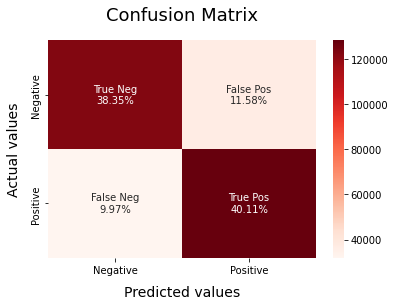

In [ ]:
model_Evaluate(model2)

### plots

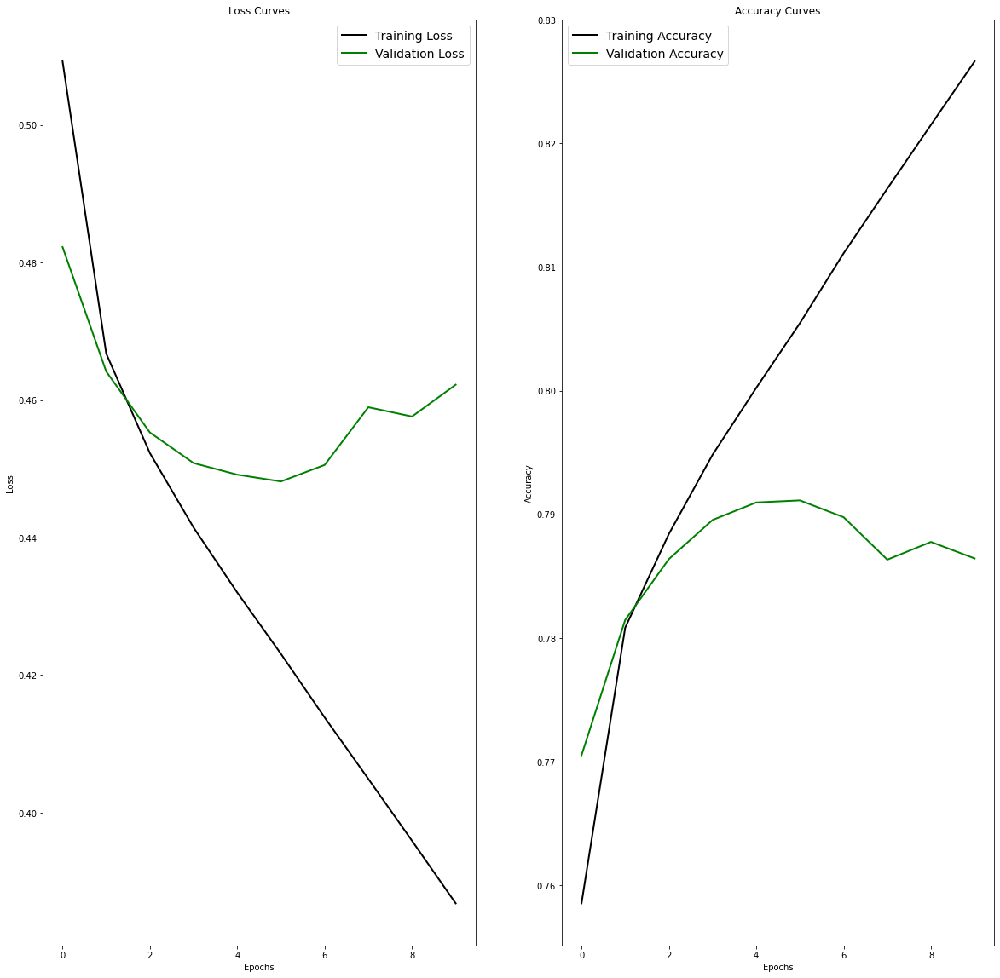

In [ ]:
fig, ax = plt.subplots(nrows = 1, ncols = 2,figsize = (20, 20))
ax[0].plot(history2.history['loss'], 'black', linewidth=2.0)
ax[0].plot(history2.history['val_loss'], 'green', linewidth=2.0)
ax[0].legend(['Training Loss', 'Validation Loss'], fontsize=14)
ax[0].set(xlabel= 'Epochs'
            , ylabel= 'Loss'
            , title= 'Loss Curves');
ax[1].plot(history2.history['acc'], 'black', linewidth=2.0)
ax[1].plot(history2.history['val_acc'], 'green', linewidth=2.0)
ax[1].legend(['Training Accuracy' , 'Validation Accuracy'], fontsize=14)
ax[1].set(xlabel= 'Epochs'
            , ylabel= 'Accuracy'
            , title= 'Accuracy Curves');

# Comparison of LSTM and BiLSTM:

In general : 
STM in its core, preserves information from inputs that has already passed through it using the hidden state.

Unidirectional LSTM only preserves information of the past because the only inputs it has seen are from the past.

Using bidirectional will run your inputs in two ways, one from past to future and one from future to past and what differs this approach from unidirectional is that in the LSTM that runs backwards you preserve information from the future and using the two hidden states combined you are able in any point in time to preserve information from both past and future.

What they are suited for is a very complicated question but BiLSTMs show very good results as they can understand context better as what we expect, 


in our example : 
We can see both of them happen to get overfitting beacuse of lack of regularization which is added below and improved the results, but , in general we can bidirectional lstm perform a litte better in terms of speed of convergence and training and also accuracy on train and test data(a Little), We can also see from confusion matrix that Bilstm performs better in cast of True positives(about 1 percent) which is likely due to its bidirectional functioning that splits the positve comments from others and use also the future and not only past words to predict emotion which could be quite game-changer in case of some tweets

# Creating network(Bidirectional lstm with dropout)

In [ ]:
model3 = Sequential()
model3.add(embedding_layer)
model3.add(Dropout(0.3))
model3.add(Bidirectional(LSTM(150, dropout=0.3)))
model3.add(Dense(3, activation='relu', kernel_regularizer=regularizers.l2(1e-2)))
model3.add(Dense(1, activation = "sigmoid"))

optimizer = tensorflow.keras.optimizers.Adam()

model3.compile(optimizer= optimizer,loss='binary_crossentropy', metrics=['acc'])

In [ ]:
model3.summary()

Model: "sequential_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 embedding (Embedding)       (None, 40, 300)           115936200 
                                                                 
 dropout_1 (Dropout)         (None, 40, 300)           0         
                                                                 
 bidirectional_1 (Bidirectio  (None, 300)              541200    
 nal)                                                            
                                                                 
 dense_4 (Dense)             (None, 3)                 903       
                                                                 
 dense_5 (Dense)             (None, 1)                 4         
                                                                 
Total params: 116,478,307
Trainable params: 542,107
Non-trainable params: 115,936,200
__________________________________

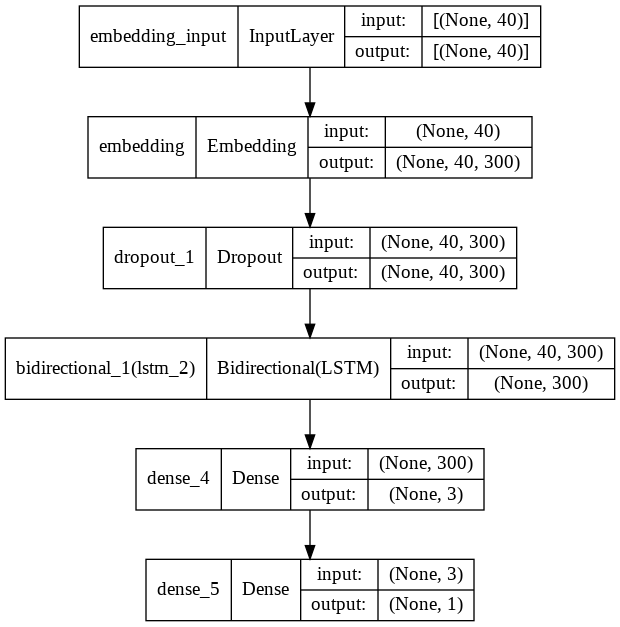

In [ ]:
from tensorflow.keras.utils import plot_model
plot_model(model3, show_shapes=True, show_layer_names=True, to_file='model3.png')
from IPython.display import Image
Image(retina=True, filename='model3.png')

## Training Netowrk

In [ ]:
history3 = model3.fit(X_train, y_train, epochs=10,batch_size=1024,validation_data=(X_valid, y_valid), callbacks=[checkpoint, reduce_lr])

Streaming output truncated to the last 5000 lines.
1000/1000 [==============================] - 139s 139ms/step - loss: 0.4586 - acc: 0.7818 - val_loss: 0.4448 - val_acc: 0.7917 - lr: 0.0010
Epoch 7/10
1000/1000 [==============================] - 141s 141ms/step - loss: 0.4547 - acc: 0.7843 - val_loss: 0.4484 - val_acc: 0.7913 - lr: 0.0010
Epoch 8/10
1000/1000 [==============================] - 139s 139ms/step - loss: 0.4511 - acc: 0.7863 - val_loss: 0.4460 - val_acc: 0.7936 - lr: 0.0010
Epoch 9/10
1000/1000 [==============================] - 140s 141ms/step - loss: 0.4487 - acc: 0.7876 - val_loss: 0.4426 - val_acc: 0.7949 - lr: 0.0010
Epoch 10/10
1000/1000 [==============================] - 141s 141ms/step - loss: 0.4461 - acc: 0.7895 - val_loss: 0.4434 - val_acc: 0.7946 - lr: 0.0010


## Evaluating model

313/313 [==============================] - 13s 39ms/step - loss: 0.4459 - acc: 0.7928
Accuracy and loss of model on training data : 0.81, 0.42
Accuracy and loss of model on validation data : 0.79, 0.44
Accuracy and loss of model on test data : 0.79, 0.45
              precision    recall  f1-score   support

           0       0.78      0.81      0.80    159763
           1       0.80      0.78      0.79    160237

    accuracy                           0.79    320000
   macro avg       0.79      0.79      0.79    320000
weighted avg       0.79      0.79      0.79    320000



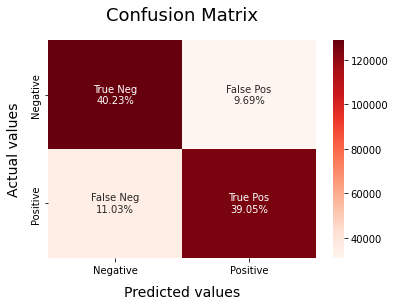

In [ ]:
model_Evaluate(model3)

### plots

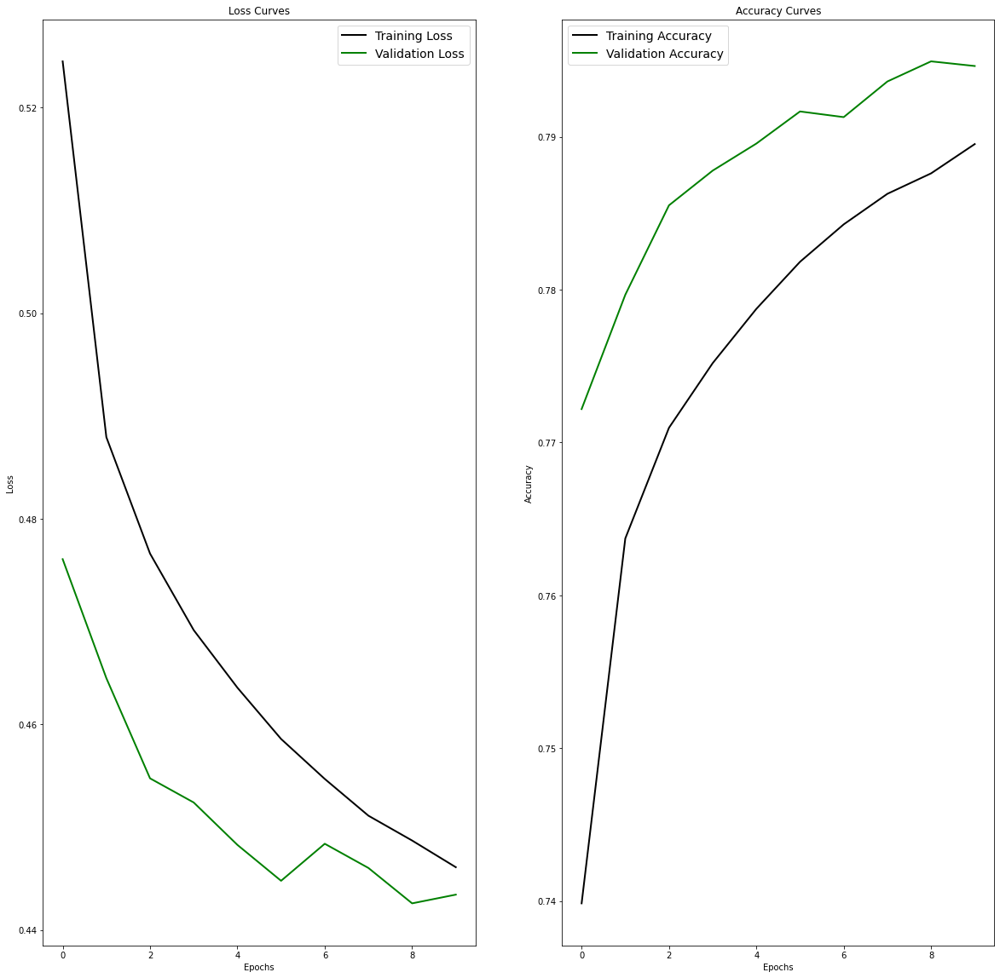

In [ ]:
fig, ax = plt.subplots(nrows = 1, ncols = 2,figsize = (20, 20))
ax[0].plot(history3.history['loss'], 'black', linewidth=2.0)
ax[0].plot(history3.history['val_loss'], 'green', linewidth=2.0)
ax[0].legend(['Training Loss', 'Validation Loss'], fontsize=14)
ax[0].set(xlabel= 'Epochs'
            , ylabel= 'Loss'
            , title= 'Loss Curves');
ax[1].plot(history3.history['acc'], 'black', linewidth=2.0)
ax[1].plot(history3.history['val_acc'], 'green', linewidth=2.0)
ax[1].legend(['Training Accuracy' , 'Validation Accuracy'], fontsize=14)
ax[1].set(xlabel= 'Epochs'
            , ylabel= 'Accuracy'
            , title= 'Accuracy Curves');

# Using bert

## Getting the data ready

In [ ]:
sample_size = int(len(df)*0.35)
sample = df.sample(sample_size, random_state=101)
x_train, x_test, y_train, y_test = train_test_split(sample.text.values, sample.sentiment.values, test_size=0.2, random_state=101)
x_train, x_valid, y_train, y_valid = train_test_split(x_train, y_train , test_size=0.2, random_state=101)

In [ ]:
y_train = np_utils.to_categorical(y_train)
y_valid = np_utils.to_categorical(y_valid)

## Importing bert and setting it up

In [ ]:
bert_layer = hub.KerasLayer("https://tfhub.dev/tensorflow/bert_en_cased_L-12_H-768_A-12/2",
                            trainable=True)

INFO:absl:Using /tmp/tfhub_modules to cache modules.
INFO:absl:Downloading TF-Hub Module 'https://tfhub.dev/tensorflow/bert_en_cased_L-12_H-768_A-12/2'.
INFO:absl:Downloaded https://tfhub.dev/tensorflow/bert_en_cased_L-12_H-768_A-12/2, Total size: 417.01MB
INFO:absl:Downloaded TF-Hub Module 'https://tfhub.dev/tensorflow/bert_en_cased_L-12_H-768_A-12/2'.


In [ ]:
vocab_file = bert_layer.resolved_object.vocab_file.asset_path.numpy()
do_lower_case = bert_layer.resolved_object.do_lower_case.numpy()
tokenizer = tokenization.FullTokenizer(vocab_file, do_lower_case)

In [ ]:
def encode_names(n):
   tokens = list(tokenizer.tokenize(n))
   tokens.append('[SEP]')  # seperation token. Would bemuch more useful if you had a multiple text input.
   return tokenizer.convert_tokens_to_ids(tokens)

tweets = tf.ragged.constant([
    encode_names(n) for n in x_train])

In [ ]:
cls = [tokenizer.convert_tokens_to_ids(['[CLS]'])]*tweets.shape[0]
input_word_ids = tf.concat([cls, tweets], axis=-1)

In [ ]:
lens = max(sample.text.apply(lambda x:len(str(x).split())))
max_seq_length = int(1.5*lens)

In [ ]:
def encode_names(n, tokenizer):
   tokens = list(tokenizer.tokenize(n))
   tokens.append('[SEP]')
   return tokenizer.convert_tokens_to_ids(tokens)

def bert_encode(string_list, tokenizer, max_seq_length):
  num_examples = len(string_list)
  
  string_tokens = tf.ragged.constant([
      encode_names(n, tokenizer) for n in np.array(string_list)])

  cls = [tokenizer.convert_tokens_to_ids(['[CLS]'])]*string_tokens.shape[0]
  input_word_ids = tf.concat([cls, string_tokens], axis=-1)

  input_mask = tf.ones_like(input_word_ids).to_tensor(shape=(None, max_seq_length))

  type_cls = tf.zeros_like(cls)
  type_tokens = tf.ones_like(string_tokens)
  input_type_ids = tf.concat(
      [type_cls, type_tokens], axis=-1).to_tensor(shape=(None, max_seq_length))

  inputs = {
      'input_word_ids': input_word_ids.to_tensor(shape=(None, max_seq_length)),
      'input_mask': input_mask,
      'input_type_ids': input_type_ids}

  return inputs

In [ ]:
X_train = bert_encode(x_train, tokenizer, max_seq_length)
X_valid = bert_encode(x_valid, tokenizer, max_seq_length)

## Creating network

In [ ]:
num_class = 2  # Based on available class selection
max_seq_length = max_seq_length  # we calculated this a couple cells ago

input_word_ids = tf.keras.layers.Input(shape=(max_seq_length,), dtype=tf.int32,
                                       name="input_word_ids")
input_mask = tf.keras.layers.Input(shape=(max_seq_length,), dtype=tf.int32,
                                   name="input_mask")
segment_ids = tf.keras.layers.Input(shape=(max_seq_length,), dtype=tf.int32,
                                    name="segment_ids")

pooled_output, sequence_output = bert_layer([input_word_ids, input_mask, segment_ids])                                  

output = tf.keras.layers.Dropout(rate=0.3)(pooled_output)

output = tf.keras.layers.Dense(num_class, activation='softmax', name='output')(output)

model = tf.keras.Model(
    inputs={
        'input_word_ids': input_word_ids,
        'input_mask': input_mask,
        'input_type_ids': segment_ids
        },
        outputs=output)

In [ ]:
epochs = 4
batch_size = 16  # select based on your GPU resources
eval_batch_size = batch_size


train_data_size = len(y_train)
steps_per_epoch = int(train_data_size / batch_size)
num_train_steps = steps_per_epoch * epochs
warmup_steps = int(epochs * train_data_size * 0.1 / batch_size)

optimizer = optimization.create_optimizer(
    2e-5, num_train_steps=num_train_steps, num_warmup_steps=warmup_steps)


model.compile(optimizer=optimizer,
              loss='categorical_crossentropy',
              metrics=['acc'])

model.summary()

INFO:absl:using Adamw optimizer
INFO:absl:gradient_clip_norm=1.000000


Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_word_ids (InputLayer)    [(None, 60)]         0           []                               
                                                                                                  
 input_mask (InputLayer)        [(None, 60)]         0           []                               
                                                                                                  
 segment_ids (InputLayer)       [(None, 60)]         0           []                               
                                                                                                  
 keras_layer (KerasLayer)       [(None, 768),        108310273   ['input_word_ids[0][0]',         
                                 (None, 60, 768)]                 'input_mask[0][0]',         

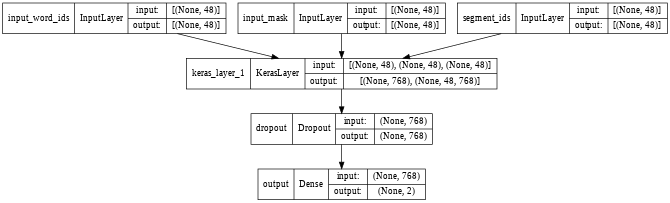

In [ ]:
plot_model(model, show_shapes=True, dpi=48)

## Training model

In [ ]:
tensorboard = TensorBoard(log_dir='log/{}'.format(time()))
history = model.fit(X_train,
                    y_train,
                    epochs=epochs,
                    batch_size=batch_size,
                    validation_data=(X_valid, y_valid),
                    verbose=1,
                    callbacks = [tensorboard])

Epoch 1/4
22400/22400 [==============================] - 3506s 156ms/step - loss: 0.4985 - acc: 0.7597 - val_loss: 0.4622 - val_acc: 0.7857
Epoch 2/4
22400/22400 [==============================] - 3463s 155ms/step - loss: 0.4106 - acc: 0.8140 - val_loss: 0.4479 - val_acc: 0.7946
Epoch 3/4
22400/22400 [==============================] - 3476s 155ms/step - loss: 0.3311 - acc: 0.8588 - val_loss: 0.4965 - val_acc: 0.7946
Epoch 4/4
22400/22400 [==============================] - 3525s 157ms/step - loss: 0.2547 - acc: 0.8993 - val_loss: 0.6096 - val_acc: 0.7889


In [ ]:
model.save('/content/drive/My Drive/mymodel')

INFO:tensorflow:Assets written to: /content/drive/My Drive/mymodel/assets


INFO:tensorflow:Assets written to: /content/drive/My Drive/mymodel/assets


## Evaluating model

In [ ]:
def model_Evaluate2(model):
  
    loss, accuracy = model.evaluate(X_train, y_train, verbose=False)
    print("Training Accuracy: {:.3f}".format(accuracy))
    loss, accuracy = model.evaluate(X_valid, y_valid, verbose=False)
    print("validation Accuracy:  {:.3f}".format(accuracy))
    X_test = bert_encode(x_test, tokenizer, max_seq_length)
    y_test1 = np_utils.to_categorical(y_test)
    loss, accuracy = model.evaluate(X_test, y_test1, verbose=False)
    print("Testing Accuracy:  {:.3f}".format(accuracy))


    # Predict values for Test dataset
    y_pred = model.predict(X_test)
    y_pred = np.argmax(y_pred, axis=-1)
    # Print the evaluation metrics for the dataset.
    print(classification_report(y_test, y_pred))
    
    # Compute and plot the Confusion matrix
    cf_matrix = confusion_matrix(y_test, y_pred)

    categories  = ['Negative','Positive']
    group_names = ['True Neg','False Pos', 'False Neg','True Pos']
    group_percentages = ['{0:.2%}'.format(value) for value in cf_matrix.flatten() / np.sum(cf_matrix)]

    labels = [f'{v1}\n{v2}' for v1, v2 in zip(group_names,group_percentages)]
    labels = np.asarray(labels).reshape(2,2)

    sns.heatmap(cf_matrix, annot = labels, cmap = 'Reds',fmt = '',
                xticklabels = categories, yticklabels = categories)

    plt.xlabel("Predicted values", fontdict = {'size':14}, labelpad = 10)
    plt.ylabel("Actual values"   , fontdict = {'size':14}, labelpad = 10)
    plt.title ("Confusion Matrix", fontdict = {'size':18}, pad = 20)

Training Accuracy: 0.943
validation Accuracy:  0.789
Testing Accuracy:  0.788
              precision    recall  f1-score   support

           0       0.78      0.80      0.79     55768
           1       0.79      0.78      0.79     56232

    accuracy                           0.79    112000
   macro avg       0.79      0.79      0.79    112000
weighted avg       0.79      0.79      0.79    112000



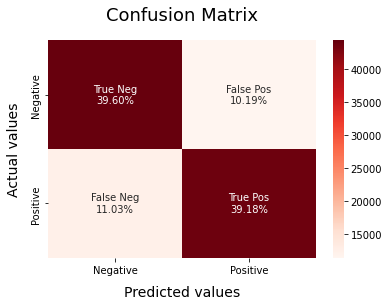

In [ ]:
model_Evaluate2(model)

## Plots

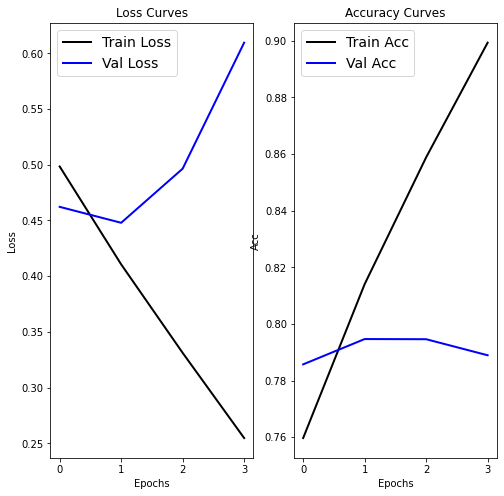

In [ ]:
fig, ax = plt.subplots(nrows = 1, ncols = 2,figsize = (8, 8))
ax[0].plot(history.history['loss'], 'black', linewidth=2.0)
ax[0].plot(history.history['val_loss'], 'blue', linewidth=2.0)
ax[0].legend(['Train Loss', 'Val Loss'], fontsize=14)
ax[0].set(xlabel= 'Epochs'
            , ylabel= 'Loss'
            , title= 'Loss Curves');
ax[1].plot(history.history['acc'], 'black', linewidth=2.0)
ax[1].plot(history.history['val_acc'], 'blue', linewidth=2.0)
ax[1].legend(['Train Acc', 'Val Acc'], fontsize=14)
ax[1].set(xlabel= 'Epochs'
            , ylabel= 'Acc'
            , title= 'Accuracy Curves');

# Comparison

Bert, as we expected happens to outperfom previous ones in term of accuracy and speed but it gets caught with overfitting again which may require more regularization terms

Given the same resource and time, the pretrained BERT perfomed slightly better than LSTM but no significant difference.(But we expected much more better performance) , Reason ?:
Potentially, training the BERT model from scratch on similar tweets could produce much better result , meaning that if we had resources to train bert from scratch and not only load it's weight and change the dense layer, on the data, most likely we could've observed much more better performance from bert since it analyzes all the words and not like LStm (only sequenctial forward or backward), but due to model loading and only changing last dense layer, depstie getting good results, bert fails to outperform LStm's with GAP!

# Temporal Pyramid

## Getting the data ready

In [ ]:
#df.to_csv('clean_tweet.csv',encoding='utf-8')
csv = '/content/drive/My Drive/clean_tweet.csv'
df = pd.read_csv(csv,index_col=0)
df.text = df.text.apply(lambda x: str(x))

/usr/local/lib/python3.7/dist-packages/numpy/lib/arraysetops.py:580: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  mask |= (ar1 == a)


In [ ]:
token = Tokenizer()
max_len = max(df.text.apply(lambda x: len(str(x).split())))
token.fit_on_texts(df.text)
sequence = token.texts_to_sequences(df.text)
tweet = pad_sequences(sequence, maxlen=64)

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(tweet, df.sentiment.values, test_size=0.2, random_state=101)
X_train, X_valid, y_train, y_valid = train_test_split(X_train, y_train , test_size=0.2, random_state=101)

In [ ]:
embedding_matrix  = np.load('/content/drive/My Drive/weight_matrix.npy')

In [ ]:
# contains the index for each word
vocab = token.word_index
# total number of words in our vocabulary, plus one for unknown words
vocab_size = len(token.word_index) + 1
# embedding dimensions
embedding_dim = 300

In [ ]:
# create the embedding layer
embedding_layer = Embedding(vocab_size, 
                            embedding_dim, 
                            weights = [embedding_matrix], 
                            input_length = 64, 
                            trainable = False)

In [ ]:
model = Sequential()
model.add(embedding_layer)
#model.add(LSTM(150))
#model.add(Dense(3, activation='relu', kernel_regularizer=regularizers.l2(1e-2)))
#model.add(Dense(1, activation = "sigmoid"))

optimizer = tensorflow.keras.optimizers.Adam()

model.compile(optimizer= optimizer,loss='binary_crossentropy', metrics=['acc'])

#Call backs
checkpoint = ModelCheckpoint("rnn_model.hdf5", monitor='val_acc', verbose=1,save_best_only=True, mode='auto', save_freq=1,save_weights_only=False)
reduce_lr = ReduceLROnPlateau(monitor = 'val_loss', 
                              factor = 0.2,
                              min_lr = 0.0001)

In [ ]:
from tensorflow.keras import backend as K
import torch
from torch import nn
from tensorflow.keras.layers import Layer, GRU
from torch.autograd import Variable
import progressbar
func = K.function([model.get_layer(index=0).input], [model.get_layer(index=-1).output])

In [ ]:
samples = np.random.choice(np.arange(X_train.shape[0]),size= int(len(X_train) * 0.15))
x_train, x_valid, y_train, y_valid = train_test_split(X_train[samples], y_train[samples], test_size=0.2, random_state=101)

## Creating pyramid with torch

In [ ]:
class Pyramidal_GRU(nn.Module):
    def __init__(self,input_size, hidden_size, seq_len=64, stack_size=3):
        super(Pyramidal_GRU, self).__init__()
        self.input_size = input_size
        self.hidden_size = hidden_size
        self.seq_len=seq_len
        self.stack_size = 3
        self.gru0 = nn.GRU(self.input_size, self.hidden_size,batch_first=True) #initial projection
        self.drop = nn.Dropout(p=0.35)
        self.linear = nn.Linear(150, 1, )
        self.pyramid = nn.ModuleList(
            [nn.GRU(2 * hidden_size, hidden_size, batch_first=True) for _ in range(stack_size)])
        
            
    def forward(self,input):
        x,hidden = self.gru0(input)
        
        #print('x.size',x.size())
        
        seq_len = x.size(1)
        #print('seq_len', seq_len)
        for i in range(self.stack_size):
            x = x.contiguous().view(-1,int(seq_len/2),int(2*self.hidden_size)) #need 'contiguous' or it errors out
            #print('reshaped',x.size())
            seq_len /=2
            
            x,_ = self.pyramid[i](x)
            #print('processed', x.size())
            
        #print('final',x.size())
        x = x[:, -1, :]
        x = self.linear(self.drop(x))
        x = torch.sigmoid(x)

        #print('final -- ',x.size())

        return x

In [ ]:
r = Pyramidal_GRU(300, 150)

## Training network and accuracy and loss

In [ ]:
batch_size = 16
optimizer = torch.optim.Adam(r.parameters(), lr=1e-3)
loss_func = nn.BCELoss()
train_losss = []
val_losss = []
for t in range(4):
  arr = np.arange(x_train.shape[0])
  np.random.shuffle(arr)
  loss_temp = 0 
  k=0
  for j in progressbar.progressbar(range(0, x_train.shape[0], batch_size)):
    f = func(x_train[arr[j:j+batch_size]])
    a = f[0]
    hidden = None
    inp = Variable(torch.Tensor(a.reshape(arr[j:j+batch_size].shape[0], -1, 300)), requires_grad=True)
    out = Variable(torch.Tensor(y_train[arr[j:j+batch_size]].reshape(arr[j:j+batch_size].shape[0],1)))
    pred = r(inp)
    optimizer.zero_grad()
    loss = loss_func(pred, out)
    #predictions.append(pred.data.numpy())
    loss.backward()
    optimizer.step()
    loss_temp += loss.data.numpy().sum()
    k += 1
  arr1 = np.arange(x_valid.shape[0])
  np.random.shuffle(arr1)
  loss_temp1 = 0 
  k1=0
  for k in progressbar.progressbar(range(0, x_valid.shape[0], batch_size)):
    g = func(x_valid[arr1[k:k+batch_size]])
    b = g[0]
    inp = Variable(torch.Tensor(b.reshape(arr1[k:k+batch_size].shape[0], -1, 300)), requires_grad=True)
    out = Variable(torch.Tensor(y_valid[arr1[k:k+batch_size]].reshape((-1, 1))))
    pred = r(inp)
    loss = loss_func(pred, out)
    loss_temp1 += loss.data.numpy().sum()
    k1 += 1
    
  train_losss.append(loss_temp/k)
  val_losss.append(loss_temp1/k1)
  print(f'epoch : {t}, train_loss = {loss_temp/k:.4f}, valid_loss = {loss_temp1/k1:.4f}')

100% (7680 of 7680) |####################| Elapsed Time: 0:10:32 Time:  0:10:32
100% (1920 of 1920) |####################| Elapsed Time: 0:00:50 Time:  0:00:50
  0% (2 of 7680) |                       | Elapsed Time: 0:00:00 ETA:   0:10:31

epoch : 0, train_loss = 0.1279, valid_loss = 0.4819


100% (7680 of 7680) |####################| Elapsed Time: 0:10:37 Time:  0:10:37
100% (1920 of 1920) |####################| Elapsed Time: 0:00:51 Time:  0:00:51
  0% (2 of 7680) |                       | Elapsed Time: 0:00:00 ETA:   0:10:56

epoch : 1, train_loss = 0.1173, valid_loss = 0.4725


100% (7680 of 7680) |####################| Elapsed Time: 0:10:50 Time:  0:10:50
100% (1920 of 1920) |####################| Elapsed Time: 0:00:54 Time:  0:00:54
  0% (2 of 7680) |                       | Elapsed Time: 0:00:00 ETA:   0:11:32

epoch : 2, train_loss = 0.1067, valid_loss = 0.4767


100% (7680 of 7680) |####################| Elapsed Time: 0:10:50 Time:  0:10:50
100% (1920 of 1920) |####################| Elapsed Time: 0:00:54 Time:  0:00:54


epoch : 3, train_loss = 0.0946, valid_loss = 0.5031


## getting results on validation data

In [ ]:
arr1 = np.arange(x_valid.shape[0])
np.random.shuffle(arr1)
loss_temp1 = 0 
k1=0
preds = np.zeros((x_valid.shape[0], 1))
for k in progressbar.progressbar(range(0, x_valid.shape[0], batch_size)):
    g = func(x_valid[arr1[k:k+batch_size]])
    b = g[0]
    inp = Variable(torch.Tensor(b.reshape(arr1[k:k+batch_size].shape[0], -1, 300)), requires_grad=True)
    out = Variable(torch.Tensor(y_valid[arr1[k:k+batch_size]].reshape((-1, 1))))
    pred = r(inp)
    loss = loss_func(pred, out)
    loss_temp1 += loss.data.numpy().sum()
    k1 += 1
    pred = pred.data.numpy().reshape(-1, 1)
    preds[arr1[k:k+batch_size]] = pred

100% (1920 of 1920) |####################| Elapsed Time: 0:00:51 Time:  0:00:51


## Confusion Matrix

              precision    recall  f1-score   support

           0       0.50      0.48      0.49     15337
           1       0.50      0.52      0.51     15383

    accuracy                           0.50     30720
   macro avg       0.50      0.50      0.50     30720
weighted avg       0.50      0.50      0.50     30720



Text(0.5, 1.0, 'Confusion Matrix')

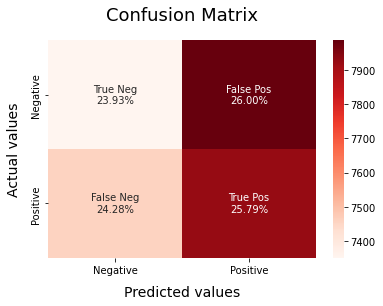

In [ ]:
preds[preds>= 0.5] = 1
preds[preds < 0.5] = 0
gt = y_valid[arr1]
# Print the evaluation metrics for the dataset.
print(classification_report(gt, preds))

# Compute and plot the Confusion matrix
cf_matrix = confusion_matrix(gt, preds)

categories  = ['Negative','Positive']
group_names = ['True Neg','False Pos', 'False Neg','True Pos']
group_percentages = ['{0:.2%}'.format(value) for value in cf_matrix.flatten() / np.sum(cf_matrix)]

labels = [f'{v1}\n{v2}' for v1, v2 in zip(group_names,group_percentages)]
labels = np.asarray(labels).reshape(2,2)

sns.heatmap(cf_matrix, annot = labels, cmap = 'Reds',fmt = '',
            xticklabels = categories, yticklabels = categories)

plt.xlabel("Predicted values", fontdict = {'size':14}, labelpad = 10)
plt.ylabel("Actual values"   , fontdict = {'size':14}, labelpad = 10)
plt.title ("Confusion Matrix", fontdict = {'size':18}, pad = 20)

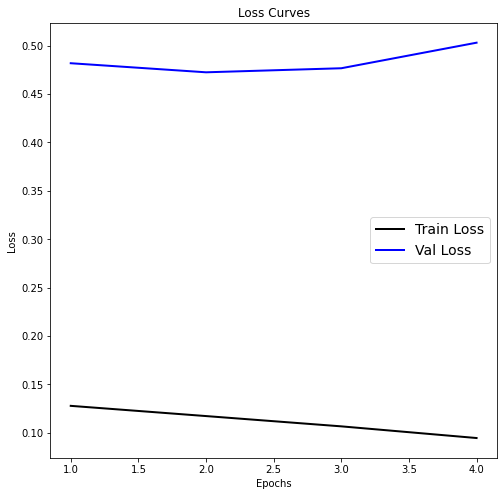

In [ ]:
fig, ax = plt.subplots(figsize = (8, 8))
ax.plot(np.arange(1,5),train_losss, 'black', linewidth=2.0)
ax.plot(np.arange(1, 5),val_losss, 'blue', linewidth=2.0)
ax.legend(['Train Loss', 'Val Loss'], fontsize=14)
ax.set(xlabel= 'Epochs'
            , ylabel= 'Loss'
            , title= 'Loss Curves');

# Comparison

Looks like pyramid fails to fulfill expectations as we wanted because of variety of reasons such as not having the exact activation function implementation as others or number of stacks, but anyway it's may perform good with hyperparameter tunning